    1. Demonstration of scvelo and cellrank with mMN x
    2. Species comparison using above x
    3. splicing information abundance + length bias
    4. projection heuristic effects across datasets.
    
conclusion: velocities do appear to capture some nice info (1), and can be used to make some good analyses (2), albiet with some caveats, in general providing a less user-dependent alternative to pseudotime. However, when considering if we can take RNA velocity further, we find low data quality and biases (3), and we find that going from transition dynamics to true velocity dynamics, things get worse (4).

In [1]:
import sys
import pandas as pd
import numpy as np
import scipy as sp      
import matplotlib.pyplot as plt
import pickle
import seaborn as sns
import pickle

# velocity packages
import scanpy as sc
import scvelo as scv
import anndata as ann
import cellrank as cr

In [2]:
def select_genes(data, species, keep_genes=None, n=2000):
    """ temporally stratified biologically relevant or variable genes"""
    gene_sets = []
    for time in data.obs.timepoint.unique():
        copy = data.copy()
        copy = copy[copy.obs.timepoint==time]
        scv.pp.filter_genes_dispersion(copy, n_top_genes=n)
        tp_genes = copy.var_names  
        gene_sets.append(tp_genes)
    hv_genes = set(gene_sets[0]).intersection(*gene_sets[1:])
    if keep_genes is not None:
        genes = list(set(hv_genes).union(set(keep_genes)))
    genes = list(set(genes).intersection(set(data.var_names)))
    return genes


mgl = '/nemo/lab/briscoej/home/users/maizelr/transcriptomics/gene_lists/list_of_genes'
mus_nt_genes = np.load(mgl, allow_pickle=True)

hgl = '/nemo/lab/briscoej/home/users/maizelr/transcriptomics/gene_lists/hNT_genes.csv'
hum_nt_genes = pd.read_csv(hgl)['0'].values

In [4]:
%%time

mus_path = "/nemo/lab/briscoej/home/users/maizelr/transcriptomics/mouse_transcriptomics_data/full_data/mouse_full_typed_velocity.loom"
hum_path = "/nemo/lab/briscoej/home/users/maizelr/transcriptomics/human_transcriptomics_analysis/data/human_full_typed_velocity.loom"
mdata = sc.read_loom(mus_path)
hdata = sc.read_loom(hum_path)

/camp/home/maizelr/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/camp/home/maizelr/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


CPU times: user 2min 40s, sys: 20.7 s, total: 3min 1s
Wall time: 3min 33s


/camp/home/maizelr/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/camp/home/maizelr/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [5]:
adata = mdata.copy()
adata.var = adata.var.set_index('var_names')
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.strings_to_categoricals()

In [6]:
adata = adata[adata.obs.domain=='MN']
genes = select_genes(adata, keep_genes=mus_nt_genes, species='mouse')

/camp/home/maizelr/.local/lib/python3.10/site-packages/scvelo/core/_anndata.py:641: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[f"initial_size_{layer}"] = get_size(adata, layer)


Extracted 2000 highly variable genes.


/camp/home/maizelr/.local/lib/python3.10/site-packages/scvelo/core/_anndata.py:641: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[f"initial_size_{layer}"] = get_size(adata, layer)


Extracted 2000 highly variable genes.


/camp/home/maizelr/.local/lib/python3.10/site-packages/scvelo/core/_anndata.py:641: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[f"initial_size_{layer}"] = get_size(adata, layer)


Extracted 2000 highly variable genes.


/camp/home/maizelr/.local/lib/python3.10/site-packages/scvelo/core/_anndata.py:641: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[f"initial_size_{layer}"] = get_size(adata, layer)


Extracted 2003 highly variable genes.


/camp/home/maizelr/.local/lib/python3.10/site-packages/scvelo/core/_anndata.py:641: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[f"initial_size_{layer}"] = get_size(adata, layer)


Extracted 2000 highly variable genes.


In [7]:
%%time
adata = adata[:,genes]
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
scv.tl.recover_dynamics(adata)
scv.tl.velocity(adata, mode='stochastic')
scv.tl.velocity_graph(adata)
scv.tl.velocity_embedding(adata, basis='pca')
scv.tl.latent_time(adata)

Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:08) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/32 cores)


  0%|          | 0/201 [00:00<?, ?gene/s]

    finished (0:00:35) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/32 cores)


/camp/home/maizelr/.local/lib/python3.10/site-packages/scvelo/tools/dynamical_model.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/camp/home/maizelr/.local/lib/python3.10/site-packages/scvelo/tools/dynamical_model.py:716: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


  0%|          | 0/1202 [00:00<?, ?cells/s]

/camp/home/maizelr/.local/lib/python3.10/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)
computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)
CPU times: user 45.6 s, sys: 3.12 s, total: 48.7 s
Wall time: 46.5 s


In [9]:
'Olig2' in adata.var_names

True

In [10]:
%%time
vk = cr.kernels.VelocityKernel(adata)
vk.compute_transition_matrix()

  0%|          | 0/1202 [00:00<?, ?cell/s]

  0%|          | 0/1202 [00:00<?, ?cell/s]

CPU times: user 2.65 s, sys: 4.03 s, total: 6.68 s
Wall time: 1.88 s


VelocityKernel[n=1202, model='deterministic', similarity='correlation', softmax_scale=4.603]

GPCCA[kernel=VelocityKernel[n=1202], initial_states=None, terminal_states=None]

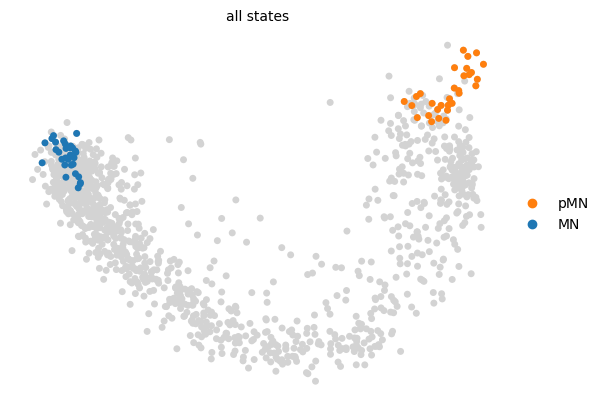

In [11]:
g = cr.estimators.GPCCA(vk)

g.fit(cluster_key="cell_subtype", n_states=2)

g.plot_macrostates(which="all", discrete=True, legend_loc="right", s=100)


Defaulting to `'gmres'` solver.


  0%|          | 0/2 [00:00<?, ?/s]

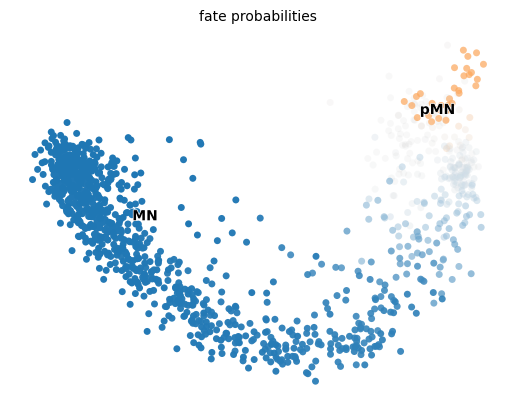

In [12]:
g.predict_terminal_states()
g.compute_fate_probabilities()
g.plot_fate_probabilities(same_plot=True)

In [13]:
delta_df = g.compute_lineage_drivers(
    lineages=["MN"], cluster_key="cell_subtype", clusters='MN'
)
delta_df.head(10)

,MN_corr,MN_pval,MN_qval,MN_ci_low,MN_ci_high
var_names,,,,,
Ina,0.607425,2.886158e-102,9.293429e-100,0.565235,0.646447
Map1b,0.576876,2.586440e-89,2.776112e-87,0.532358,0.618213
Stmn2,0.573124,7.872980e-88,6.337749e-86,0.528329,0.614738
Tubb3,0.540743,6.703989e-76,4.317369e-74,0.493643,0.584680
Nefl,0.534307,1.057090e-73,5.673051e-72,0.486767,0.578691
Gap43,0.522385,9.016529e-70,3.629153e-68,0.474045,0.567585
Mllt11,0.508882,1.575808e-65,5.074102e-64,0.459661,0.554987
Rtn1,0.482987,5.698981e-58,1.668247e-56,0.432147,0.530767
Calm2,0.480407,2.949577e-57,7.914698e-56,0.429411,0.528349


  0%|          | 0/3 [00:00<?, ?gene/s]

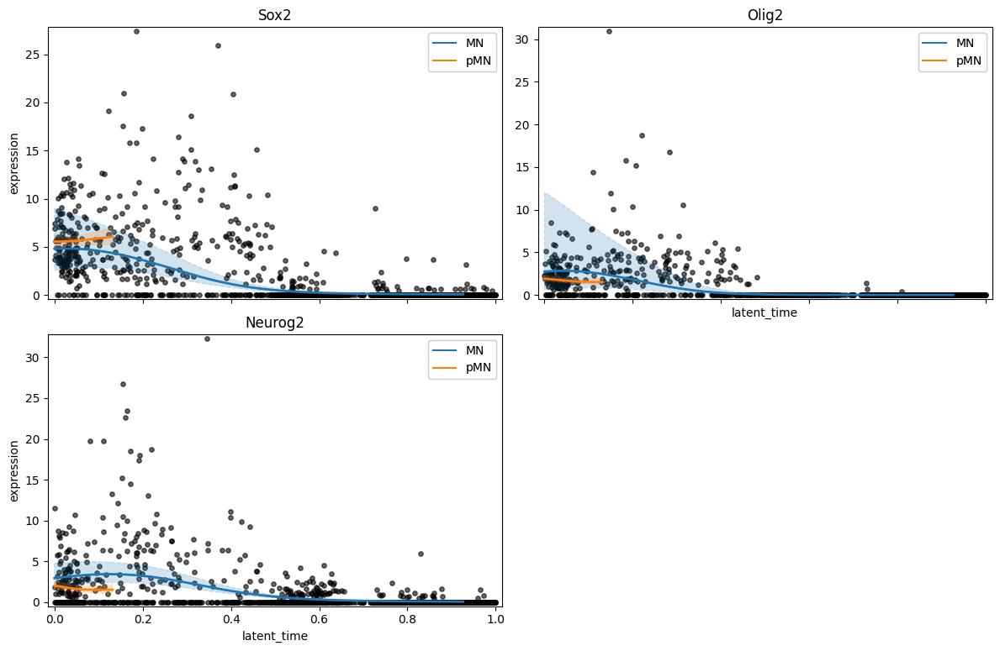

In [37]:
model = cr.models.GAM(adata, n_knots=6)

cr.pl.gene_trends(
    adata,
    model=model,
    data_key="spliced",
    genes=["Sox2", "Olig2", "Neurog2"],
    same_plot=True,
    ncols=2,
    time_key="latent_time",
    hide_cells=False,
    weight_threshold=(1e-3, 1e-3),
)

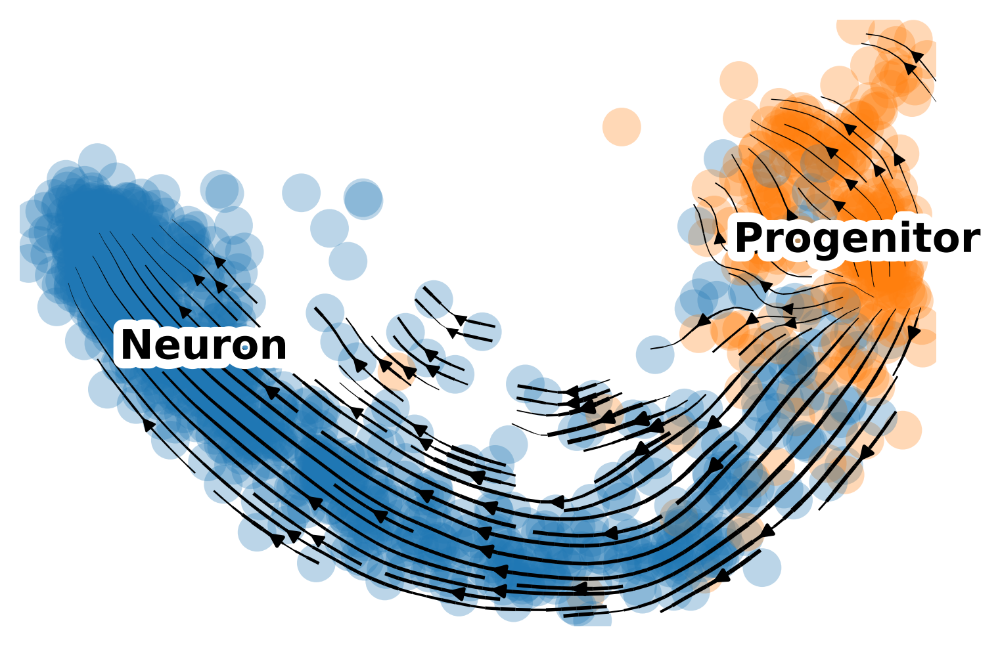

In [59]:
fig = plt.figure(figsize=(6,4), dpi=300)
ax = fig.subplots()

scv.pl.velocity_embedding_stream(
    adata, 
    color=['cell_type'],
    basis='pca', 
    legend_fontsize=15, 
    title='', 
    smooth=.8, 
    min_mass=4, 
    fontsize=16, 
    dpi=400, 
    ax=ax, 
    show=False,
    legend_fontoutline=7,
)

plt.savefig('figures/1_basic_velo_plot.png', transparent=True)
plt.show()

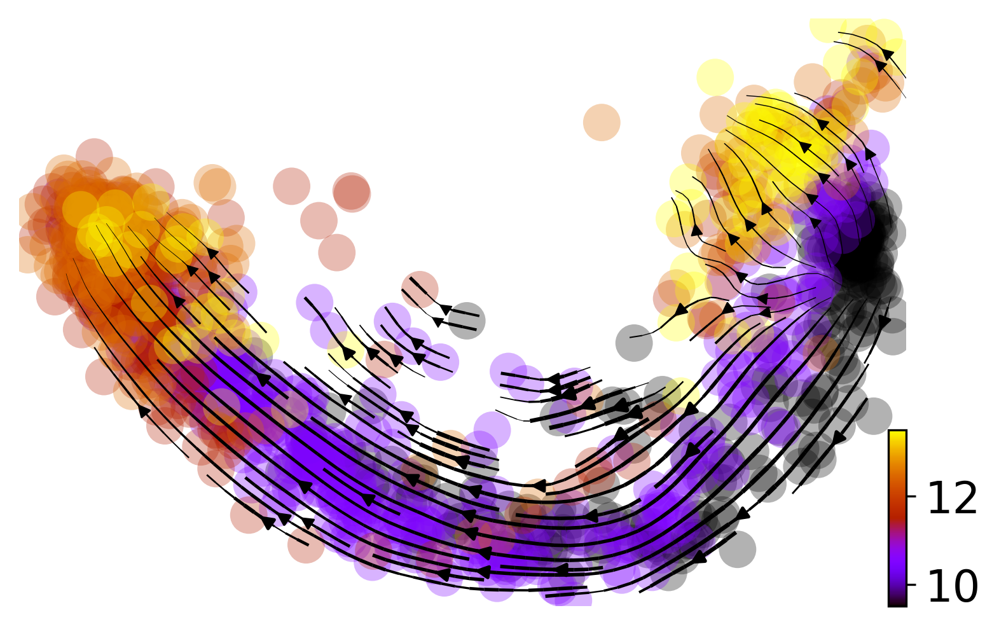

In [60]:
fig = plt.figure(figsize=(6,4), dpi=300)
ax = fig.subplots()

scv.pl.velocity_embedding_stream(
    adata, 
    color=['timepoint'], 
    color_map='gnuplot',
    basis='pca', 
    legend_fontsize=16, 
    title='', 
    smooth=.8,
    min_mass=4,
    fontsize=22,
    dpi=400,
    ax=ax, 
    show=False
)

plt.savefig('figures/1_timepoint_plot.png', transparent=True)
plt.show()

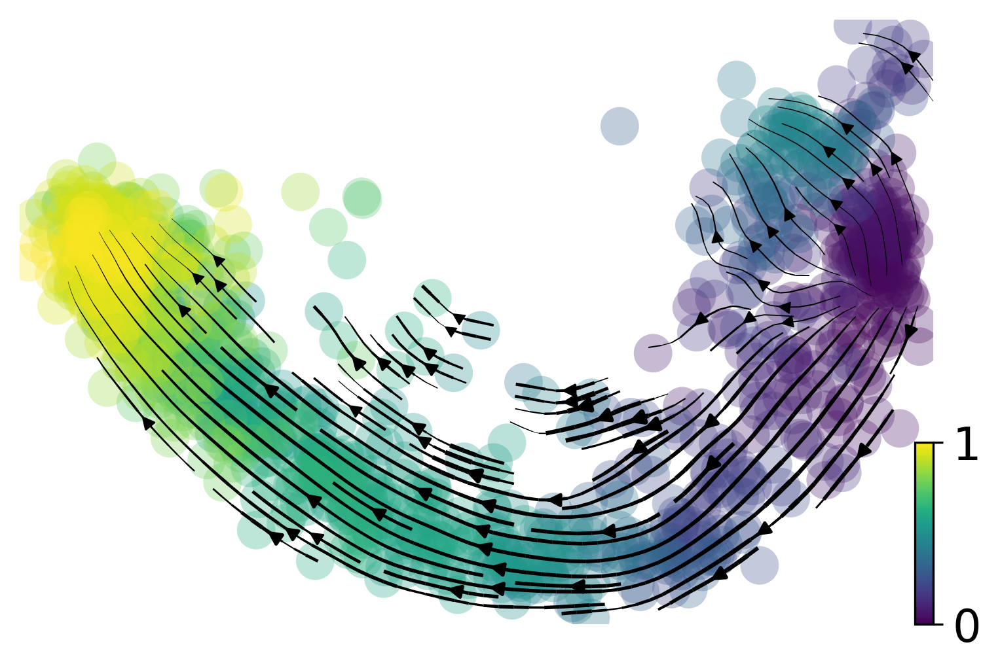

In [61]:
fig = plt.figure(figsize=(6,4), dpi=300)
ax = fig.subplots()

scv.pl.velocity_embedding_stream(
    adata, 
    color=['latent_time'],
    color_map='viridis',
    basis='pca', 
    legend_fontsize=16, 
    title='', 
    smooth=.8, 
    min_mass=4, 
    fontsize=22, 
    ax=ax,
    show=False
)

plt.savefig('figures/1_latent_time.png', transparent=True)
plt.show()

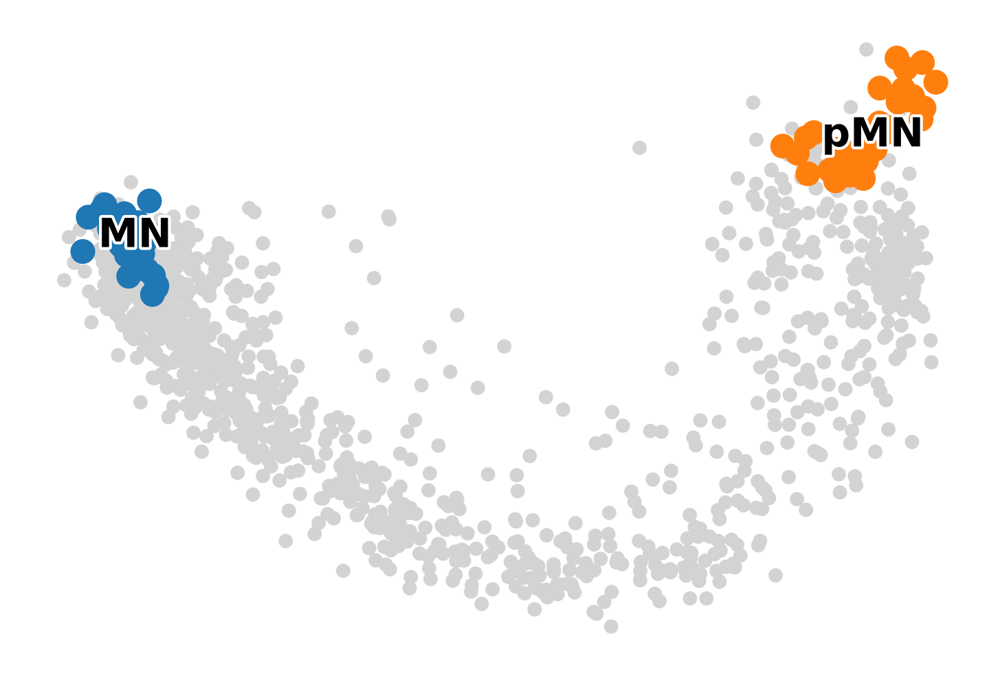

In [68]:
fig = plt.figure(figsize=(6,4), dpi=300)
ax = fig.subplots()

g.plot_macrostates(
    which="all", 
    discrete=True, 
    legend_loc="on data", 
    s=300, ax=ax, 
    show=False, 
    title='',
    legend_fontsize=14,
    legend_fontoutline=2,
)

plt.savefig('figures/1_terminal_states1.png', transparent=True)
plt.show()

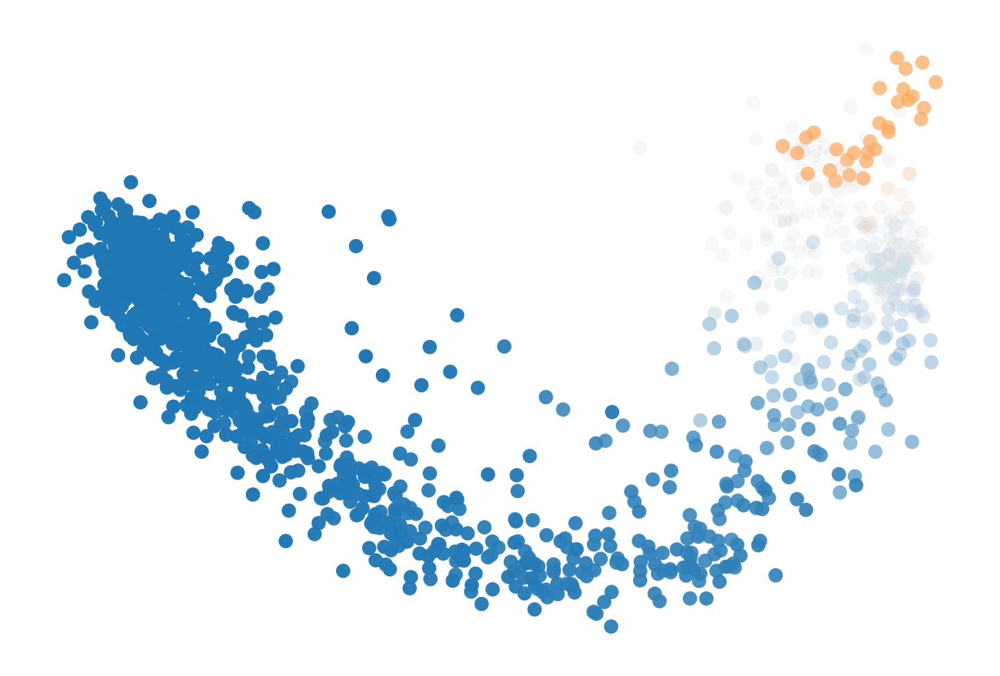

In [74]:
fig = plt.figure(figsize=(6,4), dpi=300)
ax = fig.subplots()

g.plot_fate_probabilities(
    same_plot=True,
    ax=ax, 
    show=False, 
    title='',
    legend_loc=False,
)

plt.savefig('figures/1_lineage.png', transparent=True)
plt.show()

In [75]:
g2 = cr.estimators.GPCCA(vk)

g2.fit(cluster_key="cell_subtype")

GPCCA[kernel=VelocityKernel[n=1202], initial_states=None, terminal_states=None]

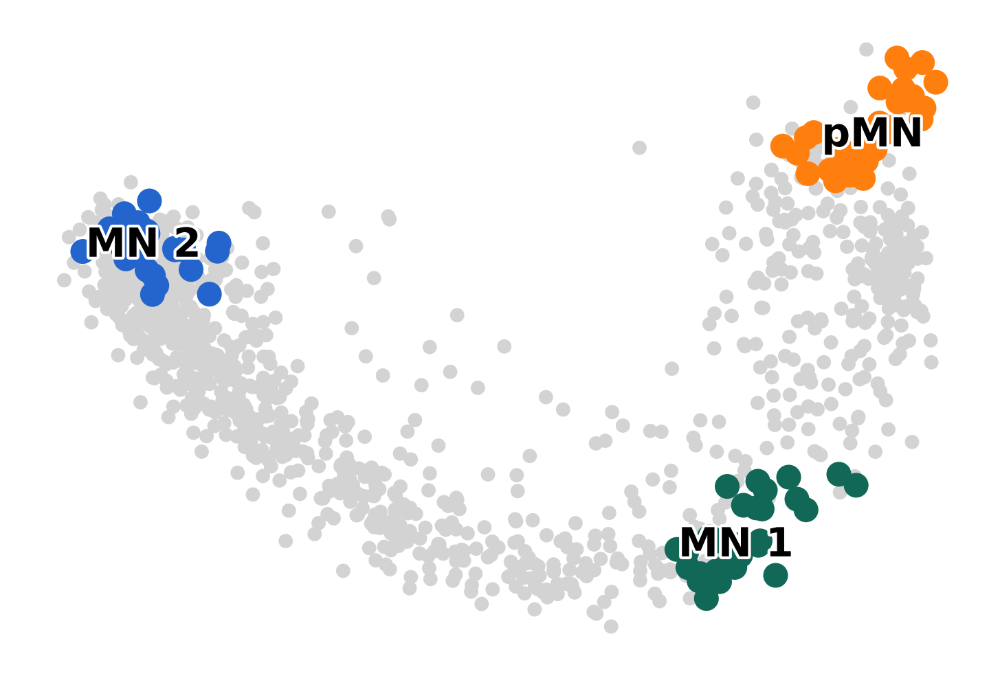

In [76]:
fig = plt.figure(figsize=(6,4), dpi=300)
ax = fig.subplots()

g2.plot_macrostates(
    which="all", 
    discrete=True, 
    legend_loc="on data", 
    s=300, ax=ax, 
    show=False, 
    title='',
    legend_fontsize=14,
    legend_fontoutline=2,
)

plt.savefig('figures/1_terminal_states2.png', transparent=True)
plt.show()

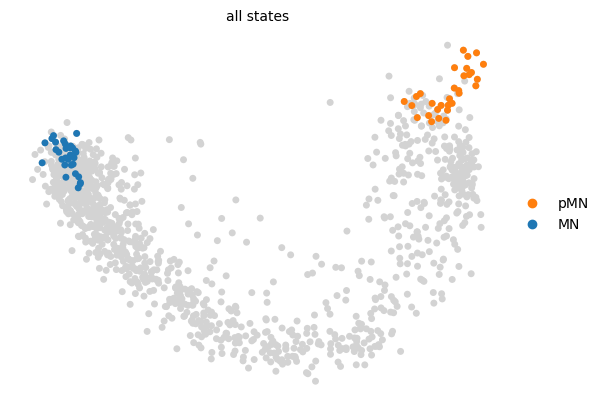

  0%|          | 0/2 [00:00<?, ?/s]

In [80]:
g = cr.estimators.GPCCA(vk)

g.fit(cluster_key="cell_subtype", n_states=2)

g.plot_macrostates(which="all", discrete=True, legend_loc="right", s=100)

g.predict_terminal_states()

g.compute_fate_probabilities()

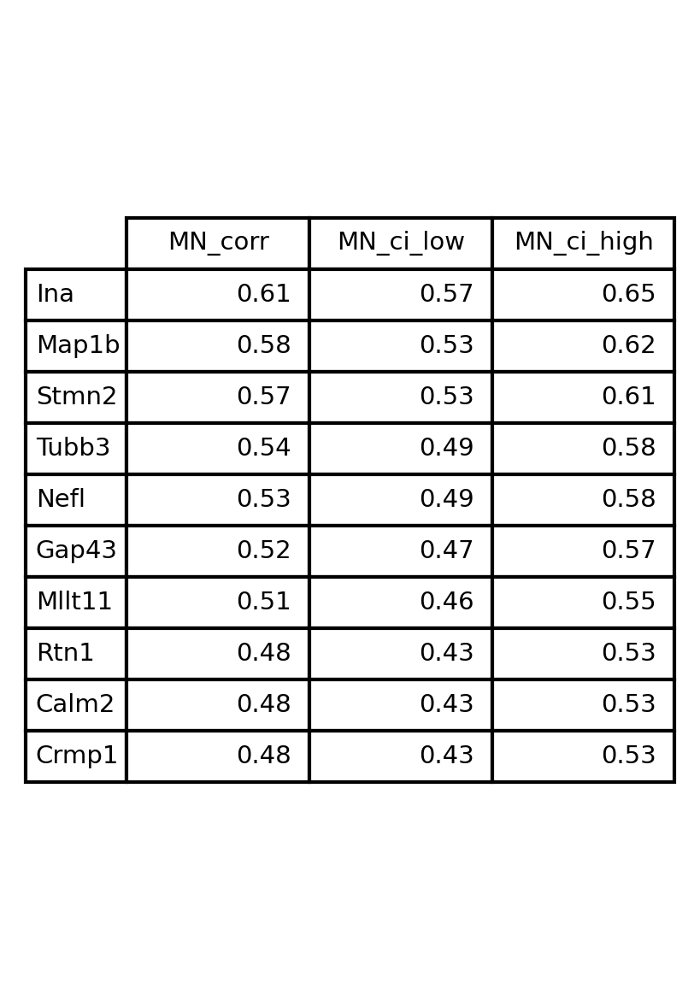

In [148]:
delta_df = g.compute_lineage_drivers(
    lineages=["MN"], cluster_key="cell_subtype", clusters='MN'
)
df_head = delta_df.head(10)
df_formatted = df_head.applymap(lambda x: f'{x:.2f}')
df_formatted = df_formatted.drop(['MN_pval','MN_qval'], axis=1)

fig, ax = plt.subplots(figsize=(3,4), dpi=300)


from pandas.plotting import table

ax = plt.subplot(111, frame_on=False)  # no visible frame
ax.xaxis.set_visible(False)  # hide the x axis
ax.yaxis.set_visible(False)  # hide the y axis
table(ax, df_formatted, loc="center")  # where df is your data frame
plt.tight_layout()
plt.savefig("1_driver_table.png")

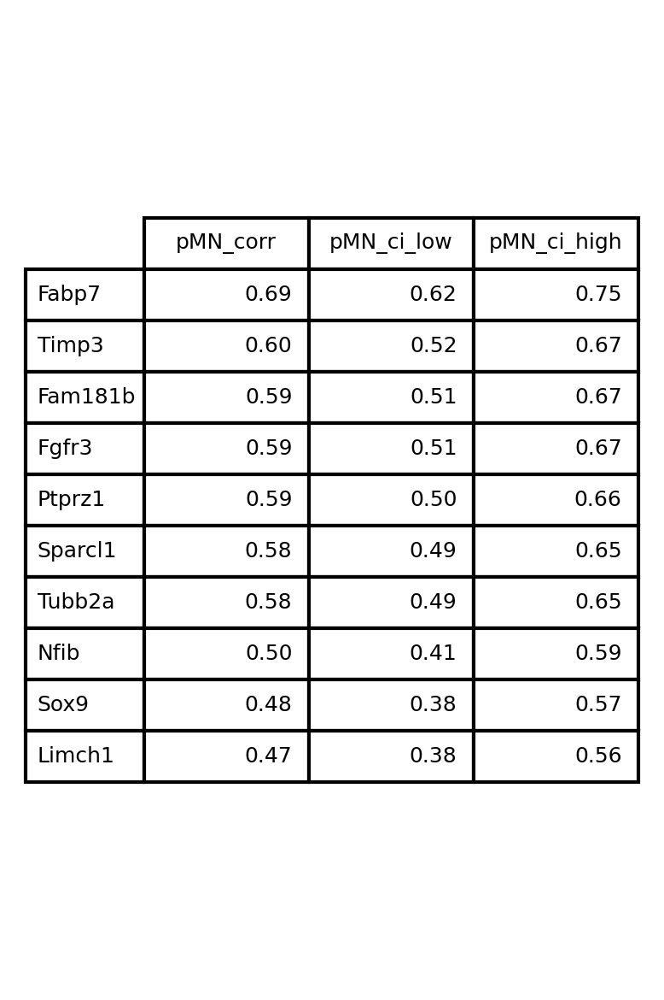

In [153]:
delta_df = g.compute_lineage_drivers(
    lineages=["pMN"], cluster_key="cell_subtype", clusters='pMN'
)
df_head = delta_df.head(10)
df_formatted = df_head.applymap(lambda x: f'{x:.2f}')
df_formatted = df_formatted.drop(['pMN_pval','pMN_qval'], axis=1)

fig, ax = plt.subplots(figsize=(3,4), dpi=300)


from pandas.plotting import table

ax = plt.subplot(111, frame_on=False)  # no visible frame
ax.xaxis.set_visible(False)  # hide the x axis
ax.yaxis.set_visible(False)  # hide the y axis
table(ax, df_formatted, loc="center")  # where df is your data frame
plt.tight_layout()
plt.savefig("1_driver_table2.png")

In [15]:
dpi=300

  0%|          | 0/1 [00:00<?, ?gene/s]

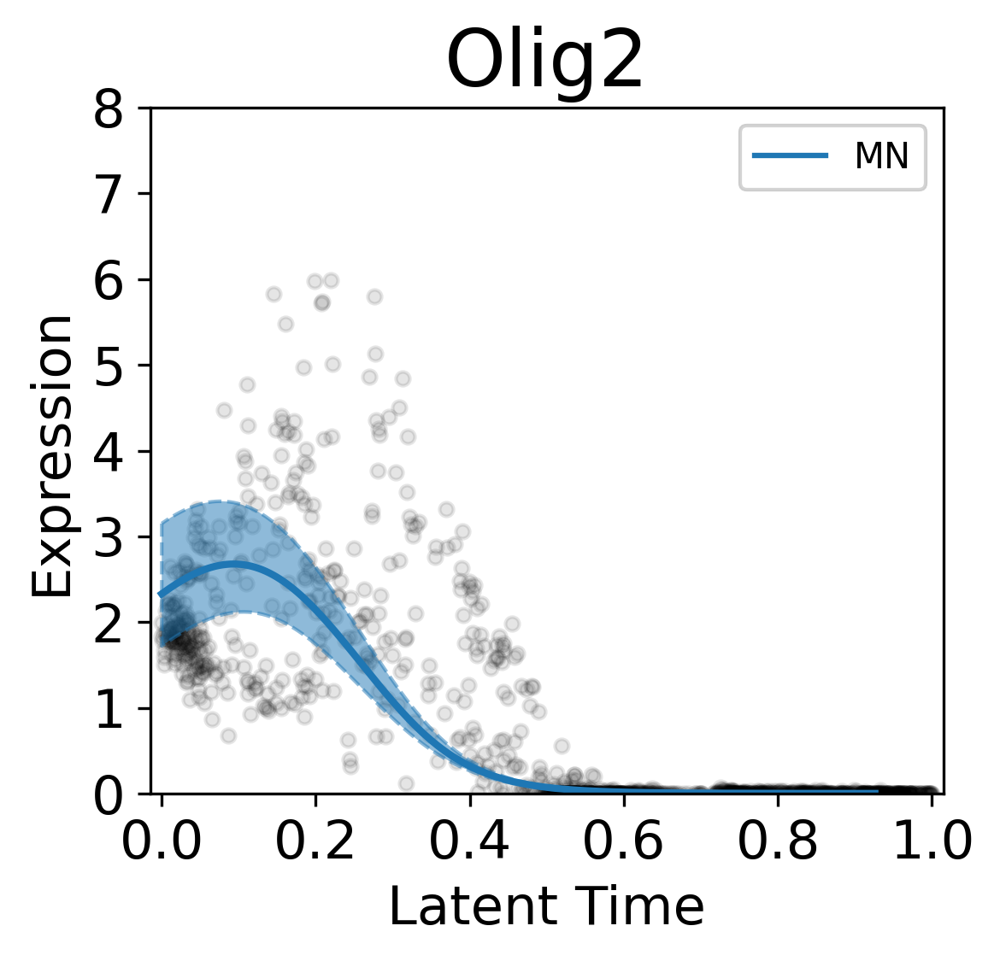

In [21]:
gene = 'Olig2'

model = cr.models.GAM(adata, n_knots=6, spline_order=3)
fig = cr.pl.gene_trends(
    adata,
    model=model,
    lineages='MN',
    data_key="Ms",
    genes=[gene],
    same_plot=True,
    ncols=2,
    time_key="latent_time",
    hide_cells=False,
    weight_threshold=(1e-3, 1e-3),
    lineage_alpha=0.5,
    cell_alpha=0.1,
    return_figure=True,
    figsize=(4,4),
    dpi=dpi,
)
ax = fig.gca()
ax.set_title(f"{gene}", fontsize=22)
ax.set_xlabel('Latent Time', fontsize=15)
ax.set_ylabel('Expression', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylim(0,8)
plt.savefig(f'1_{gene}_1.png', bbox_inches='tight')
plt.show()

  0%|          | 0/1 [00:00<?, ?gene/s]

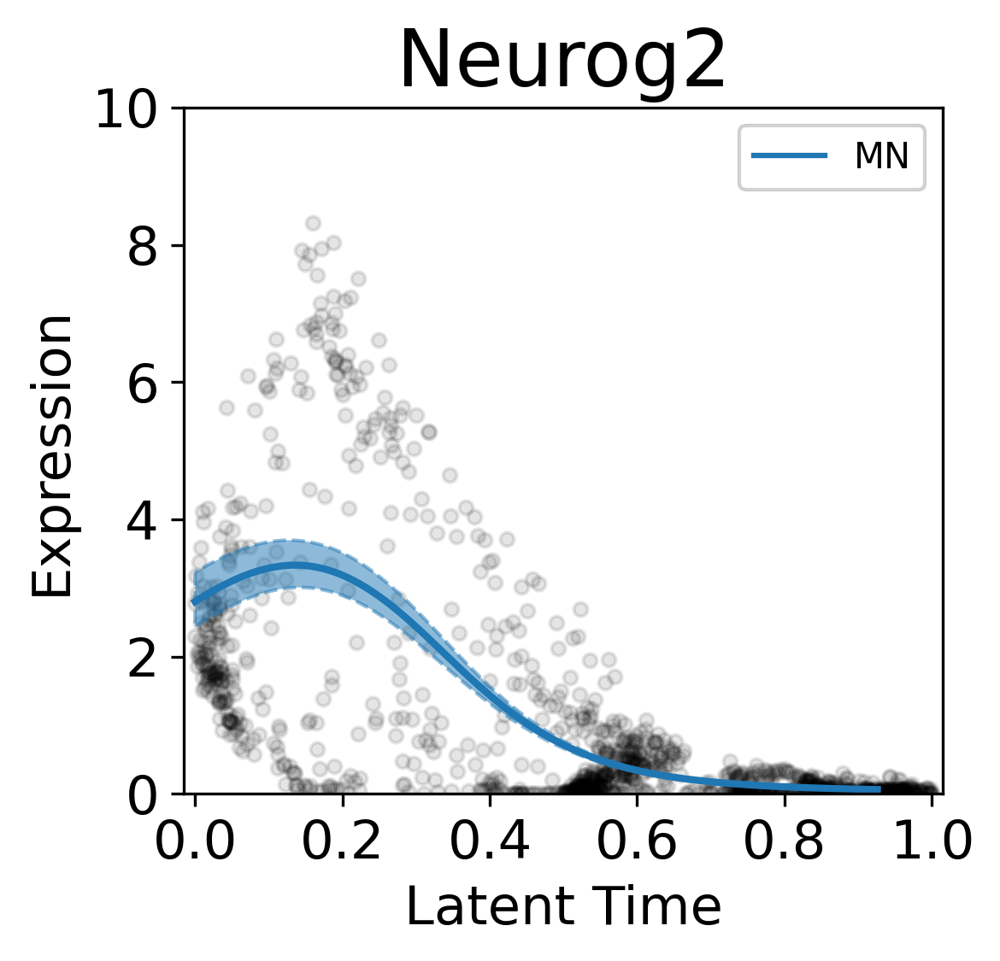

In [22]:
gene = 'Neurog2'

model = cr.models.GAM(adata, n_knots=6, spline_order=3)
fig = cr.pl.gene_trends(
    adata,
    model=model,
    lineages='MN',
    data_key="Ms",
    genes=[gene],
    same_plot=True,
    ncols=2,
    time_key="latent_time",
    hide_cells=False,
    weight_threshold=(1e-3, 1e-3),
    lineage_alpha=0.5,
    cell_alpha=0.1,
    figsize=(4,4),
    return_figure=True,
    dpi=dpi,
)
ax = fig.gca()
ax.set_title(f"{gene}", fontsize=22)
ax.set_xlabel('Latent Time', fontsize=15)
ax.set_ylabel('Expression', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylim(0,10)
plt.savefig(f'1_{gene}_1.png', bbox_inches='tight')
plt.show()

  0%|          | 0/1 [00:00<?, ?gene/s]

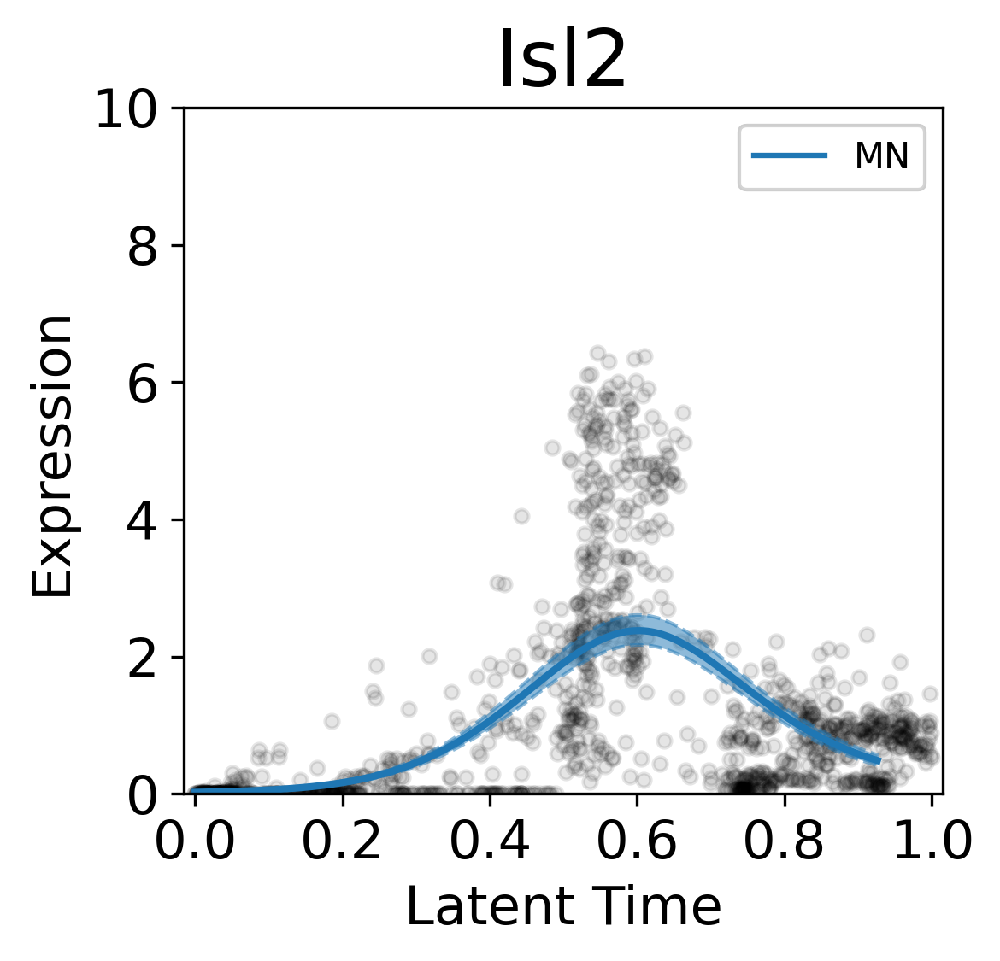

In [23]:
gene = 'Isl2'

model = cr.models.GAM(adata, n_knots=6, spline_order=3)
fig = cr.pl.gene_trends(
    adata,
    model=model,
    lineages='MN',
    data_key="Ms",
    genes=[gene],
    same_plot=True,
    ncols=2,
    time_key="latent_time",
    hide_cells=False,
    weight_threshold=(1e-3, 1e-3),
    lineage_alpha=0.5,
    cell_alpha=0.1,
    figsize=(4,4),
    return_figure=True,
    dpi=dpi,
)
ax = fig.gca()
ax.set_title(f"{gene}", fontsize=22)
ax.set_xlabel('Latent Time', fontsize=15)
ax.set_ylabel('Expression', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylim(0,10)
plt.savefig(f'1_{gene}_1.png', bbox_inches='tight')
plt.show()

  0%|          | 0/1 [00:00<?, ?gene/s]

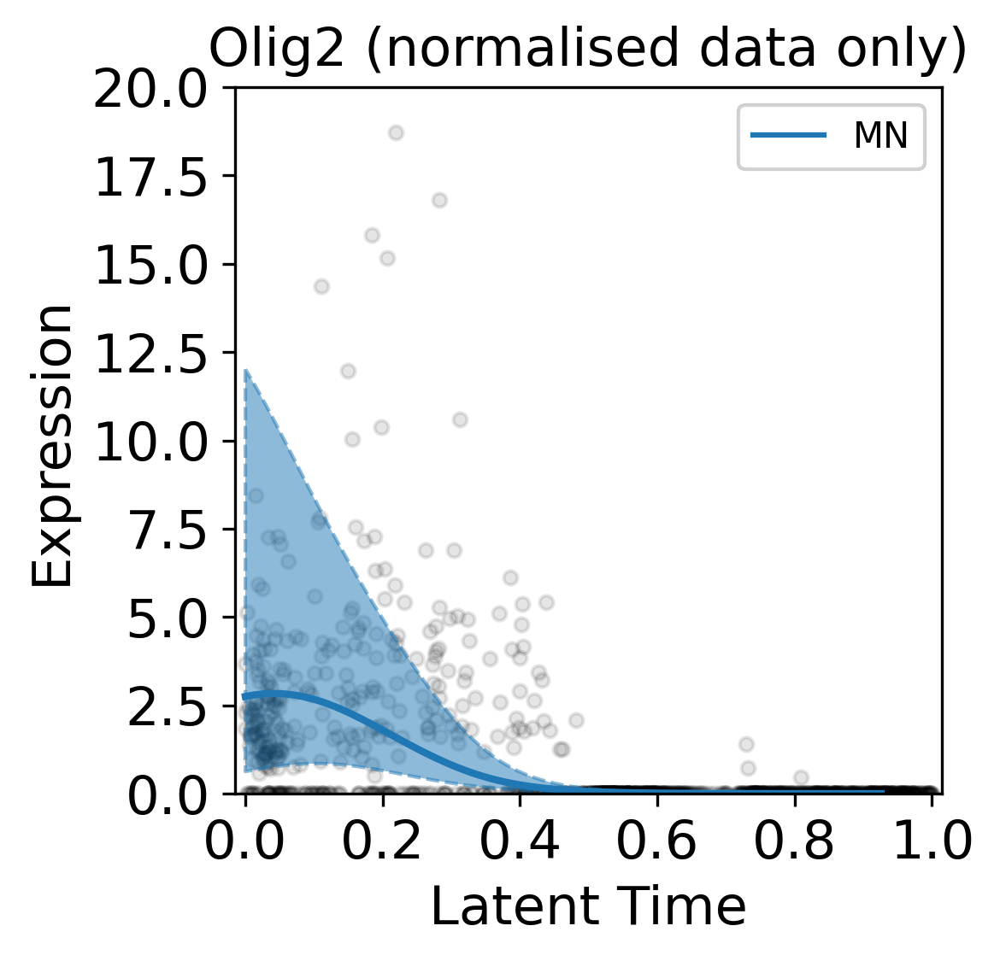

In [25]:
gene = 'Olig2'

model = cr.models.GAM(adata, n_knots=6, spline_order=3)
fig = cr.pl.gene_trends(
    adata,
    model=model,
    lineages='MN',
    data_key="spliced",
    genes=[gene],
    same_plot=True,
    ncols=2,
    time_key="latent_time",
    hide_cells=False,
    weight_threshold=(1e-3, 1e-3),
    lineage_alpha=0.5,
    cell_alpha=0.1,
    return_figure=True,
    figsize=(4,4),
    dpi=dpi,
)
ax = fig.gca()
ax.set_title(f"{gene} (normalised data only)", fontsize=15)
ax.set_xlabel('Latent Time', fontsize=15)
ax.set_ylabel('Expression', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylim(0,20)
plt.savefig(f'1_{gene}_2.png', bbox_inches='tight')
plt.show()

  0%|          | 0/1 [00:00<?, ?gene/s]

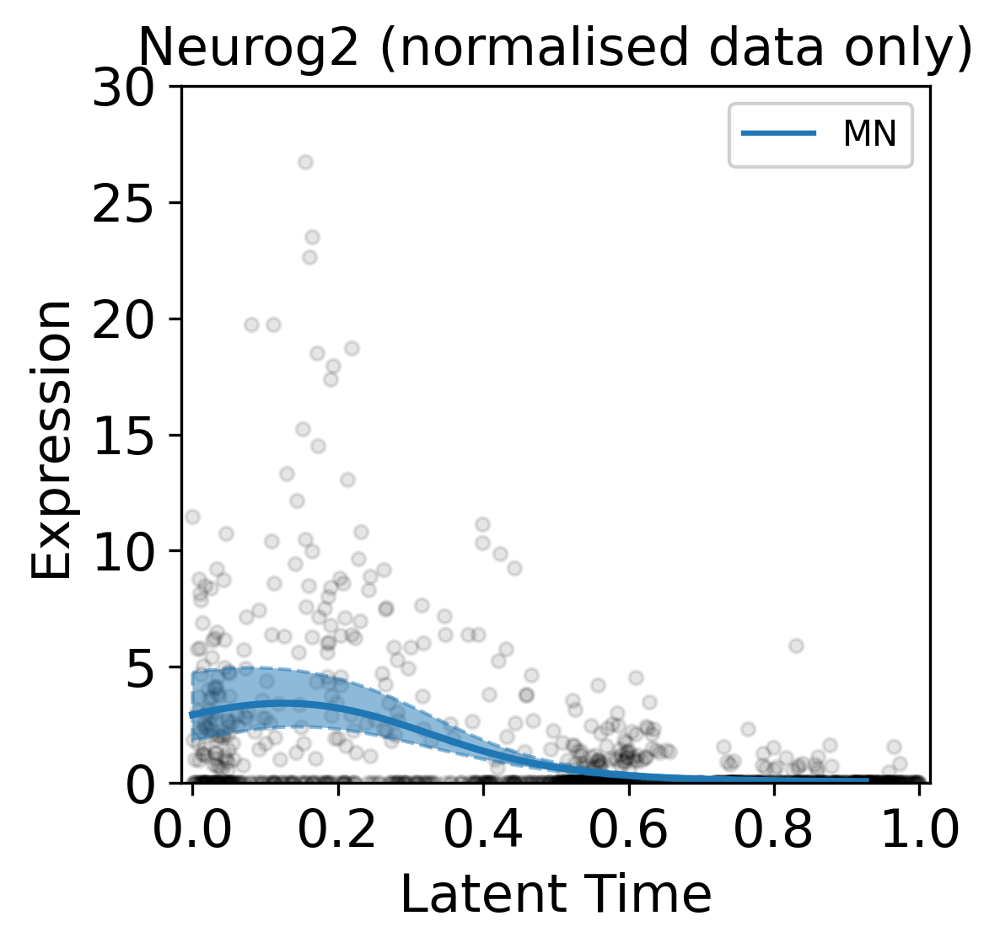

In [26]:
gene = 'Neurog2'

model = cr.models.GAM(adata, n_knots=6, spline_order=3)
fig = cr.pl.gene_trends(
    adata,
    model=model,
    lineages='MN',
    data_key="spliced",
    genes=[gene],
    same_plot=True,
    ncols=2,
    time_key="latent_time",
    hide_cells=False,
    weight_threshold=(1e-3, 1e-3),
    lineage_alpha=0.5,
    figsize=(4,4),
    cell_alpha=0.1,
    return_figure=True,
    dpi=dpi,
)
ax = fig.gca()
ax.set_title(f"{gene} (normalised data only)", fontsize=15)
ax.set_xlabel('Latent Time', fontsize=15)
ax.set_ylabel('Expression', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylim(0,30)
plt.savefig(f'1_{gene}_2.png', bbox_inches='tight')
plt.show()

  0%|          | 0/1 [00:00<?, ?gene/s]

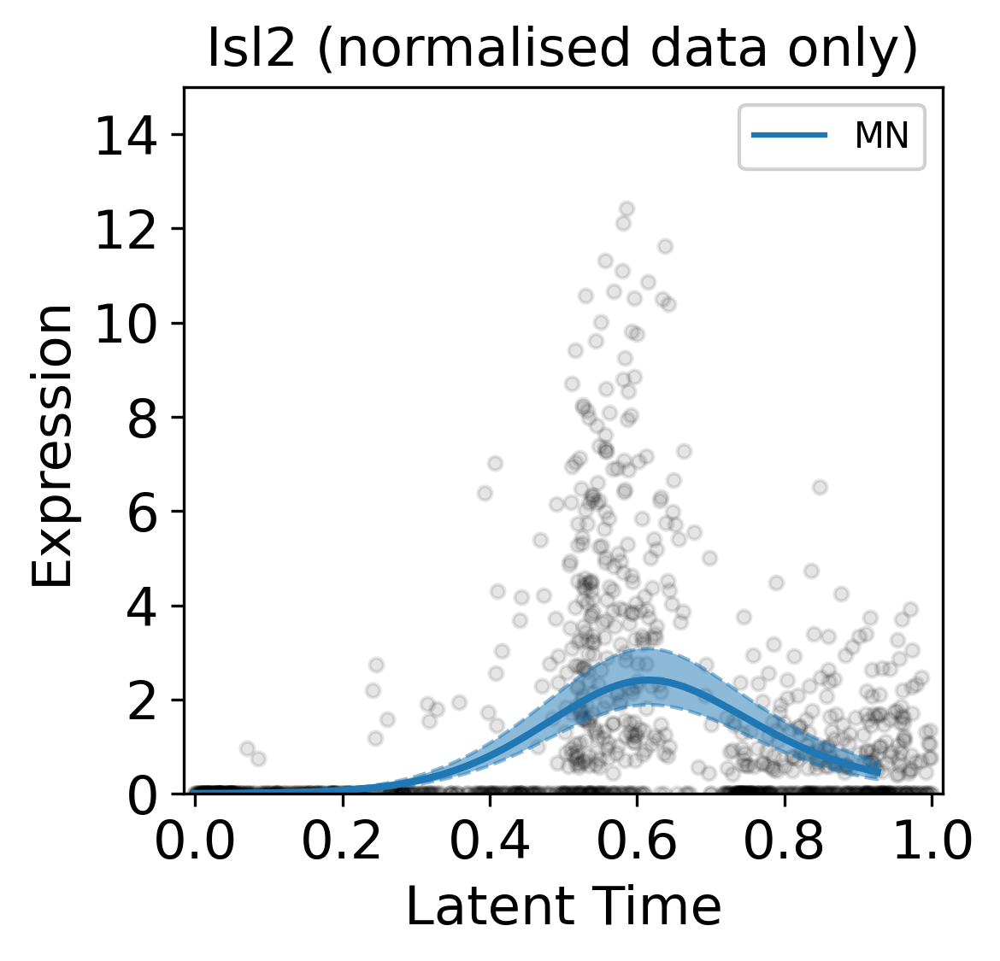

In [27]:
gene = 'Isl2'

model = cr.models.GAM(adata, n_knots=6, spline_order=3)
fig = cr.pl.gene_trends(
    adata,
    model=model,
    lineages='MN',
    data_key="spliced",
    genes=[gene],
    same_plot=True,
    ncols=2,
    time_key="latent_time",
    hide_cells=False,
    weight_threshold=(1e-3, 1e-3),
    lineage_alpha=0.5,
    cell_alpha=0.1,
    figsize=(4,4),
    return_figure=True,
    dpi=dpi,
)
ax = fig.gca()
ax.set_title(f"{gene} (normalised data only)", fontsize=15)
ax.set_xlabel('Latent Time', fontsize=15)
ax.set_ylabel('Expression', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylim(0,15)
plt.savefig(f'1_{gene}_2.png', bbox_inches='tight')
plt.show()

# Length Bias

In [8]:
import multiprocessing
import gget

def parallel_gene_processing(gene_list, sub_data):
    with multiprocessing.Pool(processes=4) as pool:
        results = list(pool.starmap(process_gene, [(gene, sub_data) for gene in gene_list]), total=len(gene_list))
    return results

def process_gene(gene, sub_data):
    try:
        results = gget.search([gene], 'mus_musculus')
        gene_ids = results[results.gene_name == gene].iloc[0].ensembl_id
        mrna_seq = gget.seq(gene_ids)[1]
        length = len(mrna_seq)

        uns = sub_data[:,gene].layers['unspliced'].sum()
        tot = sub_data[:,gene].layers['spliced'].sum() + sub_data[:,gene].layers['unspliced'].sum()
        up = float(np.nan_to_num(uns/tot))

        return length, up
    except Exception as e:
        print(f"Error processing {gene}: {e}")
        return None, None

In [201]:
sub = mdata.copy()
sc.pp.filter_genes(sub, min_cells=100)

In [221]:
gene_list = sub.var_names  # Assuming sub.var_names is a list of gene names
sub_data = sub.copy()
results = parallel_gene_processing(gene_list, sub_data)
lengths, unspcts = zip(*results)

Error processing Fam58b: single positional indexer is out-of-bounds
Error processing Sept10: single positional indexer is out-of-bounds
Error processing H2afy2: single positional indexer is out-of-bounds
Error processing Kif1bp: single positional indexer is out-of-bounds
Error processing Kdelc1: single positional indexer is out-of-bounds
Error processing Fam207a: single positional indexer is out-of-bounds
Error processing D10Jhu81e: single positional indexer is out-of-bounds
Error processing Fam126b: single positional indexer is out-of-bounds
Error processing Atp5g1: single positional indexer is out-of-bounds
Error processing 2010300F17Rik: single positional indexer is out-of-bounds
Error processing Gm26545: single positional indexer is out-of-bounds
Error processing March4: single positional indexer is out-of-bounds
Error processing Elmsan1: single positional indexer is out-of-bounds
Error processing 1190007I07Rik: single positional indexer is out-of-bounds
Error processing Gm12355: s

Error processing 2700081O15Rik: single positional indexer is out-of-bounds
Error processing Pla2g16: single positional indexer is out-of-bounds
Error processing Ints5-1: single positional indexer is out-of-bounds
Error processing 1810013L24Rik: single positional indexer is out-of-bounds
Error processing Mkl2: single positional indexer is out-of-bounds
Error processing 2900011O08Rik: single positional indexer is out-of-bounds
Error processing Tmem191c: single positional indexer is out-of-bounds
Error processing Tmem2: single positional indexer is out-of-bounds
Error processing 4930480K23Rik: single positional indexer is out-of-bounds
Error processing AC078895.1: single positional indexer is out-of-bounds
Error processing BC051142: single positional indexer is out-of-bounds
Error processing AC118542.1: single positional indexer is out-of-bounds
Error processing Gm9938: single positional indexer is out-of-bounds
Error processing 2700046G09Rik: single positional indexer is out-of-bounds
Er

Error processing 9030624J02Rik: single positional indexer is out-of-bounds
Error processing Tmem159: single positional indexer is out-of-bounds
Error processing 6030419C18Rik: single positional indexer is out-of-bounds
Error processing B930082K07Rik: single positional indexer is out-of-bounds
Error processing Gm26609: single positional indexer is out-of-bounds
Error processing Ddx39: single positional indexer is out-of-bounds
Error processing D430042O09Rik: single positional indexer is out-of-bounds
Error processing 4930432K21Rik: single positional indexer is out-of-bounds
Error processing Fam57b: single positional indexer is out-of-bounds
Error processing Fam96a: single positional indexer is out-of-bounds
Error processing Papd5: single positional indexer is out-of-bounds
Error processing Fam189a1: single positional indexer is out-of-bounds
Error processing Fam214a: single positional indexer is out-of-bounds
Error processing Ick: single positional indexer is out-of-bounds
Error process

100%|██████████| 12576/12576 [00:00<00:00, 2376980.18it/s]


In [223]:
# np.save('muslens.npy', np.array(lengths))
# np.save('musunps.npy', np.array(unspcts))

In [10]:
sub = hdata.copy()
sc.pp.filter_genes(sub, min_cells=100)

gene_list = sub.var_names  # Assuming sub.var_names is a list of gene names
sub_data = sub.copy()
results = parallel_gene_processing(gene_list, sub_data)
lengths, unspcts = zip(*results)

Tue Jan 30 15:40:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:40:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:40:25 2024 INFO Total matches found: 30.
Tue Jan 30 15:40:25 2024 INFO Query time: 41.88 seconds.


Error processing 1944: single positional indexer is out-of-bounds


Tue Jan 30 15:40:25 2024 INFO Total matches found: 36406.
Tue Jan 30 15:40:25 2024 INFO Query time: 47.81 seconds.


Error processing 6: single positional indexer is out-of-bounds


Tue Jan 30 15:40:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:40:51 2024 INFO Total matches found: 13.
Tue Jan 30 15:40:51 2024 INFO Query time: 62.26 seconds.


Error processing 3966: single positional indexer is out-of-bounds


Tue Jan 30 15:40:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:40:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:40:57 2024 INFO Total matches found: 32399.
Tue Jan 30 15:40:57 2024 INFO Query time: 31.59 seconds.


Error processing 8: single positional indexer is out-of-bounds


Tue Jan 30 15:40:57 2024 INFO Total matches found: 102.
Tue Jan 30 15:40:57 2024 INFO Query time: 61.99 seconds.


Error processing 6115: single positional indexer is out-of-bounds


Tue Jan 30 15:40:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:40:58 2024 INFO Total matches found: 21.
Tue Jan 30 15:40:58 2024 INFO Query time: 0.96 seconds.


Error processing 6116: single positional indexer is out-of-bounds


Tue Jan 30 15:40:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:40:59 2024 INFO Total matches found: 409.
Tue Jan 30 15:40:59 2024 INFO Query time: 1.05 seconds.


Error processing 6118: single positional indexer is out-of-bounds


Tue Jan 30 15:41:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:00 2024 INFO Total matches found: 15.
Tue Jan 30 15:41:00 2024 INFO Query time: 0.98 seconds.


Error processing 6122: single positional indexer is out-of-bounds


Tue Jan 30 15:41:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:01 2024 INFO Total matches found: 13.
Tue Jan 30 15:41:01 2024 INFO Query time: 0.88 seconds.


Error processing 6123: single positional indexer is out-of-bounds


Tue Jan 30 15:41:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:02 2024 INFO Total matches found: 19.
Tue Jan 30 15:41:02 2024 INFO Query time: 1.05 seconds.


Error processing 6124: single positional indexer is out-of-bounds


Tue Jan 30 15:41:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:03 2024 INFO Total matches found: 12.
Tue Jan 30 15:41:03 2024 INFO Query time: 0.94 seconds.


Error processing 6128: single positional indexer is out-of-bounds


Tue Jan 30 15:41:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:04 2024 INFO Total matches found: 9.
Tue Jan 30 15:41:04 2024 INFO Query time: 1.04 seconds.


Error processing 6129: single positional indexer is out-of-bounds


Tue Jan 30 15:41:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:05 2024 INFO Total matches found: 9.
Tue Jan 30 15:41:05 2024 INFO Query time: 0.9 seconds.


Error processing 6130: single positional indexer is out-of-bounds


Tue Jan 30 15:41:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:06 2024 INFO Total matches found: 14.
Tue Jan 30 15:41:06 2024 INFO Query time: 1.08 seconds.


Error processing 6135: single positional indexer is out-of-bounds


Tue Jan 30 15:41:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:07 2024 INFO Total matches found: 26.
Tue Jan 30 15:41:07 2024 INFO Query time: 42.18 seconds.


Error processing 1945: single positional indexer is out-of-bounds


Tue Jan 30 15:41:07 2024 INFO Total matches found: 20.
Tue Jan 30 15:41:07 2024 INFO Query time: 1.28 seconds.


Error processing 6137: single positional indexer is out-of-bounds


Tue Jan 30 15:41:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:09 2024 INFO Total matches found: 9.
Tue Jan 30 15:41:09 2024 INFO Query time: 1.37 seconds.


Error processing 6140: single positional indexer is out-of-bounds


Tue Jan 30 15:41:09 2024 INFO Total matches found: 28.
Tue Jan 30 15:41:09 2024 INFO Query time: 1.54 seconds.


Error processing 1950: single positional indexer is out-of-bounds


Tue Jan 30 15:41:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:10 2024 INFO Total matches found: 26.
Tue Jan 30 15:41:10 2024 INFO Query time: 0.98 seconds.


Error processing 1951: single positional indexer is out-of-bounds


Tue Jan 30 15:41:10 2024 INFO Total matches found: 9.
Tue Jan 30 15:41:10 2024 INFO Query time: 1.15 seconds.


Error processing 6141: single positional indexer is out-of-bounds


Tue Jan 30 15:41:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:11 2024 INFO Total matches found: 42.
Tue Jan 30 15:41:11 2024 INFO Query time: 1.43 seconds.


Error processing 1952: single positional indexer is out-of-bounds


Tue Jan 30 15:41:11 2024 INFO Total matches found: 6.
Tue Jan 30 15:41:11 2024 INFO Query time: 1.41 seconds.


Error processing 6148: single positional indexer is out-of-bounds


Tue Jan 30 15:41:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:13 2024 INFO Total matches found: 30.
Tue Jan 30 15:41:13 2024 INFO Query time: 1.58 seconds.


Error processing 1953: single positional indexer is out-of-bounds


Tue Jan 30 15:41:13 2024 INFO Total matches found: 8.
Tue Jan 30 15:41:13 2024 INFO Query time: 1.78 seconds.


Error processing 6149: single positional indexer is out-of-bounds


Tue Jan 30 15:41:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:14 2024 INFO Total matches found: 28.
Tue Jan 30 15:41:14 2024 INFO Query time: 1.0 seconds.


Error processing 1955: single positional indexer is out-of-bounds


Tue Jan 30 15:41:14 2024 INFO Total matches found: 9.
Tue Jan 30 15:41:14 2024 INFO Query time: 0.97 seconds.


Error processing 6150: single positional indexer is out-of-bounds


Tue Jan 30 15:41:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:15 2024 INFO Total matches found: 19.
Tue Jan 30 15:41:15 2024 INFO Query time: 1.18 seconds.


Error processing 1958: single positional indexer is out-of-bounds


Tue Jan 30 15:41:15 2024 INFO Total matches found: 15.
Tue Jan 30 15:41:15 2024 INFO Query time: 1.13 seconds.


Error processing 6152: single positional indexer is out-of-bounds


Tue Jan 30 15:41:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:16 2024 INFO Total matches found: 29.
Tue Jan 30 15:41:16 2024 INFO Query time: 1.24 seconds.


Error processing 1959: single positional indexer is out-of-bounds


Tue Jan 30 15:41:16 2024 INFO Total matches found: 9.
Tue Jan 30 15:41:16 2024 INFO Query time: 1.25 seconds.


Error processing 6154: single positional indexer is out-of-bounds


Tue Jan 30 15:41:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:18 2024 INFO Total matches found: 15.
Tue Jan 30 15:41:18 2024 INFO Query time: 1.52 seconds.


Error processing 1960: single positional indexer is out-of-bounds


Tue Jan 30 15:41:18 2024 INFO Total matches found: 8.
Tue Jan 30 15:41:18 2024 INFO Query time: 1.4 seconds.


Error processing 6167: single positional indexer is out-of-bounds


Tue Jan 30 15:41:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:19 2024 INFO Total matches found: 17.
Tue Jan 30 15:41:19 2024 INFO Query time: 1.37 seconds.


Error processing 1961: single positional indexer is out-of-bounds


Tue Jan 30 15:41:19 2024 INFO Total matches found: 12.
Tue Jan 30 15:41:19 2024 INFO Query time: 1.46 seconds.


Error processing 6168: single positional indexer is out-of-bounds


Tue Jan 30 15:41:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:21 2024 INFO Total matches found: 17.
Tue Jan 30 15:41:21 2024 INFO Query time: 1.32 seconds.


Error processing 1965: single positional indexer is out-of-bounds


Tue Jan 30 15:41:21 2024 INFO Total matches found: 15.
Tue Jan 30 15:41:21 2024 INFO Query time: 1.4 seconds.


Error processing 6169: single positional indexer is out-of-bounds


Tue Jan 30 15:41:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:22 2024 INFO Total matches found: 17.
Tue Jan 30 15:41:22 2024 INFO Query time: 1.37 seconds.


Error processing 1969: single positional indexer is out-of-bounds


Tue Jan 30 15:41:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:22 2024 INFO Total matches found: 9.
Tue Jan 30 15:41:22 2024 INFO Query time: 1.58 seconds.


Error processing 6170: single positional indexer is out-of-bounds


Tue Jan 30 15:41:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:23 2024 INFO Total matches found: 25.
Tue Jan 30 15:41:23 2024 INFO Query time: 1.23 seconds.


Error processing 1970: single positional indexer is out-of-bounds


Tue Jan 30 15:41:23 2024 INFO Total matches found: 9.
Tue Jan 30 15:41:23 2024 INFO Query time: 1.13 seconds.


Error processing 6171: single positional indexer is out-of-bounds


Tue Jan 30 15:41:24 2024 INFO Total matches found: 15.
Tue Jan 30 15:41:24 2024 INFO Query time: 32.59 seconds.


Error processing 3969: single positional indexer is out-of-bounds


Tue Jan 30 15:41:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:24 2024 INFO Total matches found: 19.
Tue Jan 30 15:41:24 2024 INFO Query time: 1.21 seconds.


Error processing 1971: single positional indexer is out-of-bounds


Tue Jan 30 15:41:25 2024 INFO Total matches found: 17.
Tue Jan 30 15:41:25 2024 INFO Query time: 1.13 seconds.


Error processing 6172: single positional indexer is out-of-bounds


Tue Jan 30 15:41:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:25 2024 INFO Total matches found: 22.
Tue Jan 30 15:41:25 2024 INFO Query time: 1.31 seconds.


Error processing 3975: single positional indexer is out-of-bounds


Tue Jan 30 15:41:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:26 2024 INFO Total matches found: 15.
Tue Jan 30 15:41:26 2024 INFO Query time: 1.27 seconds.


Error processing 1973: single positional indexer is out-of-bounds


Tue Jan 30 15:41:26 2024 INFO Total matches found: 18.
Tue Jan 30 15:41:26 2024 INFO Query time: 1.0 seconds.


Error processing 3977: single positional indexer is out-of-bounds

Tue Jan 30 15:41:26 2024 INFO Total matches found: 12.


Tue Jan 30 15:41:26 2024 INFO Query time: 1.41 seconds.


Error processing 6180: single positional indexer is out-of-bounds


Tue Jan 30 15:41:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:27 2024 INFO Total matches found: 17.
Tue Jan 30 15:41:27 2024 INFO Query time: 0.98 seconds.


Error processing 1974: single positional indexer is out-of-bounds


Tue Jan 30 15:41:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:27 2024 INFO Total matches found: 17.
Tue Jan 30 15:41:27 2024 INFO Query time: 1.39 seconds.


Error processing 3978: single positional indexer is out-of-bounds


Tue Jan 30 15:41:27 2024 INFO Total matches found: 15.
Tue Jan 30 15:41:27 2024 INFO Query time: 1.4 seconds.


Error processing 6181: single positional indexer is out-of-bounds


Tue Jan 30 15:41:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:28 2024 INFO Total matches found: 27.
Tue Jan 30 15:41:28 2024 INFO Query time: 1.19 seconds.


Error processing 1975: single positional indexer is out-of-bounds


Tue Jan 30 15:41:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:29 2024 INFO Total matches found: 14.
Tue Jan 30 15:41:29 2024 INFO Query time: 1.68 seconds.


Error processing 6182: single positional indexer is out-of-bounds


Tue Jan 30 15:41:29 2024 INFO Total matches found: 36718.
Tue Jan 30 15:41:29 2024 INFO Query time: 32.19 seconds.


Error processing 9: single positional indexer is out-of-bounds


Tue Jan 30 15:41:29 2024 INFO Total matches found: 14.
Tue Jan 30 15:41:29 2024 INFO Query time: 1.79 seconds.


Error processing 3979: single positional indexer is out-of-bounds


Tue Jan 30 15:41:29 2024 INFO Total matches found: 22.
Tue Jan 30 15:41:29 2024 INFO Query time: 1.43 seconds.


Error processing 1976: single positional indexer is out-of-bounds


Tue Jan 30 15:41:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:30 2024 INFO Total matches found: 14.
Tue Jan 30 15:41:30 2024 INFO Query time: 1.28 seconds.


Error processing 6183: single positional indexer is out-of-bounds


Tue Jan 30 15:41:30 2024 INFO Total matches found: 19.
Tue Jan 30 15:41:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:30 2024 INFO Query time: 1.25 seconds.


Error processing 3981: single positional indexer is out-of-bounds


Tue Jan 30 15:41:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:31 2024 INFO Total matches found: 5405.
Tue Jan 30 15:41:31 2024 INFO Query time: 1.69 seconds.


Error processing 11: single positional indexer is out-of-bounds


Tue Jan 30 15:41:31 2024 INFO Total matches found: 14.
Tue Jan 30 15:41:31 2024 INFO Query time: 1.67 seconds.


Error processing 1977: single positional indexer is out-of-bounds


Tue Jan 30 15:41:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:32 2024 INFO Total matches found: 15.
Tue Jan 30 15:41:32 2024 INFO Query time: 1.46 seconds.


Error processing 3984: single positional indexer is out-of-bounds


Tue Jan 30 15:41:32 2024 INFO Total matches found: 12.
Tue Jan 30 15:41:32 2024 INFO Query time: 1.72 seconds.


Error processing 6184: single positional indexer is out-of-bounds


Tue Jan 30 15:41:32 2024 INFO Total matches found: 17.
Tue Jan 30 15:41:32 2024 INFO Query time: 1.3 seconds.


Error processing 1978: single positional indexer is out-of-bounds


Tue Jan 30 15:41:32 2024 INFO Total matches found: 4871.
Tue Jan 30 15:41:32 2024 INFO Query time: 1.55 seconds.


Error processing 12: single positional indexer is out-of-bounds


Tue Jan 30 15:41:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:33 2024 INFO Total matches found: 13.
Tue Jan 30 15:41:33 2024 INFO Query time: 1.23 seconds.


Error processing 3987: single positional indexer is out-of-bounds


Tue Jan 30 15:41:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:33 2024 INFO Total matches found: 12.
Tue Jan 30 15:41:33 2024 INFO Query time: 1.14 seconds.


Error processing 6185: single positional indexer is out-of-bounds


Tue Jan 30 15:41:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:34 2024 INFO Total matches found: 20.
Tue Jan 30 15:41:34 2024 INFO Query time: 1.32 seconds.


Error processing 1979: single positional indexer is out-of-bounds


Tue Jan 30 15:41:34 2024 INFO Total matches found: 3978.
Tue Jan 30 15:41:34 2024 INFO Query time: 1.29 seconds.


Error processing 16: single positional indexer is out-of-bounds


Tue Jan 30 15:41:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:35 2024 INFO Total matches found: 15.
Tue Jan 30 15:41:35 2024 INFO Query time: 1.55 seconds.


Error processing 3990: single positional indexer is out-of-bounds


Tue Jan 30 15:41:35 2024 INFO Total matches found: 4136.
Tue Jan 30 15:41:35 2024 INFO Query time: 1.18 seconds.


Error processing 20: single positional indexer is out-of-bounds


Tue Jan 30 15:41:35 2024 INFO Total matches found: 16.
Tue Jan 30 15:41:35 2024 INFO Query time: 1.75 seconds.


Error processing 6186: single positional indexer is out-of-bounds


Tue Jan 30 15:41:35 2024 INFO Total matches found: 20.
Tue Jan 30 15:41:35 2024 INFO Query time: 1.45 seconds.


Error processing 1980: single positional indexer is out-of-bounds


Tue Jan 30 15:41:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:36 2024 INFO Total matches found: 12.
Tue Jan 30 15:41:36 2024 INFO Query time: 1.29 seconds.


Error processing 3991: single positional indexer is out-of-bounds


Tue Jan 30 15:41:36 2024 INFO Total matches found: 13.
Tue Jan 30 15:41:36 2024 INFO Query time: 1.16 seconds.


Error processing 6189: single positional indexer is out-of-bounds


Tue Jan 30 15:41:36 2024 INFO Total matches found: 6251.
Tue Jan 30 15:41:36 2024 INFO Query time: 1.41 seconds.


Error processing 21: single positional indexer is out-of-bounds


Tue Jan 30 15:41:36 2024 INFO Total matches found: 18.
Tue Jan 30 15:41:36 2024 INFO Query time: 1.3 seconds.


Error processing 1982: single positional indexer is out-of-bounds


Tue Jan 30 15:41:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:37 2024 INFO Total matches found: 11.
Tue Jan 30 15:41:37 2024 INFO Query time: 1.34 seconds.


Error processing 3994: single positional indexer is out-of-bounds


Tue Jan 30 15:41:37 2024 INFO Total matches found: 4509.
Tue Jan 30 15:41:37 2024 INFO Query time: 1.15 seconds.


Error processing 23: single positional indexer is out-of-bounds


Tue Jan 30 15:41:38 2024 INFO Total matches found: 15.
Tue Jan 30 15:41:38 2024 INFO Query time: 1.17 seconds.


Error processing 1985: single positional indexer is out-of-bounds


Tue Jan 30 15:41:38 2024 INFO Total matches found: 71.
Tue Jan 30 15:41:38 2024 INFO Query time: 1.56 seconds.


Error processing 6193: single positional indexer is out-of-bounds


Tue Jan 30 15:41:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:39 2024 INFO Total matches found: 12.
Tue Jan 30 15:41:39 2024 INFO Query time: 1.7 seconds.


Error processing 3995: single positional indexer is out-of-bounds


Tue Jan 30 15:41:39 2024 INFO Total matches found: 5601.
Tue Jan 30 15:41:39 2024 INFO Query time: 1.75 seconds.


Error processing 24: single positional indexer is out-of-bounds


Tue Jan 30 15:41:39 2024 INFO Total matches found: 51.
Tue Jan 30 15:41:39 2024 INFO Query time: 1.54 seconds.


Error processing 6194: single positional indexer is out-of-bounds


Tue Jan 30 15:41:39 2024 INFO Total matches found: 16.
Tue Jan 30 15:41:39 2024 INFO Query time: 1.73 seconds.


Error processing 1988: single positional indexer is out-of-bounds


Tue Jan 30 15:41:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:41 2024 INFO Total matches found: 14.
Tue Jan 30 15:41:41 2024 INFO Query time: 1.52 seconds.


Error processing 3996: single positional indexer is out-of-bounds


Tue Jan 30 15:41:41 2024 INFO Total matches found: 3774.
Tue Jan 30 15:41:41 2024 INFO Query time: 1.57 seconds.


Error processing 25: single positional indexer is out-of-bounds


Tue Jan 30 15:41:41 2024 INFO Total matches found: 9.
Tue Jan 30 15:41:41 2024 INFO Query time: 1.53 seconds.


Error processing 6196: single positional indexer is out-of-bounds


Tue Jan 30 15:41:41 2024 INFO Total matches found: 16.
Tue Jan 30 15:41:41 2024 INFO Query time: 1.52 seconds.


Error processing 1989: single positional indexer is out-of-bounds


Tue Jan 30 15:41:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:42 2024 INFO Total matches found: 5052.
Tue Jan 30 15:41:42 2024 INFO Query time: 1.66 seconds.


Error processing 26: single positional indexer is out-of-bounds


Tue Jan 30 15:41:42 2024 INFO Total matches found: 19.
Tue Jan 30 15:41:42 2024 INFO Total matches found: 15.
Tue Jan 30 15:41:42 2024 INFO Query time: 1.59 seconds.
Tue Jan 30 15:41:42 2024 INFO Query time: 1.9 seconds.


Error processing 1990: single positional indexer is out-of-bounds
Error processing 3997: single positional indexer is out-of-bounds


Tue Jan 30 15:41:43 2024 INFO Total matches found: 13.
Tue Jan 30 15:41:43 2024 INFO Query time: 1.73 seconds.


Error processing 6197: single positional indexer is out-of-bounds


Tue Jan 30 15:41:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:44 2024 INFO Total matches found: 5.
Tue Jan 30 15:41:44 2024 INFO Query time: 1.02 seconds.


Error processing 4001: single positional indexer is out-of-bounds


Tue Jan 30 15:41:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:44 2024 INFO Total matches found: 11.
Tue Jan 30 15:41:44 2024 INFO Query time: 0.98 seconds.


Error processing 6198: single positional indexer is out-of-bounds


Tue Jan 30 15:41:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:44 2024 INFO Total matches found: 3507.
Tue Jan 30 15:41:44 2024 INFO Query time: 1.5 seconds.


Error processing 27: single positional indexer is out-of-bounds


Tue Jan 30 15:41:44 2024 INFO Total matches found: 13.
Tue Jan 30 15:41:44 2024 INFO Query time: 1.51 seconds.


Error processing 1991: single positional indexer is out-of-bounds


Tue Jan 30 15:41:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:45 2024 INFO Total matches found: 11.
Tue Jan 30 15:41:45 2024 INFO Query time: 1.28 seconds.


Error processing 6199: single positional indexer is out-of-bounds


Tue Jan 30 15:41:45 2024 INFO Total matches found: 12.
Tue Jan 30 15:41:45 2024 INFO Query time: 1.46 seconds.


Error processing 4003: single positional indexer is out-of-bounds


Tue Jan 30 15:41:45 2024 INFO Total matches found: 3879.
Tue Jan 30 15:41:45 2024 INFO Query time: 1.13 seconds.


Error processing 28: single positional indexer is out-of-bounds


Tue Jan 30 15:41:45 2024 INFO Total matches found: 19.
Tue Jan 30 15:41:45 2024 INFO Query time: 1.15 seconds.


Error processing 1992: single positional indexer is out-of-bounds


Tue Jan 30 15:41:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:46 2024 INFO Total matches found: 13.
Tue Jan 30 15:41:46 2024 INFO Query time: 1.36 seconds.


Error processing 6200: single positional indexer is out-of-bounds


Tue Jan 30 15:41:46 2024 INFO Total matches found: 12.
Tue Jan 30 15:41:46 2024 INFO Query time: 1.46 seconds.


Error processing 4005: single positional indexer is out-of-bounds


Tue Jan 30 15:41:47 2024 INFO Total matches found: 3887.
Tue Jan 30 15:41:47 2024 INFO Query time: 1.42 seconds.


Error processing 29: single positional indexer is out-of-bounds


Tue Jan 30 15:41:47 2024 INFO Total matches found: 14.
Tue Jan 30 15:41:47 2024 INFO Query time: 1.41 seconds.


Error processing 1993: single positional indexer is out-of-bounds


Tue Jan 30 15:41:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:48 2024 INFO Total matches found: 9.
Tue Jan 30 15:41:48 2024 INFO Query time: 1.34 seconds.


Error processing 6203: single positional indexer is out-of-bounds


Tue Jan 30 15:41:48 2024 INFO Total matches found: 13.
Tue Jan 30 15:41:48 2024 INFO Query time: 1.12 seconds.


Error processing 1997: single positional indexer is out-of-bounds


Tue Jan 30 15:41:48 2024 INFO Total matches found: 8.
Tue Jan 30 15:41:48 2024 INFO Query time: 1.46 seconds.


Error processing 4006: single positional indexer is out-of-bounds


Tue Jan 30 15:41:48 2024 INFO Total matches found: 7101.
Tue Jan 30 15:41:48 2024 INFO Query time: 1.45 seconds.


Error processing 30: single positional indexer is out-of-bounds


Tue Jan 30 15:41:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:49 2024 INFO Total matches found: 11.
Tue Jan 30 15:41:49 2024 INFO Query time: 1.49 seconds.


Error processing 6204: single positional indexer is out-of-bounds


Tue Jan 30 15:41:49 2024 INFO Total matches found: 11.
Tue Jan 30 15:41:49 2024 INFO Query time: 1.38 seconds.


Error processing 1998: single positional indexer is out-of-bounds


Tue Jan 30 15:41:49 2024 INFO Total matches found: 4008.
Tue Jan 30 15:41:49 2024 INFO Query time: 1.2 seconds.


Error processing 31: single positional indexer is out-of-bounds


Tue Jan 30 15:41:49 2024 INFO Total matches found: 9.
Tue Jan 30 15:41:49 2024 INFO Query time: 1.41 seconds.


Error processing 4008: single positional indexer is out-of-bounds


Tue Jan 30 15:41:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:50 2024 INFO Total matches found: 16.
Tue Jan 30 15:41:50 2024 INFO Query time: 1.09 seconds.


Error processing 1999: single positional indexer is out-of-bounds


Tue Jan 30 15:41:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:50 2024 INFO Total matches found: 7.
Tue Jan 30 15:41:50 2024 INFO Query time: 1.04 seconds.


Error processing 4009: single positional indexer is out-of-bounds


Tue Jan 30 15:41:50 2024 INFO Total matches found: 14.
Tue Jan 30 15:41:50 2024 INFO Query time: 1.44 seconds.


Error processing 6211: single positional indexer is out-of-bounds


Tue Jan 30 15:41:51 2024 INFO Total matches found: 3273.
Tue Jan 30 15:41:51 2024 INFO Query time: 1.48 seconds.


Error processing 32: single positional indexer is out-of-bounds


Tue Jan 30 15:41:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:51 2024 INFO Total matches found: 28.
Tue Jan 30 15:41:51 2024 INFO Query time: 0.98 seconds.


Error processing 2000: single positional indexer is out-of-bounds


Tue Jan 30 15:41:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:52 2024 INFO Total matches found: 7.
Tue Jan 30 15:41:52 2024 INFO Query time: 1.25 seconds.


Error processing 4010: single positional indexer is out-of-bounds


Tue Jan 30 15:41:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:52 2024 INFO Total matches found: 22.
Tue Jan 30 15:41:52 2024 INFO Query time: 1.62 seconds.


Error processing 6213: single positional indexer is out-of-bounds


Tue Jan 30 15:41:52 2024 INFO Total matches found: 4728.
Tue Jan 30 15:41:52 2024 INFO Query time: 1.48 seconds.


Error processing 33: single positional indexer is out-of-bounds


Tue Jan 30 15:41:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:52 2024 INFO Total matches found: 18.
Tue Jan 30 15:41:52 2024 INFO Query time: 1.3 seconds.


Error processing 2001: single positional indexer is out-of-bounds


Tue Jan 30 15:41:53 2024 INFO Total matches found: 15.
Tue Jan 30 15:41:53 2024 INFO Query time: 0.97 seconds.


Error processing 4011: single positional indexer is out-of-bounds


Tue Jan 30 15:41:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:53 2024 INFO Total matches found: 66.
Tue Jan 30 15:41:53 2024 INFO Query time: 1.31 seconds.


Error processing 6214: single positional indexer is out-of-bounds


Tue Jan 30 15:41:54 2024 INFO Total matches found: 20.
Tue Jan 30 15:41:54 2024 INFO Query time: 1.13 seconds.


Error processing 2003: single positional indexer is out-of-bounds


Tue Jan 30 15:41:54 2024 INFO Total matches found: 20.
Tue Jan 30 15:41:54 2024 INFO Query time: 1.24 seconds.


Error processing 4012: single positional indexer is out-of-bounds


Tue Jan 30 15:41:54 2024 INFO Total matches found: 4420.
Tue Jan 30 15:41:54 2024 INFO Query time: 1.73 seconds.


Error processing 34: single positional indexer is out-of-bounds


Tue Jan 30 15:41:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:55 2024 INFO Total matches found: 216.
Tue Jan 30 15:41:55 2024 INFO Query time: 1.39 seconds.


Error processing 6215: single positional indexer is out-of-bounds


Tue Jan 30 15:41:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:55 2024 INFO Total matches found: 3799.
Tue Jan 30 15:41:55 2024 INFO Query time: 1.16 seconds.


Error processing 35: single positional indexer is out-of-bounds


Tue Jan 30 15:41:55 2024 INFO Total matches found: 16.
Tue Jan 30 15:41:55 2024 INFO Query time: 1.65 seconds.


Error processing 2005: single positional indexer is out-of-bounds


Tue Jan 30 15:41:55 2024 INFO Total matches found: 17.
Tue Jan 30 15:41:55 2024 INFO Query time: 1.61 seconds.


Error processing 4013: single positional indexer is out-of-bounds


Tue Jan 30 15:41:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:57 2024 INFO Total matches found: 18.
Tue Jan 30 15:41:57 2024 INFO Query time: 1.82 seconds.


Error processing 6218: single positional indexer is out-of-bounds


Tue Jan 30 15:41:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:57 2024 INFO Total matches found: 10434.
Tue Jan 30 15:41:57 2024 INFO Query time: 2.19 seconds.


Error processing 36: single positional indexer is out-of-bounds


Tue Jan 30 15:41:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:58 2024 INFO Total matches found: 18.
Tue Jan 30 15:41:58 2024 INFO Query time: 2.51 seconds.


Error processing 2007: single positional indexer is out-of-bounds


Tue Jan 30 15:41:58 2024 INFO Total matches found: 13.
Tue Jan 30 15:41:58 2024 INFO Query time: 2.42 seconds.


Error processing 4014: single positional indexer is out-of-bounds


Tue Jan 30 15:41:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:41:59 2024 INFO Total matches found: 22.
Tue Jan 30 15:41:59 2024 INFO Query time: 2.66 seconds.


Error processing 6219: single positional indexer is out-of-bounds


Tue Jan 30 15:42:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:00 2024 INFO Total matches found: 7488.
Tue Jan 30 15:42:00 2024 INFO Query time: 3.11 seconds.


Error processing 37: single positional indexer is out-of-bounds


Tue Jan 30 15:42:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:01 2024 INFO Total matches found: 14.
Tue Jan 30 15:42:01 2024 INFO Total matches found: 15.
Tue Jan 30 15:42:01 2024 INFO Query time: 3.26 seconds.
Tue Jan 30 15:42:01 2024 INFO Query time: 3.16 seconds.


Error processing 2008: single positional indexer is out-of-bounds
Error processing 4015: single positional indexer is out-of-bounds


Tue Jan 30 15:42:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:02 2024 INFO Total matches found: 33.
Tue Jan 30 15:42:02 2024 INFO Query time: 2.33 seconds.


Error processing 6220: single positional indexer is out-of-bounds


Tue Jan 30 15:42:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:02 2024 INFO Total matches found: 5083.
Tue Jan 30 15:42:02 2024 INFO Query time: 1.69 seconds.


Error processing 38: single positional indexer is out-of-bounds


Tue Jan 30 15:42:02 2024 INFO Total matches found: 5.
Tue Jan 30 15:42:02 2024 INFO Query time: 1.27 seconds.


Error processing 4016: single positional indexer is out-of-bounds


Tue Jan 30 15:42:03 2024 INFO Total matches found: 46.
Tue Jan 30 15:42:03 2024 INFO Query time: 1.48 seconds.


Error processing 2010: single positional indexer is out-of-bounds


Tue Jan 30 15:42:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:03 2024 INFO Total matches found: 29.
Tue Jan 30 15:42:03 2024 INFO Query time: 1.18 seconds.


Error processing 6222: single positional indexer is out-of-bounds


Tue Jan 30 15:42:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:04 2024 INFO Total matches found: 3223.
Tue Jan 30 15:42:04 2024 INFO Query time: 1.41 seconds.


Error processing 39: single positional indexer is out-of-bounds


Tue Jan 30 15:42:04 2024 INFO Total matches found: 8.
Tue Jan 30 15:42:04 2024 INFO Query time: 1.33 seconds.


Error processing 4017: single positional indexer is out-of-bounds


Tue Jan 30 15:42:04 2024 INFO Total matches found: 16.
Tue Jan 30 15:42:04 2024 INFO Query time: 1.26 seconds.


Error processing 2011: single positional indexer is out-of-bounds


Tue Jan 30 15:42:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:04 2024 INFO Total matches found: 17.
Tue Jan 30 15:42:04 2024 INFO Query time: 1.27 seconds.


Error processing 6224: single positional indexer is out-of-bounds


Tue Jan 30 15:42:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:05 2024 INFO Total matches found: 9.
Tue Jan 30 15:42:05 2024 INFO Query time: 1.04 seconds.


Error processing 4019: single positional indexer is out-of-bounds


Tue Jan 30 15:42:05 2024 INFO Total matches found: 3146.
Tue Jan 30 15:42:05 2024 INFO Query time: 1.13 seconds.


Error processing 40: single positional indexer is out-of-bounds


Tue Jan 30 15:42:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:05 2024 INFO Total matches found: 13.
Tue Jan 30 15:42:05 2024 INFO Query time: 1.2 seconds.


Error processing 2012: single positional indexer is out-of-bounds


Tue Jan 30 15:42:05 2024 INFO Total matches found: 12.
Tue Jan 30 15:42:05 2024 INFO Query time: 0.99 seconds.


Error processing 6226: single positional indexer is out-of-bounds


Tue Jan 30 15:42:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:06 2024 INFO Total matches found: 7.
Tue Jan 30 15:42:06 2024 INFO Query time: 1.33 seconds.


Error processing 4020: single positional indexer is out-of-bounds


Tue Jan 30 15:42:06 2024 INFO Total matches found: 3512.
Tue Jan 30 15:42:06 2024 INFO Query time: 1.55 seconds.


Error processing 41: single positional indexer is out-of-bounds


Tue Jan 30 15:42:06 2024 INFO Total matches found: 23.
Tue Jan 30 15:42:06 2024 INFO Query time: 1.32 seconds.


Error processing 2013: single positional indexer is out-of-bounds


Tue Jan 30 15:42:07 2024 INFO Total matches found: 20.
Tue Jan 30 15:42:07 2024 INFO Query time: 1.32 seconds.


Error processing 6233: single positional indexer is out-of-bounds


Tue Jan 30 15:42:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:07 2024 INFO Total matches found: 4325.
Tue Jan 30 15:42:07 2024 INFO Query time: 1.0 seconds.


Error processing 42: single positional indexer is out-of-bounds


Tue Jan 30 15:42:08 2024 INFO Total matches found: 20.
Tue Jan 30 15:42:08 2024 INFO Query time: 1.16 seconds.


Error processing 6239: single positional indexer is out-of-bounds


Tue Jan 30 15:42:08 2024 INFO Total matches found: 7.
Tue Jan 30 15:42:08 2024 INFO Query time: 1.64 seconds.


Error processing 4021: single positional indexer is out-of-bounds


Tue Jan 30 15:42:08 2024 INFO Total matches found: 26.
Tue Jan 30 15:42:08 2024 INFO Query time: 1.47 seconds.


Error processing 2014: single positional indexer is out-of-bounds


Tue Jan 30 15:42:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:08 2024 INFO Total matches found: 5731.
Tue Jan 30 15:42:08 2024 INFO Query time: 0.93 seconds.


Error processing 43: single positional indexer is out-of-bounds


Tue Jan 30 15:42:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:09 2024 INFO Total matches found: 11.
Tue Jan 30 15:42:09 2024 INFO Query time: 0.95 seconds.


Error processing 4022: single positional indexer is out-of-bounds


Tue Jan 30 15:42:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:09 2024 INFO Total matches found: 11.
Tue Jan 30 15:42:09 2024 INFO Query time: 1.44 seconds.


Error processing 2015: single positional indexer is out-of-bounds


Tue Jan 30 15:42:10 2024 INFO Total matches found: 5136.
Tue Jan 30 15:42:10 2024 INFO Query time: 1.26 seconds.


Error processing 48: single positional indexer is out-of-bounds


Tue Jan 30 15:42:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:10 2024 INFO Total matches found: 24.
Tue Jan 30 15:42:10 2024 INFO Query time: 2.37 seconds.
Tue Jan 30 15:42:10 2024 INFO Total matches found: 7.
Tue Jan 30 15:42:10 2024 INFO Query time: 1.35 seconds.


Error processing 4024: single positional indexer is out-of-bounds
Error processing 6240: single positional indexer is out-of-bounds


Tue Jan 30 15:42:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:11 2024 INFO Total matches found: 6125.
Tue Jan 30 15:42:11 2024 INFO Query time: 1.27 seconds.


Error processing 49: single positional indexer is out-of-bounds


Tue Jan 30 15:42:11 2024 INFO Total matches found: 33.
Tue Jan 30 15:42:11 2024 INFO Query time: 1.58 seconds.


Error processing 2016: single positional indexer is out-of-bounds


Tue Jan 30 15:42:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:11 2024 INFO Total matches found: 7.
Tue Jan 30 15:42:11 2024 INFO Query time: 1.06 seconds.


Error processing 4025: single positional indexer is out-of-bounds


Tue Jan 30 15:42:11 2024 INFO Total matches found: 27.
Tue Jan 30 15:42:11 2024 INFO Query time: 1.29 seconds.


Error processing 6241: single positional indexer is out-of-bounds


Tue Jan 30 15:42:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:12 2024 INFO Total matches found: 5903.
Tue Jan 30 15:42:12 2024 INFO Query time: 1.42 seconds.


Error processing 50: single positional indexer is out-of-bounds


Tue Jan 30 15:42:13 2024 INFO Total matches found: 23.
Tue Jan 30 15:42:13 2024 INFO Query time: 1.66 seconds.


Error processing 2017: single positional indexer is out-of-bounds


Tue Jan 30 15:42:13 2024 INFO Total matches found: 8.
Tue Jan 30 15:42:13 2024 INFO Query time: 1.47 seconds.


Error processing 4026: single positional indexer is out-of-bounds


Tue Jan 30 15:42:13 2024 INFO Total matches found: 25.
Tue Jan 30 15:42:13 2024 INFO Query time: 1.36 seconds.


Error processing 6242: single positional indexer is out-of-bounds


Tue Jan 30 15:42:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:13 2024 INFO Total matches found: 4448.
Tue Jan 30 15:42:13 2024 INFO Query time: 1.18 seconds.


Error processing 51: single positional indexer is out-of-bounds

Tue Jan 30 15:42:13 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 15:42:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:14 2024 INFO Total matches found: 10.
Tue Jan 30 15:42:14 2024 INFO Query time: 1.01 seconds.


Error processing 4027: single positional indexer is out-of-bounds


Tue Jan 30 15:42:14 2024 INFO Total matches found: 22.
Tue Jan 30 15:42:14 2024 INFO Query time: 1.35 seconds.


Error processing 2020: single positional indexer is out-of-bounds


Tue Jan 30 15:42:14 2024 INFO Total matches found: 24.
Tue Jan 30 15:42:14 2024 INFO Query time: 1.31 seconds.


Error processing 6244: single positional indexer is out-of-bounds


Tue Jan 30 15:42:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:15 2024 INFO Total matches found: 6764.
Tue Jan 30 15:42:15 2024 INFO Query time: 1.08 seconds.


Error processing 54: single positional indexer is out-of-bounds


Tue Jan 30 15:42:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:15 2024 INFO Total matches found: 13.
Tue Jan 30 15:42:15 2024 INFO Query time: 1.35 seconds.


Error processing 4029: single positional indexer is out-of-bounds


Tue Jan 30 15:42:15 2024 INFO Total matches found: 11.
Tue Jan 30 15:42:15 2024 INFO Query time: 1.17 seconds.


Error processing 2021: single positional indexer is out-of-bounds


Tue Jan 30 15:42:15 2024 INFO Total matches found: 17.
Tue Jan 30 15:42:15 2024 INFO Query time: 1.13 seconds.


Error processing 6247: single positional indexer is out-of-bounds


Tue Jan 30 15:42:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:16 2024 INFO Total matches found: 7709.
Tue Jan 30 15:42:16 2024 INFO Query time: 1.44 seconds.


Error processing 55: single positional indexer is out-of-bounds


Tue Jan 30 15:42:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:16 2024 INFO Total matches found: 10.
Tue Jan 30 15:42:16 2024 INFO Query time: 1.14 seconds.


Error processing 4033: single positional indexer is out-of-bounds


Tue Jan 30 15:42:16 2024 INFO Total matches found: 20.
Tue Jan 30 15:42:16 2024 INFO Query time: 1.15 seconds.


Error processing 2022: single positional indexer is out-of-bounds


Tue Jan 30 15:42:16 2024 INFO Total matches found: 9.
Tue Jan 30 15:42:16 2024 INFO Query time: 1.24 seconds.


Error processing 6248: single positional indexer is out-of-bounds


Tue Jan 30 15:42:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:17 2024 INFO Total matches found: 5429.
Tue Jan 30 15:42:17 2024 INFO Query time: 1.0 seconds.


Error processing 57: single positional indexer is out-of-bounds


Tue Jan 30 15:42:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:17 2024 INFO Total matches found: 13.
Tue Jan 30 15:42:17 2024 INFO Query time: 1.28 seconds.


Error processing 4035: single positional indexer is out-of-bounds


Tue Jan 30 15:42:18 2024 INFO Total matches found: 30.
Tue Jan 30 15:42:18 2024 INFO Query time: 1.39 seconds.


Error processing 2023: single positional indexer is out-of-bounds


Tue Jan 30 15:42:18 2024 INFO Total matches found: 17.
Tue Jan 30 15:42:18 2024 INFO Query time: 1.24 seconds.


Error processing 6250: single positional indexer is out-of-bounds


Tue Jan 30 15:42:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:18 2024 INFO Total matches found: 4766.
Tue Jan 30 15:42:18 2024 INFO Query time: 1.14 seconds.


Error processing 65: single positional indexer is out-of-bounds


Tue Jan 30 15:42:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:19 2024 INFO Total matches found: 20.
Tue Jan 30 15:42:19 2024 INFO Query time: 1.02 seconds.


Error processing 2024: single positional indexer is out-of-bounds


Tue Jan 30 15:42:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:19 2024 INFO Total matches found: 15.
Tue Jan 30 15:42:19 2024 INFO Query time: 1.46 seconds.


Error processing 4037: single positional indexer is out-of-bounds


Tue Jan 30 15:42:19 2024 INFO Total matches found: 2740.
Tue Jan 30 15:42:19 2024 INFO Query time: 1.02 seconds.


Error processing 67: single positional indexer is out-of-bounds


Tue Jan 30 15:42:19 2024 INFO Total matches found: 12.
Tue Jan 30 15:42:19 2024 INFO Query time: 1.53 seconds.


Error processing 6251: single positional indexer is out-of-bounds


Tue Jan 30 15:42:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:20 2024 INFO Total matches found: 9.
Tue Jan 30 15:42:20 2024 INFO Query time: 1.61 seconds.


Error processing 4038: single positional indexer is out-of-bounds


Tue Jan 30 15:42:21 2024 INFO Total matches found: 12.
Tue Jan 30 15:42:21 2024 INFO Query time: 1.88 seconds.


Error processing 2025: single positional indexer is out-of-bounds

Tue Jan 30 15:42:21 2024 INFO Total matches found: 14.


Tue Jan 30 15:42:21 2024 INFO Query time: 1.32 seconds.


Error processing 6252: single positional indexer is out-of-bounds


Tue Jan 30 15:42:21 2024 INFO Total matches found: 4711.
Tue Jan 30 15:42:21 2024 INFO Query time: 1.48 seconds.


Error processing 70: single positional indexer is out-of-bounds


Tue Jan 30 15:42:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:22 2024 INFO Total matches found: 15.
Tue Jan 30 15:42:22 2024 INFO Query time: 0.99 seconds.


Error processing 2026: single positional indexer is out-of-bounds


Tue Jan 30 15:42:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:22 2024 INFO Total matches found: 2861.
Tue Jan 30 15:42:22 2024 INFO Query time: 1.01 seconds.


Error processing 71: single positional indexer is out-of-bounds


Tue Jan 30 15:42:22 2024 INFO Total matches found: 8.
Tue Jan 30 15:42:22 2024 INFO Query time: 1.45 seconds.


Error processing 6253: single positional indexer is out-of-bounds


Tue Jan 30 15:42:22 2024 INFO Total matches found: 11.
Tue Jan 30 15:42:22 2024 INFO Query time: 1.53 seconds.


Error processing 4039: single positional indexer is out-of-bounds


Tue Jan 30 15:42:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:23 2024 INFO Total matches found: 11.
Tue Jan 30 15:42:23 2024 INFO Query time: 1.17 seconds.


Error processing 4041: single positional indexer is out-of-bounds


Tue Jan 30 15:42:23 2024 INFO Total matches found: 19.
Tue Jan 30 15:42:23 2024 INFO Query time: 1.71 seconds.


Error processing 2027: single positional indexer is out-of-bounds


Tue Jan 30 15:42:23 2024 INFO Total matches found: 2708.
Tue Jan 30 15:42:23 2024 INFO Query time: 1.69 seconds.


Error processing 72: single positional indexer is out-of-bounds


Tue Jan 30 15:42:23 2024 INFO Total matches found: 16.
Tue Jan 30 15:42:23 2024 INFO Query time: 1.42 seconds.


Error processing 6257: single positional indexer is out-of-bounds


Tue Jan 30 15:42:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:24 2024 INFO Total matches found: 12.
Tue Jan 30 15:42:24 2024 INFO Query time: 1.25 seconds.


Error processing 2029: single positional indexer is out-of-bounds


Tue Jan 30 15:42:25 2024 INFO Total matches found: 3367.
Tue Jan 30 15:42:25 2024 INFO Query time: 1.19 seconds.


Error processing 83: single positional indexer is out-of-bounds


Tue Jan 30 15:42:25 2024 INFO Total matches found: 15.
Tue Jan 30 15:42:25 2024 INFO Query time: 1.51 seconds.


Error processing 6258: single positional indexer is out-of-bounds


Tue Jan 30 15:42:25 2024 INFO Total matches found: 9.
Tue Jan 30 15:42:25 2024 INFO Query time: 1.73 seconds.


Error processing 4044: single positional indexer is out-of-bounds


Tue Jan 30 15:42:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:26 2024 INFO Total matches found: 5023.
Tue Jan 30 15:42:26 2024 INFO Query time: 1.11 seconds.


Error processing 84: single positional indexer is out-of-bounds


Tue Jan 30 15:42:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:26 2024 INFO Total matches found: 13.
Tue Jan 30 15:42:26 2024 INFO Query time: 1.34 seconds.


Error processing 2030: single positional indexer is out-of-bounds


Tue Jan 30 15:42:26 2024 INFO Total matches found: 10.
Tue Jan 30 15:42:26 2024 INFO Query time: 1.28 seconds.


Error processing 4045: single positional indexer is out-of-bounds


Tue Jan 30 15:42:26 2024 INFO Total matches found: 21.
Tue Jan 30 15:42:26 2024 INFO Query time: 1.32 seconds.


Error processing 6259: single positional indexer is out-of-bounds


Tue Jan 30 15:42:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:27 2024 INFO Total matches found: 3613.
Tue Jan 30 15:42:27 2024 INFO Query time: 1.26 seconds.


Error processing 85: single positional indexer is out-of-bounds


Tue Jan 30 15:42:27 2024 INFO Total matches found: 13.
Tue Jan 30 15:42:27 2024 INFO Query time: 1.26 seconds.


Error processing 2031: single positional indexer is out-of-bounds


Tue Jan 30 15:42:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:28 2024 INFO Total matches found: 9.
Tue Jan 30 15:42:28 2024 INFO Query time: 1.38 seconds.


Error processing 4049: single positional indexer is out-of-bounds


Tue Jan 30 15:42:28 2024 INFO Total matches found: 19.
Tue Jan 30 15:42:28 2024 INFO Query time: 1.37 seconds.


Error processing 6261: single positional indexer is out-of-bounds


Tue Jan 30 15:42:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:28 2024 INFO Total matches found: 2767.
Tue Jan 30 15:42:28 2024 INFO Query time: 1.04 seconds.


Error processing 87: single positional indexer is out-of-bounds


Tue Jan 30 15:42:28 2024 INFO Total matches found: 16.
Tue Jan 30 15:42:28 2024 INFO Query time: 1.06 seconds.


Error processing 2032: single positional indexer is out-of-bounds


Tue Jan 30 15:42:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:29 2024 INFO Total matches found: 17.
Tue Jan 30 15:42:29 2024 INFO Query time: 1.25 seconds.


Error processing 6262: single positional indexer is out-of-bounds


Tue Jan 30 15:42:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:29 2024 INFO Total matches found: 10.
Tue Jan 30 15:42:29 2024 INFO Query time: 1.37 seconds.


Error processing 4052: single positional indexer is out-of-bounds


Tue Jan 30 15:42:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:29 2024 INFO Total matches found: 3174.
Tue Jan 30 15:42:29 2024 INFO Query time: 1.35 seconds.


Error processing 88: single positional indexer is out-of-bounds


Tue Jan 30 15:42:29 2024 INFO Total matches found: 13.
Tue Jan 30 15:42:29 2024 INFO Query time: 1.3 seconds.


Error processing 2033: single positional indexer is out-of-bounds


Tue Jan 30 15:42:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:30 2024 INFO Total matches found: 10.
Tue Jan 30 15:42:30 2024 INFO Query time: 1.12 seconds.


Error processing 4053: single positional indexer is out-of-bounds


Tue Jan 30 15:42:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:30 2024 INFO Total matches found: 19.
Tue Jan 30 15:42:30 2024 INFO Query time: 1.26 seconds.


Error processing 6263: single positional indexer is out-of-bounds


Tue Jan 30 15:42:31 2024 INFO Total matches found: 3275.
Tue Jan 30 15:42:31 2024 INFO Query time: 1.2 seconds.


Error processing 89: single positional indexer is out-of-bounds


Tue Jan 30 15:42:31 2024 INFO Total matches found: 17.
Tue Jan 30 15:42:31 2024 INFO Query time: 1.13 seconds.


Error processing 2034: single positional indexer is out-of-bounds


Tue Jan 30 15:42:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:31 2024 INFO Total matches found: 9.
Tue Jan 30 15:42:31 2024 INFO Query time: 1.33 seconds.


Error processing 4054: single positional indexer is out-of-bounds


Tue Jan 30 15:42:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:32 2024 INFO Total matches found: 19.
Tue Jan 30 15:42:32 2024 INFO Query time: 1.71 seconds.


Error processing 6264: single positional indexer is out-of-bounds


Tue Jan 30 15:42:32 2024 INFO Total matches found: 6436.
Tue Jan 30 15:42:32 2024 INFO Query time: 1.31 seconds.


Error processing 92: single positional indexer is out-of-bounds


Tue Jan 30 15:42:32 2024 INFO Total matches found: 19.
Tue Jan 30 15:42:32 2024 INFO Query time: 1.55 seconds.


Error processing 2035: single positional indexer is out-of-bounds


Tue Jan 30 15:42:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:33 2024 INFO Total matches found: 8.
Tue Jan 30 15:42:33 2024 INFO Query time: 1.2 seconds.


Error processing 4055: single positional indexer is out-of-bounds


Tue Jan 30 15:42:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:33 2024 INFO Total matches found: 4416.
Tue Jan 30 15:42:33 2024 INFO Query time: 1.14 seconds.


Error processing 93: single positional indexer is out-of-bounds


Tue Jan 30 15:42:33 2024 INFO Total matches found: 29.
Tue Jan 30 15:42:33 2024 INFO Query time: 1.25 seconds.


Error processing 6277: single positional indexer is out-of-bounds


Tue Jan 30 15:42:33 2024 INFO Total matches found: 19.
Tue Jan 30 15:42:33 2024 INFO Query time: 1.15 seconds.


Error processing 2039: single positional indexer is out-of-bounds


Tue Jan 30 15:42:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:34 2024 INFO Total matches found: 10.
Tue Jan 30 15:42:34 2024 INFO Query time: 1.34 seconds.


Error processing 4059: single positional indexer is out-of-bounds


Tue Jan 30 15:42:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:34 2024 INFO Total matches found: 18.
Tue Jan 30 15:42:34 2024 INFO Query time: 1.01 seconds.


Error processing 6282: single positional indexer is out-of-bounds


Tue Jan 30 15:42:34 2024 INFO Total matches found: 3074.
Tue Jan 30 15:42:34 2024 INFO Query time: 1.36 seconds.


Error processing 94: single positional indexer is out-of-bounds


Tue Jan 30 15:42:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:35 2024 INFO Total matches found: 23.
Tue Jan 30 15:42:35 2024 INFO Query time: 1.24 seconds.


Error processing 2040: single positional indexer is out-of-bounds


Tue Jan 30 15:42:35 2024 INFO Total matches found: 10.
Tue Jan 30 15:42:35 2024 INFO Query time: 0.95 seconds.


Error processing 4060: single positional indexer is out-of-bounds


Tue Jan 30 15:42:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:36 2024 INFO Total matches found: 20.
Tue Jan 30 15:42:36 2024 INFO Query time: 1.55 seconds.


Error processing 6283: single positional indexer is out-of-bounds


Tue Jan 30 15:42:36 2024 INFO Total matches found: 3568.
Tue Jan 30 15:42:36 2024 INFO Query time: 1.39 seconds.


Error processing 95: single positional indexer is out-of-bounds


Tue Jan 30 15:42:36 2024 INFO Total matches found: 14.
Tue Jan 30 15:42:36 2024 INFO Query time: 1.54 seconds.


Error processing 2041: single positional indexer is out-of-bounds


Tue Jan 30 15:42:36 2024 INFO Total matches found: 10.
Tue Jan 30 15:42:36 2024 INFO Query time: 1.2 seconds.


Error processing 4061: single positional indexer is out-of-bounds


Tue Jan 30 15:42:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:37 2024 INFO Total matches found: 16.
Tue Jan 30 15:42:37 2024 INFO Query time: 1.06 seconds.


Error processing 6286: single positional indexer is out-of-bounds


Tue Jan 30 15:42:37 2024 INFO Total matches found: 3805.
Tue Jan 30 15:42:37 2024 INFO Query time: 1.0 seconds.


Error processing 96: single positional indexer is out-of-bounds


Tue Jan 30 15:42:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:37 2024 INFO Total matches found: 26.
Tue Jan 30 15:42:37 2024 INFO Query time: 1.23 seconds.


Error processing 2042: single positional indexer is out-of-bounds


Tue Jan 30 15:42:38 2024 INFO Total matches found: 13.
Tue Jan 30 15:42:38 2024 INFO Query time: 1.38 seconds.


Error processing 4062: single positional indexer is out-of-bounds


Tue Jan 30 15:42:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:38 2024 INFO Total matches found: 713.
Tue Jan 30 15:42:38 2024 INFO Query time: 1.27 seconds.


Error processing 104: single positional indexer is out-of-bounds


Tue Jan 30 15:42:38 2024 INFO Total matches found: 15.
Tue Jan 30 15:42:38 2024 INFO Query time: 1.43 seconds.


Error processing 6292: single positional indexer is out-of-bounds


Tue Jan 30 15:42:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:39 2024 INFO Total matches found: 13.
Tue Jan 30 15:42:39 2024 INFO Query time: 1.11 seconds.


Error processing 4063: single positional indexer is out-of-bounds


Tue Jan 30 15:42:39 2024 INFO Total matches found: 22.
Tue Jan 30 15:42:39 2024 INFO Query time: 1.37 seconds.


Error processing 2043: single positional indexer is out-of-bounds


Tue Jan 30 15:42:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:39 2024 INFO Total matches found: 790.
Tue Jan 30 15:42:39 2024 INFO Query time: 0.98 seconds.


Error processing 107: single positional indexer is out-of-bounds


Tue Jan 30 15:42:39 2024 INFO Total matches found: 23.
Tue Jan 30 15:42:39 2024 INFO Query time: 0.96 seconds.


Error processing 6295: single positional indexer is out-of-bounds


Tue Jan 30 15:42:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:40 2024 INFO Total matches found: 17.
Tue Jan 30 15:42:40 2024 INFO Query time: 1.1 seconds.


Error processing 2049: single positional indexer is out-of-bounds


Tue Jan 30 15:42:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:40 2024 INFO Total matches found: 14.
Tue Jan 30 15:42:40 2024 INFO Query time: 1.45 seconds.


Error processing 4065: single positional indexer is out-of-bounds


Tue Jan 30 15:42:40 2024 INFO Total matches found: 549.
Tue Jan 30 15:42:40 2024 INFO Total matches found: 21.
Tue Jan 30 15:42:40 2024 INFO Query time: 1.37 seconds.
Tue Jan 30 15:42:40 2024 INFO Query time: 1.27 seconds.


Error processing 108: single positional indexer is out-of-bounds
Error processing 6297: single positional indexer is out-of-bounds


Tue Jan 30 15:42:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:41 2024 INFO Total matches found: 22.
Tue Jan 30 15:42:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:41 2024 INFO Query time: 1.34 seconds.


Error processing 2054: single positional indexer is out-of-bounds


Tue Jan 30 15:42:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:42 2024 INFO Total matches found: 501.
Tue Jan 30 15:42:42 2024 INFO Query time: 1.15 seconds.


Error processing 110: single positional indexer is out-of-bounds


Tue Jan 30 15:42:42 2024 INFO Total matches found: 15.
Tue Jan 30 15:42:42 2024 INFO Query time: 1.5 seconds.


Error processing 4066: single positional indexer is out-of-bounds


Tue Jan 30 15:42:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:42 2024 INFO Total matches found: 28.
Tue Jan 30 15:42:42 2024 INFO Query time: 1.41 seconds.


Error processing 6298: single positional indexer is out-of-bounds


Tue Jan 30 15:42:42 2024 INFO Total matches found: 18.
Tue Jan 30 15:42:42 2024 INFO Query time: 0.98 seconds.


Error processing 2056: single positional indexer is out-of-bounds


Tue Jan 30 15:42:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:43 2024 INFO Total matches found: 448.
Tue Jan 30 15:42:43 2024 INFO Query time: 0.96 seconds.


Error processing 112: single positional indexer is out-of-bounds


Tue Jan 30 15:42:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:43 2024 INFO Total matches found: 85.
Tue Jan 30 15:42:43 2024 INFO Query time: 1.02 seconds.


Error processing 6300: single positional indexer is out-of-bounds


Tue Jan 30 15:42:43 2024 INFO Total matches found: 13.
Tue Jan 30 15:42:43 2024 INFO Query time: 1.45 seconds.


Error processing 4067: single positional indexer is out-of-bounds


Tue Jan 30 15:42:43 2024 INFO Total matches found: 25.
Tue Jan 30 15:42:43 2024 INFO Query time: 1.11 seconds.


Error processing 2064: single positional indexer is out-of-bounds


Tue Jan 30 15:42:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:44 2024 INFO Total matches found: 395.
Tue Jan 30 15:42:44 2024 INFO Query time: 1.18 seconds.


Error processing 115: single positional indexer is out-of-bounds


Tue Jan 30 15:42:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:44 2024 INFO Total matches found: 6.
Tue Jan 30 15:42:44 2024 INFO Query time: 1.0 seconds.


Error processing 4074: single positional indexer is out-of-bounds


Tue Jan 30 15:42:44 2024 INFO Total matches found: 16.
Tue Jan 30 15:42:44 2024 INFO Query time: 1.39 seconds.


Error processing 6311: single positional indexer is out-of-bounds


Tue Jan 30 15:42:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:45 2024 INFO Total matches found: 715.
Tue Jan 30 15:42:45 2024 INFO Query time: 1.08 seconds.


Error processing 118: single positional indexer is out-of-bounds


Tue Jan 30 15:42:45 2024 INFO Total matches found: 22.
Tue Jan 30 15:42:45 2024 INFO Query time: 1.58 seconds.


Error processing 2067: single positional indexer is out-of-bounds


Tue Jan 30 15:42:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:45 2024 INFO Total matches found: 8.
Tue Jan 30 15:42:45 2024 INFO Query time: 1.02 seconds.


Error processing 4080: single positional indexer is out-of-bounds


Tue Jan 30 15:42:45 2024 INFO Total matches found: 17.
Tue Jan 30 15:42:45 2024 INFO Query time: 1.14 seconds.


Error processing 6312: single positional indexer is out-of-bounds


Tue Jan 30 15:42:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:46 2024 INFO Total matches found: 19.
Tue Jan 30 15:42:46 2024 INFO Query time: 1.18 seconds.


Error processing 2069: single positional indexer is out-of-bounds


Tue Jan 30 15:42:46 2024 INFO Total matches found: 389.
Tue Jan 30 15:42:46 2024 INFO Query time: 1.27 seconds.


Error processing 121: single positional indexer is out-of-bounds


Tue Jan 30 15:42:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:47 2024 INFO Total matches found: 8.
Tue Jan 30 15:42:47 2024 INFO Query time: 1.68 seconds.


Error processing 4081: single positional indexer is out-of-bounds


Tue Jan 30 15:42:47 2024 INFO Total matches found: 16.
Tue Jan 30 15:42:47 2024 INFO Query time: 1.43 seconds.


Error processing 6313: single positional indexer is out-of-bounds


Tue Jan 30 15:42:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:47 2024 INFO Total matches found: 315.
Tue Jan 30 15:42:47 2024 INFO Query time: 1.23 seconds.


Error processing 122: single positional indexer is out-of-bounds


Tue Jan 30 15:42:48 2024 INFO Total matches found: 25.
Tue Jan 30 15:42:48 2024 INFO Query time: 1.48 seconds.


Error processing 2073: single positional indexer is out-of-bounds


Tue Jan 30 15:42:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:48 2024 INFO Total matches found: 9.
Tue Jan 30 15:42:48 2024 INFO Query time: 0.97 seconds.


Error processing 4083: single positional indexer is out-of-bounds


Tue Jan 30 15:42:48 2024 INFO Total matches found: 19.
Tue Jan 30 15:42:48 2024 INFO Query time: 1.03 seconds.


Error processing 6315: single positional indexer is out-of-bounds


Tue Jan 30 15:42:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:49 2024 INFO Total matches found: 16.
Tue Jan 30 15:42:49 2024 INFO Query time: 0.97 seconds.


Error processing 2078: single positional indexer is out-of-bounds


Tue Jan 30 15:42:49 2024 INFO Total matches found: 315.
Tue Jan 30 15:42:49 2024 INFO Query time: 1.25 seconds.


Error processing 123: single positional indexer is out-of-bounds


Tue Jan 30 15:42:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:49 2024 INFO Total matches found: 8.
Tue Jan 30 15:42:49 2024 INFO Query time: 1.29 seconds.


Error processing 4087: single positional indexer is out-of-bounds


Tue Jan 30 15:42:49 2024 INFO Total matches found: 16.
Tue Jan 30 15:42:49 2024 INFO Query time: 1.29 seconds.


Error processing 6319: single positional indexer is out-of-bounds


Tue Jan 30 15:42:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:50 2024 INFO Total matches found: 333.
Tue Jan 30 15:42:50 2024 INFO Query time: 1.11 seconds.


Error processing 124: single positional indexer is out-of-bounds


Tue Jan 30 15:42:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:50 2024 INFO Total matches found: 23.
Tue Jan 30 15:42:50 2024 INFO Query time: 1.61 seconds.


Error processing 2079: single positional indexer is out-of-bounds


Tue Jan 30 15:42:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:50 2024 INFO Total matches found: 17.
Tue Jan 30 15:42:50 2024 INFO Query time: 1.2 seconds.


Error processing 6322: single positional indexer is out-of-bounds


Tue Jan 30 15:42:50 2024 INFO Total matches found: 8.
Tue Jan 30 15:42:50 2024 INFO Query time: 1.39 seconds.


Error processing 4089: single positional indexer is out-of-bounds


Tue Jan 30 15:42:51 2024 INFO Total matches found: 289.
Tue Jan 30 15:42:51 2024 INFO Query time: 0.94 seconds.


Error processing 125: single positional indexer is out-of-bounds


Tue Jan 30 15:42:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:51 2024 INFO Total matches found: 23.
Tue Jan 30 15:42:51 2024 INFO Query time: 0.98 seconds.


Error processing 2081: single positional indexer is out-of-bounds


Tue Jan 30 15:42:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:52 2024 INFO Total matches found: 12.
Tue Jan 30 15:42:52 2024 INFO Query time: 1.2 seconds.


Error processing 4090: single positional indexer is out-of-bounds


Tue Jan 30 15:42:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:52 2024 INFO Total matches found: 17.
Tue Jan 30 15:42:52 2024 INFO Query time: 1.76 seconds.


Error processing 6328: single positional indexer is out-of-bounds


Tue Jan 30 15:42:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:52 2024 INFO Total matches found: 23.
Tue Jan 30 15:42:52 2024 INFO Query time: 1.21 seconds.


Error processing 2083: single positional indexer is out-of-bounds


Tue Jan 30 15:42:52 2024 INFO Total matches found: 459.
Tue Jan 30 15:42:52 2024 INFO Query time: 1.72 seconds.


Error processing 127: single positional indexer is out-of-bounds


Tue Jan 30 15:42:53 2024 INFO Total matches found: 14.
Tue Jan 30 15:42:53 2024 INFO Query time: 0.98 seconds.


Error processing 4091: single positional indexer is out-of-bounds


Tue Jan 30 15:42:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:54 2024 INFO Total matches found: 20.
Tue Jan 30 15:42:54 2024 INFO Query time: 1.31 seconds.


Error processing 6332: single positional indexer is out-of-bounds


Tue Jan 30 15:42:54 2024 INFO Total matches found: 21.
Tue Jan 30 15:42:54 2024 INFO Query time: 1.57 seconds.


Error processing 2084: single positional indexer is out-of-bounds


Tue Jan 30 15:42:54 2024 INFO Total matches found: 332.
Tue Jan 30 15:42:54 2024 INFO Query time: 1.48 seconds.


Error processing 128: single positional indexer is out-of-bounds


Tue Jan 30 15:42:54 2024 INFO Total matches found: 10.
Tue Jan 30 15:42:54 2024 INFO Query time: 1.28 seconds.


Error processing 4094: single positional indexer is out-of-bounds


Tue Jan 30 15:42:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:54 2024 INFO Total matches found: 23.
Tue Jan 30 15:42:55 2024 INFO Query time: 0.99 seconds.


Error processing 6335: single positional indexer is out-of-bounds


Tue Jan 30 15:42:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:55 2024 INFO Total matches found: 27.
Tue Jan 30 15:42:55 2024 INFO Query time: 1.13 seconds.


Error processing 2085: single positional indexer is out-of-bounds


Tue Jan 30 15:42:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:55 2024 INFO Total matches found: 446.
Tue Jan 30 15:42:55 2024 INFO Query time: 1.37 seconds.


Error processing 131: single positional indexer is out-of-bounds


Tue Jan 30 15:42:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:55 2024 INFO Total matches found: 14.
Tue Jan 30 15:42:55 2024 INFO Query time: 1.52 seconds.


Error processing 4095: single positional indexer is out-of-bounds


Tue Jan 30 15:42:56 2024 INFO Total matches found: 15.
Tue Jan 30 15:42:56 2024 INFO Query time: 1.37 seconds.


Error processing 6338: single positional indexer is out-of-bounds


Tue Jan 30 15:42:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:57 2024 INFO Total matches found: 13.
Tue Jan 30 15:42:57 2024 INFO Query time: 1.3 seconds.


Error processing 4096: single positional indexer is out-of-bounds


Tue Jan 30 15:42:57 2024 INFO Total matches found: 422.
Tue Jan 30 15:42:57 2024 INFO Query time: 1.58 seconds.


Error processing 132: single positional indexer is out-of-bounds


Tue Jan 30 15:42:57 2024 INFO Total matches found: 23.
Tue Jan 30 15:42:57 2024 INFO Query time: 1.96 seconds.


Error processing 2087: single positional indexer is out-of-bounds


Tue Jan 30 15:42:57 2024 INFO Total matches found: 20.
Tue Jan 30 15:42:57 2024 INFO Query time: 1.25 seconds.


Error processing 6347: single positional indexer is out-of-bounds


Tue Jan 30 15:42:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:58 2024 INFO Total matches found: 858.
Tue Jan 30 15:42:58 2024 INFO Query time: 1.47 seconds.


Error processing 133: single positional indexer is out-of-bounds


Tue Jan 30 15:42:58 2024 INFO Total matches found: 15.
Tue Jan 30 15:42:58 2024 INFO Query time: 1.67 seconds.


Error processing 4099: single positional indexer is out-of-bounds


Tue Jan 30 15:42:59 2024 INFO Total matches found: 20.
Tue Jan 30 15:42:59 2024 INFO Query time: 1.42 seconds.


Error processing 6349: single positional indexer is out-of-bounds


Tue Jan 30 15:42:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:42:59 2024 INFO Total matches found: 25.
Tue Jan 30 15:42:59 2024 INFO Query time: 2.35 seconds.


Error processing 2090: single positional indexer is out-of-bounds


Tue Jan 30 15:42:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:00 2024 INFO Total matches found: 20.
Tue Jan 30 15:43:00 2024 INFO Query time: 1.19 seconds.


Error processing 4100: single positional indexer is out-of-bounds


Tue Jan 30 15:43:00 2024 INFO Total matches found: 821.
Tue Jan 30 15:43:00 2024 INFO Query time: 1.4 seconds.


Error processing 135: single positional indexer is out-of-bounds


Tue Jan 30 15:43:00 2024 INFO Total matches found: 18.
Tue Jan 30 15:43:00 2024 INFO Query time: 1.31 seconds.


Error processing 6350: single positional indexer is out-of-bounds


Tue Jan 30 15:43:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:01 2024 INFO Total matches found: 21.
Tue Jan 30 15:43:01 2024 INFO Query time: 1.29 seconds.


Error processing 2092: single positional indexer is out-of-bounds


Tue Jan 30 15:43:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:01 2024 INFO Total matches found: 403.
Tue Jan 30 15:43:01 2024 INFO Query time: 1.04 seconds.


Error processing 136: single positional indexer is out-of-bounds


Tue Jan 30 15:43:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:01 2024 INFO Total matches found: 16.
Tue Jan 30 15:43:01 2024 INFO Query time: 1.49 seconds.


Error processing 4103: single positional indexer is out-of-bounds


Tue Jan 30 15:43:01 2024 INFO Total matches found: 15.
Tue Jan 30 15:43:01 2024 INFO Query time: 1.6 seconds.


Error processing 6352: single positional indexer is out-of-bounds


Tue Jan 30 15:43:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:02 2024 INFO Total matches found: 25.
Tue Jan 30 15:43:02 2024 INFO Query time: 1.28 seconds.


Error processing 2099: single positional indexer is out-of-bounds


Tue Jan 30 15:43:02 2024 INFO Total matches found: 386.
Tue Jan 30 15:43:02 2024 INFO Query time: 1.35 seconds.


Error processing 138: single positional indexer is out-of-bounds


Tue Jan 30 15:43:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:02 2024 INFO Total matches found: 8.
Tue Jan 30 15:43:02 2024 INFO Query time: 1.19 seconds.


Error processing 4105: single positional indexer is out-of-bounds


Tue Jan 30 15:43:03 2024 INFO Total matches found: 17.
Tue Jan 30 15:43:03 2024 INFO Query time: 1.16 seconds.


Error processing 6353: single positional indexer is out-of-bounds


Tue Jan 30 15:43:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:04 2024 INFO Total matches found: 386.
Tue Jan 30 15:43:04 2024 INFO Query time: 1.37 seconds.


Error processing 139: single positional indexer is out-of-bounds


Tue Jan 30 15:43:04 2024 INFO Total matches found: 15.
Tue Jan 30 15:43:04 2024 INFO Query time: 1.36 seconds.


Error processing 4110: single positional indexer is out-of-bounds


Tue Jan 30 15:43:04 2024 INFO Total matches found: 26.
Tue Jan 30 15:43:04 2024 INFO Query time: 1.88 seconds.


Error processing 2100: single positional indexer is out-of-bounds


Tue Jan 30 15:43:04 2024 INFO Total matches found: 19.
Tue Jan 30 15:43:04 2024 INFO Query time: 1.34 seconds.


Error processing 6356: single positional indexer is out-of-bounds


Tue Jan 30 15:43:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:05 2024 INFO Total matches found: 25.
Tue Jan 30 15:43:05 2024 INFO Query time: 1.15 seconds.


Error processing 2102: single positional indexer is out-of-bounds


Tue Jan 30 15:43:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:05 2024 INFO Total matches found: 9.
Tue Jan 30 15:43:05 2024 INFO Query time: 1.66 seconds.


Error processing 4112: single positional indexer is out-of-bounds


Tue Jan 30 15:43:05 2024 INFO Total matches found: 414.
Tue Jan 30 15:43:05 2024 INFO Query time: 1.87 seconds.


Error processing 140: single positional indexer is out-of-bounds


Tue Jan 30 15:43:06 2024 INFO Total matches found: 16.
Tue Jan 30 15:43:06 2024 INFO Query time: 1.54 seconds.


Error processing 6358: single positional indexer is out-of-bounds


Tue Jan 30 15:43:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:06 2024 INFO Total matches found: 28.
Tue Jan 30 15:43:06 2024 INFO Query time: 1.03 seconds.


Error processing 2103: single positional indexer is out-of-bounds


Tue Jan 30 15:43:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:07 2024 INFO Total matches found: 519.
Tue Jan 30 15:43:07 2024 INFO Query time: 1.14 seconds.


Error processing 141: single positional indexer is out-of-bounds


Tue Jan 30 15:43:07 2024 INFO Total matches found: 12.
Tue Jan 30 15:43:07 2024 INFO Query time: 1.33 seconds.


Error processing 4113: single positional indexer is out-of-bounds


Tue Jan 30 15:43:07 2024 INFO Total matches found: 17.
Tue Jan 30 15:43:07 2024 INFO Query time: 1.25 seconds.


Error processing 6359: single positional indexer is out-of-bounds


Tue Jan 30 15:43:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:07 2024 INFO Total matches found: 31.
Tue Jan 30 15:43:07 2024 INFO Query time: 1.18 seconds.


Error processing 2109: single positional indexer is out-of-bounds


Tue Jan 30 15:43:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:08 2024 INFO Total matches found: 462.
Tue Jan 30 15:43:08 2024 INFO Query time: 1.42 seconds.


Error processing 142: single positional indexer is out-of-bounds


Tue Jan 30 15:43:08 2024 INFO Total matches found: 15.
Tue Jan 30 15:43:08 2024 INFO Query time: 1.64 seconds.


Error processing 6360: single positional indexer is out-of-bounds


Tue Jan 30 15:43:09 2024 INFO Total matches found: 15.
Tue Jan 30 15:43:09 2024 INFO Query time: 1.85 seconds.


Error processing 4114: single positional indexer is out-of-bounds


Tue Jan 30 15:43:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:09 2024 INFO Total matches found: 22.
Tue Jan 30 15:43:09 2024 INFO Query time: 1.42 seconds.


Error processing 2116: single positional indexer is out-of-bounds


Tue Jan 30 15:43:09 2024 INFO Total matches found: 400.
Tue Jan 30 15:43:09 2024 INFO Query time: 0.95 seconds.


Error processing 143: single positional indexer is out-of-bounds


Tue Jan 30 15:43:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:09 2024 INFO Total matches found: 17.
Tue Jan 30 15:43:09 2024 INFO Query time: 0.93 seconds.


Error processing 4115: single positional indexer is out-of-bounds


Tue Jan 30 15:43:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:10 2024 INFO Total matches found: 17.
Tue Jan 30 15:43:10 2024 INFO Query time: 1.34 seconds.


Error processing 6361: single positional indexer is out-of-bounds


Tue Jan 30 15:43:10 2024 INFO Total matches found: 243.
Tue Jan 30 15:43:10 2024 INFO Query time: 0.97 seconds.


Error processing 169: single positional indexer is out-of-bounds


Tue Jan 30 15:43:10 2024 INFO Total matches found: 17.
Tue Jan 30 15:43:10 2024 INFO Query time: 1.46 seconds.


Error processing 2122: single positional indexer is out-of-bounds


Tue Jan 30 15:43:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:11 2024 INFO Total matches found: 21.
Tue Jan 30 15:43:11 2024 INFO Query time: 1.61 seconds.


Error processing 4117: single positional indexer is out-of-bounds


Tue Jan 30 15:43:11 2024 INFO Total matches found: 18.
Tue Jan 30 15:43:11 2024 INFO Query time: 1.58 seconds.


Error processing 6362: single positional indexer is out-of-bounds


Tue Jan 30 15:43:11 2024 INFO Total matches found: 21.
Tue Jan 30 15:43:11 2024 INFO Query time: 1.31 seconds.


Error processing 2131: single positional indexer is out-of-bounds


Tue Jan 30 15:43:11 2024 INFO Total matches found: 299.
Tue Jan 30 15:43:11 2024 INFO Query time: 1.51 seconds.


Error processing 171: single positional indexer is out-of-bounds


Tue Jan 30 15:43:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:13 2024 INFO Total matches found: 23.
Tue Jan 30 15:43:13 2024 INFO Query time: 1.39 seconds.


Error processing 4120: single positional indexer is out-of-bounds


Tue Jan 30 15:43:13 2024 INFO Total matches found: 275.
Tue Jan 30 15:43:13 2024 INFO Query time: 1.18 seconds.


Error processing 172: single positional indexer is out-of-bounds


Tue Jan 30 15:43:13 2024 INFO Total matches found: 12.
Tue Jan 30 15:43:13 2024 INFO Query time: 1.3 seconds.


Error processing 2132: single positional indexer is out-of-bounds


Tue Jan 30 15:43:13 2024 INFO Total matches found: 19.
Tue Jan 30 15:43:13 2024 INFO Query time: 1.42 seconds.


Error processing 6363: single positional indexer is out-of-bounds


Tue Jan 30 15:43:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:14 2024 INFO Total matches found: 20.
Tue Jan 30 15:43:14 2024 INFO Query time: 1.11 seconds.


Error processing 6364: single positional indexer is out-of-bounds


Tue Jan 30 15:43:14 2024 INFO Total matches found: 262.
Tue Jan 30 15:43:14 2024 INFO Query time: 1.35 seconds.


Error processing 176: single positional indexer is out-of-bounds


Tue Jan 30 15:43:14 2024 INFO Total matches found: 16.
Tue Jan 30 15:43:14 2024 INFO Query time: 1.72 seconds.


Error processing 4122: single positional indexer is out-of-bounds


Tue Jan 30 15:43:14 2024 INFO Total matches found: 20.
Tue Jan 30 15:43:14 2024 INFO Query time: 1.62 seconds.


Error processing 2134: single positional indexer is out-of-bounds


Tue Jan 30 15:43:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:15 2024 INFO Total matches found: 325.
Tue Jan 30 15:43:15 2024 INFO Query time: 1.14 seconds.


Error processing 177: single positional indexer is out-of-bounds


Tue Jan 30 15:43:15 2024 INFO Total matches found: 20.
Tue Jan 30 15:43:15 2024 INFO Query time: 1.33 seconds.


Error processing 6365: single positional indexer is out-of-bounds


Tue Jan 30 15:43:15 2024 INFO Total matches found: 20.
Tue Jan 30 15:43:15 2024 INFO Query time: 1.21 seconds.


Error processing 4123: single positional indexer is out-of-bounds


Tue Jan 30 15:43:16 2024 INFO Total matches found: 84.
Tue Jan 30 15:43:16 2024 INFO Query time: 1.21 seconds.


Error processing 2136: single positional indexer is out-of-bounds


Tue Jan 30 15:43:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:16 2024 INFO Total matches found: 22.
Tue Jan 30 15:43:16 2024 INFO Query time: 0.9 seconds.


Error processing 6366: single positional indexer is out-of-bounds


Tue Jan 30 15:43:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:16 2024 INFO Total matches found: 325.
Tue Jan 30 15:43:16 2024 INFO Query time: 1.31 seconds.


Error processing 178: single positional indexer is out-of-bounds


Tue Jan 30 15:43:17 2024 INFO Total matches found: 21.
Tue Jan 30 15:43:17 2024 INFO Query time: 1.33 seconds.


Error processing 4129: single positional indexer is out-of-bounds


Tue Jan 30 15:43:17 2024 INFO Total matches found: 84.
Tue Jan 30 15:43:17 2024 INFO Query time: 1.28 seconds.


Error processing 2137: single positional indexer is out-of-bounds


Tue Jan 30 15:43:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:17 2024 INFO Total matches found: 22.
Tue Jan 30 15:43:17 2024 INFO Query time: 1.26 seconds.


Error processing 6367: single positional indexer is out-of-bounds


Tue Jan 30 15:43:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:18 2024 INFO Total matches found: 397.
Tue Jan 30 15:43:18 2024 INFO Query time: 1.28 seconds.


Error processing 181: single positional indexer is out-of-bounds


Tue Jan 30 15:43:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:18 2024 INFO Total matches found: 84.
Tue Jan 30 15:43:18 2024 INFO Query time: 1.2 seconds.


Error processing 2138: single positional indexer is out-of-bounds


Tue Jan 30 15:43:18 2024 INFO Total matches found: 12.
Tue Jan 30 15:43:18 2024 INFO Query time: 1.38 seconds.


Error processing 4131: single positional indexer is out-of-bounds


Tue Jan 30 15:43:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:18 2024 INFO Total matches found: 22.
Tue Jan 30 15:43:18 2024 INFO Query time: 1.01 seconds.


Error processing 6368: single positional indexer is out-of-bounds


Tue Jan 30 15:43:19 2024 INFO Total matches found: 410.
Tue Jan 30 15:43:19 2024 INFO Query time: 0.94 seconds.


Error processing 182: single positional indexer is out-of-bounds


Tue Jan 30 15:43:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:20 2024 INFO Total matches found: 108.
Tue Jan 30 15:43:20 2024 INFO Query time: 1.5 seconds.


Error processing 2140: single positional indexer is out-of-bounds


Tue Jan 30 15:43:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:20 2024 INFO Total matches found: 16.
Tue Jan 30 15:43:20 2024 INFO Query time: 1.51 seconds.


Error processing 4134: single positional indexer is out-of-bounds


Tue Jan 30 15:43:20 2024 INFO Total matches found: 17.
Tue Jan 30 15:43:20 2024 INFO Query time: 1.5 seconds.


Error processing 6374: single positional indexer is out-of-bounds


Tue Jan 30 15:43:20 2024 INFO Total matches found: 428.
Tue Jan 30 15:43:20 2024 INFO Query time: 1.36 seconds.


Error processing 183: single positional indexer is out-of-bounds


Tue Jan 30 15:43:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:21 2024 INFO Total matches found: 93.
Tue Jan 30 15:43:21 2024 INFO Query time: 1.36 seconds.


Error processing 2141: single positional indexer is out-of-bounds


Tue Jan 30 15:43:21 2024 INFO Total matches found: 19.
Tue Jan 30 15:43:21 2024 INFO Query time: 1.2 seconds.


Error processing 6377: single positional indexer is out-of-bounds


Tue Jan 30 15:43:21 2024 INFO Total matches found: 397.
Tue Jan 30 15:43:21 2024 INFO Query time: 1.13 seconds.


Error processing 184: single positional indexer is out-of-bounds


Tue Jan 30 15:43:21 2024 INFO Total matches found: 7.
Tue Jan 30 15:43:21 2024 INFO Query time: 1.61 seconds.


Error processing 4136: single positional indexer is out-of-bounds


Tue Jan 30 15:43:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:22 2024 INFO Total matches found: 101.
Tue Jan 30 15:43:22 2024 INFO Query time: 0.92 seconds.


Error processing 2146: single positional indexer is out-of-bounds


Tue Jan 30 15:43:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:23 2024 INFO Total matches found: 18.
Tue Jan 30 15:43:23 2024 INFO Query time: 1.46 seconds.


Error processing 6380: single positional indexer is out-of-bounds


Tue Jan 30 15:43:23 2024 INFO Total matches found: 668.
Tue Jan 30 15:43:23 2024 INFO Query time: 1.43 seconds.


Error processing 185: single positional indexer is out-of-bounds


Tue Jan 30 15:43:23 2024 INFO Total matches found: 8.
Tue Jan 30 15:43:23 2024 INFO Query time: 1.4 seconds.


Error processing 4137: single positional indexer is out-of-bounds


Tue Jan 30 15:43:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:23 2024 INFO Total matches found: 95.
Tue Jan 30 15:43:23 2024 INFO Query time: 1.25 seconds.


Error processing 2147: single positional indexer is out-of-bounds


Tue Jan 30 15:43:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:24 2024 INFO Total matches found: 418.
Tue Jan 30 15:43:24 2024 INFO Query time: 1.09 seconds.


Error processing 188: single positional indexer is out-of-bounds


Tue Jan 30 15:43:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:24 2024 INFO Total matches found: 21.
Tue Jan 30 15:43:24 2024 INFO Query time: 1.35 seconds.


Error processing 6391: single positional indexer is out-of-bounds


Tue Jan 30 15:43:24 2024 INFO Total matches found: 8.
Tue Jan 30 15:43:24 2024 INFO Query time: 1.49 seconds.


Error processing 4140: single positional indexer is out-of-bounds


Tue Jan 30 15:43:24 2024 INFO Total matches found: 100.
Tue Jan 30 15:43:24 2024 INFO Query time: 1.26 seconds.


Error processing 2148: single positional indexer is out-of-bounds


Tue Jan 30 15:43:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:25 2024 INFO Total matches found: 4273.
Tue Jan 30 15:43:25 2024 INFO Query time: 1.75 seconds.


Error processing 191: single positional indexer is out-of-bounds


Tue Jan 30 15:43:26 2024 INFO Total matches found: 7.
Tue Jan 30 15:43:26 2024 INFO Query time: 1.31 seconds.


Error processing 4141: single positional indexer is out-of-bounds


Tue Jan 30 15:43:26 2024 INFO Total matches found: 20.
Tue Jan 30 15:43:26 2024 INFO Query time: 1.56 seconds.


Error processing 6392: single positional indexer is out-of-bounds


Tue Jan 30 15:43:26 2024 INFO Total matches found: 99.
Tue Jan 30 15:43:26 2024 INFO Query time: 1.35 seconds.


Error processing 2149: single positional indexer is out-of-bounds


Tue Jan 30 15:43:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:26 2024 INFO Total matches found: 3960.
Tue Jan 30 15:43:26 2024 INFO Query time: 0.93 seconds.


Error processing 192: single positional indexer is out-of-bounds


Tue Jan 30 15:43:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:27 2024 INFO Total matches found: 117.
Tue Jan 30 15:43:27 2024 INFO Query time: 1.1 seconds.


Error processing 2150: single positional indexer is out-of-bounds


Tue Jan 30 15:43:27 2024 INFO Total matches found: 10.
Tue Jan 30 15:43:27 2024 INFO Query time: 1.43 seconds.


Error processing 4145: single positional indexer is out-of-bounds


Tue Jan 30 15:43:27 2024 INFO Total matches found: 21.
Tue Jan 30 15:43:27 2024 INFO Query time: 1.52 seconds.


Error processing 6394: single positional indexer is out-of-bounds


Tue Jan 30 15:43:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:27 2024 INFO Total matches found: 710.
Tue Jan 30 15:43:27 2024 INFO Query time: 0.98 seconds.


Error processing 193: single positional indexer is out-of-bounds


Tue Jan 30 15:43:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:28 2024 INFO Total matches found: 91.
Tue Jan 30 15:43:28 2024 INFO Query time: 1.5 seconds.


Error processing 2153: single positional indexer is out-of-bounds


Tue Jan 30 15:43:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:28 2024 INFO Total matches found: 12.
Tue Jan 30 15:43:28 2024 INFO Query time: 1.46 seconds.


Error processing 4148: single positional indexer is out-of-bounds


Tue Jan 30 15:43:29 2024 INFO Total matches found: 52.
Tue Jan 30 15:43:29 2024 INFO Query time: 1.46 seconds.


Error processing 6419: single positional indexer is out-of-bounds


Tue Jan 30 15:43:29 2024 INFO Total matches found: 363.
Tue Jan 30 15:43:29 2024 INFO Query time: 1.33 seconds.


Error processing 194: single positional indexer is out-of-bounds


Tue Jan 30 15:43:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:29 2024 INFO Total matches found: 56.
Tue Jan 30 15:43:29 2024 INFO Query time: 1.0 seconds.


Error processing 4149: single positional indexer is out-of-bounds


Tue Jan 30 15:43:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:30 2024 INFO Total matches found: 32.
Tue Jan 30 15:43:30 2024 INFO Query time: 1.41 seconds.


Error processing 2154: single positional indexer is out-of-bounds


Tue Jan 30 15:43:30 2024 INFO Total matches found: 370.
Tue Jan 30 15:43:30 2024 INFO Query time: 1.04 seconds.


Error processing 195: single positional indexer is out-of-bounds


Tue Jan 30 15:43:30 2024 INFO Total matches found: 45.
Tue Jan 30 15:43:30 2024 INFO Query time: 1.46 seconds.


Error processing 6421: single positional indexer is out-of-bounds


Tue Jan 30 15:43:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:31 2024 INFO Total matches found: 22.
Tue Jan 30 15:43:31 2024 INFO Query time: 1.32 seconds.


Error processing 4150: single positional indexer is out-of-bounds


Tue Jan 30 15:43:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:31 2024 INFO Total matches found: 50.
Tue Jan 30 15:43:31 2024 INFO Query time: 1.32 seconds.


Error processing 2155: single positional indexer is out-of-bounds


Tue Jan 30 15:43:31 2024 INFO Total matches found: 55.
Tue Jan 30 15:43:31 2024 INFO Query time: 1.1 seconds.


Error processing 6425: single positional indexer is out-of-bounds


Tue Jan 30 15:43:31 2024 INFO Total matches found: 333.
Tue Jan 30 15:43:31 2024 INFO Query time: 1.48 seconds.


Error processing 196: single positional indexer is out-of-bounds


Tue Jan 30 15:43:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:32 2024 INFO Total matches found: 13.
Tue Jan 30 15:43:32 2024 INFO Query time: 1.27 seconds.


Error processing 4151: single positional indexer is out-of-bounds


Tue Jan 30 15:43:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:32 2024 INFO Total matches found: 276.
Tue Jan 30 15:43:32 2024 INFO Query time: 1.19 seconds.


Error processing 198: single positional indexer is out-of-bounds


Tue Jan 30 15:43:33 2024 INFO Total matches found: 73.
Tue Jan 30 15:43:33 2024 INFO Query time: 1.46 seconds.


Error processing 6445: single positional indexer is out-of-bounds


Tue Jan 30 15:43:33 2024 INFO Total matches found: 46.
Tue Jan 30 15:43:33 2024 INFO Query time: 1.5 seconds.


Error processing 2156: single positional indexer is out-of-bounds


Tue Jan 30 15:43:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:33 2024 INFO Total matches found: 10.
Tue Jan 30 15:43:33 2024 INFO Query time: 1.25 seconds.


Error processing 4152: single positional indexer is out-of-bounds


Tue Jan 30 15:43:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:34 2024 INFO Total matches found: 313.
Tue Jan 30 15:43:34 2024 INFO Query time: 1.48 seconds.


Error processing 204: single positional indexer is out-of-bounds


Tue Jan 30 15:43:34 2024 INFO Total matches found: 66.
Tue Jan 30 15:43:34 2024 INFO Query time: 1.4 seconds.


Error processing 6446: single positional indexer is out-of-bounds


Tue Jan 30 15:43:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:34 2024 INFO Total matches found: 47.
Tue Jan 30 15:43:34 2024 INFO Query time: 1.53 seconds.


Error processing 2157: single positional indexer is out-of-bounds


Tue Jan 30 15:43:34 2024 INFO Total matches found: 7.
Tue Jan 30 15:43:34 2024 INFO Query time: 1.08 seconds.


Error processing 4153: single positional indexer is out-of-bounds


Tue Jan 30 15:43:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:35 2024 INFO Total matches found: 301.
Tue Jan 30 15:43:35 2024 INFO Query time: 0.98 seconds.


Error processing 205: single positional indexer is out-of-bounds


Tue Jan 30 15:43:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:35 2024 INFO Total matches found: 72.
Tue Jan 30 15:43:35 2024 INFO Query time: 1.4 seconds.


Error processing 6447: single positional indexer is out-of-bounds


Tue Jan 30 15:43:35 2024 INFO Total matches found: 10.
Tue Jan 30 15:43:35 2024 INFO Query time: 1.05 seconds.


Error processing 4154: single positional indexer is out-of-bounds


Tue Jan 30 15:43:36 2024 INFO Total matches found: 48.
Tue Jan 30 15:43:36 2024 INFO Query time: 1.51 seconds.


Error processing 2158: single positional indexer is out-of-bounds


Tue Jan 30 15:43:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:36 2024 INFO Total matches found: 338.
Tue Jan 30 15:43:36 2024 INFO Query time: 1.1 seconds.


Error processing 206: single positional indexer is out-of-bounds


Tue Jan 30 15:43:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:37 2024 INFO Total matches found: 58.
Tue Jan 30 15:43:37 2024 INFO Query time: 1.48 seconds.


Error processing 6448: single positional indexer is out-of-bounds


Tue Jan 30 15:43:37 2024 INFO Total matches found: 9.
Tue Jan 30 15:43:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:37 2024 INFO Query time: 1.47 seconds.


Error processing 4156: single positional indexer is out-of-bounds


Tue Jan 30 15:43:37 2024 INFO Total matches found: 20.
Tue Jan 30 15:43:37 2024 INFO Query time: 1.3 seconds.


Error processing 2160: single positional indexer is out-of-bounds


Tue Jan 30 15:43:37 2024 INFO Total matches found: 305.
Tue Jan 30 15:43:37 2024 INFO Query time: 1.17 seconds.


Error processing 207: single positional indexer is out-of-bounds


Tue Jan 30 15:43:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:39 2024 INFO Total matches found: 73.
Tue Jan 30 15:43:39 2024 INFO Query time: 1.68 seconds.


Error processing 6449: single positional indexer is out-of-bounds


Tue Jan 30 15:43:39 2024 INFO Total matches found: 19.
Tue Jan 30 15:43:39 2024 INFO Total matches found: 10.
Tue Jan 30 15:43:39 2024 INFO Query time: 1.63 seconds.
Tue Jan 30 15:43:39 2024 INFO Query time: 1.7 seconds.


Error processing 2161: single positional indexer is out-of-bounds
Error processing 4159: single positional indexer is out-of-bounds

Tue Jan 30 15:43:39 2024 INFO Total matches found: 334.


Tue Jan 30 15:43:39 2024 INFO Query time: 1.36 seconds.


Error processing 208: single positional indexer is out-of-bounds


Tue Jan 30 15:43:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:40 2024 INFO Total matches found: 19.
Tue Jan 30 15:43:40 2024 INFO Query time: 0.96 seconds.


Error processing 2162: single positional indexer is out-of-bounds


Tue Jan 30 15:43:40 2024 INFO Total matches found: 63.
Tue Jan 30 15:43:40 2024 INFO Query time: 1.23 seconds.


Error processing 6452: single positional indexer is out-of-bounds


Tue Jan 30 15:43:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:40 2024 INFO Total matches found: 9.
Tue Jan 30 15:43:40 2024 INFO Query time: 1.68 seconds.


Error processing 4160: single positional indexer is out-of-bounds


Tue Jan 30 15:43:40 2024 INFO Total matches found: 297.
Tue Jan 30 15:43:40 2024 INFO Query time: 1.68 seconds.


Error processing 216: single positional indexer is out-of-bounds


Tue Jan 30 15:43:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:41 2024 INFO Total matches found: 18.
Tue Jan 30 15:43:41 2024 INFO Query time: 0.97 seconds.


Error processing 2164: single positional indexer is out-of-bounds


Tue Jan 30 15:43:41 2024 INFO Total matches found: 71.
Tue Jan 30 15:43:41 2024 INFO Query time: 0.92 seconds.


Error processing 6453: single positional indexer is out-of-bounds


Tue Jan 30 15:43:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:41 2024 INFO Total matches found: 13.
Tue Jan 30 15:43:41 2024 INFO Query time: 1.0 seconds.


Error processing 4164: single positional indexer is out-of-bounds


Tue Jan 30 15:43:42 2024 INFO Total matches found: 325.
Tue Jan 30 15:43:42 2024 INFO Query time: 1.24 seconds.


Error processing 221: single positional indexer is out-of-bounds


Tue Jan 30 15:43:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:42 2024 INFO Total matches found: 69.
Tue Jan 30 15:43:42 2024 INFO Query time: 1.22 seconds.


Error processing 6455: single positional indexer is out-of-bounds


Tue Jan 30 15:43:42 2024 INFO Total matches found: 19.
Tue Jan 30 15:43:42 2024 INFO Query time: 1.5 seconds.


Error processing 2168: single positional indexer is out-of-bounds


Tue Jan 30 15:43:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:43 2024 INFO Total matches found: 19.
Tue Jan 30 15:43:43 2024 INFO Query time: 1.25 seconds.
Tue Jan 30 15:43:43 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 4165: single positional indexer is out-of-bounds


Tue Jan 30 15:43:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:43 2024 INFO Total matches found: 67.
Tue Jan 30 15:43:43 2024 INFO Query time: 1.06 seconds.


Error processing 6456: single positional indexer is out-of-bounds


Tue Jan 30 15:43:43 2024 INFO Total matches found: 282.
Tue Jan 30 15:43:43 2024 INFO Query time: 1.5 seconds.


Error processing 222: single positional indexer is out-of-bounds


Tue Jan 30 15:43:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:43 2024 INFO Total matches found: 18.
Tue Jan 30 15:43:43 2024 INFO Query time: 1.21 seconds.


Error processing 2169: single positional indexer is out-of-bounds


Tue Jan 30 15:43:43 2024 INFO Total matches found: 14.
Tue Jan 30 15:43:43 2024 INFO Query time: 0.92 seconds.


Error processing 4166: single positional indexer is out-of-bounds


Tue Jan 30 15:43:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:45 2024 INFO Total matches found: 71.
Tue Jan 30 15:43:45 2024 INFO Query time: 1.62 seconds.


Error processing 6458: single positional indexer is out-of-bounds


Tue Jan 30 15:43:45 2024 INFO Total matches found: 295.
Tue Jan 30 15:43:45 2024 INFO Query time: 1.67 seconds.


Error processing 223: single positional indexer is out-of-bounds


Tue Jan 30 15:43:45 2024 INFO Total matches found: 22.
Tue Jan 30 15:43:45 2024 INFO Query time: 1.28 seconds.


Error processing 4167: single positional indexer is out-of-bounds


Tue Jan 30 15:43:45 2024 INFO Total matches found: 88.
Tue Jan 30 15:43:45 2024 INFO Query time: 1.51 seconds.


Error processing 2177: single positional indexer is out-of-bounds


Tue Jan 30 15:43:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:46 2024 INFO Total matches found: 34.
Tue Jan 30 15:43:46 2024 INFO Query time: 1.2 seconds.


Error processing 2178: single positional indexer is out-of-bounds


Tue Jan 30 15:43:46 2024 INFO Total matches found: 60.
Tue Jan 30 15:43:46 2024 INFO Query time: 1.52 seconds.


Error processing 6459: single positional indexer is out-of-bounds


Tue Jan 30 15:43:46 2024 INFO Total matches found: 21.
Tue Jan 30 15:43:46 2024 INFO Query time: 1.63 seconds.


Error processing 4176: single positional indexer is out-of-bounds


Tue Jan 30 15:43:46 2024 INFO Total matches found: 288.
Tue Jan 30 15:43:46 2024 INFO Query time: 1.7 seconds.


Error processing 224: single positional indexer is out-of-bounds


Tue Jan 30 15:43:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:47 2024 INFO Total matches found: 55.
Tue Jan 30 15:43:47 2024 INFO Query time: 1.25 seconds.


Error processing 2179: single positional indexer is out-of-bounds


Tue Jan 30 15:43:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:47 2024 INFO Total matches found: 15.
Tue Jan 30 15:43:47 2024 INFO Query time: 1.01 seconds.


Error processing 4177: single positional indexer is out-of-bounds


Tue Jan 30 15:43:48 2024 INFO Total matches found: 66.
Tue Jan 30 15:43:48 2024 INFO Query time: 1.39 seconds.


Error processing 6462: single positional indexer is out-of-bounds


Tue Jan 30 15:43:48 2024 INFO Total matches found: 310.
Tue Jan 30 15:43:48 2024 INFO Query time: 1.24 seconds.


Error processing 225: single positional indexer is out-of-bounds


Tue Jan 30 15:43:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:48 2024 INFO Total matches found: 62.
Tue Jan 30 15:43:48 2024 INFO Query time: 0.91 seconds.


Error processing 2180: single positional indexer is out-of-bounds


Tue Jan 30 15:43:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:49 2024 INFO Total matches found: 67.
Tue Jan 30 15:43:49 2024 INFO Query time: 1.36 seconds.


Error processing 6464: single positional indexer is out-of-bounds


Tue Jan 30 15:43:49 2024 INFO Total matches found: 19.
Tue Jan 30 15:43:49 2024 INFO Query time: 1.7 seconds.


Error processing 4179: single positional indexer is out-of-bounds


Tue Jan 30 15:43:49 2024 INFO Total matches found: 297.
Tue Jan 30 15:43:49 2024 INFO Query time: 1.55 seconds.


Error processing 227: single positional indexer is out-of-bounds


Tue Jan 30 15:43:49 2024 INFO Total matches found: 55.
Tue Jan 30 15:43:49 2024 INFO Query time: 1.17 seconds.


Error processing 2181: single positional indexer is out-of-bounds


Tue Jan 30 15:43:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:50 2024 INFO Total matches found: 23.
Tue Jan 30 15:43:50 2024 INFO Query time: 1.12 seconds.


Error processing 4181: single positional indexer is out-of-bounds


Tue Jan 30 15:43:50 2024 INFO Total matches found: 70.
Tue Jan 30 15:43:50 2024 INFO Query time: 1.35 seconds.


Error processing 6465: single positional indexer is out-of-bounds


Tue Jan 30 15:43:51 2024 INFO Total matches found: 297.
Tue Jan 30 15:43:51 2024 INFO Query time: 1.34 seconds.


Error processing 228: single positional indexer is out-of-bounds


Tue Jan 30 15:43:51 2024 INFO Total matches found: 19.
Tue Jan 30 15:43:51 2024 INFO Query time: 1.3 seconds.


Error processing 2194: single positional indexer is out-of-bounds


Tue Jan 30 15:43:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:51 2024 INFO Total matches found: 70.
Tue Jan 30 15:43:51 2024 INFO Query time: 1.08 seconds.


Error processing 6466: single positional indexer is out-of-bounds


Tue Jan 30 15:43:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:52 2024 INFO Total matches found: 290.
Tue Jan 30 15:43:52 2024 INFO Query time: 0.96 seconds.


Error processing 229: single positional indexer is out-of-bounds


Tue Jan 30 15:43:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:52 2024 INFO Total matches found: 21.
Tue Jan 30 15:43:52 2024 INFO Query time: 1.61 seconds.


Error processing 4183: single positional indexer is out-of-bounds


Tue Jan 30 15:43:52 2024 INFO Total matches found: 33.
Tue Jan 30 15:43:52 2024 INFO Query time: 1.29 seconds.


Error processing 2197: single positional indexer is out-of-bounds


Tue Jan 30 15:43:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:53 2024 INFO Total matches found: 63.
Tue Jan 30 15:43:53 2024 INFO Query time: 1.32 seconds.


Error processing 6468: single positional indexer is out-of-bounds


Tue Jan 30 15:43:53 2024 INFO Total matches found: 441.
Tue Jan 30 15:43:53 2024 INFO Query time: 1.22 seconds.


Error processing 230: single positional indexer is out-of-bounds


Tue Jan 30 15:43:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:53 2024 INFO Total matches found: 21.
Tue Jan 30 15:43:53 2024 INFO Query time: 1.22 seconds.


Error processing 4184: single positional indexer is out-of-bounds


Tue Jan 30 15:43:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:53 2024 INFO Total matches found: 25.
Tue Jan 30 15:43:53 2024 INFO Query time: 1.54 seconds.


Error processing 2198: single positional indexer is out-of-bounds


Tue Jan 30 15:43:54 2024 INFO Total matches found: 351.
Tue Jan 30 15:43:54 2024 INFO Query time: 1.11 seconds.


Error processing 231: single positional indexer is out-of-bounds


Tue Jan 30 15:43:54 2024 INFO Total matches found: 65.
Tue Jan 30 15:43:54 2024 INFO Query time: 1.21 seconds.
Tue Jan 30 15:43:54 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 6475: single positional indexer is out-of-bounds


Tue Jan 30 15:43:54 2024 INFO Total matches found: 25.
Tue Jan 30 15:43:54 2024 INFO Query time: 1.14 seconds.


Error processing 4185: single positional indexer is out-of-bounds


Tue Jan 30 15:43:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:55 2024 INFO Total matches found: 18.
Tue Jan 30 15:43:55 2024 INFO Query time: 1.13 seconds.


Error processing 2202: single positional indexer is out-of-bounds


Tue Jan 30 15:43:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:55 2024 INFO Total matches found: 286.
Tue Jan 30 15:43:55 2024 INFO Query time: 1.26 seconds.


Error processing 232: single positional indexer is out-of-bounds


Tue Jan 30 15:43:55 2024 INFO Total matches found: 65.
Tue Jan 30 15:43:55 2024 INFO Query time: 1.27 seconds.


Error processing 6477: single positional indexer is out-of-bounds


Tue Jan 30 15:43:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:56 2024 INFO Total matches found: 30.
Tue Jan 30 15:43:56 2024 INFO Query time: 1.54 seconds.


Error processing 4186: single positional indexer is out-of-bounds


Tue Jan 30 15:43:56 2024 INFO Total matches found: 15.
Tue Jan 30 15:43:56 2024 INFO Query time: 1.63 seconds.


Error processing 2204: single positional indexer is out-of-bounds


Tue Jan 30 15:43:56 2024 INFO Total matches found: 296.
Tue Jan 30 15:43:56 2024 INFO Query time: 1.21 seconds.


Error processing 234: single positional indexer is out-of-bounds


Tue Jan 30 15:43:56 2024 INFO Total matches found: 58.
Tue Jan 30 15:43:56 2024 INFO Query time: 1.2 seconds.


Error processing 6478: single positional indexer is out-of-bounds


Tue Jan 30 15:43:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:57 2024 INFO Total matches found: 26.
Tue Jan 30 15:43:57 2024 INFO Query time: 0.94 seconds.


Error processing 4190: single positional indexer is out-of-bounds


Tue Jan 30 15:43:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:57 2024 INFO Total matches found: 20.
Tue Jan 30 15:43:57 2024 INFO Query time: 1.01 seconds.


Error processing 2206: single positional indexer is out-of-bounds


Tue Jan 30 15:43:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:58 2024 INFO Total matches found: 277.
Tue Jan 30 15:43:58 2024 INFO Query time: 1.74 seconds.


Error processing 239: single positional indexer is out-of-bounds


Tue Jan 30 15:43:58 2024 INFO Total matches found: 65.
Tue Jan 30 15:43:58 2024 INFO Query time: 1.8 seconds.


Error processing 6479: single positional indexer is out-of-bounds


Tue Jan 30 15:43:58 2024 INFO Total matches found: 21.
Tue Jan 30 15:43:58 2024 INFO Query time: 1.5 seconds.


Error processing 4191: single positional indexer is out-of-bounds


Tue Jan 30 15:43:58 2024 INFO Total matches found: 19.
Tue Jan 30 15:43:58 2024 INFO Query time: 1.13 seconds.


Error processing 2207: single positional indexer is out-of-bounds


Tue Jan 30 15:43:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:59 2024 INFO Total matches found: 289.
Tue Jan 30 15:43:59 2024 INFO Query time: 0.9 seconds.


Error processing 240: single positional indexer is out-of-bounds


Tue Jan 30 15:43:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:43:59 2024 INFO Total matches found: 29.
Tue Jan 30 15:43:59 2024 INFO Query time: 0.98 seconds.


Error processing 4192: single positional indexer is out-of-bounds


Tue Jan 30 15:43:59 2024 INFO Total matches found: 61.
Tue Jan 30 15:43:59 2024 INFO Query time: 1.21 seconds.


Error processing 6480: single positional indexer is out-of-bounds


Tue Jan 30 15:44:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:00 2024 INFO Total matches found: 19.
Tue Jan 30 15:44:00 2024 INFO Query time: 1.57 seconds.


Error processing 2208: single positional indexer is out-of-bounds


Tue Jan 30 15:44:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:00 2024 INFO Total matches found: 324.
Tue Jan 30 15:44:00 2024 INFO Query time: 1.19 seconds.


Error processing 241: single positional indexer is out-of-bounds


Tue Jan 30 15:44:00 2024 INFO Total matches found: 70.
Tue Jan 30 15:44:00 2024 INFO Query time: 1.09 seconds.


Error processing 6482: single positional indexer is out-of-bounds


Tue Jan 30 15:44:01 2024 INFO Total matches found: 19.
Tue Jan 30 15:44:01 2024 INFO Query time: 1.36 seconds.


Error processing 4193: single positional indexer is out-of-bounds


Tue Jan 30 15:44:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:02 2024 INFO Total matches found: 307.
Tue Jan 30 15:44:02 2024 INFO Query time: 1.38 seconds.


Error processing 242: single positional indexer is out-of-bounds


Tue Jan 30 15:44:02 2024 INFO Total matches found: 23.
Tue Jan 30 15:44:02 2024 INFO Query time: 1.1 seconds.


Error processing 4194: single positional indexer is out-of-bounds


Tue Jan 30 15:44:02 2024 INFO Total matches found: 57.
Tue Jan 30 15:44:02 2024 INFO Query time: 1.34 seconds.


Error processing 6484: single positional indexer is out-of-bounds


Tue Jan 30 15:44:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:03 2024 INFO Total matches found: 272.
Tue Jan 30 15:44:03 2024 INFO Query time: 0.93 seconds.


Error processing 243: single positional indexer is out-of-bounds

Tue Jan 30 15:44:03 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 15:44:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:03 2024 INFO Total matches found: 77.
Tue Jan 30 15:44:03 2024 INFO Query time: 1.06 seconds.


Error processing 6486: single positional indexer is out-of-bounds


Tue Jan 30 15:44:03 2024 INFO Total matches found: 16.
Tue Jan 30 15:44:03 2024 INFO Query time: 1.32 seconds.


Error processing 4196: single positional indexer is out-of-bounds


Tue Jan 30 15:44:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:04 2024 INFO Total matches found: 301.
Tue Jan 30 15:44:04 2024 INFO Query time: 1.18 seconds.


Error processing 245: single positional indexer is out-of-bounds


Tue Jan 30 15:44:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:04 2024 INFO Total matches found: 72.
Tue Jan 30 15:44:04 2024 INFO Query time: 1.55 seconds.


Error processing 6488: single positional indexer is out-of-bounds


Tue Jan 30 15:44:04 2024 INFO Total matches found: 23.
Tue Jan 30 15:44:04 2024 INFO Query time: 1.46 seconds.


Error processing 4200: single positional indexer is out-of-bounds


Tue Jan 30 15:44:05 2024 INFO Total matches found: 285.
Tue Jan 30 15:44:05 2024 INFO Query time: 1.0 seconds.


Error processing 246: single positional indexer is out-of-bounds


Tue Jan 30 15:44:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:06 2024 INFO Total matches found: 302.
Tue Jan 30 15:44:06 2024 INFO Query time: 1.17 seconds.


Error processing 247: single positional indexer is out-of-bounds


Tue Jan 30 15:44:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:07 2024 INFO Total matches found: 270.
Tue Jan 30 15:44:07 2024 INFO Query time: 1.04 seconds.


Error processing 249: single positional indexer is out-of-bounds


Tue Jan 30 15:44:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:08 2024 INFO Total matches found: 273.
Tue Jan 30 15:44:08 2024 INFO Query time: 0.93 seconds.


Error processing 250: single positional indexer is out-of-bounds


Tue Jan 30 15:44:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:09 2024 INFO Total matches found: 271.
Tue Jan 30 15:44:09 2024 INFO Query time: 1.13 seconds.


Error processing 251: single positional indexer is out-of-bounds


Tue Jan 30 15:44:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:44:24 2024 INFO Total matches found: 19.
Tue Jan 30 15:44:24 2024 INFO Query time: 23.8 seconds.


Error processing 2209: single positional indexer is out-of-bounds


Tue Jan 30 15:45:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:45:26 2024 INFO Total matches found: 20.
Tue Jan 30 15:45:26 2024 INFO Query time: 61.81 seconds.


Error processing 2211: single positional indexer is out-of-bounds


Tue Jan 30 15:45:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:45:27 2024 INFO Total matches found: 19.
Tue Jan 30 15:45:27 2024 INFO Query time: 1.08 seconds.


Error processing 2212: single positional indexer is out-of-bounds


Tue Jan 30 15:45:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:45:40 2024 INFO Total matches found: 101.
Tue Jan 30 15:45:40 2024 INFO Query time: 95.49 seconds.


Error processing 6492: single positional indexer is out-of-bounds


Tue Jan 30 15:45:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:45:41 2024 INFO Total matches found: 13.
Tue Jan 30 15:45:41 2024 INFO Query time: 96.03 seconds.


Error processing 4201: single positional indexer is out-of-bounds


Tue Jan 30 15:45:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:45:58 2024 INFO Total matches found: 21.
Tue Jan 30 15:45:58 2024 INFO Query time: 31.53 seconds.


Error processing 2213: single positional indexer is out-of-bounds


Tue Jan 30 15:45:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:45:59 2024 INFO Total matches found: 19.
Tue Jan 30 15:45:59 2024 INFO Query time: 0.9 seconds.


Error processing 2219: single positional indexer is out-of-bounds


Tue Jan 30 15:46:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:46:41 2024 INFO Total matches found: 272.
Tue Jan 30 15:46:41 2024 INFO Query time: 151.92 seconds.


Error processing 252: single positional indexer is out-of-bounds


Tue Jan 30 15:46:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:46:42 2024 INFO Total matches found: 99.
Tue Jan 30 15:46:42 2024 INFO Query time: 61.69 seconds.


Error processing 6493: single positional indexer is out-of-bounds


Tue Jan 30 15:46:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:46:42 2024 INFO Total matches found: 257.
Tue Jan 30 15:46:42 2024 INFO Query time: 1.24 seconds.


Error processing 253: single positional indexer is out-of-bounds


Tue Jan 30 15:46:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:46:43 2024 INFO Total matches found: 100.
Tue Jan 30 15:46:43 2024 INFO Query time: 0.95 seconds.


Error processing 6494: single positional indexer is out-of-bounds


Tue Jan 30 15:46:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:46:43 2024 INFO Total matches found: 258.
Tue Jan 30 15:46:43 2024 INFO Query time: 1.02 seconds.


Error processing 255: single positional indexer is out-of-bounds


Tue Jan 30 15:47:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:47:01 2024 INFO Total matches found: 20.
Tue Jan 30 15:47:01 2024 INFO Query time: 61.92 seconds.


Error processing 2224: single positional indexer is out-of-bounds


Tue Jan 30 15:47:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:47:02 2024 INFO Total matches found: 19.
Tue Jan 30 15:47:02 2024 INFO Query time: 0.89 seconds.


Error processing 2228: single positional indexer is out-of-bounds


Tue Jan 30 15:47:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:47:13 2024 INFO Total matches found: 13.
Tue Jan 30 15:47:13 2024 INFO Query time: 92.16 seconds.


Error processing 4202: single positional indexer is out-of-bounds


Tue Jan 30 15:48:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:04 2024 INFO Total matches found: 16.
Tue Jan 30 15:48:04 2024 INFO Query time: 61.55 seconds.


Error processing 2232: single positional indexer is out-of-bounds


Tue Jan 30 15:48:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:05 2024 INFO Total matches found: 22.
Tue Jan 30 15:48:05 2024 INFO Query time: 1.16 seconds.


Error processing 2235: single positional indexer is out-of-bounds


Tue Jan 30 15:48:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:06 2024 INFO Total matches found: 14.
Tue Jan 30 15:48:06 2024 INFO Query time: 1.19 seconds.


Error processing 2240: single positional indexer is out-of-bounds


Tue Jan 30 15:48:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:07 2024 INFO Total matches found: 17.
Tue Jan 30 15:48:07 2024 INFO Query time: 1.04 seconds.


Error processing 2241: single positional indexer is out-of-bounds


Tue Jan 30 15:48:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:08 2024 INFO Total matches found: 22.
Tue Jan 30 15:48:08 2024 INFO Query time: 0.89 seconds.


Error processing 2245: single positional indexer is out-of-bounds


Tue Jan 30 15:48:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:09 2024 INFO Total matches found: 13.
Tue Jan 30 15:48:09 2024 INFO Query time: 1.06 seconds.


Error processing 2246: single positional indexer is out-of-bounds


Tue Jan 30 15:48:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:10 2024 INFO Total matches found: 25.
Tue Jan 30 15:48:10 2024 INFO Query time: 0.87 seconds.


Error processing 2250: single positional indexer is out-of-bounds


Tue Jan 30 15:48:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:11 2024 INFO Total matches found: 23.
Tue Jan 30 15:48:11 2024 INFO Query time: 0.88 seconds.


Error processing 2253: single positional indexer is out-of-bounds


Tue Jan 30 15:48:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:12 2024 INFO Total matches found: 21.
Tue Jan 30 15:48:12 2024 INFO Query time: 1.06 seconds.


Error processing 2255: single positional indexer is out-of-bounds


Tue Jan 30 15:48:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:13 2024 INFO Total matches found: 22.
Tue Jan 30 15:48:13 2024 INFO Query time: 0.9 seconds.


Error processing 2257: single positional indexer is out-of-bounds


Tue Jan 30 15:48:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:14 2024 INFO Total matches found: 25.
Tue Jan 30 15:48:14 2024 INFO Query time: 1.15 seconds.


Error processing 2259: single positional indexer is out-of-bounds


Tue Jan 30 15:48:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:14 2024 INFO Total matches found: 20.
Tue Jan 30 15:48:14 2024 INFO Query time: 61.81 seconds.


Error processing 4207: single positional indexer is out-of-bounds


Tue Jan 30 15:48:15 2024 INFO Total matches found: 103.
Tue Jan 30 15:48:15 2024 INFO Query time: 91.92 seconds.


Error processing 6499: single positional indexer is out-of-bounds


Tue Jan 30 15:48:15 2024 INFO Total matches found: 19.
Tue Jan 30 15:48:15 2024 INFO Query time: 0.96 seconds.


Error processing 2260: single positional indexer is out-of-bounds


Tue Jan 30 15:48:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:15 2024 INFO Total matches found: 319.
Tue Jan 30 15:48:15 2024 INFO Query time: 92.14 seconds.


Error processing 260: single positional indexer is out-of-bounds


Tue Jan 30 15:48:16 2024 INFO Total matches found: 21.
Tue Jan 30 15:48:16 2024 INFO Query time: 0.92 seconds.


Error processing 2263: single positional indexer is out-of-bounds


Tue Jan 30 15:48:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:16 2024 INFO Total matches found: 18.
Tue Jan 30 15:48:16 2024 INFO Query time: 1.63 seconds.


Error processing 4208: single positional indexer is out-of-bounds


Tue Jan 30 15:48:16 2024 INFO Total matches found: 101.
Tue Jan 30 15:48:16 2024 INFO Query time: 1.69 seconds.


Error processing 6500: single positional indexer is out-of-bounds


Tue Jan 30 15:48:16 2024 INFO Total matches found: 376.
Tue Jan 30 15:48:16 2024 INFO Query time: 1.01 seconds.


Error processing 261: single positional indexer is out-of-bounds


Tue Jan 30 15:48:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:17 2024 INFO Total matches found: 14.
Tue Jan 30 15:48:17 2024 INFO Query time: 1.45 seconds.


Error processing 2264: single positional indexer is out-of-bounds


Tue Jan 30 15:48:17 2024 INFO Total matches found: 20.
Tue Jan 30 15:48:17 2024 INFO Query time: 1.25 seconds.


Error processing 4210: single positional indexer is out-of-bounds


Tue Jan 30 15:48:18 2024 INFO Total matches found: 274.
Tue Jan 30 15:48:18 2024 INFO Total matches found: 98.
Tue Jan 30 15:48:18 2024 INFO Query time: 1.15 seconds.
Tue Jan 30 15:48:18 2024 INFO Query time: 1.28 seconds.


Error processing 262: single positional indexer is out-of-bounds
Error processing 6505: single positional indexer is out-of-bounds


Tue Jan 30 15:48:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:18 2024 INFO Total matches found: 20.
Tue Jan 30 15:48:18 2024 INFO Query time: 1.09 seconds.


Error processing 2265: single positional indexer is out-of-bounds


Tue Jan 30 15:48:18 2024 INFO Total matches found: 21.
Tue Jan 30 15:48:18 2024 INFO Query time: 0.98 seconds.


Error processing 4211: single positional indexer is out-of-bounds


Tue Jan 30 15:48:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:19 2024 INFO Total matches found: 96.
Tue Jan 30 15:48:19 2024 INFO Query time: 1.56 seconds.


Error processing 6506: single positional indexer is out-of-bounds

Tue Jan 30 15:48:19 2024 INFO Total matches found: 390.


Tue Jan 30 15:48:19 2024 INFO Query time: 1.57 seconds.


Error processing 265: single positional indexer is out-of-bounds


Tue Jan 30 15:48:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:19 2024 INFO Total matches found: 14.
Tue Jan 30 15:48:19 2024 INFO Query time: 1.18 seconds.


Error processing 2266: single positional indexer is out-of-bounds


Tue Jan 30 15:48:20 2024 INFO Total matches found: 16.
Tue Jan 30 15:48:20 2024 INFO Query time: 1.24 seconds.


Error processing 4212: single positional indexer is out-of-bounds


Tue Jan 30 15:48:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:20 2024 INFO Total matches found: 96.
Tue Jan 30 15:48:20 2024 INFO Query time: 1.08 seconds.


Error processing 6507: single positional indexer is out-of-bounds


Tue Jan 30 15:48:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:20 2024 INFO Total matches found: 361.
Tue Jan 30 15:48:20 2024 INFO Query time: 1.33 seconds.


Error processing 266: single positional indexer is out-of-bounds


Tue Jan 30 15:48:20 2024 INFO Total matches found: 22.
Tue Jan 30 15:48:20 2024 INFO Query time: 1.1 seconds.


Error processing 2267: single positional indexer is out-of-bounds


Tue Jan 30 15:48:21 2024 INFO Total matches found: 16.
Tue Jan 30 15:48:21 2024 INFO Query time: 1.13 seconds.


Error processing 4215: single positional indexer is out-of-bounds


Tue Jan 30 15:48:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:22 2024 INFO Total matches found: 11.
Tue Jan 30 15:48:22 2024 INFO Query time: 1.46 seconds.


Error processing 6524: single positional indexer is out-of-bounds


Tue Jan 30 15:48:22 2024 INFO Total matches found: 20.
Tue Jan 30 15:48:22 2024 INFO Query time: 1.22 seconds.


Error processing 2268: single positional indexer is out-of-bounds


Tue Jan 30 15:48:22 2024 INFO Total matches found: 548.
Tue Jan 30 15:48:22 2024 INFO Query time: 1.53 seconds.


Error processing 267: single positional indexer is out-of-bounds


Tue Jan 30 15:48:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:22 2024 INFO Total matches found: 25.
Tue Jan 30 15:48:22 2024 INFO Query time: 1.54 seconds.


Error processing 4216: single positional indexer is out-of-bounds


Tue Jan 30 15:48:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:23 2024 INFO Total matches found: 19.
Tue Jan 30 15:48:23 2024 INFO Query time: 1.06 seconds.


Error processing 2272: single positional indexer is out-of-bounds


Tue Jan 30 15:48:23 2024 INFO Total matches found: 12.
Tue Jan 30 15:48:23 2024 INFO Query time: 1.16 seconds.


Error processing 6526: single positional indexer is out-of-bounds


Tue Jan 30 15:48:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:23 2024 INFO Total matches found: 250.
Tue Jan 30 15:48:23 2024 INFO Query time: 1.01 seconds.


Error processing 272: single positional indexer is out-of-bounds


Tue Jan 30 15:48:23 2024 INFO Total matches found: 24.
Tue Jan 30 15:48:23 2024 INFO Query time: 0.92 seconds.


Error processing 4217: single positional indexer is out-of-bounds


Tue Jan 30 15:48:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:24 2024 INFO Total matches found: 44.
Tue Jan 30 15:48:24 2024 INFO Query time: 1.19 seconds.


Error processing 6528: single positional indexer is out-of-bounds


Tue Jan 30 15:48:24 2024 INFO Total matches found: 18.
Tue Jan 30 15:48:24 2024 INFO Query time: 1.28 seconds.


Error processing 2273: single positional indexer is out-of-bounds


Tue Jan 30 15:48:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:24 2024 INFO Total matches found: 173.
Tue Jan 30 15:48:24 2024 INFO Query time: 1.41 seconds.


Error processing 273: single positional indexer is out-of-bounds


Tue Jan 30 15:48:25 2024 INFO Total matches found: 15.
Tue Jan 30 15:48:25 2024 INFO Query time: 1.28 seconds.


Error processing 4222: single positional indexer is out-of-bounds


Tue Jan 30 15:48:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:25 2024 INFO Total matches found: 25.
Tue Jan 30 15:48:25 2024 INFO Query time: 1.01 seconds.


Error processing 2274: single positional indexer is out-of-bounds


Tue Jan 30 15:48:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:26 2024 INFO Total matches found: 17.
Tue Jan 30 15:48:26 2024 INFO Query time: 1.01 seconds.


Error processing 4223: single positional indexer is out-of-bounds


Tue Jan 30 15:48:26 2024 INFO Total matches found: 14.
Tue Jan 30 15:48:26 2024 INFO Query time: 1.63 seconds.


Error processing 6530: single positional indexer is out-of-bounds


Tue Jan 30 15:48:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:26 2024 INFO Total matches found: 214.
Tue Jan 30 15:48:26 2024 INFO Query time: 1.35 seconds.


Error processing 274: single positional indexer is out-of-bounds


Tue Jan 30 15:48:26 2024 INFO Total matches found: 23.
Tue Jan 30 15:48:26 2024 INFO Query time: 0.92 seconds.


Error processing 2278: single positional indexer is out-of-bounds


Tue Jan 30 15:48:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:27 2024 INFO Total matches found: 21.
Tue Jan 30 15:48:27 2024 INFO Query time: 1.05 seconds.


Error processing 4225: single positional indexer is out-of-bounds


Tue Jan 30 15:48:27 2024 INFO Total matches found: 5.
Tue Jan 30 15:48:27 2024 INFO Query time: 1.28 seconds.


Error processing 6531: single positional indexer is out-of-bounds


Tue Jan 30 15:48:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:27 2024 INFO Total matches found: 256.
Tue Jan 30 15:48:27 2024 INFO Query time: 1.22 seconds.


Error processing 277: single positional indexer is out-of-bounds


Tue Jan 30 15:48:27 2024 INFO Total matches found: 23.
Tue Jan 30 15:48:27 2024 INFO Query time: 1.26 seconds.


Error processing 2283: single positional indexer is out-of-bounds


Tue Jan 30 15:48:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:28 2024 INFO Total matches found: 186.
Tue Jan 30 15:48:28 2024 INFO Query time: 0.98 seconds.


Error processing 279: single positional indexer is out-of-bounds


Tue Jan 30 15:48:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:28 2024 INFO Total matches found: 23.
Tue Jan 30 15:48:28 2024 INFO Query time: 1.47 seconds.


Error processing 4226: single positional indexer is out-of-bounds


Tue Jan 30 15:48:28 2024 INFO Total matches found: 17.
Tue Jan 30 15:48:28 2024 INFO Query time: 1.05 seconds.


Error processing 2286: single positional indexer is out-of-bounds


Tue Jan 30 15:48:28 2024 INFO Total matches found: 11.
Tue Jan 30 15:48:28 2024 INFO Query time: 1.52 seconds.


Error processing 6532: single positional indexer is out-of-bounds


Tue Jan 30 15:48:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:29 2024 INFO Total matches found: 241.
Tue Jan 30 15:48:29 2024 INFO Query time: 1.12 seconds.


Error processing 280: single positional indexer is out-of-bounds


Tue Jan 30 15:48:29 2024 INFO Total matches found: 22.
Tue Jan 30 15:48:29 2024 INFO Query time: 1.05 seconds.


Error processing 4227: single positional indexer is out-of-bounds


Tue Jan 30 15:48:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:30 2024 INFO Total matches found: 9.
Tue Jan 30 15:48:30 2024 INFO Query time: 1.3 seconds.


Error processing 6533: single positional indexer is out-of-bounds


Tue Jan 30 15:48:30 2024 INFO Total matches found: 24.
Tue Jan 30 15:48:30 2024 INFO Query time: 1.51 seconds.


Error processing 2287: single positional indexer is out-of-bounds


Tue Jan 30 15:48:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:30 2024 INFO Total matches found: 26.
Tue Jan 30 15:48:30 2024 INFO Query time: 1.23 seconds.


Error processing 4229: single positional indexer is out-of-bounds


Tue Jan 30 15:48:30 2024 INFO Total matches found: 288.
Tue Jan 30 15:48:30 2024 INFO Query time: 1.32 seconds.


Error processing 284: single positional indexer is out-of-bounds


Tue Jan 30 15:48:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:31 2024 INFO Total matches found: 17.
Tue Jan 30 15:48:31 2024 INFO Query time: 0.94 seconds.


Error processing 2289: single positional indexer is out-of-bounds


Tue Jan 30 15:48:31 2024 INFO Total matches found: 10.
Tue Jan 30 15:48:31 2024 INFO Query time: 1.18 seconds.


Error processing 6534: single positional indexer is out-of-bounds


Tue Jan 30 15:48:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:32 2024 INFO Total matches found: 287.
Tue Jan 30 15:48:32 2024 INFO Query time: 1.2 seconds.


Error processing 285: single positional indexer is out-of-bounds


Tue Jan 30 15:48:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:32 2024 INFO Total matches found: 22.
Tue Jan 30 15:48:32 2024 INFO Query time: 1.28 seconds.


Error processing 4230: single positional indexer is out-of-bounds


Tue Jan 30 15:48:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:32 2024 INFO Total matches found: 6.
Tue Jan 30 15:48:32 2024 INFO Query time: 1.1 seconds.


Error processing 6535: single positional indexer is out-of-bounds


Tue Jan 30 15:48:32 2024 INFO Total matches found: 18.
Tue Jan 30 15:48:32 2024 INFO Query time: 1.34 seconds.


Error processing 2290: single positional indexer is out-of-bounds


Tue Jan 30 15:48:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:33 2024 INFO Total matches found: 14.
Tue Jan 30 15:48:33 2024 INFO Query time: 1.3 seconds.


Error processing 4231: single positional indexer is out-of-bounds


Tue Jan 30 15:48:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:33 2024 INFO Total matches found: 321.
Tue Jan 30 15:48:33 2024 INFO Query time: 1.77 seconds.


Error processing 289: single positional indexer is out-of-bounds


Tue Jan 30 15:48:33 2024 INFO Total matches found: 15.
Tue Jan 30 15:48:33 2024 INFO Query time: 1.27 seconds.


Error processing 2291: single positional indexer is out-of-bounds


Tue Jan 30 15:48:33 2024 INFO Total matches found: 13.
Tue Jan 30 15:48:33 2024 INFO Query time: 1.45 seconds.


Error processing 6536: single positional indexer is out-of-bounds


Tue Jan 30 15:48:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:34 2024 INFO Total matches found: 18.
Tue Jan 30 15:48:34 2024 INFO Query time: 0.99 seconds.


Error processing 4232: single positional indexer is out-of-bounds


Tue Jan 30 15:48:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:35 2024 INFO Total matches found: 294.
Tue Jan 30 15:48:35 2024 INFO Query time: 1.73 seconds.
Tue Jan 30 15:48:35 2024 INFO Total matches found: 11.
Tue Jan 30 15:48:35 2024 INFO Query time: 1.61 seconds.


Error processing 294: single positional indexer is out-of-bounds
Error processing 6540: single positional indexer is out-of-bounds


Tue Jan 30 15:48:35 2024 INFO Total matches found: 19.
Tue Jan 30 15:48:35 2024 INFO Query time: 1.25 seconds.


Error processing 4233: single positional indexer is out-of-bounds


Tue Jan 30 15:48:35 2024 INFO Total matches found: 18.
Tue Jan 30 15:48:35 2024 INFO Query time: 1.88 seconds.


Error processing 2295: single positional indexer is out-of-bounds


Tue Jan 30 15:48:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:37 2024 INFO Total matches found: 344.
Tue Jan 30 15:48:37 2024 INFO Query time: 1.56 seconds.


Error processing 295: single positional indexer is out-of-bounds


Tue Jan 30 15:48:37 2024 INFO Total matches found: 14.
Tue Jan 30 15:48:37 2024 INFO Query time: 1.69 seconds.


Error processing 6541: single positional indexer is out-of-bounds


Tue Jan 30 15:48:37 2024 INFO Total matches found: 23.
Tue Jan 30 15:48:37 2024 INFO Query time: 1.62 seconds.


Error processing 4234: single positional indexer is out-of-bounds


Tue Jan 30 15:48:37 2024 INFO Total matches found: 19.
Tue Jan 30 15:48:37 2024 INFO Query time: 1.55 seconds.


Error processing 2296: single positional indexer is out-of-bounds


Tue Jan 30 15:48:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:38 2024 INFO Total matches found: 301.
Tue Jan 30 15:48:38 2024 INFO Query time: 1.02 seconds.


Error processing 298: single positional indexer is out-of-bounds


Tue Jan 30 15:48:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:38 2024 INFO Total matches found: 17.
Tue Jan 30 15:48:38 2024 INFO Query time: 1.0 seconds.


Error processing 4235: single positional indexer is out-of-bounds


Tue Jan 30 15:48:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:38 2024 INFO Total matches found: 20.
Tue Jan 30 15:48:38 2024 INFO Query time: 1.31 seconds.


Error processing 2298: single positional indexer is out-of-bounds


Tue Jan 30 15:48:38 2024 INFO Total matches found: 10.
Tue Jan 30 15:48:38 2024 INFO Query time: 1.54 seconds.


Error processing 6542: single positional indexer is out-of-bounds


Tue Jan 30 15:48:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:39 2024 INFO Total matches found: 239.
Tue Jan 30 15:48:39 2024 INFO Query time: 1.03 seconds.


Error processing 299: single positional indexer is out-of-bounds


Tue Jan 30 15:48:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:39 2024 INFO Total matches found: 9.
Tue Jan 30 15:48:39 2024 INFO Query time: 0.99 seconds.


Error processing 6543: single positional indexer is out-of-bounds


Tue Jan 30 15:48:39 2024 INFO Total matches found: 19.
Tue Jan 30 15:48:39 2024 INFO Query time: 1.54 seconds.


Error processing 4236: single positional indexer is out-of-bounds


Tue Jan 30 15:48:40 2024 INFO Total matches found: 85.
Tue Jan 30 15:48:40 2024 INFO Query time: 1.46 seconds.


Error processing 2300: single positional indexer is out-of-bounds


Tue Jan 30 15:48:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:40 2024 INFO Total matches found: 414.
Tue Jan 30 15:48:40 2024 INFO Query time: 1.27 seconds.


Error processing 301: single positional indexer is out-of-bounds


Tue Jan 30 15:48:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:40 2024 INFO Total matches found: 14.
Tue Jan 30 15:48:40 2024 INFO Query time: 0.94 seconds.
Tue Jan 30 15:48:40 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 4237: single positional indexer is out-of-bounds


Tue Jan 30 15:48:41 2024 INFO Total matches found: 10.
Tue Jan 30 15:48:41 2024 INFO Query time: 1.35 seconds.


Error processing 6547: single positional indexer is out-of-bounds


Tue Jan 30 15:48:41 2024 INFO Total matches found: 49.
Tue Jan 30 15:48:41 2024 INFO Query time: 1.12 seconds.


Error processing 2301: single positional indexer is out-of-bounds


Tue Jan 30 15:48:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:41 2024 INFO Total matches found: 1969.
Tue Jan 30 15:48:41 2024 INFO Query time: 1.19 seconds.


Error processing 303: single positional indexer is out-of-bounds


Tue Jan 30 15:48:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:42 2024 INFO Total matches found: 8.
Tue Jan 30 15:48:42 2024 INFO Query time: 0.95 seconds.


Error processing 6549: single positional indexer is out-of-bounds


Tue Jan 30 15:48:42 2024 INFO Total matches found: 28.
Tue Jan 30 15:48:42 2024 INFO Query time: 1.52 seconds.


Error processing 4243: single positional indexer is out-of-bounds


Tue Jan 30 15:48:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:42 2024 INFO Total matches found: 30.
Tue Jan 30 15:48:42 2024 INFO Query time: 1.48 seconds.


Error processing 2302: single positional indexer is out-of-bounds


Tue Jan 30 15:48:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:42 2024 INFO Total matches found: 1017.
Tue Jan 30 15:48:42 2024 INFO Query time: 1.22 seconds.


Error processing 304: single positional indexer is out-of-bounds


Tue Jan 30 15:48:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:43 2024 INFO Total matches found: 10.
Tue Jan 30 15:48:43 2024 INFO Query time: 1.03 seconds.


Error processing 6550: single positional indexer is out-of-bounds


Tue Jan 30 15:48:43 2024 INFO Total matches found: 29.
Tue Jan 30 15:48:43 2024 INFO Query time: 1.03 seconds.


Error processing 4245: single positional indexer is out-of-bounds


Tue Jan 30 15:48:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:43 2024 INFO Total matches found: 23.
Tue Jan 30 15:48:43 2024 INFO Query time: 1.21 seconds.


Error processing 2304: single positional indexer is out-of-bounds


Tue Jan 30 15:48:43 2024 INFO Total matches found: 738.
Tue Jan 30 15:48:43 2024 INFO Query time: 1.04 seconds.


Error processing 305: single positional indexer is out-of-bounds


Tue Jan 30 15:48:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:44 2024 INFO Total matches found: 24.
Tue Jan 30 15:48:44 2024 INFO Query time: 1.04 seconds.


Error processing 4246: single positional indexer is out-of-bounds


Tue Jan 30 15:48:44 2024 INFO Total matches found: 14.
Tue Jan 30 15:48:44 2024 INFO Query time: 1.29 seconds.


Error processing 6551: single positional indexer is out-of-bounds


Tue Jan 30 15:48:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:45 2024 INFO Total matches found: 398.
Tue Jan 30 15:48:45 2024 INFO Query time: 1.28 seconds.


Error processing 306: single positional indexer is out-of-bounds


Tue Jan 30 15:48:45 2024 INFO Total matches found: 23.
Tue Jan 30 15:48:45 2024 INFO Query time: 1.51 seconds.


Error processing 2305: single positional indexer is out-of-bounds


Tue Jan 30 15:48:45 2024 INFO Total matches found: 12.
Tue Jan 30 15:48:45 2024 INFO Query time: 1.15 seconds.


Error processing 6557: single positional indexer is out-of-bounds


Tue Jan 30 15:48:45 2024 INFO Total matches found: 28.
Tue Jan 30 15:48:45 2024 INFO Query time: 1.27 seconds.


Error processing 4247: single positional indexer is out-of-bounds


Tue Jan 30 15:48:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:46 2024 INFO Total matches found: 421.
Tue Jan 30 15:48:46 2024 INFO Query time: 1.02 seconds.


Error processing 308: single positional indexer is out-of-bounds


Tue Jan 30 15:48:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:46 2024 INFO Total matches found: 20.
Tue Jan 30 15:48:46 2024 INFO Query time: 1.36 seconds.


Error processing 2309: single positional indexer is out-of-bounds


Tue Jan 30 15:48:46 2024 INFO Total matches found: 13.
Tue Jan 30 15:48:46 2024 INFO Query time: 1.31 seconds.


Error processing 6558: single positional indexer is out-of-bounds


Tue Jan 30 15:48:47 2024 INFO Total matches found: 27.
Tue Jan 30 15:48:47 2024 INFO Query time: 1.38 seconds.


Error processing 4250: single positional indexer is out-of-bounds


Tue Jan 30 15:48:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:47 2024 INFO Total matches found: 450.
Tue Jan 30 15:48:47 2024 INFO Query time: 1.37 seconds.


Error processing 310: single positional indexer is out-of-bounds


Tue Jan 30 15:48:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:48 2024 INFO Total matches found: 12.
Tue Jan 30 15:48:48 2024 INFO Query time: 1.05 seconds.


Error processing 6559: single positional indexer is out-of-bounds


Tue Jan 30 15:48:48 2024 INFO Total matches found: 85.
Tue Jan 30 15:48:48 2024 INFO Query time: 1.28 seconds.


Error processing 2310: single positional indexer is out-of-bounds


Tue Jan 30 15:48:48 2024 INFO Total matches found: 30.
Tue Jan 30 15:48:48 2024 INFO Query time: 1.19 seconds.


Error processing 4251: single positional indexer is out-of-bounds


Tue Jan 30 15:48:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:48 2024 INFO Total matches found: 415.
Tue Jan 30 15:48:48 2024 INFO Query time: 1.15 seconds.


Error processing 311: single positional indexer is out-of-bounds


Tue Jan 30 15:48:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:49 2024 INFO Total matches found: 29.
Tue Jan 30 15:48:49 2024 INFO Query time: 1.02 seconds.


Error processing 4253: single positional indexer is out-of-bounds


Tue Jan 30 15:48:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:49 2024 INFO Total matches found: 11.
Tue Jan 30 15:48:49 2024 INFO Query time: 1.51 seconds.


Error processing 6560: single positional indexer is out-of-bounds


Tue Jan 30 15:48:49 2024 INFO Total matches found: 16.
Tue Jan 30 15:48:49 2024 INFO Query time: 1.58 seconds.


Error processing 2316: single positional indexer is out-of-bounds


Tue Jan 30 15:48:49 2024 INFO Total matches found: 204.
Tue Jan 30 15:48:49 2024 INFO Query time: 1.0 seconds.


Error processing 319: single positional indexer is out-of-bounds


Tue Jan 30 15:48:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:50 2024 INFO Total matches found: 18.
Tue Jan 30 15:48:50 2024 INFO Query time: 1.07 seconds.


Error processing 2317: single positional indexer is out-of-bounds


Tue Jan 30 15:48:50 2024 INFO Total matches found: 29.
Tue Jan 30 15:48:50 2024 INFO Query time: 1.52 seconds.


Error processing 4254: single positional indexer is out-of-bounds


Tue Jan 30 15:48:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:50 2024 INFO Total matches found: 8.
Tue Jan 30 15:48:50 2024 INFO Query time: 1.41 seconds.


Error processing 6563: single positional indexer is out-of-bounds


Tue Jan 30 15:48:51 2024 INFO Total matches found: 242.
Tue Jan 30 15:48:51 2024 INFO Query time: 1.33 seconds.


Error processing 320: single positional indexer is out-of-bounds


Tue Jan 30 15:48:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:52 2024 INFO Total matches found: 25.
Tue Jan 30 15:48:52 2024 INFO Query time: 1.45 seconds.


Error processing 2320: single positional indexer is out-of-bounds


Tue Jan 30 15:48:52 2024 INFO Total matches found: 28.
Tue Jan 30 15:48:52 2024 INFO Query time: 1.46 seconds.


Error processing 4255: single positional indexer is out-of-bounds


Tue Jan 30 15:48:52 2024 INFO Total matches found: 9.
Tue Jan 30 15:48:52 2024 INFO Query time: 1.5 seconds.


Error processing 6564: single positional indexer is out-of-bounds


Tue Jan 30 15:48:52 2024 INFO Total matches found: 250.
Tue Jan 30 15:48:52 2024 INFO Query time: 1.26 seconds.


Error processing 321: single positional indexer is out-of-bounds


Tue Jan 30 15:48:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:53 2024 INFO Total matches found: 26.
Tue Jan 30 15:48:53 2024 INFO Query time: 0.96 seconds.


Error processing 4256: single positional indexer is out-of-bounds


Tue Jan 30 15:48:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:53 2024 INFO Total matches found: 18.
Tue Jan 30 15:48:53 2024 INFO Query time: 1.28 seconds.


Error processing 2323: single positional indexer is out-of-bounds


Tue Jan 30 15:48:53 2024 INFO Total matches found: 15.
Tue Jan 30 15:48:53 2024 INFO Query time: 1.31 seconds.


Error processing 6565: single positional indexer is out-of-bounds


Tue Jan 30 15:48:53 2024 INFO Total matches found: 236.
Tue Jan 30 15:48:53 2024 INFO Query time: 1.29 seconds.


Error processing 322: single positional indexer is out-of-bounds


Tue Jan 30 15:48:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:54 2024 INFO Total matches found: 22.
Tue Jan 30 15:48:54 2024 INFO Query time: 1.3 seconds.
Tue Jan 30 15:48:54 2024 INFO Total matches found: 22.


Error processing 4261: single positional indexer is out-of-bounds

Tue Jan 30 15:48:54 2024 INFO Query time: 1.09 seconds.



Error processing 2324: single positional indexer is out-of-bounds


Tue Jan 30 15:48:54 2024 INFO Total matches found: 293.
Tue Jan 30 15:48:54 2024 INFO Query time: 1.07 seconds.


Error processing 324: single positional indexer is out-of-bounds


Tue Jan 30 15:48:54 2024 INFO Total matches found: 11.
Tue Jan 30 15:48:54 2024 INFO Query time: 1.14 seconds.


Error processing 6568: single positional indexer is out-of-bounds


Tue Jan 30 15:48:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:55 2024 INFO Total matches found: 26.
Tue Jan 30 15:48:55 2024 INFO Query time: 1.04 seconds.


Error processing 4264: single positional indexer is out-of-bounds


Tue Jan 30 15:48:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:55 2024 INFO Total matches found: 21.
Tue Jan 30 15:48:55 2024 INFO Query time: 1.33 seconds.


Error processing 2326: single positional indexer is out-of-bounds


Tue Jan 30 15:48:56 2024 INFO Total matches found: 232.
Tue Jan 30 15:48:56 2024 INFO Total matches found: 12.
Tue Jan 30 15:48:56 2024 INFO Query time: 1.44 seconds.
Tue Jan 30 15:48:56 2024 INFO Query time: 1.4 seconds.


Error processing 6569: single positional indexer is out-of-boundsError processing 326: single positional indexer is out-of-bounds



Tue Jan 30 15:48:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:56 2024 INFO Total matches found: 14.
Tue Jan 30 15:48:56 2024 INFO Query time: 1.03 seconds.


Error processing 2328: single positional indexer is out-of-bounds


Tue Jan 30 15:48:57 2024 INFO Total matches found: 25.
Tue Jan 30 15:48:57 2024 INFO Query time: 1.35 seconds.


Error processing 4265: single positional indexer is out-of-bounds


Tue Jan 30 15:48:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:57 2024 INFO Total matches found: 198.
Tue Jan 30 15:48:57 2024 INFO Query time: 1.18 seconds.


Error processing 327: single positional indexer is out-of-bounds


Tue Jan 30 15:48:57 2024 INFO Total matches found: 12.
Tue Jan 30 15:48:57 2024 INFO Query time: 1.2 seconds.


Error processing 6571: single positional indexer is out-of-bounds


Tue Jan 30 15:48:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:58 2024 INFO Total matches found: 32.
Tue Jan 30 15:48:58 2024 INFO Query time: 1.03 seconds.


Error processing 4266: single positional indexer is out-of-bounds


Tue Jan 30 15:48:58 2024 INFO Total matches found: 14.
Tue Jan 30 15:48:58 2024 INFO Query time: 1.22 seconds.


Error processing 2329: single positional indexer is out-of-bounds


Tue Jan 30 15:48:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:58 2024 INFO Total matches found: 8.
Tue Jan 30 15:48:58 2024 INFO Query time: 1.31 seconds.


Error processing 6572: single positional indexer is out-of-bounds


Tue Jan 30 15:48:58 2024 INFO Total matches found: 242.
Tue Jan 30 15:48:58 2024 INFO Query time: 1.39 seconds.


Error processing 328: single positional indexer is out-of-bounds


Tue Jan 30 15:48:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:59 2024 INFO Total matches found: 14.
Tue Jan 30 15:48:59 2024 INFO Query time: 1.16 seconds.


Error processing 2330: single positional indexer is out-of-bounds


Tue Jan 30 15:48:59 2024 INFO Total matches found: 31.
Tue Jan 30 15:48:59 2024 INFO Query time: 1.41 seconds.


Error processing 4267: single positional indexer is out-of-bounds


Tue Jan 30 15:48:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:48:59 2024 INFO Total matches found: 9.
Tue Jan 30 15:48:59 2024 INFO Query time: 0.98 seconds.


Error processing 6573: single positional indexer is out-of-bounds


Tue Jan 30 15:49:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:00 2024 INFO Total matches found: 243.
Tue Jan 30 15:49:00 2024 INFO Query time: 1.22 seconds.


Error processing 332: single positional indexer is out-of-bounds


Tue Jan 30 15:49:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:00 2024 INFO Total matches found: 31.
Tue Jan 30 15:49:00 2024 INFO Query time: 1.0 seconds.


Error processing 4268: single positional indexer is out-of-bounds


Tue Jan 30 15:49:00 2024 INFO Total matches found: 16.
Tue Jan 30 15:49:00 2024 INFO Query time: 1.25 seconds.


Error processing 2331: single positional indexer is out-of-bounds


Tue Jan 30 15:49:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:01 2024 INFO Total matches found: 325.
Tue Jan 30 15:49:01 2024 INFO Query time: 1.05 seconds.


Error processing 336: single positional indexer is out-of-bounds


Tue Jan 30 15:49:01 2024 INFO Total matches found: 13.
Tue Jan 30 15:49:01 2024 INFO Query time: 1.38 seconds.


Error processing 6574: single positional indexer is out-of-bounds


Tue Jan 30 15:49:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:01 2024 INFO Total matches found: 25.
Tue Jan 30 15:49:01 2024 INFO Query time: 1.35 seconds.


Error processing 4270: single positional indexer is out-of-bounds


Tue Jan 30 15:49:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:01 2024 INFO Total matches found: 20.
Tue Jan 30 15:49:01 2024 INFO Query time: 1.32 seconds.


Error processing 2332: single positional indexer is out-of-bounds


Tue Jan 30 15:49:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:02 2024 INFO Total matches found: 8.
Tue Jan 30 15:49:02 2024 INFO Query time: 1.01 seconds.


Error processing 6577: single positional indexer is out-of-bounds


Tue Jan 30 15:49:02 2024 INFO Total matches found: 783.
Tue Jan 30 15:49:02 2024 INFO Query time: 1.24 seconds.


Error processing 337: single positional indexer is out-of-bounds


Tue Jan 30 15:49:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:02 2024 INFO Total matches found: 16.
Tue Jan 30 15:49:02 2024 INFO Query time: 0.96 seconds.


Error processing 2333: single positional indexer is out-of-bounds


Tue Jan 30 15:49:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:03 2024 INFO Total matches found: 22.
Tue Jan 30 15:49:03 2024 INFO Query time: 1.74 seconds.


Error processing 4273: single positional indexer is out-of-bounds


Tue Jan 30 15:49:03 2024 INFO Total matches found: 321.
Tue Jan 30 15:49:03 2024 INFO Query time: 1.14 seconds.


Error processing 339: single positional indexer is out-of-bounds


Tue Jan 30 15:49:03 2024 INFO Total matches found: 13.
Tue Jan 30 15:49:03 2024 INFO Query time: 1.41 seconds.


Error processing 6579: single positional indexer is out-of-bounds


Tue Jan 30 15:49:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:04 2024 INFO Total matches found: 16.
Tue Jan 30 15:49:04 2024 INFO Query time: 1.27 seconds.


Error processing 2335: single positional indexer is out-of-bounds


Tue Jan 30 15:49:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:04 2024 INFO Total matches found: 21.
Tue Jan 30 15:49:04 2024 INFO Query time: 1.32 seconds.


Error processing 4274: single positional indexer is out-of-bounds


Tue Jan 30 15:49:05 2024 INFO Total matches found: 8.
Tue Jan 30 15:49:05 2024 INFO Query time: 1.36 seconds.


Error processing 6582: single positional indexer is out-of-bounds


Tue Jan 30 15:49:05 2024 INFO Total matches found: 382.
Tue Jan 30 15:49:05 2024 INFO Query time: 1.64 seconds.


Error processing 340: single positional indexer is out-of-bounds


Tue Jan 30 15:49:05 2024 INFO Total matches found: 18.
Tue Jan 30 15:49:05 2024 INFO Query time: 1.11 seconds.


Error processing 2338: single positional indexer is out-of-bounds


Tue Jan 30 15:49:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:06 2024 INFO Total matches found: 11.
Tue Jan 30 15:49:06 2024 INFO Query time: 1.09 seconds.


Error processing 6584: single positional indexer is out-of-bounds


Tue Jan 30 15:49:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:06 2024 INFO Total matches found: 34.
Tue Jan 30 15:49:06 2024 INFO Query time: 1.63 seconds.


Error processing 4277: single positional indexer is out-of-bounds


Tue Jan 30 15:49:06 2024 INFO Total matches found: 425.
Tue Jan 30 15:49:06 2024 INFO Query time: 1.45 seconds.


Error processing 341: single positional indexer is out-of-bounds


Tue Jan 30 15:49:06 2024 INFO Total matches found: 11.
Tue Jan 30 15:49:06 2024 INFO Query time: 1.44 seconds.


Error processing 2339: single positional indexer is out-of-bounds


Tue Jan 30 15:49:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:07 2024 INFO Total matches found: 9.
Tue Jan 30 15:49:07 2024 INFO Query time: 1.2 seconds.


Error processing 6588: single positional indexer is out-of-bounds


Tue Jan 30 15:49:07 2024 INFO Total matches found: 32.
Tue Jan 30 15:49:07 2024 INFO Query time: 0.96 seconds.


Error processing 4278: single positional indexer is out-of-bounds


Tue Jan 30 15:49:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:07 2024 INFO Total matches found: 445.
Tue Jan 30 15:49:07 2024 INFO Query time: 1.28 seconds.


Error processing 342: single positional indexer is out-of-bounds


Tue Jan 30 15:49:08 2024 INFO Total matches found: 17.
Tue Jan 30 15:49:08 2024 INFO Query time: 1.32 seconds.


Error processing 2340: single positional indexer is out-of-bounds


Tue Jan 30 15:49:08 2024 INFO Total matches found: 9.
Tue Jan 30 15:49:08 2024 INFO Query time: 0.95 seconds.


Error processing 6589: single positional indexer is out-of-bounds


Tue Jan 30 15:49:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:08 2024 INFO Total matches found: 30.
Tue Jan 30 15:49:08 2024 INFO Query time: 1.21 seconds.


Error processing 4280: single positional indexer is out-of-bounds


Tue Jan 30 15:49:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:09 2024 INFO Total matches found: 16.
Tue Jan 30 15:49:09 2024 INFO Query time: 1.28 seconds.


Error processing 2342: single positional indexer is out-of-bounds


Tue Jan 30 15:49:09 2024 INFO Total matches found: 342.
Tue Jan 30 15:49:09 2024 INFO Query time: 1.79 seconds.


Error processing 344: single positional indexer is out-of-bounds


Tue Jan 30 15:49:09 2024 INFO Total matches found: 7.
Tue Jan 30 15:49:09 2024 INFO Query time: 1.52 seconds.


Error processing 6593: single positional indexer is out-of-bounds


Tue Jan 30 15:49:09 2024 INFO Total matches found: 32.
Tue Jan 30 15:49:09 2024 INFO Query time: 1.12 seconds.


Error processing 4282: single positional indexer is out-of-bounds


Tue Jan 30 15:49:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:10 2024 INFO Total matches found: 16.
Tue Jan 30 15:49:10 2024 INFO Query time: 0.95 seconds.


Error processing 2343: single positional indexer is out-of-bounds


Tue Jan 30 15:49:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:10 2024 INFO Total matches found: 27.
Tue Jan 30 15:49:10 2024 INFO Query time: 1.0 seconds.


Error processing 4287: single positional indexer is out-of-bounds


Tue Jan 30 15:49:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:11 2024 INFO Total matches found: 305.
Tue Jan 30 15:49:11 2024 INFO Query time: 1.29 seconds.


Error processing 345: single positional indexer is out-of-bounds


Tue Jan 30 15:49:11 2024 INFO Total matches found: 18.
Tue Jan 30 15:49:11 2024 INFO Query time: 1.02 seconds.


Error processing 2347: single positional indexer is out-of-bounds


Tue Jan 30 15:49:11 2024 INFO Total matches found: 7.
Tue Jan 30 15:49:11 2024 INFO Query time: 1.6 seconds.


Error processing 6596: single positional indexer is out-of-bounds


Tue Jan 30 15:49:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:12 2024 INFO Total matches found: 30.
Tue Jan 30 15:49:12 2024 INFO Query time: 1.6 seconds.


Error processing 4288: single positional indexer is out-of-bounds


Tue Jan 30 15:49:12 2024 INFO Total matches found: 365.
Tue Jan 30 15:49:12 2024 INFO Query time: 1.86 seconds.


Error processing 346: single positional indexer is out-of-bounds


Tue Jan 30 15:49:12 2024 INFO Total matches found: 5.
Tue Jan 30 15:49:12 2024 INFO Query time: 1.54 seconds.


Error processing 6597: single positional indexer is out-of-bounds


Tue Jan 30 15:49:12 2024 INFO Total matches found: 24.
Tue Jan 30 15:49:12 2024 INFO Query time: 1.6 seconds.


Error processing 2348: single positional indexer is out-of-bounds


Tue Jan 30 15:49:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:13 2024 INFO Total matches found: 20.
Tue Jan 30 15:49:13 2024 INFO Query time: 0.98 seconds.


Error processing 4290: single positional indexer is out-of-bounds


Tue Jan 30 15:49:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:14 2024 INFO Total matches found: 14.
Tue Jan 30 15:49:14 2024 INFO Query time: 1.21 seconds.


Error processing 2349: single positional indexer is out-of-bounds


Tue Jan 30 15:49:14 2024 INFO Total matches found: 358.
Tue Jan 30 15:49:14 2024 INFO Query time: 1.33 seconds.


Error processing 347: single positional indexer is out-of-bounds


Tue Jan 30 15:49:14 2024 INFO Total matches found: 8.
Tue Jan 30 15:49:14 2024 INFO Query time: 1.47 seconds.


Error processing 6598: single positional indexer is out-of-bounds

Tue Jan 30 15:49:14 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 15:49:14 2024 INFO Total matches found: 39.
Tue Jan 30 15:49:14 2024 INFO Query time: 1.35 seconds.


Error processing 4296: single positional indexer is out-of-bounds


Tue Jan 30 15:49:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:15 2024 INFO Total matches found: 7.
Tue Jan 30 15:49:15 2024 INFO Query time: 1.32 seconds.


Error processing 6599: single positional indexer is out-of-bounds


Tue Jan 30 15:49:15 2024 INFO Total matches found: 19.
Tue Jan 30 15:49:15 2024 INFO Query time: 1.6 seconds.


Error processing 2353: single positional indexer is out-of-bounds


Tue Jan 30 15:49:16 2024 INFO Total matches found: 244.
Tue Jan 30 15:49:16 2024 INFO Query time: 1.72 seconds.


Error processing 348: single positional indexer is out-of-bounds


Tue Jan 30 15:49:16 2024 INFO Total matches found: 35.
Tue Jan 30 15:49:16 2024 INFO Query time: 1.24 seconds.


Error processing 4298: single positional indexer is out-of-bounds


Tue Jan 30 15:49:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:16 2024 INFO Total matches found: 13.
Tue Jan 30 15:49:16 2024 INFO Query time: 0.99 seconds.


Error processing 2355: single positional indexer is out-of-bounds


Tue Jan 30 15:49:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:17 2024 INFO Total matches found: 12.
Tue Jan 30 15:49:17 2024 INFO Query time: 1.59 seconds.


Error processing 6600: single positional indexer is out-of-bounds


Tue Jan 30 15:49:17 2024 INFO Total matches found: 314.
Tue Jan 30 15:49:17 2024 INFO Query time: 1.45 seconds.


Error processing 349: single positional indexer is out-of-bounds


Tue Jan 30 15:49:17 2024 INFO Total matches found: 37.
Tue Jan 30 15:49:17 2024 INFO Query time: 1.42 seconds.


Error processing 4303: single positional indexer is out-of-bounds


Tue Jan 30 15:49:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:17 2024 INFO Total matches found: 12.
Tue Jan 30 15:49:17 2024 INFO Query time: 1.14 seconds.


Error processing 2356: single positional indexer is out-of-bounds


Tue Jan 30 15:49:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:18 2024 INFO Total matches found: 385.
Tue Jan 30 15:49:18 2024 INFO Query time: 1.01 seconds.


Error processing 351: single positional indexer is out-of-bounds


Tue Jan 30 15:49:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:18 2024 INFO Total matches found: 4.
Tue Jan 30 15:49:18 2024 INFO Query time: 1.37 seconds.


Error processing 6601: single positional indexer is out-of-bounds


Tue Jan 30 15:49:18 2024 INFO Total matches found: 41.
Tue Jan 30 15:49:18 2024 INFO Query time: 1.37 seconds.


Error processing 4305: single positional indexer is out-of-bounds


Tue Jan 30 15:49:19 2024 INFO Total matches found: 21.
Tue Jan 30 15:49:19 2024 INFO Query time: 1.05 seconds.


Error processing 2362: single positional indexer is out-of-bounds


Tue Jan 30 15:49:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:19 2024 INFO Total matches found: 344.
Tue Jan 30 15:49:19 2024 INFO Query time: 1.16 seconds.


Error processing 352: single positional indexer is out-of-bounds


Tue Jan 30 15:49:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:19 2024 INFO Total matches found: 23.
Tue Jan 30 15:49:19 2024 INFO Query time: 0.94 seconds.


Error processing 2365: single positional indexer is out-of-bounds


Tue Jan 30 15:49:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:20 2024 INFO Total matches found: 9.
Tue Jan 30 15:49:20 2024 INFO Query time: 1.38 seconds.


Error processing 6602: single positional indexer is out-of-bounds


Tue Jan 30 15:49:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:20 2024 INFO Total matches found: 32.
Tue Jan 30 15:49:20 2024 INFO Query time: 1.48 seconds.


Error processing 4306: single positional indexer is out-of-bounds


Tue Jan 30 15:49:20 2024 INFO Total matches found: 285.
Tue Jan 30 15:49:20 2024 INFO Query time: 0.97 seconds.


Error processing 353: single positional indexer is out-of-bounds


Tue Jan 30 15:49:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:21 2024 INFO Total matches found: 21.
Tue Jan 30 15:49:21 2024 INFO Query time: 1.27 seconds.


Error processing 2366: single positional indexer is out-of-bounds


Tue Jan 30 15:49:21 2024 INFO Total matches found: 12.
Tue Jan 30 15:49:21 2024 INFO Query time: 1.18 seconds.


Error processing 6604: single positional indexer is out-of-bounds


Tue Jan 30 15:49:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:21 2024 INFO Total matches found: 229.
Tue Jan 30 15:49:21 2024 INFO Query time: 1.22 seconds.


Error processing 355: single positional indexer is out-of-bounds


Tue Jan 30 15:49:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:22 2024 INFO Total matches found: 29.
Tue Jan 30 15:49:22 2024 INFO Query time: 2.11 seconds.


Error processing 4307: single positional indexer is out-of-bounds


Tue Jan 30 15:49:22 2024 INFO Total matches found: 21.
Tue Jan 30 15:49:22 2024 INFO Query time: 1.42 seconds.


Error processing 2367: single positional indexer is out-of-bounds


Tue Jan 30 15:49:22 2024 INFO Total matches found: 5.
Tue Jan 30 15:49:22 2024 INFO Query time: 1.42 seconds.


Error processing 6605: single positional indexer is out-of-bounds


Tue Jan 30 15:49:22 2024 INFO Total matches found: 204.
Tue Jan 30 15:49:22 2024 INFO Query time: 1.04 seconds.


Error processing 359: single positional indexer is out-of-bounds


Tue Jan 30 15:49:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:23 2024 INFO Total matches found: 35.
Tue Jan 30 15:49:23 2024 INFO Query time: 1.19 seconds.


Error processing 4308: single positional indexer is out-of-bounds


Tue Jan 30 15:49:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:23 2024 INFO Total matches found: 16.
Tue Jan 30 15:49:23 2024 INFO Query time: 1.32 seconds.


Error processing 2368: single positional indexer is out-of-bounds


Tue Jan 30 15:49:24 2024 INFO Total matches found: 12.
Tue Jan 30 15:49:24 2024 INFO Query time: 1.48 seconds.


Error processing 6607: single positional indexer is out-of-bounds


Tue Jan 30 15:49:24 2024 INFO Total matches found: 477.
Tue Jan 30 15:49:24 2024 INFO Query time: 1.33 seconds.


Error processing 361: single positional indexer is out-of-bounds


Tue Jan 30 15:49:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:25 2024 INFO Total matches found: 28.
Tue Jan 30 15:49:25 2024 INFO Query time: 1.33 seconds.


Error processing 4309: single positional indexer is out-of-bounds


Tue Jan 30 15:49:25 2024 INFO Total matches found: 18.
Tue Jan 30 15:49:25 2024 INFO Query time: 1.05 seconds.


Error processing 2369: single positional indexer is out-of-bounds


Tue Jan 30 15:49:25 2024 INFO Total matches found: 213.
Tue Jan 30 15:49:25 2024 INFO Query time: 1.14 seconds.


Error processing 363: single positional indexer is out-of-bounds


Tue Jan 30 15:49:25 2024 INFO Total matches found: 15.
Tue Jan 30 15:49:25 2024 INFO Query time: 1.19 seconds.


Error processing 6608: single positional indexer is out-of-bounds


Tue Jan 30 15:49:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:25 2024 INFO Total matches found: 34.
Tue Jan 30 15:49:25 2024 INFO Query time: 0.95 seconds.


Error processing 4310: single positional indexer is out-of-bounds


Tue Jan 30 15:49:26 2024 INFO Total matches found: 16.
Tue Jan 30 15:49:26 2024 INFO Query time: 1.18 seconds.


Error processing 2372: single positional indexer is out-of-bounds


Tue Jan 30 15:49:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:26 2024 INFO Total matches found: 2350.
Tue Jan 30 15:49:26 2024 INFO Query time: 1.3 seconds.


Error processing 365: single positional indexer is out-of-bounds


Tue Jan 30 15:49:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:26 2024 INFO Total matches found: 8.
Tue Jan 30 15:49:26 2024 INFO Query time: 1.44 seconds.


Error processing 6609: single positional indexer is out-of-bounds


Tue Jan 30 15:49:27 2024 INFO Total matches found: 29.
Tue Jan 30 15:49:27 2024 INFO Query time: 1.22 seconds.


Error processing 4311: single positional indexer is out-of-bounds


Tue Jan 30 15:49:27 2024 INFO Total matches found: 22.
Tue Jan 30 15:49:27 2024 INFO Query time: 1.03 seconds.


Error processing 2373: single positional indexer is out-of-bounds


Tue Jan 30 15:49:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:27 2024 INFO Total matches found: 11.
Tue Jan 30 15:49:27 2024 INFO Query time: 1.07 seconds.


Error processing 6611: single positional indexer is out-of-bounds


Tue Jan 30 15:49:28 2024 INFO Total matches found: 216.
Tue Jan 30 15:49:28 2024 INFO Query time: 1.32 seconds.


Error processing 366: single positional indexer is out-of-bounds


Tue Jan 30 15:49:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:28 2024 INFO Total matches found: 41.
Tue Jan 30 15:49:28 2024 INFO Query time: 1.36 seconds.


Error processing 4313: single positional indexer is out-of-bounds


Tue Jan 30 15:49:28 2024 INFO Total matches found: 18.
Tue Jan 30 15:49:28 2024 INFO Query time: 1.34 seconds.
Tue Jan 30 15:49:28 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 2374: single positional indexer is out-of-bounds


Tue Jan 30 15:49:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:29 2024 INFO Total matches found: 224.
Tue Jan 30 15:49:29 2024 INFO Query time: 0.98 seconds.


Error processing 367: single positional indexer is out-of-bounds


Tue Jan 30 15:49:29 2024 INFO Total matches found: 11.
Tue Jan 30 15:49:29 2024 INFO Query time: 1.22 seconds.


Error processing 6612: single positional indexer is out-of-bounds


Tue Jan 30 15:49:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:29 2024 INFO Total matches found: 35.
Tue Jan 30 15:49:29 2024 INFO Query time: 1.11 seconds.


Error processing 4316: single positional indexer is out-of-bounds


Tue Jan 30 15:49:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:30 2024 INFO Total matches found: 13.
Tue Jan 30 15:49:30 2024 INFO Query time: 1.42 seconds.


Error processing 2375: single positional indexer is out-of-bounds


Tue Jan 30 15:49:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:30 2024 INFO Total matches found: 1595.
Tue Jan 30 15:49:30 2024 INFO Query time: 1.43 seconds.


Error processing 370: single positional indexer is out-of-bounds


Tue Jan 30 15:49:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:30 2024 INFO Total matches found: 32.
Tue Jan 30 15:49:30 2024 INFO Query time: 1.3 seconds.


Error processing 4317: single positional indexer is out-of-bounds


Tue Jan 30 15:49:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:31 2024 INFO Total matches found: 13.
Tue Jan 30 15:49:31 2024 INFO Query time: 1.18 seconds.


Error processing 2378: single positional indexer is out-of-bounds


Tue Jan 30 15:49:31 2024 INFO Total matches found: 11.
Tue Jan 30 15:49:31 2024 INFO Query time: 2.15 seconds.


Error processing 6613: single positional indexer is out-of-bounds


Tue Jan 30 15:49:31 2024 INFO Total matches found: 534.
Tue Jan 30 15:49:31 2024 INFO Query time: 1.09 seconds.


Error processing 371: single positional indexer is out-of-bounds


Tue Jan 30 15:49:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:32 2024 INFO Total matches found: 36.
Tue Jan 30 15:49:32 2024 INFO Query time: 1.1 seconds.


Error processing 4318: single positional indexer is out-of-bounds


Tue Jan 30 15:49:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:32 2024 INFO Total matches found: 15.
Tue Jan 30 15:49:32 2024 INFO Query time: 1.37 seconds.


Error processing 2379: single positional indexer is out-of-bounds


Tue Jan 30 15:49:32 2024 INFO Total matches found: 12.
Tue Jan 30 15:49:32 2024 INFO Query time: 1.35 seconds.


Error processing 6614: single positional indexer is out-of-bounds


Tue Jan 30 15:49:32 2024 INFO Total matches found: 368.
Tue Jan 30 15:49:32 2024 INFO Query time: 1.33 seconds.


Error processing 372: single positional indexer is out-of-bounds


Tue Jan 30 15:49:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:33 2024 INFO Total matches found: 27.
Tue Jan 30 15:49:33 2024 INFO Query time: 1.41 seconds.


Error processing 4320: single positional indexer is out-of-bounds


Tue Jan 30 15:49:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:33 2024 INFO Total matches found: 6.
Tue Jan 30 15:49:33 2024 INFO Query time: 1.07 seconds.


Error processing 6617: single positional indexer is out-of-bounds


Tue Jan 30 15:49:33 2024 INFO Total matches found: 16.
Tue Jan 30 15:49:33 2024 INFO Query time: 1.17 seconds.


Error processing 2380: single positional indexer is out-of-bounds


Tue Jan 30 15:49:33 2024 INFO Total matches found: 354.
Tue Jan 30 15:49:33 2024 INFO Query time: 1.04 seconds.


Error processing 373: single positional indexer is out-of-bounds


Tue Jan 30 15:49:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:34 2024 INFO Total matches found: 30.
Tue Jan 30 15:49:34 2024 INFO Query time: 1.01 seconds.


Error processing 4322: single positional indexer is out-of-bounds


Tue Jan 30 15:49:34 2024 INFO Total matches found: 13.
Tue Jan 30 15:49:34 2024 INFO Query time: 0.92 seconds.


Error processing 6618: single positional indexer is out-of-bounds


Tue Jan 30 15:49:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:35 2024 INFO Total matches found: 317.
Tue Jan 30 15:49:35 2024 INFO Query time: 1.35 seconds.


Error processing 374: single positional indexer is out-of-bounds


Tue Jan 30 15:49:35 2024 INFO Total matches found: 20.
Tue Jan 30 15:49:35 2024 INFO Query time: 1.55 seconds.


Error processing 2381: single positional indexer is out-of-bounds


Tue Jan 30 15:49:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:35 2024 INFO Total matches found: 25.
Tue Jan 30 15:49:35 2024 INFO Query time: 1.26 seconds.


Error processing 4325: single positional indexer is out-of-bounds


Tue Jan 30 15:49:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:35 2024 INFO Total matches found: 9.
Tue Jan 30 15:49:36 2024 INFO Query time: 1.31 seconds.


Error processing 6621: single positional indexer is out-of-bounds


Tue Jan 30 15:49:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:36 2024 INFO Total matches found: 168.
Tue Jan 30 15:49:36 2024 INFO Query time: 1.02 seconds.


Error processing 2384: single positional indexer is out-of-bounds


Tue Jan 30 15:49:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:36 2024 INFO Total matches found: 377.
Tue Jan 30 15:49:36 2024 INFO Query time: 1.27 seconds.


Error processing 375: single positional indexer is out-of-bounds


Tue Jan 30 15:49:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:36 2024 INFO Total matches found: 32.
Tue Jan 30 15:49:36 2024 INFO Query time: 1.06 seconds.


Error processing 4326: single positional indexer is out-of-bounds


Tue Jan 30 15:49:36 2024 INFO Total matches found: 7.
Tue Jan 30 15:49:37 2024 INFO Query time: 1.0 seconds.


Error processing 6622: single positional indexer is out-of-bounds


Tue Jan 30 15:49:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:37 2024 INFO Total matches found: 175.
Tue Jan 30 15:49:37 2024 INFO Query time: 1.42 seconds.


Error processing 2385: single positional indexer is out-of-bounds


Tue Jan 30 15:49:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:37 2024 INFO Total matches found: 438.
Tue Jan 30 15:49:37 2024 INFO Query time: 1.26 seconds.


Error processing 376: single positional indexer is out-of-bounds


Tue Jan 30 15:49:37 2024 INFO Total matches found: 22.
Tue Jan 30 15:49:37 2024 INFO Query time: 1.13 seconds.


Error processing 4328: single positional indexer is out-of-bounds


Tue Jan 30 15:49:38 2024 INFO Total matches found: 6.
Tue Jan 30 15:49:38 2024 INFO Query time: 1.17 seconds.


Error processing 6623: single positional indexer is out-of-bounds


Tue Jan 30 15:49:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:38 2024 INFO Total matches found: 49.
Tue Jan 30 15:49:38 2024 INFO Query time: 1.01 seconds.


Error processing 2386: single positional indexer is out-of-bounds


Tue Jan 30 15:49:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:39 2024 INFO Total matches found: 5.
Tue Jan 30 15:49:39 2024 INFO Query time: 0.94 seconds.
Tue Jan 30 15:49:39 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 6624: single positional indexer is out-of-bounds


Tue Jan 30 15:49:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:39 2024 INFO Total matches found: 431.
Tue Jan 30 15:49:39 2024 INFO Query time: 1.57 seconds.


Error processing 379: single positional indexer is out-of-bounds


Tue Jan 30 15:49:39 2024 INFO Total matches found: 21.
Tue Jan 30 15:49:39 2024 INFO Query time: 1.6 seconds.


Error processing 4329: single positional indexer is out-of-bounds


Tue Jan 30 15:49:39 2024 INFO Total matches found: 20.
Tue Jan 30 15:49:39 2024 INFO Query time: 0.96 seconds.


Error processing 2391: single positional indexer is out-of-bounds


Tue Jan 30 15:49:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:40 2024 INFO Total matches found: 92.
Tue Jan 30 15:49:40 2024 INFO Query time: 1.22 seconds.


Error processing 6628: single positional indexer is out-of-bounds


Tue Jan 30 15:49:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:40 2024 INFO Total matches found: 403.
Tue Jan 30 15:49:40 2024 INFO Query time: 1.23 seconds.


Error processing 382: single positional indexer is out-of-bounds


Tue Jan 30 15:49:40 2024 INFO Total matches found: 32.
Tue Jan 30 15:49:40 2024 INFO Query time: 1.31 seconds.


Error processing 4334: single positional indexer is out-of-bounds


Tue Jan 30 15:49:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:41 2024 INFO Total matches found: 17.
Tue Jan 30 15:49:41 2024 INFO Query time: 1.28 seconds.


Error processing 2393: single positional indexer is out-of-bounds


Tue Jan 30 15:49:41 2024 INFO Total matches found: 103.
Tue Jan 30 15:49:41 2024 INFO Query time: 1.03 seconds.


Error processing 6629: single positional indexer is out-of-bounds


Tue Jan 30 15:49:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:41 2024 INFO Total matches found: 382.
Tue Jan 30 15:49:41 2024 INFO Query time: 1.35 seconds.


Error processing 383: single positional indexer is out-of-bounds


Tue Jan 30 15:49:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:42 2024 INFO Total matches found: 30.
Tue Jan 30 15:49:42 2024 INFO Query time: 1.39 seconds.


Error processing 4337: single positional indexer is out-of-bounds


Tue Jan 30 15:49:42 2024 INFO Total matches found: 14.
Tue Jan 30 15:49:42 2024 INFO Query time: 1.34 seconds.


Error processing 2396: single positional indexer is out-of-bounds


Tue Jan 30 15:49:42 2024 INFO Total matches found: 102.
Tue Jan 30 15:49:42 2024 INFO Query time: 1.15 seconds.


Error processing 6630: single positional indexer is out-of-bounds


Tue Jan 30 15:49:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:43 2024 INFO Total matches found: 450.
Tue Jan 30 15:49:43 2024 INFO Query time: 1.11 seconds.


Error processing 384: single positional indexer is out-of-bounds


Tue Jan 30 15:49:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:43 2024 INFO Total matches found: 38.
Tue Jan 30 15:49:43 2024 INFO Query time: 1.08 seconds.


Error processing 4338: single positional indexer is out-of-bounds


Tue Jan 30 15:49:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:43 2024 INFO Total matches found: 99.
Tue Jan 30 15:49:43 2024 INFO Query time: 1.29 seconds.


Error processing 6634: single positional indexer is out-of-bounds


Tue Jan 30 15:49:43 2024 INFO Total matches found: 22.
Tue Jan 30 15:49:43 2024 INFO Query time: 1.5 seconds.


Error processing 2399: single positional indexer is out-of-bounds


Tue Jan 30 15:49:44 2024 INFO Total matches found: 436.
Tue Jan 30 15:49:44 2024 INFO Query time: 1.05 seconds.


Error processing 385: single positional indexer is out-of-bounds


Tue Jan 30 15:49:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:44 2024 INFO Total matches found: 121.
Tue Jan 30 15:49:44 2024 INFO Query time: 1.39 seconds.


Error processing 4342: single positional indexer is out-of-bounds


Tue Jan 30 15:49:44 2024 INFO Total matches found: 98.
Tue Jan 30 15:49:44 2024 INFO Query time: 1.1 seconds.


Error processing 6635: single positional indexer is out-of-bounds


Tue Jan 30 15:49:45 2024 INFO Total matches found: 18.
Tue Jan 30 15:49:45 2024 INFO Query time: 1.15 seconds.


Error processing 2401: single positional indexer is out-of-bounds


Tue Jan 30 15:49:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:45 2024 INFO Total matches found: 270.
Tue Jan 30 15:49:45 2024 INFO Query time: 1.24 seconds.


Error processing 386: single positional indexer is out-of-bounds


Tue Jan 30 15:49:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:45 2024 INFO Total matches found: 58.
Tue Jan 30 15:49:45 2024 INFO Query time: 1.1 seconds.


Error processing 4343: single positional indexer is out-of-bounds


Tue Jan 30 15:49:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:46 2024 INFO Total matches found: 104.
Tue Jan 30 15:49:46 2024 INFO Query time: 1.27 seconds.


Error processing 6636: single positional indexer is out-of-bounds


Tue Jan 30 15:49:46 2024 INFO Total matches found: 24.
Tue Jan 30 15:49:46 2024 INFO Query time: 1.31 seconds.


Error processing 2403: single positional indexer is out-of-bounds


Tue Jan 30 15:49:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:46 2024 INFO Total matches found: 222.
Tue Jan 30 15:49:46 2024 INFO Query time: 1.08 seconds.


Error processing 389: single positional indexer is out-of-bounds


Tue Jan 30 15:49:46 2024 INFO Total matches found: 68.
Tue Jan 30 15:49:46 2024 INFO Query time: 0.95 seconds.


Error processing 4344: single positional indexer is out-of-bounds


Tue Jan 30 15:49:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:47 2024 INFO Total matches found: 99.
Tue Jan 30 15:49:47 2024 INFO Query time: 0.99 seconds.


Error processing 6637: single positional indexer is out-of-bounds


Tue Jan 30 15:49:47 2024 INFO Total matches found: 17.
Tue Jan 30 15:49:47 2024 INFO Query time: 1.01 seconds.


Error processing 2405: single positional indexer is out-of-bounds


Tue Jan 30 15:49:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:47 2024 INFO Total matches found: 208.
Tue Jan 30 15:49:47 2024 INFO Query time: 1.28 seconds.


Error processing 390: single positional indexer is out-of-bounds


Tue Jan 30 15:49:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:48 2024 INFO Total matches found: 97.
Tue Jan 30 15:49:48 2024 INFO Query time: 1.08 seconds.


Error processing 6638: single positional indexer is out-of-bounds


Tue Jan 30 15:49:48 2024 INFO Total matches found: 56.
Tue Jan 30 15:49:48 2024 INFO Query time: 1.55 seconds.


Error processing 4345: single positional indexer is out-of-bounds


Tue Jan 30 15:49:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:48 2024 INFO Total matches found: 18.
Tue Jan 30 15:49:48 2024 INFO Query time: 1.12 seconds.


Error processing 2407: single positional indexer is out-of-bounds


Tue Jan 30 15:49:48 2024 INFO Total matches found: 195.
Tue Jan 30 15:49:48 2024 INFO Query time: 0.98 seconds.


Error processing 391: single positional indexer is out-of-bounds


Tue Jan 30 15:49:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:49 2024 INFO Total matches found: 57.
Tue Jan 30 15:49:49 2024 INFO Query time: 0.95 seconds.


Error processing 4348: single positional indexer is out-of-bounds


Tue Jan 30 15:49:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:50 2024 INFO Total matches found: 11.
Tue Jan 30 15:49:50 2024 INFO Query time: 1.71 seconds.


Error processing 6643: single positional indexer is out-of-bounds


Tue Jan 30 15:49:50 2024 INFO Total matches found: 209.
Tue Jan 30 15:49:50 2024 INFO Query time: 1.37 seconds.


Error processing 392: single positional indexer is out-of-bounds


Tue Jan 30 15:49:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:50 2024 INFO Total matches found: 22.
Tue Jan 30 15:49:50 2024 INFO Query time: 1.7 seconds.


Error processing 2412: single positional indexer is out-of-bounds


Tue Jan 30 15:49:50 2024 INFO Total matches found: 38.
Tue Jan 30 15:49:50 2024 INFO Query time: 1.17 seconds.


Error processing 4352: single positional indexer is out-of-bounds


Tue Jan 30 15:49:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:51 2024 INFO Total matches found: 210.
Tue Jan 30 15:49:51 2024 INFO Query time: 0.92 seconds.


Error processing 393: single positional indexer is out-of-bounds


Tue Jan 30 15:49:51 2024 INFO Total matches found: 8.
Tue Jan 30 15:49:51 2024 INFO Query time: 1.32 seconds.


Error processing 6645: single positional indexer is out-of-bounds


Tue Jan 30 15:49:51 2024 INFO Total matches found: 23.
Tue Jan 30 15:49:51 2024 INFO Query time: 1.31 seconds.


Error processing 2414: single positional indexer is out-of-bounds


Tue Jan 30 15:49:51 2024 INFO Total matches found: 27.
Tue Jan 30 15:49:51 2024 INFO Query time: 1.04 seconds.


Error processing 4357: single positional indexer is out-of-bounds


Tue Jan 30 15:49:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:51 2024 INFO Total matches found: 254.
Tue Jan 30 15:49:51 2024 INFO Query time: 0.88 seconds.


Error processing 394: single positional indexer is out-of-bounds


Tue Jan 30 15:49:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:52 2024 INFO Total matches found: 23.
Tue Jan 30 15:49:52 2024 INFO Query time: 1.29 seconds.


Error processing 2416: single positional indexer is out-of-bounds


Tue Jan 30 15:49:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:52 2024 INFO Total matches found: 9.
Tue Jan 30 15:49:52 2024 INFO Query time: 1.63 seconds.


Error processing 6676: single positional indexer is out-of-bounds


Tue Jan 30 15:49:53 2024 INFO Total matches found: 31.
Tue Jan 30 15:49:53 2024 INFO Query time: 1.62 seconds.


Error processing 4361: single positional indexer is out-of-bounds


Tue Jan 30 15:49:53 2024 INFO Total matches found: 232.
Tue Jan 30 15:49:53 2024 INFO Query time: 1.35 seconds.


Error processing 398: single positional indexer is out-of-bounds


Tue Jan 30 15:49:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:53 2024 INFO Total matches found: 17.
Tue Jan 30 15:49:53 2024 INFO Query time: 1.06 seconds.


Error processing 2419: single positional indexer is out-of-bounds


Tue Jan 30 15:49:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:54 2024 INFO Total matches found: 5.
Tue Jan 30 15:49:54 2024 INFO Query time: 1.42 seconds.


Error processing 6678: single positional indexer is out-of-bounds


Tue Jan 30 15:49:54 2024 INFO Total matches found: 208.
Tue Jan 30 15:49:54 2024 INFO Query time: 1.19 seconds.


Error processing 399: single positional indexer is out-of-bounds


Tue Jan 30 15:49:54 2024 INFO Total matches found: 34.
Tue Jan 30 15:49:54 2024 INFO Query time: 1.4 seconds.


Error processing 4362: single positional indexer is out-of-bounds


Tue Jan 30 15:49:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:55 2024 INFO Total matches found: 21.
Tue Jan 30 15:49:55 2024 INFO Query time: 1.43 seconds.


Error processing 2422: single positional indexer is out-of-bounds


Tue Jan 30 15:49:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:56 2024 INFO Total matches found: 28.
Tue Jan 30 15:49:56 2024 INFO Query time: 1.57 seconds.


Error processing 4363: single positional indexer is out-of-bounds


Tue Jan 30 15:49:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:56 2024 INFO Total matches found: 6.
Tue Jan 30 15:49:56 2024 INFO Query time: 2.18 seconds.


Error processing 6679: single positional indexer is out-of-bounds


Tue Jan 30 15:49:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:57 2024 INFO Total matches found: 210.
Tue Jan 30 15:49:57 2024 INFO Query time: 2.8 seconds.


Error processing 404: single positional indexer is out-of-bounds


Tue Jan 30 15:49:57 2024 INFO Total matches found: 22.
Tue Jan 30 15:49:57 2024 INFO Query time: 2.04 seconds.


Error processing 2428: single positional indexer is out-of-bounds


Tue Jan 30 15:49:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:58 2024 INFO Total matches found: 18.
Tue Jan 30 15:49:58 2024 INFO Query time: 2.43 seconds.


Error processing 4364: single positional indexer is out-of-bounds


Tue Jan 30 15:49:58 2024 INFO Total matches found: 6.
Tue Jan 30 15:49:58 2024 INFO Query time: 2.06 seconds.


Error processing 6681: single positional indexer is out-of-bounds


Tue Jan 30 15:49:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:49:59 2024 INFO Total matches found: 204.
Tue Jan 30 15:49:59 2024 INFO Query time: 2.15 seconds.


Error processing 405: single positional indexer is out-of-bounds


Tue Jan 30 15:49:59 2024 INFO Total matches found: 44.
Tue Jan 30 15:49:59 2024 INFO Query time: 2.32 seconds.


Error processing 2429: single positional indexer is out-of-bounds


Tue Jan 30 15:50:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:00 2024 INFO Total matches found: 31.
Tue Jan 30 15:50:00 2024 INFO Query time: 1.97 seconds.


Error processing 4365: single positional indexer is out-of-bounds


Tue Jan 30 15:50:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:01 2024 INFO Total matches found: 6.
Tue Jan 30 15:50:01 2024 INFO Query time: 2.35 seconds.


Error processing 6683: single positional indexer is out-of-bounds


Tue Jan 30 15:50:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:02 2024 INFO Total matches found: 206.
Tue Jan 30 15:50:02 2024 INFO Query time: 2.53 seconds.


Error processing 407: single positional indexer is out-of-bounds


Tue Jan 30 15:50:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:02 2024 INFO Total matches found: 17.
Tue Jan 30 15:50:02 2024 INFO Query time: 2.83 seconds.


Error processing 2430: single positional indexer is out-of-bounds


Tue Jan 30 15:50:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:03 2024 INFO Total matches found: 30.
Tue Jan 30 15:50:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:03 2024 INFO Query time: 2.33 seconds.


Error processing 4366: single positional indexer is out-of-bounds


Tue Jan 30 15:50:03 2024 INFO Total matches found: 7.
Tue Jan 30 15:50:03 2024 INFO Query time: 2.19 seconds.


Error processing 6685: single positional indexer is out-of-bounds


Tue Jan 30 15:50:03 2024 INFO Total matches found: 266.
Tue Jan 30 15:50:03 2024 INFO Query time: 1.3 seconds.


Error processing 411: single positional indexer is out-of-bounds


Tue Jan 30 15:50:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:03 2024 INFO Total matches found: 7.
Tue Jan 30 15:50:03 2024 INFO Query time: 1.18 seconds.


Error processing 2432: single positional indexer is out-of-bounds


Tue Jan 30 15:50:04 2024 INFO Total matches found: 30.
Tue Jan 30 15:50:04 2024 INFO Query time: 1.02 seconds.


Error processing 4367: single positional indexer is out-of-bounds


Tue Jan 30 15:50:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:04 2024 INFO Total matches found: 8.
Tue Jan 30 15:50:04 2024 INFO Query time: 1.32 seconds.


Error processing 6686: single positional indexer is out-of-bounds


Tue Jan 30 15:50:04 2024 INFO Total matches found: 279.
Tue Jan 30 15:50:04 2024 INFO Query time: 1.29 seconds.


Error processing 412: single positional indexer is out-of-bounds


Tue Jan 30 15:50:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:05 2024 INFO Total matches found: 15.
Tue Jan 30 15:50:05 2024 INFO Query time: 1.51 seconds.


Error processing 2433: single positional indexer is out-of-bounds


Tue Jan 30 15:50:05 2024 INFO Total matches found: 24.
Tue Jan 30 15:50:05 2024 INFO Query time: 1.33 seconds.


Error processing 4370: single positional indexer is out-of-bounds


Tue Jan 30 15:50:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:06 2024 INFO Total matches found: 205.
Tue Jan 30 15:50:06 2024 INFO Query time: 1.9 seconds.


Error processing 413: single positional indexer is out-of-bounds


Tue Jan 30 15:50:06 2024 INFO Total matches found: 9.
Tue Jan 30 15:50:06 2024 INFO Query time: 2.03 seconds.
Tue Jan 30 15:50:06 2024 INFO Total matches found: 26.


Error processing 6689: single positional indexer is out-of-bounds

Tue Jan 30 15:50:06 2024 INFO Query time: 1.31 seconds.


Error processing 4372: single positional indexer is out-of-bounds



Tue Jan 30 15:50:06 2024 INFO Total matches found: 18.
Tue Jan 30 15:50:06 2024 INFO Query time: 1.4 seconds.


Error processing 2438: single positional indexer is out-of-bounds


Tue Jan 30 15:50:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:09 2024 INFO Total matches found: 244.
Tue Jan 30 15:50:09 2024 INFO Query time: 2.44 seconds.


Error processing 414: single positional indexer is out-of-bounds


Tue Jan 30 15:50:09 2024 INFO Total matches found: 29.
Tue Jan 30 15:50:09 2024 INFO Query time: 2.47 seconds.


Error processing 4373: single positional indexer is out-of-bounds


Tue Jan 30 15:50:09 2024 INFO Total matches found: 19.
Tue Jan 30 15:50:09 2024 INFO Query time: 2.47 seconds.


Error processing 2439: single positional indexer is out-of-bounds


Tue Jan 30 15:50:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:11 2024 INFO Total matches found: 29.
Tue Jan 30 15:50:11 2024 INFO Query time: 2.55 seconds.


Error processing 4376: single positional indexer is out-of-bounds


Tue Jan 30 15:50:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:50:13 2024 INFO Total matches found: 28.
Tue Jan 30 15:50:13 2024 INFO Query time: 1.77 seconds.


Error processing 4381: single positional indexer is out-of-bounds


Tue Jan 30 15:51:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:51:46 2024 INFO Total matches found: 29.
Tue Jan 30 15:51:46 2024 INFO Query time: 92.43 seconds.


Error processing 4387: single positional indexer is out-of-bounds


Tue Jan 30 15:52:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:10 2024 INFO Total matches found: 11.
Tue Jan 30 15:52:10 2024 INFO Query time: 123.34 seconds.


Error processing 6690: single positional indexer is out-of-bounds


Tue Jan 30 15:52:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:11 2024 INFO Total matches found: 6.
Tue Jan 30 15:52:11 2024 INFO Query time: 1.2 seconds.


Error processing 6691: single positional indexer is out-of-bounds


Tue Jan 30 15:52:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:12 2024 INFO Total matches found: 8.
Tue Jan 30 15:52:12 2024 INFO Query time: 0.99 seconds.


Error processing 6693: single positional indexer is out-of-bounds


Tue Jan 30 15:52:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:13 2024 INFO Total matches found: 423.
Tue Jan 30 15:52:13 2024 INFO Query time: 123.99 seconds.


Error processing 2442: single positional indexer is out-of-bounds


Tue Jan 30 15:52:13 2024 INFO Total matches found: 210.
Tue Jan 30 15:52:13 2024 INFO Query time: 124.24 seconds.


Error processing 415: single positional indexer is out-of-bounds


Tue Jan 30 15:52:13 2024 INFO Total matches found: 6.
Tue Jan 30 15:52:13 2024 INFO Query time: 1.28 seconds.


Error processing 6694: single positional indexer is out-of-bounds


Tue Jan 30 15:52:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:14 2024 INFO Total matches found: 4.
Tue Jan 30 15:52:14 2024 INFO Query time: 1.1 seconds.


Error processing 6695: single positional indexer is out-of-bounds


Tue Jan 30 15:52:14 2024 INFO Total matches found: 429.
Tue Jan 30 15:52:14 2024 INFO Query time: 1.55 seconds.


Error processing 2443: single positional indexer is out-of-bounds


Tue Jan 30 15:52:14 2024 INFO Total matches found: 295.
Tue Jan 30 15:52:14 2024 INFO Query time: 1.47 seconds.


Error processing 417: single positional indexer is out-of-bounds


Tue Jan 30 15:52:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:16 2024 INFO Total matches found: 274.
Tue Jan 30 15:52:16 2024 INFO Query time: 1.28 seconds.


Error processing 420: single positional indexer is out-of-bounds


Tue Jan 30 15:52:16 2024 INFO Total matches found: 6.
Tue Jan 30 15:52:16 2024 INFO Query time: 1.69 seconds.


Error processing 6696: single positional indexer is out-of-bounds


Tue Jan 30 15:52:16 2024 INFO Total matches found: 411.
Tue Jan 30 15:52:16 2024 INFO Query time: 1.62 seconds.


Error processing 2444: single positional indexer is out-of-bounds


Tue Jan 30 15:52:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:17 2024 INFO Total matches found: 318.
Tue Jan 30 15:52:17 2024 INFO Query time: 1.3 seconds.


Error processing 422: single positional indexer is out-of-bounds


Tue Jan 30 15:52:17 2024 INFO Total matches found: 4.
Tue Jan 30 15:52:17 2024 INFO Query time: 1.44 seconds.


Error processing 6697: single positional indexer is out-of-bounds


Tue Jan 30 15:52:17 2024 INFO Total matches found: 51.
Tue Jan 30 15:52:17 2024 INFO Query time: 31.83 seconds.


Error processing 4390: single positional indexer is out-of-bounds


Tue Jan 30 15:52:17 2024 INFO Total matches found: 112.
Tue Jan 30 15:52:17 2024 INFO Query time: 1.46 seconds.


Error processing 2445: single positional indexer is out-of-bounds


Tue Jan 30 15:52:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:18 2024 INFO Total matches found: 277.
Tue Jan 30 15:52:18 2024 INFO Query time: 1.01 seconds.


Error processing 423: single positional indexer is out-of-bounds


Tue Jan 30 15:52:18 2024 INFO Total matches found: 8.
Tue Jan 30 15:52:18 2024 INFO Query time: 1.02 seconds.


Error processing 6700: single positional indexer is out-of-bounds


Tue Jan 30 15:52:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:19 2024 INFO Total matches found: 43.
Tue Jan 30 15:52:19 2024 INFO Query time: 1.65 seconds.


Error processing 4393: single positional indexer is out-of-bounds


Tue Jan 30 15:52:19 2024 INFO Total matches found: 34.
Tue Jan 30 15:52:19 2024 INFO Query time: 1.66 seconds.


Error processing 2450: single positional indexer is out-of-bounds


Tue Jan 30 15:52:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:20 2024 INFO Total matches found: 382.
Tue Jan 30 15:52:20 2024 INFO Query time: 1.7 seconds.


Error processing 425: single positional indexer is out-of-bounds


Tue Jan 30 15:52:20 2024 INFO Total matches found: 6.
Tue Jan 30 15:52:20 2024 INFO Query time: 1.37 seconds.


Error processing 6703: single positional indexer is out-of-bounds


Tue Jan 30 15:52:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:20 2024 INFO Total matches found: 76.
Tue Jan 30 15:52:20 2024 INFO Query time: 1.36 seconds.


Error processing 4396: single positional indexer is out-of-bounds


Tue Jan 30 15:52:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:21 2024 INFO Total matches found: 16.
Tue Jan 30 15:52:21 2024 INFO Query time: 1.4 seconds.


Error processing 2457: single positional indexer is out-of-bounds


Tue Jan 30 15:52:21 2024 INFO Total matches found: 387.
Tue Jan 30 15:52:21 2024 INFO Query time: 1.13 seconds.


Error processing 428: single positional indexer is out-of-bounds


Tue Jan 30 15:52:21 2024 INFO Total matches found: 8.
Tue Jan 30 15:52:21 2024 INFO Query time: 1.17 seconds.


Error processing 6704: single positional indexer is out-of-bounds


Tue Jan 30 15:52:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:22 2024 INFO Total matches found: 19.
Tue Jan 30 15:52:22 2024 INFO Query time: 1.51 seconds.


Error processing 2459: single positional indexer is out-of-bounds


Tue Jan 30 15:52:22 2024 INFO Total matches found: 86.
Tue Jan 30 15:52:22 2024 INFO Query time: 1.7 seconds.


Error processing 4397: single positional indexer is out-of-bounds


Tue Jan 30 15:52:22 2024 INFO Total matches found: 419.
Tue Jan 30 15:52:22 2024 INFO Query time: 1.53 seconds.


Error processing 431: single positional indexer is out-of-bounds


Tue Jan 30 15:52:22 2024 INFO Total matches found: 6.
Tue Jan 30 15:52:22 2024 INFO Query time: 1.48 seconds.


Error processing 6707: single positional indexer is out-of-bounds


Tue Jan 30 15:52:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:23 2024 INFO Total matches found: 20.
Tue Jan 30 15:52:23 2024 INFO Query time: 1.28 seconds.
Tue Jan 30 15:52:23 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 2461: single positional indexer is out-of-bounds


Tue Jan 30 15:52:23 2024 INFO Total matches found: 91.
Tue Jan 30 15:52:23 2024 INFO Query time: 1.24 seconds.


Error processing 4398: single positional indexer is out-of-bounds


Tue Jan 30 15:52:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:24 2024 INFO Total matches found: 364.
Tue Jan 30 15:52:24 2024 INFO Query time: 1.36 seconds.


Error processing 432: single positional indexer is out-of-bounds


Tue Jan 30 15:52:24 2024 INFO Total matches found: 10.
Tue Jan 30 15:52:24 2024 INFO Query time: 1.36 seconds.


Error processing 6715: single positional indexer is out-of-bounds


Tue Jan 30 15:52:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:25 2024 INFO Total matches found: 39.
Tue Jan 30 15:52:25 2024 INFO Query time: 1.37 seconds.


Error processing 4399: single positional indexer is out-of-bounds


Tue Jan 30 15:52:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:25 2024 INFO Total matches found: 4.
Tue Jan 30 15:52:25 2024 INFO Query time: 1.3 seconds.


Error processing 6716: single positional indexer is out-of-bounds


Tue Jan 30 15:52:25 2024 INFO Total matches found: 19.
Tue Jan 30 15:52:25 2024 INFO Query time: 1.79 seconds.


Error processing 2465: single positional indexer is out-of-bounds


Tue Jan 30 15:52:25 2024 INFO Total matches found: 872.
Tue Jan 30 15:52:25 2024 INFO Query time: 1.54 seconds.


Error processing 434: single positional indexer is out-of-bounds


Tue Jan 30 15:52:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:26 2024 INFO Total matches found: 27.
Tue Jan 30 15:52:26 2024 INFO Query time: 1.34 seconds.


Error processing 4400: single positional indexer is out-of-bounds


Tue Jan 30 15:52:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:27 2024 INFO Total matches found: 384.
Tue Jan 30 15:52:27 2024 INFO Query time: 1.3 seconds.


Error processing 436: single positional indexer is out-of-bounds


Tue Jan 30 15:52:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:27 2024 INFO Total matches found: 8.
Tue Jan 30 15:52:27 2024 INFO Query time: 1.56 seconds.


Error processing 6717: single positional indexer is out-of-bounds


Tue Jan 30 15:52:27 2024 INFO Total matches found: 15.
Tue Jan 30 15:52:27 2024 INFO Query time: 1.57 seconds.


Error processing 2469: single positional indexer is out-of-bounds


Tue Jan 30 15:52:27 2024 INFO Total matches found: 33.
Tue Jan 30 15:52:27 2024 INFO Query time: 0.92 seconds.


Error processing 4402: single positional indexer is out-of-bounds


Tue Jan 30 15:52:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:28 2024 INFO Total matches found: 18.
Tue Jan 30 15:52:28 2024 INFO Query time: 1.24 seconds.


Error processing 2470: single positional indexer is out-of-bounds


Tue Jan 30 15:52:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:28 2024 INFO Total matches found: 379.
Tue Jan 30 15:52:28 2024 INFO Query time: 1.41 seconds.


Error processing 438: single positional indexer is out-of-bounds


Tue Jan 30 15:52:28 2024 INFO Total matches found: 11.
Tue Jan 30 15:52:28 2024 INFO Query time: 1.41 seconds.


Error processing 6719: single positional indexer is out-of-bounds


Tue Jan 30 15:52:28 2024 INFO Total matches found: 28.
Tue Jan 30 15:52:28 2024 INFO Query time: 1.33 seconds.


Error processing 4403: single positional indexer is out-of-bounds


Tue Jan 30 15:52:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:30 2024 INFO Total matches found: 24.
Tue Jan 30 15:52:30 2024 INFO Query time: 1.69 seconds.


Error processing 2471: single positional indexer is out-of-bounds


Tue Jan 30 15:52:30 2024 INFO Total matches found: 384.
Tue Jan 30 15:52:30 2024 INFO Query time: 1.98 seconds.


Error processing 440: single positional indexer is out-of-bounds


Tue Jan 30 15:52:30 2024 INFO Total matches found: 15.
Tue Jan 30 15:52:30 2024 INFO Query time: 1.93 seconds.


Error processing 6721: single positional indexer is out-of-bounds


Tue Jan 30 15:52:30 2024 INFO Total matches found: 35.
Tue Jan 30 15:52:30 2024 INFO Query time: 1.68 seconds.


Error processing 4405: single positional indexer is out-of-bounds


Tue Jan 30 15:52:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:31 2024 INFO Total matches found: 25.
Tue Jan 30 15:52:31 2024 INFO Query time: 1.03 seconds.


Error processing 2472: single positional indexer is out-of-bounds


Tue Jan 30 15:52:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:31 2024 INFO Total matches found: 1014.
Tue Jan 30 15:52:31 2024 INFO Query time: 1.0 seconds.


Error processing 443: single positional indexer is out-of-bounds


Tue Jan 30 15:52:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:31 2024 INFO Total matches found: 10.
Tue Jan 30 15:52:31 2024 INFO Query time: 1.17 seconds.


Error processing 6722: single positional indexer is out-of-bounds


Tue Jan 30 15:52:31 2024 INFO Total matches found: 26.
Tue Jan 30 15:52:31 2024 INFO Query time: 1.46 seconds.


Error processing 4406: single positional indexer is out-of-bounds


Tue Jan 30 15:52:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:32 2024 INFO Total matches found: 22.
Tue Jan 30 15:52:32 2024 INFO Query time: 1.44 seconds.


Error processing 2473: single positional indexer is out-of-bounds


Tue Jan 30 15:52:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:33 2024 INFO Total matches found: 5.
Tue Jan 30 15:52:33 2024 INFO Query time: 1.61 seconds.


Error processing 6724: single positional indexer is out-of-bounds


Tue Jan 30 15:52:33 2024 INFO Total matches found: 699.
Tue Jan 30 15:52:33 2024 INFO Query time: 1.91 seconds.


Error processing 444: single positional indexer is out-of-bounds


Tue Jan 30 15:52:33 2024 INFO Total matches found: 27.
Tue Jan 30 15:52:33 2024 INFO Query time: 1.44 seconds.


Error processing 4407: single positional indexer is out-of-bounds


Tue Jan 30 15:52:33 2024 INFO Total matches found: 22.
Tue Jan 30 15:52:33 2024 INFO Query time: 1.09 seconds.


Error processing 2474: single positional indexer is out-of-bounds


Tue Jan 30 15:52:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:34 2024 INFO Total matches found: 7.
Tue Jan 30 15:52:34 2024 INFO Query time: 1.38 seconds.


Error processing 6730: single positional indexer is out-of-bounds


Tue Jan 30 15:52:34 2024 INFO Total matches found: 28.
Tue Jan 30 15:52:34 2024 INFO Query time: 1.3 seconds.


Error processing 4408: single positional indexer is out-of-bounds


Tue Jan 30 15:52:34 2024 INFO Total matches found: 444.
Tue Jan 30 15:52:34 2024 INFO Query time: 1.47 seconds.


Error processing 446: single positional indexer is out-of-bounds


Tue Jan 30 15:52:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:35 2024 INFO Total matches found: 21.
Tue Jan 30 15:52:35 2024 INFO Query time: 1.66 seconds.


Error processing 2475: single positional indexer is out-of-bounds


Tue Jan 30 15:52:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:36 2024 INFO Total matches found: 447.
Tue Jan 30 15:52:36 2024 INFO Query time: 1.74 seconds.


Error processing 447: single positional indexer is out-of-bounds


Tue Jan 30 15:52:36 2024 INFO Total matches found: 25.
Tue Jan 30 15:52:36 2024 INFO Query time: 1.84 seconds.


Error processing 4410: single positional indexer is out-of-bounds


Tue Jan 30 15:52:36 2024 INFO Total matches found: 9.
Tue Jan 30 15:52:36 2024 INFO Query time: 2.02 seconds.


Error processing 6731: single positional indexer is out-of-bounds


Tue Jan 30 15:52:36 2024 INFO Total matches found: 23.
Tue Jan 30 15:52:36 2024 INFO Query time: 1.42 seconds.


Error processing 2476: single positional indexer is out-of-bounds


Tue Jan 30 15:52:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:37 2024 INFO Total matches found: 29.
Tue Jan 30 15:52:37 2024 INFO Query time: 1.19 seconds.


Error processing 4411: single positional indexer is out-of-bounds


Tue Jan 30 15:52:37 2024 INFO Total matches found: 4.
Tue Jan 30 15:52:37 2024 INFO Query time: 1.22 seconds.


Error processing 6732: single positional indexer is out-of-bounds


Tue Jan 30 15:52:38 2024 INFO Total matches found: 14.
Tue Jan 30 15:52:38 2024 INFO Query time: 1.33 seconds.


Error processing 2477: single positional indexer is out-of-bounds


Tue Jan 30 15:52:38 2024 INFO Total matches found: 984.
Tue Jan 30 15:52:38 2024 INFO Query time: 1.54 seconds.


Error processing 452: single positional indexer is out-of-bounds


Tue Jan 30 15:52:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:39 2024 INFO Total matches found: 4.
Tue Jan 30 15:52:39 2024 INFO Query time: 1.46 seconds.


Error processing 6734: single positional indexer is out-of-bounds


Tue Jan 30 15:52:39 2024 INFO Total matches found: 30.
Tue Jan 30 15:52:39 2024 INFO Query time: 1.65 seconds.


Error processing 4412: single positional indexer is out-of-bounds


Tue Jan 30 15:52:39 2024 INFO Total matches found: 18.
Tue Jan 30 15:52:39 2024 INFO Query time: 1.75 seconds.


Error processing 2478: single positional indexer is out-of-bounds


Tue Jan 30 15:52:39 2024 INFO Total matches found: 1005.
Tue Jan 30 15:52:39 2024 INFO Query time: 1.68 seconds.


Error processing 453: single positional indexer is out-of-bounds


Tue Jan 30 15:52:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:40 2024 INFO Total matches found: 38.
Tue Jan 30 15:52:40 2024 INFO Query time: 1.42 seconds.


Error processing 4415: single positional indexer is out-of-bounds


Tue Jan 30 15:52:41 2024 INFO Total matches found: 6.
Tue Jan 30 15:52:41 2024 INFO Query time: 1.81 seconds.


Error processing 6736: single positional indexer is out-of-bounds


Tue Jan 30 15:52:41 2024 INFO Total matches found: 934.
Tue Jan 30 15:52:41 2024 INFO Query time: 1.36 seconds.


Error processing 455: single positional indexer is out-of-bounds


Tue Jan 30 15:52:41 2024 INFO Total matches found: 23.
Tue Jan 30 15:52:41 2024 INFO Query time: 1.45 seconds.


Error processing 2479: single positional indexer is out-of-bounds


Tue Jan 30 15:52:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:42 2024 INFO Total matches found: 52.
Tue Jan 30 15:52:42 2024 INFO Query time: 1.65 seconds.


Error processing 4416: single positional indexer is out-of-bounds


Tue Jan 30 15:52:42 2024 INFO Total matches found: 9.
Tue Jan 30 15:52:42 2024 INFO Query time: 1.43 seconds.


Error processing 6737: single positional indexer is out-of-bounds


Tue Jan 30 15:52:42 2024 INFO Total matches found: 387.
Tue Jan 30 15:52:42 2024 INFO Query time: 1.43 seconds.


Error processing 457: single positional indexer is out-of-bounds


Tue Jan 30 15:52:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:43 2024 INFO Total matches found: 15.
Tue Jan 30 15:52:43 2024 INFO Query time: 2.51 seconds.


Error processing 2480: single positional indexer is out-of-bounds


Tue Jan 30 15:52:43 2024 INFO Total matches found: 69.
Tue Jan 30 15:52:44 2024 INFO Query time: 1.39 seconds.


Error processing 4417: single positional indexer is out-of-bounds


Tue Jan 30 15:52:44 2024 INFO Total matches found: 9.
Tue Jan 30 15:52:44 2024 INFO Query time: 1.54 seconds.


Error processing 6738: single positional indexer is out-of-bounds


Tue Jan 30 15:52:44 2024 INFO Total matches found: 372.
Tue Jan 30 15:52:44 2024 INFO Query time: 1.56 seconds.


Error processing 458: single positional indexer is out-of-bounds


Tue Jan 30 15:52:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:45 2024 INFO Total matches found: 15.
Tue Jan 30 15:52:45 2024 INFO Query time: 1.25 seconds.


Error processing 2481: single positional indexer is out-of-bounds


Tue Jan 30 15:52:45 2024 INFO Total matches found: 66.
Tue Jan 30 15:52:45 2024 INFO Query time: 1.26 seconds.


Error processing 4434: single positional indexer is out-of-bounds


Tue Jan 30 15:52:45 2024 INFO Total matches found: 11.
Tue Jan 30 15:52:45 2024 INFO Query time: 1.26 seconds.


Error processing 6741: single positional indexer is out-of-bounds


Tue Jan 30 15:52:45 2024 INFO Total matches found: 314.
Tue Jan 30 15:52:45 2024 INFO Query time: 1.21 seconds.


Error processing 459: single positional indexer is out-of-bounds


Tue Jan 30 15:52:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:47 2024 INFO Total matches found: 13.
Tue Jan 30 15:52:47 2024 INFO Query time: 1.86 seconds.


Error processing 2482: single positional indexer is out-of-bounds


Tue Jan 30 15:52:47 2024 INFO Total matches found: 61.
Tue Jan 30 15:52:47 2024 INFO Query time: 2.11 seconds.


Error processing 4435: single positional indexer is out-of-bounds


Tue Jan 30 15:52:47 2024 INFO Total matches found: 346.
Tue Jan 30 15:52:47 2024 INFO Query time: 1.84 seconds.


Error processing 460: single positional indexer is out-of-bounds


Tue Jan 30 15:52:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:47 2024 INFO Total matches found: 6.
Tue Jan 30 15:52:47 2024 INFO Query time: 2.25 seconds.


Error processing 6744: single positional indexer is out-of-bounds


Tue Jan 30 15:52:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:48 2024 INFO Total matches found: 17.
Tue Jan 30 15:52:48 2024 INFO Query time: 1.04 seconds.


Error processing 2484: single positional indexer is out-of-bounds


Tue Jan 30 15:52:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:48 2024 INFO Total matches found: 344.
Tue Jan 30 15:52:48 2024 INFO Query time: 1.07 seconds.
Tue Jan 30 15:52:48 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 461: single positional indexer is out-of-bounds


Tue Jan 30 15:52:48 2024 INFO Total matches found: 320.
Tue Jan 30 15:52:48 2024 INFO Query time: 1.19 seconds.


Error processing 4439: single positional indexer is out-of-bounds


Tue Jan 30 15:52:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:48 2024 INFO Total matches found: 9.
Tue Jan 30 15:52:48 2024 INFO Query time: 1.11 seconds.


Error processing 6745: single positional indexer is out-of-bounds


Tue Jan 30 15:52:49 2024 INFO Total matches found: 19.
Tue Jan 30 15:52:49 2024 INFO Query time: 1.1 seconds.


Error processing 2488: single positional indexer is out-of-bounds


Tue Jan 30 15:52:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:50 2024 INFO Total matches found: 307.
Tue Jan 30 15:52:50 2024 INFO Query time: 2.24 seconds.


Error processing 462: single positional indexer is out-of-bounds


Tue Jan 30 15:52:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:51 2024 INFO Total matches found: 76.
Tue Jan 30 15:52:51 2024 INFO Query time: 2.89 seconds.


Error processing 4440: single positional indexer is out-of-bounds


Tue Jan 30 15:52:51 2024 INFO Total matches found: 8.
Tue Jan 30 15:52:51 2024 INFO Query time: 2.88 seconds.


Error processing 6746: single positional indexer is out-of-bounds


Tue Jan 30 15:52:51 2024 INFO Total matches found: 19.
Tue Jan 30 15:52:51 2024 INFO Query time: 2.61 seconds.


Error processing 2490: single positional indexer is out-of-bounds


Tue Jan 30 15:52:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:53 2024 INFO Total matches found: 379.
Tue Jan 30 15:52:53 2024 INFO Query time: 2.32 seconds.


Error processing 463: single positional indexer is out-of-bounds


Tue Jan 30 15:52:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:53 2024 INFO Total matches found: 78.
Tue Jan 30 15:52:53 2024 INFO Query time: 2.21 seconds.


Error processing 4441: single positional indexer is out-of-bounds


Tue Jan 30 15:52:54 2024 INFO Total matches found: 19.
Tue Jan 30 15:52:54 2024 INFO Query time: 2.21 seconds.


Error processing 2491: single positional indexer is out-of-bounds


Tue Jan 30 15:52:54 2024 INFO Total matches found: 6.
Tue Jan 30 15:52:54 2024 INFO Query time: 2.31 seconds.


Error processing 6747: single positional indexer is out-of-bounds


Tue Jan 30 15:52:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:54 2024 INFO Total matches found: 326.
Tue Jan 30 15:52:54 2024 INFO Query time: 1.87 seconds.


Error processing 464: single positional indexer is out-of-bounds


Tue Jan 30 15:52:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:56 2024 INFO Total matches found: 6.
Tue Jan 30 15:52:56 2024 INFO Query time: 2.06 seconds.


Error processing 6748: single positional indexer is out-of-bounds


Tue Jan 30 15:52:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:56 2024 INFO Total matches found: 65.
Tue Jan 30 15:52:56 2024 INFO Query time: 2.9 seconds.


Error processing 4443: single positional indexer is out-of-bounds


Tue Jan 30 15:52:56 2024 INFO Total matches found: 19.
Tue Jan 30 15:52:56 2024 INFO Query time: 2.69 seconds.


Error processing 2492: single positional indexer is out-of-bounds


Tue Jan 30 15:52:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:58 2024 INFO Total matches found: 372.
Tue Jan 30 15:52:58 2024 INFO Query time: 3.14 seconds.


Error processing 466: single positional indexer is out-of-bounds


Tue Jan 30 15:52:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:58 2024 INFO Total matches found: 5.
Tue Jan 30 15:52:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:58 2024 INFO Query time: 2.02 seconds.


Error processing 6751: single positional indexer is out-of-bounds


Tue Jan 30 15:52:58 2024 INFO Total matches found: 58.
Tue Jan 30 15:52:58 2024 INFO Total matches found: 18.
Tue Jan 30 15:52:58 2024 INFO Query time: 1.84 seconds.
Tue Jan 30 15:52:58 2024 INFO Query time: 1.98 seconds.


Error processing 4444: single positional indexer is out-of-boundsError processing 2494: single positional indexer is out-of-bounds



Tue Jan 30 15:52:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:52:59 2024 INFO Total matches found: 326.
Tue Jan 30 15:52:59 2024 INFO Query time: 1.58 seconds.


Error processing 467: single positional indexer is out-of-bounds


Tue Jan 30 15:52:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:00 2024 INFO Total matches found: 10.
Tue Jan 30 15:53:00 2024 INFO Query time: 1.94 seconds.


Error processing 6752: single positional indexer is out-of-bounds


Tue Jan 30 15:53:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:01 2024 INFO Total matches found: 62.
Tue Jan 30 15:53:01 2024 INFO Query time: 2.45 seconds.


Error processing 4445: single positional indexer is out-of-bounds


Tue Jan 30 15:53:01 2024 INFO Total matches found: 23.
Tue Jan 30 15:53:01 2024 INFO Query time: 2.7 seconds.


Error processing 2495: single positional indexer is out-of-bounds


Tue Jan 30 15:53:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:02 2024 INFO Total matches found: 323.
Tue Jan 30 15:53:02 2024 INFO Query time: 2.18 seconds.


Error processing 468: single positional indexer is out-of-bounds


Tue Jan 30 15:53:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:03 2024 INFO Total matches found: 20.
Tue Jan 30 15:53:03 2024 INFO Query time: 2.13 seconds.


Error processing 2496: single positional indexer is out-of-bounds


Tue Jan 30 15:53:03 2024 INFO Total matches found: 12.
Tue Jan 30 15:53:03 2024 INFO Query time: 3.46 seconds.


Error processing 6754: single positional indexer is out-of-bounds


Tue Jan 30 15:53:03 2024 INFO Total matches found: 421.
Tue Jan 30 15:53:03 2024 INFO Query time: 1.84 seconds.


Error processing 471: single positional indexer is out-of-bounds


Tue Jan 30 15:53:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:04 2024 INFO Total matches found: 74.
Tue Jan 30 15:53:04 2024 INFO Query time: 3.39 seconds.


Error processing 4446: single positional indexer is out-of-bounds


Tue Jan 30 15:53:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:05 2024 INFO Total matches found: 14.
Tue Jan 30 15:53:05 2024 INFO Query time: 1.52 seconds.


Error processing 2497: single positional indexer is out-of-bounds


Tue Jan 30 15:53:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:06 2024 INFO Total matches found: 380.
Tue Jan 30 15:53:06 2024 INFO Query time: 2.26 seconds.


Error processing 472: single positional indexer is out-of-bounds

Tue Jan 30 15:53:06 2024 INFO Total matches found: 4.


Tue Jan 30 15:53:06 2024 INFO Query time: 2.43 seconds.


Error processing 6755: single positional indexer is out-of-bounds


Tue Jan 30 15:53:06 2024 INFO Total matches found: 48.
Tue Jan 30 15:53:06 2024 INFO Query time: 1.68 seconds.


Error processing 4449: single positional indexer is out-of-bounds


Tue Jan 30 15:53:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:08 2024 INFO Total matches found: 19.
Tue Jan 30 15:53:08 2024 INFO Query time: 2.95 seconds.


Error processing 2500: single positional indexer is out-of-bounds


Tue Jan 30 15:53:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:08 2024 INFO Total matches found: 407.
Tue Jan 30 15:53:08 2024 INFO Query time: 1.99 seconds.


Error processing 475: single positional indexer is out-of-bounds


Tue Jan 30 15:53:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:08 2024 INFO Total matches found: 10.
Tue Jan 30 15:53:08 2024 INFO Query time: 2.29 seconds.


Error processing 6758: single positional indexer is out-of-bounds


Tue Jan 30 15:53:08 2024 INFO Total matches found: 70.
Tue Jan 30 15:53:08 2024 INFO Query time: 2.32 seconds.


Error processing 4450: single positional indexer is out-of-bounds


Tue Jan 30 15:53:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:09 2024 INFO Total matches found: 638.
Tue Jan 30 15:53:09 2024 INFO Query time: 1.73 seconds.


Error processing 477: single positional indexer is out-of-bounds


Tue Jan 30 15:53:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:10 2024 INFO Total matches found: 22.
Tue Jan 30 15:53:10 2024 INFO Query time: 2.34 seconds.


Error processing 2501: single positional indexer is out-of-bounds


Tue Jan 30 15:53:10 2024 INFO Total matches found: 35.
Tue Jan 30 15:53:10 2024 INFO Query time: 1.83 seconds.


Error processing 4452: single positional indexer is out-of-bounds


Tue Jan 30 15:53:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:11 2024 INFO Total matches found: 7.
Tue Jan 30 15:53:11 2024 INFO Query time: 2.7 seconds.


Error processing 6759: single positional indexer is out-of-bounds


Tue Jan 30 15:53:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:12 2024 INFO Total matches found: 408.
Tue Jan 30 15:53:12 2024 INFO Query time: 2.81 seconds.


Error processing 478: single positional indexer is out-of-bounds


Tue Jan 30 15:53:12 2024 INFO Total matches found: 31.
Tue Jan 30 15:53:12 2024 INFO Query time: 2.31 seconds.


Error processing 4453: single positional indexer is out-of-bounds


Tue Jan 30 15:53:13 2024 INFO Total matches found: 19.
Tue Jan 30 15:53:13 2024 INFO Query time: 2.53 seconds.


Error processing 2502: single positional indexer is out-of-bounds


Tue Jan 30 15:53:13 2024 INFO Total matches found: 7.
Tue Jan 30 15:53:13 2024 INFO Query time: 1.9 seconds.


Error processing 6761: single positional indexer is out-of-bounds


Tue Jan 30 15:53:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:14 2024 INFO Total matches found: 11.
Tue Jan 30 15:53:14 2024 INFO Query time: 1.92 seconds.


Error processing 2503: single positional indexer is out-of-bounds


Tue Jan 30 15:53:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:15 2024 INFO Total matches found: 407.
Tue Jan 30 15:53:15 2024 INFO Query time: 2.29 seconds.


Error processing 482: single positional indexer is out-of-bounds


Tue Jan 30 15:53:15 2024 INFO Total matches found: 22.
Tue Jan 30 15:53:15 2024 INFO Total matches found: 28.
Tue Jan 30 15:53:15 2024 INFO Query time: 2.21 seconds.
Tue Jan 30 15:53:15 2024 INFO Query time: 2.51 seconds.


Error processing 4460: single positional indexer is out-of-bounds
Error processing 6763: single positional indexer is out-of-bounds


Tue Jan 30 15:53:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:17 2024 INFO Total matches found: 545.
Tue Jan 30 15:53:17 2024 INFO Query time: 1.95 seconds.


Error processing 483: single positional indexer is out-of-bounds


Tue Jan 30 15:53:17 2024 INFO Total matches found: 15.
Tue Jan 30 15:53:17 2024 INFO Query time: 2.18 seconds.


Error processing 2504: single positional indexer is out-of-bounds


Tue Jan 30 15:53:17 2024 INFO Total matches found: 10.
Tue Jan 30 15:53:17 2024 INFO Query time: 1.91 seconds.
Tue Jan 30 15:53:17 2024 INFO Total matches found: 55.


Error processing 6765: single positional indexer is out-of-bounds

Tue Jan 30 15:53:17 2024 INFO Query time: 1.94 seconds.



Error processing 4462: single positional indexer is out-of-bounds


Tue Jan 30 15:53:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:18 2024 INFO Total matches found: 429.
Tue Jan 30 15:53:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:18 2024 INFO Query time: 1.64 seconds.


Error processing 486: single positional indexer is out-of-bounds


Tue Jan 30 15:53:19 2024 INFO Total matches found: 15.
Tue Jan 30 15:53:19 2024 INFO Query time: 1.89 seconds.


Error processing 2506: single positional indexer is out-of-bounds


Tue Jan 30 15:53:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:19 2024 INFO Total matches found: 29.
Tue Jan 30 15:53:19 2024 INFO Query time: 2.08 seconds.


Error processing 4479: single positional indexer is out-of-bounds


Tue Jan 30 15:53:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:20 2024 INFO Total matches found: 13.
Tue Jan 30 15:53:20 2024 INFO Query time: 2.82 seconds.


Error processing 6767: single positional indexer is out-of-bounds


Tue Jan 30 15:53:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:21 2024 INFO Total matches found: 405.
Tue Jan 30 15:53:21 2024 INFO Query time: 2.45 seconds.


Error processing 490: single positional indexer is out-of-bounds


Tue Jan 30 15:53:21 2024 INFO Total matches found: 25.
Tue Jan 30 15:53:21 2024 INFO Query time: 1.82 seconds.


Error processing 4480: single positional indexer is out-of-bounds


Tue Jan 30 15:53:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:22 2024 INFO Total matches found: 15.
Tue Jan 30 15:53:22 2024 INFO Query time: 2.93 seconds.


Error processing 2508: single positional indexer is out-of-bounds


Tue Jan 30 15:53:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:22 2024 INFO Total matches found: 23.
Tue Jan 30 15:53:22 2024 INFO Query time: 2.43 seconds.


Error processing 6769: single positional indexer is out-of-bounds


Tue Jan 30 15:53:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:23 2024 INFO Total matches found: 395.
Tue Jan 30 15:53:23 2024 INFO Query time: 1.91 seconds.


Error processing 491: single positional indexer is out-of-bounds


Tue Jan 30 15:53:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:23 2024 INFO Total matches found: 31.
Tue Jan 30 15:53:23 2024 INFO Query time: 2.42 seconds.


Error processing 4491: single positional indexer is out-of-bounds


Tue Jan 30 15:53:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:24 2024 INFO Total matches found: 27.
Tue Jan 30 15:53:24 2024 INFO Query time: 2.44 seconds.


Error processing 2509: single positional indexer is out-of-bounds


Tue Jan 30 15:53:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:25 2024 INFO Total matches found: 9.
Tue Jan 30 15:53:25 2024 INFO Query time: 2.56 seconds.


Error processing 6770: single positional indexer is out-of-bounds


Tue Jan 30 15:53:25 2024 INFO Total matches found: 486.
Tue Jan 30 15:53:25 2024 INFO Query time: 2.24 seconds.


Error processing 492: single positional indexer is out-of-bounds


Tue Jan 30 15:53:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:26 2024 INFO Total matches found: 30.
Tue Jan 30 15:53:26 2024 INFO Query time: 2.25 seconds.


Error processing 4501: single positional indexer is out-of-bounds


Tue Jan 30 15:53:26 2024 INFO Total matches found: 17.
Tue Jan 30 15:53:26 2024 INFO Query time: 1.9 seconds.


Error processing 2514: single positional indexer is out-of-bounds


Tue Jan 30 15:53:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:27 2024 INFO Total matches found: 10.
Tue Jan 30 15:53:27 2024 INFO Query time: 1.64 seconds.


Error processing 6772: single positional indexer is out-of-bounds


Tue Jan 30 15:53:27 2024 INFO Total matches found: 1568.
Tue Jan 30 15:53:27 2024 INFO Query time: 1.79 seconds.


Error processing 493: single positional indexer is out-of-bounds


Tue Jan 30 15:53:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:28 2024 INFO Total matches found: 17.
Tue Jan 30 15:53:28 2024 INFO Query time: 2.1 seconds.


Error processing 2544: single positional indexer is out-of-bounds


Tue Jan 30 15:53:28 2024 INFO Total matches found: 30.
Tue Jan 30 15:53:28 2024 INFO Query time: 2.43 seconds.


Error processing 4502: single positional indexer is out-of-bounds


Tue Jan 30 15:53:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:29 2024 INFO Total matches found: 403.
Tue Jan 30 15:53:29 2024 INFO Query time: 1.8 seconds.


Error processing 497: single positional indexer is out-of-bounds


Tue Jan 30 15:53:29 2024 INFO Total matches found: 6.
Tue Jan 30 15:53:29 2024 INFO Query time: 2.14 seconds.


Error processing 6773: single positional indexer is out-of-bounds


Tue Jan 30 15:53:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:29 2024 INFO Total matches found: 19.
Tue Jan 30 15:53:29 2024 INFO Query time: 1.09 seconds.


Error processing 2548: single positional indexer is out-of-bounds


Tue Jan 30 15:53:29 2024 INFO Total matches found: 25.
Tue Jan 30 15:53:29 2024 INFO Query time: 1.19 seconds.
Tue Jan 30 15:53:29 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 4503: single positional indexer is out-of-bounds


Tue Jan 30 15:53:30 2024 INFO Total matches found: 11.
Tue Jan 30 15:53:30 2024 INFO Query time: 0.98 seconds.


Error processing 6774: single positional indexer is out-of-bounds


Tue Jan 30 15:53:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:30 2024 INFO Total matches found: 1620.
Tue Jan 30 15:53:30 2024 INFO Query time: 1.47 seconds.


Error processing 501: single positional indexer is out-of-bounds


Tue Jan 30 15:53:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:31 2024 INFO Total matches found: 21.
Tue Jan 30 15:53:31 2024 INFO Query time: 1.52 seconds.


Error processing 2549: single positional indexer is out-of-bounds


Tue Jan 30 15:53:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:31 2024 INFO Total matches found: 9.
Tue Jan 30 15:53:31 2024 INFO Query time: 1.35 seconds.


Error processing 6776: single positional indexer is out-of-bounds


Tue Jan 30 15:53:31 2024 INFO Total matches found: 28.
Tue Jan 30 15:53:31 2024 INFO Query time: 1.82 seconds.


Error processing 4504: single positional indexer is out-of-bounds


Tue Jan 30 15:53:31 2024 INFO Total matches found: 364.
Tue Jan 30 15:53:31 2024 INFO Query time: 1.15 seconds.


Error processing 502: single positional indexer is out-of-bounds


Tue Jan 30 15:53:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:32 2024 INFO Total matches found: 14.
Tue Jan 30 15:53:32 2024 INFO Query time: 0.96 seconds.


Error processing 2550: single positional indexer is out-of-bounds


Tue Jan 30 15:53:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:33 2024 INFO Total matches found: 32.
Tue Jan 30 15:53:33 2024 INFO Query time: 1.44 seconds.


Error processing 4505: single positional indexer is out-of-bounds


Tue Jan 30 15:53:33 2024 INFO Total matches found: 11.
Tue Jan 30 15:53:33 2024 INFO Query time: 1.65 seconds.


Error processing 6778: single positional indexer is out-of-bounds


Tue Jan 30 15:53:33 2024 INFO Total matches found: 407.
Tue Jan 30 15:53:33 2024 INFO Query time: 1.58 seconds.


Error processing 503: single positional indexer is out-of-bounds


Tue Jan 30 15:53:33 2024 INFO Total matches found: 13.
Tue Jan 30 15:53:33 2024 INFO Query time: 1.25 seconds.


Error processing 2552: single positional indexer is out-of-bounds


Tue Jan 30 15:53:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:34 2024 INFO Total matches found: 24.
Tue Jan 30 15:53:34 2024 INFO Query time: 1.32 seconds.


Error processing 4506: single positional indexer is out-of-bounds


Tue Jan 30 15:53:34 2024 INFO Total matches found: 7.
Tue Jan 30 15:53:34 2024 INFO Query time: 1.56 seconds.


Error processing 6781: single positional indexer is out-of-bounds


Tue Jan 30 15:53:34 2024 INFO Total matches found: 522.
Tue Jan 30 15:53:34 2024 INFO Query time: 1.56 seconds.


Error processing 504: single positional indexer is out-of-bounds


Tue Jan 30 15:53:34 2024 INFO Total matches found: 12.
Tue Jan 30 15:53:34 2024 INFO Query time: 1.4 seconds.


Error processing 2553: single positional indexer is out-of-bounds


Tue Jan 30 15:53:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:36 2024 INFO Total matches found: 293.
Tue Jan 30 15:53:36 2024 INFO Query time: 1.19 seconds.


Error processing 507: single positional indexer is out-of-bounds


Tue Jan 30 15:53:36 2024 INFO Total matches found: 29.
Tue Jan 30 15:53:36 2024 INFO Query time: 1.68 seconds.


Error processing 4507: single positional indexer is out-of-bounds


Tue Jan 30 15:53:36 2024 INFO Total matches found: 11.
Tue Jan 30 15:53:36 2024 INFO Query time: 1.57 seconds.


Error processing 6783: single positional indexer is out-of-bounds


Tue Jan 30 15:53:36 2024 INFO Total matches found: 15.
Tue Jan 30 15:53:36 2024 INFO Query time: 1.48 seconds.


Error processing 2554: single positional indexer is out-of-bounds


Tue Jan 30 15:53:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:37 2024 INFO Total matches found: 26.
Tue Jan 30 15:53:37 2024 INFO Query time: 1.3 seconds.


Error processing 4508: single positional indexer is out-of-bounds


Tue Jan 30 15:53:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:37 2024 INFO Total matches found: 277.
Tue Jan 30 15:53:37 2024 INFO Query time: 1.64 seconds.


Error processing 508: single positional indexer is out-of-bounds


Tue Jan 30 15:53:37 2024 INFO Total matches found: 5.
Tue Jan 30 15:53:37 2024 INFO Query time: 1.46 seconds.


Error processing 6784: single positional indexer is out-of-bounds


Tue Jan 30 15:53:37 2024 INFO Total matches found: 15.
Tue Jan 30 15:53:37 2024 INFO Query time: 1.49 seconds.


Error processing 2555: single positional indexer is out-of-bounds


Tue Jan 30 15:53:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:38 2024 INFO Total matches found: 26.
Tue Jan 30 15:53:38 2024 INFO Query time: 1.38 seconds.


Error processing 4510: single positional indexer is out-of-bounds


Tue Jan 30 15:53:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:39 2024 INFO Total matches found: 339.
Tue Jan 30 15:53:39 2024 INFO Query time: 1.27 seconds.


Error processing 509: single positional indexer is out-of-bounds


Tue Jan 30 15:53:39 2024 INFO Total matches found: 22.
Tue Jan 30 15:53:39 2024 INFO Query time: 1.35 seconds.


Error processing 2556: single positional indexer is out-of-bounds


Tue Jan 30 15:53:39 2024 INFO Total matches found: 7.
Tue Jan 30 15:53:39 2024 INFO Query time: 1.58 seconds.


Error processing 6788: single positional indexer is out-of-bounds


Tue Jan 30 15:53:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:39 2024 INFO Total matches found: 27.
Tue Jan 30 15:53:39 2024 INFO Query time: 1.03 seconds.


Error processing 4511: single positional indexer is out-of-bounds


Tue Jan 30 15:53:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:40 2024 INFO Total matches found: 335.
Tue Jan 30 15:53:40 2024 INFO Query time: 1.3 seconds.


Error processing 511: single positional indexer is out-of-bounds


Tue Jan 30 15:53:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:40 2024 INFO Total matches found: 13.
Tue Jan 30 15:53:40 2024 INFO Query time: 1.34 seconds.


Error processing 6794: single positional indexer is out-of-bounds


Tue Jan 30 15:53:40 2024 INFO Total matches found: 18.
Tue Jan 30 15:53:40 2024 INFO Query time: 1.51 seconds.


Error processing 2557: single positional indexer is out-of-bounds


Tue Jan 30 15:53:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:41 2024 INFO Total matches found: 316.
Tue Jan 30 15:53:41 2024 INFO Query time: 0.98 seconds.


Error processing 515: single positional indexer is out-of-bounds


Tue Jan 30 15:53:41 2024 INFO Total matches found: 30.
Tue Jan 30 15:53:41 2024 INFO Query time: 1.68 seconds.


Error processing 4512: single positional indexer is out-of-bounds


Tue Jan 30 15:53:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:42 2024 INFO Total matches found: 6.
Tue Jan 30 15:53:42 2024 INFO Query time: 1.28 seconds.


Error processing 6800: single positional indexer is out-of-bounds


Tue Jan 30 15:53:42 2024 INFO Total matches found: 16.
Tue Jan 30 15:53:42 2024 INFO Query time: 1.28 seconds.


Error processing 2558: single positional indexer is out-of-bounds


Tue Jan 30 15:53:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:42 2024 INFO Total matches found: 33.
Tue Jan 30 15:53:42 2024 INFO Total matches found: 371.
Tue Jan 30 15:53:42 2024 INFO Query time: 1.34 seconds.
Tue Jan 30 15:53:42 2024 INFO Query time: 1.08 seconds.


Error processing 516: single positional indexer is out-of-boundsError processing 4513: single positional indexer is out-of-bounds



Tue Jan 30 15:53:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:43 2024 INFO Total matches found: 7.
Tue Jan 30 15:53:43 2024 INFO Query time: 1.33 seconds.


Error processing 6802: single positional indexer is out-of-bounds


Tue Jan 30 15:53:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:43 2024 INFO Total matches found: 15.
Tue Jan 30 15:53:43 2024 INFO Query time: 1.68 seconds.


Error processing 2559: single positional indexer is out-of-bounds


Tue Jan 30 15:53:43 2024 INFO Total matches found: 94.
Tue Jan 30 15:53:43 2024 INFO Query time: 1.29 seconds.


Error processing 4518: single positional indexer is out-of-bounds


Tue Jan 30 15:53:44 2024 INFO Total matches found: 340.
Tue Jan 30 15:53:44 2024 INFO Query time: 1.35 seconds.


Error processing 517: single positional indexer is out-of-bounds


Tue Jan 30 15:53:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:44 2024 INFO Total matches found: 10.
Tue Jan 30 15:53:44 2024 INFO Query time: 1.08 seconds.


Error processing 6807: single positional indexer is out-of-bounds


Tue Jan 30 15:53:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:45 2024 INFO Total matches found: 14.
Tue Jan 30 15:53:45 2024 INFO Query time: 1.35 seconds.


Error processing 2560: single positional indexer is out-of-bounds


Tue Jan 30 15:53:45 2024 INFO Total matches found: 386.
Tue Jan 30 15:53:45 2024 INFO Query time: 1.13 seconds.


Error processing 520: single positional indexer is out-of-bounds


Tue Jan 30 15:53:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:45 2024 INFO Total matches found: 83.
Tue Jan 30 15:53:45 2024 INFO Query time: 1.45 seconds.


Error processing 4521: single positional indexer is out-of-bounds


Tue Jan 30 15:53:45 2024 INFO Total matches found: 4.
Tue Jan 30 15:53:45 2024 INFO Query time: 1.24 seconds.


Error processing 6809: single positional indexer is out-of-bounds


Tue Jan 30 15:53:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:46 2024 INFO Total matches found: 17.
Tue Jan 30 15:53:46 2024 INFO Query time: 1.05 seconds.


Error processing 2561: single positional indexer is out-of-bounds


Tue Jan 30 15:53:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:46 2024 INFO Total matches found: 463.
Tue Jan 30 15:53:46 2024 INFO Query time: 1.37 seconds.


Error processing 521: single positional indexer is out-of-bounds


Tue Jan 30 15:53:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:46 2024 INFO Total matches found: 91.
Tue Jan 30 15:53:46 2024 INFO Query time: 1.35 seconds.


Error processing 4531: single positional indexer is out-of-bounds


Tue Jan 30 15:53:47 2024 INFO Total matches found: 19.
Tue Jan 30 15:53:47 2024 INFO Query time: 1.29 seconds.


Error processing 6811: single positional indexer is out-of-bounds


Tue Jan 30 15:53:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:47 2024 INFO Total matches found: 15.
Tue Jan 30 15:53:47 2024 INFO Query time: 1.45 seconds.


Error processing 2563: single positional indexer is out-of-bounds


Tue Jan 30 15:53:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:47 2024 INFO Total matches found: 377.
Tue Jan 30 15:53:47 2024 INFO Query time: 1.22 seconds.


Error processing 522: single positional indexer is out-of-bounds


Tue Jan 30 15:53:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:48 2024 INFO Total matches found: 96.
Tue Jan 30 15:53:48 2024 INFO Query time: 1.2 seconds.


Error processing 4532: single positional indexer is out-of-bounds


Tue Jan 30 15:53:48 2024 INFO Total matches found: 15.
Tue Jan 30 15:53:48 2024 INFO Query time: 1.24 seconds.


Error processing 6820: single positional indexer is out-of-bounds


Tue Jan 30 15:53:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:48 2024 INFO Total matches found: 19.
Tue Jan 30 15:53:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:48 2024 INFO Query time: 1.12 seconds.


Error processing 2568: single positional indexer is out-of-bounds


Tue Jan 30 15:53:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:49 2024 INFO Total matches found: 332.
Tue Jan 30 15:53:49 2024 INFO Query time: 1.38 seconds.


Error processing 523: single positional indexer is out-of-bounds


Tue Jan 30 15:53:49 2024 INFO Total matches found: 91.
Tue Jan 30 15:53:49 2024 INFO Query time: 1.27 seconds.


Error processing 4533: single positional indexer is out-of-bounds


Tue Jan 30 15:53:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:49 2024 INFO Total matches found: 23.
Tue Jan 30 15:53:49 2024 INFO Query time: 1.38 seconds.


Error processing 6823: single positional indexer is out-of-bounds


Tue Jan 30 15:53:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:50 2024 INFO Total matches found: 18.
Tue Jan 30 15:53:50 2024 INFO Query time: 1.44 seconds.


Error processing 2569: single positional indexer is out-of-bounds


Tue Jan 30 15:53:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:50 2024 INFO Total matches found: 304.
Tue Jan 30 15:53:50 2024 INFO Query time: 1.22 seconds.


Error processing 525: single positional indexer is out-of-bounds


Tue Jan 30 15:53:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:50 2024 INFO Total matches found: 8.
Tue Jan 30 15:53:50 2024 INFO Query time: 1.0 seconds.


Error processing 6824: single positional indexer is out-of-bounds


Tue Jan 30 15:53:50 2024 INFO Total matches found: 86.
Tue Jan 30 15:53:50 2024 INFO Query time: 1.57 seconds.


Error processing 4534: single positional indexer is out-of-bounds


Tue Jan 30 15:53:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:51 2024 INFO Total matches found: 18.
Tue Jan 30 15:53:51 2024 INFO Query time: 1.2 seconds.


Error processing 2570: single positional indexer is out-of-bounds


Tue Jan 30 15:53:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:52 2024 INFO Total matches found: 356.
Tue Jan 30 15:53:52 2024 INFO Query time: 1.69 seconds.


Error processing 529: single positional indexer is out-of-bounds


Tue Jan 30 15:53:52 2024 INFO Total matches found: 8.
Tue Jan 30 15:53:52 2024 INFO Query time: 1.49 seconds.


Error processing 6830: single positional indexer is out-of-bounds


Tue Jan 30 15:53:52 2024 INFO Total matches found: 89.
Tue Jan 30 15:53:52 2024 INFO Query time: 1.35 seconds.


Error processing 4535: single positional indexer is out-of-bounds


Tue Jan 30 15:53:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:52 2024 INFO Total matches found: 15.
Tue Jan 30 15:53:52 2024 INFO Query time: 1.42 seconds.


Error processing 2571: single positional indexer is out-of-bounds


Tue Jan 30 15:53:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:53 2024 INFO Total matches found: 370.
Tue Jan 30 15:53:53 2024 INFO Query time: 1.33 seconds.


Error processing 532: single positional indexer is out-of-bounds


Tue Jan 30 15:53:53 2024 INFO Total matches found: 77.
Tue Jan 30 15:53:53 2024 INFO Query time: 1.17 seconds.


Error processing 4538: single positional indexer is out-of-bounds


Tue Jan 30 15:53:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:53 2024 INFO Total matches found: 9.
Tue Jan 30 15:53:53 2024 INFO Query time: 1.48 seconds.


Error processing 6834: single positional indexer is out-of-bounds


Tue Jan 30 15:53:53 2024 INFO Total matches found: 21.
Tue Jan 30 15:53:53 2024 INFO Query time: 0.97 seconds.


Error processing 2572: single positional indexer is out-of-bounds


Tue Jan 30 15:53:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:54 2024 INFO Total matches found: 377.
Tue Jan 30 15:53:54 2024 INFO Query time: 1.34 seconds.


Error processing 534: single positional indexer is out-of-bounds


Tue Jan 30 15:53:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:55 2024 INFO Total matches found: 101.
Tue Jan 30 15:53:55 2024 INFO Query time: 1.71 seconds.


Error processing 4539: single positional indexer is out-of-bounds


Tue Jan 30 15:53:55 2024 INFO Total matches found: 18.
Tue Jan 30 15:53:55 2024 INFO Query time: 1.6 seconds.


Error processing 6835: single positional indexer is out-of-bounds


Tue Jan 30 15:53:55 2024 INFO Total matches found: 11.
Tue Jan 30 15:53:55 2024 INFO Query time: 1.57 seconds.


Error processing 2574: single positional indexer is out-of-bounds


Tue Jan 30 15:53:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:56 2024 INFO Total matches found: 350.
Tue Jan 30 15:53:56 2024 INFO Query time: 1.68 seconds.


Error processing 536: single positional indexer is out-of-bounds


Tue Jan 30 15:53:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:56 2024 INFO Total matches found: 7.
Tue Jan 30 15:53:56 2024 INFO Query time: 1.32 seconds.
Tue Jan 30 15:53:56 2024 INFO Total matches found: 91.
Tue Jan 30 15:53:56 2024 INFO Query time: 1.41 seconds.


Error processing 6839: single positional indexer is out-of-bounds
Error processing 4540: single positional indexer is out-of-bounds


Tue Jan 30 15:53:56 2024 INFO Total matches found: 23.
Tue Jan 30 15:53:56 2024 INFO Query time: 1.48 seconds.


Error processing 2576: single positional indexer is out-of-bounds


Tue Jan 30 15:53:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:57 2024 INFO Total matches found: 343.
Tue Jan 30 15:53:57 2024 INFO Query time: 1.14 seconds.


Error processing 544: single positional indexer is out-of-bounds


Tue Jan 30 15:53:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:58 2024 INFO Total matches found: 20.
Tue Jan 30 15:53:58 2024 INFO Query time: 1.39 seconds.


Error processing 2579: single positional indexer is out-of-bounds


Tue Jan 30 15:53:58 2024 INFO Total matches found: 10.
Tue Jan 30 15:53:58 2024 INFO Query time: 1.75 seconds.


Error processing 6841: single positional indexer is out-of-bounds


Tue Jan 30 15:53:58 2024 INFO Total matches found: 83.
Tue Jan 30 15:53:58 2024 INFO Query time: 1.84 seconds.


Error processing 4541: single positional indexer is out-of-bounds


Tue Jan 30 15:53:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:58 2024 INFO Total matches found: 2820.
Tue Jan 30 15:53:58 2024 INFO Query time: 1.3 seconds.


Error processing 545: single positional indexer is out-of-bounds


Tue Jan 30 15:53:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:53:59 2024 INFO Total matches found: 95.
Tue Jan 30 15:53:59 2024 INFO Query time: 1.37 seconds.


Error processing 4542: single positional indexer is out-of-bounds


Tue Jan 30 15:54:00 2024 INFO Total matches found: 18.
Tue Jan 30 15:54:00 2024 INFO Query time: 1.65 seconds.


Error processing 2580: single positional indexer is out-of-bounds


Tue Jan 30 15:54:00 2024 INFO Total matches found: 280.
Tue Jan 30 15:54:00 2024 INFO Query time: 1.66 seconds.


Error processing 6849: single positional indexer is out-of-bounds


Tue Jan 30 15:54:00 2024 INFO Total matches found: 348.
Tue Jan 30 15:54:00 2024 INFO Query time: 1.23 seconds.


Error processing 546: single positional indexer is out-of-bounds


Tue Jan 30 15:54:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:01 2024 INFO Total matches found: 86.
Tue Jan 30 15:54:01 2024 INFO Query time: 1.33 seconds.


Error processing 4543: single positional indexer is out-of-bounds


Tue Jan 30 15:54:01 2024 INFO Total matches found: 55.
Tue Jan 30 15:54:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:01 2024 INFO Query time: 1.27 seconds.


Error processing 6850: single positional indexer is out-of-bounds


Tue Jan 30 15:54:01 2024 INFO Total matches found: 22.
Tue Jan 30 15:54:01 2024 INFO Query time: 1.42 seconds.


Error processing 2581: single positional indexer is out-of-bounds


Tue Jan 30 15:54:01 2024 INFO Total matches found: 626.
Tue Jan 30 15:54:01 2024 INFO Query time: 1.47 seconds.


Error processing 547: single positional indexer is out-of-bounds


Tue Jan 30 15:54:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:02 2024 INFO Total matches found: 91.
Tue Jan 30 15:54:02 2024 INFO Query time: 1.68 seconds.


Error processing 4544: single positional indexer is out-of-bounds


Tue Jan 30 15:54:03 2024 INFO Total matches found: 50.
Tue Jan 30 15:54:03 2024 INFO Query time: 1.86 seconds.


Error processing 6851: single positional indexer is out-of-bounds


Tue Jan 30 15:54:03 2024 INFO Total matches found: 336.
Tue Jan 30 15:54:03 2024 INFO Query time: 1.55 seconds.


Error processing 548: single positional indexer is out-of-bounds


Tue Jan 30 15:54:03 2024 INFO Total matches found: 26.
Tue Jan 30 15:54:03 2024 INFO Query time: 1.81 seconds.


Error processing 2582: single positional indexer is out-of-bounds


Tue Jan 30 15:54:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:03 2024 INFO Total matches found: 87.
Tue Jan 30 15:54:03 2024 INFO Query time: 1.04 seconds.


Error processing 4546: single positional indexer is out-of-bounds


Tue Jan 30 15:54:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:04 2024 INFO Total matches found: 23.
Tue Jan 30 15:54:04 2024 INFO Query time: 1.37 seconds.


Error processing 2583: single positional indexer is out-of-bounds


Tue Jan 30 15:54:04 2024 INFO Total matches found: 57.
Tue Jan 30 15:54:04 2024 INFO Query time: 1.49 seconds.


Error processing 6853: single positional indexer is out-of-bounds


Tue Jan 30 15:54:04 2024 INFO Total matches found: 1537.
Tue Jan 30 15:54:04 2024 INFO Query time: 1.6 seconds.


Error processing 559: single positional indexer is out-of-bounds


Tue Jan 30 15:54:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:05 2024 INFO Total matches found: 82.
Tue Jan 30 15:54:05 2024 INFO Query time: 1.4 seconds.


Error processing 4548: single positional indexer is out-of-bounds


Tue Jan 30 15:54:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:05 2024 INFO Total matches found: 19.
Tue Jan 30 15:54:05 2024 INFO Query time: 1.3 seconds.


Error processing 2584: single positional indexer is out-of-bounds


Tue Jan 30 15:54:05 2024 INFO Total matches found: 1762.
Tue Jan 30 15:54:05 2024 INFO Query time: 1.15 seconds.


Error processing 561: single positional indexer is out-of-bounds


Tue Jan 30 15:54:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:06 2024 INFO Total matches found: 52.
Tue Jan 30 15:54:06 2024 INFO Query time: 1.62 seconds.


Error processing 6856: single positional indexer is out-of-bounds


Tue Jan 30 15:54:06 2024 INFO Total matches found: 102.
Tue Jan 30 15:54:06 2024 INFO Query time: 1.21 seconds.


Error processing 4549: single positional indexer is out-of-bounds


Tue Jan 30 15:54:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:07 2024 INFO Total matches found: 845.
Tue Jan 30 15:54:07 2024 INFO Query time: 1.15 seconds.


Error processing 562: single positional indexer is out-of-bounds


Tue Jan 30 15:54:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:07 2024 INFO Total matches found: 39.
Tue Jan 30 15:54:07 2024 INFO Query time: 1.19 seconds.


Error processing 6857: single positional indexer is out-of-bounds


Tue Jan 30 15:54:07 2024 INFO Total matches found: 19.
Tue Jan 30 15:54:07 2024 INFO Query time: 1.63 seconds.


Error processing 2585: single positional indexer is out-of-bounds


Tue Jan 30 15:54:07 2024 INFO Total matches found: 92.
Tue Jan 30 15:54:07 2024 INFO Query time: 1.23 seconds.


Error processing 4552: single positional indexer is out-of-bounds


Tue Jan 30 15:54:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:08 2024 INFO Total matches found: 285.
Tue Jan 30 15:54:08 2024 INFO Query time: 1.52 seconds.


Error processing 563: single positional indexer is out-of-bounds


Tue Jan 30 15:54:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:08 2024 INFO Total matches found: 57.
Tue Jan 30 15:54:08 2024 INFO Query time: 1.44 seconds.


Error processing 6858: single positional indexer is out-of-bounds


Tue Jan 30 15:54:09 2024 INFO Total matches found: 24.
Tue Jan 30 15:54:09 2024 INFO Query time: 1.47 seconds.


Error processing 2586: single positional indexer is out-of-bounds


Tue Jan 30 15:54:09 2024 INFO Total matches found: 89.
Tue Jan 30 15:54:09 2024 INFO Query time: 1.32 seconds.


Error processing 4553: single positional indexer is out-of-bounds


Tue Jan 30 15:54:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:09 2024 INFO Total matches found: 296.
Tue Jan 30 15:54:09 2024 INFO Query time: 0.89 seconds.


Error processing 564: single positional indexer is out-of-bounds


Tue Jan 30 15:54:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:10 2024 INFO Total matches found: 51.
Tue Jan 30 15:54:10 2024 INFO Query time: 1.18 seconds.


Error processing 6859: single positional indexer is out-of-bounds


Tue Jan 30 15:54:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:10 2024 INFO Total matches found: 20.
Tue Jan 30 15:54:10 2024 INFO Query time: 1.55 seconds.


Error processing 2587: single positional indexer is out-of-bounds


Tue Jan 30 15:54:10 2024 INFO Total matches found: 89.
Tue Jan 30 15:54:10 2024 INFO Query time: 1.52 seconds.


Error processing 4556: single positional indexer is out-of-bounds


Tue Jan 30 15:54:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:10 2024 INFO Total matches found: 289.
Tue Jan 30 15:54:10 2024 INFO Query time: 1.37 seconds.


Error processing 567: single positional indexer is out-of-bounds


Tue Jan 30 15:54:11 2024 INFO Total matches found: 13.
Tue Jan 30 15:54:11 2024 INFO Query time: 1.0 seconds.


Error processing 6860: single positional indexer is out-of-bounds


Tue Jan 30 15:54:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:11 2024 INFO Total matches found: 83.
Tue Jan 30 15:54:11 2024 INFO Query time: 1.15 seconds.


Error processing 4558: single positional indexer is out-of-bounds


Tue Jan 30 15:54:11 2024 INFO Total matches found: 16.
Tue Jan 30 15:54:11 2024 INFO Query time: 1.28 seconds.


Error processing 2588: single positional indexer is out-of-bounds


Tue Jan 30 15:54:12 2024 INFO Total matches found: 301.
Tue Jan 30 15:54:12 2024 INFO Query time: 1.13 seconds.


Error processing 568: single positional indexer is out-of-bounds


Tue Jan 30 15:54:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:12 2024 INFO Total matches found: 16.
Tue Jan 30 15:54:12 2024 INFO Query time: 1.36 seconds.


Error processing 6861: single positional indexer is out-of-bounds


Tue Jan 30 15:54:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:13 2024 INFO Total matches found: 29.
Tue Jan 30 15:54:13 2024 INFO Query time: 1.62 seconds.


Error processing 4566: single positional indexer is out-of-bounds


Tue Jan 30 15:54:13 2024 INFO Total matches found: 18.
Tue Jan 30 15:54:13 2024 INFO Query time: 1.05 seconds.


Error processing 6869: single positional indexer is out-of-bounds


Tue Jan 30 15:54:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:13 2024 INFO Total matches found: 19.
Tue Jan 30 15:54:13 2024 INFO Query time: 1.9 seconds.


Error processing 2589: single positional indexer is out-of-bounds


Tue Jan 30 15:54:14 2024 INFO Total matches found: 295.
Tue Jan 30 15:54:14 2024 INFO Query time: 1.9 seconds.


Error processing 570: single positional indexer is out-of-bounds


Tue Jan 30 15:54:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:14 2024 INFO Total matches found: 25.
Tue Jan 30 15:54:14 2024 INFO Query time: 1.25 seconds.


Error processing 4572: single positional indexer is out-of-bounds


Tue Jan 30 15:54:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:15 2024 INFO Total matches found: 21.
Tue Jan 30 15:54:15 2024 INFO Query time: 1.49 seconds.


Error processing 2590: single positional indexer is out-of-bounds


Tue Jan 30 15:54:15 2024 INFO Total matches found: 13.
Tue Jan 30 15:54:15 2024 INFO Query time: 1.73 seconds.


Error processing 6870: single positional indexer is out-of-bounds


Tue Jan 30 15:54:15 2024 INFO Total matches found: 191.
Tue Jan 30 15:54:15 2024 INFO Query time: 1.49 seconds.


Error processing 577: single positional indexer is out-of-bounds


Tue Jan 30 15:54:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:16 2024 INFO Total matches found: 31.
Tue Jan 30 15:54:16 2024 INFO Query time: 1.31 seconds.


Error processing 4573: single positional indexer is out-of-bounds


Tue Jan 30 15:54:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:16 2024 INFO Total matches found: 20.
Tue Jan 30 15:54:16 2024 INFO Query time: 1.08 seconds.


Error processing 6872: single positional indexer is out-of-bounds


Tue Jan 30 15:54:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:16 2024 INFO Total matches found: 460.
Tue Jan 30 15:54:16 2024 INFO Query time: 1.37 seconds.


Error processing 578: single positional indexer is out-of-bounds


Tue Jan 30 15:54:16 2024 INFO Total matches found: 22.
Tue Jan 30 15:54:16 2024 INFO Query time: 1.62 seconds.


Error processing 2591: single positional indexer is out-of-bounds


Tue Jan 30 15:54:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:17 2024 INFO Total matches found: 30.
Tue Jan 30 15:54:17 2024 INFO Query time: 1.4 seconds.


Error processing 4575: single positional indexer is out-of-bounds


Tue Jan 30 15:54:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:18 2024 INFO Total matches found: 7.
Tue Jan 30 15:54:18 2024 INFO Query time: 1.57 seconds.


Error processing 6874: single positional indexer is out-of-bounds


Tue Jan 30 15:54:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:18 2024 INFO Total matches found: 33.
Tue Jan 30 15:54:18 2024 INFO Query time: 1.0 seconds.


Error processing 4576: single positional indexer is out-of-bounds


Tue Jan 30 15:54:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:19 2024 INFO Total matches found: 8.
Tue Jan 30 15:54:19 2024 INFO Query time: 1.02 seconds.


Error processing 6875: single positional indexer is out-of-bounds


Tue Jan 30 15:54:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:48 2024 INFO Total matches found: 722.
Tue Jan 30 15:54:48 2024 INFO Query time: 31.91 seconds.


Error processing 580: single positional indexer is out-of-bounds


Tue Jan 30 15:54:48 2024 INFO Total matches found: 12.
Tue Jan 30 15:54:48 2024 INFO Query time: 31.97 seconds.


Error processing 2595: single positional indexer is out-of-bounds


Tue Jan 30 15:54:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:54:51 2024 INFO Total matches found: 185.
Tue Jan 30 15:54:51 2024 INFO Query time: 2.22 seconds.


Error processing 581: single positional indexer is out-of-bounds


Tue Jan 30 15:55:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:50 2024 INFO Total matches found: 26.
Tue Jan 30 15:55:50 2024 INFO Query time: 92.12 seconds.


Error processing 4580: single positional indexer is out-of-bounds


Tue Jan 30 15:55:50 2024 INFO Total matches found: 400.
Tue Jan 30 15:55:50 2024 INFO Query time: 59.65 seconds.


Error processing 582: single positional indexer is out-of-bounds


Tue Jan 30 15:55:50 2024 INFO Total matches found: 7.
Tue Jan 30 15:55:50 2024 INFO Query time: 91.81 seconds.


Error processing 6880: single positional indexer is out-of-bounds


Tue Jan 30 15:55:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:51 2024 INFO Total matches found: 20.
Tue Jan 30 15:55:51 2024 INFO Query time: 62.88 seconds.


Error processing 2597: single positional indexer is out-of-bounds


Tue Jan 30 15:55:51 2024 INFO Total matches found: 25.
Tue Jan 30 15:55:51 2024 INFO Query time: 1.34 seconds.


Error processing 4581: single positional indexer is out-of-bounds


Tue Jan 30 15:55:52 2024 INFO Total matches found: 238.
Tue Jan 30 15:55:52 2024 INFO Query time: 1.37 seconds.


Error processing 583: single positional indexer is out-of-bounds


Tue Jan 30 15:55:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:52 2024 INFO Total matches found: 12.
Tue Jan 30 15:55:52 2024 INFO Query time: 1.92 seconds.


Error processing 6881: single positional indexer is out-of-bounds


Tue Jan 30 15:55:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:53 2024 INFO Total matches found: 19.
Tue Jan 30 15:55:53 2024 INFO Query time: 1.59 seconds.


Error processing 2598: single positional indexer is out-of-bounds


Tue Jan 30 15:55:53 2024 INFO Total matches found: 192.
Tue Jan 30 15:55:53 2024 INFO Query time: 1.32 seconds.


Error processing 585: single positional indexer is out-of-bounds


Tue Jan 30 15:55:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:53 2024 INFO Total matches found: 36.
Tue Jan 30 15:55:53 2024 INFO Query time: 1.69 seconds.


Error processing 4582: single positional indexer is out-of-bounds


Tue Jan 30 15:55:53 2024 INFO Total matches found: 10.
Tue Jan 30 15:55:53 2024 INFO Query time: 1.12 seconds.


Error processing 6883: single positional indexer is out-of-bounds


Tue Jan 30 15:55:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:54 2024 INFO Total matches found: 366.
Tue Jan 30 15:55:54 2024 INFO Query time: 1.03 seconds.


Error processing 588: single positional indexer is out-of-bounds


Tue Jan 30 15:55:54 2024 INFO Total matches found: 17.
Tue Jan 30 15:55:54 2024 INFO Query time: 1.12 seconds.


Error processing 2599: single positional indexer is out-of-bounds


Tue Jan 30 15:55:54 2024 INFO Total matches found: 24.
Tue Jan 30 15:55:54 2024 INFO Query time: 1.01 seconds.


Error processing 4583: single positional indexer is out-of-bounds


Tue Jan 30 15:55:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:55 2024 INFO Total matches found: 9.
Tue Jan 30 15:55:55 2024 INFO Query time: 1.27 seconds.


Error processing 6886: single positional indexer is out-of-bounds


Tue Jan 30 15:55:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:55 2024 INFO Total matches found: 411.
Tue Jan 30 15:55:55 2024 INFO Query time: 1.23 seconds.


Error processing 590: single positional indexer is out-of-bounds


Tue Jan 30 15:55:55 2024 INFO Total matches found: 28.
Tue Jan 30 15:55:55 2024 INFO Query time: 1.24 seconds.


Error processing 4585: single positional indexer is out-of-bounds


Tue Jan 30 15:55:55 2024 INFO Total matches found: 21.
Tue Jan 30 15:55:55 2024 INFO Query time: 1.41 seconds.


Error processing 2601: single positional indexer is out-of-bounds

Tue Jan 30 15:55:55 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 15:55:56 2024 INFO Total matches found: 8.
Tue Jan 30 15:55:56 2024 INFO Query time: 1.11 seconds.


Error processing 6887: single positional indexer is out-of-bounds


Tue Jan 30 15:55:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:56 2024 INFO Total matches found: 413.
Tue Jan 30 15:55:56 2024 INFO Query time: 1.25 seconds.


Error processing 593: single positional indexer is out-of-bounds


Tue Jan 30 15:55:57 2024 INFO Total matches found: 27.
Tue Jan 30 15:55:57 2024 INFO Query time: 1.24 seconds.


Error processing 2604: single positional indexer is out-of-bounds


Tue Jan 30 15:55:57 2024 INFO Total matches found: 27.
Tue Jan 30 15:55:57 2024 INFO Query time: 1.37 seconds.


Error processing 4586: single positional indexer is out-of-bounds


Tue Jan 30 15:55:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:57 2024 INFO Total matches found: 7.
Tue Jan 30 15:55:57 2024 INFO Query time: 1.5 seconds.


Error processing 6890: single positional indexer is out-of-bounds


Tue Jan 30 15:55:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:58 2024 INFO Total matches found: 397.
Tue Jan 30 15:55:58 2024 INFO Query time: 1.59 seconds.


Error processing 594: single positional indexer is out-of-bounds


Tue Jan 30 15:55:58 2024 INFO Total matches found: 16.
Tue Jan 30 15:55:58 2024 INFO Query time: 1.36 seconds.


Error processing 2609: single positional indexer is out-of-bounds


Tue Jan 30 15:55:58 2024 INFO Total matches found: 31.
Tue Jan 30 15:55:58 2024 INFO Query time: 1.32 seconds.


Error processing 4588: single positional indexer is out-of-bounds


Tue Jan 30 15:55:58 2024 INFO Total matches found: 12.
Tue Jan 30 15:55:58 2024 INFO Query time: 1.03 seconds.


Error processing 6891: single positional indexer is out-of-bounds


Tue Jan 30 15:55:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:55:59 2024 INFO Total matches found: 55.
Tue Jan 30 15:55:59 2024 INFO Query time: 1.32 seconds.


Error processing 2610: single positional indexer is out-of-bounds


Tue Jan 30 15:55:59 2024 INFO Total matches found: 5.
Tue Jan 30 15:55:59 2024 INFO Query time: 1.05 seconds.


Error processing 6894: single positional indexer is out-of-bounds


Tue Jan 30 15:56:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:00 2024 INFO Total matches found: 397.
Tue Jan 30 15:56:00 2024 INFO Query time: 1.93 seconds.


Error processing 595: single positional indexer is out-of-bounds


Tue Jan 30 15:56:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:00 2024 INFO Total matches found: 33.
Tue Jan 30 15:56:00 2024 INFO Query time: 1.89 seconds.


Error processing 4589: single positional indexer is out-of-bounds


Tue Jan 30 15:56:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:00 2024 INFO Total matches found: 15.
Tue Jan 30 15:56:00 2024 INFO Query time: 0.97 seconds.


Error processing 2611: single positional indexer is out-of-bounds


Tue Jan 30 15:56:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:01 2024 INFO Total matches found: 8.
Tue Jan 30 15:56:01 2024 INFO Query time: 1.16 seconds.


Error processing 6899: single positional indexer is out-of-bounds


Tue Jan 30 15:56:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:01 2024 INFO Total matches found: 180.
Tue Jan 30 15:56:01 2024 INFO Query time: 0.94 seconds.


Error processing 597: single positional indexer is out-of-bounds


Tue Jan 30 15:56:01 2024 INFO Total matches found: 32.
Tue Jan 30 15:56:01 2024 INFO Query time: 1.05 seconds.


Error processing 4590: single positional indexer is out-of-bounds


Tue Jan 30 15:56:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:02 2024 INFO Total matches found: 9.
Tue Jan 30 15:56:02 2024 INFO Query time: 0.94 seconds.


Error processing 6900: single positional indexer is out-of-bounds


Tue Jan 30 15:56:02 2024 INFO Total matches found: 15.
Tue Jan 30 15:56:02 2024 INFO Query time: 1.24 seconds.


Error processing 2612: single positional indexer is out-of-bounds


Tue Jan 30 15:56:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:02 2024 INFO Total matches found: 164.
Tue Jan 30 15:56:02 2024 INFO Query time: 1.18 seconds.


Error processing 599: single positional indexer is out-of-bounds


Tue Jan 30 15:56:02 2024 INFO Total matches found: 20.
Tue Jan 30 15:56:02 2024 INFO Query time: 1.24 seconds.


Error processing 4595: single positional indexer is out-of-bounds


Tue Jan 30 15:56:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:03 2024 INFO Total matches found: 24.
Tue Jan 30 15:56:03 2024 INFO Query time: 1.39 seconds.


Error processing 2613: single positional indexer is out-of-bounds


Tue Jan 30 15:56:03 2024 INFO Total matches found: 211.
Tue Jan 30 15:56:03 2024 INFO Query time: 1.12 seconds.


Error processing 600: single positional indexer is out-of-bounds


Tue Jan 30 15:56:03 2024 INFO Total matches found: 8.
Tue Jan 30 15:56:03 2024 INFO Query time: 1.76 seconds.


Error processing 6901: single positional indexer is out-of-bounds


Tue Jan 30 15:56:03 2024 INFO Total matches found: 27.
Tue Jan 30 15:56:03 2024 INFO Query time: 1.09 seconds.


Error processing 4596: single positional indexer is out-of-bounds


Tue Jan 30 15:56:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:04 2024 INFO Total matches found: 181.
Tue Jan 30 15:56:04 2024 INFO Query time: 0.92 seconds.


Error processing 601: single positional indexer is out-of-bounds


Tue Jan 30 15:56:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:05 2024 INFO Total matches found: 35.
Tue Jan 30 15:56:05 2024 INFO Query time: 1.73 seconds.


Error processing 2614: single positional indexer is out-of-bounds


Tue Jan 30 15:56:05 2024 INFO Total matches found: 22.
Tue Jan 30 15:56:05 2024 INFO Total matches found: 97.
Tue Jan 30 15:56:05 2024 INFO Query time: 1.37 seconds.


Error processing 4597: single positional indexer is out-of-bounds


Tue Jan 30 15:56:05 2024 INFO Query time: 1.53 seconds.


Error processing 6904: single positional indexer is out-of-bounds


Tue Jan 30 15:56:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:06 2024 INFO Total matches found: 200.
Tue Jan 30 15:56:06 2024 INFO Query time: 1.66 seconds.


Error processing 602: single positional indexer is out-of-bounds


Tue Jan 30 15:56:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:07 2024 INFO Total matches found: 18.
Tue Jan 30 15:56:07 2024 INFO Query time: 1.8 seconds.


Error processing 2615: single positional indexer is out-of-bounds


Tue Jan 30 15:56:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:07 2024 INFO Total matches found: 29.
Tue Jan 30 15:56:07 2024 INFO Query time: 2.29 seconds.


Error processing 6907: single positional indexer is out-of-bounds


Tue Jan 30 15:56:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:07 2024 INFO Total matches found: 18.
Tue Jan 30 15:56:07 2024 INFO Query time: 2.58 seconds.


Error processing 4598: single positional indexer is out-of-bounds


Tue Jan 30 15:56:08 2024 INFO Total matches found: 208.
Tue Jan 30 15:56:08 2024 INFO Query time: 1.75 seconds.


Error processing 606: single positional indexer is out-of-bounds


Tue Jan 30 15:56:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:08 2024 INFO Total matches found: 19.
Tue Jan 30 15:56:08 2024 INFO Query time: 1.64 seconds.


Error processing 2619: single positional indexer is out-of-bounds


Tue Jan 30 15:56:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:09 2024 INFO Total matches found: 10.
Tue Jan 30 15:56:09 2024 INFO Query time: 1.59 seconds.
Tue Jan 30 15:56:09 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 6913: single positional indexer is out-of-bounds


Tue Jan 30 15:56:09 2024 INFO Total matches found: 24.
Tue Jan 30 15:56:09 2024 INFO Query time: 1.67 seconds.


Error processing 4600: single positional indexer is out-of-bounds


Tue Jan 30 15:56:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:10 2024 INFO Total matches found: 1020.
Tue Jan 30 15:56:10 2024 INFO Query time: 1.9 seconds.


Error processing 610: single positional indexer is out-of-bounds


Tue Jan 30 15:56:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:11 2024 INFO Total matches found: 25.
Tue Jan 30 15:56:11 2024 INFO Query time: 1.74 seconds.
Tue Jan 30 15:56:11 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 4604: single positional indexer is out-of-bounds


Tue Jan 30 15:56:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:11 2024 INFO Total matches found: 8.
Tue Jan 30 15:56:11 2024 INFO Query time: 2.41 seconds.


Error processing 6915: single positional indexer is out-of-bounds


Tue Jan 30 15:56:11 2024 INFO Total matches found: 8.
Tue Jan 30 15:56:11 2024 INFO Query time: 3.07 seconds.


Error processing 2630: single positional indexer is out-of-bounds


Tue Jan 30 15:56:11 2024 INFO Total matches found: 282.
Tue Jan 30 15:56:11 2024 INFO Query time: 1.83 seconds.


Error processing 612: single positional indexer is out-of-bounds


Tue Jan 30 15:56:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:12 2024 INFO Total matches found: 28.
Tue Jan 30 15:56:12 2024 INFO Query time: 0.94 seconds.


Error processing 4606: single positional indexer is out-of-bounds


Tue Jan 30 15:56:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:12 2024 INFO Total matches found: 23.
Tue Jan 30 15:56:12 2024 INFO Query time: 1.23 seconds.


Error processing 6916: single positional indexer is out-of-bounds


Tue Jan 30 15:56:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:13 2024 INFO Total matches found: 11.
Tue Jan 30 15:56:13 2024 INFO Query time: 1.13 seconds.


Error processing 2631: single positional indexer is out-of-bounds


Tue Jan 30 15:56:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:13 2024 INFO Total matches found: 244.
Tue Jan 30 15:56:13 2024 INFO Query time: 1.49 seconds.


Error processing 613: single positional indexer is out-of-bounds


Tue Jan 30 15:56:13 2024 INFO Total matches found: 28.
Tue Jan 30 15:56:13 2024 INFO Query time: 1.16 seconds.


Error processing 4608: single positional indexer is out-of-bounds


Tue Jan 30 15:56:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:14 2024 INFO Total matches found: 4.
Tue Jan 30 15:56:14 2024 INFO Query time: 1.07 seconds.


Error processing 6917: single positional indexer is out-of-bounds


Tue Jan 30 15:56:14 2024 INFO Total matches found: 14.
Tue Jan 30 15:56:14 2024 INFO Query time: 1.28 seconds.
Tue Jan 30 15:56:14 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 2632: single positional indexer is out-of-bounds


Tue Jan 30 15:56:14 2024 INFO Total matches found: 205.
Tue Jan 30 15:56:14 2024 INFO Query time: 1.19 seconds.


Error processing 614: single positional indexer is out-of-bounds


Tue Jan 30 15:56:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:15 2024 INFO Total matches found: 22.
Tue Jan 30 15:56:15 2024 INFO Query time: 1.6 seconds.


Error processing 4610: single positional indexer is out-of-bounds


Tue Jan 30 15:56:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:15 2024 INFO Total matches found: 19.
Tue Jan 30 15:56:15 2024 INFO Query time: 1.09 seconds.


Error processing 2637: single positional indexer is out-of-bounds


Tue Jan 30 15:56:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:15 2024 INFO Total matches found: 10.
Tue Jan 30 15:56:15 2024 INFO Query time: 1.59 seconds.


Error processing 6918: single positional indexer is out-of-bounds


Tue Jan 30 15:56:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:15 2024 INFO Total matches found: 352.
Tue Jan 30 15:56:15 2024 INFO Query time: 1.18 seconds.


Error processing 615: single positional indexer is out-of-bounds


Tue Jan 30 15:56:16 2024 INFO Total matches found: 27.
Tue Jan 30 15:56:16 2024 INFO Query time: 1.06 seconds.


Error processing 4611: single positional indexer is out-of-bounds


Tue Jan 30 15:56:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:17 2024 INFO Total matches found: 16.
Tue Jan 30 15:56:17 2024 INFO Query time: 1.69 seconds.


Error processing 2644: single positional indexer is out-of-bounds


Tue Jan 30 15:56:17 2024 INFO Total matches found: 12.
Tue Jan 30 15:56:17 2024 INFO Query time: 1.51 seconds.


Error processing 6920: single positional indexer is out-of-bounds


Tue Jan 30 15:56:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:18 2024 INFO Total matches found: 205.
Tue Jan 30 15:56:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:18 2024 INFO Query time: 2.63 seconds.


Error processing 616: single positional indexer is out-of-bounds


Tue Jan 30 15:56:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:18 2024 INFO Total matches found: 13.
Tue Jan 30 15:56:18 2024 INFO Query time: 1.76 seconds.


Error processing 2647: single positional indexer is out-of-bounds


Tue Jan 30 15:56:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:19 2024 INFO Total matches found: 26.
Tue Jan 30 15:56:19 2024 INFO Query time: 3.0 seconds.


Error processing 4614: single positional indexer is out-of-bounds


Tue Jan 30 15:56:19 2024 INFO Total matches found: 11.
Tue Jan 30 15:56:19 2024 INFO Query time: 2.2 seconds.


Error processing 6921: single positional indexer is out-of-bounds


Tue Jan 30 15:56:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:20 2024 INFO Total matches found: 632.
Tue Jan 30 15:56:20 2024 INFO Query time: 1.94 seconds.


Error processing 627: single positional indexer is out-of-bounds


Tue Jan 30 15:56:20 2024 INFO Total matches found: 15.
Tue Jan 30 15:56:20 2024 INFO Query time: 1.73 seconds.


Error processing 2649: single positional indexer is out-of-bounds


Tue Jan 30 15:56:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:21 2024 INFO Total matches found: 9.
Tue Jan 30 15:56:21 2024 INFO Query time: 1.81 seconds.


Error processing 6925: single positional indexer is out-of-bounds


Tue Jan 30 15:56:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:21 2024 INFO Total matches found: 22.
Tue Jan 30 15:56:21 2024 INFO Query time: 2.37 seconds.


Error processing 4618: single positional indexer is out-of-bounds


Tue Jan 30 15:56:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:23 2024 INFO Total matches found: 11.
Tue Jan 30 15:56:23 2024 INFO Query time: 3.09 seconds.


Error processing 2650: single positional indexer is out-of-bounds


Tue Jan 30 15:56:23 2024 INFO Total matches found: 262.
Tue Jan 30 15:56:23 2024 INFO Query time: 3.42 seconds.


Error processing 628: single positional indexer is out-of-bounds


Tue Jan 30 15:56:24 2024 INFO Total matches found: 9.
Tue Jan 30 15:56:24 2024 INFO Query time: 2.73 seconds.


Error processing 6928: single positional indexer is out-of-bounds


Tue Jan 30 15:56:24 2024 INFO Total matches found: 25.
Tue Jan 30 15:56:24 2024 INFO Query time: 2.42 seconds.


Error processing 4619: single positional indexer is out-of-bounds


Tue Jan 30 15:56:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:25 2024 INFO Total matches found: 333.
Tue Jan 30 15:56:25 2024 INFO Query time: 1.17 seconds.


Error processing 629: single positional indexer is out-of-bounds


Tue Jan 30 15:56:25 2024 INFO Total matches found: 8.
Tue Jan 30 15:56:25 2024 INFO Query time: 1.11 seconds.


Error processing 6932: single positional indexer is out-of-bounds


Tue Jan 30 15:56:25 2024 INFO Total matches found: 26.
Tue Jan 30 15:56:25 2024 INFO Query time: 1.37 seconds.


Error processing 2651: single positional indexer is out-of-bounds


Tue Jan 30 15:56:25 2024 INFO Total matches found: 22.
Tue Jan 30 15:56:25 2024 INFO Query time: 1.24 seconds.


Error processing 4627: single positional indexer is out-of-bounds


Tue Jan 30 15:56:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:26 2024 INFO Total matches found: 7.
Tue Jan 30 15:56:26 2024 INFO Query time: 1.19 seconds.


Error processing 6933: single positional indexer is out-of-bounds


Tue Jan 30 15:56:26 2024 INFO Total matches found: 654.
Tue Jan 30 15:56:26 2024 INFO Query time: 1.24 seconds.


Error processing 630: single positional indexer is out-of-bounds


Tue Jan 30 15:56:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:26 2024 INFO Total matches found: 23.
Tue Jan 30 15:56:26 2024 INFO Total matches found: 24.
Tue Jan 30 15:56:26 2024 INFO Query time: 1.62 seconds.
Tue Jan 30 15:56:26 2024 INFO Query time: 1.37 seconds.


Error processing 4628: single positional indexer is out-of-boundsError processing 2658: single positional indexer is out-of-bounds



Tue Jan 30 15:56:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:27 2024 INFO Total matches found: 10.
Tue Jan 30 15:56:27 2024 INFO Query time: 1.04 seconds.


Error processing 6934: single positional indexer is out-of-bounds


Tue Jan 30 15:56:27 2024 INFO Total matches found: 308.
Tue Jan 30 15:56:27 2024 INFO Query time: 1.05 seconds.


Error processing 632: single positional indexer is out-of-bounds


Tue Jan 30 15:56:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:27 2024 INFO Total matches found: 24.
Tue Jan 30 15:56:27 2024 INFO Query time: 1.08 seconds.
Tue Jan 30 15:56:27 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 2659: single positional indexer is out-of-bounds


Tue Jan 30 15:56:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:28 2024 INFO Total matches found: 18.
Tue Jan 30 15:56:28 2024 INFO Query time: 1.47 seconds.


Error processing 4629: single positional indexer is out-of-bounds


Tue Jan 30 15:56:28 2024 INFO Total matches found: 6.
Tue Jan 30 15:56:28 2024 INFO Query time: 1.02 seconds.


Error processing 6935: single positional indexer is out-of-bounds


Tue Jan 30 15:56:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:28 2024 INFO Total matches found: 290.
Tue Jan 30 15:56:28 2024 INFO Query time: 1.42 seconds.


Error processing 633: single positional indexer is out-of-bounds


Tue Jan 30 15:56:29 2024 INFO Total matches found: 33.
Tue Jan 30 15:56:29 2024 INFO Query time: 1.17 seconds.


Error processing 2660: single positional indexer is out-of-bounds


Tue Jan 30 15:56:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:29 2024 INFO Total matches found: 32.
Tue Jan 30 15:56:29 2024 INFO Query time: 1.26 seconds.


Error processing 4631: single positional indexer is out-of-bounds


Tue Jan 30 15:56:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:29 2024 INFO Total matches found: 6.
Tue Jan 30 15:56:29 2024 INFO Query time: 1.48 seconds.


Error processing 6936: single positional indexer is out-of-bounds


Tue Jan 30 15:56:29 2024 INFO Total matches found: 272.
Tue Jan 30 15:56:29 2024 INFO Query time: 1.06 seconds.


Error processing 636: single positional indexer is out-of-bounds


Tue Jan 30 15:56:30 2024 INFO Total matches found: 31.
Tue Jan 30 15:56:30 2024 INFO Query time: 1.01 seconds.


Error processing 2661: single positional indexer is out-of-bounds


Tue Jan 30 15:56:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:30 2024 INFO Total matches found: 35.
Tue Jan 30 15:56:30 2024 INFO Query time: 1.09 seconds.


Error processing 4633: single positional indexer is out-of-bounds


Tue Jan 30 15:56:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:30 2024 INFO Total matches found: 272.
Tue Jan 30 15:56:30 2024 INFO Query time: 0.98 seconds.


Error processing 637: single positional indexer is out-of-bounds


Tue Jan 30 15:56:30 2024 INFO Total matches found: 10.
Tue Jan 30 15:56:30 2024 INFO Query time: 1.11 seconds.


Error processing 6937: single positional indexer is out-of-bounds


Tue Jan 30 15:56:31 2024 INFO Total matches found: 18.
Tue Jan 30 15:56:31 2024 INFO Query time: 1.08 seconds.


Error processing 2662: single positional indexer is out-of-bounds


Tue Jan 30 15:56:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:31 2024 INFO Total matches found: 27.
Tue Jan 30 15:56:31 2024 INFO Query time: 0.88 seconds.


Error processing 4638: single positional indexer is out-of-bounds


Tue Jan 30 15:56:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:32 2024 INFO Total matches found: 6.
Tue Jan 30 15:56:32 2024 INFO Query time: 1.45 seconds.


Error processing 6941: single positional indexer is out-of-bounds


Tue Jan 30 15:56:32 2024 INFO Total matches found: 31.
Tue Jan 30 15:56:32 2024 INFO Query time: 1.34 seconds.


Error processing 2663: single positional indexer is out-of-bounds


Tue Jan 30 15:56:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:32 2024 INFO Total matches found: 370.
Tue Jan 30 15:56:32 2024 INFO Query time: 1.65 seconds.


Error processing 638: single positional indexer is out-of-bounds


Tue Jan 30 15:56:32 2024 INFO Total matches found: 23.
Tue Jan 30 15:56:32 2024 INFO Query time: 1.34 seconds.


Error processing 4639: single positional indexer is out-of-bounds


Tue Jan 30 15:56:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:33 2024 INFO Total matches found: 263.
Tue Jan 30 15:56:33 2024 INFO Query time: 1.08 seconds.


Error processing 639: single positional indexer is out-of-bounds


Tue Jan 30 15:56:33 2024 INFO Total matches found: 10.
Tue Jan 30 15:56:33 2024 INFO Query time: 1.45 seconds.


Error processing 6946: single positional indexer is out-of-bounds


Tue Jan 30 15:56:33 2024 INFO Total matches found: 22.
Tue Jan 30 15:56:33 2024 INFO Query time: 1.43 seconds.


Error processing 2665: single positional indexer is out-of-bounds


Tue Jan 30 15:56:34 2024 INFO Total matches found: 27.
Tue Jan 30 15:56:34 2024 INFO Query time: 1.21 seconds.


Error processing 4640: single positional indexer is out-of-bounds


Tue Jan 30 15:56:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:35 2024 INFO Total matches found: 556.
Tue Jan 30 15:56:35 2024 INFO Query time: 1.59 seconds.


Error processing 642: single positional indexer is out-of-bounds


Tue Jan 30 15:56:35 2024 INFO Total matches found: 8.
Tue Jan 30 15:56:35 2024 INFO Query time: 1.37 seconds.


Error processing 6949: single positional indexer is out-of-bounds


Tue Jan 30 15:56:35 2024 INFO Total matches found: 21.
Tue Jan 30 15:56:35 2024 INFO Query time: 1.49 seconds.


Error processing 4642: single positional indexer is out-of-bounds


Tue Jan 30 15:56:35 2024 INFO Total matches found: 12.
Tue Jan 30 15:56:35 2024 INFO Query time: 1.67 seconds.


Error processing 2666: single positional indexer is out-of-bounds


Tue Jan 30 15:56:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:36 2024 INFO Total matches found: 751.
Tue Jan 30 15:56:36 2024 INFO Query time: 1.18 seconds.


Error processing 643: single positional indexer is out-of-bounds


Tue Jan 30 15:56:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:36 2024 INFO Total matches found: 10.
Tue Jan 30 15:56:36 2024 INFO Query time: 1.43 seconds.


Error processing 6950: single positional indexer is out-of-bounds


Tue Jan 30 15:56:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:36 2024 INFO Total matches found: 28.
Tue Jan 30 15:56:36 2024 INFO Query time: 1.27 seconds.


Error processing 2667: single positional indexer is out-of-bounds


Tue Jan 30 15:56:37 2024 INFO Total matches found: 22.
Tue Jan 30 15:56:37 2024 INFO Query time: 1.58 seconds.


Error processing 4648: single positional indexer is out-of-bounds


Tue Jan 30 15:56:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:37 2024 INFO Total matches found: 13.
Tue Jan 30 15:56:37 2024 INFO Query time: 1.07 seconds.


Error processing 6952: single positional indexer is out-of-bounds


Tue Jan 30 15:56:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:38 2024 INFO Total matches found: 745.
Tue Jan 30 15:56:38 2024 INFO Query time: 1.69 seconds.


Error processing 645: single positional indexer is out-of-bounds


Tue Jan 30 15:56:38 2024 INFO Total matches found: 34.
Tue Jan 30 15:56:38 2024 INFO Query time: 1.18 seconds.


Error processing 4652: single positional indexer is out-of-bounds


Tue Jan 30 15:56:38 2024 INFO Total matches found: 29.
Tue Jan 30 15:56:38 2024 INFO Query time: 1.55 seconds.


Error processing 2668: single positional indexer is out-of-bounds


Tue Jan 30 15:56:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:38 2024 INFO Total matches found: 11.
Tue Jan 30 15:56:38 2024 INFO Query time: 1.11 seconds.


Error processing 6954: single positional indexer is out-of-bounds


Tue Jan 30 15:56:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:39 2024 INFO Total matches found: 703.
Tue Jan 30 15:56:39 2024 INFO Query time: 1.21 seconds.


Error processing 647: single positional indexer is out-of-bounds


Tue Jan 30 15:56:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:39 2024 INFO Total matches found: 16.
Tue Jan 30 15:56:39 2024 INFO Query time: 1.2 seconds.


Error processing 4653: single positional indexer is out-of-bounds


Tue Jan 30 15:56:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:39 2024 INFO Total matches found: 41.
Tue Jan 30 15:56:39 2024 INFO Query time: 1.3 seconds.


Error processing 2670: single positional indexer is out-of-bounds


Tue Jan 30 15:56:40 2024 INFO Total matches found: 10.
Tue Jan 30 15:56:40 2024 INFO Query time: 1.14 seconds.


Error processing 6960: single positional indexer is out-of-bounds


Tue Jan 30 15:56:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:40 2024 INFO Total matches found: 25.
Tue Jan 30 15:56:40 2024 INFO Query time: 1.02 seconds.


Error processing 4655: single positional indexer is out-of-bounds


Tue Jan 30 15:56:40 2024 INFO Total matches found: 995.
Tue Jan 30 15:56:40 2024 INFO Query time: 1.26 seconds.


Error processing 649: single positional indexer is out-of-bounds


Tue Jan 30 15:56:40 2024 INFO Total matches found: 27.
Tue Jan 30 15:56:40 2024 INFO Query time: 1.05 seconds.


Error processing 2673: single positional indexer is out-of-bounds


Tue Jan 30 15:56:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:41 2024 INFO Total matches found: 9.
Tue Jan 30 15:56:41 2024 INFO Query time: 1.26 seconds.


Error processing 6961: single positional indexer is out-of-bounds


Tue Jan 30 15:56:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:41 2024 INFO Total matches found: 179.
Tue Jan 30 15:56:41 2024 INFO Query time: 1.22 seconds.


Error processing 653: single positional indexer is out-of-bounds


Tue Jan 30 15:56:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:41 2024 INFO Total matches found: 22.
Tue Jan 30 15:56:41 2024 INFO Query time: 1.27 seconds.


Error processing 4656: single positional indexer is out-of-bounds


Tue Jan 30 15:56:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:42 2024 INFO Total matches found: 25.
Tue Jan 30 15:56:42 2024 INFO Query time: 1.37 seconds.


Error processing 2674: single positional indexer is out-of-bounds


Tue Jan 30 15:56:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:42 2024 INFO Total matches found: 8.
Tue Jan 30 15:56:42 2024 INFO Query time: 1.11 seconds.


Error processing 6962: single positional indexer is out-of-bounds


Tue Jan 30 15:56:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:42 2024 INFO Total matches found: 22.
Tue Jan 30 15:56:42 2024 INFO Query time: 0.94 seconds.


Error processing 4659: single positional indexer is out-of-bounds


Tue Jan 30 15:56:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:42 2024 INFO Total matches found: 190.
Tue Jan 30 15:56:42 2024 INFO Query time: 1.03 seconds.


Error processing 654: single positional indexer is out-of-bounds


Tue Jan 30 15:56:43 2024 INFO Total matches found: 32.
Tue Jan 30 15:56:43 2024 INFO Query time: 0.96 seconds.


Error processing 2675: single positional indexer is out-of-bounds


Tue Jan 30 15:56:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:43 2024 INFO Total matches found: 9.
Tue Jan 30 15:56:43 2024 INFO Query time: 1.18 seconds.


Error processing 6963: single positional indexer is out-of-bounds


Tue Jan 30 15:56:43 2024 INFO Total matches found: 28.
Tue Jan 30 15:56:43 2024 INFO Query time: 1.05 seconds.


Error processing 4662: single positional indexer is out-of-bounds


Tue Jan 30 15:56:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:44 2024 INFO Total matches found: 204.
Tue Jan 30 15:56:44 2024 INFO Query time: 1.76 seconds.


Error processing 655: single positional indexer is out-of-bounds


Tue Jan 30 15:56:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:44 2024 INFO Total matches found: 10.
Tue Jan 30 15:56:44 2024 INFO Query time: 1.13 seconds.


Error processing 6965: single positional indexer is out-of-bounds


Tue Jan 30 15:56:44 2024 INFO Total matches found: 30.
Tue Jan 30 15:56:44 2024 INFO Query time: 1.65 seconds.


Error processing 2677: single positional indexer is out-of-bounds


Tue Jan 30 15:56:44 2024 INFO Total matches found: 25.
Tue Jan 30 15:56:44 2024 INFO Query time: 1.14 seconds.


Error processing 4666: single positional indexer is out-of-bounds


Tue Jan 30 15:56:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:45 2024 INFO Total matches found: 555.
Tue Jan 30 15:56:45 2024 INFO Query time: 1.27 seconds.


Error processing 662: single positional indexer is out-of-bounds


Tue Jan 30 15:56:46 2024 INFO Total matches found: 9.
Tue Jan 30 15:56:46 2024 INFO Query time: 1.4 seconds.


Error processing 6966: single positional indexer is out-of-bounds


Tue Jan 30 15:56:46 2024 INFO Total matches found: 23.
Tue Jan 30 15:56:46 2024 INFO Total matches found: 62.
Tue Jan 30 15:56:46 2024 INFO Query time: 1.19 seconds.
Tue Jan 30 15:56:46 2024 INFO Query time: 1.4 seconds.


Error processing 4669: single positional indexer is out-of-bounds
Error processing 2679: single positional indexer is out-of-bounds


Tue Jan 30 15:56:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:47 2024 INFO Total matches found: 17.
Tue Jan 30 15:56:47 2024 INFO Query time: 0.92 seconds.


Error processing 6968: single positional indexer is out-of-bounds


Tue Jan 30 15:56:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:47 2024 INFO Total matches found: 1082.
Tue Jan 30 15:56:47 2024 INFO Query time: 1.44 seconds.


Error processing 663: single positional indexer is out-of-bounds


Tue Jan 30 15:56:47 2024 INFO Total matches found: 22.
Tue Jan 30 15:56:47 2024 INFO Query time: 1.19 seconds.


Error processing 4672: single positional indexer is out-of-bounds


Tue Jan 30 15:56:47 2024 INFO Total matches found: 16.
Tue Jan 30 15:56:47 2024 INFO Query time: 1.45 seconds.


Error processing 2680: single positional indexer is out-of-bounds


Tue Jan 30 15:56:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:48 2024 INFO Total matches found: 8.
Tue Jan 30 15:56:48 2024 INFO Query time: 1.4 seconds.


Error processing 6971: single positional indexer is out-of-bounds


Tue Jan 30 15:56:48 2024 INFO Total matches found: 30.
Tue Jan 30 15:56:48 2024 INFO Query time: 1.15 seconds.


Error processing 4687: single positional indexer is out-of-bounds


Tue Jan 30 15:56:48 2024 INFO Total matches found: 169.
Tue Jan 30 15:56:48 2024 INFO Query time: 1.32 seconds.


Error processing 665: single positional indexer is out-of-bounds


Tue Jan 30 15:56:48 2024 INFO Total matches found: 93.
Tue Jan 30 15:56:48 2024 INFO Query time: 1.06 seconds.


Error processing 2681: single positional indexer is out-of-bounds


Tue Jan 30 15:56:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:49 2024 INFO Total matches found: 22.
Tue Jan 30 15:56:49 2024 INFO Query time: 1.2 seconds.


Error processing 4689: single positional indexer is out-of-bounds


Tue Jan 30 15:56:50 2024 INFO Total matches found: 49.
Tue Jan 30 15:56:50 2024 INFO Query time: 1.38 seconds.


Error processing 2682: single positional indexer is out-of-bounds


Tue Jan 30 15:56:50 2024 INFO Total matches found: 168.
Tue Jan 30 15:56:50 2024 INFO Total matches found: 8.
Tue Jan 30 15:56:50 2024 INFO Query time: 1.54 seconds.
Tue Jan 30 15:56:50 2024 INFO Query time: 1.73 seconds.


Error processing 667: single positional indexer is out-of-bounds
Error processing 6972: single positional indexer is out-of-bounds


Tue Jan 30 15:56:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:50 2024 INFO Total matches found: 20.
Tue Jan 30 15:56:50 2024 INFO Query time: 0.93 seconds.


Error processing 4691: single positional indexer is out-of-bounds


Tue Jan 30 15:56:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:51 2024 INFO Total matches found: 18.
Tue Jan 30 15:56:51 2024 INFO Query time: 0.96 seconds.


Error processing 6976: single positional indexer is out-of-bounds


Tue Jan 30 15:56:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:51 2024 INFO Total matches found: 40.
Tue Jan 30 15:56:51 2024 INFO Query time: 1.25 seconds.


Error processing 2683: single positional indexer is out-of-bounds


Tue Jan 30 15:56:51 2024 INFO Total matches found: 165.
Tue Jan 30 15:56:51 2024 INFO Query time: 1.48 seconds.


Error processing 668: single positional indexer is out-of-bounds


Tue Jan 30 15:56:51 2024 INFO Total matches found: 22.
Tue Jan 30 15:56:51 2024 INFO Query time: 1.03 seconds.


Error processing 4696: single positional indexer is out-of-bounds


Tue Jan 30 15:56:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:52 2024 INFO Total matches found: 12.
Tue Jan 30 15:56:52 2024 INFO Query time: 1.24 seconds.


Error processing 6977: single positional indexer is out-of-bounds


Tue Jan 30 15:56:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:52 2024 INFO Total matches found: 123.
Tue Jan 30 15:56:52 2024 INFO Query time: 1.16 seconds.
Tue Jan 30 15:56:52 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 2684: single positional indexer is out-of-bounds


Tue Jan 30 15:56:52 2024 INFO Total matches found: 24.
Tue Jan 30 15:56:52 2024 INFO Query time: 1.17 seconds.


Error processing 4697: single positional indexer is out-of-bounds


Tue Jan 30 15:56:52 2024 INFO Total matches found: 178.
Tue Jan 30 15:56:52 2024 INFO Query time: 1.21 seconds.


Error processing 669: single positional indexer is out-of-bounds


Tue Jan 30 15:56:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:53 2024 INFO Total matches found: 14.
Tue Jan 30 15:56:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:53 2024 INFO Query time: 1.17 seconds.


Error processing 6978: single positional indexer is out-of-bounds


Tue Jan 30 15:56:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:53 2024 INFO Total matches found: 30.
Tue Jan 30 15:56:53 2024 INFO Query time: 1.08 seconds.


Error processing 4701: single positional indexer is out-of-bounds


Tue Jan 30 15:56:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:54 2024 INFO Total matches found: 49.
Tue Jan 30 15:56:54 2024 INFO Query time: 1.67 seconds.


Error processing 2687: single positional indexer is out-of-bounds


Tue Jan 30 15:56:54 2024 INFO Total matches found: 154.
Tue Jan 30 15:56:54 2024 INFO Query time: 1.5 seconds.


Error processing 671: single positional indexer is out-of-bounds


Tue Jan 30 15:56:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:54 2024 INFO Total matches found: 11.
Tue Jan 30 15:56:54 2024 INFO Query time: 1.18 seconds.


Error processing 6980: single positional indexer is out-of-bounds


Tue Jan 30 15:56:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:55 2024 INFO Total matches found: 152.
Tue Jan 30 15:56:55 2024 INFO Query time: 1.22 seconds.


Error processing 673: single positional indexer is out-of-bounds


Tue Jan 30 15:56:55 2024 INFO Total matches found: 33.
Tue Jan 30 15:56:55 2024 INFO Query time: 1.98 seconds.
Tue Jan 30 15:56:55 2024 INFO Total matches found: 8.


Error processing 4702: single positional indexer is out-of-bounds

Tue Jan 30 15:56:55 2024 INFO Query time: 1.16 seconds.


Tue Jan 30 15:56:55 2024 INFO Total matches found: 17.
Tue Jan 30 15:56:55 2024 INFO Query time: 1.74 seconds.


Error processing 6986: single positional indexer is out-of-bounds
Error processing 2688: single positional indexer is out-of-bounds


Tue Jan 30 15:56:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:57 2024 INFO Total matches found: 6.
Tue Jan 30 15:56:57 2024 INFO Query time: 1.28 seconds.


Error processing 6987: single positional indexer is out-of-bounds


Tue Jan 30 15:56:57 2024 INFO Total matches found: 161.
Tue Jan 30 15:56:57 2024 INFO Query time: 1.69 seconds.


Error processing 674: single positional indexer is out-of-bounds


Tue Jan 30 15:56:57 2024 INFO Total matches found: 18.
Tue Jan 30 15:56:57 2024 INFO Query time: 1.42 seconds.


Error processing 2692: single positional indexer is out-of-bounds


Tue Jan 30 15:56:57 2024 INFO Total matches found: 40.
Tue Jan 30 15:56:57 2024 INFO Query time: 1.55 seconds.


Error processing 4703: single positional indexer is out-of-bounds


Tue Jan 30 15:56:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:58 2024 INFO Total matches found: 160.
Tue Jan 30 15:56:58 2024 INFO Query time: 0.93 seconds.


Error processing 675: single positional indexer is out-of-bounds


Tue Jan 30 15:56:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:58 2024 INFO Total matches found: 20.
Tue Jan 30 15:56:58 2024 INFO Query time: 1.02 seconds.


Error processing 2693: single positional indexer is out-of-bounds


Tue Jan 30 15:56:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:58 2024 INFO Total matches found: 9.
Tue Jan 30 15:56:58 2024 INFO Query time: 1.46 seconds.


Error processing 6989: single positional indexer is out-of-bounds


Tue Jan 30 15:56:58 2024 INFO Total matches found: 41.
Tue Jan 30 15:56:58 2024 INFO Query time: 1.35 seconds.


Error processing 4704: single positional indexer is out-of-bounds


Tue Jan 30 15:56:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:59 2024 INFO Total matches found: 289.
Tue Jan 30 15:56:59 2024 INFO Query time: 1.01 seconds.


Error processing 676: single positional indexer is out-of-bounds


Tue Jan 30 15:56:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:56:59 2024 INFO Total matches found: 8.
Tue Jan 30 15:56:59 2024 INFO Query time: 1.09 seconds.


Error processing 6990: single positional indexer is out-of-bounds


Tue Jan 30 15:56:59 2024 INFO Total matches found: 18.
Tue Jan 30 15:56:59 2024 INFO Query time: 1.57 seconds.


Error processing 2694: single positional indexer is out-of-bounds


Tue Jan 30 15:57:00 2024 INFO Total matches found: 41.
Tue Jan 30 15:57:00 2024 INFO Query time: 1.23 seconds.


Error processing 4705: single positional indexer is out-of-bounds


Tue Jan 30 15:57:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:00 2024 INFO Total matches found: 171.
Tue Jan 30 15:57:00 2024 INFO Query time: 1.14 seconds.


Error processing 677: single positional indexer is out-of-bounds


Tue Jan 30 15:57:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:00 2024 INFO Total matches found: 23.
Tue Jan 30 15:57:00 2024 INFO Query time: 0.95 seconds.


Error processing 2695: single positional indexer is out-of-bounds


Tue Jan 30 15:57:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:01 2024 INFO Total matches found: 44.
Tue Jan 30 15:57:01 2024 INFO Query time: 1.15 seconds.


Error processing 4707: single positional indexer is out-of-bounds


Tue Jan 30 15:57:01 2024 INFO Total matches found: 11.
Tue Jan 30 15:57:01 2024 INFO Query time: 1.49 seconds.


Error processing 6991: single positional indexer is out-of-bounds


Tue Jan 30 15:57:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:01 2024 INFO Total matches found: 160.
Tue Jan 30 15:57:01 2024 INFO Query time: 1.07 seconds.


Error processing 678: single positional indexer is out-of-bounds


Tue Jan 30 15:57:01 2024 INFO Total matches found: 16.
Tue Jan 30 15:57:01 2024 INFO Query time: 0.9 seconds.


Error processing 2698: single positional indexer is out-of-bounds


Tue Jan 30 15:57:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:02 2024 INFO Total matches found: 10.
Tue Jan 30 15:57:02 2024 INFO Query time: 0.96 seconds.


Error processing 6993: single positional indexer is out-of-bounds

Tue Jan 30 15:57:02 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 15:57:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:02 2024 INFO Total matches found: 36.
Tue Jan 30 15:57:02 2024 INFO Query time: 1.36 seconds.


Error processing 4708: single positional indexer is out-of-bounds


Tue Jan 30 15:57:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:02 2024 INFO Total matches found: 140.
Tue Jan 30 15:57:02 2024 INFO Query time: 1.3 seconds.


Error processing 680: single positional indexer is out-of-bounds


Tue Jan 30 15:57:03 2024 INFO Total matches found: 18.
Tue Jan 30 15:57:03 2024 INFO Query time: 1.22 seconds.


Error processing 2702: single positional indexer is out-of-bounds


Tue Jan 30 15:57:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:03 2024 INFO Total matches found: 10.
Tue Jan 30 15:57:03 2024 INFO Query time: 1.16 seconds.


Error processing 6994: single positional indexer is out-of-bounds


Tue Jan 30 15:57:03 2024 INFO Total matches found: 32.
Tue Jan 30 15:57:03 2024 INFO Query time: 1.07 seconds.


Error processing 4710: single positional indexer is out-of-bounds


Tue Jan 30 15:57:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:04 2024 INFO Total matches found: 195.
Tue Jan 30 15:57:04 2024 INFO Query time: 1.25 seconds.


Error processing 682: single positional indexer is out-of-bounds


Tue Jan 30 15:57:04 2024 INFO Total matches found: 49.
Tue Jan 30 15:57:04 2024 INFO Query time: 1.24 seconds.


Error processing 2704: single positional indexer is out-of-bounds


Tue Jan 30 15:57:04 2024 INFO Total matches found: 12.
Tue Jan 30 15:57:04 2024 INFO Query time: 0.98 seconds.


Error processing 6997: single positional indexer is out-of-bounds


Tue Jan 30 15:57:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:04 2024 INFO Total matches found: 31.
Tue Jan 30 15:57:04 2024 INFO Query time: 1.05 seconds.


Error processing 4715: single positional indexer is out-of-bounds


Tue Jan 30 15:57:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:05 2024 INFO Total matches found: 9.
Tue Jan 30 15:57:05 2024 INFO Query time: 1.09 seconds.


Error processing 6998: single positional indexer is out-of-bounds


Tue Jan 30 15:57:05 2024 INFO Total matches found: 2400.
Tue Jan 30 15:57:05 2024 INFO Query time: 1.61 seconds.


Error processing 684: single positional indexer is out-of-bounds


Tue Jan 30 15:57:05 2024 INFO Total matches found: 34.
Tue Jan 30 15:57:05 2024 INFO Query time: 1.15 seconds.


Error processing 4717: single positional indexer is out-of-bounds


Tue Jan 30 15:57:05 2024 INFO Total matches found: 70.
Tue Jan 30 15:57:05 2024 INFO Query time: 1.63 seconds.


Error processing 2706: single positional indexer is out-of-bounds


Tue Jan 30 15:57:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:06 2024 INFO Total matches found: 91.
Tue Jan 30 15:57:06 2024 INFO Query time: 1.06 seconds.


Error processing 7001: single positional indexer is out-of-bounds


Tue Jan 30 15:57:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:06 2024 INFO Total matches found: 613.
Tue Jan 30 15:57:06 2024 INFO Query time: 1.2 seconds.


Error processing 685: single positional indexer is out-of-bounds


Tue Jan 30 15:57:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:07 2024 INFO Total matches found: 32.
Tue Jan 30 15:57:07 2024 INFO Query time: 1.26 seconds.


Error processing 4718: single positional indexer is out-of-bounds


Tue Jan 30 15:57:07 2024 INFO Total matches found: 11.
Tue Jan 30 15:57:07 2024 INFO Query time: 1.26 seconds.


Error processing 2707: single positional indexer is out-of-bounds


Tue Jan 30 15:57:07 2024 INFO Total matches found: 12.
Tue Jan 30 15:57:07 2024 INFO Query time: 0.96 seconds.


Error processing 7002: single positional indexer is out-of-bounds


Tue Jan 30 15:57:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:07 2024 INFO Total matches found: 181.
Tue Jan 30 15:57:07 2024 INFO Query time: 1.05 seconds.


Error processing 692: single positional indexer is out-of-bounds


Tue Jan 30 15:57:08 2024 INFO Total matches found: 33.
Tue Jan 30 15:57:08 2024 INFO Query time: 1.01 seconds.


Error processing 4719: single positional indexer is out-of-bounds


Tue Jan 30 15:57:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:08 2024 INFO Total matches found: 31.
Tue Jan 30 15:57:08 2024 INFO Query time: 1.36 seconds.


Error processing 2708: single positional indexer is out-of-bounds


Tue Jan 30 15:57:08 2024 INFO Total matches found: 11.
Tue Jan 30 15:57:08 2024 INFO Query time: 1.15 seconds.


Error processing 7003: single positional indexer is out-of-bounds


Tue Jan 30 15:57:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:09 2024 INFO Total matches found: 28.
Tue Jan 30 15:57:09 2024 INFO Query time: 1.58 seconds.


Error processing 4720: single positional indexer is out-of-bounds


Tue Jan 30 15:57:09 2024 INFO Total matches found: 167.
Tue Jan 30 15:57:09 2024 INFO Query time: 1.9 seconds.


Error processing 693: single positional indexer is out-of-bounds


Tue Jan 30 15:57:09 2024 INFO Total matches found: 16.
Tue Jan 30 15:57:09 2024 INFO Query time: 1.27 seconds.


Error processing 2713: single positional indexer is out-of-bounds


Tue Jan 30 15:57:09 2024 INFO Total matches found: 13.
Tue Jan 30 15:57:09 2024 INFO Query time: 1.26 seconds.


Error processing 7004: single positional indexer is out-of-bounds


Tue Jan 30 15:57:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:11 2024 INFO Total matches found: 25.
Tue Jan 30 15:57:11 2024 INFO Query time: 1.25 seconds.


Error processing 4722: single positional indexer is out-of-bounds


Tue Jan 30 15:57:11 2024 INFO Total matches found: 11.
Tue Jan 30 15:57:11 2024 INFO Query time: 1.37 seconds.


Error processing 7005: single positional indexer is out-of-bounds


Tue Jan 30 15:57:11 2024 INFO Total matches found: 179.
Tue Jan 30 15:57:11 2024 INFO Query time: 1.48 seconds.


Error processing 695: single positional indexer is out-of-bounds


Tue Jan 30 15:57:11 2024 INFO Total matches found: 18.
Tue Jan 30 15:57:11 2024 INFO Query time: 1.48 seconds.


Error processing 2715: single positional indexer is out-of-bounds


Tue Jan 30 15:57:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:11 2024 INFO Total matches found: 31.
Tue Jan 30 15:57:11 2024 INFO Query time: 0.87 seconds.


Error processing 4723: single positional indexer is out-of-bounds


Tue Jan 30 15:57:12 2024 INFO Total matches found: 15.
Tue Jan 30 15:57:12 2024 INFO Query time: 0.89 seconds.


Error processing 7006: single positional indexer is out-of-bounds


Tue Jan 30 15:57:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:13 2024 INFO Total matches found: 195.
Tue Jan 30 15:57:13 2024 INFO Query time: 1.72 seconds.


Error processing 697: single positional indexer is out-of-bounds


Tue Jan 30 15:57:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:13 2024 INFO Total matches found: 33.
Tue Jan 30 15:57:13 2024 INFO Query time: 1.26 seconds.
Tue Jan 30 15:57:13 2024 INFO Total matches found: 24.
Tue Jan 30 15:57:13 2024 INFO Query time: 1.81 seconds.


Error processing 4727: single positional indexer is out-of-boundsError processing 2716: single positional indexer is out-of-bounds



Tue Jan 30 15:57:13 2024 INFO Total matches found: 12.
Tue Jan 30 15:57:13 2024 INFO Query time: 1.26 seconds.


Error processing 7007: single positional indexer is out-of-bounds


Tue Jan 30 15:57:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:14 2024 INFO Total matches found: 727.
Tue Jan 30 15:57:14 2024 INFO Query time: 1.18 seconds.


Error processing 700: single positional indexer is out-of-bounds


Tue Jan 30 15:57:14 2024 INFO Total matches found: 30.
Tue Jan 30 15:57:14 2024 INFO Query time: 1.19 seconds.


Error processing 4751: single positional indexer is out-of-bounds


Tue Jan 30 15:57:14 2024 INFO Total matches found: 14.
Tue Jan 30 15:57:14 2024 INFO Query time: 1.2 seconds.


Error processing 2717: single positional indexer is out-of-bounds


Tue Jan 30 15:57:14 2024 INFO Total matches found: 14.
Tue Jan 30 15:57:14 2024 INFO Query time: 1.11 seconds.


Error processing 7008: single positional indexer is out-of-bounds


Tue Jan 30 15:57:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:15 2024 INFO Total matches found: 14.
Tue Jan 30 15:57:15 2024 INFO Query time: 1.3 seconds.


Error processing 2721: single positional indexer is out-of-bounds


Tue Jan 30 15:57:15 2024 INFO Total matches found: 228.
Tue Jan 30 15:57:15 2024 INFO Query time: 1.48 seconds.


Error processing 701: single positional indexer is out-of-bounds


Tue Jan 30 15:57:15 2024 INFO Total matches found: 32.
Tue Jan 30 15:57:15 2024 INFO Query time: 1.52 seconds.


Error processing 4752: single positional indexer is out-of-bounds


Tue Jan 30 15:57:15 2024 INFO Total matches found: 10.
Tue Jan 30 15:57:15 2024 INFO Query time: 1.31 seconds.


Error processing 7010: single positional indexer is out-of-bounds


Tue Jan 30 15:57:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:17 2024 INFO Total matches found: 21.
Tue Jan 30 15:57:17 2024 INFO Query time: 1.4 seconds.
Tue Jan 30 15:57:17 2024 INFO Total matches found: 288.
Tue Jan 30 15:57:17 2024 INFO Query time: 1.35 seconds.


Error processing 2723: single positional indexer is out-of-boundsError processing 702: single positional indexer is out-of-bounds



Tue Jan 30 15:57:17 2024 INFO Total matches found: 29.
Tue Jan 30 15:57:17 2024 INFO Query time: 1.28 seconds.


Error processing 4758: single positional indexer is out-of-bounds


Tue Jan 30 15:57:17 2024 INFO Total matches found: 11.
Tue Jan 30 15:57:17 2024 INFO Query time: 1.37 seconds.


Error processing 7013: single positional indexer is out-of-bounds


Tue Jan 30 15:57:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:18 2024 INFO Total matches found: 195.
Tue Jan 30 15:57:18 2024 INFO Query time: 1.27 seconds.


Error processing 703: single positional indexer is out-of-bounds


Tue Jan 30 15:57:18 2024 INFO Total matches found: 6.
Tue Jan 30 15:57:18 2024 INFO Query time: 1.55 seconds.


Error processing 2730: single positional indexer is out-of-bounds


Tue Jan 30 15:57:18 2024 INFO Total matches found: 11.
Tue Jan 30 15:57:18 2024 INFO Query time: 1.41 seconds.


Error processing 7014: single positional indexer is out-of-bounds


Tue Jan 30 15:57:18 2024 INFO Total matches found: 34.
Tue Jan 30 15:57:18 2024 INFO Query time: 1.54 seconds.


Error processing 4759: single positional indexer is out-of-bounds


Tue Jan 30 15:57:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:19 2024 INFO Total matches found: 7.
Tue Jan 30 15:57:19 2024 INFO Query time: 0.96 seconds.


Error processing 2732: single positional indexer is out-of-bounds


Tue Jan 30 15:57:19 2024 INFO Total matches found: 31.
Tue Jan 30 15:57:19 2024 INFO Query time: 0.94 seconds.


Error processing 4760: single positional indexer is out-of-bounds


Tue Jan 30 15:57:19 2024 INFO Total matches found: 258.
Tue Jan 30 15:57:19 2024 INFO Query time: 1.47 seconds.


Error processing 706: single positional indexer is out-of-bounds


Tue Jan 30 15:57:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:20 2024 INFO Total matches found: 14.
Tue Jan 30 15:57:20 2024 INFO Query time: 1.47 seconds.


Error processing 7015: single positional indexer is out-of-bounds


Tue Jan 30 15:57:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:20 2024 INFO Total matches found: 36.
Tue Jan 30 15:57:20 2024 INFO Query time: 0.92 seconds.


Error processing 4761: single positional indexer is out-of-bounds


Tue Jan 30 15:57:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:20 2024 INFO Total matches found: 11.
Tue Jan 30 15:57:20 2024 INFO Query time: 1.23 seconds.


Error processing 2733: single positional indexer is out-of-bounds


Tue Jan 30 15:57:21 2024 INFO Total matches found: 209.
Tue Jan 30 15:57:21 2024 INFO Query time: 1.2 seconds.


Error processing 707: single positional indexer is out-of-bounds


Tue Jan 30 15:57:21 2024 INFO Total matches found: 13.
Tue Jan 30 15:57:21 2024 INFO Query time: 0.96 seconds.


Error processing 7016: single positional indexer is out-of-bounds


Tue Jan 30 15:57:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:22 2024 INFO Total matches found: 33.
Tue Jan 30 15:57:22 2024 INFO Query time: 1.46 seconds.


Error processing 4762: single positional indexer is out-of-bounds


Tue Jan 30 15:57:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:22 2024 INFO Total matches found: 13.
Tue Jan 30 15:57:22 2024 INFO Query time: 1.26 seconds.


Error processing 7017: single positional indexer is out-of-bounds


Tue Jan 30 15:57:22 2024 INFO Total matches found: 271.
Tue Jan 30 15:57:22 2024 INFO Query time: 1.44 seconds.


Error processing 709: single positional indexer is out-of-bounds


Tue Jan 30 15:57:22 2024 INFO Total matches found: 10.
Tue Jan 30 15:57:22 2024 INFO Query time: 1.69 seconds.


Error processing 2735: single positional indexer is out-of-bounds


Tue Jan 30 15:57:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:22 2024 INFO Total matches found: 30.
Tue Jan 30 15:57:22 2024 INFO Query time: 0.9 seconds.


Error processing 4775: single positional indexer is out-of-bounds


Tue Jan 30 15:57:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:23 2024 INFO Total matches found: 31.
Tue Jan 30 15:57:23 2024 INFO Query time: 0.9 seconds.


Error processing 7019: single positional indexer is out-of-bounds


Tue Jan 30 15:57:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:23 2024 INFO Total matches found: 177.
Tue Jan 30 15:57:23 2024 INFO Query time: 1.35 seconds.


Error processing 712: single positional indexer is out-of-bounds


Tue Jan 30 15:57:23 2024 INFO Total matches found: 10.
Tue Jan 30 15:57:23 2024 INFO Query time: 1.35 seconds.


Error processing 2739: single positional indexer is out-of-bounds


Tue Jan 30 15:57:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:24 2024 INFO Total matches found: 38.
Tue Jan 30 15:57:24 2024 INFO Query time: 1.12 seconds.


Error processing 4778: single positional indexer is out-of-bounds


Tue Jan 30 15:57:24 2024 INFO Total matches found: 31.
Tue Jan 30 15:57:24 2024 INFO Query time: 0.93 seconds.


Error processing 7020: single positional indexer is out-of-bounds


Tue Jan 30 15:57:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:25 2024 INFO Total matches found: 30.
Tue Jan 30 15:57:25 2024 INFO Query time: 0.97 seconds.


Error processing 4786: single positional indexer is out-of-bounds


Tue Jan 30 15:57:25 2024 INFO Total matches found: 8.
Tue Jan 30 15:57:25 2024 INFO Query time: 1.21 seconds.


Error processing 2742: single positional indexer is out-of-bounds


Tue Jan 30 15:57:25 2024 INFO Total matches found: 219.
Tue Jan 30 15:57:25 2024 INFO Query time: 1.35 seconds.


Error processing 716: single positional indexer is out-of-bounds


Tue Jan 30 15:57:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:25 2024 INFO Total matches found: 39.
Tue Jan 30 15:57:25 2024 INFO Query time: 1.3 seconds.


Error processing 7021: single positional indexer is out-of-bounds


Tue Jan 30 15:57:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:26 2024 INFO Total matches found: 32.
Tue Jan 30 15:57:26 2024 INFO Query time: 0.98 seconds.


Error processing 4787: single positional indexer is out-of-bounds


Tue Jan 30 15:57:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:26 2024 INFO Total matches found: 12.
Tue Jan 30 15:57:26 2024 INFO Query time: 1.18 seconds.


Error processing 2743: single positional indexer is out-of-bounds


Tue Jan 30 15:57:26 2024 INFO Total matches found: 200.
Tue Jan 30 15:57:26 2024 INFO Query time: 1.15 seconds.


Error processing 717: single positional indexer is out-of-bounds


Tue Jan 30 15:57:26 2024 INFO Total matches found: 23.
Tue Jan 30 15:57:26 2024 INFO Query time: 1.01 seconds.


Error processing 7024: single positional indexer is out-of-bounds


Tue Jan 30 15:57:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:27 2024 INFO Total matches found: 195.
Tue Jan 30 15:57:27 2024 INFO Query time: 0.86 seconds.


Error processing 720: single positional indexer is out-of-bounds


Tue Jan 30 15:57:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:27 2024 INFO Total matches found: 34.
Tue Jan 30 15:57:27 2024 INFO Query time: 1.66 seconds.


Error processing 4790: single positional indexer is out-of-bounds


Tue Jan 30 15:57:27 2024 INFO Total matches found: 26.
Tue Jan 30 15:57:27 2024 INFO Query time: 1.27 seconds.


Error processing 7026: single positional indexer is out-of-bounds


Tue Jan 30 15:57:27 2024 INFO Total matches found: 16.
Tue Jan 30 15:57:27 2024 INFO Query time: 1.63 seconds.


Error processing 2744: single positional indexer is out-of-bounds


Tue Jan 30 15:57:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:28 2024 INFO Total matches found: 194.
Tue Jan 30 15:57:28 2024 INFO Query time: 1.21 seconds.


Error processing 722: single positional indexer is out-of-bounds


Tue Jan 30 15:57:28 2024 INFO Total matches found: 31.
Tue Jan 30 15:57:28 2024 INFO Query time: 0.95 seconds.


Error processing 4800: single positional indexer is out-of-bounds


Tue Jan 30 15:57:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:29 2024 INFO Total matches found: 19.
Tue Jan 30 15:57:29 2024 INFO Query time: 1.34 seconds.


Error processing 7027: single positional indexer is out-of-bounds


Tue Jan 30 15:57:29 2024 INFO Total matches found: 12.
Tue Jan 30 15:57:29 2024 INFO Query time: 1.32 seconds.


Error processing 2745: single positional indexer is out-of-bounds


Tue Jan 30 15:57:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:29 2024 INFO Total matches found: 184.
Tue Jan 30 15:57:29 2024 INFO Query time: 0.95 seconds.


Error processing 724: single positional indexer is out-of-bounds


Tue Jan 30 15:57:29 2024 INFO Total matches found: 29.
Tue Jan 30 15:57:29 2024 INFO Query time: 1.09 seconds.


Error processing 4803: single positional indexer is out-of-bounds


Tue Jan 30 15:57:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:30 2024 INFO Total matches found: 171.
Tue Jan 30 15:57:30 2024 INFO Query time: 1.19 seconds.


Error processing 725: single positional indexer is out-of-bounds


Tue Jan 30 15:57:30 2024 INFO Total matches found: 28.
Tue Jan 30 15:57:30 2024 INFO Query time: 1.07 seconds.


Error processing 4804: single positional indexer is out-of-bounds


Tue Jan 30 15:57:31 2024 INFO Total matches found: 17.
Tue Jan 30 15:57:31 2024 INFO Query time: 1.7 seconds.


Error processing 2747: single positional indexer is out-of-bounds

Tue Jan 30 15:57:31 2024 INFO Total matches found: 17.
Tue Jan 30 15:57:31 2024 INFO Query time: 1.79 seconds.



Error processing 7029: single positional indexer is out-of-bounds


Tue Jan 30 15:57:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:31 2024 INFO Total matches found: 166.
Tue Jan 30 15:57:31 2024 INFO Query time: 1.0 seconds.


Error processing 726: single positional indexer is out-of-bounds

Tue Jan 30 15:57:31 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 15:57:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:32 2024 INFO Total matches found: 9.
Tue Jan 30 15:57:32 2024 INFO Query time: 1.14 seconds.


Error processing 2749: single positional indexer is out-of-bounds


Tue Jan 30 15:57:32 2024 INFO Total matches found: 14.
Tue Jan 30 15:57:32 2024 INFO Query time: 1.14 seconds.


Error processing 7031: single positional indexer is out-of-bounds


Tue Jan 30 15:57:32 2024 INFO Total matches found: 31.
Tue Jan 30 15:57:32 2024 INFO Query time: 1.36 seconds.


Error processing 4805: single positional indexer is out-of-bounds


Tue Jan 30 15:57:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:32 2024 INFO Total matches found: 165.
Tue Jan 30 15:57:32 2024 INFO Query time: 1.33 seconds.


Error processing 727: single positional indexer is out-of-bounds


Tue Jan 30 15:57:33 2024 INFO Total matches found: 11.
Tue Jan 30 15:57:33 2024 INFO Query time: 1.09 seconds.


Error processing 7034: single positional indexer is out-of-bounds


Tue Jan 30 15:57:33 2024 INFO Total matches found: 33.
Tue Jan 30 15:57:33 2024 INFO Query time: 1.11 seconds.


Error processing 4806: single positional indexer is out-of-bounds


Tue Jan 30 15:57:33 2024 INFO Total matches found: 14.
Tue Jan 30 15:57:33 2024 INFO Query time: 1.22 seconds.


Error processing 2755: single positional indexer is out-of-bounds


Tue Jan 30 15:57:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:34 2024 INFO Total matches found: 166.
Tue Jan 30 15:57:34 2024 INFO Query time: 1.02 seconds.


Error processing 728: single positional indexer is out-of-bounds


Tue Jan 30 15:57:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:34 2024 INFO Total matches found: 28.
Tue Jan 30 15:57:34 2024 INFO Query time: 1.23 seconds.


Error processing 4807: single positional indexer is out-of-bounds


Tue Jan 30 15:57:34 2024 INFO Total matches found: 46.
Tue Jan 30 15:57:34 2024 INFO Query time: 1.3 seconds.


Error processing 7041: single positional indexer is out-of-bounds


Tue Jan 30 15:57:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:34 2024 INFO Total matches found: 12.
Tue Jan 30 15:57:34 2024 INFO Query time: 1.3 seconds.


Error processing 2756: single positional indexer is out-of-bounds


Tue Jan 30 15:57:34 2024 INFO Total matches found: 162.
Tue Jan 30 15:57:34 2024 INFO Query time: 0.87 seconds.


Error processing 729: single positional indexer is out-of-bounds


Tue Jan 30 15:57:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:35 2024 INFO Total matches found: 73.
Tue Jan 30 15:57:35 2024 INFO Query time: 0.92 seconds.


Error processing 7042: single positional indexer is out-of-bounds


Tue Jan 30 15:57:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:35 2024 INFO Total matches found: 29.
Tue Jan 30 15:57:35 2024 INFO Query time: 1.33 seconds.


Error processing 4808: single positional indexer is out-of-bounds


Tue Jan 30 15:57:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:35 2024 INFO Total matches found: 11.
Tue Jan 30 15:57:35 2024 INFO Query time: 1.31 seconds.


Error processing 2759: single positional indexer is out-of-bounds


Tue Jan 30 15:57:36 2024 INFO Total matches found: 154.
Tue Jan 30 15:57:36 2024 INFO Query time: 1.34 seconds.


Error processing 731: single positional indexer is out-of-bounds


Tue Jan 30 15:57:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:36 2024 INFO Total matches found: 67.
Tue Jan 30 15:57:36 2024 INFO Query time: 1.16 seconds.


Error processing 7043: single positional indexer is out-of-bounds


Tue Jan 30 15:57:36 2024 INFO Total matches found: 27.
Tue Jan 30 15:57:36 2024 INFO Query time: 0.93 seconds.


Error processing 4809: single positional indexer is out-of-bounds


Tue Jan 30 15:57:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:37 2024 INFO Total matches found: 11.
Tue Jan 30 15:57:37 2024 INFO Query time: 1.26 seconds.


Error processing 2763: single positional indexer is out-of-bounds


Tue Jan 30 15:57:37 2024 INFO Total matches found: 185.
Tue Jan 30 15:57:37 2024 INFO Query time: 1.17 seconds.


Error processing 732: single positional indexer is out-of-bounds


Tue Jan 30 15:57:37 2024 INFO Total matches found: 12.
Tue Jan 30 15:57:37 2024 INFO Query time: 0.94 seconds.


Error processing 7045: single positional indexer is out-of-bounds


Tue Jan 30 15:57:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:38 2024 INFO Total matches found: 28.
Tue Jan 30 15:57:38 2024 INFO Query time: 1.34 seconds.


Error processing 4813: single positional indexer is out-of-bounds


Tue Jan 30 15:57:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:38 2024 INFO Total matches found: 11.
Tue Jan 30 15:57:38 2024 INFO Query time: 1.41 seconds.


Error processing 2764: single positional indexer is out-of-bounds


Tue Jan 30 15:57:38 2024 INFO Total matches found: 1131.
Tue Jan 30 15:57:38 2024 INFO Query time: 1.31 seconds.


Error processing 733: single positional indexer is out-of-bounds


Tue Jan 30 15:57:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:38 2024 INFO Total matches found: 17.
Tue Jan 30 15:57:38 2024 INFO Query time: 1.22 seconds.


Error processing 7046: single positional indexer is out-of-bounds


Tue Jan 30 15:57:39 2024 INFO Total matches found: 31.
Tue Jan 30 15:57:39 2024 INFO Query time: 0.89 seconds.


Error processing 4814: single positional indexer is out-of-bounds


Tue Jan 30 15:57:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:40 2024 INFO Total matches found: 161.
Tue Jan 30 15:57:40 2024 INFO Query time: 1.39 seconds.


Error processing 738: single positional indexer is out-of-bounds


Tue Jan 30 15:57:40 2024 INFO Total matches found: 19.
Tue Jan 30 15:57:40 2024 INFO Query time: 1.42 seconds.


Error processing 7047: single positional indexer is out-of-bounds


Tue Jan 30 15:57:40 2024 INFO Total matches found: 11.
Tue Jan 30 15:57:40 2024 INFO Query time: 1.75 seconds.


Error processing 2766: single positional indexer is out-of-bounds


Tue Jan 30 15:57:40 2024 INFO Total matches found: 30.
Tue Jan 30 15:57:40 2024 INFO Query time: 1.38 seconds.


Error processing 4815: single positional indexer is out-of-bounds


Tue Jan 30 15:57:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:41 2024 INFO Total matches found: 22.
Tue Jan 30 15:57:41 2024 INFO Query time: 1.69 seconds.


Error processing 7048: single positional indexer is out-of-bounds


Tue Jan 30 15:57:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:42 2024 INFO Total matches found: 165.
Tue Jan 30 15:57:42 2024 INFO Query time: 1.9 seconds.


Error processing 741: single positional indexer is out-of-bounds


Tue Jan 30 15:57:42 2024 INFO Total matches found: 46.
Tue Jan 30 15:57:42 2024 INFO Query time: 1.66 seconds.


Error processing 2771: single positional indexer is out-of-bounds


Tue Jan 30 15:57:42 2024 INFO Total matches found: 35.
Tue Jan 30 15:57:42 2024 INFO Query time: 1.86 seconds.


Error processing 4816: single positional indexer is out-of-bounds


Tue Jan 30 15:57:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:44 2024 INFO Total matches found: 168.
Tue Jan 30 15:57:44 2024 INFO Query time: 2.33 seconds.


Error processing 746: single positional indexer is out-of-bounds


Tue Jan 30 15:57:44 2024 INFO Total matches found: 25.
Tue Jan 30 15:57:44 2024 INFO Query time: 2.48 seconds.


Error processing 2772: single positional indexer is out-of-bounds


Tue Jan 30 15:57:44 2024 INFO Total matches found: 41.
Tue Jan 30 15:57:44 2024 INFO Query time: 2.28 seconds.


Error processing 4817: single positional indexer is out-of-bounds


Tue Jan 30 15:57:44 2024 INFO Total matches found: 20.
Tue Jan 30 15:57:44 2024 INFO Query time: 2.72 seconds.


Error processing 7049: single positional indexer is out-of-bounds


Tue Jan 30 15:57:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:46 2024 INFO Total matches found: 178.
Tue Jan 30 15:57:46 2024 INFO Query time: 1.6 seconds.


Error processing 747: single positional indexer is out-of-bounds


Tue Jan 30 15:57:46 2024 INFO Total matches found: 9.
Tue Jan 30 15:57:46 2024 INFO Query time: 1.63 seconds.


Error processing 2773: single positional indexer is out-of-bounds


Tue Jan 30 15:57:46 2024 INFO Total matches found: 112.
Tue Jan 30 15:57:46 2024 INFO Query time: 1.57 seconds.


Error processing 7051: single positional indexer is out-of-bounds


Tue Jan 30 15:57:46 2024 INFO Total matches found: 35.
Tue Jan 30 15:57:46 2024 INFO Query time: 1.74 seconds.


Error processing 4824: single positional indexer is out-of-bounds


Tue Jan 30 15:57:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:47 2024 INFO Total matches found: 9.
Tue Jan 30 15:57:47 2024 INFO Query time: 1.03 seconds.


Error processing 2774: single positional indexer is out-of-bounds

Tue Jan 30 15:57:47 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 15:57:47 2024 INFO Total matches found: 218.
Tue Jan 30 15:57:47 2024 INFO Query time: 1.62 seconds.


Error processing 752: single positional indexer is out-of-bounds


Tue Jan 30 15:57:47 2024 INFO Total matches found: 35.
Tue Jan 30 15:57:47 2024 INFO Query time: 1.33 seconds.


Error processing 4825: single positional indexer is out-of-bounds


Tue Jan 30 15:57:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:48 2024 INFO Total matches found: 109.
Tue Jan 30 15:57:48 2024 INFO Query time: 1.9 seconds.


Error processing 7052: single positional indexer is out-of-bounds


Tue Jan 30 15:57:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:49 2024 INFO Total matches found: 193.
Tue Jan 30 15:57:49 2024 INFO Query time: 1.91 seconds.
Tue Jan 30 15:57:49 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 754: single positional indexer is out-of-bounds


Tue Jan 30 15:57:49 2024 INFO Total matches found: 10.
Tue Jan 30 15:57:49 2024 INFO Query time: 2.61 seconds.


Error processing 2776: single positional indexer is out-of-bounds


Tue Jan 30 15:57:49 2024 INFO Total matches found: 32.
Tue Jan 30 15:57:50 2024 INFO Query time: 2.26 seconds.


Error processing 4828: single positional indexer is out-of-bounds


Tue Jan 30 15:57:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:50 2024 INFO Total matches found: 108.
Tue Jan 30 15:57:50 2024 INFO Query time: 2.25 seconds.


Error processing 7053: single positional indexer is out-of-bounds


Tue Jan 30 15:57:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:51 2024 INFO Total matches found: 157.
Tue Jan 30 15:57:51 2024 INFO Query time: 1.78 seconds.


Error processing 755: single positional indexer is out-of-bounds


Tue Jan 30 15:57:51 2024 INFO Total matches found: 7.
Tue Jan 30 15:57:51 2024 INFO Query time: 1.64 seconds.


Error processing 2778: single positional indexer is out-of-bounds


Tue Jan 30 15:57:51 2024 INFO Total matches found: 40.
Tue Jan 30 15:57:51 2024 INFO Query time: 1.62 seconds.


Error processing 4829: single positional indexer is out-of-bounds


Tue Jan 30 15:57:51 2024 INFO Total matches found: 104.
Tue Jan 30 15:57:51 2024 INFO Query time: 1.28 seconds.


Error processing 7057: single positional indexer is out-of-bounds


Tue Jan 30 15:57:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:52 2024 INFO Total matches found: 203.
Tue Jan 30 15:57:52 2024 INFO Query time: 0.95 seconds.


Error processing 757: single positional indexer is out-of-bounds


Tue Jan 30 15:57:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:52 2024 INFO Total matches found: 11.
Tue Jan 30 15:57:52 2024 INFO Query time: 1.37 seconds.


Error processing 2780: single positional indexer is out-of-bounds


Tue Jan 30 15:57:53 2024 INFO Total matches found: 37.
Tue Jan 30 15:57:53 2024 INFO Query time: 1.52 seconds.


Error processing 4830: single positional indexer is out-of-bounds


Tue Jan 30 15:57:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:53 2024 INFO Total matches found: 13.
Tue Jan 30 15:57:53 2024 INFO Query time: 1.79 seconds.


Error processing 7066: single positional indexer is out-of-bounds


Tue Jan 30 15:57:53 2024 INFO Total matches found: 167.
Tue Jan 30 15:57:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:53 2024 INFO Query time: 1.4 seconds.


Error processing 760: single positional indexer is out-of-bounds


Tue Jan 30 15:57:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:54 2024 INFO Total matches found: 41.
Tue Jan 30 15:57:54 2024 INFO Query time: 0.97 seconds.


Error processing 4831: single positional indexer is out-of-bounds


Tue Jan 30 15:57:54 2024 INFO Total matches found: 30.
Tue Jan 30 15:57:54 2024 INFO Query time: 1.25 seconds.


Error processing 2783: single positional indexer is out-of-bounds


Tue Jan 30 15:57:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:54 2024 INFO Total matches found: 18.
Tue Jan 30 15:57:54 2024 INFO Query time: 0.91 seconds.


Error processing 7067: single positional indexer is out-of-bounds


Tue Jan 30 15:57:54 2024 INFO Total matches found: 271.
Tue Jan 30 15:57:54 2024 INFO Query time: 0.95 seconds.


Error processing 761: single positional indexer is out-of-bounds


Tue Jan 30 15:57:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:55 2024 INFO Total matches found: 35.
Tue Jan 30 15:57:55 2024 INFO Query time: 0.91 seconds.


Error processing 4832: single positional indexer is out-of-bounds


Tue Jan 30 15:57:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:55 2024 INFO Total matches found: 11.
Tue Jan 30 15:57:55 2024 INFO Query time: 1.16 seconds.


Error processing 2788: single positional indexer is out-of-bounds


Tue Jan 30 15:57:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:55 2024 INFO Total matches found: 16.
Tue Jan 30 15:57:55 2024 INFO Query time: 1.24 seconds.


Error processing 7068: single positional indexer is out-of-bounds


Tue Jan 30 15:57:55 2024 INFO Total matches found: 185.
Tue Jan 30 15:57:55 2024 INFO Query time: 1.04 seconds.


Error processing 767: single positional indexer is out-of-bounds


Tue Jan 30 15:57:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:56 2024 INFO Total matches found: 33.
Tue Jan 30 15:57:56 2024 INFO Query time: 1.3 seconds.


Error processing 4836: single positional indexer is out-of-bounds


Tue Jan 30 15:57:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:56 2024 INFO Total matches found: 12.
Tue Jan 30 15:57:56 2024 INFO Query time: 1.3 seconds.


Error processing 2790: single positional indexer is out-of-bounds


Tue Jan 30 15:57:56 2024 INFO Total matches found: 12.
Tue Jan 30 15:57:56 2024 INFO Query time: 1.02 seconds.


Error processing 7069: single positional indexer is out-of-bounds


Tue Jan 30 15:57:56 2024 INFO Total matches found: 231.
Tue Jan 30 15:57:56 2024 INFO Query time: 1.2 seconds.


Error processing 770: single positional indexer is out-of-bounds


Tue Jan 30 15:57:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:57 2024 INFO Total matches found: 38.
Tue Jan 30 15:57:57 2024 INFO Query time: 1.11 seconds.


Error processing 4840: single positional indexer is out-of-bounds


Tue Jan 30 15:57:57 2024 INFO Total matches found: 12.
Tue Jan 30 15:57:57 2024 INFO Query time: 0.95 seconds.


Error processing 2791: single positional indexer is out-of-bounds


Tue Jan 30 15:57:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:58 2024 INFO Total matches found: 230.
Tue Jan 30 15:57:58 2024 INFO Query time: 1.29 seconds.


Error processing 772: single positional indexer is out-of-bounds


Tue Jan 30 15:57:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:58 2024 INFO Total matches found: 12.
Tue Jan 30 15:57:58 2024 INFO Query time: 1.62 seconds.


Error processing 7070: single positional indexer is out-of-bounds


Tue Jan 30 15:57:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:58 2024 INFO Total matches found: 34.
Tue Jan 30 15:57:58 2024 INFO Query time: 1.25 seconds.


Error processing 4841: single positional indexer is out-of-bounds


Tue Jan 30 15:57:58 2024 INFO Total matches found: 11.
Tue Jan 30 15:57:58 2024 INFO Query time: 1.19 seconds.


Error processing 2792: single positional indexer is out-of-bounds


Tue Jan 30 15:57:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:57:59 2024 INFO Total matches found: 14.
Tue Jan 30 15:57:59 2024 INFO Query time: 1.58 seconds.


Error processing 7072: single positional indexer is out-of-bounds


Tue Jan 30 15:58:00 2024 INFO Total matches found: 167.
Tue Jan 30 15:58:00 2024 INFO Query time: 1.79 seconds.


Error processing 776: single positional indexer is out-of-bounds


Tue Jan 30 15:58:00 2024 INFO Total matches found: 36.
Tue Jan 30 15:58:00 2024 INFO Query time: 1.34 seconds.


Error processing 4842: single positional indexer is out-of-bounds


Tue Jan 30 15:58:00 2024 INFO Total matches found: 8.
Tue Jan 30 15:58:00 2024 INFO Query time: 1.3 seconds.


Error processing 2794: single positional indexer is out-of-bounds


Tue Jan 30 15:58:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:01 2024 INFO Total matches found: 8.
Tue Jan 30 15:58:01 2024 INFO Query time: 1.07 seconds.


Error processing 2795: single positional indexer is out-of-bounds


Tue Jan 30 15:58:01 2024 INFO Total matches found: 18.
Tue Jan 30 15:58:01 2024 INFO Query time: 1.67 seconds.


Error processing 7073: single positional indexer is out-of-bounds


Tue Jan 30 15:58:01 2024 INFO Total matches found: 156.
Tue Jan 30 15:58:01 2024 INFO Query time: 1.56 seconds.


Error processing 777: single positional indexer is out-of-bounds


Tue Jan 30 15:58:01 2024 INFO Total matches found: 29.
Tue Jan 30 15:58:01 2024 INFO Query time: 1.54 seconds.


Error processing 4843: single positional indexer is out-of-bounds


Tue Jan 30 15:58:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:02 2024 INFO Total matches found: 7.
Tue Jan 30 15:58:02 2024 INFO Query time: 1.31 seconds.


Error processing 2796: single positional indexer is out-of-bounds


Tue Jan 30 15:58:02 2024 INFO Total matches found: 32.
Tue Jan 30 15:58:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:02 2024 INFO Query time: 1.16 seconds.


Error processing 4845: single positional indexer is out-of-bounds


Tue Jan 30 15:58:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:03 2024 INFO Total matches found: 172.
Tue Jan 30 15:58:03 2024 INFO Query time: 1.62 seconds.


Error processing 778: single positional indexer is out-of-bounds


Tue Jan 30 15:58:03 2024 INFO Total matches found: 22.
Tue Jan 30 15:58:03 2024 INFO Query time: 1.76 seconds.


Error processing 7074: single positional indexer is out-of-bounds


Tue Jan 30 15:58:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:03 2024 INFO Total matches found: 7.
Tue Jan 30 15:58:03 2024 INFO Query time: 1.07 seconds.


Error processing 2798: single positional indexer is out-of-bounds


Tue Jan 30 15:58:03 2024 INFO Total matches found: 30.
Tue Jan 30 15:58:03 2024 INFO Query time: 0.97 seconds.


Error processing 4846: single positional indexer is out-of-bounds


Tue Jan 30 15:58:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:04 2024 INFO Total matches found: 536.
Tue Jan 30 15:58:04 2024 INFO Query time: 1.42 seconds.


Error processing 779: single positional indexer is out-of-bounds


Tue Jan 30 15:58:04 2024 INFO Total matches found: 13.
Tue Jan 30 15:58:04 2024 INFO Query time: 1.41 seconds.


Error processing 7075: single positional indexer is out-of-bounds


Tue Jan 30 15:58:04 2024 INFO Total matches found: 6.
Tue Jan 30 15:58:04 2024 INFO Query time: 1.31 seconds.


Error processing 2800: single positional indexer is out-of-bounds


Tue Jan 30 15:58:05 2024 INFO Total matches found: 36.
Tue Jan 30 15:58:05 2024 INFO Query time: 1.28 seconds.


Error processing 4848: single positional indexer is out-of-bounds


Tue Jan 30 15:58:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:06 2024 INFO Total matches found: 560.
Tue Jan 30 15:58:06 2024 INFO Total matches found: 10.
Tue Jan 30 15:58:06 2024 INFO Query time: 1.62 seconds.
Tue Jan 30 15:58:06 2024 INFO Query time: 1.53 seconds.


Error processing 782: single positional indexer is out-of-boundsError processing 7077: single positional indexer is out-of-bounds



Tue Jan 30 15:58:06 2024 INFO Total matches found: 5.
Tue Jan 30 15:58:06 2024 INFO Query time: 1.4 seconds.


Error processing 2801: single positional indexer is out-of-bounds


Tue Jan 30 15:58:06 2024 INFO Total matches found: 38.
Tue Jan 30 15:58:06 2024 INFO Query time: 1.38 seconds.


Error processing 4856: single positional indexer is out-of-bounds


Tue Jan 30 15:58:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:07 2024 INFO Total matches found: 10.
Tue Jan 30 15:58:07 2024 INFO Query time: 0.92 seconds.


Error processing 7078: single positional indexer is out-of-bounds


Tue Jan 30 15:58:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:07 2024 INFO Total matches found: 31.
Tue Jan 30 15:58:07 2024 INFO Query time: 1.1 seconds.


Error processing 4857: single positional indexer is out-of-bounds


Tue Jan 30 15:58:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:07 2024 INFO Total matches found: 8.
Tue Jan 30 15:58:07 2024 INFO Query time: 1.66 seconds.
Tue Jan 30 15:58:07 2024 INFO Total matches found: 167.
Tue Jan 30 15:58:08 2024 INFO Query time: 1.67 seconds.


Error processing 2802: single positional indexer is out-of-boundsError processing 784: single positional indexer is out-of-bounds



Tue Jan 30 15:58:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:08 2024 INFO Total matches found: 19.
Tue Jan 30 15:58:08 2024 INFO Query time: 1.11 seconds.


Error processing 7080: single positional indexer is out-of-bounds


Tue Jan 30 15:58:08 2024 INFO Total matches found: 37.
Tue Jan 30 15:58:08 2024 INFO Query time: 0.93 seconds.


Error processing 4858: single positional indexer is out-of-bounds


Tue Jan 30 15:58:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:09 2024 INFO Total matches found: 12.
Tue Jan 30 15:58:09 2024 INFO Query time: 1.06 seconds.


Error processing 2804: single positional indexer is out-of-bounds


Tue Jan 30 15:58:09 2024 INFO Total matches found: 167.
Tue Jan 30 15:58:09 2024 INFO Query time: 1.2 seconds.


Error processing 786: single positional indexer is out-of-bounds


Tue Jan 30 15:58:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:09 2024 INFO Total matches found: 11.
Tue Jan 30 15:58:09 2024 INFO Query time: 1.1 seconds.


Error processing 7083: single positional indexer is out-of-bounds


Tue Jan 30 15:58:09 2024 INFO Total matches found: 29.
Tue Jan 30 15:58:09 2024 INFO Query time: 1.16 seconds.


Error processing 4859: single positional indexer is out-of-bounds


Tue Jan 30 15:58:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:10 2024 INFO Total matches found: 19.
Tue Jan 30 15:58:10 2024 INFO Query time: 1.06 seconds.


Error processing 2805: single positional indexer is out-of-bounds


Tue Jan 30 15:58:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:10 2024 INFO Total matches found: 24.
Tue Jan 30 15:58:10 2024 INFO Query time: 1.11 seconds.


Error processing 7084: single positional indexer is out-of-bounds


Tue Jan 30 15:58:10 2024 INFO Total matches found: 240.
Tue Jan 30 15:58:10 2024 INFO Query time: 1.39 seconds.


Error processing 787: single positional indexer is out-of-bounds


Tue Jan 30 15:58:10 2024 INFO Total matches found: 32.
Tue Jan 30 15:58:10 2024 INFO Query time: 1.06 seconds.


Error processing 4860: single positional indexer is out-of-bounds


Tue Jan 30 15:58:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:11 2024 INFO Total matches found: 20.
Tue Jan 30 15:58:11 2024 INFO Query time: 1.22 seconds.


Error processing 2806: single positional indexer is out-of-bounds


Tue Jan 30 15:58:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:11 2024 INFO Total matches found: 273.
Tue Jan 30 15:58:11 2024 INFO Query time: 1.0 seconds.


Error processing 788: single positional indexer is out-of-bounds


Tue Jan 30 15:58:11 2024 INFO Total matches found: 36.
Tue Jan 30 15:58:11 2024 INFO Query time: 1.06 seconds.


Error processing 4862: single positional indexer is out-of-bounds


Tue Jan 30 15:58:11 2024 INFO Total matches found: 28.
Tue Jan 30 15:58:11 2024 INFO Query time: 1.3 seconds.


Error processing 7086: single positional indexer is out-of-bounds


Tue Jan 30 15:58:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:12 2024 INFO Total matches found: 18.
Tue Jan 30 15:58:12 2024 INFO Query time: 0.99 seconds.


Error processing 2811: single positional indexer is out-of-bounds


Tue Jan 30 15:58:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:12 2024 INFO Total matches found: 278.
Tue Jan 30 15:58:12 2024 INFO Query time: 1.38 seconds.


Error processing 790: single positional indexer is out-of-bounds


Tue Jan 30 15:58:13 2024 INFO Total matches found: 30.
Tue Jan 30 15:58:13 2024 INFO Query time: 1.12 seconds.


Error processing 7087: single positional indexer is out-of-bounds


Tue Jan 30 15:58:13 2024 INFO Total matches found: 34.
Tue Jan 30 15:58:13 2024 INFO Query time: 1.29 seconds.


Error processing 4864: single positional indexer is out-of-bounds


Tue Jan 30 15:58:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:13 2024 INFO Total matches found: 16.
Tue Jan 30 15:58:13 2024 INFO Query time: 1.21 seconds.


Error processing 2828: single positional indexer is out-of-bounds


Tue Jan 30 15:58:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:14 2024 INFO Total matches found: 640.
Tue Jan 30 15:58:14 2024 INFO Query time: 1.05 seconds.


Error processing 791: single positional indexer is out-of-bounds


Tue Jan 30 15:58:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:14 2024 INFO Total matches found: 33.
Tue Jan 30 15:58:14 2024 INFO Query time: 1.14 seconds.


Error processing 4866: single positional indexer is out-of-bounds


Tue Jan 30 15:58:14 2024 INFO Total matches found: 11.
Tue Jan 30 15:58:14 2024 INFO Query time: 1.35 seconds.


Error processing 7088: single positional indexer is out-of-bounds


Tue Jan 30 15:58:14 2024 INFO Total matches found: 19.
Tue Jan 30 15:58:14 2024 INFO Query time: 1.0 seconds.


Error processing 2829: single positional indexer is out-of-bounds


Tue Jan 30 15:58:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:15 2024 INFO Total matches found: 285.
Tue Jan 30 15:58:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:15 2024 INFO Query time: 1.04 seconds.


Error processing 792: single positional indexer is out-of-bounds


Tue Jan 30 15:58:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:15 2024 INFO Total matches found: 36.
Tue Jan 30 15:58:15 2024 INFO Query time: 1.22 seconds.


Error processing 4867: single positional indexer is out-of-bounds


Tue Jan 30 15:58:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:15 2024 INFO Total matches found: 11.
Tue Jan 30 15:58:15 2024 INFO Query time: 1.31 seconds.


Error processing 7089: single positional indexer is out-of-bounds


Tue Jan 30 15:58:15 2024 INFO Total matches found: 20.
Tue Jan 30 15:58:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:15 2024 INFO Query time: 1.39 seconds.


Error processing 2830: single positional indexer is out-of-bounds


Tue Jan 30 15:58:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:16 2024 INFO Total matches found: 295.
Tue Jan 30 15:58:16 2024 INFO Query time: 1.25 seconds.


Error processing 793: single positional indexer is out-of-bounds


Tue Jan 30 15:58:16 2024 INFO Total matches found: 30.
Tue Jan 30 15:58:16 2024 INFO Query time: 1.07 seconds.


Error processing 4870: single positional indexer is out-of-bounds


Tue Jan 30 15:58:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:17 2024 INFO Total matches found: 16.
Tue Jan 30 15:58:17 2024 INFO Query time: 1.35 seconds.


Error processing 7090: single positional indexer is out-of-bounds


Tue Jan 30 15:58:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:17 2024 INFO Total matches found: 24.
Tue Jan 30 15:58:17 2024 INFO Query time: 1.17 seconds.


Error processing 2831: single positional indexer is out-of-bounds


Tue Jan 30 15:58:17 2024 INFO Total matches found: 321.
Tue Jan 30 15:58:17 2024 INFO Query time: 1.11 seconds.


Error processing 795: single positional indexer is out-of-bounds


Tue Jan 30 15:58:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:18 2024 INFO Total matches found: 34.
Tue Jan 30 15:58:18 2024 INFO Query time: 1.52 seconds.


Error processing 4871: single positional indexer is out-of-bounds


Tue Jan 30 15:58:18 2024 INFO Total matches found: 15.
Tue Jan 30 15:58:18 2024 INFO Query time: 1.09 seconds.


Error processing 7091: single positional indexer is out-of-bounds


Tue Jan 30 15:58:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:18 2024 INFO Total matches found: 32.
Tue Jan 30 15:58:18 2024 INFO Query time: 1.7 seconds.


Error processing 2836: single positional indexer is out-of-bounds


Tue Jan 30 15:58:19 2024 INFO Total matches found: 328.
Tue Jan 30 15:58:19 2024 INFO Query time: 1.74 seconds.


Error processing 796: single positional indexer is out-of-bounds


Tue Jan 30 15:58:19 2024 INFO Total matches found: 36.
Tue Jan 30 15:58:19 2024 INFO Query time: 1.22 seconds.


Error processing 4872: single positional indexer is out-of-bounds


Tue Jan 30 15:58:19 2024 INFO Total matches found: 18.
Tue Jan 30 15:58:19 2024 INFO Query time: 1.2 seconds.


Error processing 7093: single positional indexer is out-of-bounds


Tue Jan 30 15:58:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:19 2024 INFO Total matches found: 18.
Tue Jan 30 15:58:19 2024 INFO Query time: 0.98 seconds.


Error processing 2843: single positional indexer is out-of-bounds


Tue Jan 30 15:58:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:20 2024 INFO Total matches found: 576.
Tue Jan 30 15:58:20 2024 INFO Query time: 1.1 seconds.


Error processing 801: single positional indexer is out-of-bounds


Tue Jan 30 15:58:20 2024 INFO Total matches found: 35.
Tue Jan 30 15:58:20 2024 INFO Query time: 1.03 seconds.


Error processing 4873: single positional indexer is out-of-bounds


Tue Jan 30 15:58:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:20 2024 INFO Total matches found: 21.
Tue Jan 30 15:58:20 2024 INFO Query time: 1.33 seconds.


Error processing 7098: single positional indexer is out-of-bounds


Tue Jan 30 15:58:20 2024 INFO Total matches found: 21.
Tue Jan 30 15:58:20 2024 INFO Query time: 0.93 seconds.


Error processing 2845: single positional indexer is out-of-bounds


Tue Jan 30 15:58:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:21 2024 INFO Total matches found: 31.
Tue Jan 30 15:58:21 2024 INFO Query time: 1.25 seconds.


Error processing 4874: single positional indexer is out-of-bounds


Tue Jan 30 15:58:21 2024 INFO Total matches found: 13.
Tue Jan 30 15:58:21 2024 INFO Query time: 1.01 seconds.


Error processing 7099: single positional indexer is out-of-bounds


Tue Jan 30 15:58:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:21 2024 INFO Total matches found: 484.
Tue Jan 30 15:58:21 2024 INFO Query time: 1.51 seconds.


Error processing 802: single positional indexer is out-of-bounds


Tue Jan 30 15:58:22 2024 INFO Total matches found: 17.
Tue Jan 30 15:58:22 2024 INFO Query time: 1.27 seconds.


Error processing 2846: single positional indexer is out-of-bounds


Tue Jan 30 15:58:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:22 2024 INFO Total matches found: 30.
Tue Jan 30 15:58:22 2024 INFO Query time: 1.02 seconds.


Error processing 4875: single positional indexer is out-of-bounds


Tue Jan 30 15:58:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:22 2024 INFO Total matches found: 269.
Tue Jan 30 15:58:22 2024 INFO Query time: 1.12 seconds.


Error processing 805: single positional indexer is out-of-bounds


Tue Jan 30 15:58:23 2024 INFO Total matches found: 14.
Tue Jan 30 15:58:23 2024 INFO Query time: 1.34 seconds.


Error processing 7100: single positional indexer is out-of-bounds


Tue Jan 30 15:58:23 2024 INFO Total matches found: 20.
Tue Jan 30 15:58:23 2024 INFO Query time: 1.12 seconds.


Error processing 2847: single positional indexer is out-of-bounds


Tue Jan 30 15:58:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:24 2024 INFO Total matches found: 240.
Tue Jan 30 15:58:24 2024 INFO Query time: 1.07 seconds.


Error processing 809: single positional indexer is out-of-bounds


Tue Jan 30 15:58:24 2024 INFO Total matches found: 35.
Tue Jan 30 15:58:24 2024 INFO Query time: 1.59 seconds.


Error processing 4877: single positional indexer is out-of-bounds


Tue Jan 30 15:58:24 2024 INFO Total matches found: 13.
Tue Jan 30 15:58:24 2024 INFO Query time: 1.36 seconds.


Error processing 7101: single positional indexer is out-of-bounds


Tue Jan 30 15:58:24 2024 INFO Total matches found: 15.
Tue Jan 30 15:58:24 2024 INFO Query time: 1.27 seconds.


Error processing 2852: single positional indexer is out-of-bounds


Tue Jan 30 15:58:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:25 2024 INFO Total matches found: 294.
Tue Jan 30 15:58:25 2024 INFO Query time: 1.38 seconds.


Error processing 810: single positional indexer is out-of-bounds


Tue Jan 30 15:58:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:25 2024 INFO Total matches found: 17.
Tue Jan 30 15:58:25 2024 INFO Query time: 1.15 seconds.


Error processing 2855: single positional indexer is out-of-bounds


Tue Jan 30 15:58:25 2024 INFO Total matches found: 36.
Tue Jan 30 15:58:25 2024 INFO Query time: 1.42 seconds.


Error processing 4879: single positional indexer is out-of-bounds


Tue Jan 30 15:58:25 2024 INFO Total matches found: 29.
Tue Jan 30 15:58:25 2024 INFO Query time: 1.52 seconds.


Error processing 7105: single positional indexer is out-of-bounds


Tue Jan 30 15:58:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:26 2024 INFO Total matches found: 208.
Tue Jan 30 15:58:26 2024 INFO Query time: 1.16 seconds.


Error processing 814: single positional indexer is out-of-bounds


Tue Jan 30 15:58:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:26 2024 INFO Total matches found: 35.
Tue Jan 30 15:58:26 2024 INFO Query time: 1.25 seconds.


Error processing 4887: single positional indexer is out-of-bounds


Tue Jan 30 15:58:26 2024 INFO Total matches found: 20.
Tue Jan 30 15:58:26 2024 INFO Query time: 1.0 seconds.


Error processing 7106: single positional indexer is out-of-bounds


Tue Jan 30 15:58:27 2024 INFO Total matches found: 24.
Tue Jan 30 15:58:27 2024 INFO Query time: 1.5 seconds.


Error processing 2857: single positional indexer is out-of-bounds


Tue Jan 30 15:58:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:28 2024 INFO Total matches found: 30.
Tue Jan 30 15:58:28 2024 INFO Query time: 1.21 seconds.


Error processing 4888: single positional indexer is out-of-bounds


Tue Jan 30 15:58:28 2024 INFO Total matches found: 215.
Tue Jan 30 15:58:28 2024 INFO Query time: 1.5 seconds.


Error processing 816: single positional indexer is out-of-bounds


Tue Jan 30 15:58:28 2024 INFO Total matches found: 11.
Tue Jan 30 15:58:28 2024 INFO Query time: 1.43 seconds.


Error processing 7107: single positional indexer is out-of-bounds


Tue Jan 30 15:58:28 2024 INFO Total matches found: 22.
Tue Jan 30 15:58:28 2024 INFO Query time: 1.29 seconds.


Error processing 2858: single positional indexer is out-of-bounds


Tue Jan 30 15:58:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:29 2024 INFO Total matches found: 232.
Tue Jan 30 15:58:29 2024 INFO Query time: 1.01 seconds.


Error processing 820: single positional indexer is out-of-bounds


Tue Jan 30 15:58:29 2024 INFO Total matches found: 9.
Tue Jan 30 15:58:29 2024 INFO Query time: 0.94 seconds.


Error processing 7108: single positional indexer is out-of-bounds


Tue Jan 30 15:58:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:29 2024 INFO Total matches found: 34.
Tue Jan 30 15:58:29 2024 INFO Query time: 1.7 seconds.


Error processing 4894: single positional indexer is out-of-bounds


Tue Jan 30 15:58:29 2024 INFO Total matches found: 20.
Tue Jan 30 15:58:29 2024 INFO Query time: 1.39 seconds.


Error processing 2860: single positional indexer is out-of-bounds


Tue Jan 30 15:58:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:30 2024 INFO Total matches found: 9.
Tue Jan 30 15:58:30 2024 INFO Query time: 1.0 seconds.


Error processing 7110: single positional indexer is out-of-bounds


Tue Jan 30 15:58:30 2024 INFO Total matches found: 253.
Tue Jan 30 15:58:30 2024 INFO Query time: 1.23 seconds.


Error processing 821: single positional indexer is out-of-bounds


Tue Jan 30 15:58:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:30 2024 INFO Total matches found: 32.
Tue Jan 30 15:58:30 2024 INFO Query time: 1.19 seconds.


Error processing 4896: single positional indexer is out-of-bounds


Tue Jan 30 15:58:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:31 2024 INFO Total matches found: 9.
Tue Jan 30 15:58:31 2024 INFO Query time: 1.3 seconds.


Error processing 7111: single positional indexer is out-of-bounds


Tue Jan 30 15:58:31 2024 INFO Total matches found: 21.
Tue Jan 30 15:58:31 2024 INFO Query time: 1.86 seconds.


Error processing 2864: single positional indexer is out-of-bounds


Tue Jan 30 15:58:31 2024 INFO Total matches found: 239.
Tue Jan 30 15:58:31 2024 INFO Query time: 1.32 seconds.


Error processing 827: single positional indexer is out-of-bounds


Tue Jan 30 15:58:31 2024 INFO Total matches found: 34.
Tue Jan 30 15:58:31 2024 INFO Query time: 0.95 seconds.


Error processing 4897: single positional indexer is out-of-bounds


Tue Jan 30 15:58:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:32 2024 INFO Total matches found: 18.
Tue Jan 30 15:58:32 2024 INFO Query time: 0.9 seconds.


Error processing 7112: single positional indexer is out-of-bounds


Tue Jan 30 15:58:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:33 2024 INFO Total matches found: 236.
Tue Jan 30 15:58:33 2024 INFO Query time: 1.45 seconds.


Error processing 832: single positional indexer is out-of-bounds


Tue Jan 30 15:58:33 2024 INFO Total matches found: 16.
Tue Jan 30 15:58:33 2024 INFO Query time: 1.5 seconds.


Error processing 2865: single positional indexer is out-of-bounds


Tue Jan 30 15:58:33 2024 INFO Total matches found: 34.
Tue Jan 30 15:58:33 2024 INFO Query time: 1.27 seconds.


Error processing 4898: single positional indexer is out-of-bounds


Tue Jan 30 15:58:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:33 2024 INFO Total matches found: 18.
Tue Jan 30 15:58:33 2024 INFO Query time: 1.13 seconds.


Error processing 7113: single positional indexer is out-of-bounds


Tue Jan 30 15:58:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:34 2024 INFO Total matches found: 33.
Tue Jan 30 15:58:34 2024 INFO Query time: 1.05 seconds.


Error processing 4899: single positional indexer is out-of-bounds


Tue Jan 30 15:58:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:34 2024 INFO Total matches found: 22.
Tue Jan 30 15:58:34 2024 INFO Query time: 1.31 seconds.


Error processing 2866: single positional indexer is out-of-bounds


Tue Jan 30 15:58:34 2024 INFO Total matches found: 253.
Tue Jan 30 15:58:34 2024 INFO Query time: 1.45 seconds.


Error processing 833: single positional indexer is out-of-bounds


Tue Jan 30 15:58:34 2024 INFO Total matches found: 13.
Tue Jan 30 15:58:34 2024 INFO Query time: 1.08 seconds.


Error processing 7114: single positional indexer is out-of-bounds


Tue Jan 30 15:58:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:35 2024 INFO Total matches found: 15.
Tue Jan 30 15:58:35 2024 INFO Query time: 1.1 seconds.


Error processing 2868: single positional indexer is out-of-bounds


Tue Jan 30 15:58:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:35 2024 INFO Total matches found: 35.
Tue Jan 30 15:58:35 2024 INFO Query time: 1.38 seconds.
Tue Jan 30 15:58:35 2024 INFO Total matches found: 211.


Error processing 4902: single positional indexer is out-of-bounds

Tue Jan 30 15:58:35 2024 INFO Query time: 1.05 seconds.



Error processing 836: single positional indexer is out-of-bounds


Tue Jan 30 15:58:35 2024 INFO Total matches found: 12.
Tue Jan 30 15:58:35 2024 INFO Query time: 1.21 seconds.


Error processing 7115: single positional indexer is out-of-bounds


Tue Jan 30 15:58:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:36 2024 INFO Total matches found: 18.
Tue Jan 30 15:58:36 2024 INFO Query time: 1.21 seconds.


Error processing 2869: single positional indexer is out-of-bounds


Tue Jan 30 15:58:37 2024 INFO Total matches found: 9.
Tue Jan 30 15:58:37 2024 INFO Query time: 1.1 seconds.


Error processing 7117: single positional indexer is out-of-bounds


Tue Jan 30 15:58:37 2024 INFO Total matches found: 35.
Tue Jan 30 15:58:37 2024 INFO Query time: 1.54 seconds.


Error processing 4903: single positional indexer is out-of-bounds


Tue Jan 30 15:58:37 2024 INFO Total matches found: 202.
Tue Jan 30 15:58:37 2024 INFO Query time: 1.64 seconds.


Error processing 838: single positional indexer is out-of-bounds


Tue Jan 30 15:58:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:37 2024 INFO Total matches found: 20.
Tue Jan 30 15:58:37 2024 INFO Query time: 0.91 seconds.


Error processing 2873: single positional indexer is out-of-bounds


Tue Jan 30 15:58:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:38 2024 INFO Total matches found: 14.
Tue Jan 30 15:58:38 2024 INFO Query time: 1.04 seconds.


Error processing 7120: single positional indexer is out-of-bounds


Tue Jan 30 15:58:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:38 2024 INFO Total matches found: 30.
Tue Jan 30 15:58:38 2024 INFO Query time: 1.48 seconds.


Error processing 4904: single positional indexer is out-of-bounds


Tue Jan 30 15:58:38 2024 INFO Total matches found: 199.
Tue Jan 30 15:58:38 2024 INFO Query time: 1.48 seconds.


Error processing 841: single positional indexer is out-of-bounds


Tue Jan 30 15:58:38 2024 INFO Total matches found: 21.
Tue Jan 30 15:58:38 2024 INFO Query time: 1.06 seconds.


Error processing 2876: single positional indexer is out-of-bounds


Tue Jan 30 15:58:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:39 2024 INFO Total matches found: 8.
Tue Jan 30 15:58:39 2024 INFO Query time: 1.14 seconds.


Error processing 7121: single positional indexer is out-of-bounds


Tue Jan 30 15:58:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:39 2024 INFO Total matches found: 29.
Tue Jan 30 15:58:39 2024 INFO Query time: 1.17 seconds.


Error processing 4906: single positional indexer is out-of-bounds


Tue Jan 30 15:58:40 2024 INFO Total matches found: 213.
Tue Jan 30 15:58:40 2024 INFO Query time: 1.28 seconds.


Error processing 843: single positional indexer is out-of-bounds


Tue Jan 30 15:58:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:40 2024 INFO Total matches found: 20.
Tue Jan 30 15:58:40 2024 INFO Query time: 1.39 seconds.


Error processing 2877: single positional indexer is out-of-bounds


Tue Jan 30 15:58:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:40 2024 INFO Total matches found: 12.
Tue Jan 30 15:58:40 2024 INFO Query time: 1.3 seconds.


Error processing 7122: single positional indexer is out-of-bounds


Tue Jan 30 15:58:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:40 2024 INFO Total matches found: 30.
Tue Jan 30 15:58:40 2024 INFO Query time: 1.01 seconds.


Error processing 4907: single positional indexer is out-of-bounds


Tue Jan 30 15:58:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:41 2024 INFO Total matches found: 171.
Tue Jan 30 15:58:41 2024 INFO Query time: 1.09 seconds.


Error processing 844: single positional indexer is out-of-bounds


Tue Jan 30 15:58:41 2024 INFO Total matches found: 21.
Tue Jan 30 15:58:41 2024 INFO Query time: 1.06 seconds.


Error processing 2878: single positional indexer is out-of-bounds


Tue Jan 30 15:58:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:41 2024 INFO Total matches found: 13.
Tue Jan 30 15:58:41 2024 INFO Query time: 1.13 seconds.


Error processing 7123: single positional indexer is out-of-bounds


Tue Jan 30 15:58:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:42 2024 INFO Total matches found: 640.
Tue Jan 30 15:58:42 2024 INFO Query time: 0.95 seconds.


Error processing 845: single positional indexer is out-of-bounds


Tue Jan 30 15:58:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:42 2024 INFO Total matches found: 35.
Tue Jan 30 15:58:42 2024 INFO Query time: 1.46 seconds.


Error processing 4909: single positional indexer is out-of-bounds


Tue Jan 30 15:58:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:42 2024 INFO Total matches found: 15.
Tue Jan 30 15:58:42 2024 INFO Query time: 0.92 seconds.


Error processing 7124: single positional indexer is out-of-bounds


Tue Jan 30 15:58:42 2024 INFO Total matches found: 18.
Tue Jan 30 15:58:42 2024 INFO Query time: 1.54 seconds.


Error processing 2879: single positional indexer is out-of-bounds


Tue Jan 30 15:58:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:43 2024 INFO Total matches found: 33.
Tue Jan 30 15:58:43 2024 INFO Query time: 1.0 seconds.


Error processing 4911: single positional indexer is out-of-bounds


Tue Jan 30 15:58:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:43 2024 INFO Total matches found: 661.
Tue Jan 30 15:58:43 2024 INFO Query time: 1.44 seconds.


Error processing 846: single positional indexer is out-of-bounds


Tue Jan 30 15:58:43 2024 INFO Total matches found: 17.
Tue Jan 30 15:58:43 2024 INFO Query time: 1.07 seconds.


Error processing 2881: single positional indexer is out-of-bounds


Tue Jan 30 15:58:43 2024 INFO Total matches found: 9.
Tue Jan 30 15:58:43 2024 INFO Query time: 1.29 seconds.


Error processing 7141: single positional indexer is out-of-bounds


Tue Jan 30 15:58:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:44 2024 INFO Total matches found: 708.
Tue Jan 30 15:58:44 2024 INFO Query time: 1.09 seconds.


Error processing 847: single positional indexer is out-of-bounds


Tue Jan 30 15:58:44 2024 INFO Total matches found: 12.
Tue Jan 30 15:58:44 2024 INFO Query time: 1.03 seconds.


Error processing 7142: single positional indexer is out-of-bounds


Tue Jan 30 15:58:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:45 2024 INFO Total matches found: 34.
Tue Jan 30 15:58:45 2024 INFO Query time: 1.71 seconds.


Error processing 4917: single positional indexer is out-of-bounds


Tue Jan 30 15:58:45 2024 INFO Total matches found: 20.
Tue Jan 30 15:58:45 2024 INFO Query time: 1.47 seconds.


Error processing 2884: single positional indexer is out-of-bounds


Tue Jan 30 15:58:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:45 2024 INFO Total matches found: 13.
Tue Jan 30 15:58:45 2024 INFO Query time: 1.01 seconds.


Error processing 7148: single positional indexer is out-of-bounds


Tue Jan 30 15:58:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:46 2024 INFO Total matches found: 761.
Tue Jan 30 15:58:46 2024 INFO Query time: 1.56 seconds.


Error processing 848: single positional indexer is out-of-bounds


Tue Jan 30 15:58:46 2024 INFO Total matches found: 27.
Tue Jan 30 15:58:46 2024 INFO Query time: 1.24 seconds.


Error processing 4918: single positional indexer is out-of-bounds


Tue Jan 30 15:58:46 2024 INFO Total matches found: 17.
Tue Jan 30 15:58:46 2024 INFO Query time: 1.11 seconds.


Error processing 2886: single positional indexer is out-of-bounds


Tue Jan 30 15:58:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:47 2024 INFO Total matches found: 13.
Tue Jan 30 15:58:47 2024 INFO Query time: 1.1 seconds.


Error processing 7150: single positional indexer is out-of-bounds


Tue Jan 30 15:58:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:47 2024 INFO Total matches found: 22.
Tue Jan 30 15:58:47 2024 INFO Query time: 1.14 seconds.


Error processing 2888: single positional indexer is out-of-bounds


Tue Jan 30 15:58:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:47 2024 INFO Total matches found: 496.
Tue Jan 30 15:58:47 2024 INFO Query time: 1.49 seconds.


Error processing 849: single positional indexer is out-of-bounds


Tue Jan 30 15:58:47 2024 INFO Total matches found: 29.
Tue Jan 30 15:58:47 2024 INFO Query time: 1.44 seconds.


Error processing 4919: single positional indexer is out-of-bounds


Tue Jan 30 15:58:48 2024 INFO Total matches found: 12.
Tue Jan 30 15:58:48 2024 INFO Query time: 0.91 seconds.


Error processing 7163: single positional indexer is out-of-bounds


Tue Jan 30 15:58:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:48 2024 INFO Total matches found: 33.
Tue Jan 30 15:58:48 2024 INFO Query time: 1.2 seconds.
Tue Jan 30 15:58:48 2024 INFO Total matches found: 26.


Error processing 4920: single positional indexer is out-of-bounds


Tue Jan 30 15:58:48 2024 INFO Query time: 1.33 seconds.


Error processing 2889: single positional indexer is out-of-bounds


Tue Jan 30 15:58:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:49 2024 INFO Total matches found: 260.
Tue Jan 30 15:58:49 2024 INFO Query time: 1.54 seconds.


Error processing 850: single positional indexer is out-of-bounds


Tue Jan 30 15:58:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:49 2024 INFO Total matches found: 15.
Tue Jan 30 15:58:49 2024 INFO Query time: 1.61 seconds.


Error processing 7164: single positional indexer is out-of-bounds


Tue Jan 30 15:58:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:49 2024 INFO Total matches found: 87.
Tue Jan 30 15:58:49 2024 INFO Query time: 1.0 seconds.


Error processing 4921: single positional indexer is out-of-bounds


Tue Jan 30 15:58:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:50 2024 INFO Total matches found: 19.
Tue Jan 30 15:58:50 2024 INFO Query time: 1.35 seconds.


Error processing 2894: single positional indexer is out-of-bounds


Tue Jan 30 15:58:50 2024 INFO Total matches found: 273.
Tue Jan 30 15:58:50 2024 INFO Query time: 1.33 seconds.


Error processing 851: single positional indexer is out-of-bounds


Tue Jan 30 15:58:50 2024 INFO Total matches found: 13.
Tue Jan 30 15:58:50 2024 INFO Query time: 1.07 seconds.


Error processing 7165: single positional indexer is out-of-bounds


Tue Jan 30 15:58:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:51 2024 INFO Total matches found: 35.
Tue Jan 30 15:58:51 2024 INFO Query time: 1.07 seconds.


Error processing 4922: single positional indexer is out-of-bounds


Tue Jan 30 15:58:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:51 2024 INFO Total matches found: 14.
Tue Jan 30 15:58:51 2024 INFO Query time: 1.13 seconds.


Error processing 2898: single positional indexer is out-of-bounds


Tue Jan 30 15:58:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:51 2024 INFO Total matches found: 352.
Tue Jan 30 15:58:51 2024 INFO Query time: 1.32 seconds.


Error processing 858: single positional indexer is out-of-bounds


Tue Jan 30 15:58:52 2024 INFO Total matches found: 36.
Tue Jan 30 15:58:52 2024 INFO Query time: 1.02 seconds.


Error processing 4923: single positional indexer is out-of-bounds


Tue Jan 30 15:58:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:52 2024 INFO Total matches found: 16.
Tue Jan 30 15:58:52 2024 INFO Query time: 1.55 seconds.


Error processing 7168: single positional indexer is out-of-bounds


Tue Jan 30 15:58:52 2024 INFO Total matches found: 16.
Tue Jan 30 15:58:52 2024 INFO Query time: 0.97 seconds.


Error processing 2899: single positional indexer is out-of-bounds


Tue Jan 30 15:58:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:53 2024 INFO Total matches found: 267.
Tue Jan 30 15:58:53 2024 INFO Query time: 1.38 seconds.


Error processing 860: single positional indexer is out-of-bounds


Tue Jan 30 15:58:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:53 2024 INFO Total matches found: 11.
Tue Jan 30 15:58:53 2024 INFO Query time: 1.15 seconds.


Error processing 7169: single positional indexer is out-of-bounds


Tue Jan 30 15:58:53 2024 INFO Total matches found: 39.
Tue Jan 30 15:58:53 2024 INFO Query time: 1.44 seconds.


Error processing 4924: single positional indexer is out-of-bounds


Tue Jan 30 15:58:53 2024 INFO Total matches found: 53.
Tue Jan 30 15:58:53 2024 INFO Query time: 1.26 seconds.


Error processing 2900: single positional indexer is out-of-bounds


Tue Jan 30 15:58:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:54 2024 INFO Total matches found: 12.
Tue Jan 30 15:58:54 2024 INFO Query time: 1.02 seconds.


Error processing 7170: single positional indexer is out-of-bounds


Tue Jan 30 15:58:54 2024 INFO Total matches found: 246.
Tue Jan 30 15:58:54 2024 INFO Query time: 1.42 seconds.


Error processing 861: single positional indexer is out-of-bounds


Tue Jan 30 15:58:54 2024 INFO Total matches found: 23.
Tue Jan 30 15:58:54 2024 INFO Query time: 1.08 seconds.


Error processing 2902: single positional indexer is out-of-bounds


Tue Jan 30 15:58:54 2024 INFO Total matches found: 34.
Tue Jan 30 15:58:54 2024 INFO Query time: 1.41 seconds.


Error processing 4927: single positional indexer is out-of-bounds


Tue Jan 30 15:58:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:55 2024 INFO Total matches found: 16.
Tue Jan 30 15:58:55 2024 INFO Query time: 1.21 seconds.


Error processing 7171: single positional indexer is out-of-bounds


Tue Jan 30 15:58:55 2024 INFO Total matches found: 20.
Tue Jan 30 15:58:55 2024 INFO Query time: 0.96 seconds.


Error processing 2903: single positional indexer is out-of-bounds


Tue Jan 30 15:58:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:56 2024 INFO Total matches found: 36.
Tue Jan 30 15:58:56 2024 INFO Query time: 1.41 seconds.


Error processing 4929: single positional indexer is out-of-bounds


Tue Jan 30 15:58:56 2024 INFO Total matches found: 177.
Tue Jan 30 15:58:56 2024 INFO Query time: 1.6 seconds.


Error processing 863: single positional indexer is out-of-bounds


Tue Jan 30 15:58:56 2024 INFO Total matches found: 12.
Tue Jan 30 15:58:56 2024 INFO Query time: 0.96 seconds.


Error processing 7172: single positional indexer is out-of-bounds


Tue Jan 30 15:58:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:57 2024 INFO Total matches found: 21.
Tue Jan 30 15:58:57 2024 INFO Query time: 1.32 seconds.


Error processing 2904: single positional indexer is out-of-bounds


Tue Jan 30 15:58:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:57 2024 INFO Total matches found: 656.
Tue Jan 30 15:58:57 2024 INFO Query time: 1.27 seconds.


Error processing 4930: single positional indexer is out-of-bounds


Tue Jan 30 15:58:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:57 2024 INFO Total matches found: 198.
Tue Jan 30 15:58:57 2024 INFO Query time: 1.35 seconds.


Error processing 864: single positional indexer is out-of-bounds


Tue Jan 30 15:58:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:58 2024 INFO Total matches found: 12.
Tue Jan 30 15:58:58 2024 INFO Query time: 1.49 seconds.


Error processing 7173: single positional indexer is out-of-bounds


Tue Jan 30 15:58:58 2024 INFO Total matches found: 20.
Tue Jan 30 15:58:58 2024 INFO Query time: 1.04 seconds.


Error processing 2908: single positional indexer is out-of-bounds


Tue Jan 30 15:58:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:58 2024 INFO Total matches found: 58.
Tue Jan 30 15:58:58 2024 INFO Query time: 1.0 seconds.


Error processing 4931: single positional indexer is out-of-bounds


Tue Jan 30 15:58:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:59 2024 INFO Total matches found: 153.
Tue Jan 30 15:58:59 2024 INFO Query time: 1.3 seconds.


Error processing 868: single positional indexer is out-of-bounds


Tue Jan 30 15:58:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:59 2024 INFO Total matches found: 9.
Tue Jan 30 15:58:59 2024 INFO Query time: 1.02 seconds.


Error processing 7175: single positional indexer is out-of-bounds


Tue Jan 30 15:58:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:59 2024 INFO Total matches found: 19.
Tue Jan 30 15:58:59 2024 INFO Query time: 1.31 seconds.


Error processing 2911: single positional indexer is out-of-bounds


Tue Jan 30 15:58:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:58:59 2024 INFO Total matches found: 31.
Tue Jan 30 15:58:59 2024 INFO Query time: 1.14 seconds.


Error processing 4935: single positional indexer is out-of-bounds


Tue Jan 30 15:59:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:00 2024 INFO Total matches found: 166.
Tue Jan 30 15:59:00 2024 INFO Query time: 1.05 seconds.


Error processing 871: single positional indexer is out-of-bounds


Tue Jan 30 15:59:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:00 2024 INFO Total matches found: 9.
Tue Jan 30 15:59:00 2024 INFO Total matches found: 21.
Tue Jan 30 15:59:00 2024 INFO Query time: 1.36 seconds.
Tue Jan 30 15:59:00 2024 INFO Query time: 1.03 seconds.


Error processing 7177: single positional indexer is out-of-bounds
Error processing 2912: single positional indexer is out-of-bounds


Tue Jan 30 15:59:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:00 2024 INFO Total matches found: 63.
Tue Jan 30 15:59:00 2024 INFO Query time: 0.97 seconds.


Error processing 4936: single positional indexer is out-of-bounds


Tue Jan 30 15:59:00 2024 INFO Total matches found: 180.
Tue Jan 30 15:59:00 2024 INFO Query time: 0.89 seconds.


Error processing 872: single positional indexer is out-of-bounds


Tue Jan 30 15:59:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:01 2024 INFO Total matches found: 14.
Tue Jan 30 15:59:01 2024 INFO Query time: 1.0 seconds.


Error processing 7180: single positional indexer is out-of-bounds


Tue Jan 30 15:59:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:01 2024 INFO Total matches found: 13.
Tue Jan 30 15:59:01 2024 INFO Query time: 1.19 seconds.


Error processing 2913: single positional indexer is out-of-bounds


Tue Jan 30 15:59:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:02 2024 INFO Total matches found: 98.
Tue Jan 30 15:59:02 2024 INFO Query time: 1.24 seconds.


Error processing 4938: single positional indexer is out-of-bounds


Tue Jan 30 15:59:02 2024 INFO Total matches found: 188.
Tue Jan 30 15:59:02 2024 INFO Query time: 1.12 seconds.


Error processing 874: single positional indexer is out-of-bounds


Tue Jan 30 15:59:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:02 2024 INFO Total matches found: 11.
Tue Jan 30 15:59:02 2024 INFO Query time: 1.18 seconds.


Error processing 7181: single positional indexer is out-of-bounds


Tue Jan 30 15:59:02 2024 INFO Total matches found: 16.
Tue Jan 30 15:59:02 2024 INFO Query time: 1.01 seconds.


Error processing 2922: single positional indexer is out-of-bounds


Tue Jan 30 15:59:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:03 2024 INFO Total matches found: 37.
Tue Jan 30 15:59:03 2024 INFO Query time: 1.04 seconds.


Error processing 4940: single positional indexer is out-of-bounds


Tue Jan 30 15:59:03 2024 INFO Total matches found: 216.
Tue Jan 30 15:59:03 2024 INFO Query time: 1.02 seconds.


Error processing 878: single positional indexer is out-of-bounds


Tue Jan 30 15:59:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:03 2024 INFO Total matches found: 19.
Tue Jan 30 15:59:03 2024 INFO Query time: 0.96 seconds.


Error processing 7184: single positional indexer is out-of-bounds

Tue Jan 30 15:59:03 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 15:59:03 2024 INFO Total matches found: 22.
Tue Jan 30 15:59:03 2024 INFO Query time: 1.22 seconds.


Error processing 2926: single positional indexer is out-of-bounds


Tue Jan 30 15:59:04 2024 INFO Total matches found: 38.
Tue Jan 30 15:59:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:04 2024 INFO Query time: 0.98 seconds.


Error processing 4941: single positional indexer is out-of-bounds


Tue Jan 30 15:59:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:04 2024 INFO Total matches found: 224.
Tue Jan 30 15:59:04 2024 INFO Query time: 1.22 seconds.


Error processing 879: single positional indexer is out-of-bounds


Tue Jan 30 15:59:04 2024 INFO Total matches found: 60.
Tue Jan 30 15:59:04 2024 INFO Query time: 0.95 seconds.


Error processing 7185: single positional indexer is out-of-bounds


Tue Jan 30 15:59:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:05 2024 INFO Total matches found: 16.
Tue Jan 30 15:59:05 2024 INFO Query time: 1.12 seconds.


Error processing 2932: single positional indexer is out-of-bounds


Tue Jan 30 15:59:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:05 2024 INFO Total matches found: 229.
Tue Jan 30 15:59:05 2024 INFO Query time: 1.07 seconds.


Error processing 880: single positional indexer is out-of-bounds


Tue Jan 30 15:59:05 2024 INFO Total matches found: 37.
Tue Jan 30 15:59:05 2024 INFO Query time: 1.57 seconds.


Error processing 4942: single positional indexer is out-of-bounds


Tue Jan 30 15:59:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:06 2024 INFO Total matches found: 13.
Tue Jan 30 15:59:06 2024 INFO Total matches found: 15.
Tue Jan 30 15:59:06 2024 INFO Query time: 1.54 seconds.
Tue Jan 30 15:59:06 2024 INFO Query time: 1.09 seconds.


Error processing 7186: single positional indexer is out-of-bounds
Error processing 2933: single positional indexer is out-of-bounds


Tue Jan 30 15:59:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:06 2024 INFO Total matches found: 237.
Tue Jan 30 15:59:06 2024 INFO Total matches found: 41.
Tue Jan 30 15:59:06 2024 INFO Query time: 1.18 seconds.
Tue Jan 30 15:59:06 2024 INFO Query time: 1.02 seconds.


Error processing 881: single positional indexer is out-of-bounds
Error processing 4945: single positional indexer is out-of-bounds


Tue Jan 30 15:59:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:07 2024 INFO Total matches found: 9.
Tue Jan 30 15:59:07 2024 INFO Query time: 0.99 seconds.


Error processing 7187: single positional indexer is out-of-bounds


Tue Jan 30 15:59:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:07 2024 INFO Total matches found: 20.
Tue Jan 30 15:59:07 2024 INFO Query time: 1.25 seconds.


Error processing 2936: single positional indexer is out-of-bounds


Tue Jan 30 15:59:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:07 2024 INFO Total matches found: 326.
Tue Jan 30 15:59:07 2024 INFO Query time: 1.16 seconds.


Error processing 882: single positional indexer is out-of-bounds


Tue Jan 30 15:59:07 2024 INFO Total matches found: 32.
Tue Jan 30 15:59:07 2024 INFO Query time: 1.22 seconds.


Error processing 4949: single positional indexer is out-of-bounds


Tue Jan 30 15:59:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:08 2024 INFO Total matches found: 9.
Tue Jan 30 15:59:08 2024 INFO Query time: 1.19 seconds.


Error processing 7190: single positional indexer is out-of-bounds


Tue Jan 30 15:59:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:08 2024 INFO Total matches found: 17.
Tue Jan 30 15:59:08 2024 INFO Query time: 1.04 seconds.


Error processing 2937: single positional indexer is out-of-bounds


Tue Jan 30 15:59:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:08 2024 INFO Total matches found: 251.
Tue Jan 30 15:59:08 2024 INFO Query time: 0.97 seconds.


Error processing 883: single positional indexer is out-of-bounds


Tue Jan 30 15:59:08 2024 INFO Total matches found: 29.
Tue Jan 30 15:59:08 2024 INFO Query time: 1.02 seconds.


Error processing 4951: single positional indexer is out-of-bounds


Tue Jan 30 15:59:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:09 2024 INFO Total matches found: 11.
Tue Jan 30 15:59:09 2024 INFO Query time: 0.91 seconds.


Error processing 7193: single positional indexer is out-of-bounds


Tue Jan 30 15:59:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:09 2024 INFO Total matches found: 23.
Tue Jan 30 15:59:09 2024 INFO Query time: 1.34 seconds.


Error processing 2939: single positional indexer is out-of-bounds


Tue Jan 30 15:59:09 2024 INFO Total matches found: 31.
Tue Jan 30 15:59:09 2024 INFO Query time: 1.08 seconds.


Error processing 4952: single positional indexer is out-of-bounds


Tue Jan 30 15:59:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:10 2024 INFO Total matches found: 249.
Tue Jan 30 15:59:10 2024 INFO Query time: 1.54 seconds.


Error processing 884: single positional indexer is out-of-bounds


Tue Jan 30 15:59:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:10 2024 INFO Total matches found: 13.
Tue Jan 30 15:59:10 2024 INFO Query time: 1.38 seconds.


Error processing 7194: single positional indexer is out-of-bounds


Tue Jan 30 15:59:10 2024 INFO Total matches found: 21.
Tue Jan 30 15:59:10 2024 INFO Query time: 1.11 seconds.


Error processing 2940: single positional indexer is out-of-bounds


Tue Jan 30 15:59:10 2024 INFO Total matches found: 31.
Tue Jan 30 15:59:10 2024 INFO Query time: 0.97 seconds.


Error processing 4953: single positional indexer is out-of-bounds


Tue Jan 30 15:59:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:11 2024 INFO Total matches found: 191.
Tue Jan 30 15:59:11 2024 INFO Query time: 0.95 seconds.


Error processing 886: single positional indexer is out-of-bounds


Tue Jan 30 15:59:11 2024 INFO Total matches found: 11.
Tue Jan 30 15:59:11 2024 INFO Query time: 0.9 seconds.


Error processing 7196: single positional indexer is out-of-bounds


Tue Jan 30 15:59:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:12 2024 INFO Total matches found: 26.
Tue Jan 30 15:59:12 2024 INFO Query time: 1.1 seconds.


Error processing 4955: single positional indexer is out-of-bounds


Tue Jan 30 15:59:12 2024 INFO Total matches found: 17.
Tue Jan 30 15:59:12 2024 INFO Query time: 1.2 seconds.


Error processing 2941: single positional indexer is out-of-bounds


Tue Jan 30 15:59:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:12 2024 INFO Total matches found: 12.
Tue Jan 30 15:59:12 2024 INFO Query time: 0.97 seconds.


Error processing 7197: single positional indexer is out-of-bounds


Tue Jan 30 15:59:12 2024 INFO Total matches found: 301.
Tue Jan 30 15:59:12 2024 INFO Query time: 1.29 seconds.


Error processing 888: single positional indexer is out-of-bounds


Tue Jan 30 15:59:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:13 2024 INFO Total matches found: 15.
Tue Jan 30 15:59:13 2024 INFO Query time: 1.07 seconds.


Error processing 2942: single positional indexer is out-of-bounds


Tue Jan 30 15:59:13 2024 INFO Total matches found: 32.
Tue Jan 30 15:59:13 2024 INFO Query time: 1.18 seconds.


Error processing 4956: single positional indexer is out-of-bounds


Tue Jan 30 15:59:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:13 2024 INFO Total matches found: 353.
Tue Jan 30 15:59:13 2024 INFO Query time: 0.99 seconds.


Error processing 889: single positional indexer is out-of-bounds


Tue Jan 30 15:59:13 2024 INFO Total matches found: 10.
Tue Jan 30 15:59:13 2024 INFO Query time: 1.25 seconds.


Error processing 7199: single positional indexer is out-of-bounds


Tue Jan 30 15:59:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:14 2024 INFO Total matches found: 23.
Tue Jan 30 15:59:14 2024 INFO Query time: 1.12 seconds.


Error processing 2947: single positional indexer is out-of-bounds


Tue Jan 30 15:59:14 2024 INFO Total matches found: 29.
Tue Jan 30 15:59:14 2024 INFO Query time: 1.12 seconds.


Error processing 4957: single positional indexer is out-of-bounds


Tue Jan 30 15:59:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:14 2024 INFO Total matches found: 12.
Tue Jan 30 15:59:14 2024 INFO Query time: 0.98 seconds.


Error processing 7202: single positional indexer is out-of-bounds


Tue Jan 30 15:59:14 2024 INFO Total matches found: 320.
Tue Jan 30 15:59:14 2024 INFO Query time: 1.21 seconds.


Error processing 890: single positional indexer is out-of-bounds


Tue Jan 30 15:59:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:15 2024 INFO Total matches found: 29.
Tue Jan 30 15:59:15 2024 INFO Query time: 1.29 seconds.


Error processing 4964: single positional indexer is out-of-bounds


Tue Jan 30 15:59:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:15 2024 INFO Total matches found: 21.
Tue Jan 30 15:59:15 2024 INFO Query time: 1.44 seconds.


Error processing 2949: single positional indexer is out-of-bounds


Tue Jan 30 15:59:16 2024 INFO Total matches found: 231.
Tue Jan 30 15:59:16 2024 INFO Query time: 1.19 seconds.


Error processing 893: single positional indexer is out-of-bounds


Tue Jan 30 15:59:16 2024 INFO Total matches found: 13.
Tue Jan 30 15:59:16 2024 INFO Query time: 1.33 seconds.


Error processing 7206: single positional indexer is out-of-bounds


Tue Jan 30 15:59:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:16 2024 INFO Total matches found: 35.
Tue Jan 30 15:59:16 2024 INFO Query time: 1.15 seconds.


Error processing 4965: single positional indexer is out-of-bounds


Tue Jan 30 15:59:16 2024 INFO Total matches found: 24.
Tue Jan 30 15:59:16 2024 INFO Query time: 1.06 seconds.


Error processing 2950: single positional indexer is out-of-bounds


Tue Jan 30 15:59:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:17 2024 INFO Total matches found: 267.
Tue Jan 30 15:59:17 2024 INFO Query time: 1.05 seconds.


Error processing 894: single positional indexer is out-of-bounds


Tue Jan 30 15:59:17 2024 INFO Total matches found: 12.
Tue Jan 30 15:59:17 2024 INFO Query time: 1.09 seconds.


Error processing 7207: single positional indexer is out-of-bounds


Tue Jan 30 15:59:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:18 2024 INFO Total matches found: 201.
Tue Jan 30 15:59:18 2024 INFO Query time: 1.46 seconds.


Error processing 895: single positional indexer is out-of-bounds


Tue Jan 30 15:59:18 2024 INFO Total matches found: 21.
Tue Jan 30 15:59:18 2024 INFO Query time: 1.72 seconds.


Error processing 2952: single positional indexer is out-of-bounds


Tue Jan 30 15:59:18 2024 INFO Total matches found: 32.
Tue Jan 30 15:59:18 2024 INFO Query time: 1.82 seconds.


Error processing 4978: single positional indexer is out-of-bounds


Tue Jan 30 15:59:18 2024 INFO Total matches found: 11.
Tue Jan 30 15:59:18 2024 INFO Query time: 1.49 seconds.


Error processing 7208: single positional indexer is out-of-bounds


Tue Jan 30 15:59:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:19 2024 INFO Total matches found: 9.
Tue Jan 30 15:59:19 2024 INFO Query time: 1.18 seconds.


Error processing 7209: single positional indexer is out-of-bounds


Tue Jan 30 15:59:19 2024 INFO Total matches found: 29.
Tue Jan 30 15:59:19 2024 INFO Query time: 1.34 seconds.


Error processing 4979: single positional indexer is out-of-bounds


Tue Jan 30 15:59:20 2024 INFO Total matches found: 18.
Tue Jan 30 15:59:20 2024 INFO Query time: 1.47 seconds.


Error processing 2954: single positional indexer is out-of-bounds


Tue Jan 30 15:59:20 2024 INFO Total matches found: 191.
Tue Jan 30 15:59:20 2024 INFO Query time: 1.54 seconds.


Error processing 896: single positional indexer is out-of-bounds


Tue Jan 30 15:59:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:21 2024 INFO Total matches found: 16.
Tue Jan 30 15:59:21 2024 INFO Query time: 1.38 seconds.


Error processing 7211: single positional indexer is out-of-bounds


Tue Jan 30 15:59:21 2024 INFO Total matches found: 17.
Tue Jan 30 15:59:21 2024 INFO Query time: 1.48 seconds.


Error processing 2955: single positional indexer is out-of-bounds


Tue Jan 30 15:59:21 2024 INFO Total matches found: 190.
Tue Jan 30 15:59:21 2024 INFO Query time: 1.45 seconds.


Error processing 897: single positional indexer is out-of-bounds


Tue Jan 30 15:59:21 2024 INFO Total matches found: 29.
Tue Jan 30 15:59:21 2024 INFO Query time: 1.58 seconds.


Error processing 4980: single positional indexer is out-of-bounds


Tue Jan 30 15:59:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:22 2024 INFO Total matches found: 10.
Tue Jan 30 15:59:22 2024 INFO Query time: 1.17 seconds.


Error processing 7213: single positional indexer is out-of-bounds


Tue Jan 30 15:59:22 2024 INFO Total matches found: 21.
Tue Jan 30 15:59:22 2024 INFO Query time: 0.97 seconds.


Error processing 2957: single positional indexer is out-of-bounds


Tue Jan 30 15:59:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:22 2024 INFO Total matches found: 201.
Tue Jan 30 15:59:22 2024 INFO Query time: 1.22 seconds.


Error processing 898: single positional indexer is out-of-bounds


Tue Jan 30 15:59:23 2024 INFO Total matches found: 32.
Tue Jan 30 15:59:23 2024 INFO Query time: 1.5 seconds.


Error processing 4984: single positional indexer is out-of-bounds


Tue Jan 30 15:59:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:23 2024 INFO Total matches found: 24.
Tue Jan 30 15:59:23 2024 INFO Query time: 1.05 seconds.


Error processing 2958: single positional indexer is out-of-bounds


Tue Jan 30 15:59:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:23 2024 INFO Total matches found: 15.
Tue Jan 30 15:59:23 2024 INFO Query time: 1.21 seconds.


Error processing 7222: single positional indexer is out-of-bounds


Tue Jan 30 15:59:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:24 2024 INFO Total matches found: 29.
Tue Jan 30 15:59:24 2024 INFO Query time: 0.94 seconds.


Error processing 4985: single positional indexer is out-of-bounds


Tue Jan 30 15:59:24 2024 INFO Total matches found: 177.
Tue Jan 30 15:59:24 2024 INFO Query time: 1.39 seconds.


Error processing 899: single positional indexer is out-of-bounds


Tue Jan 30 15:59:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:24 2024 INFO Total matches found: 25.
Tue Jan 30 15:59:24 2024 INFO Query time: 1.18 seconds.


Error processing 2961: single positional indexer is out-of-bounds


Tue Jan 30 15:59:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:25 2024 INFO Total matches found: 15.
Tue Jan 30 15:59:25 2024 INFO Query time: 1.52 seconds.


Error processing 7224: single positional indexer is out-of-bounds


Tue Jan 30 15:59:25 2024 INFO Total matches found: 34.
Tue Jan 30 15:59:25 2024 INFO Query time: 1.27 seconds.


Error processing 4986: single positional indexer is out-of-bounds


Tue Jan 30 15:59:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:25 2024 INFO Total matches found: 186.
Tue Jan 30 15:59:25 2024 INFO Query time: 1.29 seconds.


Error processing 901: single positional indexer is out-of-bounds


Tue Jan 30 15:59:25 2024 INFO Total matches found: 24.
Tue Jan 30 15:59:25 2024 INFO Query time: 1.01 seconds.


Error processing 2962: single positional indexer is out-of-bounds


Tue Jan 30 15:59:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:26 2024 INFO Total matches found: 10.
Tue Jan 30 15:59:26 2024 INFO Query time: 0.98 seconds.


Error processing 7229: single positional indexer is out-of-bounds


Tue Jan 30 15:59:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:26 2024 INFO Total matches found: 33.
Tue Jan 30 15:59:26 2024 INFO Query time: 1.01 seconds.


Error processing 4987: single positional indexer is out-of-bounds


Tue Jan 30 15:59:26 2024 INFO Total matches found: 241.
Tue Jan 30 15:59:26 2024 INFO Query time: 1.11 seconds.


Error processing 902: single positional indexer is out-of-bounds


Tue Jan 30 15:59:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:27 2024 INFO Total matches found: 26.
Tue Jan 30 15:59:27 2024 INFO Query time: 1.38 seconds.


Error processing 2963: single positional indexer is out-of-bounds


Tue Jan 30 15:59:27 2024 INFO Total matches found: 14.
Tue Jan 30 15:59:27 2024 INFO Query time: 1.01 seconds.


Error processing 7230: single positional indexer is out-of-bounds


Tue Jan 30 15:59:27 2024 INFO Total matches found: 35.
Tue Jan 30 15:59:27 2024 INFO Query time: 1.16 seconds.


Error processing 4989: single positional indexer is out-of-bounds


Tue Jan 30 15:59:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:27 2024 INFO Total matches found: 290.
Tue Jan 30 15:59:27 2024 INFO Query time: 1.35 seconds.


Error processing 903: single positional indexer is out-of-bounds


Tue Jan 30 15:59:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:28 2024 INFO Total matches found: 21.
Tue Jan 30 15:59:28 2024 INFO Query time: 1.03 seconds.


Error processing 2964: single positional indexer is out-of-bounds


Tue Jan 30 15:59:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:28 2024 INFO Total matches found: 18.
Tue Jan 30 15:59:28 2024 INFO Query time: 1.32 seconds.


Error processing 7234: single positional indexer is out-of-bounds


Tue Jan 30 15:59:28 2024 INFO Total matches found: 29.
Tue Jan 30 15:59:28 2024 INFO Query time: 1.08 seconds.


Error processing 4990: single positional indexer is out-of-bounds


Tue Jan 30 15:59:28 2024 INFO Total matches found: 302.
Tue Jan 30 15:59:28 2024 INFO Query time: 0.9 seconds.


Error processing 904: single positional indexer is out-of-bounds


Tue Jan 30 15:59:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:29 2024 INFO Total matches found: 34.
Tue Jan 30 15:59:29 2024 INFO Query time: 1.11 seconds.


Error processing 4991: single positional indexer is out-of-bounds


Tue Jan 30 15:59:29 2024 INFO Total matches found: 34.
Tue Jan 30 15:59:29 2024 INFO Query time: 1.55 seconds.


Error processing 2965: single positional indexer is out-of-bounds


Tue Jan 30 15:59:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:29 2024 INFO Total matches found: 14.
Tue Jan 30 15:59:29 2024 INFO Query time: 1.28 seconds.


Error processing 7236: single positional indexer is out-of-bounds


Tue Jan 30 15:59:30 2024 INFO Total matches found: 290.
Tue Jan 30 15:59:30 2024 INFO Query time: 1.26 seconds.


Error processing 905: single positional indexer is out-of-bounds


Tue Jan 30 15:59:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:30 2024 INFO Total matches found: 14.
Tue Jan 30 15:59:30 2024 INFO Query time: 0.88 seconds.


Error processing 2969: single positional indexer is out-of-bounds


Tue Jan 30 15:59:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:30 2024 INFO Total matches found: 296.
Tue Jan 30 15:59:30 2024 INFO Query time: 0.87 seconds.


Error processing 906: single positional indexer is out-of-bounds


Tue Jan 30 15:59:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:31 2024 INFO Total matches found: 38.
Tue Jan 30 15:59:31 2024 INFO Query time: 1.7 seconds.


Error processing 4992: single positional indexer is out-of-bounds


Tue Jan 30 15:59:31 2024 INFO Total matches found: 11.
Tue Jan 30 15:59:31 2024 INFO Query time: 1.71 seconds.


Error processing 7237: single positional indexer is out-of-bounds


Tue Jan 30 15:59:31 2024 INFO Total matches found: 17.
Tue Jan 30 15:59:31 2024 INFO Query time: 1.07 seconds.


Error processing 2973: single positional indexer is out-of-bounds


Tue Jan 30 15:59:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:32 2024 INFO Total matches found: 200.
Tue Jan 30 15:59:32 2024 INFO Query time: 1.3 seconds.


Error processing 907: single positional indexer is out-of-bounds


Tue Jan 30 15:59:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:32 2024 INFO Total matches found: 35.
Tue Jan 30 15:59:32 2024 INFO Query time: 1.17 seconds.


Error processing 4993: single positional indexer is out-of-bounds


Tue Jan 30 15:59:32 2024 INFO Total matches found: 12.
Tue Jan 30 15:59:32 2024 INFO Query time: 1.13 seconds.


Error processing 7238: single positional indexer is out-of-bounds


Tue Jan 30 15:59:32 2024 INFO Total matches found: 23.
Tue Jan 30 15:59:32 2024 INFO Query time: 1.16 seconds.


Error processing 2974: single positional indexer is out-of-bounds


Tue Jan 30 15:59:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:33 2024 INFO Total matches found: 240.
Tue Jan 30 15:59:33 2024 INFO Query time: 1.07 seconds.


Error processing 908: single positional indexer is out-of-bounds


Tue Jan 30 15:59:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:33 2024 INFO Total matches found: 31.
Tue Jan 30 15:59:33 2024 INFO Query time: 1.32 seconds.


Error processing 4994: single positional indexer is out-of-bounds


Tue Jan 30 15:59:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:34 2024 INFO Total matches found: 19.
Tue Jan 30 15:59:34 2024 INFO Query time: 1.21 seconds.


Error processing 2976: single positional indexer is out-of-bounds


Tue Jan 30 15:59:34 2024 INFO Total matches found: 9.
Tue Jan 30 15:59:34 2024 INFO Query time: 1.41 seconds.


Error processing 7240: single positional indexer is out-of-bounds


Tue Jan 30 15:59:34 2024 INFO Total matches found: 183.
Tue Jan 30 15:59:34 2024 INFO Query time: 0.98 seconds.


Error processing 909: single positional indexer is out-of-bounds


Tue Jan 30 15:59:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:34 2024 INFO Total matches found: 33.
Tue Jan 30 15:59:34 2024 INFO Query time: 0.89 seconds.


Error processing 4998: single positional indexer is out-of-bounds


Tue Jan 30 15:59:35 2024 INFO Total matches found: 13.
Tue Jan 30 15:59:35 2024 INFO Query time: 1.01 seconds.


Error processing 7241: single positional indexer is out-of-bounds


Tue Jan 30 15:59:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:35 2024 INFO Total matches found: 17.
Tue Jan 30 15:59:35 2024 INFO Query time: 1.78 seconds.


Error processing 2977: single positional indexer is out-of-bounds


Tue Jan 30 15:59:36 2024 INFO Total matches found: 293.
Tue Jan 30 15:59:36 2024 INFO Query time: 1.7 seconds.


Error processing 912: single positional indexer is out-of-bounds


Tue Jan 30 15:59:36 2024 INFO Total matches found: 29.
Tue Jan 30 15:59:36 2024 INFO Query time: 1.32 seconds.


Error processing 4999: single positional indexer is out-of-bounds


Tue Jan 30 15:59:36 2024 INFO Total matches found: 9.
Tue Jan 30 15:59:36 2024 INFO Query time: 1.16 seconds.


Error processing 7242: single positional indexer is out-of-bounds


Tue Jan 30 15:59:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:36 2024 INFO Total matches found: 20.
Tue Jan 30 15:59:36 2024 INFO Query time: 0.93 seconds.


Error processing 2979: single positional indexer is out-of-bounds


Tue Jan 30 15:59:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:37 2024 INFO Total matches found: 43.
Tue Jan 30 15:59:37 2024 INFO Query time: 1.0 seconds.


Error processing 5000: single positional indexer is out-of-bounds


Tue Jan 30 15:59:37 2024 INFO Total matches found: 669.
Tue Jan 30 15:59:37 2024 INFO Query time: 1.28 seconds.


Error processing 917: single positional indexer is out-of-bounds


Tue Jan 30 15:59:37 2024 INFO Total matches found: 11.
Tue Jan 30 15:59:37 2024 INFO Query time: 1.16 seconds.


Error processing 7243: single positional indexer is out-of-bounds


Tue Jan 30 15:59:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:37 2024 INFO Total matches found: 16.
Tue Jan 30 15:59:37 2024 INFO Query time: 1.04 seconds.


Error processing 2981: single positional indexer is out-of-bounds


Tue Jan 30 15:59:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:38 2024 INFO Total matches found: 14.
Tue Jan 30 15:59:38 2024 INFO Query time: 1.05 seconds.


Error processing 7244: single positional indexer is out-of-bounds


Tue Jan 30 15:59:38 2024 INFO Total matches found: 30.
Tue Jan 30 15:59:38 2024 INFO Query time: 1.38 seconds.


Error processing 5002: single positional indexer is out-of-bounds


Tue Jan 30 15:59:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:38 2024 INFO Total matches found: 763.
Tue Jan 30 15:59:38 2024 INFO Query time: 1.52 seconds.


Error processing 918: single positional indexer is out-of-bounds


Tue Jan 30 15:59:39 2024 INFO Total matches found: 36.
Tue Jan 30 15:59:39 2024 INFO Query time: 1.21 seconds.


Error processing 2982: single positional indexer is out-of-bounds


Tue Jan 30 15:59:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:39 2024 INFO Total matches found: 11.
Tue Jan 30 15:59:39 2024 INFO Query time: 1.18 seconds.


Error processing 7246: single positional indexer is out-of-bounds


Tue Jan 30 15:59:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:40 2024 INFO Total matches found: 33.
Tue Jan 30 15:59:40 2024 INFO Query time: 1.07 seconds.


Error processing 2983: single positional indexer is out-of-bounds


Tue Jan 30 15:59:40 2024 INFO Total matches found: 33.
Tue Jan 30 15:59:40 2024 INFO Query time: 1.64 seconds.


Error processing 5003: single positional indexer is out-of-bounds


Tue Jan 30 15:59:40 2024 INFO Total matches found: 761.
Tue Jan 30 15:59:40 2024 INFO Query time: 1.37 seconds.


Error processing 919: single positional indexer is out-of-bounds


Tue Jan 30 15:59:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:40 2024 INFO Total matches found: 9.
Tue Jan 30 15:59:40 2024 INFO Query time: 0.93 seconds.


Error processing 7247: single positional indexer is out-of-bounds


Tue Jan 30 15:59:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:41 2024 INFO Total matches found: 30.
Tue Jan 30 15:59:41 2024 INFO Query time: 0.95 seconds.


Error processing 5004: single positional indexer is out-of-bounds


Tue Jan 30 15:59:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:41 2024 INFO Total matches found: 18.
Tue Jan 30 15:59:41 2024 INFO Query time: 1.14 seconds.


Error processing 2984: single positional indexer is out-of-bounds


Tue Jan 30 15:59:41 2024 INFO Total matches found: 873.
Tue Jan 30 15:59:41 2024 INFO Query time: 1.29 seconds.


Error processing 921: single positional indexer is out-of-bounds


Tue Jan 30 15:59:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:42 2024 INFO Total matches found: 9.
Tue Jan 30 15:59:42 2024 INFO Query time: 1.54 seconds.


Error processing 7248: single positional indexer is out-of-bounds


Tue Jan 30 15:59:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:42 2024 INFO Total matches found: 27.
Tue Jan 30 15:59:42 2024 INFO Query time: 1.2 seconds.


Error processing 5006: single positional indexer is out-of-bounds


Tue Jan 30 15:59:42 2024 INFO Total matches found: 18.
Tue Jan 30 15:59:42 2024 INFO Query time: 1.13 seconds.


Error processing 2990: single positional indexer is out-of-bounds


Tue Jan 30 15:59:42 2024 INFO Total matches found: 207.
Tue Jan 30 15:59:42 2024 INFO Query time: 1.03 seconds.


Error processing 936: single positional indexer is out-of-bounds


Tue Jan 30 15:59:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:43 2024 INFO Total matches found: 11.
Tue Jan 30 15:59:43 2024 INFO Query time: 1.03 seconds.


Error processing 7252: single positional indexer is out-of-bounds


Tue Jan 30 15:59:43 2024 INFO Total matches found: 31.
Tue Jan 30 15:59:43 2024 INFO Query time: 1.03 seconds.


Error processing 5008: single positional indexer is out-of-bounds


Tue Jan 30 15:59:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:43 2024 INFO Total matches found: 235.
Tue Jan 30 15:59:43 2024 INFO Query time: 1.35 seconds.


Error processing 944: single positional indexer is out-of-bounds


Tue Jan 30 15:59:43 2024 INFO Total matches found: 16.
Tue Jan 30 15:59:43 2024 INFO Query time: 1.58 seconds.


Error processing 2991: single positional indexer is out-of-bounds


Tue Jan 30 15:59:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:44 2024 INFO Total matches found: 12.
Tue Jan 30 15:59:44 2024 INFO Query time: 1.32 seconds.


Error processing 7253: single positional indexer is out-of-bounds


Tue Jan 30 15:59:44 2024 INFO Total matches found: 688.
Tue Jan 30 15:59:44 2024 INFO Query time: 1.18 seconds.


Error processing 5010: single positional indexer is out-of-bounds


Tue Jan 30 15:59:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:45 2024 INFO Total matches found: 15.
Tue Jan 30 15:59:45 2024 INFO Query time: 1.02 seconds.


Error processing 2992: single positional indexer is out-of-bounds


Tue Jan 30 15:59:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:45 2024 INFO Total matches found: 259.
Tue Jan 30 15:59:45 2024 INFO Query time: 1.36 seconds.


Error processing 946: single positional indexer is out-of-bounds


Tue Jan 30 15:59:45 2024 INFO Total matches found: 11.
Tue Jan 30 15:59:45 2024 INFO Query time: 1.04 seconds.


Error processing 7254: single positional indexer is out-of-bounds


Tue Jan 30 15:59:45 2024 INFO Total matches found: 26.
Tue Jan 30 15:59:45 2024 INFO Query time: 1.03 seconds.


Error processing 5014: single positional indexer is out-of-bounds


Tue Jan 30 15:59:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:46 2024 INFO Total matches found: 18.
Tue Jan 30 15:59:46 2024 INFO Query time: 1.03 seconds.


Error processing 2994: single positional indexer is out-of-bounds


Tue Jan 30 15:59:46 2024 INFO Total matches found: 220.
Tue Jan 30 15:59:46 2024 INFO Query time: 0.98 seconds.


Error processing 949: single positional indexer is out-of-bounds


Tue Jan 30 15:59:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:46 2024 INFO Total matches found: 6.
Tue Jan 30 15:59:46 2024 INFO Query time: 1.24 seconds.


Error processing 7256: single positional indexer is out-of-bounds


Tue Jan 30 15:59:46 2024 INFO Total matches found: 36.
Tue Jan 30 15:59:46 2024 INFO Query time: 1.24 seconds.


Error processing 5015: single positional indexer is out-of-bounds


Tue Jan 30 15:59:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:47 2024 INFO Total matches found: 16.
Tue Jan 30 15:59:47 2024 INFO Query time: 1.21 seconds.


Error processing 2996: single positional indexer is out-of-bounds


Tue Jan 30 15:59:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:47 2024 INFO Total matches found: 205.
Tue Jan 30 15:59:47 2024 INFO Query time: 1.24 seconds.


Error processing 951: single positional indexer is out-of-bounds


Tue Jan 30 15:59:47 2024 INFO Total matches found: 7.
Tue Jan 30 15:59:47 2024 INFO Total matches found: 30.
Tue Jan 30 15:59:47 2024 INFO Query time: 1.05 seconds.
Tue Jan 30 15:59:47 2024 INFO Query time: 1.1 seconds.


Error processing 7257: single positional indexer is out-of-bounds
Error processing 5016: single positional indexer is out-of-bounds


Tue Jan 30 15:59:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:48 2024 INFO Total matches found: 131.
Tue Jan 30 15:59:48 2024 INFO Query time: 1.03 seconds.


Error processing 3000: single positional indexer is out-of-bounds


Tue Jan 30 15:59:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:48 2024 INFO Total matches found: 225.
Tue Jan 30 15:59:48 2024 INFO Query time: 0.97 seconds.


Error processing 952: single positional indexer is out-of-bounds

Tue Jan 30 15:59:48 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 15:59:48 2024 INFO Total matches found: 29.
Tue Jan 30 15:59:48 2024 INFO Query time: 0.95 seconds.
Tue Jan 30 15:59:48 2024 INFO Total matches found: 7.
Tue Jan 30 15:59:48 2024 INFO Query time: 0.96 seconds.


Error processing 5017: single positional indexer is out-of-bounds
Error processing 7262: single positional indexer is out-of-bounds


Tue Jan 30 15:59:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:49 2024 INFO Total matches found: 120.
Tue Jan 30 15:59:49 2024 INFO Query time: 1.13 seconds.


Error processing 3002: single positional indexer is out-of-bounds


Tue Jan 30 15:59:49 2024 INFO Total matches found: 262.
Tue Jan 30 15:59:49 2024 INFO Query time: 1.16 seconds.


Error processing 953: single positional indexer is out-of-bounds


Tue Jan 30 15:59:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:50 2024 INFO Total matches found: 28.
Tue Jan 30 15:59:50 2024 INFO Query time: 1.19 seconds.


Error processing 5022: single positional indexer is out-of-bounds


Tue Jan 30 15:59:50 2024 INFO Total matches found: 6.
Tue Jan 30 15:59:50 2024 INFO Query time: 1.34 seconds.


Error processing 7263: single positional indexer is out-of-bounds


Tue Jan 30 15:59:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:50 2024 INFO Total matches found: 113.
Tue Jan 30 15:59:50 2024 INFO Query time: 1.22 seconds.


Error processing 3003: single positional indexer is out-of-bounds


Tue Jan 30 15:59:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:50 2024 INFO Total matches found: 325.
Tue Jan 30 15:59:50 2024 INFO Query time: 1.25 seconds.


Error processing 956: single positional indexer is out-of-bounds


Tue Jan 30 15:59:51 2024 INFO Total matches found: 28.
Tue Jan 30 15:59:51 2024 INFO Query time: 1.04 seconds.


Error processing 5024: single positional indexer is out-of-bounds


Tue Jan 30 15:59:51 2024 INFO Total matches found: 8.
Tue Jan 30 15:59:51 2024 INFO Query time: 1.01 seconds.


Error processing 7267: single positional indexer is out-of-bounds


Tue Jan 30 15:59:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:51 2024 INFO Total matches found: 64.
Tue Jan 30 15:59:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:51 2024 INFO Query time: 1.28 seconds.


Error processing 3005: single positional indexer is out-of-bounds


Tue Jan 30 15:59:52 2024 INFO Total matches found: 332.
Tue Jan 30 15:59:52 2024 INFO Query time: 1.22 seconds.


Error processing 957: single positional indexer is out-of-bounds


Tue Jan 30 15:59:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:52 2024 INFO Total matches found: 29.
Tue Jan 30 15:59:52 2024 INFO Query time: 1.26 seconds.


Error processing 5025: single positional indexer is out-of-bounds


Tue Jan 30 15:59:52 2024 INFO Total matches found: 9.
Tue Jan 30 15:59:52 2024 INFO Query time: 1.4 seconds.


Error processing 7269: single positional indexer is out-of-bounds


Tue Jan 30 15:59:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:53 2024 INFO Total matches found: 42.
Tue Jan 30 15:59:53 2024 INFO Query time: 1.39 seconds.


Error processing 3006: single positional indexer is out-of-bounds


Tue Jan 30 15:59:53 2024 INFO Total matches found: 37.
Tue Jan 30 15:59:53 2024 INFO Query time: 1.08 seconds.


Error processing 5031: single positional indexer is out-of-bounds


Tue Jan 30 15:59:53 2024 INFO Total matches found: 313.
Tue Jan 30 15:59:53 2024 INFO Query time: 1.52 seconds.


Error processing 958: single positional indexer is out-of-bounds


Tue Jan 30 15:59:53 2024 INFO Total matches found: 10.
Tue Jan 30 15:59:53 2024 INFO Query time: 1.1 seconds.


Error processing 7275: single positional indexer is out-of-bounds


Tue Jan 30 15:59:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:54 2024 INFO Total matches found: 60.
Tue Jan 30 15:59:54 2024 INFO Query time: 1.14 seconds.


Error processing 3008: single positional indexer is out-of-bounds


Tue Jan 30 15:59:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:55 2024 INFO Total matches found: 10.
Tue Jan 30 15:59:55 2024 INFO Query time: 1.39 seconds.


Error processing 7278: single positional indexer is out-of-bounds


Tue Jan 30 15:59:55 2024 INFO Total matches found: 29.
Tue Jan 30 15:59:55 2024 INFO Query time: 1.7 seconds.


Error processing 5034: single positional indexer is out-of-bounds


Tue Jan 30 15:59:55 2024 INFO Total matches found: 310.
Tue Jan 30 15:59:55 2024 INFO Query time: 1.52 seconds.


Error processing 959: single positional indexer is out-of-bounds


Tue Jan 30 15:59:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:55 2024 INFO Total matches found: 51.
Tue Jan 30 15:59:55 2024 INFO Query time: 1.19 seconds.


Error processing 3011: single positional indexer is out-of-bounds


Tue Jan 30 15:59:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:56 2024 INFO Total matches found: 29.
Tue Jan 30 15:59:56 2024 INFO Query time: 0.91 seconds.


Error processing 5035: single positional indexer is out-of-bounds


Tue Jan 30 15:59:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:56 2024 INFO Total matches found: 35.
Tue Jan 30 15:59:56 2024 INFO Query time: 1.08 seconds.


Error processing 3012: single positional indexer is out-of-bounds


Tue Jan 30 15:59:56 2024 INFO Total matches found: 305.
Tue Jan 30 15:59:56 2024 INFO Query time: 1.69 seconds.


Error processing 960: single positional indexer is out-of-bounds


Tue Jan 30 15:59:57 2024 INFO Total matches found: 9.
Tue Jan 30 15:59:57 2024 INFO Query time: 1.88 seconds.


Error processing 7279: single positional indexer is out-of-bounds


Tue Jan 30 15:59:57 2024 INFO Total matches found: 24.
Tue Jan 30 15:59:57 2024 INFO Query time: 1.1 seconds.


Error processing 5036: single positional indexer is out-of-bounds


Tue Jan 30 15:59:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:57 2024 INFO Total matches found: 261.
Tue Jan 30 15:59:57 2024 INFO Query time: 0.94 seconds.


Error processing 961: single positional indexer is out-of-bounds


Tue Jan 30 15:59:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:58 2024 INFO Total matches found: 26.
Tue Jan 30 15:59:58 2024 INFO Query time: 1.61 seconds.


Error processing 3013: single positional indexer is out-of-bounds


Tue Jan 30 15:59:58 2024 INFO Total matches found: 5.
Tue Jan 30 15:59:58 2024 INFO Query time: 1.37 seconds.


Error processing 7280: single positional indexer is out-of-bounds


Tue Jan 30 15:59:58 2024 INFO Total matches found: 34.
Tue Jan 30 15:59:58 2024 INFO Query time: 1.35 seconds.


Error processing 5039: single positional indexer is out-of-bounds


Tue Jan 30 15:59:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:59 2024 INFO Total matches found: 362.
Tue Jan 30 15:59:59 2024 INFO Query time: 1.25 seconds.


Error processing 963: single positional indexer is out-of-bounds


Tue Jan 30 15:59:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:59 2024 INFO Total matches found: 35.
Tue Jan 30 15:59:59 2024 INFO Query time: 1.36 seconds.


Error processing 3017: single positional indexer is out-of-bounds


Tue Jan 30 15:59:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 15:59:59 2024 INFO Total matches found: 93.
Tue Jan 30 15:59:59 2024 INFO Query time: 1.34 seconds.


Error processing 5040: single positional indexer is out-of-bounds


Tue Jan 30 15:59:59 2024 INFO Total matches found: 9.
Tue Jan 30 15:59:59 2024 INFO Query time: 1.54 seconds.


Error processing 7281: single positional indexer is out-of-bounds


Tue Jan 30 16:00:00 2024 INFO Total matches found: 313.
Tue Jan 30 16:00:00 2024 INFO Query time: 1.03 seconds.


Error processing 965: single positional indexer is out-of-bounds


Tue Jan 30 16:00:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:00 2024 INFO Total matches found: 28.
Tue Jan 30 16:00:00 2024 INFO Query time: 1.22 seconds.


Error processing 3019: single positional indexer is out-of-bounds


Tue Jan 30 16:00:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:01 2024 INFO Total matches found: 9.
Tue Jan 30 16:00:01 2024 INFO Query time: 1.14 seconds.


Error processing 7284: single positional indexer is out-of-bounds


Tue Jan 30 16:00:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:01 2024 INFO Total matches found: 31.
Tue Jan 30 16:00:01 2024 INFO Query time: 1.55 seconds.


Error processing 5042: single positional indexer is out-of-bounds


Tue Jan 30 16:00:01 2024 INFO Total matches found: 290.
Tue Jan 30 16:00:01 2024 INFO Query time: 1.4 seconds.


Error processing 968: single positional indexer is out-of-bounds


Tue Jan 30 16:00:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:01 2024 INFO Total matches found: 35.
Tue Jan 30 16:00:01 2024 INFO Query time: 0.99 seconds.
Tue Jan 30 16:00:01 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 3020: single positional indexer is out-of-bounds


Tue Jan 30 16:00:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:02 2024 INFO Total matches found: 8.
Tue Jan 30 16:00:02 2024 INFO Query time: 1.32 seconds.


Error processing 7293: single positional indexer is out-of-bounds


Tue Jan 30 16:00:02 2024 INFO Total matches found: 34.
Tue Jan 30 16:00:02 2024 INFO Query time: 1.14 seconds.


Error processing 5043: single positional indexer is out-of-bounds


Tue Jan 30 16:00:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:02 2024 INFO Total matches found: 239.
Tue Jan 30 16:00:02 2024 INFO Query time: 1.09 seconds.


Error processing 970: single positional indexer is out-of-bounds


Tue Jan 30 16:00:02 2024 INFO Total matches found: 36.
Tue Jan 30 16:00:02 2024 INFO Query time: 0.99 seconds.


Error processing 3021: single positional indexer is out-of-bounds


Tue Jan 30 16:00:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:03 2024 INFO Total matches found: 9.
Tue Jan 30 16:00:03 2024 INFO Query time: 0.91 seconds.


Error processing 7295: single positional indexer is out-of-bounds


Tue Jan 30 16:00:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:03 2024 INFO Total matches found: 251.
Tue Jan 30 16:00:03 2024 INFO Query time: 1.15 seconds.


Error processing 971: single positional indexer is out-of-bounds


Tue Jan 30 16:00:03 2024 INFO Total matches found: 39.
Tue Jan 30 16:00:03 2024 INFO Query time: 1.24 seconds.


Error processing 5044: single positional indexer is out-of-bounds


Tue Jan 30 16:00:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:04 2024 INFO Total matches found: 18.
Tue Jan 30 16:00:04 2024 INFO Query time: 1.35 seconds.


Error processing 3024: single positional indexer is out-of-bounds


Tue Jan 30 16:00:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:04 2024 INFO Total matches found: 6.
Tue Jan 30 16:00:04 2024 INFO Query time: 1.25 seconds.


Error processing 7296: single positional indexer is out-of-bounds


Tue Jan 30 16:00:04 2024 INFO Total matches found: 39.
Tue Jan 30 16:00:04 2024 INFO Query time: 0.96 seconds.


Error processing 5045: single positional indexer is out-of-bounds


Tue Jan 30 16:00:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:05 2024 INFO Total matches found: 271.
Tue Jan 30 16:00:05 2024 INFO Query time: 1.39 seconds.


Error processing 972: single positional indexer is out-of-bounds


Tue Jan 30 16:00:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:05 2024 INFO Total matches found: 21.
Tue Jan 30 16:00:05 2024 INFO Query time: 1.21 seconds.


Error processing 3025: single positional indexer is out-of-bounds


Tue Jan 30 16:00:05 2024 INFO Total matches found: 63.
Tue Jan 30 16:00:05 2024 INFO Query time: 1.01 seconds.


Error processing 7300: single positional indexer is out-of-bounds


Tue Jan 30 16:00:05 2024 INFO Total matches found: 29.
Tue Jan 30 16:00:05 2024 INFO Query time: 1.04 seconds.


Error processing 5047: single positional indexer is out-of-bounds


Tue Jan 30 16:00:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:06 2024 INFO Total matches found: 281.
Tue Jan 30 16:00:06 2024 INFO Query time: 1.04 seconds.


Error processing 973: single positional indexer is out-of-bounds


Tue Jan 30 16:00:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:06 2024 INFO Total matches found: 9.
Tue Jan 30 16:00:06 2024 INFO Query time: 1.18 seconds.
Tue Jan 30 16:00:06 2024 INFO Total matches found: 40.


Error processing 7303: single positional indexer is out-of-bounds

Tue Jan 30 16:00:06 2024 INFO Query time: 1.26 seconds.



Error processing 3027: single positional indexer is out-of-bounds


Tue Jan 30 16:00:07 2024 INFO Total matches found: 29.
Tue Jan 30 16:00:07 2024 INFO Query time: 1.19 seconds.


Error processing 5048: single positional indexer is out-of-bounds


Tue Jan 30 16:00:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:07 2024 INFO Total matches found: 275.
Tue Jan 30 16:00:07 2024 INFO Query time: 1.43 seconds.


Error processing 974: single positional indexer is out-of-bounds


Tue Jan 30 16:00:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:07 2024 INFO Total matches found: 106.
Tue Jan 30 16:00:07 2024 INFO Query time: 1.11 seconds.


Error processing 3028: single positional indexer is out-of-bounds


Tue Jan 30 16:00:08 2024 INFO Total matches found: 20.
Tue Jan 30 16:00:08 2024 INFO Query time: 1.04 seconds.


Error processing 5054: single positional indexer is out-of-bounds


Tue Jan 30 16:00:08 2024 INFO Total matches found: 11.
Tue Jan 30 16:00:08 2024 INFO Query time: 1.45 seconds.


Error processing 7305: single positional indexer is out-of-bounds


Tue Jan 30 16:00:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:08 2024 INFO Total matches found: 299.
Tue Jan 30 16:00:08 2024 INFO Query time: 0.98 seconds.


Error processing 975: single positional indexer is out-of-bounds


Tue Jan 30 16:00:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:09 2024 INFO Total matches found: 103.
Tue Jan 30 16:00:09 2024 INFO Query time: 1.1 seconds.


Error processing 3029: single positional indexer is out-of-bounds


Tue Jan 30 16:00:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:09 2024 INFO Total matches found: 8.
Tue Jan 30 16:00:09 2024 INFO Query time: 1.16 seconds.


Error processing 7307: single positional indexer is out-of-bounds


Tue Jan 30 16:00:09 2024 INFO Total matches found: 16.
Tue Jan 30 16:00:09 2024 INFO Query time: 1.43 seconds.


Error processing 5055: single positional indexer is out-of-bounds


Tue Jan 30 16:00:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:10 2024 INFO Total matches found: 278.
Tue Jan 30 16:00:10 2024 INFO Query time: 1.37 seconds.


Error processing 977: single positional indexer is out-of-bounds


Tue Jan 30 16:00:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:10 2024 INFO Total matches found: 433.
Tue Jan 30 16:00:10 2024 INFO Query time: 1.18 seconds.


Error processing 3031: single positional indexer is out-of-bounds


Tue Jan 30 16:00:10 2024 INFO Total matches found: 21.
Tue Jan 30 16:00:10 2024 INFO Query time: 1.13 seconds.


Error processing 5056: single positional indexer is out-of-bounds


Tue Jan 30 16:00:10 2024 INFO Total matches found: 5.
Tue Jan 30 16:00:10 2024 INFO Query time: 1.2 seconds.


Error processing 7310: single positional indexer is out-of-bounds


Tue Jan 30 16:00:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:10 2024 INFO Total matches found: 286.
Tue Jan 30 16:00:10 2024 INFO Query time: 0.95 seconds.


Error processing 978: single positional indexer is out-of-bounds


Tue Jan 30 16:00:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:11 2024 INFO Total matches found: 92.
Tue Jan 30 16:00:11 2024 INFO Query time: 1.27 seconds.


Error processing 3032: single positional indexer is out-of-bounds


Tue Jan 30 16:00:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:11 2024 INFO Total matches found: 9.
Tue Jan 30 16:00:11 2024 INFO Query time: 1.17 seconds.


Error processing 7311: single positional indexer is out-of-bounds


Tue Jan 30 16:00:11 2024 INFO Total matches found: 23.
Tue Jan 30 16:00:11 2024 INFO Query time: 1.26 seconds.


Error processing 5058: single positional indexer is out-of-bounds


Tue Jan 30 16:00:12 2024 INFO Total matches found: 275.
Tue Jan 30 16:00:12 2024 INFO Query time: 1.1 seconds.


Error processing 979: single positional indexer is out-of-bounds


Tue Jan 30 16:00:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:12 2024 INFO Total matches found: 42.
Tue Jan 30 16:00:12 2024 INFO Query time: 1.01 seconds.


Error processing 3035: single positional indexer is out-of-bounds


Tue Jan 30 16:00:12 2024 INFO Total matches found: 18.
Tue Jan 30 16:00:12 2024 INFO Query time: 0.92 seconds.


Error processing 5060: single positional indexer is out-of-bounds


Tue Jan 30 16:00:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:13 2024 INFO Total matches found: 5.
Tue Jan 30 16:00:13 2024 INFO Query time: 1.45 seconds.


Error processing 7317: single positional indexer is out-of-bounds


Tue Jan 30 16:00:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:13 2024 INFO Total matches found: 70.
Tue Jan 30 16:00:13 2024 INFO Query time: 1.26 seconds.


Error processing 3036: single positional indexer is out-of-bounds


Tue Jan 30 16:00:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:13 2024 INFO Total matches found: 353.
Tue Jan 30 16:00:13 2024 INFO Query time: 1.76 seconds.


Error processing 982: single positional indexer is out-of-bounds


Tue Jan 30 16:00:13 2024 INFO Total matches found: 19.
Tue Jan 30 16:00:13 2024 INFO Query time: 1.18 seconds.


Error processing 5061: single positional indexer is out-of-bounds


Tue Jan 30 16:00:14 2024 INFO Total matches found: 10.
Tue Jan 30 16:00:14 2024 INFO Query time: 0.98 seconds.


Error processing 7318: single positional indexer is out-of-bounds


Tue Jan 30 16:00:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:15 2024 INFO Total matches found: 266.
Tue Jan 30 16:00:15 2024 INFO Query time: 1.17 seconds.


Error processing 984: single positional indexer is out-of-bounds


Tue Jan 30 16:00:15 2024 INFO Total matches found: 44.
Tue Jan 30 16:00:15 2024 INFO Query time: 1.31 seconds.


Error processing 3037: single positional indexer is out-of-bounds


Tue Jan 30 16:00:15 2024 INFO Total matches found: 18.
Tue Jan 30 16:00:15 2024 INFO Query time: 1.23 seconds.


Error processing 5062: single positional indexer is out-of-bounds


Tue Jan 30 16:00:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:15 2024 INFO Total matches found: 8.
Tue Jan 30 16:00:15 2024 INFO Query time: 1.31 seconds.


Error processing 7321: single positional indexer is out-of-bounds


Tue Jan 30 16:00:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:16 2024 INFO Total matches found: 77.
Tue Jan 30 16:00:16 2024 INFO Query time: 1.18 seconds.


Error processing 3039: single positional indexer is out-of-bounds


Tue Jan 30 16:00:16 2024 INFO Total matches found: 19.
Tue Jan 30 16:00:16 2024 INFO Query time: 1.13 seconds.


Error processing 5064: single positional indexer is out-of-bounds


Tue Jan 30 16:00:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:16 2024 INFO Total matches found: 257.
Tue Jan 30 16:00:16 2024 INFO Query time: 1.52 seconds.


Error processing 985: single positional indexer is out-of-bounds


Tue Jan 30 16:00:16 2024 INFO Total matches found: 8.
Tue Jan 30 16:00:16 2024 INFO Query time: 1.17 seconds.


Error processing 7325: single positional indexer is out-of-bounds


Tue Jan 30 16:00:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:17 2024 INFO Total matches found: 98.
Tue Jan 30 16:00:17 2024 INFO Query time: 1.13 seconds.


Error processing 3043: single positional indexer is out-of-bounds


Tue Jan 30 16:00:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:17 2024 INFO Total matches found: 268.
Tue Jan 30 16:00:17 2024 INFO Query time: 1.01 seconds.


Error processing 986: single positional indexer is out-of-bounds


Tue Jan 30 16:00:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:17 2024 INFO Total matches found: 20.
Tue Jan 30 16:00:17 2024 INFO Query time: 1.62 seconds.


Error processing 5066: single positional indexer is out-of-bounds


Tue Jan 30 16:00:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:18 2024 INFO Total matches found: 11.
Tue Jan 30 16:00:18 2024 INFO Query time: 1.44 seconds.


Error processing 7326: single positional indexer is out-of-bounds


Tue Jan 30 16:00:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:18 2024 INFO Total matches found: 191.
Tue Jan 30 16:00:18 2024 INFO Query time: 1.01 seconds.


Error processing 3045: single positional indexer is out-of-bounds


Tue Jan 30 16:00:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:18 2024 INFO Total matches found: 220.
Tue Jan 30 16:00:18 2024 INFO Query time: 1.14 seconds.


Error processing 987: single positional indexer is out-of-bounds


Tue Jan 30 16:00:18 2024 INFO Total matches found: 18.
Tue Jan 30 16:00:18 2024 INFO Query time: 0.97 seconds.


Error processing 5068: single positional indexer is out-of-bounds


Tue Jan 30 16:00:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:19 2024 INFO Total matches found: 66.
Tue Jan 30 16:00:19 2024 INFO Query time: 1.44 seconds.


Error processing 3047: single positional indexer is out-of-bounds


Tue Jan 30 16:00:19 2024 INFO Total matches found: 5.
Tue Jan 30 16:00:19 2024 INFO Query time: 1.73 seconds.


Error processing 7331: single positional indexer is out-of-bounds


Tue Jan 30 16:00:20 2024 INFO Total matches found: 226.
Tue Jan 30 16:00:20 2024 INFO Query time: 1.42 seconds.


Error processing 988: single positional indexer is out-of-bounds


Tue Jan 30 16:00:20 2024 INFO Total matches found: 20.
Tue Jan 30 16:00:20 2024 INFO Query time: 1.26 seconds.


Error processing 5069: single positional indexer is out-of-bounds


Tue Jan 30 16:00:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:21 2024 INFO Total matches found: 7.
Tue Jan 30 16:00:21 2024 INFO Query time: 1.09 seconds.


Error processing 7333: single positional indexer is out-of-bounds


Tue Jan 30 16:00:21 2024 INFO Total matches found: 49.
Tue Jan 30 16:00:21 2024 INFO Query time: 1.42 seconds.


Error processing 3048: single positional indexer is out-of-bounds


Tue Jan 30 16:00:21 2024 INFO Total matches found: 22.
Tue Jan 30 16:00:21 2024 INFO Query time: 1.16 seconds.


Error processing 5070: single positional indexer is out-of-bounds


Tue Jan 30 16:00:21 2024 INFO Total matches found: 213.
Tue Jan 30 16:00:21 2024 INFO Query time: 1.32 seconds.


Error processing 989: single positional indexer is out-of-bounds


Tue Jan 30 16:00:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:22 2024 INFO Total matches found: 68.
Tue Jan 30 16:00:22 2024 INFO Query time: 1.0 seconds.


Error processing 3050: single positional indexer is out-of-bounds


Tue Jan 30 16:00:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:22 2024 INFO Total matches found: 9.
Tue Jan 30 16:00:22 2024 INFO Query time: 1.5 seconds.


Error processing 7334: single positional indexer is out-of-bounds


Tue Jan 30 16:00:22 2024 INFO Total matches found: 18.
Tue Jan 30 16:00:22 2024 INFO Query time: 1.27 seconds.


Error processing 5073: single positional indexer is out-of-bounds


Tue Jan 30 16:00:22 2024 INFO Total matches found: 162.
Tue Jan 30 16:00:22 2024 INFO Query time: 1.39 seconds.


Error processing 990: single positional indexer is out-of-bounds


Tue Jan 30 16:00:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:23 2024 INFO Total matches found: 81.
Tue Jan 30 16:00:23 2024 INFO Query time: 1.37 seconds.


Error processing 3051: single positional indexer is out-of-bounds


Tue Jan 30 16:00:23 2024 INFO Total matches found: 7.
Tue Jan 30 16:00:23 2024 INFO Query time: 1.37 seconds.


Error processing 7335: single positional indexer is out-of-bounds


Tue Jan 30 16:00:23 2024 INFO Total matches found: 20.
Tue Jan 30 16:00:23 2024 INFO Query time: 1.23 seconds.


Error processing 5074: single positional indexer is out-of-bounds


Tue Jan 30 16:00:24 2024 INFO Total matches found: 201.
Tue Jan 30 16:00:24 2024 INFO Query time: 1.21 seconds.


Error processing 992: single positional indexer is out-of-bounds


Tue Jan 30 16:00:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:24 2024 INFO Total matches found: 73.
Tue Jan 30 16:00:24 2024 INFO Query time: 1.2 seconds.


Error processing 3052: single positional indexer is out-of-bounds


Tue Jan 30 16:00:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:24 2024 INFO Total matches found: 13.
Tue Jan 30 16:00:24 2024 INFO Query time: 1.01 seconds.


Error processing 7343: single positional indexer is out-of-bounds


Tue Jan 30 16:00:25 2024 INFO Total matches found: 21.
Tue Jan 30 16:00:25 2024 INFO Query time: 1.16 seconds.


Error processing 5075: single positional indexer is out-of-bounds


Tue Jan 30 16:00:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:26 2024 INFO Total matches found: 55.
Tue Jan 30 16:00:26 2024 INFO Query time: 1.46 seconds.


Error processing 3053: single positional indexer is out-of-bounds


Tue Jan 30 16:00:26 2024 INFO Total matches found: 20.
Tue Jan 30 16:00:26 2024 INFO Query time: 1.49 seconds.


Error processing 5076: single positional indexer is out-of-bounds


Tue Jan 30 16:00:26 2024 INFO Total matches found: 227.
Tue Jan 30 16:00:26 2024 INFO Total matches found: 12.
Tue Jan 30 16:00:26 2024 INFO Query time: 2.53 seconds.
Tue Jan 30 16:00:26 2024 INFO Query time: 1.69 seconds.


Error processing 994: single positional indexer is out-of-boundsError processing 7344: single positional indexer is out-of-bounds



Tue Jan 30 16:00:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:27 2024 INFO Total matches found: 63.
Tue Jan 30 16:00:27 2024 INFO Query time: 1.17 seconds.


Error processing 3054: single positional indexer is out-of-bounds


Tue Jan 30 16:00:27 2024 INFO Total matches found: 208.
Tue Jan 30 16:00:27 2024 INFO Query time: 1.3 seconds.


Error processing 995: single positional indexer is out-of-bounds


Tue Jan 30 16:00:28 2024 INFO Total matches found: 20.
Tue Jan 30 16:00:28 2024 INFO Query time: 1.42 seconds.


Error processing 5082: single positional indexer is out-of-bounds


Tue Jan 30 16:00:28 2024 INFO Total matches found: 10.
Tue Jan 30 16:00:28 2024 INFO Query time: 1.42 seconds.


Error processing 7347: single positional indexer is out-of-bounds


Tue Jan 30 16:00:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:28 2024 INFO Total matches found: 60.
Tue Jan 30 16:00:28 2024 INFO Query time: 1.25 seconds.
Tue Jan 30 16:00:28 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 3056: single positional indexer is out-of-bounds


Tue Jan 30 16:00:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:29 2024 INFO Total matches found: 200.
Tue Jan 30 16:00:29 2024 INFO Query time: 1.29 seconds.


Error processing 996: single positional indexer is out-of-bounds


Tue Jan 30 16:00:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:29 2024 INFO Total matches found: 9.
Tue Jan 30 16:00:29 2024 INFO Query time: 1.41 seconds.


Error processing 7355: single positional indexer is out-of-bounds


Tue Jan 30 16:00:29 2024 INFO Total matches found: 19.
Tue Jan 30 16:00:29 2024 INFO Query time: 1.44 seconds.


Error processing 5086: single positional indexer is out-of-bounds


Tue Jan 30 16:00:29 2024 INFO Total matches found: 56.
Tue Jan 30 16:00:29 2024 INFO Query time: 1.04 seconds.


Error processing 3059: single positional indexer is out-of-bounds


Tue Jan 30 16:00:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:30 2024 INFO Total matches found: 171.
Tue Jan 30 16:00:30 2024 INFO Query time: 1.16 seconds.


Error processing 997: single positional indexer is out-of-bounds


Tue Jan 30 16:00:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:30 2024 INFO Total matches found: 17.
Tue Jan 30 16:00:30 2024 INFO Query time: 1.15 seconds.


Error processing 5087: single positional indexer is out-of-bounds


Tue Jan 30 16:00:30 2024 INFO Total matches found: 14.
Tue Jan 30 16:00:30 2024 INFO Query time: 1.2 seconds.


Error processing 7356: single positional indexer is out-of-bounds


Tue Jan 30 16:00:30 2024 INFO Total matches found: 26.
Tue Jan 30 16:00:30 2024 INFO Query time: 1.06 seconds.


Error processing 3060: single positional indexer is out-of-bounds


Tue Jan 30 16:00:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:31 2024 INFO Total matches found: 167.
Tue Jan 30 16:00:31 2024 INFO Query time: 1.23 seconds.


Error processing 998: single positional indexer is out-of-bounds


Tue Jan 30 16:00:31 2024 INFO Total matches found: 22.
Tue Jan 30 16:00:31 2024 INFO Query time: 1.19 seconds.


Error processing 5088: single positional indexer is out-of-bounds


Tue Jan 30 16:00:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:31 2024 INFO Total matches found: 12.
Tue Jan 30 16:00:31 2024 INFO Query time: 1.3 seconds.


Error processing 7361: single positional indexer is out-of-bounds


Tue Jan 30 16:00:32 2024 INFO Total matches found: 28.
Tue Jan 30 16:00:32 2024 INFO Query time: 1.43 seconds.


Error processing 3061: single positional indexer is out-of-bounds


Tue Jan 30 16:00:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:32 2024 INFO Total matches found: 10.
Tue Jan 30 16:00:32 2024 INFO Query time: 0.94 seconds.


Error processing 7363: single positional indexer is out-of-bounds


Tue Jan 30 16:00:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:33 2024 INFO Total matches found: 182.
Tue Jan 30 16:00:33 2024 INFO Query time: 1.86 seconds.


Error processing 999: single positional indexer is out-of-bounds


Tue Jan 30 16:00:33 2024 INFO Total matches found: 25.
Tue Jan 30 16:00:33 2024 INFO Query time: 1.27 seconds.


Error processing 3062: single positional indexer is out-of-bounds


Tue Jan 30 16:00:33 2024 INFO Total matches found: 22.
Tue Jan 30 16:00:33 2024 INFO Query time: 1.92 seconds.


Error processing 5090: single positional indexer is out-of-bounds


Tue Jan 30 16:00:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:34 2024 INFO Total matches found: 9.
Tue Jan 30 16:00:34 2024 INFO Query time: 1.24 seconds.


Error processing 7373: single positional indexer is out-of-bounds


Tue Jan 30 16:00:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:34 2024 INFO Total matches found: 106.
Tue Jan 30 16:00:34 2024 INFO Query time: 1.04 seconds.


Error processing 1000: single positional indexer is out-of-bounds


Tue Jan 30 16:00:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:34 2024 INFO Total matches found: 26.
Tue Jan 30 16:00:34 2024 INFO Query time: 1.16 seconds.
Tue Jan 30 16:00:34 2024 INFO Total matches found: 27.
Tue Jan 30 16:00:34 2024 INFO Query time: 1.31 seconds.


Error processing 5091: single positional indexer is out-of-boundsError processing 3063: single positional indexer is out-of-bounds



Tue Jan 30 16:00:35 2024 INFO Total matches found: 7.
Tue Jan 30 16:00:35 2024 INFO Query time: 1.05 seconds.


Error processing 7374: single positional indexer is out-of-bounds


Tue Jan 30 16:00:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:35 2024 INFO Total matches found: 70.
Tue Jan 30 16:00:35 2024 INFO Query time: 1.39 seconds.


Error processing 1001: single positional indexer is out-of-bounds


Tue Jan 30 16:00:36 2024 INFO Total matches found: 32.
Tue Jan 30 16:00:36 2024 INFO Query time: 1.24 seconds.


Error processing 3065: single positional indexer is out-of-bounds


Tue Jan 30 16:00:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:36 2024 INFO Total matches found: 20.
Tue Jan 30 16:00:36 2024 INFO Query time: 1.36 seconds.


Error processing 5095: single positional indexer is out-of-bounds


Tue Jan 30 16:00:36 2024 INFO Total matches found: 8.
Tue Jan 30 16:00:36 2024 INFO Query time: 1.34 seconds.


Error processing 7376: single positional indexer is out-of-bounds


Tue Jan 30 16:00:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:37 2024 INFO Total matches found: 47.
Tue Jan 30 16:00:37 2024 INFO Query time: 1.15 seconds.


Error processing 1002: single positional indexer is out-of-bounds


Tue Jan 30 16:00:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:37 2024 INFO Total matches found: 28.
Tue Jan 30 16:00:37 2024 INFO Query time: 1.37 seconds.


Error processing 3066: single positional indexer is out-of-bounds


Tue Jan 30 16:00:37 2024 INFO Total matches found: 23.
Tue Jan 30 16:00:37 2024 INFO Query time: 1.29 seconds.


Error processing 5096: single positional indexer is out-of-bounds


Tue Jan 30 16:00:37 2024 INFO Total matches found: 9.
Tue Jan 30 16:00:37 2024 INFO Query time: 1.16 seconds.


Error processing 7381: single positional indexer is out-of-bounds


Tue Jan 30 16:00:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:38 2024 INFO Total matches found: 50.
Tue Jan 30 16:00:38 2024 INFO Query time: 1.43 seconds.


Error processing 1003: single positional indexer is out-of-bounds


Tue Jan 30 16:00:38 2024 INFO Total matches found: 42.
Tue Jan 30 16:00:38 2024 INFO Query time: 1.29 seconds.


Error processing 3068: single positional indexer is out-of-bounds


Tue Jan 30 16:00:38 2024 INFO Total matches found: 21.
Tue Jan 30 16:00:38 2024 INFO Query time: 1.31 seconds.


Error processing 5097: single positional indexer is out-of-bounds


Tue Jan 30 16:00:39 2024 INFO Total matches found: 10.
Tue Jan 30 16:00:39 2024 INFO Query time: 1.27 seconds.


Error processing 7383: single positional indexer is out-of-bounds


Tue Jan 30 16:00:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:39 2024 INFO Total matches found: 59.
Tue Jan 30 16:00:39 2024 INFO Query time: 0.97 seconds.


Error processing 1005: single positional indexer is out-of-bounds


Tue Jan 30 16:00:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:40 2024 INFO Total matches found: 26.
Tue Jan 30 16:00:40 2024 INFO Query time: 1.23 seconds.


Error processing 5098: single positional indexer is out-of-bounds


Tue Jan 30 16:00:40 2024 INFO Total matches found: 30.
Tue Jan 30 16:00:40 2024 INFO Query time: 1.35 seconds.


Error processing 3078: single positional indexer is out-of-bounds


Tue Jan 30 16:00:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:40 2024 INFO Total matches found: 35.
Tue Jan 30 16:00:40 2024 INFO Query time: 1.11 seconds.


Error processing 1006: single positional indexer is out-of-bounds


Tue Jan 30 16:00:40 2024 INFO Total matches found: 10.
Tue Jan 30 16:00:40 2024 INFO Query time: 1.71 seconds.


Error processing 7385: single positional indexer is out-of-bounds


Tue Jan 30 16:00:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:41 2024 INFO Total matches found: 25.
Tue Jan 30 16:00:41 2024 INFO Query time: 1.02 seconds.


Error processing 5099: single positional indexer is out-of-bounds


Tue Jan 30 16:00:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:41 2024 INFO Total matches found: 35.
Tue Jan 30 16:00:41 2024 INFO Query time: 1.18 seconds.


Error processing 3080: single positional indexer is out-of-bounds


Tue Jan 30 16:00:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:41 2024 INFO Total matches found: 7.
Tue Jan 30 16:00:41 2024 INFO Query time: 0.96 seconds.


Error processing 7386: single positional indexer is out-of-bounds


Tue Jan 30 16:00:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:41 2024 INFO Total matches found: 28.
Tue Jan 30 16:00:41 2024 INFO Query time: 1.31 seconds.


Error processing 1007: single positional indexer is out-of-bounds


Tue Jan 30 16:00:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:42 2024 INFO Total matches found: 28.
Tue Jan 30 16:00:42 2024 INFO Query time: 1.26 seconds.


Error processing 5100: single positional indexer is out-of-bounds


Tue Jan 30 16:00:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:42 2024 INFO Total matches found: 31.
Tue Jan 30 16:00:42 2024 INFO Query time: 1.17 seconds.


Error processing 3082: single positional indexer is out-of-bounds


Tue Jan 30 16:00:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:42 2024 INFO Total matches found: 9.
Tue Jan 30 16:00:42 2024 INFO Query time: 1.22 seconds.


Error processing 7388: single positional indexer is out-of-bounds


Tue Jan 30 16:00:43 2024 INFO Total matches found: 52.
Tue Jan 30 16:00:43 2024 INFO Query time: 1.13 seconds.


Error processing 1008: single positional indexer is out-of-bounds


Tue Jan 30 16:00:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:43 2024 INFO Total matches found: 23.
Tue Jan 30 16:00:43 2024 INFO Query time: 1.15 seconds.


Error processing 5109: single positional indexer is out-of-bounds


Tue Jan 30 16:00:43 2024 INFO Total matches found: 34.
Tue Jan 30 16:00:43 2024 INFO Query time: 1.3 seconds.


Error processing 3083: single positional indexer is out-of-bounds


Tue Jan 30 16:00:43 2024 INFO Total matches found: 7.
Tue Jan 30 16:00:43 2024 INFO Query time: 1.02 seconds.


Error processing 7392: single positional indexer is out-of-bounds


Tue Jan 30 16:00:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:44 2024 INFO Total matches found: 20.
Tue Jan 30 16:00:44 2024 INFO Query time: 1.22 seconds.


Error processing 5111: single positional indexer is out-of-bounds


Tue Jan 30 16:00:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:45 2024 INFO Total matches found: 17.
Tue Jan 30 16:00:45 2024 INFO Query time: 1.91 seconds.


Error processing 1009: single positional indexer is out-of-bounds


Tue Jan 30 16:00:45 2024 INFO Total matches found: 39.
Tue Jan 30 16:00:45 2024 INFO Query time: 1.32 seconds.


Error processing 3084: single positional indexer is out-of-bounds


Tue Jan 30 16:00:45 2024 INFO Total matches found: 9.
Tue Jan 30 16:00:45 2024 INFO Query time: 1.34 seconds.


Error processing 7393: single positional indexer is out-of-bounds


Tue Jan 30 16:00:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:45 2024 INFO Total matches found: 20.
Tue Jan 30 16:00:45 2024 INFO Query time: 1.07 seconds.


Error processing 5121: single positional indexer is out-of-bounds


Tue Jan 30 16:00:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:46 2024 INFO Total matches found: 34.
Tue Jan 30 16:00:46 2024 INFO Query time: 1.4 seconds.


Error processing 1010: single positional indexer is out-of-bounds


Tue Jan 30 16:00:46 2024 INFO Total matches found: 10.
Tue Jan 30 16:00:46 2024 INFO Query time: 1.18 seconds.


Error processing 7395: single positional indexer is out-of-bounds


Tue Jan 30 16:00:46 2024 INFO Total matches found: 37.
Tue Jan 30 16:00:46 2024 INFO Query time: 1.5 seconds.


Error processing 3085: single positional indexer is out-of-bounds


Tue Jan 30 16:00:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:47 2024 INFO Total matches found: 21.
Tue Jan 30 16:00:47 2024 INFO Query time: 1.34 seconds.


Error processing 5123: single positional indexer is out-of-bounds


Tue Jan 30 16:00:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:47 2024 INFO Total matches found: 11.
Tue Jan 30 16:00:47 2024 INFO Query time: 1.02 seconds.


Error processing 7396: single positional indexer is out-of-bounds


Tue Jan 30 16:00:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:47 2024 INFO Total matches found: 28.
Tue Jan 30 16:00:47 2024 INFO Query time: 1.21 seconds.


Error processing 3089: single positional indexer is out-of-bounds


Tue Jan 30 16:00:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:47 2024 INFO Total matches found: 26.
Tue Jan 30 16:00:47 2024 INFO Query time: 1.57 seconds.


Error processing 1015: single positional indexer is out-of-bounds


Tue Jan 30 16:00:48 2024 INFO Total matches found: 31.
Tue Jan 30 16:00:48 2024 INFO Query time: 1.07 seconds.


Error processing 5132: single positional indexer is out-of-bounds

Tue Jan 30 16:00:48 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:00:48 2024 INFO Total matches found: 7.
Tue Jan 30 16:00:48 2024 INFO Query time: 1.11 seconds.


Error processing 7403: single positional indexer is out-of-bounds


Tue Jan 30 16:00:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:49 2024 INFO Total matches found: 22.
Tue Jan 30 16:00:49 2024 INFO Query time: 1.23 seconds.


Error processing 3090: single positional indexer is out-of-bounds


Tue Jan 30 16:00:49 2024 INFO Total matches found: 69.
Tue Jan 30 16:00:49 2024 INFO Query time: 1.38 seconds.


Error processing 1017: single positional indexer is out-of-bounds


Tue Jan 30 16:00:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:49 2024 INFO Total matches found: 32.
Tue Jan 30 16:00:49 2024 INFO Query time: 1.08 seconds.


Error processing 5133: single positional indexer is out-of-bounds


Tue Jan 30 16:00:49 2024 INFO Total matches found: 8.
Tue Jan 30 16:00:49 2024 INFO Query time: 1.11 seconds.


Error processing 7404: single positional indexer is out-of-bounds


Tue Jan 30 16:00:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:50 2024 INFO Total matches found: 19.
Tue Jan 30 16:00:50 2024 INFO Query time: 1.37 seconds.


Error processing 5136: single positional indexer is out-of-bounds


Tue Jan 30 16:00:50 2024 INFO Total matches found: 69.
Tue Jan 30 16:00:50 2024 INFO Query time: 1.5 seconds.


Error processing 1019: single positional indexer is out-of-bounds


Tue Jan 30 16:00:50 2024 INFO Total matches found: 31.
Tue Jan 30 16:00:50 2024 INFO Query time: 1.81 seconds.


Error processing 3096: single positional indexer is out-of-bounds


Tue Jan 30 16:00:51 2024 INFO Total matches found: 8.
Tue Jan 30 16:00:51 2024 INFO Query time: 1.37 seconds.


Error processing 7405: single positional indexer is out-of-bounds


Tue Jan 30 16:00:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:51 2024 INFO Total matches found: 20.
Tue Jan 30 16:00:51 2024 INFO Query time: 1.17 seconds.


Error processing 5137: single positional indexer is out-of-bounds


Tue Jan 30 16:00:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:52 2024 INFO Total matches found: 8.
Tue Jan 30 16:00:52 2024 INFO Query time: 1.39 seconds.


Error processing 7407: single positional indexer is out-of-bounds


Tue Jan 30 16:00:52 2024 INFO Total matches found: 30.
Tue Jan 30 16:00:52 2024 INFO Query time: 1.75 seconds.


Error processing 1020: single positional indexer is out-of-bounds


Tue Jan 30 16:00:52 2024 INFO Total matches found: 36.
Tue Jan 30 16:00:52 2024 INFO Query time: 1.7 seconds.


Error processing 3102: single positional indexer is out-of-bounds


Tue Jan 30 16:00:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:53 2024 INFO Total matches found: 19.
Tue Jan 30 16:00:53 2024 INFO Query time: 1.39 seconds.


Error processing 5138: single positional indexer is out-of-bounds


Tue Jan 30 16:00:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:53 2024 INFO Total matches found: 23.
Tue Jan 30 16:00:53 2024 INFO Query time: 1.07 seconds.


Error processing 1021: single positional indexer is out-of-bounds


Tue Jan 30 16:00:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:54 2024 INFO Total matches found: 5.
Tue Jan 30 16:00:54 2024 INFO Query time: 1.58 seconds.


Error processing 7408: single positional indexer is out-of-bounds


Tue Jan 30 16:00:54 2024 INFO Total matches found: 31.
Tue Jan 30 16:00:54 2024 INFO Query time: 1.75 seconds.


Error processing 3105: single positional indexer is out-of-bounds


Tue Jan 30 16:00:54 2024 INFO Total matches found: 23.
Tue Jan 30 16:00:54 2024 INFO Query time: 1.21 seconds.


Error processing 5139: single positional indexer is out-of-bounds


Tue Jan 30 16:00:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:55 2024 INFO Total matches found: 12.
Tue Jan 30 16:00:55 2024 INFO Total matches found: 70.
Tue Jan 30 16:00:55 2024 INFO Query time: 1.55 seconds.
Tue Jan 30 16:00:55 2024 INFO Query time: 1.11 seconds.


Error processing 7409: single positional indexer is out-of-boundsError processing 1024: single positional indexer is out-of-bounds



Tue Jan 30 16:00:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:55 2024 INFO Total matches found: 29.
Tue Jan 30 16:00:55 2024 INFO Query time: 1.47 seconds.


Error processing 3109: single positional indexer is out-of-bounds


Tue Jan 30 16:00:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:56 2024 INFO Total matches found: 138.
Tue Jan 30 16:00:56 2024 INFO Query time: 2.31 seconds.


Error processing 5141: single positional indexer is out-of-bounds


Tue Jan 30 16:00:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:57 2024 INFO Total matches found: 12.
Tue Jan 30 16:00:57 2024 INFO Query time: 2.14 seconds.
Tue Jan 30 16:00:57 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 7410: single positional indexer is out-of-bounds


Tue Jan 30 16:00:57 2024 INFO Total matches found: 61.
Tue Jan 30 16:00:57 2024 INFO Query time: 2.47 seconds.


Error processing 1026: single positional indexer is out-of-bounds


Tue Jan 30 16:00:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:58 2024 INFO Total matches found: 35.
Tue Jan 30 16:00:58 2024 INFO Query time: 1.71 seconds.


Error processing 5142: single positional indexer is out-of-bounds


Tue Jan 30 16:00:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:00:59 2024 INFO Total matches found: 55.
Tue Jan 30 16:00:59 2024 INFO Query time: 3.37 seconds.


Error processing 3110: single positional indexer is out-of-bounds


Tue Jan 30 16:00:59 2024 INFO Total matches found: 8.
Tue Jan 30 16:00:59 2024 INFO Query time: 2.03 seconds.


Error processing 7411: single positional indexer is out-of-bounds


Tue Jan 30 16:01:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:00 2024 INFO Total matches found: 18.
Tue Jan 30 16:01:00 2024 INFO Query time: 1.77 seconds.


Error processing 5143: single positional indexer is out-of-bounds


Tue Jan 30 16:01:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:00 2024 INFO Total matches found: 57.
Tue Jan 30 16:01:00 2024 INFO Query time: 3.12 seconds.


Error processing 1049: single positional indexer is out-of-bounds


Tue Jan 30 16:01:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:01 2024 INFO Total matches found: 32.
Tue Jan 30 16:01:01 2024 INFO Query time: 1.99 seconds.


Error processing 3111: single positional indexer is out-of-bounds


Tue Jan 30 16:01:01 2024 INFO Total matches found: 8.
Tue Jan 30 16:01:01 2024 INFO Query time: 1.94 seconds.


Error processing 7412: single positional indexer is out-of-bounds


Tue Jan 30 16:01:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:02 2024 INFO Total matches found: 19.
Tue Jan 30 16:01:02 2024 INFO Query time: 2.3 seconds.
Tue Jan 30 16:01:02 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 5144: single positional indexer is out-of-bounds


Tue Jan 30 16:01:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:03 2024 INFO Total matches found: 72.
Tue Jan 30 16:01:03 2024 INFO Query time: 2.19 seconds.


Error processing 1050: single positional indexer is out-of-bounds


Tue Jan 30 16:01:03 2024 INFO Total matches found: 33.
Tue Jan 30 16:01:03 2024 INFO Query time: 1.96 seconds.


Error processing 3112: single positional indexer is out-of-bounds


Tue Jan 30 16:01:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:04 2024 INFO Total matches found: 7.
Tue Jan 30 16:01:04 2024 INFO Query time: 2.89 seconds.


Error processing 7413: single positional indexer is out-of-bounds


Tue Jan 30 16:01:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:05 2024 INFO Total matches found: 21.
Tue Jan 30 16:01:05 2024 INFO Query time: 2.36 seconds.


Error processing 5145: single positional indexer is out-of-bounds


Tue Jan 30 16:01:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:05 2024 INFO Total matches found: 28.
Tue Jan 30 16:01:05 2024 INFO Query time: 2.22 seconds.


Error processing 1058: single positional indexer is out-of-bounds


Tue Jan 30 16:01:05 2024 INFO Total matches found: 32.
Tue Jan 30 16:01:05 2024 INFO Query time: 2.44 seconds.


Error processing 3113: single positional indexer is out-of-bounds


Tue Jan 30 16:01:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:06 2024 INFO Total matches found: 13.
Tue Jan 30 16:01:06 2024 INFO Query time: 2.43 seconds.


Error processing 7418: single positional indexer is out-of-bounds


Tue Jan 30 16:01:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:07 2024 INFO Total matches found: 19.
Tue Jan 30 16:01:07 2024 INFO Query time: 2.37 seconds.


Error processing 5146: single positional indexer is out-of-bounds


Tue Jan 30 16:01:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:08 2024 INFO Total matches found: 31.
Tue Jan 30 16:01:08 2024 INFO Query time: 2.26 seconds.


Error processing 3114: single positional indexer is out-of-bounds


Tue Jan 30 16:01:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:08 2024 INFO Total matches found: 62.
Tue Jan 30 16:01:08 2024 INFO Query time: 3.17 seconds.


Error processing 1059: single positional indexer is out-of-bounds


Tue Jan 30 16:01:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:09 2024 INFO Total matches found: 9.
Tue Jan 30 16:01:09 2024 INFO Query time: 2.47 seconds.


Error processing 7422: single positional indexer is out-of-bounds


Tue Jan 30 16:01:09 2024 INFO Total matches found: 21.
Tue Jan 30 16:01:09 2024 INFO Query time: 1.86 seconds.


Error processing 5150: single positional indexer is out-of-bounds


Tue Jan 30 16:01:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:10 2024 INFO Total matches found: 66.
Tue Jan 30 16:01:10 2024 INFO Query time: 1.69 seconds.


Error processing 1060: single positional indexer is out-of-bounds


Tue Jan 30 16:01:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:11 2024 INFO Total matches found: 30.
Tue Jan 30 16:01:11 2024 INFO Query time: 2.9 seconds.


Error processing 3117: single positional indexer is out-of-bounds


Tue Jan 30 16:01:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:11 2024 INFO Total matches found: 8.
Tue Jan 30 16:01:11 2024 INFO Query time: 1.82 seconds.


Error processing 7424: single positional indexer is out-of-bounds


Tue Jan 30 16:01:11 2024 INFO Total matches found: 22.
Tue Jan 30 16:01:11 2024 INFO Query time: 1.93 seconds.


Error processing 5151: single positional indexer is out-of-bounds


Tue Jan 30 16:01:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:12 2024 INFO Total matches found: 51.
Tue Jan 30 16:01:12 2024 INFO Query time: 2.5 seconds.


Error processing 1064: single positional indexer is out-of-bounds


Tue Jan 30 16:01:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:13 2024 INFO Total matches found: 27.
Tue Jan 30 16:01:13 2024 INFO Query time: 2.3 seconds.


Error processing 3120: single positional indexer is out-of-bounds


Tue Jan 30 16:01:13 2024 INFO Total matches found: 20.
Tue Jan 30 16:01:13 2024 INFO Query time: 2.08 seconds.


Error processing 5154: single positional indexer is out-of-bounds


Tue Jan 30 16:01:13 2024 INFO Total matches found: 7.
Tue Jan 30 16:01:13 2024 INFO Query time: 2.39 seconds.


Error processing 7425: single positional indexer is out-of-bounds


Tue Jan 30 16:01:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:15 2024 INFO Total matches found: 75.
Tue Jan 30 16:01:15 2024 INFO Query time: 2.21 seconds.


Error processing 1066: single positional indexer is out-of-bounds


Tue Jan 30 16:01:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:15 2024 INFO Total matches found: 8.
Tue Jan 30 16:01:15 2024 INFO Query time: 2.16 seconds.


Error processing 7427: single positional indexer is out-of-bounds


Tue Jan 30 16:01:15 2024 INFO Total matches found: 17.
Tue Jan 30 16:01:15 2024 INFO Query time: 2.37 seconds.


Error processing 5158: single positional indexer is out-of-bounds


Tue Jan 30 16:01:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:16 2024 INFO Total matches found: 32.
Tue Jan 30 16:01:16 2024 INFO Query time: 3.22 seconds.


Error processing 3121: single positional indexer is out-of-bounds


Tue Jan 30 16:01:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:17 2024 INFO Total matches found: 33.
Tue Jan 30 16:01:17 2024 INFO Query time: 2.32 seconds.


Error processing 1068: single positional indexer is out-of-bounds


Tue Jan 30 16:01:17 2024 INFO Total matches found: 9.
Tue Jan 30 16:01:17 2024 INFO Query time: 1.94 seconds.


Error processing 7428: single positional indexer is out-of-bounds


Tue Jan 30 16:01:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:18 2024 INFO Total matches found: 38.
Tue Jan 30 16:01:18 2024 INFO Query time: 2.32 seconds.


Error processing 5160: single positional indexer is out-of-bounds


Tue Jan 30 16:01:18 2024 INFO Total matches found: 27.
Tue Jan 30 16:01:18 2024 INFO Query time: 1.95 seconds.


Error processing 3128: single positional indexer is out-of-bounds


Tue Jan 30 16:01:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:19 2024 INFO Total matches found: 43.
Tue Jan 30 16:01:19 2024 INFO Query time: 1.87 seconds.


Error processing 1069: single positional indexer is out-of-bounds


Tue Jan 30 16:01:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:20 2024 INFO Total matches found: 10.
Tue Jan 30 16:01:20 2024 INFO Query time: 2.41 seconds.


Error processing 7433: single positional indexer is out-of-bounds


Tue Jan 30 16:01:20 2024 INFO Total matches found: 30.
Tue Jan 30 16:01:20 2024 INFO Query time: 2.07 seconds.


Error processing 5163: single positional indexer is out-of-bounds


Tue Jan 30 16:01:20 2024 INFO Total matches found: 24.
Tue Jan 30 16:01:20 2024 INFO Query time: 1.91 seconds.


Error processing 3151: single positional indexer is out-of-bounds


Tue Jan 30 16:01:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:21 2024 INFO Total matches found: 9.
Tue Jan 30 16:01:21 2024 INFO Total matches found: 68.
Tue Jan 30 16:01:21 2024 INFO Query time: 1.11 seconds.
Tue Jan 30 16:01:21 2024 INFO Query time: 1.9 seconds.


Error processing 1078: single positional indexer is out-of-boundsError processing 7434: single positional indexer is out-of-bounds



Tue Jan 30 16:01:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:21 2024 INFO Total matches found: 32.
Tue Jan 30 16:01:21 2024 INFO Query time: 1.36 seconds.


Error processing 5164: single positional indexer is out-of-bounds


Tue Jan 30 16:01:21 2024 INFO Total matches found: 16.
Tue Jan 30 16:01:21 2024 INFO Query time: 1.45 seconds.


Error processing 3153: single positional indexer is out-of-bounds


Tue Jan 30 16:01:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:22 2024 INFO Total matches found: 107.
Tue Jan 30 16:01:22 2024 INFO Query time: 1.52 seconds.


Error processing 1080: single positional indexer is out-of-bounds


Tue Jan 30 16:01:23 2024 INFO Total matches found: 26.
Tue Jan 30 16:01:23 2024 INFO Query time: 1.28 seconds.


Error processing 5165: single positional indexer is out-of-bounds


Tue Jan 30 16:01:23 2024 INFO Total matches found: 13.
Tue Jan 30 16:01:23 2024 INFO Query time: 1.79 seconds.


Error processing 7436: single positional indexer is out-of-bounds


Tue Jan 30 16:01:23 2024 INFO Total matches found: 14.
Tue Jan 30 16:01:23 2024 INFO Query time: 1.28 seconds.


Error processing 3156: single positional indexer is out-of-bounds


Tue Jan 30 16:01:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:23 2024 INFO Total matches found: 47.
Tue Jan 30 16:01:23 2024 INFO Query time: 0.95 seconds.


Error processing 1081: single positional indexer is out-of-bounds


Tue Jan 30 16:01:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:24 2024 INFO Total matches found: 23.
Tue Jan 30 16:01:24 2024 INFO Query time: 1.2 seconds.


Error processing 5170: single positional indexer is out-of-bounds


Tue Jan 30 16:01:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:24 2024 INFO Total matches found: 8.
Tue Jan 30 16:01:24 2024 INFO Query time: 1.41 seconds.


Error processing 7437: single positional indexer is out-of-bounds


Tue Jan 30 16:01:24 2024 INFO Total matches found: 14.
Tue Jan 30 16:01:24 2024 INFO Query time: 1.46 seconds.


Error processing 3157: single positional indexer is out-of-bounds


Tue Jan 30 16:01:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:25 2024 INFO Total matches found: 66.
Tue Jan 30 16:01:25 2024 INFO Query time: 1.71 seconds.


Error processing 1084: single positional indexer is out-of-bounds


Tue Jan 30 16:01:25 2024 INFO Total matches found: 22.
Tue Jan 30 16:01:25 2024 INFO Query time: 1.38 seconds.


Error processing 5173: single positional indexer is out-of-bounds


Tue Jan 30 16:01:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:26 2024 INFO Total matches found: 9.
Tue Jan 30 16:01:26 2024 INFO Query time: 1.61 seconds.


Error processing 7450: single positional indexer is out-of-bounds


Tue Jan 30 16:01:26 2024 INFO Total matches found: 12.
Tue Jan 30 16:01:26 2024 INFO Query time: 1.5 seconds.


Error processing 3159: single positional indexer is out-of-bounds


Tue Jan 30 16:01:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:26 2024 INFO Total matches found: 45.
Tue Jan 30 16:01:26 2024 INFO Query time: 1.11 seconds.


Error processing 1085: single positional indexer is out-of-bounds


Tue Jan 30 16:01:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:27 2024 INFO Total matches found: 19.
Tue Jan 30 16:01:27 2024 INFO Query time: 1.37 seconds.


Error processing 5174: single positional indexer is out-of-bounds


Tue Jan 30 16:01:27 2024 INFO Total matches found: 7.
Tue Jan 30 16:01:27 2024 INFO Query time: 1.02 seconds.


Error processing 7456: single positional indexer is out-of-bounds


Tue Jan 30 16:01:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:27 2024 INFO Total matches found: 12.
Tue Jan 30 16:01:27 2024 INFO Query time: 1.39 seconds.


Error processing 3160: single positional indexer is out-of-bounds


Tue Jan 30 16:01:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:28 2024 INFO Total matches found: 27.
Tue Jan 30 16:01:28 2024 INFO Query time: 1.59 seconds.


Error processing 1086: single positional indexer is out-of-bounds


Tue Jan 30 16:01:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:28 2024 INFO Total matches found: 6.
Tue Jan 30 16:01:28 2024 INFO Query time: 1.27 seconds.


Error processing 7458: single positional indexer is out-of-bounds


Tue Jan 30 16:01:28 2024 INFO Total matches found: 20.
Tue Jan 30 16:01:28 2024 INFO Query time: 1.65 seconds.


Error processing 5175: single positional indexer is out-of-bounds


Tue Jan 30 16:01:28 2024 INFO Total matches found: 30.
Tue Jan 30 16:01:28 2024 INFO Query time: 1.22 seconds.


Error processing 3166: single positional indexer is out-of-bounds


Tue Jan 30 16:01:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:29 2024 INFO Total matches found: 27.
Tue Jan 30 16:01:29 2024 INFO Query time: 1.11 seconds.


Error processing 1087: single positional indexer is out-of-bounds


Tue Jan 30 16:01:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:30 2024 INFO Total matches found: 23.
Tue Jan 30 16:01:30 2024 INFO Query time: 1.39 seconds.


Error processing 5177: single positional indexer is out-of-bounds


Tue Jan 30 16:01:30 2024 INFO Total matches found: 7.
Tue Jan 30 16:01:30 2024 INFO Query time: 1.57 seconds.


Error processing 7460: single positional indexer is out-of-bounds


Tue Jan 30 16:01:30 2024 INFO Total matches found: 14.
Tue Jan 30 16:01:30 2024 INFO Query time: 1.39 seconds.


Error processing 3170: single positional indexer is out-of-bounds


Tue Jan 30 16:01:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:30 2024 INFO Total matches found: 27.
Tue Jan 30 16:01:30 2024 INFO Query time: 1.43 seconds.


Error processing 1088: single positional indexer is out-of-bounds


Tue Jan 30 16:01:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:31 2024 INFO Total matches found: 10.
Tue Jan 30 16:01:31 2024 INFO Query time: 1.55 seconds.


Error processing 7461: single positional indexer is out-of-bounds


Tue Jan 30 16:01:31 2024 INFO Total matches found: 23.
Tue Jan 30 16:01:31 2024 INFO Query time: 1.8 seconds.


Error processing 5180: single positional indexer is out-of-bounds


Tue Jan 30 16:01:31 2024 INFO Total matches found: 15.
Tue Jan 30 16:01:31 2024 INFO Query time: 1.62 seconds.


Error processing 3174: single positional indexer is out-of-bounds


Tue Jan 30 16:01:32 2024 INFO Total matches found: 77.
Tue Jan 30 16:01:32 2024 INFO Query time: 1.25 seconds.


Error processing 1091: single positional indexer is out-of-bounds


Tue Jan 30 16:01:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:32 2024 INFO Total matches found: 9.
Tue Jan 30 16:01:32 2024 INFO Query time: 1.27 seconds.


Error processing 7471: single positional indexer is out-of-bounds


Tue Jan 30 16:01:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:33 2024 INFO Total matches found: 35.
Tue Jan 30 16:01:33 2024 INFO Query time: 1.49 seconds.


Error processing 5183: single positional indexer is out-of-bounds


Tue Jan 30 16:01:33 2024 INFO Total matches found: 15.
Tue Jan 30 16:01:33 2024 INFO Query time: 1.46 seconds.


Error processing 3183: single positional indexer is out-of-bounds


Tue Jan 30 16:01:33 2024 INFO Total matches found: 90.
Tue Jan 30 16:01:33 2024 INFO Query time: 1.43 seconds.


Error processing 1092: single positional indexer is out-of-bounds


Tue Jan 30 16:01:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:33 2024 INFO Total matches found: 5.
Tue Jan 30 16:01:33 2024 INFO Query time: 1.01 seconds.


Error processing 7472: single positional indexer is out-of-bounds


Tue Jan 30 16:01:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:35 2024 INFO Total matches found: 134.
Tue Jan 30 16:01:35 2024 INFO Query time: 1.78 seconds.


Error processing 1100: single positional indexer is out-of-bounds


Tue Jan 30 16:01:35 2024 INFO Total matches found: 28.
Tue Jan 30 16:01:35 2024 INFO Query time: 2.08 seconds.
Tue Jan 30 16:01:35 2024 INFO Total matches found: 14.


Error processing 5185: single positional indexer is out-of-bounds

Tue Jan 30 16:01:35 2024 INFO Query time: 2.08 seconds.



Error processing 3185: single positional indexer is out-of-bounds


Tue Jan 30 16:01:35 2024 INFO Total matches found: 13.
Tue Jan 30 16:01:35 2024 INFO Query time: 1.62 seconds.


Error processing 7473: single positional indexer is out-of-bounds


Tue Jan 30 16:01:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:36 2024 INFO Total matches found: 24.
Tue Jan 30 16:01:36 2024 INFO Query time: 1.39 seconds.


Error processing 1108: single positional indexer is out-of-bounds


Tue Jan 30 16:01:36 2024 INFO Total matches found: 25.
Tue Jan 30 16:01:36 2024 INFO Query time: 1.45 seconds.


Error processing 5187: single positional indexer is out-of-bounds


Tue Jan 30 16:01:37 2024 INFO Total matches found: 10.
Tue Jan 30 16:01:37 2024 INFO Query time: 1.64 seconds.


Error processing 3186: single positional indexer is out-of-bounds


Tue Jan 30 16:01:37 2024 INFO Total matches found: 11.
Tue Jan 30 16:01:37 2024 INFO Query time: 1.61 seconds.


Error processing 7476: single positional indexer is out-of-bounds


Tue Jan 30 16:01:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:39 2024 INFO Total matches found: 29.
Tue Jan 30 16:01:39 2024 INFO Query time: 2.65 seconds.


Error processing 5188: single positional indexer is out-of-bounds


Tue Jan 30 16:01:39 2024 INFO Total matches found: 25.
Tue Jan 30 16:01:39 2024 INFO Query time: 2.93 seconds.


Error processing 1109: single positional indexer is out-of-bounds


Tue Jan 30 16:01:39 2024 INFO Total matches found: 15.
Tue Jan 30 16:01:39 2024 INFO Query time: 2.55 seconds.


Error processing 7478: single positional indexer is out-of-bounds


Tue Jan 30 16:01:39 2024 INFO Total matches found: 13.
Tue Jan 30 16:01:39 2024 INFO Query time: 2.78 seconds.


Error processing 3191: single positional indexer is out-of-bounds


Tue Jan 30 16:01:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:41 2024 INFO Total matches found: 55.
Tue Jan 30 16:01:41 2024 INFO Query time: 1.71 seconds.


Error processing 1110: single positional indexer is out-of-bounds


Tue Jan 30 16:01:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:42 2024 INFO Total matches found: 11.
Tue Jan 30 16:01:42 2024 INFO Query time: 2.23 seconds.


Error processing 7479: single positional indexer is out-of-bounds


Tue Jan 30 16:01:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:42 2024 INFO Total matches found: 15.
Tue Jan 30 16:01:42 2024 INFO Query time: 2.39 seconds.


Error processing 3194: single positional indexer is out-of-bounds


Tue Jan 30 16:01:42 2024 INFO Total matches found: 33.
Tue Jan 30 16:01:42 2024 INFO Query time: 3.0 seconds.


Error processing 5192: single positional indexer is out-of-bounds


Tue Jan 30 16:01:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:43 2024 INFO Total matches found: 27.
Tue Jan 30 16:01:43 2024 INFO Query time: 2.34 seconds.


Error processing 1112: single positional indexer is out-of-bounds


Tue Jan 30 16:01:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:43 2024 INFO Total matches found: 6.
Tue Jan 30 16:01:43 2024 INFO Query time: 1.87 seconds.


Error processing 7480: single positional indexer is out-of-bounds


Tue Jan 30 16:01:44 2024 INFO Total matches found: 25.
Tue Jan 30 16:01:44 2024 INFO Query time: 1.61 seconds.


Error processing 5193: single positional indexer is out-of-bounds


Tue Jan 30 16:01:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:44 2024 INFO Total matches found: 9.
Tue Jan 30 16:01:44 2024 INFO Query time: 2.29 seconds.


Error processing 3196: single positional indexer is out-of-bounds


Tue Jan 30 16:01:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:46 2024 INFO Total matches found: 28.
Tue Jan 30 16:01:46 2024 INFO Query time: 2.37 seconds.


Error processing 1114: single positional indexer is out-of-bounds


Tue Jan 30 16:01:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:46 2024 INFO Total matches found: 9.
Tue Jan 30 16:01:46 2024 INFO Query time: 2.56 seconds.


Error processing 7481: single positional indexer is out-of-bounds


Tue Jan 30 16:01:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:47 2024 INFO Total matches found: 9.
Tue Jan 30 16:01:47 2024 INFO Query time: 2.4 seconds.


Error processing 3197: single positional indexer is out-of-bounds


Tue Jan 30 16:01:47 2024 INFO Total matches found: 26.
Tue Jan 30 16:01:47 2024 INFO Query time: 3.02 seconds.


Error processing 5194: single positional indexer is out-of-bounds


Tue Jan 30 16:01:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:48 2024 INFO Total matches found: 22.
Tue Jan 30 16:01:48 2024 INFO Query time: 2.3 seconds.


Error processing 1116: single positional indexer is out-of-bounds


Tue Jan 30 16:01:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:49 2024 INFO Total matches found: 8.
Tue Jan 30 16:01:49 2024 INFO Query time: 2.41 seconds.
Tue Jan 30 16:01:49 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 7483: single positional indexer is out-of-bounds


Tue Jan 30 16:01:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:49 2024 INFO Total matches found: 23.
Tue Jan 30 16:01:49 2024 INFO Query time: 2.1 seconds.


Error processing 5195: single positional indexer is out-of-bounds


Tue Jan 30 16:01:49 2024 INFO Total matches found: 13.
Tue Jan 30 16:01:49 2024 INFO Query time: 2.38 seconds.


Error processing 3209: single positional indexer is out-of-bounds


Tue Jan 30 16:01:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:51 2024 INFO Total matches found: 8.
Tue Jan 30 16:01:51 2024 INFO Query time: 2.59 seconds.
Tue Jan 30 16:01:51 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 7484: single positional indexer is out-of-bounds


Tue Jan 30 16:01:51 2024 INFO Total matches found: 34.
Tue Jan 30 16:01:51 2024 INFO Query time: 3.28 seconds.


Error processing 1119: single positional indexer is out-of-bounds


Tue Jan 30 16:01:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:52 2024 INFO Total matches found: 26.
Tue Jan 30 16:01:52 2024 INFO Query time: 2.61 seconds.


Error processing 5197: single positional indexer is out-of-bounds


Tue Jan 30 16:01:52 2024 INFO Total matches found: 17.
Tue Jan 30 16:01:52 2024 INFO Query time: 2.72 seconds.


Error processing 3211: single positional indexer is out-of-bounds


Tue Jan 30 16:01:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:54 2024 INFO Total matches found: 31.
Tue Jan 30 16:01:54 2024 INFO Query time: 2.92 seconds.


Error processing 1120: single positional indexer is out-of-bounds


Tue Jan 30 16:01:54 2024 INFO Total matches found: 26.
Tue Jan 30 16:01:54 2024 INFO Query time: 2.75 seconds.


Error processing 5200: single positional indexer is out-of-bounds


Tue Jan 30 16:01:54 2024 INFO Total matches found: 14.
Tue Jan 30 16:01:54 2024 INFO Query time: 2.65 seconds.
Tue Jan 30 16:01:54 2024 INFO Total matches found: 13.


Error processing 3212: single positional indexer is out-of-bounds

Tue Jan 30 16:01:54 2024 INFO Query time: 3.31 seconds.



Error processing 7485: single positional indexer is out-of-bounds


Tue Jan 30 16:01:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:57 2024 INFO Total matches found: 7.
Tue Jan 30 16:01:57 2024 INFO Query time: 2.11 seconds.


Error processing 7486: single positional indexer is out-of-bounds


Tue Jan 30 16:01:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:57 2024 INFO Total matches found: 26.
Tue Jan 30 16:01:57 2024 INFO Query time: 2.6 seconds.


Error processing 3213: single positional indexer is out-of-bounds


Tue Jan 30 16:01:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:57 2024 INFO Total matches found: 36.
Tue Jan 30 16:01:57 2024 INFO Query time: 3.18 seconds.


Error processing 1123: single positional indexer is out-of-bounds


Tue Jan 30 16:01:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:58 2024 INFO Total matches found: 31.
Tue Jan 30 16:01:58 2024 INFO Query time: 3.48 seconds.


Error processing 5207: single positional indexer is out-of-bounds


Tue Jan 30 16:01:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:58 2024 INFO Total matches found: 14.
Tue Jan 30 16:01:58 2024 INFO Query time: 1.23 seconds.


Error processing 3214: single positional indexer is out-of-bounds


Tue Jan 30 16:01:58 2024 INFO Total matches found: 11.
Tue Jan 30 16:01:58 2024 INFO Query time: 1.82 seconds.


Error processing 7491: single positional indexer is out-of-bounds

Tue Jan 30 16:01:58 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:01:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:59 2024 INFO Total matches found: 33.
Tue Jan 30 16:01:59 2024 INFO Query time: 1.4 seconds.


Error processing 1126: single positional indexer is out-of-bounds


Tue Jan 30 16:01:59 2024 INFO Total matches found: 36.
Tue Jan 30 16:01:59 2024 INFO Query time: 1.1 seconds.


Error processing 5209: single positional indexer is out-of-bounds


Tue Jan 30 16:01:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:01:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:00 2024 INFO Total matches found: 12.
Tue Jan 30 16:02:00 2024 INFO Query time: 1.22 seconds.


Error processing 3216: single positional indexer is out-of-bounds


Tue Jan 30 16:02:00 2024 INFO Total matches found: 11.
Tue Jan 30 16:02:00 2024 INFO Query time: 1.3 seconds.


Error processing 7493: single positional indexer is out-of-bounds


Tue Jan 30 16:02:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:00 2024 INFO Total matches found: 29.
Tue Jan 30 16:02:00 2024 INFO Query time: 1.44 seconds.


Error processing 5212: single positional indexer is out-of-bounds


Tue Jan 30 16:02:01 2024 INFO Total matches found: 28.
Tue Jan 30 16:02:01 2024 INFO Query time: 1.63 seconds.


Error processing 1129: single positional indexer is out-of-bounds


Tue Jan 30 16:02:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:01 2024 INFO Total matches found: 6.
Tue Jan 30 16:02:01 2024 INFO Query time: 1.38 seconds.


Error processing 7494: single positional indexer is out-of-bounds


Tue Jan 30 16:02:01 2024 INFO Total matches found: 15.
Tue Jan 30 16:02:01 2024 INFO Query time: 1.57 seconds.


Error processing 3217: single positional indexer is out-of-bounds


Tue Jan 30 16:02:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:02 2024 INFO Total matches found: 27.
Tue Jan 30 16:02:02 2024 INFO Query time: 1.08 seconds.


Error processing 1130: single positional indexer is out-of-bounds


Tue Jan 30 16:02:02 2024 INFO Total matches found: 29.
Tue Jan 30 16:02:02 2024 INFO Query time: 1.3 seconds.


Error processing 5214: single positional indexer is out-of-bounds


Tue Jan 30 16:02:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:02 2024 INFO Total matches found: 10.
Tue Jan 30 16:02:02 2024 INFO Query time: 1.06 seconds.


Error processing 3218: single positional indexer is out-of-bounds


Tue Jan 30 16:02:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:02 2024 INFO Total matches found: 9.
Tue Jan 30 16:02:02 2024 INFO Query time: 1.15 seconds.


Error processing 7496: single positional indexer is out-of-bounds


Tue Jan 30 16:02:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:03 2024 INFO Total matches found: 31.
Tue Jan 30 16:02:03 2024 INFO Query time: 1.11 seconds.


Error processing 1137: single positional indexer is out-of-bounds


Tue Jan 30 16:02:03 2024 INFO Total matches found: 27.
Tue Jan 30 16:02:03 2024 INFO Query time: 1.14 seconds.


Error processing 5216: single positional indexer is out-of-bounds


Tue Jan 30 16:02:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:03 2024 INFO Total matches found: 14.
Tue Jan 30 16:02:03 2024 INFO Query time: 1.22 seconds.


Error processing 3219: single positional indexer is out-of-bounds


Tue Jan 30 16:02:04 2024 INFO Total matches found: 10.
Tue Jan 30 16:02:04 2024 INFO Query time: 1.22 seconds.


Error processing 7497: single positional indexer is out-of-bounds


Tue Jan 30 16:02:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:04 2024 INFO Total matches found: 37.
Tue Jan 30 16:02:04 2024 INFO Query time: 1.7 seconds.


Error processing 1138: single positional indexer is out-of-bounds


Tue Jan 30 16:02:04 2024 INFO Total matches found: 24.
Tue Jan 30 16:02:04 2024 INFO Query time: 1.59 seconds.


Error processing 5219: single positional indexer is out-of-bounds


Tue Jan 30 16:02:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:05 2024 INFO Total matches found: 13.
Tue Jan 30 16:02:05 2024 INFO Query time: 1.34 seconds.


Error processing 3220: single positional indexer is out-of-bounds


Tue Jan 30 16:02:05 2024 INFO Total matches found: 8.
Tue Jan 30 16:02:05 2024 INFO Query time: 1.47 seconds.


Error processing 7499: single positional indexer is out-of-bounds


Tue Jan 30 16:02:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:06 2024 INFO Total matches found: 26.
Tue Jan 30 16:02:06 2024 INFO Query time: 1.1 seconds.


Error processing 5220: single positional indexer is out-of-bounds


Tue Jan 30 16:02:06 2024 INFO Total matches found: 35.
Tue Jan 30 16:02:06 2024 INFO Query time: 1.2 seconds.


Error processing 1139: single positional indexer is out-of-bounds


Tue Jan 30 16:02:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:06 2024 INFO Total matches found: 4.
Tue Jan 30 16:02:06 2024 INFO Query time: 1.12 seconds.


Error processing 7500: single positional indexer is out-of-bounds


Tue Jan 30 16:02:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:07 2024 INFO Total matches found: 17.
Tue Jan 30 16:02:07 2024 INFO Query time: 1.7 seconds.


Error processing 3222: single positional indexer is out-of-bounds


Tue Jan 30 16:02:07 2024 INFO Total matches found: 34.
Tue Jan 30 16:02:07 2024 INFO Query time: 1.1 seconds.


Error processing 5221: single positional indexer is out-of-bounds


Tue Jan 30 16:02:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:07 2024 INFO Total matches found: 31.
Tue Jan 30 16:02:07 2024 INFO Query time: 1.57 seconds.


Error processing 1145: single positional indexer is out-of-bounds


Tue Jan 30 16:02:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:08 2024 INFO Total matches found: 10.
Tue Jan 30 16:02:08 2024 INFO Query time: 1.68 seconds.


Error processing 7501: single positional indexer is out-of-bounds


Tue Jan 30 16:02:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:08 2024 INFO Total matches found: 17.
Tue Jan 30 16:02:08 2024 INFO Query time: 1.83 seconds.


Error processing 3223: single positional indexer is out-of-bounds


Tue Jan 30 16:02:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:09 2024 INFO Total matches found: 27.
Tue Jan 30 16:02:09 2024 INFO Query time: 2.12 seconds.


Error processing 1146: single positional indexer is out-of-bounds


Tue Jan 30 16:02:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:10 2024 INFO Total matches found: 26.
Tue Jan 30 16:02:10 2024 INFO Query time: 2.95 seconds.


Error processing 5223: single positional indexer is out-of-bounds


Tue Jan 30 16:02:10 2024 INFO Total matches found: 8.
Tue Jan 30 16:02:10 2024 INFO Query time: 1.92 seconds.


Error processing 7503: single positional indexer is out-of-bounds


Tue Jan 30 16:02:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:11 2024 INFO Total matches found: 14.
Tue Jan 30 16:02:11 2024 INFO Query time: 2.28 seconds.


Error processing 3224: single positional indexer is out-of-bounds


Tue Jan 30 16:02:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:12 2024 INFO Total matches found: 24.
Tue Jan 30 16:02:12 2024 INFO Query time: 1.96 seconds.


Error processing 5224: single positional indexer is out-of-bounds


Tue Jan 30 16:02:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:12 2024 INFO Total matches found: 29.
Tue Jan 30 16:02:12 2024 INFO Query time: 2.73 seconds.


Error processing 1147: single positional indexer is out-of-bounds


Tue Jan 30 16:02:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:13 2024 INFO Total matches found: 15.
Tue Jan 30 16:02:13 2024 INFO Query time: 2.23 seconds.


Error processing 3225: single positional indexer is out-of-bounds


Tue Jan 30 16:02:13 2024 INFO Total matches found: 9.
Tue Jan 30 16:02:13 2024 INFO Query time: 3.27 seconds.


Error processing 7505: single positional indexer is out-of-bounds


Tue Jan 30 16:02:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:14 2024 INFO Total matches found: 27.
Tue Jan 30 16:02:14 2024 INFO Query time: 1.58 seconds.


Error processing 1154: single positional indexer is out-of-bounds


Tue Jan 30 16:02:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:14 2024 INFO Total matches found: 26.
Tue Jan 30 16:02:14 2024 INFO Query time: 2.6 seconds.


Error processing 5225: single positional indexer is out-of-bounds


Tue Jan 30 16:02:15 2024 INFO Total matches found: 12.
Tue Jan 30 16:02:15 2024 INFO Query time: 1.54 seconds.


Error processing 3226: single positional indexer is out-of-bounds


Tue Jan 30 16:02:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:15 2024 INFO Total matches found: 8.
Tue Jan 30 16:02:15 2024 INFO Query time: 1.81 seconds.


Error processing 7506: single positional indexer is out-of-bounds


Tue Jan 30 16:02:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:15 2024 INFO Total matches found: 30.
Tue Jan 30 16:02:15 2024 INFO Query time: 1.73 seconds.


Error processing 1155: single positional indexer is out-of-bounds


Tue Jan 30 16:02:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:16 2024 INFO Total matches found: 12.
Tue Jan 30 16:02:16 2024 INFO Query time: 1.9 seconds.


Error processing 3227: single positional indexer is out-of-bounds


Tue Jan 30 16:02:17 2024 INFO Total matches found: 27.
Tue Jan 30 16:02:17 2024 INFO Query time: 2.24 seconds.


Error processing 5226: single positional indexer is out-of-bounds


Tue Jan 30 16:02:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:17 2024 INFO Total matches found: 8.
Tue Jan 30 16:02:17 2024 INFO Query time: 2.26 seconds.


Error processing 7507: single positional indexer is out-of-bounds


Tue Jan 30 16:02:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:18 2024 INFO Total matches found: 18.
Tue Jan 30 16:02:18 2024 INFO Query time: 1.89 seconds.


Error processing 3228: single positional indexer is out-of-bounds


Tue Jan 30 16:02:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:19 2024 INFO Total matches found: 28.
Tue Jan 30 16:02:19 2024 INFO Query time: 3.33 seconds.


Error processing 1156: single positional indexer is out-of-bounds


Tue Jan 30 16:02:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:19 2024 INFO Total matches found: 32.
Tue Jan 30 16:02:19 2024 INFO Query time: 2.83 seconds.


Error processing 5227: single positional indexer is out-of-bounds


Tue Jan 30 16:02:19 2024 INFO Total matches found: 9.
Tue Jan 30 16:02:19 2024 INFO Query time: 2.18 seconds.


Error processing 7508: single positional indexer is out-of-bounds


Tue Jan 30 16:02:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:20 2024 INFO Total matches found: 12.
Tue Jan 30 16:02:20 2024 INFO Query time: 1.52 seconds.


Error processing 3229: single positional indexer is out-of-bounds


Tue Jan 30 16:02:20 2024 INFO Total matches found: 25.
Tue Jan 30 16:02:20 2024 INFO Query time: 1.26 seconds.


Error processing 1160: single positional indexer is out-of-bounds


Tue Jan 30 16:02:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:21 2024 INFO Total matches found: 8.
Tue Jan 30 16:02:21 2024 INFO Query time: 1.33 seconds.


Error processing 7514: single positional indexer is out-of-bounds


Tue Jan 30 16:02:21 2024 INFO Total matches found: 24.
Tue Jan 30 16:02:21 2024 INFO Query time: 1.41 seconds.


Error processing 5231: single positional indexer is out-of-bounds


Tue Jan 30 16:02:21 2024 INFO Total matches found: 14.
Tue Jan 30 16:02:21 2024 INFO Query time: 1.12 seconds.


Error processing 3230: single positional indexer is out-of-bounds


Tue Jan 30 16:02:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:22 2024 INFO Total matches found: 24.
Tue Jan 30 16:02:22 2024 INFO Query time: 1.5 seconds.


Error processing 1162: single positional indexer is out-of-bounds


Tue Jan 30 16:02:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:22 2024 INFO Total matches found: 30.
Tue Jan 30 16:02:22 2024 INFO Query time: 1.33 seconds.


Error processing 5232: single positional indexer is out-of-bounds


Tue Jan 30 16:02:22 2024 INFO Total matches found: 10.
Tue Jan 30 16:02:22 2024 INFO Query time: 1.43 seconds.


Error processing 7515: single positional indexer is out-of-bounds


Tue Jan 30 16:02:22 2024 INFO Total matches found: 12.
Tue Jan 30 16:02:22 2024 INFO Query time: 1.3 seconds.


Error processing 3231: single positional indexer is out-of-bounds


Tue Jan 30 16:02:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:24 2024 INFO Total matches found: 19.
Tue Jan 30 16:02:24 2024 INFO Query time: 1.84 seconds.


Error processing 1163: single positional indexer is out-of-bounds


Tue Jan 30 16:02:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:24 2024 INFO Total matches found: 9.
Tue Jan 30 16:02:24 2024 INFO Query time: 2.09 seconds.


Error processing 7516: single positional indexer is out-of-bounds


Tue Jan 30 16:02:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:25 2024 INFO Total matches found: 25.
Tue Jan 30 16:02:25 2024 INFO Query time: 2.83 seconds.


Error processing 5233: single positional indexer is out-of-bounds


Tue Jan 30 16:02:25 2024 INFO Total matches found: 7.
Tue Jan 30 16:02:25 2024 INFO Query time: 2.85 seconds.


Error processing 3232: single positional indexer is out-of-bounds


Tue Jan 30 16:02:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:26 2024 INFO Total matches found: 20.
Tue Jan 30 16:02:26 2024 INFO Query time: 2.48 seconds.


Error processing 1165: single positional indexer is out-of-bounds


Tue Jan 30 16:02:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:27 2024 INFO Total matches found: 10.
Tue Jan 30 16:02:27 2024 INFO Query time: 2.91 seconds.


Error processing 7517: single positional indexer is out-of-bounds


Tue Jan 30 16:02:28 2024 INFO Total matches found: 29.
Tue Jan 30 16:02:28 2024 INFO Query time: 2.51 seconds.


Error processing 5240: single positional indexer is out-of-bounds


Tue Jan 30 16:02:28 2024 INFO Total matches found: 14.
Tue Jan 30 16:02:28 2024 INFO Query time: 2.3 seconds.


Error processing 3233: single positional indexer is out-of-bounds


Tue Jan 30 16:02:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:28 2024 INFO Total matches found: 27.
Tue Jan 30 16:02:28 2024 INFO Query time: 2.01 seconds.


Error processing 1168: single positional indexer is out-of-bounds


Tue Jan 30 16:02:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:29 2024 INFO Total matches found: 12.
Tue Jan 30 16:02:29 2024 INFO Query time: 1.64 seconds.


Error processing 7526: single positional indexer is out-of-bounds


Tue Jan 30 16:02:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:30 2024 INFO Total matches found: 18.
Tue Jan 30 16:02:30 2024 INFO Query time: 1.71 seconds.


Error processing 1171: single positional indexer is out-of-bounds


Tue Jan 30 16:02:30 2024 INFO Total matches found: 18.
Tue Jan 30 16:02:30 2024 INFO Query time: 2.51 seconds.


Error processing 5243: single positional indexer is out-of-bounds


Tue Jan 30 16:02:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:31 2024 INFO Total matches found: 13.
Tue Jan 30 16:02:31 2024 INFO Query time: 3.25 seconds.


Error processing 3234: single positional indexer is out-of-bounds


Tue Jan 30 16:02:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:32 2024 INFO Total matches found: 20.
Tue Jan 30 16:02:32 2024 INFO Query time: 2.98 seconds.


Error processing 7527: single positional indexer is out-of-bounds


Tue Jan 30 16:02:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:32 2024 INFO Total matches found: 20.
Tue Jan 30 16:02:33 2024 INFO Query time: 2.33 seconds.


Error processing 5244: single positional indexer is out-of-bounds


Tue Jan 30 16:02:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:33 2024 INFO Total matches found: 26.
Tue Jan 30 16:02:33 2024 INFO Query time: 3.01 seconds.


Error processing 1173: single positional indexer is out-of-bounds


Tue Jan 30 16:02:33 2024 INFO Total matches found: 15.
Tue Jan 30 16:02:33 2024 INFO Query time: 2.1 seconds.


Error processing 3235: single positional indexer is out-of-bounds


Tue Jan 30 16:02:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:34 2024 INFO Total matches found: 13.
Tue Jan 30 16:02:34 2024 INFO Query time: 1.75 seconds.


Error processing 7528: single positional indexer is out-of-bounds


Tue Jan 30 16:02:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:35 2024 INFO Total matches found: 27.
Tue Jan 30 16:02:35 2024 INFO Query time: 2.38 seconds.


Error processing 5246: single positional indexer is out-of-bounds


Tue Jan 30 16:02:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:36 2024 INFO Total matches found: 13.
Tue Jan 30 16:02:36 2024 INFO Query time: 2.47 seconds.


Error processing 3237: single positional indexer is out-of-bounds


Tue Jan 30 16:02:36 2024 INFO Total matches found: 22.
Tue Jan 30 16:02:36 2024 INFO Query time: 2.65 seconds.


Error processing 1174: single positional indexer is out-of-bounds


Tue Jan 30 16:02:36 2024 INFO Total matches found: 18.
Tue Jan 30 16:02:36 2024 INFO Query time: 1.83 seconds.


Error processing 7529: single positional indexer is out-of-bounds


Tue Jan 30 16:02:36 2024 INFO Total matches found: 15.
Tue Jan 30 16:02:36 2024 INFO Query time: 1.04 seconds.


Error processing 5247: single positional indexer is out-of-bounds


Tue Jan 30 16:02:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:37 2024 INFO Total matches found: 15.
Tue Jan 30 16:02:37 2024 INFO Total matches found: 100.
Tue Jan 30 16:02:37 2024 INFO Query time: 1.38 seconds.
Tue Jan 30 16:02:37 2024 INFO Query time: 1.27 seconds.


Error processing 3238: single positional indexer is out-of-bounds
Error processing 7532: single positional indexer is out-of-bounds

Tue Jan 30 16:02:37 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:02:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:37 2024 INFO Total matches found: 22.
Tue Jan 30 16:02:37 2024 INFO Query time: 1.76 seconds.


Error processing 1177: single positional indexer is out-of-bounds


Tue Jan 30 16:02:37 2024 INFO Total matches found: 17.
Tue Jan 30 16:02:37 2024 INFO Query time: 1.43 seconds.


Error processing 5262: single positional indexer is out-of-bounds


Tue Jan 30 16:02:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:38 2024 INFO Total matches found: 98.
Tue Jan 30 16:02:38 2024 INFO Query time: 1.01 seconds.


Error processing 7534: single positional indexer is out-of-bounds


Tue Jan 30 16:02:38 2024 INFO Total matches found: 18.
Tue Jan 30 16:02:38 2024 INFO Query time: 1.14 seconds.


Error processing 3244: single positional indexer is out-of-bounds


Tue Jan 30 16:02:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:39 2024 INFO Total matches found: 22.
Tue Jan 30 16:02:39 2024 INFO Query time: 1.3 seconds.


Error processing 1179: single positional indexer is out-of-bounds


Tue Jan 30 16:02:39 2024 INFO Total matches found: 23.
Tue Jan 30 16:02:39 2024 INFO Query time: 1.5 seconds.


Error processing 5266: single positional indexer is out-of-bounds


Tue Jan 30 16:02:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:39 2024 INFO Total matches found: 13.
Tue Jan 30 16:02:39 2024 INFO Query time: 1.28 seconds.


Error processing 3248: single positional indexer is out-of-bounds


Tue Jan 30 16:02:39 2024 INFO Total matches found: 104.
Tue Jan 30 16:02:39 2024 INFO Query time: 1.48 seconds.


Error processing 7535: single positional indexer is out-of-bounds


Tue Jan 30 16:02:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:40 2024 INFO Total matches found: 19.
Tue Jan 30 16:02:40 2024 INFO Query time: 1.34 seconds.


Error processing 1180: single positional indexer is out-of-bounds


Tue Jan 30 16:02:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:40 2024 INFO Total matches found: 21.
Tue Jan 30 16:02:40 2024 INFO Query time: 1.3 seconds.


Error processing 5267: single positional indexer is out-of-bounds


Tue Jan 30 16:02:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:41 2024 INFO Total matches found: 89.
Tue Jan 30 16:02:41 2024 INFO Query time: 1.11 seconds.


Error processing 7536: single positional indexer is out-of-bounds


Tue Jan 30 16:02:41 2024 INFO Total matches found: 10.
Tue Jan 30 16:02:41 2024 INFO Query time: 1.23 seconds.


Error processing 3251: single positional indexer is out-of-bounds


Tue Jan 30 16:02:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:41 2024 INFO Total matches found: 18.
Tue Jan 30 16:02:41 2024 INFO Query time: 1.15 seconds.


Error processing 1181: single positional indexer is out-of-bounds


Tue Jan 30 16:02:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:42 2024 INFO Total matches found: 109.
Tue Jan 30 16:02:42 2024 INFO Query time: 1.53 seconds.


Error processing 7537: single positional indexer is out-of-bounds


Tue Jan 30 16:02:42 2024 INFO Total matches found: 18.
Tue Jan 30 16:02:42 2024 INFO Query time: 1.85 seconds.


Error processing 5269: single positional indexer is out-of-bounds

Tue Jan 30 16:02:42 2024 INFO Total matches found: 12.
Tue Jan 30 16:02:42 2024 INFO Query time: 1.44 seconds.



Error processing 3252: single positional indexer is out-of-bounds


Tue Jan 30 16:02:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:43 2024 INFO Total matches found: 89.
Tue Jan 30 16:02:43 2024 INFO Query time: 1.34 seconds.


Error processing 1186: single positional indexer is out-of-bounds


Tue Jan 30 16:02:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:43 2024 INFO Total matches found: 26.
Tue Jan 30 16:02:43 2024 INFO Query time: 1.39 seconds.


Error processing 7538: single positional indexer is out-of-bounds


Tue Jan 30 16:02:43 2024 INFO Total matches found: 9.
Tue Jan 30 16:02:43 2024 INFO Query time: 1.39 seconds.


Error processing 3253: single positional indexer is out-of-bounds


Tue Jan 30 16:02:44 2024 INFO Total matches found: 15.
Tue Jan 30 16:02:44 2024 INFO Query time: 1.48 seconds.


Error processing 5273: single positional indexer is out-of-bounds


Tue Jan 30 16:02:44 2024 INFO Total matches found: 87.
Tue Jan 30 16:02:44 2024 INFO Query time: 1.16 seconds.


Error processing 1187: single positional indexer is out-of-bounds


Tue Jan 30 16:02:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:45 2024 INFO Total matches found: 11.
Tue Jan 30 16:02:45 2024 INFO Query time: 1.33 seconds.


Error processing 3257: single positional indexer is out-of-bounds


Tue Jan 30 16:02:45 2024 INFO Total matches found: 13.
Tue Jan 30 16:02:45 2024 INFO Query time: 1.55 seconds.


Error processing 7540: single positional indexer is out-of-bounds


Tue Jan 30 16:02:45 2024 INFO Total matches found: 22.
Tue Jan 30 16:02:45 2024 INFO Query time: 1.37 seconds.


Error processing 1191: single positional indexer is out-of-bounds


Tue Jan 30 16:02:45 2024 INFO Total matches found: 19.
Tue Jan 30 16:02:45 2024 INFO Query time: 1.63 seconds.


Error processing 5278: single positional indexer is out-of-bounds


Tue Jan 30 16:02:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:46 2024 INFO Total matches found: 11.
Tue Jan 30 16:02:46 2024 INFO Query time: 1.0 seconds.


Error processing 3258: single positional indexer is out-of-bounds


Tue Jan 30 16:02:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:46 2024 INFO Total matches found: 16.
Tue Jan 30 16:02:46 2024 INFO Query time: 1.24 seconds.


Error processing 7541: single positional indexer is out-of-bounds


Tue Jan 30 16:02:46 2024 INFO Total matches found: 24.
Tue Jan 30 16:02:46 2024 INFO Query time: 1.37 seconds.


Error processing 1192: single positional indexer is out-of-bounds


Tue Jan 30 16:02:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:47 2024 INFO Total matches found: 30.
Tue Jan 30 16:02:47 2024 INFO Query time: 1.46 seconds.


Error processing 5281: single positional indexer is out-of-bounds


Tue Jan 30 16:02:47 2024 INFO Total matches found: 13.
Tue Jan 30 16:02:47 2024 INFO Query time: 1.01 seconds.


Error processing 3259: single positional indexer is out-of-bounds


Tue Jan 30 16:02:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:47 2024 INFO Total matches found: 14.
Tue Jan 30 16:02:47 2024 INFO Query time: 1.02 seconds.


Error processing 7542: single positional indexer is out-of-bounds


Tue Jan 30 16:02:48 2024 INFO Total matches found: 60.
Tue Jan 30 16:02:48 2024 INFO Query time: 1.03 seconds.


Error processing 1194: single positional indexer is out-of-bounds


Tue Jan 30 16:02:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:48 2024 INFO Total matches found: 9.
Tue Jan 30 16:02:48 2024 INFO Query time: 1.22 seconds.


Error processing 3260: single positional indexer is out-of-bounds


Tue Jan 30 16:02:48 2024 INFO Total matches found: 28.
Tue Jan 30 16:02:48 2024 INFO Query time: 1.45 seconds.


Error processing 5283: single positional indexer is out-of-bounds


Tue Jan 30 16:02:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:49 2024 INFO Total matches found: 14.
Tue Jan 30 16:02:49 2024 INFO Query time: 1.22 seconds.


Error processing 7543: single positional indexer is out-of-bounds


Tue Jan 30 16:02:49 2024 INFO Total matches found: 20.
Tue Jan 30 16:02:49 2024 INFO Query time: 1.28 seconds.


Error processing 1200: single positional indexer is out-of-bounds


Tue Jan 30 16:02:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:49 2024 INFO Total matches found: 12.
Tue Jan 30 16:02:49 2024 INFO Query time: 1.28 seconds.


Error processing 3261: single positional indexer is out-of-bounds


Tue Jan 30 16:02:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:50 2024 INFO Total matches found: 23.
Tue Jan 30 16:02:50 2024 INFO Query time: 1.52 seconds.


Error processing 5285: single positional indexer is out-of-bounds


Tue Jan 30 16:02:50 2024 INFO Total matches found: 11.
Tue Jan 30 16:02:50 2024 INFO Query time: 1.2 seconds.


Error processing 7545: single positional indexer is out-of-bounds


Tue Jan 30 16:02:50 2024 INFO Total matches found: 71.
Tue Jan 30 16:02:50 2024 INFO Query time: 1.17 seconds.


Error processing 1202: single positional indexer is out-of-bounds


Tue Jan 30 16:02:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:51 2024 INFO Total matches found: 17.
Tue Jan 30 16:02:51 2024 INFO Query time: 1.55 seconds.


Error processing 3262: single positional indexer is out-of-bounds


Tue Jan 30 16:02:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:51 2024 INFO Total matches found: 6.
Tue Jan 30 16:02:51 2024 INFO Query time: 1.59 seconds.


Error processing 7546: single positional indexer is out-of-bounds


Tue Jan 30 16:02:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:52 2024 INFO Total matches found: 36.
Tue Jan 30 16:02:52 2024 INFO Query time: 1.7 seconds.


Error processing 1203: single positional indexer is out-of-bounds


Tue Jan 30 16:02:52 2024 INFO Total matches found: 12.
Tue Jan 30 16:02:52 2024 INFO Query time: 1.14 seconds.


Error processing 3265: single positional indexer is out-of-bounds


Tue Jan 30 16:02:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:52 2024 INFO Total matches found: 28.
Tue Jan 30 16:02:52 2024 INFO Query time: 2.72 seconds.


Error processing 5287: single positional indexer is out-of-bounds


Tue Jan 30 16:02:53 2024 INFO Total matches found: 9.
Tue Jan 30 16:02:53 2024 INFO Query time: 1.17 seconds.


Error processing 7547: single positional indexer is out-of-bounds


Tue Jan 30 16:02:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:53 2024 INFO Total matches found: 20.
Tue Jan 30 16:02:53 2024 INFO Query time: 1.4 seconds.


Error processing 1204: single positional indexer is out-of-bounds


Tue Jan 30 16:02:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:54 2024 INFO Total matches found: 25.
Tue Jan 30 16:02:54 2024 INFO Query time: 1.25 seconds.


Error processing 5288: single positional indexer is out-of-bounds


Tue Jan 30 16:02:54 2024 INFO Total matches found: 13.
Tue Jan 30 16:02:54 2024 INFO Query time: 1.57 seconds.


Error processing 3266: single positional indexer is out-of-bounds


Tue Jan 30 16:02:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:54 2024 INFO Total matches found: 7.
Tue Jan 30 16:02:54 2024 INFO Query time: 1.35 seconds.


Error processing 7548: single positional indexer is out-of-bounds


Tue Jan 30 16:02:54 2024 INFO Total matches found: 21.
Tue Jan 30 16:02:54 2024 INFO Query time: 1.02 seconds.


Error processing 1207: single positional indexer is out-of-bounds


Tue Jan 30 16:02:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:55 2024 INFO Total matches found: 25.
Tue Jan 30 16:02:55 2024 INFO Query time: 1.06 seconds.


Error processing 5289: single positional indexer is out-of-bounds


Tue Jan 30 16:02:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:55 2024 INFO Total matches found: 17.
Tue Jan 30 16:02:55 2024 INFO Query time: 1.27 seconds.


Error processing 3267: single positional indexer is out-of-bounds


Tue Jan 30 16:02:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:55 2024 INFO Total matches found: 9.
Tue Jan 30 16:02:55 2024 INFO Query time: 1.3 seconds.


Error processing 7550: single positional indexer is out-of-bounds


Tue Jan 30 16:02:55 2024 INFO Total matches found: 23.
Tue Jan 30 16:02:55 2024 INFO Query time: 1.32 seconds.


Error processing 1209: single positional indexer is out-of-bounds


Tue Jan 30 16:02:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:56 2024 INFO Total matches found: 17.
Tue Jan 30 16:02:56 2024 INFO Query time: 1.51 seconds.


Error processing 5291: single positional indexer is out-of-bounds


Tue Jan 30 16:02:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:56 2024 INFO Total matches found: 10.
Tue Jan 30 16:02:56 2024 INFO Query time: 1.2 seconds.


Error processing 7551: single positional indexer is out-of-bounds


Tue Jan 30 16:02:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:57 2024 INFO Total matches found: 21.
Tue Jan 30 16:02:57 2024 INFO Query time: 1.29 seconds.


Error processing 1212: single positional indexer is out-of-bounds


Tue Jan 30 16:02:57 2024 INFO Total matches found: 12.
Tue Jan 30 16:02:57 2024 INFO Query time: 2.04 seconds.


Error processing 3268: single positional indexer is out-of-bounds


Tue Jan 30 16:02:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:58 2024 INFO Total matches found: 25.
Tue Jan 30 16:02:58 2024 INFO Query time: 1.27 seconds.


Error processing 5296: single positional indexer is out-of-bounds


Tue Jan 30 16:02:58 2024 INFO Total matches found: 6.
Tue Jan 30 16:02:58 2024 INFO Query time: 1.3 seconds.


Error processing 7552: single positional indexer is out-of-bounds


Tue Jan 30 16:02:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:58 2024 INFO Total matches found: 10.
Tue Jan 30 16:02:58 2024 INFO Query time: 1.26 seconds.


Error processing 3270: single positional indexer is out-of-bounds


Tue Jan 30 16:02:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:58 2024 INFO Total matches found: 17.
Tue Jan 30 16:02:58 2024 INFO Query time: 1.67 seconds.


Error processing 1213: single positional indexer is out-of-bounds


Tue Jan 30 16:02:59 2024 INFO Total matches found: 30.
Tue Jan 30 16:02:59 2024 INFO Query time: 1.19 seconds.


Error processing 5298: single positional indexer is out-of-bounds


Tue Jan 30 16:02:59 2024 INFO Total matches found: 10.
Tue Jan 30 16:02:59 2024 INFO Query time: 1.14 seconds.


Error processing 7553: single positional indexer is out-of-bounds


Tue Jan 30 16:02:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:02:59 2024 INFO Total matches found: 8.
Tue Jan 30 16:02:59 2024 INFO Query time: 1.23 seconds.


Error processing 3271: single positional indexer is out-of-bounds


Tue Jan 30 16:03:00 2024 INFO Total matches found: 26.
Tue Jan 30 16:03:00 2024 INFO Query time: 1.1 seconds.


Error processing 1214: single positional indexer is out-of-bounds


Tue Jan 30 16:03:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:00 2024 INFO Total matches found: 27.
Tue Jan 30 16:03:00 2024 INFO Query time: 1.65 seconds.


Error processing 5299: single positional indexer is out-of-bounds


Tue Jan 30 16:03:00 2024 INFO Total matches found: 5.
Tue Jan 30 16:03:00 2024 INFO Query time: 1.58 seconds.
Tue Jan 30 16:03:00 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 7556: single positional indexer is out-of-bounds


Tue Jan 30 16:03:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:01 2024 INFO Total matches found: 10.
Tue Jan 30 16:03:01 2024 INFO Query time: 1.33 seconds.


Error processing 3273: single positional indexer is out-of-bounds


Tue Jan 30 16:03:01 2024 INFO Total matches found: 37.
Tue Jan 30 16:03:01 2024 INFO Query time: 1.43 seconds.


Error processing 1216: single positional indexer is out-of-bounds


Tue Jan 30 16:03:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:02 2024 INFO Total matches found: 107.
Tue Jan 30 16:03:02 2024 INFO Query time: 1.37 seconds.
Tue Jan 30 16:03:02 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 5300: single positional indexer is out-of-bounds


Tue Jan 30 16:03:02 2024 INFO Total matches found: 7.
Tue Jan 30 16:03:02 2024 INFO Query time: 1.56 seconds.


Error processing 7558: single positional indexer is out-of-bounds


Tue Jan 30 16:03:02 2024 INFO Total matches found: 12.
Tue Jan 30 16:03:02 2024 INFO Query time: 1.24 seconds.


Error processing 3275: single positional indexer is out-of-bounds


Tue Jan 30 16:03:02 2024 INFO Total matches found: 22.
Tue Jan 30 16:03:02 2024 INFO Query time: 1.21 seconds.


Error processing 1217: single positional indexer is out-of-bounds


Tue Jan 30 16:03:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:03 2024 INFO Total matches found: 30.
Tue Jan 30 16:03:03 2024 INFO Query time: 1.53 seconds.


Error processing 5301: single positional indexer is out-of-bounds


Tue Jan 30 16:03:04 2024 INFO Total matches found: 9.
Tue Jan 30 16:03:04 2024 INFO Query time: 1.55 seconds.


Error processing 7559: single positional indexer is out-of-bounds


Tue Jan 30 16:03:04 2024 INFO Total matches found: 17.
Tue Jan 30 16:03:04 2024 INFO Query time: 1.41 seconds.


Error processing 1220: single positional indexer is out-of-bounds


Tue Jan 30 16:03:04 2024 INFO Total matches found: 11.
Tue Jan 30 16:03:04 2024 INFO Query time: 1.62 seconds.


Error processing 3276: single positional indexer is out-of-bounds


Tue Jan 30 16:03:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:04 2024 INFO Total matches found: 30.
Tue Jan 30 16:03:04 2024 INFO Query time: 1.06 seconds.


Error processing 5303: single positional indexer is out-of-bounds


Tue Jan 30 16:03:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:05 2024 INFO Total matches found: 8.
Tue Jan 30 16:03:05 2024 INFO Query time: 1.43 seconds.


Error processing 3277: single positional indexer is out-of-bounds


Tue Jan 30 16:03:05 2024 INFO Total matches found: 19.
Tue Jan 30 16:03:05 2024 INFO Query time: 1.59 seconds.


Error processing 1223: single positional indexer is out-of-bounds


Tue Jan 30 16:03:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:05 2024 INFO Total matches found: 8.
Tue Jan 30 16:03:05 2024 INFO Query time: 1.69 seconds.


Error processing 7561: single positional indexer is out-of-bounds


Tue Jan 30 16:03:06 2024 INFO Total matches found: 46.
Tue Jan 30 16:03:06 2024 INFO Query time: 1.27 seconds.


Error processing 5304: single positional indexer is out-of-bounds


Tue Jan 30 16:03:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:06 2024 INFO Total matches found: 6.
Tue Jan 30 16:03:06 2024 INFO Query time: 0.9 seconds.


Error processing 7562: single positional indexer is out-of-bounds


Tue Jan 30 16:03:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:07 2024 INFO Total matches found: 19.
Tue Jan 30 16:03:07 2024 INFO Query time: 1.34 seconds.


Error processing 1226: single positional indexer is out-of-bounds


Tue Jan 30 16:03:07 2024 INFO Total matches found: 79.
Tue Jan 30 16:03:07 2024 INFO Query time: 1.22 seconds.


Error processing 5310: single positional indexer is out-of-bounds


Tue Jan 30 16:03:07 2024 INFO Total matches found: 10.
Tue Jan 30 16:03:07 2024 INFO Query time: 1.75 seconds.


Error processing 3280: single positional indexer is out-of-bounds


Tue Jan 30 16:03:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:08 2024 INFO Total matches found: 7.
Tue Jan 30 16:03:08 2024 INFO Query time: 1.37 seconds.


Error processing 7563: single positional indexer is out-of-bounds


Tue Jan 30 16:03:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:08 2024 INFO Total matches found: 170.
Tue Jan 30 16:03:08 2024 INFO Query time: 1.27 seconds.


Error processing 5313: single positional indexer is out-of-bounds


Tue Jan 30 16:03:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:08 2024 INFO Total matches found: 21.
Tue Jan 30 16:03:08 2024 INFO Query time: 1.61 seconds.


Error processing 1230: single positional indexer is out-of-bounds


Tue Jan 30 16:03:08 2024 INFO Total matches found: 10.
Tue Jan 30 16:03:08 2024 INFO Query time: 1.33 seconds.


Error processing 3281: single positional indexer is out-of-bounds


Tue Jan 30 16:03:09 2024 INFO Total matches found: 5.
Tue Jan 30 16:03:09 2024 INFO Query time: 0.95 seconds.


Error processing 7568: single positional indexer is out-of-bounds


Tue Jan 30 16:03:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:09 2024 INFO Total matches found: 28.
Tue Jan 30 16:03:09 2024 INFO Query time: 1.1 seconds.


Error processing 1231: single positional indexer is out-of-bounds


Tue Jan 30 16:03:10 2024 INFO Total matches found: 8.
Tue Jan 30 16:03:10 2024 INFO Query time: 1.29 seconds.


Error processing 3282: single positional indexer is out-of-bounds


Tue Jan 30 16:03:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:10 2024 INFO Total matches found: 27.
Tue Jan 30 16:03:10 2024 INFO Query time: 1.61 seconds.


Error processing 5315: single positional indexer is out-of-bounds


Tue Jan 30 16:03:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:10 2024 INFO Total matches found: 8.
Tue Jan 30 16:03:10 2024 INFO Query time: 1.41 seconds.


Error processing 7571: single positional indexer is out-of-bounds


Tue Jan 30 16:03:10 2024 INFO Total matches found: 22.
Tue Jan 30 16:03:10 2024 INFO Query time: 0.97 seconds.


Error processing 1232: single positional indexer is out-of-bounds


Tue Jan 30 16:03:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:11 2024 INFO Total matches found: 23.
Tue Jan 30 16:03:11 2024 INFO Query time: 1.02 seconds.


Error processing 5316: single positional indexer is out-of-bounds


Tue Jan 30 16:03:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:11 2024 INFO Total matches found: 44.
Tue Jan 30 16:03:11 2024 INFO Query time: 1.5 seconds.


Error processing 3283: single positional indexer is out-of-bounds


Tue Jan 30 16:03:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:11 2024 INFO Total matches found: 8.
Tue Jan 30 16:03:11 2024 INFO Query time: 1.27 seconds.


Error processing 7572: single positional indexer is out-of-bounds


Tue Jan 30 16:03:12 2024 INFO Total matches found: 19.
Tue Jan 30 16:03:12 2024 INFO Query time: 1.22 seconds.


Error processing 1235: single positional indexer is out-of-bounds


Tue Jan 30 16:03:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:12 2024 INFO Total matches found: 24.
Tue Jan 30 16:03:12 2024 INFO Query time: 1.18 seconds.


Error processing 5317: single positional indexer is out-of-bounds


Tue Jan 30 16:03:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:12 2024 INFO Total matches found: 8.
Tue Jan 30 16:03:12 2024 INFO Query time: 1.15 seconds.


Error processing 7588: single positional indexer is out-of-bounds


Tue Jan 30 16:03:12 2024 INFO Total matches found: 14.
Tue Jan 30 16:03:12 2024 INFO Query time: 1.31 seconds.


Error processing 3284: single positional indexer is out-of-bounds


Tue Jan 30 16:03:13 2024 INFO Total matches found: 16.
Tue Jan 30 16:03:13 2024 INFO Query time: 1.12 seconds.


Error processing 1237: single positional indexer is out-of-bounds


Tue Jan 30 16:03:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:13 2024 INFO Total matches found: 29.
Tue Jan 30 16:03:13 2024 INFO Query time: 1.06 seconds.


Error processing 5324: single positional indexer is out-of-bounds


Tue Jan 30 16:03:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:14 2024 INFO Total matches found: 5.
Tue Jan 30 16:03:14 2024 INFO Query time: 1.5 seconds.


Error processing 7590: single positional indexer is out-of-bounds

Tue Jan 30 16:03:14 2024 INFO Total matches found: 11.


Tue Jan 30 16:03:14 2024 INFO Query time: 1.56 seconds.


Error processing 3285: single positional indexer is out-of-bounds


Tue Jan 30 16:03:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:14 2024 INFO Total matches found: 20.
Tue Jan 30 16:03:14 2024 INFO Query time: 1.78 seconds.


Error processing 1238: single positional indexer is out-of-bounds


Tue Jan 30 16:03:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:15 2024 INFO Total matches found: 26.
Tue Jan 30 16:03:15 2024 INFO Query time: 1.73 seconds.


Error processing 5325: single positional indexer is out-of-bounds


Tue Jan 30 16:03:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:15 2024 INFO Total matches found: 12.
Tue Jan 30 16:03:15 2024 INFO Query time: 1.16 seconds.


Error processing 3286: single positional indexer is out-of-bounds


Tue Jan 30 16:03:15 2024 INFO Total matches found: 9.
Tue Jan 30 16:03:15 2024 INFO Query time: 1.32 seconds.


Error processing 7591: single positional indexer is out-of-bounds


Tue Jan 30 16:03:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:16 2024 INFO Total matches found: 22.
Tue Jan 30 16:03:16 2024 INFO Query time: 1.22 seconds.


Error processing 1240: single positional indexer is out-of-bounds


Tue Jan 30 16:03:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:16 2024 INFO Total matches found: 30.
Tue Jan 30 16:03:16 2024 INFO Query time: 1.26 seconds.


Error processing 5328: single positional indexer is out-of-bounds


Tue Jan 30 16:03:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:17 2024 INFO Total matches found: 15.
Tue Jan 30 16:03:17 2024 INFO Query time: 1.4 seconds.


Error processing 3287: single positional indexer is out-of-bounds


Tue Jan 30 16:03:17 2024 INFO Total matches found: 8.
Tue Jan 30 16:03:17 2024 INFO Query time: 1.5 seconds.


Error processing 7592: single positional indexer is out-of-bounds


Tue Jan 30 16:03:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:17 2024 INFO Total matches found: 26.
Tue Jan 30 16:03:17 2024 INFO Query time: 1.77 seconds.


Error processing 1244: single positional indexer is out-of-bounds


Tue Jan 30 16:03:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:18 2024 INFO Total matches found: 25.
Tue Jan 30 16:03:18 2024 INFO Query time: 1.54 seconds.


Error processing 5335: single positional indexer is out-of-bounds


Tue Jan 30 16:03:18 2024 INFO Total matches found: 12.
Tue Jan 30 16:03:18 2024 INFO Query time: 1.12 seconds.


Error processing 3289: single positional indexer is out-of-bounds


Tue Jan 30 16:03:18 2024 INFO Total matches found: 8.
Tue Jan 30 16:03:18 2024 INFO Query time: 1.11 seconds.


Error processing 7593: single positional indexer is out-of-bounds


Tue Jan 30 16:03:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:18 2024 INFO Total matches found: 22.
Tue Jan 30 16:03:18 2024 INFO Query time: 0.99 seconds.


Error processing 1248: single positional indexer is out-of-bounds


Tue Jan 30 16:03:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:19 2024 INFO Total matches found: 12.
Tue Jan 30 16:03:19 2024 INFO Query time: 1.5 seconds.


Error processing 3292: single positional indexer is out-of-bounds


Tue Jan 30 16:03:19 2024 INFO Total matches found: 26.
Tue Jan 30 16:03:19 2024 INFO Query time: 1.73 seconds.


Error processing 5337: single positional indexer is out-of-bounds


Tue Jan 30 16:03:19 2024 INFO Total matches found: 7.
Tue Jan 30 16:03:19 2024 INFO Query time: 1.52 seconds.


Error processing 7594: single positional indexer is out-of-bounds


Tue Jan 30 16:03:20 2024 INFO Total matches found: 19.
Tue Jan 30 16:03:20 2024 INFO Query time: 1.19 seconds.


Error processing 1250: single positional indexer is out-of-bounds


Tue Jan 30 16:03:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:21 2024 INFO Total matches found: 27.
Tue Jan 30 16:03:21 2024 INFO Query time: 1.24 seconds.


Error processing 5339: single positional indexer is out-of-bounds


Tue Jan 30 16:03:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:21 2024 INFO Total matches found: 10.
Tue Jan 30 16:03:21 2024 INFO Query time: 1.37 seconds.


Error processing 7595: single positional indexer is out-of-bounds


Tue Jan 30 16:03:21 2024 INFO Total matches found: 16.
Tue Jan 30 16:03:21 2024 INFO Query time: 1.68 seconds.


Error processing 3293: single positional indexer is out-of-bounds


Tue Jan 30 16:03:21 2024 INFO Total matches found: 17.
Tue Jan 30 16:03:21 2024 INFO Query time: 1.48 seconds.


Error processing 1251: single positional indexer is out-of-bounds


Tue Jan 30 16:03:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:22 2024 INFO Total matches found: 27.
Tue Jan 30 16:03:22 2024 INFO Query time: 1.5 seconds.


Error processing 5340: single positional indexer is out-of-bounds


Tue Jan 30 16:03:22 2024 INFO Total matches found: 8.
Tue Jan 30 16:03:22 2024 INFO Query time: 1.39 seconds.


Error processing 3296: single positional indexer is out-of-bounds


Tue Jan 30 16:03:23 2024 INFO Total matches found: 7.
Tue Jan 30 16:03:23 2024 INFO Query time: 1.69 seconds.


Error processing 7596: single positional indexer is out-of-bounds


Tue Jan 30 16:03:23 2024 INFO Total matches found: 19.
Tue Jan 30 16:03:23 2024 INFO Query time: 1.43 seconds.


Error processing 1252: single positional indexer is out-of-bounds


Tue Jan 30 16:03:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:23 2024 INFO Total matches found: 20.
Tue Jan 30 16:03:23 2024 INFO Query time: 0.91 seconds.


Error processing 5341: single positional indexer is out-of-bounds


Tue Jan 30 16:03:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:24 2024 INFO Total matches found: 9.
Tue Jan 30 16:03:24 2024 INFO Query time: 1.07 seconds.


Error processing 7597: single positional indexer is out-of-bounds


Tue Jan 30 16:03:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:24 2024 INFO Total matches found: 10.
Tue Jan 30 16:03:24 2024 INFO Query time: 1.55 seconds.


Error processing 3298: single positional indexer is out-of-bounds


Tue Jan 30 16:03:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:24 2024 INFO Total matches found: 12.
Tue Jan 30 16:03:24 2024 INFO Query time: 1.57 seconds.


Error processing 1255: single positional indexer is out-of-bounds


Tue Jan 30 16:03:24 2024 INFO Total matches found: 40.
Tue Jan 30 16:03:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:24 2024 INFO Query time: 1.25 seconds.


Error processing 5342: single positional indexer is out-of-bounds


Tue Jan 30 16:03:25 2024 INFO Total matches found: 9.
Tue Jan 30 16:03:25 2024 INFO Query time: 1.08 seconds.


Error processing 7598: single positional indexer is out-of-bounds


Tue Jan 30 16:03:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:25 2024 INFO Total matches found: 29.
Tue Jan 30 16:03:25 2024 INFO Query time: 1.41 seconds.


Error processing 3303: single positional indexer is out-of-bounds


Tue Jan 30 16:03:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:26 2024 INFO Total matches found: 16.
Tue Jan 30 16:03:26 2024 INFO Query time: 1.54 seconds.


Error processing 1257: single positional indexer is out-of-bounds


Tue Jan 30 16:03:26 2024 INFO Total matches found: 32.
Tue Jan 30 16:03:26 2024 INFO Query time: 1.5 seconds.


Error processing 5343: single positional indexer is out-of-bounds


Tue Jan 30 16:03:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:26 2024 INFO Total matches found: 8.
Tue Jan 30 16:03:26 2024 INFO Query time: 1.29 seconds.


Error processing 7601: single positional indexer is out-of-bounds


Tue Jan 30 16:03:26 2024 INFO Total matches found: 45.
Tue Jan 30 16:03:26 2024 INFO Query time: 1.06 seconds.


Error processing 3304: single positional indexer is out-of-bounds


Tue Jan 30 16:03:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:28 2024 INFO Total matches found: 7.
Tue Jan 30 16:03:28 2024 INFO Query time: 1.51 seconds.


Error processing 7602: single positional indexer is out-of-bounds


Tue Jan 30 16:03:28 2024 INFO Total matches found: 17.
Tue Jan 30 16:03:28 2024 INFO Query time: 2.11 seconds.


Error processing 1259: single positional indexer is out-of-bounds


Tue Jan 30 16:03:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:28 2024 INFO Total matches found: 34.
Tue Jan 30 16:03:28 2024 INFO Query time: 2.53 seconds.


Error processing 5345: single positional indexer is out-of-bounds


Tue Jan 30 16:03:28 2024 INFO Total matches found: 25.
Tue Jan 30 16:03:28 2024 INFO Query time: 2.03 seconds.


Error processing 3305: single positional indexer is out-of-bounds


Tue Jan 30 16:03:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:30 2024 INFO Total matches found: 9.
Tue Jan 30 16:03:30 2024 INFO Query time: 1.92 seconds.


Error processing 7604: single positional indexer is out-of-bounds


Tue Jan 30 16:03:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:30 2024 INFO Total matches found: 14.
Tue Jan 30 16:03:30 2024 INFO Query time: 2.49 seconds.


Error processing 1260: single positional indexer is out-of-bounds


Tue Jan 30 16:03:30 2024 INFO Total matches found: 32.
Tue Jan 30 16:03:30 2024 INFO Query time: 2.06 seconds.


Error processing 5346: single positional indexer is out-of-bounds


Tue Jan 30 16:03:31 2024 INFO Total matches found: 13.
Tue Jan 30 16:03:31 2024 INFO Query time: 2.13 seconds.


Error processing 3309: single positional indexer is out-of-bounds


Tue Jan 30 16:03:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:31 2024 INFO Total matches found: 4.
Tue Jan 30 16:03:31 2024 INFO Query time: 1.81 seconds.


Error processing 7605: single positional indexer is out-of-bounds


Tue Jan 30 16:03:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:32 2024 INFO Total matches found: 26.
Tue Jan 30 16:03:32 2024 INFO Query time: 1.82 seconds.


Error processing 5347: single positional indexer is out-of-bounds


Tue Jan 30 16:03:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:33 2024 INFO Total matches found: 66.
Tue Jan 30 16:03:33 2024 INFO Query time: 2.36 seconds.


Error processing 1261: single positional indexer is out-of-bounds


Tue Jan 30 16:03:33 2024 INFO Total matches found: 17.
Tue Jan 30 16:03:33 2024 INFO Query time: 2.22 seconds.


Error processing 3310: single positional indexer is out-of-bounds


Tue Jan 30 16:03:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:35 2024 INFO Total matches found: 9.
Tue Jan 30 16:03:35 2024 INFO Query time: 3.44 seconds.
Tue Jan 30 16:03:35 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 7606: single positional indexer is out-of-bounds


Tue Jan 30 16:03:35 2024 INFO Total matches found: 27.
Tue Jan 30 16:03:35 2024 INFO Query time: 2.86 seconds.


Error processing 5348: single positional indexer is out-of-bounds

Tue Jan 30 16:03:35 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:03:35 2024 INFO Total matches found: 30.
Tue Jan 30 16:03:35 2024 INFO Query time: 2.36 seconds.


Error processing 3311: single positional indexer is out-of-bounds


Tue Jan 30 16:03:36 2024 INFO Total matches found: 16.
Tue Jan 30 16:03:36 2024 INFO Query time: 2.78 seconds.


Error processing 1263: single positional indexer is out-of-bounds


Tue Jan 30 16:03:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:37 2024 INFO Total matches found: 8.
Tue Jan 30 16:03:37 2024 INFO Query time: 1.7 seconds.


Error processing 7607: single positional indexer is out-of-bounds


Tue Jan 30 16:03:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:38 2024 INFO Total matches found: 30.
Tue Jan 30 16:03:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:38 2024 INFO Query time: 2.54 seconds.


Error processing 5350: single positional indexer is out-of-bounds


Tue Jan 30 16:03:38 2024 INFO Total matches found: 18.
Tue Jan 30 16:03:38 2024 INFO Query time: 2.26 seconds.


Error processing 1268: single positional indexer is out-of-bounds


Tue Jan 30 16:03:38 2024 INFO Total matches found: 18.
Tue Jan 30 16:03:38 2024 INFO Query time: 2.85 seconds.


Error processing 3312: single positional indexer is out-of-bounds


Tue Jan 30 16:03:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:39 2024 INFO Total matches found: 10.
Tue Jan 30 16:03:39 2024 INFO Query time: 2.11 seconds.


Error processing 7609: single positional indexer is out-of-bounds


Tue Jan 30 16:03:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:41 2024 INFO Total matches found: 16.
Tue Jan 30 16:03:41 2024 INFO Query time: 2.53 seconds.


Error processing 3314: single positional indexer is out-of-bounds


Tue Jan 30 16:03:41 2024 INFO Total matches found: 55.
Tue Jan 30 16:03:41 2024 INFO Query time: 2.98 seconds.


Error processing 1270: single positional indexer is out-of-bounds


Tue Jan 30 16:03:41 2024 INFO Total matches found: 26.
Tue Jan 30 16:03:41 2024 INFO Query time: 3.15 seconds.


Error processing 5351: single positional indexer is out-of-bounds


Tue Jan 30 16:03:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:41 2024 INFO Total matches found: 13.
Tue Jan 30 16:03:41 2024 INFO Query time: 2.64 seconds.


Error processing 7610: single positional indexer is out-of-bounds


Tue Jan 30 16:03:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:43 2024 INFO Total matches found: 26.
Tue Jan 30 16:03:43 2024 INFO Query time: 2.12 seconds.


Error processing 5352: single positional indexer is out-of-bounds


Tue Jan 30 16:03:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:43 2024 INFO Total matches found: 22.
Tue Jan 30 16:03:43 2024 INFO Query time: 2.33 seconds.


Error processing 1271: single positional indexer is out-of-bounds

Tue Jan 30 16:03:43 2024 INFO Total matches found: 17.
Tue Jan 30 16:03:43 2024 INFO Query time: 2.5 seconds.



Error processing 3319: single positional indexer is out-of-bounds


Tue Jan 30 16:03:44 2024 INFO Total matches found: 52.
Tue Jan 30 16:03:44 2024 INFO Query time: 2.09 seconds.


Error processing 7613: single positional indexer is out-of-bounds


Tue Jan 30 16:03:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:46 2024 INFO Total matches found: 20.
Tue Jan 30 16:03:46 2024 INFO Query time: 2.53 seconds.
Tue Jan 30 16:03:46 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 1272: single positional indexer is out-of-bounds


Tue Jan 30 16:03:46 2024 INFO Total matches found: 23.
Tue Jan 30 16:03:46 2024 INFO Query time: 2.74 seconds.


Error processing 5353: single positional indexer is out-of-bounds


Tue Jan 30 16:03:46 2024 INFO Total matches found: 16.
Tue Jan 30 16:03:46 2024 INFO Query time: 2.86 seconds.


Error processing 3321: single positional indexer is out-of-bounds


Tue Jan 30 16:03:46 2024 INFO Total matches found: 13.
Tue Jan 30 16:03:46 2024 INFO Query time: 2.6 seconds.


Error processing 7614: single positional indexer is out-of-bounds


Tue Jan 30 16:03:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:47 2024 INFO Total matches found: 22.
Tue Jan 30 16:03:47 2024 INFO Query time: 1.71 seconds.


Error processing 1274: single positional indexer is out-of-bounds


Tue Jan 30 16:03:48 2024 INFO Total matches found: 26.
Tue Jan 30 16:03:48 2024 INFO Query time: 1.73 seconds.


Error processing 5354: single positional indexer is out-of-bounds


Tue Jan 30 16:03:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:48 2024 INFO Total matches found: 31.
Tue Jan 30 16:03:48 2024 INFO Query time: 2.08 seconds.


Error processing 7615: single positional indexer is out-of-bounds


Tue Jan 30 16:03:49 2024 INFO Total matches found: 17.
Tue Jan 30 16:03:49 2024 INFO Query time: 2.5 seconds.


Error processing 3324: single positional indexer is out-of-bounds


Tue Jan 30 16:03:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:50 2024 INFO Total matches found: 17.
Tue Jan 30 16:03:50 2024 INFO Query time: 2.42 seconds.


Error processing 1275: single positional indexer is out-of-bounds

Tue Jan 30 16:03:50 2024 INFO Total matches found: 24.


Tue Jan 30 16:03:50 2024 INFO Query time: 2.37 seconds.


Error processing 5355: single positional indexer is out-of-bounds


Tue Jan 30 16:03:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:51 2024 INFO Total matches found: 10.
Tue Jan 30 16:03:51 2024 INFO Query time: 2.93 seconds.


Error processing 7617: single positional indexer is out-of-bounds


Tue Jan 30 16:03:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:52 2024 INFO Total matches found: 10.
Tue Jan 30 16:03:52 2024 INFO Query time: 3.16 seconds.


Error processing 3328: single positional indexer is out-of-bounds


Tue Jan 30 16:03:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:52 2024 INFO Total matches found: 32.
Tue Jan 30 16:03:52 2024 INFO Query time: 2.44 seconds.


Error processing 5356: single positional indexer is out-of-bounds


Tue Jan 30 16:03:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:53 2024 INFO Total matches found: 46.
Tue Jan 30 16:03:53 2024 INFO Query time: 3.06 seconds.


Error processing 1276: single positional indexer is out-of-bounds


Tue Jan 30 16:03:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:54 2024 INFO Total matches found: 8.
Tue Jan 30 16:03:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:54 2024 INFO Query time: 2.52 seconds.


Error processing 7618: single positional indexer is out-of-bounds


Tue Jan 30 16:03:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:54 2024 INFO Total matches found: 11.
Tue Jan 30 16:03:54 2024 INFO Query time: 2.37 seconds.


Error processing 3329: single positional indexer is out-of-bounds


Tue Jan 30 16:03:55 2024 INFO Total matches found: 35.
Tue Jan 30 16:03:55 2024 INFO Query time: 2.13 seconds.


Error processing 5362: single positional indexer is out-of-bounds


Tue Jan 30 16:03:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:55 2024 INFO Total matches found: 98.
Tue Jan 30 16:03:55 2024 INFO Query time: 2.07 seconds.


Error processing 1277: single positional indexer is out-of-bounds


Tue Jan 30 16:03:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:56 2024 INFO Total matches found: 9.
Tue Jan 30 16:03:56 2024 INFO Query time: 2.21 seconds.


Error processing 7619: single positional indexer is out-of-bounds


Tue Jan 30 16:03:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:57 2024 INFO Total matches found: 22.
Tue Jan 30 16:03:57 2024 INFO Query time: 2.54 seconds.


Error processing 5373: single positional indexer is out-of-bounds

Tue Jan 30 16:03:57 2024 INFO Total matches found: 12.


Tue Jan 30 16:03:57 2024 INFO Query time: 2.92 seconds.


Error processing 3330: single positional indexer is out-of-bounds


Tue Jan 30 16:03:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:58 2024 INFO Total matches found: 42.
Tue Jan 30 16:03:58 2024 INFO Query time: 2.65 seconds.


Error processing 1278: single positional indexer is out-of-bounds


Tue Jan 30 16:03:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:59 2024 INFO Total matches found: 8.
Tue Jan 30 16:03:59 2024 INFO Query time: 2.74 seconds.


Error processing 7620: single positional indexer is out-of-bounds


Tue Jan 30 16:03:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:03:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:00 2024 INFO Total matches found: 32.
Tue Jan 30 16:04:00 2024 INFO Query time: 2.56 seconds.


Error processing 5374: single positional indexer is out-of-bounds


Tue Jan 30 16:04:00 2024 INFO Total matches found: 18.
Tue Jan 30 16:04:00 2024 INFO Query time: 2.66 seconds.


Error processing 3331: single positional indexer is out-of-bounds


Tue Jan 30 16:04:00 2024 INFO Total matches found: 18.
Tue Jan 30 16:04:00 2024 INFO Query time: 2.22 seconds.


Error processing 1285: single positional indexer is out-of-bounds


Tue Jan 30 16:04:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:01 2024 INFO Total matches found: 8.
Tue Jan 30 16:04:01 2024 INFO Query time: 1.6 seconds.


Error processing 7624: single positional indexer is out-of-bounds


Tue Jan 30 16:04:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:02 2024 INFO Total matches found: 8.
Tue Jan 30 16:04:02 2024 INFO Query time: 1.76 seconds.


Error processing 3334: single positional indexer is out-of-bounds


Tue Jan 30 16:04:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:03 2024 INFO Total matches found: 26.
Tue Jan 30 16:04:03 2024 INFO Query time: 2.94 seconds.


Error processing 5376: single positional indexer is out-of-bounds


Tue Jan 30 16:04:03 2024 INFO Total matches found: 18.
Tue Jan 30 16:04:03 2024 INFO Query time: 2.87 seconds.


Error processing 1287: single positional indexer is out-of-bounds


Tue Jan 30 16:04:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:04 2024 INFO Total matches found: 6.
Tue Jan 30 16:04:04 2024 INFO Query time: 3.13 seconds.


Error processing 7625: single positional indexer is out-of-bounds


Tue Jan 30 16:04:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:05 2024 INFO Total matches found: 11.
Tue Jan 30 16:04:05 2024 INFO Query time: 2.98 seconds.


Error processing 3339: single positional indexer is out-of-bounds


Tue Jan 30 16:04:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:06 2024 INFO Total matches found: 5.
Tue Jan 30 16:04:06 2024 INFO Query time: 2.1 seconds.


Error processing 7626: single positional indexer is out-of-bounds


Tue Jan 30 16:04:06 2024 INFO Total matches found: 21.
Tue Jan 30 16:04:06 2024 INFO Query time: 2.96 seconds.


Error processing 1291: single positional indexer is out-of-bounds


Tue Jan 30 16:04:06 2024 INFO Total matches found: 27.
Tue Jan 30 16:04:06 2024 INFO Query time: 3.32 seconds.


Error processing 5378: single positional indexer is out-of-bounds


Tue Jan 30 16:04:06 2024 INFO Total matches found: 13.
Tue Jan 30 16:04:06 2024 INFO Query time: 1.42 seconds.


Error processing 3346: single positional indexer is out-of-bounds


Tue Jan 30 16:04:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:08 2024 INFO Total matches found: 25.
Tue Jan 30 16:04:08 2024 INFO Query time: 2.15 seconds.


Error processing 5379: single positional indexer is out-of-bounds


Tue Jan 30 16:04:08 2024 INFO Total matches found: 20.
Tue Jan 30 16:04:08 2024 INFO Query time: 2.38 seconds.


Error processing 1293: single positional indexer is out-of-bounds


Tue Jan 30 16:04:08 2024 INFO Total matches found: 9.
Tue Jan 30 16:04:08 2024 INFO Query time: 2.56 seconds.


Error processing 7627: single positional indexer is out-of-bounds


Tue Jan 30 16:04:09 2024 INFO Total matches found: 11.
Tue Jan 30 16:04:09 2024 INFO Query time: 2.33 seconds.


Error processing 3349: single positional indexer is out-of-bounds


Tue Jan 30 16:04:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:10 2024 INFO Total matches found: 14.
Tue Jan 30 16:04:10 2024 INFO Query time: 1.31 seconds.


Error processing 5382: single positional indexer is out-of-bounds


Tue Jan 30 16:04:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:10 2024 INFO Total matches found: 10.
Tue Jan 30 16:04:10 2024 INFO Query time: 1.53 seconds.


Error processing 3351: single positional indexer is out-of-bounds


Tue Jan 30 16:04:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:10 2024 INFO Total matches found: 6.
Tue Jan 30 16:04:10 2024 INFO Query time: 1.85 seconds.


Error processing 7628: single positional indexer is out-of-bounds


Tue Jan 30 16:04:10 2024 INFO Total matches found: 19.
Tue Jan 30 16:04:10 2024 INFO Query time: 1.94 seconds.


Error processing 1294: single positional indexer is out-of-bounds


Tue Jan 30 16:04:11 2024 INFO Total matches found: 14.
Tue Jan 30 16:04:11 2024 INFO Query time: 0.96 seconds.


Error processing 5383: single positional indexer is out-of-bounds


Tue Jan 30 16:04:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:11 2024 INFO Total matches found: 10.
Tue Jan 30 16:04:11 2024 INFO Query time: 1.02 seconds.


Error processing 7629: single positional indexer is out-of-bounds


Tue Jan 30 16:04:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:11 2024 INFO Total matches found: 9.
Tue Jan 30 16:04:11 2024 INFO Query time: 1.31 seconds.


Error processing 3353: single positional indexer is out-of-bounds


Tue Jan 30 16:04:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:12 2024 INFO Total matches found: 20.
Tue Jan 30 16:04:12 2024 INFO Query time: 1.4 seconds.


Error processing 1295: single positional indexer is out-of-bounds


Tue Jan 30 16:04:12 2024 INFO Total matches found: 21.
Tue Jan 30 16:04:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:12 2024 INFO Query time: 1.51 seconds.


Error processing 5392: single positional indexer is out-of-bounds


Tue Jan 30 16:04:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:12 2024 INFO Total matches found: 12.
Tue Jan 30 16:04:12 2024 INFO Query time: 0.97 seconds.


Error processing 3354: single positional indexer is out-of-bounds


Tue Jan 30 16:04:13 2024 INFO Total matches found: 10.
Tue Jan 30 16:04:13 2024 INFO Query time: 1.42 seconds.


Error processing 7630: single positional indexer is out-of-bounds


Tue Jan 30 16:04:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:13 2024 INFO Total matches found: 17.
Tue Jan 30 16:04:13 2024 INFO Query time: 1.35 seconds.


Error processing 1296: single positional indexer is out-of-bounds


Tue Jan 30 16:04:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:13 2024 INFO Total matches found: 9.
Tue Jan 30 16:04:13 2024 INFO Query time: 1.0 seconds.


Error processing 3355: single positional indexer is out-of-bounds


Tue Jan 30 16:04:14 2024 INFO Total matches found: 15.
Tue Jan 30 16:04:14 2024 INFO Query time: 1.57 seconds.


Error processing 5393: single positional indexer is out-of-bounds


Tue Jan 30 16:04:14 2024 INFO Total matches found: 13.
Tue Jan 30 16:04:14 2024 INFO Query time: 1.21 seconds.


Error processing 7631: single positional indexer is out-of-bounds


Tue Jan 30 16:04:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:14 2024 INFO Total matches found: 18.
Tue Jan 30 16:04:14 2024 INFO Query time: 1.4 seconds.


Error processing 1297: single positional indexer is out-of-bounds


Tue Jan 30 16:04:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:15 2024 INFO Total matches found: 10.
Tue Jan 30 16:04:15 2024 INFO Query time: 1.25 seconds.


Error processing 3356: single positional indexer is out-of-bounds


Tue Jan 30 16:04:15 2024 INFO Total matches found: 22.
Tue Jan 30 16:04:15 2024 INFO Query time: 1.26 seconds.


Error processing 5394: single positional indexer is out-of-bounds


Tue Jan 30 16:04:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:16 2024 INFO Total matches found: 8.
Tue Jan 30 16:04:16 2024 INFO Query time: 1.77 seconds.


Error processing 7632: single positional indexer is out-of-bounds


Tue Jan 30 16:04:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:16 2024 INFO Total matches found: 11.
Tue Jan 30 16:04:16 2024 INFO Query time: 1.26 seconds.


Error processing 3357: single positional indexer is out-of-bounds


Tue Jan 30 16:04:16 2024 INFO Total matches found: 77.
Tue Jan 30 16:04:16 2024 INFO Query time: 1.58 seconds.


Error processing 1298: single positional indexer is out-of-bounds


Tue Jan 30 16:04:16 2024 INFO Total matches found: 53.
Tue Jan 30 16:04:16 2024 INFO Query time: 1.24 seconds.


Error processing 5435: single positional indexer is out-of-bounds


Tue Jan 30 16:04:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:17 2024 INFO Total matches found: 11.
Tue Jan 30 16:04:17 2024 INFO Query time: 0.96 seconds.


Error processing 7633: single positional indexer is out-of-bounds


Tue Jan 30 16:04:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:18 2024 INFO Total matches found: 8.
Tue Jan 30 16:04:18 2024 INFO Query time: 1.54 seconds.
Tue Jan 30 16:04:18 2024 INFO Total matches found: 87.


Error processing 3358: single positional indexer is out-of-bounds

Tue Jan 30 16:04:18 2024 INFO Query time: 1.44 seconds.


Error processing 1300: single positional indexer is out-of-bounds



Tue Jan 30 16:04:18 2024 INFO Total matches found: 24.
Tue Jan 30 16:04:18 2024 INFO Query time: 1.49 seconds.
Tue Jan 30 16:04:18 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 5436: single positional indexer is out-of-bounds


Tue Jan 30 16:04:18 2024 INFO Total matches found: 9.
Tue Jan 30 16:04:18 2024 INFO Query time: 1.55 seconds.
Tue Jan 30 16:04:18 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 7634: single positional indexer is out-of-bounds


Tue Jan 30 16:04:19 2024 INFO Total matches found: 26.
Tue Jan 30 16:04:19 2024 INFO Query time: 1.06 seconds.


Error processing 3362: single positional indexer is out-of-bounds


Tue Jan 30 16:04:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:19 2024 INFO Total matches found: 21.
Tue Jan 30 16:04:19 2024 INFO Query time: 1.78 seconds.


Error processing 1301: single positional indexer is out-of-bounds


Tue Jan 30 16:04:19 2024 INFO Total matches found: 94.
Tue Jan 30 16:04:19 2024 INFO Query time: 1.66 seconds.


Error processing 5439: single positional indexer is out-of-bounds


Tue Jan 30 16:04:19 2024 INFO Total matches found: 6.
Tue Jan 30 16:04:19 2024 INFO Query time: 1.17 seconds.


Error processing 7635: single positional indexer is out-of-bounds


Tue Jan 30 16:04:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:20 2024 INFO Total matches found: 65.
Tue Jan 30 16:04:20 2024 INFO Query time: 1.47 seconds.


Error processing 3369: single positional indexer is out-of-bounds


Tue Jan 30 16:04:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:21 2024 INFO Total matches found: 9.
Tue Jan 30 16:04:21 2024 INFO Query time: 1.35 seconds.


Error processing 7638: single positional indexer is out-of-bounds


Tue Jan 30 16:04:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:21 2024 INFO Total matches found: 26.
Tue Jan 30 16:04:21 2024 INFO Query time: 1.55 seconds.


Error processing 1302: single positional indexer is out-of-bounds


Tue Jan 30 16:04:21 2024 INFO Total matches found: 25.
Tue Jan 30 16:04:21 2024 INFO Query time: 1.61 seconds.


Error processing 5448: single positional indexer is out-of-bounds


Tue Jan 30 16:04:21 2024 INFO Total matches found: 80.
Tue Jan 30 16:04:21 2024 INFO Query time: 1.12 seconds.


Error processing 3370: single positional indexer is out-of-bounds


Tue Jan 30 16:04:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:22 2024 INFO Total matches found: 22.
Tue Jan 30 16:04:22 2024 INFO Query time: 1.58 seconds.


Error processing 1304: single positional indexer is out-of-bounds


Tue Jan 30 16:04:23 2024 INFO Total matches found: 8.
Tue Jan 30 16:04:23 2024 INFO Query time: 1.77 seconds.


Error processing 7643: single positional indexer is out-of-bounds


Tue Jan 30 16:04:23 2024 INFO Total matches found: 578.
Tue Jan 30 16:04:23 2024 INFO Query time: 1.7 seconds.


Error processing 5452: single positional indexer is out-of-bounds


Tue Jan 30 16:04:23 2024 INFO Total matches found: 69.
Tue Jan 30 16:04:23 2024 INFO Query time: 1.5 seconds.


Error processing 3371: single positional indexer is out-of-bounds


Tue Jan 30 16:04:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:24 2024 INFO Total matches found: 5.
Tue Jan 30 16:04:24 2024 INFO Query time: 1.56 seconds.


Error processing 7647: single positional indexer is out-of-bounds


Tue Jan 30 16:04:24 2024 INFO Total matches found: 575.
Tue Jan 30 16:04:24 2024 INFO Query time: 1.53 seconds.


Error processing 5453: single positional indexer is out-of-bounds


Tue Jan 30 16:04:24 2024 INFO Total matches found: 21.
Tue Jan 30 16:04:24 2024 INFO Query time: 1.79 seconds.


Error processing 1305: single positional indexer is out-of-bounds


Tue Jan 30 16:04:24 2024 INFO Total matches found: 67.
Tue Jan 30 16:04:24 2024 INFO Query time: 1.62 seconds.


Error processing 3373: single positional indexer is out-of-bounds


Tue Jan 30 16:04:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:26 2024 INFO Total matches found: 611.
Tue Jan 30 16:04:26 2024 INFO Query time: 1.56 seconds.


Error processing 5454: single positional indexer is out-of-bounds


Tue Jan 30 16:04:26 2024 INFO Total matches found: 59.
Tue Jan 30 16:04:26 2024 INFO Query time: 1.53 seconds.


Error processing 1306: single positional indexer is out-of-bounds


Tue Jan 30 16:04:26 2024 INFO Total matches found: 9.
Tue Jan 30 16:04:26 2024 INFO Query time: 1.73 seconds.


Error processing 7649: single positional indexer is out-of-bounds


Tue Jan 30 16:04:26 2024 INFO Total matches found: 68.
Tue Jan 30 16:04:26 2024 INFO Query time: 1.6 seconds.


Error processing 3374: single positional indexer is out-of-bounds


Tue Jan 30 16:04:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:27 2024 INFO Total matches found: 200.
Tue Jan 30 16:04:27 2024 INFO Query time: 0.96 seconds.


Error processing 5456: single positional indexer is out-of-bounds


Tue Jan 30 16:04:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:27 2024 INFO Total matches found: 11.
Tue Jan 30 16:04:27 2024 INFO Query time: 1.38 seconds.


Error processing 7650: single positional indexer is out-of-bounds


Tue Jan 30 16:04:27 2024 INFO Total matches found: 26.
Tue Jan 30 16:04:27 2024 INFO Query time: 1.65 seconds.


Error processing 1307: single positional indexer is out-of-bounds


Tue Jan 30 16:04:28 2024 INFO Total matches found: 69.
Tue Jan 30 16:04:28 2024 INFO Query time: 1.58 seconds.


Error processing 3376: single positional indexer is out-of-bounds


Tue Jan 30 16:04:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:28 2024 INFO Total matches found: 26.
Tue Jan 30 16:04:28 2024 INFO Query time: 1.44 seconds.


Error processing 5457: single positional indexer is out-of-bounds


Tue Jan 30 16:04:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:29 2024 INFO Total matches found: 73.
Tue Jan 30 16:04:29 2024 INFO Query time: 1.17 seconds.


Error processing 3378: single positional indexer is out-of-bounds


Tue Jan 30 16:04:29 2024 INFO Total matches found: 8.
Tue Jan 30 16:04:29 2024 INFO Query time: 1.56 seconds.


Error processing 7651: single positional indexer is out-of-bounds


Tue Jan 30 16:04:29 2024 INFO Total matches found: 26.
Tue Jan 30 16:04:29 2024 INFO Query time: 1.45 seconds.


Error processing 1308: single positional indexer is out-of-bounds


Tue Jan 30 16:04:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:30 2024 INFO Total matches found: 75.
Tue Jan 30 16:04:30 2024 INFO Query time: 1.52 seconds.


Error processing 3379: single positional indexer is out-of-bounds


Tue Jan 30 16:04:30 2024 INFO Total matches found: 17.
Tue Jan 30 16:04:30 2024 INFO Query time: 1.5 seconds.


Error processing 7653: single positional indexer is out-of-bounds


Tue Jan 30 16:04:30 2024 INFO Total matches found: 26.
Tue Jan 30 16:04:30 2024 INFO Query time: 2.2 seconds.


Error processing 5460: single positional indexer is out-of-bounds


Tue Jan 30 16:04:30 2024 INFO Total matches found: 20.
Tue Jan 30 16:04:30 2024 INFO Query time: 1.61 seconds.


Error processing 1317: single positional indexer is out-of-bounds


Tue Jan 30 16:04:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:32 2024 INFO Total matches found: 77.
Tue Jan 30 16:04:32 2024 INFO Query time: 1.42 seconds.


Error processing 3383: single positional indexer is out-of-bounds


Tue Jan 30 16:04:32 2024 INFO Total matches found: 26.
Tue Jan 30 16:04:32 2024 INFO Query time: 1.44 seconds.


Error processing 5462: single positional indexer is out-of-bounds


Tue Jan 30 16:04:32 2024 INFO Total matches found: 21.
Tue Jan 30 16:04:32 2024 INFO Query time: 1.46 seconds.


Error processing 1318: single positional indexer is out-of-bounds


Tue Jan 30 16:04:32 2024 INFO Total matches found: 10.
Tue Jan 30 16:04:32 2024 INFO Query time: 1.74 seconds.


Error processing 7654: single positional indexer is out-of-bounds


Tue Jan 30 16:04:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:33 2024 INFO Total matches found: 82.
Tue Jan 30 16:04:33 2024 INFO Query time: 1.09 seconds.


Error processing 3387: single positional indexer is out-of-bounds


Tue Jan 30 16:04:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:33 2024 INFO Total matches found: 18.
Tue Jan 30 16:04:33 2024 INFO Query time: 1.51 seconds.


Error processing 1324: single positional indexer is out-of-bounds


Tue Jan 30 16:04:34 2024 INFO Total matches found: 13.
Tue Jan 30 16:04:34 2024 INFO Query time: 1.46 seconds.


Error processing 7655: single positional indexer is out-of-bounds


Tue Jan 30 16:04:34 2024 INFO Total matches found: 25.
Tue Jan 30 16:04:34 2024 INFO Query time: 1.66 seconds.


Error processing 5463: single positional indexer is out-of-bounds


Tue Jan 30 16:04:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:34 2024 INFO Total matches found: 16.
Tue Jan 30 16:04:34 2024 INFO Query time: 1.27 seconds.


Error processing 3390: single positional indexer is out-of-bounds


Tue Jan 30 16:04:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:35 2024 INFO Total matches found: 10.
Tue Jan 30 16:04:35 2024 INFO Query time: 1.19 seconds.


Error processing 7656: single positional indexer is out-of-bounds


Tue Jan 30 16:04:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:35 2024 INFO Total matches found: 53.
Tue Jan 30 16:04:35 2024 INFO Query time: 1.7 seconds.


Error processing 1329: single positional indexer is out-of-bounds


Tue Jan 30 16:04:35 2024 INFO Total matches found: 30.
Tue Jan 30 16:04:35 2024 INFO Query time: 1.64 seconds.


Error processing 5466: single positional indexer is out-of-bounds


Tue Jan 30 16:04:35 2024 INFO Total matches found: 17.
Tue Jan 30 16:04:35 2024 INFO Query time: 1.17 seconds.


Error processing 3391: single positional indexer is out-of-bounds


Tue Jan 30 16:04:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:36 2024 INFO Total matches found: 14.
Tue Jan 30 16:04:36 2024 INFO Query time: 1.36 seconds.


Error processing 7657: single positional indexer is out-of-bounds


Tue Jan 30 16:04:36 2024 INFO Total matches found: 29.
Tue Jan 30 16:04:36 2024 INFO Query time: 1.12 seconds.


Error processing 1331: single positional indexer is out-of-bounds


Tue Jan 30 16:04:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:37 2024 INFO Total matches found: 20.
Tue Jan 30 16:04:37 2024 INFO Query time: 1.78 seconds.


Error processing 5467: single positional indexer is out-of-bounds


Tue Jan 30 16:04:37 2024 INFO Total matches found: 22.
Tue Jan 30 16:04:37 2024 INFO Query time: 1.71 seconds.


Error processing 3392: single positional indexer is out-of-bounds


Tue Jan 30 16:04:37 2024 INFO Total matches found: 6.
Tue Jan 30 16:04:37 2024 INFO Query time: 1.07 seconds.


Error processing 7659: single positional indexer is out-of-bounds


Tue Jan 30 16:04:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:38 2024 INFO Total matches found: 84.
Tue Jan 30 16:04:38 2024 INFO Query time: 1.29 seconds.


Error processing 1336: single positional indexer is out-of-bounds


Tue Jan 30 16:04:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:38 2024 INFO Total matches found: 24.
Tue Jan 30 16:04:38 2024 INFO Query time: 1.05 seconds.


Error processing 5468: single positional indexer is out-of-bounds


Tue Jan 30 16:04:38 2024 INFO Total matches found: 21.
Tue Jan 30 16:04:38 2024 INFO Query time: 1.1 seconds.


Error processing 3393: single positional indexer is out-of-bounds


Tue Jan 30 16:04:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:39 2024 INFO Total matches found: 10.
Tue Jan 30 16:04:39 2024 INFO Query time: 1.63 seconds.


Error processing 7662: single positional indexer is out-of-bounds


Tue Jan 30 16:04:39 2024 INFO Total matches found: 113.
Tue Jan 30 16:04:39 2024 INFO Query time: 1.23 seconds.


Error processing 1338: single positional indexer is out-of-bounds


Tue Jan 30 16:04:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:39 2024 INFO Total matches found: 33.
Tue Jan 30 16:04:39 2024 INFO Query time: 1.3 seconds.


Error processing 5469: single positional indexer is out-of-bounds


Tue Jan 30 16:04:40 2024 INFO Total matches found: 18.
Tue Jan 30 16:04:40 2024 INFO Query time: 1.54 seconds.


Error processing 3395: single positional indexer is out-of-bounds


Tue Jan 30 16:04:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:41 2024 INFO Total matches found: 12.
Tue Jan 30 16:04:41 2024 INFO Query time: 1.83 seconds.


Error processing 7663: single positional indexer is out-of-bounds

Tue Jan 30 16:04:41 2024 INFO Total matches found: 36.


Tue Jan 30 16:04:41 2024 INFO Query time: 1.29 seconds.


Error processing 5470: single positional indexer is out-of-bounds


Tue Jan 30 16:04:41 2024 INFO Total matches found: 46.
Tue Jan 30 16:04:41 2024 INFO Query time: 1.81 seconds.


Error processing 1340: single positional indexer is out-of-bounds


Tue Jan 30 16:04:41 2024 INFO Total matches found: 23.
Tue Jan 30 16:04:41 2024 INFO Query time: 1.2 seconds.


Error processing 3396: single positional indexer is out-of-bounds


Tue Jan 30 16:04:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:42 2024 INFO Total matches found: 81.
Tue Jan 30 16:04:42 2024 INFO Query time: 1.21 seconds.


Error processing 1345: single positional indexer is out-of-bounds


Tue Jan 30 16:04:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:42 2024 INFO Total matches found: 9.
Tue Jan 30 16:04:42 2024 INFO Query time: 1.42 seconds.


Error processing 7667: single positional indexer is out-of-bounds


Tue Jan 30 16:04:42 2024 INFO Total matches found: 31.
Tue Jan 30 16:04:42 2024 INFO Query time: 1.43 seconds.


Error processing 5473: single positional indexer is out-of-bounds


Tue Jan 30 16:04:42 2024 INFO Total matches found: 37.
Tue Jan 30 16:04:42 2024 INFO Query time: 1.47 seconds.


Error processing 3397: single positional indexer is out-of-bounds


Tue Jan 30 16:04:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:43 2024 INFO Total matches found: 130.
Tue Jan 30 16:04:43 2024 INFO Query time: 1.29 seconds.


Error processing 1347: single positional indexer is out-of-bounds


Tue Jan 30 16:04:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:44 2024 INFO Total matches found: 11.
Tue Jan 30 16:04:44 2024 INFO Query time: 1.53 seconds.


Error processing 7669: single positional indexer is out-of-bounds


Tue Jan 30 16:04:44 2024 INFO Total matches found: 29.
Tue Jan 30 16:04:44 2024 INFO Query time: 1.67 seconds.


Error processing 5476: single positional indexer is out-of-bounds


Tue Jan 30 16:04:44 2024 INFO Total matches found: 19.
Tue Jan 30 16:04:44 2024 INFO Query time: 1.41 seconds.


Error processing 3398: single positional indexer is out-of-bounds


Tue Jan 30 16:04:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:45 2024 INFO Total matches found: 10.
Tue Jan 30 16:04:45 2024 INFO Query time: 1.0 seconds.


Error processing 7670: single positional indexer is out-of-bounds


Tue Jan 30 16:04:45 2024 INFO Total matches found: 123.
Tue Jan 30 16:04:45 2024 INFO Query time: 1.46 seconds.


Error processing 1349: single positional indexer is out-of-bounds


Tue Jan 30 16:04:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:45 2024 INFO Total matches found: 26.
Tue Jan 30 16:04:45 2024 INFO Query time: 1.45 seconds.


Error processing 5482: single positional indexer is out-of-bounds


Tue Jan 30 16:04:45 2024 INFO Total matches found: 30.
Tue Jan 30 16:04:45 2024 INFO Query time: 1.5 seconds.


Error processing 3402: single positional indexer is out-of-bounds


Tue Jan 30 16:04:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:46 2024 INFO Total matches found: 50.
Tue Jan 30 16:04:46 2024 INFO Query time: 1.1 seconds.


Error processing 1350: single positional indexer is out-of-bounds


Tue Jan 30 16:04:46 2024 INFO Total matches found: 8.
Tue Jan 30 16:04:46 2024 INFO Query time: 1.34 seconds.


Error processing 7671: single positional indexer is out-of-bounds


Tue Jan 30 16:04:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:47 2024 INFO Total matches found: 28.
Tue Jan 30 16:04:47 2024 INFO Query time: 1.81 seconds.


Error processing 5487: single positional indexer is out-of-bounds


Tue Jan 30 16:04:47 2024 INFO Total matches found: 21.
Tue Jan 30 16:04:47 2024 INFO Query time: 1.88 seconds.


Error processing 3405: single positional indexer is out-of-bounds


Tue Jan 30 16:04:47 2024 INFO Total matches found: 117.
Tue Jan 30 16:04:47 2024 INFO Query time: 1.6 seconds.


Error processing 1353: single positional indexer is out-of-bounds


Tue Jan 30 16:04:47 2024 INFO Total matches found: 9.
Tue Jan 30 16:04:47 2024 INFO Query time: 1.44 seconds.


Error processing 7673: single positional indexer is out-of-bounds


Tue Jan 30 16:04:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:48 2024 INFO Total matches found: 24.
Tue Jan 30 16:04:48 2024 INFO Query time: 1.23 seconds.


Error processing 5488: single positional indexer is out-of-bounds


Tue Jan 30 16:04:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:49 2024 INFO Total matches found: 34.
Tue Jan 30 16:04:49 2024 INFO Query time: 1.28 seconds.


Error processing 3406: single positional indexer is out-of-bounds


Tue Jan 30 16:04:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:49 2024 INFO Total matches found: 68.
Tue Jan 30 16:04:49 2024 INFO Query time: 1.31 seconds.


Error processing 1355: single positional indexer is out-of-bounds


Tue Jan 30 16:04:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:49 2024 INFO Total matches found: 7.
Tue Jan 30 16:04:49 2024 INFO Query time: 1.74 seconds.


Error processing 7677: single positional indexer is out-of-bounds


Tue Jan 30 16:04:49 2024 INFO Total matches found: 31.
Tue Jan 30 16:04:49 2024 INFO Query time: 1.12 seconds.


Error processing 5490: single positional indexer is out-of-bounds


Tue Jan 30 16:04:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:50 2024 INFO Total matches found: 26.
Tue Jan 30 16:04:50 2024 INFO Query time: 1.54 seconds.


Error processing 3407: single positional indexer is out-of-bounds


Tue Jan 30 16:04:50 2024 INFO Total matches found: 37.
Tue Jan 30 16:04:50 2024 INFO Query time: 1.52 seconds.


Error processing 1359: single positional indexer is out-of-bounds


Tue Jan 30 16:04:50 2024 INFO Total matches found: 11.
Tue Jan 30 16:04:50 2024 INFO Query time: 1.14 seconds.


Error processing 7678: single positional indexer is out-of-bounds


Tue Jan 30 16:04:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:51 2024 INFO Total matches found: 31.
Tue Jan 30 16:04:51 2024 INFO Query time: 1.47 seconds.


Error processing 5491: single positional indexer is out-of-bounds


Tue Jan 30 16:04:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:51 2024 INFO Total matches found: 31.
Tue Jan 30 16:04:51 2024 INFO Query time: 1.22 seconds.


Error processing 3409: single positional indexer is out-of-bounds


Tue Jan 30 16:04:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:51 2024 INFO Total matches found: 29.
Tue Jan 30 16:04:51 2024 INFO Query time: 1.16 seconds.


Error processing 1361: single positional indexer is out-of-bounds


Tue Jan 30 16:04:52 2024 INFO Total matches found: 18.
Tue Jan 30 16:04:52 2024 INFO Query time: 1.36 seconds.


Error processing 7679: single positional indexer is out-of-bounds


Tue Jan 30 16:04:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:52 2024 INFO Total matches found: 26.
Tue Jan 30 16:04:52 2024 INFO Query time: 1.19 seconds.


Error processing 5493: single positional indexer is out-of-bounds


Tue Jan 30 16:04:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:53 2024 INFO Total matches found: 29.
Tue Jan 30 16:04:53 2024 INFO Query time: 1.2 seconds.


Error processing 1362: single positional indexer is out-of-bounds


Tue Jan 30 16:04:53 2024 INFO Total matches found: 17.
Tue Jan 30 16:04:53 2024 INFO Query time: 1.09 seconds.


Error processing 7680: single positional indexer is out-of-bounds


Tue Jan 30 16:04:53 2024 INFO Total matches found: 23.
Tue Jan 30 16:04:53 2024 INFO Query time: 1.6 seconds.


Error processing 3413: single positional indexer is out-of-bounds


Tue Jan 30 16:04:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:54 2024 INFO Total matches found: 31.
Tue Jan 30 16:04:54 2024 INFO Query time: 1.61 seconds.


Error processing 5494: single positional indexer is out-of-bounds


Tue Jan 30 16:04:54 2024 INFO Total matches found: 18.
Tue Jan 30 16:04:54 2024 INFO Query time: 1.12 seconds.
Tue Jan 30 16:04:54 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 7683: single positional indexer is out-of-bounds


Tue Jan 30 16:04:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:54 2024 INFO Total matches found: 63.
Tue Jan 30 16:04:54 2024 INFO Query time: 1.4 seconds.


Error processing 3418: single positional indexer is out-of-bounds


Tue Jan 30 16:04:54 2024 INFO Total matches found: 52.
Tue Jan 30 16:04:54 2024 INFO Query time: 1.76 seconds.


Error processing 1367: single positional indexer is out-of-bounds


Tue Jan 30 16:04:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:55 2024 INFO Total matches found: 37.
Tue Jan 30 16:04:55 2024 INFO Query time: 1.1 seconds.


Error processing 5495: single positional indexer is out-of-bounds


Tue Jan 30 16:04:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:55 2024 INFO Total matches found: 18.
Tue Jan 30 16:04:55 2024 INFO Query time: 1.59 seconds.


Error processing 7685: single positional indexer is out-of-bounds


Tue Jan 30 16:04:56 2024 INFO Total matches found: 26.
Tue Jan 30 16:04:56 2024 INFO Query time: 1.18 seconds.


Error processing 1370: single positional indexer is out-of-bounds


Tue Jan 30 16:04:56 2024 INFO Total matches found: 22.
Tue Jan 30 16:04:56 2024 INFO Query time: 1.35 seconds.


Error processing 3420: single positional indexer is out-of-bounds


Tue Jan 30 16:04:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:56 2024 INFO Total matches found: 36.
Tue Jan 30 16:04:56 2024 INFO Query time: 1.46 seconds.


Error processing 5496: single positional indexer is out-of-bounds


Tue Jan 30 16:04:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:57 2024 INFO Total matches found: 14.
Tue Jan 30 16:04:57 2024 INFO Query time: 1.22 seconds.


Error processing 7687: single positional indexer is out-of-bounds


Tue Jan 30 16:04:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:57 2024 INFO Total matches found: 22.
Tue Jan 30 16:04:57 2024 INFO Query time: 1.4 seconds.


Error processing 1371: single positional indexer is out-of-bounds


Tue Jan 30 16:04:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:57 2024 INFO Total matches found: 33.
Tue Jan 30 16:04:57 2024 INFO Query time: 1.52 seconds.


Error processing 3421: single positional indexer is out-of-bounds


Tue Jan 30 16:04:57 2024 INFO Total matches found: 23.
Tue Jan 30 16:04:57 2024 INFO Query time: 1.15 seconds.


Error processing 5501: single positional indexer is out-of-bounds


Tue Jan 30 16:04:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:58 2024 INFO Total matches found: 41.
Tue Jan 30 16:04:58 2024 INFO Query time: 1.29 seconds.


Error processing 1373: single positional indexer is out-of-bounds


Tue Jan 30 16:04:58 2024 INFO Total matches found: 53.
Tue Jan 30 16:04:58 2024 INFO Query time: 1.21 seconds.


Error processing 3422: single positional indexer is out-of-bounds


Tue Jan 30 16:04:58 2024 INFO Total matches found: 18.
Tue Jan 30 16:04:58 2024 INFO Query time: 1.75 seconds.


Error processing 7688: single positional indexer is out-of-bounds


Tue Jan 30 16:04:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:59 2024 INFO Total matches found: 22.
Tue Jan 30 16:04:59 2024 INFO Query time: 1.52 seconds.


Error processing 5502: single positional indexer is out-of-bounds


Tue Jan 30 16:04:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:04:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:00 2024 INFO Total matches found: 28.
Tue Jan 30 16:05:00 2024 INFO Query time: 1.78 seconds.


Error processing 1379: single positional indexer is out-of-bounds


Tue Jan 30 16:05:00 2024 INFO Total matches found: 16.
Tue Jan 30 16:05:00 2024 INFO Query time: 1.6 seconds.


Error processing 7689: single positional indexer is out-of-bounds


Tue Jan 30 16:05:00 2024 INFO Total matches found: 36.
Tue Jan 30 16:05:00 2024 INFO Query time: 1.69 seconds.


Error processing 3423: single positional indexer is out-of-bounds


Tue Jan 30 16:05:00 2024 INFO Total matches found: 135.
Tue Jan 30 16:05:00 2024 INFO Query time: 1.27 seconds.


Error processing 5504: single positional indexer is out-of-bounds


Tue Jan 30 16:05:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:01 2024 INFO Total matches found: 22.
Tue Jan 30 16:05:01 2024 INFO Query time: 1.4 seconds.


Error processing 1380: single positional indexer is out-of-bounds

Tue Jan 30 16:05:01 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:05:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:02 2024 INFO Total matches found: 28.
Tue Jan 30 16:05:02 2024 INFO Query time: 1.38 seconds.


Error processing 5508: single positional indexer is out-of-bounds


Tue Jan 30 16:05:02 2024 INFO Total matches found: 40.
Tue Jan 30 16:05:02 2024 INFO Query time: 1.83 seconds.


Error processing 3424: single positional indexer is out-of-bounds


Tue Jan 30 16:05:02 2024 INFO Total matches found: 8.
Tue Jan 30 16:05:02 2024 INFO Query time: 2.0 seconds.


Error processing 7693: single positional indexer is out-of-bounds


Tue Jan 30 16:05:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:04 2024 INFO Total matches found: 6.
Tue Jan 30 16:05:04 2024 INFO Query time: 1.73 seconds.


Error processing 7694: single positional indexer is out-of-bounds


Tue Jan 30 16:05:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:04 2024 INFO Total matches found: 27.
Tue Jan 30 16:05:04 2024 INFO Query time: 2.52 seconds.


Error processing 1381: single positional indexer is out-of-bounds


Tue Jan 30 16:05:04 2024 INFO Total matches found: 27.
Tue Jan 30 16:05:04 2024 INFO Query time: 2.15 seconds.


Error processing 3426: single positional indexer is out-of-bounds


Tue Jan 30 16:05:04 2024 INFO Total matches found: 30.
Tue Jan 30 16:05:04 2024 INFO Query time: 2.69 seconds.


Error processing 5512: single positional indexer is out-of-bounds


Tue Jan 30 16:05:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:06 2024 INFO Total matches found: 26.
Tue Jan 30 16:05:06 2024 INFO Query time: 1.93 seconds.


Error processing 1382: single positional indexer is out-of-bounds


Tue Jan 30 16:05:06 2024 INFO Total matches found: 9.
Tue Jan 30 16:05:06 2024 INFO Query time: 2.17 seconds.


Error processing 7697: single positional indexer is out-of-bounds


Tue Jan 30 16:05:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:07 2024 INFO Total matches found: 29.
Tue Jan 30 16:05:07 2024 INFO Query time: 2.73 seconds.
Tue Jan 30 16:05:07 2024 INFO Total matches found: 41.
Tue Jan 30 16:05:07 2024 INFO Query time: 3.03 seconds.


Error processing 5513: single positional indexer is out-of-bounds
Error processing 3427: single positional indexer is out-of-bounds


Tue Jan 30 16:05:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:08 2024 INFO Total matches found: 30.
Tue Jan 30 16:05:08 2024 INFO Query time: 1.85 seconds.


Error processing 1388: single positional indexer is out-of-bounds


Tue Jan 30 16:05:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:08 2024 INFO Total matches found: 8.
Tue Jan 30 16:05:08 2024 INFO Query time: 2.19 seconds.


Error processing 7698: single positional indexer is out-of-bounds


Tue Jan 30 16:05:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:10 2024 INFO Total matches found: 33.
Tue Jan 30 16:05:10 2024 INFO Query time: 2.49 seconds.


Error processing 3428: single positional indexer is out-of-bounds


Tue Jan 30 16:05:10 2024 INFO Total matches found: 34.
Tue Jan 30 16:05:10 2024 INFO Query time: 2.71 seconds.


Error processing 5516: single positional indexer is out-of-bounds


Tue Jan 30 16:05:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:11 2024 INFO Total matches found: 14.
Tue Jan 30 16:05:11 2024 INFO Query time: 2.46 seconds.


Error processing 7700: single positional indexer is out-of-bounds


Tue Jan 30 16:05:11 2024 INFO Total matches found: 29.
Tue Jan 30 16:05:11 2024 INFO Query time: 3.05 seconds.


Error processing 1396: single positional indexer is out-of-bounds


Tue Jan 30 16:05:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:12 2024 INFO Total matches found: 35.
Tue Jan 30 16:05:12 2024 INFO Query time: 2.02 seconds.


Error processing 5517: single positional indexer is out-of-bounds


Tue Jan 30 16:05:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:13 2024 INFO Total matches found: 32.
Tue Jan 30 16:05:13 2024 INFO Query time: 3.1 seconds.


Error processing 3429: single positional indexer is out-of-bounds


Tue Jan 30 16:05:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:14 2024 INFO Total matches found: 30.
Tue Jan 30 16:05:14 2024 INFO Query time: 2.55 seconds.


Error processing 1397: single positional indexer is out-of-bounds


Tue Jan 30 16:05:14 2024 INFO Total matches found: 11.
Tue Jan 30 16:05:14 2024 INFO Query time: 2.85 seconds.


Error processing 7701: single positional indexer is out-of-bounds


Tue Jan 30 16:05:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:15 2024 INFO Total matches found: 41.
Tue Jan 30 16:05:15 2024 INFO Query time: 3.09 seconds.


Error processing 5520: single positional indexer is out-of-bounds


Tue Jan 30 16:05:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:15 2024 INFO Total matches found: 45.
Tue Jan 30 16:05:15 2024 INFO Query time: 2.46 seconds.


Error processing 3430: single positional indexer is out-of-bounds


Tue Jan 30 16:05:16 2024 INFO Total matches found: 22.
Tue Jan 30 16:05:16 2024 INFO Query time: 2.03 seconds.


Error processing 7702: single positional indexer is out-of-bounds


Tue Jan 30 16:05:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:16 2024 INFO Total matches found: 24.
Tue Jan 30 16:05:16 2024 INFO Query time: 2.51 seconds.


Error processing 1398: single positional indexer is out-of-bounds


Tue Jan 30 16:05:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:17 2024 INFO Total matches found: 34.
Tue Jan 30 16:05:17 2024 INFO Query time: 1.93 seconds.


Error processing 5523: single positional indexer is out-of-bounds


Tue Jan 30 16:05:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:19 2024 INFO Total matches found: 33.
Tue Jan 30 16:05:19 2024 INFO Query time: 2.43 seconds.


Error processing 1400: single positional indexer is out-of-bounds


Tue Jan 30 16:05:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:19 2024 INFO Total matches found: 53.
Tue Jan 30 16:05:19 2024 INFO Query time: 3.32 seconds.


Error processing 3431: single positional indexer is out-of-bounds


Tue Jan 30 16:05:19 2024 INFO Total matches found: 15.
Tue Jan 30 16:05:19 2024 INFO Query time: 3.18 seconds.


Error processing 7704: single positional indexer is out-of-bounds


Tue Jan 30 16:05:19 2024 INFO Total matches found: 29.
Tue Jan 30 16:05:19 2024 INFO Query time: 1.99 seconds.


Error processing 5524: single positional indexer is out-of-bounds


Tue Jan 30 16:05:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:22 2024 INFO Total matches found: 17.
Tue Jan 30 16:05:22 2024 INFO Query time: 2.6 seconds.


Error processing 7709: single positional indexer is out-of-bounds


Tue Jan 30 16:05:22 2024 INFO Total matches found: 26.
Tue Jan 30 16:05:22 2024 INFO Query time: 2.85 seconds.


Error processing 3432: single positional indexer is out-of-bounds


Tue Jan 30 16:05:22 2024 INFO Total matches found: 34.
Tue Jan 30 16:05:22 2024 INFO Query time: 2.8 seconds.


Error processing 5525: single positional indexer is out-of-bounds


Tue Jan 30 16:05:22 2024 INFO Total matches found: 37.
Tue Jan 30 16:05:22 2024 INFO Query time: 3.39 seconds.


Error processing 1402: single positional indexer is out-of-bounds


Tue Jan 30 16:05:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:24 2024 INFO Total matches found: 16.
Tue Jan 30 16:05:24 2024 INFO Query time: 1.97 seconds.


Error processing 7713: single positional indexer is out-of-bounds


Tue Jan 30 16:05:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:24 2024 INFO Total matches found: 30.
Tue Jan 30 16:05:24 2024 INFO Query time: 2.41 seconds.


Error processing 5526: single positional indexer is out-of-bounds


Tue Jan 30 16:05:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:25 2024 INFO Total matches found: 34.
Tue Jan 30 16:05:25 2024 INFO Query time: 2.54 seconds.


Error processing 1403: single positional indexer is out-of-bounds


Tue Jan 30 16:05:25 2024 INFO Total matches found: 25.
Tue Jan 30 16:05:25 2024 INFO Query time: 3.19 seconds.


Error processing 3433: single positional indexer is out-of-bounds


Tue Jan 30 16:05:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:27 2024 INFO Total matches found: 18.
Tue Jan 30 16:05:27 2024 INFO Query time: 3.23 seconds.


Error processing 7714: single positional indexer is out-of-bounds


Tue Jan 30 16:05:27 2024 INFO Total matches found: 22.
Tue Jan 30 16:05:27 2024 INFO Query time: 2.36 seconds.


Error processing 1404: single positional indexer is out-of-bounds


Tue Jan 30 16:05:27 2024 INFO Total matches found: 25.
Tue Jan 30 16:05:27 2024 INFO Query time: 2.29 seconds.


Error processing 3434: single positional indexer is out-of-bounds


Tue Jan 30 16:05:27 2024 INFO Total matches found: 32.
Tue Jan 30 16:05:27 2024 INFO Query time: 2.87 seconds.


Error processing 5527: single positional indexer is out-of-bounds


Tue Jan 30 16:05:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:29 2024 INFO Total matches found: 21.
Tue Jan 30 16:05:29 2024 INFO Query time: 2.43 seconds.


Error processing 7717: single positional indexer is out-of-bounds

Tue Jan 30 16:05:29 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:05:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:30 2024 INFO Total matches found: 33.
Tue Jan 30 16:05:30 2024 INFO Query time: 2.38 seconds.


Error processing 5529: single positional indexer is out-of-bounds


Tue Jan 30 16:05:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:30 2024 INFO Total matches found: 17.
Tue Jan 30 16:05:30 2024 INFO Query time: 2.68 seconds.


Error processing 3435: single positional indexer is out-of-bounds


Tue Jan 30 16:05:30 2024 INFO Total matches found: 32.
Tue Jan 30 16:05:30 2024 INFO Query time: 3.25 seconds.


Error processing 1406: single positional indexer is out-of-bounds


Tue Jan 30 16:05:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:32 2024 INFO Total matches found: 24.
Tue Jan 30 16:05:32 2024 INFO Query time: 2.32 seconds.


Error processing 3436: single positional indexer is out-of-bounds


Tue Jan 30 16:05:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:33 2024 INFO Total matches found: 13.
Tue Jan 30 16:05:33 2024 INFO Total matches found: 31.
Tue Jan 30 16:05:33 2024 INFO Query time: 2.38 seconds.
Tue Jan 30 16:05:33 2024 INFO Query time: 3.34 seconds.


Error processing 1407: single positional indexer is out-of-boundsError processing 7719: single positional indexer is out-of-bounds



Tue Jan 30 16:05:33 2024 INFO Total matches found: 220.
Tue Jan 30 16:05:33 2024 INFO Query time: 3.2 seconds.


Error processing 5530: single positional indexer is out-of-bounds


Tue Jan 30 16:05:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:34 2024 INFO Total matches found: 19.
Tue Jan 30 16:05:34 2024 INFO Query time: 2.19 seconds.


Error processing 3437: single positional indexer is out-of-bounds


Tue Jan 30 16:05:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:35 2024 INFO Total matches found: 19.
Tue Jan 30 16:05:35 2024 INFO Query time: 2.5 seconds.


Error processing 7720: single positional indexer is out-of-bounds


Tue Jan 30 16:05:35 2024 INFO Total matches found: 41.
Tue Jan 30 16:05:35 2024 INFO Query time: 2.69 seconds.


Error processing 1409: single positional indexer is out-of-bounds


Tue Jan 30 16:05:35 2024 INFO Total matches found: 31.
Tue Jan 30 16:05:35 2024 INFO Query time: 2.55 seconds.


Error processing 5532: single positional indexer is out-of-bounds


Tue Jan 30 16:05:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:37 2024 INFO Total matches found: 27.
Tue Jan 30 16:05:37 2024 INFO Query time: 2.84 seconds.


Error processing 3439: single positional indexer is out-of-bounds


Tue Jan 30 16:05:37 2024 INFO Total matches found: 28.
Tue Jan 30 16:05:37 2024 INFO Query time: 2.17 seconds.


Error processing 1410: single positional indexer is out-of-bounds


Tue Jan 30 16:05:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:38 2024 INFO Total matches found: 14.
Tue Jan 30 16:05:38 2024 INFO Query time: 2.96 seconds.


Error processing 7722: single positional indexer is out-of-bounds


Tue Jan 30 16:05:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:39 2024 INFO Total matches found: 24.
Tue Jan 30 16:05:39 2024 INFO Query time: 3.51 seconds.


Error processing 5536: single positional indexer is out-of-bounds


Tue Jan 30 16:05:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:40 2024 INFO Total matches found: 37.
Tue Jan 30 16:05:40 2024 INFO Query time: 2.53 seconds.


Error processing 3444: single positional indexer is out-of-bounds


Tue Jan 30 16:05:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:40 2024 INFO Total matches found: 30.
Tue Jan 30 16:05:40 2024 INFO Query time: 2.97 seconds.


Error processing 1412: single positional indexer is out-of-bounds


Tue Jan 30 16:05:41 2024 INFO Total matches found: 15.
Tue Jan 30 16:05:41 2024 INFO Query time: 2.44 seconds.


Error processing 7727: single positional indexer is out-of-bounds


Tue Jan 30 16:05:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:41 2024 INFO Total matches found: 29.
Tue Jan 30 16:05:41 2024 INFO Query time: 2.35 seconds.


Error processing 5540: single positional indexer is out-of-bounds


Tue Jan 30 16:05:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:43 2024 INFO Total matches found: 36.
Tue Jan 30 16:05:43 2024 INFO Query time: 2.53 seconds.


Error processing 1414: single positional indexer is out-of-bounds


Tue Jan 30 16:05:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:43 2024 INFO Total matches found: 17.
Tue Jan 30 16:05:43 2024 INFO Query time: 3.24 seconds.


Error processing 3446: single positional indexer is out-of-bounds


Tue Jan 30 16:05:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:43 2024 INFO Total matches found: 12.
Tue Jan 30 16:05:43 2024 INFO Query time: 2.86 seconds.


Error processing 7733: single positional indexer is out-of-bounds


Tue Jan 30 16:05:44 2024 INFO Total matches found: 31.
Tue Jan 30 16:05:44 2024 INFO Query time: 2.3 seconds.


Error processing 5541: single positional indexer is out-of-bounds


Tue Jan 30 16:05:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:45 2024 INFO Total matches found: 35.
Tue Jan 30 16:05:45 2024 INFO Query time: 2.01 seconds.


Error processing 1416: single positional indexer is out-of-bounds


Tue Jan 30 16:05:45 2024 INFO Total matches found: 18.
Tue Jan 30 16:05:45 2024 INFO Query time: 2.26 seconds.


Error processing 3453: single positional indexer is out-of-bounds


Tue Jan 30 16:05:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:46 2024 INFO Total matches found: 12.
Tue Jan 30 16:05:46 2024 INFO Query time: 2.57 seconds.


Error processing 7736: single positional indexer is out-of-bounds


Tue Jan 30 16:05:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:47 2024 INFO Total matches found: 26.
Tue Jan 30 16:05:47 2024 INFO Query time: 2.87 seconds.


Error processing 5544: single positional indexer is out-of-bounds


Tue Jan 30 16:05:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:48 2024 INFO Total matches found: 25.
Tue Jan 30 16:05:48 2024 INFO Query time: 2.56 seconds.


Error processing 1417: single positional indexer is out-of-bounds


Tue Jan 30 16:05:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:49 2024 INFO Total matches found: 17.
Tue Jan 30 16:05:49 2024 INFO Query time: 3.25 seconds.


Error processing 3455: single positional indexer is out-of-bounds


Tue Jan 30 16:05:49 2024 INFO Total matches found: 22.
Tue Jan 30 16:05:49 2024 INFO Query time: 2.04 seconds.


Error processing 5545: single positional indexer is out-of-bounds


Tue Jan 30 16:05:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:49 2024 INFO Total matches found: 11.
Tue Jan 30 16:05:49 2024 INFO Query time: 3.34 seconds.


Error processing 7740: single positional indexer is out-of-bounds


Tue Jan 30 16:05:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:50 2024 INFO Total matches found: 69.
Tue Jan 30 16:05:50 2024 INFO Query time: 2.19 seconds.


Error processing 1418: single positional indexer is out-of-bounds


Tue Jan 30 16:05:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:05:51 2024 INFO Total matches found: 22.
Tue Jan 30 16:05:51 2024 INFO Query time: 2.11 seconds.
Tue Jan 30 16:05:51 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 5555: single positional indexer is out-of-bounds


Tue Jan 30 16:05:51 2024 INFO Total matches found: 9.
Tue Jan 30 16:05:51 2024 INFO Query time: 1.83 seconds.


Error processing 7742: single positional indexer is out-of-bounds


Tue Jan 30 16:06:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:06:21 2024 INFO Total matches found: 20.
Tue Jan 30 16:06:21 2024 INFO Query time: 32.34 seconds.


Error processing 3456: single positional indexer is out-of-bounds


Tue Jan 30 16:06:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:06:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:06:22 2024 INFO Total matches found: 58.
Tue Jan 30 16:06:22 2024 INFO Query time: 1.18 seconds.


Error processing 3460: single positional indexer is out-of-bounds


Tue Jan 30 16:06:23 2024 INFO Total matches found: 112.
Tue Jan 30 16:06:23 2024 INFO Query time: 32.59 seconds.


Error processing 1419: single positional indexer is out-of-bounds


Tue Jan 30 16:07:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:07:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:07:54 2024 INFO Total matches found: 26.
Tue Jan 30 16:07:54 2024 INFO Query time: 122.93 seconds.


Error processing 5559: single positional indexer is out-of-bounds

Tue Jan 30 16:07:54 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:07:54 2024 INFO Total matches found: 9.
Tue Jan 30 16:07:54 2024 INFO Query time: 122.54 seconds.


Error processing 7745: single positional indexer is out-of-bounds


Tue Jan 30 16:07:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:07:54 2024 INFO Total matches found: 15.
Tue Jan 30 16:07:54 2024 INFO Query time: 92.06 seconds.


Error processing 3461: single positional indexer is out-of-bounds


Tue Jan 30 16:07:54 2024 INFO Total matches found: 46.
Tue Jan 30 16:07:54 2024 INFO Query time: 91.87 seconds.


Error processing 1420: single positional indexer is out-of-bounds


Tue Jan 30 16:07:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:07:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:07:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:07:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:07:56 2024 INFO Total matches found: 32.
Tue Jan 30 16:07:56 2024 INFO Query time: 1.63 seconds.


Error processing 5560: single positional indexer is out-of-bounds


Tue Jan 30 16:07:56 2024 INFO Total matches found: 9.
Tue Jan 30 16:07:56 2024 INFO Query time: 1.65 seconds.


Error processing 7746: single positional indexer is out-of-bounds


Tue Jan 30 16:07:56 2024 INFO Total matches found: 12.
Tue Jan 30 16:07:56 2024 INFO Query time: 1.39 seconds.


Error processing 3462: single positional indexer is out-of-bounds


Tue Jan 30 16:07:56 2024 INFO Total matches found: 35.
Tue Jan 30 16:07:56 2024 INFO Query time: 1.27 seconds.


Error processing 1421: single positional indexer is out-of-bounds


Tue Jan 30 16:07:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:07:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:07:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:07:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:07:57 2024 INFO Total matches found: 93.
Tue Jan 30 16:07:57 2024 INFO Query time: 1.42 seconds.


Error processing 5562: single positional indexer is out-of-bounds


Tue Jan 30 16:07:57 2024 INFO Total matches found: 8.
Tue Jan 30 16:07:57 2024 INFO Query time: 1.47 seconds.


Error processing 7753: single positional indexer is out-of-bounds


Tue Jan 30 16:07:57 2024 INFO Total matches found: 17.
Tue Jan 30 16:07:57 2024 INFO Query time: 1.53 seconds.


Error processing 3467: single positional indexer is out-of-bounds


Tue Jan 30 16:07:57 2024 INFO Total matches found: 29.
Tue Jan 30 16:07:57 2024 INFO Query time: 1.6 seconds.


Error processing 1423: single positional indexer is out-of-bounds


Tue Jan 30 16:07:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:07:58 2024 INFO Total matches found: 27.
Tue Jan 30 16:07:58 2024 INFO Query time: 0.99 seconds.


Error processing 5564: single positional indexer is out-of-bounds


Tue Jan 30 16:07:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:07:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:07:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:07:58 2024 INFO Total matches found: 18.
Tue Jan 30 16:07:58 2024 INFO Query time: 1.14 seconds.


Error processing 3471: single positional indexer is out-of-bounds


Tue Jan 30 16:07:59 2024 INFO Total matches found: 8.
Tue Jan 30 16:07:59 2024 INFO Query time: 1.6 seconds.


Error processing 7754: single positional indexer is out-of-bounds


Tue Jan 30 16:07:59 2024 INFO Total matches found: 39.
Tue Jan 30 16:07:59 2024 INFO Query time: 1.41 seconds.


Error processing 1425: single positional indexer is out-of-bounds


Tue Jan 30 16:07:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:07:59 2024 INFO Total matches found: 25.
Tue Jan 30 16:07:59 2024 INFO Query time: 1.26 seconds.


Error processing 5566: single positional indexer is out-of-bounds


Tue Jan 30 16:07:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:00 2024 INFO Total matches found: 42.
Tue Jan 30 16:08:00 2024 INFO Query time: 1.41 seconds.


Error processing 3473: single positional indexer is out-of-bounds


Tue Jan 30 16:08:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:00 2024 INFO Total matches found: 8.
Tue Jan 30 16:08:00 2024 INFO Query time: 1.5 seconds.


Error processing 7757: single positional indexer is out-of-bounds


Tue Jan 30 16:08:00 2024 INFO Total matches found: 27.
Tue Jan 30 16:08:00 2024 INFO Query time: 1.17 seconds.


Error processing 5567: single positional indexer is out-of-bounds


Tue Jan 30 16:08:00 2024 INFO Total matches found: 37.
Tue Jan 30 16:08:00 2024 INFO Query time: 1.64 seconds.


Error processing 1426: single positional indexer is out-of-bounds


Tue Jan 30 16:08:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:01 2024 INFO Total matches found: 33.
Tue Jan 30 16:08:01 2024 INFO Query time: 1.0 seconds.


Error processing 3474: single positional indexer is out-of-bounds


Tue Jan 30 16:08:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:01 2024 INFO Total matches found: 33.
Tue Jan 30 16:08:01 2024 INFO Query time: 0.96 seconds.


Error processing 1433: single positional indexer is out-of-bounds


Tue Jan 30 16:08:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:02 2024 INFO Total matches found: 14.
Tue Jan 30 16:08:02 2024 INFO Query time: 1.19 seconds.


Error processing 3486: single positional indexer is out-of-bounds


Tue Jan 30 16:08:02 2024 INFO Total matches found: 7.
Tue Jan 30 16:08:02 2024 INFO Query time: 1.86 seconds.


Error processing 7758: single positional indexer is out-of-bounds


Tue Jan 30 16:08:02 2024 INFO Total matches found: 26.
Tue Jan 30 16:08:02 2024 INFO Query time: 1.69 seconds.


Error processing 5568: single positional indexer is out-of-bounds


Tue Jan 30 16:08:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:03 2024 INFO Total matches found: 33.
Tue Jan 30 16:08:03 2024 INFO Query time: 1.16 seconds.


Error processing 1436: single positional indexer is out-of-bounds


Tue Jan 30 16:08:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:03 2024 INFO Total matches found: 27.
Tue Jan 30 16:08:03 2024 INFO Query time: 0.96 seconds.


Error processing 5571: single positional indexer is out-of-bounds


Tue Jan 30 16:08:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:03 2024 INFO Total matches found: 5.
Tue Jan 30 16:08:03 2024 INFO Query time: 1.42 seconds.


Error processing 7759: single positional indexer is out-of-bounds


Tue Jan 30 16:08:04 2024 INFO Total matches found: 36.
Tue Jan 30 16:08:04 2024 INFO Query time: 1.08 seconds.


Error processing 1440: single positional indexer is out-of-bounds


Tue Jan 30 16:08:04 2024 INFO Total matches found: 12.
Tue Jan 30 16:08:04 2024 INFO Query time: 1.65 seconds.


Error processing 3487: single positional indexer is out-of-bounds


Tue Jan 30 16:08:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:04 2024 INFO Total matches found: 20.
Tue Jan 30 16:08:04 2024 INFO Query time: 1.12 seconds.


Error processing 5572: single positional indexer is out-of-bounds


Tue Jan 30 16:08:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:05 2024 INFO Total matches found: 10.
Tue Jan 30 16:08:05 2024 INFO Query time: 1.31 seconds.


Error processing 7760: single positional indexer is out-of-bounds


Tue Jan 30 16:08:05 2024 INFO Total matches found: 15.
Tue Jan 30 16:08:05 2024 INFO Query time: 1.13 seconds.


Error processing 3488: single positional indexer is out-of-bounds


Tue Jan 30 16:08:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:05 2024 INFO Total matches found: 36.
Tue Jan 30 16:08:05 2024 INFO Query time: 1.59 seconds.


Error processing 1441: single positional indexer is out-of-bounds


Tue Jan 30 16:08:05 2024 INFO Total matches found: 286.
Tue Jan 30 16:08:05 2024 INFO Query time: 1.18 seconds.


Error processing 5578: single positional indexer is out-of-bounds


Tue Jan 30 16:08:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:06 2024 INFO Total matches found: 19.
Tue Jan 30 16:08:06 2024 INFO Query time: 1.21 seconds.


Error processing 3492: single positional indexer is out-of-bounds


Tue Jan 30 16:08:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:07 2024 INFO Total matches found: 6.
Tue Jan 30 16:08:07 2024 INFO Query time: 1.77 seconds.


Error processing 7761: single positional indexer is out-of-bounds


Tue Jan 30 16:08:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:07 2024 INFO Total matches found: 33.
Tue Jan 30 16:08:07 2024 INFO Query time: 1.53 seconds.


Error processing 1442: single positional indexer is out-of-bounds


Tue Jan 30 16:08:07 2024 INFO Total matches found: 979.
Tue Jan 30 16:08:07 2024 INFO Query time: 1.41 seconds.


Error processing 5579: single positional indexer is out-of-bounds


Tue Jan 30 16:08:07 2024 INFO Total matches found: 25.
Tue Jan 30 16:08:07 2024 INFO Query time: 0.99 seconds.


Error processing 3493: single positional indexer is out-of-bounds


Tue Jan 30 16:08:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:08 2024 INFO Total matches found: 6.
Tue Jan 30 16:08:08 2024 INFO Query time: 1.38 seconds.


Error processing 7762: single positional indexer is out-of-bounds


Tue Jan 30 16:08:08 2024 INFO Total matches found: 382.
Tue Jan 30 16:08:08 2024 INFO Query time: 1.18 seconds.


Error processing 5580: single positional indexer is out-of-bounds


Tue Jan 30 16:08:08 2024 INFO Total matches found: 24.
Tue Jan 30 16:08:08 2024 INFO Query time: 1.25 seconds.


Error processing 1443: single positional indexer is out-of-bounds


Tue Jan 30 16:08:08 2024 INFO Total matches found: 25.
Tue Jan 30 16:08:08 2024 INFO Query time: 1.25 seconds.


Error processing 3497: single positional indexer is out-of-bounds


Tue Jan 30 16:08:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:09 2024 INFO Total matches found: 27.
Tue Jan 30 16:08:09 2024 INFO Query time: 0.98 seconds.


Error processing 5583: single positional indexer is out-of-bounds


Tue Jan 30 16:08:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:10 2024 INFO Total matches found: 29.
Tue Jan 30 16:08:10 2024 INFO Query time: 1.5 seconds.


Error processing 1444: single positional indexer is out-of-bounds


Tue Jan 30 16:08:10 2024 INFO Total matches found: 18.
Tue Jan 30 16:08:10 2024 INFO Query time: 1.27 seconds.


Error processing 3498: single positional indexer is out-of-bounds


Tue Jan 30 16:08:10 2024 INFO Total matches found: 7.
Tue Jan 30 16:08:10 2024 INFO Query time: 1.61 seconds.


Error processing 7774: single positional indexer is out-of-bounds


Tue Jan 30 16:08:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:10 2024 INFO Total matches found: 26.
Tue Jan 30 16:08:10 2024 INFO Query time: 1.28 seconds.


Error processing 5584: single positional indexer is out-of-bounds


Tue Jan 30 16:08:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:11 2024 INFO Total matches found: 6.
Tue Jan 30 16:08:11 2024 INFO Query time: 1.44 seconds.


Error processing 7782: single positional indexer is out-of-bounds


Tue Jan 30 16:08:11 2024 INFO Total matches found: 33.
Tue Jan 30 16:08:11 2024 INFO Query time: 1.58 seconds.


Error processing 1448: single positional indexer is out-of-bounds


Tue Jan 30 16:08:11 2024 INFO Total matches found: 16.
Tue Jan 30 16:08:11 2024 INFO Query time: 1.68 seconds.


Error processing 3501: single positional indexer is out-of-bounds


Tue Jan 30 16:08:11 2024 INFO Total matches found: 27.
Tue Jan 30 16:08:11 2024 INFO Query time: 1.14 seconds.


Error processing 5587: single positional indexer is out-of-bounds


Tue Jan 30 16:08:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:12 2024 INFO Total matches found: 11.
Tue Jan 30 16:08:12 2024 INFO Query time: 1.42 seconds.


Error processing 7783: single positional indexer is out-of-bounds


Tue Jan 30 16:08:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:13 2024 INFO Total matches found: 23.
Tue Jan 30 16:08:13 2024 INFO Query time: 1.44 seconds.


Error processing 3503: single positional indexer is out-of-bounds


Tue Jan 30 16:08:13 2024 INFO Total matches found: 34.
Tue Jan 30 16:08:13 2024 INFO Query time: 1.73 seconds.


Error processing 1453: single positional indexer is out-of-bounds


Tue Jan 30 16:08:13 2024 INFO Total matches found: 222.
Tue Jan 30 16:08:13 2024 INFO Query time: 1.61 seconds.


Error processing 5589: single positional indexer is out-of-bounds


Tue Jan 30 16:08:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:13 2024 INFO Total matches found: 9.
Tue Jan 30 16:08:13 2024 INFO Query time: 0.97 seconds.


Error processing 7784: single positional indexer is out-of-bounds


Tue Jan 30 16:08:14 2024 INFO Total matches found: 17.
Tue Jan 30 16:08:14 2024 INFO Query time: 1.05 seconds.


Error processing 3504: single positional indexer is out-of-bounds


Tue Jan 30 16:08:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:14 2024 INFO Total matches found: 231.
Tue Jan 30 16:08:14 2024 INFO Total matches found: 33.
Tue Jan 30 16:08:14 2024 INFO Query time: 1.2 seconds.
Tue Jan 30 16:08:14 2024 INFO Query time: 1.35 seconds.


Error processing 5590: single positional indexer is out-of-boundsError processing 1454: single positional indexer is out-of-bounds



Tue Jan 30 16:08:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:15 2024 INFO Total matches found: 9.
Tue Jan 30 16:08:15 2024 INFO Query time: 1.17 seconds.


Error processing 7785: single positional indexer is out-of-bounds


Tue Jan 30 16:08:15 2024 INFO Total matches found: 18.
Tue Jan 30 16:08:15 2024 INFO Query time: 1.23 seconds.


Error processing 3505: single positional indexer is out-of-bounds


Tue Jan 30 16:08:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:15 2024 INFO Total matches found: 33.
Tue Jan 30 16:08:15 2024 INFO Query time: 1.24 seconds.


Error processing 1455: single positional indexer is out-of-bounds


Tue Jan 30 16:08:15 2024 INFO Total matches found: 214.
Tue Jan 30 16:08:15 2024 INFO Query time: 1.27 seconds.


Error processing 5591: single positional indexer is out-of-bounds


Tue Jan 30 16:08:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:16 2024 INFO Total matches found: 13.
Tue Jan 30 16:08:16 2024 INFO Query time: 1.41 seconds.


Error processing 7787: single positional indexer is out-of-bounds


Tue Jan 30 16:08:16 2024 INFO Total matches found: 21.
Tue Jan 30 16:08:16 2024 INFO Query time: 1.14 seconds.
Tue Jan 30 16:08:16 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 3515: single positional indexer is out-of-bounds


Tue Jan 30 16:08:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:17 2024 INFO Total matches found: 31.
Tue Jan 30 16:08:17 2024 INFO Query time: 1.32 seconds.


Error processing 1457: single positional indexer is out-of-bounds


Tue Jan 30 16:08:17 2024 INFO Total matches found: 241.
Tue Jan 30 16:08:17 2024 INFO Query time: 1.35 seconds.


Error processing 5593: single positional indexer is out-of-bounds


Tue Jan 30 16:08:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:17 2024 INFO Total matches found: 9.
Tue Jan 30 16:08:17 2024 INFO Query time: 1.2 seconds.


Error processing 7788: single positional indexer is out-of-bounds


Tue Jan 30 16:08:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:17 2024 INFO Total matches found: 80.
Tue Jan 30 16:08:17 2024 INFO Query time: 1.35 seconds.


Error processing 3516: single positional indexer is out-of-bounds


Tue Jan 30 16:08:18 2024 INFO Total matches found: 25.
Tue Jan 30 16:08:18 2024 INFO Query time: 1.09 seconds.


Error processing 1458: single positional indexer is out-of-bounds


Tue Jan 30 16:08:18 2024 INFO Total matches found: 21.
Tue Jan 30 16:08:18 2024 INFO Query time: 1.05 seconds.


Error processing 5601: single positional indexer is out-of-bounds


Tue Jan 30 16:08:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:19 2024 INFO Total matches found: 16.
Tue Jan 30 16:08:19 2024 INFO Query time: 1.1 seconds.


Error processing 3517: single positional indexer is out-of-bounds


Tue Jan 30 16:08:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:19 2024 INFO Total matches found: 11.
Tue Jan 30 16:08:19 2024 INFO Query time: 1.52 seconds.


Error processing 7789: single positional indexer is out-of-bounds


Tue Jan 30 16:08:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:19 2024 INFO Total matches found: 32.
Tue Jan 30 16:08:19 2024 INFO Query time: 1.17 seconds.


Error processing 1459: single positional indexer is out-of-bounds


Tue Jan 30 16:08:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:19 2024 INFO Total matches found: 29.
Tue Jan 30 16:08:19 2024 INFO Query time: 1.42 seconds.


Error processing 5602: single positional indexer is out-of-bounds


Tue Jan 30 16:08:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:20 2024 INFO Total matches found: 6.
Tue Jan 30 16:08:20 2024 INFO Query time: 0.94 seconds.


Error processing 7790: single positional indexer is out-of-bounds


Tue Jan 30 16:08:20 2024 INFO Total matches found: 22.
Tue Jan 30 16:08:20 2024 INFO Query time: 1.24 seconds.


Error processing 3518: single positional indexer is out-of-bounds


Tue Jan 30 16:08:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:20 2024 INFO Total matches found: 39.
Tue Jan 30 16:08:20 2024 INFO Query time: 1.27 seconds.


Error processing 1460: single positional indexer is out-of-bounds


Tue Jan 30 16:08:20 2024 INFO Total matches found: 24.
Tue Jan 30 16:08:20 2024 INFO Query time: 1.17 seconds.


Error processing 5605: single positional indexer is out-of-bounds


Tue Jan 30 16:08:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:21 2024 INFO Total matches found: 17.
Tue Jan 30 16:08:21 2024 INFO Query time: 1.17 seconds.


Error processing 7792: single positional indexer is out-of-bounds


Tue Jan 30 16:08:21 2024 INFO Total matches found: 16.
Tue Jan 30 16:08:21 2024 INFO Query time: 1.31 seconds.


Error processing 3519: single positional indexer is out-of-bounds


Tue Jan 30 16:08:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:22 2024 INFO Total matches found: 39.
Tue Jan 30 16:08:22 2024 INFO Query time: 1.47 seconds.


Error processing 1463: single positional indexer is out-of-bounds


Tue Jan 30 16:08:22 2024 INFO Total matches found: 28.
Tue Jan 30 16:08:22 2024 INFO Query time: 1.37 seconds.


Error processing 5606: single positional indexer is out-of-bounds


Tue Jan 30 16:08:22 2024 INFO Total matches found: 69.
Tue Jan 30 16:08:22 2024 INFO Query time: 1.2 seconds.


Error processing 7796: single positional indexer is out-of-bounds


Tue Jan 30 16:08:22 2024 INFO Total matches found: 23.
Tue Jan 30 16:08:22 2024 INFO Query time: 1.05 seconds.


Error processing 3521: single positional indexer is out-of-bounds


Tue Jan 30 16:08:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:23 2024 INFO Total matches found: 29.
Tue Jan 30 16:08:23 2024 INFO Query time: 1.01 seconds.


Error processing 1465: single positional indexer is out-of-bounds


Tue Jan 30 16:08:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:23 2024 INFO Total matches found: 24.
Tue Jan 30 16:08:23 2024 INFO Query time: 1.05 seconds.


Error processing 5607: single positional indexer is out-of-bounds


Tue Jan 30 16:08:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:23 2024 INFO Total matches found: 58.
Tue Jan 30 16:08:23 2024 INFO Query time: 1.16 seconds.


Error processing 7797: single positional indexer is out-of-bounds


Tue Jan 30 16:08:24 2024 INFO Total matches found: 16.
Tue Jan 30 16:08:24 2024 INFO Query time: 1.38 seconds.


Error processing 3523: single positional indexer is out-of-bounds


Tue Jan 30 16:08:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:24 2024 INFO Total matches found: 31.
Tue Jan 30 16:08:24 2024 INFO Query time: 1.43 seconds.


Error processing 1468: single positional indexer is out-of-bounds


Tue Jan 30 16:08:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:24 2024 INFO Total matches found: 23.
Tue Jan 30 16:08:24 2024 INFO Query time: 1.5 seconds.


Error processing 5609: single positional indexer is out-of-bounds


Tue Jan 30 16:08:25 2024 INFO Total matches found: 59.
Tue Jan 30 16:08:25 2024 INFO Query time: 1.39 seconds.


Error processing 7798: single positional indexer is out-of-bounds


Tue Jan 30 16:08:25 2024 INFO Total matches found: 14.
Tue Jan 30 16:08:25 2024 INFO Query time: 1.2 seconds.


Error processing 3529: single positional indexer is out-of-bounds


Tue Jan 30 16:08:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:25 2024 INFO Total matches found: 30.
Tue Jan 30 16:08:25 2024 INFO Query time: 0.97 seconds.


Error processing 1469: single positional indexer is out-of-bounds


Tue Jan 30 16:08:25 2024 INFO Total matches found: 826.
Tue Jan 30 16:08:25 2024 INFO Query time: 0.97 seconds.


Error processing 5610: single positional indexer is out-of-bounds


Tue Jan 30 16:08:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:26 2024 INFO Total matches found: 60.
Tue Jan 30 16:08:26 2024 INFO Query time: 1.27 seconds.


Error processing 7801: single positional indexer is out-of-bounds


Tue Jan 30 16:08:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:26 2024 INFO Total matches found: 11.
Tue Jan 30 16:08:26 2024 INFO Query time: 1.53 seconds.


Error processing 3530: single positional indexer is out-of-bounds


Tue Jan 30 16:08:27 2024 INFO Total matches found: 34.
Tue Jan 30 16:08:27 2024 INFO Query time: 1.38 seconds.


Error processing 1471: single positional indexer is out-of-bounds


Tue Jan 30 16:08:27 2024 INFO Total matches found: 30.
Tue Jan 30 16:08:27 2024 INFO Query time: 1.22 seconds.


Error processing 5612: single positional indexer is out-of-bounds


Tue Jan 30 16:08:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:27 2024 INFO Total matches found: 42.
Tue Jan 30 16:08:27 2024 INFO Query time: 1.17 seconds.


Error processing 7802: single positional indexer is out-of-bounds


Tue Jan 30 16:08:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:28 2024 INFO Total matches found: 10.
Tue Jan 30 16:08:28 2024 INFO Query time: 1.32 seconds.


Error processing 3533: single positional indexer is out-of-bounds


Tue Jan 30 16:08:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:28 2024 INFO Total matches found: 32.
Tue Jan 30 16:08:28 2024 INFO Query time: 1.38 seconds.


Error processing 5613: single positional indexer is out-of-bounds


Tue Jan 30 16:08:28 2024 INFO Total matches found: 28.
Tue Jan 30 16:08:28 2024 INFO Query time: 1.46 seconds.


Error processing 1477: single positional indexer is out-of-bounds


Tue Jan 30 16:08:28 2024 INFO Total matches found: 36.
Tue Jan 30 16:08:28 2024 INFO Query time: 1.12 seconds.


Error processing 7803: single positional indexer is out-of-bounds


Tue Jan 30 16:08:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:29 2024 INFO Total matches found: 52.
Tue Jan 30 16:08:29 2024 INFO Query time: 1.33 seconds.


Error processing 3534: single positional indexer is out-of-bounds


Tue Jan 30 16:08:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:29 2024 INFO Total matches found: 32.
Tue Jan 30 16:08:29 2024 INFO Query time: 1.13 seconds.


Error processing 5615: single positional indexer is out-of-bounds


Tue Jan 30 16:08:29 2024 INFO Total matches found: 25.
Tue Jan 30 16:08:29 2024 INFO Query time: 1.28 seconds.


Error processing 1478: single positional indexer is out-of-bounds


Tue Jan 30 16:08:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:30 2024 INFO Total matches found: 33.
Tue Jan 30 16:08:30 2024 INFO Query time: 1.55 seconds.


Error processing 7808: single positional indexer is out-of-bounds


Tue Jan 30 16:08:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:30 2024 INFO Total matches found: 34.
Tue Jan 30 16:08:30 2024 INFO Query time: 1.34 seconds.


Error processing 3535: single positional indexer is out-of-bounds


Tue Jan 30 16:08:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:30 2024 INFO Total matches found: 28.
Tue Jan 30 16:08:30 2024 INFO Query time: 1.34 seconds.


Error processing 5617: single positional indexer is out-of-bounds


Tue Jan 30 16:08:31 2024 INFO Total matches found: 33.
Tue Jan 30 16:08:31 2024 INFO Query time: 1.34 seconds.


Error processing 1479: single positional indexer is out-of-bounds


Tue Jan 30 16:08:31 2024 INFO Total matches found: 41.
Tue Jan 30 16:08:31 2024 INFO Query time: 1.06 seconds.


Error processing 7809: single positional indexer is out-of-bounds


Tue Jan 30 16:08:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:31 2024 INFO Total matches found: 36.
Tue Jan 30 16:08:31 2024 INFO Query time: 1.15 seconds.


Error processing 3536: single positional indexer is out-of-bounds


Tue Jan 30 16:08:32 2024 INFO Total matches found: 29.
Tue Jan 30 16:08:32 2024 INFO Query time: 1.04 seconds.


Error processing 1480: single positional indexer is out-of-bounds


Tue Jan 30 16:08:32 2024 INFO Total matches found: 152.
Tue Jan 30 16:08:32 2024 INFO Query time: 1.28 seconds.


Error processing 5623: single positional indexer is out-of-bounds


Tue Jan 30 16:08:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:32 2024 INFO Total matches found: 38.
Tue Jan 30 16:08:32 2024 INFO Query time: 1.45 seconds.


Error processing 7810: single positional indexer is out-of-bounds


Tue Jan 30 16:08:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:33 2024 INFO Total matches found: 8.
Tue Jan 30 16:08:33 2024 INFO Query time: 1.42 seconds.


Error processing 3537: single positional indexer is out-of-bounds


Tue Jan 30 16:08:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:33 2024 INFO Total matches found: 31.
Tue Jan 30 16:08:33 2024 INFO Query time: 1.39 seconds.


Error processing 1482: single positional indexer is out-of-bounds


Tue Jan 30 16:08:33 2024 INFO Total matches found: 38.
Tue Jan 30 16:08:33 2024 INFO Query time: 1.52 seconds.


Error processing 5625: single positional indexer is out-of-bounds


Tue Jan 30 16:08:33 2024 INFO Total matches found: 39.
Tue Jan 30 16:08:33 2024 INFO Query time: 1.2 seconds.


Error processing 7812: single positional indexer is out-of-bounds


Tue Jan 30 16:08:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:34 2024 INFO Total matches found: 21.
Tue Jan 30 16:08:34 2024 INFO Query time: 1.0 seconds.


Error processing 3541: single positional indexer is out-of-bounds


Tue Jan 30 16:08:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:34 2024 INFO Total matches found: 25.
Tue Jan 30 16:08:34 2024 INFO Query time: 0.99 seconds.


Error processing 1483: single positional indexer is out-of-bounds


Tue Jan 30 16:08:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:34 2024 INFO Total matches found: 27.
Tue Jan 30 16:08:34 2024 INFO Query time: 1.12 seconds.


Error processing 5626: single positional indexer is out-of-bounds


Tue Jan 30 16:08:35 2024 INFO Total matches found: 50.
Tue Jan 30 16:08:35 2024 INFO Query time: 1.2 seconds.


Error processing 7813: single positional indexer is out-of-bounds


Tue Jan 30 16:08:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:35 2024 INFO Total matches found: 25.
Tue Jan 30 16:08:35 2024 INFO Query time: 0.94 seconds.


Error processing 1484: single positional indexer is out-of-bounds


Tue Jan 30 16:08:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:35 2024 INFO Total matches found: 7.
Tue Jan 30 16:08:35 2024 INFO Query time: 1.37 seconds.


Error processing 3542: single positional indexer is out-of-bounds


Tue Jan 30 16:08:35 2024 INFO Total matches found: 16.
Tue Jan 30 16:08:35 2024 INFO Query time: 1.04 seconds.


Error processing 5631: single positional indexer is out-of-bounds


Tue Jan 30 16:08:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:36 2024 INFO Total matches found: 47.
Tue Jan 30 16:08:36 2024 INFO Query time: 1.54 seconds.


Error processing 7814: single positional indexer is out-of-bounds


Tue Jan 30 16:08:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:36 2024 INFO Total matches found: 10.
Tue Jan 30 16:08:36 2024 INFO Query time: 1.04 seconds.


Error processing 3544: single positional indexer is out-of-bounds


Tue Jan 30 16:08:37 2024 INFO Total matches found: 28.
Tue Jan 30 16:08:37 2024 INFO Query time: 1.47 seconds.


Error processing 1487: single positional indexer is out-of-bounds


Tue Jan 30 16:08:37 2024 INFO Total matches found: 21.
Tue Jan 30 16:08:37 2024 INFO Query time: 1.22 seconds.


Error processing 5632: single positional indexer is out-of-bounds


Tue Jan 30 16:08:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:37 2024 INFO Total matches found: 41.
Tue Jan 30 16:08:37 2024 INFO Query time: 0.88 seconds.


Error processing 7817: single positional indexer is out-of-bounds


Tue Jan 30 16:08:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:37 2024 INFO Total matches found: 12.
Tue Jan 30 16:08:37 2024 INFO Query time: 1.15 seconds.


Error processing 3545: single positional indexer is out-of-bounds


Tue Jan 30 16:08:38 2024 INFO Total matches found: 18.
Tue Jan 30 16:08:38 2024 INFO Query time: 0.98 seconds.


Error processing 5633: single positional indexer is out-of-bounds


Tue Jan 30 16:08:38 2024 INFO Total matches found: 36.
Tue Jan 30 16:08:38 2024 INFO Query time: 1.33 seconds.


Error processing 1488: single positional indexer is out-of-bounds


Tue Jan 30 16:08:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:38 2024 INFO Total matches found: 44.
Tue Jan 30 16:08:38 2024 INFO Query time: 1.26 seconds.


Error processing 7819: single positional indexer is out-of-bounds


Tue Jan 30 16:08:39 2024 INFO Total matches found: 47.
Tue Jan 30 16:08:39 2024 INFO Query time: 1.18 seconds.


Error processing 3547: single positional indexer is out-of-bounds


Tue Jan 30 16:08:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:39 2024 INFO Total matches found: 19.
Tue Jan 30 16:08:39 2024 INFO Query time: 1.79 seconds.


Error processing 5634: single positional indexer is out-of-bounds


Tue Jan 30 16:08:40 2024 INFO Total matches found: 45.
Tue Jan 30 16:08:40 2024 INFO Query time: 1.18 seconds.


Error processing 7820: single positional indexer is out-of-bounds


Tue Jan 30 16:08:40 2024 INFO Total matches found: 30.
Tue Jan 30 16:08:40 2024 INFO Query time: 1.74 seconds.


Error processing 1489: single positional indexer is out-of-bounds


Tue Jan 30 16:08:40 2024 INFO Total matches found: 9.
Tue Jan 30 16:08:40 2024 INFO Query time: 1.13 seconds.


Error processing 3548: single positional indexer is out-of-bounds


Tue Jan 30 16:08:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:41 2024 INFO Total matches found: 29.
Tue Jan 30 16:08:41 2024 INFO Query time: 1.0 seconds.


Error processing 1490: single positional indexer is out-of-bounds


Tue Jan 30 16:08:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:41 2024 INFO Total matches found: 17.
Tue Jan 30 16:08:41 2024 INFO Query time: 1.38 seconds.


Error processing 5635: single positional indexer is out-of-bounds


Tue Jan 30 16:08:41 2024 INFO Total matches found: 30.
Tue Jan 30 16:08:41 2024 INFO Query time: 1.27 seconds.


Error processing 3549: single positional indexer is out-of-bounds


Tue Jan 30 16:08:41 2024 INFO Total matches found: 33.
Tue Jan 30 16:08:41 2024 INFO Query time: 1.57 seconds.


Error processing 7822: single positional indexer is out-of-bounds


Tue Jan 30 16:08:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:42 2024 INFO Total matches found: 21.
Tue Jan 30 16:08:42 2024 INFO Query time: 1.26 seconds.


Error processing 1492: single positional indexer is out-of-bounds


Tue Jan 30 16:08:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:42 2024 INFO Total matches found: 36.
Tue Jan 30 16:08:42 2024 INFO Query time: 1.0 seconds.


Error processing 7828: single positional indexer is out-of-bounds


Tue Jan 30 16:08:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:42 2024 INFO Total matches found: 11.
Tue Jan 30 16:08:42 2024 INFO Query time: 1.4 seconds.


Error processing 3550: single positional indexer is out-of-bounds


Tue Jan 30 16:08:43 2024 INFO Total matches found: 20.
Tue Jan 30 16:08:43 2024 INFO Query time: 1.64 seconds.


Error processing 5636: single positional indexer is out-of-bounds


Tue Jan 30 16:08:43 2024 INFO Total matches found: 41.
Tue Jan 30 16:08:43 2024 INFO Query time: 0.9 seconds.


Error processing 1496: single positional indexer is out-of-bounds


Tue Jan 30 16:08:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:43 2024 INFO Total matches found: 82.
Tue Jan 30 16:08:43 2024 INFO Query time: 1.25 seconds.


Error processing 7829: single positional indexer is out-of-bounds


Tue Jan 30 16:08:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:44 2024 INFO Total matches found: 24.
Tue Jan 30 16:08:44 2024 INFO Query time: 1.03 seconds.


Error processing 5637: single positional indexer is out-of-bounds


Tue Jan 30 16:08:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:44 2024 INFO Total matches found: 10.
Tue Jan 30 16:08:44 2024 INFO Query time: 1.3 seconds.


Error processing 3551: single positional indexer is out-of-bounds


Tue Jan 30 16:08:44 2024 INFO Total matches found: 33.
Tue Jan 30 16:08:44 2024 INFO Query time: 1.22 seconds.


Error processing 1503: single positional indexer is out-of-bounds


Tue Jan 30 16:08:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:45 2024 INFO Total matches found: 22.
Tue Jan 30 16:08:45 2024 INFO Query time: 1.19 seconds.


Error processing 3552: single positional indexer is out-of-bounds


Tue Jan 30 16:08:45 2024 INFO Total matches found: 99.
Tue Jan 30 16:08:45 2024 INFO Query time: 1.73 seconds.


Error processing 7830: single positional indexer is out-of-bounds


Tue Jan 30 16:08:45 2024 INFO Total matches found: 24.
Tue Jan 30 16:08:45 2024 INFO Query time: 1.7 seconds.


Error processing 5638: single positional indexer is out-of-bounds


Tue Jan 30 16:08:45 2024 INFO Total matches found: 29.
Tue Jan 30 16:08:45 2024 INFO Query time: 1.22 seconds.


Error processing 1505: single positional indexer is out-of-bounds


Tue Jan 30 16:08:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:46 2024 INFO Total matches found: 49.
Tue Jan 30 16:08:46 2024 INFO Query time: 0.94 seconds.


Error processing 7832: single positional indexer is out-of-bounds


Tue Jan 30 16:08:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:46 2024 INFO Total matches found: 19.
Tue Jan 30 16:08:46 2024 INFO Query time: 1.4 seconds.


Error processing 3555: single positional indexer is out-of-bounds


Tue Jan 30 16:08:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:46 2024 INFO Total matches found: 34.
Tue Jan 30 16:08:46 2024 INFO Query time: 1.21 seconds.


Error processing 1506: single positional indexer is out-of-bounds


Tue Jan 30 16:08:47 2024 INFO Total matches found: 18.
Tue Jan 30 16:08:47 2024 INFO Query time: 1.6 seconds.


Error processing 5639: single positional indexer is out-of-bounds


Tue Jan 30 16:08:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:48 2024 INFO Total matches found: 31.
Tue Jan 30 16:08:48 2024 INFO Query time: 1.07 seconds.


Error processing 1507: single positional indexer is out-of-bounds


Tue Jan 30 16:08:48 2024 INFO Total matches found: 11.
Tue Jan 30 16:08:48 2024 INFO Query time: 1.47 seconds.


Error processing 7834: single positional indexer is out-of-bounds


Tue Jan 30 16:08:48 2024 INFO Total matches found: 9.
Tue Jan 30 16:08:48 2024 INFO Query time: 1.36 seconds.


Error processing 3556: single positional indexer is out-of-bounds


Tue Jan 30 16:08:48 2024 INFO Total matches found: 20.
Tue Jan 30 16:08:48 2024 INFO Query time: 1.08 seconds.


Error processing 5640: single positional indexer is out-of-bounds


Tue Jan 30 16:08:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:49 2024 INFO Total matches found: 7.
Tue Jan 30 16:08:49 2024 INFO Query time: 1.47 seconds.


Error processing 7835: single positional indexer is out-of-bounds


Tue Jan 30 16:08:49 2024 INFO Total matches found: 32.
Tue Jan 30 16:08:49 2024 INFO Query time: 1.57 seconds.


Error processing 1508: single positional indexer is out-of-bounds


Tue Jan 30 16:08:49 2024 INFO Total matches found: 11.
Tue Jan 30 16:08:49 2024 INFO Query time: 1.5 seconds.


Error processing 3557: single positional indexer is out-of-bounds


Tue Jan 30 16:08:49 2024 INFO Total matches found: 18.
Tue Jan 30 16:08:49 2024 INFO Query time: 1.42 seconds.


Error processing 5641: single positional indexer is out-of-bounds


Tue Jan 30 16:08:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:50 2024 INFO Total matches found: 7.
Tue Jan 30 16:08:50 2024 INFO Query time: 0.96 seconds.


Error processing 7836: single positional indexer is out-of-bounds


Tue Jan 30 16:08:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:50 2024 INFO Total matches found: 17.
Tue Jan 30 16:08:50 2024 INFO Query time: 0.95 seconds.


Error processing 5642: single positional indexer is out-of-bounds


Tue Jan 30 16:08:51 2024 INFO Total matches found: 14.
Tue Jan 30 16:08:51 2024 INFO Query time: 1.4 seconds.
Tue Jan 30 16:08:51 2024 INFO Total matches found: 49.
Tue Jan 30 16:08:51 2024 INFO Query time: 1.54 seconds.


Error processing 3558: single positional indexer is out-of-bounds
Error processing 1510: single positional indexer is out-of-bounds


Tue Jan 30 16:08:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:51 2024 INFO Total matches found: 9.
Tue Jan 30 16:08:51 2024 INFO Query time: 1.28 seconds.


Error processing 7837: single positional indexer is out-of-bounds


Tue Jan 30 16:08:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:52 2024 INFO Total matches found: 20.
Tue Jan 30 16:08:52 2024 INFO Query time: 1.3 seconds.


Error processing 5643: single positional indexer is out-of-bounds


Tue Jan 30 16:08:52 2024 INFO Total matches found: 16.
Tue Jan 30 16:08:52 2024 INFO Query time: 1.15 seconds.


Error processing 3560: single positional indexer is out-of-bounds


Tue Jan 30 16:08:52 2024 INFO Total matches found: 36.
Tue Jan 30 16:08:52 2024 INFO Query time: 1.23 seconds.


Error processing 1512: single positional indexer is out-of-bounds


Tue Jan 30 16:08:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:52 2024 INFO Total matches found: 9.
Tue Jan 30 16:08:52 2024 INFO Query time: 0.99 seconds.


Error processing 7839: single positional indexer is out-of-bounds


Tue Jan 30 16:08:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:53 2024 INFO Total matches found: 22.
Tue Jan 30 16:08:53 2024 INFO Query time: 1.21 seconds.


Error processing 5644: single positional indexer is out-of-bounds


Tue Jan 30 16:08:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:53 2024 INFO Total matches found: 31.
Tue Jan 30 16:08:53 2024 INFO Query time: 1.17 seconds.


Error processing 1513: single positional indexer is out-of-bounds


Tue Jan 30 16:08:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:53 2024 INFO Total matches found: 10.
Tue Jan 30 16:08:53 2024 INFO Query time: 1.5 seconds.


Error processing 3562: single positional indexer is out-of-bounds


Tue Jan 30 16:08:53 2024 INFO Total matches found: 6.
Tue Jan 30 16:08:54 2024 INFO Query time: 1.2 seconds.


Error processing 7840: single positional indexer is out-of-bounds


Tue Jan 30 16:08:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:54 2024 INFO Total matches found: 17.
Tue Jan 30 16:08:54 2024 INFO Query time: 1.24 seconds.


Error processing 5647: single positional indexer is out-of-bounds


Tue Jan 30 16:08:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:54 2024 INFO Total matches found: 35.
Tue Jan 30 16:08:54 2024 INFO Query time: 1.13 seconds.


Error processing 1516: single positional indexer is out-of-bounds


Tue Jan 30 16:08:54 2024 INFO Total matches found: 11.
Tue Jan 30 16:08:54 2024 INFO Query time: 1.14 seconds.


Error processing 3563: single positional indexer is out-of-bounds


Tue Jan 30 16:08:55 2024 INFO Total matches found: 7.
Tue Jan 30 16:08:55 2024 INFO Query time: 1.06 seconds.


Error processing 7841: single positional indexer is out-of-bounds


Tue Jan 30 16:08:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:55 2024 INFO Total matches found: 21.
Tue Jan 30 16:08:55 2024 INFO Query time: 1.03 seconds.


Error processing 5687: single positional indexer is out-of-bounds


Tue Jan 30 16:08:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:56 2024 INFO Total matches found: 39.
Tue Jan 30 16:08:56 2024 INFO Query time: 1.84 seconds.


Error processing 1517: single positional indexer is out-of-bounds


Tue Jan 30 16:08:56 2024 INFO Total matches found: 8.
Tue Jan 30 16:08:56 2024 INFO Query time: 1.53 seconds.


Error processing 7842: single positional indexer is out-of-bounds


Tue Jan 30 16:08:56 2024 INFO Total matches found: 9.
Tue Jan 30 16:08:56 2024 INFO Query time: 1.79 seconds.


Error processing 3564: single positional indexer is out-of-bounds


Tue Jan 30 16:08:56 2024 INFO Total matches found: 21.
Tue Jan 30 16:08:56 2024 INFO Query time: 1.21 seconds.


Error processing 5689: single positional indexer is out-of-bounds


Tue Jan 30 16:08:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:57 2024 INFO Total matches found: 39.
Tue Jan 30 16:08:57 2024 INFO Query time: 1.02 seconds.


Error processing 1518: single positional indexer is out-of-bounds


Tue Jan 30 16:08:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:58 2024 INFO Total matches found: 9.
Tue Jan 30 16:08:58 2024 INFO Query time: 1.5 seconds.


Error processing 7843: single positional indexer is out-of-bounds


Tue Jan 30 16:08:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:58 2024 INFO Total matches found: 21.
Tue Jan 30 16:08:58 2024 INFO Query time: 1.44 seconds.


Error processing 5691: single positional indexer is out-of-bounds


Tue Jan 30 16:08:58 2024 INFO Total matches found: 8.
Tue Jan 30 16:08:58 2024 INFO Query time: 1.62 seconds.


Error processing 3565: single positional indexer is out-of-bounds


Tue Jan 30 16:08:58 2024 INFO Total matches found: 36.
Tue Jan 30 16:08:58 2024 INFO Query time: 1.01 seconds.


Error processing 1519: single positional indexer is out-of-bounds


Tue Jan 30 16:08:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:59 2024 INFO Total matches found: 7.
Tue Jan 30 16:08:59 2024 INFO Query time: 1.22 seconds.


Error processing 7844: single positional indexer is out-of-bounds


Tue Jan 30 16:08:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:59 2024 INFO Total matches found: 23.
Tue Jan 30 16:08:59 2024 INFO Query time: 1.26 seconds.


Error processing 5692: single positional indexer is out-of-bounds


Tue Jan 30 16:08:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:08:59 2024 INFO Total matches found: 12.
Tue Jan 30 16:08:59 2024 INFO Query time: 1.5 seconds.


Error processing 3567: single positional indexer is out-of-bounds


Tue Jan 30 16:08:59 2024 INFO Total matches found: 40.
Tue Jan 30 16:08:59 2024 INFO Query time: 1.33 seconds.


Error processing 1523: single positional indexer is out-of-bounds


Tue Jan 30 16:09:00 2024 INFO Total matches found: 6.
Tue Jan 30 16:09:00 2024 INFO Query time: 0.97 seconds.


Error processing 7845: single positional indexer is out-of-bounds


Tue Jan 30 16:09:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:00 2024 INFO Total matches found: 24.
Tue Jan 30 16:09:00 2024 INFO Query time: 1.11 seconds.


Error processing 5694: single positional indexer is out-of-bounds


Tue Jan 30 16:09:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:01 2024 INFO Total matches found: 27.
Tue Jan 30 16:09:01 2024 INFO Query time: 1.09 seconds.


Error processing 1525: single positional indexer is out-of-bounds


Tue Jan 30 16:09:01 2024 INFO Total matches found: 10.
Tue Jan 30 16:09:01 2024 INFO Query time: 1.27 seconds.


Error processing 3568: single positional indexer is out-of-bounds


Tue Jan 30 16:09:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:01 2024 INFO Total matches found: 19.
Tue Jan 30 16:09:01 2024 INFO Query time: 0.98 seconds.


Error processing 5695: single positional indexer is out-of-bounds


Tue Jan 30 16:09:01 2024 INFO Total matches found: 9.
Tue Jan 30 16:09:01 2024 INFO Query time: 1.43 seconds.


Error processing 7847: single positional indexer is out-of-bounds


Tue Jan 30 16:09:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:02 2024 INFO Total matches found: 12.
Tue Jan 30 16:09:02 2024 INFO Query time: 1.1 seconds.


Error processing 3569: single positional indexer is out-of-bounds


Tue Jan 30 16:09:02 2024 INFO Total matches found: 28.
Tue Jan 30 16:09:02 2024 INFO Query time: 1.31 seconds.


Error processing 1526: single positional indexer is out-of-bounds


Tue Jan 30 16:09:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:02 2024 INFO Total matches found: 12.
Tue Jan 30 16:09:02 2024 INFO Query time: 1.08 seconds.


Error processing 7848: single positional indexer is out-of-bounds


Tue Jan 30 16:09:02 2024 INFO Total matches found: 22.
Tue Jan 30 16:09:02 2024 INFO Query time: 1.23 seconds.


Error processing 5696: single positional indexer is out-of-bounds


Tue Jan 30 16:09:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:03 2024 INFO Total matches found: 33.
Tue Jan 30 16:09:03 2024 INFO Query time: 1.12 seconds.


Error processing 1529: single positional indexer is out-of-bounds


Tue Jan 30 16:09:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:03 2024 INFO Total matches found: 11.
Tue Jan 30 16:09:03 2024 INFO Query time: 1.33 seconds.


Error processing 3570: single positional indexer is out-of-bounds


Tue Jan 30 16:09:03 2024 INFO Total matches found: 23.
Tue Jan 30 16:09:03 2024 INFO Query time: 1.06 seconds.


Error processing 5697: single positional indexer is out-of-bounds


Tue Jan 30 16:09:04 2024 INFO Total matches found: 12.
Tue Jan 30 16:09:04 2024 INFO Query time: 1.18 seconds.


Error processing 7851: single positional indexer is out-of-bounds


Tue Jan 30 16:09:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:04 2024 INFO Total matches found: 20.
Tue Jan 30 16:09:04 2024 INFO Query time: 1.07 seconds.


Error processing 3573: single positional indexer is out-of-bounds


Tue Jan 30 16:09:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:05 2024 INFO Total matches found: 22.
Tue Jan 30 16:09:05 2024 INFO Query time: 1.06 seconds.


Error processing 5699: single positional indexer is out-of-bounds


Tue Jan 30 16:09:05 2024 INFO Total matches found: 42.
Tue Jan 30 16:09:05 2024 INFO Query time: 1.53 seconds.


Error processing 1530: single positional indexer is out-of-bounds


Tue Jan 30 16:09:05 2024 INFO Total matches found: 11.
Tue Jan 30 16:09:05 2024 INFO Query time: 1.31 seconds.


Error processing 7853: single positional indexer is out-of-bounds


Tue Jan 30 16:09:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:05 2024 INFO Total matches found: 17.
Tue Jan 30 16:09:05 2024 INFO Query time: 1.24 seconds.


Error processing 3575: single positional indexer is out-of-bounds


Tue Jan 30 16:09:06 2024 INFO Total matches found: 25.
Tue Jan 30 16:09:06 2024 INFO Query time: 1.01 seconds.


Error processing 1531: single positional indexer is out-of-bounds


Tue Jan 30 16:09:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:06 2024 INFO Total matches found: 8.
Tue Jan 30 16:09:06 2024 INFO Query time: 1.2 seconds.


Error processing 7856: single positional indexer is out-of-bounds


Tue Jan 30 16:09:06 2024 INFO Total matches found: 19.
Tue Jan 30 16:09:06 2024 INFO Query time: 1.5 seconds.


Error processing 5701: single positional indexer is out-of-bounds


Tue Jan 30 16:09:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:07 2024 INFO Total matches found: 28.
Tue Jan 30 16:09:07 2024 INFO Query time: 1.44 seconds.


Error processing 3576: single positional indexer is out-of-bounds


Tue Jan 30 16:09:07 2024 INFO Total matches found: 36.
Tue Jan 30 16:09:07 2024 INFO Query time: 1.35 seconds.


Error processing 1532: single positional indexer is out-of-bounds


Tue Jan 30 16:09:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:07 2024 INFO Total matches found: 20.
Tue Jan 30 16:09:07 2024 INFO Query time: 1.17 seconds.


Error processing 5711: single positional indexer is out-of-bounds


Tue Jan 30 16:09:07 2024 INFO Total matches found: 9.
Tue Jan 30 16:09:07 2024 INFO Query time: 1.29 seconds.


Error processing 7857: single positional indexer is out-of-bounds


Tue Jan 30 16:09:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:08 2024 INFO Total matches found: 13.
Tue Jan 30 16:09:08 2024 INFO Query time: 1.31 seconds.


Error processing 3577: single positional indexer is out-of-bounds


Tue Jan 30 16:09:08 2024 INFO Total matches found: 26.
Tue Jan 30 16:09:08 2024 INFO Query time: 1.46 seconds.


Error processing 1533: single positional indexer is out-of-bounds


Tue Jan 30 16:09:09 2024 INFO Total matches found: 19.
Tue Jan 30 16:09:09 2024 INFO Query time: 1.31 seconds.


Error processing 5712: single positional indexer is out-of-bounds


Tue Jan 30 16:09:09 2024 INFO Total matches found: 10.
Tue Jan 30 16:09:09 2024 INFO Query time: 1.29 seconds.


Error processing 7858: single positional indexer is out-of-bounds


Tue Jan 30 16:09:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:09 2024 INFO Total matches found: 12.
Tue Jan 30 16:09:09 2024 INFO Query time: 0.95 seconds.


Error processing 3579: single positional indexer is out-of-bounds


Tue Jan 30 16:09:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:10 2024 INFO Total matches found: 31.
Tue Jan 30 16:09:10 2024 INFO Query time: 1.23 seconds.


Error processing 1534: single positional indexer is out-of-bounds


Tue Jan 30 16:09:10 2024 INFO Total matches found: 20.
Tue Jan 30 16:09:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:10 2024 INFO Query time: 1.07 seconds.


Error processing 5713: single positional indexer is out-of-bounds


Tue Jan 30 16:09:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:10 2024 INFO Total matches found: 7.
Tue Jan 30 16:09:10 2024 INFO Query time: 1.4 seconds.


Error processing 7860: single positional indexer is out-of-bounds


Tue Jan 30 16:09:10 2024 INFO Total matches found: 26.
Tue Jan 30 16:09:10 2024 INFO Query time: 0.98 seconds.


Error processing 3580: single positional indexer is out-of-bounds


Tue Jan 30 16:09:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:11 2024 INFO Total matches found: 19.
Tue Jan 30 16:09:11 2024 INFO Query time: 1.26 seconds.


Error processing 5720: single positional indexer is out-of-bounds


Tue Jan 30 16:09:11 2024 INFO Total matches found: 29.
Tue Jan 30 16:09:11 2024 INFO Query time: 1.3 seconds.


Error processing 1535: single positional indexer is out-of-bounds


Tue Jan 30 16:09:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:11 2024 INFO Total matches found: 9.
Tue Jan 30 16:09:11 2024 INFO Query time: 1.16 seconds.


Error processing 7861: single positional indexer is out-of-bounds


Tue Jan 30 16:09:11 2024 INFO Total matches found: 24.
Tue Jan 30 16:09:11 2024 INFO Query time: 1.22 seconds.


Error processing 3582: single positional indexer is out-of-bounds


Tue Jan 30 16:09:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:12 2024 INFO Total matches found: 24.
Tue Jan 30 16:09:12 2024 INFO Query time: 1.0 seconds.


Error processing 1559: single positional indexer is out-of-bounds


Tue Jan 30 16:09:12 2024 INFO Total matches found: 22.
Tue Jan 30 16:09:12 2024 INFO Query time: 1.11 seconds.


Error processing 5721: single positional indexer is out-of-bounds


Tue Jan 30 16:09:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:13 2024 INFO Total matches found: 8.
Tue Jan 30 16:09:13 2024 INFO Query time: 1.31 seconds.


Error processing 7862: single positional indexer is out-of-bounds


Tue Jan 30 16:09:13 2024 INFO Total matches found: 11.
Tue Jan 30 16:09:13 2024 INFO Query time: 1.27 seconds.


Error processing 3585: single positional indexer is out-of-bounds


Tue Jan 30 16:09:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:13 2024 INFO Total matches found: 25.
Tue Jan 30 16:09:13 2024 INFO Query time: 0.99 seconds.


Error processing 1560: single positional indexer is out-of-bounds


Tue Jan 30 16:09:13 2024 INFO Total matches found: 28.
Tue Jan 30 16:09:13 2024 INFO Query time: 1.05 seconds.


Error processing 5741: single positional indexer is out-of-bounds


Tue Jan 30 16:09:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:14 2024 INFO Total matches found: 3.
Tue Jan 30 16:09:14 2024 INFO Query time: 1.35 seconds.


Error processing 7864: single positional indexer is out-of-bounds


Tue Jan 30 16:09:14 2024 INFO Total matches found: 17.
Tue Jan 30 16:09:14 2024 INFO Query time: 1.29 seconds.


Error processing 3586: single positional indexer is out-of-bounds


Tue Jan 30 16:09:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:15 2024 INFO Total matches found: 23.
Tue Jan 30 16:09:15 2024 INFO Query time: 1.67 seconds.


Error processing 1572: single positional indexer is out-of-bounds


Tue Jan 30 16:09:15 2024 INFO Total matches found: 18.
Tue Jan 30 16:09:15 2024 INFO Query time: 1.84 seconds.


Error processing 5744: single positional indexer is out-of-bounds


Tue Jan 30 16:09:15 2024 INFO Total matches found: 6.
Tue Jan 30 16:09:15 2024 INFO Query time: 1.19 seconds.


Error processing 7866: single positional indexer is out-of-bounds


Tue Jan 30 16:09:15 2024 INFO Total matches found: 19.
Tue Jan 30 16:09:15 2024 INFO Query time: 1.15 seconds.


Error processing 3589: single positional indexer is out-of-bounds


Tue Jan 30 16:09:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:09:47 2024 INFO Total matches found: 13.
Tue Jan 30 16:09:47 2024 INFO Query time: 31.58 seconds.


Error processing 3590: single positional indexer is out-of-bounds


Tue Jan 30 16:10:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:10:48 2024 INFO Total matches found: 7.
Tue Jan 30 16:10:48 2024 INFO Query time: 61.5 seconds.


Error processing 3591: single positional indexer is out-of-bounds


Tue Jan 30 16:11:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:11:17 2024 INFO Total matches found: 18.
Tue Jan 30 16:11:17 2024 INFO Query time: 122.12 seconds.


Error processing 5745: single positional indexer is out-of-bounds


Tue Jan 30 16:11:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:11:47 2024 INFO Total matches found: 23.
Tue Jan 30 16:11:47 2024 INFO Query time: 152.23 seconds.


Error processing 1573: single positional indexer is out-of-bounds


Tue Jan 30 16:11:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:11:50 2024 INFO Total matches found: 11.
Tue Jan 30 16:11:50 2024 INFO Query time: 62.15 seconds.


Error processing 3592: single positional indexer is out-of-bounds


Tue Jan 30 16:12:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:02 2024 INFO Total matches found: 25.
Tue Jan 30 16:12:02 2024 INFO Query time: 14.77 seconds.


Error processing 1575: single positional indexer is out-of-bounds


Tue Jan 30 16:12:02 2024 INFO Total matches found: 14.
Tue Jan 30 16:12:02 2024 INFO Query time: 11.27 seconds.


Error processing 3593: single positional indexer is out-of-bounds


Tue Jan 30 16:12:02 2024 INFO Total matches found: 16.
Tue Jan 30 16:12:02 2024 INFO Query time: 44.62 seconds.


Error processing 5752: single positional indexer is out-of-bounds


Tue Jan 30 16:12:02 2024 INFO Total matches found: 11.
Tue Jan 30 16:12:02 2024 INFO Query time: 166.92 seconds.


Error processing 7867: single positional indexer is out-of-bounds


Tue Jan 30 16:12:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:03 2024 INFO Total matches found: 12.
Tue Jan 30 16:12:03 2024 INFO Query time: 1.64 seconds.


Error processing 3595: single positional indexer is out-of-bounds


Tue Jan 30 16:12:03 2024 INFO Total matches found: 19.
Tue Jan 30 16:12:03 2024 INFO Query time: 1.74 seconds.


Error processing 1576: single positional indexer is out-of-bounds


Tue Jan 30 16:12:03 2024 INFO Total matches found: 630.
Tue Jan 30 16:12:03 2024 INFO Query time: 1.73 seconds.


Error processing 5753: single positional indexer is out-of-bounds


Tue Jan 30 16:12:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:04 2024 INFO Total matches found: 10.
Tue Jan 30 16:12:04 2024 INFO Query time: 1.88 seconds.


Error processing 7868: single positional indexer is out-of-bounds


Tue Jan 30 16:12:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:05 2024 INFO Total matches found: 11.
Tue Jan 30 16:12:05 2024 INFO Query time: 1.59 seconds.


Error processing 5754: single positional indexer is out-of-bounds


Tue Jan 30 16:12:05 2024 INFO Total matches found: 21.
Tue Jan 30 16:12:05 2024 INFO Query time: 1.77 seconds.


Error processing 1580: single positional indexer is out-of-bounds


Tue Jan 30 16:12:05 2024 INFO Total matches found: 19.
Tue Jan 30 16:12:05 2024 INFO Query time: 1.85 seconds.


Error processing 3596: single positional indexer is out-of-bounds


Tue Jan 30 16:12:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:06 2024 INFO Total matches found: 9.
Tue Jan 30 16:12:06 2024 INFO Query time: 2.19 seconds.


Error processing 7869: single positional indexer is out-of-bounds


Tue Jan 30 16:12:06 2024 INFO Total matches found: 11.
Tue Jan 30 16:12:06 2024 INFO Query time: 1.4 seconds.


Error processing 5757: single positional indexer is out-of-bounds


Tue Jan 30 16:12:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:07 2024 INFO Total matches found: 17.
Tue Jan 30 16:12:07 2024 INFO Query time: 1.76 seconds.


Error processing 1582: single positional indexer is out-of-bounds


Tue Jan 30 16:12:07 2024 INFO Total matches found: 9.
Tue Jan 30 16:12:07 2024 INFO Query time: 1.88 seconds.


Error processing 3597: single positional indexer is out-of-bounds


Tue Jan 30 16:12:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:07 2024 INFO Total matches found: 10.
Tue Jan 30 16:12:07 2024 INFO Query time: 1.2 seconds.


Error processing 7871: single positional indexer is out-of-bounds


Tue Jan 30 16:12:07 2024 INFO Total matches found: 9.
Tue Jan 30 16:12:07 2024 INFO Query time: 1.08 seconds.


Error processing 5759: single positional indexer is out-of-bounds


Tue Jan 30 16:12:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:08 2024 INFO Total matches found: 22.
Tue Jan 30 16:12:08 2024 INFO Query time: 0.97 seconds.


Error processing 1583: single positional indexer is out-of-bounds


Tue Jan 30 16:12:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:08 2024 INFO Total matches found: 10.
Tue Jan 30 16:12:08 2024 INFO Query time: 1.27 seconds.


Error processing 3598: single positional indexer is out-of-bounds


Tue Jan 30 16:12:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:09 2024 INFO Total matches found: 22.
Tue Jan 30 16:12:09 2024 INFO Query time: 1.3 seconds.


Error processing 7875: single positional indexer is out-of-bounds


Tue Jan 30 16:12:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:09 2024 INFO Total matches found: 14.
Tue Jan 30 16:12:09 2024 INFO Query time: 1.55 seconds.


Error processing 5761: single positional indexer is out-of-bounds


Tue Jan 30 16:12:09 2024 INFO Total matches found: 25.
Tue Jan 30 16:12:09 2024 INFO Query time: 1.25 seconds.


Error processing 1584: single positional indexer is out-of-bounds


Tue Jan 30 16:12:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:10 2024 INFO Total matches found: 12.
Tue Jan 30 16:12:10 2024 INFO Query time: 1.28 seconds.


Error processing 3599: single positional indexer is out-of-bounds


Tue Jan 30 16:12:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:10 2024 INFO Total matches found: 18.
Tue Jan 30 16:12:10 2024 INFO Query time: 1.45 seconds.


Error processing 7876: single positional indexer is out-of-bounds


Tue Jan 30 16:12:10 2024 INFO Total matches found: 15.
Tue Jan 30 16:12:10 2024 INFO Query time: 1.08 seconds.


Error processing 5762: single positional indexer is out-of-bounds


Tue Jan 30 16:12:10 2024 INFO Total matches found: 16.
Tue Jan 30 16:12:10 2024 INFO Query time: 1.11 seconds.


Error processing 1589: single positional indexer is out-of-bounds


Tue Jan 30 16:12:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:11 2024 INFO Total matches found: 16.
Tue Jan 30 16:12:11 2024 INFO Query time: 1.37 seconds.


Error processing 3600: single positional indexer is out-of-bounds


Tue Jan 30 16:12:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:11 2024 INFO Total matches found: 17.
Tue Jan 30 16:12:11 2024 INFO Query time: 1.19 seconds.


Error processing 5764: single positional indexer is out-of-bounds


Tue Jan 30 16:12:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:11 2024 INFO Total matches found: 17.
Tue Jan 30 16:12:11 2024 INFO Query time: 1.3 seconds.


Error processing 7877: single positional indexer is out-of-bounds


Tue Jan 30 16:12:12 2024 INFO Total matches found: 21.
Tue Jan 30 16:12:12 2024 INFO Query time: 1.45 seconds.


Error processing 1591: single positional indexer is out-of-bounds


Tue Jan 30 16:12:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:12 2024 INFO Total matches found: 32.
Tue Jan 30 16:12:12 2024 INFO Query time: 1.29 seconds.


Error processing 3603: single positional indexer is out-of-bounds


Tue Jan 30 16:12:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:12 2024 INFO Total matches found: 12.
Tue Jan 30 16:12:12 2024 INFO Query time: 0.96 seconds.


Error processing 5765: single positional indexer is out-of-bounds


Tue Jan 30 16:12:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:13 2024 INFO Total matches found: 15.
Tue Jan 30 16:12:13 2024 INFO Query time: 1.0 seconds.


Error processing 1592: single positional indexer is out-of-bounds


Tue Jan 30 16:12:13 2024 INFO Total matches found: 19.
Tue Jan 30 16:12:13 2024 INFO Query time: 1.34 seconds.


Error processing 7879: single positional indexer is out-of-bounds


Tue Jan 30 16:12:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:13 2024 INFO Total matches found: 18.
Tue Jan 30 16:12:13 2024 INFO Query time: 1.06 seconds.


Error processing 3604: single positional indexer is out-of-bounds


Tue Jan 30 16:12:14 2024 INFO Total matches found: 21.
Tue Jan 30 16:12:14 2024 INFO Query time: 1.29 seconds.


Error processing 5766: single positional indexer is out-of-bounds


Tue Jan 30 16:12:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:14 2024 INFO Total matches found: 19.
Tue Jan 30 16:12:14 2024 INFO Query time: 1.35 seconds.


Error processing 7881: single positional indexer is out-of-bounds


Tue Jan 30 16:12:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:14 2024 INFO Total matches found: 26.
Tue Jan 30 16:12:14 2024 INFO Query time: 1.5 seconds.


Error processing 1593: single positional indexer is out-of-bounds


Tue Jan 30 16:12:15 2024 INFO Total matches found: 36.
Tue Jan 30 16:12:15 2024 INFO Query time: 1.26 seconds.


Error processing 3605: single positional indexer is out-of-bounds


Tue Jan 30 16:12:15 2024 INFO Total matches found: 8.
Tue Jan 30 16:12:15 2024 INFO Query time: 1.04 seconds.


Error processing 5771: single positional indexer is out-of-bounds


Tue Jan 30 16:12:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:16 2024 INFO Total matches found: 49.
Tue Jan 30 16:12:16 2024 INFO Query time: 1.53 seconds.


Error processing 1594: single positional indexer is out-of-bounds


Tue Jan 30 16:12:16 2024 INFO Total matches found: 34.
Tue Jan 30 16:12:16 2024 INFO Query time: 1.23 seconds.


Error processing 3606: single positional indexer is out-of-bounds


Tue Jan 30 16:12:16 2024 INFO Total matches found: 18.
Tue Jan 30 16:12:16 2024 INFO Query time: 1.8 seconds.


Error processing 7882: single positional indexer is out-of-bounds


Tue Jan 30 16:12:16 2024 INFO Total matches found: 10.
Tue Jan 30 16:12:16 2024 INFO Query time: 1.35 seconds.


Error processing 5772: single positional indexer is out-of-bounds


Tue Jan 30 16:12:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:17 2024 INFO Total matches found: 24.
Tue Jan 30 16:12:17 2024 INFO Query time: 0.91 seconds.


Error processing 1597: single positional indexer is out-of-bounds


Tue Jan 30 16:12:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:17 2024 INFO Total matches found: 17.
Tue Jan 30 16:12:17 2024 INFO Query time: 1.34 seconds.


Error processing 3610: single positional indexer is out-of-bounds


Tue Jan 30 16:12:17 2024 INFO Total matches found: 22.
Tue Jan 30 16:12:17 2024 INFO Query time: 1.4 seconds.


Error processing 7883: single positional indexer is out-of-bounds


Tue Jan 30 16:12:17 2024 INFO Total matches found: 13.
Tue Jan 30 16:12:17 2024 INFO Query time: 1.35 seconds.


Error processing 5776: single positional indexer is out-of-bounds


Tue Jan 30 16:12:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:18 2024 INFO Total matches found: 35.
Tue Jan 30 16:12:18 2024 INFO Query time: 1.18 seconds.


Error processing 1600: single positional indexer is out-of-bounds


Tue Jan 30 16:12:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:18 2024 INFO Total matches found: 12.
Tue Jan 30 16:12:18 2024 INFO Query time: 1.08 seconds.


Error processing 5777: single positional indexer is out-of-bounds


Tue Jan 30 16:12:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:19 2024 INFO Total matches found: 17.
Tue Jan 30 16:12:19 2024 INFO Query time: 1.47 seconds.


Error processing 3611: single positional indexer is out-of-bounds


Tue Jan 30 16:12:19 2024 INFO Total matches found: 19.
Tue Jan 30 16:12:19 2024 INFO Query time: 1.58 seconds.


Error processing 7885: single positional indexer is out-of-bounds


Tue Jan 30 16:12:19 2024 INFO Total matches found: 27.
Tue Jan 30 16:12:19 2024 INFO Query time: 1.05 seconds.


Error processing 1602: single positional indexer is out-of-bounds


Tue Jan 30 16:12:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:20 2024 INFO Total matches found: 12.
Tue Jan 30 16:12:20 2024 INFO Query time: 1.14 seconds.


Error processing 5778: single positional indexer is out-of-bounds


Tue Jan 30 16:12:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:20 2024 INFO Total matches found: 23.
Tue Jan 30 16:12:20 2024 INFO Query time: 1.0 seconds.


Error processing 7887: single positional indexer is out-of-bounds


Tue Jan 30 16:12:20 2024 INFO Total matches found: 22.
Tue Jan 30 16:12:20 2024 INFO Query time: 1.41 seconds.


Error processing 3613: single positional indexer is out-of-bounds


Tue Jan 30 16:12:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:20 2024 INFO Total matches found: 17.
Tue Jan 30 16:12:20 2024 INFO Query time: 1.52 seconds.


Error processing 1603: single positional indexer is out-of-bounds


Tue Jan 30 16:12:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:21 2024 INFO Total matches found: 11.
Tue Jan 30 16:12:21 2024 INFO Query time: 1.09 seconds.


Error processing 5779: single positional indexer is out-of-bounds


Tue Jan 30 16:12:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:21 2024 INFO Total matches found: 15.
Tue Jan 30 16:12:21 2024 INFO Query time: 1.05 seconds.


Error processing 7888: single positional indexer is out-of-bounds


Tue Jan 30 16:12:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:21 2024 INFO Total matches found: 13.
Tue Jan 30 16:12:21 2024 INFO Query time: 1.02 seconds.


Error processing 3614: single positional indexer is out-of-bounds


Tue Jan 30 16:12:21 2024 INFO Total matches found: 25.
Tue Jan 30 16:12:21 2024 INFO Query time: 0.92 seconds.


Error processing 1604: single positional indexer is out-of-bounds


Tue Jan 30 16:12:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:22 2024 INFO Total matches found: 9.
Tue Jan 30 16:12:22 2024 INFO Query time: 1.29 seconds.


Error processing 5780: single positional indexer is out-of-bounds


Tue Jan 30 16:12:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:22 2024 INFO Total matches found: 137.
Tue Jan 30 16:12:22 2024 INFO Query time: 1.11 seconds.


Error processing 3619: single positional indexer is out-of-bounds


Tue Jan 30 16:12:22 2024 INFO Total matches found: 17.
Tue Jan 30 16:12:22 2024 INFO Query time: 1.41 seconds.


Error processing 7892: single positional indexer is out-of-bounds


Tue Jan 30 16:12:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:23 2024 INFO Total matches found: 19.
Tue Jan 30 16:12:23 2024 INFO Query time: 1.19 seconds.


Error processing 1605: single positional indexer is out-of-bounds


Tue Jan 30 16:12:23 2024 INFO Total matches found: 11.
Tue Jan 30 16:12:23 2024 INFO Query time: 0.88 seconds.


Error processing 5781: single positional indexer is out-of-bounds


Tue Jan 30 16:12:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:23 2024 INFO Total matches found: 14.
Tue Jan 30 16:12:23 2024 INFO Query time: 1.19 seconds.


Error processing 3622: single positional indexer is out-of-bounds


Tue Jan 30 16:12:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:24 2024 INFO Total matches found: 19.
Tue Jan 30 16:12:24 2024 INFO Query time: 1.35 seconds.


Error processing 7894: single positional indexer is out-of-bounds


Tue Jan 30 16:12:24 2024 INFO Total matches found: 29.
Tue Jan 30 16:12:24 2024 INFO Query time: 1.34 seconds.


Error processing 1608: single positional indexer is out-of-bounds


Tue Jan 30 16:12:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:24 2024 INFO Total matches found: 6.
Tue Jan 30 16:12:24 2024 INFO Query time: 1.23 seconds.


Error processing 5782: single positional indexer is out-of-bounds


Tue Jan 30 16:12:24 2024 INFO Total matches found: 27.
Tue Jan 30 16:12:24 2024 INFO Query time: 0.94 seconds.


Error processing 3624: single positional indexer is out-of-bounds


Tue Jan 30 16:12:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:25 2024 INFO Total matches found: 22.
Tue Jan 30 16:12:25 2024 INFO Query time: 1.27 seconds.


Error processing 7895: single positional indexer is out-of-bounds


Tue Jan 30 16:12:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:25 2024 INFO Total matches found: 24.
Tue Jan 30 16:12:25 2024 INFO Query time: 1.39 seconds.


Error processing 1609: single positional indexer is out-of-bounds


Tue Jan 30 16:12:25 2024 INFO Total matches found: 9.
Tue Jan 30 16:12:25 2024 INFO Query time: 1.33 seconds.


Error processing 5783: single positional indexer is out-of-bounds


Tue Jan 30 16:12:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:26 2024 INFO Total matches found: 25.
Tue Jan 30 16:12:26 2024 INFO Query time: 1.28 seconds.


Error processing 3626: single positional indexer is out-of-bounds


Tue Jan 30 16:12:26 2024 INFO Total matches found: 18.
Tue Jan 30 16:12:26 2024 INFO Query time: 0.93 seconds.


Error processing 7896: single positional indexer is out-of-bounds


Tue Jan 30 16:12:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:26 2024 INFO Total matches found: 24.
Tue Jan 30 16:12:27 2024 INFO Query time: 1.23 seconds.


Error processing 1612: single positional indexer is out-of-bounds


Tue Jan 30 16:12:27 2024 INFO Total matches found: 10.
Tue Jan 30 16:12:27 2024 INFO Query time: 1.26 seconds.


Error processing 5785: single positional indexer is out-of-bounds


Tue Jan 30 16:12:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:27 2024 INFO Total matches found: 18.
Tue Jan 30 16:12:27 2024 INFO Query time: 1.23 seconds.


Error processing 3627: single positional indexer is out-of-bounds


Tue Jan 30 16:12:27 2024 INFO Total matches found: 20.
Tue Jan 30 16:12:27 2024 INFO Query time: 1.25 seconds.


Error processing 7897: single positional indexer is out-of-bounds


Tue Jan 30 16:12:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:28 2024 INFO Total matches found: 20.
Tue Jan 30 16:12:28 2024 INFO Query time: 1.04 seconds.


Error processing 1613: single positional indexer is out-of-bounds


Tue Jan 30 16:12:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:28 2024 INFO Total matches found: 109.
Tue Jan 30 16:12:28 2024 INFO Query time: 1.23 seconds.


Error processing 5793: single positional indexer is out-of-bounds


Tue Jan 30 16:12:28 2024 INFO Total matches found: 94.
Tue Jan 30 16:12:28 2024 INFO Query time: 1.26 seconds.


Error processing 3629: single positional indexer is out-of-bounds


Tue Jan 30 16:12:28 2024 INFO Total matches found: 17.
Tue Jan 30 16:12:28 2024 INFO Query time: 1.02 seconds.


Error processing 7898: single positional indexer is out-of-bounds


Tue Jan 30 16:12:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:29 2024 INFO Total matches found: 115.
Tue Jan 30 16:12:29 2024 INFO Query time: 1.04 seconds.


Error processing 5794: single positional indexer is out-of-bounds


Tue Jan 30 16:12:29 2024 INFO Total matches found: 17.
Tue Jan 30 16:12:29 2024 INFO Query time: 1.45 seconds.


Error processing 1615: single positional indexer is out-of-bounds


Tue Jan 30 16:12:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:29 2024 INFO Total matches found: 41.
Tue Jan 30 16:12:29 2024 INFO Query time: 1.07 seconds.


Error processing 7915: single positional indexer is out-of-bounds


Tue Jan 30 16:12:29 2024 INFO Total matches found: 10.
Tue Jan 30 16:12:29 2024 INFO Query time: 1.33 seconds.


Error processing 3631: single positional indexer is out-of-bounds


Tue Jan 30 16:12:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:30 2024 INFO Total matches found: 107.
Tue Jan 30 16:12:30 2024 INFO Query time: 1.2 seconds.


Error processing 5795: single positional indexer is out-of-bounds


Tue Jan 30 16:12:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:30 2024 INFO Total matches found: 15.
Tue Jan 30 16:12:30 2024 INFO Query time: 1.41 seconds.


Error processing 1618: single positional indexer is out-of-bounds


Tue Jan 30 16:12:31 2024 INFO Total matches found: 24.
Tue Jan 30 16:12:31 2024 INFO Query time: 1.43 seconds.


Error processing 7920: single positional indexer is out-of-bounds


Tue Jan 30 16:12:31 2024 INFO Total matches found: 13.
Tue Jan 30 16:12:31 2024 INFO Query time: 1.26 seconds.


Error processing 3633: single positional indexer is out-of-bounds


Tue Jan 30 16:12:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:31 2024 INFO Total matches found: 106.
Tue Jan 30 16:12:31 2024 INFO Query time: 1.02 seconds.


Error processing 5796: single positional indexer is out-of-bounds


Tue Jan 30 16:12:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:32 2024 INFO Total matches found: 19.
Tue Jan 30 16:12:32 2024 INFO Query time: 0.98 seconds.


Error processing 7922: single positional indexer is out-of-bounds


Tue Jan 30 16:12:32 2024 INFO Total matches found: 21.
Tue Jan 30 16:12:32 2024 INFO Query time: 1.28 seconds.


Error processing 1620: single positional indexer is out-of-bounds


Tue Jan 30 16:12:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:32 2024 INFO Total matches found: 11.
Tue Jan 30 16:12:32 2024 INFO Query time: 1.36 seconds.


Error processing 3636: single positional indexer is out-of-bounds


Tue Jan 30 16:12:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:33 2024 INFO Total matches found: 107.
Tue Jan 30 16:12:33 2024 INFO Query time: 1.54 seconds.


Error processing 5797: single positional indexer is out-of-bounds


Tue Jan 30 16:12:33 2024 INFO Total matches found: 20.
Tue Jan 30 16:12:33 2024 INFO Query time: 1.29 seconds.


Error processing 1626: single positional indexer is out-of-bounds


Tue Jan 30 16:12:33 2024 INFO Total matches found: 22.
Tue Jan 30 16:12:33 2024 INFO Query time: 1.41 seconds.


Error processing 7926: single positional indexer is out-of-bounds


Tue Jan 30 16:12:33 2024 INFO Total matches found: 11.
Tue Jan 30 16:12:33 2024 INFO Query time: 1.07 seconds.


Error processing 3637: single positional indexer is out-of-bounds


Tue Jan 30 16:12:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:34 2024 INFO Total matches found: 112.
Tue Jan 30 16:12:34 2024 INFO Query time: 1.24 seconds.


Error processing 5799: single positional indexer is out-of-bounds


Tue Jan 30 16:12:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:34 2024 INFO Total matches found: 21.
Tue Jan 30 16:12:34 2024 INFO Query time: 1.18 seconds.


Error processing 1629: single positional indexer is out-of-bounds


Tue Jan 30 16:12:34 2024 INFO Total matches found: 19.
Tue Jan 30 16:12:34 2024 INFO Query time: 1.18 seconds.


Error processing 7928: single positional indexer is out-of-bounds


Tue Jan 30 16:12:34 2024 INFO Total matches found: 17.
Tue Jan 30 16:12:34 2024 INFO Query time: 1.35 seconds.


Error processing 3639: single positional indexer is out-of-bounds


Tue Jan 30 16:12:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:35 2024 INFO Total matches found: 112.
Tue Jan 30 16:12:35 2024 INFO Query time: 0.99 seconds.


Error processing 5802: single positional indexer is out-of-bounds


Tue Jan 30 16:12:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:35 2024 INFO Total matches found: 13.
Tue Jan 30 16:12:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:35 2024 INFO Query time: 0.93 seconds.


Error processing 3640: single positional indexer is out-of-bounds


Tue Jan 30 16:12:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:36 2024 INFO Total matches found: 21.
Tue Jan 30 16:12:36 2024 INFO Query time: 1.66 seconds.


Error processing 1630: single positional indexer is out-of-bounds


Tue Jan 30 16:12:36 2024 INFO Total matches found: 24.
Tue Jan 30 16:12:36 2024 INFO Query time: 1.61 seconds.


Error processing 7929: single positional indexer is out-of-bounds


Tue Jan 30 16:12:36 2024 INFO Total matches found: 87.
Tue Jan 30 16:12:36 2024 INFO Query time: 1.19 seconds.


Error processing 5803: single positional indexer is out-of-bounds


Tue Jan 30 16:12:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:37 2024 INFO Total matches found: 158.
Tue Jan 30 16:12:37 2024 INFO Query time: 1.08 seconds.


Error processing 3641: single positional indexer is out-of-bounds


Tue Jan 30 16:12:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:37 2024 INFO Total matches found: 18.
Tue Jan 30 16:12:37 2024 INFO Query time: 0.97 seconds.


Error processing 7930: single positional indexer is out-of-bounds


Tue Jan 30 16:12:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:37 2024 INFO Total matches found: 22.
Tue Jan 30 16:12:37 2024 INFO Query time: 1.09 seconds.


Error processing 1633: single positional indexer is out-of-bounds


Tue Jan 30 16:12:37 2024 INFO Total matches found: 30.
Tue Jan 30 16:12:37 2024 INFO Query time: 1.04 seconds.


Error processing 5805: single positional indexer is out-of-bounds


Tue Jan 30 16:12:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:38 2024 INFO Total matches found: 426.
Tue Jan 30 16:12:38 2024 INFO Query time: 1.32 seconds.


Error processing 3642: single positional indexer is out-of-bounds


Tue Jan 30 16:12:38 2024 INFO Total matches found: 23.
Tue Jan 30 16:12:38 2024 INFO Query time: 1.23 seconds.


Error processing 7933: single positional indexer is out-of-bounds


Tue Jan 30 16:12:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:38 2024 INFO Total matches found: 14.
Tue Jan 30 16:12:38 2024 INFO Query time: 1.26 seconds.


Error processing 1636: single positional indexer is out-of-bounds


Tue Jan 30 16:12:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:39 2024 INFO Total matches found: 13.
Tue Jan 30 16:12:39 2024 INFO Query time: 1.35 seconds.


Error processing 5806: single positional indexer is out-of-bounds


Tue Jan 30 16:12:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:39 2024 INFO Total matches found: 577.
Tue Jan 30 16:12:39 2024 INFO Query time: 1.02 seconds.


Error processing 3643: single positional indexer is out-of-bounds


Tue Jan 30 16:12:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:39 2024 INFO Total matches found: 19.
Tue Jan 30 16:12:39 2024 INFO Query time: 1.02 seconds.


Error processing 1637: single positional indexer is out-of-bounds


Tue Jan 30 16:12:39 2024 INFO Total matches found: 21.
Tue Jan 30 16:12:39 2024 INFO Query time: 1.29 seconds.


Error processing 7935: single positional indexer is out-of-bounds


Tue Jan 30 16:12:40 2024 INFO Total matches found: 7.
Tue Jan 30 16:12:40 2024 INFO Query time: 1.03 seconds.


Error processing 5807: single positional indexer is out-of-bounds


Tue Jan 30 16:12:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:40 2024 INFO Total matches found: 578.
Tue Jan 30 16:12:40 2024 INFO Query time: 1.37 seconds.


Error processing 3644: single positional indexer is out-of-bounds


Tue Jan 30 16:12:40 2024 INFO Total matches found: 18.
Tue Jan 30 16:12:40 2024 INFO Query time: 1.24 seconds.


Error processing 1638: single positional indexer is out-of-bounds


Tue Jan 30 16:12:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:41 2024 INFO Total matches found: 21.
Tue Jan 30 16:12:41 2024 INFO Query time: 1.15 seconds.


Error processing 7936: single positional indexer is out-of-bounds


Tue Jan 30 16:12:41 2024 INFO Total matches found: 14.
Tue Jan 30 16:12:41 2024 INFO Query time: 1.22 seconds.


Error processing 5808: single positional indexer is out-of-bounds


Tue Jan 30 16:12:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:41 2024 INFO Total matches found: 855.
Tue Jan 30 16:12:41 2024 INFO Query time: 1.12 seconds.


Error processing 3649: single positional indexer is out-of-bounds

Tue Jan 30 16:12:41 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:12:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:42 2024 INFO Total matches found: 17.
Tue Jan 30 16:12:42 2024 INFO Query time: 1.28 seconds.


Error processing 1641: single positional indexer is out-of-bounds


Tue Jan 30 16:12:42 2024 INFO Total matches found: 24.
Tue Jan 30 16:12:42 2024 INFO Query time: 1.33 seconds.


Error processing 7937: single positional indexer is out-of-bounds


Tue Jan 30 16:12:42 2024 INFO Total matches found: 12.
Tue Jan 30 16:12:42 2024 INFO Query time: 1.07 seconds.


Error processing 5809: single positional indexer is out-of-bounds


Tue Jan 30 16:12:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:43 2024 INFO Total matches found: 10.
Tue Jan 30 16:12:43 2024 INFO Query time: 1.46 seconds.


Error processing 3653: single positional indexer is out-of-bounds


Tue Jan 30 16:12:43 2024 INFO Total matches found: 19.
Tue Jan 30 16:12:43 2024 INFO Query time: 1.22 seconds.


Error processing 7939: single positional indexer is out-of-bounds


Tue Jan 30 16:12:43 2024 INFO Total matches found: 10.
Tue Jan 30 16:12:43 2024 INFO Query time: 1.24 seconds.


Error processing 5810: single positional indexer is out-of-bounds


Tue Jan 30 16:12:43 2024 INFO Total matches found: 15.
Tue Jan 30 16:12:43 2024 INFO Query time: 1.41 seconds.


Error processing 1642: single positional indexer is out-of-bounds


Tue Jan 30 16:12:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:44 2024 INFO Total matches found: 12.
Tue Jan 30 16:12:44 2024 INFO Query time: 1.14 seconds.


Error processing 3654: single positional indexer is out-of-bounds


Tue Jan 30 16:12:44 2024 INFO Total matches found: 21.
Tue Jan 30 16:12:44 2024 INFO Query time: 1.01 seconds.


Error processing 7940: single positional indexer is out-of-bounds


Tue Jan 30 16:12:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:45 2024 INFO Total matches found: 16.
Tue Jan 30 16:12:45 2024 INFO Query time: 1.46 seconds.


Error processing 1643: single positional indexer is out-of-bounds


Tue Jan 30 16:12:45 2024 INFO Total matches found: 7.
Tue Jan 30 16:12:45 2024 INFO Query time: 1.55 seconds.


Error processing 5811: single positional indexer is out-of-bounds


Tue Jan 30 16:12:45 2024 INFO Total matches found: 13.
Tue Jan 30 16:12:45 2024 INFO Query time: 0.97 seconds.


Error processing 3656: single positional indexer is out-of-bounds


Tue Jan 30 16:12:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:45 2024 INFO Total matches found: 19.
Tue Jan 30 16:12:45 2024 INFO Query time: 1.18 seconds.


Error processing 7941: single positional indexer is out-of-bounds


Tue Jan 30 16:12:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:46 2024 INFO Total matches found: 15.
Tue Jan 30 16:12:46 2024 INFO Query time: 0.98 seconds.


Error processing 1644: single positional indexer is out-of-bounds


Tue Jan 30 16:12:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:46 2024 INFO Total matches found: 11.
Tue Jan 30 16:12:46 2024 INFO Query time: 1.27 seconds.


Error processing 5814: single positional indexer is out-of-bounds


Tue Jan 30 16:12:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:46 2024 INFO Total matches found: 16.
Tue Jan 30 16:12:46 2024 INFO Query time: 0.96 seconds.


Error processing 7942: single positional indexer is out-of-bounds


Tue Jan 30 16:12:47 2024 INFO Total matches found: 14.
Tue Jan 30 16:12:47 2024 INFO Query time: 1.56 seconds.


Error processing 3658: single positional indexer is out-of-bounds


Tue Jan 30 16:12:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:47 2024 INFO Total matches found: 15.
Tue Jan 30 16:12:47 2024 INFO Query time: 1.35 seconds.


Error processing 1646: single positional indexer is out-of-bounds


Tue Jan 30 16:12:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:47 2024 INFO Total matches found: 11.
Tue Jan 30 16:12:47 2024 INFO Query time: 1.28 seconds.


Error processing 5815: single positional indexer is out-of-bounds


Tue Jan 30 16:12:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:48 2024 INFO Total matches found: 28.
Tue Jan 30 16:12:48 2024 INFO Query time: 1.34 seconds.


Error processing 7943: single positional indexer is out-of-bounds


Tue Jan 30 16:12:48 2024 INFO Total matches found: 9.
Tue Jan 30 16:12:48 2024 INFO Query time: 1.35 seconds.


Error processing 3659: single positional indexer is out-of-bounds


Tue Jan 30 16:12:48 2024 INFO Total matches found: 10.
Tue Jan 30 16:12:48 2024 INFO Query time: 0.97 seconds.


Error processing 1648: single positional indexer is out-of-bounds


Tue Jan 30 16:12:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:49 2024 INFO Total matches found: 26.
Tue Jan 30 16:12:49 2024 INFO Query time: 1.08 seconds.


Error processing 7945: single positional indexer is out-of-bounds


Tue Jan 30 16:12:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:49 2024 INFO Total matches found: 15.
Tue Jan 30 16:12:49 2024 INFO Query time: 1.29 seconds.


Error processing 1650: single positional indexer is out-of-bounds


Tue Jan 30 16:12:49 2024 INFO Total matches found: 12.
Tue Jan 30 16:12:49 2024 INFO Query time: 1.42 seconds.


Error processing 3660: single positional indexer is out-of-bounds


Tue Jan 30 16:12:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:50 2024 INFO Total matches found: 29.
Tue Jan 30 16:12:50 2024 INFO Query time: 1.27 seconds.
Tue Jan 30 16:12:50 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 7947: single positional indexer is out-of-bounds


Tue Jan 30 16:12:50 2024 INFO Total matches found: 10.
Tue Jan 30 16:12:50 2024 INFO Query time: 1.0 seconds.


Error processing 3662: single positional indexer is out-of-bounds


Tue Jan 30 16:12:50 2024 INFO Total matches found: 18.
Tue Jan 30 16:12:50 2024 INFO Query time: 1.11 seconds.


Error processing 1653: single positional indexer is out-of-bounds


Tue Jan 30 16:12:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:51 2024 INFO Total matches found: 30.
Tue Jan 30 16:12:51 2024 INFO Query time: 1.01 seconds.


Error processing 7948: single positional indexer is out-of-bounds


Tue Jan 30 16:12:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:51 2024 INFO Total matches found: 18.
Tue Jan 30 16:12:51 2024 INFO Query time: 1.06 seconds.


Error processing 1654: single positional indexer is out-of-bounds


Tue Jan 30 16:12:52 2024 INFO Total matches found: 13.
Tue Jan 30 16:12:52 2024 INFO Query time: 1.22 seconds.


Error processing 3663: single positional indexer is out-of-bounds


Tue Jan 30 16:12:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:12:52 2024 INFO Total matches found: 12.
Tue Jan 30 16:12:52 2024 INFO Query time: 0.89 seconds.


Error processing 3664: single positional indexer is out-of-bounds


Tue Jan 30 16:13:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:53 2024 INFO Total matches found: 26.
Tue Jan 30 16:13:53 2024 INFO Query time: 61.8 seconds.


Error processing 7949: single positional indexer is out-of-bounds


Tue Jan 30 16:13:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:55 2024 INFO Total matches found: 8.
Tue Jan 30 16:13:55 2024 INFO Query time: 67.51 seconds.


Error processing 5816: single positional indexer is out-of-bounds


Tue Jan 30 16:13:55 2024 INFO Total matches found: 15.
Tue Jan 30 16:13:55 2024 INFO Query time: 62.58 seconds.


Error processing 3665: single positional indexer is out-of-bounds


Tue Jan 30 16:13:55 2024 INFO Total matches found: 25.
Tue Jan 30 16:13:55 2024 INFO Query time: 2.29 seconds.


Error processing 7950: single positional indexer is out-of-bounds


Tue Jan 30 16:13:55 2024 INFO Total matches found: 22.
Tue Jan 30 16:13:55 2024 INFO Query time: 63.81 seconds.


Error processing 1655: single positional indexer is out-of-bounds


Tue Jan 30 16:13:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:56 2024 INFO Total matches found: 13.
Tue Jan 30 16:13:56 2024 INFO Query time: 1.43 seconds.


Error processing 5817: single positional indexer is out-of-bounds


Tue Jan 30 16:13:57 2024 INFO Total matches found: 26.
Tue Jan 30 16:13:57 2024 INFO Query time: 1.61 seconds.


Error processing 7951: single positional indexer is out-of-bounds


Tue Jan 30 16:13:57 2024 INFO Total matches found: 14.
Tue Jan 30 16:13:57 2024 INFO Query time: 1.7 seconds.


Error processing 3666: single positional indexer is out-of-bounds


Tue Jan 30 16:13:57 2024 INFO Total matches found: 18.
Tue Jan 30 16:13:57 2024 INFO Query time: 1.52 seconds.


Error processing 1656: single positional indexer is out-of-bounds


Tue Jan 30 16:13:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:57 2024 INFO Total matches found: 14.
Tue Jan 30 16:13:57 2024 INFO Query time: 0.95 seconds.


Error processing 5824: single positional indexer is out-of-bounds


Tue Jan 30 16:13:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:58 2024 INFO Total matches found: 15.
Tue Jan 30 16:13:58 2024 INFO Query time: 0.91 seconds.


Error processing 3669: single positional indexer is out-of-bounds


Tue Jan 30 16:13:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:58 2024 INFO Total matches found: 25.
Tue Jan 30 16:13:58 2024 INFO Query time: 1.67 seconds.


Error processing 7954: single positional indexer is out-of-bounds


Tue Jan 30 16:13:59 2024 INFO Total matches found: 21.
Tue Jan 30 16:13:59 2024 INFO Query time: 1.73 seconds.


Error processing 1657: single positional indexer is out-of-bounds


Tue Jan 30 16:13:59 2024 INFO Total matches found: 73.
Tue Jan 30 16:13:59 2024 INFO Query time: 1.36 seconds.


Error processing 5825: single positional indexer is out-of-bounds


Tue Jan 30 16:13:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:59 2024 INFO Total matches found: 11.
Tue Jan 30 16:13:59 2024 INFO Query time: 1.3 seconds.


Error processing 3671: single positional indexer is out-of-bounds


Tue Jan 30 16:13:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:13:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:00 2024 INFO Total matches found: 22.
Tue Jan 30 16:14:00 2024 INFO Query time: 1.33 seconds.


Error processing 7955: single positional indexer is out-of-bounds


Tue Jan 30 16:14:00 2024 INFO Total matches found: 116.
Tue Jan 30 16:14:00 2024 INFO Query time: 1.22 seconds.


Error processing 5826: single positional indexer is out-of-bounds


Tue Jan 30 16:14:00 2024 INFO Total matches found: 16.
Tue Jan 30 16:14:00 2024 INFO Query time: 1.33 seconds.


Error processing 1659: single positional indexer is out-of-bounds


Tue Jan 30 16:14:00 2024 INFO Total matches found: 13.
Tue Jan 30 16:14:00 2024 INFO Query time: 1.1 seconds.


Error processing 3672: single positional indexer is out-of-bounds


Tue Jan 30 16:14:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:01 2024 INFO Total matches found: 12.
Tue Jan 30 16:14:01 2024 INFO Query time: 1.48 seconds.


Error processing 5829: single positional indexer is out-of-bounds


Tue Jan 30 16:14:01 2024 INFO Total matches found: 16.
Tue Jan 30 16:14:01 2024 INFO Query time: 1.54 seconds.


Error processing 1661: single positional indexer is out-of-bounds


Tue Jan 30 16:14:01 2024 INFO Total matches found: 22.
Tue Jan 30 16:14:01 2024 INFO Query time: 1.74 seconds.


Error processing 7959: single positional indexer is out-of-bounds


Tue Jan 30 16:14:01 2024 INFO Total matches found: 12.
Tue Jan 30 16:14:01 2024 INFO Query time: 1.46 seconds.


Error processing 3676: single positional indexer is out-of-bounds


Tue Jan 30 16:14:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:03 2024 INFO Total matches found: 33.
Tue Jan 30 16:14:03 2024 INFO Query time: 1.28 seconds.


Error processing 5830: single positional indexer is out-of-bounds


Tue Jan 30 16:14:03 2024 INFO Total matches found: 12.
Tue Jan 30 16:14:03 2024 INFO Query time: 1.18 seconds.


Error processing 3677: single positional indexer is out-of-bounds


Tue Jan 30 16:14:03 2024 INFO Total matches found: 12.
Tue Jan 30 16:14:03 2024 INFO Query time: 1.5 seconds.


Error processing 1662: single positional indexer is out-of-bounds


Tue Jan 30 16:14:03 2024 INFO Total matches found: 22.
Tue Jan 30 16:14:03 2024 INFO Query time: 1.5 seconds.


Error processing 7961: single positional indexer is out-of-bounds


Tue Jan 30 16:14:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:04 2024 INFO Total matches found: 13.
Tue Jan 30 16:14:04 2024 INFO Query time: 1.22 seconds.


Error processing 5831: single positional indexer is out-of-bounds


Tue Jan 30 16:14:04 2024 INFO Total matches found: 8.
Tue Jan 30 16:14:04 2024 INFO Query time: 1.32 seconds.


Error processing 3680: single positional indexer is out-of-bounds


Tue Jan 30 16:14:04 2024 INFO Total matches found: 22.
Tue Jan 30 16:14:04 2024 INFO Query time: 1.3 seconds.


Error processing 7962: single positional indexer is out-of-bounds


Tue Jan 30 16:14:04 2024 INFO Total matches found: 15.
Tue Jan 30 16:14:04 2024 INFO Query time: 1.39 seconds.


Error processing 1664: single positional indexer is out-of-bounds


Tue Jan 30 16:14:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:05 2024 INFO Total matches found: 11.
Tue Jan 30 16:14:05 2024 INFO Query time: 1.38 seconds.


Error processing 5832: single positional indexer is out-of-bounds


Tue Jan 30 16:14:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:06 2024 INFO Total matches found: 22.
Tue Jan 30 16:14:06 2024 INFO Query time: 1.38 seconds.


Error processing 7963: single positional indexer is out-of-bounds


Tue Jan 30 16:14:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:06 2024 INFO Total matches found: 12.
Tue Jan 30 16:14:06 2024 INFO Query time: 1.75 seconds.


Error processing 3681: single positional indexer is out-of-bounds


Tue Jan 30 16:14:06 2024 INFO Total matches found: 18.
Tue Jan 30 16:14:06 2024 INFO Query time: 1.57 seconds.


Error processing 1665: single positional indexer is out-of-bounds


Tue Jan 30 16:14:06 2024 INFO Total matches found: 12.
Tue Jan 30 16:14:06 2024 INFO Query time: 0.91 seconds.


Error processing 5834: single positional indexer is out-of-bounds


Tue Jan 30 16:14:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:07 2024 INFO Total matches found: 24.
Tue Jan 30 16:14:07 2024 INFO Query time: 0.91 seconds.


Error processing 7964: single positional indexer is out-of-bounds


Tue Jan 30 16:14:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:07 2024 INFO Total matches found: 14.
Tue Jan 30 16:14:07 2024 INFO Query time: 1.05 seconds.


Error processing 5836: single positional indexer is out-of-bounds


Tue Jan 30 16:14:07 2024 INFO Total matches found: 11.
Tue Jan 30 16:14:07 2024 INFO Query time: 1.43 seconds.


Error processing 3682: single positional indexer is out-of-bounds


Tue Jan 30 16:14:07 2024 INFO Total matches found: 14.
Tue Jan 30 16:14:07 2024 INFO Query time: 1.41 seconds.


Error processing 1666: single positional indexer is out-of-bounds


Tue Jan 30 16:14:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:08 2024 INFO Total matches found: 21.
Tue Jan 30 16:14:08 2024 INFO Query time: 1.19 seconds.


Error processing 7966: single positional indexer is out-of-bounds


Tue Jan 30 16:14:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:08 2024 INFO Total matches found: 7.
Tue Jan 30 16:14:08 2024 INFO Query time: 1.19 seconds.


Error processing 5837: single positional indexer is out-of-bounds


Tue Jan 30 16:14:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:09 2024 INFO Total matches found: 11.
Tue Jan 30 16:14:09 2024 INFO Query time: 1.72 seconds.


Error processing 3685: single positional indexer is out-of-bounds


Tue Jan 30 16:14:09 2024 INFO Total matches found: 24.
Tue Jan 30 16:14:09 2024 INFO Query time: 1.22 seconds.


Error processing 7967: single positional indexer is out-of-bounds


Tue Jan 30 16:14:09 2024 INFO Total matches found: 16.
Tue Jan 30 16:14:09 2024 INFO Query time: 1.72 seconds.


Error processing 1669: single positional indexer is out-of-bounds


Tue Jan 30 16:14:09 2024 INFO Total matches found: 15.
Tue Jan 30 16:14:09 2024 INFO Query time: 0.97 seconds.


Error processing 5838: single positional indexer is out-of-bounds


Tue Jan 30 16:14:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:10 2024 INFO Total matches found: 16.
Tue Jan 30 16:14:10 2024 INFO Query time: 1.26 seconds.


Error processing 3686: single positional indexer is out-of-bounds

Tue Jan 30 16:14:10 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:14:10 2024 INFO Total matches found: 19.
Tue Jan 30 16:14:10 2024 INFO Query time: 1.19 seconds.


Error processing 1670: single positional indexer is out-of-bounds


Tue Jan 30 16:14:10 2024 INFO Total matches found: 21.
Tue Jan 30 16:14:10 2024 INFO Query time: 1.37 seconds.


Error processing 7970: single positional indexer is out-of-bounds


Tue Jan 30 16:14:11 2024 INFO Total matches found: 22.
Tue Jan 30 16:14:11 2024 INFO Query time: 1.28 seconds.


Error processing 5839: single positional indexer is out-of-bounds


Tue Jan 30 16:14:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:11 2024 INFO Total matches found: 28.
Tue Jan 30 16:14:11 2024 INFO Query time: 1.03 seconds.


Error processing 7972: single positional indexer is out-of-bounds


Tue Jan 30 16:14:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:12 2024 INFO Total matches found: 16.
Tue Jan 30 16:14:12 2024 INFO Query time: 1.07 seconds.


Error processing 5840: single positional indexer is out-of-bounds


Tue Jan 30 16:14:12 2024 INFO Total matches found: 20.
Tue Jan 30 16:14:12 2024 INFO Total matches found: 20.
Tue Jan 30 16:14:12 2024 INFO Query time: 1.69 seconds.
Tue Jan 30 16:14:12 2024 INFO Query time: 1.72 seconds.


Error processing 1674: single positional indexer is out-of-bounds
Error processing 3687: single positional indexer is out-of-bounds


Tue Jan 30 16:14:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:12 2024 INFO Total matches found: 24.
Tue Jan 30 16:14:12 2024 INFO Query time: 0.88 seconds.


Error processing 7973: single positional indexer is out-of-bounds


Tue Jan 30 16:14:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:13 2024 INFO Total matches found: 20.
Tue Jan 30 16:14:13 2024 INFO Query time: 1.12 seconds.


Error processing 5842: single positional indexer is out-of-bounds


Tue Jan 30 16:14:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:13 2024 INFO Total matches found: 14.
Tue Jan 30 16:14:13 2024 INFO Query time: 1.37 seconds.


Error processing 1675: single positional indexer is out-of-bounds


Tue Jan 30 16:14:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:13 2024 INFO Total matches found: 23.
Tue Jan 30 16:14:13 2024 INFO Query time: 1.42 seconds.


Error processing 3689: single positional indexer is out-of-bounds


Tue Jan 30 16:14:14 2024 INFO Total matches found: 20.
Tue Jan 30 16:14:14 2024 INFO Query time: 1.33 seconds.


Error processing 7974: single positional indexer is out-of-bounds


Tue Jan 30 16:14:14 2024 INFO Total matches found: 18.
Tue Jan 30 16:14:14 2024 INFO Query time: 0.96 seconds.


Error processing 5843: single positional indexer is out-of-bounds


Tue Jan 30 16:14:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:15 2024 INFO Total matches found: 19.
Tue Jan 30 16:14:15 2024 INFO Query time: 1.56 seconds.


Error processing 1679: single positional indexer is out-of-bounds


Tue Jan 30 16:14:15 2024 INFO Total matches found: 27.
Tue Jan 30 16:14:15 2024 INFO Query time: 1.25 seconds.


Error processing 7977: single positional indexer is out-of-bounds


Tue Jan 30 16:14:15 2024 INFO Total matches found: 31.
Tue Jan 30 16:14:15 2024 INFO Query time: 1.6 seconds.


Error processing 3693: single positional indexer is out-of-bounds


Tue Jan 30 16:14:15 2024 INFO Total matches found: 11.
Tue Jan 30 16:14:15 2024 INFO Query time: 1.3 seconds.


Error processing 5844: single positional indexer is out-of-bounds


Tue Jan 30 16:14:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:16 2024 INFO Total matches found: 16.
Tue Jan 30 16:14:16 2024 INFO Query time: 1.4 seconds.


Error processing 1682: single positional indexer is out-of-bounds


Tue Jan 30 16:14:16 2024 INFO Total matches found: 27.
Tue Jan 30 16:14:16 2024 INFO Query time: 1.42 seconds.


Error processing 7978: single positional indexer is out-of-bounds


Tue Jan 30 16:14:16 2024 INFO Total matches found: 21.
Tue Jan 30 16:14:16 2024 INFO Query time: 1.46 seconds.


Error processing 5845: single positional indexer is out-of-bounds


Tue Jan 30 16:14:17 2024 INFO Total matches found: 29.
Tue Jan 30 16:14:17 2024 INFO Query time: 1.61 seconds.


Error processing 3694: single positional indexer is out-of-bounds


Tue Jan 30 16:14:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:17 2024 INFO Total matches found: 16.
Tue Jan 30 16:14:17 2024 INFO Query time: 0.95 seconds.


Error processing 1683: single positional indexer is out-of-bounds


Tue Jan 30 16:14:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:18 2024 INFO Total matches found: 11.
Tue Jan 30 16:14:18 2024 INFO Query time: 1.06 seconds.


Error processing 5846: single positional indexer is out-of-bounds


Tue Jan 30 16:14:18 2024 INFO Total matches found: 31.
Tue Jan 30 16:14:18 2024 INFO Query time: 1.32 seconds.


Error processing 7979: single positional indexer is out-of-bounds


Tue Jan 30 16:14:18 2024 INFO Total matches found: 41.
Tue Jan 30 16:14:18 2024 INFO Query time: 1.27 seconds.


Error processing 3696: single positional indexer is out-of-bounds


Tue Jan 30 16:14:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:18 2024 INFO Total matches found: 13.
Tue Jan 30 16:14:18 2024 INFO Query time: 1.18 seconds.


Error processing 1684: single positional indexer is out-of-bounds


Tue Jan 30 16:14:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:19 2024 INFO Total matches found: 12.
Tue Jan 30 16:14:19 2024 INFO Query time: 1.5 seconds.


Error processing 5847: single positional indexer is out-of-bounds


Tue Jan 30 16:14:19 2024 INFO Total matches found: 25.
Tue Jan 30 16:14:19 2024 INFO Query time: 1.5 seconds.


Error processing 7982: single positional indexer is out-of-bounds


Tue Jan 30 16:14:19 2024 INFO Total matches found: 68.
Tue Jan 30 16:14:19 2024 INFO Query time: 1.46 seconds.


Error processing 3701: single positional indexer is out-of-bounds


Tue Jan 30 16:14:19 2024 INFO Total matches found: 16.
Tue Jan 30 16:14:19 2024 INFO Query time: 1.06 seconds.


Error processing 1685: single positional indexer is out-of-bounds


Tue Jan 30 16:14:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:20 2024 INFO Total matches found: 12.
Tue Jan 30 16:14:20 2024 INFO Query time: 1.09 seconds.


Error processing 5848: single positional indexer is out-of-bounds


Tue Jan 30 16:14:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:21 2024 INFO Total matches found: 23.
Tue Jan 30 16:14:21 2024 INFO Query time: 1.46 seconds.


Error processing 7984: single positional indexer is out-of-bounds


Tue Jan 30 16:14:21 2024 INFO Total matches found: 230.
Tue Jan 30 16:14:21 2024 INFO Query time: 1.43 seconds.


Error processing 3704: single positional indexer is out-of-bounds


Tue Jan 30 16:14:21 2024 INFO Total matches found: 12.
Tue Jan 30 16:14:21 2024 INFO Query time: 1.34 seconds.


Error processing 1687: single positional indexer is out-of-bounds


Tue Jan 30 16:14:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:21 2024 INFO Total matches found: 13.
Tue Jan 30 16:14:21 2024 INFO Query time: 1.09 seconds.


Error processing 5849: single positional indexer is out-of-bounds


Tue Jan 30 16:14:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:22 2024 INFO Total matches found: 17.
Tue Jan 30 16:14:22 2024 INFO Query time: 1.0 seconds.


Error processing 1689: single positional indexer is out-of-bounds


Tue Jan 30 16:14:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:22 2024 INFO Total matches found: 24.
Tue Jan 30 16:14:22 2024 INFO Query time: 1.35 seconds.


Error processing 7986: single positional indexer is out-of-bounds


Tue Jan 30 16:14:22 2024 INFO Total matches found: 93.
Tue Jan 30 16:14:22 2024 INFO Query time: 1.5 seconds.


Error processing 3708: single positional indexer is out-of-bounds


Tue Jan 30 16:14:22 2024 INFO Total matches found: 13.
Tue Jan 30 16:14:22 2024 INFO Query time: 1.02 seconds.


Error processing 5850: single positional indexer is out-of-bounds


Tue Jan 30 16:14:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:23 2024 INFO Total matches found: 14.
Tue Jan 30 16:14:23 2024 INFO Query time: 1.28 seconds.


Error processing 1690: single positional indexer is out-of-bounds


Tue Jan 30 16:14:23 2024 INFO Total matches found: 21.
Tue Jan 30 16:14:23 2024 INFO Query time: 1.46 seconds.


Error processing 7987: single positional indexer is out-of-bounds


Tue Jan 30 16:14:23 2024 INFO Total matches found: 12.
Tue Jan 30 16:14:23 2024 INFO Query time: 1.21 seconds.


Error processing 5851: single positional indexer is out-of-bounds


Tue Jan 30 16:14:24 2024 INFO Total matches found: 66.
Tue Jan 30 16:14:24 2024 INFO Query time: 1.33 seconds.


Error processing 3710: single positional indexer is out-of-bounds


Tue Jan 30 16:14:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:24 2024 INFO Total matches found: 28.
Tue Jan 30 16:14:24 2024 INFO Query time: 1.04 seconds.


Error processing 7989: single positional indexer is out-of-bounds


Tue Jan 30 16:14:25 2024 INFO Total matches found: 18.
Tue Jan 30 16:14:25 2024 INFO Query time: 1.47 seconds.


Error processing 1691: single positional indexer is out-of-bounds


Tue Jan 30 16:14:25 2024 INFO Total matches found: 49.
Tue Jan 30 16:14:25 2024 INFO Query time: 1.26 seconds.


Error processing 3712: single positional indexer is out-of-bounds


Tue Jan 30 16:14:25 2024 INFO Total matches found: 10.
Tue Jan 30 16:14:25 2024 INFO Query time: 1.35 seconds.


Error processing 5855: single positional indexer is out-of-bounds


Tue Jan 30 16:14:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:26 2024 INFO Total matches found: 17.
Tue Jan 30 16:14:26 2024 INFO Query time: 1.3 seconds.


Error processing 1693: single positional indexer is out-of-bounds


Tue Jan 30 16:14:26 2024 INFO Total matches found: 29.
Tue Jan 30 16:14:26 2024 INFO Query time: 1.45 seconds.


Error processing 7991: single positional indexer is out-of-bounds


Tue Jan 30 16:14:26 2024 INFO Total matches found: 10.
Tue Jan 30 16:14:26 2024 INFO Query time: 1.28 seconds.


Error processing 5857: single positional indexer is out-of-bounds


Tue Jan 30 16:14:26 2024 INFO Total matches found: 29.
Tue Jan 30 16:14:26 2024 INFO Query time: 1.36 seconds.


Error processing 3714: single positional indexer is out-of-bounds


Tue Jan 30 16:14:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:27 2024 INFO Total matches found: 25.
Tue Jan 30 16:14:27 2024 INFO Query time: 1.0 seconds.


Error processing 7992: single positional indexer is out-of-bounds


Tue Jan 30 16:14:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:27 2024 INFO Total matches found: 14.
Tue Jan 30 16:14:27 2024 INFO Query time: 1.18 seconds.


Error processing 1694: single positional indexer is out-of-bounds


Tue Jan 30 16:14:27 2024 INFO Total matches found: 82.
Tue Jan 30 16:14:27 2024 INFO Query time: 1.15 seconds.


Error processing 3718: single positional indexer is out-of-bounds


Tue Jan 30 16:14:27 2024 INFO Total matches found: 8.
Tue Jan 30 16:14:27 2024 INFO Query time: 1.29 seconds.


Error processing 5858: single positional indexer is out-of-bounds


Tue Jan 30 16:14:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:29 2024 INFO Total matches found: 14.
Tue Jan 30 16:14:29 2024 INFO Query time: 1.57 seconds.


Error processing 1698: single positional indexer is out-of-bounds


Tue Jan 30 16:14:29 2024 INFO Total matches found: 28.
Tue Jan 30 16:14:29 2024 INFO Query time: 1.82 seconds.
Tue Jan 30 16:14:29 2024 INFO Total matches found: 11.


Error processing 7993: single positional indexer is out-of-bounds

Tue Jan 30 16:14:29 2024 INFO Query time: 1.31 seconds.



Error processing 5859: single positional indexer is out-of-bounds


Tue Jan 30 16:14:29 2024 INFO Total matches found: 34.
Tue Jan 30 16:14:29 2024 INFO Query time: 1.52 seconds.


Error processing 3719: single positional indexer is out-of-bounds


Tue Jan 30 16:14:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:30 2024 INFO Total matches found: 25.
Tue Jan 30 16:14:30 2024 INFO Query time: 1.09 seconds.


Error processing 7994: single positional indexer is out-of-bounds


Tue Jan 30 16:14:30 2024 INFO Total matches found: 13.
Tue Jan 30 16:14:30 2024 INFO Query time: 1.31 seconds.


Error processing 5860: single positional indexer is out-of-bounds


Tue Jan 30 16:14:30 2024 INFO Total matches found: 23.
Tue Jan 30 16:14:30 2024 INFO Query time: 1.66 seconds.


Error processing 1713: single positional indexer is out-of-bounds


Tue Jan 30 16:14:30 2024 INFO Total matches found: 33.
Tue Jan 30 16:14:30 2024 INFO Query time: 1.46 seconds.


Error processing 3722: single positional indexer is out-of-bounds


Tue Jan 30 16:14:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:31 2024 INFO Total matches found: 27.
Tue Jan 30 16:14:31 2024 INFO Query time: 1.02 seconds.


Error processing 7995: single positional indexer is out-of-bounds


Tue Jan 30 16:14:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:31 2024 INFO Total matches found: 14.
Tue Jan 30 16:14:31 2024 INFO Query time: 0.99 seconds.


Error processing 5861: single positional indexer is out-of-bounds


Tue Jan 30 16:14:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:31 2024 INFO Total matches found: 22.
Tue Jan 30 16:14:31 2024 INFO Query time: 1.02 seconds.


Error processing 1714: single positional indexer is out-of-bounds


Tue Jan 30 16:14:32 2024 INFO Total matches found: 24.
Tue Jan 30 16:14:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:32 2024 INFO Query time: 1.47 seconds.


Error processing 3725: single positional indexer is out-of-bounds


Tue Jan 30 16:14:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:32 2024 INFO Total matches found: 9.
Tue Jan 30 16:14:32 2024 INFO Query time: 1.22 seconds.


Error processing 5863: single positional indexer is out-of-bounds


Tue Jan 30 16:14:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:32 2024 INFO Total matches found: 22.
Tue Jan 30 16:14:32 2024 INFO Query time: 1.62 seconds.


Error processing 7996: single positional indexer is out-of-bounds


Tue Jan 30 16:14:33 2024 INFO Total matches found: 21.
Tue Jan 30 16:14:33 2024 INFO Query time: 1.25 seconds.


Error processing 1715: single positional indexer is out-of-bounds


Tue Jan 30 16:14:33 2024 INFO Total matches found: 26.
Tue Jan 30 16:14:33 2024 INFO Query time: 0.98 seconds.


Error processing 3726: single positional indexer is out-of-bounds


Tue Jan 30 16:14:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:33 2024 INFO Total matches found: 10.
Tue Jan 30 16:14:33 2024 INFO Query time: 0.91 seconds.


Error processing 5864: single positional indexer is out-of-bounds


Tue Jan 30 16:14:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:34 2024 INFO Total matches found: 24.
Tue Jan 30 16:14:34 2024 INFO Query time: 1.7 seconds.


Error processing 7997: single positional indexer is out-of-bounds


Tue Jan 30 16:14:34 2024 INFO Total matches found: 24.
Tue Jan 30 16:14:34 2024 INFO Query time: 1.77 seconds.


Error processing 1716: single positional indexer is out-of-bounds


Tue Jan 30 16:14:34 2024 INFO Total matches found: 24.
Tue Jan 30 16:14:34 2024 INFO Query time: 1.59 seconds.


Error processing 3728: single positional indexer is out-of-bounds


Tue Jan 30 16:14:34 2024 INFO Total matches found: 14.
Tue Jan 30 16:14:34 2024 INFO Query time: 1.23 seconds.


Error processing 5865: single positional indexer is out-of-bounds


Tue Jan 30 16:14:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:35 2024 INFO Total matches found: 23.
Tue Jan 30 16:14:35 2024 INFO Query time: 0.92 seconds.


Error processing 1717: single positional indexer is out-of-bounds


Tue Jan 30 16:14:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:36 2024 INFO Total matches found: 11.
Tue Jan 30 16:14:36 2024 INFO Query time: 1.37 seconds.


Error processing 5866: single positional indexer is out-of-bounds


Tue Jan 30 16:14:36 2024 INFO Total matches found: 24.
Tue Jan 30 16:14:36 2024 INFO Query time: 1.66 seconds.


Error processing 7998: single positional indexer is out-of-bounds


Tue Jan 30 16:14:36 2024 INFO Total matches found: 26.
Tue Jan 30 16:14:36 2024 INFO Query time: 1.49 seconds.


Error processing 3730: single positional indexer is out-of-bounds


Tue Jan 30 16:14:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:36 2024 INFO Total matches found: 21.
Tue Jan 30 16:14:36 2024 INFO Query time: 1.15 seconds.


Error processing 1718: single positional indexer is out-of-bounds


Tue Jan 30 16:14:37 2024 INFO Total matches found: 12.
Tue Jan 30 16:14:37 2024 INFO Query time: 0.93 seconds.


Error processing 5867: single positional indexer is out-of-bounds


Tue Jan 30 16:14:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:37 2024 INFO Total matches found: 24.
Tue Jan 30 16:14:37 2024 INFO Query time: 1.49 seconds.
Tue Jan 30 16:14:37 2024 INFO Total matches found: 24.


Error processing 3731: single positional indexer is out-of-bounds

Tue Jan 30 16:14:37 2024 INFO Query time: 1.54 seconds.



Error processing 7999: single positional indexer is out-of-bounds


Tue Jan 30 16:14:37 2024 INFO Total matches found: 20.
Tue Jan 30 16:14:37 2024 INFO Query time: 1.08 seconds.


Error processing 1722: single positional indexer is out-of-bounds


Tue Jan 30 16:14:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:38 2024 INFO Total matches found: 15.
Tue Jan 30 16:14:38 2024 INFO Query time: 1.1 seconds.


Error processing 5868: single positional indexer is out-of-bounds


Tue Jan 30 16:14:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:39 2024 INFO Total matches found: 27.
Tue Jan 30 16:14:39 2024 INFO Query time: 1.47 seconds.


Error processing 3733: single positional indexer is out-of-bounds


Tue Jan 30 16:14:39 2024 INFO Total matches found: 19.
Tue Jan 30 16:14:39 2024 INFO Query time: 1.58 seconds.


Error processing 1723: single positional indexer is out-of-bounds


Tue Jan 30 16:14:39 2024 INFO Total matches found: 25.
Tue Jan 30 16:14:39 2024 INFO Query time: 1.79 seconds.


Error processing 8000: single positional indexer is out-of-bounds


Tue Jan 30 16:14:39 2024 INFO Total matches found: 10.
Tue Jan 30 16:14:39 2024 INFO Query time: 1.42 seconds.


Error processing 5871: single positional indexer is out-of-bounds


Tue Jan 30 16:14:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:40 2024 INFO Total matches found: 24.
Tue Jan 30 16:14:40 2024 INFO Query time: 1.2 seconds.


Error processing 3737: single positional indexer is out-of-bounds


Tue Jan 30 16:14:40 2024 INFO Total matches found: 17.
Tue Jan 30 16:14:40 2024 INFO Query time: 1.1 seconds.


Error processing 1725: single positional indexer is out-of-bounds


Tue Jan 30 16:14:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:40 2024 INFO Total matches found: 25.
Tue Jan 30 16:14:40 2024 INFO Query time: 1.11 seconds.


Error processing 8001: single positional indexer is out-of-bounds


Tue Jan 30 16:14:41 2024 INFO Total matches found: 13.
Tue Jan 30 16:14:41 2024 INFO Query time: 1.31 seconds.


Error processing 5873: single positional indexer is out-of-bounds


Tue Jan 30 16:14:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:41 2024 INFO Total matches found: 18.
Tue Jan 30 16:14:41 2024 INFO Query time: 0.93 seconds.


Error processing 1726: single positional indexer is out-of-bounds


Tue Jan 30 16:14:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:42 2024 INFO Total matches found: 12.
Tue Jan 30 16:14:42 2024 INFO Query time: 1.17 seconds.


Error processing 5874: single positional indexer is out-of-bounds


Tue Jan 30 16:14:42 2024 INFO Total matches found: 26.
Tue Jan 30 16:14:42 2024 INFO Query time: 1.51 seconds.


Error processing 8005: single positional indexer is out-of-bounds


Tue Jan 30 16:14:42 2024 INFO Total matches found: 16.
Tue Jan 30 16:14:42 2024 INFO Query time: 1.75 seconds.


Error processing 3740: single positional indexer is out-of-bounds


Tue Jan 30 16:14:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:42 2024 INFO Total matches found: 12.
Tue Jan 30 16:14:42 2024 INFO Query time: 1.29 seconds.


Error processing 1728: single positional indexer is out-of-bounds


Tue Jan 30 16:14:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:43 2024 INFO Total matches found: 26.
Tue Jan 30 16:14:43 2024 INFO Query time: 1.32 seconds.


Error processing 3743: single positional indexer is out-of-bounds


Tue Jan 30 16:14:43 2024 INFO Total matches found: 22.
Tue Jan 30 16:14:43 2024 INFO Query time: 1.51 seconds.


Error processing 8006: single positional indexer is out-of-bounds


Tue Jan 30 16:14:43 2024 INFO Total matches found: 13.
Tue Jan 30 16:14:43 2024 INFO Query time: 1.65 seconds.


Error processing 5878: single positional indexer is out-of-bounds


Tue Jan 30 16:14:44 2024 INFO Total matches found: 11.
Tue Jan 30 16:14:44 2024 INFO Query time: 1.13 seconds.


Error processing 1729: single positional indexer is out-of-bounds


Tue Jan 30 16:14:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:44 2024 INFO Total matches found: 26.
Tue Jan 30 16:14:44 2024 INFO Query time: 1.0 seconds.


Error processing 8007: single positional indexer is out-of-bounds


Tue Jan 30 16:14:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:45 2024 INFO Total matches found: 25.
Tue Jan 30 16:14:45 2024 INFO Query time: 1.57 seconds.


Error processing 3745: single positional indexer is out-of-bounds


Tue Jan 30 16:14:45 2024 INFO Total matches found: 23.
Tue Jan 30 16:14:45 2024 INFO Query time: 1.4 seconds.


Error processing 5881: single positional indexer is out-of-bounds


Tue Jan 30 16:14:45 2024 INFO Total matches found: 14.
Tue Jan 30 16:14:45 2024 INFO Query time: 1.38 seconds.


Error processing 1736: single positional indexer is out-of-bounds


Tue Jan 30 16:14:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:45 2024 INFO Total matches found: 24.
Tue Jan 30 16:14:45 2024 INFO Query time: 1.16 seconds.


Error processing 8009: single positional indexer is out-of-bounds


Tue Jan 30 16:14:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:46 2024 INFO Total matches found: 90.
Tue Jan 30 16:14:46 2024 INFO Query time: 0.97 seconds.


Error processing 5882: single positional indexer is out-of-bounds


Tue Jan 30 16:14:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:46 2024 INFO Total matches found: 22.
Tue Jan 30 16:14:46 2024 INFO Query time: 1.31 seconds.


Error processing 3753: single positional indexer is out-of-bounds


Tue Jan 30 16:14:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:46 2024 INFO Total matches found: 15.
Tue Jan 30 16:14:46 2024 INFO Query time: 1.33 seconds.


Error processing 1737: single positional indexer is out-of-bounds


Tue Jan 30 16:14:47 2024 INFO Total matches found: 23.
Tue Jan 30 16:14:47 2024 INFO Query time: 1.04 seconds.


Error processing 8016: single positional indexer is out-of-bounds


Tue Jan 30 16:14:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:47 2024 INFO Total matches found: 9.
Tue Jan 30 16:14:47 2024 INFO Query time: 1.22 seconds.


Error processing 5883: single positional indexer is out-of-bounds


Tue Jan 30 16:14:47 2024 INFO Total matches found: 22.
Tue Jan 30 16:14:47 2024 INFO Query time: 1.03 seconds.


Error processing 3766: single positional indexer is out-of-bounds


Tue Jan 30 16:14:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:48 2024 INFO Total matches found: 13.
Tue Jan 30 16:14:48 2024 INFO Query time: 1.3 seconds.


Error processing 1738: single positional indexer is out-of-bounds


Tue Jan 30 16:14:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:48 2024 INFO Total matches found: 93.
Tue Jan 30 16:14:48 2024 INFO Query time: 1.24 seconds.


Error processing 8021: single positional indexer is out-of-bounds


Tue Jan 30 16:14:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:48 2024 INFO Total matches found: 15.
Tue Jan 30 16:14:48 2024 INFO Query time: 0.97 seconds.


Error processing 5884: single positional indexer is out-of-bounds


Tue Jan 30 16:14:48 2024 INFO Total matches found: 31.
Tue Jan 30 16:14:48 2024 INFO Query time: 1.18 seconds.


Error processing 3767: single positional indexer is out-of-bounds


Tue Jan 30 16:14:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:49 2024 INFO Total matches found: 16.
Tue Jan 30 16:14:49 2024 INFO Query time: 1.22 seconds.


Error processing 1739: single positional indexer is out-of-bounds


Tue Jan 30 16:14:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:49 2024 INFO Total matches found: 25.
Tue Jan 30 16:14:49 2024 INFO Query time: 1.32 seconds.


Error processing 8023: single positional indexer is out-of-bounds


Tue Jan 30 16:14:49 2024 INFO Total matches found: 12.
Tue Jan 30 16:14:49 2024 INFO Query time: 1.27 seconds.


Error processing 5885: single positional indexer is out-of-bounds


Tue Jan 30 16:14:49 2024 INFO Total matches found: 30.
Tue Jan 30 16:14:49 2024 INFO Query time: 1.1 seconds.


Error processing 3773: single positional indexer is out-of-bounds


Tue Jan 30 16:14:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:50 2024 INFO Total matches found: 11.
Tue Jan 30 16:14:50 2024 INFO Query time: 1.17 seconds.


Error processing 1744: single positional indexer is out-of-bounds


Tue Jan 30 16:14:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:50 2024 INFO Total matches found: 45.
Tue Jan 30 16:14:50 2024 INFO Query time: 1.05 seconds.


Error processing 5888: single positional indexer is out-of-bounds


Tue Jan 30 16:14:51 2024 INFO Total matches found: 23.
Tue Jan 30 16:14:51 2024 INFO Query time: 1.51 seconds.


Error processing 8029: single positional indexer is out-of-bounds


Tue Jan 30 16:14:51 2024 INFO Total matches found: 21.
Tue Jan 30 16:14:51 2024 INFO Query time: 1.34 seconds.


Error processing 3775: single positional indexer is out-of-bounds


Tue Jan 30 16:14:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:51 2024 INFO Total matches found: 13.
Tue Jan 30 16:14:51 2024 INFO Query time: 1.33 seconds.


Error processing 1752: single positional indexer is out-of-bounds


Tue Jan 30 16:14:51 2024 INFO Total matches found: 57.
Tue Jan 30 16:14:51 2024 INFO Query time: 0.98 seconds.
Tue Jan 30 16:14:51 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 5889: single positional indexer is out-of-bounds


Tue Jan 30 16:14:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:52 2024 INFO Total matches found: 22.
Tue Jan 30 16:14:52 2024 INFO Query time: 1.15 seconds.


Error processing 8034: single positional indexer is out-of-bounds


Tue Jan 30 16:14:52 2024 INFO Total matches found: 25.
Tue Jan 30 16:14:52 2024 INFO Query time: 1.06 seconds.


Error processing 3776: single positional indexer is out-of-bounds


Tue Jan 30 16:14:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:52 2024 INFO Total matches found: 13.
Tue Jan 30 16:14:52 2024 INFO Query time: 1.16 seconds.


Error processing 1753: single positional indexer is out-of-bounds


Tue Jan 30 16:14:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:53 2024 INFO Total matches found: 30.
Tue Jan 30 16:14:53 2024 INFO Query time: 1.38 seconds.


Error processing 5890: single positional indexer is out-of-bounds


Tue Jan 30 16:14:53 2024 INFO Total matches found: 24.
Tue Jan 30 16:14:53 2024 INFO Query time: 1.22 seconds.


Error processing 8035: single positional indexer is out-of-bounds


Tue Jan 30 16:14:53 2024 INFO Total matches found: 24.
Tue Jan 30 16:14:53 2024 INFO Query time: 1.32 seconds.


Error processing 3777: single positional indexer is out-of-bounds


Tue Jan 30 16:14:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:54 2024 INFO Total matches found: 16.
Tue Jan 30 16:14:54 2024 INFO Query time: 1.2 seconds.
Tue Jan 30 16:14:54 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 1758: single positional indexer is out-of-bounds


Tue Jan 30 16:14:54 2024 INFO Total matches found: 30.
Tue Jan 30 16:14:54 2024 INFO Query time: 1.18 seconds.


Error processing 5891: single positional indexer is out-of-bounds


Tue Jan 30 16:14:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:54 2024 INFO Total matches found: 367.
Tue Jan 30 16:14:54 2024 INFO Query time: 1.0 seconds.


Error processing 3779: single positional indexer is out-of-bounds


Tue Jan 30 16:14:54 2024 INFO Total matches found: 15.
Tue Jan 30 16:14:54 2024 INFO Query time: 1.3 seconds.


Error processing 8041: single positional indexer is out-of-bounds


Tue Jan 30 16:14:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:55 2024 INFO Total matches found: 18.
Tue Jan 30 16:14:55 2024 INFO Query time: 1.01 seconds.


Error processing 1761: single positional indexer is out-of-bounds


Tue Jan 30 16:14:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:55 2024 INFO Total matches found: 30.
Tue Jan 30 16:14:55 2024 INFO Query time: 1.31 seconds.


Error processing 5893: single positional indexer is out-of-bounds


Tue Jan 30 16:14:56 2024 INFO Total matches found: 339.
Tue Jan 30 16:14:56 2024 INFO Query time: 1.42 seconds.


Error processing 3780: single positional indexer is out-of-bounds


Tue Jan 30 16:14:56 2024 INFO Total matches found: 12.
Tue Jan 30 16:14:56 2024 INFO Query time: 1.28 seconds.


Error processing 8042: single positional indexer is out-of-bounds


Tue Jan 30 16:14:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:56 2024 INFO Total matches found: 17.
Tue Jan 30 16:14:56 2024 INFO Query time: 1.39 seconds.


Error processing 1762: single positional indexer is out-of-bounds


Tue Jan 30 16:14:56 2024 INFO Total matches found: 40.
Tue Jan 30 16:14:56 2024 INFO Query time: 1.14 seconds.


Error processing 5898: single positional indexer is out-of-bounds


Tue Jan 30 16:14:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:57 2024 INFO Total matches found: 10.
Tue Jan 30 16:14:57 2024 INFO Query time: 1.46 seconds.


Error processing 8044: single positional indexer is out-of-bounds


Tue Jan 30 16:14:57 2024 INFO Total matches found: 31.
Tue Jan 30 16:14:57 2024 INFO Query time: 1.53 seconds.


Error processing 3789: single positional indexer is out-of-bounds


Tue Jan 30 16:14:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:57 2024 INFO Total matches found: 21.
Tue Jan 30 16:14:57 2024 INFO Query time: 1.14 seconds.


Error processing 1763: single positional indexer is out-of-bounds


Tue Jan 30 16:14:58 2024 INFO Total matches found: 31.
Tue Jan 30 16:14:58 2024 INFO Query time: 1.16 seconds.


Error processing 5900: single positional indexer is out-of-bounds


Tue Jan 30 16:14:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:58 2024 INFO Total matches found: 9.
Tue Jan 30 16:14:58 2024 INFO Query time: 0.98 seconds.


Error processing 8045: single positional indexer is out-of-bounds


Tue Jan 30 16:14:58 2024 INFO Total matches found: 34.
Tue Jan 30 16:14:58 2024 INFO Query time: 0.98 seconds.


Error processing 3790: single positional indexer is out-of-bounds


Tue Jan 30 16:14:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:59 2024 INFO Total matches found: 29.
Tue Jan 30 16:14:59 2024 INFO Query time: 1.11 seconds.


Error processing 5901: single positional indexer is out-of-bounds


Tue Jan 30 16:14:59 2024 INFO Total matches found: 14.
Tue Jan 30 16:14:59 2024 INFO Query time: 1.4 seconds.


Error processing 1764: single positional indexer is out-of-bounds


Tue Jan 30 16:14:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:14:59 2024 INFO Total matches found: 12.
Tue Jan 30 16:14:59 2024 INFO Query time: 1.38 seconds.


Error processing 8046: single positional indexer is out-of-bounds


Tue Jan 30 16:14:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:00 2024 INFO Total matches found: 33.
Tue Jan 30 16:15:00 2024 INFO Query time: 1.61 seconds.


Error processing 3791: single positional indexer is out-of-bounds


Tue Jan 30 16:15:00 2024 INFO Total matches found: 17.
Tue Jan 30 16:15:00 2024 INFO Query time: 1.13 seconds.


Error processing 1766: single positional indexer is out-of-bounds


Tue Jan 30 16:15:00 2024 INFO Total matches found: 29.
Tue Jan 30 16:15:00 2024 INFO Query time: 1.28 seconds.


Error processing 5903: single positional indexer is out-of-bounds


Tue Jan 30 16:15:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:01 2024 INFO Total matches found: 36.
Tue Jan 30 16:15:01 2024 INFO Query time: 1.11 seconds.


Error processing 3799: single positional indexer is out-of-bounds


Tue Jan 30 16:15:01 2024 INFO Total matches found: 16.
Tue Jan 30 16:15:01 2024 INFO Query time: 1.24 seconds.


Error processing 1770: single positional indexer is out-of-bounds


Tue Jan 30 16:15:01 2024 INFO Total matches found: 10.
Tue Jan 30 16:15:01 2024 INFO Query time: 1.72 seconds.


Error processing 8047: single positional indexer is out-of-bounds


Tue Jan 30 16:15:01 2024 INFO Total matches found: 39.
Tue Jan 30 16:15:01 2024 INFO Query time: 1.38 seconds.


Error processing 5906: single positional indexer is out-of-bounds


Tue Jan 30 16:15:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:02 2024 INFO Total matches found: 42.
Tue Jan 30 16:15:02 2024 INFO Query time: 1.11 seconds.


Error processing 3803: single positional indexer is out-of-bounds


Tue Jan 30 16:15:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:02 2024 INFO Total matches found: 19.
Tue Jan 30 16:15:02 2024 INFO Query time: 1.22 seconds.


Error processing 8056: single positional indexer is out-of-bounds


Tue Jan 30 16:15:02 2024 INFO Total matches found: 46.
Tue Jan 30 16:15:02 2024 INFO Query time: 1.42 seconds.


Error processing 1774: single positional indexer is out-of-bounds


Tue Jan 30 16:15:03 2024 INFO Total matches found: 27.
Tue Jan 30 16:15:03 2024 INFO Query time: 1.29 seconds.


Error processing 5910: single positional indexer is out-of-bounds


Tue Jan 30 16:15:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:03 2024 INFO Total matches found: 43.
Tue Jan 30 16:15:03 2024 INFO Query time: 1.15 seconds.


Error processing 3804: single positional indexer is out-of-bounds


Tue Jan 30 16:15:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:04 2024 INFO Total matches found: 20.
Tue Jan 30 16:15:04 2024 INFO Query time: 1.0 seconds.


Error processing 1779: single positional indexer is out-of-bounds


Tue Jan 30 16:15:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:04 2024 INFO Total matches found: 14.
Tue Jan 30 16:15:04 2024 INFO Query time: 1.69 seconds.


Error processing 8058: single positional indexer is out-of-bounds


Tue Jan 30 16:15:04 2024 INFO Total matches found: 24.
Tue Jan 30 16:15:04 2024 INFO Query time: 1.68 seconds.


Error processing 5911: single positional indexer is out-of-bounds


Tue Jan 30 16:15:04 2024 INFO Total matches found: 54.
Tue Jan 30 16:15:04 2024 INFO Query time: 1.27 seconds.


Error processing 3805: single positional indexer is out-of-bounds


Tue Jan 30 16:15:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:05 2024 INFO Total matches found: 32.
Tue Jan 30 16:15:05 2024 INFO Query time: 1.02 seconds.


Error processing 5912: single positional indexer is out-of-bounds


Tue Jan 30 16:15:05 2024 INFO Total matches found: 10.
Tue Jan 30 16:15:05 2024 INFO Query time: 1.34 seconds.


Error processing 8060: single positional indexer is out-of-bounds


Tue Jan 30 16:15:06 2024 INFO Total matches found: 28.
Tue Jan 30 16:15:06 2024 INFO Query time: 1.39 seconds.


Error processing 3806: single positional indexer is out-of-bounds


Tue Jan 30 16:15:06 2024 INFO Total matches found: 26.
Tue Jan 30 16:15:06 2024 INFO Query time: 2.29 seconds.


Error processing 1781: single positional indexer is out-of-bounds


Tue Jan 30 16:15:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:07 2024 INFO Total matches found: 27.
Tue Jan 30 16:15:07 2024 INFO Query time: 1.34 seconds.


Error processing 5914: single positional indexer is out-of-bounds


Tue Jan 30 16:15:07 2024 INFO Total matches found: 35.
Tue Jan 30 16:15:07 2024 INFO Query time: 1.08 seconds.


Error processing 3807: single positional indexer is out-of-bounds


Tue Jan 30 16:15:07 2024 INFO Total matches found: 17.
Tue Jan 30 16:15:07 2024 INFO Total matches found: 13.
Tue Jan 30 16:15:07 2024 INFO Query time: 1.37 seconds.
Tue Jan 30 16:15:07 2024 INFO Query time: 1.74 seconds.


Error processing 1786: single positional indexer is out-of-bounds
Error processing 8061: single positional indexer is out-of-bounds


Tue Jan 30 16:15:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:08 2024 INFO Total matches found: 30.
Tue Jan 30 16:15:08 2024 INFO Query time: 1.1 seconds.


Error processing 5917: single positional indexer is out-of-bounds


Tue Jan 30 16:15:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:08 2024 INFO Total matches found: 25.
Tue Jan 30 16:15:08 2024 INFO Query time: 1.48 seconds.


Error processing 3808: single positional indexer is out-of-bounds


Tue Jan 30 16:15:08 2024 INFO Total matches found: 11.
Tue Jan 30 16:15:08 2024 INFO Query time: 1.2 seconds.


Error processing 8062: single positional indexer is out-of-bounds


Tue Jan 30 16:15:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:09 2024 INFO Total matches found: 27.
Tue Jan 30 16:15:09 2024 INFO Query time: 1.42 seconds.


Error processing 1787: single positional indexer is out-of-bounds


Tue Jan 30 16:15:09 2024 INFO Total matches found: 25.
Tue Jan 30 16:15:09 2024 INFO Query time: 1.12 seconds.


Error processing 5926: single positional indexer is out-of-bounds


Tue Jan 30 16:15:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:10 2024 INFO Total matches found: 27.
Tue Jan 30 16:15:10 2024 INFO Query time: 1.21 seconds.


Error processing 1792: single positional indexer is out-of-bounds


Tue Jan 30 16:15:10 2024 INFO Total matches found: 9.
Tue Jan 30 16:15:10 2024 INFO Query time: 1.57 seconds.


Error processing 8063: single positional indexer is out-of-bounds

Tue Jan 30 16:15:10 2024 INFO Total matches found: 53.


Tue Jan 30 16:15:10 2024 INFO Query time: 1.63 seconds.


Error processing 3809: single positional indexer is out-of-bounds


Tue Jan 30 16:15:10 2024 INFO Total matches found: 20.
Tue Jan 30 16:15:10 2024 INFO Query time: 1.16 seconds.


Error processing 5929: single positional indexer is out-of-bounds


Tue Jan 30 16:15:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:11 2024 INFO Total matches found: 26.
Tue Jan 30 16:15:11 2024 INFO Query time: 0.95 seconds.


Error processing 1794: single positional indexer is out-of-bounds


Tue Jan 30 16:15:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:11 2024 INFO Total matches found: 38.
Tue Jan 30 16:15:11 2024 INFO Query time: 1.27 seconds.


Error processing 5930: single positional indexer is out-of-bounds


Tue Jan 30 16:15:12 2024 INFO Total matches found: 22.
Tue Jan 30 16:15:12 2024 INFO Query time: 1.6 seconds.


Error processing 3810: single positional indexer is out-of-bounds

Tue Jan 30 16:15:12 2024 INFO Total matches found: 16.
Tue Jan 30 16:15:12 2024 INFO Query time: 1.64 seconds.



Error processing 8064: single positional indexer is out-of-bounds


Tue Jan 30 16:15:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:12 2024 INFO Total matches found: 23.
Tue Jan 30 16:15:12 2024 INFO Query time: 1.24 seconds.


Error processing 1799: single positional indexer is out-of-bounds


Tue Jan 30 16:15:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:13 2024 INFO Total matches found: 31.
Tue Jan 30 16:15:13 2024 INFO Query time: 1.32 seconds.


Error processing 5931: single positional indexer is out-of-bounds


Tue Jan 30 16:15:13 2024 INFO Total matches found: 12.
Tue Jan 30 16:15:13 2024 INFO Query time: 1.26 seconds.


Error processing 8065: single positional indexer is out-of-bounds


Tue Jan 30 16:15:13 2024 INFO Total matches found: 26.
Tue Jan 30 16:15:13 2024 INFO Query time: 1.35 seconds.


Error processing 3813: single positional indexer is out-of-bounds


Tue Jan 30 16:15:13 2024 INFO Total matches found: 23.
Tue Jan 30 16:15:13 2024 INFO Query time: 1.08 seconds.


Error processing 1800: single positional indexer is out-of-bounds


Tue Jan 30 16:15:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:14 2024 INFO Total matches found: 33.
Tue Jan 30 16:15:14 2024 INFO Query time: 1.25 seconds.


Error processing 5935: single positional indexer is out-of-bounds


Tue Jan 30 16:15:14 2024 INFO Total matches found: 24.
Tue Jan 30 16:15:14 2024 INFO Query time: 1.22 seconds.


Error processing 3814: single positional indexer is out-of-bounds


Tue Jan 30 16:15:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:15 2024 INFO Total matches found: 12.
Tue Jan 30 16:15:15 2024 INFO Query time: 1.82 seconds.


Error processing 8067: single positional indexer is out-of-bounds


Tue Jan 30 16:15:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:15 2024 INFO Total matches found: 21.
Tue Jan 30 16:15:15 2024 INFO Query time: 1.77 seconds.


Error processing 1802: single positional indexer is out-of-bounds


Tue Jan 30 16:15:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:15 2024 INFO Total matches found: 20.
Tue Jan 30 16:15:15 2024 INFO Query time: 1.24 seconds.


Error processing 5936: single positional indexer is out-of-bounds


Tue Jan 30 16:15:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:15 2024 INFO Total matches found: 27.
Tue Jan 30 16:15:15 2024 INFO Query time: 1.13 seconds.


Error processing 3822: single positional indexer is out-of-bounds


Tue Jan 30 16:15:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:16 2024 INFO Total matches found: 12.
Tue Jan 30 16:15:16 2024 INFO Query time: 0.98 seconds.


Error processing 8069: single positional indexer is out-of-bounds


Tue Jan 30 16:15:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:16 2024 INFO Total matches found: 22.
Tue Jan 30 16:15:16 2024 INFO Query time: 1.04 seconds.


Error processing 1804: single positional indexer is out-of-bounds


Tue Jan 30 16:15:16 2024 INFO Total matches found: 28.
Tue Jan 30 16:15:16 2024 INFO Query time: 1.05 seconds.


Error processing 5941: single positional indexer is out-of-bounds


Tue Jan 30 16:15:16 2024 INFO Total matches found: 24.
Tue Jan 30 16:15:16 2024 INFO Query time: 0.99 seconds.


Error processing 3823: single positional indexer is out-of-bounds


Tue Jan 30 16:15:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:17 2024 INFO Total matches found: 11.
Tue Jan 30 16:15:17 2024 INFO Query time: 1.07 seconds.


Error processing 8076: single positional indexer is out-of-bounds


Tue Jan 30 16:15:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:17 2024 INFO Total matches found: 34.
Tue Jan 30 16:15:17 2024 INFO Query time: 1.44 seconds.


Error processing 1805: single positional indexer is out-of-bounds


Tue Jan 30 16:15:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:17 2024 INFO Total matches found: 32.
Tue Jan 30 16:15:17 2024 INFO Query time: 1.19 seconds.


Error processing 5944: single positional indexer is out-of-bounds


Tue Jan 30 16:15:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:18 2024 INFO Total matches found: 16.
Tue Jan 30 16:15:18 2024 INFO Query time: 1.13 seconds.


Error processing 8077: single positional indexer is out-of-bounds


Tue Jan 30 16:15:18 2024 INFO Total matches found: 21.
Tue Jan 30 16:15:18 2024 INFO Query time: 1.62 seconds.


Error processing 3824: single positional indexer is out-of-bounds


Tue Jan 30 16:15:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:19 2024 INFO Total matches found: 20.
Tue Jan 30 16:15:19 2024 INFO Query time: 1.22 seconds.


Error processing 1806: single positional indexer is out-of-bounds


Tue Jan 30 16:15:19 2024 INFO Total matches found: 31.
Tue Jan 30 16:15:19 2024 INFO Query time: 1.16 seconds.


Error processing 5946: single positional indexer is out-of-bounds


Tue Jan 30 16:15:19 2024 INFO Total matches found: 11.
Tue Jan 30 16:15:19 2024 INFO Query time: 1.06 seconds.


Error processing 8081: single positional indexer is out-of-bounds


Tue Jan 30 16:15:19 2024 INFO Total matches found: 108.
Tue Jan 30 16:15:19 2024 INFO Query time: 1.13 seconds.


Error processing 3826: single positional indexer is out-of-bounds


Tue Jan 30 16:15:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:20 2024 INFO Total matches found: 23.
Tue Jan 30 16:15:20 2024 INFO Query time: 1.65 seconds.


Error processing 1807: single positional indexer is out-of-bounds


Tue Jan 30 16:15:20 2024 INFO Total matches found: 37.
Tue Jan 30 16:15:20 2024 INFO Query time: 1.79 seconds.


Error processing 5947: single positional indexer is out-of-bounds


Tue Jan 30 16:15:20 2024 INFO Total matches found: 11.
Tue Jan 30 16:15:20 2024 INFO Query time: 1.46 seconds.


Error processing 8083: single positional indexer is out-of-bounds


Tue Jan 30 16:15:21 2024 INFO Total matches found: 23.
Tue Jan 30 16:15:21 2024 INFO Query time: 1.43 seconds.


Error processing 3829: single positional indexer is out-of-bounds


Tue Jan 30 16:15:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:22 2024 INFO Total matches found: 13.
Tue Jan 30 16:15:22 2024 INFO Query time: 1.14 seconds.


Error processing 8084: single positional indexer is out-of-bounds


Tue Jan 30 16:15:22 2024 INFO Total matches found: 29.
Tue Jan 30 16:15:22 2024 INFO Query time: 1.16 seconds.


Error processing 3830: single positional indexer is out-of-bounds


Tue Jan 30 16:15:22 2024 INFO Total matches found: 35.
Tue Jan 30 16:15:22 2024 INFO Query time: 1.5 seconds.


Error processing 5953: single positional indexer is out-of-bounds


Tue Jan 30 16:15:22 2024 INFO Total matches found: 19.
Tue Jan 30 16:15:22 2024 INFO Query time: 1.66 seconds.


Error processing 1809: single positional indexer is out-of-bounds


Tue Jan 30 16:15:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:23 2024 INFO Total matches found: 17.
Tue Jan 30 16:15:23 2024 INFO Query time: 1.49 seconds.


Error processing 8085: single positional indexer is out-of-bounds


Tue Jan 30 16:15:23 2024 INFO Total matches found: 24.
Tue Jan 30 16:15:23 2024 INFO Query time: 1.23 seconds.


Error processing 5963: single positional indexer is out-of-bounds


Tue Jan 30 16:15:23 2024 INFO Total matches found: 27.
Tue Jan 30 16:15:23 2024 INFO Query time: 1.48 seconds.


Error processing 1814: single positional indexer is out-of-bounds


Tue Jan 30 16:15:23 2024 INFO Total matches found: 21.
Tue Jan 30 16:15:23 2024 INFO Query time: 1.73 seconds.


Error processing 3832: single positional indexer is out-of-bounds


Tue Jan 30 16:15:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:24 2024 INFO Total matches found: 17.
Tue Jan 30 16:15:24 2024 INFO Query time: 1.28 seconds.


Error processing 8086: single positional indexer is out-of-bounds


Tue Jan 30 16:15:25 2024 INFO Total matches found: 14.
Tue Jan 30 16:15:25 2024 INFO Query time: 1.44 seconds.


Error processing 5967: single positional indexer is out-of-bounds


Tue Jan 30 16:15:25 2024 INFO Total matches found: 38.
Tue Jan 30 16:15:25 2024 INFO Query time: 1.23 seconds.


Error processing 3836: single positional indexer is out-of-bounds


Tue Jan 30 16:15:25 2024 INFO Total matches found: 16.
Tue Jan 30 16:15:25 2024 INFO Query time: 1.41 seconds.


Error processing 1815: single positional indexer is out-of-bounds


Tue Jan 30 16:15:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:26 2024 INFO Total matches found: 19.
Tue Jan 30 16:15:26 2024 INFO Query time: 0.98 seconds.


Error processing 5968: single positional indexer is out-of-bounds


Tue Jan 30 16:15:26 2024 INFO Total matches found: 12.
Tue Jan 30 16:15:26 2024 INFO Query time: 1.31 seconds.


Error processing 8087: single positional indexer is out-of-bounds


Tue Jan 30 16:15:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:26 2024 INFO Total matches found: 58.
Tue Jan 30 16:15:26 2024 INFO Query time: 1.34 seconds.


Error processing 3837: single positional indexer is out-of-bounds


Tue Jan 30 16:15:26 2024 INFO Total matches found: 17.
Tue Jan 30 16:15:26 2024 INFO Query time: 1.25 seconds.


Error processing 1817: single positional indexer is out-of-bounds


Tue Jan 30 16:15:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:27 2024 INFO Total matches found: 12.
Tue Jan 30 16:15:27 2024 INFO Query time: 0.96 seconds.


Error processing 8089: single positional indexer is out-of-bounds


Tue Jan 30 16:15:27 2024 INFO Total matches found: 9.
Tue Jan 30 16:15:27 2024 INFO Query time: 1.14 seconds.


Error processing 5970: single positional indexer is out-of-bounds


Tue Jan 30 16:15:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:28 2024 INFO Total matches found: 27.
Tue Jan 30 16:15:28 2024 INFO Query time: 1.44 seconds.


Error processing 1819: single positional indexer is out-of-bounds


Tue Jan 30 16:15:28 2024 INFO Total matches found: 56.
Tue Jan 30 16:15:28 2024 INFO Query time: 1.71 seconds.


Error processing 3840: single positional indexer is out-of-bounds


Tue Jan 30 16:15:28 2024 INFO Total matches found: 22.
Tue Jan 30 16:15:28 2024 INFO Query time: 1.23 seconds.


Error processing 8090: single positional indexer is out-of-bounds


Tue Jan 30 16:15:28 2024 INFO Total matches found: 11.
Tue Jan 30 16:15:28 2024 INFO Query time: 1.19 seconds.


Error processing 5973: single positional indexer is out-of-bounds


Tue Jan 30 16:15:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:29 2024 INFO Total matches found: 20.
Tue Jan 30 16:15:29 2024 INFO Query time: 1.1 seconds.


Error processing 3842: single positional indexer is out-of-bounds


Tue Jan 30 16:15:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:29 2024 INFO Total matches found: 8.
Tue Jan 30 16:15:29 2024 INFO Query time: 1.15 seconds.


Error processing 5974: single positional indexer is out-of-bounds


Tue Jan 30 16:15:29 2024 INFO Total matches found: 29.
Tue Jan 30 16:15:29 2024 INFO Query time: 1.64 seconds.


Error processing 1823: single positional indexer is out-of-bounds


Tue Jan 30 16:15:29 2024 INFO Total matches found: 18.
Tue Jan 30 16:15:29 2024 INFO Query time: 1.46 seconds.


Error processing 8092: single positional indexer is out-of-bounds


Tue Jan 30 16:15:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:30 2024 INFO Total matches found: 49.
Tue Jan 30 16:15:30 2024 INFO Query time: 1.43 seconds.


Error processing 3845: single positional indexer is out-of-bounds


Tue Jan 30 16:15:30 2024 INFO Total matches found: 35.
Tue Jan 30 16:15:30 2024 INFO Query time: 1.17 seconds.


Error processing 1825: single positional indexer is out-of-bounds


Tue Jan 30 16:15:31 2024 INFO Total matches found: 9.
Tue Jan 30 16:15:31 2024 INFO Query time: 1.41 seconds.


Error processing 5976: single positional indexer is out-of-bounds


Tue Jan 30 16:15:31 2024 INFO Total matches found: 12.
Tue Jan 30 16:15:31 2024 INFO Query time: 1.27 seconds.


Error processing 8094: single positional indexer is out-of-bounds


Tue Jan 30 16:15:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:31 2024 INFO Total matches found: 42.
Tue Jan 30 16:15:31 2024 INFO Query time: 1.06 seconds.


Error processing 3847: single positional indexer is out-of-bounds


Tue Jan 30 16:15:31 2024 INFO Total matches found: 6.
Tue Jan 30 16:15:31 2024 INFO Query time: 0.98 seconds.


Error processing 5980: single positional indexer is out-of-bounds


Tue Jan 30 16:15:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:32 2024 INFO Total matches found: 29.
Tue Jan 30 16:15:32 2024 INFO Query time: 1.56 seconds.


Error processing 1826: single positional indexer is out-of-bounds


Tue Jan 30 16:15:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:32 2024 INFO Total matches found: 17.
Tue Jan 30 16:15:32 2024 INFO Query time: 1.57 seconds.


Error processing 8095: single positional indexer is out-of-bounds


Tue Jan 30 16:15:33 2024 INFO Total matches found: 44.
Tue Jan 30 16:15:33 2024 INFO Query time: 1.19 seconds.


Error processing 3849: single positional indexer is out-of-bounds


Tue Jan 30 16:15:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:33 2024 INFO Total matches found: 8.
Tue Jan 30 16:15:33 2024 INFO Query time: 1.59 seconds.


Error processing 5981: single positional indexer is out-of-bounds


Tue Jan 30 16:15:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:33 2024 INFO Total matches found: 32.
Tue Jan 30 16:15:33 2024 INFO Query time: 1.47 seconds.


Error processing 1827: single positional indexer is out-of-bounds


Tue Jan 30 16:15:33 2024 INFO Total matches found: 14.
Tue Jan 30 16:15:33 2024 INFO Query time: 1.24 seconds.


Error processing 8099: single positional indexer is out-of-bounds


Tue Jan 30 16:15:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:34 2024 INFO Total matches found: 45.
Tue Jan 30 16:15:34 2024 INFO Query time: 1.15 seconds.


Error processing 3850: single positional indexer is out-of-bounds


Tue Jan 30 16:15:34 2024 INFO Total matches found: 13.
Tue Jan 30 16:15:34 2024 INFO Query time: 0.93 seconds.


Error processing 5982: single positional indexer is out-of-bounds


Tue Jan 30 16:15:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:35 2024 INFO Total matches found: 73.
Tue Jan 30 16:15:35 2024 INFO Query time: 1.48 seconds.


Error processing 8100: single positional indexer is out-of-bounds


Tue Jan 30 16:15:35 2024 INFO Total matches found: 30.
Tue Jan 30 16:15:35 2024 INFO Query time: 1.78 seconds.


Error processing 1829: single positional indexer is out-of-bounds


Tue Jan 30 16:15:35 2024 INFO Total matches found: 45.
Tue Jan 30 16:15:35 2024 INFO Query time: 1.62 seconds.


Error processing 3851: single positional indexer is out-of-bounds


Tue Jan 30 16:15:35 2024 INFO Total matches found: 12.
Tue Jan 30 16:15:35 2024 INFO Query time: 1.34 seconds.


Error processing 5985: single positional indexer is out-of-bounds


Tue Jan 30 16:15:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:36 2024 INFO Total matches found: 15.
Tue Jan 30 16:15:36 2024 INFO Query time: 0.98 seconds.


Error processing 8101: single positional indexer is out-of-bounds


Tue Jan 30 16:15:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:36 2024 INFO Total matches found: 7.
Tue Jan 30 16:15:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:36 2024 INFO Query time: 1.0 seconds.


Error processing 5988: single positional indexer is out-of-bounds


Tue Jan 30 16:15:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:37 2024 INFO Total matches found: 31.
Tue Jan 30 16:15:37 2024 INFO Query time: 1.42 seconds.


Error processing 1830: single positional indexer is out-of-bounds


Tue Jan 30 16:15:37 2024 INFO Total matches found: 94.
Tue Jan 30 16:15:37 2024 INFO Query time: 1.53 seconds.


Error processing 3852: single positional indexer is out-of-bounds


Tue Jan 30 16:15:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:37 2024 INFO Total matches found: 37.
Tue Jan 30 16:15:37 2024 INFO Query time: 1.03 seconds.


Error processing 8104: single positional indexer is out-of-bounds


Tue Jan 30 16:15:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:37 2024 INFO Total matches found: 9.
Tue Jan 30 16:15:37 2024 INFO Query time: 0.9 seconds.


Error processing 5989: single positional indexer is out-of-bounds


Tue Jan 30 16:15:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:38 2024 INFO Total matches found: 28.
Tue Jan 30 16:15:38 2024 INFO Query time: 0.96 seconds.


Error processing 1832: single positional indexer is out-of-bounds


Tue Jan 30 16:15:38 2024 INFO Total matches found: 16.
Tue Jan 30 16:15:38 2024 INFO Query time: 1.05 seconds.


Error processing 3854: single positional indexer is out-of-bounds


Tue Jan 30 16:15:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:39 2024 INFO Total matches found: 14.
Tue Jan 30 16:15:39 2024 INFO Query time: 1.68 seconds.


Error processing 8106: single positional indexer is out-of-bounds


Tue Jan 30 16:15:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:39 2024 INFO Total matches found: 9.
Tue Jan 30 16:15:39 2024 INFO Query time: 1.53 seconds.


Error processing 5992: single positional indexer is out-of-bounds


Tue Jan 30 16:15:39 2024 INFO Total matches found: 53.
Tue Jan 30 16:15:39 2024 INFO Query time: 1.34 seconds.


Error processing 1834: single positional indexer is out-of-bounds


Tue Jan 30 16:15:39 2024 INFO Total matches found: 17.
Tue Jan 30 16:15:39 2024 INFO Query time: 1.24 seconds.


Error processing 3855: single positional indexer is out-of-bounds


Tue Jan 30 16:15:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:40 2024 INFO Total matches found: 12.
Tue Jan 30 16:15:40 2024 INFO Query time: 1.34 seconds.


Error processing 8108: single positional indexer is out-of-bounds


Tue Jan 30 16:15:40 2024 INFO Total matches found: 37.
Tue Jan 30 16:15:40 2024 INFO Query time: 1.14 seconds.


Error processing 1835: single positional indexer is out-of-bounds


Tue Jan 30 16:15:40 2024 INFO Total matches found: 4.
Tue Jan 30 16:15:40 2024 INFO Query time: 1.39 seconds.


Error processing 5993: single positional indexer is out-of-bounds


Tue Jan 30 16:15:40 2024 INFO Total matches found: 29.
Tue Jan 30 16:15:40 2024 INFO Query time: 1.12 seconds.


Error processing 3856: single positional indexer is out-of-bounds


Tue Jan 30 16:15:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:41 2024 INFO Total matches found: 16.
Tue Jan 30 16:15:41 2024 INFO Query time: 1.14 seconds.


Error processing 8109: single positional indexer is out-of-bounds


Tue Jan 30 16:15:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:41 2024 INFO Total matches found: 31.
Tue Jan 30 16:15:41 2024 INFO Query time: 1.37 seconds.


Error processing 1836: single positional indexer is out-of-bounds


Tue Jan 30 16:15:42 2024 INFO Total matches found: 19.
Tue Jan 30 16:15:42 2024 INFO Query time: 1.34 seconds.


Error processing 3857: single positional indexer is out-of-bounds


Tue Jan 30 16:15:42 2024 INFO Total matches found: 8.
Tue Jan 30 16:15:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:42 2024 INFO Query time: 1.5 seconds.


Error processing 5995: single positional indexer is out-of-bounds


Tue Jan 30 16:15:42 2024 INFO Total matches found: 16.
Tue Jan 30 16:15:42 2024 INFO Query time: 0.92 seconds.


Error processing 8110: single positional indexer is out-of-bounds


Tue Jan 30 16:15:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:42 2024 INFO Total matches found: 25.
Tue Jan 30 16:15:42 2024 INFO Query time: 1.02 seconds.


Error processing 1837: single positional indexer is out-of-bounds


Tue Jan 30 16:15:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:43 2024 INFO Total matches found: 6.
Tue Jan 30 16:15:43 2024 INFO Query time: 1.12 seconds.


Error processing 5998: single positional indexer is out-of-bounds


Tue Jan 30 16:15:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:43 2024 INFO Total matches found: 27.
Tue Jan 30 16:15:43 2024 INFO Query time: 1.35 seconds.


Error processing 3859: single positional indexer is out-of-bounds


Tue Jan 30 16:15:43 2024 INFO Total matches found: 12.
Tue Jan 30 16:15:43 2024 INFO Query time: 1.16 seconds.


Error processing 8112: single positional indexer is out-of-bounds


Tue Jan 30 16:15:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:44 2024 INFO Total matches found: 17.
Tue Jan 30 16:15:44 2024 INFO Total matches found: 30.
Tue Jan 30 16:15:44 2024 INFO Query time: 1.04 seconds.
Tue Jan 30 16:15:44 2024 INFO Query time: 1.57 seconds.


Error processing 3861: single positional indexer is out-of-boundsError processing 1838: single positional indexer is out-of-bounds



Tue Jan 30 16:15:44 2024 INFO Total matches found: 16.
Tue Jan 30 16:15:44 2024 INFO Query time: 1.15 seconds.


Error processing 8115: single positional indexer is out-of-bounds


Tue Jan 30 16:15:44 2024 INFO Total matches found: 10.
Tue Jan 30 16:15:44 2024 INFO Query time: 1.58 seconds.


Error processing 6001: single positional indexer is out-of-bounds


Tue Jan 30 16:15:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:45 2024 INFO Total matches found: 29.
Tue Jan 30 16:15:45 2024 INFO Query time: 1.07 seconds.


Error processing 1840: single positional indexer is out-of-bounds


Tue Jan 30 16:15:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:45 2024 INFO Total matches found: 18.
Tue Jan 30 16:15:45 2024 INFO Query time: 1.28 seconds.


Error processing 3862: single positional indexer is out-of-bounds


Tue Jan 30 16:15:46 2024 INFO Total matches found: 8.
Tue Jan 30 16:15:46 2024 INFO Query time: 1.13 seconds.


Error processing 6002: single positional indexer is out-of-bounds


Tue Jan 30 16:15:46 2024 INFO Total matches found: 18.
Tue Jan 30 16:15:46 2024 INFO Query time: 1.23 seconds.


Error processing 8116: single positional indexer is out-of-bounds


Tue Jan 30 16:15:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:46 2024 INFO Total matches found: 31.
Tue Jan 30 16:15:46 2024 INFO Query time: 1.04 seconds.


Error processing 1841: single positional indexer is out-of-bounds


Tue Jan 30 16:15:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:46 2024 INFO Total matches found: 13.
Tue Jan 30 16:15:46 2024 INFO Query time: 1.03 seconds.


Error processing 3865: single positional indexer is out-of-bounds


Tue Jan 30 16:15:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:47 2024 INFO Total matches found: 10.
Tue Jan 30 16:15:47 2024 INFO Query time: 1.1 seconds.


Error processing 6004: single positional indexer is out-of-bounds


Tue Jan 30 16:15:47 2024 INFO Total matches found: 12.
Tue Jan 30 16:15:47 2024 INFO Query time: 1.33 seconds.


Error processing 8122: single positional indexer is out-of-bounds


Tue Jan 30 16:15:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:48 2024 INFO Total matches found: 29.
Tue Jan 30 16:15:48 2024 INFO Query time: 1.78 seconds.


Error processing 1843: single positional indexer is out-of-bounds


Tue Jan 30 16:15:48 2024 INFO Total matches found: 16.
Tue Jan 30 16:15:48 2024 INFO Query time: 1.68 seconds.


Error processing 3867: single positional indexer is out-of-bounds


Tue Jan 30 16:15:48 2024 INFO Total matches found: 10.
Tue Jan 30 16:15:48 2024 INFO Query time: 1.47 seconds.


Error processing 6006: single positional indexer is out-of-bounds


Tue Jan 30 16:15:48 2024 INFO Total matches found: 12.
Tue Jan 30 16:15:48 2024 INFO Query time: 1.2 seconds.


Error processing 8123: single positional indexer is out-of-bounds


Tue Jan 30 16:15:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:49 2024 INFO Total matches found: 11.
Tue Jan 30 16:15:49 2024 INFO Query time: 1.08 seconds.


Error processing 3870: single positional indexer is out-of-bounds


Tue Jan 30 16:15:49 2024 INFO Total matches found: 25.
Tue Jan 30 16:15:49 2024 INFO Query time: 1.46 seconds.


Error processing 1844: single positional indexer is out-of-bounds


Tue Jan 30 16:15:50 2024 INFO Total matches found: 14.
Tue Jan 30 16:15:50 2024 INFO Query time: 1.45 seconds.


Error processing 6008: single positional indexer is out-of-bounds


Tue Jan 30 16:15:50 2024 INFO Total matches found: 17.
Tue Jan 30 16:15:50 2024 INFO Query time: 1.46 seconds.


Error processing 8127: single positional indexer is out-of-bounds


Tue Jan 30 16:15:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:51 2024 INFO Total matches found: 23.
Tue Jan 30 16:15:51 2024 INFO Query time: 1.61 seconds.


Error processing 3874: single positional indexer is out-of-bounds


Tue Jan 30 16:15:51 2024 INFO Total matches found: 9.
Tue Jan 30 16:15:51 2024 INFO Query time: 1.56 seconds.


Error processing 6009: single positional indexer is out-of-bounds


Tue Jan 30 16:15:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:51 2024 INFO Total matches found: 34.
Tue Jan 30 16:15:51 2024 INFO Query time: 1.97 seconds.


Error processing 1845: single positional indexer is out-of-bounds


Tue Jan 30 16:15:51 2024 INFO Total matches found: 12.
Tue Jan 30 16:15:51 2024 INFO Query time: 1.76 seconds.


Error processing 8128: single positional indexer is out-of-bounds


Tue Jan 30 16:15:52 2024 INFO Total matches found: 25.
Tue Jan 30 16:15:52 2024 INFO Query time: 0.94 seconds.


Error processing 3875: single positional indexer is out-of-bounds


Tue Jan 30 16:15:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:52 2024 INFO Total matches found: 10.
Tue Jan 30 16:15:52 2024 INFO Query time: 1.14 seconds.


Error processing 6014: single positional indexer is out-of-bounds


Tue Jan 30 16:15:52 2024 INFO Total matches found: 34.
Tue Jan 30 16:15:52 2024 INFO Query time: 1.1 seconds.


Error processing 1846: single positional indexer is out-of-bounds


Tue Jan 30 16:15:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:53 2024 INFO Total matches found: 12.
Tue Jan 30 16:15:53 2024 INFO Query time: 1.71 seconds.


Error processing 8134: single positional indexer is out-of-bounds


Tue Jan 30 16:15:53 2024 INFO Total matches found: 18.
Tue Jan 30 16:15:53 2024 INFO Query time: 1.43 seconds.


Error processing 3878: single positional indexer is out-of-bounds


Tue Jan 30 16:15:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:54 2024 INFO Total matches found: 10.
Tue Jan 30 16:15:54 2024 INFO Query time: 1.26 seconds.


Error processing 6015: single positional indexer is out-of-bounds


Tue Jan 30 16:15:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:54 2024 INFO Total matches found: 29.
Tue Jan 30 16:15:54 2024 INFO Query time: 1.38 seconds.


Error processing 1847: single positional indexer is out-of-bounds


Tue Jan 30 16:15:54 2024 INFO Total matches found: 9.
Tue Jan 30 16:15:54 2024 INFO Query time: 1.0 seconds.


Error processing 8138: single positional indexer is out-of-bounds


Tue Jan 30 16:15:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:55 2024 INFO Total matches found: 35.
Tue Jan 30 16:15:55 2024 INFO Query time: 1.4 seconds.


Error processing 3882: single positional indexer is out-of-bounds


Tue Jan 30 16:15:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:55 2024 INFO Total matches found: 9.
Tue Jan 30 16:15:55 2024 INFO Query time: 1.26 seconds.


Error processing 6024: single positional indexer is out-of-bounds


Tue Jan 30 16:15:55 2024 INFO Total matches found: 30.
Tue Jan 30 16:15:55 2024 INFO Query time: 1.18 seconds.


Error processing 1848: single positional indexer is out-of-bounds


Tue Jan 30 16:15:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:55 2024 INFO Total matches found: 11.
Tue Jan 30 16:15:55 2024 INFO Query time: 1.09 seconds.


Error processing 8142: single positional indexer is out-of-bounds


Tue Jan 30 16:15:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:56 2024 INFO Total matches found: 82.
Tue Jan 30 16:15:56 2024 INFO Query time: 0.99 seconds.


Error processing 3888: single positional indexer is out-of-bounds


Tue Jan 30 16:15:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:56 2024 INFO Total matches found: 10.
Tue Jan 30 16:15:56 2024 INFO Query time: 1.1 seconds.


Error processing 6025: single positional indexer is out-of-bounds


Tue Jan 30 16:15:56 2024 INFO Total matches found: 29.
Tue Jan 30 16:15:56 2024 INFO Query time: 1.07 seconds.
Tue Jan 30 16:15:56 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 1849: single positional indexer is out-of-bounds


Tue Jan 30 16:15:56 2024 INFO Total matches found: 16.
Tue Jan 30 16:15:57 2024 INFO Query time: 1.28 seconds.


Error processing 8143: single positional indexer is out-of-bounds


Tue Jan 30 16:15:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:57 2024 INFO Total matches found: 54.
Tue Jan 30 16:15:57 2024 INFO Query time: 1.38 seconds.


Error processing 3889: single positional indexer is out-of-bounds


Tue Jan 30 16:15:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:58 2024 INFO Total matches found: 38.
Tue Jan 30 16:15:58 2024 INFO Query time: 1.57 seconds.


Error processing 1852: single positional indexer is out-of-bounds


Tue Jan 30 16:15:58 2024 INFO Total matches found: 15.
Tue Jan 30 16:15:58 2024 INFO Query time: 1.22 seconds.


Error processing 8146: single positional indexer is out-of-bounds


Tue Jan 30 16:15:58 2024 INFO Total matches found: 13.
Tue Jan 30 16:15:58 2024 INFO Query time: 1.81 seconds.


Error processing 6026: single positional indexer is out-of-bounds


Tue Jan 30 16:15:58 2024 INFO Total matches found: 16.
Tue Jan 30 16:15:58 2024 INFO Query time: 1.1 seconds.


Error processing 3894: single positional indexer is out-of-bounds


Tue Jan 30 16:15:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:59 2024 INFO Total matches found: 12.
Tue Jan 30 16:15:59 2024 INFO Query time: 1.09 seconds.


Error processing 6027: single positional indexer is out-of-bounds


Tue Jan 30 16:15:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:15:59 2024 INFO Total matches found: 35.
Tue Jan 30 16:15:59 2024 INFO Query time: 1.26 seconds.


Error processing 1853: single positional indexer is out-of-bounds


Tue Jan 30 16:15:59 2024 INFO Total matches found: 9.
Tue Jan 30 16:15:59 2024 INFO Query time: 1.41 seconds.


Error processing 8148: single positional indexer is out-of-bounds


Tue Jan 30 16:15:59 2024 INFO Total matches found: 10.
Tue Jan 30 16:15:59 2024 INFO Query time: 1.32 seconds.


Error processing 3896: single positional indexer is out-of-bounds


Tue Jan 30 16:16:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:00 2024 INFO Total matches found: 8.
Tue Jan 30 16:16:00 2024 INFO Query time: 1.09 seconds.


Error processing 6032: single positional indexer is out-of-bounds


Tue Jan 30 16:16:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:00 2024 INFO Total matches found: 13.
Tue Jan 30 16:16:00 2024 INFO Query time: 0.94 seconds.


Error processing 3897: single positional indexer is out-of-bounds


Tue Jan 30 16:16:01 2024 INFO Total matches found: 12.
Tue Jan 30 16:16:01 2024 INFO Query time: 1.41 seconds.


Error processing 8154: single positional indexer is out-of-bounds


Tue Jan 30 16:16:01 2024 INFO Total matches found: 41.
Tue Jan 30 16:16:01 2024 INFO Query time: 1.58 seconds.


Error processing 1854: single positional indexer is out-of-bounds


Tue Jan 30 16:16:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:01 2024 INFO Total matches found: 12.
Tue Jan 30 16:16:01 2024 INFO Query time: 0.98 seconds.


Error processing 6033: single positional indexer is out-of-bounds


Tue Jan 30 16:16:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:02 2024 INFO Total matches found: 11.
Tue Jan 30 16:16:02 2024 INFO Query time: 1.23 seconds.


Error processing 3905: single positional indexer is out-of-bounds


Tue Jan 30 16:16:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:02 2024 INFO Total matches found: 53.
Tue Jan 30 16:16:02 2024 INFO Query time: 1.5 seconds.


Error processing 1855: single positional indexer is out-of-bounds


Tue Jan 30 16:16:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:02 2024 INFO Total matches found: 14.
Tue Jan 30 16:16:02 2024 INFO Query time: 1.67 seconds.


Error processing 8155: single positional indexer is out-of-bounds


Tue Jan 30 16:16:02 2024 INFO Total matches found: 11.
Tue Jan 30 16:16:02 2024 INFO Query time: 1.34 seconds.


Error processing 6035: single positional indexer is out-of-bounds


Tue Jan 30 16:16:03 2024 INFO Total matches found: 13.
Tue Jan 30 16:16:03 2024 INFO Query time: 0.98 seconds.


Error processing 3907: single positional indexer is out-of-bounds


Tue Jan 30 16:16:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:04 2024 INFO Total matches found: 7.
Tue Jan 30 16:16:04 2024 INFO Query time: 1.26 seconds.


Error processing 6036: single positional indexer is out-of-bounds


Tue Jan 30 16:16:04 2024 INFO Total matches found: 6.
Tue Jan 30 16:16:04 2024 INFO Query time: 1.32 seconds.


Error processing 8156: single positional indexer is out-of-bounds


Tue Jan 30 16:16:04 2024 INFO Total matches found: 36.
Tue Jan 30 16:16:04 2024 INFO Query time: 1.73 seconds.


Error processing 1856: single positional indexer is out-of-bounds


Tue Jan 30 16:16:04 2024 INFO Total matches found: 10.
Tue Jan 30 16:16:04 2024 INFO Query time: 1.3 seconds.


Error processing 3908: single positional indexer is out-of-bounds


Tue Jan 30 16:16:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:05 2024 INFO Total matches found: 11.
Tue Jan 30 16:16:05 2024 INFO Query time: 0.99 seconds.


Error processing 6037: single positional indexer is out-of-bounds


Tue Jan 30 16:16:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:05 2024 INFO Total matches found: 93.
Tue Jan 30 16:16:05 2024 INFO Query time: 1.02 seconds.


Error processing 1861: single positional indexer is out-of-bounds


Tue Jan 30 16:16:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:05 2024 INFO Total matches found: 8.
Tue Jan 30 16:16:05 2024 INFO Query time: 1.64 seconds.


Error processing 8157: single positional indexer is out-of-bounds


Tue Jan 30 16:16:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:05 2024 INFO Total matches found: 9.
Tue Jan 30 16:16:05 2024 INFO Query time: 1.66 seconds.


Error processing 3909: single positional indexer is out-of-bounds


Tue Jan 30 16:16:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:06 2024 INFO Total matches found: 14.
Tue Jan 30 16:16:06 2024 INFO Query time: 1.31 seconds.


Error processing 6041: single positional indexer is out-of-bounds


Tue Jan 30 16:16:06 2024 INFO Total matches found: 30.
Tue Jan 30 16:16:06 2024 INFO Query time: 1.2 seconds.


Error processing 1862: single positional indexer is out-of-bounds


Tue Jan 30 16:16:06 2024 INFO Total matches found: 11.
Tue Jan 30 16:16:06 2024 INFO Query time: 0.99 seconds.


Error processing 8158: single positional indexer is out-of-bounds


Tue Jan 30 16:16:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:07 2024 INFO Total matches found: 16.
Tue Jan 30 16:16:07 2024 INFO Query time: 1.31 seconds.


Error processing 3915: single positional indexer is out-of-bounds


Tue Jan 30 16:16:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:07 2024 INFO Total matches found: 10.
Tue Jan 30 16:16:07 2024 INFO Query time: 1.29 seconds.


Error processing 6044: single positional indexer is out-of-bounds


Tue Jan 30 16:16:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:08 2024 INFO Total matches found: 14.
Tue Jan 30 16:16:08 2024 INFO Query time: 1.32 seconds.


Error processing 8159: single positional indexer is out-of-bounds


Tue Jan 30 16:16:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:08 2024 INFO Total matches found: 25.
Tue Jan 30 16:16:08 2024 INFO Query time: 1.69 seconds.


Error processing 1863: single positional indexer is out-of-bounds


Tue Jan 30 16:16:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:08 2024 INFO Total matches found: 7.
Tue Jan 30 16:16:08 2024 INFO Query time: 1.3 seconds.


Error processing 3917: single positional indexer is out-of-bounds


Tue Jan 30 16:16:08 2024 INFO Total matches found: 16.
Tue Jan 30 16:16:08 2024 INFO Query time: 1.18 seconds.


Error processing 6047: single positional indexer is out-of-bounds


Tue Jan 30 16:16:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:09 2024 INFO Total matches found: 8.
Tue Jan 30 16:16:09 2024 INFO Query time: 1.29 seconds.


Error processing 8160: single positional indexer is out-of-bounds


Tue Jan 30 16:16:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:09 2024 INFO Total matches found: 32.
Tue Jan 30 16:16:09 2024 INFO Query time: 1.39 seconds.


Error processing 1864: single positional indexer is out-of-bounds


Tue Jan 30 16:16:09 2024 INFO Total matches found: 8.
Tue Jan 30 16:16:09 2024 INFO Query time: 1.18 seconds.


Error processing 3918: single positional indexer is out-of-bounds


Tue Jan 30 16:16:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:09 2024 INFO Total matches found: 9.
Tue Jan 30 16:16:09 2024 INFO Query time: 1.09 seconds.


Error processing 6054: single positional indexer is out-of-bounds


Tue Jan 30 16:16:10 2024 INFO Total matches found: 14.
Tue Jan 30 16:16:10 2024 INFO Query time: 0.95 seconds.


Error processing 8161: single positional indexer is out-of-bounds


Tue Jan 30 16:16:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:11 2024 INFO Total matches found: 10.
Tue Jan 30 16:16:11 2024 INFO Query time: 1.44 seconds.


Error processing 6057: single positional indexer is out-of-bounds


Tue Jan 30 16:16:11 2024 INFO Total matches found: 11.
Tue Jan 30 16:16:11 2024 INFO Query time: 1.64 seconds.


Error processing 3921: single positional indexer is out-of-bounds


Tue Jan 30 16:16:11 2024 INFO Total matches found: 27.
Tue Jan 30 16:16:11 2024 INFO Query time: 1.89 seconds.


Error processing 1866: single positional indexer is out-of-bounds


Tue Jan 30 16:16:11 2024 INFO Total matches found: 12.
Tue Jan 30 16:16:11 2024 INFO Query time: 1.43 seconds.


Error processing 8162: single positional indexer is out-of-bounds


Tue Jan 30 16:16:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:12 2024 INFO Total matches found: 13.
Tue Jan 30 16:16:12 2024 INFO Query time: 0.98 seconds.


Error processing 6061: single positional indexer is out-of-bounds


Tue Jan 30 16:16:12 2024 INFO Total matches found: 30.
Tue Jan 30 16:16:12 2024 INFO Query time: 1.02 seconds.


Error processing 1867: single positional indexer is out-of-bounds


Tue Jan 30 16:16:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:13 2024 INFO Total matches found: 10.
Tue Jan 30 16:16:13 2024 INFO Query time: 1.48 seconds.


Error processing 8165: single positional indexer is out-of-bounds


Tue Jan 30 16:16:13 2024 INFO Total matches found: 10.
Tue Jan 30 16:16:13 2024 INFO Query time: 1.73 seconds.


Error processing 3922: single positional indexer is out-of-bounds


Tue Jan 30 16:16:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:13 2024 INFO Total matches found: 17.
Tue Jan 30 16:16:13 2024 INFO Query time: 1.24 seconds.


Error processing 6062: single positional indexer is out-of-bounds


Tue Jan 30 16:16:13 2024 INFO Total matches found: 37.
Tue Jan 30 16:16:13 2024 INFO Query time: 1.27 seconds.


Error processing 1869: single positional indexer is out-of-bounds


Tue Jan 30 16:16:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:14 2024 INFO Total matches found: 17.
Tue Jan 30 16:16:14 2024 INFO Query time: 1.31 seconds.


Error processing 6064: single positional indexer is out-of-bounds


Tue Jan 30 16:16:14 2024 INFO Total matches found: 13.
Tue Jan 30 16:16:14 2024 INFO Query time: 1.82 seconds.


Error processing 8166: single positional indexer is out-of-bounds


Tue Jan 30 16:16:15 2024 INFO Total matches found: 11.
Tue Jan 30 16:16:15 2024 INFO Query time: 1.83 seconds.


Error processing 3923: single positional indexer is out-of-bounds


Tue Jan 30 16:16:15 2024 INFO Total matches found: 31.
Tue Jan 30 16:16:15 2024 INFO Query time: 1.32 seconds.


Error processing 1870: single positional indexer is out-of-bounds


Tue Jan 30 16:16:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:15 2024 INFO Total matches found: 13.
Tue Jan 30 16:16:15 2024 INFO Query time: 1.08 seconds.


Error processing 6066: single positional indexer is out-of-bounds


Tue Jan 30 16:16:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:16 2024 INFO Total matches found: 10.
Tue Jan 30 16:16:16 2024 INFO Query time: 1.54 seconds.


Error processing 8171: single positional indexer is out-of-bounds


Tue Jan 30 16:16:16 2024 INFO Total matches found: 8.
Tue Jan 30 16:16:16 2024 INFO Query time: 1.55 seconds.


Error processing 3935: single positional indexer is out-of-bounds


Tue Jan 30 16:16:16 2024 INFO Total matches found: 28.
Tue Jan 30 16:16:16 2024 INFO Query time: 1.51 seconds.


Error processing 1871: single positional indexer is out-of-bounds


Tue Jan 30 16:16:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:17 2024 INFO Total matches found: 7.
Tue Jan 30 16:16:17 2024 INFO Query time: 1.19 seconds.


Error processing 6068: single positional indexer is out-of-bounds


Tue Jan 30 16:16:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:17 2024 INFO Total matches found: 16.
Tue Jan 30 16:16:17 2024 INFO Query time: 0.99 seconds.


Error processing 3936: single positional indexer is out-of-bounds


Tue Jan 30 16:16:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:18 2024 INFO Total matches found: 14.
Tue Jan 30 16:16:18 2024 INFO Query time: 1.47 seconds.


Error processing 8172: single positional indexer is out-of-bounds


Tue Jan 30 16:16:18 2024 INFO Total matches found: 30.
Tue Jan 30 16:16:18 2024 INFO Query time: 1.44 seconds.


Error processing 1872: single positional indexer is out-of-bounds


Tue Jan 30 16:16:18 2024 INFO Total matches found: 13.
Tue Jan 30 16:16:18 2024 INFO Query time: 1.05 seconds.


Error processing 6071: single positional indexer is out-of-bounds


Tue Jan 30 16:16:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:18 2024 INFO Total matches found: 13.
Tue Jan 30 16:16:18 2024 INFO Query time: 1.14 seconds.


Error processing 3938: single positional indexer is out-of-bounds


Tue Jan 30 16:16:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:19 2024 INFO Total matches found: 34.
Tue Jan 30 16:16:19 2024 INFO Query time: 1.63 seconds.


Error processing 1873: single positional indexer is out-of-bounds


Tue Jan 30 16:16:19 2024 INFO Total matches found: 25.
Tue Jan 30 16:16:19 2024 INFO Query time: 1.5 seconds.


Error processing 6077: single positional indexer is out-of-bounds


Tue Jan 30 16:16:19 2024 INFO Total matches found: 14.
Tue Jan 30 16:16:19 2024 INFO Query time: 1.86 seconds.


Error processing 8174: single positional indexer is out-of-bounds


Tue Jan 30 16:16:19 2024 INFO Total matches found: 17.
Tue Jan 30 16:16:19 2024 INFO Query time: 1.23 seconds.


Error processing 3939: single positional indexer is out-of-bounds


Tue Jan 30 16:16:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:20 2024 INFO Total matches found: 9.
Tue Jan 30 16:16:20 2024 INFO Query time: 0.92 seconds.


Error processing 6078: single positional indexer is out-of-bounds


Tue Jan 30 16:16:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:21 2024 INFO Total matches found: 21.
Tue Jan 30 16:16:21 2024 INFO Query time: 1.45 seconds.


Error processing 3946: single positional indexer is out-of-bounds


Tue Jan 30 16:16:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:21 2024 INFO Total matches found: 27.
Tue Jan 30 16:16:21 2024 INFO Query time: 1.78 seconds.


Error processing 1874: single positional indexer is out-of-bounds


Tue Jan 30 16:16:21 2024 INFO Total matches found: 10.
Tue Jan 30 16:16:21 2024 INFO Query time: 1.65 seconds.


Error processing 8175: single positional indexer is out-of-bounds


Tue Jan 30 16:16:21 2024 INFO Total matches found: 6.
Tue Jan 30 16:16:21 2024 INFO Query time: 1.16 seconds.


Error processing 6081: single positional indexer is out-of-bounds


Tue Jan 30 16:16:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:22 2024 INFO Total matches found: 32.
Tue Jan 30 16:16:22 2024 INFO Query time: 1.13 seconds.


Error processing 1876: single positional indexer is out-of-bounds


Tue Jan 30 16:16:22 2024 INFO Total matches found: 9.
Tue Jan 30 16:16:22 2024 INFO Query time: 1.49 seconds.


Error processing 3947: single positional indexer is out-of-bounds


Tue Jan 30 16:16:23 2024 INFO Total matches found: 11.
Tue Jan 30 16:16:23 2024 INFO Query time: 1.17 seconds.


Error processing 6082: single positional indexer is out-of-bounds


Tue Jan 30 16:16:23 2024 INFO Total matches found: 14.
Tue Jan 30 16:16:23 2024 INFO Query time: 1.58 seconds.


Error processing 8176: single positional indexer is out-of-bounds


Tue Jan 30 16:16:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:23 2024 INFO Total matches found: 35.
Tue Jan 30 16:16:23 2024 INFO Query time: 1.27 seconds.


Error processing 1877: single positional indexer is out-of-bounds


Tue Jan 30 16:16:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:24 2024 INFO Total matches found: 7.
Tue Jan 30 16:16:24 2024 INFO Query time: 1.06 seconds.


Error processing 6086: single positional indexer is out-of-bounds


Tue Jan 30 16:16:24 2024 INFO Total matches found: 13.
Tue Jan 30 16:16:24 2024 INFO Query time: 1.23 seconds.


Error processing 8177: single positional indexer is out-of-bounds


Tue Jan 30 16:16:24 2024 INFO Total matches found: 13.
Tue Jan 30 16:16:24 2024 INFO Query time: 1.57 seconds.


Error processing 3952: single positional indexer is out-of-bounds


Tue Jan 30 16:16:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:24 2024 INFO Total matches found: 28.
Tue Jan 30 16:16:24 2024 INFO Query time: 1.01 seconds.


Error processing 1878: single positional indexer is out-of-bounds


Tue Jan 30 16:16:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:25 2024 INFO Total matches found: 14.
Tue Jan 30 16:16:25 2024 INFO Query time: 1.22 seconds.


Error processing 6091: single positional indexer is out-of-bounds


Tue Jan 30 16:16:25 2024 INFO Total matches found: 22.
Tue Jan 30 16:16:25 2024 INFO Query time: 1.08 seconds.


Error processing 3961: single positional indexer is out-of-bounds


Tue Jan 30 16:16:25 2024 INFO Total matches found: 15.
Tue Jan 30 16:16:25 2024 INFO Query time: 1.31 seconds.


Error processing 8178: single positional indexer is out-of-bounds


Tue Jan 30 16:16:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:26 2024 INFO Total matches found: 19.
Tue Jan 30 16:16:26 2024 INFO Query time: 1.41 seconds.


Error processing 1880: single positional indexer is out-of-bounds


Tue Jan 30 16:16:26 2024 INFO Total matches found: 16.
Tue Jan 30 16:16:26 2024 INFO Query time: 1.14 seconds.


Error processing 6092: single positional indexer is out-of-bounds


Tue Jan 30 16:16:26 2024 INFO Total matches found: 20.
Tue Jan 30 16:16:26 2024 INFO Query time: 1.08 seconds.


Error processing 3963: single positional indexer is out-of-bounds


Tue Jan 30 16:16:26 2024 INFO Total matches found: 16.
Tue Jan 30 16:16:26 2024 INFO Query time: 1.06 seconds.


Error processing 8179: single positional indexer is out-of-bounds


Tue Jan 30 16:16:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:27 2024 INFO Total matches found: 22.
Tue Jan 30 16:16:27 2024 INFO Query time: 1.3 seconds.


Error processing 1882: single positional indexer is out-of-bounds


Tue Jan 30 16:16:27 2024 INFO Total matches found: 15.
Tue Jan 30 16:16:27 2024 INFO Query time: 1.16 seconds.


Error processing 8180: single positional indexer is out-of-bounds


Tue Jan 30 16:16:28 2024 INFO Total matches found: 10.
Tue Jan 30 16:16:28 2024 INFO Query time: 1.67 seconds.


Error processing 6093: single positional indexer is out-of-bounds


Tue Jan 30 16:16:28 2024 INFO Total matches found: 12.
Tue Jan 30 16:16:28 2024 INFO Query time: 1.54 seconds.


Error processing 3964: single positional indexer is out-of-bounds


Tue Jan 30 16:16:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:28 2024 INFO Total matches found: 83.
Tue Jan 30 16:16:28 2024 INFO Query time: 0.97 seconds.


Error processing 1889: single positional indexer is out-of-bounds


Tue Jan 30 16:16:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:29 2024 INFO Total matches found: 6.
Tue Jan 30 16:16:29 2024 INFO Query time: 1.04 seconds.


Error processing 6094: single positional indexer is out-of-bounds


Tue Jan 30 16:16:29 2024 INFO Total matches found: 21.
Tue Jan 30 16:16:29 2024 INFO Query time: 1.29 seconds.


Error processing 8184: single positional indexer is out-of-bounds


Tue Jan 30 16:16:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:29 2024 INFO Total matches found: 132.
Tue Jan 30 16:16:29 2024 INFO Query time: 1.34 seconds.


Error processing 1890: single positional indexer is out-of-bounds


Tue Jan 30 16:16:30 2024 INFO Fetching results from database: mus_musculus_core_111_39



Error processing 6096: single positional indexer is out-of-bounds

Tue Jan 30 16:16:30 2024 INFO Query time: 1.31 seconds.
Tue Jan 30 16:16:30 2024 INFO Total matches found: 581.
Tue Jan 30 16:16:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:31 2024 INFO Total matches found: 24.
Tue Jan 30 16:16:31 2024 INFO Query time: 1.48 seconds.


Error processing 1897: single positional indexer is out-of-bounds


Tue Jan 30 16:16:31 2024 INFO Total matches found: 424.
Tue Jan 30 16:16:31 2024 INFO Query time: 1.03 seconds.


Error processing 6098: single positional indexer is out-of-bounds


Tue Jan 30 16:16:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:32 2024 INFO Total matches found: 10.
Tue Jan 30 16:16:32 2024 INFO Query time: 0.94 seconds.


Error processing 6099: single positional indexer is out-of-bounds


Tue Jan 30 16:16:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:33 2024 INFO Total matches found: 24.
Tue Jan 30 16:16:33 2024 INFO Query time: 1.7 seconds.


Error processing 1898: single positional indexer is out-of-bounds


Tue Jan 30 16:16:33 2024 INFO Total matches found: 16.
Tue Jan 30 16:16:33 2024 INFO Query time: 1.39 seconds.


Error processing 8185: single positional indexer is out-of-bounds


Tue Jan 30 16:16:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:33 2024 INFO Total matches found: 121.
Tue Jan 30 16:16:33 2024 INFO Query time: 1.2 seconds.


Error processing 6103: single positional indexer is out-of-bounds


Tue Jan 30 16:16:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:34 2024 INFO Total matches found: 26.
Tue Jan 30 16:16:34 2024 INFO Query time: 1.05 seconds.


Error processing 1899: single positional indexer is out-of-bounds


Tue Jan 30 16:16:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:34 2024 INFO Total matches found: 97.
Tue Jan 30 16:16:34 2024 INFO Query time: 1.01 seconds.


Error processing 6106: single positional indexer is out-of-bounds


Tue Jan 30 16:16:34 2024 INFO Total matches found: 20.
Tue Jan 30 16:16:34 2024 INFO Query time: 1.58 seconds.


Error processing 8186: single positional indexer is out-of-bounds


Tue Jan 30 16:16:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:35 2024 INFO Total matches found: 26.
Tue Jan 30 16:16:35 2024 INFO Query time: 1.17 seconds.


Error processing 1900: single positional indexer is out-of-bounds


Tue Jan 30 16:16:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:36 2024 INFO Total matches found: 102.
Tue Jan 30 16:16:36 2024 INFO Query time: 1.54 seconds.


Error processing 6107: single positional indexer is out-of-bounds


Tue Jan 30 16:16:36 2024 INFO Total matches found: 12.
Tue Jan 30 16:16:36 2024 INFO Query time: 1.49 seconds.


Error processing 8192: single positional indexer is out-of-bounds


Tue Jan 30 16:16:36 2024 INFO Total matches found: 27.
Tue Jan 30 16:16:36 2024 INFO Query time: 1.05 seconds.


Error processing 1901: single positional indexer is out-of-bounds


Tue Jan 30 16:16:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:37 2024 INFO Total matches found: 105.
Tue Jan 30 16:16:37 2024 INFO Query time: 1.1 seconds.


Error processing 6108: single positional indexer is out-of-bounds


Tue Jan 30 16:16:37 2024 INFO Total matches found: 22.
Tue Jan 30 16:16:37 2024 INFO Query time: 1.21 seconds.


Error processing 1902: single positional indexer is out-of-bounds


Tue Jan 30 16:16:37 2024 INFO Total matches found: 83.
Tue Jan 30 16:16:37 2024 INFO Query time: 1.41 seconds.


Error processing 8195: single positional indexer is out-of-bounds


Tue Jan 30 16:16:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:16:38 2024 INFO Query time: 1.04 seconds.


Error processing 10572: single positional indexer is out-of-bounds


Tue Jan 30 16:16:38 2024 INFO Total matches found: 105.
Tue Jan 30 16:16:38 2024 INFO Query time: 1.07 seconds.


Error processing 6109: single positional indexer is out-of-bounds


Tue Jan 30 16:16:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:39 2024 INFO Total matches found: 24.
Tue Jan 30 16:16:39 2024 INFO Query time: 1.71 seconds.


Error processing 1904: single positional indexer is out-of-bounds


Tue Jan 30 16:16:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:39 2024 INFO Total matches found: 14.
Tue Jan 30 16:16:39 2024 INFO Query time: 1.76 seconds.


Error processing 8197: single positional indexer is out-of-bounds


Tue Jan 30 16:16:39 2024 INFO Total matches found: 3.
Tue Jan 30 16:16:39 2024 INFO Query time: 1.57 seconds.


Error processing 10573: single positional indexer is out-of-bounds


Tue Jan 30 16:16:39 2024 INFO Total matches found: 104.
Tue Jan 30 16:16:39 2024 INFO Query time: 1.41 seconds.


Error processing 6110: single positional indexer is out-of-bounds


Tue Jan 30 16:16:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:40 2024 INFO Total matches found: 23.
Tue Jan 30 16:16:40 2024 INFO Query time: 1.25 seconds.


Error processing 1907: single positional indexer is out-of-bounds


Tue Jan 30 16:16:40 2024 INFO Total matches found: 15.
Tue Jan 30 16:16:40 2024 INFO Query time: 1.39 seconds.


Error processing 8198: single positional indexer is out-of-bounds


Tue Jan 30 16:16:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:16:40 2024 INFO Query time: 1.27 seconds.


Error processing 10574: single positional indexer is out-of-bounds


Tue Jan 30 16:16:41 2024 INFO Total matches found: 106.
Tue Jan 30 16:16:41 2024 INFO Query time: 1.21 seconds.


Error processing 6111: single positional indexer is out-of-bounds


Tue Jan 30 16:16:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:41 2024 INFO Total matches found: 25.
Tue Jan 30 16:16:41 2024 INFO Query time: 1.25 seconds.


Error processing 1911: single positional indexer is out-of-bounds


Tue Jan 30 16:16:42 2024 INFO Total matches found: 13.
Tue Jan 30 16:16:42 2024 INFO Query time: 1.22 seconds.


Error processing 8199: single positional indexer is out-of-bounds


Tue Jan 30 16:16:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:16:42 2024 INFO Query time: 1.61 seconds.


Error processing 10575: single positional indexer is out-of-bounds


Tue Jan 30 16:16:42 2024 INFO Total matches found: 105.
Tue Jan 30 16:16:42 2024 INFO Query time: 1.58 seconds.


Error processing 6112: single positional indexer is out-of-bounds


Tue Jan 30 16:16:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:43 2024 INFO Total matches found: 28.
Tue Jan 30 16:16:43 2024 INFO Query time: 1.19 seconds.


Error processing 1912: single positional indexer is out-of-bounds


Tue Jan 30 16:16:43 2024 INFO Total matches found: 14.
Tue Jan 30 16:16:43 2024 INFO Query time: 1.09 seconds.


Error processing 8202: single positional indexer is out-of-bounds


Tue Jan 30 16:16:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:43 2024 INFO Total matches found: 105.
Tue Jan 30 16:16:43 2024 INFO Query time: 1.12 seconds.


Error processing 6113: single positional indexer is out-of-bounds


Tue Jan 30 16:16:43 2024 INFO Total matches found: 3.
Tue Jan 30 16:16:43 2024 INFO Query time: 1.18 seconds.


Error processing 10576: single positional indexer is out-of-bounds


Tue Jan 30 16:16:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:44 2024 INFO Total matches found: 570.
Tue Jan 30 16:16:44 2024 INFO Query time: 1.25 seconds.


Error processing 1913: single positional indexer is out-of-bounds


Tue Jan 30 16:16:44 2024 INFO Total matches found: 14.
Tue Jan 30 16:16:44 2024 INFO Query time: 1.31 seconds.


Error processing 8203: single positional indexer is out-of-bounds


Tue Jan 30 16:16:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:44 2024 INFO Total matches found: 3.
Tue Jan 30 16:16:44 2024 INFO Query time: 1.06 seconds.


Error processing 10577: single positional indexer is out-of-bounds


Tue Jan 30 16:16:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:45 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:16:45 2024 INFO Total matches found: 753.
Tue Jan 30 16:16:45 2024 INFO Query time: 1.13 seconds.


Error processing 1914: single positional indexer is out-of-bounds

Tue Jan 30 16:16:45 2024 INFO Total matches found: 12.
Tue Jan 30 16:16:45 2024 INFO Query time: 1.05 seconds.


Error processing 8205: single positional indexer is out-of-bounds


Tue Jan 30 16:16:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:16:46 2024 INFO Query time: 1.48 seconds.


Error processing 10584: single positional indexer is out-of-bounds


Tue Jan 30 16:16:46 2024 INFO Total matches found: 488.
Tue Jan 30 16:16:46 2024 INFO Query time: 1.11 seconds.


Error processing 1917: single positional indexer is out-of-bounds


Tue Jan 30 16:16:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:47 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:16:48 2024 INFO Fetching results from database: mus_musculus_core_111_39



Error processing 12766: single positional indexer is out-of-bounds

Tue Jan 30 16:16:48 2024 INFO Query time: 1.65 seconds.
Tue Jan 30 16:16:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:16:48 2024 INFO Fetching results from database: mus_musculus_core_111_39



Error processing 1919: single positional indexer is out-of-bounds

Tue Jan 30 16:16:48 2024 INFO Query time: 1.76 seconds.
Tue Jan 30 16:16:48 2024 INFO Total matches found: 584.
Tue Jan 30 16:16:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:47 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 8207: single positional indexer is out-of-bounds

Tue Jan 30 16:16:47 2024 INFO Query time: 1.93 seconds.
Tue Jan 30 16:16:47 2024 INFO Total matches found: 14.


Error processing 10585: single positional indexer is out-of-bounds

Tue Jan 30 16:16:47 2024 INFO Query time: 1.12 seconds.
Tue Jan 30 16:16:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:16:48 2024 INFO Total matches found: 13.
Tue Jan 30 16:16:48 2024 INFO Query time: 1.33 seconds.


Error processing 8208: single positional indexer is out-of-bounds


Tue Jan 30 16:16:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:16:48 2024 INFO Query time: 1.52 seconds.


Error processing 10586: single positional indexer is out-of-bounds


Tue Jan 30 16:16:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:49 2024 INFO Total matches found: 530.
Tue Jan 30 16:16:49 2024 INFO Query time: 1.42 seconds.


Error processing 1923: single positional indexer is out-of-bounds


Tue Jan 30 16:16:50 2024 INFO Total matches found: 0.
Tue Jan 30 16:16:50 2024 INFO Query time: 1.51 seconds.


Error processing 12769: single positional indexer is out-of-bounds


Tue Jan 30 16:16:50 2024 INFO Total matches found: 15.
Tue Jan 30 16:16:50 2024 INFO Query time: 1.3 seconds.


Error processing 8209: single positional indexer is out-of-bounds


Tue Jan 30 16:16:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:16:50 2024 INFO Query time: 1.19 seconds.


Error processing 10588: single positional indexer is out-of-bounds


Tue Jan 30 16:16:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:51 2024 INFO Total matches found: 95.
Tue Jan 30 16:16:51 2024 INFO Query time: 1.6 seconds.


Error processing 1930: single positional indexer is out-of-bounds


Tue Jan 30 16:16:51 2024 INFO Total matches found: 15.
Tue Jan 30 16:16:51 2024 INFO Query time: 1.43 seconds.


Error processing 8210: single positional indexer is out-of-bounds


Tue Jan 30 16:16:51 2024 INFO Total matches found: 4.
Tue Jan 30 16:16:51 2024 INFO Query time: 1.42 seconds.


Error processing 10591: single positional indexer is out-of-bounds


Tue Jan 30 16:16:51 2024 INFO Total matches found: 5.
Tue Jan 30 16:16:51 2024 INFO Query time: 1.72 seconds.


Error processing 12770: single positional indexer is out-of-bounds


Tue Jan 30 16:16:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:52 2024 INFO Total matches found: 84.
Tue Jan 30 16:16:52 2024 INFO Query time: 1.37 seconds.


Error processing 1932: single positional indexer is out-of-bounds


Tue Jan 30 16:16:52 2024 INFO Total matches found: 15.
Tue Jan 30 16:16:52 2024 INFO Query time: 1.19 seconds.


Error processing 8211: single positional indexer is out-of-bounds


Tue Jan 30 16:16:52 2024 INFO Total matches found: 38.
Tue Jan 30 16:16:52 2024 INFO Query time: 1.19 seconds.


Error processing 12771: single positional indexer is out-of-bounds


Tue Jan 30 16:16:53 2024 INFO Total matches found: 7.
Tue Jan 30 16:16:53 2024 INFO Query time: 1.41 seconds.


Error processing 10594: single positional indexer is out-of-bounds


Tue Jan 30 16:16:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:54 2024 INFO Total matches found: 138.
Tue Jan 30 16:16:54 2024 INFO Query time: 1.25 seconds.


Error processing 1933: single positional indexer is out-of-bounds


Tue Jan 30 16:16:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:55 2024 INFO Total matches found: 20.
Tue Jan 30 16:16:55 2024 INFO Query time: 2.52 seconds.


Error processing 8215: single positional indexer is out-of-bounds


Tue Jan 30 16:16:55 2024 INFO Total matches found: 4.
Tue Jan 30 16:16:55 2024 INFO Query time: 2.34 seconds.


Error processing 10600: single positional indexer is out-of-bounds


Tue Jan 30 16:16:55 2024 INFO Total matches found: 65.
Tue Jan 30 16:16:55 2024 INFO Query time: 1.44 seconds.


Error processing 1934: single positional indexer is out-of-bounds


Tue Jan 30 16:16:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:16:59 2024 INFO Total matches found: 16.
Tue Jan 30 16:16:59 2024 INFO Query time: 3.97 seconds.


Error processing 8216: single positional indexer is out-of-bounds


Tue Jan 30 16:16:59 2024 INFO Total matches found: 11.
Tue Jan 30 16:16:59 2024 INFO Query time: 4.15 seconds.


Error processing 10601: single positional indexer is out-of-bounds


Tue Jan 30 16:16:59 2024 INFO Total matches found: 25.
Tue Jan 30 16:16:59 2024 INFO Query time: 4.24 seconds.


Error processing 1937: single positional indexer is out-of-bounds


Tue Jan 30 16:16:59 2024 INFO Total matches found: 16.
Tue Jan 30 16:16:59 2024 INFO Query time: 6.88 seconds.


Error processing 12772: single positional indexer is out-of-bounds


Tue Jan 30 16:17:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:00 2024 INFO Total matches found: 17.
Tue Jan 30 16:17:00 2024 INFO Query time: 1.41 seconds.


Error processing 8219: single positional indexer is out-of-bounds


Tue Jan 30 16:17:00 2024 INFO Total matches found: 10.
Tue Jan 30 16:17:00 2024 INFO Query time: 1.29 seconds.


Error processing 10602: single positional indexer is out-of-bounds


Tue Jan 30 16:17:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:01 2024 INFO Query time: 1.23 seconds.


Error processing 12773: single positional indexer is out-of-bounds


Tue Jan 30 16:17:01 2024 INFO Total matches found: 21.
Tue Jan 30 16:17:01 2024 INFO Query time: 1.4 seconds.


Error processing 1938: single positional indexer is out-of-bounds


Tue Jan 30 16:17:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:02 2024 INFO Total matches found: 16.
Tue Jan 30 16:17:02 2024 INFO Query time: 1.31 seconds.


Error processing 8222: single positional indexer is out-of-bounds


Tue Jan 30 16:17:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:02 2024 INFO Query time: 1.2 seconds.


Error processing 12774: single positional indexer is out-of-bounds


Tue Jan 30 16:17:02 2024 INFO Total matches found: 26.
Tue Jan 30 16:17:02 2024 INFO Query time: 1.19 seconds.


Error processing 1939: single positional indexer is out-of-bounds


Tue Jan 30 16:17:02 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:02 2024 INFO Query time: 1.56 seconds.


Error processing 10605: single positional indexer is out-of-bounds


Tue Jan 30 16:17:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:03 2024 INFO Total matches found: 26.
Tue Jan 30 16:17:03 2024 INFO Query time: 1.59 seconds.


Error processing 1940: single positional indexer is out-of-bounds


Tue Jan 30 16:17:03 2024 INFO Total matches found: 0.
Tue Jan 30 16:17:03 2024 INFO Query time: 1.62 seconds.


Error processing 12776: single positional indexer is out-of-bounds

Tue Jan 30 16:17:03 2024 INFO Total matches found: 16.


Tue Jan 30 16:17:03 2024 INFO Query time: 1.9 seconds.


Error processing 8223: single positional indexer is out-of-bounds


Tue Jan 30 16:17:03 2024 INFO Total matches found: 5.
Tue Jan 30 16:17:03 2024 INFO Query time: 1.55 seconds.


Error processing 10606: single positional indexer is out-of-bounds


Tue Jan 30 16:17:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:04 2024 INFO Total matches found: 26.
Tue Jan 30 16:17:04 2024 INFO Query time: 1.0 seconds.


Error processing 1941: single positional indexer is out-of-bounds


Tue Jan 30 16:17:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:05 2024 INFO Total matches found: 19.
Tue Jan 30 16:17:05 2024 INFO Query time: 1.26 seconds.


Error processing 8224: single positional indexer is out-of-bounds


Tue Jan 30 16:17:05 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:05 2024 INFO Query time: 1.42 seconds.


Error processing 10608: single positional indexer is out-of-bounds


Tue Jan 30 16:17:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:05 2024 INFO Total matches found: 0.
Tue Jan 30 16:17:05 2024 INFO Query time: 2.04 seconds.


Error processing 12777: single positional indexer is out-of-bounds


Tue Jan 30 16:17:06 2024 INFO Total matches found: 26.
Tue Jan 30 16:17:06 2024 INFO Query time: 1.19 seconds.


Error processing 1942: single positional indexer is out-of-bounds


Tue Jan 30 16:17:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:06 2024 INFO Total matches found: 25.
Tue Jan 30 16:17:06 2024 INFO Query time: 1.33 seconds.


Error processing 8225: single positional indexer is out-of-bounds


Tue Jan 30 16:17:06 2024 INFO Total matches found: 7.
Tue Jan 30 16:17:06 2024 INFO Query time: 1.23 seconds.


Error processing 10609: single positional indexer is out-of-bounds


Tue Jan 30 16:17:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:07 2024 INFO Total matches found: 31.
Tue Jan 30 16:17:07 2024 INFO Query time: 1.05 seconds.


Error processing 1943: single positional indexer is out-of-bounds


Tue Jan 30 16:17:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:07 2024 INFO Query time: 1.28 seconds.


Error processing 12778: single positional indexer is out-of-bounds


Tue Jan 30 16:17:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:07 2024 INFO Query time: 1.17 seconds.


Error processing 10616: single positional indexer is out-of-bounds


Tue Jan 30 16:17:08 2024 INFO Total matches found: 17.
Tue Jan 30 16:17:08 2024 INFO Query time: 1.51 seconds.


Error processing 8226: single positional indexer is out-of-bounds


Tue Jan 30 16:17:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:08 2024 INFO Total matches found: 28.
Tue Jan 30 16:17:08 2024 INFO Query time: 1.21 seconds.


Error processing 12779: single positional indexer is out-of-bounds


Tue Jan 30 16:17:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:09 2024 INFO Total matches found: 10.
Tue Jan 30 16:17:09 2024 INFO Query time: 1.67 seconds.


Error processing 10618: single positional indexer is out-of-bounds


Tue Jan 30 16:17:09 2024 INFO Total matches found: 14.
Tue Jan 30 16:17:09 2024 INFO Query time: 1.42 seconds.


Error processing 8227: single positional indexer is out-of-bounds


Tue Jan 30 16:17:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:09 2024 INFO Query time: 1.35 seconds.


Error processing 12782: single positional indexer is out-of-bounds


Tue Jan 30 16:17:10 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:17:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:10 2024 INFO Total matches found: 7.
Tue Jan 30 16:17:10 2024 INFO Query time: 1.42 seconds.


Error processing 10620: single positional indexer is out-of-bounds


Tue Jan 30 16:17:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:10 2024 INFO Total matches found: 14.
Tue Jan 30 16:17:10 2024 INFO Query time: 1.48 seconds.


Error processing 8228: single positional indexer is out-of-bounds

Tue Jan 30 16:17:11 2024 INFO Total matches found: 24.
Tue Jan 30 16:17:11 2024 INFO Query time: 1.45 seconds.


Error processing 12783: single positional indexer is out-of-bounds


Tue Jan 30 16:17:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:12 2024 INFO Total matches found: 8.
Tue Jan 30 16:17:12 2024 INFO Query time: 1.6 seconds.


Error processing 14853: single positional indexer is out-of-bounds


Tue Jan 30 16:17:12 2024 INFO Total matches found: 26.
Tue Jan 30 16:17:12 2024 INFO Query time: 1.5 seconds.


Error processing 8230: single positional indexer is out-of-bounds


Tue Jan 30 16:17:12 2024 INFO Total matches found: 8.
Tue Jan 30 16:17:12 2024 INFO Query time: 1.69 seconds.


Error processing 10621: single positional indexer is out-of-bounds


Tue Jan 30 16:17:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:12 2024 INFO Query time: 1.34 seconds.


Error processing 12784: single positional indexer is out-of-bounds


Tue Jan 30 16:17:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:13 2024 INFO Query time: 1.06 seconds.


Error processing 14854: single positional indexer is out-of-bounds


Tue Jan 30 16:17:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:14 2024 INFO Query time: 1.53 seconds.


Error processing 12789: single positional indexer is out-of-bounds


Tue Jan 30 16:17:14 2024 INFO Total matches found: 16.
Tue Jan 30 16:17:14 2024 INFO Query time: 1.73 seconds.


Error processing 8233: single positional indexer is out-of-bounds


Tue Jan 30 16:17:14 2024 INFO Total matches found: 4.
Tue Jan 30 16:17:14 2024 INFO Query time: 1.68 seconds.


Error processing 10622: single positional indexer is out-of-bounds


Tue Jan 30 16:17:14 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:14 2024 INFO Query time: 1.14 seconds.


Error processing 14856: single positional indexer is out-of-bounds


Tue Jan 30 16:17:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:15 2024 INFO Query time: 0.91 seconds.


Error processing 12791: single positional indexer is out-of-bounds


Tue Jan 30 16:17:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:15 2024 INFO Query time: 1.19 seconds.


Error processing 14858: single positional indexer is out-of-bounds


Tue Jan 30 16:17:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:15 2024 INFO Total matches found: 4.
Tue Jan 30 16:17:15 2024 INFO Query time: 1.65 seconds.


Error processing 10623: single positional indexer is out-of-bounds

Tue Jan 30 16:17:15 2024 INFO Total matches found: 18.


Tue Jan 30 16:17:15 2024 INFO Query time: 1.73 seconds.


Error processing 8234: single positional indexer is out-of-bounds


Tue Jan 30 16:17:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:16 2024 INFO Query time: 1.16 seconds.


Error processing 12793: single positional indexer is out-of-bounds


Tue Jan 30 16:17:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:16 2024 INFO Query time: 1.15 seconds.


Error processing 14865: single positional indexer is out-of-bounds


Tue Jan 30 16:17:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:17 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:17 2024 INFO Query time: 1.17 seconds.


Error processing 10627: single positional indexer is out-of-bounds


Tue Jan 30 16:17:17 2024 INFO Total matches found: 17.
Tue Jan 30 16:17:17 2024 INFO Query time: 1.27 seconds.


Error processing 8235: single positional indexer is out-of-bounds


Tue Jan 30 16:17:17 2024 INFO Total matches found: 0.
Tue Jan 30 16:17:17 2024 INFO Query time: 1.07 seconds.


Error processing 12794: single positional indexer is out-of-bounds


Tue Jan 30 16:17:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:18 2024 INFO Query time: 1.33 seconds.


Error processing 14868: single positional indexer is out-of-bounds


Tue Jan 30 16:17:18 2024 INFO Total matches found: 6.
Tue Jan 30 16:17:18 2024 INFO Query time: 1.4 seconds.


Error processing 10629: single positional indexer is out-of-bounds


Tue Jan 30 16:17:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:18 2024 INFO Total matches found: 13.
Tue Jan 30 16:17:18 2024 INFO Query time: 1.33 seconds.


Error processing 8238: single positional indexer is out-of-bounds


Tue Jan 30 16:17:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:18 2024 INFO Query time: 1.5 seconds.


Error processing 12795: single positional indexer is out-of-bounds


Tue Jan 30 16:17:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:19 2024 INFO Query time: 1.26 seconds.


Error processing 14869: single positional indexer is out-of-bounds


Tue Jan 30 16:17:19 2024 INFO Total matches found: 16.
Tue Jan 30 16:17:19 2024 INFO Query time: 0.98 seconds.


Error processing 8239: single positional indexer is out-of-bounds


Tue Jan 30 16:17:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:20 2024 INFO Total matches found: 6.
Tue Jan 30 16:17:20 2024 INFO Query time: 1.66 seconds.


Error processing 10631: single positional indexer is out-of-bounds


Tue Jan 30 16:17:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:20 2024 INFO Query time: 1.42 seconds.


Error processing 12796: single positional indexer is out-of-bounds


Tue Jan 30 16:17:20 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:20 2024 INFO Query time: 1.07 seconds.


Error processing 14870: single positional indexer is out-of-bounds


Tue Jan 30 16:17:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:21 2024 INFO Query time: 0.99 seconds.


Error processing 12799: single positional indexer is out-of-bounds


Tue Jan 30 16:17:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:21 2024 INFO Total matches found: 14.
Tue Jan 30 16:17:21 2024 INFO Query time: 1.94 seconds.


Error processing 8240: single positional indexer is out-of-bounds


Tue Jan 30 16:17:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:21 2024 INFO Query time: 1.32 seconds.


Error processing 14873: single positional indexer is out-of-bounds


Tue Jan 30 16:17:21 2024 INFO Total matches found: 4.
Tue Jan 30 16:17:21 2024 INFO Query time: 1.62 seconds.


Error processing 10639: single positional indexer is out-of-bounds


Tue Jan 30 16:17:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:22 2024 INFO Total matches found: 15.
Tue Jan 30 16:17:22 2024 INFO Query time: 1.46 seconds.


Error processing 8241: single positional indexer is out-of-bounds


Tue Jan 30 16:17:23 2024 INFO Total matches found: 0.
Tue Jan 30 16:17:23 2024 INFO Query time: 1.73 seconds.


Error processing 12800: single positional indexer is out-of-bounds


Tue Jan 30 16:17:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:23 2024 INFO Query time: 1.37 seconds.


Error processing 14875: single positional indexer is out-of-bounds


Tue Jan 30 16:17:23 2024 INFO Total matches found: 5.
Tue Jan 30 16:17:23 2024 INFO Query time: 1.44 seconds.


Error processing 10640: single positional indexer is out-of-bounds


Tue Jan 30 16:17:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:23 2024 INFO Query time: 0.94 seconds.


Error processing 12802: single positional indexer is out-of-bounds


Tue Jan 30 16:17:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:24 2024 INFO Total matches found: 5.
Tue Jan 30 16:17:24 2024 INFO Query time: 0.98 seconds.


Error processing 10648: single positional indexer is out-of-bounds


Tue Jan 30 16:17:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:24 2024 INFO Total matches found: 17.
Tue Jan 30 16:17:24 2024 INFO Query time: 1.54 seconds.


Error processing 8242: single positional indexer is out-of-bounds


Tue Jan 30 16:17:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:24 2024 INFO Query time: 1.56 seconds.


Error processing 14876: single positional indexer is out-of-bounds


Tue Jan 30 16:17:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:25 2024 INFO Query time: 1.18 seconds.


Error processing 12803: single positional indexer is out-of-bounds


Tue Jan 30 16:17:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:25 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:25 2024 INFO Query time: 1.13 seconds.


Error processing 14877: single positional indexer is out-of-bounds


Tue Jan 30 16:17:25 2024 INFO Total matches found: 5.
Tue Jan 30 16:17:25 2024 INFO Query time: 1.66 seconds.


Error processing 10653: single positional indexer is out-of-bounds


Tue Jan 30 16:17:26 2024 INFO Total matches found: 17.
Tue Jan 30 16:17:26 2024 INFO Query time: 1.52 seconds.


Error processing 8244: single positional indexer is out-of-bounds


Tue Jan 30 16:17:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:26 2024 INFO Query time: 1.08 seconds.


Error processing 12804: single positional indexer is out-of-bounds


Tue Jan 30 16:17:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:27 2024 INFO Query time: 1.56 seconds.


Error processing 14878: single positional indexer is out-of-bounds


Tue Jan 30 16:17:27 2024 INFO Total matches found: 14.
Tue Jan 30 16:17:27 2024 INFO Total matches found: 8.
Tue Jan 30 16:17:27 2024 INFO Query time: 1.5 seconds.
Tue Jan 30 16:17:27 2024 INFO Query time: 1.61 seconds.


Error processing 8245: single positional indexer is out-of-bounds
Error processing 10668: single positional indexer is out-of-bounds


Tue Jan 30 16:17:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:27 2024 INFO Query time: 1.46 seconds.


Error processing 12805: single positional indexer is out-of-bounds


Tue Jan 30 16:17:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:28 2024 INFO Total matches found: 7.
Tue Jan 30 16:17:28 2024 INFO Query time: 0.98 seconds.


Error processing 14880: single positional indexer is out-of-bounds


Tue Jan 30 16:17:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:28 2024 INFO Query time: 1.01 seconds.


Error processing 12806: single positional indexer is out-of-bounds


Tue Jan 30 16:17:28 2024 INFO Total matches found: 18.
Tue Jan 30 16:17:28 2024 INFO Query time: 1.42 seconds.


Error processing 8246: single positional indexer is out-of-bounds


Tue Jan 30 16:17:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:29 2024 INFO Query time: 1.53 seconds.


Error processing 10673: single positional indexer is out-of-bounds


Tue Jan 30 16:17:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:29 2024 INFO Query time: 1.13 seconds.


Error processing 14883: single positional indexer is out-of-bounds


Tue Jan 30 16:17:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:30 2024 INFO Query time: 1.08 seconds.


Error processing 10677: single positional indexer is out-of-bounds


Tue Jan 30 16:17:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:30 2024 INFO Query time: 1.69 seconds.


Error processing 12807: single positional indexer is out-of-bounds


Tue Jan 30 16:17:30 2024 INFO Total matches found: 13.
Tue Jan 30 16:17:30 2024 INFO Query time: 1.47 seconds.


Error processing 8252: single positional indexer is out-of-bounds


Tue Jan 30 16:17:30 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:30 2024 INFO Query time: 1.03 seconds.


Error processing 14884: single positional indexer is out-of-bounds


Tue Jan 30 16:17:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:31 2024 INFO Query time: 1.19 seconds.


Error processing 10678: single positional indexer is out-of-bounds


Tue Jan 30 16:17:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:17:31 2024 INFO Query time: 1.41 seconds.


Error processing 12809: single positional indexer is out-of-bounds


Tue Jan 30 16:17:31 2024 INFO Total matches found: 38.
Tue Jan 30 16:17:31 2024 INFO Query time: 1.43 seconds.


Error processing 8262: single positional indexer is out-of-bounds


Tue Jan 30 16:17:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:31 2024 INFO Query time: 1.35 seconds.


Error processing 14885: single positional indexer is out-of-bounds


Tue Jan 30 16:17:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:32 2024 INFO Query time: 1.27 seconds.


Error processing 10681: single positional indexer is out-of-bounds


Tue Jan 30 16:17:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:32 2024 INFO Total matches found: 18.
Tue Jan 30 16:17:32 2024 INFO Query time: 1.1 seconds.


Error processing 8264: single positional indexer is out-of-bounds


Tue Jan 30 16:17:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:33 2024 INFO Total matches found: 0.
Tue Jan 30 16:17:33 2024 INFO Query time: 1.35 seconds.


Error processing 12810: single positional indexer is out-of-bounds


Tue Jan 30 16:17:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:33 2024 INFO Query time: 1.42 seconds.


Error processing 14887: single positional indexer is out-of-bounds


Tue Jan 30 16:17:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:33 2024 INFO Query time: 1.1 seconds.


Error processing 10682: single positional indexer is out-of-bounds


Tue Jan 30 16:17:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:34 2024 INFO Total matches found: 89.
Tue Jan 30 16:17:34 2024 INFO Query time: 1.12 seconds.
Tue Jan 30 16:17:34 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 8265: single positional indexer is out-of-bounds


Tue Jan 30 16:17:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:34 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:34 2024 INFO Query time: 1.11 seconds.


Error processing 14891: single positional indexer is out-of-bounds


Tue Jan 30 16:17:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:34 2024 INFO Query time: 1.37 seconds.


Error processing 12814: single positional indexer is out-of-bounds


Tue Jan 30 16:17:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:34 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:34 2024 INFO Query time: 1.23 seconds.


Error processing 10687: single positional indexer is out-of-bounds


Tue Jan 30 16:17:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:35 2024 INFO Total matches found: 22.
Tue Jan 30 16:17:35 2024 INFO Query time: 1.09 seconds.


Error processing 8266: single positional indexer is out-of-bounds


Tue Jan 30 16:17:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:35 2024 INFO Query time: 0.89 seconds.


Error processing 12815: single positional indexer is out-of-bounds


Tue Jan 30 16:17:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:35 2024 INFO Total matches found: 4.
Tue Jan 30 16:17:36 2024 INFO Query time: 1.52 seconds.


Error processing 14892: single positional indexer is out-of-bounds


Tue Jan 30 16:17:36 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:36 2024 INFO Query time: 1.12 seconds.


Error processing 10688: single positional indexer is out-of-bounds


Tue Jan 30 16:17:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:36 2024 INFO Total matches found: 16.
Tue Jan 30 16:17:36 2024 INFO Query time: 1.5 seconds.


Error processing 8267: single positional indexer is out-of-bounds


Tue Jan 30 16:17:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:36 2024 INFO Query time: 1.3 seconds.


Error processing 12818: single positional indexer is out-of-bounds


Tue Jan 30 16:17:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:37 2024 INFO Query time: 1.24 seconds.


Error processing 14895: single positional indexer is out-of-bounds


Tue Jan 30 16:17:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:37 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:37 2024 INFO Query time: 1.67 seconds.


Error processing 10689: single positional indexer is out-of-bounds


Tue Jan 30 16:17:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:37 2024 INFO Query time: 1.14 seconds.


Error processing 12819: single positional indexer is out-of-bounds


Tue Jan 30 16:17:37 2024 INFO Total matches found: 16.
Tue Jan 30 16:17:37 2024 INFO Query time: 1.23 seconds.


Error processing 8269: single positional indexer is out-of-bounds


Tue Jan 30 16:17:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:38 2024 INFO Total matches found: 4.
Tue Jan 30 16:17:38 2024 INFO Query time: 1.32 seconds.


Error processing 14897: single positional indexer is out-of-bounds


Tue Jan 30 16:17:39 2024 INFO Total matches found: 0.
Tue Jan 30 16:17:39 2024 INFO Query time: 1.18 seconds.


Error processing 12822: single positional indexer is out-of-bounds


Tue Jan 30 16:17:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:39 2024 INFO Query time: 1.33 seconds.


Error processing 10694: single positional indexer is out-of-bounds


Tue Jan 30 16:17:39 2024 INFO Total matches found: 23.
Tue Jan 30 16:17:39 2024 INFO Query time: 1.24 seconds.
Tue Jan 30 16:17:39 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 8271: single positional indexer is out-of-bounds


Tue Jan 30 16:17:39 2024 INFO Total matches found: 6.
Tue Jan 30 16:17:39 2024 INFO Query time: 0.95 seconds.


Error processing 14903: single positional indexer is out-of-bounds


Tue Jan 30 16:17:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:40 2024 INFO Query time: 1.15 seconds.


Error processing 10695: single positional indexer is out-of-bounds


Tue Jan 30 16:17:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:40 2024 INFO Query time: 1.18 seconds.


Error processing 12823: single positional indexer is out-of-bounds


Tue Jan 30 16:17:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:41 2024 INFO Query time: 1.9 seconds.


Error processing 14908: single positional indexer is out-of-bounds


Tue Jan 30 16:17:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:41 2024 INFO Query time: 1.26 seconds.


Error processing 12825: single positional indexer is out-of-bounds


Tue Jan 30 16:17:41 2024 INFO Total matches found: 13.
Tue Jan 30 16:17:41 2024 INFO Query time: 2.4 seconds.


Error processing 8273: single positional indexer is out-of-bounds


Tue Jan 30 16:17:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:41 2024 INFO Query time: 1.46 seconds.


Error processing 10697: single positional indexer is out-of-bounds


Tue Jan 30 16:17:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:42 2024 INFO Query time: 1.02 seconds.


Error processing 14910: single positional indexer is out-of-bounds


Tue Jan 30 16:17:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:42 2024 INFO Query time: 1.3 seconds.


Error processing 12826: single positional indexer is out-of-bounds


Tue Jan 30 16:17:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:43 2024 INFO Total matches found: 15.
Tue Jan 30 16:17:43 2024 INFO Query time: 1.49 seconds.


Error processing 8277: single positional indexer is out-of-bounds


Tue Jan 30 16:17:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:43 2024 INFO Query time: 1.45 seconds.


Error processing 10712: single positional indexer is out-of-bounds


Tue Jan 30 16:17:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:43 2024 INFO Query time: 0.94 seconds.


Error processing 14921: single positional indexer is out-of-bounds


Tue Jan 30 16:17:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:43 2024 INFO Query time: 1.01 seconds.


Error processing 12838: single positional indexer is out-of-bounds


Tue Jan 30 16:17:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:44 2024 INFO Query time: 1.17 seconds.


Error processing 10713: single positional indexer is out-of-bounds


Tue Jan 30 16:17:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:44 2024 INFO Total matches found: 19.
Tue Jan 30 16:17:44 2024 INFO Query time: 1.68 seconds.


Error processing 8278: single positional indexer is out-of-bounds


Tue Jan 30 16:17:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:45 2024 INFO Query time: 1.69 seconds.


Error processing 14922: single positional indexer is out-of-bounds


Tue Jan 30 16:17:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:45 2024 INFO Query time: 1.31 seconds.


Error processing 12842: single positional indexer is out-of-bounds


Tue Jan 30 16:17:45 2024 INFO Total matches found: 5.
Tue Jan 30 16:17:45 2024 INFO Query time: 1.01 seconds.


Error processing 10715: single positional indexer is out-of-bounds


Tue Jan 30 16:17:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:45 2024 INFO Total matches found: 19.
Tue Jan 30 16:17:45 2024 INFO Query time: 0.95 seconds.


Error processing 8279: single positional indexer is out-of-bounds


Tue Jan 30 16:17:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:46 2024 INFO Total matches found: 0.
Tue Jan 30 16:17:46 2024 INFO Query time: 0.89 seconds.


Error processing 12845: single positional indexer is out-of-bounds


Tue Jan 30 16:17:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:46 2024 INFO Query time: 1.28 seconds.


Error processing 14928: single positional indexer is out-of-bounds


Tue Jan 30 16:17:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:47 2024 INFO Total matches found: 6.
Tue Jan 30 16:17:47 2024 INFO Query time: 1.67 seconds.


Error processing 10723: single positional indexer is out-of-bounds


Tue Jan 30 16:17:47 2024 INFO Total matches found: 13.
Tue Jan 30 16:17:47 2024 INFO Query time: 1.3 seconds.


Error processing 8281: single positional indexer is out-of-bounds


Tue Jan 30 16:17:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:47 2024 INFO Query time: 1.25 seconds.


Error processing 12846: single positional indexer is out-of-bounds


Tue Jan 30 16:17:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:47 2024 INFO Query time: 1.23 seconds.


Error processing 14929: single positional indexer is out-of-bounds


Tue Jan 30 16:17:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:48 2024 INFO Total matches found: 17.
Tue Jan 30 16:17:48 2024 INFO Query time: 1.01 seconds.


Error processing 8285: single positional indexer is out-of-bounds


Tue Jan 30 16:17:48 2024 INFO Total matches found: 4.
Tue Jan 30 16:17:48 2024 INFO Query time: 1.2 seconds.


Error processing 10724: single positional indexer is out-of-bounds


Tue Jan 30 16:17:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:48 2024 INFO Total matches found: 0.
Tue Jan 30 16:17:48 2024 INFO Query time: 1.07 seconds.


Error processing 12847: single positional indexer is out-of-bounds


Tue Jan 30 16:17:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:48 2024 INFO Total matches found: 4.
Tue Jan 30 16:17:48 2024 INFO Query time: 1.0 seconds.


Error processing 14933: single positional indexer is out-of-bounds


Tue Jan 30 16:17:48 2024 INFO Total matches found: 9.
Tue Jan 30 16:17:48 2024 INFO Query time: 0.89 seconds.


Error processing 8286: single positional indexer is out-of-bounds


Tue Jan 30 16:17:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:49 2024 INFO Total matches found: 4.
Tue Jan 30 16:17:49 2024 INFO Query time: 1.26 seconds.


Error processing 10726: single positional indexer is out-of-bounds


Tue Jan 30 16:17:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:49 2024 INFO Query time: 1.13 seconds.


Error processing 12849: single positional indexer is out-of-bounds


Tue Jan 30 16:17:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:49 2024 INFO Query time: 1.34 seconds.


Error processing 14934: single positional indexer is out-of-bounds


Tue Jan 30 16:17:50 2024 INFO Total matches found: 14.
Tue Jan 30 16:17:50 2024 INFO Query time: 1.24 seconds.


Error processing 8288: single positional indexer is out-of-bounds


Tue Jan 30 16:17:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:50 2024 INFO Query time: 1.22 seconds.


Error processing 12850: single positional indexer is out-of-bounds


Tue Jan 30 16:17:50 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:50 2024 INFO Query time: 1.33 seconds.


Error processing 10727: single positional indexer is out-of-bounds


Tue Jan 30 16:17:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:51 2024 INFO Query time: 1.14 seconds.


Error processing 14935: single positional indexer is out-of-bounds


Tue Jan 30 16:17:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:51 2024 INFO Total matches found: 14.
Tue Jan 30 16:17:51 2024 INFO Query time: 1.18 seconds.


Error processing 8290: single positional indexer is out-of-bounds


Tue Jan 30 16:17:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:51 2024 INFO Query time: 0.96 seconds.


Error processing 12851: single positional indexer is out-of-bounds


Tue Jan 30 16:17:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:51 2024 INFO Total matches found: 7.
Tue Jan 30 16:17:51 2024 INFO Query time: 1.08 seconds.


Error processing 10728: single positional indexer is out-of-bounds


Tue Jan 30 16:17:52 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:52 2024 INFO Query time: 1.13 seconds.


Error processing 14938: single positional indexer is out-of-bounds


Tue Jan 30 16:17:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:52 2024 INFO Total matches found: 16.
Tue Jan 30 16:17:52 2024 INFO Query time: 1.33 seconds.


Error processing 8292: single positional indexer is out-of-bounds


Tue Jan 30 16:17:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:53 2024 INFO Query time: 2.1 seconds.


Error processing 12852: single positional indexer is out-of-bounds


Tue Jan 30 16:17:53 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:53 2024 INFO Query time: 1.95 seconds.


Error processing 10733: single positional indexer is out-of-bounds


Tue Jan 30 16:17:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:17:54 2024 INFO Query time: 1.8 seconds.


Error processing 14943: single positional indexer is out-of-bounds


Tue Jan 30 16:17:54 2024 INFO Total matches found: 21.
Tue Jan 30 16:17:54 2024 INFO Query time: 1.4 seconds.


Error processing 8294: single positional indexer is out-of-bounds


Tue Jan 30 16:17:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:54 2024 INFO Query time: 0.9 seconds.


Error processing 12855: single positional indexer is out-of-bounds


Tue Jan 30 16:17:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:55 2024 INFO Total matches found: 23.
Tue Jan 30 16:17:55 2024 INFO Query time: 1.13 seconds.


Error processing 8296: single positional indexer is out-of-bounds


Tue Jan 30 16:17:55 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:55 2024 INFO Query time: 1.4 seconds.


Error processing 14945: single positional indexer is out-of-bounds


Tue Jan 30 16:17:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:55 2024 INFO Total matches found: 5.
Tue Jan 30 16:17:55 2024 INFO Query time: 1.63 seconds.


Error processing 10734: single positional indexer is out-of-bounds


Tue Jan 30 16:17:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:55 2024 INFO Query time: 1.12 seconds.


Error processing 12858: single positional indexer is out-of-bounds


Tue Jan 30 16:17:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:57 2024 INFO Query time: 1.72 seconds.


Error processing 14949: single positional indexer is out-of-bounds


Tue Jan 30 16:17:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:57 2024 INFO Query time: 1.42 seconds.


Error processing 12862: single positional indexer is out-of-bounds


Tue Jan 30 16:17:57 2024 INFO Total matches found: 22.
Tue Jan 30 16:17:57 2024 INFO Query time: 2.02 seconds.


Error processing 8306: single positional indexer is out-of-bounds


Tue Jan 30 16:17:57 2024 INFO Total matches found: 6.
Tue Jan 30 16:17:57 2024 INFO Query time: 1.82 seconds.


Error processing 10738: single positional indexer is out-of-bounds


Tue Jan 30 16:17:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:58 2024 INFO Total matches found: 17.
Tue Jan 30 16:17:58 2024 INFO Query time: 0.97 seconds.


Error processing 8309: single positional indexer is out-of-bounds


Tue Jan 30 16:17:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:58 2024 INFO Query time: 1.42 seconds.


Error processing 12863: single positional indexer is out-of-bounds


Tue Jan 30 16:17:58 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:58 2024 INFO Query time: 1.53 seconds.


Error processing 14956: single positional indexer is out-of-bounds


Tue Jan 30 16:17:58 2024 INFO Total matches found: 3.
Tue Jan 30 16:17:58 2024 INFO Query time: 1.55 seconds.


Error processing 10739: single positional indexer is out-of-bounds


Tue Jan 30 16:17:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:17:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:17:59 2024 INFO Query time: 1.29 seconds.


Error processing 12864: single positional indexer is out-of-bounds


Tue Jan 30 16:18:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:00 2024 INFO Total matches found: 11.
Tue Jan 30 16:18:00 2024 INFO Total matches found: 4.
Tue Jan 30 16:18:00 2024 INFO Query time: 1.84 seconds.
Tue Jan 30 16:18:00 2024 INFO Query time: 1.7 seconds.


Error processing 10743: single positional indexer is out-of-boundsError processing 14965: single positional indexer is out-of-bounds



Tue Jan 30 16:18:00 2024 INFO Total matches found: 19.
Tue Jan 30 16:18:00 2024 INFO Query time: 2.39 seconds.


Error processing 8312: single positional indexer is out-of-bounds


Tue Jan 30 16:18:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:01 2024 INFO Query time: 1.74 seconds.


Error processing 12865: single positional indexer is out-of-bounds


Tue Jan 30 16:18:01 2024 INFO Total matches found: 22.
Tue Jan 30 16:18:01 2024 INFO Query time: 1.1 seconds.


Error processing 8313: single positional indexer is out-of-bounds


Tue Jan 30 16:18:02 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:02 2024 INFO Query time: 1.48 seconds.


Error processing 14966: single positional indexer is out-of-bounds


Tue Jan 30 16:18:02 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:02 2024 INFO Query time: 1.49 seconds.


Error processing 10751: single positional indexer is out-of-bounds


Tue Jan 30 16:18:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:03 2024 INFO Total matches found: 21.
Tue Jan 30 16:18:03 2024 INFO Query time: 1.39 seconds.


Error processing 8315: single positional indexer is out-of-bounds


Tue Jan 30 16:18:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:03 2024 INFO Query time: 1.21 seconds.


Error processing 14969: single positional indexer is out-of-bounds


Tue Jan 30 16:18:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:03 2024 INFO Query time: 1.72 seconds.


Error processing 12866: single positional indexer is out-of-bounds


Tue Jan 30 16:18:03 2024 INFO Total matches found: 7.
Tue Jan 30 16:18:03 2024 INFO Query time: 1.42 seconds.


Error processing 10753: single positional indexer is out-of-bounds


Tue Jan 30 16:18:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:04 2024 INFO Total matches found: 20.
Tue Jan 30 16:18:04 2024 INFO Query time: 0.98 seconds.


Error processing 8316: single positional indexer is out-of-bounds


Tue Jan 30 16:18:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:04 2024 INFO Total matches found: 9.
Tue Jan 30 16:18:04 2024 INFO Query time: 1.34 seconds.


Error processing 10754: single positional indexer is out-of-bounds


Tue Jan 30 16:18:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:04 2024 INFO Query time: 1.47 seconds.


Error processing 12867: single positional indexer is out-of-bounds


Tue Jan 30 16:18:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:05 2024 INFO Total matches found: 4.
Tue Jan 30 16:18:05 2024 INFO Query time: 1.72 seconds.


Error processing 14971: single positional indexer is out-of-bounds


Tue Jan 30 16:18:05 2024 INFO Total matches found: 18.
Tue Jan 30 16:18:05 2024 INFO Query time: 1.16 seconds.


Error processing 8318: single positional indexer is out-of-bounds


Tue Jan 30 16:18:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:06 2024 INFO Total matches found: 9.
Tue Jan 30 16:18:06 2024 INFO Query time: 1.67 seconds.


Error processing 10755: single positional indexer is out-of-bounds


Tue Jan 30 16:18:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:06 2024 INFO Query time: 1.64 seconds.


Error processing 12868: single positional indexer is out-of-bounds


Tue Jan 30 16:18:06 2024 INFO Total matches found: 5.
Tue Jan 30 16:18:06 2024 INFO Query time: 1.73 seconds.


Error processing 14972: single positional indexer is out-of-bounds


Tue Jan 30 16:18:06 2024 INFO Total matches found: 23.
Tue Jan 30 16:18:06 2024 INFO Query time: 1.5 seconds.


Error processing 8319: single positional indexer is out-of-bounds


Tue Jan 30 16:18:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:07 2024 INFO Total matches found: 7.
Tue Jan 30 16:18:07 2024 INFO Query time: 1.06 seconds.


Error processing 10761: single positional indexer is out-of-bounds


Tue Jan 30 16:18:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:07 2024 INFO Query time: 1.03 seconds.


Error processing 12872: single positional indexer is out-of-bounds


Tue Jan 30 16:18:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:08 2024 INFO Total matches found: 20.
Tue Jan 30 16:18:08 2024 INFO Query time: 1.38 seconds.


Error processing 8320: single positional indexer is out-of-bounds


Tue Jan 30 16:18:08 2024 INFO Total matches found: 6.
Tue Jan 30 16:18:08 2024 INFO Query time: 1.56 seconds.


Error processing 14974: single positional indexer is out-of-bounds


Tue Jan 30 16:18:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:08 2024 INFO Query time: 0.95 seconds.


Error processing 12873: single positional indexer is out-of-bounds


Tue Jan 30 16:18:08 2024 INFO Total matches found: 7.
Tue Jan 30 16:18:08 2024 INFO Query time: 1.29 seconds.


Error processing 10762: single positional indexer is out-of-bounds


Tue Jan 30 16:18:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:09 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:09 2024 INFO Query time: 1.53 seconds.


Error processing 14976: single positional indexer is out-of-bounds


Tue Jan 30 16:18:10 2024 INFO Total matches found: 13.
Tue Jan 30 16:18:10 2024 INFO Query time: 1.89 seconds.


Error processing 8327: single positional indexer is out-of-bounds


Tue Jan 30 16:18:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:10 2024 INFO Query time: 1.54 seconds.


Error processing 12876: single positional indexer is out-of-bounds


Tue Jan 30 16:18:10 2024 INFO Total matches found: 6.
Tue Jan 30 16:18:10 2024 INFO Query time: 1.34 seconds.


Error processing 10763: single positional indexer is out-of-bounds


Tue Jan 30 16:18:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:11 2024 INFO Total matches found: 15.
Tue Jan 30 16:18:11 2024 INFO Query time: 0.97 seconds.


Error processing 8329: single positional indexer is out-of-bounds


Tue Jan 30 16:18:11 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:11 2024 INFO Query time: 1.68 seconds.


Error processing 14985: single positional indexer is out-of-bounds


Tue Jan 30 16:18:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:11 2024 INFO Query time: 1.47 seconds.


Error processing 12878: single positional indexer is out-of-bounds


Tue Jan 30 16:18:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:11 2024 INFO Query time: 1.38 seconds.


Error processing 10764: single positional indexer is out-of-bounds


Tue Jan 30 16:18:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:12 2024 INFO Total matches found: 14.
Tue Jan 30 16:18:12 2024 INFO Query time: 1.62 seconds.


Error processing 8330: single positional indexer is out-of-bounds


Tue Jan 30 16:18:12 2024 INFO Total matches found: 10.
Tue Jan 30 16:18:12 2024 INFO Query time: 1.23 seconds.


Error processing 10766: single positional indexer is out-of-bounds


Tue Jan 30 16:18:12 2024 INFO Total matches found: 4.
Tue Jan 30 16:18:12 2024 INFO Query time: 1.41 seconds.


Error processing 14987: single positional indexer is out-of-bounds


Tue Jan 30 16:18:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:13 2024 INFO Query time: 1.43 seconds.


Error processing 12879: single positional indexer is out-of-bounds


Tue Jan 30 16:18:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:13 2024 INFO Total matches found: 20.
Tue Jan 30 16:18:13 2024 INFO Query time: 0.9 seconds.


Error processing 8337: single positional indexer is out-of-bounds


Tue Jan 30 16:18:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:14 2024 INFO Query time: 1.07 seconds.


Error processing 12880: single positional indexer is out-of-bounds


Tue Jan 30 16:18:14 2024 INFO Total matches found: 4.
Tue Jan 30 16:18:14 2024 INFO Query time: 1.33 seconds.


Error processing 14989: single positional indexer is out-of-bounds


Tue Jan 30 16:18:14 2024 INFO Total matches found: 10.
Tue Jan 30 16:18:14 2024 INFO Query time: 1.49 seconds.


Error processing 10767: single positional indexer is out-of-bounds


Tue Jan 30 16:18:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:14 2024 INFO Total matches found: 13.
Tue Jan 30 16:18:14 2024 INFO Query time: 1.24 seconds.


Error processing 8339: single positional indexer is out-of-bounds


Tue Jan 30 16:18:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:18:15 2024 INFO Query time: 1.22 seconds.


Error processing 12881: single positional indexer is out-of-bounds


Tue Jan 30 16:18:15 2024 INFO Total matches found: 8.
Tue Jan 30 16:18:15 2024 INFO Query time: 1.06 seconds.


Error processing 10776: single positional indexer is out-of-bounds


Tue Jan 30 16:18:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:15 2024 INFO Total matches found: 6.
Tue Jan 30 16:18:15 2024 INFO Query time: 1.33 seconds.


Error processing 14995: single positional indexer is out-of-bounds


Tue Jan 30 16:18:15 2024 INFO Total matches found: 12.
Tue Jan 30 16:18:15 2024 INFO Query time: 1.08 seconds.


Error processing 8341: single positional indexer is out-of-bounds


Tue Jan 30 16:18:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:16 2024 INFO Query time: 1.18 seconds.


Error processing 12882: single positional indexer is out-of-bounds


Tue Jan 30 16:18:16 2024 INFO Total matches found: 7.
Tue Jan 30 16:18:16 2024 INFO Query time: 1.28 seconds.


Error processing 10777: single positional indexer is out-of-bounds


Tue Jan 30 16:18:16 2024 INFO Total matches found: 5.
Tue Jan 30 16:18:16 2024 INFO Query time: 1.25 seconds.


Error processing 15003: single positional indexer is out-of-bounds


Tue Jan 30 16:18:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:17 2024 INFO Total matches found: 70.
Tue Jan 30 16:18:17 2024 INFO Query time: 1.43 seconds.


Error processing 8342: single positional indexer is out-of-bounds


Tue Jan 30 16:18:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:17 2024 INFO Total matches found: 9.
Tue Jan 30 16:18:17 2024 INFO Query time: 0.95 seconds.


Error processing 10778: single positional indexer is out-of-bounds


Tue Jan 30 16:18:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:17 2024 INFO Query time: 1.44 seconds.


Error processing 12884: single positional indexer is out-of-bounds


Tue Jan 30 16:18:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:18 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:18 2024 INFO Query time: 1.27 seconds.


Error processing 15004: single positional indexer is out-of-bounds


Tue Jan 30 16:18:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:18 2024 INFO Total matches found: 18.
Tue Jan 30 16:18:18 2024 INFO Query time: 1.18 seconds.


Error processing 8344: single positional indexer is out-of-bounds


Tue Jan 30 16:18:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:18 2024 INFO Total matches found: 11.
Tue Jan 30 16:18:18 2024 INFO Query time: 0.99 seconds.


Error processing 10781: single positional indexer is out-of-bounds


Tue Jan 30 16:18:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:19 2024 INFO Query time: 1.05 seconds.


Error processing 12885: single positional indexer is out-of-bounds


Tue Jan 30 16:18:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:19 2024 INFO Total matches found: 4.
Tue Jan 30 16:18:19 2024 INFO Query time: 1.17 seconds.


Error processing 15005: single positional indexer is out-of-bounds


Tue Jan 30 16:18:19 2024 INFO Total matches found: 17.
Tue Jan 30 16:18:19 2024 INFO Query time: 1.02 seconds.


Error processing 8345: single positional indexer is out-of-bounds


Tue Jan 30 16:18:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:20 2024 INFO Total matches found: 7.
Tue Jan 30 16:18:20 2024 INFO Query time: 1.58 seconds.


Error processing 10782: single positional indexer is out-of-bounds


Tue Jan 30 16:18:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:20 2024 INFO Query time: 1.31 seconds.


Error processing 12886: single positional indexer is out-of-bounds


Tue Jan 30 16:18:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:20 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:20 2024 INFO Query time: 1.27 seconds.


Error processing 15007: single positional indexer is out-of-bounds


Tue Jan 30 16:18:20 2024 INFO Total matches found: 11.
Tue Jan 30 16:18:20 2024 INFO Query time: 1.2 seconds.


Error processing 8350: single positional indexer is out-of-bounds


Tue Jan 30 16:18:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:21 2024 INFO Total matches found: 4.
Tue Jan 30 16:18:21 2024 INFO Query time: 1.45 seconds.


Error processing 10790: single positional indexer is out-of-bounds


Tue Jan 30 16:18:21 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:21 2024 INFO Query time: 1.12 seconds.


Error processing 15011: single positional indexer is out-of-bounds


Tue Jan 30 16:18:21 2024 INFO Total matches found: 14.
Tue Jan 30 16:18:21 2024 INFO Query time: 1.13 seconds.
Tue Jan 30 16:18:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:21 2024 INFO Query time: 1.6 seconds.


Error processing 8351: single positional indexer is out-of-boundsError processing 12898: single positional indexer is out-of-bounds



Tue Jan 30 16:18:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:23 2024 INFO Query time: 1.21 seconds.
Tue Jan 30 16:18:23 2024 INFO Total matches found: 4.


Error processing 12899: single positional indexer is out-of-bounds

Tue Jan 30 16:18:23 2024 INFO Query time: 1.43 seconds.



Error processing 15013: single positional indexer is out-of-bounds


Tue Jan 30 16:18:23 2024 INFO Total matches found: 6.
Tue Jan 30 16:18:23 2024 INFO Query time: 1.68 seconds.


Error processing 10791: single positional indexer is out-of-bounds


Tue Jan 30 16:18:23 2024 INFO Total matches found: 13.
Tue Jan 30 16:18:23 2024 INFO Query time: 1.58 seconds.


Error processing 8354: single positional indexer is out-of-bounds


Tue Jan 30 16:18:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:24 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:24 2024 INFO Query time: 0.94 seconds.


Error processing 15017: single positional indexer is out-of-bounds


Tue Jan 30 16:18:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:24 2024 INFO Query time: 1.31 seconds.


Error processing 12900: single positional indexer is out-of-bounds


Tue Jan 30 16:18:24 2024 INFO Total matches found: 9.
Tue Jan 30 16:18:24 2024 INFO Query time: 1.34 seconds.


Error processing 10793: single positional indexer is out-of-bounds


Tue Jan 30 16:18:24 2024 INFO Total matches found: 14.
Tue Jan 30 16:18:24 2024 INFO Query time: 1.31 seconds.


Error processing 8355: single positional indexer is out-of-bounds


Tue Jan 30 16:18:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:25 2024 INFO Query time: 1.01 seconds.


Error processing 12901: single positional indexer is out-of-bounds


Tue Jan 30 16:18:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:25 2024 INFO Query time: 1.76 seconds.


Error processing 15018: single positional indexer is out-of-bounds


Tue Jan 30 16:18:26 2024 INFO Total matches found: 10.
Tue Jan 30 16:18:26 2024 INFO Query time: 1.3 seconds.


Error processing 10794: single positional indexer is out-of-bounds


Tue Jan 30 16:18:26 2024 INFO Total matches found: 14.
Tue Jan 30 16:18:26 2024 INFO Query time: 1.34 seconds.


Error processing 8358: single positional indexer is out-of-bounds


Tue Jan 30 16:18:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:27 2024 INFO Total matches found: 6.
Tue Jan 30 16:18:27 2024 INFO Query time: 1.03 seconds.


Error processing 10797: single positional indexer is out-of-bounds


Tue Jan 30 16:18:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:27 2024 INFO Query time: 1.66 seconds.


Error processing 12902: single positional indexer is out-of-bounds


Tue Jan 30 16:18:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:27 2024 INFO Query time: 1.49 seconds.


Error processing 15023: single positional indexer is out-of-bounds


Tue Jan 30 16:18:27 2024 INFO Total matches found: 14.
Tue Jan 30 16:18:27 2024 INFO Query time: 1.44 seconds.


Error processing 8359: single positional indexer is out-of-bounds


Tue Jan 30 16:18:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:28 2024 INFO Total matches found: 12.
Tue Jan 30 16:18:28 2024 INFO Query time: 1.31 seconds.


Error processing 10802: single positional indexer is out-of-bounds


Tue Jan 30 16:18:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:28 2024 INFO Query time: 1.26 seconds.


Error processing 12904: single positional indexer is out-of-bounds


Tue Jan 30 16:18:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:28 2024 INFO Query time: 1.23 seconds.


Error processing 15024: single positional indexer is out-of-bounds


Tue Jan 30 16:18:28 2024 INFO Total matches found: 12.
Tue Jan 30 16:18:28 2024 INFO Query time: 1.08 seconds.


Error processing 8362: single positional indexer is out-of-bounds


Tue Jan 30 16:18:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:29 2024 INFO Query time: 1.14 seconds.


Error processing 12909: single positional indexer is out-of-bounds


Tue Jan 30 16:18:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:29 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:29 2024 INFO Query time: 1.24 seconds.


Error processing 15025: single positional indexer is out-of-bounds


Tue Jan 30 16:18:30 2024 INFO Total matches found: 10.
Tue Jan 30 16:18:30 2024 INFO Query time: 1.66 seconds.


Error processing 10804: single positional indexer is out-of-bounds


Tue Jan 30 16:18:30 2024 INFO Total matches found: 11.
Tue Jan 30 16:18:30 2024 INFO Query time: 1.42 seconds.


Error processing 8366: single positional indexer is out-of-bounds


Tue Jan 30 16:18:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:30 2024 INFO Query time: 0.98 seconds.


Error processing 12915: single positional indexer is out-of-bounds


Tue Jan 30 16:18:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:30 2024 INFO Total matches found: 5.
Tue Jan 30 16:18:30 2024 INFO Query time: 0.95 seconds.


Error processing 15030: single positional indexer is out-of-bounds


Tue Jan 30 16:18:31 2024 INFO Total matches found: 28.
Tue Jan 30 16:18:31 2024 INFO Query time: 1.05 seconds.


Error processing 8369: single positional indexer is out-of-bounds


Tue Jan 30 16:18:31 2024 INFO Total matches found: 12.
Tue Jan 30 16:18:31 2024 INFO Query time: 1.18 seconds.


Error processing 10805: single positional indexer is out-of-bounds


Tue Jan 30 16:18:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:31 2024 INFO Query time: 1.24 seconds.


Error processing 12918: single positional indexer is out-of-bounds


Tue Jan 30 16:18:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:32 2024 INFO Query time: 1.46 seconds.


Error processing 15031: single positional indexer is out-of-bounds


Tue Jan 30 16:18:32 2024 INFO Total matches found: 13.
Tue Jan 30 16:18:32 2024 INFO Query time: 1.27 seconds.


Error processing 8371: single positional indexer is out-of-bounds


Tue Jan 30 16:18:32 2024 INFO Total matches found: 11.
Tue Jan 30 16:18:32 2024 INFO Query time: 1.36 seconds.


Error processing 10806: single positional indexer is out-of-bounds


Tue Jan 30 16:18:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:33 2024 INFO Query time: 1.51 seconds.


Error processing 12920: single positional indexer is out-of-bounds


Tue Jan 30 16:18:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:33 2024 INFO Query time: 1.39 seconds.


Error processing 15034: single positional indexer is out-of-bounds


Tue Jan 30 16:18:33 2024 INFO Total matches found: 10.
Tue Jan 30 16:18:33 2024 INFO Query time: 1.25 seconds.


Error processing 8374: single positional indexer is out-of-bounds


Tue Jan 30 16:18:33 2024 INFO Total matches found: 12.
Tue Jan 30 16:18:33 2024 INFO Query time: 1.17 seconds.


Error processing 10807: single positional indexer is out-of-bounds


Tue Jan 30 16:18:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:34 2024 INFO Query time: 0.98 seconds.


Error processing 12921: single positional indexer is out-of-bounds


Tue Jan 30 16:18:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:34 2024 INFO Total matches found: 12.
Tue Jan 30 16:18:34 2024 INFO Query time: 1.26 seconds.


Error processing 8375: single positional indexer is out-of-bounds


Tue Jan 30 16:18:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:35 2024 INFO Query time: 1.41 seconds.


Error processing 15036: single positional indexer is out-of-bounds


Tue Jan 30 16:18:35 2024 INFO Total matches found: 12.
Tue Jan 30 16:18:35 2024 INFO Query time: 1.55 seconds.


Error processing 10808: single positional indexer is out-of-bounds


Tue Jan 30 16:18:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:35 2024 INFO Query time: 1.19 seconds.


Error processing 12922: single positional indexer is out-of-bounds


Tue Jan 30 16:18:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:35 2024 INFO Total matches found: 12.
Tue Jan 30 16:18:35 2024 INFO Query time: 0.96 seconds.


Error processing 8379: single positional indexer is out-of-bounds


Tue Jan 30 16:18:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:36 2024 INFO Query time: 1.3 seconds.


Error processing 15037: single positional indexer is out-of-bounds


Tue Jan 30 16:18:36 2024 INFO Total matches found: 6.
Tue Jan 30 16:18:36 2024 INFO Query time: 1.15 seconds.


Error processing 10810: single positional indexer is out-of-bounds


Tue Jan 30 16:18:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:36 2024 INFO Query time: 1.26 seconds.


Error processing 12923: single positional indexer is out-of-bounds


Tue Jan 30 16:18:36 2024 INFO Total matches found: 11.
Tue Jan 30 16:18:36 2024 INFO Query time: 0.96 seconds.


Error processing 8380: single positional indexer is out-of-bounds


Tue Jan 30 16:18:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:37 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:37 2024 INFO Query time: 0.9 seconds.


Error processing 15044: single positional indexer is out-of-bounds


Tue Jan 30 16:18:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:37 2024 INFO Total matches found: 8.
Tue Jan 30 16:18:37 2024 INFO Query time: 1.47 seconds.


Error processing 10811: single positional indexer is out-of-bounds


Tue Jan 30 16:18:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:38 2024 INFO Query time: 1.36 seconds.


Error processing 12924: single positional indexer is out-of-bounds


Tue Jan 30 16:18:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:38 2024 INFO Total matches found: 12.
Tue Jan 30 16:18:38 2024 INFO Query time: 1.33 seconds.


Error processing 8383: single positional indexer is out-of-bounds


Tue Jan 30 16:18:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:38 2024 INFO Query time: 1.22 seconds.


Error processing 15055: single positional indexer is out-of-bounds


Tue Jan 30 16:18:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:39 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:39 2024 INFO Query time: 1.35 seconds.


Error processing 10814: single positional indexer is out-of-bounds


Tue Jan 30 16:18:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:39 2024 INFO Query time: 1.37 seconds.


Error processing 12925: single positional indexer is out-of-bounds


Tue Jan 30 16:18:39 2024 INFO Total matches found: 13.
Tue Jan 30 16:18:39 2024 INFO Query time: 1.29 seconds.


Error processing 8384: single positional indexer is out-of-bounds


Tue Jan 30 16:18:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:39 2024 INFO Query time: 1.2 seconds.


Error processing 15059: single positional indexer is out-of-bounds


Tue Jan 30 16:18:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:40 2024 INFO Total matches found: 4.
Tue Jan 30 16:18:40 2024 INFO Query time: 1.33 seconds.


Error processing 10816: single positional indexer is out-of-bounds


Tue Jan 30 16:18:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:40 2024 INFO Query time: 1.47 seconds.


Error processing 12926: single positional indexer is out-of-bounds


Tue Jan 30 16:18:41 2024 INFO Total matches found: 14.
Tue Jan 30 16:18:41 2024 INFO Query time: 1.48 seconds.


Error processing 8388: single positional indexer is out-of-bounds


Tue Jan 30 16:18:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:41 2024 INFO Query time: 1.38 seconds.


Error processing 15060: single positional indexer is out-of-bounds


Tue Jan 30 16:18:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:42 2024 INFO Total matches found: 11.
Tue Jan 30 16:18:42 2024 INFO Query time: 1.05 seconds.


Error processing 8389: single positional indexer is out-of-bounds


Tue Jan 30 16:18:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:42 2024 INFO Query time: 1.56 seconds.


Error processing 10819: single positional indexer is out-of-bounds


Tue Jan 30 16:18:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:42 2024 INFO Query time: 1.25 seconds.


Error processing 15061: single positional indexer is out-of-bounds


Tue Jan 30 16:18:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:43 2024 INFO Query time: 2.2 seconds.


Error processing 12927: single positional indexer is out-of-bounds


Tue Jan 30 16:18:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:43 2024 INFO Total matches found: 12.
Tue Jan 30 16:18:43 2024 INFO Query time: 1.35 seconds.


Error processing 8390: single positional indexer is out-of-bounds


Tue Jan 30 16:18:43 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:43 2024 INFO Query time: 1.48 seconds.


Error processing 10821: single positional indexer is out-of-bounds


Tue Jan 30 16:18:43 2024 INFO Total matches found: 4.
Tue Jan 30 16:18:43 2024 INFO Query time: 1.39 seconds.


Error processing 15062: single positional indexer is out-of-bounds


Tue Jan 30 16:18:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:44 2024 INFO Query time: 0.96 seconds.


Error processing 12929: single positional indexer is out-of-bounds


Tue Jan 30 16:18:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:44 2024 INFO Total matches found: 9.
Tue Jan 30 16:18:44 2024 INFO Query time: 1.14 seconds.


Error processing 8391: single positional indexer is out-of-bounds


Tue Jan 30 16:18:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:45 2024 INFO Query time: 1.32 seconds.


Error processing 10822: single positional indexer is out-of-bounds


Tue Jan 30 16:18:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:45 2024 INFO Query time: 1.59 seconds.


Error processing 15063: single positional indexer is out-of-bounds


Tue Jan 30 16:18:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:45 2024 INFO Query time: 1.33 seconds.


Error processing 12933: single positional indexer is out-of-bounds


Tue Jan 30 16:18:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:45 2024 INFO Total matches found: 11.
Tue Jan 30 16:18:45 2024 INFO Query time: 1.37 seconds.


Error processing 8393: single positional indexer is out-of-bounds


Tue Jan 30 16:18:46 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:46 2024 INFO Query time: 1.01 seconds.


Error processing 10823: single positional indexer is out-of-bounds


Tue Jan 30 16:18:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:46 2024 INFO Query time: 1.19 seconds.


Error processing 12934: single positional indexer is out-of-bounds


Tue Jan 30 16:18:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:46 2024 INFO Query time: 1.36 seconds.


Error processing 15064: single positional indexer is out-of-bounds


Tue Jan 30 16:18:47 2024 INFO Total matches found: 12.
Tue Jan 30 16:18:47 2024 INFO Query time: 1.05 seconds.


Error processing 8397: single positional indexer is out-of-bounds


Tue Jan 30 16:18:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:47 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:47 2024 INFO Query time: 1.38 seconds.


Error processing 10826: single positional indexer is out-of-bounds


Tue Jan 30 16:18:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:47 2024 INFO Total matches found: 9.
Tue Jan 30 16:18:47 2024 INFO Query time: 0.91 seconds.


Error processing 8408: single positional indexer is out-of-bounds


Tue Jan 30 16:18:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:48 2024 INFO Query time: 1.49 seconds.


Error processing 12936: single positional indexer is out-of-bounds


Tue Jan 30 16:18:48 2024 INFO Total matches found: 4.
Tue Jan 30 16:18:48 2024 INFO Query time: 1.62 seconds.


Error processing 15065: single positional indexer is out-of-bounds


Tue Jan 30 16:18:48 2024 INFO Total matches found: 4.
Tue Jan 30 16:18:48 2024 INFO Query time: 1.09 seconds.


Error processing 10827: single positional indexer is out-of-bounds


Tue Jan 30 16:18:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:49 2024 INFO Query time: 0.87 seconds.
Tue Jan 30 16:18:49 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 12937: single positional indexer is out-of-bounds


Tue Jan 30 16:18:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:49 2024 INFO Total matches found: 8.
Tue Jan 30 16:18:49 2024 INFO Query time: 1.51 seconds.


Error processing 8411: single positional indexer is out-of-bounds


Tue Jan 30 16:18:49 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:49 2024 INFO Query time: 1.31 seconds.


Error processing 15068: single positional indexer is out-of-bounds


Tue Jan 30 16:18:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:49 2024 INFO Query time: 1.25 seconds.


Error processing 10828: single positional indexer is out-of-bounds


Tue Jan 30 16:18:50 2024 INFO Total matches found: 0.
Tue Jan 30 16:18:50 2024 INFO Query time: 0.99 seconds.


Error processing 12938: single positional indexer is out-of-bounds


Tue Jan 30 16:18:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:50 2024 INFO Total matches found: 16.
Tue Jan 30 16:18:50 2024 INFO Query time: 1.22 seconds.


Error processing 8412: single positional indexer is out-of-bounds


Tue Jan 30 16:18:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:51 2024 INFO Query time: 1.33 seconds.


Error processing 15070: single positional indexer is out-of-bounds


Tue Jan 30 16:18:51 2024 INFO Total matches found: 4.
Tue Jan 30 16:18:51 2024 INFO Query time: 1.25 seconds.


Error processing 10830: single positional indexer is out-of-bounds


Tue Jan 30 16:18:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:51 2024 INFO Query time: 1.22 seconds.


Error processing 12939: single positional indexer is out-of-bounds


Tue Jan 30 16:18:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:52 2024 INFO Query time: 1.08 seconds.


Error processing 15073: single positional indexer is out-of-bounds


Tue Jan 30 16:18:52 2024 INFO Total matches found: 11.
Tue Jan 30 16:18:52 2024 INFO Query time: 1.61 seconds.


Error processing 8415: single positional indexer is out-of-bounds


Tue Jan 30 16:18:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:52 2024 INFO Query time: 1.34 seconds.


Error processing 10831: single positional indexer is out-of-bounds


Tue Jan 30 16:18:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:52 2024 INFO Query time: 1.22 seconds.


Error processing 12940: single positional indexer is out-of-bounds


Tue Jan 30 16:18:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:53 2024 INFO Total matches found: 12.
Tue Jan 30 16:18:53 2024 INFO Query time: 0.97 seconds.


Error processing 8416: single positional indexer is out-of-bounds


Tue Jan 30 16:18:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:53 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:53 2024 INFO Query time: 1.56 seconds.


Error processing 15074: single positional indexer is out-of-bounds


Tue Jan 30 16:18:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:53 2024 INFO Query time: 1.38 seconds.


Error processing 10832: single positional indexer is out-of-bounds


Tue Jan 30 16:18:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:54 2024 INFO Query time: 1.52 seconds.


Error processing 12941: single positional indexer is out-of-bounds


Tue Jan 30 16:18:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:54 2024 INFO Total matches found: 10.
Tue Jan 30 16:18:54 2024 INFO Query time: 1.29 seconds.


Error processing 8417: single positional indexer is out-of-bounds


Tue Jan 30 16:18:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:54 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:54 2024 INFO Query time: 1.17 seconds.


Error processing 15082: single positional indexer is out-of-bounds


Tue Jan 30 16:18:54 2024 INFO Total matches found: 9.
Tue Jan 30 16:18:54 2024 INFO Query time: 1.13 seconds.


Error processing 10841: single positional indexer is out-of-bounds


Tue Jan 30 16:18:55 2024 INFO Total matches found: 0.
Tue Jan 30 16:18:55 2024 INFO Query time: 1.2 seconds.


Error processing 12942: single positional indexer is out-of-bounds


Tue Jan 30 16:18:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:56 2024 INFO Query time: 1.29 seconds.


Error processing 15085: single positional indexer is out-of-bounds


Tue Jan 30 16:18:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:56 2024 INFO Total matches found: 9.
Tue Jan 30 16:18:56 2024 INFO Query time: 1.86 seconds.


Error processing 8418: single positional indexer is out-of-bounds


Tue Jan 30 16:18:56 2024 INFO Total matches found: 9.
Tue Jan 30 16:18:56 2024 INFO Query time: 1.61 seconds.


Error processing 10844: single positional indexer is out-of-bounds


Tue Jan 30 16:18:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:56 2024 INFO Query time: 1.41 seconds.


Error processing 12946: single positional indexer is out-of-bounds


Tue Jan 30 16:18:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:57 2024 INFO Query time: 1.38 seconds.


Error processing 15091: single positional indexer is out-of-bounds


Tue Jan 30 16:18:57 2024 INFO Total matches found: 6.
Tue Jan 30 16:18:57 2024 INFO Query time: 1.37 seconds.


Error processing 10845: single positional indexer is out-of-bounds


Tue Jan 30 16:18:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:58 2024 INFO Query time: 1.34 seconds.


Error processing 12948: single positional indexer is out-of-bounds


Tue Jan 30 16:18:58 2024 INFO Total matches found: 11.
Tue Jan 30 16:18:58 2024 INFO Query time: 1.63 seconds.


Error processing 8419: single positional indexer is out-of-bounds


Tue Jan 30 16:18:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:58 2024 INFO Total matches found: 4.
Tue Jan 30 16:18:58 2024 INFO Query time: 0.97 seconds.


Error processing 15092: single positional indexer is out-of-bounds


Tue Jan 30 16:18:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:59 2024 INFO Total matches found: 3.
Tue Jan 30 16:18:59 2024 INFO Query time: 1.27 seconds.


Error processing 10846: single positional indexer is out-of-bounds


Tue Jan 30 16:18:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:59 2024 INFO Total matches found: 11.
Tue Jan 30 16:18:59 2024 INFO Query time: 1.32 seconds.


Error processing 8421: single positional indexer is out-of-bounds


Tue Jan 30 16:18:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:18:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:18:59 2024 INFO Query time: 1.56 seconds.


Error processing 12956: single positional indexer is out-of-bounds


Tue Jan 30 16:18:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:18:59 2024 INFO Query time: 1.31 seconds.


Error processing 15095: single positional indexer is out-of-bounds


Tue Jan 30 16:19:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:01 2024 INFO Query time: 1.62 seconds.


Error processing 12962: single positional indexer is out-of-bounds


Tue Jan 30 16:19:01 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:01 2024 INFO Query time: 2.08 seconds.


Error processing 10849: single positional indexer is out-of-bounds


Tue Jan 30 16:19:01 2024 INFO Total matches found: 12.
Tue Jan 30 16:19:01 2024 INFO Query time: 1.94 seconds.


Error processing 8427: single positional indexer is out-of-bounds


Tue Jan 30 16:19:01 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:01 2024 INFO Query time: 1.68 seconds.


Error processing 15096: single positional indexer is out-of-bounds


Tue Jan 30 16:19:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:02 2024 INFO Query time: 1.03 seconds.


Error processing 12968: single positional indexer is out-of-bounds


Tue Jan 30 16:19:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:02 2024 INFO Query time: 1.23 seconds.


Error processing 15097: single positional indexer is out-of-bounds


Tue Jan 30 16:19:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:03 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:03 2024 INFO Query time: 1.88 seconds.


Error processing 10850: single positional indexer is out-of-bounds


Tue Jan 30 16:19:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:03 2024 INFO Total matches found: 15.
Tue Jan 30 16:19:03 2024 INFO Query time: 2.18 seconds.


Error processing 8429: single positional indexer is out-of-bounds


Tue Jan 30 16:19:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:03 2024 INFO Query time: 1.29 seconds.


Error processing 12970: single positional indexer is out-of-bounds


Tue Jan 30 16:19:03 2024 INFO Total matches found: 4.
Tue Jan 30 16:19:03 2024 INFO Query time: 1.05 seconds.


Error processing 15098: single positional indexer is out-of-bounds


Tue Jan 30 16:19:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:04 2024 INFO Query time: 0.94 seconds.


Error processing 12971: single positional indexer is out-of-bounds


Tue Jan 30 16:19:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:04 2024 INFO Query time: 1.18 seconds.


Error processing 15099: single positional indexer is out-of-bounds


Tue Jan 30 16:19:04 2024 INFO Total matches found: 8.
Tue Jan 30 16:19:04 2024 INFO Query time: 1.82 seconds.


Error processing 10851: single positional indexer is out-of-bounds


Tue Jan 30 16:19:05 2024 INFO Total matches found: 16.
Tue Jan 30 16:19:05 2024 INFO Query time: 1.53 seconds.


Error processing 8431: single positional indexer is out-of-bounds


Tue Jan 30 16:19:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:05 2024 INFO Query time: 1.14 seconds.


Error processing 12977: single positional indexer is out-of-bounds


Tue Jan 30 16:19:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:05 2024 INFO Query time: 0.94 seconds.


Error processing 10853: single positional indexer is out-of-bounds


Tue Jan 30 16:19:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:06 2024 INFO Total matches found: 14.
Tue Jan 30 16:19:06 2024 INFO Query time: 1.32 seconds.


Error processing 8439: single positional indexer is out-of-bounds


Tue Jan 30 16:19:06 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:06 2024 INFO Query time: 1.55 seconds.


Error processing 15109: single positional indexer is out-of-bounds


Tue Jan 30 16:19:06 2024 INFO Total matches found: 26.
Tue Jan 30 16:19:06 2024 INFO Query time: 1.05 seconds.


Error processing 12982: single positional indexer is out-of-bounds


Tue Jan 30 16:19:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:07 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:07 2024 INFO Query time: 1.39 seconds.


Error processing 10854: single positional indexer is out-of-bounds


Tue Jan 30 16:19:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:07 2024 INFO Total matches found: 5.
Tue Jan 30 16:19:07 2024 INFO Query time: 1.15 seconds.


Error processing 15110: single positional indexer is out-of-bounds


Tue Jan 30 16:19:07 2024 INFO Total matches found: 10.
Tue Jan 30 16:19:07 2024 INFO Query time: 1.4 seconds.


Error processing 8440: single positional indexer is out-of-bounds


Tue Jan 30 16:19:07 2024 INFO Total matches found: 8.
Tue Jan 30 16:19:07 2024 INFO Query time: 1.24 seconds.


Error processing 12984: single positional indexer is out-of-bounds


Tue Jan 30 16:19:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:08 2024 INFO Total matches found: 5.
Tue Jan 30 16:19:08 2024 INFO Query time: 0.99 seconds.


Error processing 10855: single positional indexer is out-of-bounds


Tue Jan 30 16:19:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:08 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:08 2024 INFO Query time: 1.15 seconds.


Error processing 15112: single positional indexer is out-of-bounds


Tue Jan 30 16:19:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:09 2024 INFO Total matches found: 10.
Tue Jan 30 16:19:09 2024 INFO Query time: 1.79 seconds.


Error processing 8441: single positional indexer is out-of-bounds


Tue Jan 30 16:19:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:09 2024 INFO Query time: 1.66 seconds.


Error processing 12989: single positional indexer is out-of-bounds


Tue Jan 30 16:19:09 2024 INFO Total matches found: 5.
Tue Jan 30 16:19:09 2024 INFO Query time: 1.47 seconds.


Error processing 10856: single positional indexer is out-of-bounds


Tue Jan 30 16:19:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:09 2024 INFO Query time: 1.05 seconds.


Error processing 15117: single positional indexer is out-of-bounds


Tue Jan 30 16:19:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:10 2024 INFO Query time: 1.03 seconds.


Error processing 12991: single positional indexer is out-of-bounds


Tue Jan 30 16:19:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:10 2024 INFO Total matches found: 8.
Tue Jan 30 16:19:10 2024 INFO Query time: 1.16 seconds.


Error processing 8442: single positional indexer is out-of-bounds


Tue Jan 30 16:19:11 2024 INFO Total matches found: 5.
Tue Jan 30 16:19:11 2024 INFO Query time: 1.25 seconds.


Error processing 10857: single positional indexer is out-of-bounds


Tue Jan 30 16:19:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:11 2024 INFO Query time: 1.61 seconds.


Error processing 15118: single positional indexer is out-of-bounds


Tue Jan 30 16:19:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:11 2024 INFO Total matches found: 11.
Tue Jan 30 16:19:11 2024 INFO Query time: 1.32 seconds.


Error processing 13002: single positional indexer is out-of-bounds


Tue Jan 30 16:19:11 2024 INFO Total matches found: 11.
Tue Jan 30 16:19:11 2024 INFO Query time: 1.24 seconds.


Error processing 8443: single positional indexer is out-of-bounds


Tue Jan 30 16:19:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:12 2024 INFO Query time: 1.1 seconds.


Error processing 10858: single positional indexer is out-of-bounds


Tue Jan 30 16:19:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:12 2024 INFO Query time: 1.06 seconds.


Error processing 15119: single positional indexer is out-of-bounds


Tue Jan 30 16:19:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:13 2024 INFO Total matches found: 9.
Tue Jan 30 16:19:13 2024 INFO Query time: 1.29 seconds.


Error processing 8446: single positional indexer is out-of-bounds


Tue Jan 30 16:19:13 2024 INFO Total matches found: 8.
Tue Jan 30 16:19:13 2024 INFO Query time: 1.61 seconds.


Error processing 13007: single positional indexer is out-of-bounds


Tue Jan 30 16:19:13 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:13 2024 INFO Query time: 1.14 seconds.


Error processing 15120: single positional indexer is out-of-bounds


Tue Jan 30 16:19:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:13 2024 INFO Query time: 1.6 seconds.


Error processing 10859: single positional indexer is out-of-bounds


Tue Jan 30 16:19:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:14 2024 INFO Total matches found: 11.
Tue Jan 30 16:19:14 2024 INFO Query time: 1.1 seconds.


Error processing 8449: single positional indexer is out-of-bounds


Tue Jan 30 16:19:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:14 2024 INFO Query time: 0.95 seconds.


Error processing 10860: single positional indexer is out-of-bounds


Tue Jan 30 16:19:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:15 2024 INFO Query time: 1.56 seconds.
Tue Jan 30 16:19:15 2024 INFO Total matches found: 4.
Tue Jan 30 16:19:15 2024 INFO Query time: 1.41 seconds.


Error processing 13009: single positional indexer is out-of-boundsError processing 15122: single positional indexer is out-of-bounds



Tue Jan 30 16:19:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:15 2024 INFO Total matches found: 10.
Tue Jan 30 16:19:15 2024 INFO Query time: 1.18 seconds.


Error processing 8450: single positional indexer is out-of-bounds


Tue Jan 30 16:19:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:16 2024 INFO Query time: 1.35 seconds.


Error processing 10861: single positional indexer is out-of-bounds


Tue Jan 30 16:19:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:16 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:16 2024 INFO Query time: 1.21 seconds.


Error processing 13010: single positional indexer is out-of-bounds


Tue Jan 30 16:19:16 2024 INFO Total matches found: 4.
Tue Jan 30 16:19:16 2024 INFO Query time: 1.28 seconds.


Error processing 15123: single positional indexer is out-of-bounds


Tue Jan 30 16:19:16 2024 INFO Total matches found: 42.
Tue Jan 30 16:19:16 2024 INFO Query time: 1.05 seconds.


Error processing 8451: single positional indexer is out-of-bounds


Tue Jan 30 16:19:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:17 2024 INFO Query time: 1.07 seconds.


Error processing 10862: single positional indexer is out-of-bounds


Tue Jan 30 16:19:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:17 2024 INFO Total matches found: 0.
Tue Jan 30 16:19:17 2024 INFO Query time: 1.48 seconds.


Error processing 13014: single positional indexer is out-of-bounds


Tue Jan 30 16:19:17 2024 INFO Total matches found: 4.
Tue Jan 30 16:19:17 2024 INFO Query time: 1.44 seconds.


Error processing 15125: single positional indexer is out-of-bounds


Tue Jan 30 16:19:18 2024 INFO Total matches found: 57.
Tue Jan 30 16:19:18 2024 INFO Query time: 1.37 seconds.


Error processing 8454: single positional indexer is out-of-bounds


Tue Jan 30 16:19:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:18 2024 INFO Query time: 1.25 seconds.


Error processing 10863: single positional indexer is out-of-bounds


Tue Jan 30 16:19:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:18 2024 INFO Query time: 1.12 seconds.


Error processing 13015: single positional indexer is out-of-bounds


Tue Jan 30 16:19:19 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:19 2024 INFO Query time: 1.12 seconds.


Error processing 15126: single positional indexer is out-of-bounds


Tue Jan 30 16:19:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:19 2024 INFO Total matches found: 61.
Tue Jan 30 16:19:19 2024 INFO Query time: 1.17 seconds.


Error processing 8455: single positional indexer is out-of-bounds


Tue Jan 30 16:19:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:19 2024 INFO Query time: 1.06 seconds.


Error processing 10864: single positional indexer is out-of-bounds


Tue Jan 30 16:19:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:20 2024 INFO Query time: 1.09 seconds.


Error processing 13016: single positional indexer is out-of-bounds


Tue Jan 30 16:19:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:20 2024 INFO Query time: 1.25 seconds.


Error processing 15135: single positional indexer is out-of-bounds


Tue Jan 30 16:19:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:20 2024 INFO Total matches found: 64.
Tue Jan 30 16:19:20 2024 INFO Query time: 1.59 seconds.


Error processing 8456: single positional indexer is out-of-bounds


Tue Jan 30 16:19:20 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:20 2024 INFO Query time: 1.43 seconds.


Error processing 10865: single positional indexer is out-of-bounds


Tue Jan 30 16:19:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:21 2024 INFO Total matches found: 4.
Tue Jan 30 16:19:21 2024 INFO Query time: 1.39 seconds.


Error processing 13021: single positional indexer is out-of-bounds


Tue Jan 30 16:19:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:21 2024 INFO Query time: 1.34 seconds.


Error processing 15151: single positional indexer is out-of-bounds


Tue Jan 30 16:19:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:21 2024 INFO Query time: 1.03 seconds.


Error processing 10866: single positional indexer is out-of-bounds


Tue Jan 30 16:19:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:22 2024 INFO Total matches found: 61.
Tue Jan 30 16:19:22 2024 INFO Query time: 1.42 seconds.


Error processing 8460: single positional indexer is out-of-bounds


Tue Jan 30 16:19:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:22 2024 INFO Query time: 0.97 seconds.


Error processing 13023: single positional indexer is out-of-bounds


Tue Jan 30 16:19:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:23 2024 INFO Query time: 1.16 seconds.


Error processing 10869: single positional indexer is out-of-bounds


Tue Jan 30 16:19:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:23 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:23 2024 INFO Query time: 1.65 seconds.


Error processing 15152: single positional indexer is out-of-bounds


Tue Jan 30 16:19:23 2024 INFO Total matches found: 59.
Tue Jan 30 16:19:23 2024 INFO Query time: 1.32 seconds.


Error processing 8461: single positional indexer is out-of-bounds


Tue Jan 30 16:19:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:23 2024 INFO Query time: 1.18 seconds.


Error processing 13027: single positional indexer is out-of-bounds


Tue Jan 30 16:19:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:24 2024 INFO Query time: 1.1 seconds.


Error processing 15153: single positional indexer is out-of-bounds


Tue Jan 30 16:19:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:24 2024 INFO Query time: 1.3 seconds.


Error processing 10875: single positional indexer is out-of-bounds


Tue Jan 30 16:19:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:24 2024 INFO Query time: 1.29 seconds.


Error processing 13028: single positional indexer is out-of-bounds


Tue Jan 30 16:19:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:25 2024 INFO Total matches found: 58.
Tue Jan 30 16:19:25 2024 INFO Query time: 1.49 seconds.


Error processing 8465: single positional indexer is out-of-bounds


Tue Jan 30 16:19:25 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:25 2024 INFO Query time: 0.97 seconds.


Error processing 15155: single positional indexer is out-of-bounds


Tue Jan 30 16:19:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:26 2024 INFO Query time: 1.65 seconds.


Error processing 10879: single positional indexer is out-of-bounds


Tue Jan 30 16:19:26 2024 INFO Total matches found: 59.
Tue Jan 30 16:19:26 2024 INFO Query time: 1.09 seconds.


Error processing 8466: single positional indexer is out-of-bounds


Tue Jan 30 16:19:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:26 2024 INFO Query time: 1.37 seconds.


Error processing 13029: single positional indexer is out-of-bounds


Tue Jan 30 16:19:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:26 2024 INFO Query time: 1.25 seconds.


Error processing 15156: single positional indexer is out-of-bounds


Tue Jan 30 16:19:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:27 2024 INFO Total matches found: 61.
Tue Jan 30 16:19:27 2024 INFO Query time: 1.36 seconds.


Error processing 8469: single positional indexer is out-of-bounds


Tue Jan 30 16:19:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:27 2024 INFO Query time: 1.27 seconds.


Error processing 13033: single positional indexer is out-of-bounds


Tue Jan 30 16:19:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:27 2024 INFO Query time: 1.71 seconds.


Error processing 10885: single positional indexer is out-of-bounds


Tue Jan 30 16:19:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:27 2024 INFO Query time: 1.3 seconds.


Error processing 15157: single positional indexer is out-of-bounds


Tue Jan 30 16:19:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:28 2024 INFO Total matches found: 56.
Tue Jan 30 16:19:28 2024 INFO Query time: 1.0 seconds.


Error processing 8470: single positional indexer is out-of-bounds


Tue Jan 30 16:19:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:28 2024 INFO Query time: 1.12 seconds.


Error processing 13034: single positional indexer is out-of-bounds


Tue Jan 30 16:19:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:29 2024 INFO Query time: 1.74 seconds.


Error processing 10888: single positional indexer is out-of-bounds


Tue Jan 30 16:19:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:29 2024 INFO Query time: 1.78 seconds.


Error processing 15163: single positional indexer is out-of-bounds


Tue Jan 30 16:19:29 2024 INFO Total matches found: 61.
Tue Jan 30 16:19:29 2024 INFO Query time: 1.37 seconds.


Error processing 8471: single positional indexer is out-of-bounds


Tue Jan 30 16:19:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:29 2024 INFO Query time: 1.25 seconds.


Error processing 13035: single positional indexer is out-of-bounds


Tue Jan 30 16:19:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:30 2024 INFO Query time: 0.99 seconds.


Error processing 10891: single positional indexer is out-of-bounds


Tue Jan 30 16:19:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:19:31 2024 INFO Query time: 1.08 seconds.


Error processing 13037: single positional indexer is out-of-bounds


Tue Jan 30 16:19:31 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:31 2024 INFO Query time: 1.64 seconds.


Error processing 15166: single positional indexer is out-of-bounds


Tue Jan 30 16:19:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:31 2024 INFO Total matches found: 59.
Tue Jan 30 16:19:31 2024 INFO Query time: 1.54 seconds.


Error processing 8472: single positional indexer is out-of-bounds


Tue Jan 30 16:19:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:31 2024 INFO Query time: 1.22 seconds.


Error processing 10894: single positional indexer is out-of-bounds


Tue Jan 30 16:19:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:32 2024 INFO Query time: 1.12 seconds.


Error processing 13038: single positional indexer is out-of-bounds


Tue Jan 30 16:19:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:32 2024 INFO Total matches found: 64.
Tue Jan 30 16:19:32 2024 INFO Query time: 1.2 seconds.


Error processing 8476: single positional indexer is out-of-bounds


Tue Jan 30 16:19:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:32 2024 INFO Query time: 1.14 seconds.


Error processing 10897: single positional indexer is out-of-bounds


Tue Jan 30 16:19:33 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:33 2024 INFO Query time: 1.7 seconds.


Error processing 15169: single positional indexer is out-of-bounds


Tue Jan 30 16:19:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:33 2024 INFO Query time: 1.04 seconds.


Error processing 13039: single positional indexer is out-of-bounds


Tue Jan 30 16:19:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:33 2024 INFO Total matches found: 66.
Tue Jan 30 16:19:33 2024 INFO Query time: 1.31 seconds.


Error processing 8478: single positional indexer is out-of-bounds


Tue Jan 30 16:19:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:34 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:34 2024 INFO Query time: 1.05 seconds.


Error processing 15170: single positional indexer is out-of-bounds


Tue Jan 30 16:19:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:34 2024 INFO Query time: 1.52 seconds.


Error processing 10899: single positional indexer is out-of-bounds


Tue Jan 30 16:19:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:34 2024 INFO Query time: 1.41 seconds.


Error processing 13042: single positional indexer is out-of-bounds


Tue Jan 30 16:19:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:34 2024 INFO Total matches found: 67.
Tue Jan 30 16:19:34 2024 INFO Query time: 1.08 seconds.


Error processing 8480: single positional indexer is out-of-bounds


Tue Jan 30 16:19:35 2024 INFO Total matches found: 4.
Tue Jan 30 16:19:35 2024 INFO Query time: 1.0 seconds.


Error processing 15171: single positional indexer is out-of-bounds


Tue Jan 30 16:19:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:35 2024 INFO Query time: 1.27 seconds.


Error processing 10900: single positional indexer is out-of-bounds


Tue Jan 30 16:19:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:35 2024 INFO Query time: 1.34 seconds.


Error processing 13053: single positional indexer is out-of-bounds


Tue Jan 30 16:19:36 2024 INFO Total matches found: 71.
Tue Jan 30 16:19:36 2024 INFO Query time: 1.12 seconds.


Error processing 8481: single positional indexer is out-of-bounds


Tue Jan 30 16:19:36 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:36 2024 INFO Query time: 1.27 seconds.


Error processing 15172: single positional indexer is out-of-bounds


Tue Jan 30 16:19:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:37 2024 INFO Query time: 1.61 seconds.


Error processing 10902: single positional indexer is out-of-bounds


Tue Jan 30 16:19:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:37 2024 INFO Query time: 1.59 seconds.


Error processing 13054: single positional indexer is out-of-bounds


Tue Jan 30 16:19:37 2024 INFO Total matches found: 64.
Tue Jan 30 16:19:37 2024 INFO Query time: 1.59 seconds.
Tue Jan 30 16:19:37 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:37 2024 INFO Query time: 1.32 seconds.


Error processing 8483: single positional indexer is out-of-bounds
Error processing 15173: single positional indexer is out-of-bounds


Tue Jan 30 16:19:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:38 2024 INFO Query time: 1.03 seconds.


Error processing 10903: single positional indexer is out-of-bounds


Tue Jan 30 16:19:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:38 2024 INFO Query time: 1.27 seconds.


Error processing 13055: single positional indexer is out-of-bounds


Tue Jan 30 16:19:38 2024 INFO Total matches found: 65.
Tue Jan 30 16:19:38 2024 INFO Query time: 1.21 seconds.


Error processing 8484: single positional indexer is out-of-bounds


Tue Jan 30 16:19:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:39 2024 INFO Query time: 1.72 seconds.


Error processing 15175: single positional indexer is out-of-bounds


Tue Jan 30 16:19:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:39 2024 INFO Query time: 1.3 seconds.


Error processing 10904: single positional indexer is out-of-bounds


Tue Jan 30 16:19:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:39 2024 INFO Query time: 0.97 seconds.


Error processing 13062: single positional indexer is out-of-bounds


Tue Jan 30 16:19:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:40 2024 INFO Total matches found: 73.
Tue Jan 30 16:19:40 2024 INFO Query time: 1.26 seconds.


Error processing 8487: single positional indexer is out-of-bounds


Tue Jan 30 16:19:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:40 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:40 2024 INFO Query time: 1.31 seconds.


Error processing 15177: single positional indexer is out-of-bounds


Tue Jan 30 16:19:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:41 2024 INFO Query time: 1.41 seconds.


Error processing 10907: single positional indexer is out-of-bounds


Tue Jan 30 16:19:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:41 2024 INFO Query time: 1.37 seconds.


Error processing 13064: single positional indexer is out-of-bounds


Tue Jan 30 16:19:41 2024 INFO Total matches found: 72.
Tue Jan 30 16:19:41 2024 INFO Query time: 1.11 seconds.


Error processing 8489: single positional indexer is out-of-bounds


Tue Jan 30 16:19:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:42 2024 INFO Query time: 1.54 seconds.


Error processing 15178: single positional indexer is out-of-bounds


Tue Jan 30 16:19:42 2024 INFO Total matches found: 7.
Tue Jan 30 16:19:42 2024 INFO Query time: 1.21 seconds.


Error processing 10913: single positional indexer is out-of-bounds


Tue Jan 30 16:19:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:42 2024 INFO Query time: 1.2 seconds.


Error processing 13065: single positional indexer is out-of-bounds


Tue Jan 30 16:19:42 2024 INFO Total matches found: 64.
Tue Jan 30 16:19:42 2024 INFO Query time: 1.34 seconds.


Error processing 8490: single positional indexer is out-of-bounds


Tue Jan 30 16:19:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:43 2024 INFO Query time: 1.25 seconds.


Error processing 15180: single positional indexer is out-of-bounds


Tue Jan 30 16:19:43 2024 INFO Total matches found: 6.
Tue Jan 30 16:19:43 2024 INFO Query time: 1.6 seconds.


Error processing 10914: single positional indexer is out-of-bounds


Tue Jan 30 16:19:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:43 2024 INFO Query time: 1.51 seconds.


Error processing 13071: single positional indexer is out-of-bounds


Tue Jan 30 16:19:44 2024 INFO Total matches found: 68.
Tue Jan 30 16:19:44 2024 INFO Query time: 1.36 seconds.


Error processing 8492: single positional indexer is out-of-bounds


Tue Jan 30 16:19:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:44 2024 INFO Total matches found: 5.
Tue Jan 30 16:19:44 2024 INFO Query time: 0.88 seconds.


Error processing 15181: single positional indexer is out-of-bounds


Tue Jan 30 16:19:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:45 2024 INFO Query time: 1.14 seconds.


Error processing 13072: single positional indexer is out-of-bounds


Tue Jan 30 16:19:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:45 2024 INFO Total matches found: 9.
Tue Jan 30 16:19:45 2024 INFO Query time: 1.51 seconds.


Error processing 10915: single positional indexer is out-of-bounds


Tue Jan 30 16:19:45 2024 INFO Total matches found: 35.
Tue Jan 30 16:19:45 2024 INFO Query time: 1.48 seconds.


Error processing 8494: single positional indexer is out-of-bounds


Tue Jan 30 16:19:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:45 2024 INFO Query time: 1.28 seconds.


Error processing 15182: single positional indexer is out-of-bounds


Tue Jan 30 16:19:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:19:46 2024 INFO Query time: 1.14 seconds.


Error processing 13073: single positional indexer is out-of-bounds


Tue Jan 30 16:19:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:46 2024 INFO Total matches found: 13.
Tue Jan 30 16:19:46 2024 INFO Query time: 1.27 seconds.


Error processing 10916: single positional indexer is out-of-bounds


Tue Jan 30 16:19:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:47 2024 INFO Query time: 1.52 seconds.


Error processing 15185: single positional indexer is out-of-bounds


Tue Jan 30 16:19:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:47 2024 INFO Total matches found: 22.
Tue Jan 30 16:19:47 2024 INFO Query time: 1.83 seconds.


Error processing 8495: single positional indexer is out-of-bounds


Tue Jan 30 16:19:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:47 2024 INFO Query time: 1.22 seconds.


Error processing 13074: single positional indexer is out-of-bounds


Tue Jan 30 16:19:47 2024 INFO Total matches found: 9.
Tue Jan 30 16:19:47 2024 INFO Query time: 0.98 seconds.


Error processing 10923: single positional indexer is out-of-bounds


Tue Jan 30 16:19:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:48 2024 INFO Total matches found: 23.
Tue Jan 30 16:19:48 2024 INFO Query time: 1.04 seconds.


Error processing 8496: single positional indexer is out-of-bounds


Tue Jan 30 16:19:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:48 2024 INFO Query time: 1.17 seconds.


Error processing 13076: single positional indexer is out-of-bounds


Tue Jan 30 16:19:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:48 2024 INFO Query time: 1.49 seconds.


Error processing 15187: single positional indexer is out-of-bounds


Tue Jan 30 16:19:49 2024 INFO Total matches found: 9.
Tue Jan 30 16:19:49 2024 INFO Query time: 1.34 seconds.


Error processing 10925: single positional indexer is out-of-bounds


Tue Jan 30 16:19:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:49 2024 INFO Query time: 1.29 seconds.


Error processing 13090: single positional indexer is out-of-bounds


Tue Jan 30 16:19:49 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:49 2024 INFO Query time: 1.22 seconds.


Error processing 15188: single positional indexer is out-of-bounds


Tue Jan 30 16:19:50 2024 INFO Total matches found: 19.
Tue Jan 30 16:19:50 2024 INFO Query time: 1.79 seconds.


Error processing 8497: single positional indexer is out-of-bounds


Tue Jan 30 16:19:50 2024 INFO Total matches found: 10.
Tue Jan 30 16:19:50 2024 INFO Query time: 1.23 seconds.


Error processing 10926: single positional indexer is out-of-bounds


Tue Jan 30 16:19:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:51 2024 INFO Query time: 1.64 seconds.


Error processing 13091: single positional indexer is out-of-bounds


Tue Jan 30 16:19:51 2024 INFO Total matches found: 17.
Tue Jan 30 16:19:51 2024 INFO Query time: 1.38 seconds.


Error processing 8498: single positional indexer is out-of-bounds


Tue Jan 30 16:19:51 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:51 2024 INFO Query time: 1.8 seconds.


Error processing 15189: single positional indexer is out-of-bounds


Tue Jan 30 16:19:51 2024 INFO Total matches found: 6.
Tue Jan 30 16:19:51 2024 INFO Query time: 1.6 seconds.


Error processing 10928: single positional indexer is out-of-bounds


Tue Jan 30 16:19:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:52 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:52 2024 INFO Query time: 1.2 seconds.


Error processing 13096: single positional indexer is out-of-bounds


Tue Jan 30 16:19:52 2024 INFO Total matches found: 9.
Tue Jan 30 16:19:52 2024 INFO Query time: 1.06 seconds.


Error processing 10929: single positional indexer is out-of-bounds


Tue Jan 30 16:19:53 2024 INFO Total matches found: 17.
Tue Jan 30 16:19:53 2024 INFO Query time: 1.65 seconds.


Error processing 8500: single positional indexer is out-of-bounds

Tue Jan 30 16:19:53 2024 INFO Total matches found: 1.


Tue Jan 30 16:19:53 2024 INFO Query time: 1.47 seconds.


Error processing 15193: single positional indexer is out-of-bounds


Tue Jan 30 16:19:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:53 2024 INFO Total matches found: 10.
Tue Jan 30 16:19:53 2024 INFO Query time: 1.06 seconds.


Error processing 13099: single positional indexer is out-of-bounds


Tue Jan 30 16:19:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:54 2024 INFO Total matches found: 21.
Tue Jan 30 16:19:54 2024 INFO Query time: 1.04 seconds.


Error processing 8501: single positional indexer is out-of-bounds


Tue Jan 30 16:19:54 2024 INFO Total matches found: 9.
Tue Jan 30 16:19:54 2024 INFO Query time: 1.37 seconds.


Error processing 10930: single positional indexer is out-of-bounds


Tue Jan 30 16:19:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:54 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:54 2024 INFO Query time: 1.41 seconds.


Error processing 15194: single positional indexer is out-of-bounds


Tue Jan 30 16:19:54 2024 INFO Total matches found: 6.
Tue Jan 30 16:19:54 2024 INFO Query time: 1.12 seconds.


Error processing 13100: single positional indexer is out-of-bounds


Tue Jan 30 16:19:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:55 2024 INFO Total matches found: 20.
Tue Jan 30 16:19:55 2024 INFO Query time: 1.59 seconds.


Error processing 8505: single positional indexer is out-of-bounds


Tue Jan 30 16:19:56 2024 INFO Total matches found: 4.
Tue Jan 30 16:19:56 2024 INFO Query time: 1.34 seconds.


Error processing 15195: single positional indexer is out-of-bounds


Tue Jan 30 16:19:56 2024 INFO Total matches found: 9.
Tue Jan 30 16:19:56 2024 INFO Query time: 1.73 seconds.


Error processing 10931: single positional indexer is out-of-bounds


Tue Jan 30 16:19:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:56 2024 INFO Query time: 1.26 seconds.


Error processing 13101: single positional indexer is out-of-bounds


Tue Jan 30 16:19:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:57 2024 INFO Total matches found: 10.
Tue Jan 30 16:19:57 2024 INFO Query time: 1.22 seconds.


Error processing 10932: single positional indexer is out-of-bounds


Tue Jan 30 16:19:57 2024 INFO Total matches found: 19.
Tue Jan 30 16:19:57 2024 INFO Query time: 1.8 seconds.


Error processing 8515: single positional indexer is out-of-bounds


Tue Jan 30 16:19:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:57 2024 INFO Query time: 1.51 seconds.


Error processing 13103: single positional indexer is out-of-bounds


Tue Jan 30 16:19:57 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:57 2024 INFO Query time: 1.8 seconds.


Error processing 15196: single positional indexer is out-of-bounds


Tue Jan 30 16:19:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:58 2024 INFO Total matches found: 11.
Tue Jan 30 16:19:58 2024 INFO Query time: 1.13 seconds.


Error processing 10934: single positional indexer is out-of-bounds


Tue Jan 30 16:19:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:19:59 2024 INFO Total matches found: 3.
Tue Jan 30 16:19:59 2024 INFO Query time: 1.51 seconds.


Error processing 15201: single positional indexer is out-of-bounds


Tue Jan 30 16:19:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:19:59 2024 INFO Query time: 1.76 seconds.


Error processing 13104: single positional indexer is out-of-bounds


Tue Jan 30 16:19:59 2024 INFO Total matches found: 20.
Tue Jan 30 16:19:59 2024 INFO Query time: 1.87 seconds.


Error processing 8516: single positional indexer is out-of-bounds


Tue Jan 30 16:19:59 2024 INFO Total matches found: 7.
Tue Jan 30 16:19:59 2024 INFO Query time: 1.27 seconds.


Error processing 10938: single positional indexer is out-of-bounds


Tue Jan 30 16:19:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:00 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:00 2024 INFO Query time: 1.11 seconds.


Error processing 15207: single positional indexer is out-of-bounds


Tue Jan 30 16:20:00 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:00 2024 INFO Query time: 1.01 seconds.


Error processing 13106: single positional indexer is out-of-bounds


Tue Jan 30 16:20:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:01 2024 INFO Total matches found: 9.
Tue Jan 30 16:20:01 2024 INFO Query time: 1.54 seconds.


Error processing 10944: single positional indexer is out-of-bounds


Tue Jan 30 16:20:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:01 2024 INFO Total matches found: 18.
Tue Jan 30 16:20:01 2024 INFO Query time: 1.93 seconds.


Error processing 8518: single positional indexer is out-of-bounds


Tue Jan 30 16:20:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:01 2024 INFO Query time: 1.28 seconds.


Error processing 13107: single positional indexer is out-of-bounds


Tue Jan 30 16:20:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:01 2024 INFO Query time: 1.48 seconds.


Error processing 15210: single positional indexer is out-of-bounds


Tue Jan 30 16:20:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:02 2024 INFO Total matches found: 4.
Tue Jan 30 16:20:02 2024 INFO Query time: 1.39 seconds.


Error processing 10945: single positional indexer is out-of-bounds


Tue Jan 30 16:20:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:03 2024 INFO Query time: 1.08 seconds.


Error processing 15211: single positional indexer is out-of-bounds


Tue Jan 30 16:20:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:03 2024 INFO Query time: 1.25 seconds.


Error processing 13109: single positional indexer is out-of-bounds


Tue Jan 30 16:20:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:03 2024 INFO Total matches found: 20.
Tue Jan 30 16:20:03 2024 INFO Query time: 2.21 seconds.


Error processing 8519: single positional indexer is out-of-bounds


Tue Jan 30 16:20:03 2024 INFO Total matches found: 4.
Tue Jan 30 16:20:03 2024 INFO Query time: 1.11 seconds.


Error processing 10947: single positional indexer is out-of-bounds


Tue Jan 30 16:20:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:04 2024 INFO Query time: 1.29 seconds.


Error processing 15212: single positional indexer is out-of-bounds


Tue Jan 30 16:20:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:20:04 2024 INFO Query time: 1.38 seconds.


Error processing 13113: single positional indexer is out-of-bounds


Tue Jan 30 16:20:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:05 2024 INFO Total matches found: 21.
Tue Jan 30 16:20:05 2024 INFO Query time: 1.47 seconds.


Error processing 8520: single positional indexer is out-of-bounds


Tue Jan 30 16:20:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:05 2024 INFO Total matches found: 10.
Tue Jan 30 16:20:05 2024 INFO Query time: 1.54 seconds.


Error processing 10949: single positional indexer is out-of-bounds


Tue Jan 30 16:20:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:05 2024 INFO Query time: 1.19 seconds.


Error processing 15215: single positional indexer is out-of-bounds


Tue Jan 30 16:20:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:05 2024 INFO Query time: 1.18 seconds.


Error processing 13115: single positional indexer is out-of-bounds


Tue Jan 30 16:20:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:06 2024 INFO Total matches found: 35.
Tue Jan 30 16:20:06 2024 INFO Query time: 1.59 seconds.


Error processing 8523: single positional indexer is out-of-bounds


Tue Jan 30 16:20:06 2024 INFO Total matches found: 11.
Tue Jan 30 16:20:06 2024 INFO Query time: 1.49 seconds.


Error processing 10952: single positional indexer is out-of-bounds


Tue Jan 30 16:20:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:06 2024 INFO Query time: 1.31 seconds.


Error processing 15217: single positional indexer is out-of-bounds


Tue Jan 30 16:20:07 2024 INFO Total matches found: 0.
Tue Jan 30 16:20:07 2024 INFO Query time: 1.35 seconds.


Error processing 13116: single positional indexer is out-of-bounds


Tue Jan 30 16:20:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:08 2024 INFO Total matches found: 21.
Tue Jan 30 16:20:08 2024 INFO Query time: 1.53 seconds.


Error processing 8525: single positional indexer is out-of-bounds


Tue Jan 30 16:20:08 2024 INFO Total matches found: 8.
Tue Jan 30 16:20:08 2024 INFO Query time: 1.63 seconds.


Error processing 10953: single positional indexer is out-of-bounds


Tue Jan 30 16:20:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:08 2024 INFO Query time: 1.63 seconds.


Error processing 15219: single positional indexer is out-of-bounds


Tue Jan 30 16:20:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:08 2024 INFO Query time: 1.6 seconds.


Error processing 13117: single positional indexer is out-of-bounds


Tue Jan 30 16:20:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:09 2024 INFO Total matches found: 21.
Tue Jan 30 16:20:09 2024 INFO Query time: 1.31 seconds.


Error processing 8528: single positional indexer is out-of-bounds


Tue Jan 30 16:20:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:09 2024 INFO Query time: 1.16 seconds.


Error processing 13118: single positional indexer is out-of-bounds


Tue Jan 30 16:20:10 2024 INFO Total matches found: 14.
Tue Jan 30 16:20:10 2024 INFO Query time: 1.57 seconds.


Error processing 10968: single positional indexer is out-of-bounds


Tue Jan 30 16:20:10 2024 INFO Total matches found: 4.
Tue Jan 30 16:20:10 2024 INFO Query time: 1.57 seconds.


Error processing 15220: single positional indexer is out-of-bounds


Tue Jan 30 16:20:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:10 2024 INFO Total matches found: 18.
Tue Jan 30 16:20:10 2024 INFO Query time: 1.26 seconds.


Error processing 8530: single positional indexer is out-of-bounds


Tue Jan 30 16:20:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:11 2024 INFO Query time: 1.33 seconds.


Error processing 13120: single positional indexer is out-of-bounds


Tue Jan 30 16:20:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:11 2024 INFO Query time: 1.38 seconds.


Error processing 10970: single positional indexer is out-of-bounds


Tue Jan 30 16:20:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:11 2024 INFO Query time: 1.42 seconds.


Error processing 15222: single positional indexer is out-of-bounds


Tue Jan 30 16:20:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:12 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:12 2024 INFO Query time: 1.02 seconds.


Error processing 13122: single positional indexer is out-of-bounds


Tue Jan 30 16:20:12 2024 INFO Total matches found: 17.
Tue Jan 30 16:20:12 2024 INFO Query time: 1.28 seconds.


Error processing 8531: single positional indexer is out-of-bounds


Tue Jan 30 16:20:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:12 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:12 2024 INFO Query time: 1.32 seconds.


Error processing 10972: single positional indexer is out-of-bounds


Tue Jan 30 16:20:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:12 2024 INFO Query time: 1.32 seconds.


Error processing 15225: single positional indexer is out-of-bounds


Tue Jan 30 16:20:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:13 2024 INFO Total matches found: 18.
Tue Jan 30 16:20:13 2024 INFO Query time: 1.08 seconds.


Error processing 8533: single positional indexer is out-of-bounds


Tue Jan 30 16:20:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:13 2024 INFO Query time: 1.22 seconds.


Error processing 13125: single positional indexer is out-of-bounds


Tue Jan 30 16:20:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:14 2024 INFO Query time: 1.29 seconds.


Error processing 10973: single positional indexer is out-of-bounds


Tue Jan 30 16:20:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:14 2024 INFO Query time: 1.64 seconds.


Error processing 15231: single positional indexer is out-of-bounds


Tue Jan 30 16:20:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:14 2024 INFO Query time: 1.2 seconds.


Error processing 13128: single positional indexer is out-of-bounds


Tue Jan 30 16:20:14 2024 INFO Total matches found: 12.
Tue Jan 30 16:20:14 2024 INFO Query time: 1.48 seconds.


Error processing 8534: single positional indexer is out-of-bounds


Tue Jan 30 16:20:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:15 2024 INFO Query time: 1.64 seconds.


Error processing 10974: single positional indexer is out-of-bounds


Tue Jan 30 16:20:15 2024 INFO Total matches found: 4.
Tue Jan 30 16:20:15 2024 INFO Query time: 1.36 seconds.


Error processing 15233: single positional indexer is out-of-bounds


Tue Jan 30 16:20:16 2024 INFO Total matches found: 18.
Tue Jan 30 16:20:16 2024 INFO Query time: 1.44 seconds.


Error processing 13132: single positional indexer is out-of-bounds


Tue Jan 30 16:20:16 2024 INFO Total matches found: 17.
Tue Jan 30 16:20:16 2024 INFO Query time: 1.27 seconds.


Error processing 8536: single positional indexer is out-of-bounds


Tue Jan 30 16:20:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:17 2024 INFO Total matches found: 14.
Tue Jan 30 16:20:17 2024 INFO Query time: 1.5 seconds.


Error processing 10976: single positional indexer is out-of-bounds


Tue Jan 30 16:20:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:17 2024 INFO Query time: 1.5 seconds.


Error processing 15235: single positional indexer is out-of-bounds


Tue Jan 30 16:20:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:17 2024 INFO Query time: 1.37 seconds.


Error processing 13134: single positional indexer is out-of-bounds


Tue Jan 30 16:20:17 2024 INFO Total matches found: 12.
Tue Jan 30 16:20:17 2024 INFO Query time: 1.44 seconds.


Error processing 8538: single positional indexer is out-of-bounds


Tue Jan 30 16:20:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:18 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:18 2024 INFO Query time: 0.96 seconds.


Error processing 13140: single positional indexer is out-of-bounds


Tue Jan 30 16:20:18 2024 INFO Total matches found: 9.
Tue Jan 30 16:20:18 2024 INFO Query time: 1.27 seconds.


Error processing 10977: single positional indexer is out-of-bounds


Tue Jan 30 16:20:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:18 2024 INFO Query time: 1.66 seconds.


Error processing 15236: single positional indexer is out-of-bounds


Tue Jan 30 16:20:19 2024 INFO Total matches found: 16.
Tue Jan 30 16:20:19 2024 INFO Query time: 1.58 seconds.


Error processing 8539: single positional indexer is out-of-bounds


Tue Jan 30 16:20:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:19 2024 INFO Query time: 1.06 seconds.


Error processing 10980: single positional indexer is out-of-bounds


Tue Jan 30 16:20:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:19 2024 INFO Query time: 1.21 seconds.


Error processing 13143: single positional indexer is out-of-bounds


Tue Jan 30 16:20:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:20 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:20 2024 INFO Query time: 1.65 seconds.


Error processing 15237: single positional indexer is out-of-bounds


Tue Jan 30 16:20:20 2024 INFO Total matches found: 17.
Tue Jan 30 16:20:20 2024 INFO Query time: 1.59 seconds.


Error processing 8540: single positional indexer is out-of-bounds


Tue Jan 30 16:20:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:20 2024 INFO Query time: 1.25 seconds.


Error processing 13147: single positional indexer is out-of-bounds


Tue Jan 30 16:20:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:20 2024 INFO Query time: 1.4 seconds.


Error processing 10981: single positional indexer is out-of-bounds


Tue Jan 30 16:20:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:22 2024 INFO Query time: 1.54 seconds.


Error processing 15238: single positional indexer is out-of-bounds


Tue Jan 30 16:20:22 2024 INFO Total matches found: 12.
Tue Jan 30 16:20:22 2024 INFO Query time: 1.36 seconds.


Error processing 13152: single positional indexer is out-of-bounds


Tue Jan 30 16:20:22 2024 INFO Total matches found: 17.
Tue Jan 30 16:20:22 2024 INFO Query time: 1.76 seconds.


Error processing 8543: single positional indexer is out-of-bounds


Tue Jan 30 16:20:22 2024 INFO Total matches found: 47.
Tue Jan 30 16:20:22 2024 INFO Query time: 1.52 seconds.


Error processing 10982: single positional indexer is out-of-bounds


Tue Jan 30 16:20:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:23 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:23 2024 INFO Query time: 1.15 seconds.


Error processing 15245: single positional indexer is out-of-bounds


Tue Jan 30 16:20:23 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:23 2024 INFO Query time: 1.17 seconds.
Tue Jan 30 16:20:23 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 13153: single positional indexer is out-of-bounds


Tue Jan 30 16:20:23 2024 INFO Total matches found: 11.
Tue Jan 30 16:20:23 2024 INFO Query time: 1.28 seconds.


Error processing 8544: single positional indexer is out-of-bounds


Tue Jan 30 16:20:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:23 2024 INFO Query time: 1.35 seconds.


Error processing 10983: single positional indexer is out-of-bounds


Tue Jan 30 16:20:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:24 2024 INFO Query time: 1.21 seconds.


Error processing 15247: single positional indexer is out-of-bounds


Tue Jan 30 16:20:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:24 2024 INFO Query time: 1.37 seconds.


Error processing 13154: single positional indexer is out-of-bounds


Tue Jan 30 16:20:24 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:24 2024 INFO Query time: 1.14 seconds.


Error processing 10984: single positional indexer is out-of-bounds


Tue Jan 30 16:20:25 2024 INFO Total matches found: 12.
Tue Jan 30 16:20:25 2024 INFO Query time: 1.43 seconds.


Error processing 8546: single positional indexer is out-of-bounds


Tue Jan 30 16:20:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:20:25 2024 INFO Query time: 1.19 seconds.
Tue Jan 30 16:20:25 2024 INFO Total matches found: 2.


Error processing 15249: single positional indexer is out-of-bounds

Tue Jan 30 16:20:25 2024 INFO Query time: 1.01 seconds.



Error processing 13156: single positional indexer is out-of-bounds


Tue Jan 30 16:20:26 2024 INFO Total matches found: 17.
Tue Jan 30 16:20:26 2024 INFO Query time: 1.22 seconds.


Error processing 10985: single positional indexer is out-of-bounds


Tue Jan 30 16:20:26 2024 INFO Total matches found: 11.
Tue Jan 30 16:20:26 2024 INFO Query time: 1.04 seconds.


Error processing 8548: single positional indexer is out-of-bounds


Tue Jan 30 16:20:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:27 2024 INFO Query time: 1.59 seconds.


Error processing 13158: single positional indexer is out-of-bounds


Tue Jan 30 16:20:27 2024 INFO Total matches found: 14.
Tue Jan 30 16:20:27 2024 INFO Query time: 1.51 seconds.


Error processing 8551: single positional indexer is out-of-bounds


Tue Jan 30 16:20:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:27 2024 INFO Query time: 1.59 seconds.


Error processing 10989: single positional indexer is out-of-bounds


Tue Jan 30 16:20:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:27 2024 INFO Query time: 2.1 seconds.


Error processing 15257: single positional indexer is out-of-bounds


Tue Jan 30 16:20:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:28 2024 INFO Query time: 0.95 seconds.


Error processing 13159: single positional indexer is out-of-bounds


Tue Jan 30 16:20:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:29 2024 INFO Query time: 1.16 seconds.


Error processing 15261: single positional indexer is out-of-bounds


Tue Jan 30 16:20:29 2024 INFO Total matches found: 9.
Tue Jan 30 16:20:29 2024 INFO Query time: 1.55 seconds.


Error processing 8552: single positional indexer is out-of-bounds


Tue Jan 30 16:20:29 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:29 2024 INFO Query time: 1.63 seconds.


Error processing 10990: single positional indexer is out-of-bounds


Tue Jan 30 16:20:29 2024 INFO Total matches found: 19.
Tue Jan 30 16:20:29 2024 INFO Query time: 1.19 seconds.


Error processing 13166: single positional indexer is out-of-bounds


Tue Jan 30 16:20:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:30 2024 INFO Query time: 1.16 seconds.


Error processing 15264: single positional indexer is out-of-bounds


Tue Jan 30 16:20:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:30 2024 INFO Total matches found: 14.
Tue Jan 30 16:20:30 2024 INFO Query time: 1.15 seconds.


Error processing 8555: single positional indexer is out-of-bounds


Tue Jan 30 16:20:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:30 2024 INFO Query time: 1.33 seconds.


Error processing 10992: single positional indexer is out-of-bounds


Tue Jan 30 16:20:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:31 2024 INFO Total matches found: 24.
Tue Jan 30 16:20:31 2024 INFO Query time: 1.53 seconds.


Error processing 13167: single positional indexer is out-of-bounds


Tue Jan 30 16:20:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:31 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:31 2024 INFO Query time: 1.25 seconds.


Error processing 15266: single positional indexer is out-of-bounds


Tue Jan 30 16:20:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:31 2024 INFO Total matches found: 13.
Tue Jan 30 16:20:31 2024 INFO Query time: 1.56 seconds.


Error processing 8558: single positional indexer is out-of-bounds


Tue Jan 30 16:20:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:32 2024 INFO Total matches found: 18.
Tue Jan 30 16:20:32 2024 INFO Query time: 1.31 seconds.


Error processing 10994: single positional indexer is out-of-bounds


Tue Jan 30 16:20:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:32 2024 INFO Query time: 1.21 seconds.


Error processing 13171: single positional indexer is out-of-bounds


Tue Jan 30 16:20:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:32 2024 INFO Query time: 1.02 seconds.


Error processing 15267: single positional indexer is out-of-bounds


Tue Jan 30 16:20:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:33 2024 INFO Total matches found: 14.
Tue Jan 30 16:20:33 2024 INFO Query time: 1.22 seconds.


Error processing 8560: single positional indexer is out-of-bounds


Tue Jan 30 16:20:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:33 2024 INFO Query time: 1.23 seconds.


Error processing 10995: single positional indexer is out-of-bounds


Tue Jan 30 16:20:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:33 2024 INFO Total matches found: 0.
Tue Jan 30 16:20:33 2024 INFO Query time: 1.39 seconds.


Error processing 13178: single positional indexer is out-of-bounds


Tue Jan 30 16:20:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:33 2024 INFO Query time: 1.36 seconds.


Error processing 15269: single positional indexer is out-of-bounds


Tue Jan 30 16:20:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:34 2024 INFO Query time: 1.54 seconds.


Error processing 10996: single positional indexer is out-of-bounds


Tue Jan 30 16:20:34 2024 INFO Total matches found: 22.
Tue Jan 30 16:20:34 2024 INFO Query time: 1.72 seconds.


Error processing 8561: single positional indexer is out-of-bounds


Tue Jan 30 16:20:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:35 2024 INFO Query time: 1.5 seconds.


Error processing 13179: single positional indexer is out-of-bounds


Tue Jan 30 16:20:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:35 2024 INFO Query time: 1.33 seconds.


Error processing 15277: single positional indexer is out-of-bounds


Tue Jan 30 16:20:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:36 2024 INFO Total matches found: 7.
Tue Jan 30 16:20:36 2024 INFO Query time: 1.36 seconds.


Error processing 10997: single positional indexer is out-of-bounds


Tue Jan 30 16:20:36 2024 INFO Total matches found: 17.
Tue Jan 30 16:20:36 2024 INFO Query time: 1.32 seconds.


Error processing 8562: single positional indexer is out-of-bounds


Tue Jan 30 16:20:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:36 2024 INFO Query time: 1.37 seconds.


Error processing 13184: single positional indexer is out-of-bounds


Tue Jan 30 16:20:36 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:36 2024 INFO Query time: 1.41 seconds.


Error processing 15284: single positional indexer is out-of-bounds


Tue Jan 30 16:20:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:37 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:37 2024 INFO Query time: 1.21 seconds.


Error processing 10999: single positional indexer is out-of-bounds


Tue Jan 30 16:20:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:37 2024 INFO Query time: 1.39 seconds.


Error processing 13188: single positional indexer is out-of-bounds


Tue Jan 30 16:20:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:38 2024 INFO Total matches found: 14.
Tue Jan 30 16:20:38 2024 INFO Query time: 1.82 seconds.


Error processing 8573: single positional indexer is out-of-bounds


Tue Jan 30 16:20:38 2024 INFO Total matches found: 4.
Tue Jan 30 16:20:38 2024 INFO Query time: 1.56 seconds.


Error processing 15290: single positional indexer is out-of-bounds


Tue Jan 30 16:20:38 2024 INFO Total matches found: 6.
Tue Jan 30 16:20:38 2024 INFO Query time: 0.96 seconds.


Error processing 11002: single positional indexer is out-of-bounds


Tue Jan 30 16:20:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:38 2024 INFO Query time: 0.93 seconds.


Error processing 13192: single positional indexer is out-of-bounds


Tue Jan 30 16:20:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:39 2024 INFO Total matches found: 0.
Tue Jan 30 16:20:39 2024 INFO Query time: 1.06 seconds.


Error processing 15292: single positional indexer is out-of-bounds


Tue Jan 30 16:20:39 2024 INFO Total matches found: 13.
Tue Jan 30 16:20:39 2024 INFO Query time: 1.21 seconds.


Error processing 8577: single positional indexer is out-of-bounds


Tue Jan 30 16:20:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:39 2024 INFO Total matches found: 7.
Tue Jan 30 16:20:39 2024 INFO Query time: 1.41 seconds.


Error processing 11003: single positional indexer is out-of-bounds


Tue Jan 30 16:20:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:40 2024 INFO Query time: 1.17 seconds.


Error processing 13201: single positional indexer is out-of-bounds


Tue Jan 30 16:20:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:40 2024 INFO Total matches found: 21.
Tue Jan 30 16:20:40 2024 INFO Query time: 1.5 seconds.


Error processing 8586: single positional indexer is out-of-bounds


Tue Jan 30 16:20:40 2024 INFO Total matches found: 4.
Tue Jan 30 16:20:40 2024 INFO Query time: 1.72 seconds.


Error processing 15293: single positional indexer is out-of-bounds


Tue Jan 30 16:20:41 2024 INFO Total matches found: 13.
Tue Jan 30 16:20:41 2024 INFO Query time: 1.22 seconds.


Error processing 11004: single positional indexer is out-of-bounds


Tue Jan 30 16:20:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:41 2024 INFO Query time: 1.12 seconds.


Error processing 13206: single positional indexer is out-of-bounds


Tue Jan 30 16:20:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:42 2024 INFO Total matches found: 26.
Tue Jan 30 16:20:42 2024 INFO Query time: 1.6 seconds.


Error processing 11005: single positional indexer is out-of-bounds


Tue Jan 30 16:20:42 2024 INFO Total matches found: 45.
Tue Jan 30 16:20:42 2024 INFO Query time: 1.88 seconds.


Error processing 8596: single positional indexer is out-of-bounds


Tue Jan 30 16:20:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:42 2024 INFO Query time: 1.83 seconds.


Error processing 15296: single positional indexer is out-of-bounds


Tue Jan 30 16:20:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:42 2024 INFO Query time: 1.64 seconds.


Error processing 13207: single positional indexer is out-of-bounds


Tue Jan 30 16:20:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:43 2024 INFO Total matches found: 6.
Tue Jan 30 16:20:43 2024 INFO Query time: 1.34 seconds.


Error processing 11006: single positional indexer is out-of-bounds


Tue Jan 30 16:20:44 2024 INFO Total matches found: 5.
Tue Jan 30 16:20:44 2024 INFO Query time: 1.36 seconds.


Error processing 13210: single positional indexer is out-of-bounds


Tue Jan 30 16:20:44 2024 INFO Total matches found: 17.
Tue Jan 30 16:20:44 2024 INFO Query time: 1.73 seconds.


Error processing 8597: single positional indexer is out-of-bounds


Tue Jan 30 16:20:44 2024 INFO Total matches found: 4.
Tue Jan 30 16:20:44 2024 INFO Query time: 1.76 seconds.


Error processing 15297: single positional indexer is out-of-bounds


Tue Jan 30 16:20:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:44 2024 INFO Total matches found: 4.
Tue Jan 30 16:20:44 2024 INFO Query time: 0.97 seconds.


Error processing 11007: single positional indexer is out-of-bounds


Tue Jan 30 16:20:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:20:45 2024 INFO Query time: 1.22 seconds.


Error processing 13212: single positional indexer is out-of-bounds


Tue Jan 30 16:20:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:45 2024 INFO Query time: 1.04 seconds.


Error processing 15300: single positional indexer is out-of-bounds


Tue Jan 30 16:20:45 2024 INFO Total matches found: 22.
Tue Jan 30 16:20:45 2024 INFO Query time: 1.31 seconds.


Error processing 8598: single positional indexer is out-of-bounds


Tue Jan 30 16:20:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:46 2024 INFO Total matches found: 35.
Tue Jan 30 16:20:46 2024 INFO Query time: 1.34 seconds.


Error processing 11008: single positional indexer is out-of-bounds


Tue Jan 30 16:20:46 2024 INFO Total matches found: 15.
Tue Jan 30 16:20:46 2024 INFO Query time: 1.19 seconds.


Error processing 13213: single positional indexer is out-of-bounds


Tue Jan 30 16:20:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:47 2024 INFO Total matches found: 17.
Tue Jan 30 16:20:47 2024 INFO Query time: 1.68 seconds.


Error processing 8605: single positional indexer is out-of-bounds


Tue Jan 30 16:20:47 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:47 2024 INFO Query time: 1.9 seconds.


Error processing 15302: single positional indexer is out-of-bounds


Tue Jan 30 16:20:47 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:47 2024 INFO Query time: 1.24 seconds.


Error processing 11009: single positional indexer is out-of-bounds


Tue Jan 30 16:20:47 2024 INFO Total matches found: 6.
Tue Jan 30 16:20:47 2024 INFO Query time: 1.13 seconds.


Error processing 13214: single positional indexer is out-of-bounds


Tue Jan 30 16:20:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:49 2024 INFO Query time: 1.64 seconds.


Error processing 11014: single positional indexer is out-of-bounds


Tue Jan 30 16:20:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:49 2024 INFO Query time: 1.55 seconds.


Error processing 13216: single positional indexer is out-of-bounds


Tue Jan 30 16:20:49 2024 INFO Total matches found: 7.
Tue Jan 30 16:20:49 2024 INFO Query time: 1.83 seconds.


Error processing 15304: single positional indexer is out-of-bounds


Tue Jan 30 16:20:49 2024 INFO Total matches found: 11.
Tue Jan 30 16:20:49 2024 INFO Query time: 1.92 seconds.


Error processing 8606: single positional indexer is out-of-bounds


Tue Jan 30 16:20:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:50 2024 INFO Total matches found: 13.
Tue Jan 30 16:20:50 2024 INFO Query time: 0.99 seconds.


Error processing 11017: single positional indexer is out-of-bounds


Tue Jan 30 16:20:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:50 2024 INFO Query time: 1.02 seconds.


Error processing 13220: single positional indexer is out-of-bounds


Tue Jan 30 16:20:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:50 2024 INFO Query time: 1.36 seconds.


Error processing 15312: single positional indexer is out-of-bounds


Tue Jan 30 16:20:50 2024 INFO Total matches found: 15.
Tue Jan 30 16:20:50 2024 INFO Query time: 1.34 seconds.


Error processing 8615: single positional indexer is out-of-bounds


Tue Jan 30 16:20:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:51 2024 INFO Query time: 1.33 seconds.
Tue Jan 30 16:20:51 2024 INFO Query time: 1.23 seconds.


Error processing 13221: single positional indexer is out-of-bounds
Error processing 11018: single positional indexer is out-of-bounds


Tue Jan 30 16:20:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:52 2024 INFO Total matches found: 28.
Tue Jan 30 16:20:52 2024 INFO Query time: 1.43 seconds.


Error processing 8617: single positional indexer is out-of-bounds


Tue Jan 30 16:20:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:52 2024 INFO Query time: 1.55 seconds.


Error processing 15313: single positional indexer is out-of-bounds


Tue Jan 30 16:20:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:52 2024 INFO Query time: 1.11 seconds.


Error processing 13222: single positional indexer is out-of-bounds


Tue Jan 30 16:20:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:52 2024 INFO Query time: 1.12 seconds.


Error processing 11024: single positional indexer is out-of-bounds


Tue Jan 30 16:20:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:53 2024 INFO Query time: 1.11 seconds.


Error processing 15317: single positional indexer is out-of-bounds


Tue Jan 30 16:20:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:53 2024 INFO Total matches found: 8.
Tue Jan 30 16:20:53 2024 INFO Query time: 1.64 seconds.


Error processing 8620: single positional indexer is out-of-bounds


Tue Jan 30 16:20:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:53 2024 INFO Query time: 1.34 seconds.


Error processing 13224: single positional indexer is out-of-bounds


Tue Jan 30 16:20:54 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:54 2024 INFO Query time: 1.39 seconds.


Error processing 11025: single positional indexer is out-of-bounds


Tue Jan 30 16:20:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:54 2024 INFO Query time: 1.33 seconds.


Error processing 15322: single positional indexer is out-of-bounds


Tue Jan 30 16:20:55 2024 INFO Total matches found: 10.
Tue Jan 30 16:20:55 2024 INFO Query time: 1.41 seconds.


Error processing 8621: single positional indexer is out-of-bounds


Tue Jan 30 16:20:55 2024 INFO Total matches found: 0.
Tue Jan 30 16:20:55 2024 INFO Query time: 1.24 seconds.


Error processing 13225: single positional indexer is out-of-bounds


Tue Jan 30 16:20:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:55 2024 INFO Query time: 1.21 seconds.


Error processing 11029: single positional indexer is out-of-bounds


Tue Jan 30 16:20:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:55 2024 INFO Query time: 0.98 seconds.


Error processing 15328: single positional indexer is out-of-bounds


Tue Jan 30 16:20:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:56 2024 INFO Query time: 1.24 seconds.


Error processing 11031: single positional indexer is out-of-bounds


Tue Jan 30 16:20:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:56 2024 INFO Query time: 1.35 seconds.


Error processing 13226: single positional indexer is out-of-bounds


Tue Jan 30 16:20:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:56 2024 INFO Total matches found: 12.
Tue Jan 30 16:20:56 2024 INFO Query time: 1.6 seconds.


Error processing 8632: single positional indexer is out-of-bounds


Tue Jan 30 16:20:57 2024 INFO Total matches found: 4.
Tue Jan 30 16:20:57 2024 INFO Query time: 1.49 seconds.


Error processing 15329: single positional indexer is out-of-bounds


Tue Jan 30 16:20:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:57 2024 INFO Total matches found: 3.
Tue Jan 30 16:20:57 2024 INFO Query time: 1.36 seconds.


Error processing 11033: single positional indexer is out-of-bounds


Tue Jan 30 16:20:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:58 2024 INFO Query time: 1.63 seconds.


Error processing 13228: single positional indexer is out-of-bounds


Tue Jan 30 16:20:58 2024 INFO Total matches found: 11.
Tue Jan 30 16:20:58 2024 INFO Query time: 1.52 seconds.


Error processing 8639: single positional indexer is out-of-bounds


Tue Jan 30 16:20:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:20:58 2024 INFO Query time: 1.22 seconds.


Error processing 15330: single positional indexer is out-of-bounds


Tue Jan 30 16:20:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:58 2024 INFO Query time: 0.9 seconds.


Error processing 11036: single positional indexer is out-of-bounds


Tue Jan 30 16:20:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:20:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:20:59 2024 INFO Query time: 1.48 seconds.


Error processing 13236: single positional indexer is out-of-bounds


Tue Jan 30 16:20:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:20:59 2024 INFO Query time: 1.56 seconds.


Error processing 15332: single positional indexer is out-of-bounds


Tue Jan 30 16:20:59 2024 INFO Total matches found: 13.
Tue Jan 30 16:20:59 2024 INFO Query time: 1.63 seconds.


Error processing 8641: single positional indexer is out-of-bounds


Tue Jan 30 16:21:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:00 2024 INFO Query time: 1.29 seconds.


Error processing 11038: single positional indexer is out-of-bounds


Tue Jan 30 16:21:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:01 2024 INFO Query time: 1.31 seconds.


Error processing 13237: single positional indexer is out-of-bounds


Tue Jan 30 16:21:01 2024 INFO Total matches found: 9.
Tue Jan 30 16:21:01 2024 INFO Query time: 1.55 seconds.


Error processing 8642: single positional indexer is out-of-bounds


Tue Jan 30 16:21:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:21:01 2024 INFO Query time: 1.59 seconds.


Error processing 15338: single positional indexer is out-of-bounds


Tue Jan 30 16:21:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:01 2024 INFO Query time: 1.46 seconds.


Error processing 11041: single positional indexer is out-of-bounds


Tue Jan 30 16:21:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:01 2024 INFO Query time: 0.96 seconds.


Error processing 13238: single positional indexer is out-of-bounds


Tue Jan 30 16:21:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:02 2024 INFO Query time: 0.93 seconds.


Error processing 15340: single positional indexer is out-of-bounds


Tue Jan 30 16:21:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:02 2024 INFO Query time: 1.34 seconds.


Error processing 11042: single positional indexer is out-of-bounds


Tue Jan 30 16:21:02 2024 INFO Total matches found: 14.
Tue Jan 30 16:21:02 2024 INFO Query time: 1.46 seconds.


Error processing 8643: single positional indexer is out-of-bounds


Tue Jan 30 16:21:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:03 2024 INFO Query time: 1.21 seconds.


Error processing 13239: single positional indexer is out-of-bounds


Tue Jan 30 16:21:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:03 2024 INFO Total matches found: 4.
Tue Jan 30 16:21:03 2024 INFO Query time: 1.34 seconds.


Error processing 15346: single positional indexer is out-of-bounds


Tue Jan 30 16:21:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:04 2024 INFO Total matches found: 12.
Tue Jan 30 16:21:04 2024 INFO Query time: 1.35 seconds.


Error processing 8645: single positional indexer is out-of-bounds


Tue Jan 30 16:21:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:04 2024 INFO Query time: 1.2 seconds.


Error processing 13240: single positional indexer is out-of-bounds


Tue Jan 30 16:21:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:05 2024 INFO Total matches found: 5.
Tue Jan 30 16:21:05 2024 INFO Query time: 1.5 seconds.


Error processing 15348: single positional indexer is out-of-bounds


Tue Jan 30 16:21:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:05 2024 INFO Query time: 2.57 seconds.


Error processing 11044: single positional indexer is out-of-bounds


Tue Jan 30 16:21:05 2024 INFO Total matches found: 9.
Tue Jan 30 16:21:05 2024 INFO Query time: 1.24 seconds.


Error processing 8646: single positional indexer is out-of-bounds


Tue Jan 30 16:21:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:05 2024 INFO Query time: 1.25 seconds.


Error processing 13241: single positional indexer is out-of-bounds


Tue Jan 30 16:21:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:06 2024 INFO Query time: 1.35 seconds.


Error processing 15349: single positional indexer is out-of-bounds


Tue Jan 30 16:21:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:06 2024 INFO Query time: 1.49 seconds.


Error processing 11045: single positional indexer is out-of-bounds


Tue Jan 30 16:21:06 2024 INFO Total matches found: 11.
Tue Jan 30 16:21:07 2024 INFO Query time: 1.42 seconds.


Error processing 8647: single positional indexer is out-of-bounds


Tue Jan 30 16:21:07 2024 INFO Total matches found: 0.
Tue Jan 30 16:21:07 2024 INFO Query time: 1.52 seconds.


Error processing 13242: single positional indexer is out-of-bounds


Tue Jan 30 16:21:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:08 2024 INFO Query time: 1.6 seconds.
Tue Jan 30 16:21:08 2024 INFO Total matches found: 11.
Tue Jan 30 16:21:08 2024 INFO Query time: 1.57 seconds.


Error processing 11047: single positional indexer is out-of-boundsError processing 8649: single positional indexer is out-of-bounds



Tue Jan 30 16:21:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:08 2024 INFO Query time: 1.4 seconds.


Error processing 13244: single positional indexer is out-of-bounds


Tue Jan 30 16:21:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:08 2024 INFO Query time: 1.93 seconds.


Error processing 15352: single positional indexer is out-of-bounds


Tue Jan 30 16:21:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:09 2024 INFO Query time: 1.36 seconds.


Error processing 11048: single positional indexer is out-of-bounds


Tue Jan 30 16:21:10 2024 INFO Total matches found: 8.
Tue Jan 30 16:21:10 2024 INFO Query time: 1.5 seconds.


Error processing 8650: single positional indexer is out-of-bounds


Tue Jan 30 16:21:10 2024 INFO Total matches found: 4.
Tue Jan 30 16:21:10 2024 INFO Query time: 1.59 seconds.


Error processing 15353: single positional indexer is out-of-bounds


Tue Jan 30 16:21:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:10 2024 INFO Query time: 1.71 seconds.


Error processing 13245: single positional indexer is out-of-bounds


Tue Jan 30 16:21:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:11 2024 INFO Total matches found: 7.
Tue Jan 30 16:21:11 2024 INFO Query time: 1.04 seconds.


Error processing 8652: single positional indexer is out-of-bounds


Tue Jan 30 16:21:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:11 2024 INFO Query time: 1.25 seconds.


Error processing 11052: single positional indexer is out-of-bounds


Tue Jan 30 16:21:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:11 2024 INFO Total matches found: 0.
Tue Jan 30 16:21:11 2024 INFO Query time: 1.33 seconds.


Error processing 13247: single positional indexer is out-of-bounds


Tue Jan 30 16:21:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:11 2024 INFO Query time: 1.56 seconds.


Error processing 15355: single positional indexer is out-of-bounds


Tue Jan 30 16:21:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:12 2024 INFO Query time: 1.01 seconds.


Error processing 11054: single positional indexer is out-of-bounds


Tue Jan 30 16:21:12 2024 INFO Total matches found: 8.
Tue Jan 30 16:21:12 2024 INFO Query time: 1.34 seconds.


Error processing 8653: single positional indexer is out-of-bounds


Tue Jan 30 16:21:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:13 2024 INFO Total matches found: 0.
Tue Jan 30 16:21:13 2024 INFO Query time: 1.79 seconds.


Error processing 13248: single positional indexer is out-of-bounds


Tue Jan 30 16:21:13 2024 INFO Total matches found: 5.
Tue Jan 30 16:21:13 2024 INFO Query time: 1.96 seconds.


Error processing 15358: single positional indexer is out-of-bounds


Tue Jan 30 16:21:13 2024 INFO Total matches found: 6.
Tue Jan 30 16:21:13 2024 INFO Query time: 1.3 seconds.


Error processing 8657: single positional indexer is out-of-bounds

Tue Jan 30 16:21:13 2024 INFO Total matches found: 2.


Tue Jan 30 16:21:13 2024 INFO Query time: 1.56 seconds.


Error processing 11055: single positional indexer is out-of-bounds


Tue Jan 30 16:21:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:14 2024 INFO Query time: 0.96 seconds.


Error processing 13249: single positional indexer is out-of-bounds


Tue Jan 30 16:21:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:14 2024 INFO Query time: 1.15 seconds.


Error processing 11057: single positional indexer is out-of-bounds


Tue Jan 30 16:21:15 2024 INFO Total matches found: 7.
Tue Jan 30 16:21:15 2024 INFO Query time: 1.22 seconds.


Error processing 8658: single positional indexer is out-of-bounds


Tue Jan 30 16:21:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:15 2024 INFO Query time: 1.3 seconds.


Error processing 15359: single positional indexer is out-of-bounds


Tue Jan 30 16:21:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:21:15 2024 INFO Query time: 1.13 seconds.


Error processing 13251: single positional indexer is out-of-bounds


Tue Jan 30 16:21:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:16 2024 INFO Total matches found: 8.
Tue Jan 30 16:21:16 2024 INFO Query time: 1.36 seconds.


Error processing 8661: single positional indexer is out-of-bounds


Tue Jan 30 16:21:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:16 2024 INFO Query time: 1.54 seconds.


Error processing 11059: single positional indexer is out-of-bounds


Tue Jan 30 16:21:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:16 2024 INFO Query time: 1.56 seconds.


Error processing 15360: single positional indexer is out-of-bounds


Tue Jan 30 16:21:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:16 2024 INFO Query time: 1.15 seconds.


Error processing 13254: single positional indexer is out-of-bounds


Tue Jan 30 16:21:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:17 2024 INFO Total matches found: 10.
Tue Jan 30 16:21:17 2024 INFO Query time: 1.26 seconds.


Error processing 8662: single positional indexer is out-of-bounds


Tue Jan 30 16:21:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:17 2024 INFO Query time: 1.08 seconds.


Error processing 13262: single positional indexer is out-of-bounds


Tue Jan 30 16:21:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:17 2024 INFO Query time: 1.29 seconds.


Error processing 11060: single positional indexer is out-of-bounds


Tue Jan 30 16:21:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:18 2024 INFO Query time: 1.41 seconds.


Error processing 15363: single positional indexer is out-of-bounds


Tue Jan 30 16:21:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:19 2024 INFO Total matches found: 9.
Tue Jan 30 16:21:19 2024 INFO Query time: 1.42 seconds.


Error processing 8663: single positional indexer is out-of-bounds


Tue Jan 30 16:21:19 2024 INFO Total matches found: 19.
Tue Jan 30 16:21:19 2024 INFO Query time: 1.36 seconds.


Error processing 13303: single positional indexer is out-of-bounds


Tue Jan 30 16:21:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:19 2024 INFO Query time: 1.51 seconds.


Error processing 11061: single positional indexer is out-of-bounds


Tue Jan 30 16:21:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:19 2024 INFO Query time: 1.37 seconds.


Error processing 15364: single positional indexer is out-of-bounds


Tue Jan 30 16:21:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:20 2024 INFO Query time: 1.0 seconds.


Error processing 13310: single positional indexer is out-of-bounds


Tue Jan 30 16:21:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:20 2024 INFO Total matches found: 11.
Tue Jan 30 16:21:20 2024 INFO Query time: 1.37 seconds.


Error processing 8669: single positional indexer is out-of-bounds


Tue Jan 30 16:21:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:20 2024 INFO Query time: 1.31 seconds.


Error processing 15365: single positional indexer is out-of-bounds


Tue Jan 30 16:21:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:20 2024 INFO Query time: 1.43 seconds.


Error processing 11062: single positional indexer is out-of-bounds


Tue Jan 30 16:21:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:21 2024 INFO Query time: 1.18 seconds.


Error processing 13311: single positional indexer is out-of-bounds


Tue Jan 30 16:21:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:21 2024 INFO Query time: 0.99 seconds.


Error processing 11063: single positional indexer is out-of-bounds


Tue Jan 30 16:21:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:21 2024 INFO Total matches found: 8.
Tue Jan 30 16:21:21 2024 INFO Query time: 1.54 seconds.


Error processing 8670: single positional indexer is out-of-bounds


Tue Jan 30 16:21:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:22 2024 INFO Query time: 1.56 seconds.


Error processing 15366: single positional indexer is out-of-bounds


Tue Jan 30 16:21:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:22 2024 INFO Query time: 1.0 seconds.


Error processing 13312: single positional indexer is out-of-bounds


Tue Jan 30 16:21:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:23 2024 INFO Query time: 1.76 seconds.


Error processing 11066: single positional indexer is out-of-bounds


Tue Jan 30 16:21:23 2024 INFO Total matches found: 3.
Tue Jan 30 16:21:23 2024 INFO Query time: 1.31 seconds.


Error processing 15371: single positional indexer is out-of-bounds


Tue Jan 30 16:21:23 2024 INFO Total matches found: 7.
Tue Jan 30 16:21:23 2024 INFO Query time: 1.63 seconds.


Error processing 8681: single positional indexer is out-of-bounds


Tue Jan 30 16:21:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:23 2024 INFO Query time: 1.44 seconds.


Error processing 13313: single positional indexer is out-of-bounds


Tue Jan 30 16:21:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:24 2024 INFO Total matches found: 12.
Tue Jan 30 16:21:24 2024 INFO Query time: 1.08 seconds.


Error processing 8685: single positional indexer is out-of-bounds


Tue Jan 30 16:21:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:24 2024 INFO Query time: 1.08 seconds.


Error processing 13314: single positional indexer is out-of-bounds


Tue Jan 30 16:21:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:24 2024 INFO Query time: 1.46 seconds.


Error processing 11067: single positional indexer is out-of-bounds


Tue Jan 30 16:21:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:25 2024 INFO Query time: 1.52 seconds.


Error processing 15373: single positional indexer is out-of-bounds


Tue Jan 30 16:21:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:26 2024 INFO Query time: 1.34 seconds.


Error processing 13315: single positional indexer is out-of-bounds


Tue Jan 30 16:21:26 2024 INFO Total matches found: 9.
Tue Jan 30 16:21:26 2024 INFO Query time: 1.73 seconds.


Error processing 8686: single positional indexer is out-of-bounds


Tue Jan 30 16:21:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:26 2024 INFO Query time: 1.56 seconds.


Error processing 11068: single positional indexer is out-of-bounds


Tue Jan 30 16:21:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:26 2024 INFO Query time: 1.41 seconds.


Error processing 15374: single positional indexer is out-of-bounds


Tue Jan 30 16:21:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:27 2024 INFO Query time: 1.1 seconds.


Error processing 13316: single positional indexer is out-of-bounds


Tue Jan 30 16:21:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:28 2024 INFO Query time: 1.48 seconds.


Error processing 15376: single positional indexer is out-of-bounds


Tue Jan 30 16:21:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:28 2024 INFO Query time: 1.6 seconds.


Error processing 11073: single positional indexer is out-of-bounds


Tue Jan 30 16:21:28 2024 INFO Total matches found: 5.
Tue Jan 30 16:21:28 2024 INFO Query time: 1.71 seconds.


Error processing 8688: single positional indexer is out-of-bounds


Tue Jan 30 16:21:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:28 2024 INFO Query time: 1.07 seconds.


Error processing 13319: single positional indexer is out-of-bounds


Tue Jan 30 16:21:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:28 2024 INFO Query time: 0.91 seconds.


Error processing 15377: single positional indexer is out-of-bounds


Tue Jan 30 16:21:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:29 2024 INFO Query time: 1.3 seconds.


Error processing 11077: single positional indexer is out-of-bounds


Tue Jan 30 16:21:29 2024 INFO Total matches found: 14.
Tue Jan 30 16:21:29 2024 INFO Query time: 1.35 seconds.


Error processing 8697: single positional indexer is out-of-bounds


Tue Jan 30 16:21:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:29 2024 INFO Query time: 1.39 seconds.


Error processing 13321: single positional indexer is out-of-bounds


Tue Jan 30 16:21:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:30 2024 INFO Query time: 1.38 seconds.


Error processing 15379: single positional indexer is out-of-bounds


Tue Jan 30 16:21:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:30 2024 INFO Total matches found: 5.
Tue Jan 30 16:21:30 2024 INFO Query time: 1.16 seconds.


Error processing 8698: single positional indexer is out-of-bounds


Tue Jan 30 16:21:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:30 2024 INFO Query time: 1.15 seconds.


Error processing 13323: single positional indexer is out-of-bounds


Tue Jan 30 16:21:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:30 2024 INFO Query time: 1.54 seconds.


Error processing 11078: single positional indexer is out-of-bounds


Tue Jan 30 16:21:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:21:31 2024 INFO Query time: 0.95 seconds.


Error processing 15380: single positional indexer is out-of-bounds


Tue Jan 30 16:21:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:31 2024 INFO Total matches found: 10.
Tue Jan 30 16:21:31 2024 INFO Query time: 0.99 seconds.


Error processing 8699: single positional indexer is out-of-bounds


Tue Jan 30 16:21:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:32 2024 INFO Query time: 1.28 seconds.


Error processing 13325: single positional indexer is out-of-bounds


Tue Jan 30 16:21:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:32 2024 INFO Query time: 1.62 seconds.


Error processing 11080: single positional indexer is out-of-bounds


Tue Jan 30 16:21:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:32 2024 INFO Query time: 1.47 seconds.
Tue Jan 30 16:21:32 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 15382: single positional indexer is out-of-bounds


Tue Jan 30 16:21:33 2024 INFO Total matches found: 11.
Tue Jan 30 16:21:33 2024 INFO Query time: 1.42 seconds.


Error processing 8700: single positional indexer is out-of-bounds


Tue Jan 30 16:21:33 2024 INFO Total matches found: 7.
Tue Jan 30 16:21:33 2024 INFO Query time: 1.08 seconds.


Error processing 13326: single positional indexer is out-of-bounds


Tue Jan 30 16:21:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:34 2024 INFO Total matches found: 7.
Tue Jan 30 16:21:34 2024 INFO Query time: 1.24 seconds.


Error processing 8702: single positional indexer is out-of-bounds


Tue Jan 30 16:21:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:34 2024 INFO Query time: 1.83 seconds.


Error processing 11081: single positional indexer is out-of-bounds


Tue Jan 30 16:21:34 2024 INFO Total matches found: 3.
Tue Jan 30 16:21:34 2024 INFO Query time: 1.78 seconds.


Error processing 15383: single positional indexer is out-of-bounds


Tue Jan 30 16:21:34 2024 INFO Total matches found: 3.
Tue Jan 30 16:21:34 2024 INFO Query time: 1.29 seconds.


Error processing 13328: single positional indexer is out-of-bounds


Tue Jan 30 16:21:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:35 2024 INFO Total matches found: 11.
Tue Jan 30 16:21:35 2024 INFO Query time: 1.37 seconds.


Error processing 8707: single positional indexer is out-of-bounds


Tue Jan 30 16:21:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:36 2024 INFO Query time: 1.5 seconds.


Error processing 13329: single positional indexer is out-of-bounds


Tue Jan 30 16:21:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:36 2024 INFO Query time: 1.67 seconds.


Error processing 11082: single positional indexer is out-of-bounds


Tue Jan 30 16:21:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:36 2024 INFO Query time: 1.59 seconds.


Error processing 15384: single positional indexer is out-of-bounds


Tue Jan 30 16:21:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:36 2024 INFO Total matches found: 10.
Tue Jan 30 16:21:36 2024 INFO Query time: 1.0 seconds.


Error processing 8709: single positional indexer is out-of-bounds


Tue Jan 30 16:21:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:37 2024 INFO Query time: 1.02 seconds.


Error processing 13330: single positional indexer is out-of-bounds


Tue Jan 30 16:21:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:37 2024 INFO Query time: 1.12 seconds.


Error processing 11083: single positional indexer is out-of-bounds


Tue Jan 30 16:21:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:37 2024 INFO Query time: 1.29 seconds.


Error processing 15385: single positional indexer is out-of-bounds


Tue Jan 30 16:21:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:37 2024 INFO Total matches found: 5.
Tue Jan 30 16:21:37 2024 INFO Query time: 1.16 seconds.


Error processing 8714: single positional indexer is out-of-bounds


Tue Jan 30 16:21:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:38 2024 INFO Total matches found: 7.
Tue Jan 30 16:21:38 2024 INFO Query time: 1.32 seconds.


Error processing 13331: single positional indexer is out-of-bounds


Tue Jan 30 16:21:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:38 2024 INFO Query time: 1.54 seconds.


Error processing 11085: single positional indexer is out-of-bounds


Tue Jan 30 16:21:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:38 2024 INFO Query time: 1.39 seconds.


Error processing 15387: single positional indexer is out-of-bounds


Tue Jan 30 16:21:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:39 2024 INFO Total matches found: 7.
Tue Jan 30 16:21:39 2024 INFO Query time: 1.2 seconds.


Error processing 8715: single positional indexer is out-of-bounds


Tue Jan 30 16:21:39 2024 INFO Total matches found: 3.
Tue Jan 30 16:21:39 2024 INFO Query time: 0.96 seconds.


Error processing 13332: single positional indexer is out-of-bounds


Tue Jan 30 16:21:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:40 2024 INFO Query time: 1.22 seconds.


Error processing 11094: single positional indexer is out-of-bounds


Tue Jan 30 16:21:40 2024 INFO Total matches found: 10.
Tue Jan 30 16:21:40 2024 INFO Query time: 1.11 seconds.


Error processing 8717: single positional indexer is out-of-bounds


Tue Jan 30 16:21:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:40 2024 INFO Total matches found: 3.
Tue Jan 30 16:21:40 2024 INFO Query time: 1.4 seconds.


Error processing 15388: single positional indexer is out-of-bounds


Tue Jan 30 16:21:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:40 2024 INFO Query time: 1.13 seconds.


Error processing 13334: single positional indexer is out-of-bounds


Tue Jan 30 16:21:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:41 2024 INFO Total matches found: 11.
Tue Jan 30 16:21:41 2024 INFO Query time: 1.48 seconds.


Error processing 8719: single positional indexer is out-of-bounds


Tue Jan 30 16:21:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:41 2024 INFO Query time: 1.61 seconds.


Error processing 15389: single positional indexer is out-of-bounds


Tue Jan 30 16:21:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:41 2024 INFO Query time: 1.87 seconds.


Error processing 11096: single positional indexer is out-of-bounds


Tue Jan 30 16:21:41 2024 INFO Total matches found: 49.
Tue Jan 30 16:21:41 2024 INFO Query time: 1.37 seconds.


Error processing 13337: single positional indexer is out-of-bounds


Tue Jan 30 16:21:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:42 2024 INFO Total matches found: 10.
Tue Jan 30 16:21:42 2024 INFO Query time: 0.99 seconds.


Error processing 8720: single positional indexer is out-of-bounds


Tue Jan 30 16:21:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:43 2024 INFO Total matches found: 70.
Tue Jan 30 16:21:43 2024 INFO Query time: 1.34 seconds.


Error processing 13338: single positional indexer is out-of-bounds


Tue Jan 30 16:21:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:43 2024 INFO Query time: 1.52 seconds.


Error processing 15390: single positional indexer is out-of-bounds


Tue Jan 30 16:21:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:43 2024 INFO Query time: 1.5 seconds.


Error processing 11099: single positional indexer is out-of-bounds


Tue Jan 30 16:21:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:43 2024 INFO Total matches found: 8.
Tue Jan 30 16:21:43 2024 INFO Query time: 1.2 seconds.


Error processing 8722: single positional indexer is out-of-bounds


Tue Jan 30 16:21:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:44 2024 INFO Query time: 0.97 seconds.


Error processing 13343: single positional indexer is out-of-bounds


Tue Jan 30 16:21:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:44 2024 INFO Query time: 1.29 seconds.


Error processing 15392: single positional indexer is out-of-bounds


Tue Jan 30 16:21:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:44 2024 INFO Total matches found: 31.
Tue Jan 30 16:21:44 2024 INFO Query time: 1.46 seconds.


Error processing 11100: single positional indexer is out-of-bounds


Tue Jan 30 16:21:45 2024 INFO Total matches found: 8.
Tue Jan 30 16:21:45 2024 INFO Query time: 1.28 seconds.


Error processing 8723: single positional indexer is out-of-bounds


Tue Jan 30 16:21:45 2024 INFO Total matches found: 15.
Tue Jan 30 16:21:45 2024 INFO Query time: 1.03 seconds.


Error processing 13344: single positional indexer is out-of-bounds


Tue Jan 30 16:21:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:45 2024 INFO Query time: 1.06 seconds.


Error processing 15395: single positional indexer is out-of-bounds


Tue Jan 30 16:21:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:46 2024 INFO Query time: 1.3 seconds.


Error processing 11101: single positional indexer is out-of-bounds


Tue Jan 30 16:21:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:46 2024 INFO Query time: 1.22 seconds.


Error processing 13348: single positional indexer is out-of-bounds


Tue Jan 30 16:21:46 2024 INFO Total matches found: 12.
Tue Jan 30 16:21:46 2024 INFO Query time: 1.43 seconds.


Error processing 8724: single positional indexer is out-of-bounds


Tue Jan 30 16:21:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:46 2024 INFO Query time: 1.2 seconds.


Error processing 15396: single positional indexer is out-of-bounds


Tue Jan 30 16:21:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:47 2024 INFO Query time: 1.0 seconds.


Error processing 13349: single positional indexer is out-of-bounds


Tue Jan 30 16:21:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:47 2024 INFO Query time: 1.52 seconds.


Error processing 11102: single positional indexer is out-of-bounds


Tue Jan 30 16:21:47 2024 INFO Total matches found: 7.
Tue Jan 30 16:21:47 2024 INFO Query time: 1.32 seconds.


Error processing 8726: single positional indexer is out-of-bounds


Tue Jan 30 16:21:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:47 2024 INFO Query time: 1.02 seconds.


Error processing 15397: single positional indexer is out-of-bounds


Tue Jan 30 16:21:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:48 2024 INFO Total matches found: 16.
Tue Jan 30 16:21:48 2024 INFO Query time: 1.17 seconds.


Error processing 13350: single positional indexer is out-of-bounds


Tue Jan 30 16:21:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:48 2024 INFO Query time: 1.04 seconds.


Error processing 11103: single positional indexer is out-of-bounds


Tue Jan 30 16:21:49 2024 INFO Total matches found: 9.
Tue Jan 30 16:21:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:49 2024 INFO Query time: 1.18 seconds.


Error processing 8733: single positional indexer is out-of-bounds


Tue Jan 30 16:21:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:49 2024 INFO Query time: 1.47 seconds.


Error processing 15398: single positional indexer is out-of-bounds


Tue Jan 30 16:21:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:49 2024 INFO Total matches found: 3.
Tue Jan 30 16:21:49 2024 INFO Query time: 1.01 seconds.


Error processing 13351: single positional indexer is out-of-bounds


Tue Jan 30 16:21:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:49 2024 INFO Query time: 1.09 seconds.


Error processing 11105: single positional indexer is out-of-bounds


Tue Jan 30 16:21:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:50 2024 INFO Total matches found: 9.
Tue Jan 30 16:21:50 2024 INFO Query time: 1.68 seconds.


Error processing 8734: single positional indexer is out-of-bounds


Tue Jan 30 16:21:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:50 2024 INFO Query time: 1.38 seconds.


Error processing 15400: single positional indexer is out-of-bounds


Tue Jan 30 16:21:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:51 2024 INFO Query time: 1.36 seconds.


Error processing 11108: single positional indexer is out-of-bounds


Tue Jan 30 16:21:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:51 2024 INFO Query time: 1.62 seconds.


Error processing 13353: single positional indexer is out-of-bounds


Tue Jan 30 16:21:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:51 2024 INFO Total matches found: 11.
Tue Jan 30 16:21:51 2024 INFO Query time: 1.03 seconds.


Error processing 8735: single positional indexer is out-of-bounds


Tue Jan 30 16:21:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:51 2024 INFO Query time: 0.97 seconds.


Error processing 15401: single positional indexer is out-of-bounds


Tue Jan 30 16:21:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:52 2024 INFO Total matches found: 3.
Tue Jan 30 16:21:52 2024 INFO Query time: 1.07 seconds.


Error processing 11109: single positional indexer is out-of-bounds


Tue Jan 30 16:21:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:52 2024 INFO Query time: 1.03 seconds.


Error processing 13354: single positional indexer is out-of-bounds


Tue Jan 30 16:21:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:53 2024 INFO Query time: 1.24 seconds.


Error processing 15404: single positional indexer is out-of-bounds


Tue Jan 30 16:21:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:53 2024 INFO Total matches found: 10.
Tue Jan 30 16:21:53 2024 INFO Query time: 1.59 seconds.


Error processing 8746: single positional indexer is out-of-bounds


Tue Jan 30 16:21:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:53 2024 INFO Query time: 1.21 seconds.


Error processing 13358: single positional indexer is out-of-bounds


Tue Jan 30 16:21:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:53 2024 INFO Query time: 1.47 seconds.


Error processing 11110: single positional indexer is out-of-bounds


Tue Jan 30 16:21:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:54 2024 INFO Query time: 1.47 seconds.


Error processing 15407: single positional indexer is out-of-bounds


Tue Jan 30 16:21:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:54 2024 INFO Query time: 1.18 seconds.


Error processing 13359: single positional indexer is out-of-bounds


Tue Jan 30 16:21:54 2024 INFO Total matches found: 11.
Tue Jan 30 16:21:54 2024 INFO Query time: 1.39 seconds.


Error processing 8748: single positional indexer is out-of-bounds


Tue Jan 30 16:21:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:54 2024 INFO Query time: 1.11 seconds.


Error processing 11111: single positional indexer is out-of-bounds


Tue Jan 30 16:21:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:55 2024 INFO Query time: 1.1 seconds.


Error processing 13360: single positional indexer is out-of-bounds


Tue Jan 30 16:21:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:56 2024 INFO Total matches found: 3.
Tue Jan 30 16:21:56 2024 INFO Query time: 1.67 seconds.


Error processing 15409: single positional indexer is out-of-bounds


Tue Jan 30 16:21:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:56 2024 INFO Query time: 1.4 seconds.


Error processing 11112: single positional indexer is out-of-bounds


Tue Jan 30 16:21:56 2024 INFO Total matches found: 7.
Tue Jan 30 16:21:56 2024 INFO Query time: 1.6 seconds.


Error processing 8749: single positional indexer is out-of-bounds


Tue Jan 30 16:21:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:57 2024 INFO Total matches found: 30.
Tue Jan 30 16:21:57 2024 INFO Query time: 1.34 seconds.


Error processing 13361: single positional indexer is out-of-bounds


Tue Jan 30 16:21:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:57 2024 INFO Query time: 1.06 seconds.


Error processing 15416: single positional indexer is out-of-bounds


Tue Jan 30 16:21:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:57 2024 INFO Query time: 1.28 seconds.


Error processing 11114: single positional indexer is out-of-bounds


Tue Jan 30 16:21:57 2024 INFO Total matches found: 8.
Tue Jan 30 16:21:57 2024 INFO Query time: 1.28 seconds.


Error processing 8750: single positional indexer is out-of-bounds


Tue Jan 30 16:21:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:58 2024 INFO Total matches found: 12.
Tue Jan 30 16:21:58 2024 INFO Query time: 1.15 seconds.


Error processing 13362: single positional indexer is out-of-bounds


Tue Jan 30 16:21:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:21:58 2024 INFO Query time: 1.31 seconds.


Error processing 15417: single positional indexer is out-of-bounds


Tue Jan 30 16:21:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:58 2024 INFO Total matches found: 9.
Tue Jan 30 16:21:58 2024 INFO Query time: 1.25 seconds.


Error processing 8751: single positional indexer is out-of-bounds


Tue Jan 30 16:21:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:21:59 2024 INFO Query time: 1.52 seconds.


Error processing 11115: single positional indexer is out-of-bounds


Tue Jan 30 16:21:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:59 2024 INFO Total matches found: 3.
Tue Jan 30 16:21:59 2024 INFO Query time: 1.27 seconds.


Error processing 13363: single positional indexer is out-of-bounds


Tue Jan 30 16:21:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:21:59 2024 INFO Total matches found: 10.
Tue Jan 30 16:21:59 2024 INFO Query time: 1.01 seconds.


Error processing 8753: single positional indexer is out-of-bounds


Tue Jan 30 16:22:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:00 2024 INFO Query time: 1.79 seconds.


Error processing 15419: single positional indexer is out-of-bounds


Tue Jan 30 16:22:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:00 2024 INFO Query time: 1.45 seconds.


Error processing 11117: single positional indexer is out-of-bounds


Tue Jan 30 16:22:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:00 2024 INFO Query time: 1.07 seconds.


Error processing 13364: single positional indexer is out-of-bounds


Tue Jan 30 16:22:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:01 2024 INFO Total matches found: 9.
Tue Jan 30 16:22:01 2024 INFO Query time: 1.09 seconds.


Error processing 8754: single positional indexer is out-of-bounds


Tue Jan 30 16:22:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:01 2024 INFO Query time: 1.14 seconds.


Error processing 13366: single positional indexer is out-of-bounds


Tue Jan 30 16:22:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:01 2024 INFO Query time: 1.4 seconds.


Error processing 11126: single positional indexer is out-of-bounds


Tue Jan 30 16:22:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:02 2024 INFO Query time: 1.64 seconds.


Error processing 15420: single positional indexer is out-of-bounds


Tue Jan 30 16:22:02 2024 INFO Total matches found: 7.
Tue Jan 30 16:22:02 2024 INFO Query time: 1.23 seconds.


Error processing 8762: single positional indexer is out-of-bounds


Tue Jan 30 16:22:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:03 2024 INFO Query time: 1.22 seconds.


Error processing 13367: single positional indexer is out-of-bounds


Tue Jan 30 16:22:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:03 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:03 2024 INFO Query time: 1.32 seconds.


Error processing 11127: single positional indexer is out-of-bounds


Tue Jan 30 16:22:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:03 2024 INFO Total matches found: 6.
Tue Jan 30 16:22:03 2024 INFO Query time: 1.42 seconds.


Error processing 8768: single positional indexer is out-of-bounds


Tue Jan 30 16:22:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:03 2024 INFO Query time: 1.71 seconds.


Error processing 15421: single positional indexer is out-of-bounds


Tue Jan 30 16:22:04 2024 INFO Total matches found: 17.
Tue Jan 30 16:22:04 2024 INFO Query time: 0.98 seconds.


Error processing 13368: single positional indexer is out-of-bounds


Tue Jan 30 16:22:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:05 2024 INFO Query time: 1.93 seconds.


Error processing 11131: single positional indexer is out-of-bounds


Tue Jan 30 16:22:05 2024 INFO Total matches found: 8.
Tue Jan 30 16:22:05 2024 INFO Query time: 1.55 seconds.


Error processing 8770: single positional indexer is out-of-bounds


Tue Jan 30 16:22:05 2024 INFO Total matches found: 17.
Tue Jan 30 16:22:05 2024 INFO Query time: 1.48 seconds.
Tue Jan 30 16:22:05 2024 INFO Total matches found: 4.
Tue Jan 30 16:22:05 2024 INFO Query time: 1.81 seconds.


Error processing 13370: single positional indexer is out-of-boundsError processing 15423: single positional indexer is out-of-bounds



Tue Jan 30 16:22:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:06 2024 INFO Total matches found: 9.
Tue Jan 30 16:22:06 2024 INFO Query time: 1.05 seconds.


Error processing 8772: single positional indexer is out-of-bounds


Tue Jan 30 16:22:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:06 2024 INFO Query time: 1.03 seconds.


Error processing 13372: single positional indexer is out-of-bounds


Tue Jan 30 16:22:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:06 2024 INFO Query time: 1.6 seconds.


Error processing 11132: single positional indexer is out-of-bounds


Tue Jan 30 16:22:07 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:07 2024 INFO Query time: 1.47 seconds.


Error processing 15424: single positional indexer is out-of-bounds


Tue Jan 30 16:22:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:07 2024 INFO Total matches found: 7.
Tue Jan 30 16:22:07 2024 INFO Query time: 1.54 seconds.


Error processing 8773: single positional indexer is out-of-bounds


Tue Jan 30 16:22:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:08 2024 INFO Query time: 1.46 seconds.


Error processing 13375: single positional indexer is out-of-bounds


Tue Jan 30 16:22:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:08 2024 INFO Query time: 1.44 seconds.


Error processing 11134: single positional indexer is out-of-bounds


Tue Jan 30 16:22:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:08 2024 INFO Query time: 1.32 seconds.


Error processing 15425: single positional indexer is out-of-bounds


Tue Jan 30 16:22:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:09 2024 INFO Total matches found: 7.
Tue Jan 30 16:22:09 2024 INFO Query time: 1.21 seconds.


Error processing 8774: single positional indexer is out-of-bounds


Tue Jan 30 16:22:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:09 2024 INFO Query time: 1.15 seconds.


Error processing 13376: single positional indexer is out-of-bounds


Tue Jan 30 16:22:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:09 2024 INFO Query time: 1.16 seconds.


Error processing 11140: single positional indexer is out-of-bounds


Tue Jan 30 16:22:09 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:09 2024 INFO Query time: 1.34 seconds.


Error processing 15426: single positional indexer is out-of-bounds


Tue Jan 30 16:22:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:10 2024 INFO Total matches found: 12.
Tue Jan 30 16:22:10 2024 INFO Query time: 1.51 seconds.


Error processing 8775: single positional indexer is out-of-bounds


Tue Jan 30 16:22:10 2024 INFO Total matches found: 4.
Tue Jan 30 16:22:10 2024 INFO Query time: 1.2 seconds.


Error processing 15427: single positional indexer is out-of-bounds


Tue Jan 30 16:22:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:10 2024 INFO Query time: 1.52 seconds.


Error processing 11146: single positional indexer is out-of-bounds


Tue Jan 30 16:22:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:11 2024 INFO Query time: 1.79 seconds.


Error processing 13378: single positional indexer is out-of-bounds


Tue Jan 30 16:22:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:12 2024 INFO Total matches found: 4.
Tue Jan 30 16:22:12 2024 INFO Query time: 1.11 seconds.


Error processing 13379: single positional indexer is out-of-bounds


Tue Jan 30 16:22:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:12 2024 INFO Query time: 1.36 seconds.


Error processing 15428: single positional indexer is out-of-bounds


Tue Jan 30 16:22:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:12 2024 INFO Query time: 1.55 seconds.


Error processing 11148: single positional indexer is out-of-bounds


Tue Jan 30 16:22:12 2024 INFO Total matches found: 9.
Tue Jan 30 16:22:12 2024 INFO Query time: 2.02 seconds.


Error processing 8776: single positional indexer is out-of-bounds


Tue Jan 30 16:22:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:13 2024 INFO Total matches found: 40.
Tue Jan 30 16:22:13 2024 INFO Query time: 1.55 seconds.


Error processing 13380: single positional indexer is out-of-bounds


Tue Jan 30 16:22:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:13 2024 INFO Query time: 1.56 seconds.


Error processing 15429: single positional indexer is out-of-bounds


Tue Jan 30 16:22:13 2024 INFO Total matches found: 7.
Tue Jan 30 16:22:13 2024 INFO Query time: 1.27 seconds.


Error processing 8777: single positional indexer is out-of-bounds


Tue Jan 30 16:22:14 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:14 2024 INFO Query time: 1.49 seconds.


Error processing 11149: single positional indexer is out-of-bounds


Tue Jan 30 16:22:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:15 2024 INFO Query time: 1.35 seconds.


Error processing 13381: single positional indexer is out-of-bounds


Tue Jan 30 16:22:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:15 2024 INFO Query time: 1.16 seconds.


Error processing 11151: single positional indexer is out-of-bounds


Tue Jan 30 16:22:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:22:15 2024 INFO Query time: 1.51 seconds.


Error processing 15431: single positional indexer is out-of-bounds


Tue Jan 30 16:22:15 2024 INFO Total matches found: 9.
Tue Jan 30 16:22:15 2024 INFO Query time: 1.56 seconds.


Error processing 8784: single positional indexer is out-of-bounds


Tue Jan 30 16:22:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:15 2024 INFO Query time: 0.9 seconds.


Error processing 13382: single positional indexer is out-of-bounds


Tue Jan 30 16:22:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:16 2024 INFO Total matches found: 20.
Tue Jan 30 16:22:16 2024 INFO Query time: 0.97 seconds.


Error processing 8788: single positional indexer is out-of-bounds


Tue Jan 30 16:22:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:16 2024 INFO Query time: 1.6 seconds.


Error processing 11152: single positional indexer is out-of-bounds


Tue Jan 30 16:22:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:16 2024 INFO Query time: 1.55 seconds.


Error processing 15434: single positional indexer is out-of-bounds


Tue Jan 30 16:22:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:17 2024 INFO Query time: 1.29 seconds.


Error processing 13383: single positional indexer is out-of-bounds


Tue Jan 30 16:22:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:17 2024 INFO Query time: 0.97 seconds.


Error processing 11157: single positional indexer is out-of-bounds


Tue Jan 30 16:22:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:18 2024 INFO Total matches found: 13.
Tue Jan 30 16:22:18 2024 INFO Query time: 1.53 seconds.


Error processing 8789: single positional indexer is out-of-bounds


Tue Jan 30 16:22:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:18 2024 INFO Query time: 1.21 seconds.


Error processing 15436: single positional indexer is out-of-bounds


Tue Jan 30 16:22:18 2024 INFO Total matches found: 28.
Tue Jan 30 16:22:18 2024 INFO Query time: 1.11 seconds.


Error processing 13388: single positional indexer is out-of-bounds


Tue Jan 30 16:22:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:19 2024 INFO Total matches found: 12.
Tue Jan 30 16:22:19 2024 INFO Query time: 1.25 seconds.


Error processing 8790: single positional indexer is out-of-bounds


Tue Jan 30 16:22:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:19 2024 INFO Query time: 1.7 seconds.


Error processing 11158: single positional indexer is out-of-bounds


Tue Jan 30 16:22:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:19 2024 INFO Query time: 1.53 seconds.


Error processing 15437: single positional indexer is out-of-bounds


Tue Jan 30 16:22:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:19 2024 INFO Query time: 1.33 seconds.


Error processing 13390: single positional indexer is out-of-bounds


Tue Jan 30 16:22:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:20 2024 INFO Total matches found: 8.
Tue Jan 30 16:22:20 2024 INFO Query time: 0.97 seconds.


Error processing 8792: single positional indexer is out-of-bounds


Tue Jan 30 16:22:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:20 2024 INFO Query time: 1.29 seconds.


Error processing 11162: single positional indexer is out-of-bounds


Tue Jan 30 16:22:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:20 2024 INFO Query time: 1.1 seconds.


Error processing 13391: single positional indexer is out-of-bounds


Tue Jan 30 16:22:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:20 2024 INFO Query time: 1.27 seconds.


Error processing 15439: single positional indexer is out-of-bounds


Tue Jan 30 16:22:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:21 2024 INFO Total matches found: 15.
Tue Jan 30 16:22:21 2024 INFO Query time: 1.13 seconds.


Error processing 8793: single positional indexer is out-of-bounds


Tue Jan 30 16:22:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:22 2024 INFO Query time: 1.58 seconds.


Error processing 11163: single positional indexer is out-of-bounds


Tue Jan 30 16:22:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:22 2024 INFO Query time: 1.63 seconds.


Error processing 15442: single positional indexer is out-of-bounds


Tue Jan 30 16:22:22 2024 INFO Total matches found: 4.
Tue Jan 30 16:22:22 2024 INFO Query time: 1.83 seconds.


Error processing 13396: single positional indexer is out-of-bounds


Tue Jan 30 16:22:22 2024 INFO Total matches found: 12.
Tue Jan 30 16:22:22 2024 INFO Query time: 1.29 seconds.


Error processing 8794: single positional indexer is out-of-bounds


Tue Jan 30 16:22:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:23 2024 INFO Total matches found: 19.
Tue Jan 30 16:22:23 2024 INFO Query time: 1.06 seconds.


Error processing 13397: single positional indexer is out-of-bounds


Tue Jan 30 16:22:24 2024 INFO Total matches found: 11.
Tue Jan 30 16:22:24 2024 INFO Query time: 1.43 seconds.


Error processing 8795: single positional indexer is out-of-bounds


Tue Jan 30 16:22:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:24 2024 INFO Query time: 1.78 seconds.


Error processing 11164: single positional indexer is out-of-bounds


Tue Jan 30 16:22:24 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:24 2024 INFO Query time: 1.57 seconds.


Error processing 15443: single positional indexer is out-of-bounds


Tue Jan 30 16:22:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:24 2024 INFO Total matches found: 17.
Tue Jan 30 16:22:24 2024 INFO Query time: 0.93 seconds.


Error processing 13400: single positional indexer is out-of-bounds


Tue Jan 30 16:22:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:25 2024 INFO Total matches found: 15.
Tue Jan 30 16:22:25 2024 INFO Query time: 0.92 seconds.


Error processing 8796: single positional indexer is out-of-bounds


Tue Jan 30 16:22:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:25 2024 INFO Query time: 1.33 seconds.


Error processing 15445: single positional indexer is out-of-bounds

Tue Jan 30 16:22:25 2024 INFO Total matches found: 2.


Tue Jan 30 16:22:25 2024 INFO Query time: 1.37 seconds.


Error processing 11165: single positional indexer is out-of-bounds


Tue Jan 30 16:22:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:25 2024 INFO Query time: 1.19 seconds.


Error processing 13403: single positional indexer is out-of-bounds


Tue Jan 30 16:22:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:26 2024 INFO Total matches found: 16.
Tue Jan 30 16:22:26 2024 INFO Query time: 1.56 seconds.


Error processing 8799: single positional indexer is out-of-bounds


Tue Jan 30 16:22:27 2024 INFO Total matches found: 0.
Tue Jan 30 16:22:27 2024 INFO Query time: 1.51 seconds.


Error processing 15447: single positional indexer is out-of-bounds


Tue Jan 30 16:22:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:27 2024 INFO Query time: 1.21 seconds.


Error processing 13404: single positional indexer is out-of-bounds


Tue Jan 30 16:22:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:27 2024 INFO Query time: 1.6 seconds.


Error processing 11166: single positional indexer is out-of-bounds


Tue Jan 30 16:22:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:27 2024 INFO Total matches found: 16.
Tue Jan 30 16:22:27 2024 INFO Query time: 0.98 seconds.


Error processing 8800: single positional indexer is out-of-bounds


Tue Jan 30 16:22:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:28 2024 INFO Total matches found: 0.
Tue Jan 30 16:22:28 2024 INFO Query time: 1.11 seconds.


Error processing 15449: single positional indexer is out-of-bounds


Tue Jan 30 16:22:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:28 2024 INFO Query time: 1.26 seconds.


Error processing 11167: single positional indexer is out-of-bounds


Tue Jan 30 16:22:28 2024 INFO Total matches found: 5.
Tue Jan 30 16:22:28 2024 INFO Query time: 1.54 seconds.


Error processing 13408: single positional indexer is out-of-bounds


Tue Jan 30 16:22:28 2024 INFO Total matches found: 15.
Tue Jan 30 16:22:28 2024 INFO Query time: 1.16 seconds.


Error processing 8801: single positional indexer is out-of-bounds


Tue Jan 30 16:22:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:29 2024 INFO Total matches found: 10.
Tue Jan 30 16:22:29 2024 INFO Query time: 1.14 seconds.


Error processing 13410: single positional indexer is out-of-bounds


Tue Jan 30 16:22:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:29 2024 INFO Query time: 1.69 seconds.


Error processing 15451: single positional indexer is out-of-bounds


Tue Jan 30 16:22:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:29 2024 INFO Query time: 1.52 seconds.


Error processing 11170: single positional indexer is out-of-bounds


Tue Jan 30 16:22:30 2024 INFO Total matches found: 18.
Tue Jan 30 16:22:30 2024 INFO Query time: 1.39 seconds.


Error processing 8802: single positional indexer is out-of-bounds


Tue Jan 30 16:22:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:31 2024 INFO Total matches found: 14.
Tue Jan 30 16:22:31 2024 INFO Query time: 1.38 seconds.


Error processing 13411: single positional indexer is out-of-bounds


Tue Jan 30 16:22:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:31 2024 INFO Query time: 1.37 seconds.


Error processing 15453: single positional indexer is out-of-bounds


Tue Jan 30 16:22:31 2024 INFO Total matches found: 14.
Tue Jan 30 16:22:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:31 2024 INFO Query time: 1.27 seconds.
Tue Jan 30 16:22:31 2024 INFO Query time: 1.5 seconds.


Error processing 11172: single positional indexer is out-of-boundsError processing 8803: single positional indexer is out-of-bounds



Tue Jan 30 16:22:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:32 2024 INFO Total matches found: 15.
Tue Jan 30 16:22:32 2024 INFO Query time: 1.01 seconds.


Error processing 13412: single positional indexer is out-of-bounds


Tue Jan 30 16:22:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:32 2024 INFO Total matches found: 16.
Tue Jan 30 16:22:32 2024 INFO Query time: 1.22 seconds.


Error processing 8806: single positional indexer is out-of-bounds


Tue Jan 30 16:22:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:33 2024 INFO Query time: 1.8 seconds.


Error processing 15454: single positional indexer is out-of-bounds


Tue Jan 30 16:22:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:33 2024 INFO Query time: 1.68 seconds.


Error processing 11180: single positional indexer is out-of-bounds


Tue Jan 30 16:22:33 2024 INFO Total matches found: 5.
Tue Jan 30 16:22:33 2024 INFO Query time: 1.08 seconds.


Error processing 13420: single positional indexer is out-of-bounds


Tue Jan 30 16:22:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:33 2024 INFO Total matches found: 15.
Tue Jan 30 16:22:33 2024 INFO Query time: 0.99 seconds.


Error processing 8807: single positional indexer is out-of-bounds


Tue Jan 30 16:22:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:34 2024 INFO Query time: 1.06 seconds.


Error processing 11181: single positional indexer is out-of-bounds


Tue Jan 30 16:22:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:34 2024 INFO Query time: 1.24 seconds.


Error processing 15455: single positional indexer is out-of-bounds


Tue Jan 30 16:22:34 2024 INFO Total matches found: 22.
Tue Jan 30 16:22:34 2024 INFO Query time: 1.31 seconds.


Error processing 13422: single positional indexer is out-of-bounds


Tue Jan 30 16:22:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:35 2024 INFO Query time: 1.11 seconds.


Error processing 11182: single positional indexer is out-of-bounds


Tue Jan 30 16:22:35 2024 INFO Total matches found: 0.
Tue Jan 30 16:22:35 2024 INFO Query time: 1.28 seconds.


Error processing 15456: single positional indexer is out-of-bounds


Tue Jan 30 16:22:35 2024 INFO Total matches found: 12.
Tue Jan 30 16:22:35 2024 INFO Query time: 1.96 seconds.


Error processing 8808: single positional indexer is out-of-bounds


Tue Jan 30 16:22:35 2024 INFO Total matches found: 6.
Tue Jan 30 16:22:35 2024 INFO Query time: 1.19 seconds.


Error processing 13423: single positional indexer is out-of-bounds


Tue Jan 30 16:22:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:36 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:36 2024 INFO Query time: 1.3 seconds.


Error processing 11184: single positional indexer is out-of-bounds


Tue Jan 30 16:22:36 2024 INFO Total matches found: 13.
Tue Jan 30 16:22:36 2024 INFO Query time: 1.02 seconds.


Error processing 8810: single positional indexer is out-of-bounds


Tue Jan 30 16:22:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:37 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:37 2024 INFO Query time: 1.62 seconds.


Error processing 15458: single positional indexer is out-of-bounds


Tue Jan 30 16:22:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:37 2024 INFO Query time: 1.72 seconds.


Error processing 13424: single positional indexer is out-of-bounds


Tue Jan 30 16:22:37 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:37 2024 INFO Query time: 1.08 seconds.


Error processing 11185: single positional indexer is out-of-bounds


Tue Jan 30 16:22:37 2024 INFO Total matches found: 16.
Tue Jan 30 16:22:37 2024 INFO Query time: 1.07 seconds.


Error processing 8811: single positional indexer is out-of-bounds


Tue Jan 30 16:22:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:22:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:38 2024 INFO Query time: 0.93 seconds.


Error processing 15463: single positional indexer is out-of-bounds


Tue Jan 30 16:22:38 2024 INFO Total matches found: 5.
Tue Jan 30 16:22:38 2024 INFO Query time: 0.97 seconds.


Error processing 13425: single positional indexer is out-of-bounds


Tue Jan 30 16:22:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:38 2024 INFO Total matches found: 13.
Tue Jan 30 16:22:38 2024 INFO Query time: 1.26 seconds.


Error processing 8812: single positional indexer is out-of-bounds


Tue Jan 30 16:22:39 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:39 2024 INFO Query time: 1.37 seconds.


Error processing 11186: single positional indexer is out-of-bounds


Tue Jan 30 16:22:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:39 2024 INFO Query time: 1.05 seconds.


Error processing 13426: single positional indexer is out-of-bounds


Tue Jan 30 16:22:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:39 2024 INFO Query time: 1.42 seconds.


Error processing 15464: single positional indexer is out-of-bounds


Tue Jan 30 16:22:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:40 2024 INFO Query time: 1.03 seconds.


Error processing 11187: single positional indexer is out-of-bounds


Tue Jan 30 16:22:40 2024 INFO Total matches found: 16.
Tue Jan 30 16:22:40 2024 INFO Query time: 1.11 seconds.


Error processing 8813: single positional indexer is out-of-bounds


Tue Jan 30 16:22:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:40 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:40 2024 INFO Query time: 0.93 seconds.


Error processing 15465: single positional indexer is out-of-bounds


Tue Jan 30 16:22:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:40 2024 INFO Total matches found: 7.
Tue Jan 30 16:22:40 2024 INFO Query time: 1.33 seconds.


Error processing 13427: single positional indexer is out-of-bounds


Tue Jan 30 16:22:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:41 2024 INFO Query time: 0.95 seconds.


Error processing 11188: single positional indexer is out-of-bounds


Tue Jan 30 16:22:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:41 2024 INFO Total matches found: 12.
Tue Jan 30 16:22:41 2024 INFO Query time: 1.41 seconds.


Error processing 8814: single positional indexer is out-of-bounds


Tue Jan 30 16:22:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:41 2024 INFO Query time: 1.0 seconds.


Error processing 13428: single positional indexer is out-of-bounds


Tue Jan 30 16:22:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:41 2024 INFO Query time: 1.43 seconds.


Error processing 15466: single positional indexer is out-of-bounds


Tue Jan 30 16:22:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:42 2024 INFO Query time: 1.33 seconds.


Error processing 11189: single positional indexer is out-of-bounds


Tue Jan 30 16:22:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:42 2024 INFO Total matches found: 15.
Tue Jan 30 16:22:42 2024 INFO Query time: 1.0 seconds.


Error processing 8818: single positional indexer is out-of-bounds


Tue Jan 30 16:22:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:42 2024 INFO Query time: 1.05 seconds.


Error processing 15467: single positional indexer is out-of-bounds


Tue Jan 30 16:22:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:43 2024 INFO Query time: 1.16 seconds.


Error processing 13429: single positional indexer is out-of-bounds


Tue Jan 30 16:22:43 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:43 2024 INFO Query time: 0.88 seconds.


Error processing 11190: single positional indexer is out-of-bounds


Tue Jan 30 16:22:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:43 2024 INFO Total matches found: 18.
Tue Jan 30 16:22:43 2024 INFO Query time: 1.45 seconds.


Error processing 8819: single positional indexer is out-of-bounds


Tue Jan 30 16:22:44 2024 INFO Total matches found: 16.
Tue Jan 30 16:22:44 2024 INFO Query time: 1.13 seconds.


Error processing 13430: single positional indexer is out-of-bounds


Tue Jan 30 16:22:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:44 2024 INFO Query time: 1.35 seconds.


Error processing 15470: single positional indexer is out-of-bounds


Tue Jan 30 16:22:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:44 2024 INFO Query time: 1.37 seconds.


Error processing 11193: single positional indexer is out-of-bounds


Tue Jan 30 16:22:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:45 2024 INFO Total matches found: 21.
Tue Jan 30 16:22:45 2024 INFO Query time: 1.3 seconds.


Error processing 8821: single positional indexer is out-of-bounds


Tue Jan 30 16:22:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:45 2024 INFO Query time: 1.4 seconds.


Error processing 15471: single positional indexer is out-of-bounds


Tue Jan 30 16:22:45 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:45 2024 INFO Query time: 1.1 seconds.


Error processing 11196: single positional indexer is out-of-bounds


Tue Jan 30 16:22:45 2024 INFO Total matches found: 24.
Tue Jan 30 16:22:45 2024 INFO Query time: 1.69 seconds.


Error processing 13431: single positional indexer is out-of-bounds


Tue Jan 30 16:22:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:46 2024 INFO Total matches found: 24.
Tue Jan 30 16:22:46 2024 INFO Query time: 0.97 seconds.


Error processing 8822: single positional indexer is out-of-bounds


Tue Jan 30 16:22:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:47 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:47 2024 INFO Query time: 1.23 seconds.


Error processing 13432: single positional indexer is out-of-bounds


Tue Jan 30 16:22:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:47 2024 INFO Query time: 1.52 seconds.


Error processing 15472: single positional indexer is out-of-bounds


Tue Jan 30 16:22:47 2024 INFO Total matches found: 4.
Tue Jan 30 16:22:47 2024 INFO Query time: 1.55 seconds.


Error processing 11197: single positional indexer is out-of-bounds


Tue Jan 30 16:22:47 2024 INFO Total matches found: 23.
Tue Jan 30 16:22:47 2024 INFO Query time: 1.21 seconds.


Error processing 8823: single positional indexer is out-of-bounds


Tue Jan 30 16:22:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:47 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:47 2024 INFO Query time: 0.87 seconds.


Error processing 13433: single positional indexer is out-of-bounds


Tue Jan 30 16:22:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:48 2024 INFO Total matches found: 22.
Tue Jan 30 16:22:48 2024 INFO Query time: 1.03 seconds.


Error processing 8824: single positional indexer is out-of-bounds


Tue Jan 30 16:22:48 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:48 2024 INFO Query time: 1.42 seconds.


Error processing 11203: single positional indexer is out-of-bounds


Tue Jan 30 16:22:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:48 2024 INFO Query time: 1.54 seconds.


Error processing 15474: single positional indexer is out-of-bounds


Tue Jan 30 16:22:49 2024 INFO Total matches found: 10.
Tue Jan 30 16:22:49 2024 INFO Query time: 1.11 seconds.


Error processing 13434: single positional indexer is out-of-bounds


Tue Jan 30 16:22:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:49 2024 INFO Total matches found: 27.
Tue Jan 30 16:22:49 2024 INFO Query time: 1.3 seconds.


Error processing 8825: single positional indexer is out-of-bounds


Tue Jan 30 16:22:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:50 2024 INFO Query time: 1.3 seconds.


Error processing 11204: single positional indexer is out-of-bounds


Tue Jan 30 16:22:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:50 2024 INFO Query time: 1.38 seconds.


Error processing 15476: single positional indexer is out-of-bounds


Tue Jan 30 16:22:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:50 2024 INFO Query time: 1.27 seconds.


Error processing 13435: single positional indexer is out-of-bounds


Tue Jan 30 16:22:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:51 2024 INFO Total matches found: 26.
Tue Jan 30 16:22:51 2024 INFO Query time: 1.32 seconds.


Error processing 8826: single positional indexer is out-of-bounds


Tue Jan 30 16:22:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:51 2024 INFO Query time: 1.19 seconds.


Error processing 11206: single positional indexer is out-of-bounds


Tue Jan 30 16:22:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:51 2024 INFO Query time: 1.35 seconds.


Error processing 15480: single positional indexer is out-of-bounds


Tue Jan 30 16:22:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:51 2024 INFO Query time: 1.37 seconds.


Error processing 13436: single positional indexer is out-of-bounds


Tue Jan 30 16:22:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:52 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:52 2024 INFO Query time: 0.92 seconds.


Error processing 11219: single positional indexer is out-of-bounds


Tue Jan 30 16:22:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:52 2024 INFO Query time: 1.1 seconds.
Tue Jan 30 16:22:52 2024 INFO Total matches found: 15.
Tue Jan 30 16:22:52 2024 INFO Query time: 1.48 seconds.


Error processing 15486: single positional indexer is out-of-bounds
Error processing 8831: single positional indexer is out-of-bounds


Tue Jan 30 16:22:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:52 2024 INFO Query time: 1.16 seconds.


Error processing 13437: single positional indexer is out-of-bounds


Tue Jan 30 16:22:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:53 2024 INFO Query time: 1.12 seconds.


Error processing 11227: single positional indexer is out-of-bounds


Tue Jan 30 16:22:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:53 2024 INFO Total matches found: 16.
Tue Jan 30 16:22:53 2024 INFO Query time: 1.09 seconds.


Error processing 8836: single positional indexer is out-of-bounds


Tue Jan 30 16:22:53 2024 INFO Total matches found: 0.
Tue Jan 30 16:22:53 2024 INFO Query time: 1.18 seconds.


Error processing 15487: single positional indexer is out-of-bounds

Tue Jan 30 16:22:53 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:22:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:54 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:54 2024 INFO Query time: 1.34 seconds.


Error processing 13438: single positional indexer is out-of-bounds


Tue Jan 30 16:22:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:54 2024 INFO Query time: 1.09 seconds.


Error processing 11230: single positional indexer is out-of-bounds


Tue Jan 30 16:22:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:54 2024 INFO Total matches found: 21.
Tue Jan 30 16:22:54 2024 INFO Query time: 1.26 seconds.


Error processing 8839: single positional indexer is out-of-bounds


Tue Jan 30 16:22:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:22:55 2024 INFO Query time: 1.5 seconds.


Error processing 15488: single positional indexer is out-of-bounds


Tue Jan 30 16:22:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:55 2024 INFO Query time: 1.08 seconds.


Error processing 13440: single positional indexer is out-of-bounds


Tue Jan 30 16:22:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:55 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:55 2024 INFO Query time: 1.31 seconds.


Error processing 11232: single positional indexer is out-of-bounds


Tue Jan 30 16:22:55 2024 INFO Total matches found: 17.
Tue Jan 30 16:22:55 2024 INFO Query time: 0.98 seconds.


Error processing 8846: single positional indexer is out-of-bounds


Tue Jan 30 16:22:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:56 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:56 2024 INFO Query time: 1.22 seconds.


Error processing 11234: single positional indexer is out-of-bounds


Tue Jan 30 16:22:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:56 2024 INFO Query time: 1.63 seconds.


Error processing 15490: single positional indexer is out-of-bounds


Tue Jan 30 16:22:57 2024 INFO Total matches found: 23.
Tue Jan 30 16:22:57 2024 INFO Query time: 1.86 seconds.


Error processing 13444: single positional indexer is out-of-bounds


Tue Jan 30 16:22:57 2024 INFO Total matches found: 20.
Tue Jan 30 16:22:57 2024 INFO Query time: 1.29 seconds.


Error processing 8851: single positional indexer is out-of-bounds


Tue Jan 30 16:22:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:58 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:58 2024 INFO Query time: 1.12 seconds.


Error processing 13445: single positional indexer is out-of-bounds


Tue Jan 30 16:22:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:58 2024 INFO Query time: 1.66 seconds.


Error processing 11236: single positional indexer is out-of-bounds


Tue Jan 30 16:22:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:58 2024 INFO Query time: 1.73 seconds.


Error processing 15496: single positional indexer is out-of-bounds


Tue Jan 30 16:22:58 2024 INFO Total matches found: 18.
Tue Jan 30 16:22:58 2024 INFO Query time: 1.56 seconds.


Error processing 8852: single positional indexer is out-of-bounds


Tue Jan 30 16:22:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:59 2024 INFO Query time: 1.01 seconds.


Error processing 13449: single positional indexer is out-of-bounds


Tue Jan 30 16:22:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:22:59 2024 INFO Total matches found: 3.
Tue Jan 30 16:22:59 2024 INFO Query time: 1.13 seconds.


Error processing 11243: single positional indexer is out-of-bounds


Tue Jan 30 16:22:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:22:59 2024 INFO Query time: 1.16 seconds.


Error processing 15500: single positional indexer is out-of-bounds


Tue Jan 30 16:22:59 2024 INFO Total matches found: 9.
Tue Jan 30 16:22:59 2024 INFO Query time: 1.12 seconds.


Error processing 8853: single positional indexer is out-of-bounds


Tue Jan 30 16:23:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:00 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:01 2024 INFO Query time: 1.27 seconds.


Error processing 11248: single positional indexer is out-of-bounds


Tue Jan 30 16:23:01 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:01 2024 INFO Query time: 1.73 seconds.


Error processing 13450: single positional indexer is out-of-bounds


Tue Jan 30 16:23:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:01 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:01 2024 INFO Query time: 1.56 seconds.


Error processing 15501: single positional indexer is out-of-bounds


Tue Jan 30 16:23:01 2024 INFO Total matches found: 15.
Tue Jan 30 16:23:01 2024 INFO Query time: 1.59 seconds.


Error processing 8855: single positional indexer is out-of-bounds


Tue Jan 30 16:23:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:02 2024 INFO Total matches found: 33.
Tue Jan 30 16:23:02 2024 INFO Query time: 1.41 seconds.


Error processing 13451: single positional indexer is out-of-bounds


Tue Jan 30 16:23:02 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:02 2024 INFO Query time: 1.12 seconds.


Error processing 15502: single positional indexer is out-of-bounds


Tue Jan 30 16:23:02 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:02 2024 INFO Query time: 1.69 seconds.


Error processing 11256: single positional indexer is out-of-bounds


Tue Jan 30 16:23:02 2024 INFO Total matches found: 17.
Tue Jan 30 16:23:02 2024 INFO Query time: 1.19 seconds.


Error processing 8860: single positional indexer is out-of-bounds


Tue Jan 30 16:23:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:03 2024 INFO Total matches found: 8.
Tue Jan 30 16:23:03 2024 INFO Query time: 1.28 seconds.


Error processing 15503: single positional indexer is out-of-bounds


Tue Jan 30 16:23:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:04 2024 INFO Query time: 1.63 seconds.


Error processing 13457: single positional indexer is out-of-bounds


Tue Jan 30 16:23:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:04 2024 INFO Query time: 1.47 seconds.


Error processing 11257: single positional indexer is out-of-bounds


Tue Jan 30 16:23:04 2024 INFO Total matches found: 8.
Tue Jan 30 16:23:04 2024 INFO Query time: 1.59 seconds.


Error processing 8862: single positional indexer is out-of-bounds


Tue Jan 30 16:23:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:04 2024 INFO Total matches found: 8.
Tue Jan 30 16:23:04 2024 INFO Query time: 0.9 seconds.


Error processing 15505: single positional indexer is out-of-bounds


Tue Jan 30 16:23:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:05 2024 INFO Query time: 1.72 seconds.


Error processing 13458: single positional indexer is out-of-bounds


Tue Jan 30 16:23:05 2024 INFO Total matches found: 11.
Tue Jan 30 16:23:05 2024 INFO Query time: 1.57 seconds.


Error processing 8864: single positional indexer is out-of-bounds


Tue Jan 30 16:23:06 2024 INFO Total matches found: 4.
Tue Jan 30 16:23:06 2024 INFO Query time: 1.88 seconds.


Error processing 11258: single positional indexer is out-of-bounds


Tue Jan 30 16:23:06 2024 INFO Total matches found: 8.
Tue Jan 30 16:23:06 2024 INFO Query time: 1.41 seconds.


Error processing 15507: single positional indexer is out-of-bounds


Tue Jan 30 16:23:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:07 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:07 2024 INFO Query time: 1.3 seconds.


Error processing 13461: single positional indexer is out-of-bounds


Tue Jan 30 16:23:07 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:07 2024 INFO Query time: 1.15 seconds.


Error processing 11259: single positional indexer is out-of-bounds


Tue Jan 30 16:23:07 2024 INFO Total matches found: 9.
Tue Jan 30 16:23:07 2024 INFO Query time: 1.38 seconds.


Error processing 8866: single positional indexer is out-of-bounds


Tue Jan 30 16:23:07 2024 INFO Total matches found: 9.
Tue Jan 30 16:23:07 2024 INFO Query time: 1.34 seconds.


Error processing 15509: single positional indexer is out-of-bounds


Tue Jan 30 16:23:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:08 2024 INFO Query time: 0.95 seconds.


Error processing 13464: single positional indexer is out-of-bounds


Tue Jan 30 16:23:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:08 2024 INFO Query time: 1.26 seconds.


Error processing 11260: single positional indexer is out-of-bounds


Tue Jan 30 16:23:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:08 2024 INFO Total matches found: 9.
Tue Jan 30 16:23:08 2024 INFO Query time: 1.38 seconds.


Error processing 15512: single positional indexer is out-of-bounds


Tue Jan 30 16:23:09 2024 INFO Total matches found: 13.
Tue Jan 30 16:23:09 2024 INFO Query time: 1.71 seconds.


Error processing 8867: single positional indexer is out-of-bounds


Tue Jan 30 16:23:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:09 2024 INFO Total matches found: 9.
Tue Jan 30 16:23:09 2024 INFO Query time: 1.06 seconds.


Error processing 13465: single positional indexer is out-of-bounds


Tue Jan 30 16:23:09 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:09 2024 INFO Query time: 1.06 seconds.


Error processing 11261: single positional indexer is out-of-bounds


Tue Jan 30 16:23:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:10 2024 INFO Total matches found: 5.
Tue Jan 30 16:23:10 2024 INFO Query time: 1.78 seconds.


Error processing 8868: single positional indexer is out-of-bounds


Tue Jan 30 16:23:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:10 2024 INFO Query time: 1.64 seconds.


Error processing 13471: single positional indexer is out-of-bounds


Tue Jan 30 16:23:10 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:10 2024 INFO Query time: 1.35 seconds.


Error processing 11262: single positional indexer is out-of-bounds


Tue Jan 30 16:23:10 2024 INFO Total matches found: 7.
Tue Jan 30 16:23:10 2024 INFO Query time: 2.02 seconds.


Error processing 15513: single positional indexer is out-of-bounds


Tue Jan 30 16:23:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:11 2024 INFO Total matches found: 20.
Tue Jan 30 16:23:11 2024 INFO Query time: 1.0 seconds.


Error processing 13474: single positional indexer is out-of-bounds


Tue Jan 30 16:23:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:12 2024 INFO Total matches found: 10.
Tue Jan 30 16:23:12 2024 INFO Query time: 1.34 seconds.


Error processing 8869: single positional indexer is out-of-bounds


Tue Jan 30 16:23:12 2024 INFO Total matches found: 7.
Tue Jan 30 16:23:12 2024 INFO Query time: 1.46 seconds.


Error processing 15514: single positional indexer is out-of-bounds


Tue Jan 30 16:23:12 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:12 2024 INFO Query time: 1.59 seconds.


Error processing 11263: single positional indexer is out-of-bounds


Tue Jan 30 16:23:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:13 2024 INFO Query time: 1.16 seconds.


Error processing 13477: single positional indexer is out-of-bounds


Tue Jan 30 16:23:13 2024 INFO Total matches found: 12.
Tue Jan 30 16:23:13 2024 INFO Query time: 1.06 seconds.


Error processing 8871: single positional indexer is out-of-bounds


Tue Jan 30 16:23:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:13 2024 INFO Query time: 1.13 seconds.


Error processing 11264: single positional indexer is out-of-bounds


Tue Jan 30 16:23:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:14 2024 INFO Total matches found: 9.
Tue Jan 30 16:23:14 2024 INFO Query time: 1.65 seconds.


Error processing 15516: single positional indexer is out-of-bounds


Tue Jan 30 16:23:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:14 2024 INFO Query time: 1.1 seconds.


Error processing 13478: single positional indexer is out-of-bounds


Tue Jan 30 16:23:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:15 2024 INFO Total matches found: 9.
Tue Jan 30 16:23:15 2024 INFO Query time: 1.78 seconds.


Error processing 8873: single positional indexer is out-of-bounds


Tue Jan 30 16:23:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:15 2024 INFO Query time: 1.4 seconds.


Error processing 11268: single positional indexer is out-of-bounds


Tue Jan 30 16:23:15 2024 INFO Total matches found: 8.
Tue Jan 30 16:23:15 2024 INFO Query time: 1.34 seconds.


Error processing 15522: single positional indexer is out-of-bounds


Tue Jan 30 16:23:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:15 2024 INFO Query time: 1.28 seconds.


Error processing 13480: single positional indexer is out-of-bounds


Tue Jan 30 16:23:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:16 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:16 2024 INFO Query time: 1.34 seconds.


Error processing 11272: single positional indexer is out-of-bounds


Tue Jan 30 16:23:16 2024 INFO Total matches found: 14.
Tue Jan 30 16:23:16 2024 INFO Query time: 1.42 seconds.


Error processing 8878: single positional indexer is out-of-bounds


Tue Jan 30 16:23:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:16 2024 INFO Query time: 1.3 seconds.


Error processing 13481: single positional indexer is out-of-bounds


Tue Jan 30 16:23:16 2024 INFO Total matches found: 10.
Tue Jan 30 16:23:16 2024 INFO Query time: 1.33 seconds.


Error processing 15523: single positional indexer is out-of-bounds


Tue Jan 30 16:23:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:17 2024 INFO Total matches found: 12.
Tue Jan 30 16:23:17 2024 INFO Query time: 1.15 seconds.


Error processing 8881: single positional indexer is out-of-bounds


Tue Jan 30 16:23:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:17 2024 INFO Query time: 1.61 seconds.


Error processing 11273: single positional indexer is out-of-bounds


Tue Jan 30 16:23:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:18 2024 INFO Query time: 1.43 seconds.


Error processing 13484: single positional indexer is out-of-bounds


Tue Jan 30 16:23:18 2024 INFO Total matches found: 9.
Tue Jan 30 16:23:18 2024 INFO Query time: 1.43 seconds.


Error processing 15525: single positional indexer is out-of-bounds


Tue Jan 30 16:23:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:19 2024 INFO Total matches found: 26.
Tue Jan 30 16:23:19 2024 INFO Query time: 1.5 seconds.


Error processing 8883: single positional indexer is out-of-bounds


Tue Jan 30 16:23:19 2024 INFO Total matches found: 5.
Tue Jan 30 16:23:19 2024 INFO Query time: 1.28 seconds.


Error processing 15526: single positional indexer is out-of-bounds


Tue Jan 30 16:23:19 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:19 2024 INFO Query time: 1.55 seconds.


Error processing 11274: single positional indexer is out-of-bounds


Tue Jan 30 16:23:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:19 2024 INFO Query time: 1.4 seconds.


Error processing 13486: single positional indexer is out-of-bounds


Tue Jan 30 16:23:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:19 2024 INFO Total matches found: 36.
Tue Jan 30 16:23:19 2024 INFO Query time: 0.9 seconds.


Error processing 8885: single positional indexer is out-of-bounds


Tue Jan 30 16:23:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:20 2024 INFO Query time: 1.0 seconds.


Error processing 13489: single positional indexer is out-of-bounds


Tue Jan 30 16:23:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:21 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:21 2024 INFO Query time: 1.63 seconds.


Error processing 15527: single positional indexer is out-of-bounds


Tue Jan 30 16:23:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:21 2024 INFO Query time: 1.68 seconds.


Error processing 11277: single positional indexer is out-of-bounds


Tue Jan 30 16:23:21 2024 INFO Total matches found: 40.
Tue Jan 30 16:23:21 2024 INFO Query time: 1.31 seconds.


Error processing 8889: single positional indexer is out-of-bounds


Tue Jan 30 16:23:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:21 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:21 2024 INFO Query time: 1.23 seconds.


Error processing 13490: single positional indexer is out-of-bounds


Tue Jan 30 16:23:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:22 2024 INFO Total matches found: 22.
Tue Jan 30 16:23:22 2024 INFO Query time: 1.07 seconds.


Error processing 8891: single positional indexer is out-of-bounds


Tue Jan 30 16:23:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:22 2024 INFO Query time: 1.57 seconds.


Error processing 15528: single positional indexer is out-of-bounds


Tue Jan 30 16:23:22 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:22 2024 INFO Query time: 1.49 seconds.


Error processing 11279: single positional indexer is out-of-bounds


Tue Jan 30 16:23:22 2024 INFO Total matches found: 8.
Tue Jan 30 16:23:22 2024 INFO Query time: 1.04 seconds.


Error processing 13491: single positional indexer is out-of-bounds


Tue Jan 30 16:23:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:23 2024 INFO Total matches found: 35.
Tue Jan 30 16:23:23 2024 INFO Query time: 1.21 seconds.


Error processing 8892: single positional indexer is out-of-bounds


Tue Jan 30 16:23:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:23 2024 INFO Total matches found: 4.
Tue Jan 30 16:23:23 2024 INFO Query time: 1.11 seconds.


Error processing 11282: single positional indexer is out-of-bounds


Tue Jan 30 16:23:24 2024 INFO Total matches found: 5.
Tue Jan 30 16:23:24 2024 INFO Query time: 1.29 seconds.


Error processing 13492: single positional indexer is out-of-bounds


Tue Jan 30 16:23:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:24 2024 INFO Query time: 1.52 seconds.


Error processing 15529: single positional indexer is out-of-bounds


Tue Jan 30 16:23:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:25 2024 INFO Query time: 1.5 seconds.


Error processing 11283: single positional indexer is out-of-bounds


Tue Jan 30 16:23:25 2024 INFO Total matches found: 11.
Tue Jan 30 16:23:25 2024 INFO Query time: 1.41 seconds.


Error processing 13497: single positional indexer is out-of-bounds


Tue Jan 30 16:23:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:25 2024 INFO Query time: 1.49 seconds.


Error processing 15530: single positional indexer is out-of-bounds


Tue Jan 30 16:23:25 2024 INFO Total matches found: 22.
Tue Jan 30 16:23:25 2024 INFO Query time: 2.09 seconds.


Error processing 8894: single positional indexer is out-of-bounds


Tue Jan 30 16:23:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:26 2024 INFO Query time: 1.02 seconds.


Error processing 11294: single positional indexer is out-of-bounds


Tue Jan 30 16:23:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:26 2024 INFO Total matches found: 28.
Tue Jan 30 16:23:26 2024 INFO Query time: 1.1 seconds.


Error processing 8895: single positional indexer is out-of-bounds


Tue Jan 30 16:23:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:26 2024 INFO Query time: 1.44 seconds.


Error processing 13498: single positional indexer is out-of-bounds


Tue Jan 30 16:23:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:27 2024 INFO Query time: 1.38 seconds.


Error processing 15532: single positional indexer is out-of-bounds


Tue Jan 30 16:23:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:27 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:27 2024 INFO Query time: 1.26 seconds.


Error processing 11295: single positional indexer is out-of-bounds


Tue Jan 30 16:23:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:28 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:28 2024 INFO Query time: 1.21 seconds.


Error processing 13499: single positional indexer is out-of-bounds


Tue Jan 30 16:23:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:28 2024 INFO Total matches found: 24.
Tue Jan 30 16:23:28 2024 INFO Query time: 1.99 seconds.


Error processing 8896: single positional indexer is out-of-bounds


Tue Jan 30 16:23:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:28 2024 INFO Query time: 1.33 seconds.


Error processing 11297: single positional indexer is out-of-bounds


Tue Jan 30 16:23:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:29 2024 INFO Query time: 1.97 seconds.


Error processing 15536: single positional indexer is out-of-bounds


Tue Jan 30 16:23:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:23:29 2024 INFO Query time: 1.01 seconds.


Error processing 13502: single positional indexer is out-of-bounds


Tue Jan 30 16:23:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:29 2024 INFO Total matches found: 29.
Tue Jan 30 16:23:29 2024 INFO Query time: 1.07 seconds.


Error processing 8905: single positional indexer is out-of-bounds


Tue Jan 30 16:23:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:30 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:30 2024 INFO Query time: 1.48 seconds.


Error processing 11298: single positional indexer is out-of-bounds


Tue Jan 30 16:23:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:30 2024 INFO Query time: 1.52 seconds.


Error processing 15537: single positional indexer is out-of-bounds


Tue Jan 30 16:23:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:30 2024 INFO Query time: 1.43 seconds.


Error processing 13505: single positional indexer is out-of-bounds


Tue Jan 30 16:23:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:31 2024 INFO Total matches found: 16.
Tue Jan 30 16:23:31 2024 INFO Query time: 1.72 seconds.


Error processing 8907: single positional indexer is out-of-bounds


Tue Jan 30 16:23:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:31 2024 INFO Query time: 1.4 seconds.


Error processing 11300: single positional indexer is out-of-bounds


Tue Jan 30 16:23:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:31 2024 INFO Query time: 1.31 seconds.


Error processing 13507: single positional indexer is out-of-bounds


Tue Jan 30 16:23:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:32 2024 INFO Query time: 1.46 seconds.


Error processing 15542: single positional indexer is out-of-bounds


Tue Jan 30 16:23:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:32 2024 INFO Total matches found: 16.
Tue Jan 30 16:23:32 2024 INFO Query time: 1.01 seconds.


Error processing 8908: single positional indexer is out-of-bounds


Tue Jan 30 16:23:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:33 2024 INFO Query time: 1.16 seconds.


Error processing 15546: single positional indexer is out-of-bounds


Tue Jan 30 16:23:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:33 2024 INFO Query time: 1.59 seconds.


Error processing 11302: single positional indexer is out-of-bounds


Tue Jan 30 16:23:33 2024 INFO Total matches found: 22.
Tue Jan 30 16:23:33 2024 INFO Query time: 1.74 seconds.


Error processing 13509: single positional indexer is out-of-bounds


Tue Jan 30 16:23:33 2024 INFO Total matches found: 9.
Tue Jan 30 16:23:33 2024 INFO Query time: 1.21 seconds.


Error processing 8909: single positional indexer is out-of-bounds


Tue Jan 30 16:23:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:34 2024 INFO Query time: 1.2 seconds.


Error processing 15547: single positional indexer is out-of-bounds


Tue Jan 30 16:23:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:34 2024 INFO Query time: 1.23 seconds.


Error processing 11306: single positional indexer is out-of-bounds


Tue Jan 30 16:23:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:34 2024 INFO Query time: 1.09 seconds.


Error processing 13512: single positional indexer is out-of-bounds


Tue Jan 30 16:23:34 2024 INFO Total matches found: 18.
Tue Jan 30 16:23:34 2024 INFO Query time: 1.15 seconds.


Error processing 8911: single positional indexer is out-of-bounds


Tue Jan 30 16:23:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:35 2024 INFO Query time: 1.02 seconds.


Error processing 15548: single positional indexer is out-of-bounds


Tue Jan 30 16:23:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:35 2024 INFO Total matches found: 26.
Tue Jan 30 16:23:35 2024 INFO Query time: 1.01 seconds.


Error processing 8912: single positional indexer is out-of-bounds


Tue Jan 30 16:23:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:36 2024 INFO Query time: 1.55 seconds.


Error processing 11307: single positional indexer is out-of-bounds


Tue Jan 30 16:23:36 2024 INFO Total matches found: 37.
Tue Jan 30 16:23:36 2024 INFO Query time: 1.57 seconds.


Error processing 13513: single positional indexer is out-of-bounds


Tue Jan 30 16:23:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:36 2024 INFO Query time: 1.1 seconds.


Error processing 15549: single positional indexer is out-of-bounds


Tue Jan 30 16:23:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:37 2024 INFO Query time: 1.08 seconds.
Tue Jan 30 16:23:37 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 13517: single positional indexer is out-of-bounds


Tue Jan 30 16:23:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:37 2024 INFO Query time: 1.48 seconds.


Error processing 11308: single positional indexer is out-of-bounds


Tue Jan 30 16:23:37 2024 INFO Total matches found: 12.
Tue Jan 30 16:23:37 2024 INFO Query time: 1.77 seconds.


Error processing 8915: single positional indexer is out-of-bounds


Tue Jan 30 16:23:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:37 2024 INFO Query time: 1.41 seconds.


Error processing 15550: single positional indexer is out-of-bounds


Tue Jan 30 16:23:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:38 2024 INFO Total matches found: 12.
Tue Jan 30 16:23:38 2024 INFO Query time: 0.95 seconds.


Error processing 13518: single positional indexer is out-of-bounds


Tue Jan 30 16:23:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:38 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:38 2024 INFO Query time: 1.01 seconds.


Error processing 11310: single positional indexer is out-of-bounds


Tue Jan 30 16:23:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:39 2024 INFO Total matches found: 27.
Tue Jan 30 16:23:39 2024 INFO Query time: 1.4 seconds.


Error processing 8916: single positional indexer is out-of-bounds


Tue Jan 30 16:23:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:39 2024 INFO Total matches found: 0.
Tue Jan 30 16:23:39 2024 INFO Query time: 1.32 seconds.


Error processing 15552: single positional indexer is out-of-bounds


Tue Jan 30 16:23:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:39 2024 INFO Query time: 1.16 seconds.


Error processing 13522: single positional indexer is out-of-bounds


Tue Jan 30 16:23:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:39 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:39 2024 INFO Query time: 1.21 seconds.


Error processing 11314: single positional indexer is out-of-bounds


Tue Jan 30 16:23:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:40 2024 INFO Total matches found: 39.
Tue Jan 30 16:23:40 2024 INFO Query time: 1.42 seconds.


Error processing 8917: single positional indexer is out-of-bounds


Tue Jan 30 16:23:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:40 2024 INFO Total matches found: 4.
Tue Jan 30 16:23:40 2024 INFO Query time: 1.16 seconds.


Error processing 13523: single positional indexer is out-of-bounds


Tue Jan 30 16:23:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:40 2024 INFO Query time: 1.59 seconds.


Error processing 15553: single positional indexer is out-of-bounds


Tue Jan 30 16:23:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:41 2024 INFO Query time: 1.1 seconds.


Error processing 11316: single positional indexer is out-of-bounds


Tue Jan 30 16:23:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:41 2024 INFO Total matches found: 35.
Tue Jan 30 16:23:41 2024 INFO Query time: 1.09 seconds.


Error processing 8918: single positional indexer is out-of-bounds


Tue Jan 30 16:23:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:41 2024 INFO Total matches found: 30.
Tue Jan 30 16:23:41 2024 INFO Query time: 1.18 seconds.


Error processing 13524: single positional indexer is out-of-bounds


Tue Jan 30 16:23:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:42 2024 INFO Query time: 1.43 seconds.


Error processing 15555: single positional indexer is out-of-bounds


Tue Jan 30 16:23:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:42 2024 INFO Query time: 1.32 seconds.


Error processing 11317: single positional indexer is out-of-bounds


Tue Jan 30 16:23:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:42 2024 INFO Total matches found: 38.
Tue Jan 30 16:23:42 2024 INFO Query time: 1.22 seconds.


Error processing 8919: single positional indexer is out-of-bounds


Tue Jan 30 16:23:43 2024 INFO Total matches found: 8.
Tue Jan 30 16:23:43 2024 INFO Query time: 1.12 seconds.


Error processing 13525: single positional indexer is out-of-bounds


Tue Jan 30 16:23:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:43 2024 INFO Query time: 1.42 seconds.


Error processing 15556: single positional indexer is out-of-bounds


Tue Jan 30 16:23:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:44 2024 INFO Query time: 1.66 seconds.


Error processing 11320: single positional indexer is out-of-bounds


Tue Jan 30 16:23:44 2024 INFO Total matches found: 13.
Tue Jan 30 16:23:44 2024 INFO Query time: 1.34 seconds.


Error processing 8921: single positional indexer is out-of-bounds


Tue Jan 30 16:23:44 2024 INFO Total matches found: 9.
Tue Jan 30 16:23:44 2024 INFO Query time: 1.31 seconds.


Error processing 13526: single positional indexer is out-of-bounds


Tue Jan 30 16:23:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:44 2024 INFO Query time: 1.12 seconds.


Error processing 15557: single positional indexer is out-of-bounds


Tue Jan 30 16:23:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:45 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:45 2024 INFO Query time: 1.19 seconds.


Error processing 11321: single positional indexer is out-of-bounds


Tue Jan 30 16:23:45 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:45 2024 INFO Query time: 1.11 seconds.


Error processing 13528: single positional indexer is out-of-bounds


Tue Jan 30 16:23:45 2024 INFO Total matches found: 13.
Tue Jan 30 16:23:45 2024 INFO Query time: 1.38 seconds.


Error processing 8924: single positional indexer is out-of-bounds


Tue Jan 30 16:23:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:46 2024 INFO Query time: 1.19 seconds.


Error processing 15559: single positional indexer is out-of-bounds


Tue Jan 30 16:23:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:46 2024 INFO Query time: 0.96 seconds.


Error processing 13529: single positional indexer is out-of-bounds


Tue Jan 30 16:23:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:46 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:46 2024 INFO Query time: 1.61 seconds.


Error processing 11322: single positional indexer is out-of-bounds


Tue Jan 30 16:23:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:47 2024 INFO Total matches found: 15.
Tue Jan 30 16:23:47 2024 INFO Query time: 1.52 seconds.


Error processing 8925: single positional indexer is out-of-bounds


Tue Jan 30 16:23:47 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:47 2024 INFO Query time: 1.24 seconds.


Error processing 15560: single positional indexer is out-of-bounds


Tue Jan 30 16:23:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:48 2024 INFO Query time: 1.76 seconds.


Error processing 13537: single positional indexer is out-of-bounds


Tue Jan 30 16:23:48 2024 INFO Total matches found: 15.
Tue Jan 30 16:23:48 2024 INFO Query time: 1.25 seconds.


Error processing 8926: single positional indexer is out-of-bounds


Tue Jan 30 16:23:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:48 2024 INFO Query time: 1.68 seconds.


Error processing 11323: single positional indexer is out-of-bounds


Tue Jan 30 16:23:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:48 2024 INFO Query time: 1.3 seconds.


Error processing 15561: single positional indexer is out-of-bounds


Tue Jan 30 16:23:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:49 2024 INFO Query time: 1.03 seconds.


Error processing 13538: single positional indexer is out-of-bounds


Tue Jan 30 16:23:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:49 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:49 2024 INFO Query time: 1.24 seconds.


Error processing 11324: single positional indexer is out-of-bounds


Tue Jan 30 16:23:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:50 2024 INFO Total matches found: 16.
Tue Jan 30 16:23:50 2024 INFO Query time: 1.66 seconds.


Error processing 8927: single positional indexer is out-of-bounds


Tue Jan 30 16:23:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:50 2024 INFO Query time: 1.62 seconds.


Error processing 15562: single positional indexer is out-of-bounds


Tue Jan 30 16:23:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:50 2024 INFO Query time: 1.19 seconds.


Error processing 13539: single positional indexer is out-of-bounds


Tue Jan 30 16:23:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:50 2024 INFO Total matches found: 4.
Tue Jan 30 16:23:50 2024 INFO Query time: 1.17 seconds.


Error processing 11325: single positional indexer is out-of-bounds


Tue Jan 30 16:23:51 2024 INFO Total matches found: 22.
Tue Jan 30 16:23:51 2024 INFO Query time: 1.02 seconds.


Error processing 8929: single positional indexer is out-of-bounds


Tue Jan 30 16:23:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:51 2024 INFO Query time: 1.14 seconds.


Error processing 15563: single positional indexer is out-of-bounds


Tue Jan 30 16:23:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:51 2024 INFO Query time: 1.17 seconds.


Error processing 13540: single positional indexer is out-of-bounds


Tue Jan 30 16:23:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:52 2024 INFO Total matches found: 16.
Tue Jan 30 16:23:52 2024 INFO Query time: 1.15 seconds.


Error processing 8930: single positional indexer is out-of-bounds


Tue Jan 30 16:23:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:52 2024 INFO Query time: 1.44 seconds.


Error processing 11326: single positional indexer is out-of-bounds


Tue Jan 30 16:23:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:52 2024 INFO Query time: 1.29 seconds.


Error processing 15565: single positional indexer is out-of-bounds


Tue Jan 30 16:23:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:53 2024 INFO Total matches found: 13.
Tue Jan 30 16:23:53 2024 INFO Query time: 1.48 seconds.


Error processing 13541: single positional indexer is out-of-bounds


Tue Jan 30 16:23:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:53 2024 INFO Total matches found: 10.
Tue Jan 30 16:23:53 2024 INFO Query time: 1.48 seconds.


Error processing 8931: single positional indexer is out-of-bounds


Tue Jan 30 16:23:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:53 2024 INFO Query time: 1.55 seconds.


Error processing 11328: single positional indexer is out-of-bounds


Tue Jan 30 16:23:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:54 2024 INFO Query time: 1.41 seconds.


Error processing 15567: single positional indexer is out-of-bounds


Tue Jan 30 16:23:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:23:54 2024 INFO Query time: 1.04 seconds.


Error processing 13551: single positional indexer is out-of-bounds


Tue Jan 30 16:23:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:54 2024 INFO Total matches found: 14.
Tue Jan 30 16:23:54 2024 INFO Query time: 0.99 seconds.


Error processing 8932: single positional indexer is out-of-bounds


Tue Jan 30 16:23:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:55 2024 INFO Query time: 1.25 seconds.


Error processing 11329: single positional indexer is out-of-bounds


Tue Jan 30 16:23:55 2024 INFO Total matches found: 27.
Tue Jan 30 16:23:55 2024 INFO Query time: 1.23 seconds.


Error processing 13553: single positional indexer is out-of-bounds


Tue Jan 30 16:23:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:55 2024 INFO Query time: 1.42 seconds.


Error processing 15568: single positional indexer is out-of-bounds


Tue Jan 30 16:23:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:56 2024 INFO Total matches found: 14.
Tue Jan 30 16:23:56 2024 INFO Query time: 1.24 seconds.


Error processing 8934: single positional indexer is out-of-bounds


Tue Jan 30 16:23:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:56 2024 INFO Query time: 1.44 seconds.


Error processing 13555: single positional indexer is out-of-bounds


Tue Jan 30 16:23:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:57 2024 INFO Query time: 1.79 seconds.


Error processing 11330: single positional indexer is out-of-bounds


Tue Jan 30 16:23:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:57 2024 INFO Query time: 1.61 seconds.


Error processing 15571: single positional indexer is out-of-bounds


Tue Jan 30 16:23:57 2024 INFO Total matches found: 12.
Tue Jan 30 16:23:57 2024 INFO Query time: 1.2 seconds.


Error processing 8940: single positional indexer is out-of-bounds


Tue Jan 30 16:23:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:57 2024 INFO Query time: 0.97 seconds.


Error processing 13556: single positional indexer is out-of-bounds


Tue Jan 30 16:23:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:58 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:58 2024 INFO Query time: 1.37 seconds.


Error processing 11341: single positional indexer is out-of-bounds


Tue Jan 30 16:23:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:58 2024 INFO Query time: 1.47 seconds.


Error processing 15572: single positional indexer is out-of-bounds


Tue Jan 30 16:23:58 2024 INFO Total matches found: 25.
Tue Jan 30 16:23:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:58 2024 INFO Query time: 1.42 seconds.


Error processing 8942: single positional indexer is out-of-bounds


Tue Jan 30 16:23:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:23:58 2024 INFO Query time: 1.14 seconds.


Error processing 13557: single positional indexer is out-of-bounds


Tue Jan 30 16:23:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:23:59 2024 INFO Total matches found: 3.
Tue Jan 30 16:23:59 2024 INFO Query time: 1.34 seconds.


Error processing 11342: single positional indexer is out-of-bounds


Tue Jan 30 16:24:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:00 2024 INFO Query time: 1.28 seconds.


Error processing 13568: single positional indexer is out-of-bounds


Tue Jan 30 16:24:00 2024 INFO Total matches found: 15.
Tue Jan 30 16:24:00 2024 INFO Query time: 1.63 seconds.


Error processing 8944: single positional indexer is out-of-bounds


Tue Jan 30 16:24:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:00 2024 INFO Query time: 1.71 seconds.


Error processing 15574: single positional indexer is out-of-bounds


Tue Jan 30 16:24:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:00 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:00 2024 INFO Query time: 0.93 seconds.


Error processing 11343: single positional indexer is out-of-bounds


Tue Jan 30 16:24:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:01 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:01 2024 INFO Query time: 1.3 seconds.


Error processing 15577: single positional indexer is out-of-bounds


Tue Jan 30 16:24:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:01 2024 INFO Query time: 1.46 seconds.


Error processing 13569: single positional indexer is out-of-bounds


Tue Jan 30 16:24:01 2024 INFO Total matches found: 51.
Tue Jan 30 16:24:01 2024 INFO Query time: 1.46 seconds.


Error processing 8946: single positional indexer is out-of-bounds


Tue Jan 30 16:24:02 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:02 2024 INFO Query time: 1.34 seconds.


Error processing 11348: single positional indexer is out-of-bounds


Tue Jan 30 16:24:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:02 2024 INFO Query time: 0.93 seconds.


Error processing 13570: single positional indexer is out-of-bounds


Tue Jan 30 16:24:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:03 2024 INFO Total matches found: 16.
Tue Jan 30 16:24:03 2024 INFO Query time: 1.27 seconds.


Error processing 8947: single positional indexer is out-of-bounds


Tue Jan 30 16:24:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:03 2024 INFO Query time: 1.62 seconds.


Error processing 15583: single positional indexer is out-of-bounds


Tue Jan 30 16:24:03 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:03 2024 INFO Query time: 1.37 seconds.


Error processing 11351: single positional indexer is out-of-bounds


Tue Jan 30 16:24:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:03 2024 INFO Query time: 1.17 seconds.


Error processing 13571: single positional indexer is out-of-bounds


Tue Jan 30 16:24:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:04 2024 INFO Total matches found: 15.
Tue Jan 30 16:24:04 2024 INFO Query time: 1.4 seconds.


Error processing 8948: single positional indexer is out-of-bounds


Tue Jan 30 16:24:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:04 2024 INFO Query time: 1.32 seconds.


Error processing 15584: single positional indexer is out-of-bounds


Tue Jan 30 16:24:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:04 2024 INFO Query time: 1.45 seconds.


Error processing 11356: single positional indexer is out-of-bounds


Tue Jan 30 16:24:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:05 2024 INFO Query time: 1.42 seconds.


Error processing 13572: single positional indexer is out-of-bounds


Tue Jan 30 16:24:05 2024 INFO Total matches found: 14.
Tue Jan 30 16:24:05 2024 INFO Query time: 1.07 seconds.


Error processing 8950: single positional indexer is out-of-bounds


Tue Jan 30 16:24:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:06 2024 INFO Query time: 1.77 seconds.


Error processing 15585: single positional indexer is out-of-bounds


Tue Jan 30 16:24:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:06 2024 INFO Query time: 1.9 seconds.


Error processing 11357: single positional indexer is out-of-bounds


Tue Jan 30 16:24:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:06 2024 INFO Query time: 1.49 seconds.


Error processing 13573: single positional indexer is out-of-bounds


Tue Jan 30 16:24:06 2024 INFO Total matches found: 7.
Tue Jan 30 16:24:06 2024 INFO Query time: 1.31 seconds.


Error processing 8951: single positional indexer is out-of-bounds


Tue Jan 30 16:24:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:07 2024 INFO Query time: 0.97 seconds.


Error processing 15593: single positional indexer is out-of-bounds


Tue Jan 30 16:24:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:07 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:07 2024 INFO Query time: 1.16 seconds.


Error processing 11359: single positional indexer is out-of-bounds


Tue Jan 30 16:24:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:08 2024 INFO Query time: 1.49 seconds.


Error processing 13574: single positional indexer is out-of-bounds


Tue Jan 30 16:24:08 2024 INFO Total matches found: 11.
Tue Jan 30 16:24:08 2024 INFO Query time: 1.47 seconds.


Error processing 8954: single positional indexer is out-of-bounds


Tue Jan 30 16:24:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:08 2024 INFO Query time: 1.13 seconds.


Error processing 15595: single positional indexer is out-of-bounds


Tue Jan 30 16:24:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:09 2024 INFO Query time: 1.3 seconds.


Error processing 11361: single positional indexer is out-of-bounds


Tue Jan 30 16:24:09 2024 INFO Total matches found: 8.
Tue Jan 30 16:24:09 2024 INFO Query time: 1.05 seconds.


Error processing 8955: single positional indexer is out-of-bounds


Tue Jan 30 16:24:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:09 2024 INFO Total matches found: 5.
Tue Jan 30 16:24:09 2024 INFO Query time: 1.33 seconds.


Error processing 13575: single positional indexer is out-of-bounds


Tue Jan 30 16:24:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:09 2024 INFO Query time: 1.46 seconds.


Error processing 15597: single positional indexer is out-of-bounds


Tue Jan 30 16:24:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:10 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:10 2024 INFO Query time: 1.14 seconds.


Error processing 11364: single positional indexer is out-of-bounds


Tue Jan 30 16:24:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:10 2024 INFO Total matches found: 10.
Tue Jan 30 16:24:10 2024 INFO Query time: 1.28 seconds.


Error processing 8956: single positional indexer is out-of-bounds


Tue Jan 30 16:24:11 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:11 2024 INFO Query time: 1.43 seconds.


Error processing 13576: single positional indexer is out-of-bounds


Tue Jan 30 16:24:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:11 2024 INFO Query time: 1.12 seconds.


Error processing 15599: single positional indexer is out-of-bounds


Tue Jan 30 16:24:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:12 2024 INFO Query time: 1.62 seconds.


Error processing 11365: single positional indexer is out-of-bounds


Tue Jan 30 16:24:12 2024 INFO Total matches found: 14.
Tue Jan 30 16:24:12 2024 INFO Query time: 1.53 seconds.


Error processing 8957: single positional indexer is out-of-bounds


Tue Jan 30 16:24:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:12 2024 INFO Query time: 1.26 seconds.


Error processing 13578: single positional indexer is out-of-bounds


Tue Jan 30 16:24:12 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:12 2024 INFO Query time: 1.41 seconds.


Error processing 15600: single positional indexer is out-of-bounds


Tue Jan 30 16:24:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:12 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:12 2024 INFO Query time: 0.9 seconds.


Error processing 11368: single positional indexer is out-of-bounds


Tue Jan 30 16:24:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:13 2024 INFO Query time: 0.95 seconds.


Error processing 13583: single positional indexer is out-of-bounds


Tue Jan 30 16:24:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:13 2024 INFO Total matches found: 13.
Tue Jan 30 16:24:13 2024 INFO Query time: 1.59 seconds.


Error processing 8958: single positional indexer is out-of-bounds


Tue Jan 30 16:24:13 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:13 2024 INFO Query time: 1.41 seconds.


Error processing 15602: single positional indexer is out-of-bounds


Tue Jan 30 16:24:14 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:14 2024 INFO Query time: 1.08 seconds.
Tue Jan 30 16:24:14 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 11369: single positional indexer is out-of-bounds


Tue Jan 30 16:24:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:14 2024 INFO Query time: 1.13 seconds.


Error processing 13584: single positional indexer is out-of-bounds


Tue Jan 30 16:24:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:14 2024 INFO Total matches found: 14.
Tue Jan 30 16:24:14 2024 INFO Query time: 1.22 seconds.


Error processing 8959: single positional indexer is out-of-bounds


Tue Jan 30 16:24:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:15 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:15 2024 INFO Query time: 1.43 seconds.


Error processing 11370: single positional indexer is out-of-bounds


Tue Jan 30 16:24:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:15 2024 INFO Query time: 1.66 seconds.


Error processing 15603: single positional indexer is out-of-bounds


Tue Jan 30 16:24:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:15 2024 INFO Query time: 1.19 seconds.


Error processing 13586: single positional indexer is out-of-bounds


Tue Jan 30 16:24:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:16 2024 INFO Total matches found: 11.
Tue Jan 30 16:24:16 2024 INFO Query time: 1.44 seconds.


Error processing 8963: single positional indexer is out-of-bounds


Tue Jan 30 16:24:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:16 2024 INFO Query time: 1.32 seconds.


Error processing 15605: single positional indexer is out-of-bounds


Tue Jan 30 16:24:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:16 2024 INFO Query time: 1.36 seconds.


Error processing 13589: single positional indexer is out-of-bounds


Tue Jan 30 16:24:17 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:17 2024 INFO Query time: 1.55 seconds.


Error processing 11371: single positional indexer is out-of-bounds


Tue Jan 30 16:24:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:17 2024 INFO Total matches found: 8.
Tue Jan 30 16:24:17 2024 INFO Query time: 0.93 seconds.


Error processing 8965: single positional indexer is out-of-bounds


Tue Jan 30 16:24:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:17 2024 INFO Query time: 0.96 seconds.


Error processing 13590: single positional indexer is out-of-bounds


Tue Jan 30 16:24:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:18 2024 INFO Query time: 1.35 seconds.


Error processing 15606: single positional indexer is out-of-bounds


Tue Jan 30 16:24:18 2024 INFO Total matches found: 9.
Tue Jan 30 16:24:18 2024 INFO Query time: 1.14 seconds.


Error processing 8967: single positional indexer is out-of-bounds


Tue Jan 30 16:24:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:18 2024 INFO Query time: 1.57 seconds.


Error processing 11373: single positional indexer is out-of-bounds


Tue Jan 30 16:24:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:19 2024 INFO Query time: 1.28 seconds.


Error processing 13591: single positional indexer is out-of-bounds


Tue Jan 30 16:24:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:20 2024 INFO Total matches found: 12.
Tue Jan 30 16:24:20 2024 INFO Query time: 1.7 seconds.


Error processing 8974: single positional indexer is out-of-bounds


Tue Jan 30 16:24:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:20 2024 INFO Query time: 2.02 seconds.


Error processing 15608: single positional indexer is out-of-bounds


Tue Jan 30 16:24:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:20 2024 INFO Query time: 1.78 seconds.


Error processing 11374: single positional indexer is out-of-bounds


Tue Jan 30 16:24:20 2024 INFO Total matches found: 5.
Tue Jan 30 16:24:20 2024 INFO Query time: 1.28 seconds.


Error processing 13594: single positional indexer is out-of-bounds


Tue Jan 30 16:24:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:21 2024 INFO Total matches found: 7.
Tue Jan 30 16:24:21 2024 INFO Query time: 0.97 seconds.


Error processing 8975: single positional indexer is out-of-bounds


Tue Jan 30 16:24:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:21 2024 INFO Query time: 1.37 seconds.


Error processing 15610: single positional indexer is out-of-bounds


Tue Jan 30 16:24:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:21 2024 INFO Query time: 1.25 seconds.


Error processing 13597: single positional indexer is out-of-bounds


Tue Jan 30 16:24:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:21 2024 INFO Query time: 1.55 seconds.


Error processing 11375: single positional indexer is out-of-bounds


Tue Jan 30 16:24:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:22 2024 INFO Query time: 0.93 seconds.


Error processing 13600: single positional indexer is out-of-bounds


Tue Jan 30 16:24:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:22 2024 INFO Total matches found: 11.
Tue Jan 30 16:24:22 2024 INFO Query time: 1.66 seconds.


Error processing 8976: single positional indexer is out-of-bounds


Tue Jan 30 16:24:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:23 2024 INFO Query time: 1.61 seconds.


Error processing 15612: single positional indexer is out-of-bounds


Tue Jan 30 16:24:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:23 2024 INFO Query time: 1.37 seconds.


Error processing 11377: single positional indexer is out-of-bounds


Tue Jan 30 16:24:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:23 2024 INFO Query time: 1.2 seconds.


Error processing 13606: single positional indexer is out-of-bounds


Tue Jan 30 16:24:23 2024 INFO Total matches found: 8.
Tue Jan 30 16:24:23 2024 INFO Query time: 1.06 seconds.


Error processing 8977: single positional indexer is out-of-bounds


Tue Jan 30 16:24:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:24 2024 INFO Query time: 0.96 seconds.


Error processing 15613: single positional indexer is out-of-bounds


Tue Jan 30 16:24:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:24 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:24 2024 INFO Query time: 1.21 seconds.


Error processing 11380: single positional indexer is out-of-bounds


Tue Jan 30 16:24:24 2024 INFO Total matches found: 11.
Tue Jan 30 16:24:24 2024 INFO Query time: 0.91 seconds.


Error processing 8978: single positional indexer is out-of-bounds


Tue Jan 30 16:24:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:25 2024 INFO Query time: 1.33 seconds.


Error processing 13607: single positional indexer is out-of-bounds


Tue Jan 30 16:24:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:25 2024 INFO Query time: 1.64 seconds.


Error processing 15614: single positional indexer is out-of-bounds


Tue Jan 30 16:24:25 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:25 2024 INFO Query time: 1.48 seconds.


Error processing 11381: single positional indexer is out-of-bounds


Tue Jan 30 16:24:26 2024 INFO Total matches found: 12.
Tue Jan 30 16:24:26 2024 INFO Query time: 1.42 seconds.


Error processing 8980: single positional indexer is out-of-bounds


Tue Jan 30 16:24:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:26 2024 INFO Query time: 1.13 seconds.


Error processing 13609: single positional indexer is out-of-bounds


Tue Jan 30 16:24:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:26 2024 INFO Query time: 0.99 seconds.
Tue Jan 30 16:24:26 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 15615: single positional indexer is out-of-bounds


Tue Jan 30 16:24:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:26 2024 INFO Query time: 0.99 seconds.


Error processing 11383: single positional indexer is out-of-bounds


Tue Jan 30 16:24:27 2024 INFO Total matches found: 11.
Tue Jan 30 16:24:27 2024 INFO Query time: 0.94 seconds.


Error processing 8982: single positional indexer is out-of-bounds


Tue Jan 30 16:24:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:27 2024 INFO Query time: 1.26 seconds.


Error processing 13611: single positional indexer is out-of-bounds


Tue Jan 30 16:24:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:28 2024 INFO Query time: 1.88 seconds.


Error processing 15618: single positional indexer is out-of-bounds


Tue Jan 30 16:24:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:28 2024 INFO Query time: 1.25 seconds.
Tue Jan 30 16:24:28 2024 INFO Total matches found: 3.


Error processing 13612: single positional indexer is out-of-bounds

Tue Jan 30 16:24:28 2024 INFO Query time: 1.88 seconds.



Error processing 11385: single positional indexer is out-of-bounds


Tue Jan 30 16:24:29 2024 INFO Total matches found: 10.
Tue Jan 30 16:24:29 2024 INFO Query time: 1.85 seconds.


Error processing 8983: single positional indexer is out-of-bounds


Tue Jan 30 16:24:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:29 2024 INFO Query time: 0.95 seconds.


Error processing 15619: single positional indexer is out-of-bounds


Tue Jan 30 16:24:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:29 2024 INFO Query time: 1.11 seconds.


Error processing 11389: single positional indexer is out-of-bounds


Tue Jan 30 16:24:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:30 2024 INFO Query time: 1.36 seconds.


Error processing 13618: single positional indexer is out-of-bounds


Tue Jan 30 16:24:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:30 2024 INFO Total matches found: 13.
Tue Jan 30 16:24:30 2024 INFO Query time: 1.76 seconds.


Error processing 8984: single positional indexer is out-of-bounds


Tue Jan 30 16:24:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:31 2024 INFO Query time: 1.34 seconds.


Error processing 15621: single positional indexer is out-of-bounds


Tue Jan 30 16:24:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:31 2024 INFO Query time: 1.07 seconds.


Error processing 13621: single positional indexer is out-of-bounds


Tue Jan 30 16:24:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:31 2024 INFO Query time: 1.36 seconds.


Error processing 11390: single positional indexer is out-of-bounds


Tue Jan 30 16:24:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:32 2024 INFO Query time: 1.27 seconds.


Error processing 13629: single positional indexer is out-of-bounds


Tue Jan 30 16:24:32 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:32 2024 INFO Query time: 1.41 seconds.


Error processing 11392: single positional indexer is out-of-bounds


Tue Jan 30 16:24:32 2024 INFO Total matches found: 13.
Tue Jan 30 16:24:32 2024 INFO Query time: 1.94 seconds.


Error processing 8985: single positional indexer is out-of-bounds


Tue Jan 30 16:24:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:32 2024 INFO Query time: 1.83 seconds.


Error processing 15623: single positional indexer is out-of-bounds


Tue Jan 30 16:24:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:33 2024 INFO Query time: 1.02 seconds.


Error processing 15626: single positional indexer is out-of-bounds


Tue Jan 30 16:24:34 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:34 2024 INFO Query time: 1.67 seconds.


Error processing 11393: single positional indexer is out-of-bounds


Tue Jan 30 16:24:34 2024 INFO Total matches found: 9.
Tue Jan 30 16:24:34 2024 INFO Query time: 1.66 seconds.


Error processing 8987: single positional indexer is out-of-bounds


Tue Jan 30 16:24:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:34 2024 INFO Query time: 1.89 seconds.


Error processing 13631: single positional indexer is out-of-bounds


Tue Jan 30 16:24:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:35 2024 INFO Query time: 1.18 seconds.


Error processing 15627: single positional indexer is out-of-bounds


Tue Jan 30 16:24:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:35 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:35 2024 INFO Query time: 0.92 seconds.


Error processing 11394: single positional indexer is out-of-bounds


Tue Jan 30 16:24:35 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:35 2024 INFO Query time: 1.24 seconds.


Error processing 13634: single positional indexer is out-of-bounds


Tue Jan 30 16:24:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:36 2024 INFO Total matches found: 8.
Tue Jan 30 16:24:36 2024 INFO Query time: 1.72 seconds.


Error processing 8990: single positional indexer is out-of-bounds


Tue Jan 30 16:24:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:36 2024 INFO Query time: 1.35 seconds.


Error processing 15629: single positional indexer is out-of-bounds


Tue Jan 30 16:24:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:36 2024 INFO Query time: 1.26 seconds.


Error processing 11404: single positional indexer is out-of-bounds


Tue Jan 30 16:24:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:36 2024 INFO Query time: 1.13 seconds.


Error processing 13635: single positional indexer is out-of-bounds


Tue Jan 30 16:24:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:37 2024 INFO Total matches found: 6.
Tue Jan 30 16:24:37 2024 INFO Query time: 1.05 seconds.


Error processing 8991: single positional indexer is out-of-bounds


Tue Jan 30 16:24:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:37 2024 INFO Total matches found: 4.
Tue Jan 30 16:24:37 2024 INFO Query time: 1.18 seconds.


Error processing 11405: single positional indexer is out-of-bounds


Tue Jan 30 16:24:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:37 2024 INFO Query time: 1.48 seconds.


Error processing 15631: single positional indexer is out-of-bounds


Tue Jan 30 16:24:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:24:38 2024 INFO Query time: 1.17 seconds.


Error processing 13636: single positional indexer is out-of-bounds


Tue Jan 30 16:24:38 2024 INFO Total matches found: 8.
Tue Jan 30 16:24:38 2024 INFO Query time: 1.08 seconds.


Error processing 8992: single positional indexer is out-of-bounds


Tue Jan 30 16:24:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:38 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:38 2024 INFO Query time: 1.02 seconds.


Error processing 11406: single positional indexer is out-of-bounds


Tue Jan 30 16:24:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:39 2024 INFO Query time: 1.1 seconds.


Error processing 13637: single positional indexer is out-of-bounds


Tue Jan 30 16:24:39 2024 INFO Total matches found: 0.
Tue Jan 30 16:24:39 2024 INFO Query time: 1.33 seconds.


Error processing 15633: single positional indexer is out-of-bounds


Tue Jan 30 16:24:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:39 2024 INFO Total matches found: 11.
Tue Jan 30 16:24:39 2024 INFO Query time: 1.32 seconds.
Tue Jan 30 16:24:39 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 9002: single positional indexer is out-of-bounds


Tue Jan 30 16:24:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:40 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:40 2024 INFO Query time: 1.22 seconds.


Error processing 11410: single positional indexer is out-of-bounds


Tue Jan 30 16:24:40 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:40 2024 INFO Query time: 1.26 seconds.


Error processing 13638: single positional indexer is out-of-bounds


Tue Jan 30 16:24:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:40 2024 INFO Query time: 1.21 seconds.


Error processing 15634: single positional indexer is out-of-bounds

Tue Jan 30 16:24:40 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:24:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:40 2024 INFO Total matches found: 8.
Tue Jan 30 16:24:40 2024 INFO Query time: 1.17 seconds.


Error processing 9006: single positional indexer is out-of-bounds


Tue Jan 30 16:24:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:41 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:41 2024 INFO Query time: 1.08 seconds.


Error processing 11413: single positional indexer is out-of-bounds


Tue Jan 30 16:24:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:24:41 2024 INFO Query time: 0.92 seconds.


Error processing 13639: single positional indexer is out-of-bounds


Tue Jan 30 16:24:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:41 2024 INFO Query time: 1.28 seconds.


Error processing 15635: single positional indexer is out-of-bounds


Tue Jan 30 16:24:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:42 2024 INFO Total matches found: 11.
Tue Jan 30 16:24:42 2024 INFO Query time: 1.69 seconds.


Error processing 9007: single positional indexer is out-of-bounds


Tue Jan 30 16:24:42 2024 INFO Total matches found: 4.
Tue Jan 30 16:24:42 2024 INFO Query time: 1.2 seconds.


Error processing 13640: single positional indexer is out-of-bounds


Tue Jan 30 16:24:42 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:42 2024 INFO Query time: 1.03 seconds.


Error processing 15636: single positional indexer is out-of-bounds


Tue Jan 30 16:24:42 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:42 2024 INFO Query time: 1.76 seconds.


Error processing 11415: single positional indexer is out-of-bounds


Tue Jan 30 16:24:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:43 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:43 2024 INFO Query time: 1.14 seconds.


Error processing 13641: single positional indexer is out-of-bounds


Tue Jan 30 16:24:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:43 2024 INFO Total matches found: 14.
Tue Jan 30 16:24:43 2024 INFO Query time: 1.37 seconds.


Error processing 9008: single positional indexer is out-of-bounds


Tue Jan 30 16:24:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:44 2024 INFO Query time: 1.39 seconds.


Error processing 15641: single positional indexer is out-of-bounds


Tue Jan 30 16:24:44 2024 INFO Total matches found: 4.
Tue Jan 30 16:24:44 2024 INFO Query time: 1.29 seconds.


Error processing 11417: single positional indexer is out-of-bounds


Tue Jan 30 16:24:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:44 2024 INFO Query time: 1.08 seconds.


Error processing 13642: single positional indexer is out-of-bounds


Tue Jan 30 16:24:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:45 2024 INFO Query time: 1.04 seconds.


Error processing 15643: single positional indexer is out-of-bounds


Tue Jan 30 16:24:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:45 2024 INFO Total matches found: 10.
Tue Jan 30 16:24:45 2024 INFO Query time: 1.64 seconds.


Error processing 9014: single positional indexer is out-of-bounds


Tue Jan 30 16:24:45 2024 INFO Total matches found: 4.
Tue Jan 30 16:24:45 2024 INFO Query time: 1.45 seconds.


Error processing 11418: single positional indexer is out-of-bounds


Tue Jan 30 16:24:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:24:45 2024 INFO Query time: 1.04 seconds.


Error processing 13643: single positional indexer is out-of-bounds


Tue Jan 30 16:24:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:46 2024 INFO Query time: 1.21 seconds.


Error processing 15644: single positional indexer is out-of-bounds


Tue Jan 30 16:24:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:46 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:46 2024 INFO Query time: 0.98 seconds.


Error processing 13644: single positional indexer is out-of-bounds


Tue Jan 30 16:24:46 2024 INFO Total matches found: 8.
Tue Jan 30 16:24:46 2024 INFO Query time: 1.37 seconds.


Error processing 9017: single positional indexer is out-of-bounds


Tue Jan 30 16:24:47 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:47 2024 INFO Query time: 1.42 seconds.


Error processing 11419: single positional indexer is out-of-bounds


Tue Jan 30 16:24:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:47 2024 INFO Query time: 1.02 seconds.


Error processing 15645: single positional indexer is out-of-bounds


Tue Jan 30 16:24:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:47 2024 INFO Query time: 1.18 seconds.


Error processing 13647: single positional indexer is out-of-bounds


Tue Jan 30 16:24:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:48 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:48 2024 INFO Query time: 1.11 seconds.


Error processing 11426: single positional indexer is out-of-bounds


Tue Jan 30 16:24:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:48 2024 INFO Total matches found: 8.
Tue Jan 30 16:24:48 2024 INFO Query time: 1.6 seconds.


Error processing 9019: single positional indexer is out-of-bounds


Tue Jan 30 16:24:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:48 2024 INFO Query time: 1.32 seconds.


Error processing 15652: single positional indexer is out-of-bounds


Tue Jan 30 16:24:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:49 2024 INFO Query time: 1.0 seconds.


Error processing 13648: single positional indexer is out-of-bounds


Tue Jan 30 16:24:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:49 2024 INFO Total matches found: 12.
Tue Jan 30 16:24:49 2024 INFO Query time: 1.01 seconds.


Error processing 9021: single positional indexer is out-of-bounds


Tue Jan 30 16:24:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:49 2024 INFO Query time: 1.4 seconds.


Error processing 11427: single positional indexer is out-of-bounds


Tue Jan 30 16:24:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:50 2024 INFO Query time: 1.21 seconds.


Error processing 15653: single positional indexer is out-of-bounds


Tue Jan 30 16:24:50 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:50 2024 INFO Query time: 1.35 seconds.


Error processing 13651: single positional indexer is out-of-bounds


Tue Jan 30 16:24:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:51 2024 INFO Query time: 1.63 seconds.


Error processing 11428: single positional indexer is out-of-bounds


Tue Jan 30 16:24:51 2024 INFO Total matches found: 13.
Tue Jan 30 16:24:51 2024 INFO Query time: 1.77 seconds.


Error processing 9024: single positional indexer is out-of-bounds


Tue Jan 30 16:24:51 2024 INFO Total matches found: 4.
Tue Jan 30 16:24:51 2024 INFO Query time: 1.3 seconds.


Error processing 15654: single positional indexer is out-of-bounds


Tue Jan 30 16:24:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:51 2024 INFO Query time: 1.17 seconds.


Error processing 13653: single positional indexer is out-of-bounds


Tue Jan 30 16:24:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:52 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:52 2024 INFO Query time: 1.24 seconds.


Error processing 11429: single positional indexer is out-of-bounds


Tue Jan 30 16:24:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:52 2024 INFO Query time: 1.34 seconds.


Error processing 15656: single positional indexer is out-of-bounds


Tue Jan 30 16:24:52 2024 INFO Total matches found: 22.
Tue Jan 30 16:24:52 2024 INFO Query time: 1.62 seconds.


Error processing 9026: single positional indexer is out-of-bounds


Tue Jan 30 16:24:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:52 2024 INFO Query time: 1.45 seconds.


Error processing 13657: single positional indexer is out-of-bounds


Tue Jan 30 16:24:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:53 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:53 2024 INFO Query time: 0.96 seconds.


Error processing 11431: single positional indexer is out-of-bounds


Tue Jan 30 16:24:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:54 2024 INFO Query time: 1.04 seconds.


Error processing 13659: single positional indexer is out-of-bounds


Tue Jan 30 16:24:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:54 2024 INFO Query time: 1.47 seconds.


Error processing 15657: single positional indexer is out-of-bounds


Tue Jan 30 16:24:54 2024 INFO Total matches found: 23.
Tue Jan 30 16:24:54 2024 INFO Query time: 1.32 seconds.


Error processing 9028: single positional indexer is out-of-bounds


Tue Jan 30 16:24:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:54 2024 INFO Query time: 1.17 seconds.


Error processing 11432: single positional indexer is out-of-bounds


Tue Jan 30 16:24:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:54 2024 INFO Query time: 0.95 seconds.


Error processing 13660: single positional indexer is out-of-bounds


Tue Jan 30 16:24:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:55 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:55 2024 INFO Query time: 1.1 seconds.


Error processing 11433: single positional indexer is out-of-bounds


Tue Jan 30 16:24:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:55 2024 INFO Query time: 1.76 seconds.


Error processing 15659: single positional indexer is out-of-bounds


Tue Jan 30 16:24:55 2024 INFO Total matches found: 18.
Tue Jan 30 16:24:55 2024 INFO Query time: 1.72 seconds.


Error processing 9032: single positional indexer is out-of-bounds


Tue Jan 30 16:24:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:56 2024 INFO Query time: 1.78 seconds.


Error processing 13661: single positional indexer is out-of-bounds


Tue Jan 30 16:24:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:56 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:56 2024 INFO Query time: 1.1 seconds.


Error processing 11440: single positional indexer is out-of-bounds


Tue Jan 30 16:24:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:24:57 2024 INFO Query time: 1.4 seconds.


Error processing 15660: single positional indexer is out-of-bounds


Tue Jan 30 16:24:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:57 2024 INFO Total matches found: 17.
Tue Jan 30 16:24:57 2024 INFO Query time: 1.39 seconds.


Error processing 9034: single positional indexer is out-of-bounds


Tue Jan 30 16:24:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:57 2024 INFO Query time: 0.98 seconds.


Error processing 13662: single positional indexer is out-of-bounds


Tue Jan 30 16:24:58 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:58 2024 INFO Query time: 1.2 seconds.


Error processing 11450: single positional indexer is out-of-bounds


Tue Jan 30 16:24:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:59 2024 INFO Query time: 1.48 seconds.


Error processing 13663: single positional indexer is out-of-bounds


Tue Jan 30 16:24:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:24:59 2024 INFO Query time: 1.97 seconds.


Error processing 15661: single positional indexer is out-of-bounds


Tue Jan 30 16:24:59 2024 INFO Total matches found: 22.
Tue Jan 30 16:24:59 2024 INFO Query time: 1.98 seconds.


Error processing 9035: single positional indexer is out-of-bounds


Tue Jan 30 16:24:59 2024 INFO Total matches found: 3.
Tue Jan 30 16:24:59 2024 INFO Query time: 1.35 seconds.


Error processing 11456: single positional indexer is out-of-bounds


Tue Jan 30 16:24:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:24:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:00 2024 INFO Query time: 1.03 seconds.


Error processing 13664: single positional indexer is out-of-bounds


Tue Jan 30 16:25:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:00 2024 INFO Query time: 1.01 seconds.


Error processing 15666: single positional indexer is out-of-bounds


Tue Jan 30 16:25:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:00 2024 INFO Total matches found: 18.
Tue Jan 30 16:25:00 2024 INFO Query time: 1.22 seconds.


Error processing 9037: single positional indexer is out-of-bounds


Tue Jan 30 16:25:00 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:00 2024 INFO Query time: 1.43 seconds.


Error processing 11457: single positional indexer is out-of-bounds


Tue Jan 30 16:25:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:01 2024 INFO Query time: 1.21 seconds.


Error processing 13665: single positional indexer is out-of-bounds


Tue Jan 30 16:25:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:01 2024 INFO Query time: 1.27 seconds.


Error processing 15675: single positional indexer is out-of-bounds


Tue Jan 30 16:25:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:02 2024 INFO Total matches found: 23.
Tue Jan 30 16:25:02 2024 INFO Query time: 1.47 seconds.


Error processing 9039: single positional indexer is out-of-bounds


Tue Jan 30 16:25:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:02 2024 INFO Query time: 1.39 seconds.
Tue Jan 30 16:25:02 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 11458: single positional indexer is out-of-bounds


Tue Jan 30 16:25:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:02 2024 INFO Query time: 1.11 seconds.


Error processing 13667: single positional indexer is out-of-bounds


Tue Jan 30 16:25:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:02 2024 INFO Query time: 1.25 seconds.


Error processing 15678: single positional indexer is out-of-bounds


Tue Jan 30 16:25:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:03 2024 INFO Total matches found: 21.
Tue Jan 30 16:25:03 2024 INFO Query time: 1.31 seconds.


Error processing 9040: single positional indexer is out-of-bounds


Tue Jan 30 16:25:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:03 2024 INFO Query time: 1.69 seconds.


Error processing 11459: single positional indexer is out-of-bounds


Tue Jan 30 16:25:03 2024 INFO Total matches found: 4.
Tue Jan 30 16:25:03 2024 INFO Query time: 1.33 seconds.


Error processing 13669: single positional indexer is out-of-bounds


Tue Jan 30 16:25:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:04 2024 INFO Query time: 1.19 seconds.


Error processing 15679: single positional indexer is out-of-bounds


Tue Jan 30 16:25:04 2024 INFO Total matches found: 22.
Tue Jan 30 16:25:04 2024 INFO Query time: 0.89 seconds.


Error processing 9041: single positional indexer is out-of-bounds


Tue Jan 30 16:25:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:04 2024 INFO Query time: 0.89 seconds.


Error processing 13672: single positional indexer is out-of-bounds


Tue Jan 30 16:25:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:05 2024 INFO Query time: 1.32 seconds.
Tue Jan 30 16:25:05 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:05 2024 INFO Query time: 1.43 seconds.


Error processing 11461: single positional indexer is out-of-bounds
Error processing 15682: single positional indexer is out-of-bounds


Tue Jan 30 16:25:05 2024 INFO Total matches found: 19.
Tue Jan 30 16:25:05 2024 INFO Query time: 1.4 seconds.


Error processing 9042: single positional indexer is out-of-bounds


Tue Jan 30 16:25:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:06 2024 INFO Total matches found: 8.
Tue Jan 30 16:25:06 2024 INFO Query time: 1.46 seconds.


Error processing 13673: single positional indexer is out-of-bounds


Tue Jan 30 16:25:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:25:06 2024 INFO Query time: 1.15 seconds.


Error processing 15683: single positional indexer is out-of-bounds


Tue Jan 30 16:25:06 2024 INFO Total matches found: 20.
Tue Jan 30 16:25:06 2024 INFO Query time: 0.96 seconds.


Error processing 9044: single positional indexer is out-of-bounds


Tue Jan 30 16:25:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:07 2024 INFO Total matches found: 20.
Tue Jan 30 16:25:07 2024 INFO Query time: 1.25 seconds.


Error processing 9045: single positional indexer is out-of-bounds


Tue Jan 30 16:25:08 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:08 2024 INFO Query time: 2.65 seconds.


Error processing 11465: single positional indexer is out-of-bounds


Tue Jan 30 16:25:08 2024 INFO Total matches found: 10.
Tue Jan 30 16:25:08 2024 INFO Query time: 1.79 seconds.


Error processing 13674: single positional indexer is out-of-bounds


Tue Jan 30 16:25:08 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:08 2024 INFO Query time: 1.66 seconds.


Error processing 15684: single positional indexer is out-of-bounds


Tue Jan 30 16:25:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:09 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:09 2024 INFO Query time: 1.16 seconds.


Error processing 13678: single positional indexer is out-of-bounds


Tue Jan 30 16:25:09 2024 INFO Total matches found: 24.
Tue Jan 30 16:25:09 2024 INFO Query time: 1.53 seconds.


Error processing 9047: single positional indexer is out-of-bounds


Tue Jan 30 16:25:09 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:09 2024 INFO Query time: 1.49 seconds.


Error processing 11472: single positional indexer is out-of-bounds


Tue Jan 30 16:25:09 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:09 2024 INFO Query time: 1.41 seconds.


Error processing 15689: single positional indexer is out-of-bounds


Tue Jan 30 16:25:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:10 2024 INFO Query time: 1.3 seconds.


Error processing 13683: single positional indexer is out-of-bounds


Tue Jan 30 16:25:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:10 2024 INFO Query time: 1.27 seconds.


Error processing 15692: single positional indexer is out-of-bounds


Tue Jan 30 16:25:11 2024 INFO Total matches found: 22.
Tue Jan 30 16:25:11 2024 INFO Query time: 1.57 seconds.


Error processing 9048: single positional indexer is out-of-bounds


Tue Jan 30 16:25:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:11 2024 INFO Query time: 1.53 seconds.


Error processing 11474: single positional indexer is out-of-bounds


Tue Jan 30 16:25:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:11 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:11 2024 INFO Query time: 1.03 seconds.


Error processing 13684: single positional indexer is out-of-bounds


Tue Jan 30 16:25:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:12 2024 INFO Query time: 1.42 seconds.


Error processing 15693: single positional indexer is out-of-bounds


Tue Jan 30 16:25:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:12 2024 INFO Total matches found: 22.
Tue Jan 30 16:25:12 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:12 2024 INFO Query time: 1.75 seconds.
Tue Jan 30 16:25:12 2024 INFO Query time: 1.71 seconds.


Error processing 9053: single positional indexer is out-of-bounds
Error processing 11476: single positional indexer is out-of-bounds


Tue Jan 30 16:25:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:12 2024 INFO Query time: 1.31 seconds.


Error processing 13686: single positional indexer is out-of-bounds


Tue Jan 30 16:25:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:13 2024 INFO Query time: 1.02 seconds.


Error processing 15696: single positional indexer is out-of-bounds


Tue Jan 30 16:25:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:14 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:14 2024 INFO Query time: 1.16 seconds.


Error processing 13689: single positional indexer is out-of-bounds


Tue Jan 30 16:25:14 2024 INFO Total matches found: 24.
Tue Jan 30 16:25:14 2024 INFO Query time: 1.43 seconds.


Error processing 9056: single positional indexer is out-of-bounds


Tue Jan 30 16:25:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:14 2024 INFO Query time: 1.46 seconds.


Error processing 11477: single positional indexer is out-of-bounds


Tue Jan 30 16:25:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:14 2024 INFO Query time: 1.29 seconds.


Error processing 15697: single positional indexer is out-of-bounds


Tue Jan 30 16:25:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:15 2024 INFO Query time: 1.13 seconds.


Error processing 13690: single positional indexer is out-of-bounds


Tue Jan 30 16:25:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:15 2024 INFO Total matches found: 23.
Tue Jan 30 16:25:15 2024 INFO Query time: 1.43 seconds.


Error processing 9057: single positional indexer is out-of-bounds


Tue Jan 30 16:25:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:15 2024 INFO Query time: 1.45 seconds.


Error processing 11480: single positional indexer is out-of-bounds


Tue Jan 30 16:25:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:15 2024 INFO Query time: 1.15 seconds.


Error processing 15703: single positional indexer is out-of-bounds


Tue Jan 30 16:25:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:16 2024 INFO Query time: 1.06 seconds.


Error processing 13691: single positional indexer is out-of-bounds


Tue Jan 30 16:25:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:16 2024 INFO Total matches found: 24.
Tue Jan 30 16:25:16 2024 INFO Query time: 0.93 seconds.


Error processing 9061: single positional indexer is out-of-bounds


Tue Jan 30 16:25:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:16 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:16 2024 INFO Query time: 1.17 seconds.


Error processing 11484: single positional indexer is out-of-bounds


Tue Jan 30 16:25:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:17 2024 INFO Query time: 1.02 seconds.


Error processing 13693: single positional indexer is out-of-bounds


Tue Jan 30 16:25:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:17 2024 INFO Total matches found: 0.
Tue Jan 30 16:25:17 2024 INFO Query time: 1.71 seconds.


Error processing 15705: single positional indexer is out-of-bounds


Tue Jan 30 16:25:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:17 2024 INFO Query time: 0.95 seconds.


Error processing 11485: single positional indexer is out-of-bounds


Tue Jan 30 16:25:18 2024 INFO Total matches found: 21.
Tue Jan 30 16:25:18 2024 INFO Query time: 1.43 seconds.


Error processing 9062: single positional indexer is out-of-bounds


Tue Jan 30 16:25:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:18 2024 INFO Query time: 1.26 seconds.


Error processing 13694: single positional indexer is out-of-bounds


Tue Jan 30 16:25:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:18 2024 INFO Query time: 1.46 seconds.


Error processing 15711: single positional indexer is out-of-bounds


Tue Jan 30 16:25:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:19 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:19 2024 INFO Query time: 1.59 seconds.


Error processing 11486: single positional indexer is out-of-bounds


Tue Jan 30 16:25:19 2024 INFO Total matches found: 17.
Tue Jan 30 16:25:19 2024 INFO Query time: 1.49 seconds.


Error processing 9063: single positional indexer is out-of-bounds


Tue Jan 30 16:25:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:19 2024 INFO Query time: 1.21 seconds.


Error processing 13696: single positional indexer is out-of-bounds


Tue Jan 30 16:25:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:20 2024 INFO Query time: 1.03 seconds.


Error processing 15715: single positional indexer is out-of-bounds


Tue Jan 30 16:25:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:20 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:20 2024 INFO Query time: 0.93 seconds.


Error processing 11488: single positional indexer is out-of-bounds


Tue Jan 30 16:25:20 2024 INFO Total matches found: 24.
Tue Jan 30 16:25:20 2024 INFO Query time: 0.98 seconds.


Error processing 9064: single positional indexer is out-of-bounds


Tue Jan 30 16:25:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:20 2024 INFO Total matches found: 4.
Tue Jan 30 16:25:20 2024 INFO Query time: 1.13 seconds.


Error processing 13697: single positional indexer is out-of-bounds


Tue Jan 30 16:25:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:21 2024 INFO Query time: 1.44 seconds.


Error processing 15716: single positional indexer is out-of-bounds


Tue Jan 30 16:25:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:21 2024 INFO Total matches found: 4.
Tue Jan 30 16:25:21 2024 INFO Query time: 1.32 seconds.


Error processing 11496: single positional indexer is out-of-bounds


Tue Jan 30 16:25:22 2024 INFO Total matches found: 23.
Tue Jan 30 16:25:22 2024 INFO Query time: 1.51 seconds.


Error processing 9066: single positional indexer is out-of-bounds


Tue Jan 30 16:25:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:22 2024 INFO Query time: 1.12 seconds.


Error processing 13698: single positional indexer is out-of-bounds


Tue Jan 30 16:25:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:22 2024 INFO Total matches found: 0.
Tue Jan 30 16:25:22 2024 INFO Query time: 1.08 seconds.


Error processing 15717: single positional indexer is out-of-bounds


Tue Jan 30 16:25:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:23 2024 INFO Query time: 1.49 seconds.


Error processing 11498: single positional indexer is out-of-bounds


Tue Jan 30 16:25:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:23 2024 INFO Query time: 1.14 seconds.


Error processing 13701: single positional indexer is out-of-bounds


Tue Jan 30 16:25:23 2024 INFO Total matches found: 7.
Tue Jan 30 16:25:23 2024 INFO Query time: 1.31 seconds.


Error processing 9071: single positional indexer is out-of-bounds


Tue Jan 30 16:25:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:23 2024 INFO Query time: 1.23 seconds.


Error processing 15719: single positional indexer is out-of-bounds


Tue Jan 30 16:25:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:24 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:24 2024 INFO Query time: 1.45 seconds.


Error processing 13702: single positional indexer is out-of-bounds


Tue Jan 30 16:25:24 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:24 2024 INFO Query time: 1.7 seconds.


Error processing 11505: single positional indexer is out-of-bounds


Tue Jan 30 16:25:24 2024 INFO Total matches found: 10.
Tue Jan 30 16:25:24 2024 INFO Query time: 1.54 seconds.


Error processing 9072: single positional indexer is out-of-bounds


Tue Jan 30 16:25:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:25 2024 INFO Query time: 1.27 seconds.


Error processing 15720: single positional indexer is out-of-bounds


Tue Jan 30 16:25:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:25 2024 INFO Query time: 0.99 seconds.


Error processing 13703: single positional indexer is out-of-bounds


Tue Jan 30 16:25:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:25 2024 INFO Total matches found: 11.
Tue Jan 30 16:25:25 2024 INFO Query time: 1.01 seconds.


Error processing 9076: single positional indexer is out-of-bounds


Tue Jan 30 16:25:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:26 2024 INFO Query time: 1.23 seconds.


Error processing 11506: single positional indexer is out-of-bounds


Tue Jan 30 16:25:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:26 2024 INFO Query time: 1.55 seconds.


Error processing 15721: single positional indexer is out-of-bounds


Tue Jan 30 16:25:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:27 2024 INFO Query time: 1.57 seconds.


Error processing 13706: single positional indexer is out-of-bounds


Tue Jan 30 16:25:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:27 2024 INFO Total matches found: 16.
Tue Jan 30 16:25:27 2024 INFO Query time: 1.42 seconds.


Error processing 9077: single positional indexer is out-of-bounds


Tue Jan 30 16:25:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:27 2024 INFO Query time: 1.35 seconds.


Error processing 11508: single positional indexer is out-of-bounds


Tue Jan 30 16:25:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:27 2024 INFO Query time: 1.08 seconds.


Error processing 15722: single positional indexer is out-of-bounds


Tue Jan 30 16:25:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:28 2024 INFO Query time: 0.92 seconds.


Error processing 13708: single positional indexer is out-of-bounds


Tue Jan 30 16:25:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:28 2024 INFO Query time: 1.08 seconds.
Tue Jan 30 16:25:28 2024 INFO Total matches found: 15.


Error processing 11513: single positional indexer is out-of-bounds

Tue Jan 30 16:25:28 2024 INFO Query time: 1.24 seconds.



Error processing 9078: single positional indexer is out-of-bounds


Tue Jan 30 16:25:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:29 2024 INFO Query time: 1.39 seconds.


Error processing 15727: single positional indexer is out-of-bounds


Tue Jan 30 16:25:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:29 2024 INFO Query time: 1.31 seconds.


Error processing 13714: single positional indexer is out-of-bounds


Tue Jan 30 16:25:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:29 2024 INFO Query time: 1.08 seconds.


Error processing 11517: single positional indexer is out-of-bounds


Tue Jan 30 16:25:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:29 2024 INFO Total matches found: 11.
Tue Jan 30 16:25:29 2024 INFO Query time: 1.31 seconds.


Error processing 9079: single positional indexer is out-of-bounds


Tue Jan 30 16:25:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:30 2024 INFO Query time: 1.17 seconds.


Error processing 15728: single positional indexer is out-of-bounds


Tue Jan 30 16:25:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:30 2024 INFO Query time: 1.0 seconds.


Error processing 13716: single positional indexer is out-of-bounds


Tue Jan 30 16:25:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:30 2024 INFO Query time: 1.31 seconds.


Error processing 11519: single positional indexer is out-of-bounds


Tue Jan 30 16:25:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:31 2024 INFO Total matches found: 17.
Tue Jan 30 16:25:31 2024 INFO Query time: 1.31 seconds.


Error processing 9083: single positional indexer is out-of-bounds


Tue Jan 30 16:25:31 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:31 2024 INFO Query time: 1.19 seconds.


Error processing 15730: single positional indexer is out-of-bounds


Tue Jan 30 16:25:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:31 2024 INFO Query time: 1.13 seconds.


Error processing 13717: single positional indexer is out-of-bounds


Tue Jan 30 16:25:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:32 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:32 2024 INFO Query time: 1.1 seconds.


Error processing 11520: single positional indexer is out-of-bounds


Tue Jan 30 16:25:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:32 2024 INFO Total matches found: 17.
Tue Jan 30 16:25:32 2024 INFO Query time: 1.32 seconds.


Error processing 9086: single positional indexer is out-of-bounds


Tue Jan 30 16:25:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:32 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:32 2024 INFO Query time: 1.25 seconds.


Error processing 15731: single positional indexer is out-of-bounds


Tue Jan 30 16:25:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:33 2024 INFO Query time: 1.4 seconds.


Error processing 13718: single positional indexer is out-of-bounds


Tue Jan 30 16:25:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:33 2024 INFO Query time: 1.31 seconds.


Error processing 11521: single positional indexer is out-of-bounds


Tue Jan 30 16:25:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:34 2024 INFO Query time: 1.23 seconds.


Error processing 13719: single positional indexer is out-of-bounds


Tue Jan 30 16:25:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:34 2024 INFO Query time: 1.63 seconds.


Error processing 15732: single positional indexer is out-of-bounds


Tue Jan 30 16:25:34 2024 INFO Total matches found: 12.
Tue Jan 30 16:25:34 2024 INFO Query time: 1.87 seconds.


Error processing 9088: single positional indexer is out-of-bounds


Tue Jan 30 16:25:34 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:34 2024 INFO Query time: 1.17 seconds.


Error processing 11522: single positional indexer is out-of-bounds


Tue Jan 30 16:25:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:35 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:35 2024 INFO Query time: 1.16 seconds.


Error processing 13720: single positional indexer is out-of-bounds


Tue Jan 30 16:25:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:35 2024 INFO Query time: 1.39 seconds.


Error processing 11523: single positional indexer is out-of-bounds


Tue Jan 30 16:25:36 2024 INFO Total matches found: 9.
Tue Jan 30 16:25:36 2024 INFO Query time: 1.78 seconds.


Error processing 9089: single positional indexer is out-of-bounds


Tue Jan 30 16:25:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:36 2024 INFO Query time: 1.95 seconds.


Error processing 15736: single positional indexer is out-of-bounds


Tue Jan 30 16:25:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:36 2024 INFO Query time: 1.02 seconds.


Error processing 13723: single positional indexer is out-of-bounds


Tue Jan 30 16:25:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:37 2024 INFO Query time: 1.16 seconds.


Error processing 11528: single positional indexer is out-of-bounds


Tue Jan 30 16:25:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:37 2024 INFO Query time: 1.13 seconds.


Error processing 15737: single positional indexer is out-of-bounds


Tue Jan 30 16:25:37 2024 INFO Total matches found: 11.
Tue Jan 30 16:25:37 2024 INFO Query time: 1.36 seconds.


Error processing 9091: single positional indexer is out-of-bounds


Tue Jan 30 16:25:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:37 2024 INFO Query time: 1.29 seconds.


Error processing 13724: single positional indexer is out-of-bounds


Tue Jan 30 16:25:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:38 2024 INFO Query time: 1.59 seconds.


Error processing 11529: single positional indexer is out-of-bounds


Tue Jan 30 16:25:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:38 2024 INFO Query time: 1.54 seconds.


Error processing 15738: single positional indexer is out-of-bounds


Tue Jan 30 16:25:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:39 2024 INFO Query time: 1.29 seconds.


Error processing 13726: single positional indexer is out-of-bounds


Tue Jan 30 16:25:39 2024 INFO Total matches found: 8.
Tue Jan 30 16:25:39 2024 INFO Query time: 1.51 seconds.


Error processing 9092: single positional indexer is out-of-bounds


Tue Jan 30 16:25:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:39 2024 INFO Query time: 1.26 seconds.


Error processing 11531: single positional indexer is out-of-bounds


Tue Jan 30 16:25:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:40 2024 INFO Query time: 1.13 seconds.


Error processing 15739: single positional indexer is out-of-bounds


Tue Jan 30 16:25:40 2024 INFO Total matches found: 9.
Tue Jan 30 16:25:40 2024 INFO Query time: 1.08 seconds.


Error processing 9093: single positional indexer is out-of-bounds


Tue Jan 30 16:25:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:40 2024 INFO Query time: 1.39 seconds.


Error processing 13728: single positional indexer is out-of-bounds


Tue Jan 30 16:25:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:41 2024 INFO Query time: 1.24 seconds.


Error processing 11537: single positional indexer is out-of-bounds


Tue Jan 30 16:25:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:41 2024 INFO Query time: 1.37 seconds.


Error processing 15742: single positional indexer is out-of-bounds


Tue Jan 30 16:25:41 2024 INFO Total matches found: 13.
Tue Jan 30 16:25:41 2024 INFO Query time: 1.42 seconds.


Error processing 9094: single positional indexer is out-of-bounds


Tue Jan 30 16:25:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:41 2024 INFO Query time: 1.28 seconds.


Error processing 13729: single positional indexer is out-of-bounds


Tue Jan 30 16:25:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:42 2024 INFO Total matches found: 9.
Tue Jan 30 16:25:42 2024 INFO Query time: 1.21 seconds.


Error processing 9098: single positional indexer is out-of-bounds


Tue Jan 30 16:25:42 2024 INFO Total matches found: 4.
Tue Jan 30 16:25:42 2024 INFO Query time: 1.2 seconds.


Error processing 13730: single positional indexer is out-of-bounds


Tue Jan 30 16:25:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:42 2024 INFO Query time: 1.74 seconds.


Error processing 11539: single positional indexer is out-of-bounds


Tue Jan 30 16:25:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:43 2024 INFO Query time: 1.6 seconds.


Error processing 15743: single positional indexer is out-of-bounds


Tue Jan 30 16:25:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:44 2024 INFO Total matches found: 9.
Tue Jan 30 16:25:44 2024 INFO Query time: 1.51 seconds.


Error processing 9100: single positional indexer is out-of-bounds


Tue Jan 30 16:25:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:44 2024 INFO Query time: 1.47 seconds.


Error processing 13731: single positional indexer is out-of-bounds


Tue Jan 30 16:25:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:44 2024 INFO Query time: 1.58 seconds.


Error processing 11540: single positional indexer is out-of-bounds


Tue Jan 30 16:25:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:44 2024 INFO Query time: 1.5 seconds.


Error processing 15744: single positional indexer is out-of-bounds


Tue Jan 30 16:25:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:45 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:45 2024 INFO Query time: 0.99 seconds.


Error processing 13733: single positional indexer is out-of-bounds


Tue Jan 30 16:25:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:45 2024 INFO Total matches found: 10.
Tue Jan 30 16:25:45 2024 INFO Query time: 1.23 seconds.


Error processing 9106: single positional indexer is out-of-bounds


Tue Jan 30 16:25:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:45 2024 INFO Query time: 1.24 seconds.


Error processing 15745: single positional indexer is out-of-bounds


Tue Jan 30 16:25:45 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:45 2024 INFO Query time: 1.4 seconds.


Error processing 11542: single positional indexer is out-of-bounds


Tue Jan 30 16:25:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:46 2024 INFO Total matches found: 0.
Tue Jan 30 16:25:46 2024 INFO Query time: 1.13 seconds.


Error processing 13734: single positional indexer is out-of-bounds


Tue Jan 30 16:25:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:46 2024 INFO Query time: 1.06 seconds.


Error processing 15746: single positional indexer is out-of-bounds


Tue Jan 30 16:25:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:47 2024 INFO Total matches found: 10.
Tue Jan 30 16:25:47 2024 INFO Query time: 1.53 seconds.


Error processing 9107: single positional indexer is out-of-bounds


Tue Jan 30 16:25:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:47 2024 INFO Query time: 1.3 seconds.


Error processing 11543: single positional indexer is out-of-bounds


Tue Jan 30 16:25:47 2024 INFO Total matches found: 8.
Tue Jan 30 16:25:47 2024 INFO Query time: 0.94 seconds.


Error processing 13735: single positional indexer is out-of-bounds


Tue Jan 30 16:25:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:48 2024 INFO Total matches found: 20.
Tue Jan 30 16:25:48 2024 INFO Query time: 1.41 seconds.


Error processing 9109: single positional indexer is out-of-bounds


Tue Jan 30 16:25:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:48 2024 INFO Query time: 1.42 seconds.


Error processing 11544: single positional indexer is out-of-bounds


Tue Jan 30 16:25:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:48 2024 INFO Query time: 1.82 seconds.


Error processing 15749: single positional indexer is out-of-bounds


Tue Jan 30 16:25:48 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:48 2024 INFO Query time: 1.36 seconds.


Error processing 13736: single positional indexer is out-of-bounds


Tue Jan 30 16:25:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:49 2024 INFO Total matches found: 18.
Tue Jan 30 16:25:49 2024 INFO Query time: 1.25 seconds.


Error processing 9112: single positional indexer is out-of-bounds


Tue Jan 30 16:25:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:50 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:50 2024 INFO Query time: 1.24 seconds.


Error processing 13737: single positional indexer is out-of-bounds


Tue Jan 30 16:25:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:50 2024 INFO Query time: 1.39 seconds.


Error processing 15751: single positional indexer is out-of-bounds


Tue Jan 30 16:25:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:50 2024 INFO Query time: 1.58 seconds.


Error processing 11546: single positional indexer is out-of-bounds


Tue Jan 30 16:25:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:50 2024 INFO Total matches found: 18.
Tue Jan 30 16:25:50 2024 INFO Query time: 1.09 seconds.


Error processing 9114: single positional indexer is out-of-bounds


Tue Jan 30 16:25:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:51 2024 INFO Query time: 1.09 seconds.


Error processing 13739: single positional indexer is out-of-bounds


Tue Jan 30 16:25:51 2024 INFO Total matches found: 5.
Tue Jan 30 16:25:51 2024 INFO Query time: 1.11 seconds.


Error processing 15752: single positional indexer is out-of-bounds


Tue Jan 30 16:25:51 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:51 2024 INFO Query time: 1.13 seconds.


Error processing 11553: single positional indexer is out-of-bounds


Tue Jan 30 16:25:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:51 2024 INFO Total matches found: 17.
Tue Jan 30 16:25:51 2024 INFO Query time: 1.09 seconds.


Error processing 9115: single positional indexer is out-of-bounds


Tue Jan 30 16:25:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:52 2024 INFO Query time: 1.13 seconds.


Error processing 13740: single positional indexer is out-of-bounds


Tue Jan 30 16:25:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:52 2024 INFO Query time: 1.44 seconds.


Error processing 15753: single positional indexer is out-of-bounds


Tue Jan 30 16:25:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:52 2024 INFO Query time: 1.48 seconds.


Error processing 11555: single positional indexer is out-of-bounds


Tue Jan 30 16:25:53 2024 INFO Total matches found: 4.
Tue Jan 30 16:25:53 2024 INFO Total matches found: 18.
Tue Jan 30 16:25:53 2024 INFO Query time: 1.03 seconds.
Tue Jan 30 16:25:53 2024 INFO Query time: 1.41 seconds.


Error processing 13741: single positional indexer is out-of-boundsError processing 9117: single positional indexer is out-of-bounds



Tue Jan 30 16:25:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:53 2024 INFO Query time: 1.13 seconds.


Error processing 15755: single positional indexer is out-of-bounds


Tue Jan 30 16:25:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:53 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:53 2024 INFO Query time: 1.08 seconds.


Error processing 11556: single positional indexer is out-of-bounds


Tue Jan 30 16:25:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:54 2024 INFO Total matches found: 20.
Tue Jan 30 16:25:54 2024 INFO Query time: 1.05 seconds.


Error processing 9119: single positional indexer is out-of-bounds


Tue Jan 30 16:25:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:54 2024 INFO Query time: 1.17 seconds.


Error processing 13742: single positional indexer is out-of-bounds


Tue Jan 30 16:25:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:55 2024 INFO Query time: 1.75 seconds.


Error processing 15757: single positional indexer is out-of-bounds


Tue Jan 30 16:25:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:55 2024 INFO Query time: 1.82 seconds.


Error processing 11557: single positional indexer is out-of-bounds


Tue Jan 30 16:25:55 2024 INFO Total matches found: 3.
Tue Jan 30 16:25:55 2024 INFO Query time: 1.39 seconds.


Error processing 13743: single positional indexer is out-of-bounds


Tue Jan 30 16:25:56 2024 INFO Total matches found: 20.
Tue Jan 30 16:25:56 2024 INFO Query time: 1.63 seconds.


Error processing 9120: single positional indexer is out-of-bounds


Tue Jan 30 16:25:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:56 2024 INFO Query time: 1.12 seconds.


Error processing 15758: single positional indexer is out-of-bounds


Tue Jan 30 16:25:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:56 2024 INFO Query time: 1.12 seconds.


Error processing 11558: single positional indexer is out-of-bounds


Tue Jan 30 16:25:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:57 2024 INFO Total matches found: 21.
Tue Jan 30 16:25:57 2024 INFO Query time: 1.5 seconds.


Error processing 9121: single positional indexer is out-of-bounds


Tue Jan 30 16:25:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:57 2024 INFO Query time: 1.7 seconds.


Error processing 13744: single positional indexer is out-of-bounds


Tue Jan 30 16:25:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:57 2024 INFO Query time: 1.18 seconds.


Error processing 15761: single positional indexer is out-of-bounds


Tue Jan 30 16:25:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:58 2024 INFO Query time: 1.26 seconds.


Error processing 11559: single positional indexer is out-of-bounds


Tue Jan 30 16:25:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:58 2024 INFO Query time: 0.96 seconds.


Error processing 13745: single positional indexer is out-of-bounds


Tue Jan 30 16:25:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:59 2024 INFO Total matches found: 38.
Tue Jan 30 16:25:59 2024 INFO Query time: 1.7 seconds.


Error processing 9132: single positional indexer is out-of-bounds


Tue Jan 30 16:25:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:25:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:25:59 2024 INFO Query time: 1.38 seconds.


Error processing 15763: single positional indexer is out-of-bounds


Tue Jan 30 16:25:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:59 2024 INFO Query time: 1.22 seconds.


Error processing 11560: single positional indexer is out-of-bounds


Tue Jan 30 16:25:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:25:59 2024 INFO Query time: 1.05 seconds.


Error processing 13746: single positional indexer is out-of-bounds


Tue Jan 30 16:25:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:00 2024 INFO Total matches found: 103.
Tue Jan 30 16:26:00 2024 INFO Query time: 1.03 seconds.


Error processing 9134: single positional indexer is out-of-bounds


Tue Jan 30 16:26:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:00 2024 INFO Query time: 1.32 seconds.


Error processing 11561: single positional indexer is out-of-bounds


Tue Jan 30 16:26:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:00 2024 INFO Query time: 1.57 seconds.


Error processing 15769: single positional indexer is out-of-bounds


Tue Jan 30 16:26:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:01 2024 INFO Query time: 1.55 seconds.


Error processing 13748: single positional indexer is out-of-bounds


Tue Jan 30 16:26:01 2024 INFO Total matches found: 104.
Tue Jan 30 16:26:01 2024 INFO Query time: 1.15 seconds.


Error processing 9135: single positional indexer is out-of-bounds


Tue Jan 30 16:26:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:02 2024 INFO Query time: 1.89 seconds.


Error processing 15772: single positional indexer is out-of-bounds


Tue Jan 30 16:26:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:02 2024 INFO Query time: 2.12 seconds.


Error processing 11562: single positional indexer is out-of-bounds


Tue Jan 30 16:26:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:02 2024 INFO Query time: 1.7 seconds.


Error processing 13750: single positional indexer is out-of-bounds


Tue Jan 30 16:26:03 2024 INFO Total matches found: 87.
Tue Jan 30 16:26:03 2024 INFO Query time: 1.64 seconds.


Error processing 9137: single positional indexer is out-of-bounds


Tue Jan 30 16:26:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:04 2024 INFO Total matches found: 4.
Tue Jan 30 16:26:04 2024 INFO Query time: 1.65 seconds.


Error processing 15778: single positional indexer is out-of-bounds


Tue Jan 30 16:26:04 2024 INFO Total matches found: 95.
Tue Jan 30 16:26:04 2024 INFO Query time: 1.37 seconds.


Error processing 9146: single positional indexer is out-of-bounds


Tue Jan 30 16:26:04 2024 INFO Total matches found: 4.
Tue Jan 30 16:26:04 2024 INFO Query time: 1.58 seconds.


Error processing 13751: single positional indexer is out-of-bounds


Tue Jan 30 16:26:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:04 2024 INFO Query time: 1.67 seconds.


Error processing 11564: single positional indexer is out-of-bounds


Tue Jan 30 16:26:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:05 2024 INFO Total matches found: 3.
Tue Jan 30 16:26:05 2024 INFO Query time: 1.04 seconds.


Error processing 13752: single positional indexer is out-of-bounds


Tue Jan 30 16:26:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:05 2024 INFO Total matches found: 95.
Tue Jan 30 16:26:05 2024 INFO Query time: 1.21 seconds.


Error processing 9151: single positional indexer is out-of-bounds


Tue Jan 30 16:26:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:06 2024 INFO Query time: 1.62 seconds.


Error processing 15779: single positional indexer is out-of-bounds


Tue Jan 30 16:26:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:06 2024 INFO Query time: 2.38 seconds.


Error processing 11569: single positional indexer is out-of-bounds


Tue Jan 30 16:26:07 2024 INFO Total matches found: 52.
Tue Jan 30 16:26:07 2024 INFO Query time: 1.61 seconds.


Error processing 9156: single positional indexer is out-of-bounds


Tue Jan 30 16:26:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:07 2024 INFO Query time: 1.77 seconds.


Error processing 13753: single positional indexer is out-of-bounds


Tue Jan 30 16:26:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:07 2024 INFO Query time: 1.32 seconds.


Error processing 15781: single positional indexer is out-of-bounds


Tue Jan 30 16:26:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:08 2024 INFO Query time: 1.09 seconds.


Error processing 11571: single positional indexer is out-of-bounds


Tue Jan 30 16:26:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:08 2024 INFO Query time: 1.04 seconds.


Error processing 13754: single positional indexer is out-of-bounds


Tue Jan 30 16:26:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:08 2024 INFO Total matches found: 59.
Tue Jan 30 16:26:08 2024 INFO Query time: 1.46 seconds.


Error processing 9157: single positional indexer is out-of-bounds


Tue Jan 30 16:26:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:08 2024 INFO Query time: 1.61 seconds.


Error processing 15782: single positional indexer is out-of-bounds


Tue Jan 30 16:26:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:09 2024 INFO Query time: 1.03 seconds.


Error processing 13755: single positional indexer is out-of-bounds


Tue Jan 30 16:26:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:09 2024 INFO Query time: 1.47 seconds.


Error processing 11575: single positional indexer is out-of-bounds


Tue Jan 30 16:26:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:10 2024 INFO Total matches found: 54.
Tue Jan 30 16:26:10 2024 INFO Query time: 1.26 seconds.


Error processing 9158: single positional indexer is out-of-bounds


Tue Jan 30 16:26:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:10 2024 INFO Query time: 1.08 seconds.


Error processing 15783: single positional indexer is out-of-bounds


Tue Jan 30 16:26:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:10 2024 INFO Total matches found: 3.
Tue Jan 30 16:26:10 2024 INFO Query time: 1.15 seconds.


Error processing 11576: single positional indexer is out-of-bounds


Tue Jan 30 16:26:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:10 2024 INFO Query time: 1.45 seconds.


Error processing 13756: single positional indexer is out-of-bounds


Tue Jan 30 16:26:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:11 2024 INFO Query time: 1.36 seconds.


Error processing 15784: single positional indexer is out-of-bounds


Tue Jan 30 16:26:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:11 2024 INFO Total matches found: 68.
Tue Jan 30 16:26:11 2024 INFO Query time: 1.49 seconds.


Error processing 9160: single positional indexer is out-of-bounds


Tue Jan 30 16:26:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:11 2024 INFO Total matches found: 3.
Tue Jan 30 16:26:11 2024 INFO Query time: 1.05 seconds.


Error processing 13758: single positional indexer is out-of-bounds


Tue Jan 30 16:26:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:11 2024 INFO Query time: 1.28 seconds.


Error processing 11578: single positional indexer is out-of-bounds


Tue Jan 30 16:26:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:12 2024 INFO Query time: 1.38 seconds.


Error processing 15788: single positional indexer is out-of-bounds


Tue Jan 30 16:26:12 2024 INFO Total matches found: 66.
Tue Jan 30 16:26:12 2024 INFO Query time: 1.39 seconds.


Error processing 9162: single positional indexer is out-of-bounds


Tue Jan 30 16:26:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:13 2024 INFO Query time: 1.19 seconds.


Error processing 11579: single positional indexer is out-of-bounds


Tue Jan 30 16:26:13 2024 INFO Total matches found: 3.
Tue Jan 30 16:26:13 2024 INFO Query time: 1.33 seconds.


Error processing 13760: single positional indexer is out-of-bounds


Tue Jan 30 16:26:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:14 2024 INFO Query time: 1.28 seconds.


Error processing 15800: single positional indexer is out-of-bounds


Tue Jan 30 16:26:14 2024 INFO Total matches found: 66.
Tue Jan 30 16:26:14 2024 INFO Query time: 1.27 seconds.


Error processing 9163: single positional indexer is out-of-bounds


Tue Jan 30 16:26:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:14 2024 INFO Query time: 1.27 seconds.


Error processing 11580: single positional indexer is out-of-bounds


Tue Jan 30 16:26:14 2024 INFO Total matches found: 4.
Tue Jan 30 16:26:14 2024 INFO Query time: 1.28 seconds.


Error processing 13761: single positional indexer is out-of-bounds


Tue Jan 30 16:26:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:15 2024 INFO Query time: 1.34 seconds.


Error processing 15802: single positional indexer is out-of-bounds


Tue Jan 30 16:26:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:15 2024 INFO Total matches found: 77.
Tue Jan 30 16:26:15 2024 INFO Query time: 1.57 seconds.


Error processing 9167: single positional indexer is out-of-bounds


Tue Jan 30 16:26:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:15 2024 INFO Query time: 1.4 seconds.


Error processing 13762: single positional indexer is out-of-bounds


Tue Jan 30 16:26:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:16 2024 INFO Query time: 1.55 seconds.


Error processing 11581: single positional indexer is out-of-bounds


Tue Jan 30 16:26:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:16 2024 INFO Query time: 0.94 seconds.


Error processing 15804: single positional indexer is out-of-bounds


Tue Jan 30 16:26:16 2024 INFO Total matches found: 85.
Tue Jan 30 16:26:16 2024 INFO Query time: 0.98 seconds.


Error processing 9169: single positional indexer is out-of-bounds


Tue Jan 30 16:26:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:17 2024 INFO Query time: 1.26 seconds.


Error processing 11582: single positional indexer is out-of-bounds


Tue Jan 30 16:26:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:17 2024 INFO Query time: 1.4 seconds.


Error processing 13766: single positional indexer is out-of-bounds


Tue Jan 30 16:26:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:17 2024 INFO Query time: 1.37 seconds.


Error processing 15806: single positional indexer is out-of-bounds


Tue Jan 30 16:26:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:17 2024 INFO Total matches found: 69.
Tue Jan 30 16:26:17 2024 INFO Query time: 1.21 seconds.


Error processing 9170: single positional indexer is out-of-bounds


Tue Jan 30 16:26:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:18 2024 INFO Total matches found: 6.
Tue Jan 30 16:26:18 2024 INFO Query time: 0.96 seconds.


Error processing 13767: single positional indexer is out-of-bounds


Tue Jan 30 16:26:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:18 2024 INFO Query time: 1.22 seconds.


Error processing 11583: single positional indexer is out-of-bounds


Tue Jan 30 16:26:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:18 2024 INFO Total matches found: 0.
Tue Jan 30 16:26:18 2024 INFO Query time: 1.02 seconds.


Error processing 15811: single positional indexer is out-of-bounds


Tue Jan 30 16:26:19 2024 INFO Total matches found: 65.
Tue Jan 30 16:26:19 2024 INFO Query time: 1.09 seconds.


Error processing 9171: single positional indexer is out-of-bounds


Tue Jan 30 16:26:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:19 2024 INFO Total matches found: 3.
Tue Jan 30 16:26:19 2024 INFO Query time: 1.14 seconds.


Error processing 13768: single positional indexer is out-of-bounds


Tue Jan 30 16:26:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:20 2024 INFO Total matches found: 3.
Tue Jan 30 16:26:20 2024 INFO Query time: 1.54 seconds.


Error processing 11584: single positional indexer is out-of-bounds


Tue Jan 30 16:26:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:20 2024 INFO Query time: 1.51 seconds.


Error processing 15812: single positional indexer is out-of-bounds


Tue Jan 30 16:26:20 2024 INFO Total matches found: 63.
Tue Jan 30 16:26:20 2024 INFO Query time: 1.31 seconds.


Error processing 9172: single positional indexer is out-of-bounds


Tue Jan 30 16:26:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:20 2024 INFO Query time: 1.09 seconds.


Error processing 13769: single positional indexer is out-of-bounds


Tue Jan 30 16:26:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:21 2024 INFO Query time: 0.97 seconds.


Error processing 11586: single positional indexer is out-of-bounds


Tue Jan 30 16:26:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:21 2024 INFO Query time: 1.03 seconds.


Error processing 15813: single positional indexer is out-of-bounds


Tue Jan 30 16:26:21 2024 INFO Total matches found: 51.
Tue Jan 30 16:26:21 2024 INFO Query time: 1.4 seconds.


Error processing 9175: single positional indexer is out-of-bounds


Tue Jan 30 16:26:21 2024 INFO Total matches found: 3.
Tue Jan 30 16:26:21 2024 INFO Query time: 1.24 seconds.


Error processing 13773: single positional indexer is out-of-bounds


Tue Jan 30 16:26:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:22 2024 INFO Total matches found: 3.
Tue Jan 30 16:26:22 2024 INFO Query time: 1.39 seconds.


Error processing 11587: single positional indexer is out-of-bounds


Tue Jan 30 16:26:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:22 2024 INFO Query time: 1.52 seconds.


Error processing 15816: single positional indexer is out-of-bounds


Tue Jan 30 16:26:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:22 2024 INFO Query time: 1.11 seconds.


Error processing 13776: single positional indexer is out-of-bounds


Tue Jan 30 16:26:23 2024 INFO Total matches found: 65.
Tue Jan 30 16:26:23 2024 INFO Query time: 1.25 seconds.


Error processing 9176: single positional indexer is out-of-bounds


Tue Jan 30 16:26:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:23 2024 INFO Query time: 1.18 seconds.


Error processing 11588: single positional indexer is out-of-bounds


Tue Jan 30 16:26:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:24 2024 INFO Query time: 1.22 seconds.


Error processing 13779: single positional indexer is out-of-bounds


Tue Jan 30 16:26:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:24 2024 INFO Query time: 1.3 seconds.


Error processing 15817: single positional indexer is out-of-bounds


Tue Jan 30 16:26:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:24 2024 INFO Total matches found: 52.
Tue Jan 30 16:26:24 2024 INFO Query time: 1.74 seconds.


Error processing 9177: single positional indexer is out-of-bounds


Tue Jan 30 16:26:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:25 2024 INFO Query time: 1.09 seconds.


Error processing 13783: single positional indexer is out-of-bounds


Tue Jan 30 16:26:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:25 2024 INFO Query time: 1.09 seconds.


Error processing 15818: single positional indexer is out-of-bounds


Tue Jan 30 16:26:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:25 2024 INFO Query time: 1.72 seconds.


Error processing 11590: single positional indexer is out-of-bounds


Tue Jan 30 16:26:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:25 2024 INFO Total matches found: 59.
Tue Jan 30 16:26:25 2024 INFO Query time: 1.02 seconds.


Error processing 9178: single positional indexer is out-of-bounds


Tue Jan 30 16:26:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:26 2024 INFO Query time: 1.28 seconds.


Error processing 13784: single positional indexer is out-of-bounds


Tue Jan 30 16:26:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:26 2024 INFO Query time: 1.46 seconds.


Error processing 11592: single positional indexer is out-of-bounds


Tue Jan 30 16:26:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:26 2024 INFO Query time: 1.6 seconds.


Error processing 15820: single positional indexer is out-of-bounds


Tue Jan 30 16:26:27 2024 INFO Total matches found: 60.
Tue Jan 30 16:26:27 2024 INFO Query time: 1.32 seconds.


Error processing 9180: single positional indexer is out-of-bounds


Tue Jan 30 16:26:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:27 2024 INFO Query time: 0.99 seconds.


Error processing 13788: single positional indexer is out-of-bounds


Tue Jan 30 16:26:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:28 2024 INFO Total matches found: 84.
Tue Jan 30 16:26:28 2024 INFO Query time: 1.04 seconds.


Error processing 9182: single positional indexer is out-of-bounds


Tue Jan 30 16:26:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:28 2024 INFO Query time: 1.53 seconds.


Error processing 15821: single positional indexer is out-of-bounds


Tue Jan 30 16:26:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:28 2024 INFO Query time: 1.73 seconds.


Error processing 11593: single positional indexer is out-of-bounds


Tue Jan 30 16:26:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:28 2024 INFO Query time: 1.08 seconds.


Error processing 13793: single positional indexer is out-of-bounds


Tue Jan 30 16:26:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:29 2024 INFO Total matches found: 92.
Tue Jan 30 16:26:29 2024 INFO Query time: 1.19 seconds.


Error processing 9183: single positional indexer is out-of-bounds


Tue Jan 30 16:26:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:29 2024 INFO Query time: 1.26 seconds.


Error processing 13794: single positional indexer is out-of-bounds


Tue Jan 30 16:26:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:30 2024 INFO Total matches found: 3.
Tue Jan 30 16:26:30 2024 INFO Query time: 1.55 seconds.


Error processing 11594: single positional indexer is out-of-bounds


Tue Jan 30 16:26:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:30 2024 INFO Query time: 1.69 seconds.


Error processing 15824: single positional indexer is out-of-bounds


Tue Jan 30 16:26:30 2024 INFO Total matches found: 68.
Tue Jan 30 16:26:30 2024 INFO Query time: 1.04 seconds.


Error processing 9184: single positional indexer is out-of-bounds


Tue Jan 30 16:26:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:30 2024 INFO Query time: 0.93 seconds.


Error processing 13795: single positional indexer is out-of-bounds


Tue Jan 30 16:26:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:31 2024 INFO Query time: 1.0 seconds.


Error processing 15826: single positional indexer is out-of-bounds


Tue Jan 30 16:26:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:31 2024 INFO Query time: 1.8 seconds.


Error processing 11595: single positional indexer is out-of-bounds


Tue Jan 30 16:26:31 2024 INFO Total matches found: 72.
Tue Jan 30 16:26:31 2024 INFO Query time: 1.52 seconds.


Error processing 9185: single positional indexer is out-of-bounds


Tue Jan 30 16:26:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:32 2024 INFO Total matches found: 0.
Tue Jan 30 16:26:32 2024 INFO Query time: 1.27 seconds.


Error processing 13796: single positional indexer is out-of-bounds


Tue Jan 30 16:26:32 2024 INFO Total matches found: 0.
Tue Jan 30 16:26:32 2024 INFO Query time: 1.22 seconds.


Error processing 15827: single positional indexer is out-of-bounds


Tue Jan 30 16:26:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:33 2024 INFO Query time: 0.95 seconds.


Error processing 13797: single positional indexer is out-of-bounds


Tue Jan 30 16:26:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:33 2024 INFO Query time: 1.43 seconds.


Error processing 11596: single positional indexer is out-of-bounds


Tue Jan 30 16:26:33 2024 INFO Total matches found: 63.
Tue Jan 30 16:26:33 2024 INFO Query time: 1.65 seconds.


Error processing 9186: single positional indexer is out-of-bounds


Tue Jan 30 16:26:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:33 2024 INFO Query time: 1.24 seconds.


Error processing 15835: single positional indexer is out-of-bounds


Tue Jan 30 16:26:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:34 2024 INFO Query time: 1.17 seconds.


Error processing 13798: single positional indexer is out-of-bounds


Tue Jan 30 16:26:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:34 2024 INFO Total matches found: 3.
Tue Jan 30 16:26:34 2024 INFO Query time: 1.23 seconds.


Error processing 11597: single positional indexer is out-of-bounds


Tue Jan 30 16:26:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:35 2024 INFO Total matches found: 55.
Tue Jan 30 16:26:35 2024 INFO Query time: 1.43 seconds.


Error processing 9188: single positional indexer is out-of-bounds


Tue Jan 30 16:26:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:35 2024 INFO Query time: 1.43 seconds.


Error processing 15839: single positional indexer is out-of-bounds


Tue Jan 30 16:26:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:35 2024 INFO Query time: 1.11 seconds.


Error processing 13803: single positional indexer is out-of-bounds


Tue Jan 30 16:26:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:36 2024 INFO Query time: 1.51 seconds.


Error processing 11601: single positional indexer is out-of-bounds


Tue Jan 30 16:26:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:36 2024 INFO Query time: 1.05 seconds.


Error processing 13807: single positional indexer is out-of-bounds


Tue Jan 30 16:26:36 2024 INFO Total matches found: 65.
Tue Jan 30 16:26:36 2024 INFO Query time: 1.48 seconds.


Error processing 9189: single positional indexer is out-of-bounds


Tue Jan 30 16:26:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:36 2024 INFO Query time: 1.61 seconds.


Error processing 15845: single positional indexer is out-of-bounds


Tue Jan 30 16:26:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:36 2024 INFO Query time: 0.89 seconds.


Error processing 11605: single positional indexer is out-of-bounds


Tue Jan 30 16:26:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:37 2024 INFO Total matches found: 3.
Tue Jan 30 16:26:37 2024 INFO Query time: 1.31 seconds.


Error processing 13808: single positional indexer is out-of-bounds


Tue Jan 30 16:26:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:37 2024 INFO Total matches found: 81.
Tue Jan 30 16:26:37 2024 INFO Query time: 1.39 seconds.


Error processing 9190: single positional indexer is out-of-bounds


Tue Jan 30 16:26:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:38 2024 INFO Query time: 1.36 seconds.


Error processing 15847: single positional indexer is out-of-bounds


Tue Jan 30 16:26:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:38 2024 INFO Query time: 1.26 seconds.


Error processing 11606: single positional indexer is out-of-bounds


Tue Jan 30 16:26:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:38 2024 INFO Query time: 0.94 seconds.


Error processing 13810: single positional indexer is out-of-bounds


Tue Jan 30 16:26:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:39 2024 INFO Query time: 1.26 seconds.


Error processing 15851: single positional indexer is out-of-bounds


Tue Jan 30 16:26:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:39 2024 INFO Query time: 1.47 seconds.


Error processing 11607: single positional indexer is out-of-bounds


Tue Jan 30 16:26:39 2024 INFO Total matches found: 61.
Tue Jan 30 16:26:39 2024 INFO Query time: 1.91 seconds.


Error processing 9200: single positional indexer is out-of-bounds


Tue Jan 30 16:26:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:39 2024 INFO Query time: 1.31 seconds.


Error processing 13812: single positional indexer is out-of-bounds


Tue Jan 30 16:26:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:40 2024 INFO Query time: 1.01 seconds.


Error processing 15853: single positional indexer is out-of-bounds


Tue Jan 30 16:26:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:41 2024 INFO Total matches found: 52.
Tue Jan 30 16:26:41 2024 INFO Query time: 1.45 seconds.


Error processing 9201: single positional indexer is out-of-bounds


Tue Jan 30 16:26:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:41 2024 INFO Query time: 1.6 seconds.


Error processing 11608: single positional indexer is out-of-bounds


Tue Jan 30 16:26:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:41 2024 INFO Query time: 1.41 seconds.


Error processing 13814: single positional indexer is out-of-bounds


Tue Jan 30 16:26:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:26:41 2024 INFO Query time: 1.19 seconds.


Error processing 15855: single positional indexer is out-of-bounds


Tue Jan 30 16:26:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:42 2024 INFO Query time: 1.07 seconds.


Error processing 11609: single positional indexer is out-of-bounds


Tue Jan 30 16:26:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:42 2024 INFO Query time: 1.15 seconds.


Error processing 13820: single positional indexer is out-of-bounds


Tue Jan 30 16:26:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:42 2024 INFO Total matches found: 60.
Tue Jan 30 16:26:42 2024 INFO Query time: 1.56 seconds.


Error processing 9202: single positional indexer is out-of-bounds


Tue Jan 30 16:26:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:43 2024 INFO Query time: 1.53 seconds.


Error processing 15859: single positional indexer is out-of-bounds


Tue Jan 30 16:26:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:43 2024 INFO Query time: 1.28 seconds.


Error processing 11610: single positional indexer is out-of-bounds


Tue Jan 30 16:26:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:43 2024 INFO Query time: 1.2 seconds.


Error processing 13821: single positional indexer is out-of-bounds


Tue Jan 30 16:26:43 2024 INFO Total matches found: 45.
Tue Jan 30 16:26:43 2024 INFO Query time: 1.13 seconds.


Error processing 9203: single positional indexer is out-of-bounds


Tue Jan 30 16:26:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:44 2024 INFO Query time: 1.07 seconds.


Error processing 15862: single positional indexer is out-of-bounds


Tue Jan 30 16:26:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:44 2024 INFO Query time: 0.95 seconds.


Error processing 13823: single positional indexer is out-of-bounds


Tue Jan 30 16:26:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:45 2024 INFO Total matches found: 3.
Tue Jan 30 16:26:45 2024 INFO Query time: 1.66 seconds.


Error processing 11611: single positional indexer is out-of-bounds


Tue Jan 30 16:26:45 2024 INFO Total matches found: 69.
Tue Jan 30 16:26:45 2024 INFO Query time: 1.41 seconds.


Error processing 9209: single positional indexer is out-of-bounds


Tue Jan 30 16:26:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:26:45 2024 INFO Query time: 1.48 seconds.


Error processing 15863: single positional indexer is out-of-bounds


Tue Jan 30 16:26:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:45 2024 INFO Query time: 1.15 seconds.


Error processing 13826: single positional indexer is out-of-bounds


Tue Jan 30 16:26:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:46 2024 INFO Query time: 1.43 seconds.


Error processing 11612: single positional indexer is out-of-bounds


Tue Jan 30 16:26:46 2024 INFO Total matches found: 61.
Tue Jan 30 16:26:46 2024 INFO Query time: 1.59 seconds.


Error processing 9210: single positional indexer is out-of-bounds


Tue Jan 30 16:26:47 2024 INFO Total matches found: 3.
Tue Jan 30 16:26:47 2024 INFO Query time: 1.46 seconds.


Error processing 15864: single positional indexer is out-of-bounds


Tue Jan 30 16:26:47 2024 INFO Total matches found: 3.
Tue Jan 30 16:26:47 2024 INFO Query time: 1.26 seconds.


Error processing 13830: single positional indexer is out-of-bounds


Tue Jan 30 16:26:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:48 2024 INFO Query time: 1.6 seconds.
Tue Jan 30 16:26:48 2024 INFO Query time: 1.61 seconds.


Error processing 13832: single positional indexer is out-of-boundsError processing 15865: single positional indexer is out-of-bounds



Tue Jan 30 16:26:48 2024 INFO Total matches found: 66.
Tue Jan 30 16:26:48 2024 INFO Query time: 1.74 seconds.


Error processing 9218: single positional indexer is out-of-bounds


Tue Jan 30 16:26:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:48 2024 INFO Query time: 1.97 seconds.


Error processing 11613: single positional indexer is out-of-bounds


Tue Jan 30 16:26:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:49 2024 INFO Query time: 1.12 seconds.


Error processing 11614: single positional indexer is out-of-bounds


Tue Jan 30 16:26:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:50 2024 INFO Query time: 1.49 seconds.


Error processing 15867: single positional indexer is out-of-bounds


Tue Jan 30 16:26:50 2024 INFO Total matches found: 3.
Tue Jan 30 16:26:50 2024 INFO Query time: 1.49 seconds.


Error processing 13835: single positional indexer is out-of-bounds


Tue Jan 30 16:26:50 2024 INFO Total matches found: 54.
Tue Jan 30 16:26:50 2024 INFO Query time: 1.6 seconds.


Error processing 9220: single positional indexer is out-of-bounds


Tue Jan 30 16:26:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:51 2024 INFO Total matches found: 3.
Tue Jan 30 16:26:51 2024 INFO Query time: 1.07 seconds.


Error processing 13836: single positional indexer is out-of-bounds


Tue Jan 30 16:26:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:51 2024 INFO Query time: 1.63 seconds.


Error processing 11615: single positional indexer is out-of-bounds


Tue Jan 30 16:26:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:51 2024 INFO Query time: 1.48 seconds.


Error processing 15868: single positional indexer is out-of-bounds


Tue Jan 30 16:26:51 2024 INFO Total matches found: 76.
Tue Jan 30 16:26:51 2024 INFO Query time: 1.43 seconds.


Error processing 9221: single positional indexer is out-of-bounds


Tue Jan 30 16:26:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:52 2024 INFO Query time: 1.64 seconds.
Tue Jan 30 16:26:52 2024 INFO Total matches found: 0.
Tue Jan 30 16:26:52 2024 INFO Query time: 1.24 seconds.


Error processing 13837: single positional indexer is out-of-boundsError processing 15869: single positional indexer is out-of-bounds


Tue Jan 30 16:26:52 2024 INFO Total matches found: 0.


Tue Jan 30 16:26:52 2024 INFO Query time: 1.4 seconds.


Error processing 11616: single positional indexer is out-of-bounds


Tue Jan 30 16:26:53 2024 INFO Total matches found: 77.
Tue Jan 30 16:26:53 2024 INFO Query time: 1.39 seconds.


Error processing 9225: single positional indexer is out-of-bounds


Tue Jan 30 16:26:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:53 2024 INFO Query time: 0.9 seconds.


Error processing 11621: single positional indexer is out-of-bounds


Tue Jan 30 16:26:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:54 2024 INFO Query time: 1.17 seconds.


Error processing 13841: single positional indexer is out-of-bounds


Tue Jan 30 16:26:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:54 2024 INFO Query time: 1.43 seconds.


Error processing 15870: single positional indexer is out-of-bounds


Tue Jan 30 16:26:54 2024 INFO Total matches found: 67.
Tue Jan 30 16:26:54 2024 INFO Query time: 1.24 seconds.


Error processing 9226: single positional indexer is out-of-bounds


Tue Jan 30 16:26:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:55 2024 INFO Query time: 1.36 seconds.


Error processing 11623: single positional indexer is out-of-bounds


Tue Jan 30 16:26:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:55 2024 INFO Query time: 1.17 seconds.


Error processing 13842: single positional indexer is out-of-bounds


Tue Jan 30 16:26:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:55 2024 INFO Total matches found: 81.
Tue Jan 30 16:26:55 2024 INFO Query time: 1.36 seconds.


Error processing 9227: single positional indexer is out-of-bounds


Tue Jan 30 16:26:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:55 2024 INFO Query time: 1.59 seconds.


Error processing 15872: single positional indexer is out-of-bounds


Tue Jan 30 16:26:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:56 2024 INFO Query time: 1.05 seconds.


Error processing 11626: single positional indexer is out-of-bounds


Tue Jan 30 16:26:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:56 2024 INFO Query time: 1.06 seconds.


Error processing 13843: single positional indexer is out-of-bounds


Tue Jan 30 16:26:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:57 2024 INFO Query time: 1.3 seconds.


Error processing 15873: single positional indexer is out-of-bounds


Tue Jan 30 16:26:57 2024 INFO Total matches found: 79.
Tue Jan 30 16:26:57 2024 INFO Query time: 1.59 seconds.


Error processing 9228: single positional indexer is out-of-bounds


Tue Jan 30 16:26:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:57 2024 INFO Query time: 1.37 seconds.


Error processing 11627: single positional indexer is out-of-bounds


Tue Jan 30 16:26:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:57 2024 INFO Query time: 1.33 seconds.


Error processing 13845: single positional indexer is out-of-bounds


Tue Jan 30 16:26:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:26:58 2024 INFO Query time: 1.62 seconds.


Error processing 15874: single positional indexer is out-of-bounds


Tue Jan 30 16:26:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:26:58 2024 INFO Query time: 1.35 seconds.


Error processing 11628: single positional indexer is out-of-bounds


Tue Jan 30 16:26:59 2024 INFO Total matches found: 65.
Tue Jan 30 16:26:59 2024 INFO Query time: 1.61 seconds.


Error processing 9229: single positional indexer is out-of-bounds


Tue Jan 30 16:26:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:59 2024 INFO Query time: 1.43 seconds.


Error processing 13846: single positional indexer is out-of-bounds


Tue Jan 30 16:26:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:26:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:26:59 2024 INFO Query time: 1.05 seconds.


Error processing 15875: single positional indexer is out-of-bounds


Tue Jan 30 16:26:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:00 2024 INFO Query time: 1.52 seconds.


Error processing 11630: single positional indexer is out-of-bounds


Tue Jan 30 16:27:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:00 2024 INFO Query time: 1.37 seconds.


Error processing 13847: single positional indexer is out-of-bounds


Tue Jan 30 16:27:00 2024 INFO Total matches found: 48.
Tue Jan 30 16:27:00 2024 INFO Query time: 1.54 seconds.


Error processing 9235: single positional indexer is out-of-bounds


Tue Jan 30 16:27:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:27:01 2024 INFO Query time: 1.15 seconds.


Error processing 15876: single positional indexer is out-of-bounds


Tue Jan 30 16:27:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:01 2024 INFO Query time: 1.13 seconds.


Error processing 11661: single positional indexer is out-of-bounds


Tue Jan 30 16:27:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:01 2024 INFO Total matches found: 64.
Tue Jan 30 16:27:01 2024 INFO Query time: 1.38 seconds.


Error processing 9239: single positional indexer is out-of-bounds


Tue Jan 30 16:27:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:02 2024 INFO Query time: 1.65 seconds.


Error processing 13848: single positional indexer is out-of-bounds


Tue Jan 30 16:27:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:02 2024 INFO Query time: 1.31 seconds.


Error processing 15877: single positional indexer is out-of-bounds


Tue Jan 30 16:27:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:03 2024 INFO Query time: 1.56 seconds.


Error processing 11663: single positional indexer is out-of-bounds


Tue Jan 30 16:27:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:03 2024 INFO Query time: 1.22 seconds.


Error processing 13852: single positional indexer is out-of-bounds


Tue Jan 30 16:27:03 2024 INFO Total matches found: 65.
Tue Jan 30 16:27:03 2024 INFO Query time: 1.83 seconds.


Error processing 9241: single positional indexer is out-of-bounds


Tue Jan 30 16:27:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:03 2024 INFO Query time: 1.35 seconds.


Error processing 15878: single positional indexer is out-of-bounds


Tue Jan 30 16:27:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:04 2024 INFO Query time: 1.45 seconds.


Error processing 11665: single positional indexer is out-of-bounds


Tue Jan 30 16:27:05 2024 INFO Total matches found: 61.
Tue Jan 30 16:27:05 2024 INFO Query time: 1.31 seconds.


Error processing 9242: single positional indexer is out-of-bounds


Tue Jan 30 16:27:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:05 2024 INFO Query time: 1.38 seconds.


Error processing 15880: single positional indexer is out-of-bounds


Tue Jan 30 16:27:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:05 2024 INFO Query time: 1.8 seconds.


Error processing 13853: single positional indexer is out-of-bounds


Tue Jan 30 16:27:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:05 2024 INFO Total matches found: 0.
Tue Jan 30 16:27:05 2024 INFO Query time: 1.0 seconds.


Error processing 11666: single positional indexer is out-of-bounds


Tue Jan 30 16:27:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:06 2024 INFO Total matches found: 47.
Tue Jan 30 16:27:06 2024 INFO Query time: 1.25 seconds.


Error processing 9243: single positional indexer is out-of-bounds


Tue Jan 30 16:27:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:06 2024 INFO Query time: 1.19 seconds.


Error processing 13855: single positional indexer is out-of-bounds


Tue Jan 30 16:27:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:06 2024 INFO Total matches found: 3.
Tue Jan 30 16:27:06 2024 INFO Query time: 1.74 seconds.


Error processing 15881: single positional indexer is out-of-bounds


Tue Jan 30 16:27:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:07 2024 INFO Query time: 1.44 seconds.


Error processing 11667: single positional indexer is out-of-bounds


Tue Jan 30 16:27:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:07 2024 INFO Total matches found: 3.
Tue Jan 30 16:27:07 2024 INFO Query time: 1.19 seconds.


Error processing 13856: single positional indexer is out-of-bounds


Tue Jan 30 16:27:07 2024 INFO Total matches found: 48.
Tue Jan 30 16:27:07 2024 INFO Query time: 1.47 seconds.


Error processing 9244: single positional indexer is out-of-bounds


Tue Jan 30 16:27:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:08 2024 INFO Query time: 1.17 seconds.


Error processing 11668: single positional indexer is out-of-bounds


Tue Jan 30 16:27:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:08 2024 INFO Query time: 1.56 seconds.


Error processing 15884: single positional indexer is out-of-bounds


Tue Jan 30 16:27:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:08 2024 INFO Query time: 1.12 seconds.


Error processing 13857: single positional indexer is out-of-bounds


Tue Jan 30 16:27:08 2024 INFO Total matches found: 54.
Tue Jan 30 16:27:08 2024 INFO Query time: 1.08 seconds.


Error processing 9246: single positional indexer is out-of-bounds


Tue Jan 30 16:27:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:09 2024 INFO Query time: 1.48 seconds.


Error processing 11672: single positional indexer is out-of-bounds


Tue Jan 30 16:27:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:10 2024 INFO Total matches found: 51.
Tue Jan 30 16:27:10 2024 INFO Query time: 1.55 seconds.


Error processing 9249: single positional indexer is out-of-bounds


Tue Jan 30 16:27:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:10 2024 INFO Query time: 1.87 seconds.


Error processing 13859: single positional indexer is out-of-bounds


Tue Jan 30 16:27:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:10 2024 INFO Query time: 2.14 seconds.


Error processing 15886: single positional indexer is out-of-bounds


Tue Jan 30 16:27:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:10 2024 INFO Query time: 1.11 seconds.


Error processing 11673: single positional indexer is out-of-bounds


Tue Jan 30 16:27:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:11 2024 INFO Total matches found: 3.
Tue Jan 30 16:27:11 2024 INFO Query time: 0.93 seconds.


Error processing 13862: single positional indexer is out-of-bounds


Tue Jan 30 16:27:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:11 2024 INFO Total matches found: 44.
Tue Jan 30 16:27:11 2024 INFO Query time: 1.24 seconds.


Error processing 9250: single positional indexer is out-of-bounds


Tue Jan 30 16:27:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:12 2024 INFO Query time: 1.45 seconds.


Error processing 15889: single positional indexer is out-of-bounds


Tue Jan 30 16:27:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:12 2024 INFO Query time: 1.42 seconds.


Error processing 11674: single positional indexer is out-of-bounds


Tue Jan 30 16:27:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:12 2024 INFO Query time: 1.11 seconds.


Error processing 13863: single positional indexer is out-of-bounds


Tue Jan 30 16:27:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:12 2024 INFO Total matches found: 61.
Tue Jan 30 16:27:12 2024 INFO Query time: 1.25 seconds.


Error processing 9252: single positional indexer is out-of-bounds


Tue Jan 30 16:27:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:13 2024 INFO Query time: 1.16 seconds.


Error processing 15890: single positional indexer is out-of-bounds


Tue Jan 30 16:27:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:13 2024 INFO Query time: 1.21 seconds.


Error processing 11676: single positional indexer is out-of-bounds


Tue Jan 30 16:27:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:14 2024 INFO Total matches found: 66.
Tue Jan 30 16:27:14 2024 INFO Query time: 1.63 seconds.


Error processing 9253: single positional indexer is out-of-bounds


Tue Jan 30 16:27:14 2024 INFO Total matches found: 5.
Tue Jan 30 16:27:14 2024 INFO Query time: 2.0 seconds.


Error processing 13864: single positional indexer is out-of-bounds


Tue Jan 30 16:27:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:14 2024 INFO Query time: 1.48 seconds.


Error processing 15893: single positional indexer is out-of-bounds


Tue Jan 30 16:27:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:14 2024 INFO Query time: 1.43 seconds.


Error processing 11680: single positional indexer is out-of-bounds


Tue Jan 30 16:27:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:15 2024 INFO Query time: 1.15 seconds.


Error processing 13865: single positional indexer is out-of-bounds


Tue Jan 30 16:27:15 2024 INFO Total matches found: 72.
Tue Jan 30 16:27:15 2024 INFO Query time: 1.32 seconds.


Error processing 9254: single positional indexer is out-of-bounds


Tue Jan 30 16:27:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:16 2024 INFO Query time: 1.62 seconds.
Tue Jan 30 16:27:16 2024 INFO Total matches found: 2.


Error processing 11681: single positional indexer is out-of-bounds

Tue Jan 30 16:27:16 2024 INFO Query time: 1.89 seconds.


Error processing 15894: single positional indexer is out-of-bounds



Tue Jan 30 16:27:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:18 2024 INFO Total matches found: 49.
Tue Jan 30 16:27:18 2024 INFO Query time: 2.56 seconds.
Tue Jan 30 16:27:18 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 9255: single positional indexer is out-of-bounds


Tue Jan 30 16:27:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:19 2024 INFO Query time: 2.49 seconds.
Tue Jan 30 16:27:19 2024 INFO Total matches found: 2.


Error processing 15895: single positional indexer is out-of-bounds

Tue Jan 30 16:27:19 2024 INFO Query time: 2.5 seconds.



Error processing 11683: single positional indexer is out-of-bounds


Tue Jan 30 16:27:19 2024 INFO Total matches found: 3.
Tue Jan 30 16:27:19 2024 INFO Query time: 3.4 seconds.


Error processing 13874: single positional indexer is out-of-bounds


Tue Jan 30 16:27:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:20 2024 INFO Total matches found: 50.
Tue Jan 30 16:27:20 2024 INFO Query time: 1.79 seconds.


Error processing 9256: single positional indexer is out-of-bounds


Tue Jan 30 16:27:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:21 2024 INFO Query time: 2.14 seconds.


Error processing 13875: single positional indexer is out-of-bounds


Tue Jan 30 16:27:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:21 2024 INFO Query time: 2.69 seconds.


Error processing 15897: single positional indexer is out-of-bounds


Tue Jan 30 16:27:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:21 2024 INFO Query time: 2.75 seconds.


Error processing 11690: single positional indexer is out-of-bounds


Tue Jan 30 16:27:22 2024 INFO Total matches found: 57.
Tue Jan 30 16:27:22 2024 INFO Query time: 1.94 seconds.


Error processing 9258: single positional indexer is out-of-bounds


Tue Jan 30 16:27:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:23 2024 INFO Query time: 1.86 seconds.


Error processing 15898: single positional indexer is out-of-bounds


Tue Jan 30 16:27:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:24 2024 INFO Query time: 2.04 seconds.


Error processing 11694: single positional indexer is out-of-bounds


Tue Jan 30 16:27:24 2024 INFO Total matches found: 14.
Tue Jan 30 16:27:24 2024 INFO Query time: 1.75 seconds.


Error processing 9267: single positional indexer is out-of-bounds


Tue Jan 30 16:27:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:24 2024 INFO Query time: 2.78 seconds.


Error processing 13876: single positional indexer is out-of-bounds


Tue Jan 30 16:27:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:26 2024 INFO Query time: 2.08 seconds.


Error processing 13877: single positional indexer is out-of-bounds


Tue Jan 30 16:27:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:26 2024 INFO Query time: 2.85 seconds.


Error processing 15899: single positional indexer is out-of-bounds


Tue Jan 30 16:27:26 2024 INFO Total matches found: 21.
Tue Jan 30 16:27:26 2024 INFO Query time: 2.75 seconds.


Error processing 9269: single positional indexer is out-of-bounds


Tue Jan 30 16:27:26 2024 INFO Total matches found: 0.
Tue Jan 30 16:27:27 2024 INFO Query time: 2.95 seconds.


Error processing 11698: single positional indexer is out-of-bounds


Tue Jan 30 16:27:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:28 2024 INFO Total matches found: 19.
Tue Jan 30 16:27:28 2024 INFO Query time: 1.63 seconds.


Error processing 9270: single positional indexer is out-of-bounds


Tue Jan 30 16:27:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:28 2024 INFO Query time: 2.33 seconds.


Error processing 13878: single positional indexer is out-of-bounds


Tue Jan 30 16:27:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:29 2024 INFO Query time: 2.33 seconds.


Error processing 15902: single positional indexer is out-of-bounds


Tue Jan 30 16:27:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:29 2024 INFO Query time: 2.08 seconds.


Error processing 11699: single positional indexer is out-of-bounds


Tue Jan 30 16:27:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:31 2024 INFO Query time: 2.05 seconds.


Error processing 11704: single positional indexer is out-of-bounds


Tue Jan 30 16:27:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:31 2024 INFO Query time: 2.29 seconds.


Error processing 15903: single positional indexer is out-of-bounds


Tue Jan 30 16:27:31 2024 INFO Total matches found: 33.
Tue Jan 30 16:27:31 2024 INFO Query time: 2.78 seconds.


Error processing 9272: single positional indexer is out-of-bounds


Tue Jan 30 16:27:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:31 2024 INFO Query time: 2.92 seconds.


Error processing 13879: single positional indexer is out-of-bounds


Tue Jan 30 16:27:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:32 2024 INFO Query time: 1.08 seconds.


Error processing 15904: single positional indexer is out-of-bounds


Tue Jan 30 16:27:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:32 2024 INFO Total matches found: 21.
Tue Jan 30 16:27:32 2024 INFO Query time: 1.39 seconds.


Error processing 9273: single positional indexer is out-of-bounds


Tue Jan 30 16:27:32 2024 INFO Total matches found: 3.
Tue Jan 30 16:27:32 2024 INFO Query time: 1.36 seconds.


Error processing 13882: single positional indexer is out-of-bounds


Tue Jan 30 16:27:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:33 2024 INFO Query time: 1.8 seconds.


Error processing 11708: single positional indexer is out-of-bounds


Tue Jan 30 16:27:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:33 2024 INFO Query time: 1.05 seconds.


Error processing 15910: single positional indexer is out-of-bounds


Tue Jan 30 16:27:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:33 2024 INFO Total matches found: 24.
Tue Jan 30 16:27:33 2024 INFO Query time: 1.05 seconds.


Error processing 9274: single positional indexer is out-of-bounds


Tue Jan 30 16:27:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:34 2024 INFO Query time: 1.48 seconds.


Error processing 13887: single positional indexer is out-of-bounds


Tue Jan 30 16:27:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:34 2024 INFO Query time: 1.69 seconds.


Error processing 11716: single positional indexer is out-of-bounds


Tue Jan 30 16:27:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:34 2024 INFO Query time: 1.37 seconds.


Error processing 15915: single positional indexer is out-of-bounds


Tue Jan 30 16:27:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:35 2024 INFO Total matches found: 32.
Tue Jan 30 16:27:35 2024 INFO Query time: 1.45 seconds.


Error processing 9275: single positional indexer is out-of-bounds


Tue Jan 30 16:27:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:35 2024 INFO Query time: 1.12 seconds.


Error processing 13888: single positional indexer is out-of-bounds


Tue Jan 30 16:27:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:36 2024 INFO Query time: 1.49 seconds.


Error processing 15917: single positional indexer is out-of-bounds


Tue Jan 30 16:27:36 2024 INFO Total matches found: 29.
Tue Jan 30 16:27:36 2024 INFO Query time: 1.2 seconds.


Error processing 9276: single positional indexer is out-of-bounds

Tue Jan 30 16:27:36 2024 INFO Total matches found: 1.


Tue Jan 30 16:27:36 2024 INFO Query time: 1.81 seconds.


Error processing 11718: single positional indexer is out-of-bounds


Tue Jan 30 16:27:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:37 2024 INFO Query time: 1.41 seconds.


Error processing 13890: single positional indexer is out-of-bounds


Tue Jan 30 16:27:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:37 2024 INFO Total matches found: 0.
Tue Jan 30 16:27:37 2024 INFO Query time: 1.08 seconds.


Error processing 11720: single positional indexer is out-of-bounds


Tue Jan 30 16:27:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:37 2024 INFO Query time: 1.51 seconds.


Error processing 15918: single positional indexer is out-of-bounds


Tue Jan 30 16:27:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:38 2024 INFO Total matches found: 12.
Tue Jan 30 16:27:38 2024 INFO Query time: 1.67 seconds.


Error processing 9476: single positional indexer is out-of-bounds


Tue Jan 30 16:27:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:38 2024 INFO Query time: 1.4 seconds.


Error processing 13894: single positional indexer is out-of-bounds


Tue Jan 30 16:27:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:39 2024 INFO Total matches found: 0.
Tue Jan 30 16:27:39 2024 INFO Query time: 1.5 seconds.


Error processing 11721: single positional indexer is out-of-bounds


Tue Jan 30 16:27:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:39 2024 INFO Query time: 1.39 seconds.


Error processing 15919: single positional indexer is out-of-bounds


Tue Jan 30 16:27:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:39 2024 INFO Total matches found: 11.
Tue Jan 30 16:27:39 2024 INFO Query time: 1.25 seconds.


Error processing 9478: single positional indexer is out-of-bounds


Tue Jan 30 16:27:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:39 2024 INFO Query time: 1.38 seconds.


Error processing 13896: single positional indexer is out-of-bounds


Tue Jan 30 16:27:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:40 2024 INFO Total matches found: 13.
Tue Jan 30 16:27:40 2024 INFO Query time: 1.27 seconds.


Error processing 9479: single positional indexer is out-of-bounds


Tue Jan 30 16:27:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:27:40 2024 INFO Query time: 1.67 seconds.


Error processing 15920: single positional indexer is out-of-bounds


Tue Jan 30 16:27:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:41 2024 INFO Query time: 1.84 seconds.


Error processing 11722: single positional indexer is out-of-bounds


Tue Jan 30 16:27:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:41 2024 INFO Query time: 1.41 seconds.


Error processing 13897: single positional indexer is out-of-bounds


Tue Jan 30 16:27:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:41 2024 INFO Total matches found: 18.
Tue Jan 30 16:27:41 2024 INFO Query time: 1.23 seconds.


Error processing 9492: single positional indexer is out-of-bounds


Tue Jan 30 16:27:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:42 2024 INFO Total matches found: 6.
Tue Jan 30 16:27:42 2024 INFO Query time: 1.33 seconds.


Error processing 13898: single positional indexer is out-of-bounds


Tue Jan 30 16:27:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:42 2024 INFO Query time: 1.79 seconds.


Error processing 11723: single positional indexer is out-of-bounds


Tue Jan 30 16:27:42 2024 INFO Total matches found: 3.
Tue Jan 30 16:27:42 2024 INFO Query time: 1.82 seconds.


Error processing 15921: single positional indexer is out-of-bounds


Tue Jan 30 16:27:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:43 2024 INFO Total matches found: 15.
Tue Jan 30 16:27:43 2024 INFO Query time: 1.42 seconds.


Error processing 9499: single positional indexer is out-of-bounds


Tue Jan 30 16:27:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:44 2024 INFO Query time: 1.6 seconds.


Error processing 11725: single positional indexer is out-of-bounds


Tue Jan 30 16:27:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:44 2024 INFO Query time: 1.83 seconds.


Error processing 13900: single positional indexer is out-of-bounds


Tue Jan 30 16:27:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:27:44 2024 INFO Query time: 1.8 seconds.


Error processing 15924: single positional indexer is out-of-bounds


Tue Jan 30 16:27:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:44 2024 INFO Total matches found: 15.
Tue Jan 30 16:27:44 2024 INFO Query time: 1.56 seconds.


Error processing 9500: single positional indexer is out-of-bounds


Tue Jan 30 16:27:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:45 2024 INFO Query time: 1.06 seconds.


Error processing 11726: single positional indexer is out-of-bounds


Tue Jan 30 16:27:45 2024 INFO Total matches found: 3.
Tue Jan 30 16:27:45 2024 INFO Query time: 1.06 seconds.


Error processing 13901: single positional indexer is out-of-bounds


Tue Jan 30 16:27:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:46 2024 INFO Query time: 1.38 seconds.


Error processing 15929: single positional indexer is out-of-bounds


Tue Jan 30 16:27:46 2024 INFO Total matches found: 57.
Tue Jan 30 16:27:46 2024 INFO Query time: 1.15 seconds.


Error processing 9504: single positional indexer is out-of-bounds


Tue Jan 30 16:27:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:46 2024 INFO Query time: 1.51 seconds.


Error processing 11729: single positional indexer is out-of-bounds


Tue Jan 30 16:27:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:47 2024 INFO Query time: 1.59 seconds.


Error processing 13902: single positional indexer is out-of-bounds


Tue Jan 30 16:27:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:47 2024 INFO Query time: 1.33 seconds.


Error processing 15930: single positional indexer is out-of-bounds

Tue Jan 30 16:27:47 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:27:47 2024 INFO Total matches found: 11.
Tue Jan 30 16:27:47 2024 INFO Query time: 1.55 seconds.


Error processing 9505: single positional indexer is out-of-bounds


Tue Jan 30 16:27:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:49 2024 INFO Query time: 1.98 seconds.


Error processing 11731: single positional indexer is out-of-bounds


Tue Jan 30 16:27:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:49 2024 INFO Query time: 1.95 seconds.


Error processing 13904: single positional indexer is out-of-bounds


Tue Jan 30 16:27:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:49 2024 INFO Total matches found: 3.
Tue Jan 30 16:27:49 2024 INFO Total matches found: 25.
Tue Jan 30 16:27:49 2024 INFO Query time: 2.0 seconds.
Tue Jan 30 16:27:49 2024 INFO Query time: 2.43 seconds.


Error processing 9571: single positional indexer is out-of-boundsError processing 15932: single positional indexer is out-of-bounds



Tue Jan 30 16:27:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:50 2024 INFO Query time: 1.56 seconds.


Error processing 13905: single positional indexer is out-of-bounds


Tue Jan 30 16:27:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:51 2024 INFO Query time: 2.19 seconds.


Error processing 11732: single positional indexer is out-of-bounds


Tue Jan 30 16:27:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:52 2024 INFO Total matches found: 3.
Tue Jan 30 16:27:52 2024 INFO Query time: 2.37 seconds.


Error processing 15933: single positional indexer is out-of-bounds


Tue Jan 30 16:27:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:52 2024 INFO Query time: 2.1 seconds.


Error processing 13906: single positional indexer is out-of-bounds


Tue Jan 30 16:27:53 2024 INFO Total matches found: 24.
Tue Jan 30 16:27:53 2024 INFO Query time: 3.25 seconds.


Error processing 9634: single positional indexer is out-of-bounds


Tue Jan 30 16:27:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:53 2024 INFO Query time: 2.42 seconds.


Error processing 11733: single positional indexer is out-of-bounds


Tue Jan 30 16:27:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:54 2024 INFO Total matches found: 0.
Tue Jan 30 16:27:54 2024 INFO Query time: 1.72 seconds.


Error processing 13907: single positional indexer is out-of-bounds


Tue Jan 30 16:27:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:54 2024 INFO Total matches found: 24.
Tue Jan 30 16:27:54 2024 INFO Query time: 1.86 seconds.


Error processing 9635: single positional indexer is out-of-bounds


Tue Jan 30 16:27:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:55 2024 INFO Total matches found: 5.
Tue Jan 30 16:27:55 2024 INFO Query time: 3.19 seconds.


Error processing 15934: single positional indexer is out-of-bounds


Tue Jan 30 16:27:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:56 2024 INFO Query time: 3.01 seconds.


Error processing 11734: single positional indexer is out-of-bounds


Tue Jan 30 16:27:56 2024 INFO Total matches found: 26.
Tue Jan 30 16:27:56 2024 INFO Query time: 1.97 seconds.
Tue Jan 30 16:27:56 2024 INFO Total matches found: 3.
Tue Jan 30 16:27:56 2024 INFO Query time: 2.42 seconds.


Error processing 9636: single positional indexer is out-of-boundsError processing 13908: single positional indexer is out-of-bounds



Tue Jan 30 16:27:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:27:57 2024 INFO Query time: 2.48 seconds.


Error processing 15935: single positional indexer is out-of-bounds


Tue Jan 30 16:27:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:59 2024 INFO Total matches found: 4.
Tue Jan 30 16:27:59 2024 INFO Query time: 2.18 seconds.


Error processing 13913: single positional indexer is out-of-bounds


Tue Jan 30 16:27:59 2024 INFO Total matches found: 3.
Tue Jan 30 16:27:59 2024 INFO Query time: 2.48 seconds.


Error processing 11737: single positional indexer is out-of-bounds


Tue Jan 30 16:27:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:27:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:27:59 2024 INFO Query time: 1.85 seconds.


Error processing 15937: single positional indexer is out-of-bounds


Tue Jan 30 16:28:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:00 2024 INFO Total matches found: 24.
Tue Jan 30 16:28:00 2024 INFO Query time: 3.4 seconds.


Error processing 9637: single positional indexer is out-of-bounds


Tue Jan 30 16:28:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:01 2024 INFO Total matches found: 3.
Tue Jan 30 16:28:01 2024 INFO Query time: 2.69 seconds.


Error processing 11738: single positional indexer is out-of-bounds


Tue Jan 30 16:28:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:02 2024 INFO Query time: 2.21 seconds.
Tue Jan 30 16:28:02 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 15938: single positional indexer is out-of-bounds


Tue Jan 30 16:28:02 2024 INFO Total matches found: 4.
Tue Jan 30 16:28:02 2024 INFO Query time: 3.22 seconds.


Error processing 13915: single positional indexer is out-of-bounds


Tue Jan 30 16:28:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:02 2024 INFO Total matches found: 29.
Tue Jan 30 16:28:02 2024 INFO Query time: 2.39 seconds.


Error processing 9638: single positional indexer is out-of-bounds


Tue Jan 30 16:28:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:03 2024 INFO Query time: 1.83 seconds.


Error processing 11739: single positional indexer is out-of-bounds


Tue Jan 30 16:28:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:04 2024 INFO Query time: 2.19 seconds.


Error processing 15939: single positional indexer is out-of-bounds


Tue Jan 30 16:28:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:04 2024 INFO Total matches found: 3.
Tue Jan 30 16:28:04 2024 INFO Query time: 2.21 seconds.


Error processing 13920: single positional indexer is out-of-bounds


Tue Jan 30 16:28:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:05 2024 INFO Total matches found: 32.
Tue Jan 30 16:28:05 2024 INFO Query time: 2.97 seconds.


Error processing 9639: single positional indexer is out-of-bounds


Tue Jan 30 16:28:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:28:06 2024 INFO Query time: 2.2 seconds.


Error processing 11740: single positional indexer is out-of-bounds


Tue Jan 30 16:28:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:07 2024 INFO Total matches found: 3.
Tue Jan 30 16:28:07 2024 INFO Query time: 3.1 seconds.


Error processing 15941: single positional indexer is out-of-bounds


Tue Jan 30 16:28:07 2024 INFO Total matches found: 20.
Tue Jan 30 16:28:07 2024 INFO Query time: 1.86 seconds.


Error processing 9642: single positional indexer is out-of-bounds


Tue Jan 30 16:28:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:08 2024 INFO Query time: 3.67 seconds.


Error processing 13923: single positional indexer is out-of-bounds


Tue Jan 30 16:28:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:09 2024 INFO Total matches found: 0.
Tue Jan 30 16:28:09 2024 INFO Query time: 3.08 seconds.


Error processing 11741: single positional indexer is out-of-bounds


Tue Jan 30 16:28:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:09 2024 INFO Total matches found: 22.
Tue Jan 30 16:28:09 2024 INFO Query time: 2.15 seconds.


Error processing 9644: single positional indexer is out-of-bounds


Tue Jan 30 16:28:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:09 2024 INFO Query time: 2.56 seconds.


Error processing 15942: single positional indexer is out-of-bounds


Tue Jan 30 16:28:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:10 2024 INFO Query time: 1.05 seconds.


Error processing 11744: single positional indexer is out-of-bounds


Tue Jan 30 16:28:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:11 2024 INFO Query time: 3.06 seconds.


Error processing 13928: single positional indexer is out-of-bounds


Tue Jan 30 16:28:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:11 2024 INFO Query time: 1.48 seconds.


Error processing 11745: single positional indexer is out-of-bounds


Tue Jan 30 16:28:11 2024 INFO Total matches found: 16.
Tue Jan 30 16:28:11 2024 INFO Query time: 1.8 seconds.


Error processing 9648: single positional indexer is out-of-bounds


Tue Jan 30 16:28:11 2024 INFO Total matches found: 3.
Tue Jan 30 16:28:11 2024 INFO Query time: 1.85 seconds.


Error processing 15943: single positional indexer is out-of-bounds


Tue Jan 30 16:28:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:12 2024 INFO Query time: 1.15 seconds.


Error processing 11746: single positional indexer is out-of-bounds


Tue Jan 30 16:28:13 2024 INFO Total matches found: 5.
Tue Jan 30 16:28:13 2024 INFO Query time: 1.31 seconds.


Error processing 15944: single positional indexer is out-of-bounds


Tue Jan 30 16:28:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:13 2024 INFO Query time: 1.81 seconds.


Error processing 13929: single positional indexer is out-of-bounds


Tue Jan 30 16:28:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:13 2024 INFO Total matches found: 18.
Tue Jan 30 16:28:13 2024 INFO Query time: 2.07 seconds.


Error processing 9651: single positional indexer is out-of-bounds


Tue Jan 30 16:28:14 2024 INFO Total matches found: 4.
Tue Jan 30 16:28:14 2024 INFO Query time: 1.11 seconds.


Error processing 11747: single positional indexer is out-of-bounds


Tue Jan 30 16:28:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:15 2024 INFO Total matches found: 12.
Tue Jan 30 16:28:15 2024 INFO Query time: 1.87 seconds.


Error processing 15945: single positional indexer is out-of-bounds


Tue Jan 30 16:28:15 2024 INFO Total matches found: 23.
Tue Jan 30 16:28:15 2024 INFO Query time: 1.31 seconds.


Error processing 9653: single positional indexer is out-of-bounds


Tue Jan 30 16:28:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:15 2024 INFO Query time: 1.89 seconds.


Error processing 13939: single positional indexer is out-of-bounds


Tue Jan 30 16:28:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:15 2024 INFO Query time: 1.4 seconds.


Error processing 11751: single positional indexer is out-of-bounds


Tue Jan 30 16:28:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:16 2024 INFO Query time: 1.26 seconds.


Error processing 13942: single positional indexer is out-of-bounds


Tue Jan 30 16:28:16 2024 INFO Total matches found: 10.
Tue Jan 30 16:28:16 2024 INFO Query time: 1.59 seconds.


Error processing 15946: single positional indexer is out-of-bounds


Tue Jan 30 16:28:16 2024 INFO Total matches found: 27.
Tue Jan 30 16:28:16 2024 INFO Query time: 1.71 seconds.


Error processing 9655: single positional indexer is out-of-bounds


Tue Jan 30 16:28:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:16 2024 INFO Query time: 1.49 seconds.


Error processing 11754: single positional indexer is out-of-bounds


Tue Jan 30 16:28:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:17 2024 INFO Query time: 1.31 seconds.


Error processing 13943: single positional indexer is out-of-bounds


Tue Jan 30 16:28:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:17 2024 INFO Query time: 1.28 seconds.


Error processing 15948: single positional indexer is out-of-bounds


Tue Jan 30 16:28:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:18 2024 INFO Total matches found: 29.
Tue Jan 30 16:28:18 2024 INFO Query time: 1.57 seconds.


Error processing 9656: single positional indexer is out-of-bounds


Tue Jan 30 16:28:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:18 2024 INFO Query time: 1.53 seconds.


Error processing 11762: single positional indexer is out-of-bounds


Tue Jan 30 16:28:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:18 2024 INFO Query time: 0.99 seconds.


Error processing 13945: single positional indexer is out-of-bounds


Tue Jan 30 16:28:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:19 2024 INFO Query time: 1.22 seconds.


Error processing 15949: single positional indexer is out-of-bounds


Tue Jan 30 16:28:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:19 2024 INFO Total matches found: 19.
Tue Jan 30 16:28:19 2024 INFO Query time: 1.11 seconds.


Error processing 9658: single positional indexer is out-of-bounds


Tue Jan 30 16:28:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:19 2024 INFO Query time: 1.28 seconds.


Error processing 11765: single positional indexer is out-of-bounds


Tue Jan 30 16:28:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:20 2024 INFO Query time: 1.62 seconds.


Error processing 15950: single positional indexer is out-of-bounds


Tue Jan 30 16:28:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:21 2024 INFO Total matches found: 3.
Tue Jan 30 16:28:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:21 2024 INFO Query time: 2.92 seconds.


Error processing 13946: single positional indexer is out-of-bounds


Tue Jan 30 16:28:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:22 2024 INFO Total matches found: 17.
Tue Jan 30 16:28:22 2024 INFO Query time: 2.55 seconds.


Error processing 9659: single positional indexer is out-of-bounds


Tue Jan 30 16:28:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:22 2024 INFO Query time: 2.55 seconds.


Error processing 11766: single positional indexer is out-of-bounds


Tue Jan 30 16:28:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:23 2024 INFO Query time: 2.59 seconds.


Error processing 15951: single positional indexer is out-of-bounds


Tue Jan 30 16:28:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:24 2024 INFO Query time: 2.27 seconds.


Error processing 13950: single positional indexer is out-of-bounds


Tue Jan 30 16:28:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:24 2024 INFO Query time: 2.34 seconds.


Error processing 11768: single positional indexer is out-of-bounds


Tue Jan 30 16:28:24 2024 INFO Total matches found: 26.
Tue Jan 30 16:28:24 2024 INFO Query time: 2.53 seconds.


Error processing 9660: single positional indexer is out-of-bounds


Tue Jan 30 16:28:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:25 2024 INFO Query time: 2.42 seconds.


Error processing 15952: single positional indexer is out-of-bounds


Tue Jan 30 16:28:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:26 2024 INFO Query time: 2.32 seconds.


Error processing 13953: single positional indexer is out-of-bounds


Tue Jan 30 16:28:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:26 2024 INFO Query time: 1.83 seconds.


Error processing 11772: single positional indexer is out-of-bounds


Tue Jan 30 16:28:26 2024 INFO Total matches found: 29.
Tue Jan 30 16:28:26 2024 INFO Query time: 2.17 seconds.


Error processing 9661: single positional indexer is out-of-bounds


Tue Jan 30 16:28:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:27 2024 INFO Query time: 1.65 seconds.


Error processing 15953: single positional indexer is out-of-bounds


Tue Jan 30 16:28:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:27 2024 INFO Query time: 1.17 seconds.


Error processing 11775: single positional indexer is out-of-bounds


Tue Jan 30 16:28:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:28 2024 INFO Query time: 1.66 seconds.


Error processing 13954: single positional indexer is out-of-bounds


Tue Jan 30 16:28:28 2024 INFO Total matches found: 18.
Tue Jan 30 16:28:28 2024 INFO Query time: 1.25 seconds.


Error processing 9664: single positional indexer is out-of-bounds


Tue Jan 30 16:28:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:28 2024 INFO Total matches found: 0.
Tue Jan 30 16:28:28 2024 INFO Query time: 1.18 seconds.


Error processing 15954: single positional indexer is out-of-bounds


Tue Jan 30 16:28:28 2024 INFO Total matches found: 0.
Tue Jan 30 16:28:28 2024 INFO Query time: 1.14 seconds.


Error processing 11776: single positional indexer is out-of-bounds


Tue Jan 30 16:28:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:29 2024 INFO Query time: 1.33 seconds.


Error processing 13955: single positional indexer is out-of-bounds


Tue Jan 30 16:28:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:29 2024 INFO Total matches found: 20.
Tue Jan 30 16:28:29 2024 INFO Query time: 1.59 seconds.


Error processing 9667: single positional indexer is out-of-bounds


Tue Jan 30 16:28:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:28:31 2024 INFO Query time: 2.11 seconds.


Error processing 11777: single positional indexer is out-of-bounds


Tue Jan 30 16:28:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:31 2024 INFO Query time: 2.6 seconds.


Error processing 15960: single positional indexer is out-of-bounds


Tue Jan 30 16:28:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:32 2024 INFO Total matches found: 0.
Tue Jan 30 16:28:32 2024 INFO Query time: 2.86 seconds.


Error processing 13968: single positional indexer is out-of-bounds


Tue Jan 30 16:28:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:32 2024 INFO Total matches found: 14.
Tue Jan 30 16:28:32 2024 INFO Query time: 2.84 seconds.


Error processing 9672: single positional indexer is out-of-bounds


Tue Jan 30 16:28:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:33 2024 INFO Total matches found: 0.
Tue Jan 30 16:28:33 2024 INFO Query time: 2.22 seconds.


Error processing 11778: single positional indexer is out-of-bounds


Tue Jan 30 16:28:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:33 2024 INFO Total matches found: 6.
Tue Jan 30 16:28:33 2024 INFO Query time: 2.55 seconds.


Error processing 15961: single positional indexer is out-of-bounds


Tue Jan 30 16:28:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:34 2024 INFO Query time: 2.35 seconds.


Error processing 13969: single positional indexer is out-of-bounds


Tue Jan 30 16:28:34 2024 INFO Total matches found: 17.
Tue Jan 30 16:28:35 2024 INFO Query time: 2.27 seconds.


Error processing 9675: single positional indexer is out-of-bounds


Tue Jan 30 16:28:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:36 2024 INFO Total matches found: 8.
Tue Jan 30 16:28:36 2024 INFO Query time: 2.15 seconds.


Error processing 15962: single positional indexer is out-of-bounds


Tue Jan 30 16:28:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:36 2024 INFO Query time: 3.0 seconds.


Error processing 11780: single positional indexer is out-of-bounds


Tue Jan 30 16:28:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:37 2024 INFO Total matches found: 0.
Tue Jan 30 16:28:37 2024 INFO Query time: 3.12 seconds.


Error processing 13970: single positional indexer is out-of-bounds


Tue Jan 30 16:28:37 2024 INFO Total matches found: 21.
Tue Jan 30 16:28:37 2024 INFO Query time: 2.85 seconds.


Error processing 9676: single positional indexer is out-of-bounds


Tue Jan 30 16:28:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:38 2024 INFO Total matches found: 12.
Tue Jan 30 16:28:38 2024 INFO Query time: 2.62 seconds.


Error processing 15964: single positional indexer is out-of-bounds


Tue Jan 30 16:28:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:38 2024 INFO Query time: 2.42 seconds.


Error processing 11781: single positional indexer is out-of-bounds


Tue Jan 30 16:28:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:39 2024 INFO Query time: 1.95 seconds.


Error processing 13972: single positional indexer is out-of-bounds


Tue Jan 30 16:28:40 2024 INFO Total matches found: 22.
Tue Jan 30 16:28:40 2024 INFO Query time: 2.15 seconds.


Error processing 9678: single positional indexer is out-of-bounds


Tue Jan 30 16:28:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:41 2024 INFO Total matches found: 3.
Tue Jan 30 16:28:41 2024 INFO Query time: 2.21 seconds.


Error processing 15972: single positional indexer is out-of-bounds


Tue Jan 30 16:28:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:41 2024 INFO Query time: 2.39 seconds.


Error processing 11783: single positional indexer is out-of-bounds


Tue Jan 30 16:28:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:42 2024 INFO Query time: 2.17 seconds.


Error processing 13973: single positional indexer is out-of-bounds


Tue Jan 30 16:28:42 2024 INFO Total matches found: 17.
Tue Jan 30 16:28:42 2024 INFO Query time: 2.17 seconds.


Error processing 9679: single positional indexer is out-of-bounds


Tue Jan 30 16:28:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:42 2024 INFO Query time: 1.66 seconds.


Error processing 11785: single positional indexer is out-of-bounds


Tue Jan 30 16:28:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:43 2024 INFO Query time: 2.11 seconds.


Error processing 15974: single positional indexer is out-of-bounds


Tue Jan 30 16:28:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:43 2024 INFO Total matches found: 7.
Tue Jan 30 16:28:43 2024 INFO Total matches found: 13.
Tue Jan 30 16:28:43 2024 INFO Query time: 1.42 seconds.
Tue Jan 30 16:28:43 2024 INFO Query time: 1.71 seconds.


Error processing 9680: single positional indexer is out-of-bounds
Error processing 13974: single positional indexer is out-of-bounds


Tue Jan 30 16:28:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:44 2024 INFO Query time: 1.14 seconds.


Error processing 15975: single positional indexer is out-of-bounds


Tue Jan 30 16:28:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:44 2024 INFO Query time: 1.43 seconds.


Error processing 11789: single positional indexer is out-of-bounds


Tue Jan 30 16:28:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:45 2024 INFO Total matches found: 4.
Tue Jan 30 16:28:45 2024 INFO Query time: 1.29 seconds.


Error processing 13976: single positional indexer is out-of-bounds


Tue Jan 30 16:28:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:45 2024 INFO Total matches found: 16.
Tue Jan 30 16:28:45 2024 INFO Query time: 1.49 seconds.


Error processing 9681: single positional indexer is out-of-bounds


Tue Jan 30 16:28:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:45 2024 INFO Query time: 1.16 seconds.


Error processing 11792: single positional indexer is out-of-bounds


Tue Jan 30 16:28:45 2024 INFO Query time: 1.27 seconds.


Error processing 15976: single positional indexer is out-of-bounds


Tue Jan 30 16:28:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:46 2024 INFO Total matches found: 4.
Tue Jan 30 16:28:46 2024 INFO Query time: 1.4 seconds.


Error processing 13977: single positional indexer is out-of-bounds


Tue Jan 30 16:28:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:46 2024 INFO Query time: 1.21 seconds.


Error processing 11793: single positional indexer is out-of-bounds


Tue Jan 30 16:28:47 2024 INFO Total matches found: 21.
Tue Jan 30 16:28:47 2024 INFO Query time: 1.71 seconds.


Error processing 9688: single positional indexer is out-of-bounds


Tue Jan 30 16:28:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:47 2024 INFO Total matches found: 0.
Tue Jan 30 16:28:47 2024 INFO Query time: 1.59 seconds.


Error processing 15977: single positional indexer is out-of-bounds


Tue Jan 30 16:28:47 2024 INFO Total matches found: 3.
Tue Jan 30 16:28:47 2024 INFO Query time: 0.95 seconds.


Error processing 13981: single positional indexer is out-of-bounds


Tue Jan 30 16:28:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:47 2024 INFO Query time: 1.15 seconds.
Tue Jan 30 16:28:47 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 11794: single positional indexer is out-of-bounds


Tue Jan 30 16:28:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:48 2024 INFO Query time: 1.17 seconds.


Error processing 15978: single positional indexer is out-of-bounds


Tue Jan 30 16:28:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:48 2024 INFO Total matches found: 13.
Tue Jan 30 16:28:48 2024 INFO Query time: 1.56 seconds.


Error processing 9698: single positional indexer is out-of-bounds


Tue Jan 30 16:28:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:49 2024 INFO Query time: 1.06 seconds.


Error processing 11795: single positional indexer is out-of-bounds


Tue Jan 30 16:28:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:49 2024 INFO Query time: 1.27 seconds.


Error processing 15981: single positional indexer is out-of-bounds


Tue Jan 30 16:28:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:50 2024 INFO Query time: 2.55 seconds.


Error processing 13982: single positional indexer is out-of-bounds


Tue Jan 30 16:28:50 2024 INFO Total matches found: 17.
Tue Jan 30 16:28:50 2024 INFO Query time: 1.64 seconds.


Error processing 9699: single positional indexer is out-of-bounds


Tue Jan 30 16:28:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:50 2024 INFO Query time: 1.29 seconds.


Error processing 11796: single positional indexer is out-of-bounds


Tue Jan 30 16:28:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:50 2024 INFO Query time: 0.95 seconds.


Error processing 15982: single positional indexer is out-of-bounds


Tue Jan 30 16:28:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:51 2024 INFO Query time: 1.06 seconds.


Error processing 13983: single positional indexer is out-of-bounds


Tue Jan 30 16:28:51 2024 INFO Total matches found: 22.
Tue Jan 30 16:28:51 2024 INFO Query time: 1.09 seconds.


Error processing 9700: single positional indexer is out-of-bounds


Tue Jan 30 16:28:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:51 2024 INFO Query time: 1.14 seconds.


Error processing 11799: single positional indexer is out-of-bounds


Tue Jan 30 16:28:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:52 2024 INFO Query time: 1.55 seconds.


Error processing 15983: single positional indexer is out-of-bounds


Tue Jan 30 16:28:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:52 2024 INFO Query time: 1.13 seconds.


Error processing 13986: single positional indexer is out-of-bounds


Tue Jan 30 16:28:52 2024 INFO Total matches found: 21.
Tue Jan 30 16:28:52 2024 INFO Query time: 1.24 seconds.


Error processing 9701: single positional indexer is out-of-bounds


Tue Jan 30 16:28:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:52 2024 INFO Query time: 1.14 seconds.


Error processing 11801: single positional indexer is out-of-bounds


Tue Jan 30 16:28:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:53 2024 INFO Total matches found: 16.
Tue Jan 30 16:28:53 2024 INFO Query time: 1.31 seconds.


Error processing 16000: single positional indexer is out-of-bounds


Tue Jan 30 16:28:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:53 2024 INFO Total matches found: 3.
Tue Jan 30 16:28:53 2024 INFO Query time: 1.59 seconds.


Error processing 13988: single positional indexer is out-of-bounds


Tue Jan 30 16:28:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:54 2024 INFO Query time: 1.31 seconds.


Error processing 11805: single positional indexer is out-of-bounds


Tue Jan 30 16:28:54 2024 INFO Total matches found: 10.
Tue Jan 30 16:28:54 2024 INFO Query time: 1.62 seconds.


Error processing 9702: single positional indexer is out-of-bounds


Tue Jan 30 16:28:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:54 2024 INFO Query time: 1.44 seconds.


Error processing 16001: single positional indexer is out-of-bounds


Tue Jan 30 16:28:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:55 2024 INFO Query time: 1.26 seconds.


Error processing 13989: single positional indexer is out-of-bounds

Tue Jan 30 16:28:55 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:28:55 2024 INFO Total matches found: 14.
Tue Jan 30 16:28:55 2024 INFO Query time: 1.17 seconds.


Error processing 9704: single positional indexer is out-of-bounds


Tue Jan 30 16:28:55 2024 INFO Total matches found: 0.
Tue Jan 30 16:28:55 2024 INFO Query time: 1.52 seconds.


Error processing 11807: single positional indexer is out-of-bounds


Tue Jan 30 16:28:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:55 2024 INFO Total matches found: 0.
Tue Jan 30 16:28:55 2024 INFO Query time: 1.01 seconds.


Error processing 16002: single positional indexer is out-of-bounds


Tue Jan 30 16:28:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:56 2024 INFO Query time: 1.23 seconds.


Error processing 13990: single positional indexer is out-of-bounds


Tue Jan 30 16:28:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:56 2024 INFO Total matches found: 15.
Tue Jan 30 16:28:56 2024 INFO Query time: 1.29 seconds.


Error processing 9707: single positional indexer is out-of-bounds


Tue Jan 30 16:28:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:56 2024 INFO Query time: 1.4 seconds.


Error processing 11810: single positional indexer is out-of-bounds


Tue Jan 30 16:28:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:57 2024 INFO Query time: 1.21 seconds.


Error processing 16004: single positional indexer is out-of-bounds


Tue Jan 30 16:28:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:28:57 2024 INFO Query time: 1.22 seconds.


Error processing 13991: single positional indexer is out-of-bounds

Tue Jan 30 16:28:57 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:28:58 2024 INFO Total matches found: 14.
Tue Jan 30 16:28:58 2024 INFO Query time: 1.3 seconds.


Error processing 9708: single positional indexer is out-of-bounds


Tue Jan 30 16:28:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:28:58 2024 INFO Query time: 1.11 seconds.


Error processing 11811: single positional indexer is out-of-bounds


Tue Jan 30 16:28:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:58 2024 INFO Query time: 1.47 seconds.


Error processing 16005: single positional indexer is out-of-bounds


Tue Jan 30 16:28:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:59 2024 INFO Query time: 1.69 seconds.


Error processing 13992: single positional indexer is out-of-bounds


Tue Jan 30 16:28:59 2024 INFO Total matches found: 16.
Tue Jan 30 16:28:59 2024 INFO Query time: 1.43 seconds.


Error processing 9709: single positional indexer is out-of-bounds


Tue Jan 30 16:28:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:28:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:28:59 2024 INFO Query time: 1.54 seconds.


Error processing 11813: single positional indexer is out-of-bounds


Tue Jan 30 16:29:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:00 2024 INFO Query time: 1.34 seconds.


Error processing 16006: single positional indexer is out-of-bounds


Tue Jan 30 16:29:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:00 2024 INFO Query time: 1.16 seconds.


Error processing 13993: single positional indexer is out-of-bounds


Tue Jan 30 16:29:00 2024 INFO Total matches found: 14.
Tue Jan 30 16:29:00 2024 INFO Query time: 1.26 seconds.


Error processing 9712: single positional indexer is out-of-bounds


Tue Jan 30 16:29:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:00 2024 INFO Query time: 1.15 seconds.


Error processing 11816: single positional indexer is out-of-bounds


Tue Jan 30 16:29:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:01 2024 INFO Query time: 1.38 seconds.


Error processing 16008: single positional indexer is out-of-bounds


Tue Jan 30 16:29:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:01 2024 INFO Query time: 1.11 seconds.


Error processing 13994: single positional indexer is out-of-bounds


Tue Jan 30 16:29:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:01 2024 INFO Total matches found: 15.
Tue Jan 30 16:29:01 2024 INFO Query time: 1.28 seconds.


Error processing 9713: single positional indexer is out-of-bounds


Tue Jan 30 16:29:02 2024 INFO Total matches found: 8.
Tue Jan 30 16:29:02 2024 INFO Query time: 1.43 seconds.


Error processing 11823: single positional indexer is out-of-bounds


Tue Jan 30 16:29:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:02 2024 INFO Total matches found: 0.
Tue Jan 30 16:29:02 2024 INFO Query time: 1.42 seconds.


Error processing 16012: single positional indexer is out-of-bounds


Tue Jan 30 16:29:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:03 2024 INFO Query time: 1.68 seconds.


Error processing 13996: single positional indexer is out-of-bounds


Tue Jan 30 16:29:03 2024 INFO Total matches found: 9.
Tue Jan 30 16:29:03 2024 INFO Query time: 1.18 seconds.


Error processing 11825: single positional indexer is out-of-bounds


Tue Jan 30 16:29:03 2024 INFO Total matches found: 13.
Tue Jan 30 16:29:03 2024 INFO Query time: 1.6 seconds.


Error processing 9714: single positional indexer is out-of-bounds


Tue Jan 30 16:29:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:04 2024 INFO Query time: 2.04 seconds.


Error processing 16013: single positional indexer is out-of-bounds


Tue Jan 30 16:29:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:04 2024 INFO Query time: 1.67 seconds.


Error processing 14000: single positional indexer is out-of-bounds


Tue Jan 30 16:29:04 2024 INFO Total matches found: 7.
Tue Jan 30 16:29:04 2024 INFO Query time: 1.52 seconds.


Error processing 11827: single positional indexer is out-of-bounds


Tue Jan 30 16:29:05 2024 INFO Total matches found: 21.
Tue Jan 30 16:29:05 2024 INFO Query time: 1.45 seconds.


Error processing 9717: single positional indexer is out-of-bounds


Tue Jan 30 16:29:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:06 2024 INFO Query time: 1.89 seconds.


Error processing 16014: single positional indexer is out-of-bounds


Tue Jan 30 16:29:06 2024 INFO Total matches found: 5.
Tue Jan 30 16:29:06 2024 INFO Query time: 1.83 seconds.


Error processing 11828: single positional indexer is out-of-bounds


Tue Jan 30 16:29:06 2024 INFO Total matches found: 16.
Tue Jan 30 16:29:06 2024 INFO Query time: 1.83 seconds.


Error processing 9719: single positional indexer is out-of-bounds


Tue Jan 30 16:29:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:06 2024 INFO Query time: 2.06 seconds.


Error processing 14002: single positional indexer is out-of-bounds


Tue Jan 30 16:29:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:08 2024 INFO Query time: 1.25 seconds.


Error processing 14004: single positional indexer is out-of-bounds


Tue Jan 30 16:29:08 2024 INFO Total matches found: 6.
Tue Jan 30 16:29:08 2024 INFO Query time: 1.65 seconds.


Error processing 11829: single positional indexer is out-of-bounds


Tue Jan 30 16:29:08 2024 INFO Total matches found: 17.
Tue Jan 30 16:29:08 2024 INFO Query time: 1.63 seconds.


Error processing 9724: single positional indexer is out-of-bounds


Tue Jan 30 16:29:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:08 2024 INFO Query time: 1.8 seconds.


Error processing 16015: single positional indexer is out-of-bounds


Tue Jan 30 16:29:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:10 2024 INFO Total matches found: 6.
Tue Jan 30 16:29:10 2024 INFO Query time: 1.61 seconds.


Error processing 11830: single positional indexer is out-of-bounds


Tue Jan 30 16:29:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:10 2024 INFO Query time: 2.07 seconds.


Error processing 16017: single positional indexer is out-of-bounds


Tue Jan 30 16:29:10 2024 INFO Total matches found: 19.
Tue Jan 30 16:29:10 2024 INFO Query time: 2.12 seconds.


Error processing 9727: single positional indexer is out-of-bounds


Tue Jan 30 16:29:10 2024 INFO Total matches found: 3.
Tue Jan 30 16:29:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:10 2024 INFO Query time: 2.45 seconds.


Error processing 14010: single positional indexer is out-of-bounds


Tue Jan 30 16:29:11 2024 INFO Total matches found: 8.
Tue Jan 30 16:29:11 2024 INFO Query time: 0.99 seconds.


Error processing 11831: single positional indexer is out-of-bounds


Tue Jan 30 16:29:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:11 2024 INFO Total matches found: 20.
Tue Jan 30 16:29:11 2024 INFO Query time: 1.24 seconds.


Error processing 9728: single positional indexer is out-of-bounds


Tue Jan 30 16:29:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:12 2024 INFO Query time: 1.87 seconds.


Error processing 16018: single positional indexer is out-of-bounds


Tue Jan 30 16:29:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:12 2024 INFO Query time: 1.98 seconds.


Error processing 14012: single positional indexer is out-of-bounds


Tue Jan 30 16:29:12 2024 INFO Total matches found: 9.
Tue Jan 30 16:29:12 2024 INFO Query time: 1.62 seconds.


Error processing 11832: single positional indexer is out-of-bounds


Tue Jan 30 16:29:12 2024 INFO Total matches found: 19.
Tue Jan 30 16:29:12 2024 INFO Query time: 1.06 seconds.


Error processing 9732: single positional indexer is out-of-bounds


Tue Jan 30 16:29:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:13 2024 INFO Total matches found: 8.
Tue Jan 30 16:29:13 2024 INFO Query time: 1.03 seconds.


Error processing 11834: single positional indexer is out-of-bounds


Tue Jan 30 16:29:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:14 2024 INFO Query time: 1.6 seconds.


Error processing 16019: single positional indexer is out-of-bounds


Tue Jan 30 16:29:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:14 2024 INFO Query time: 1.64 seconds.


Error processing 14013: single positional indexer is out-of-bounds


Tue Jan 30 16:29:14 2024 INFO Total matches found: 23.
Tue Jan 30 16:29:14 2024 INFO Query time: 1.59 seconds.


Error processing 9735: single positional indexer is out-of-bounds


Tue Jan 30 16:29:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:15 2024 INFO Total matches found: 3.
Tue Jan 30 16:29:15 2024 INFO Query time: 1.39 seconds.


Error processing 14017: single positional indexer is out-of-bounds


Tue Jan 30 16:29:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:15 2024 INFO Query time: 1.65 seconds.
Tue Jan 30 16:29:15 2024 INFO Total matches found: 7.


Error processing 16022: single positional indexer is out-of-bounds

Tue Jan 30 16:29:15 2024 INFO Query time: 2.02 seconds.



Error processing 11835: single positional indexer is out-of-bounds


Tue Jan 30 16:29:15 2024 INFO Total matches found: 26.
Tue Jan 30 16:29:15 2024 INFO Query time: 1.32 seconds.


Error processing 9736: single positional indexer is out-of-bounds


Tue Jan 30 16:29:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:16 2024 INFO Total matches found: 9.
Tue Jan 30 16:29:16 2024 INFO Query time: 1.03 seconds.


Error processing 11843: single positional indexer is out-of-bounds


Tue Jan 30 16:29:16 2024 INFO Total matches found: 3.
Tue Jan 30 16:29:16 2024 INFO Query time: 1.18 seconds.


Error processing 14021: single positional indexer is out-of-bounds


Tue Jan 30 16:29:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:17 2024 INFO Query time: 1.6 seconds.
Tue Jan 30 16:29:17 2024 INFO Total matches found: 21.
Tue Jan 30 16:29:17 2024 INFO Query time: 1.42 seconds.


Error processing 16023: single positional indexer is out-of-boundsError processing 9737: single positional indexer is out-of-bounds



Tue Jan 30 16:29:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:17 2024 INFO Total matches found: 7.
Tue Jan 30 16:29:17 2024 INFO Query time: 1.05 seconds.


Error processing 11844: single positional indexer is out-of-bounds


Tue Jan 30 16:29:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:18 2024 INFO Total matches found: 3.
Tue Jan 30 16:29:18 2024 INFO Query time: 1.37 seconds.


Error processing 14034: single positional indexer is out-of-bounds


Tue Jan 30 16:29:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:18 2024 INFO Query time: 1.07 seconds.


Error processing 16029: single positional indexer is out-of-bounds


Tue Jan 30 16:29:18 2024 INFO Total matches found: 20.
Tue Jan 30 16:29:18 2024 INFO Query time: 1.32 seconds.


Error processing 9742: single positional indexer is out-of-bounds


Tue Jan 30 16:29:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:19 2024 INFO Total matches found: 9.
Tue Jan 30 16:29:19 2024 INFO Query time: 1.54 seconds.


Error processing 11845: single positional indexer is out-of-bounds


Tue Jan 30 16:29:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:19 2024 INFO Total matches found: 4.
Tue Jan 30 16:29:19 2024 INFO Query time: 1.25 seconds.


Error processing 14035: single positional indexer is out-of-bounds


Tue Jan 30 16:29:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:19 2024 INFO Query time: 1.37 seconds.


Error processing 16033: single positional indexer is out-of-bounds


Tue Jan 30 16:29:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:20 2024 INFO Total matches found: 18.
Tue Jan 30 16:29:20 2024 INFO Query time: 1.42 seconds.


Error processing 9745: single positional indexer is out-of-bounds


Tue Jan 30 16:29:20 2024 INFO Total matches found: 7.
Tue Jan 30 16:29:20 2024 INFO Query time: 1.03 seconds.


Error processing 11847: single positional indexer is out-of-bounds


Tue Jan 30 16:29:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:21 2024 INFO Query time: 1.74 seconds.


Error processing 14044: single positional indexer is out-of-bounds


Tue Jan 30 16:29:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:21 2024 INFO Query time: 2.03 seconds.


Error processing 16035: single positional indexer is out-of-bounds


Tue Jan 30 16:29:21 2024 INFO Total matches found: 16.
Tue Jan 30 16:29:21 2024 INFO Query time: 1.72 seconds.


Error processing 9746: single positional indexer is out-of-bounds


Tue Jan 30 16:29:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:22 2024 INFO Total matches found: 8.
Tue Jan 30 16:29:22 2024 INFO Query time: 1.73 seconds.


Error processing 11848: single positional indexer is out-of-bounds


Tue Jan 30 16:29:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:22 2024 INFO Query time: 1.13 seconds.


Error processing 14046: single positional indexer is out-of-bounds


Tue Jan 30 16:29:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:23 2024 INFO Query time: 1.44 seconds.


Error processing 16036: single positional indexer is out-of-bounds


Tue Jan 30 16:29:23 2024 INFO Total matches found: 18.
Tue Jan 30 16:29:23 2024 INFO Query time: 1.45 seconds.


Error processing 9748: single positional indexer is out-of-bounds


Tue Jan 30 16:29:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:23 2024 INFO Total matches found: 8.
Tue Jan 30 16:29:23 2024 INFO Query time: 1.22 seconds.


Error processing 11850: single positional indexer is out-of-bounds


Tue Jan 30 16:29:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:23 2024 INFO Query time: 1.37 seconds.


Error processing 14048: single positional indexer is out-of-bounds


Tue Jan 30 16:29:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:24 2024 INFO Total matches found: 10.
Tue Jan 30 16:29:24 2024 INFO Query time: 0.93 seconds.


Error processing 11851: single positional indexer is out-of-bounds


Tue Jan 30 16:29:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:24 2024 INFO Total matches found: 18.
Tue Jan 30 16:29:24 2024 INFO Query time: 1.53 seconds.


Error processing 9749: single positional indexer is out-of-bounds


Tue Jan 30 16:29:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:29:25 2024 INFO Query time: 1.67 seconds.


Error processing 16037: single positional indexer is out-of-bounds


Tue Jan 30 16:29:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:25 2024 INFO Query time: 1.41 seconds.


Error processing 14052: single positional indexer is out-of-bounds


Tue Jan 30 16:29:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:25 2024 INFO Total matches found: 8.
Tue Jan 30 16:29:25 2024 INFO Query time: 1.44 seconds.


Error processing 11854: single positional indexer is out-of-bounds


Tue Jan 30 16:29:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:26 2024 INFO Query time: 1.36 seconds.


Error processing 16038: single positional indexer is out-of-bounds


Tue Jan 30 16:29:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:26 2024 INFO Query time: 1.34 seconds.


Error processing 14055: single positional indexer is out-of-bounds


Tue Jan 30 16:29:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:26 2024 INFO Total matches found: 20.
Tue Jan 30 16:29:26 2024 INFO Query time: 1.76 seconds.


Error processing 9754: single positional indexer is out-of-bounds


Tue Jan 30 16:29:27 2024 INFO Total matches found: 9.
Tue Jan 30 16:29:27 2024 INFO Query time: 1.08 seconds.


Error processing 11855: single positional indexer is out-of-bounds


Tue Jan 30 16:29:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:27 2024 INFO Query time: 1.29 seconds.


Error processing 16039: single positional indexer is out-of-bounds


Tue Jan 30 16:29:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:28 2024 INFO Query time: 1.74 seconds.


Error processing 14056: single positional indexer is out-of-bounds


Tue Jan 30 16:29:28 2024 INFO Total matches found: 23.
Tue Jan 30 16:29:28 2024 INFO Query time: 1.67 seconds.


Error processing 9755: single positional indexer is out-of-bounds


Tue Jan 30 16:29:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:28 2024 INFO Total matches found: 8.
Tue Jan 30 16:29:28 2024 INFO Query time: 1.67 seconds.


Error processing 11856: single positional indexer is out-of-bounds


Tue Jan 30 16:29:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:28 2024 INFO Query time: 1.2 seconds.


Error processing 16040: single positional indexer is out-of-bounds


Tue Jan 30 16:29:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:30 2024 INFO Query time: 1.69 seconds.


Error processing 14057: single positional indexer is out-of-bounds


Tue Jan 30 16:29:30 2024 INFO Total matches found: 20.
Tue Jan 30 16:29:30 2024 INFO Query time: 1.8 seconds.


Error processing 9756: single positional indexer is out-of-bounds


Tue Jan 30 16:29:30 2024 INFO Total matches found: 7.
Tue Jan 30 16:29:30 2024 INFO Query time: 1.48 seconds.


Error processing 11859: single positional indexer is out-of-bounds


Tue Jan 30 16:29:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:30 2024 INFO Query time: 1.48 seconds.


Error processing 16042: single positional indexer is out-of-bounds


Tue Jan 30 16:29:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:31 2024 INFO Query time: 1.48 seconds.


Error processing 14058: single positional indexer is out-of-bounds


Tue Jan 30 16:29:31 2024 INFO Total matches found: 18.
Tue Jan 30 16:29:31 2024 INFO Query time: 1.71 seconds.


Error processing 9757: single positional indexer is out-of-bounds

Tue Jan 30 16:29:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:31 2024 INFO Query time: 1.51 seconds.



Error processing 16043: single positional indexer is out-of-bounds

Tue Jan 30 16:29:31 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:29:32 2024 INFO Total matches found: 6.
Tue Jan 30 16:29:32 2024 INFO Query time: 2.14 seconds.


Error processing 11863: single positional indexer is out-of-bounds


Tue Jan 30 16:29:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:33 2024 INFO Query time: 1.7 seconds.


Error processing 14059: single positional indexer is out-of-bounds


Tue Jan 30 16:29:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:33 2024 INFO Query time: 1.37 seconds.


Error processing 16044: single positional indexer is out-of-bounds


Tue Jan 30 16:29:33 2024 INFO Total matches found: 17.
Tue Jan 30 16:29:33 2024 INFO Query time: 1.54 seconds.


Error processing 9758: single positional indexer is out-of-bounds


Tue Jan 30 16:29:33 2024 INFO Total matches found: 7.
Tue Jan 30 16:29:33 2024 INFO Query time: 1.29 seconds.


Error processing 11864: single positional indexer is out-of-bounds


Tue Jan 30 16:29:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:35 2024 INFO Total matches found: 22.
Tue Jan 30 16:29:35 2024 INFO Query time: 1.7 seconds.


Error processing 9759: single positional indexer is out-of-bounds


Tue Jan 30 16:29:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:35 2024 INFO Query time: 2.17 seconds.


Error processing 14063: single positional indexer is out-of-bounds


Tue Jan 30 16:29:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:35 2024 INFO Query time: 2.5 seconds.


Error processing 16045: single positional indexer is out-of-bounds


Tue Jan 30 16:29:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:36 2024 INFO Total matches found: 9.
Tue Jan 30 16:29:36 2024 INFO Query time: 3.13 seconds.


Error processing 11867: single positional indexer is out-of-bounds


Tue Jan 30 16:29:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:37 2024 INFO Total matches found: 3.
Tue Jan 30 16:29:37 2024 INFO Query time: 2.03 seconds.


Error processing 14065: single positional indexer is out-of-bounds


Tue Jan 30 16:29:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:38 2024 INFO Query time: 2.17 seconds.


Error processing 16046: single positional indexer is out-of-bounds


Tue Jan 30 16:29:38 2024 INFO Total matches found: 20.
Tue Jan 30 16:29:38 2024 INFO Query time: 2.94 seconds.


Error processing 9760: single positional indexer is out-of-bounds


Tue Jan 30 16:29:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:38 2024 INFO Total matches found: 9.
Tue Jan 30 16:29:38 2024 INFO Query time: 2.1 seconds.


Error processing 11873: single positional indexer is out-of-bounds


Tue Jan 30 16:29:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:39 2024 INFO Query time: 1.61 seconds.


Error processing 14066: single positional indexer is out-of-bounds


Tue Jan 30 16:29:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:40 2024 INFO Total matches found: 14.
Tue Jan 30 16:29:40 2024 INFO Query time: 2.2 seconds.


Error processing 9763: single positional indexer is out-of-bounds


Tue Jan 30 16:29:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:40 2024 INFO Query time: 2.6 seconds.


Error processing 16048: single positional indexer is out-of-bounds


Tue Jan 30 16:29:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:41 2024 INFO Total matches found: 6.
Tue Jan 30 16:29:41 2024 INFO Query time: 2.45 seconds.


Error processing 11874: single positional indexer is out-of-bounds


Tue Jan 30 16:29:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:41 2024 INFO Query time: 2.44 seconds.


Error processing 14067: single positional indexer is out-of-bounds


Tue Jan 30 16:29:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:42 2024 INFO Query time: 1.75 seconds.


Error processing 16050: single positional indexer is out-of-bounds


Tue Jan 30 16:29:42 2024 INFO Total matches found: 20.
Tue Jan 30 16:29:42 2024 INFO Query time: 2.17 seconds.


Error processing 9769: single positional indexer is out-of-bounds


Tue Jan 30 16:29:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:43 2024 INFO Total matches found: 3.
Tue Jan 30 16:29:43 2024 INFO Query time: 1.7 seconds.


Error processing 11882: single positional indexer is out-of-bounds


Tue Jan 30 16:29:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:43 2024 INFO Query time: 1.67 seconds.


Error processing 14069: single positional indexer is out-of-bounds


Tue Jan 30 16:29:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:44 2024 INFO Total matches found: 20.
Tue Jan 30 16:29:44 2024 INFO Query time: 1.96 seconds.


Error processing 9771: single positional indexer is out-of-bounds


Tue Jan 30 16:29:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:29:45 2024 INFO Query time: 2.04 seconds.


Error processing 11886: single positional indexer is out-of-bounds


Tue Jan 30 16:29:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:45 2024 INFO Query time: 2.95 seconds.


Error processing 16051: single positional indexer is out-of-bounds


Tue Jan 30 16:29:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:46 2024 INFO Total matches found: 3.
Tue Jan 30 16:29:46 2024 INFO Query time: 2.8 seconds.


Error processing 14070: single positional indexer is out-of-bounds


Tue Jan 30 16:29:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:47 2024 INFO Query time: 2.54 seconds.


Error processing 11888: single positional indexer is out-of-bounds


Tue Jan 30 16:29:48 2024 INFO Total matches found: 11.
Tue Jan 30 16:29:48 2024 INFO Query time: 3.39 seconds.
Tue Jan 30 16:29:48 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 9773: single positional indexer is out-of-bounds


Tue Jan 30 16:29:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:48 2024 INFO Query time: 2.6 seconds.


Error processing 16052: single positional indexer is out-of-bounds


Tue Jan 30 16:29:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:48 2024 INFO Query time: 2.22 seconds.


Error processing 14075: single positional indexer is out-of-bounds


Tue Jan 30 16:29:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:50 2024 INFO Query time: 2.2 seconds.


Error processing 11889: single positional indexer is out-of-bounds


Tue Jan 30 16:29:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:50 2024 INFO Total matches found: 3.
Tue Jan 30 16:29:50 2024 INFO Query time: 1.94 seconds.


Error processing 14077: single positional indexer is out-of-bounds


Tue Jan 30 16:29:50 2024 INFO Total matches found: 20.
Tue Jan 30 16:29:50 2024 INFO Query time: 2.48 seconds.


Error processing 9774: single positional indexer is out-of-bounds


Tue Jan 30 16:29:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:51 2024 INFO Query time: 3.08 seconds.


Error processing 16054: single positional indexer is out-of-bounds


Tue Jan 30 16:29:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:52 2024 INFO Query time: 2.12 seconds.


Error processing 11890: single positional indexer is out-of-bounds


Tue Jan 30 16:29:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:53 2024 INFO Total matches found: 21.
Tue Jan 30 16:29:53 2024 INFO Query time: 2.42 seconds.


Error processing 9777: single positional indexer is out-of-bounds

Tue Jan 30 16:29:53 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:29:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:53 2024 INFO Total matches found: 3.
Tue Jan 30 16:29:53 2024 INFO Query time: 3.09 seconds.
Tue Jan 30 16:29:53 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 14079: single positional indexer is out-of-bounds


Tue Jan 30 16:29:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:53 2024 INFO Query time: 2.33 seconds.


Error processing 16062: single positional indexer is out-of-bounds


Tue Jan 30 16:29:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:53 2024 INFO Query time: 1.64 seconds.


Error processing 11896: single positional indexer is out-of-bounds


Tue Jan 30 16:29:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:55 2024 INFO Query time: 1.51 seconds.


Error processing 14081: single positional indexer is out-of-bounds


Tue Jan 30 16:29:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:56 2024 INFO Total matches found: 18.
Tue Jan 30 16:29:56 2024 INFO Query time: 3.08 seconds.


Error processing 9778: single positional indexer is out-of-bounds


Tue Jan 30 16:29:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:56 2024 INFO Query time: 2.64 seconds.


Error processing 16064: single positional indexer is out-of-bounds


Tue Jan 30 16:29:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:56 2024 INFO Query time: 2.6 seconds.


Error processing 11898: single positional indexer is out-of-bounds


Tue Jan 30 16:29:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:57 2024 INFO Query time: 2.31 seconds.


Error processing 14082: single positional indexer is out-of-bounds


Tue Jan 30 16:29:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:58 2024 INFO Total matches found: 20.
Tue Jan 30 16:29:58 2024 INFO Query time: 1.86 seconds.


Error processing 9779: single positional indexer is out-of-bounds


Tue Jan 30 16:29:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:58 2024 INFO Query time: 1.8 seconds.


Error processing 11903: single positional indexer is out-of-bounds


Tue Jan 30 16:29:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:29:59 2024 INFO Query time: 1.59 seconds.


Error processing 14086: single positional indexer is out-of-bounds


Tue Jan 30 16:29:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:29:59 2024 INFO Query time: 2.85 seconds.


Error processing 16065: single positional indexer is out-of-bounds


Tue Jan 30 16:29:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:29:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:00 2024 INFO Query time: 1.76 seconds.


Error processing 11904: single positional indexer is out-of-bounds


Tue Jan 30 16:30:00 2024 INFO Total matches found: 23.
Tue Jan 30 16:30:00 2024 INFO Query time: 2.2 seconds.


Error processing 9780: single positional indexer is out-of-bounds


Tue Jan 30 16:30:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:01 2024 INFO Query time: 1.9 seconds.


Error processing 16066: single positional indexer is out-of-bounds


Tue Jan 30 16:30:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:01 2024 INFO Query time: 2.35 seconds.


Error processing 14087: single positional indexer is out-of-bounds


Tue Jan 30 16:30:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:02 2024 INFO Query time: 2.0 seconds.


Error processing 11905: single positional indexer is out-of-bounds


Tue Jan 30 16:30:02 2024 INFO Total matches found: 21.
Tue Jan 30 16:30:02 2024 INFO Query time: 2.1 seconds.


Error processing 9784: single positional indexer is out-of-bounds


Tue Jan 30 16:30:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:03 2024 INFO Total matches found: 3.
Tue Jan 30 16:30:03 2024 INFO Query time: 2.23 seconds.


Error processing 14090: single positional indexer is out-of-bounds


Tue Jan 30 16:30:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:03 2024 INFO Total matches found: 0.
Tue Jan 30 16:30:03 2024 INFO Query time: 2.84 seconds.


Error processing 16067: single positional indexer is out-of-bounds


Tue Jan 30 16:30:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:04 2024 INFO Query time: 1.93 seconds.


Error processing 11906: single positional indexer is out-of-bounds


Tue Jan 30 16:30:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:05 2024 INFO Total matches found: 15.
Tue Jan 30 16:30:05 2024 INFO Query time: 2.67 seconds.


Error processing 9786: single positional indexer is out-of-bounds


Tue Jan 30 16:30:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:06 2024 INFO Query time: 2.06 seconds.


Error processing 16069: single positional indexer is out-of-bounds


Tue Jan 30 16:30:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:06 2024 INFO Query time: 2.69 seconds.


Error processing 11907: single positional indexer is out-of-bounds


Tue Jan 30 16:30:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:07 2024 INFO Query time: 3.32 seconds.


Error processing 14091: single positional indexer is out-of-bounds

Tue Jan 30 16:30:07 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:30:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:07 2024 INFO Total matches found: 20.
Tue Jan 30 16:30:07 2024 INFO Query time: 2.26 seconds.


Error processing 9787: single positional indexer is out-of-bounds


Tue Jan 30 16:30:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:07 2024 INFO Query time: 1.71 seconds.


Error processing 16071: single positional indexer is out-of-bounds


Tue Jan 30 16:30:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:09 2024 INFO Query time: 2.77 seconds.


Error processing 11918: single positional indexer is out-of-bounds


Tue Jan 30 16:30:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:10 2024 INFO Total matches found: 4.
Tue Jan 30 16:30:10 2024 INFO Query time: 3.01 seconds.


Error processing 14094: single positional indexer is out-of-bounds


Tue Jan 30 16:30:10 2024 INFO Total matches found: 13.
Tue Jan 30 16:30:10 2024 INFO Query time: 2.8 seconds.


Error processing 9788: single positional indexer is out-of-bounds


Tue Jan 30 16:30:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:10 2024 INFO Query time: 2.55 seconds.


Error processing 16072: single positional indexer is out-of-bounds


Tue Jan 30 16:30:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:12 2024 INFO Query time: 1.93 seconds.


Error processing 14095: single positional indexer is out-of-bounds


Tue Jan 30 16:30:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:12 2024 INFO Query time: 2.45 seconds.


Error processing 11919: single positional indexer is out-of-bounds


Tue Jan 30 16:30:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:12 2024 INFO Total matches found: 19.
Tue Jan 30 16:30:12 2024 INFO Query time: 2.28 seconds.


Error processing 9789: single positional indexer is out-of-bounds


Tue Jan 30 16:30:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:13 2024 INFO Query time: 1.41 seconds.


Error processing 11920: single positional indexer is out-of-bounds


Tue Jan 30 16:30:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:13 2024 INFO Query time: 3.48 seconds.


Error processing 16073: single positional indexer is out-of-bounds


Tue Jan 30 16:30:14 2024 INFO Total matches found: 19.
Tue Jan 30 16:30:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:14 2024 INFO Query time: 1.41 seconds.


Error processing 9790: single positional indexer is out-of-bounds


Tue Jan 30 16:30:14 2024 INFO Query time: 2.0 seconds.


Error processing 14096: single positional indexer is out-of-bounds


Tue Jan 30 16:30:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:14 2024 INFO Query time: 1.14 seconds.


Error processing 11927: single positional indexer is out-of-bounds


Tue Jan 30 16:30:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:15 2024 INFO Total matches found: 4.
Tue Jan 30 16:30:15 2024 INFO Query time: 1.14 seconds.


Error processing 14097: single positional indexer is out-of-bounds

Tue Jan 30 16:30:15 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:30:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:15 2024 INFO Query time: 1.7 seconds.


Error processing 16074: single positional indexer is out-of-bounds


Tue Jan 30 16:30:15 2024 INFO Total matches found: 17.
Tue Jan 30 16:30:15 2024 INFO Query time: 1.68 seconds.


Error processing 9791: single positional indexer is out-of-bounds


Tue Jan 30 16:30:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:16 2024 INFO Query time: 1.6 seconds.


Error processing 11928: single positional indexer is out-of-bounds


Tue Jan 30 16:30:16 2024 INFO Total matches found: 4.
Tue Jan 30 16:30:16 2024 INFO Query time: 1.41 seconds.


Error processing 14099: single positional indexer is out-of-bounds


Tue Jan 30 16:30:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:17 2024 INFO Query time: 1.5 seconds.


Error processing 16075: single positional indexer is out-of-bounds


Tue Jan 30 16:30:17 2024 INFO Total matches found: 14.
Tue Jan 30 16:30:17 2024 INFO Query time: 1.49 seconds.


Error processing 9792: single positional indexer is out-of-bounds


Tue Jan 30 16:30:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:17 2024 INFO Query time: 1.12 seconds.


Error processing 11929: single positional indexer is out-of-bounds


Tue Jan 30 16:30:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:17 2024 INFO Query time: 1.27 seconds.


Error processing 14100: single positional indexer is out-of-bounds


Tue Jan 30 16:30:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:18 2024 INFO Query time: 1.2 seconds.


Error processing 16076: single positional indexer is out-of-bounds


Tue Jan 30 16:30:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:19 2024 INFO Query time: 1.88 seconds.


Error processing 11930: single positional indexer is out-of-bounds


Tue Jan 30 16:30:19 2024 INFO Total matches found: 14.
Tue Jan 30 16:30:19 2024 INFO Query time: 2.39 seconds.


Error processing 9794: single positional indexer is out-of-bounds


Tue Jan 30 16:30:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:19 2024 INFO Query time: 1.29 seconds.


Error processing 16077: single positional indexer is out-of-bounds


Tue Jan 30 16:30:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:19 2024 INFO Query time: 1.83 seconds.


Error processing 14101: single positional indexer is out-of-bounds


Tue Jan 30 16:30:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:20 2024 INFO Total matches found: 0.
Tue Jan 30 16:30:20 2024 INFO Query time: 1.03 seconds.


Error processing 11932: single positional indexer is out-of-bounds


Tue Jan 30 16:30:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:20 2024 INFO Total matches found: 14.
Tue Jan 30 16:30:20 2024 INFO Query time: 1.17 seconds.


Error processing 9795: single positional indexer is out-of-bounds


Tue Jan 30 16:30:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:21 2024 INFO Query time: 1.4 seconds.


Error processing 14108: single positional indexer is out-of-bounds


Tue Jan 30 16:30:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:21 2024 INFO Query time: 1.68 seconds.


Error processing 16078: single positional indexer is out-of-bounds


Tue Jan 30 16:30:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:21 2024 INFO Query time: 1.27 seconds.


Error processing 11933: single positional indexer is out-of-bounds


Tue Jan 30 16:30:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:22 2024 INFO Total matches found: 24.
Tue Jan 30 16:30:22 2024 INFO Query time: 1.35 seconds.


Error processing 9797: single positional indexer is out-of-bounds


Tue Jan 30 16:30:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:22 2024 INFO Query time: 1.24 seconds.


Error processing 14109: single positional indexer is out-of-bounds


Tue Jan 30 16:30:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:22 2024 INFO Query time: 1.17 seconds.


Error processing 16079: single positional indexer is out-of-bounds


Tue Jan 30 16:30:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:22 2024 INFO Query time: 1.08 seconds.


Error processing 11935: single positional indexer is out-of-bounds


Tue Jan 30 16:30:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:23 2024 INFO Total matches found: 14.
Tue Jan 30 16:30:23 2024 INFO Query time: 1.57 seconds.


Error processing 9801: single positional indexer is out-of-bounds


Tue Jan 30 16:30:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:24 2024 INFO Query time: 1.75 seconds.


Error processing 16080: single positional indexer is out-of-bounds


Tue Jan 30 16:30:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:24 2024 INFO Query time: 1.63 seconds.


Error processing 11947: single positional indexer is out-of-bounds

Tue Jan 30 16:30:24 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:30:24 2024 INFO Total matches found: 3.
Tue Jan 30 16:30:24 2024 INFO Query time: 1.98 seconds.


Error processing 14110: single positional indexer is out-of-bounds


Tue Jan 30 16:30:24 2024 INFO Total matches found: 17.
Tue Jan 30 16:30:24 2024 INFO Query time: 0.95 seconds.


Error processing 9803: single positional indexer is out-of-bounds


Tue Jan 30 16:30:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:25 2024 INFO Query time: 1.1 seconds.


Error processing 11955: single positional indexer is out-of-bounds


Tue Jan 30 16:30:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:25 2024 INFO Query time: 1.32 seconds.


Error processing 14111: single positional indexer is out-of-bounds


Tue Jan 30 16:30:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:25 2024 INFO Query time: 1.63 seconds.


Error processing 16081: single positional indexer is out-of-bounds


Tue Jan 30 16:30:26 2024 INFO Total matches found: 17.
Tue Jan 30 16:30:26 2024 INFO Query time: 1.47 seconds.


Error processing 9805: single positional indexer is out-of-bounds


Tue Jan 30 16:30:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:26 2024 INFO Total matches found: 12.
Tue Jan 30 16:30:26 2024 INFO Query time: 1.14 seconds.


Error processing 11959: single positional indexer is out-of-bounds


Tue Jan 30 16:30:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:27 2024 INFO Total matches found: 3.
Tue Jan 30 16:30:27 2024 INFO Query time: 1.3 seconds.


Error processing 16082: single positional indexer is out-of-bounds


Tue Jan 30 16:30:27 2024 INFO Total matches found: 0.
Tue Jan 30 16:30:27 2024 INFO Query time: 1.59 seconds.


Error processing 14112: single positional indexer is out-of-bounds


Tue Jan 30 16:30:27 2024 INFO Total matches found: 14.
Tue Jan 30 16:30:27 2024 INFO Query time: 1.28 seconds.


Error processing 9806: single positional indexer is out-of-bounds


Tue Jan 30 16:30:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:27 2024 INFO Total matches found: 28.
Tue Jan 30 16:30:27 2024 INFO Query time: 1.32 seconds.


Error processing 11962: single positional indexer is out-of-bounds


Tue Jan 30 16:30:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:28 2024 INFO Total matches found: 4.
Tue Jan 30 16:30:28 2024 INFO Query time: 1.02 seconds.


Error processing 14114: single positional indexer is out-of-bounds


Tue Jan 30 16:30:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:28 2024 INFO Total matches found: 14.
Tue Jan 30 16:30:28 2024 INFO Query time: 1.48 seconds.


Error processing 9808: single positional indexer is out-of-bounds


Tue Jan 30 16:30:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:29 2024 INFO Query time: 1.82 seconds.


Error processing 16083: single positional indexer is out-of-bounds


Tue Jan 30 16:30:29 2024 INFO Total matches found: 4.
Tue Jan 30 16:30:29 2024 INFO Query time: 1.31 seconds.


Error processing 11969: single positional indexer is out-of-bounds


Tue Jan 30 16:30:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:29 2024 INFO Query time: 1.44 seconds.


Error processing 14115: single positional indexer is out-of-bounds


Tue Jan 30 16:30:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:30 2024 INFO Query time: 1.45 seconds.


Error processing 16085: single positional indexer is out-of-bounds


Tue Jan 30 16:30:30 2024 INFO Total matches found: 16.
Tue Jan 30 16:30:30 2024 INFO Query time: 1.59 seconds.


Error processing 9811: single positional indexer is out-of-bounds


Tue Jan 30 16:30:30 2024 INFO Total matches found: 12.
Tue Jan 30 16:30:30 2024 INFO Query time: 1.54 seconds.


Error processing 11970: single positional indexer is out-of-bounds


Tue Jan 30 16:30:30 2024 INFO Total matches found: 4.
Tue Jan 30 16:30:30 2024 INFO Query time: 1.16 seconds.


Error processing 14116: single positional indexer is out-of-bounds


Tue Jan 30 16:30:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:31 2024 INFO Total matches found: 12.
Tue Jan 30 16:30:31 2024 INFO Query time: 0.98 seconds.


Error processing 9812: single positional indexer is out-of-bounds


Tue Jan 30 16:30:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:31 2024 INFO Query time: 1.33 seconds.


Error processing 16093: single positional indexer is out-of-bounds


Tue Jan 30 16:30:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:32 2024 INFO Query time: 1.44 seconds.


Error processing 11972: single positional indexer is out-of-bounds


Tue Jan 30 16:30:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:32 2024 INFO Query time: 1.35 seconds.


Error processing 14117: single positional indexer is out-of-bounds


Tue Jan 30 16:30:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:33 2024 INFO Total matches found: 15.
Tue Jan 30 16:30:33 2024 INFO Query time: 1.51 seconds.


Error processing 9814: single positional indexer is out-of-bounds


Tue Jan 30 16:30:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:33 2024 INFO Query time: 1.25 seconds.


Error processing 16094: single positional indexer is out-of-bounds


Tue Jan 30 16:30:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:33 2024 INFO Total matches found: 0.
Tue Jan 30 16:30:33 2024 INFO Query time: 1.31 seconds.


Error processing 11974: single positional indexer is out-of-bounds


Tue Jan 30 16:30:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:34 2024 INFO Query time: 1.8 seconds.


Error processing 14119: single positional indexer is out-of-bounds


Tue Jan 30 16:30:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:34 2024 INFO Total matches found: 16.
Tue Jan 30 16:30:34 2024 INFO Query time: 1.34 seconds.


Error processing 9815: single positional indexer is out-of-bounds


Tue Jan 30 16:30:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:34 2024 INFO Query time: 1.45 seconds.


Error processing 16095: single positional indexer is out-of-bounds


Tue Jan 30 16:30:34 2024 INFO Total matches found: 12.
Tue Jan 30 16:30:34 2024 INFO Query time: 1.39 seconds.


Error processing 11975: single positional indexer is out-of-bounds


Tue Jan 30 16:30:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:35 2024 INFO Total matches found: 3.
Tue Jan 30 16:30:35 2024 INFO Query time: 1.19 seconds.


Error processing 14120: single positional indexer is out-of-bounds


Tue Jan 30 16:30:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:36 2024 INFO Total matches found: 17.
Tue Jan 30 16:30:36 2024 INFO Query time: 1.63 seconds.


Error processing 9816: single positional indexer is out-of-bounds


Tue Jan 30 16:30:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:36 2024 INFO Query time: 1.45 seconds.


Error processing 16098: single positional indexer is out-of-bounds


Tue Jan 30 16:30:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:36 2024 INFO Query time: 1.44 seconds.


Error processing 11976: single positional indexer is out-of-bounds


Tue Jan 30 16:30:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:36 2024 INFO Query time: 1.45 seconds.


Error processing 14123: single positional indexer is out-of-bounds


Tue Jan 30 16:30:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:37 2024 INFO Total matches found: 18.
Tue Jan 30 16:30:37 2024 INFO Query time: 1.45 seconds.


Error processing 9817: single positional indexer is out-of-bounds


Tue Jan 30 16:30:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:37 2024 INFO Query time: 1.46 seconds.


Error processing 16099: single positional indexer is out-of-bounds


Tue Jan 30 16:30:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:37 2024 INFO Query time: 1.35 seconds.


Error processing 11978: single positional indexer is out-of-bounds


Tue Jan 30 16:30:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:37 2024 INFO Query time: 1.13 seconds.


Error processing 14126: single positional indexer is out-of-bounds


Tue Jan 30 16:30:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:38 2024 INFO Total matches found: 20.
Tue Jan 30 16:30:38 2024 INFO Query time: 1.3 seconds.


Error processing 9818: single positional indexer is out-of-bounds


Tue Jan 30 16:30:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:39 2024 INFO Query time: 1.6 seconds.


Error processing 16101: single positional indexer is out-of-bounds


Tue Jan 30 16:30:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:39 2024 INFO Query time: 1.35 seconds.


Error processing 11979: single positional indexer is out-of-bounds


Tue Jan 30 16:30:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:39 2024 INFO Query time: 1.84 seconds.


Error processing 14138: single positional indexer is out-of-bounds


Tue Jan 30 16:30:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:39 2024 INFO Total matches found: 29.
Tue Jan 30 16:30:39 2024 INFO Query time: 1.12 seconds.


Error processing 9823: single positional indexer is out-of-bounds


Tue Jan 30 16:30:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:40 2024 INFO Query time: 1.12 seconds.


Error processing 16102: single positional indexer is out-of-bounds


Tue Jan 30 16:30:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:40 2024 INFO Query time: 1.31 seconds.


Error processing 11982: single positional indexer is out-of-bounds


Tue Jan 30 16:30:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:41 2024 INFO Total matches found: 29.
Tue Jan 30 16:30:41 2024 INFO Query time: 1.16 seconds.


Error processing 9824: single positional indexer is out-of-bounds


Tue Jan 30 16:30:41 2024 INFO Total matches found: 3.
Tue Jan 30 16:30:41 2024 INFO Query time: 1.28 seconds.


Error processing 14144: single positional indexer is out-of-bounds


Tue Jan 30 16:30:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:41 2024 INFO Query time: 1.43 seconds.


Error processing 11984: single positional indexer is out-of-bounds


Tue Jan 30 16:30:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:41 2024 INFO Query time: 1.69 seconds.


Error processing 16104: single positional indexer is out-of-bounds


Tue Jan 30 16:30:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:42 2024 INFO Total matches found: 3.
Tue Jan 30 16:30:42 2024 INFO Query time: 1.21 seconds.


Error processing 14145: single positional indexer is out-of-bounds


Tue Jan 30 16:30:42 2024 INFO Total matches found: 26.
Tue Jan 30 16:30:42 2024 INFO Query time: 1.37 seconds.


Error processing 9828: single positional indexer is out-of-bounds


Tue Jan 30 16:30:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:43 2024 INFO Query time: 1.47 seconds.


Error processing 11986: single positional indexer is out-of-bounds


Tue Jan 30 16:30:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:43 2024 INFO Query time: 1.45 seconds.


Error processing 16105: single positional indexer is out-of-bounds


Tue Jan 30 16:30:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:43 2024 INFO Total matches found: 21.
Tue Jan 30 16:30:43 2024 INFO Query time: 1.22 seconds.


Error processing 9829: single positional indexer is out-of-bounds


Tue Jan 30 16:30:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:43 2024 INFO Query time: 1.59 seconds.


Error processing 14146: single positional indexer is out-of-bounds


Tue Jan 30 16:30:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:44 2024 INFO Query time: 1.06 seconds.


Error processing 11988: single positional indexer is out-of-bounds


Tue Jan 30 16:30:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:44 2024 INFO Query time: 1.22 seconds.


Error processing 16106: single positional indexer is out-of-bounds


Tue Jan 30 16:30:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:45 2024 INFO Total matches found: 3.
Tue Jan 30 16:30:45 2024 INFO Query time: 1.17 seconds.


Error processing 14150: single positional indexer is out-of-bounds


Tue Jan 30 16:30:45 2024 INFO Total matches found: 23.
Tue Jan 30 16:30:45 2024 INFO Query time: 1.44 seconds.


Error processing 9830: single positional indexer is out-of-bounds


Tue Jan 30 16:30:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:45 2024 INFO Query time: 1.05 seconds.


Error processing 11989: single positional indexer is out-of-bounds


Tue Jan 30 16:30:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:45 2024 INFO Query time: 1.34 seconds.


Error processing 16107: single positional indexer is out-of-bounds


Tue Jan 30 16:30:46 2024 INFO Total matches found: 14.
Tue Jan 30 16:30:46 2024 INFO Query time: 1.13 seconds.


Error processing 9831: single positional indexer is out-of-bounds


Tue Jan 30 16:30:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:46 2024 INFO Query time: 1.63 seconds.


Error processing 14154: single positional indexer is out-of-bounds


Tue Jan 30 16:30:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:46 2024 INFO Query time: 1.35 seconds.


Error processing 11990: single positional indexer is out-of-bounds


Tue Jan 30 16:30:47 2024 INFO Total matches found: 0.
Tue Jan 30 16:30:47 2024 INFO Query time: 1.27 seconds.


Error processing 16108: single positional indexer is out-of-bounds


Tue Jan 30 16:30:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:48 2024 INFO Total matches found: 18.
Tue Jan 30 16:30:48 2024 INFO Query time: 1.82 seconds.


Error processing 9832: single positional indexer is out-of-bounds


Tue Jan 30 16:30:48 2024 INFO Total matches found: 3.
Tue Jan 30 16:30:48 2024 INFO Query time: 1.27 seconds.


Error processing 11992: single positional indexer is out-of-bounds


Tue Jan 30 16:30:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:48 2024 INFO Total matches found: 3.
Tue Jan 30 16:30:48 2024 INFO Query time: 1.51 seconds.


Error processing 14155: single positional indexer is out-of-bounds


Tue Jan 30 16:30:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:48 2024 INFO Query time: 1.29 seconds.


Error processing 16109: single positional indexer is out-of-bounds


Tue Jan 30 16:30:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:49 2024 INFO Total matches found: 18.
Tue Jan 30 16:30:49 2024 INFO Query time: 1.39 seconds.


Error processing 9834: single positional indexer is out-of-bounds


Tue Jan 30 16:30:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:49 2024 INFO Query time: 1.6 seconds.


Error processing 11993: single positional indexer is out-of-bounds


Tue Jan 30 16:30:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:50 2024 INFO Query time: 1.8 seconds.


Error processing 14156: single positional indexer is out-of-bounds


Tue Jan 30 16:30:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:50 2024 INFO Query time: 1.5 seconds.


Error processing 16110: single positional indexer is out-of-bounds


Tue Jan 30 16:30:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:50 2024 INFO Total matches found: 22.
Tue Jan 30 16:30:50 2024 INFO Query time: 1.05 seconds.


Error processing 9835: single positional indexer is out-of-bounds


Tue Jan 30 16:30:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:50 2024 INFO Query time: 1.12 seconds.


Error processing 11999: single positional indexer is out-of-bounds

Tue Jan 30 16:30:50 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:30:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:51 2024 INFO Query time: 1.19 seconds.


Error processing 14170: single positional indexer is out-of-bounds


Tue Jan 30 16:30:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:51 2024 INFO Query time: 1.47 seconds.


Error processing 16112: single positional indexer is out-of-bounds


Tue Jan 30 16:30:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:52 2024 INFO Total matches found: 24.
Tue Jan 30 16:30:52 2024 INFO Query time: 1.61 seconds.


Error processing 9836: single positional indexer is out-of-bounds


Tue Jan 30 16:30:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:52 2024 INFO Total matches found: 3.
Tue Jan 30 16:30:52 2024 INFO Query time: 1.86 seconds.


Error processing 12000: single positional indexer is out-of-bounds


Tue Jan 30 16:30:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:52 2024 INFO Query time: 1.6 seconds.


Error processing 14171: single positional indexer is out-of-bounds


Tue Jan 30 16:30:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:52 2024 INFO Query time: 1.36 seconds.


Error processing 16113: single positional indexer is out-of-bounds


Tue Jan 30 16:30:53 2024 INFO Total matches found: 26.
Tue Jan 30 16:30:53 2024 INFO Query time: 1.01 seconds.


Error processing 9837: single positional indexer is out-of-bounds


Tue Jan 30 16:30:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:53 2024 INFO Query time: 1.16 seconds.


Error processing 12003: single positional indexer is out-of-bounds

Tue Jan 30 16:30:53 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:30:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:54 2024 INFO Query time: 1.51 seconds.


Error processing 14172: single positional indexer is out-of-bounds


Tue Jan 30 16:30:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:54 2024 INFO Query time: 1.54 seconds.


Error processing 16114: single positional indexer is out-of-bounds


Tue Jan 30 16:30:54 2024 INFO Total matches found: 24.
Tue Jan 30 16:30:54 2024 INFO Query time: 1.65 seconds.


Error processing 9838: single positional indexer is out-of-bounds


Tue Jan 30 16:30:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:55 2024 INFO Query time: 1.14 seconds.


Error processing 14173: single positional indexer is out-of-bounds


Tue Jan 30 16:30:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:55 2024 INFO Query time: 1.81 seconds.


Error processing 12004: single positional indexer is out-of-bounds


Tue Jan 30 16:30:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:55 2024 INFO Query time: 1.41 seconds.


Error processing 16115: single positional indexer is out-of-bounds


Tue Jan 30 16:30:56 2024 INFO Total matches found: 25.
Tue Jan 30 16:30:56 2024 INFO Query time: 1.28 seconds.


Error processing 9839: single positional indexer is out-of-bounds


Tue Jan 30 16:30:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:57 2024 INFO Query time: 1.37 seconds.


Error processing 12005: single positional indexer is out-of-bounds


Tue Jan 30 16:30:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:57 2024 INFO Query time: 1.76 seconds.


Error processing 14174: single positional indexer is out-of-bounds


Tue Jan 30 16:30:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:57 2024 INFO Query time: 1.46 seconds.


Error processing 16118: single positional indexer is out-of-bounds


Tue Jan 30 16:30:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:57 2024 INFO Total matches found: 16.
Tue Jan 30 16:30:57 2024 INFO Query time: 1.74 seconds.


Error processing 9841: single positional indexer is out-of-bounds


Tue Jan 30 16:30:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:58 2024 INFO Query time: 1.41 seconds.


Error processing 12006: single positional indexer is out-of-bounds


Tue Jan 30 16:30:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:30:58 2024 INFO Query time: 1.4 seconds.


Error processing 14178: single positional indexer is out-of-bounds


Tue Jan 30 16:30:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:58 2024 INFO Total matches found: 16.
Tue Jan 30 16:30:58 2024 INFO Query time: 0.99 seconds.


Error processing 9842: single positional indexer is out-of-bounds


Tue Jan 30 16:30:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:30:59 2024 INFO Query time: 1.81 seconds.


Error processing 16129: single positional indexer is out-of-bounds


Tue Jan 30 16:30:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:30:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:00 2024 INFO Query time: 1.74 seconds.


Error processing 12007: single positional indexer is out-of-bounds


Tue Jan 30 16:31:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:00 2024 INFO Query time: 1.6 seconds.


Error processing 14179: single positional indexer is out-of-bounds


Tue Jan 30 16:31:00 2024 INFO Total matches found: 20.
Tue Jan 30 16:31:00 2024 INFO Query time: 1.74 seconds.


Error processing 9844: single positional indexer is out-of-bounds


Tue Jan 30 16:31:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:00 2024 INFO Query time: 1.47 seconds.


Error processing 16130: single positional indexer is out-of-bounds


Tue Jan 30 16:31:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:01 2024 INFO Query time: 1.33 seconds.


Error processing 12008: single positional indexer is out-of-bounds


Tue Jan 30 16:31:01 2024 INFO Total matches found: 3.
Tue Jan 30 16:31:01 2024 INFO Query time: 1.34 seconds.


Error processing 14181: single positional indexer is out-of-bounds


Tue Jan 30 16:31:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:01 2024 INFO Total matches found: 14.
Tue Jan 30 16:31:01 2024 INFO Query time: 1.3 seconds.


Error processing 9846: single positional indexer is out-of-bounds


Tue Jan 30 16:31:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:02 2024 INFO Query time: 1.54 seconds.


Error processing 16133: single positional indexer is out-of-bounds


Tue Jan 30 16:31:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:03 2024 INFO Query time: 1.71 seconds.


Error processing 12010: single positional indexer is out-of-bounds

Tue Jan 30 16:31:03 2024 INFO Total matches found: 2.


Tue Jan 30 16:31:03 2024 INFO Query time: 1.68 seconds.


Error processing 14182: single positional indexer is out-of-bounds


Tue Jan 30 16:31:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:03 2024 INFO Query time: 1.36 seconds.


Error processing 16136: single positional indexer is out-of-bounds


Tue Jan 30 16:31:03 2024 INFO Total matches found: 17.
Tue Jan 30 16:31:03 2024 INFO Query time: 1.73 seconds.


Error processing 9849: single positional indexer is out-of-bounds


Tue Jan 30 16:31:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:05 2024 INFO Query time: 1.66 seconds.


Error processing 12011: single positional indexer is out-of-bounds


Tue Jan 30 16:31:05 2024 INFO Total matches found: 10.
Tue Jan 30 16:31:05 2024 INFO Query time: 1.73 seconds.


Error processing 14187: single positional indexer is out-of-bounds


Tue Jan 30 16:31:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:06 2024 INFO Query time: 2.57 seconds.


Error processing 16137: single positional indexer is out-of-bounds


Tue Jan 30 16:31:06 2024 INFO Total matches found: 15.
Tue Jan 30 16:31:06 2024 INFO Query time: 2.54 seconds.


Error processing 9851: single positional indexer is out-of-bounds


Tue Jan 30 16:31:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:07 2024 INFO Total matches found: 9.
Tue Jan 30 16:31:07 2024 INFO Query time: 2.61 seconds.


Error processing 14189: single positional indexer is out-of-bounds


Tue Jan 30 16:31:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:08 2024 INFO Query time: 3.39 seconds.


Error processing 12012: single positional indexer is out-of-bounds


Tue Jan 30 16:31:08 2024 INFO Total matches found: 16.
Tue Jan 30 16:31:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:08 2024 INFO Query time: 2.31 seconds.
Tue Jan 30 16:31:08 2024 INFO Query time: 2.44 seconds.


Error processing 9852: single positional indexer is out-of-boundsError processing 16138: single positional indexer is out-of-bounds



Tue Jan 30 16:31:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:10 2024 INFO Total matches found: 6.
Tue Jan 30 16:31:10 2024 INFO Query time: 2.07 seconds.


Error processing 12013: single positional indexer is out-of-bounds


Tue Jan 30 16:31:10 2024 INFO Total matches found: 20.
Tue Jan 30 16:31:10 2024 INFO Query time: 1.97 seconds.


Error processing 9853: single positional indexer is out-of-bounds


Tue Jan 30 16:31:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:10 2024 INFO Total matches found: 6.
Tue Jan 30 16:31:10 2024 INFO Query time: 3.1 seconds.


Error processing 14190: single positional indexer is out-of-bounds


Tue Jan 30 16:31:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:11 2024 INFO Query time: 2.48 seconds.


Error processing 16140: single positional indexer is out-of-bounds


Tue Jan 30 16:31:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:12 2024 INFO Total matches found: 18.
Tue Jan 30 16:31:12 2024 INFO Query time: 1.99 seconds.


Error processing 9854: single positional indexer is out-of-bounds


Tue Jan 30 16:31:12 2024 INFO Total matches found: 11.
Tue Jan 30 16:31:13 2024 INFO Query time: 2.13 seconds.


Error processing 14191: single positional indexer is out-of-bounds


Tue Jan 30 16:31:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:13 2024 INFO Total matches found: 11.
Tue Jan 30 16:31:13 2024 INFO Query time: 2.87 seconds.


Error processing 12014: single positional indexer is out-of-bounds


Tue Jan 30 16:31:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:13 2024 INFO Query time: 2.73 seconds.


Error processing 16141: single positional indexer is out-of-bounds


Tue Jan 30 16:31:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:15 2024 INFO Total matches found: 14.
Tue Jan 30 16:31:15 2024 INFO Query time: 2.58 seconds.


Error processing 9856: single positional indexer is out-of-bounds


Tue Jan 30 16:31:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:15 2024 INFO Total matches found: 10.
Tue Jan 30 16:31:15 2024 INFO Query time: 2.7 seconds.


Error processing 14193: single positional indexer is out-of-bounds


Tue Jan 30 16:31:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:16 2024 INFO Query time: 2.36 seconds.


Error processing 16144: single positional indexer is out-of-bounds


Tue Jan 30 16:31:16 2024 INFO Total matches found: 12.
Tue Jan 30 16:31:16 2024 INFO Query time: 3.09 seconds.


Error processing 12017: single positional indexer is out-of-bounds


Tue Jan 30 16:31:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:17 2024 INFO Total matches found: 11.
Tue Jan 30 16:31:17 2024 INFO Query time: 2.15 seconds.


Error processing 14194: single positional indexer is out-of-bounds


Tue Jan 30 16:31:18 2024 INFO Total matches found: 23.
Tue Jan 30 16:31:18 2024 INFO Query time: 3.04 seconds.


Error processing 9859: single positional indexer is out-of-bounds

Tue Jan 30 16:31:18 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:31:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:18 2024 INFO Query time: 2.18 seconds.


Error processing 12019: single positional indexer is out-of-bounds


Tue Jan 30 16:31:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:19 2024 INFO Query time: 2.67 seconds.


Error processing 16145: single positional indexer is out-of-bounds


Tue Jan 30 16:31:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:20 2024 INFO Total matches found: 23.
Tue Jan 30 16:31:20 2024 INFO Query time: 2.05 seconds.


Error processing 9860: single positional indexer is out-of-bounds


Tue Jan 30 16:31:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:20 2024 INFO Total matches found: 10.
Tue Jan 30 16:31:20 2024 INFO Query time: 3.01 seconds.


Error processing 14195: single positional indexer is out-of-bounds


Tue Jan 30 16:31:21 2024 INFO Total matches found: 7.
Tue Jan 30 16:31:21 2024 INFO Query time: 2.62 seconds.


Error processing 12020: single positional indexer is out-of-bounds

Tue Jan 30 16:31:21 2024 INFO Total matches found: 2.


Tue Jan 30 16:31:21 2024 INFO Query time: 2.39 seconds.


Error processing 16147: single positional indexer is out-of-bounds


Tue Jan 30 16:31:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:23 2024 INFO Total matches found: 15.
Tue Jan 30 16:31:23 2024 INFO Query time: 2.73 seconds.


Error processing 9861: single positional indexer is out-of-bounds


Tue Jan 30 16:31:23 2024 INFO Total matches found: 6.
Tue Jan 30 16:31:23 2024 INFO Query time: 2.42 seconds.


Error processing 14196: single positional indexer is out-of-bounds

Tue Jan 30 16:31:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:23 2024 INFO Query time: 2.03 seconds.


Error processing 12021: single positional indexer is out-of-bounds



Tue Jan 30 16:31:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:23 2024 INFO Query time: 2.48 seconds.


Error processing 16148: single positional indexer is out-of-bounds


Tue Jan 30 16:31:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:25 2024 INFO Total matches found: 19.
Tue Jan 30 16:31:25 2024 INFO Query time: 2.13 seconds.


Error processing 9862: single positional indexer is out-of-bounds


Tue Jan 30 16:31:25 2024 INFO Total matches found: 10.
Tue Jan 30 16:31:25 2024 INFO Query time: 2.02 seconds.


Error processing 14197: single positional indexer is out-of-bounds


Tue Jan 30 16:31:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:26 2024 INFO Total matches found: 6.
Tue Jan 30 16:31:26 2024 INFO Query time: 2.76 seconds.


Error processing 12022: single positional indexer is out-of-bounds


Tue Jan 30 16:31:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:26 2024 INFO Query time: 2.35 seconds.


Error processing 16154: single positional indexer is out-of-bounds


Tue Jan 30 16:31:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:28 2024 INFO Total matches found: 17.
Tue Jan 30 16:31:28 2024 INFO Query time: 2.03 seconds.


Error processing 12023: single positional indexer is out-of-bounds


Tue Jan 30 16:31:28 2024 INFO Total matches found: 13.
Tue Jan 30 16:31:28 2024 INFO Query time: 3.14 seconds.


Error processing 14198: single positional indexer is out-of-bounds


Tue Jan 30 16:31:28 2024 INFO Total matches found: 21.
Tue Jan 30 16:31:28 2024 INFO Query time: 3.29 seconds.


Error processing 9863: single positional indexer is out-of-bounds


Tue Jan 30 16:31:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:28 2024 INFO Query time: 2.43 seconds.


Error processing 16156: single positional indexer is out-of-bounds


Tue Jan 30 16:31:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:30 2024 INFO Total matches found: 5.
Tue Jan 30 16:31:30 2024 INFO Query time: 2.32 seconds.


Error processing 12024: single positional indexer is out-of-bounds


Tue Jan 30 16:31:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:30 2024 INFO Total matches found: 21.
Tue Jan 30 16:31:30 2024 INFO Query time: 2.25 seconds.


Error processing 9864: single positional indexer is out-of-bounds


Tue Jan 30 16:31:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:31 2024 INFO Total matches found: 11.
Tue Jan 30 16:31:31 2024 INFO Query time: 2.49 seconds.


Error processing 14199: single positional indexer is out-of-bounds


Tue Jan 30 16:31:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:31 2024 INFO Query time: 2.66 seconds.


Error processing 16158: single positional indexer is out-of-bounds


Tue Jan 30 16:31:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:33 2024 INFO Total matches found: 20.
Tue Jan 30 16:31:33 2024 INFO Query time: 2.68 seconds.


Error processing 9865: single positional indexer is out-of-bounds


Tue Jan 30 16:31:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:33 2024 INFO Query time: 2.25 seconds.


Error processing 16161: single positional indexer is out-of-bounds


Tue Jan 30 16:31:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:33 2024 INFO Query time: 3.17 seconds.


Error processing 12025: single positional indexer is out-of-bounds


Tue Jan 30 16:31:34 2024 INFO Total matches found: 5.
Tue Jan 30 16:31:34 2024 INFO Query time: 2.76 seconds.


Error processing 14201: single positional indexer is out-of-bounds


Tue Jan 30 16:31:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:35 2024 INFO Query time: 2.02 seconds.


Error processing 12026: single positional indexer is out-of-bounds


Tue Jan 30 16:31:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:36 2024 INFO Query time: 2.5 seconds.


Error processing 14203: single positional indexer is out-of-bounds


Tue Jan 30 16:31:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:36 2024 INFO Query time: 2.95 seconds.


Error processing 16163: single positional indexer is out-of-bounds


Tue Jan 30 16:31:36 2024 INFO Total matches found: 9.
Tue Jan 30 16:31:36 2024 INFO Query time: 3.15 seconds.


Error processing 9869: single positional indexer is out-of-bounds


Tue Jan 30 16:31:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:38 2024 INFO Total matches found: 8.
Tue Jan 30 16:31:38 2024 INFO Query time: 3.0 seconds.
Tue Jan 30 16:31:38 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 12027: single positional indexer is out-of-bounds


Tue Jan 30 16:31:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:39 2024 INFO Query time: 2.34 seconds.


Error processing 16164: single positional indexer is out-of-bounds

Tue Jan 30 16:31:39 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:31:39 2024 INFO Total matches found: 12.
Tue Jan 30 16:31:39 2024 INFO Query time: 2.54 seconds.


Error processing 9871: single positional indexer is out-of-bounds


Tue Jan 30 16:31:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:39 2024 INFO Query time: 3.09 seconds.


Error processing 14204: single positional indexer is out-of-bounds


Tue Jan 30 16:31:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:41 2024 INFO Query time: 2.43 seconds.


Error processing 12030: single positional indexer is out-of-bounds


Tue Jan 30 16:31:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:42 2024 INFO Query time: 2.45 seconds.


Error processing 14206: single positional indexer is out-of-bounds


Tue Jan 30 16:31:42 2024 INFO Total matches found: 17.
Tue Jan 30 16:31:42 2024 INFO Query time: 2.85 seconds.


Error processing 9872: single positional indexer is out-of-bounds


Tue Jan 30 16:31:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:42 2024 INFO Query time: 3.21 seconds.


Error processing 16165: single positional indexer is out-of-bounds


Tue Jan 30 16:31:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:43 2024 INFO Total matches found: 4.
Tue Jan 30 16:31:43 2024 INFO Query time: 1.78 seconds.


Error processing 12034: single positional indexer is out-of-bounds


Tue Jan 30 16:31:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:44 2024 INFO Total matches found: 6.
Tue Jan 30 16:31:44 2024 INFO Query time: 2.36 seconds.


Error processing 14207: single positional indexer is out-of-bounds


Tue Jan 30 16:31:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:44 2024 INFO Total matches found: 18.
Tue Jan 30 16:31:44 2024 INFO Query time: 2.45 seconds.
Tue Jan 30 16:31:44 2024 INFO Query time: 2.32 seconds.


Error processing 9873: single positional indexer is out-of-bounds
Error processing 16166: single positional indexer is out-of-bounds


Tue Jan 30 16:31:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:45 2024 INFO Query time: 2.7 seconds.


Error processing 12038: single positional indexer is out-of-bounds


Tue Jan 30 16:31:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:47 2024 INFO Total matches found: 13.
Tue Jan 30 16:31:47 2024 INFO Query time: 2.92 seconds.


Error processing 9877: single positional indexer is out-of-bounds


Tue Jan 30 16:31:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:47 2024 INFO Query time: 3.32 seconds.


Error processing 14208: single positional indexer is out-of-bounds


Tue Jan 30 16:31:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:47 2024 INFO Query time: 3.17 seconds.


Error processing 16167: single positional indexer is out-of-bounds


Tue Jan 30 16:31:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:48 2024 INFO Query time: 2.56 seconds.


Error processing 12039: single positional indexer is out-of-bounds


Tue Jan 30 16:31:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:50 2024 INFO Total matches found: 14.
Tue Jan 30 16:31:50 2024 INFO Query time: 2.32 seconds.


Error processing 9879: single positional indexer is out-of-bounds


Tue Jan 30 16:31:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:50 2024 INFO Query time: 2.25 seconds.


Error processing 14209: single positional indexer is out-of-bounds


Tue Jan 30 16:31:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:50 2024 INFO Query time: 2.23 seconds.


Error processing 16168: single positional indexer is out-of-bounds


Tue Jan 30 16:31:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:50 2024 INFO Query time: 1.85 seconds.


Error processing 12042: single positional indexer is out-of-bounds


Tue Jan 30 16:31:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:52 2024 INFO Query time: 2.3 seconds.


Error processing 16171: single positional indexer is out-of-bounds


Tue Jan 30 16:31:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:52 2024 INFO Query time: 2.84 seconds.


Error processing 14210: single positional indexer is out-of-bounds

Tue Jan 30 16:31:52 2024 INFO Total matches found: 19.
Tue Jan 30 16:31:52 2024 INFO Query time: 2.91 seconds.
Tue Jan 30 16:31:53 2024 INFO Total matches found: 1.


Error processing 9880: single positional indexer is out-of-bounds



Tue Jan 30 16:31:53 2024 INFO Query time: 2.48 seconds.


Error processing 12044: single positional indexer is out-of-bounds


Tue Jan 30 16:31:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:55 2024 INFO Query time: 2.45 seconds.
Tue Jan 30 16:31:55 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 16186: single positional indexer is out-of-bounds


Tue Jan 30 16:31:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:55 2024 INFO Total matches found: 12.
Tue Jan 30 16:31:55 2024 INFO Query time: 2.52 seconds.
Tue Jan 30 16:31:55 2024 INFO Total matches found: 4.
Tue Jan 30 16:31:55 2024 INFO Query time: 2.54 seconds.


Error processing 14216: single positional indexer is out-of-boundsError processing 9881: single positional indexer is out-of-bounds


Tue Jan 30 16:31:55 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:31:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:31:55 2024 INFO Query time: 2.92 seconds.


Error processing 12045: single positional indexer is out-of-bounds


Tue Jan 30 16:31:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:31:57 2024 INFO Query time: 1.95 seconds.


Error processing 16189: single positional indexer is out-of-bounds


Tue Jan 30 16:31:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:57 2024 INFO Total matches found: 14.
Tue Jan 30 16:31:57 2024 INFO Query time: 2.16 seconds.


Error processing 9882: single positional indexer is out-of-bounds


Tue Jan 30 16:31:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:58 2024 INFO Total matches found: 4.
Tue Jan 30 16:31:58 2024 INFO Query time: 2.71 seconds.


Error processing 14218: single positional indexer is out-of-bounds


Tue Jan 30 16:31:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:31:58 2024 INFO Query time: 2.43 seconds.


Error processing 12049: single positional indexer is out-of-bounds


Tue Jan 30 16:31:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:31:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:31:59 2024 INFO Query time: 2.4 seconds.


Error processing 16190: single positional indexer is out-of-bounds


Tue Jan 30 16:32:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:01 2024 INFO Total matches found: 10.
Tue Jan 30 16:32:01 2024 INFO Query time: 3.32 seconds.
Tue Jan 30 16:32:01 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 9883: single positional indexer is out-of-bounds


Tue Jan 30 16:32:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:01 2024 INFO Query time: 2.9 seconds.


Error processing 14219: single positional indexer is out-of-bounds


Tue Jan 30 16:32:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:01 2024 INFO Query time: 1.97 seconds.


Error processing 16206: single positional indexer is out-of-bounds


Tue Jan 30 16:32:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:01 2024 INFO Query time: 3.11 seconds.


Error processing 12051: single positional indexer is out-of-bounds


Tue Jan 30 16:32:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:03 2024 INFO Total matches found: 13.
Tue Jan 30 16:32:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:03 2024 INFO Query time: 2.61 seconds.


Error processing 9884: single positional indexer is out-of-bounds


Tue Jan 30 16:32:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:04 2024 INFO Query time: 2.4 seconds.


Error processing 12053: single positional indexer is out-of-bounds


Tue Jan 30 16:32:04 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:04 2024 INFO Query time: 2.85 seconds.


Error processing 14220: single positional indexer is out-of-bounds


Tue Jan 30 16:32:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:04 2024 INFO Query time: 2.81 seconds.


Error processing 16208: single positional indexer is out-of-bounds


Tue Jan 30 16:32:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:06 2024 INFO Query time: 2.09 seconds.


Error processing 12055: single positional indexer is out-of-bounds


Tue Jan 30 16:32:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:06 2024 INFO Total matches found: 13.
Tue Jan 30 16:32:06 2024 INFO Query time: 2.93 seconds.
Tue Jan 30 16:32:06 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 9887: single positional indexer is out-of-bounds


Tue Jan 30 16:32:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:07 2024 INFO Query time: 2.67 seconds.


Error processing 16209: single positional indexer is out-of-bounds


Tue Jan 30 16:32:07 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:07 2024 INFO Query time: 3.02 seconds.


Error processing 14221: single positional indexer is out-of-bounds


Tue Jan 30 16:32:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:09 2024 INFO Query time: 3.27 seconds.
Tue Jan 30 16:32:09 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 12056: single positional indexer is out-of-bounds


Tue Jan 30 16:32:09 2024 INFO Total matches found: 14.
Tue Jan 30 16:32:09 2024 INFO Query time: 2.73 seconds.


Error processing 9890: single positional indexer is out-of-bounds


Tue Jan 30 16:32:09 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:09 2024 INFO Query time: 2.52 seconds.


Error processing 14222: single positional indexer is out-of-bounds


Tue Jan 30 16:32:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:09 2024 INFO Query time: 2.85 seconds.


Error processing 16210: single positional indexer is out-of-bounds


Tue Jan 30 16:32:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:11 2024 INFO Total matches found: 15.
Tue Jan 30 16:32:11 2024 INFO Query time: 2.28 seconds.


Error processing 9891: single positional indexer is out-of-bounds


Tue Jan 30 16:32:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:12 2024 INFO Query time: 2.27 seconds.


Error processing 16211: single positional indexer is out-of-bounds


Tue Jan 30 16:32:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:12 2024 INFO Query time: 2.9 seconds.


Error processing 12057: single positional indexer is out-of-bounds


Tue Jan 30 16:32:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:13 2024 INFO Query time: 3.4 seconds.


Error processing 14223: single positional indexer is out-of-bounds


Tue Jan 30 16:32:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:14 2024 INFO Query time: 2.16 seconds.


Error processing 16212: single positional indexer is out-of-bounds


Tue Jan 30 16:32:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:15 2024 INFO Query time: 2.81 seconds.


Error processing 12058: single positional indexer is out-of-bounds


Tue Jan 30 16:32:15 2024 INFO Total matches found: 10.
Tue Jan 30 16:32:15 2024 INFO Query time: 3.5 seconds.


Error processing 9892: single positional indexer is out-of-bounds


Tue Jan 30 16:32:15 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:15 2024 INFO Query time: 2.22 seconds.


Error processing 14224: single positional indexer is out-of-bounds


Tue Jan 30 16:32:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:17 2024 INFO Query time: 3.35 seconds.


Error processing 16213: single positional indexer is out-of-bounds


Tue Jan 30 16:32:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:17 2024 INFO Query time: 2.58 seconds.


Error processing 12059: single positional indexer is out-of-bounds


Tue Jan 30 16:32:17 2024 INFO Total matches found: 15.
Tue Jan 30 16:32:17 2024 INFO Query time: 2.56 seconds.


Error processing 9895: single positional indexer is out-of-bounds


Tue Jan 30 16:32:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:17 2024 INFO Query time: 2.55 seconds.


Error processing 14226: single positional indexer is out-of-bounds


Tue Jan 30 16:32:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:19 2024 INFO Query time: 1.85 seconds.


Error processing 12061: single positional indexer is out-of-bounds


Tue Jan 30 16:32:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:19 2024 INFO Query time: 1.96 seconds.


Error processing 16214: single positional indexer is out-of-bounds


Tue Jan 30 16:32:19 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:19 2024 INFO Query time: 1.84 seconds.


Error processing 14228: single positional indexer is out-of-bounds


Tue Jan 30 16:32:19 2024 INFO Total matches found: 11.
Tue Jan 30 16:32:19 2024 INFO Query time: 1.98 seconds.


Error processing 9896: single positional indexer is out-of-bounds


Tue Jan 30 16:32:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:20 2024 INFO Query time: 1.26 seconds.


Error processing 12062: single positional indexer is out-of-bounds


Tue Jan 30 16:32:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:21 2024 INFO Query time: 1.66 seconds.


Error processing 16215: single positional indexer is out-of-bounds


Tue Jan 30 16:32:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:21 2024 INFO Query time: 1.57 seconds.


Error processing 14230: single positional indexer is out-of-bounds


Tue Jan 30 16:32:21 2024 INFO Total matches found: 13.
Tue Jan 30 16:32:21 2024 INFO Query time: 1.64 seconds.


Error processing 9897: single positional indexer is out-of-bounds


Tue Jan 30 16:32:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:22 2024 INFO Query time: 1.54 seconds.


Error processing 12064: single positional indexer is out-of-bounds


Tue Jan 30 16:32:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:22 2024 INFO Query time: 1.5 seconds.


Error processing 16221: single positional indexer is out-of-bounds


Tue Jan 30 16:32:22 2024 INFO Total matches found: 4.
Tue Jan 30 16:32:22 2024 INFO Query time: 1.58 seconds.


Error processing 14245: single positional indexer is out-of-bounds


Tue Jan 30 16:32:23 2024 INFO Total matches found: 10.
Tue Jan 30 16:32:23 2024 INFO Query time: 1.6 seconds.


Error processing 9898: single positional indexer is out-of-bounds


Tue Jan 30 16:32:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:23 2024 INFO Total matches found: 10.
Tue Jan 30 16:32:23 2024 INFO Query time: 1.08 seconds.


Error processing 12065: single positional indexer is out-of-bounds


Tue Jan 30 16:32:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:24 2024 INFO Query time: 1.03 seconds.


Error processing 14247: single positional indexer is out-of-bounds


Tue Jan 30 16:32:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:24 2024 INFO Query time: 1.41 seconds.


Error processing 16222: single positional indexer is out-of-bounds


Tue Jan 30 16:32:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:24 2024 INFO Total matches found: 6.
Tue Jan 30 16:32:24 2024 INFO Query time: 1.42 seconds.


Error processing 9900: single positional indexer is out-of-bounds


Tue Jan 30 16:32:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:24 2024 INFO Query time: 1.11 seconds.


Error processing 12066: single positional indexer is out-of-bounds


Tue Jan 30 16:32:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:25 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:25 2024 INFO Query time: 1.24 seconds.


Error processing 14250: single positional indexer is out-of-bounds


Tue Jan 30 16:32:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:25 2024 INFO Query time: 1.61 seconds.


Error processing 16224: single positional indexer is out-of-bounds


Tue Jan 30 16:32:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:26 2024 INFO Query time: 1.45 seconds.


Error processing 12068: single positional indexer is out-of-bounds


Tue Jan 30 16:32:26 2024 INFO Total matches found: 5.
Tue Jan 30 16:32:26 2024 INFO Query time: 1.73 seconds.


Error processing 9902: single positional indexer is out-of-bounds


Tue Jan 30 16:32:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:26 2024 INFO Query time: 1.21 seconds.


Error processing 14251: single positional indexer is out-of-bounds


Tue Jan 30 16:32:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:27 2024 INFO Query time: 1.16 seconds.


Error processing 16231: single positional indexer is out-of-bounds


Tue Jan 30 16:32:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:27 2024 INFO Total matches found: 8.
Tue Jan 30 16:32:27 2024 INFO Query time: 1.21 seconds.


Error processing 9903: single positional indexer is out-of-bounds


Tue Jan 30 16:32:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:27 2024 INFO Query time: 1.45 seconds.


Error processing 12069: single positional indexer is out-of-bounds


Tue Jan 30 16:32:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:28 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:28 2024 INFO Query time: 1.54 seconds.


Error processing 14252: single positional indexer is out-of-bounds


Tue Jan 30 16:32:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:28 2024 INFO Query time: 1.78 seconds.


Error processing 16232: single positional indexer is out-of-bounds


Tue Jan 30 16:32:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:29 2024 INFO Total matches found: 9.
Tue Jan 30 16:32:29 2024 INFO Query time: 1.93 seconds.


Error processing 9904: single positional indexer is out-of-bounds


Tue Jan 30 16:32:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:30 2024 INFO Query time: 2.37 seconds.


Error processing 12070: single positional indexer is out-of-bounds


Tue Jan 30 16:32:30 2024 INFO Total matches found: 4.
Tue Jan 30 16:32:30 2024 INFO Query time: 2.25 seconds.


Error processing 14253: single positional indexer is out-of-bounds


Tue Jan 30 16:32:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:31 2024 INFO Query time: 2.56 seconds.


Error processing 16234: single positional indexer is out-of-bounds


Tue Jan 30 16:32:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:32 2024 INFO Total matches found: 11.
Tue Jan 30 16:32:32 2024 INFO Query time: 2.79 seconds.


Error processing 9905: single positional indexer is out-of-bounds


Tue Jan 30 16:32:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:32 2024 INFO Query time: 2.39 seconds.


Error processing 12073: single positional indexer is out-of-bounds


Tue Jan 30 16:32:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:32 2024 INFO Query time: 2.23 seconds.


Error processing 14255: single positional indexer is out-of-bounds


Tue Jan 30 16:32:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:32 2024 INFO Query time: 1.34 seconds.


Error processing 16235: single positional indexer is out-of-bounds


Tue Jan 30 16:32:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:33 2024 INFO Total matches found: 9.
Tue Jan 30 16:32:33 2024 INFO Query time: 1.24 seconds.


Error processing 9906: single positional indexer is out-of-bounds


Tue Jan 30 16:32:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:33 2024 INFO Query time: 1.25 seconds.


Error processing 14257: single positional indexer is out-of-bounds


Tue Jan 30 16:32:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:33 2024 INFO Query time: 1.53 seconds.


Error processing 12074: single positional indexer is out-of-bounds


Tue Jan 30 16:32:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:34 2024 INFO Query time: 1.22 seconds.


Error processing 16242: single positional indexer is out-of-bounds


Tue Jan 30 16:32:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:34 2024 INFO Total matches found: 8.
Tue Jan 30 16:32:34 2024 INFO Query time: 1.42 seconds.


Error processing 9907: single positional indexer is out-of-bounds


Tue Jan 30 16:32:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:35 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:35 2024 INFO Query time: 1.19 seconds.


Error processing 14258: single positional indexer is out-of-bounds


Tue Jan 30 16:32:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:35 2024 INFO Query time: 1.5 seconds.


Error processing 12075: single positional indexer is out-of-bounds


Tue Jan 30 16:32:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:35 2024 INFO Query time: 1.5 seconds.


Error processing 16246: single positional indexer is out-of-bounds


Tue Jan 30 16:32:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:36 2024 INFO Total matches found: 6.
Tue Jan 30 16:32:36 2024 INFO Query time: 1.16 seconds.


Error processing 9910: single positional indexer is out-of-bounds


Tue Jan 30 16:32:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:37 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:37 2024 INFO Query time: 2.08 seconds.


Error processing 14259: single positional indexer is out-of-bounds

Tue Jan 30 16:32:37 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:32:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:37 2024 INFO Query time: 1.96 seconds.


Error processing 16248: single positional indexer is out-of-bounds


Tue Jan 30 16:32:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:37 2024 INFO Query time: 2.31 seconds.


Error processing 12077: single positional indexer is out-of-bounds


Tue Jan 30 16:32:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:38 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:38 2024 INFO Query time: 1.62 seconds.


Error processing 14260: single positional indexer is out-of-bounds


Tue Jan 30 16:32:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:39 2024 INFO Total matches found: 7.
Tue Jan 30 16:32:39 2024 INFO Query time: 3.37 seconds.


Error processing 9912: single positional indexer is out-of-bounds


Tue Jan 30 16:32:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:39 2024 INFO Query time: 1.91 seconds.


Error processing 16250: single positional indexer is out-of-bounds


Tue Jan 30 16:32:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:32:40 2024 INFO Query time: 2.22 seconds.


Error processing 12078: single positional indexer is out-of-bounds


Tue Jan 30 16:32:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:40 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:40 2024 INFO Query time: 1.5 seconds.


Error processing 14261: single positional indexer is out-of-bounds


Tue Jan 30 16:32:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:40 2024 INFO Total matches found: 14.
Tue Jan 30 16:32:40 2024 INFO Query time: 1.24 seconds.


Error processing 9915: single positional indexer is out-of-bounds


Tue Jan 30 16:32:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:40 2024 INFO Query time: 1.37 seconds.


Error processing 16252: single positional indexer is out-of-bounds


Tue Jan 30 16:32:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:41 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:41 2024 INFO Query time: 1.11 seconds.


Error processing 14262: single positional indexer is out-of-bounds


Tue Jan 30 16:32:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:41 2024 INFO Query time: 1.71 seconds.


Error processing 12080: single positional indexer is out-of-bounds


Tue Jan 30 16:32:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:42 2024 INFO Query time: 1.14 seconds.


Error processing 16261: single positional indexer is out-of-bounds


Tue Jan 30 16:32:42 2024 INFO Total matches found: 13.
Tue Jan 30 16:32:42 2024 INFO Query time: 1.45 seconds.


Error processing 9916: single positional indexer is out-of-bounds


Tue Jan 30 16:32:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:42 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:42 2024 INFO Query time: 1.29 seconds.


Error processing 14263: single positional indexer is out-of-bounds


Tue Jan 30 16:32:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:43 2024 INFO Query time: 1.69 seconds.


Error processing 12081: single positional indexer is out-of-bounds


Tue Jan 30 16:32:43 2024 INFO Total matches found: 18.
Tue Jan 30 16:32:43 2024 INFO Query time: 1.39 seconds.
Tue Jan 30 16:32:43 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 9918: single positional indexer is out-of-bounds


Tue Jan 30 16:32:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:43 2024 INFO Query time: 1.73 seconds.


Error processing 16262: single positional indexer is out-of-bounds


Tue Jan 30 16:32:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:44 2024 INFO Query time: 1.3 seconds.


Error processing 14264: single positional indexer is out-of-bounds


Tue Jan 30 16:32:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:44 2024 INFO Total matches found: 12.
Tue Jan 30 16:32:44 2024 INFO Query time: 1.14 seconds.


Error processing 9919: single positional indexer is out-of-bounds


Tue Jan 30 16:32:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:32:44 2024 INFO Query time: 1.43 seconds.


Error processing 12082: single positional indexer is out-of-bounds


Tue Jan 30 16:32:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:45 2024 INFO Query time: 1.52 seconds.


Error processing 16263: single positional indexer is out-of-bounds


Tue Jan 30 16:32:45 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:45 2024 INFO Query time: 1.36 seconds.


Error processing 14265: single positional indexer is out-of-bounds


Tue Jan 30 16:32:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:46 2024 INFO Total matches found: 16.
Tue Jan 30 16:32:46 2024 INFO Query time: 1.2 seconds.


Error processing 9920: single positional indexer is out-of-bounds


Tue Jan 30 16:32:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:46 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:46 2024 INFO Query time: 1.34 seconds.


Error processing 14266: single positional indexer is out-of-bounds


Tue Jan 30 16:32:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:47 2024 INFO Query time: 2.21 seconds.


Error processing 12088: single positional indexer is out-of-bounds


Tue Jan 30 16:32:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:47 2024 INFO Query time: 1.89 seconds.


Error processing 16264: single positional indexer is out-of-bounds


Tue Jan 30 16:32:47 2024 INFO Total matches found: 10.
Tue Jan 30 16:32:47 2024 INFO Query time: 1.29 seconds.


Error processing 9924: single positional indexer is out-of-bounds


Tue Jan 30 16:32:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:47 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:47 2024 INFO Query time: 0.91 seconds.


Error processing 14267: single positional indexer is out-of-bounds


Tue Jan 30 16:32:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:48 2024 INFO Query time: 1.13 seconds.
Tue Jan 30 16:32:48 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 16268: single positional indexer is out-of-bounds


Tue Jan 30 16:32:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:48 2024 INFO Query time: 1.39 seconds.


Error processing 12089: single positional indexer is out-of-bounds


Tue Jan 30 16:32:48 2024 INFO Total matches found: 12.
Tue Jan 30 16:32:48 2024 INFO Query time: 1.57 seconds.


Error processing 9926: single positional indexer is out-of-bounds


Tue Jan 30 16:32:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:48 2024 INFO Query time: 1.23 seconds.


Error processing 14269: single positional indexer is out-of-bounds


Tue Jan 30 16:32:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:50 2024 INFO Total matches found: 6.
Tue Jan 30 16:32:50 2024 INFO Query time: 1.32 seconds.


Error processing 9928: single positional indexer is out-of-bounds


Tue Jan 30 16:32:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:50 2024 INFO Query time: 1.29 seconds.


Error processing 14270: single positional indexer is out-of-bounds


Tue Jan 30 16:32:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:50 2024 INFO Query time: 1.9 seconds.
Tue Jan 30 16:32:50 2024 INFO Query time: 1.77 seconds.


Error processing 16269: single positional indexer is out-of-boundsError processing 12090: single positional indexer is out-of-bounds



Tue Jan 30 16:32:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:51 2024 INFO Total matches found: 21.
Tue Jan 30 16:32:51 2024 INFO Query time: 0.92 seconds.


Error processing 9930: single positional indexer is out-of-bounds


Tue Jan 30 16:32:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:51 2024 INFO Query time: 1.21 seconds.


Error processing 14271: single positional indexer is out-of-bounds


Tue Jan 30 16:32:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:51 2024 INFO Query time: 1.41 seconds.


Error processing 16270: single positional indexer is out-of-bounds


Tue Jan 30 16:32:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:51 2024 INFO Query time: 1.53 seconds.


Error processing 12091: single positional indexer is out-of-bounds


Tue Jan 30 16:32:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:52 2024 INFO Total matches found: 8.
Tue Jan 30 16:32:52 2024 INFO Query time: 1.31 seconds.


Error processing 9932: single positional indexer is out-of-bounds


Tue Jan 30 16:32:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:52 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:52 2024 INFO Query time: 1.02 seconds.


Error processing 14274: single positional indexer is out-of-bounds


Tue Jan 30 16:32:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:52 2024 INFO Query time: 1.22 seconds.


Error processing 16271: single positional indexer is out-of-bounds


Tue Jan 30 16:32:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:52 2024 INFO Query time: 1.12 seconds.


Error processing 12092: single positional indexer is out-of-bounds


Tue Jan 30 16:32:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:53 2024 INFO Total matches found: 5.
Tue Jan 30 16:32:53 2024 INFO Query time: 1.06 seconds.


Error processing 9933: single positional indexer is out-of-bounds


Tue Jan 30 16:32:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:53 2024 INFO Query time: 1.01 seconds.


Error processing 14275: single positional indexer is out-of-bounds


Tue Jan 30 16:32:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:54 2024 INFO Query time: 1.24 seconds.


Error processing 16274: single positional indexer is out-of-bounds


Tue Jan 30 16:32:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:54 2024 INFO Query time: 1.29 seconds.


Error processing 12097: single positional indexer is out-of-bounds


Tue Jan 30 16:32:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:54 2024 INFO Query time: 1.3 seconds.


Error processing 14277: single positional indexer is out-of-bounds


Tue Jan 30 16:32:54 2024 INFO Total matches found: 6.
Tue Jan 30 16:32:54 2024 INFO Query time: 1.4 seconds.


Error processing 9935: single positional indexer is out-of-bounds


Tue Jan 30 16:32:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:55 2024 INFO Query time: 1.59 seconds.


Error processing 12098: single positional indexer is out-of-bounds


Tue Jan 30 16:32:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:55 2024 INFO Query time: 1.68 seconds.


Error processing 16276: single positional indexer is out-of-bounds


Tue Jan 30 16:32:56 2024 INFO Total matches found: 4.
Tue Jan 30 16:32:56 2024 INFO Query time: 1.25 seconds.


Error processing 14278: single positional indexer is out-of-bounds


Tue Jan 30 16:32:56 2024 INFO Total matches found: 7.
Tue Jan 30 16:32:56 2024 INFO Query time: 1.18 seconds.


Error processing 9936: single positional indexer is out-of-bounds


Tue Jan 30 16:32:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:57 2024 INFO Query time: 1.45 seconds.


Error processing 14279: single positional indexer is out-of-bounds


Tue Jan 30 16:32:57 2024 INFO Total matches found: 8.
Tue Jan 30 16:32:57 2024 INFO Query time: 1.63 seconds.


Error processing 9939: single positional indexer is out-of-bounds


Tue Jan 30 16:32:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:57 2024 INFO Query time: 2.0 seconds.


Error processing 12099: single positional indexer is out-of-bounds


Tue Jan 30 16:32:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:57 2024 INFO Query time: 2.0 seconds.


Error processing 16277: single positional indexer is out-of-bounds


Tue Jan 30 16:32:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:58 2024 INFO Total matches found: 3.
Tue Jan 30 16:32:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:58 2024 INFO Query time: 1.15 seconds.


Error processing 14280: single positional indexer is out-of-bounds


Tue Jan 30 16:32:58 2024 INFO Total matches found: 16.
Tue Jan 30 16:32:58 2024 INFO Query time: 1.19 seconds.


Error processing 9945: single positional indexer is out-of-bounds


Tue Jan 30 16:32:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:32:59 2024 INFO Query time: 1.37 seconds.


Error processing 16278: single positional indexer is out-of-bounds

Tue Jan 30 16:32:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:32:59 2024 INFO Query time: 1.41 seconds.



Error processing 12100: single positional indexer is out-of-bounds


Tue Jan 30 16:32:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:32:59 2024 INFO Total matches found: 4.
Tue Jan 30 16:32:59 2024 INFO Query time: 0.97 seconds.


Error processing 14282: single positional indexer is out-of-bounds


Tue Jan 30 16:32:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:00 2024 INFO Total matches found: 10.
Tue Jan 30 16:33:00 2024 INFO Query time: 1.13 seconds.


Error processing 9957: single positional indexer is out-of-bounds


Tue Jan 30 16:33:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:00 2024 INFO Query time: 1.44 seconds.


Error processing 16281: single positional indexer is out-of-bounds


Tue Jan 30 16:33:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:01 2024 INFO Query time: 1.81 seconds.


Error processing 12104: single positional indexer is out-of-bounds


Tue Jan 30 16:33:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:01 2024 INFO Query time: 1.53 seconds.


Error processing 14289: single positional indexer is out-of-bounds


Tue Jan 30 16:33:01 2024 INFO Total matches found: 9.
Tue Jan 30 16:33:01 2024 INFO Query time: 1.19 seconds.


Error processing 9959: single positional indexer is out-of-bounds


Tue Jan 30 16:33:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:02 2024 INFO Query time: 1.26 seconds.


Error processing 14290: single positional indexer is out-of-bounds


Tue Jan 30 16:33:02 2024 INFO Total matches found: 14.
Tue Jan 30 16:33:02 2024 INFO Query time: 1.26 seconds.


Error processing 9960: single positional indexer is out-of-bounds


Tue Jan 30 16:33:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:02 2024 INFO Query time: 1.93 seconds.


Error processing 16287: single positional indexer is out-of-bounds


Tue Jan 30 16:33:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:02 2024 INFO Query time: 1.65 seconds.


Error processing 12105: single positional indexer is out-of-bounds


Tue Jan 30 16:33:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:03 2024 INFO Total matches found: 13.
Tue Jan 30 16:33:03 2024 INFO Query time: 1.34 seconds.


Error processing 9961: single positional indexer is out-of-bounds


Tue Jan 30 16:33:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:04 2024 INFO Query time: 1.41 seconds.


Error processing 12109: single positional indexer is out-of-bounds


Tue Jan 30 16:33:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:04 2024 INFO Query time: 1.59 seconds.


Error processing 16288: single positional indexer is out-of-bounds


Tue Jan 30 16:33:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:04 2024 INFO Query time: 1.92 seconds.


Error processing 14291: single positional indexer is out-of-bounds


Tue Jan 30 16:33:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:05 2024 INFO Total matches found: 14.
Tue Jan 30 16:33:05 2024 INFO Query time: 1.23 seconds.


Error processing 9967: single positional indexer is out-of-bounds


Tue Jan 30 16:33:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:05 2024 INFO Total matches found: 3.
Tue Jan 30 16:33:05 2024 INFO Query time: 1.08 seconds.


Error processing 14293: single positional indexer is out-of-bounds


Tue Jan 30 16:33:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:05 2024 INFO Query time: 1.77 seconds.


Error processing 12110: single positional indexer is out-of-bounds


Tue Jan 30 16:33:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:05 2024 INFO Query time: 1.72 seconds.


Error processing 16289: single positional indexer is out-of-bounds


Tue Jan 30 16:33:06 2024 INFO Total matches found: 10.
Tue Jan 30 16:33:06 2024 INFO Query time: 1.14 seconds.


Error processing 9969: single positional indexer is out-of-bounds


Tue Jan 30 16:33:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:06 2024 INFO Total matches found: 3.
Tue Jan 30 16:33:06 2024 INFO Query time: 1.37 seconds.


Error processing 14295: single positional indexer is out-of-bounds


Tue Jan 30 16:33:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:07 2024 INFO Total matches found: 7.
Tue Jan 30 16:33:07 2024 INFO Query time: 1.3 seconds.


Error processing 9971: single positional indexer is out-of-bounds


Tue Jan 30 16:33:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:07 2024 INFO Query time: 1.65 seconds.


Error processing 16290: single positional indexer is out-of-bounds


Tue Jan 30 16:33:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:07 2024 INFO Query time: 1.73 seconds.


Error processing 12114: single positional indexer is out-of-bounds


Tue Jan 30 16:33:07 2024 INFO Total matches found: 4.
Tue Jan 30 16:33:07 2024 INFO Query time: 1.02 seconds.


Error processing 14297: single positional indexer is out-of-bounds


Tue Jan 30 16:33:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:09 2024 INFO Total matches found: 8.
Tue Jan 30 16:33:09 2024 INFO Query time: 1.69 seconds.


Error processing 9972: single positional indexer is out-of-bounds


Tue Jan 30 16:33:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:09 2024 INFO Query time: 1.74 seconds.


Error processing 16295: single positional indexer is out-of-bounds


Tue Jan 30 16:33:09 2024 INFO Total matches found: 5.
Tue Jan 30 16:33:09 2024 INFO Query time: 1.5 seconds.


Error processing 14298: single positional indexer is out-of-bounds


Tue Jan 30 16:33:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:09 2024 INFO Query time: 1.96 seconds.


Error processing 12115: single positional indexer is out-of-bounds


Tue Jan 30 16:33:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:10 2024 INFO Total matches found: 8.
Tue Jan 30 16:33:10 2024 INFO Query time: 1.09 seconds.


Error processing 9973: single positional indexer is out-of-bounds


Tue Jan 30 16:33:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:10 2024 INFO Query time: 1.37 seconds.


Error processing 14300: single positional indexer is out-of-bounds


Tue Jan 30 16:33:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:10 2024 INFO Query time: 1.48 seconds.


Error processing 16296: single positional indexer is out-of-bounds


Tue Jan 30 16:33:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:11 2024 INFO Query time: 1.37 seconds.


Error processing 12119: single positional indexer is out-of-bounds


Tue Jan 30 16:33:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:11 2024 INFO Total matches found: 9.
Tue Jan 30 16:33:11 2024 INFO Query time: 1.37 seconds.


Error processing 9979: single positional indexer is out-of-bounds


Tue Jan 30 16:33:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:11 2024 INFO Query time: 0.99 seconds.


Error processing 14301: single positional indexer is out-of-bounds


Tue Jan 30 16:33:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:12 2024 INFO Query time: 1.15 seconds.


Error processing 12120: single positional indexer is out-of-bounds


Tue Jan 30 16:33:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:12 2024 INFO Query time: 2.01 seconds.


Error processing 16298: single positional indexer is out-of-bounds


Tue Jan 30 16:33:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:12 2024 INFO Query time: 1.19 seconds.


Error processing 14302: single positional indexer is out-of-bounds


Tue Jan 30 16:33:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:13 2024 INFO Query time: 1.35 seconds.


Error processing 12121: single positional indexer is out-of-bounds


Tue Jan 30 16:33:13 2024 INFO Total matches found: 6.
Tue Jan 30 16:33:13 2024 INFO Query time: 1.83 seconds.


Error processing 9982: single positional indexer is out-of-bounds


Tue Jan 30 16:33:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:13 2024 INFO Query time: 0.99 seconds.


Error processing 16299: single positional indexer is out-of-bounds


Tue Jan 30 16:33:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:14 2024 INFO Query time: 1.44 seconds.


Error processing 12124: single positional indexer is out-of-bounds


Tue Jan 30 16:33:15 2024 INFO Total matches found: 13.
Tue Jan 30 16:33:15 2024 INFO Query time: 1.66 seconds.


Error processing 9983: single positional indexer is out-of-bounds


Tue Jan 30 16:33:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:15 2024 INFO Query time: 1.43 seconds.


Error processing 16304: single positional indexer is out-of-bounds


Tue Jan 30 16:33:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:15 2024 INFO Query time: 2.42 seconds.


Error processing 14303: single positional indexer is out-of-bounds


Tue Jan 30 16:33:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:16 2024 INFO Query time: 1.23 seconds.


Error processing 12127: single positional indexer is out-of-bounds


Tue Jan 30 16:33:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:16 2024 INFO Total matches found: 12.
Tue Jan 30 16:33:16 2024 INFO Query time: 1.26 seconds.


Error processing 9984: single positional indexer is out-of-bounds


Tue Jan 30 16:33:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:16 2024 INFO Query time: 1.37 seconds.


Error processing 16306: single positional indexer is out-of-bounds


Tue Jan 30 16:33:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:17 2024 INFO Query time: 1.93 seconds.


Error processing 14304: single positional indexer is out-of-bounds


Tue Jan 30 16:33:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:17 2024 INFO Query time: 1.19 seconds.


Error processing 12128: single positional indexer is out-of-bounds


Tue Jan 30 16:33:17 2024 INFO Total matches found: 8.
Tue Jan 30 16:33:17 2024 INFO Query time: 1.15 seconds.


Error processing 9985: single positional indexer is out-of-bounds


Tue Jan 30 16:33:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:17 2024 INFO Query time: 1.08 seconds.


Error processing 16308: single positional indexer is out-of-bounds


Tue Jan 30 16:33:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:18 2024 INFO Query time: 1.08 seconds.


Error processing 14311: single positional indexer is out-of-bounds


Tue Jan 30 16:33:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:18 2024 INFO Query time: 1.38 seconds.


Error processing 12129: single positional indexer is out-of-bounds


Tue Jan 30 16:33:18 2024 INFO Total matches found: 9.
Tue Jan 30 16:33:18 2024 INFO Query time: 1.27 seconds.


Error processing 9987: single positional indexer is out-of-bounds


Tue Jan 30 16:33:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:19 2024 INFO Total matches found: 0.
Tue Jan 30 16:33:19 2024 INFO Query time: 2.1 seconds.


Error processing 16309: single positional indexer is out-of-bounds


Tue Jan 30 16:33:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:20 2024 INFO Query time: 1.64 seconds.


Error processing 14312: single positional indexer is out-of-bounds


Tue Jan 30 16:33:20 2024 INFO Total matches found: 8.
Tue Jan 30 16:33:20 2024 INFO Query time: 1.46 seconds.


Error processing 9988: single positional indexer is out-of-bounds


Tue Jan 30 16:33:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:20 2024 INFO Query time: 1.63 seconds.


Error processing 12130: single positional indexer is out-of-bounds


Tue Jan 30 16:33:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:21 2024 INFO Query time: 1.68 seconds.


Error processing 16310: single positional indexer is out-of-bounds


Tue Jan 30 16:33:21 2024 INFO Total matches found: 15.
Tue Jan 30 16:33:21 2024 INFO Query time: 1.27 seconds.


Error processing 9991: single positional indexer is out-of-bounds


Tue Jan 30 16:33:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:21 2024 INFO Query time: 1.64 seconds.


Error processing 14313: single positional indexer is out-of-bounds


Tue Jan 30 16:33:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:21 2024 INFO Query time: 1.4 seconds.


Error processing 12132: single positional indexer is out-of-bounds


Tue Jan 30 16:33:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:22 2024 INFO Query time: 0.97 seconds.


Error processing 14314: single positional indexer is out-of-bounds


Tue Jan 30 16:33:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:23 2024 INFO Total matches found: 13.
Tue Jan 30 16:33:23 2024 INFO Query time: 1.42 seconds.


Error processing 9992: single positional indexer is out-of-bounds


Tue Jan 30 16:33:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:23 2024 INFO Query time: 1.65 seconds.


Error processing 16311: single positional indexer is out-of-bounds


Tue Jan 30 16:33:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:23 2024 INFO Query time: 1.45 seconds.


Error processing 12133: single positional indexer is out-of-bounds


Tue Jan 30 16:33:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:24 2024 INFO Total matches found: 10.
Tue Jan 30 16:33:24 2024 INFO Query time: 1.35 seconds.


Error processing 9994: single positional indexer is out-of-bounds


Tue Jan 30 16:33:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:24 2024 INFO Query time: 1.26 seconds.


Error processing 16312: single positional indexer is out-of-bounds


Tue Jan 30 16:33:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:24 2024 INFO Query time: 1.84 seconds.


Error processing 14315: single positional indexer is out-of-bounds


Tue Jan 30 16:33:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:24 2024 INFO Query time: 1.39 seconds.


Error processing 12136: single positional indexer is out-of-bounds


Tue Jan 30 16:33:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:25 2024 INFO Total matches found: 7.
Tue Jan 30 16:33:25 2024 INFO Query time: 1.22 seconds.


Error processing 9997: single positional indexer is out-of-bounds


Tue Jan 30 16:33:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:33:26 2024 INFO Query time: 1.53 seconds.


Error processing 14320: single positional indexer is out-of-bounds


Tue Jan 30 16:33:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:26 2024 INFO Query time: 1.68 seconds.


Error processing 16314: single positional indexer is out-of-bounds


Tue Jan 30 16:33:26 2024 INFO Total matches found: 0.
Tue Jan 30 16:33:26 2024 INFO Query time: 1.53 seconds.


Error processing 12139: single positional indexer is out-of-bounds


Tue Jan 30 16:33:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:26 2024 INFO Total matches found: 9.
Tue Jan 30 16:33:26 2024 INFO Query time: 0.93 seconds.


Error processing 9998: single positional indexer is out-of-bounds


Tue Jan 30 16:33:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:27 2024 INFO Total matches found: 3.
Tue Jan 30 16:33:27 2024 INFO Query time: 1.36 seconds.


Error processing 14321: single positional indexer is out-of-bounds


Tue Jan 30 16:33:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:27 2024 INFO Query time: 1.42 seconds.


Error processing 16315: single positional indexer is out-of-bounds


Tue Jan 30 16:33:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:27 2024 INFO Query time: 1.47 seconds.


Error processing 12141: single positional indexer is out-of-bounds


Tue Jan 30 16:33:27 2024 INFO Total matches found: 9.
Tue Jan 30 16:33:27 2024 INFO Query time: 1.23 seconds.


Error processing 9999: single positional indexer is out-of-bounds


Tue Jan 30 16:33:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:28 2024 INFO Query time: 1.34 seconds.


Error processing 14324: single positional indexer is out-of-bounds


Tue Jan 30 16:33:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:28 2024 INFO Query time: 1.25 seconds.


Error processing 16319: single positional indexer is out-of-bounds


Tue Jan 30 16:33:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:29 2024 INFO Query time: 1.41 seconds.


Error processing 12145: single positional indexer is out-of-bounds


Tue Jan 30 16:33:29 2024 INFO Total matches found: 5.
Tue Jan 30 16:33:29 2024 INFO Query time: 1.34 seconds.


Error processing 10000: single positional indexer is out-of-bounds


Tue Jan 30 16:33:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:30 2024 INFO Total matches found: 5.
Tue Jan 30 16:33:30 2024 INFO Query time: 1.39 seconds.


Error processing 14326: single positional indexer is out-of-bounds


Tue Jan 30 16:33:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:30 2024 INFO Query time: 1.09 seconds.


Error processing 12146: single positional indexer is out-of-bounds


Tue Jan 30 16:33:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:33:30 2024 INFO Query time: 1.68 seconds.


Error processing 16324: single positional indexer is out-of-bounds


Tue Jan 30 16:33:30 2024 INFO Total matches found: 4.
Tue Jan 30 16:33:30 2024 INFO Query time: 1.51 seconds.


Error processing 10007: single positional indexer is out-of-bounds


Tue Jan 30 16:33:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:31 2024 INFO Total matches found: 3.
Tue Jan 30 16:33:31 2024 INFO Query time: 1.28 seconds.


Error processing 14327: single positional indexer is out-of-bounds


Tue Jan 30 16:33:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:31 2024 INFO Query time: 1.7 seconds.


Error processing 12147: single positional indexer is out-of-bounds


Tue Jan 30 16:33:32 2024 INFO Total matches found: 8.
Tue Jan 30 16:33:32 2024 INFO Query time: 1.36 seconds.


Error processing 10010: single positional indexer is out-of-bounds


Tue Jan 30 16:33:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:32 2024 INFO Query time: 1.62 seconds.


Error processing 16325: single positional indexer is out-of-bounds


Tue Jan 30 16:33:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:32 2024 INFO Query time: 1.07 seconds.


Error processing 14329: single positional indexer is out-of-bounds


Tue Jan 30 16:33:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:33 2024 INFO Query time: 1.15 seconds.


Error processing 12154: single positional indexer is out-of-bounds


Tue Jan 30 16:33:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:33 2024 INFO Total matches found: 8.
Tue Jan 30 16:33:33 2024 INFO Query time: 1.36 seconds.


Error processing 10016: single positional indexer is out-of-bounds


Tue Jan 30 16:33:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:33 2024 INFO Query time: 1.55 seconds.


Error processing 16326: single positional indexer is out-of-bounds


Tue Jan 30 16:33:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:33 2024 INFO Query time: 1.24 seconds.


Error processing 14330: single positional indexer is out-of-bounds


Tue Jan 30 16:33:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:34 2024 INFO Total matches found: 7.
Tue Jan 30 16:33:34 2024 INFO Query time: 1.2 seconds.


Error processing 10017: single positional indexer is out-of-bounds


Tue Jan 30 16:33:34 2024 INFO Total matches found: 8.
Tue Jan 30 16:33:34 2024 INFO Query time: 1.8 seconds.


Error processing 12160: single positional indexer is out-of-bounds


Tue Jan 30 16:33:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:35 2024 INFO Query time: 1.23 seconds.


Error processing 14335: single positional indexer is out-of-bounds


Tue Jan 30 16:33:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:35 2024 INFO Query time: 1.4 seconds.


Error processing 16327: single positional indexer is out-of-bounds


Tue Jan 30 16:33:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:35 2024 INFO Total matches found: 5.
Tue Jan 30 16:33:35 2024 INFO Query time: 1.06 seconds.


Error processing 10021: single positional indexer is out-of-bounds


Tue Jan 30 16:33:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:36 2024 INFO Query time: 1.53 seconds.


Error processing 14338: single positional indexer is out-of-bounds


Tue Jan 30 16:33:36 2024 INFO Total matches found: 3.
Tue Jan 30 16:33:36 2024 INFO Query time: 1.67 seconds.


Error processing 12163: single positional indexer is out-of-bounds


Tue Jan 30 16:33:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:36 2024 INFO Query time: 1.7 seconds.


Error processing 16328: single positional indexer is out-of-bounds


Tue Jan 30 16:33:36 2024 INFO Total matches found: 5.
Tue Jan 30 16:33:36 2024 INFO Query time: 1.29 seconds.


Error processing 10022: single positional indexer is out-of-bounds


Tue Jan 30 16:33:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:37 2024 INFO Total matches found: 3.
Tue Jan 30 16:33:37 2024 INFO Query time: 0.98 seconds.


Error processing 14339: single positional indexer is out-of-bounds


Tue Jan 30 16:33:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:37 2024 INFO Query time: 1.21 seconds.


Error processing 12165: single positional indexer is out-of-bounds


Tue Jan 30 16:33:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:38 2024 INFO Query time: 1.42 seconds.


Error processing 10023: single positional indexer is out-of-bounds


Tue Jan 30 16:33:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:38 2024 INFO Query time: 1.6 seconds.


Error processing 16331: single positional indexer is out-of-bounds


Tue Jan 30 16:33:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:38 2024 INFO Query time: 1.15 seconds.


Error processing 14340: single positional indexer is out-of-bounds


Tue Jan 30 16:33:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:39 2024 INFO Query time: 1.32 seconds.


Error processing 12167: single positional indexer is out-of-bounds


Tue Jan 30 16:33:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:39 2024 INFO Query time: 1.16 seconds.


Error processing 16332: single positional indexer is out-of-bounds


Tue Jan 30 16:33:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:39 2024 INFO Total matches found: 4.
Tue Jan 30 16:33:39 2024 INFO Query time: 1.35 seconds.


Error processing 10024: single positional indexer is out-of-bounds


Tue Jan 30 16:33:40 2024 INFO Total matches found: 3.
Tue Jan 30 16:33:40 2024 INFO Query time: 1.34 seconds.


Error processing 14341: single positional indexer is out-of-bounds


Tue Jan 30 16:33:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:40 2024 INFO Query time: 1.06 seconds.


Error processing 12169: single positional indexer is out-of-bounds


Tue Jan 30 16:33:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:40 2024 INFO Total matches found: 3.
Tue Jan 30 16:33:40 2024 INFO Query time: 0.98 seconds.


Error processing 10026: single positional indexer is out-of-bounds


Tue Jan 30 16:33:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:41 2024 INFO Query time: 1.4 seconds.


Error processing 16333: single positional indexer is out-of-bounds


Tue Jan 30 16:33:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:41 2024 INFO Query time: 1.15 seconds.


Error processing 14343: single positional indexer is out-of-bounds


Tue Jan 30 16:33:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:41 2024 INFO Query time: 1.27 seconds.


Error processing 12170: single positional indexer is out-of-bounds


Tue Jan 30 16:33:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:42 2024 INFO Query time: 1.07 seconds.


Error processing 16334: single positional indexer is out-of-bounds


Tue Jan 30 16:33:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:42 2024 INFO Total matches found: 3.
Tue Jan 30 16:33:42 2024 INFO Query time: 1.42 seconds.


Error processing 10036: single positional indexer is out-of-bounds


Tue Jan 30 16:33:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:42 2024 INFO Query time: 1.27 seconds.


Error processing 14345: single positional indexer is out-of-bounds


Tue Jan 30 16:33:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:42 2024 INFO Query time: 1.06 seconds.


Error processing 12171: single positional indexer is out-of-bounds


Tue Jan 30 16:33:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:43 2024 INFO Total matches found: 9.
Tue Jan 30 16:33:43 2024 INFO Query time: 1.01 seconds.


Error processing 10039: single positional indexer is out-of-bounds


Tue Jan 30 16:33:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:43 2024 INFO Query time: 0.94 seconds.


Error processing 14346: single positional indexer is out-of-bounds


Tue Jan 30 16:33:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:44 2024 INFO Query time: 1.92 seconds.


Error processing 16335: single positional indexer is out-of-bounds


Tue Jan 30 16:33:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:44 2024 INFO Query time: 1.59 seconds.


Error processing 12175: single positional indexer is out-of-bounds


Tue Jan 30 16:33:44 2024 INFO Total matches found: 4.
Tue Jan 30 16:33:44 2024 INFO Query time: 1.11 seconds.


Error processing 10041: single positional indexer is out-of-bounds


Tue Jan 30 16:33:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:44 2024 INFO Query time: 1.29 seconds.


Error processing 14347: single positional indexer is out-of-bounds


Tue Jan 30 16:33:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:45 2024 INFO Query time: 1.03 seconds.


Error processing 16336: single positional indexer is out-of-bounds


Tue Jan 30 16:33:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:45 2024 INFO Total matches found: 3.
Tue Jan 30 16:33:45 2024 INFO Query time: 0.94 seconds.


Error processing 14348: single positional indexer is out-of-bounds


Tue Jan 30 16:33:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:45 2024 INFO Query time: 1.66 seconds.


Error processing 12179: single positional indexer is out-of-bounds


Tue Jan 30 16:33:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:45 2024 INFO Query time: 1.65 seconds.


Error processing 10042: single positional indexer is out-of-bounds


Tue Jan 30 16:33:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:46 2024 INFO Query time: 1.23 seconds.


Error processing 16337: single positional indexer is out-of-bounds


Tue Jan 30 16:33:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:46 2024 INFO Query time: 1.11 seconds.


Error processing 14349: single positional indexer is out-of-bounds


Tue Jan 30 16:33:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:47 2024 INFO Query time: 1.78 seconds.


Error processing 12181: single positional indexer is out-of-bounds


Tue Jan 30 16:33:47 2024 INFO Total matches found: 7.
Tue Jan 30 16:33:47 2024 INFO Query time: 1.64 seconds.


Error processing 10043: single positional indexer is out-of-bounds


Tue Jan 30 16:33:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:47 2024 INFO Query time: 1.1 seconds.


Error processing 14351: single positional indexer is out-of-bounds


Tue Jan 30 16:33:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:47 2024 INFO Query time: 1.62 seconds.


Error processing 16338: single positional indexer is out-of-bounds


Tue Jan 30 16:33:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:48 2024 INFO Query time: 1.27 seconds.


Error processing 10048: single positional indexer is out-of-bounds


Tue Jan 30 16:33:49 2024 INFO Total matches found: 5.
Tue Jan 30 16:33:49 2024 INFO Query time: 1.26 seconds.


Error processing 14353: single positional indexer is out-of-bounds


Tue Jan 30 16:33:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:49 2024 INFO Query time: 1.7 seconds.


Error processing 12183: single positional indexer is out-of-bounds


Tue Jan 30 16:33:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:49 2024 INFO Query time: 1.45 seconds.


Error processing 16339: single positional indexer is out-of-bounds


Tue Jan 30 16:33:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:49 2024 INFO Total matches found: 9.
Tue Jan 30 16:33:49 2024 INFO Query time: 0.93 seconds.


Error processing 10051: single positional indexer is out-of-bounds


Tue Jan 30 16:33:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:50 2024 INFO Total matches found: 0.
Tue Jan 30 16:33:50 2024 INFO Query time: 1.26 seconds.


Error processing 14354: single positional indexer is out-of-bounds


Tue Jan 30 16:33:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:50 2024 INFO Query time: 1.35 seconds.


Error processing 12186: single positional indexer is out-of-bounds


Tue Jan 30 16:33:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:50 2024 INFO Query time: 1.46 seconds.


Error processing 16340: single positional indexer is out-of-bounds


Tue Jan 30 16:33:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:51 2024 INFO Total matches found: 6.
Tue Jan 30 16:33:51 2024 INFO Query time: 1.37 seconds.


Error processing 10052: single positional indexer is out-of-bounds


Tue Jan 30 16:33:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:51 2024 INFO Total matches found: 4.
Tue Jan 30 16:33:51 2024 INFO Query time: 1.13 seconds.


Error processing 14357: single positional indexer is out-of-bounds


Tue Jan 30 16:33:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:51 2024 INFO Query time: 0.97 seconds.


Error processing 16341: single positional indexer is out-of-bounds


Tue Jan 30 16:33:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:52 2024 INFO Query time: 1.61 seconds.


Error processing 12189: single positional indexer is out-of-bounds


Tue Jan 30 16:33:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:52 2024 INFO Query time: 1.31 seconds.


Error processing 10054: single positional indexer is out-of-bounds


Tue Jan 30 16:33:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:52 2024 INFO Query time: 1.14 seconds.


Error processing 14358: single positional indexer is out-of-bounds


Tue Jan 30 16:33:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:53 2024 INFO Query time: 1.27 seconds.


Error processing 16343: single positional indexer is out-of-bounds


Tue Jan 30 16:33:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:53 2024 INFO Query time: 1.37 seconds.


Error processing 12191: single positional indexer is out-of-bounds


Tue Jan 30 16:33:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:53 2024 INFO Query time: 1.14 seconds.


Error processing 10056: single positional indexer is out-of-bounds


Tue Jan 30 16:33:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:53 2024 INFO Query time: 1.1 seconds.


Error processing 14360: single positional indexer is out-of-bounds


Tue Jan 30 16:33:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:54 2024 INFO Query time: 1.27 seconds.


Error processing 16344: single positional indexer is out-of-bounds


Tue Jan 30 16:33:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:55 2024 INFO Query time: 1.34 seconds.


Error processing 14361: single positional indexer is out-of-bounds


Tue Jan 30 16:33:55 2024 INFO Total matches found: 4.
Tue Jan 30 16:33:55 2024 INFO Query time: 1.5 seconds.


Error processing 10061: single positional indexer is out-of-bounds


Tue Jan 30 16:33:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:55 2024 INFO Query time: 1.56 seconds.


Error processing 12192: single positional indexer is out-of-bounds


Tue Jan 30 16:33:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:55 2024 INFO Query time: 1.23 seconds.


Error processing 16346: single positional indexer is out-of-bounds


Tue Jan 30 16:33:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:56 2024 INFO Query time: 1.31 seconds.


Error processing 10063: single positional indexer is out-of-bounds


Tue Jan 30 16:33:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:56 2024 INFO Query time: 1.27 seconds.


Error processing 12196: single positional indexer is out-of-bounds


Tue Jan 30 16:33:56 2024 INFO Total matches found: 3.
Tue Jan 30 16:33:56 2024 INFO Query time: 1.4 seconds.


Error processing 14362: single positional indexer is out-of-bounds


Tue Jan 30 16:33:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:56 2024 INFO Query time: 1.15 seconds.


Error processing 16347: single positional indexer is out-of-bounds


Tue Jan 30 16:33:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:57 2024 INFO Query time: 1.35 seconds.


Error processing 12198: single positional indexer is out-of-bounds


Tue Jan 30 16:33:57 2024 INFO Total matches found: 3.
Tue Jan 30 16:33:57 2024 INFO Query time: 1.42 seconds.


Error processing 10064: single positional indexer is out-of-bounds


Tue Jan 30 16:33:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:58 2024 INFO Query time: 1.41 seconds.


Error processing 16348: single positional indexer is out-of-bounds


Tue Jan 30 16:33:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:58 2024 INFO Query time: 1.66 seconds.


Error processing 14364: single positional indexer is out-of-bounds


Tue Jan 30 16:33:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:33:58 2024 INFO Query time: 1.03 seconds.


Error processing 10066: single positional indexer is out-of-bounds


Tue Jan 30 16:33:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:33:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:59 2024 INFO Query time: 1.32 seconds.


Error processing 12200: single positional indexer is out-of-bounds


Tue Jan 30 16:33:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:33:59 2024 INFO Query time: 1.37 seconds.


Error processing 16349: single positional indexer is out-of-bounds


Tue Jan 30 16:33:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:33:59 2024 INFO Query time: 1.36 seconds.


Error processing 14371: single positional indexer is out-of-bounds


Tue Jan 30 16:33:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:00 2024 INFO Total matches found: 4.
Tue Jan 30 16:34:00 2024 INFO Query time: 1.56 seconds.


Error processing 10067: single positional indexer is out-of-bounds


Tue Jan 30 16:34:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:00 2024 INFO Query time: 1.48 seconds.


Error processing 12203: single positional indexer is out-of-bounds


Tue Jan 30 16:34:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:00 2024 INFO Query time: 1.3 seconds.


Error processing 16350: single positional indexer is out-of-bounds


Tue Jan 30 16:34:00 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:00 2024 INFO Query time: 1.25 seconds.


Error processing 14374: single positional indexer is out-of-bounds


Tue Jan 30 16:34:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:01 2024 INFO Query time: 1.24 seconds.


Error processing 10068: single positional indexer is out-of-bounds


Tue Jan 30 16:34:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:02 2024 INFO Query time: 1.32 seconds.


Error processing 14381: single positional indexer is out-of-bounds


Tue Jan 30 16:34:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:02 2024 INFO Query time: 1.63 seconds.


Error processing 12214: single positional indexer is out-of-bounds


Tue Jan 30 16:34:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:02 2024 INFO Query time: 1.47 seconds.


Error processing 16357: single positional indexer is out-of-bounds


Tue Jan 30 16:34:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:02 2024 INFO Query time: 1.21 seconds.


Error processing 10069: single positional indexer is out-of-bounds


Tue Jan 30 16:34:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:03 2024 INFO Query time: 0.94 seconds.


Error processing 14383: single positional indexer is out-of-bounds


Tue Jan 30 16:34:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:03 2024 INFO Query time: 1.66 seconds.


Error processing 12216: single positional indexer is out-of-bounds


Tue Jan 30 16:34:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:03 2024 INFO Query time: 1.64 seconds.


Error processing 16358: single positional indexer is out-of-bounds


Tue Jan 30 16:34:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:04 2024 INFO Query time: 1.12 seconds.


Error processing 10071: single positional indexer is out-of-bounds


Tue Jan 30 16:34:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:04 2024 INFO Query time: 1.29 seconds.


Error processing 14390: single positional indexer is out-of-bounds


Tue Jan 30 16:34:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:05 2024 INFO Query time: 1.42 seconds.


Error processing 16359: single positional indexer is out-of-bounds


Tue Jan 30 16:34:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:05 2024 INFO Query time: 1.64 seconds.


Error processing 12220: single positional indexer is out-of-bounds


Tue Jan 30 16:34:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:05 2024 INFO Query time: 1.53 seconds.


Error processing 10072: single positional indexer is out-of-bounds


Tue Jan 30 16:34:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:05 2024 INFO Query time: 1.34 seconds.


Error processing 14392: single positional indexer is out-of-bounds


Tue Jan 30 16:34:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:06 2024 INFO Query time: 1.15 seconds.


Error processing 16361: single positional indexer is out-of-bounds


Tue Jan 30 16:34:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:06 2024 INFO Query time: 1.27 seconds.


Error processing 12224: single positional indexer is out-of-bounds


Tue Jan 30 16:34:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:07 2024 INFO Query time: 1.47 seconds.


Error processing 10077: single positional indexer is out-of-bounds


Tue Jan 30 16:34:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:07 2024 INFO Query time: 1.59 seconds.


Error processing 14394: single positional indexer is out-of-bounds


Tue Jan 30 16:34:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:08 2024 INFO Query time: 1.2 seconds.


Error processing 10079: single positional indexer is out-of-bounds


Tue Jan 30 16:34:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:08 2024 INFO Query time: 1.95 seconds.


Error processing 16362: single positional indexer is out-of-bounds


Tue Jan 30 16:34:08 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:08 2024 INFO Query time: 1.71 seconds.


Error processing 12225: single positional indexer is out-of-bounds


Tue Jan 30 16:34:08 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:08 2024 INFO Query time: 1.3 seconds.


Error processing 14397: single positional indexer is out-of-bounds


Tue Jan 30 16:34:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:09 2024 INFO Total matches found: 5.
Tue Jan 30 16:34:09 2024 INFO Query time: 1.48 seconds.


Error processing 10080: single positional indexer is out-of-bounds


Tue Jan 30 16:34:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:09 2024 INFO Query time: 1.16 seconds.


Error processing 14398: single positional indexer is out-of-bounds


Tue Jan 30 16:34:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:10 2024 INFO Query time: 1.45 seconds.


Error processing 12226: single positional indexer is out-of-bounds


Tue Jan 30 16:34:10 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:10 2024 INFO Query time: 1.64 seconds.


Error processing 16365: single positional indexer is out-of-bounds


Tue Jan 30 16:34:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:10 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:10 2024 INFO Query time: 0.94 seconds.


Error processing 10081: single positional indexer is out-of-bounds


Tue Jan 30 16:34:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:11 2024 INFO Query time: 1.21 seconds.


Error processing 14400: single positional indexer is out-of-bounds


Tue Jan 30 16:34:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:11 2024 INFO Query time: 1.37 seconds.


Error processing 12227: single positional indexer is out-of-bounds


Tue Jan 30 16:34:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:11 2024 INFO Query time: 1.3 seconds.


Error processing 16366: single positional indexer is out-of-bounds


Tue Jan 30 16:34:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:12 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:12 2024 INFO Query time: 0.99 seconds.


Error processing 14401: single positional indexer is out-of-bounds


Tue Jan 30 16:34:12 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:12 2024 INFO Query time: 1.36 seconds.


Error processing 10083: single positional indexer is out-of-bounds


Tue Jan 30 16:34:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:12 2024 INFO Query time: 1.23 seconds.


Error processing 16369: single positional indexer is out-of-bounds


Tue Jan 30 16:34:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:13 2024 INFO Total matches found: 4.
Tue Jan 30 16:34:13 2024 INFO Query time: 0.97 seconds.


Error processing 10084: single positional indexer is out-of-bounds


Tue Jan 30 16:34:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:13 2024 INFO Query time: 1.32 seconds.


Error processing 14402: single positional indexer is out-of-bounds


Tue Jan 30 16:34:13 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:13 2024 INFO Query time: 2.04 seconds.


Error processing 12233: single positional indexer is out-of-bounds


Tue Jan 30 16:34:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:14 2024 INFO Query time: 1.32 seconds.


Error processing 16370: single positional indexer is out-of-bounds


Tue Jan 30 16:34:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:14 2024 INFO Total matches found: 9.
Tue Jan 30 16:34:14 2024 INFO Query time: 1.39 seconds.


Error processing 10086: single positional indexer is out-of-bounds


Tue Jan 30 16:34:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:14 2024 INFO Query time: 1.19 seconds.


Error processing 14405: single positional indexer is out-of-bounds


Tue Jan 30 16:34:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:14 2024 INFO Query time: 1.2 seconds.


Error processing 12234: single positional indexer is out-of-bounds


Tue Jan 30 16:34:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:15 2024 INFO Query time: 1.27 seconds.


Error processing 10090: single positional indexer is out-of-bounds


Tue Jan 30 16:34:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:15 2024 INFO Query time: 1.26 seconds.


Error processing 14407: single positional indexer is out-of-bounds


Tue Jan 30 16:34:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:16 2024 INFO Query time: 1.98 seconds.


Error processing 16371: single positional indexer is out-of-bounds


Tue Jan 30 16:34:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:16 2024 INFO Query time: 1.59 seconds.


Error processing 12235: single positional indexer is out-of-bounds


Tue Jan 30 16:34:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:17 2024 INFO Query time: 1.56 seconds.


Error processing 10091: single positional indexer is out-of-bounds


Tue Jan 30 16:34:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:17 2024 INFO Query time: 1.51 seconds.


Error processing 16373: single positional indexer is out-of-bounds


Tue Jan 30 16:34:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:17 2024 INFO Query time: 1.74 seconds.


Error processing 14408: single positional indexer is out-of-bounds


Tue Jan 30 16:34:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:17 2024 INFO Query time: 1.31 seconds.


Error processing 12237: single positional indexer is out-of-bounds


Tue Jan 30 16:34:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:18 2024 INFO Query time: 0.88 seconds.


Error processing 14417: single positional indexer is out-of-bounds


Tue Jan 30 16:34:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:18 2024 INFO Query time: 1.39 seconds.


Error processing 16374: single positional indexer is out-of-bounds


Tue Jan 30 16:34:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:18 2024 INFO Query time: 1.66 seconds.


Error processing 10095: single positional indexer is out-of-bounds


Tue Jan 30 16:34:18 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:18 2024 INFO Query time: 1.42 seconds.


Error processing 12240: single positional indexer is out-of-bounds


Tue Jan 30 16:34:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:19 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:19 2024 INFO Query time: 1.21 seconds.


Error processing 14419: single positional indexer is out-of-bounds


Tue Jan 30 16:34:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:20 2024 INFO Query time: 1.48 seconds.


Error processing 16375: single positional indexer is out-of-bounds


Tue Jan 30 16:34:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:20 2024 INFO Query time: 1.48 seconds.


Error processing 10096: single positional indexer is out-of-bounds


Tue Jan 30 16:34:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:20 2024 INFO Query time: 1.6 seconds.


Error processing 12242: single positional indexer is out-of-bounds


Tue Jan 30 16:34:20 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:20 2024 INFO Query time: 1.08 seconds.


Error processing 14421: single positional indexer is out-of-bounds


Tue Jan 30 16:34:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:21 2024 INFO Query time: 1.49 seconds.


Error processing 16376: single positional indexer is out-of-bounds


Tue Jan 30 16:34:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:21 2024 INFO Query time: 1.31 seconds.


Error processing 12243: single positional indexer is out-of-bounds


Tue Jan 30 16:34:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:21 2024 INFO Query time: 1.52 seconds.


Error processing 10097: single positional indexer is out-of-bounds


Tue Jan 30 16:34:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:22 2024 INFO Query time: 1.43 seconds.


Error processing 14422: single positional indexer is out-of-bounds


Tue Jan 30 16:34:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:22 2024 INFO Query time: 0.91 seconds.


Error processing 10099: single positional indexer is out-of-bounds


Tue Jan 30 16:34:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:23 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:23 2024 INFO Query time: 0.99 seconds.


Error processing 14423: single positional indexer is out-of-bounds


Tue Jan 30 16:34:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:23 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:23 2024 INFO Query time: 1.57 seconds.


Error processing 16379: single positional indexer is out-of-bounds


Tue Jan 30 16:34:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:23 2024 INFO Query time: 1.68 seconds.


Error processing 12244: single positional indexer is out-of-bounds


Tue Jan 30 16:34:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:23 2024 INFO Query time: 1.03 seconds.


Error processing 10102: single positional indexer is out-of-bounds


Tue Jan 30 16:34:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:24 2024 INFO Query time: 1.2 seconds.


Error processing 14424: single positional indexer is out-of-bounds


Tue Jan 30 16:34:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:24 2024 INFO Query time: 1.03 seconds.


Error processing 16380: single positional indexer is out-of-bounds


Tue Jan 30 16:34:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:24 2024 INFO Query time: 1.26 seconds.


Error processing 12245: single positional indexer is out-of-bounds


Tue Jan 30 16:34:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:25 2024 INFO Query time: 1.05 seconds.


Error processing 14426: single positional indexer is out-of-bounds


Tue Jan 30 16:34:25 2024 INFO Total matches found: 5.
Tue Jan 30 16:34:25 2024 INFO Query time: 1.63 seconds.


Error processing 10106: single positional indexer is out-of-bounds


Tue Jan 30 16:34:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:25 2024 INFO Query time: 1.29 seconds.


Error processing 16381: single positional indexer is out-of-bounds


Tue Jan 30 16:34:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:26 2024 INFO Query time: 1.23 seconds.


Error processing 12246: single positional indexer is out-of-bounds


Tue Jan 30 16:34:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:26 2024 INFO Total matches found: 4.
Tue Jan 30 16:34:26 2024 INFO Query time: 1.07 seconds.


Error processing 14428: single positional indexer is out-of-bounds


Tue Jan 30 16:34:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:26 2024 INFO Query time: 1.13 seconds.


Error processing 10107: single positional indexer is out-of-bounds


Tue Jan 30 16:34:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:27 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:27 2024 INFO Query time: 1.27 seconds.


Error processing 16382: single positional indexer is out-of-bounds


Tue Jan 30 16:34:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:27 2024 INFO Query time: 1.31 seconds.


Error processing 12247: single positional indexer is out-of-bounds


Tue Jan 30 16:34:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:27 2024 INFO Query time: 1.14 seconds.


Error processing 14429: single positional indexer is out-of-bounds


Tue Jan 30 16:34:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:28 2024 INFO Query time: 1.44 seconds.


Error processing 10108: single positional indexer is out-of-bounds


Tue Jan 30 16:34:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:28 2024 INFO Query time: 1.22 seconds.


Error processing 14430: single positional indexer is out-of-bounds


Tue Jan 30 16:34:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:28 2024 INFO Query time: 1.88 seconds.


Error processing 16383: single positional indexer is out-of-bounds


Tue Jan 30 16:34:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:29 2024 INFO Query time: 1.63 seconds.


Error processing 12250: single positional indexer is out-of-bounds


Tue Jan 30 16:34:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:29 2024 INFO Total matches found: 4.
Tue Jan 30 16:34:29 2024 INFO Query time: 1.44 seconds.


Error processing 10110: single positional indexer is out-of-bounds


Tue Jan 30 16:34:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:30 2024 INFO Query time: 1.08 seconds.


Error processing 14433: single positional indexer is out-of-bounds


Tue Jan 30 16:34:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:30 2024 INFO Query time: 1.42 seconds.


Error processing 16384: single positional indexer is out-of-bounds


Tue Jan 30 16:34:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:30 2024 INFO Query time: 1.49 seconds.


Error processing 12251: single positional indexer is out-of-bounds


Tue Jan 30 16:34:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:30 2024 INFO Query time: 1.01 seconds.


Error processing 10111: single positional indexer is out-of-bounds


Tue Jan 30 16:34:30 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:30 2024 INFO Query time: 0.98 seconds.


Error processing 14440: single positional indexer is out-of-bounds


Tue Jan 30 16:34:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:31 2024 INFO Query time: 1.44 seconds.


Error processing 16385: single positional indexer is out-of-bounds


Tue Jan 30 16:34:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:32 2024 INFO Query time: 1.69 seconds.


Error processing 12255: single positional indexer is out-of-bounds


Tue Jan 30 16:34:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:32 2024 INFO Query time: 1.77 seconds.


Error processing 10114: single positional indexer is out-of-bounds


Tue Jan 30 16:34:32 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:32 2024 INFO Query time: 1.41 seconds.


Error processing 14442: single positional indexer is out-of-bounds


Tue Jan 30 16:34:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:33 2024 INFO Query time: 1.39 seconds.


Error processing 16386: single positional indexer is out-of-bounds


Tue Jan 30 16:34:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:33 2024 INFO Query time: 1.0 seconds.


Error processing 10115: single positional indexer is out-of-bounds


Tue Jan 30 16:34:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:33 2024 INFO Query time: 1.39 seconds.


Error processing 14443: single positional indexer is out-of-bounds


Tue Jan 30 16:34:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:33 2024 INFO Query time: 1.64 seconds.


Error processing 12256: single positional indexer is out-of-bounds


Tue Jan 30 16:34:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:34 2024 INFO Query time: 0.96 seconds.


Error processing 16387: single positional indexer is out-of-bounds


Tue Jan 30 16:34:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:34 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:34 2024 INFO Query time: 1.17 seconds.


Error processing 10156: single positional indexer is out-of-bounds


Tue Jan 30 16:34:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:35 2024 INFO Query time: 1.23 seconds.


Error processing 14444: single positional indexer is out-of-bounds


Tue Jan 30 16:34:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:35 2024 INFO Query time: 1.5 seconds.


Error processing 12258: single positional indexer is out-of-bounds


Tue Jan 30 16:34:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:35 2024 INFO Query time: 1.09 seconds.
Tue Jan 30 16:34:35 2024 INFO Total matches found: 0.


Error processing 10157: single positional indexer is out-of-bounds


Tue Jan 30 16:34:35 2024 INFO Query time: 1.47 seconds.


Error processing 16388: single positional indexer is out-of-bounds


Tue Jan 30 16:34:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:36 2024 INFO Query time: 1.36 seconds.


Error processing 14446: single positional indexer is out-of-bounds


Tue Jan 30 16:34:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:36 2024 INFO Query time: 1.27 seconds.


Error processing 10160: single positional indexer is out-of-bounds


Tue Jan 30 16:34:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:37 2024 INFO Query time: 1.67 seconds.


Error processing 16389: single positional indexer is out-of-bounds


Tue Jan 30 16:34:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:37 2024 INFO Query time: 2.0 seconds.


Error processing 12259: single positional indexer is out-of-bounds


Tue Jan 30 16:34:37 2024 INFO Total matches found: 4.
Tue Jan 30 16:34:37 2024 INFO Query time: 1.1 seconds.


Error processing 14447: single positional indexer is out-of-bounds


Tue Jan 30 16:34:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:37 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:37 2024 INFO Query time: 0.92 seconds.


Error processing 10161: single positional indexer is out-of-bounds


Tue Jan 30 16:34:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:38 2024 INFO Query time: 1.36 seconds.


Error processing 12262: single positional indexer is out-of-bounds


Tue Jan 30 16:34:38 2024 INFO Total matches found: 4.
Tue Jan 30 16:34:38 2024 INFO Query time: 1.44 seconds.


Error processing 14448: single positional indexer is out-of-bounds


Tue Jan 30 16:34:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:39 2024 INFO Query time: 1.68 seconds.


Error processing 16391: single positional indexer is out-of-bounds


Tue Jan 30 16:34:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:39 2024 INFO Query time: 1.33 seconds.


Error processing 10162: single positional indexer is out-of-bounds


Tue Jan 30 16:34:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:39 2024 INFO Query time: 0.97 seconds.


Error processing 14449: single positional indexer is out-of-bounds


Tue Jan 30 16:34:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:40 2024 INFO Query time: 1.8 seconds.


Error processing 12265: single positional indexer is out-of-bounds


Tue Jan 30 16:34:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:40 2024 INFO Query time: 1.57 seconds.


Error processing 16392: single positional indexer is out-of-bounds


Tue Jan 30 16:34:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:40 2024 INFO Query time: 1.45 seconds.


Error processing 10166: single positional indexer is out-of-bounds


Tue Jan 30 16:34:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:41 2024 INFO Total matches found: 4.
Tue Jan 30 16:34:41 2024 INFO Query time: 1.15 seconds.


Error processing 14450: single positional indexer is out-of-bounds


Tue Jan 30 16:34:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:41 2024 INFO Query time: 1.27 seconds.


Error processing 10170: single positional indexer is out-of-bounds


Tue Jan 30 16:34:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:42 2024 INFO Query time: 1.44 seconds.


Error processing 12266: single positional indexer is out-of-bounds


Tue Jan 30 16:34:42 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:42 2024 INFO Query time: 1.5 seconds.


Error processing 16393: single positional indexer is out-of-bounds


Tue Jan 30 16:34:42 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:42 2024 INFO Query time: 1.22 seconds.


Error processing 14451: single positional indexer is out-of-bounds


Tue Jan 30 16:34:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:43 2024 INFO Total matches found: 14.
Tue Jan 30 16:34:43 2024 INFO Query time: 1.16 seconds.
Tue Jan 30 16:34:43 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 10176: single positional indexer is out-of-bounds


Tue Jan 30 16:34:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:43 2024 INFO Query time: 1.31 seconds.


Error processing 14452: single positional indexer is out-of-bounds


Tue Jan 30 16:34:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:43 2024 INFO Query time: 1.72 seconds.


Error processing 12269: single positional indexer is out-of-bounds


Tue Jan 30 16:34:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:43 2024 INFO Query time: 1.74 seconds.


Error processing 16394: single positional indexer is out-of-bounds


Tue Jan 30 16:34:44 2024 INFO Total matches found: 14.
Tue Jan 30 16:34:44 2024 INFO Query time: 0.98 seconds.


Error processing 10177: single positional indexer is out-of-bounds


Tue Jan 30 16:34:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:44 2024 INFO Query time: 1.1 seconds.


Error processing 12272: single positional indexer is out-of-bounds


Tue Jan 30 16:34:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:44 2024 INFO Query time: 1.06 seconds.


Error processing 16395: single positional indexer is out-of-bounds


Tue Jan 30 16:34:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:45 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:45 2024 INFO Query time: 1.67 seconds.


Error processing 14456: single positional indexer is out-of-bounds


Tue Jan 30 16:34:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:45 2024 INFO Total matches found: 4.
Tue Jan 30 16:34:45 2024 INFO Query time: 1.47 seconds.


Error processing 10181: single positional indexer is out-of-bounds


Tue Jan 30 16:34:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:45 2024 INFO Query time: 1.02 seconds.


Error processing 12273: single positional indexer is out-of-bounds


Tue Jan 30 16:34:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:46 2024 INFO Query time: 1.31 seconds.


Error processing 16396: single positional indexer is out-of-bounds


Tue Jan 30 16:34:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:46 2024 INFO Query time: 1.12 seconds.


Error processing 14460: single positional indexer is out-of-bounds


Tue Jan 30 16:34:46 2024 INFO Total matches found: 8.
Tue Jan 30 16:34:46 2024 INFO Query time: 1.18 seconds.


Error processing 10183: single positional indexer is out-of-bounds


Tue Jan 30 16:34:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:47 2024 INFO Query time: 0.99 seconds.


Error processing 16397: single positional indexer is out-of-bounds


Tue Jan 30 16:34:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:47 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:47 2024 INFO Query time: 1.53 seconds.


Error processing 12277: single positional indexer is out-of-bounds


Tue Jan 30 16:34:47 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:47 2024 INFO Query time: 1.26 seconds.


Error processing 14461: single positional indexer is out-of-bounds


Tue Jan 30 16:34:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:48 2024 INFO Total matches found: 5.
Tue Jan 30 16:34:48 2024 INFO Query time: 1.38 seconds.
Tue Jan 30 16:34:48 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 10186: single positional indexer is out-of-bounds


Tue Jan 30 16:34:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:48 2024 INFO Query time: 1.47 seconds.


Error processing 16401: single positional indexer is out-of-bounds


Tue Jan 30 16:34:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:48 2024 INFO Query time: 1.34 seconds.


Error processing 12279: single positional indexer is out-of-bounds


Tue Jan 30 16:34:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:48 2024 INFO Query time: 1.16 seconds.


Error processing 14462: single positional indexer is out-of-bounds


Tue Jan 30 16:34:49 2024 INFO Total matches found: 10.
Tue Jan 30 16:34:49 2024 INFO Query time: 0.92 seconds.


Error processing 10192: single positional indexer is out-of-bounds


Tue Jan 30 16:34:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:50 2024 INFO Query time: 1.33 seconds.


Error processing 14466: single positional indexer is out-of-bounds


Tue Jan 30 16:34:50 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:50 2024 INFO Query time: 1.66 seconds.


Error processing 16402: single positional indexer is out-of-bounds


Tue Jan 30 16:34:50 2024 INFO Total matches found: 8.
Tue Jan 30 16:34:50 2024 INFO Query time: 1.34 seconds.


Error processing 10193: single positional indexer is out-of-bounds


Tue Jan 30 16:34:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:50 2024 INFO Query time: 1.75 seconds.


Error processing 12281: single positional indexer is out-of-bounds


Tue Jan 30 16:34:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:51 2024 INFO Query time: 0.96 seconds.


Error processing 14467: single positional indexer is out-of-bounds


Tue Jan 30 16:34:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:51 2024 INFO Query time: 1.19 seconds.


Error processing 10196: single positional indexer is out-of-bounds


Tue Jan 30 16:34:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:51 2024 INFO Query time: 1.42 seconds.


Error processing 12283: single positional indexer is out-of-bounds


Tue Jan 30 16:34:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:52 2024 INFO Query time: 1.62 seconds.


Error processing 16406: single positional indexer is out-of-bounds


Tue Jan 30 16:34:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:52 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:52 2024 INFO Query time: 1.26 seconds.


Error processing 14469: single positional indexer is out-of-bounds


Tue Jan 30 16:34:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:53 2024 INFO Query time: 1.48 seconds.


Error processing 10199: single positional indexer is out-of-bounds


Tue Jan 30 16:34:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:53 2024 INFO Query time: 1.27 seconds.


Error processing 12285: single positional indexer is out-of-bounds


Tue Jan 30 16:34:53 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:53 2024 INFO Query time: 1.36 seconds.


Error processing 16408: single positional indexer is out-of-bounds


Tue Jan 30 16:34:53 2024 INFO Total matches found: 5.
Tue Jan 30 16:34:53 2024 INFO Query time: 1.05 seconds.


Error processing 14472: single positional indexer is out-of-bounds


Tue Jan 30 16:34:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:54 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:54 2024 INFO Query time: 1.38 seconds.


Error processing 12287: single positional indexer is out-of-bounds


Tue Jan 30 16:34:54 2024 INFO Total matches found: 0.
Tue Jan 30 16:34:54 2024 INFO Query time: 1.23 seconds.


Error processing 14477: single positional indexer is out-of-bounds


Tue Jan 30 16:34:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:54 2024 INFO Query time: 1.77 seconds.


Error processing 10202: single positional indexer is out-of-bounds


Tue Jan 30 16:34:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:54 2024 INFO Query time: 1.58 seconds.


Error processing 16409: single positional indexer is out-of-bounds


Tue Jan 30 16:34:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:56 2024 INFO Query time: 1.35 seconds.


Error processing 14478: single positional indexer is out-of-bounds


Tue Jan 30 16:34:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:56 2024 INFO Query time: 1.77 seconds.


Error processing 12290: single positional indexer is out-of-bounds


Tue Jan 30 16:34:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:56 2024 INFO Query time: 1.57 seconds.


Error processing 10205: single positional indexer is out-of-bounds


Tue Jan 30 16:34:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:56 2024 INFO Query time: 1.55 seconds.


Error processing 16410: single positional indexer is out-of-bounds


Tue Jan 30 16:34:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:56 2024 INFO Query time: 0.91 seconds.


Error processing 14479: single positional indexer is out-of-bounds


Tue Jan 30 16:34:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:57 2024 INFO Query time: 1.01 seconds.


Error processing 16411: single positional indexer is out-of-bounds


Tue Jan 30 16:34:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:58 2024 INFO Query time: 1.66 seconds.


Error processing 12291: single positional indexer is out-of-bounds


Tue Jan 30 16:34:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:58 2024 INFO Query time: 1.75 seconds.


Error processing 10207: single positional indexer is out-of-bounds


Tue Jan 30 16:34:58 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:58 2024 INFO Query time: 1.31 seconds.


Error processing 14480: single positional indexer is out-of-bounds


Tue Jan 30 16:34:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:58 2024 INFO Query time: 1.17 seconds.


Error processing 16412: single positional indexer is out-of-bounds


Tue Jan 30 16:34:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:34:59 2024 INFO Query time: 1.18 seconds.


Error processing 12294: single positional indexer is out-of-bounds


Tue Jan 30 16:34:59 2024 INFO Total matches found: 3.
Tue Jan 30 16:34:59 2024 INFO Query time: 1.11 seconds.


Error processing 14481: single positional indexer is out-of-bounds


Tue Jan 30 16:34:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:34:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:59 2024 INFO Query time: 1.37 seconds.


Error processing 10208: single positional indexer is out-of-bounds


Tue Jan 30 16:34:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:34:59 2024 INFO Query time: 1.12 seconds.


Error processing 16413: single positional indexer is out-of-bounds


Tue Jan 30 16:35:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:00 2024 INFO Query time: 1.44 seconds.


Error processing 14482: single positional indexer is out-of-bounds


Tue Jan 30 16:35:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:01 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:01 2024 INFO Query time: 1.54 seconds.


Error processing 10209: single positional indexer is out-of-bounds


Tue Jan 30 16:35:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:01 2024 INFO Query time: 2.07 seconds.


Error processing 12295: single positional indexer is out-of-bounds


Tue Jan 30 16:35:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:01 2024 INFO Query time: 1.6 seconds.


Error processing 16415: single positional indexer is out-of-bounds


Tue Jan 30 16:35:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:02 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:02 2024 INFO Query time: 1.16 seconds.


Error processing 14483: single positional indexer is out-of-bounds


Tue Jan 30 16:35:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:02 2024 INFO Query time: 1.09 seconds.


Error processing 16417: single positional indexer is out-of-bounds


Tue Jan 30 16:35:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:02 2024 INFO Query time: 1.41 seconds.


Error processing 12296: single positional indexer is out-of-bounds


Tue Jan 30 16:35:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:02 2024 INFO Query time: 1.76 seconds.


Error processing 10210: single positional indexer is out-of-bounds


Tue Jan 30 16:35:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:03 2024 INFO Query time: 1.01 seconds.


Error processing 14485: single positional indexer is out-of-bounds


Tue Jan 30 16:35:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:04 2024 INFO Query time: 1.94 seconds.


Error processing 16419: single positional indexer is out-of-bounds


Tue Jan 30 16:35:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:04 2024 INFO Query time: 1.83 seconds.


Error processing 12303: single positional indexer is out-of-bounds


Tue Jan 30 16:35:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:04 2024 INFO Query time: 1.65 seconds.


Error processing 10211: single positional indexer is out-of-bounds


Tue Jan 30 16:35:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:04 2024 INFO Query time: 1.59 seconds.


Error processing 14490: single positional indexer is out-of-bounds


Tue Jan 30 16:35:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:05 2024 INFO Query time: 1.32 seconds.


Error processing 16420: single positional indexer is out-of-bounds


Tue Jan 30 16:35:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:05 2024 INFO Query time: 1.33 seconds.


Error processing 12306: single positional indexer is out-of-bounds


Tue Jan 30 16:35:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:06 2024 INFO Query time: 1.37 seconds.


Error processing 14492: single positional indexer is out-of-bounds


Tue Jan 30 16:35:06 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:06 2024 INFO Query time: 1.5 seconds.


Error processing 10212: single positional indexer is out-of-bounds


Tue Jan 30 16:35:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:06 2024 INFO Query time: 1.01 seconds.


Error processing 16421: single positional indexer is out-of-bounds


Tue Jan 30 16:35:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:07 2024 INFO Query time: 1.39 seconds.


Error processing 12307: single positional indexer is out-of-bounds


Tue Jan 30 16:35:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:07 2024 INFO Query time: 1.4 seconds.


Error processing 10213: single positional indexer is out-of-bounds


Tue Jan 30 16:35:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:07 2024 INFO Query time: 1.5 seconds.


Error processing 14494: single positional indexer is out-of-bounds


Tue Jan 30 16:35:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:08 2024 INFO Query time: 1.32 seconds.


Error processing 16423: single positional indexer is out-of-bounds


Tue Jan 30 16:35:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:08 2024 INFO Query time: 0.95 seconds.


Error processing 14497: single positional indexer is out-of-bounds


Tue Jan 30 16:35:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:09 2024 INFO Query time: 1.63 seconds.


Error processing 10214: single positional indexer is out-of-bounds


Tue Jan 30 16:35:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:09 2024 INFO Total matches found: 0.
Tue Jan 30 16:35:09 2024 INFO Query time: 1.09 seconds.


Error processing 16424: single positional indexer is out-of-bounds


Tue Jan 30 16:35:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:09 2024 INFO Query time: 2.08 seconds.


Error processing 12314: single positional indexer is out-of-bounds


Tue Jan 30 16:35:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:09 2024 INFO Query time: 1.07 seconds.


Error processing 14498: single positional indexer is out-of-bounds


Tue Jan 30 16:35:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:10 2024 INFO Query time: 1.09 seconds.


Error processing 12315: single positional indexer is out-of-bounds


Tue Jan 30 16:35:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:10 2024 INFO Query time: 1.5 seconds.


Error processing 10216: single positional indexer is out-of-bounds


Tue Jan 30 16:35:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:10 2024 INFO Query time: 1.4 seconds.


Error processing 16425: single positional indexer is out-of-bounds


Tue Jan 30 16:35:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:11 2024 INFO Query time: 1.48 seconds.


Error processing 14499: single positional indexer is out-of-bounds


Tue Jan 30 16:35:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:11 2024 INFO Query time: 1.4 seconds.


Error processing 12316: single positional indexer is out-of-bounds


Tue Jan 30 16:35:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:11 2024 INFO Query time: 1.37 seconds.


Error processing 10217: single positional indexer is out-of-bounds


Tue Jan 30 16:35:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:35:12 2024 INFO Query time: 1.44 seconds.


Error processing 16426: single positional indexer is out-of-bounds


Tue Jan 30 16:35:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:12 2024 INFO Query time: 1.23 seconds.


Error processing 14500: single positional indexer is out-of-bounds


Tue Jan 30 16:35:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:13 2024 INFO Query time: 1.33 seconds.


Error processing 12317: single positional indexer is out-of-bounds


Tue Jan 30 16:35:13 2024 INFO Total matches found: 0.
Tue Jan 30 16:35:13 2024 INFO Query time: 1.16 seconds.


Error processing 16429: single positional indexer is out-of-bounds


Tue Jan 30 16:35:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:13 2024 INFO Query time: 1.47 seconds.


Error processing 10218: single positional indexer is out-of-bounds


Tue Jan 30 16:35:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:13 2024 INFO Query time: 1.42 seconds.


Error processing 14501: single positional indexer is out-of-bounds


Tue Jan 30 16:35:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:14 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:14 2024 INFO Query time: 1.27 seconds.


Error processing 14502: single positional indexer is out-of-bounds


Tue Jan 30 16:35:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:15 2024 INFO Query time: 1.85 seconds.


Error processing 16430: single positional indexer is out-of-bounds


Tue Jan 30 16:35:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:15 2024 INFO Query time: 1.67 seconds.


Error processing 10219: single positional indexer is out-of-bounds


Tue Jan 30 16:35:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:15 2024 INFO Query time: 1.99 seconds.


Error processing 12318: single positional indexer is out-of-bounds


Tue Jan 30 16:35:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:16 2024 INFO Query time: 1.29 seconds.


Error processing 16431: single positional indexer is out-of-bounds


Tue Jan 30 16:35:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:16 2024 INFO Query time: 1.74 seconds.


Error processing 14503: single positional indexer is out-of-bounds


Tue Jan 30 16:35:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:16 2024 INFO Query time: 1.6 seconds.


Error processing 12321: single positional indexer is out-of-bounds


Tue Jan 30 16:35:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:17 2024 INFO Query time: 2.16 seconds.


Error processing 10222: single positional indexer is out-of-bounds


Tue Jan 30 16:35:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:17 2024 INFO Total matches found: 0.
Tue Jan 30 16:35:17 2024 INFO Query time: 1.25 seconds.


Error processing 16432: single positional indexer is out-of-bounds


Tue Jan 30 16:35:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:18 2024 INFO Query time: 1.44 seconds.


Error processing 12322: single positional indexer is out-of-bounds


Tue Jan 30 16:35:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:18 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:18 2024 INFO Query time: 1.78 seconds.


Error processing 14504: single positional indexer is out-of-bounds


Tue Jan 30 16:35:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:18 2024 INFO Query time: 1.21 seconds.


Error processing 10226: single positional indexer is out-of-bounds


Tue Jan 30 16:35:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:18 2024 INFO Query time: 1.11 seconds.


Error processing 16436: single positional indexer is out-of-bounds


Tue Jan 30 16:35:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:19 2024 INFO Query time: 1.04 seconds.


Error processing 14507: single positional indexer is out-of-bounds


Tue Jan 30 16:35:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:19 2024 INFO Total matches found: 0.
Tue Jan 30 16:35:19 2024 INFO Query time: 1.51 seconds.


Error processing 12323: single positional indexer is out-of-bounds


Tue Jan 30 16:35:20 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:20 2024 INFO Query time: 1.5 seconds.


Error processing 10230: single positional indexer is out-of-bounds


Tue Jan 30 16:35:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:20 2024 INFO Query time: 1.33 seconds.


Error processing 16442: single positional indexer is out-of-bounds


Tue Jan 30 16:35:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:21 2024 INFO Query time: 1.44 seconds.


Error processing 14508: single positional indexer is out-of-bounds


Tue Jan 30 16:35:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:21 2024 INFO Query time: 1.33 seconds.


Error processing 12326: single positional indexer is out-of-bounds


Tue Jan 30 16:35:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:21 2024 INFO Query time: 1.29 seconds.


Error processing 10236: single positional indexer is out-of-bounds


Tue Jan 30 16:35:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:21 2024 INFO Query time: 1.2 seconds.


Error processing 16443: single positional indexer is out-of-bounds


Tue Jan 30 16:35:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:22 2024 INFO Query time: 1.17 seconds.


Error processing 14509: single positional indexer is out-of-bounds


Tue Jan 30 16:35:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:22 2024 INFO Query time: 0.97 seconds.


Error processing 10238: single positional indexer is out-of-bounds


Tue Jan 30 16:35:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:22 2024 INFO Query time: 1.55 seconds.


Error processing 12329: single positional indexer is out-of-bounds


Tue Jan 30 16:35:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:23 2024 INFO Query time: 1.71 seconds.


Error processing 16445: single positional indexer is out-of-bounds


Tue Jan 30 16:35:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:23 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:23 2024 INFO Query time: 1.27 seconds.


Error processing 14510: single positional indexer is out-of-bounds


Tue Jan 30 16:35:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:23 2024 INFO Query time: 1.04 seconds.


Error processing 12331: single positional indexer is out-of-bounds


Tue Jan 30 16:35:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:23 2024 INFO Query time: 1.53 seconds.


Error processing 10239: single positional indexer is out-of-bounds


Tue Jan 30 16:35:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:24 2024 INFO Total matches found: 0.
Tue Jan 30 16:35:24 2024 INFO Query time: 1.72 seconds.


Error processing 16447: single positional indexer is out-of-bounds


Tue Jan 30 16:35:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:25 2024 INFO Query time: 1.67 seconds.


Error processing 14514: single positional indexer is out-of-bounds


Tue Jan 30 16:35:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:25 2024 INFO Query time: 1.51 seconds.


Error processing 12332: single positional indexer is out-of-bounds


Tue Jan 30 16:35:25 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:25 2024 INFO Query time: 1.49 seconds.


Error processing 10241: single positional indexer is out-of-bounds


Tue Jan 30 16:35:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:25 2024 INFO Query time: 1.1 seconds.


Error processing 16449: single positional indexer is out-of-bounds


Tue Jan 30 16:35:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:26 2024 INFO Query time: 1.24 seconds.


Error processing 12333: single positional indexer is out-of-bounds


Tue Jan 30 16:35:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:26 2024 INFO Query time: 1.39 seconds.


Error processing 14519: single positional indexer is out-of-bounds


Tue Jan 30 16:35:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:26 2024 INFO Query time: 1.31 seconds.


Error processing 10242: single positional indexer is out-of-bounds


Tue Jan 30 16:35:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:27 2024 INFO Total matches found: 0.
Tue Jan 30 16:35:27 2024 INFO Query time: 1.25 seconds.


Error processing 16450: single positional indexer is out-of-bounds


Tue Jan 30 16:35:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:27 2024 INFO Query time: 1.08 seconds.


Error processing 14521: single positional indexer is out-of-bounds


Tue Jan 30 16:35:27 2024 INFO Total matches found: 13.
Tue Jan 30 16:35:27 2024 INFO Query time: 1.03 seconds.


Error processing 10248: single positional indexer is out-of-bounds


Tue Jan 30 16:35:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:28 2024 INFO Query time: 0.97 seconds.


Error processing 16451: single positional indexer is out-of-bounds


Tue Jan 30 16:35:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:28 2024 INFO Query time: 2.07 seconds.


Error processing 12335: single positional indexer is out-of-bounds


Tue Jan 30 16:35:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:28 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:28 2024 INFO Total matches found: 11.
Tue Jan 30 16:35:28 2024 INFO Query time: 1.3 seconds.
Tue Jan 30 16:35:28 2024 INFO Query time: 1.22 seconds.


Error processing 14523: single positional indexer is out-of-bounds
Error processing 10249: single positional indexer is out-of-bounds


Tue Jan 30 16:35:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:35:29 2024 INFO Query time: 1.3 seconds.


Error processing 16453: single positional indexer is out-of-bounds


Tue Jan 30 16:35:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:30 2024 INFO Query time: 1.16 seconds.


Error processing 14528: single positional indexer is out-of-bounds


Tue Jan 30 16:35:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:30 2024 INFO Query time: 1.59 seconds.


Error processing 12336: single positional indexer is out-of-bounds


Tue Jan 30 16:35:30 2024 INFO Total matches found: 9.
Tue Jan 30 16:35:30 2024 INFO Query time: 1.5 seconds.


Error processing 10250: single positional indexer is out-of-bounds


Tue Jan 30 16:35:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:35:30 2024 INFO Query time: 1.05 seconds.


Error processing 16454: single positional indexer is out-of-bounds


Tue Jan 30 16:35:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:31 2024 INFO Query time: 1.1 seconds.


Error processing 14529: single positional indexer is out-of-bounds


Tue Jan 30 16:35:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:31 2024 INFO Query time: 1.27 seconds.


Error processing 12338: single positional indexer is out-of-bounds


Tue Jan 30 16:35:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:31 2024 INFO Total matches found: 5.
Tue Jan 30 16:35:31 2024 INFO Query time: 1.54 seconds.


Error processing 10253: single positional indexer is out-of-bounds


Tue Jan 30 16:35:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:32 2024 INFO Query time: 1.57 seconds.


Error processing 16455: single positional indexer is out-of-bounds


Tue Jan 30 16:35:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:32 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:32 2024 INFO Query time: 1.15 seconds.


Error processing 14530: single positional indexer is out-of-bounds


Tue Jan 30 16:35:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:32 2024 INFO Query time: 1.33 seconds.
Tue Jan 30 16:35:32 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 12339: single positional indexer is out-of-bounds


Tue Jan 30 16:35:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:33 2024 INFO Total matches found: 5.
Tue Jan 30 16:35:33 2024 INFO Query time: 1.2 seconds.


Error processing 10254: single positional indexer is out-of-bounds


Tue Jan 30 16:35:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:33 2024 INFO Query time: 1.17 seconds.


Error processing 16457: single positional indexer is out-of-bounds


Tue Jan 30 16:35:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:33 2024 INFO Query time: 1.1 seconds.


Error processing 14535: single positional indexer is out-of-bounds


Tue Jan 30 16:35:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:33 2024 INFO Query time: 0.96 seconds.


Error processing 12340: single positional indexer is out-of-bounds


Tue Jan 30 16:35:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:34 2024 INFO Total matches found: 7.
Tue Jan 30 16:35:34 2024 INFO Query time: 0.94 seconds.


Error processing 10256: single positional indexer is out-of-bounds


Tue Jan 30 16:35:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:34 2024 INFO Query time: 1.34 seconds.


Error processing 16458: single positional indexer is out-of-bounds


Tue Jan 30 16:35:34 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:34 2024 INFO Query time: 1.18 seconds.


Error processing 14536: single positional indexer is out-of-bounds


Tue Jan 30 16:35:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:34 2024 INFO Query time: 1.3 seconds.


Error processing 12341: single positional indexer is out-of-bounds


Tue Jan 30 16:35:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:35 2024 INFO Total matches found: 5.
Tue Jan 30 16:35:35 2024 INFO Query time: 1.16 seconds.


Error processing 10257: single positional indexer is out-of-bounds


Tue Jan 30 16:35:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:35 2024 INFO Query time: 1.03 seconds.


Error processing 14538: single positional indexer is out-of-bounds


Tue Jan 30 16:35:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:35 2024 INFO Query time: 1.09 seconds.


Error processing 16459: single positional indexer is out-of-bounds


Tue Jan 30 16:35:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:35 2024 INFO Query time: 1.01 seconds.


Error processing 12343: single positional indexer is out-of-bounds


Tue Jan 30 16:35:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:36 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:36 2024 INFO Query time: 1.08 seconds.


Error processing 10259: single positional indexer is out-of-bounds


Tue Jan 30 16:35:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:36 2024 INFO Query time: 1.19 seconds.


Error processing 14545: single positional indexer is out-of-bounds


Tue Jan 30 16:35:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:37 2024 INFO Query time: 1.39 seconds.


Error processing 12344: single positional indexer is out-of-bounds


Tue Jan 30 16:35:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:37 2024 INFO Total matches found: 0.
Tue Jan 30 16:35:37 2024 INFO Query time: 2.12 seconds.


Error processing 16462: single positional indexer is out-of-bounds


Tue Jan 30 16:35:37 2024 INFO Total matches found: 4.
Tue Jan 30 16:35:37 2024 INFO Query time: 1.58 seconds.


Error processing 10264: single positional indexer is out-of-bounds


Tue Jan 30 16:35:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:37 2024 INFO Query time: 1.11 seconds.


Error processing 14546: single positional indexer is out-of-bounds


Tue Jan 30 16:35:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:38 2024 INFO Query time: 0.99 seconds.


Error processing 12346: single positional indexer is out-of-bounds


Tue Jan 30 16:35:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:38 2024 INFO Total matches found: 8.
Tue Jan 30 16:35:38 2024 INFO Query time: 0.96 seconds.


Error processing 10268: single positional indexer is out-of-bounds


Tue Jan 30 16:35:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:39 2024 INFO Query time: 1.52 seconds.


Error processing 14550: single positional indexer is out-of-bounds


Tue Jan 30 16:35:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:39 2024 INFO Query time: 1.72 seconds.


Error processing 16464: single positional indexer is out-of-bounds


Tue Jan 30 16:35:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:39 2024 INFO Query time: 1.18 seconds.


Error processing 12347: single positional indexer is out-of-bounds


Tue Jan 30 16:35:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:40 2024 INFO Total matches found: 9.
Tue Jan 30 16:35:40 2024 INFO Query time: 1.43 seconds.


Error processing 10269: single positional indexer is out-of-bounds


Tue Jan 30 16:35:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:40 2024 INFO Query time: 1.08 seconds.


Error processing 16465: single positional indexer is out-of-bounds


Tue Jan 30 16:35:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:40 2024 INFO Query time: 1.36 seconds.


Error processing 12348: single positional indexer is out-of-bounds


Tue Jan 30 16:35:41 2024 INFO Total matches found: 4.
Tue Jan 30 16:35:41 2024 INFO Query time: 1.6 seconds.


Error processing 14551: single positional indexer is out-of-bounds


Tue Jan 30 16:35:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:41 2024 INFO Total matches found: 12.
Tue Jan 30 16:35:41 2024 INFO Query time: 1.15 seconds.


Error processing 10270: single positional indexer is out-of-bounds


Tue Jan 30 16:35:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:42 2024 INFO Query time: 1.45 seconds.


Error processing 16467: single positional indexer is out-of-bounds


Tue Jan 30 16:35:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:42 2024 INFO Query time: 1.18 seconds.


Error processing 12349: single positional indexer is out-of-bounds


Tue Jan 30 16:35:42 2024 INFO Total matches found: 4.
Tue Jan 30 16:35:42 2024 INFO Query time: 1.25 seconds.


Error processing 14552: single positional indexer is out-of-bounds


Tue Jan 30 16:35:42 2024 INFO Total matches found: 5.
Tue Jan 30 16:35:42 2024 INFO Query time: 0.97 seconds.


Error processing 10271: single positional indexer is out-of-bounds


Tue Jan 30 16:35:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:43 2024 INFO Query time: 1.46 seconds.


Error processing 12350: single positional indexer is out-of-bounds


Tue Jan 30 16:35:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:43 2024 INFO Query time: 1.49 seconds.


Error processing 16469: single positional indexer is out-of-bounds


Tue Jan 30 16:35:43 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:43 2024 INFO Query time: 1.5 seconds.


Error processing 14554: single positional indexer is out-of-bounds


Tue Jan 30 16:35:43 2024 INFO Total matches found: 8.
Tue Jan 30 16:35:43 2024 INFO Query time: 1.46 seconds.


Error processing 10272: single positional indexer is out-of-bounds


Tue Jan 30 16:35:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:45 2024 INFO Query time: 1.27 seconds.


Error processing 14555: single positional indexer is out-of-bounds


Tue Jan 30 16:35:45 2024 INFO Total matches found: 4.
Tue Jan 30 16:35:45 2024 INFO Query time: 1.31 seconds.


Error processing 10274: single positional indexer is out-of-bounds


Tue Jan 30 16:35:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:45 2024 INFO Query time: 1.7 seconds.
Tue Jan 30 16:35:45 2024 INFO Query time: 1.69 seconds.


Error processing 16470: single positional indexer is out-of-boundsError processing 12351: single positional indexer is out-of-bounds



Tue Jan 30 16:35:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:46 2024 INFO Query time: 1.17 seconds.


Error processing 14556: single positional indexer is out-of-bounds


Tue Jan 30 16:35:46 2024 INFO Total matches found: 7.
Tue Jan 30 16:35:46 2024 INFO Query time: 1.19 seconds.


Error processing 10275: single positional indexer is out-of-bounds


Tue Jan 30 16:35:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:47 2024 INFO Query time: 1.76 seconds.


Error processing 16471: single positional indexer is out-of-bounds


Tue Jan 30 16:35:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:47 2024 INFO Query time: 1.77 seconds.


Error processing 12352: single positional indexer is out-of-bounds


Tue Jan 30 16:35:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:47 2024 INFO Query time: 1.11 seconds.


Error processing 14560: single positional indexer is out-of-bounds


Tue Jan 30 16:35:47 2024 INFO Total matches found: 8.
Tue Jan 30 16:35:47 2024 INFO Query time: 1.01 seconds.


Error processing 10276: single positional indexer is out-of-bounds


Tue Jan 30 16:35:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:48 2024 INFO Total matches found: 0.
Tue Jan 30 16:35:48 2024 INFO Query time: 1.03 seconds.


Error processing 16473: single positional indexer is out-of-bounds


Tue Jan 30 16:35:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:48 2024 INFO Query time: 1.37 seconds.


Error processing 12356: single positional indexer is out-of-bounds


Tue Jan 30 16:35:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:48 2024 INFO Query time: 1.2 seconds.


Error processing 10282: single positional indexer is out-of-bounds


Tue Jan 30 16:35:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:48 2024 INFO Query time: 1.56 seconds.


Error processing 14561: single positional indexer is out-of-bounds


Tue Jan 30 16:35:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:49 2024 INFO Query time: 1.41 seconds.


Error processing 16478: single positional indexer is out-of-bounds


Tue Jan 30 16:35:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:49 2024 INFO Query time: 1.53 seconds.


Error processing 12357: single positional indexer is out-of-bounds


Tue Jan 30 16:35:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:49 2024 INFO Query time: 1.3 seconds.


Error processing 10283: single positional indexer is out-of-bounds


Tue Jan 30 16:35:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:50 2024 INFO Query time: 1.16 seconds.


Error processing 14563: single positional indexer is out-of-bounds


Tue Jan 30 16:35:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:50 2024 INFO Total matches found: 0.
Tue Jan 30 16:35:50 2024 INFO Query time: 1.0 seconds.


Error processing 16483: single positional indexer is out-of-bounds


Tue Jan 30 16:35:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:51 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:51 2024 INFO Query time: 1.08 seconds.


Error processing 14566: single positional indexer is out-of-bounds


Tue Jan 30 16:35:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:51 2024 INFO Query time: 1.54 seconds.


Error processing 12358: single positional indexer is out-of-bounds


Tue Jan 30 16:35:51 2024 INFO Total matches found: 6.
Tue Jan 30 16:35:51 2024 INFO Query time: 1.53 seconds.


Error processing 10284: single positional indexer is out-of-bounds


Tue Jan 30 16:35:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:51 2024 INFO Query time: 1.28 seconds.


Error processing 16484: single positional indexer is out-of-bounds


Tue Jan 30 16:35:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:52 2024 INFO Total matches found: 0.
Tue Jan 30 16:35:52 2024 INFO Query time: 1.02 seconds.


Error processing 12360: single positional indexer is out-of-bounds


Tue Jan 30 16:35:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:52 2024 INFO Query time: 1.43 seconds.


Error processing 14568: single positional indexer is out-of-bounds


Tue Jan 30 16:35:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:53 2024 INFO Query time: 1.31 seconds.


Error processing 16485: single positional indexer is out-of-bounds


Tue Jan 30 16:35:53 2024 INFO Total matches found: 8.
Tue Jan 30 16:35:53 2024 INFO Query time: 1.64 seconds.


Error processing 10285: single positional indexer is out-of-bounds


Tue Jan 30 16:35:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:53 2024 INFO Query time: 1.02 seconds.


Error processing 14572: single positional indexer is out-of-bounds


Tue Jan 30 16:35:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:53 2024 INFO Query time: 1.25 seconds.


Error processing 12368: single positional indexer is out-of-bounds


Tue Jan 30 16:35:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:54 2024 INFO Total matches found: 4.
Tue Jan 30 16:35:54 2024 INFO Query time: 1.18 seconds.


Error processing 10288: single positional indexer is out-of-bounds


Tue Jan 30 16:35:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:54 2024 INFO Query time: 1.62 seconds.


Error processing 16489: single positional indexer is out-of-bounds


Tue Jan 30 16:35:54 2024 INFO Total matches found: 4.
Tue Jan 30 16:35:54 2024 INFO Query time: 1.24 seconds.


Error processing 14573: single positional indexer is out-of-bounds


Tue Jan 30 16:35:55 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:55 2024 INFO Query time: 1.27 seconds.


Error processing 12369: single positional indexer is out-of-bounds


Tue Jan 30 16:35:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:55 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:55 2024 INFO Query time: 1.45 seconds.


Error processing 10292: single positional indexer is out-of-bounds


Tue Jan 30 16:35:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:56 2024 INFO Query time: 1.05 seconds.


Error processing 14576: single positional indexer is out-of-bounds


Tue Jan 30 16:35:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:56 2024 INFO Query time: 1.37 seconds.


Error processing 16491: single positional indexer is out-of-bounds


Tue Jan 30 16:35:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:56 2024 INFO Query time: 1.5 seconds.


Error processing 12371: single positional indexer is out-of-bounds


Tue Jan 30 16:35:56 2024 INFO Total matches found: 4.
Tue Jan 30 16:35:56 2024 INFO Query time: 0.98 seconds.


Error processing 10293: single positional indexer is out-of-bounds


Tue Jan 30 16:35:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:57 2024 INFO Query time: 1.13 seconds.


Error processing 16497: single positional indexer is out-of-bounds


Tue Jan 30 16:35:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:57 2024 INFO Query time: 1.49 seconds.


Error processing 14577: single positional indexer is out-of-bounds


Tue Jan 30 16:35:57 2024 INFO Total matches found: 0.
Tue Jan 30 16:35:57 2024 INFO Query time: 1.03 seconds.


Error processing 12372: single positional indexer is out-of-bounds


Tue Jan 30 16:35:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:58 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:58 2024 INFO Query time: 1.5 seconds.


Error processing 10297: single positional indexer is out-of-bounds


Tue Jan 30 16:35:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:35:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:58 2024 INFO Query time: 1.22 seconds.


Error processing 12374: single positional indexer is out-of-bounds


Tue Jan 30 16:35:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:35:59 2024 INFO Query time: 1.79 seconds.


Error processing 16503: single positional indexer is out-of-bounds


Tue Jan 30 16:35:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:35:59 2024 INFO Query time: 1.57 seconds.


Error processing 14578: single positional indexer is out-of-bounds


Tue Jan 30 16:35:59 2024 INFO Total matches found: 3.
Tue Jan 30 16:35:59 2024 INFO Query time: 0.92 seconds.


Error processing 10298: single positional indexer is out-of-bounds


Tue Jan 30 16:35:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:00 2024 INFO Total matches found: 0.
Tue Jan 30 16:36:00 2024 INFO Query time: 0.98 seconds.


Error processing 16504: single positional indexer is out-of-bounds


Tue Jan 30 16:36:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:00 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:00 2024 INFO Query time: 1.31 seconds.


Error processing 10305: single positional indexer is out-of-bounds


Tue Jan 30 16:36:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:00 2024 INFO Query time: 1.76 seconds.


Error processing 12375: single positional indexer is out-of-bounds


Tue Jan 30 16:36:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:00 2024 INFO Query time: 1.68 seconds.


Error processing 14580: single positional indexer is out-of-bounds


Tue Jan 30 16:36:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:01 2024 INFO Query time: 1.13 seconds.


Error processing 16506: single positional indexer is out-of-bounds


Tue Jan 30 16:36:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:01 2024 INFO Total matches found: 8.
Tue Jan 30 16:36:01 2024 INFO Query time: 1.22 seconds.


Error processing 10306: single positional indexer is out-of-bounds


Tue Jan 30 16:36:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:02 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:02 2024 INFO Query time: 1.37 seconds.


Error processing 14582: single positional indexer is out-of-bounds


Tue Jan 30 16:36:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:02 2024 INFO Query time: 1.53 seconds.


Error processing 12408: single positional indexer is out-of-bounds


Tue Jan 30 16:36:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:02 2024 INFO Query time: 1.14 seconds.


Error processing 16507: single positional indexer is out-of-bounds


Tue Jan 30 16:36:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:03 2024 INFO Query time: 1.01 seconds.


Error processing 14584: single positional indexer is out-of-bounds


Tue Jan 30 16:36:03 2024 INFO Total matches found: 12.
Tue Jan 30 16:36:03 2024 INFO Query time: 1.45 seconds.


Error processing 10307: single positional indexer is out-of-bounds


Tue Jan 30 16:36:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:03 2024 INFO Query time: 1.3 seconds.


Error processing 12409: single positional indexer is out-of-bounds


Tue Jan 30 16:36:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:03 2024 INFO Query time: 1.34 seconds.


Error processing 16508: single positional indexer is out-of-bounds


Tue Jan 30 16:36:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:04 2024 INFO Query time: 1.14 seconds.


Error processing 14586: single positional indexer is out-of-bounds


Tue Jan 30 16:36:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:04 2024 INFO Query time: 1.03 seconds.


Error processing 12415: single positional indexer is out-of-bounds


Tue Jan 30 16:36:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:04 2024 INFO Total matches found: 7.
Tue Jan 30 16:36:04 2024 INFO Query time: 1.51 seconds.


Error processing 10309: single positional indexer is out-of-bounds


Tue Jan 30 16:36:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:04 2024 INFO Query time: 1.3 seconds.


Error processing 16510: single positional indexer is out-of-bounds


Tue Jan 30 16:36:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:05 2024 INFO Total matches found: 4.
Tue Jan 30 16:36:05 2024 INFO Query time: 1.02 seconds.


Error processing 14589: single positional indexer is out-of-bounds


Tue Jan 30 16:36:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:06 2024 INFO Query time: 1.64 seconds.


Error processing 12418: single positional indexer is out-of-bounds


Tue Jan 30 16:36:06 2024 INFO Total matches found: 10.
Tue Jan 30 16:36:06 2024 INFO Query time: 1.43 seconds.


Error processing 10315: single positional indexer is out-of-bounds


Tue Jan 30 16:36:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:36:06 2024 INFO Query time: 1.33 seconds.


Error processing 16514: single positional indexer is out-of-bounds


Tue Jan 30 16:36:06 2024 INFO Total matches found: 5.
Tue Jan 30 16:36:06 2024 INFO Query time: 1.31 seconds.


Error processing 14590: single positional indexer is out-of-bounds


Tue Jan 30 16:36:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:07 2024 INFO Query time: 1.02 seconds.
Tue Jan 30 16:36:07 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 12430: single positional indexer is out-of-bounds


Tue Jan 30 16:36:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:07 2024 INFO Total matches found: 0.
Tue Jan 30 16:36:07 2024 INFO Query time: 1.29 seconds.


Error processing 16516: single positional indexer is out-of-bounds


Tue Jan 30 16:36:07 2024 INFO Total matches found: 7.
Tue Jan 30 16:36:07 2024 INFO Query time: 1.72 seconds.


Error processing 10319: single positional indexer is out-of-bounds


Tue Jan 30 16:36:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:07 2024 INFO Query time: 1.33 seconds.


Error processing 14591: single positional indexer is out-of-bounds


Tue Jan 30 16:36:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:08 2024 INFO Query time: 1.41 seconds.


Error processing 12431: single positional indexer is out-of-bounds


Tue Jan 30 16:36:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:08 2024 INFO Total matches found: 0.
Tue Jan 30 16:36:08 2024 INFO Query time: 1.32 seconds.


Error processing 16517: single positional indexer is out-of-bounds


Tue Jan 30 16:36:09 2024 INFO Total matches found: 5.
Tue Jan 30 16:36:09 2024 INFO Query time: 1.15 seconds.


Error processing 10321: single positional indexer is out-of-bounds


Tue Jan 30 16:36:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:09 2024 INFO Query time: 1.14 seconds.


Error processing 14594: single positional indexer is out-of-bounds


Tue Jan 30 16:36:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:09 2024 INFO Query time: 1.1 seconds.


Error processing 12432: single positional indexer is out-of-bounds


Tue Jan 30 16:36:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:10 2024 INFO Total matches found: 8.
Tue Jan 30 16:36:10 2024 INFO Query time: 1.03 seconds.


Error processing 10323: single positional indexer is out-of-bounds


Tue Jan 30 16:36:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:10 2024 INFO Query time: 1.5 seconds.


Error processing 16519: single positional indexer is out-of-bounds


Tue Jan 30 16:36:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:10 2024 INFO Query time: 1.33 seconds.


Error processing 14598: single positional indexer is out-of-bounds


Tue Jan 30 16:36:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:10 2024 INFO Query time: 1.0 seconds.


Error processing 12433: single positional indexer is out-of-bounds


Tue Jan 30 16:36:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:11 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:11 2024 INFO Query time: 1.17 seconds.


Error processing 14599: single positional indexer is out-of-bounds


Tue Jan 30 16:36:11 2024 INFO Total matches found: 6.
Tue Jan 30 16:36:11 2024 INFO Query time: 1.53 seconds.


Error processing 10324: single positional indexer is out-of-bounds


Tue Jan 30 16:36:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:11 2024 INFO Total matches found: 0.
Tue Jan 30 16:36:11 2024 INFO Query time: 1.41 seconds.


Error processing 16521: single positional indexer is out-of-bounds


Tue Jan 30 16:36:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:12 2024 INFO Query time: 1.35 seconds.


Error processing 12436: single positional indexer is out-of-bounds


Tue Jan 30 16:36:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:12 2024 INFO Total matches found: 7.
Tue Jan 30 16:36:12 2024 INFO Query time: 1.1 seconds.


Error processing 10325: single positional indexer is out-of-bounds


Tue Jan 30 16:36:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:13 2024 INFO Total matches found: 0.
Tue Jan 30 16:36:13 2024 INFO Query time: 1.03 seconds.


Error processing 12437: single positional indexer is out-of-bounds


Tue Jan 30 16:36:13 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:13 2024 INFO Query time: 1.77 seconds.


Error processing 14604: single positional indexer is out-of-bounds


Tue Jan 30 16:36:13 2024 INFO Total matches found: 0.
Tue Jan 30 16:36:13 2024 INFO Query time: 1.62 seconds.


Error processing 16522: single positional indexer is out-of-bounds


Tue Jan 30 16:36:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:14 2024 INFO Total matches found: 8.
Tue Jan 30 16:36:14 2024 INFO Query time: 1.81 seconds.


Error processing 10326: single positional indexer is out-of-bounds


Tue Jan 30 16:36:14 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:14 2024 INFO Query time: 1.16 seconds.


Error processing 16523: single positional indexer is out-of-bounds


Tue Jan 30 16:36:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:14 2024 INFO Query time: 1.67 seconds.


Error processing 12439: single positional indexer is out-of-bounds


Tue Jan 30 16:36:15 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:15 2024 INFO Query time: 1.64 seconds.


Error processing 14608: single positional indexer is out-of-bounds


Tue Jan 30 16:36:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:15 2024 INFO Total matches found: 10.
Tue Jan 30 16:36:15 2024 INFO Query time: 1.02 seconds.


Error processing 10329: single positional indexer is out-of-bounds


Tue Jan 30 16:36:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:15 2024 INFO Query time: 1.31 seconds.


Error processing 16525: single positional indexer is out-of-bounds


Tue Jan 30 16:36:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:16 2024 INFO Query time: 1.35 seconds.


Error processing 12444: single positional indexer is out-of-bounds


Tue Jan 30 16:36:16 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:16 2024 INFO Query time: 1.28 seconds.


Error processing 14610: single positional indexer is out-of-bounds


Tue Jan 30 16:36:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:17 2024 INFO Query time: 1.09 seconds.


Error processing 14612: single positional indexer is out-of-bounds


Tue Jan 30 16:36:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:17 2024 INFO Query time: 1.77 seconds.


Error processing 16526: single positional indexer is out-of-bounds


Tue Jan 30 16:36:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:17 2024 INFO Query time: 1.73 seconds.


Error processing 12445: single positional indexer is out-of-bounds


Tue Jan 30 16:36:17 2024 INFO Total matches found: 9.
Tue Jan 30 16:36:17 2024 INFO Query time: 2.33 seconds.


Error processing 10330: single positional indexer is out-of-bounds


Tue Jan 30 16:36:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:19 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:19 2024 INFO Query time: 1.15 seconds.


Error processing 10334: single positional indexer is out-of-bounds


Tue Jan 30 16:36:19 2024 INFO Total matches found: 4.
Tue Jan 30 16:36:19 2024 INFO Query time: 1.72 seconds.


Error processing 14618: single positional indexer is out-of-bounds


Tue Jan 30 16:36:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:19 2024 INFO Query time: 1.44 seconds.


Error processing 16528: single positional indexer is out-of-bounds


Tue Jan 30 16:36:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:19 2024 INFO Query time: 1.44 seconds.


Error processing 12446: single positional indexer is out-of-bounds


Tue Jan 30 16:36:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:20 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:20 2024 INFO Query time: 1.16 seconds.


Error processing 10335: single positional indexer is out-of-bounds


Tue Jan 30 16:36:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:20 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:20 2024 INFO Query time: 1.4 seconds.


Error processing 12453: single positional indexer is out-of-bounds


Tue Jan 30 16:36:20 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:20 2024 INFO Query time: 1.57 seconds.


Error processing 14619: single positional indexer is out-of-bounds


Tue Jan 30 16:36:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:20 2024 INFO Query time: 1.75 seconds.


Error processing 16529: single positional indexer is out-of-bounds


Tue Jan 30 16:36:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:21 2024 INFO Query time: 1.02 seconds.


Error processing 10339: single positional indexer is out-of-bounds


Tue Jan 30 16:36:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:21 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:21 2024 INFO Query time: 0.95 seconds.


Error processing 14620: single positional indexer is out-of-bounds


Tue Jan 30 16:36:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:22 2024 INFO Total matches found: 0.
Tue Jan 30 16:36:22 2024 INFO Query time: 1.35 seconds.


Error processing 12456: single positional indexer is out-of-bounds


Tue Jan 30 16:36:22 2024 INFO Total matches found: 0.
Tue Jan 30 16:36:22 2024 INFO Query time: 1.38 seconds.


Error processing 16530: single positional indexer is out-of-bounds


Tue Jan 30 16:36:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:22 2024 INFO Query time: 1.07 seconds.


Error processing 10342: single positional indexer is out-of-bounds


Tue Jan 30 16:36:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:22 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:22 2024 INFO Query time: 1.13 seconds.


Error processing 14622: single positional indexer is out-of-bounds


Tue Jan 30 16:36:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:23 2024 INFO Query time: 1.17 seconds.


Error processing 12457: single positional indexer is out-of-bounds


Tue Jan 30 16:36:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:23 2024 INFO Query time: 1.21 seconds.


Error processing 10345: single positional indexer is out-of-bounds


Tue Jan 30 16:36:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:23 2024 INFO Query time: 1.41 seconds.


Error processing 16538: single positional indexer is out-of-bounds


Tue Jan 30 16:36:23 2024 INFO Total matches found: 4.
Tue Jan 30 16:36:23 2024 INFO Query time: 1.09 seconds.


Error processing 14623: single positional indexer is out-of-bounds


Tue Jan 30 16:36:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:24 2024 INFO Query time: 1.04 seconds.


Error processing 10349: single positional indexer is out-of-bounds


Tue Jan 30 16:36:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:24 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:24 2024 INFO Query time: 1.58 seconds.


Error processing 12461: single positional indexer is out-of-bounds


Tue Jan 30 16:36:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:25 2024 INFO Query time: 1.35 seconds.


Error processing 16544: single positional indexer is out-of-bounds


Tue Jan 30 16:36:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:25 2024 INFO Query time: 1.2 seconds.


Error processing 14624: single positional indexer is out-of-bounds


Tue Jan 30 16:36:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:25 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:25 2024 INFO Query time: 1.3 seconds.


Error processing 10350: single positional indexer is out-of-bounds


Tue Jan 30 16:36:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:26 2024 INFO Query time: 1.29 seconds.


Error processing 12463: single positional indexer is out-of-bounds


Tue Jan 30 16:36:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:26 2024 INFO Query time: 1.2 seconds.


Error processing 14625: single positional indexer is out-of-bounds


Tue Jan 30 16:36:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:26 2024 INFO Query time: 1.35 seconds.


Error processing 16550: single positional indexer is out-of-bounds


Tue Jan 30 16:36:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:26 2024 INFO Query time: 0.97 seconds.


Error processing 10351: single positional indexer is out-of-bounds


Tue Jan 30 16:36:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:27 2024 INFO Query time: 1.15 seconds.


Error processing 12465: single positional indexer is out-of-bounds


Tue Jan 30 16:36:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:27 2024 INFO Query time: 1.13 seconds.


Error processing 16551: single positional indexer is out-of-bounds


Tue Jan 30 16:36:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:27 2024 INFO Query time: 1.58 seconds.


Error processing 14626: single positional indexer is out-of-bounds


Tue Jan 30 16:36:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:28 2024 INFO Query time: 1.25 seconds.


Error processing 10352: single positional indexer is out-of-bounds


Tue Jan 30 16:36:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:28 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:28 2024 INFO Query time: 1.15 seconds.


Error processing 12466: single positional indexer is out-of-bounds


Tue Jan 30 16:36:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:28 2024 INFO Query time: 1.21 seconds.


Error processing 16554: single positional indexer is out-of-bounds


Tue Jan 30 16:36:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:28 2024 INFO Query time: 0.99 seconds.


Error processing 14627: single positional indexer is out-of-bounds


Tue Jan 30 16:36:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:29 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:29 2024 INFO Query time: 1.21 seconds.


Error processing 10353: single positional indexer is out-of-bounds


Tue Jan 30 16:36:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:29 2024 INFO Query time: 1.21 seconds.


Error processing 12471: single positional indexer is out-of-bounds


Tue Jan 30 16:36:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:30 2024 INFO Query time: 1.3 seconds.


Error processing 16557: single positional indexer is out-of-bounds


Tue Jan 30 16:36:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:30 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:30 2024 INFO Query time: 1.18 seconds.


Error processing 10354: single positional indexer is out-of-bounds


Tue Jan 30 16:36:30 2024 INFO Total matches found: 4.
Tue Jan 30 16:36:30 2024 INFO Query time: 1.62 seconds.


Error processing 14632: single positional indexer is out-of-bounds


Tue Jan 30 16:36:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:31 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:31 2024 INFO Query time: 1.52 seconds.


Error processing 12472: single positional indexer is out-of-bounds


Tue Jan 30 16:36:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:31 2024 INFO Query time: 1.39 seconds.


Error processing 16558: single positional indexer is out-of-bounds


Tue Jan 30 16:36:31 2024 INFO Total matches found: 4.
Tue Jan 30 16:36:31 2024 INFO Query time: 1.14 seconds.


Error processing 14633: single positional indexer is out-of-bounds


Tue Jan 30 16:36:31 2024 INFO Total matches found: 6.
Tue Jan 30 16:36:31 2024 INFO Query time: 1.27 seconds.


Error processing 10355: single positional indexer is out-of-bounds


Tue Jan 30 16:36:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:32 2024 INFO Query time: 1.08 seconds.


Error processing 12473: single positional indexer is out-of-bounds


Tue Jan 30 16:36:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:32 2024 INFO Total matches found: 5.
Tue Jan 30 16:36:32 2024 INFO Query time: 1.06 seconds.


Error processing 14635: single positional indexer is out-of-bounds


Tue Jan 30 16:36:32 2024 INFO Total matches found: 5.
Tue Jan 30 16:36:32 2024 INFO Query time: 1.13 seconds.


Error processing 10358: single positional indexer is out-of-bounds


Tue Jan 30 16:36:33 2024 INFO Total matches found: 0.
Tue Jan 30 16:36:33 2024 INFO Query time: 1.53 seconds.


Error processing 16562: single positional indexer is out-of-bounds


Tue Jan 30 16:36:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:33 2024 INFO Query time: 1.19 seconds.


Error processing 12475: single positional indexer is out-of-bounds


Tue Jan 30 16:36:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:33 2024 INFO Query time: 1.17 seconds.


Error processing 14636: single positional indexer is out-of-bounds


Tue Jan 30 16:36:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:34 2024 INFO Query time: 1.31 seconds.


Error processing 16563: single positional indexer is out-of-bounds


Tue Jan 30 16:36:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:34 2024 INFO Query time: 1.39 seconds.


Error processing 10359: single positional indexer is out-of-bounds


Tue Jan 30 16:36:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:34 2024 INFO Total matches found: 0.
Tue Jan 30 16:36:34 2024 INFO Query time: 1.29 seconds.


Error processing 12476: single positional indexer is out-of-bounds


Tue Jan 30 16:36:35 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:35 2024 INFO Query time: 1.06 seconds.


Error processing 14639: single positional indexer is out-of-bounds


Tue Jan 30 16:36:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:35 2024 INFO Query time: 1.37 seconds.


Error processing 10360: single positional indexer is out-of-bounds


Tue Jan 30 16:36:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:35 2024 INFO Query time: 1.57 seconds.


Error processing 16564: single positional indexer is out-of-bounds


Tue Jan 30 16:36:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:36 2024 INFO Query time: 1.3 seconds.


Error processing 12477: single positional indexer is out-of-bounds


Tue Jan 30 16:36:36 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:36 2024 INFO Query time: 1.18 seconds.


Error processing 14640: single positional indexer is out-of-bounds


Tue Jan 30 16:36:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:37 2024 INFO Query time: 1.06 seconds.


Error processing 12481: single positional indexer is out-of-bounds


Tue Jan 30 16:36:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:37 2024 INFO Query time: 1.52 seconds.


Error processing 16565: single positional indexer is out-of-bounds


Tue Jan 30 16:36:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:37 2024 INFO Query time: 1.83 seconds.


Error processing 10361: single positional indexer is out-of-bounds


Tue Jan 30 16:36:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:37 2024 INFO Query time: 1.4 seconds.


Error processing 14641: single positional indexer is out-of-bounds


Tue Jan 30 16:36:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:38 2024 INFO Query time: 1.47 seconds.


Error processing 12482: single positional indexer is out-of-bounds


Tue Jan 30 16:36:38 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:38 2024 INFO Query time: 1.19 seconds.


Error processing 10362: single positional indexer is out-of-bounds


Tue Jan 30 16:36:38 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:38 2024 INFO Query time: 1.25 seconds.


Error processing 14644: single positional indexer is out-of-bounds


Tue Jan 30 16:36:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:36:38 2024 INFO Query time: 1.49 seconds.


Error processing 16566: single positional indexer is out-of-bounds


Tue Jan 30 16:36:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:39 2024 INFO Query time: 1.33 seconds.


Error processing 12484: single positional indexer is out-of-bounds


Tue Jan 30 16:36:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:40 2024 INFO Query time: 1.17 seconds.


Error processing 16567: single positional indexer is out-of-bounds


Tue Jan 30 16:36:40 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:40 2024 INFO Query time: 1.45 seconds.


Error processing 14647: single positional indexer is out-of-bounds


Tue Jan 30 16:36:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:40 2024 INFO Query time: 1.56 seconds.


Error processing 10363: single positional indexer is out-of-bounds


Tue Jan 30 16:36:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:41 2024 INFO Query time: 1.08 seconds.


Error processing 12485: single positional indexer is out-of-bounds


Tue Jan 30 16:36:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:41 2024 INFO Query time: 1.04 seconds.


Error processing 16568: single positional indexer is out-of-bounds


Tue Jan 30 16:36:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:41 2024 INFO Query time: 1.13 seconds.


Error processing 14649: single positional indexer is out-of-bounds


Tue Jan 30 16:36:41 2024 INFO Total matches found: 4.
Tue Jan 30 16:36:41 2024 INFO Query time: 1.17 seconds.


Error processing 10364: single positional indexer is out-of-bounds


Tue Jan 30 16:36:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:42 2024 INFO Query time: 1.2 seconds.


Error processing 10365: single positional indexer is out-of-bounds


Tue Jan 30 16:36:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:42 2024 INFO Query time: 1.92 seconds.
Tue Jan 30 16:36:42 2024 INFO Total matches found: 1.


Error processing 12487: single positional indexer is out-of-bounds

Tue Jan 30 16:36:42 2024 INFO Query time: 1.5 seconds.



Error processing 14650: single positional indexer is out-of-bounds


Tue Jan 30 16:36:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:42 2024 INFO Query time: 1.83 seconds.


Error processing 16570: single positional indexer is out-of-bounds


Tue Jan 30 16:36:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:43 2024 INFO Query time: 1.02 seconds.


Error processing 14652: single positional indexer is out-of-bounds


Tue Jan 30 16:36:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:44 2024 INFO Query time: 1.03 seconds.


Error processing 16571: single positional indexer is out-of-bounds


Tue Jan 30 16:36:44 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:44 2024 INFO Query time: 1.69 seconds.


Error processing 10366: single positional indexer is out-of-bounds


Tue Jan 30 16:36:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:44 2024 INFO Query time: 1.47 seconds.


Error processing 12490: single positional indexer is out-of-bounds


Tue Jan 30 16:36:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:45 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:45 2024 INFO Query time: 1.16 seconds.


Error processing 14655: single positional indexer is out-of-bounds


Tue Jan 30 16:36:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:45 2024 INFO Query time: 1.26 seconds.


Error processing 16572: single positional indexer is out-of-bounds


Tue Jan 30 16:36:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:45 2024 INFO Query time: 1.36 seconds.


Error processing 10367: single positional indexer is out-of-bounds


Tue Jan 30 16:36:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:46 2024 INFO Total matches found: 0.
Tue Jan 30 16:36:46 2024 INFO Query time: 1.61 seconds.


Error processing 12491: single positional indexer is out-of-bounds


Tue Jan 30 16:36:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:46 2024 INFO Query time: 1.12 seconds.


Error processing 14656: single positional indexer is out-of-bounds


Tue Jan 30 16:36:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:46 2024 INFO Query time: 1.12 seconds.


Error processing 16573: single positional indexer is out-of-bounds


Tue Jan 30 16:36:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:46 2024 INFO Query time: 0.95 seconds.


Error processing 10369: single positional indexer is out-of-bounds


Tue Jan 30 16:36:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:47 2024 INFO Query time: 0.98 seconds.


Error processing 12492: single positional indexer is out-of-bounds


Tue Jan 30 16:36:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:47 2024 INFO Total matches found: 4.
Tue Jan 30 16:36:47 2024 INFO Query time: 1.16 seconds.


Error processing 14657: single positional indexer is out-of-bounds


Tue Jan 30 16:36:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:47 2024 INFO Query time: 1.19 seconds.


Error processing 16578: single positional indexer is out-of-bounds


Tue Jan 30 16:36:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:48 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:48 2024 INFO Query time: 1.25 seconds.


Error processing 10371: single positional indexer is out-of-bounds


Tue Jan 30 16:36:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:48 2024 INFO Query time: 1.31 seconds.


Error processing 12494: single positional indexer is out-of-bounds


Tue Jan 30 16:36:48 2024 INFO Total matches found: 0.
Tue Jan 30 16:36:48 2024 INFO Query time: 1.08 seconds.


Error processing 14658: single positional indexer is out-of-bounds


Tue Jan 30 16:36:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:48 2024 INFO Query time: 0.92 seconds.


Error processing 10372: single positional indexer is out-of-bounds


Tue Jan 30 16:36:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:49 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:49 2024 INFO Query time: 1.55 seconds.


Error processing 16579: single positional indexer is out-of-bounds


Tue Jan 30 16:36:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:49 2024 INFO Query time: 1.15 seconds.


Error processing 12496: single positional indexer is out-of-bounds


Tue Jan 30 16:36:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:49 2024 INFO Query time: 1.01 seconds.


Error processing 14659: single positional indexer is out-of-bounds


Tue Jan 30 16:36:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:50 2024 INFO Query time: 1.19 seconds.


Error processing 14665: single positional indexer is out-of-bounds


Tue Jan 30 16:36:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:50 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:50 2024 INFO Query time: 1.9 seconds.


Error processing 10375: single positional indexer is out-of-bounds


Tue Jan 30 16:36:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:51 2024 INFO Query time: 1.87 seconds.


Error processing 16580: single positional indexer is out-of-bounds


Tue Jan 30 16:36:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:51 2024 INFO Query time: 1.62 seconds.


Error processing 12497: single positional indexer is out-of-bounds


Tue Jan 30 16:36:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:51 2024 INFO Query time: 1.14 seconds.


Error processing 14668: single positional indexer is out-of-bounds


Tue Jan 30 16:36:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:51 2024 INFO Query time: 1.08 seconds.


Error processing 10377: single positional indexer is out-of-bounds


Tue Jan 30 16:36:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:52 2024 INFO Query time: 1.16 seconds.


Error processing 12499: single positional indexer is out-of-bounds


Tue Jan 30 16:36:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:52 2024 INFO Query time: 1.32 seconds.


Error processing 16581: single positional indexer is out-of-bounds


Tue Jan 30 16:36:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:53 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:53 2024 INFO Query time: 1.28 seconds.


Error processing 10378: single positional indexer is out-of-bounds


Tue Jan 30 16:36:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:53 2024 INFO Query time: 0.99 seconds.


Error processing 12502: single positional indexer is out-of-bounds


Tue Jan 30 16:36:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:53 2024 INFO Query time: 1.68 seconds.


Error processing 14669: single positional indexer is out-of-bounds


Tue Jan 30 16:36:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:53 2024 INFO Query time: 1.26 seconds.


Error processing 16583: single positional indexer is out-of-bounds


Tue Jan 30 16:36:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:54 2024 INFO Query time: 1.29 seconds.


Error processing 10380: single positional indexer is out-of-bounds


Tue Jan 30 16:36:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:54 2024 INFO Query time: 1.35 seconds.


Error processing 12506: single positional indexer is out-of-bounds


Tue Jan 30 16:36:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:54 2024 INFO Query time: 1.24 seconds.


Error processing 14670: single positional indexer is out-of-bounds


Tue Jan 30 16:36:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:55 2024 INFO Query time: 1.34 seconds.


Error processing 16584: single positional indexer is out-of-bounds


Tue Jan 30 16:36:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:55 2024 INFO Total matches found: 3.
Tue Jan 30 16:36:55 2024 INFO Query time: 1.03 seconds.


Error processing 10382: single positional indexer is out-of-bounds


Tue Jan 30 16:36:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:55 2024 INFO Query time: 1.07 seconds.


Error processing 12507: single positional indexer is out-of-bounds


Tue Jan 30 16:36:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:56 2024 INFO Query time: 1.06 seconds.


Error processing 16585: single positional indexer is out-of-bounds


Tue Jan 30 16:36:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:56 2024 INFO Query time: 1.35 seconds.


Error processing 14671: single positional indexer is out-of-bounds


Tue Jan 30 16:36:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:57 2024 INFO Query time: 1.65 seconds.


Error processing 10383: single positional indexer is out-of-bounds


Tue Jan 30 16:36:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:57 2024 INFO Query time: 1.05 seconds.


Error processing 14672: single positional indexer is out-of-bounds


Tue Jan 30 16:36:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:57 2024 INFO Query time: 1.87 seconds.


Error processing 12511: single positional indexer is out-of-bounds


Tue Jan 30 16:36:57 2024 INFO Total matches found: 0.
Tue Jan 30 16:36:57 2024 INFO Query time: 1.58 seconds.


Error processing 16586: single positional indexer is out-of-bounds


Tue Jan 30 16:36:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:58 2024 INFO Query time: 1.01 seconds.


Error processing 10384: single positional indexer is out-of-bounds


Tue Jan 30 16:36:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:58 2024 INFO Query time: 1.46 seconds.


Error processing 14673: single positional indexer is out-of-bounds


Tue Jan 30 16:36:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:58 2024 INFO Query time: 1.2 seconds.


Error processing 12512: single positional indexer is out-of-bounds


Tue Jan 30 16:36:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:58 2024 INFO Query time: 1.17 seconds.


Error processing 16587: single positional indexer is out-of-bounds


Tue Jan 30 16:36:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:59 2024 INFO Query time: 1.14 seconds.


Error processing 10386: single positional indexer is out-of-bounds


Tue Jan 30 16:36:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:36:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:36:59 2024 INFO Query time: 1.19 seconds.


Error processing 14676: single positional indexer is out-of-bounds


Tue Jan 30 16:36:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:36:59 2024 INFO Query time: 1.16 seconds.


Error processing 12514: single positional indexer is out-of-bounds


Tue Jan 30 16:36:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:00 2024 INFO Query time: 1.24 seconds.


Error processing 16588: single positional indexer is out-of-bounds


Tue Jan 30 16:37:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:00 2024 INFO Query time: 0.98 seconds.


Error processing 10387: single positional indexer is out-of-bounds


Tue Jan 30 16:37:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:00 2024 INFO Query time: 0.91 seconds.


Error processing 14684: single positional indexer is out-of-bounds


Tue Jan 30 16:37:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:01 2024 INFO Query time: 1.14 seconds.


Error processing 10388: single positional indexer is out-of-bounds


Tue Jan 30 16:37:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:01 2024 INFO Query time: 1.9 seconds.


Error processing 12515: single positional indexer is out-of-bounds


Tue Jan 30 16:37:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:01 2024 INFO Query time: 1.82 seconds.


Error processing 16589: single positional indexer is out-of-bounds


Tue Jan 30 16:37:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:02 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:02 2024 INFO Query time: 1.25 seconds.


Error processing 14685: single positional indexer is out-of-bounds


Tue Jan 30 16:37:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:02 2024 INFO Query time: 0.91 seconds.


Error processing 10391: single positional indexer is out-of-bounds


Tue Jan 30 16:37:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:02 2024 INFO Query time: 0.91 seconds.


Error processing 14687: single positional indexer is out-of-bounds


Tue Jan 30 16:37:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:03 2024 INFO Query time: 1.43 seconds.


Error processing 16590: single positional indexer is out-of-bounds


Tue Jan 30 16:37:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:03 2024 INFO Query time: 1.51 seconds.


Error processing 12516: single positional indexer is out-of-bounds


Tue Jan 30 16:37:03 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:03 2024 INFO Query time: 1.14 seconds.


Error processing 10398: single positional indexer is out-of-bounds


Tue Jan 30 16:37:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:04 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:04 2024 INFO Query time: 1.34 seconds.


Error processing 14688: single positional indexer is out-of-bounds


Tue Jan 30 16:37:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:04 2024 INFO Query time: 0.94 seconds.


Error processing 10401: single positional indexer is out-of-bounds


Tue Jan 30 16:37:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:04 2024 INFO Query time: 1.63 seconds.


Error processing 16592: single positional indexer is out-of-bounds


Tue Jan 30 16:37:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:05 2024 INFO Query time: 1.67 seconds.
Tue Jan 30 16:37:05 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 12529: single positional indexer is out-of-bounds


Tue Jan 30 16:37:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:05 2024 INFO Query time: 1.03 seconds.


Error processing 14694: single positional indexer is out-of-bounds


Tue Jan 30 16:37:05 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:05 2024 INFO Query time: 0.96 seconds.


Error processing 10402: single positional indexer is out-of-bounds


Tue Jan 30 16:37:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:06 2024 INFO Query time: 1.54 seconds.


Error processing 16593: single positional indexer is out-of-bounds


Tue Jan 30 16:37:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:06 2024 INFO Query time: 1.26 seconds.


Error processing 14696: single positional indexer is out-of-bounds


Tue Jan 30 16:37:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:06 2024 INFO Query time: 1.72 seconds.


Error processing 12532: single positional indexer is out-of-bounds


Tue Jan 30 16:37:06 2024 INFO Total matches found: 4.
Tue Jan 30 16:37:06 2024 INFO Query time: 1.41 seconds.


Error processing 10406: single positional indexer is out-of-bounds


Tue Jan 30 16:37:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:07 2024 INFO Query time: 1.13 seconds.


Error processing 14697: single positional indexer is out-of-bounds


Tue Jan 30 16:37:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:08 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:08 2024 INFO Query time: 1.42 seconds.


Error processing 10407: single positional indexer is out-of-bounds


Tue Jan 30 16:37:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:08 2024 INFO Query time: 1.55 seconds.


Error processing 12534: single positional indexer is out-of-bounds


Tue Jan 30 16:37:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:08 2024 INFO Query time: 1.88 seconds.


Error processing 16594: single positional indexer is out-of-bounds


Tue Jan 30 16:37:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:08 2024 INFO Query time: 1.07 seconds.


Error processing 14698: single positional indexer is out-of-bounds


Tue Jan 30 16:37:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:09 2024 INFO Total matches found: 7.
Tue Jan 30 16:37:09 2024 INFO Query time: 1.31 seconds.


Error processing 10408: single positional indexer is out-of-bounds


Tue Jan 30 16:37:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:09 2024 INFO Query time: 1.22 seconds.


Error processing 16595: single positional indexer is out-of-bounds


Tue Jan 30 16:37:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:09 2024 INFO Query time: 1.32 seconds.


Error processing 12538: single positional indexer is out-of-bounds


Tue Jan 30 16:37:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:10 2024 INFO Query time: 1.29 seconds.


Error processing 14701: single positional indexer is out-of-bounds


Tue Jan 30 16:37:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:10 2024 INFO Total matches found: 4.
Tue Jan 30 16:37:10 2024 INFO Query time: 0.92 seconds.


Error processing 10409: single positional indexer is out-of-bounds


Tue Jan 30 16:37:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:11 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:11 2024 INFO Query time: 0.94 seconds.


Error processing 14706: single positional indexer is out-of-bounds


Tue Jan 30 16:37:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:11 2024 INFO Query time: 1.76 seconds.


Error processing 12539: single positional indexer is out-of-bounds


Tue Jan 30 16:37:11 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:11 2024 INFO Query time: 1.88 seconds.


Error processing 16598: single positional indexer is out-of-bounds


Tue Jan 30 16:37:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:11 2024 INFO Query time: 1.18 seconds.


Error processing 10410: single positional indexer is out-of-bounds


Tue Jan 30 16:37:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:12 2024 INFO Query time: 1.22 seconds.


Error processing 14708: single positional indexer is out-of-bounds


Tue Jan 30 16:37:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:12 2024 INFO Query time: 1.18 seconds.


Error processing 12544: single positional indexer is out-of-bounds


Tue Jan 30 16:37:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:12 2024 INFO Query time: 1.35 seconds.


Error processing 16599: single positional indexer is out-of-bounds


Tue Jan 30 16:37:12 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:12 2024 INFO Query time: 1.26 seconds.


Error processing 10413: single positional indexer is out-of-bounds


Tue Jan 30 16:37:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:13 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:13 2024 INFO Query time: 1.29 seconds.


Error processing 12546: single positional indexer is out-of-bounds


Tue Jan 30 16:37:13 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:13 2024 INFO Query time: 1.6 seconds.


Error processing 14709: single positional indexer is out-of-bounds


Tue Jan 30 16:37:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:14 2024 INFO Query time: 1.27 seconds.


Error processing 16602: single positional indexer is out-of-bounds


Tue Jan 30 16:37:14 2024 INFO Total matches found: 4.
Tue Jan 30 16:37:14 2024 INFO Query time: 1.2 seconds.


Error processing 10414: single positional indexer is out-of-bounds


Tue Jan 30 16:37:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:15 2024 INFO Query time: 1.24 seconds.


Error processing 14712: single positional indexer is out-of-bounds


Tue Jan 30 16:37:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:15 2024 INFO Query time: 1.53 seconds.


Error processing 12547: single positional indexer is out-of-bounds


Tue Jan 30 16:37:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:15 2024 INFO Query time: 1.53 seconds.


Error processing 10415: single positional indexer is out-of-bounds


Tue Jan 30 16:37:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:15 2024 INFO Query time: 1.68 seconds.


Error processing 16604: single positional indexer is out-of-bounds


Tue Jan 30 16:37:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:16 2024 INFO Query time: 1.07 seconds.


Error processing 14715: single positional indexer is out-of-bounds


Tue Jan 30 16:37:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:16 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:16 2024 INFO Query time: 1.06 seconds.


Error processing 10417: single positional indexer is out-of-bounds


Tue Jan 30 16:37:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:16 2024 INFO Query time: 1.38 seconds.
Tue Jan 30 16:37:16 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 12548: single positional indexer is out-of-bounds


Tue Jan 30 16:37:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:17 2024 INFO Query time: 1.26 seconds.


Error processing 16607: single positional indexer is out-of-bounds


Tue Jan 30 16:37:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:17 2024 INFO Query time: 0.93 seconds.


Error processing 14721: single positional indexer is out-of-bounds


Tue Jan 30 16:37:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:17 2024 INFO Query time: 1.06 seconds.


Error processing 10418: single positional indexer is out-of-bounds


Tue Jan 30 16:37:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:18 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:18 2024 INFO Query time: 1.43 seconds.


Error processing 12552: single positional indexer is out-of-bounds


Tue Jan 30 16:37:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:18 2024 INFO Query time: 1.23 seconds.


Error processing 14722: single positional indexer is out-of-bounds


Tue Jan 30 16:37:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:18 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:18 2024 INFO Query time: 1.72 seconds.


Error processing 16609: single positional indexer is out-of-bounds


Tue Jan 30 16:37:18 2024 INFO Total matches found: 4.
Tue Jan 30 16:37:18 2024 INFO Query time: 1.02 seconds.


Error processing 10419: single positional indexer is out-of-bounds


Tue Jan 30 16:37:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:19 2024 INFO Query time: 1.18 seconds.


Error processing 12553: single positional indexer is out-of-bounds


Tue Jan 30 16:37:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:19 2024 INFO Query time: 1.04 seconds.


Error processing 14725: single positional indexer is out-of-bounds


Tue Jan 30 16:37:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:19 2024 INFO Query time: 0.98 seconds.


Error processing 16611: single positional indexer is out-of-bounds


Tue Jan 30 16:37:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:20 2024 INFO Query time: 1.17 seconds.


Error processing 10423: single positional indexer is out-of-bounds


Tue Jan 30 16:37:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:20 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:20 2024 INFO Query time: 1.15 seconds.


Error processing 14731: single positional indexer is out-of-bounds


Tue Jan 30 16:37:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:20 2024 INFO Query time: 1.49 seconds.


Error processing 12554: single positional indexer is out-of-bounds


Tue Jan 30 16:37:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:21 2024 INFO Query time: 1.06 seconds.


Error processing 10424: single positional indexer is out-of-bounds


Tue Jan 30 16:37:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:21 2024 INFO Query time: 1.34 seconds.


Error processing 16613: single positional indexer is out-of-bounds


Tue Jan 30 16:37:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:21 2024 INFO Query time: 0.92 seconds.


Error processing 14738: single positional indexer is out-of-bounds


Tue Jan 30 16:37:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:22 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:22 2024 INFO Query time: 1.17 seconds.


Error processing 12555: single positional indexer is out-of-bounds


Tue Jan 30 16:37:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:22 2024 INFO Query time: 1.32 seconds.


Error processing 10425: single positional indexer is out-of-bounds


Tue Jan 30 16:37:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:22 2024 INFO Query time: 1.3 seconds.


Error processing 16614: single positional indexer is out-of-bounds


Tue Jan 30 16:37:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:22 2024 INFO Query time: 1.11 seconds.


Error processing 14740: single positional indexer is out-of-bounds


Tue Jan 30 16:37:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:23 2024 INFO Query time: 1.22 seconds.


Error processing 10427: single positional indexer is out-of-bounds


Tue Jan 30 16:37:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:23 2024 INFO Query time: 1.02 seconds.


Error processing 14745: single positional indexer is out-of-bounds


Tue Jan 30 16:37:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:24 2024 INFO Query time: 1.68 seconds.


Error processing 16616: single positional indexer is out-of-bounds


Tue Jan 30 16:37:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:24 2024 INFO Query time: 2.16 seconds.


Error processing 12556: single positional indexer is out-of-bounds


Tue Jan 30 16:37:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:24 2024 INFO Total matches found: 4.
Tue Jan 30 16:37:24 2024 INFO Query time: 1.05 seconds.


Error processing 10428: single positional indexer is out-of-bounds


Tue Jan 30 16:37:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:24 2024 INFO Query time: 1.19 seconds.


Error processing 14746: single positional indexer is out-of-bounds


Tue Jan 30 16:37:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:25 2024 INFO Query time: 1.05 seconds.


Error processing 12557: single positional indexer is out-of-bounds


Tue Jan 30 16:37:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:25 2024 INFO Query time: 1.21 seconds.


Error processing 16617: single positional indexer is out-of-bounds


Tue Jan 30 16:37:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:25 2024 INFO Query time: 0.98 seconds.


Error processing 14747: single positional indexer is out-of-bounds


Tue Jan 30 16:37:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:26 2024 INFO Total matches found: 7.
Tue Jan 30 16:37:26 2024 INFO Query time: 1.52 seconds.


Error processing 10429: single positional indexer is out-of-bounds


Tue Jan 30 16:37:26 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:26 2024 INFO Query time: 1.2 seconds.
Tue Jan 30 16:37:26 2024 INFO Query time: 1.14 seconds.


Error processing 12559: single positional indexer is out-of-bounds
Error processing 16619: single positional indexer is out-of-bounds


Tue Jan 30 16:37:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:26 2024 INFO Query time: 1.06 seconds.


Error processing 14750: single positional indexer is out-of-bounds


Tue Jan 30 16:37:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:27 2024 INFO Query time: 1.15 seconds.


Error processing 10430: single positional indexer is out-of-bounds


Tue Jan 30 16:37:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:27 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:27 2024 INFO Query time: 1.32 seconds.


Error processing 12560: single positional indexer is out-of-bounds


Tue Jan 30 16:37:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:27 2024 INFO Query time: 1.37 seconds.


Error processing 16620: single positional indexer is out-of-bounds


Tue Jan 30 16:37:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:28 2024 INFO Query time: 1.2 seconds.


Error processing 14751: single positional indexer is out-of-bounds


Tue Jan 30 16:37:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:28 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:28 2024 INFO Query time: 1.38 seconds.


Error processing 10431: single positional indexer is out-of-bounds


Tue Jan 30 16:37:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:29 2024 INFO Query time: 1.23 seconds.


Error processing 12561: single positional indexer is out-of-bounds


Tue Jan 30 16:37:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:29 2024 INFO Query time: 1.28 seconds.


Error processing 16621: single positional indexer is out-of-bounds


Tue Jan 30 16:37:29 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:29 2024 INFO Query time: 1.19 seconds.


Error processing 14762: single positional indexer is out-of-bounds


Tue Jan 30 16:37:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:29 2024 INFO Total matches found: 5.
Tue Jan 30 16:37:29 2024 INFO Query time: 1.16 seconds.


Error processing 10433: single positional indexer is out-of-bounds


Tue Jan 30 16:37:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:30 2024 INFO Query time: 1.45 seconds.


Error processing 16622: single positional indexer is out-of-bounds


Tue Jan 30 16:37:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:31 2024 INFO Query time: 1.91 seconds.


Error processing 12562: single positional indexer is out-of-bounds


Tue Jan 30 16:37:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:31 2024 INFO Query time: 1.68 seconds.


Error processing 14764: single positional indexer is out-of-bounds


Tue Jan 30 16:37:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:31 2024 INFO Query time: 1.24 seconds.


Error processing 10434: single positional indexer is out-of-bounds


Tue Jan 30 16:37:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:31 2024 INFO Query time: 0.88 seconds.


Error processing 16623: single positional indexer is out-of-bounds


Tue Jan 30 16:37:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:32 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:32 2024 INFO Query time: 1.01 seconds.


Error processing 12563: single positional indexer is out-of-bounds


Tue Jan 30 16:37:32 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:32 2024 INFO Query time: 1.02 seconds.


Error processing 14770: single positional indexer is out-of-bounds


Tue Jan 30 16:37:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:32 2024 INFO Query time: 1.35 seconds.


Error processing 10437: single positional indexer is out-of-bounds


Tue Jan 30 16:37:32 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:32 2024 INFO Query time: 1.03 seconds.


Error processing 16624: single positional indexer is out-of-bounds


Tue Jan 30 16:37:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:33 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:33 2024 INFO Query time: 1.03 seconds.


Error processing 14771: single positional indexer is out-of-bounds


Tue Jan 30 16:37:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:33 2024 INFO Query time: 1.09 seconds.


Error processing 12564: single positional indexer is out-of-bounds


Tue Jan 30 16:37:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:33 2024 INFO Query time: 1.19 seconds.


Error processing 10438: single positional indexer is out-of-bounds


Tue Jan 30 16:37:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:34 2024 INFO Query time: 1.42 seconds.


Error processing 16625: single positional indexer is out-of-bounds


Tue Jan 30 16:37:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:34 2024 INFO Total matches found: 4.
Tue Jan 30 16:37:34 2024 INFO Query time: 1.24 seconds.


Error processing 14773: single positional indexer is out-of-bounds


Tue Jan 30 16:37:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:34 2024 INFO Query time: 1.33 seconds.


Error processing 12565: single positional indexer is out-of-bounds


Tue Jan 30 16:37:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:34 2024 INFO Query time: 0.97 seconds.


Error processing 16626: single positional indexer is out-of-bounds


Tue Jan 30 16:37:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:35 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:35 2024 INFO Query time: 1.58 seconds.


Error processing 10439: single positional indexer is out-of-bounds


Tue Jan 30 16:37:35 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:35 2024 INFO Query time: 1.1 seconds.


Error processing 14774: single positional indexer is out-of-bounds


Tue Jan 30 16:37:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:35 2024 INFO Query time: 1.15 seconds.


Error processing 12566: single positional indexer is out-of-bounds


Tue Jan 30 16:37:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:36 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:36 2024 INFO Query time: 1.42 seconds.


Error processing 16627: single positional indexer is out-of-bounds


Tue Jan 30 16:37:36 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:36 2024 INFO Query time: 1.11 seconds.


Error processing 10440: single positional indexer is out-of-bounds


Tue Jan 30 16:37:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:37 2024 INFO Query time: 1.7 seconds.


Error processing 14775: single positional indexer is out-of-bounds


Tue Jan 30 16:37:37 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:37 2024 INFO Query time: 1.68 seconds.


Error processing 12567: single positional indexer is out-of-bounds


Tue Jan 30 16:37:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:37 2024 INFO Query time: 1.08 seconds.


Error processing 16630: single positional indexer is out-of-bounds


Tue Jan 30 16:37:37 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:37 2024 INFO Query time: 1.23 seconds.


Error processing 10441: single positional indexer is out-of-bounds


Tue Jan 30 16:37:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:38 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:38 2024 INFO Query time: 0.93 seconds.


Error processing 14784: single positional indexer is out-of-bounds


Tue Jan 30 16:37:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:38 2024 INFO Query time: 1.16 seconds.


Error processing 12568: single positional indexer is out-of-bounds


Tue Jan 30 16:37:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:38 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:38 2024 INFO Query time: 0.95 seconds.


Error processing 10443: single positional indexer is out-of-bounds


Tue Jan 30 16:37:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:38 2024 INFO Query time: 1.35 seconds.


Error processing 16632: single positional indexer is out-of-bounds


Tue Jan 30 16:37:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:39 2024 INFO Query time: 1.12 seconds.


Error processing 14786: single positional indexer is out-of-bounds


Tue Jan 30 16:37:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:40 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:40 2024 INFO Query time: 1.36 seconds.


Error processing 10445: single positional indexer is out-of-bounds


Tue Jan 30 16:37:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:40 2024 INFO Query time: 1.59 seconds.


Error processing 12569: single positional indexer is out-of-bounds


Tue Jan 30 16:37:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:40 2024 INFO Query time: 1.4 seconds.


Error processing 16634: single positional indexer is out-of-bounds


Tue Jan 30 16:37:40 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:40 2024 INFO Query time: 1.11 seconds.


Error processing 14787: single positional indexer is out-of-bounds


Tue Jan 30 16:37:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:40 2024 INFO Query time: 0.93 seconds.


Error processing 10446: single positional indexer is out-of-bounds


Tue Jan 30 16:37:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:41 2024 INFO Query time: 1.25 seconds.
Tue Jan 30 16:37:41 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 12572: single positional indexer is out-of-bounds


Tue Jan 30 16:37:41 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:41 2024 INFO Query time: 1.22 seconds.
Tue Jan 30 16:37:41 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 14793: single positional indexer is out-of-bounds


Tue Jan 30 16:37:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:41 2024 INFO Query time: 1.52 seconds.


Error processing 16635: single positional indexer is out-of-bounds


Tue Jan 30 16:37:42 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:42 2024 INFO Query time: 1.07 seconds.


Error processing 10447: single positional indexer is out-of-bounds


Tue Jan 30 16:37:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:42 2024 INFO Query time: 1.01 seconds.


Error processing 14796: single positional indexer is out-of-bounds


Tue Jan 30 16:37:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:42 2024 INFO Query time: 1.42 seconds.


Error processing 12573: single positional indexer is out-of-bounds


Tue Jan 30 16:37:42 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:42 2024 INFO Query time: 1.12 seconds.


Error processing 16636: single positional indexer is out-of-bounds


Tue Jan 30 16:37:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:43 2024 INFO Query time: 1.44 seconds.


Error processing 10448: single positional indexer is out-of-bounds


Tue Jan 30 16:37:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:43 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:43 2024 INFO Query time: 1.09 seconds.


Error processing 14797: single positional indexer is out-of-bounds


Tue Jan 30 16:37:43 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:43 2024 INFO Query time: 1.1 seconds.


Error processing 12574: single positional indexer is out-of-bounds


Tue Jan 30 16:37:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:43 2024 INFO Query time: 1.07 seconds.


Error processing 16638: single positional indexer is out-of-bounds


Tue Jan 30 16:37:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:44 2024 INFO Query time: 0.98 seconds.


Error processing 10449: single positional indexer is out-of-bounds


Tue Jan 30 16:37:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:45 2024 INFO Total matches found: 4.
Tue Jan 30 16:37:45 2024 INFO Query time: 1.36 seconds.


Error processing 14798: single positional indexer is out-of-bounds


Tue Jan 30 16:37:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:45 2024 INFO Query time: 1.25 seconds.


Error processing 12575: single positional indexer is out-of-bounds


Tue Jan 30 16:37:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:45 2024 INFO Query time: 1.26 seconds.


Error processing 16643: single positional indexer is out-of-bounds


Tue Jan 30 16:37:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:45 2024 INFO Total matches found: 5.
Tue Jan 30 16:37:45 2024 INFO Query time: 1.21 seconds.


Error processing 10452: single positional indexer is out-of-bounds


Tue Jan 30 16:37:45 2024 INFO Total matches found: 4.
Tue Jan 30 16:37:45 2024 INFO Query time: 0.91 seconds.


Error processing 14802: single positional indexer is out-of-bounds


Tue Jan 30 16:37:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:46 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:46 2024 INFO Query time: 1.11 seconds.


Error processing 16656: single positional indexer is out-of-bounds


Tue Jan 30 16:37:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:46 2024 INFO Query time: 1.56 seconds.


Error processing 12576: single positional indexer is out-of-bounds


Tue Jan 30 16:37:46 2024 INFO Total matches found: 7.
Tue Jan 30 16:37:46 2024 INFO Query time: 1.06 seconds.


Error processing 10453: single positional indexer is out-of-bounds


Tue Jan 30 16:37:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:47 2024 INFO Query time: 1.29 seconds.


Error processing 14804: single positional indexer is out-of-bounds


Tue Jan 30 16:37:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:47 2024 INFO Query time: 1.36 seconds.


Error processing 16657: single positional indexer is out-of-bounds


Tue Jan 30 16:37:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:48 2024 INFO Query time: 1.39 seconds.
Tue Jan 30 16:37:48 2024 INFO Total matches found: 8.


Error processing 12577: single positional indexer is out-of-bounds

Tue Jan 30 16:37:48 2024 INFO Query time: 1.35 seconds.



Error processing 10454: single positional indexer is out-of-bounds


Tue Jan 30 16:37:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:48 2024 INFO Query time: 1.08 seconds.


Error processing 14807: single positional indexer is out-of-bounds


Tue Jan 30 16:37:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:48 2024 INFO Query time: 0.94 seconds.


Error processing 16659: single positional indexer is out-of-bounds


Tue Jan 30 16:37:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:49 2024 INFO Total matches found: 9.
Tue Jan 30 16:37:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:49 2024 INFO Query time: 1.23 seconds.


Error processing 10457: single positional indexer is out-of-bounds


Tue Jan 30 16:37:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:49 2024 INFO Query time: 1.49 seconds.


Error processing 14808: single positional indexer is out-of-bounds


Tue Jan 30 16:37:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:49 2024 INFO Query time: 1.76 seconds.


Error processing 12579: single positional indexer is out-of-bounds


Tue Jan 30 16:37:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:50 2024 INFO Query time: 1.32 seconds.


Error processing 16660: single positional indexer is out-of-bounds


Tue Jan 30 16:37:50 2024 INFO Total matches found: 10.
Tue Jan 30 16:37:50 2024 INFO Query time: 1.0 seconds.


Error processing 10461: single positional indexer is out-of-bounds


Tue Jan 30 16:37:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:50 2024 INFO Query time: 0.93 seconds.


Error processing 14813: single positional indexer is out-of-bounds


Tue Jan 30 16:37:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:50 2024 INFO Query time: 1.11 seconds.


Error processing 12580: single positional indexer is out-of-bounds


Tue Jan 30 16:37:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:51 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:51 2024 INFO Query time: 1.23 seconds.


Error processing 16661: single positional indexer is out-of-bounds


Tue Jan 30 16:37:51 2024 INFO Total matches found: 11.
Tue Jan 30 16:37:51 2024 INFO Query time: 1.16 seconds.


Error processing 10465: single positional indexer is out-of-bounds


Tue Jan 30 16:37:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:51 2024 INFO Query time: 1.17 seconds.


Error processing 14815: single positional indexer is out-of-bounds


Tue Jan 30 16:37:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:52 2024 INFO Query time: 1.48 seconds.


Error processing 12582: single positional indexer is out-of-bounds


Tue Jan 30 16:37:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:52 2024 INFO Total matches found: 8.
Tue Jan 30 16:37:52 2024 INFO Query time: 1.15 seconds.


Error processing 10467: single positional indexer is out-of-bounds


Tue Jan 30 16:37:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:52 2024 INFO Query time: 1.48 seconds.


Error processing 16663: single positional indexer is out-of-bounds


Tue Jan 30 16:37:52 2024 INFO Total matches found: 3.
Tue Jan 30 16:37:52 2024 INFO Query time: 1.0 seconds.


Error processing 14819: single positional indexer is out-of-bounds


Tue Jan 30 16:37:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:53 2024 INFO Query time: 0.97 seconds.


Error processing 12583: single positional indexer is out-of-bounds


Tue Jan 30 16:37:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:53 2024 INFO Total matches found: 11.
Tue Jan 30 16:37:53 2024 INFO Query time: 1.2 seconds.


Error processing 10468: single positional indexer is out-of-bounds


Tue Jan 30 16:37:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:54 2024 INFO Query time: 1.34 seconds.


Error processing 16664: single positional indexer is out-of-bounds


Tue Jan 30 16:37:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:54 2024 INFO Query time: 1.16 seconds.


Error processing 14822: single positional indexer is out-of-bounds


Tue Jan 30 16:37:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:54 2024 INFO Query time: 1.25 seconds.


Error processing 12585: single positional indexer is out-of-bounds


Tue Jan 30 16:37:54 2024 INFO Total matches found: 11.
Tue Jan 30 16:37:54 2024 INFO Query time: 0.99 seconds.


Error processing 10472: single positional indexer is out-of-bounds


Tue Jan 30 16:37:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:55 2024 INFO Query time: 1.69 seconds.


Error processing 16667: single positional indexer is out-of-bounds


Tue Jan 30 16:37:55 2024 INFO Total matches found: 5.
Tue Jan 30 16:37:55 2024 INFO Query time: 1.82 seconds.


Error processing 14825: single positional indexer is out-of-bounds


Tue Jan 30 16:37:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:55 2024 INFO Query time: 1.27 seconds.


Error processing 12586: single positional indexer is out-of-bounds


Tue Jan 30 16:37:56 2024 INFO Total matches found: 10.
Tue Jan 30 16:37:56 2024 INFO Query time: 1.28 seconds.


Error processing 10475: single positional indexer is out-of-bounds


Tue Jan 30 16:37:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:57 2024 INFO Total matches found: 0.
Tue Jan 30 16:37:57 2024 INFO Query time: 1.21 seconds.


Error processing 12588: single positional indexer is out-of-bounds


Tue Jan 30 16:37:57 2024 INFO Total matches found: 8.
Tue Jan 30 16:37:57 2024 INFO Query time: 1.31 seconds.


Error processing 10476: single positional indexer is out-of-bounds


Tue Jan 30 16:37:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:57 2024 INFO Query time: 1.75 seconds.


Error processing 16670: single positional indexer is out-of-bounds


Tue Jan 30 16:37:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:57 2024 INFO Query time: 1.63 seconds.


Error processing 14827: single positional indexer is out-of-bounds


Tue Jan 30 16:37:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:58 2024 INFO Total matches found: 7.
Tue Jan 30 16:37:58 2024 INFO Query time: 1.0 seconds.


Error processing 10480: single positional indexer is out-of-bounds


Tue Jan 30 16:37:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:58 2024 INFO Query time: 1.35 seconds.


Error processing 12589: single positional indexer is out-of-bounds


Tue Jan 30 16:37:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:58 2024 INFO Query time: 1.38 seconds.


Error processing 16672: single positional indexer is out-of-bounds


Tue Jan 30 16:37:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:37:59 2024 INFO Query time: 1.53 seconds.


Error processing 14828: single positional indexer is out-of-bounds


Tue Jan 30 16:37:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:37:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:37:59 2024 INFO Query time: 1.28 seconds.


Error processing 12590: single positional indexer is out-of-bounds


Tue Jan 30 16:37:59 2024 INFO Total matches found: 9.
Tue Jan 30 16:37:59 2024 INFO Query time: 1.36 seconds.


Error processing 10485: single positional indexer is out-of-bounds


Tue Jan 30 16:38:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:00 2024 INFO Query time: 1.5 seconds.


Error processing 14832: single positional indexer is out-of-bounds


Tue Jan 30 16:38:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:00 2024 INFO Query time: 1.82 seconds.


Error processing 16676: single positional indexer is out-of-bounds


Tue Jan 30 16:38:01 2024 INFO Total matches found: 11.
Tue Jan 30 16:38:01 2024 INFO Query time: 1.18 seconds.


Error processing 10487: single positional indexer is out-of-bounds


Tue Jan 30 16:38:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:01 2024 INFO Query time: 1.26 seconds.


Error processing 12591: single positional indexer is out-of-bounds


Tue Jan 30 16:38:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:01 2024 INFO Query time: 1.02 seconds.


Error processing 14834: single positional indexer is out-of-bounds


Tue Jan 30 16:38:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:01 2024 INFO Query time: 1.02 seconds.


Error processing 16677: single positional indexer is out-of-bounds


Tue Jan 30 16:38:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:02 2024 INFO Query time: 1.05 seconds.


Error processing 12594: single positional indexer is out-of-bounds


Tue Jan 30 16:38:02 2024 INFO Total matches found: 11.
Tue Jan 30 16:38:02 2024 INFO Query time: 1.22 seconds.


Error processing 10488: single positional indexer is out-of-bounds


Tue Jan 30 16:38:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:03 2024 INFO Query time: 1.35 seconds.


Error processing 16678: single positional indexer is out-of-bounds


Tue Jan 30 16:38:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:03 2024 INFO Query time: 1.74 seconds.


Error processing 14835: single positional indexer is out-of-bounds


Tue Jan 30 16:38:03 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:03 2024 INFO Query time: 1.3 seconds.


Error processing 12595: single positional indexer is out-of-bounds


Tue Jan 30 16:38:03 2024 INFO Total matches found: 8.
Tue Jan 30 16:38:03 2024 INFO Query time: 1.25 seconds.


Error processing 10490: single positional indexer is out-of-bounds


Tue Jan 30 16:38:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:04 2024 INFO Query time: 1.04 seconds.


Error processing 14837: single positional indexer is out-of-bounds


Tue Jan 30 16:38:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:04 2024 INFO Query time: 1.65 seconds.


Error processing 16679: single positional indexer is out-of-bounds


Tue Jan 30 16:38:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:04 2024 INFO Query time: 1.36 seconds.


Error processing 10493: single positional indexer is out-of-bounds


Tue Jan 30 16:38:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:04 2024 INFO Query time: 1.52 seconds.


Error processing 12596: single positional indexer is out-of-bounds


Tue Jan 30 16:38:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:05 2024 INFO Query time: 1.04 seconds.


Error processing 10495: single positional indexer is out-of-bounds


Tue Jan 30 16:38:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:05 2024 INFO Query time: 1.5 seconds.


Error processing 14840: single positional indexer is out-of-bounds


Tue Jan 30 16:38:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:06 2024 INFO Query time: 1.53 seconds.


Error processing 16682: single positional indexer is out-of-bounds


Tue Jan 30 16:38:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:06 2024 INFO Query time: 1.46 seconds.


Error processing 12597: single positional indexer is out-of-bounds


Tue Jan 30 16:38:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:06 2024 INFO Total matches found: 8.
Tue Jan 30 16:38:06 2024 INFO Query time: 0.98 seconds.


Error processing 10497: single positional indexer is out-of-bounds


Tue Jan 30 16:38:06 2024 INFO Total matches found: 3.
Tue Jan 30 16:38:06 2024 INFO Query time: 1.04 seconds.


Error processing 14842: single positional indexer is out-of-bounds


Tue Jan 30 16:38:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:07 2024 INFO Query time: 1.3 seconds.


Error processing 16683: single positional indexer is out-of-bounds


Tue Jan 30 16:38:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:07 2024 INFO Query time: 1.23 seconds.


Error processing 12600: single positional indexer is out-of-bounds


Tue Jan 30 16:38:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:08 2024 INFO Query time: 1.09 seconds.


Error processing 10500: single positional indexer is out-of-bounds


Tue Jan 30 16:38:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:08 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:08 2024 INFO Query time: 1.38 seconds.


Error processing 14844: single positional indexer is out-of-bounds


Tue Jan 30 16:38:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:09 2024 INFO Query time: 1.41 seconds.


Error processing 16684: single positional indexer is out-of-bounds


Tue Jan 30 16:38:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:09 2024 INFO Query time: 1.56 seconds.


Error processing 12602: single positional indexer is out-of-bounds


Tue Jan 30 16:38:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:09 2024 INFO Query time: 1.42 seconds.


Error processing 10501: single positional indexer is out-of-bounds


Tue Jan 30 16:38:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:09 2024 INFO Query time: 1.21 seconds.


Error processing 14845: single positional indexer is out-of-bounds


Tue Jan 30 16:38:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:10 2024 INFO Query time: 1.27 seconds.


Error processing 16687: single positional indexer is out-of-bounds


Tue Jan 30 16:38:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:10 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:10 2024 INFO Query time: 1.25 seconds.


Error processing 12603: single positional indexer is out-of-bounds


Tue Jan 30 16:38:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:10 2024 INFO Query time: 1.21 seconds.


Error processing 14846: single positional indexer is out-of-bounds


Tue Jan 30 16:38:10 2024 INFO Total matches found: 6.
Tue Jan 30 16:38:10 2024 INFO Query time: 1.5 seconds.


Error processing 10504: single positional indexer is out-of-bounds


Tue Jan 30 16:38:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:11 2024 INFO Query time: 1.09 seconds.


Error processing 16688: single positional indexer is out-of-bounds


Tue Jan 30 16:38:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:11 2024 INFO Query time: 1.03 seconds.


Error processing 12604: single positional indexer is out-of-bounds


Tue Jan 30 16:38:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:11 2024 INFO Total matches found: 3.
Tue Jan 30 16:38:11 2024 INFO Query time: 1.04 seconds.


Error processing 14848: single positional indexer is out-of-bounds


Tue Jan 30 16:38:12 2024 INFO Total matches found: 9.
Tue Jan 30 16:38:12 2024 INFO Query time: 1.05 seconds.


Error processing 10506: single positional indexer is out-of-bounds


Tue Jan 30 16:38:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:13 2024 INFO Query time: 1.47 seconds.


Error processing 12610: single positional indexer is out-of-bounds


Tue Jan 30 16:38:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:13 2024 INFO Query time: 1.72 seconds.


Error processing 16689: single positional indexer is out-of-bounds


Tue Jan 30 16:38:13 2024 INFO Total matches found: 12.
Tue Jan 30 16:38:13 2024 INFO Query time: 1.49 seconds.


Error processing 14852: single positional indexer is out-of-bounds


Tue Jan 30 16:38:13 2024 INFO Total matches found: 9.
Tue Jan 30 16:38:13 2024 INFO Query time: 1.38 seconds.


Error processing 10507: single positional indexer is out-of-bounds


Tue Jan 30 16:38:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:14 2024 INFO Query time: 0.94 seconds.


Error processing 16691: single positional indexer is out-of-bounds


Tue Jan 30 16:38:14 2024 INFO Total matches found: 10.
Tue Jan 30 16:38:14 2024 INFO Query time: 0.95 seconds.


Error processing 10508: single positional indexer is out-of-bounds


Tue Jan 30 16:38:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:14 2024 INFO Query time: 1.79 seconds.


Error processing 12620: single positional indexer is out-of-bounds


Tue Jan 30 16:38:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:15 2024 INFO Query time: 0.96 seconds.


Error processing 16693: single positional indexer is out-of-bounds


Tue Jan 30 16:38:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:15 2024 INFO Query time: 1.13 seconds.
Tue Jan 30 16:38:15 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 12621: single positional indexer is out-of-bounds


Tue Jan 30 16:38:15 2024 INFO Total matches found: 11.
Tue Jan 30 16:38:15 2024 INFO Query time: 1.64 seconds.


Error processing 10509: single positional indexer is out-of-bounds


Tue Jan 30 16:38:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:16 2024 INFO Query time: 1.3 seconds.


Error processing 16694: single positional indexer is out-of-bounds


Tue Jan 30 16:38:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:17 2024 INFO Query time: 1.47 seconds.


Error processing 16696: single positional indexer is out-of-bounds


Tue Jan 30 16:38:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:17 2024 INFO Query time: 1.88 seconds.


Error processing 12625: single positional indexer is out-of-bounds


Tue Jan 30 16:38:17 2024 INFO Total matches found: 12.
Tue Jan 30 16:38:17 2024 INFO Query time: 1.93 seconds.


Error processing 10510: single positional indexer is out-of-bounds


Tue Jan 30 16:38:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:18 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:18 2024 INFO Query time: 1.59 seconds.


Error processing 16855: single positional indexer is out-of-bounds


Tue Jan 30 16:38:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:18 2024 INFO Query time: 1.01 seconds.


Error processing 12626: single positional indexer is out-of-bounds


Tue Jan 30 16:38:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:19 2024 INFO Total matches found: 10.
Tue Jan 30 16:38:19 2024 INFO Query time: 1.19 seconds.


Error processing 10512: single positional indexer is out-of-bounds


Tue Jan 30 16:38:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:19 2024 INFO Query time: 1.53 seconds.


Error processing 16698: single positional indexer is out-of-bounds


Tue Jan 30 16:38:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:19 2024 INFO Query time: 1.1 seconds.


Error processing 16856: single positional indexer is out-of-bounds


Tue Jan 30 16:38:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:20 2024 INFO Query time: 1.2 seconds.


Error processing 10513: single positional indexer is out-of-bounds


Tue Jan 30 16:38:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:20 2024 INFO Query time: 1.21 seconds.


Error processing 16699: single positional indexer is out-of-bounds


Tue Jan 30 16:38:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:20 2024 INFO Query time: 1.88 seconds.


Error processing 12627: single positional indexer is out-of-bounds


Tue Jan 30 16:38:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:21 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:21 2024 INFO Query time: 1.73 seconds.


Error processing 16857: single positional indexer is out-of-bounds


Tue Jan 30 16:38:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:21 2024 INFO Total matches found: 3.
Tue Jan 30 16:38:21 2024 INFO Query time: 1.04 seconds.


Error processing 10514: single positional indexer is out-of-bounds


Tue Jan 30 16:38:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:21 2024 INFO Query time: 1.11 seconds.


Error processing 16700: single positional indexer is out-of-bounds


Tue Jan 30 16:38:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:22 2024 INFO Query time: 1.66 seconds.


Error processing 12629: single positional indexer is out-of-bounds


Tue Jan 30 16:38:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:22 2024 INFO Query time: 1.42 seconds.


Error processing 16858: single positional indexer is out-of-bounds


Tue Jan 30 16:38:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:22 2024 INFO Total matches found: 3.
Tue Jan 30 16:38:22 2024 INFO Query time: 1.28 seconds.


Error processing 10515: single positional indexer is out-of-bounds


Tue Jan 30 16:38:22 2024 INFO Total matches found: 3.
Tue Jan 30 16:38:22 2024 INFO Query time: 1.3 seconds.


Error processing 16701: single positional indexer is out-of-bounds


Tue Jan 30 16:38:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:24 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:24 2024 INFO Query time: 1.3 seconds.


Error processing 16705: single positional indexer is out-of-bounds


Tue Jan 30 16:38:24 2024 INFO Total matches found: 3.
Tue Jan 30 16:38:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:24 2024 INFO Query time: 1.7 seconds.
Tue Jan 30 16:38:24 2024 INFO Query time: 1.77 seconds.


Error processing 10516: single positional indexer is out-of-boundsError processing 16861: single positional indexer is out-of-bounds

Tue Jan 30 16:38:24 2024 INFO Total matches found: 1.


Tue Jan 30 16:38:24 2024 INFO Query time: 1.96 seconds.


Error processing 12630: single positional indexer is out-of-bounds


Tue Jan 30 16:38:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:25 2024 INFO Query time: 1.0 seconds.


Error processing 16862: single positional indexer is out-of-bounds


Tue Jan 30 16:38:25 2024 INFO Total matches found: 3.
Tue Jan 30 16:38:25 2024 INFO Query time: 1.27 seconds.


Error processing 10517: single positional indexer is out-of-bounds


Tue Jan 30 16:38:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:25 2024 INFO Query time: 1.33 seconds.


Error processing 12633: single positional indexer is out-of-bounds


Tue Jan 30 16:38:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:26 2024 INFO Query time: 2.1 seconds.


Error processing 16706: single positional indexer is out-of-bounds


Tue Jan 30 16:38:26 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:26 2024 INFO Query time: 1.08 seconds.


Error processing 16866: single positional indexer is out-of-bounds


Tue Jan 30 16:38:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:38:26 2024 INFO Query time: 0.98 seconds.


Error processing 10518: single positional indexer is out-of-bounds


Tue Jan 30 16:38:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:26 2024 INFO Query time: 1.19 seconds.


Error processing 12639: single positional indexer is out-of-bounds


Tue Jan 30 16:38:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:27 2024 INFO Query time: 1.16 seconds.


Error processing 16707: single positional indexer is out-of-bounds


Tue Jan 30 16:38:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:27 2024 INFO Query time: 1.17 seconds.


Error processing 10519: single positional indexer is out-of-bounds


Tue Jan 30 16:38:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:27 2024 INFO Query time: 1.41 seconds.


Error processing 16867: single positional indexer is out-of-bounds


Tue Jan 30 16:38:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:28 2024 INFO Query time: 1.09 seconds.


Error processing 12642: single positional indexer is out-of-bounds


Tue Jan 30 16:38:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:29 2024 INFO Query time: 1.16 seconds.


Error processing 16868: single positional indexer is out-of-bounds


Tue Jan 30 16:38:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:29 2024 INFO Query time: 1.62 seconds.


Error processing 16708: single positional indexer is out-of-bounds


Tue Jan 30 16:38:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:29 2024 INFO Query time: 1.39 seconds.


Error processing 10523: single positional indexer is out-of-bounds


Tue Jan 30 16:38:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:29 2024 INFO Query time: 1.32 seconds.


Error processing 12644: single positional indexer is out-of-bounds


Tue Jan 30 16:38:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:30 2024 INFO Total matches found: 3.
Tue Jan 30 16:38:30 2024 INFO Query time: 1.45 seconds.


Error processing 10525: single positional indexer is out-of-bounds


Tue Jan 30 16:38:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:30 2024 INFO Query time: 1.73 seconds.


Error processing 16869: single positional indexer is out-of-bounds


Tue Jan 30 16:38:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:30 2024 INFO Query time: 1.61 seconds.


Error processing 12646: single positional indexer is out-of-bounds


Tue Jan 30 16:38:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:31 2024 INFO Query time: 1.81 seconds.


Error processing 16709: single positional indexer is out-of-bounds


Tue Jan 30 16:38:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:32 2024 INFO Query time: 1.4 seconds.


Error processing 10526: single positional indexer is out-of-bounds


Tue Jan 30 16:38:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:32 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:32 2024 INFO Query time: 1.26 seconds.


Error processing 12651: single positional indexer is out-of-bounds


Tue Jan 30 16:38:32 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:32 2024 INFO Query time: 1.54 seconds.


Error processing 16870: single positional indexer is out-of-bounds


Tue Jan 30 16:38:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:32 2024 INFO Query time: 1.51 seconds.


Error processing 16713: single positional indexer is out-of-bounds


Tue Jan 30 16:38:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:33 2024 INFO Total matches found: 3.
Tue Jan 30 16:38:33 2024 INFO Query time: 0.94 seconds.


Error processing 10527: single positional indexer is out-of-bounds


Tue Jan 30 16:38:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:33 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:33 2024 INFO Query time: 1.17 seconds.


Error processing 12652: single positional indexer is out-of-bounds


Tue Jan 30 16:38:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:33 2024 INFO Query time: 1.43 seconds.


Error processing 16714: single positional indexer is out-of-bounds


Tue Jan 30 16:38:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:34 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:34 2024 INFO Query time: 1.66 seconds.


Error processing 16871: single positional indexer is out-of-bounds


Tue Jan 30 16:38:34 2024 INFO Total matches found: 4.
Tue Jan 30 16:38:34 2024 INFO Query time: 1.29 seconds.


Error processing 10528: single positional indexer is out-of-bounds


Tue Jan 30 16:38:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:34 2024 INFO Query time: 1.07 seconds.


Error processing 12653: single positional indexer is out-of-bounds


Tue Jan 30 16:38:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:35 2024 INFO Total matches found: 10.
Tue Jan 30 16:38:35 2024 INFO Query time: 1.36 seconds.


Error processing 10530: single positional indexer is out-of-bounds


Tue Jan 30 16:38:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:35 2024 INFO Query time: 1.79 seconds.


Error processing 16715: single positional indexer is out-of-bounds


Tue Jan 30 16:38:35 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:35 2024 INFO Query time: 1.81 seconds.


Error processing 16874: single positional indexer is out-of-bounds


Tue Jan 30 16:38:35 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:35 2024 INFO Query time: 1.41 seconds.


Error processing 12658: single positional indexer is out-of-bounds


Tue Jan 30 16:38:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:36 2024 INFO Total matches found: 7.
Tue Jan 30 16:38:36 2024 INFO Query time: 0.89 seconds.


Error processing 10531: single positional indexer is out-of-bounds


Tue Jan 30 16:38:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:37 2024 INFO Query time: 1.51 seconds.


Error processing 16876: single positional indexer is out-of-bounds


Tue Jan 30 16:38:37 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:37 2024 INFO Query time: 1.46 seconds.


Error processing 12659: single positional indexer is out-of-bounds


Tue Jan 30 16:38:37 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:37 2024 INFO Query time: 1.74 seconds.


Error processing 16716: single positional indexer is out-of-bounds


Tue Jan 30 16:38:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:37 2024 INFO Query time: 1.15 seconds.


Error processing 10532: single positional indexer is out-of-bounds


Tue Jan 30 16:38:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:38 2024 INFO Query time: 1.59 seconds.


Error processing 16878: single positional indexer is out-of-bounds


Tue Jan 30 16:38:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:38 2024 INFO Query time: 1.25 seconds.


Error processing 10534: single positional indexer is out-of-bounds


Tue Jan 30 16:38:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:39 2024 INFO Query time: 1.69 seconds.


Error processing 12663: single positional indexer is out-of-bounds


Tue Jan 30 16:38:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:39 2024 INFO Query time: 1.63 seconds.


Error processing 16717: single positional indexer is out-of-bounds


Tue Jan 30 16:38:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:40 2024 INFO Total matches found: 5.
Tue Jan 30 16:38:40 2024 INFO Query time: 1.13 seconds.


Error processing 10536: single positional indexer is out-of-bounds


Tue Jan 30 16:38:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:40 2024 INFO Query time: 1.3 seconds.


Error processing 16879: single positional indexer is out-of-bounds


Tue Jan 30 16:38:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:40 2024 INFO Query time: 1.57 seconds.


Error processing 12664: single positional indexer is out-of-bounds


Tue Jan 30 16:38:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:40 2024 INFO Query time: 1.58 seconds.


Error processing 16718: single positional indexer is out-of-bounds


Tue Jan 30 16:38:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:41 2024 INFO Total matches found: 11.
Tue Jan 30 16:38:41 2024 INFO Query time: 1.0 seconds.


Error processing 10537: single positional indexer is out-of-bounds


Tue Jan 30 16:38:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:41 2024 INFO Query time: 1.07 seconds.


Error processing 16719: single positional indexer is out-of-bounds


Tue Jan 30 16:38:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:41 2024 INFO Query time: 1.63 seconds.


Error processing 16880: single positional indexer is out-of-bounds


Tue Jan 30 16:38:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:41 2024 INFO Query time: 1.33 seconds.


Error processing 12666: single positional indexer is out-of-bounds


Tue Jan 30 16:38:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:42 2024 INFO Total matches found: 3.
Tue Jan 30 16:38:42 2024 INFO Query time: 1.24 seconds.


Error processing 10539: single positional indexer is out-of-bounds


Tue Jan 30 16:38:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:43 2024 INFO Query time: 1.27 seconds.


Error processing 16885: single positional indexer is out-of-bounds


Tue Jan 30 16:38:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:43 2024 INFO Query time: 1.51 seconds.


Error processing 16721: single positional indexer is out-of-bounds


Tue Jan 30 16:38:43 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:43 2024 INFO Query time: 1.49 seconds.


Error processing 12675: single positional indexer is out-of-bounds


Tue Jan 30 16:38:43 2024 INFO Total matches found: 3.
Tue Jan 30 16:38:43 2024 INFO Query time: 1.21 seconds.


Error processing 10540: single positional indexer is out-of-bounds


Tue Jan 30 16:38:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:44 2024 INFO Query time: 1.17 seconds.


Error processing 16886: single positional indexer is out-of-bounds


Tue Jan 30 16:38:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:44 2024 INFO Query time: 1.17 seconds.


Error processing 10547: single positional indexer is out-of-bounds


Tue Jan 30 16:38:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:44 2024 INFO Query time: 1.53 seconds.


Error processing 16723: single positional indexer is out-of-bounds


Tue Jan 30 16:38:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:44 2024 INFO Query time: 1.41 seconds.


Error processing 12677: single positional indexer is out-of-bounds


Tue Jan 30 16:38:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:45 2024 INFO Query time: 1.07 seconds.


Error processing 16888: single positional indexer is out-of-bounds


Tue Jan 30 16:38:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:45 2024 INFO Query time: 1.14 seconds.


Error processing 10551: single positional indexer is out-of-bounds


Tue Jan 30 16:38:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:46 2024 INFO Query time: 1.41 seconds.


Error processing 16724: single positional indexer is out-of-bounds


Tue Jan 30 16:38:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:46 2024 INFO Query time: 1.59 seconds.


Error processing 12678: single positional indexer is out-of-bounds


Tue Jan 30 16:38:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:46 2024 INFO Query time: 0.95 seconds.


Error processing 10558: single positional indexer is out-of-bounds


Tue Jan 30 16:38:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:46 2024 INFO Query time: 1.54 seconds.


Error processing 16889: single positional indexer is out-of-bounds


Tue Jan 30 16:38:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:47 2024 INFO Query time: 1.11 seconds.


Error processing 16725: single positional indexer is out-of-bounds


Tue Jan 30 16:38:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:47 2024 INFO Query time: 1.05 seconds.


Error processing 12679: single positional indexer is out-of-bounds


Tue Jan 30 16:38:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:48 2024 INFO Query time: 1.07 seconds.


Error processing 16890: single positional indexer is out-of-bounds


Tue Jan 30 16:38:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:48 2024 INFO Query time: 1.15 seconds.


Error processing 10560: single positional indexer is out-of-bounds


Tue Jan 30 16:38:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:48 2024 INFO Total matches found: 3.
Tue Jan 30 16:38:48 2024 INFO Query time: 1.42 seconds.


Error processing 16726: single positional indexer is out-of-bounds


Tue Jan 30 16:38:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:49 2024 INFO Query time: 1.48 seconds.


Error processing 12681: single positional indexer is out-of-bounds


Tue Jan 30 16:38:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:49 2024 INFO Query time: 1.16 seconds.


Error processing 10561: single positional indexer is out-of-bounds


Tue Jan 30 16:38:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:49 2024 INFO Query time: 1.22 seconds.


Error processing 16891: single positional indexer is out-of-bounds


Tue Jan 30 16:38:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:49 2024 INFO Query time: 1.17 seconds.


Error processing 16727: single positional indexer is out-of-bounds


Tue Jan 30 16:38:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:50 2024 INFO Query time: 1.36 seconds.


Error processing 16892: single positional indexer is out-of-bounds


Tue Jan 30 16:38:50 2024 INFO Total matches found: 3.
Tue Jan 30 16:38:50 2024 INFO Query time: 1.51 seconds.


Error processing 10564: single positional indexer is out-of-bounds


Tue Jan 30 16:38:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:50 2024 INFO Query time: 1.71 seconds.


Error processing 12683: single positional indexer is out-of-bounds


Tue Jan 30 16:38:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:50 2024 INFO Query time: 0.99 seconds.


Error processing 16728: single positional indexer is out-of-bounds


Tue Jan 30 16:38:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:51 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:51 2024 INFO Query time: 1.01 seconds.


Error processing 16893: single positional indexer is out-of-bounds


Tue Jan 30 16:38:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:51 2024 INFO Query time: 1.05 seconds.


Error processing 12685: single positional indexer is out-of-bounds


Tue Jan 30 16:38:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:52 2024 INFO Query time: 1.72 seconds.


Error processing 10566: single positional indexer is out-of-bounds


Tue Jan 30 16:38:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:52 2024 INFO Total matches found: 3.
Tue Jan 30 16:38:52 2024 INFO Query time: 1.7 seconds.


Error processing 16731: single positional indexer is out-of-bounds


Tue Jan 30 16:38:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:52 2024 INFO Query time: 1.24 seconds.


Error processing 16894: single positional indexer is out-of-bounds


Tue Jan 30 16:38:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:53 2024 INFO Query time: 1.39 seconds.


Error processing 12687: single positional indexer is out-of-bounds


Tue Jan 30 16:38:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:53 2024 INFO Query time: 1.3 seconds.


Error processing 10567: single positional indexer is out-of-bounds


Tue Jan 30 16:38:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:53 2024 INFO Query time: 1.14 seconds.


Error processing 16732: single positional indexer is out-of-bounds


Tue Jan 30 16:38:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:54 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:54 2024 INFO Query time: 1.25 seconds.


Error processing 16895: single positional indexer is out-of-bounds


Tue Jan 30 16:38:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:54 2024 INFO Query time: 1.26 seconds.


Error processing 12691: single positional indexer is out-of-bounds


Tue Jan 30 16:38:54 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:54 2024 INFO Query time: 0.89 seconds.


Error processing 16734: single positional indexer is out-of-bounds


Tue Jan 30 16:38:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:55 2024 INFO Query time: 1.55 seconds.


Error processing 10568: single positional indexer is out-of-bounds


Tue Jan 30 16:38:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:55 2024 INFO Query time: 1.21 seconds.


Error processing 12692: single positional indexer is out-of-bounds


Tue Jan 30 16:38:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:55 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:55 2024 INFO Query time: 1.72 seconds.


Error processing 16896: single positional indexer is out-of-bounds


Tue Jan 30 16:38:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:56 2024 INFO Query time: 1.47 seconds.


Error processing 16735: single positional indexer is out-of-bounds


Tue Jan 30 16:38:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:56 2024 INFO Query time: 1.13 seconds.


Error processing 10569: single positional indexer is out-of-bounds


Tue Jan 30 16:38:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:56 2024 INFO Query time: 1.12 seconds.


Error processing 12693: single positional indexer is out-of-bounds


Tue Jan 30 16:38:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:56 2024 INFO Query time: 1.06 seconds.


Error processing 16897: single positional indexer is out-of-bounds


Tue Jan 30 16:38:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:57 2024 INFO Query time: 1.01 seconds.


Error processing 16736: single positional indexer is out-of-bounds


Tue Jan 30 16:38:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:58 2024 INFO Query time: 1.11 seconds.


Error processing 16898: single positional indexer is out-of-bounds


Tue Jan 30 16:38:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:58 2024 INFO Query time: 1.34 seconds.


Error processing 12696: single positional indexer is out-of-bounds


Tue Jan 30 16:38:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:38:58 2024 INFO Query time: 1.38 seconds.


Error processing 16737: single positional indexer is out-of-bounds


Tue Jan 30 16:38:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:59 2024 INFO Query time: 1.15 seconds.


Error processing 12697: single positional indexer is out-of-bounds


Tue Jan 30 16:38:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:38:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:38:59 2024 INFO Query time: 1.68 seconds.


Error processing 16899: single positional indexer is out-of-bounds


Tue Jan 30 16:38:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:38:59 2024 INFO Query time: 1.31 seconds.


Error processing 16738: single positional indexer is out-of-bounds


Tue Jan 30 16:39:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:00 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:39:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:00 2024 INFO Query time: 1.23 seconds.


Error processing 12700: single positional indexer is out-of-bounds

Tue Jan 30 16:39:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:00 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:00 2024 INFO Query time: 1.08 seconds.


Error processing 16901: single positional indexer is out-of-bounds


Tue Jan 30 16:39:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:01 2024 INFO Total matches found: 3.
Tue Jan 30 16:39:01 2024 INFO Query time: 1.3 seconds.


Error processing 16741: single positional indexer is out-of-bounds


Tue Jan 30 16:39:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:01 2024 INFO Query time: 1.52 seconds.


Error processing 18873: single positional indexer is out-of-bounds


Tue Jan 30 16:39:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:02 2024 INFO Total matches found: 14.
Tue Jan 30 16:39:02 2024 INFO Query time: 1.47 seconds.


Error processing 12701: single positional indexer is out-of-bounds


Tue Jan 30 16:39:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:02 2024 INFO Query time: 1.14 seconds.


Error processing 16742: single positional indexer is out-of-bounds


Tue Jan 30 16:39:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:02 2024 INFO Query time: 1.57 seconds.


Error processing 16902: single positional indexer is out-of-bounds


Tue Jan 30 16:39:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:02 2024 INFO Query time: 1.17 seconds.


Error processing 18874: single positional indexer is out-of-bounds


Tue Jan 30 16:39:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:03 2024 INFO Query time: 1.14 seconds.


Error processing 12704: single positional indexer is out-of-bounds


Tue Jan 30 16:39:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:03 2024 INFO Query time: 1.05 seconds.


Error processing 16907: single positional indexer is out-of-bounds


Tue Jan 30 16:39:03 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:03 2024 INFO Query time: 1.4 seconds.


Error processing 16744: single positional indexer is out-of-bounds


Tue Jan 30 16:39:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:03 2024 INFO Query time: 1.2 seconds.


Error processing 18875: single positional indexer is out-of-bounds


Tue Jan 30 16:39:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:04 2024 INFO Query time: 1.23 seconds.


Error processing 12705: single positional indexer is out-of-bounds


Tue Jan 30 16:39:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:04 2024 INFO Query time: 1.43 seconds.


Error processing 16908: single positional indexer is out-of-bounds


Tue Jan 30 16:39:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:05 2024 INFO Query time: 1.24 seconds.


Error processing 16745: single positional indexer is out-of-bounds


Tue Jan 30 16:39:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:05 2024 INFO Query time: 1.17 seconds.


Error processing 18876: single positional indexer is out-of-bounds


Tue Jan 30 16:39:05 2024 INFO Total matches found: 21.
Tue Jan 30 16:39:05 2024 INFO Query time: 0.99 seconds.


Error processing 12708: single positional indexer is out-of-bounds


Tue Jan 30 16:39:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:06 2024 INFO Query time: 1.14 seconds.


Error processing 18878: single positional indexer is out-of-bounds


Tue Jan 30 16:39:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:06 2024 INFO Query time: 1.55 seconds.


Error processing 16910: single positional indexer is out-of-bounds


Tue Jan 30 16:39:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:06 2024 INFO Query time: 1.55 seconds.


Error processing 16746: single positional indexer is out-of-bounds


Tue Jan 30 16:39:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:06 2024 INFO Query time: 1.24 seconds.


Error processing 12710: single positional indexer is out-of-bounds


Tue Jan 30 16:39:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:07 2024 INFO Query time: 1.11 seconds.


Error processing 18882: single positional indexer is out-of-bounds


Tue Jan 30 16:39:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:07 2024 INFO Query time: 1.36 seconds.


Error processing 16911: single positional indexer is out-of-bounds


Tue Jan 30 16:39:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:08 2024 INFO Query time: 1.44 seconds.


Error processing 12717: single positional indexer is out-of-bounds


Tue Jan 30 16:39:08 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:08 2024 INFO Query time: 1.57 seconds.


Error processing 16747: single positional indexer is out-of-bounds


Tue Jan 30 16:39:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:08 2024 INFO Query time: 0.97 seconds.


Error processing 18883: single positional indexer is out-of-bounds


Tue Jan 30 16:39:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:09 2024 INFO Query time: 1.46 seconds.


Error processing 12724: single positional indexer is out-of-bounds


Tue Jan 30 16:39:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:09 2024 INFO Total matches found: 6.
Tue Jan 30 16:39:09 2024 INFO Query time: 1.35 seconds.


Error processing 18884: single positional indexer is out-of-bounds


Tue Jan 30 16:39:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:09 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:10 2024 INFO Query time: 1.81 seconds.


Error processing 16748: single positional indexer is out-of-bounds


Tue Jan 30 16:39:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:10 2024 INFO Query time: 2.28 seconds.


Error processing 16912: single positional indexer is out-of-bounds


Tue Jan 30 16:39:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:11 2024 INFO Total matches found: 17.
Tue Jan 30 16:39:11 2024 INFO Query time: 1.41 seconds.


Error processing 18885: single positional indexer is out-of-bounds


Tue Jan 30 16:39:11 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:11 2024 INFO Query time: 1.67 seconds.


Error processing 12725: single positional indexer is out-of-bounds


Tue Jan 30 16:39:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:11 2024 INFO Query time: 1.22 seconds.


Error processing 16914: single positional indexer is out-of-bounds


Tue Jan 30 16:39:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:11 2024 INFO Query time: 1.43 seconds.


Error processing 16751: single positional indexer is out-of-bounds


Tue Jan 30 16:39:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:12 2024 INFO Query time: 1.34 seconds.


Error processing 16752: single positional indexer is out-of-bounds


Tue Jan 30 16:39:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:12 2024 INFO Query time: 1.58 seconds.


Error processing 12734: single positional indexer is out-of-bounds


Tue Jan 30 16:39:12 2024 INFO Total matches found: 5.
Tue Jan 30 16:39:12 2024 INFO Query time: 1.77 seconds.


Error processing 18887: single positional indexer is out-of-bounds


Tue Jan 30 16:39:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:12 2024 INFO Query time: 1.57 seconds.


Error processing 16915: single positional indexer is out-of-bounds


Tue Jan 30 16:39:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:13 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:13 2024 INFO Query time: 0.94 seconds.


Error processing 16920: single positional indexer is out-of-bounds


Tue Jan 30 16:39:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:14 2024 INFO Total matches found: 13.
Tue Jan 30 16:39:14 2024 INFO Query time: 1.46 seconds.


Error processing 18893: single positional indexer is out-of-bounds


Tue Jan 30 16:39:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:14 2024 INFO Query time: 1.61 seconds.


Error processing 12737: single positional indexer is out-of-bounds


Tue Jan 30 16:39:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:14 2024 INFO Query time: 1.78 seconds.


Error processing 16758: single positional indexer is out-of-bounds


Tue Jan 30 16:39:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:15 2024 INFO Query time: 1.26 seconds.


Error processing 16921: single positional indexer is out-of-bounds


Tue Jan 30 16:39:15 2024 INFO Total matches found: 7.
Tue Jan 30 16:39:15 2024 INFO Query time: 0.98 seconds.


Error processing 18896: single positional indexer is out-of-bounds


Tue Jan 30 16:39:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:15 2024 INFO Query time: 1.27 seconds.


Error processing 16760: single positional indexer is out-of-bounds


Tue Jan 30 16:39:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:15 2024 INFO Query time: 1.47 seconds.


Error processing 12739: single positional indexer is out-of-bounds


Tue Jan 30 16:39:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:16 2024 INFO Query time: 1.09 seconds.


Error processing 16924: single positional indexer is out-of-bounds


Tue Jan 30 16:39:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:16 2024 INFO Query time: 1.22 seconds.


Error processing 18897: single positional indexer is out-of-bounds


Tue Jan 30 16:39:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:17 2024 INFO Query time: 1.23 seconds.


Error processing 12741: single positional indexer is out-of-bounds


Tue Jan 30 16:39:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:17 2024 INFO Query time: 1.46 seconds.


Error processing 16761: single positional indexer is out-of-bounds


Tue Jan 30 16:39:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:17 2024 INFO Query time: 1.21 seconds.


Error processing 16928: single positional indexer is out-of-bounds


Tue Jan 30 16:39:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:17 2024 INFO Query time: 1.06 seconds.


Error processing 18937: single positional indexer is out-of-bounds


Tue Jan 30 16:39:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:18 2024 INFO Query time: 1.03 seconds.


Error processing 16763: single positional indexer is out-of-bounds


Tue Jan 30 16:39:18 2024 INFO Total matches found: 6.
Tue Jan 30 16:39:18 2024 INFO Query time: 1.28 seconds.


Error processing 12747: single positional indexer is out-of-bounds


Tue Jan 30 16:39:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:19 2024 INFO Query time: 1.97 seconds.


Error processing 16929: single positional indexer is out-of-bounds


Tue Jan 30 16:39:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:19 2024 INFO Query time: 1.28 seconds.


Error processing 16764: single positional indexer is out-of-bounds


Tue Jan 30 16:39:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:19 2024 INFO Query time: 2.05 seconds.


Error processing 18941: single positional indexer is out-of-bounds


Tue Jan 30 16:39:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:19 2024 INFO Query time: 1.32 seconds.


Error processing 12748: single positional indexer is out-of-bounds


Tue Jan 30 16:39:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:21 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:21 2024 INFO Query time: 1.6 seconds.


Error processing 16930: single positional indexer is out-of-bounds


Tue Jan 30 16:39:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:21 2024 INFO Query time: 1.4 seconds.


Error processing 18942: single positional indexer is out-of-bounds


Tue Jan 30 16:39:21 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:21 2024 INFO Query time: 1.72 seconds.


Error processing 12750: single positional indexer is out-of-bounds


Tue Jan 30 16:39:21 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:21 2024 INFO Query time: 1.85 seconds.


Error processing 16766: single positional indexer is out-of-bounds


Tue Jan 30 16:39:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:22 2024 INFO Query time: 1.32 seconds.


Error processing 18943: single positional indexer is out-of-bounds


Tue Jan 30 16:39:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:22 2024 INFO Query time: 1.47 seconds.


Error processing 16931: single positional indexer is out-of-bounds


Tue Jan 30 16:39:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:22 2024 INFO Query time: 1.38 seconds.


Error processing 12752: single positional indexer is out-of-bounds


Tue Jan 30 16:39:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:22 2024 INFO Query time: 1.37 seconds.


Error processing 16780: single positional indexer is out-of-bounds


Tue Jan 30 16:39:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:23 2024 INFO Query time: 1.22 seconds.


Error processing 18944: single positional indexer is out-of-bounds


Tue Jan 30 16:39:23 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:23 2024 INFO Query time: 1.11 seconds.


Error processing 16932: single positional indexer is out-of-bounds


Tue Jan 30 16:39:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:24 2024 INFO Query time: 1.39 seconds.


Error processing 12757: single positional indexer is out-of-bounds


Tue Jan 30 16:39:24 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:24 2024 INFO Query time: 1.39 seconds.


Error processing 16781: single positional indexer is out-of-bounds


Tue Jan 30 16:39:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:24 2024 INFO Query time: 0.93 seconds.


Error processing 18945: single positional indexer is out-of-bounds


Tue Jan 30 16:39:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:25 2024 INFO Query time: 1.79 seconds.


Error processing 16933: single positional indexer is out-of-bounds


Tue Jan 30 16:39:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:25 2024 INFO Query time: 1.24 seconds.


Error processing 16782: single positional indexer is out-of-bounds

Tue Jan 30 16:39:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:25 2024 INFO Query time: 1.32 seconds.


Error processing 12758: single positional indexer is out-of-bounds



Tue Jan 30 16:39:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:26 2024 INFO Query time: 1.44 seconds.


Error processing 18946: single positional indexer is out-of-bounds


Tue Jan 30 16:39:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:26 2024 INFO Query time: 1.07 seconds.


Error processing 16934: single positional indexer is out-of-bounds


Tue Jan 30 16:39:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:26 2024 INFO Query time: 1.06 seconds.


Error processing 12760: single positional indexer is out-of-bounds


Tue Jan 30 16:39:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:27 2024 INFO Query time: 1.48 seconds.


Error processing 16783: single positional indexer is out-of-bounds


Tue Jan 30 16:39:27 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:27 2024 INFO Query time: 1.09 seconds.


Error processing 18950: single positional indexer is out-of-bounds


Tue Jan 30 16:39:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:27 2024 INFO Query time: 1.03 seconds.


Error processing 16942: single positional indexer is out-of-bounds


Tue Jan 30 16:39:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:27 2024 INFO Query time: 1.2 seconds.


Error processing 12762: single positional indexer is out-of-bounds


Tue Jan 30 16:39:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:28 2024 INFO Query time: 1.13 seconds.


Error processing 18951: single positional indexer is out-of-bounds


Tue Jan 30 16:39:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:28 2024 INFO Query time: 1.38 seconds.


Error processing 16784: single positional indexer is out-of-bounds


Tue Jan 30 16:39:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:28 2024 INFO Total matches found: 19.
Tue Jan 30 16:39:28 2024 INFO Query time: 1.11 seconds.


Error processing 12765: single positional indexer is out-of-bounds


Tue Jan 30 16:39:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:29 2024 INFO Query time: 1.43 seconds.


Error processing 16943: single positional indexer is out-of-bounds


Tue Jan 30 16:39:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:29 2024 INFO Query time: 1.05 seconds.


Error processing 18952: single positional indexer is out-of-bounds


Tue Jan 30 16:39:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:29 2024 INFO Query time: 0.98 seconds.


Error processing 16785: single positional indexer is out-of-bounds


Tue Jan 30 16:39:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:30 2024 INFO Query time: 0.98 seconds.


Error processing 16945: single positional indexer is out-of-bounds


Tue Jan 30 16:39:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:30 2024 INFO Query time: 1.15 seconds.


Error processing 18953: single positional indexer is out-of-bounds


Tue Jan 30 16:39:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:31 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:39:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:31 2024 INFO Query time: 1.78 seconds.


Error processing 16798: single positional indexer is out-of-bounds


Tue Jan 30 16:39:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:31 2024 INFO Query time: 1.28 seconds.


Error processing 16946: single positional indexer is out-of-bounds

Tue Jan 30 16:39:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:31 2024 INFO Query time: 1.11 seconds.


Error processing 18955: single positional indexer is out-of-bounds


Tue Jan 30 16:39:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:32 2024 INFO Query time: 1.2 seconds.


Error processing 16949: single positional indexer is out-of-bounds


Tue Jan 30 16:39:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:32 2024 INFO Query time: 1.45 seconds.


Error processing 16799: single positional indexer is out-of-bounds


Tue Jan 30 16:39:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:32 2024 INFO Query time: 1.36 seconds.


Error processing 18956: single positional indexer is out-of-bounds


Tue Jan 30 16:39:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:33 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:33 2024 INFO Query time: 1.43 seconds.


Error processing 21140: single positional indexer is out-of-bounds


Tue Jan 30 16:39:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:34 2024 INFO Query time: 1.59 seconds.


Error processing 16950: single positional indexer is out-of-bounds


Tue Jan 30 16:39:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:34 2024 INFO Query time: 1.68 seconds.


Error processing 16800: single positional indexer is out-of-bounds


Tue Jan 30 16:39:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:34 2024 INFO Query time: 1.47 seconds.


Error processing 18960: single positional indexer is out-of-bounds


Tue Jan 30 16:39:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:34 2024 INFO Query time: 0.98 seconds.


Error processing 21144: single positional indexer is out-of-bounds


Tue Jan 30 16:39:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:35 2024 INFO Query time: 0.92 seconds.


Error processing 16951: single positional indexer is out-of-bounds


Tue Jan 30 16:39:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:35 2024 INFO Query time: 1.02 seconds.


Error processing 16803: single positional indexer is out-of-bounds


Tue Jan 30 16:39:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:35 2024 INFO Query time: 1.03 seconds.


Error processing 18969: single positional indexer is out-of-bounds


Tue Jan 30 16:39:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:35 2024 INFO Query time: 1.15 seconds.


Error processing 21154: single positional indexer is out-of-bounds


Tue Jan 30 16:39:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:36 2024 INFO Query time: 1.39 seconds.


Error processing 16952: single positional indexer is out-of-bounds


Tue Jan 30 16:39:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:36 2024 INFO Query time: 1.27 seconds.


Error processing 18970: single positional indexer is out-of-bounds


Tue Jan 30 16:39:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:36 2024 INFO Query time: 1.56 seconds.


Error processing 16806: single positional indexer is out-of-bounds


Tue Jan 30 16:39:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:36 2024 INFO Query time: 1.19 seconds.


Error processing 21155: single positional indexer is out-of-bounds


Tue Jan 30 16:39:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:37 2024 INFO Query time: 1.02 seconds.


Error processing 16953: single positional indexer is out-of-bounds


Tue Jan 30 16:39:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:37 2024 INFO Query time: 1.03 seconds.


Error processing 18973: single positional indexer is out-of-bounds


Tue Jan 30 16:39:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:38 2024 INFO Query time: 1.46 seconds.


Error processing 16807: single positional indexer is out-of-bounds


Tue Jan 30 16:39:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:38 2024 INFO Query time: 1.13 seconds.


Error processing 16954: single positional indexer is out-of-bounds


Tue Jan 30 16:39:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:38 2024 INFO Query time: 1.64 seconds.


Error processing 21156: single positional indexer is out-of-bounds


Tue Jan 30 16:39:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:38 2024 INFO Query time: 1.17 seconds.


Error processing 18974: single positional indexer is out-of-bounds


Tue Jan 30 16:39:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:39 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:39 2024 INFO Query time: 1.19 seconds.


Error processing 16809: single positional indexer is out-of-bounds


Tue Jan 30 16:39:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:39 2024 INFO Query time: 1.41 seconds.


Error processing 16964: single positional indexer is out-of-bounds


Tue Jan 30 16:39:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:40 2024 INFO Query time: 1.42 seconds.


Error processing 21158: single positional indexer is out-of-bounds


Tue Jan 30 16:39:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:40 2024 INFO Query time: 1.17 seconds.


Error processing 18975: single positional indexer is out-of-bounds


Tue Jan 30 16:39:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:41 2024 INFO Query time: 1.19 seconds.


Error processing 16965: single positional indexer is out-of-bounds


Tue Jan 30 16:39:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:41 2024 INFO Query time: 1.14 seconds.


Error processing 21166: single positional indexer is out-of-bounds


Tue Jan 30 16:39:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:41 2024 INFO Query time: 1.58 seconds.


Error processing 16815: single positional indexer is out-of-bounds


Tue Jan 30 16:39:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:41 2024 INFO Query time: 1.4 seconds.


Error processing 18977: single positional indexer is out-of-bounds


Tue Jan 30 16:39:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:42 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:42 2024 INFO Query time: 1.11 seconds.


Error processing 16817: single positional indexer is out-of-bounds


Tue Jan 30 16:39:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:42 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:42 2024 INFO Query time: 1.29 seconds.


Error processing 21167: single positional indexer is out-of-bounds


Tue Jan 30 16:39:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:42 2024 INFO Query time: 1.65 seconds.


Error processing 16966: single positional indexer is out-of-bounds


Tue Jan 30 16:39:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:42 2024 INFO Query time: 1.37 seconds.


Error processing 18980: single positional indexer is out-of-bounds


Tue Jan 30 16:39:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:43 2024 INFO Query time: 0.95 seconds.


Error processing 21168: single positional indexer is out-of-bounds


Tue Jan 30 16:39:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:43 2024 INFO Query time: 1.5 seconds.


Error processing 16818: single positional indexer is out-of-bounds


Tue Jan 30 16:39:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:44 2024 INFO Query time: 1.27 seconds.


Error processing 16968: single positional indexer is out-of-bounds


Tue Jan 30 16:39:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:44 2024 INFO Query time: 1.2 seconds.


Error processing 18981: single positional indexer is out-of-bounds


Tue Jan 30 16:39:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:44 2024 INFO Query time: 1.45 seconds.


Error processing 21169: single positional indexer is out-of-bounds


Tue Jan 30 16:39:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:44 2024 INFO Query time: 1.14 seconds.


Error processing 16820: single positional indexer is out-of-bounds


Tue Jan 30 16:39:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:45 2024 INFO Query time: 1.55 seconds.


Error processing 18983: single positional indexer is out-of-bounds


Tue Jan 30 16:39:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:45 2024 INFO Query time: 1.84 seconds.


Error processing 16981: single positional indexer is out-of-bounds


Tue Jan 30 16:39:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:46 2024 INFO Query time: 1.17 seconds.


Error processing 21170: single positional indexer is out-of-bounds


Tue Jan 30 16:39:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:46 2024 INFO Query time: 1.32 seconds.


Error processing 16821: single positional indexer is out-of-bounds


Tue Jan 30 16:39:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:46 2024 INFO Query time: 0.96 seconds.


Error processing 18985: single positional indexer is out-of-bounds


Tue Jan 30 16:39:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:46 2024 INFO Query time: 1.0 seconds.


Error processing 16983: single positional indexer is out-of-bounds


Tue Jan 30 16:39:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:47 2024 INFO Query time: 1.32 seconds.


Error processing 21171: single positional indexer is out-of-bounds


Tue Jan 30 16:39:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:47 2024 INFO Query time: 1.13 seconds.


Error processing 16822: single positional indexer is out-of-bounds


Tue Jan 30 16:39:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:47 2024 INFO Query time: 1.15 seconds.


Error processing 18986: single positional indexer is out-of-bounds


Tue Jan 30 16:39:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:47 2024 INFO Query time: 1.02 seconds.


Error processing 16984: single positional indexer is out-of-bounds


Tue Jan 30 16:39:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:48 2024 INFO Query time: 0.9 seconds.


Error processing 21174: single positional indexer is out-of-bounds


Tue Jan 30 16:39:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:48 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:48 2024 INFO Query time: 1.06 seconds.


Error processing 18989: single positional indexer is out-of-bounds


Tue Jan 30 16:39:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:48 2024 INFO Query time: 1.48 seconds.


Error processing 16824: single positional indexer is out-of-bounds


Tue Jan 30 16:39:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:49 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:49 2024 INFO Query time: 1.38 seconds.


Error processing 16985: single positional indexer is out-of-bounds


Tue Jan 30 16:39:49 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:49 2024 INFO Query time: 1.08 seconds.


Error processing 21176: single positional indexer is out-of-bounds


Tue Jan 30 16:39:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:49 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:49 2024 INFO Query time: 1.04 seconds.


Error processing 16825: single positional indexer is out-of-bounds


Tue Jan 30 16:39:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:50 2024 INFO Query time: 1.2 seconds.


Error processing 18990: single positional indexer is out-of-bounds


Tue Jan 30 16:39:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:50 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:50 2024 INFO Query time: 1.03 seconds.


Error processing 16986: single positional indexer is out-of-bounds


Tue Jan 30 16:39:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:50 2024 INFO Query time: 1.21 seconds.


Error processing 21177: single positional indexer is out-of-bounds


Tue Jan 30 16:39:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:51 2024 INFO Query time: 1.07 seconds.


Error processing 16826: single positional indexer is out-of-bounds


Tue Jan 30 16:39:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:51 2024 INFO Query time: 1.01 seconds.


Error processing 18991: single positional indexer is out-of-bounds


Tue Jan 30 16:39:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:51 2024 INFO Query time: 1.12 seconds.


Error processing 21179: single positional indexer is out-of-bounds


Tue Jan 30 16:39:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:52 2024 INFO Query time: 1.62 seconds.


Error processing 16987: single positional indexer is out-of-bounds


Tue Jan 30 16:39:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:52 2024 INFO Query time: 1.05 seconds.


Error processing 18993: single positional indexer is out-of-bounds


Tue Jan 30 16:39:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:52 2024 INFO Query time: 1.31 seconds.


Error processing 16827: single positional indexer is out-of-bounds


Tue Jan 30 16:39:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:52 2024 INFO Query time: 1.15 seconds.


Error processing 21180: single positional indexer is out-of-bounds


Tue Jan 30 16:39:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:53 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:53 2024 INFO Query time: 1.21 seconds.


Error processing 16988: single positional indexer is out-of-bounds


Tue Jan 30 16:39:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:53 2024 INFO Query time: 1.27 seconds.


Error processing 16828: single positional indexer is out-of-bounds


Tue Jan 30 16:39:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:53 2024 INFO Query time: 1.72 seconds.


Error processing 19007: single positional indexer is out-of-bounds


Tue Jan 30 16:39:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:54 2024 INFO Query time: 1.11 seconds.


Error processing 21183: single positional indexer is out-of-bounds


Tue Jan 30 16:39:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:54 2024 INFO Query time: 1.19 seconds.


Error processing 16989: single positional indexer is out-of-bounds


Tue Jan 30 16:39:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:54 2024 INFO Query time: 1.02 seconds.


Error processing 19011: single positional indexer is out-of-bounds


Tue Jan 30 16:39:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:55 2024 INFO Query time: 1.39 seconds.


Error processing 16831: single positional indexer is out-of-bounds


Tue Jan 30 16:39:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:55 2024 INFO Query time: 1.03 seconds.
Tue Jan 30 16:39:55 2024 INFO Total matches found: 2.


Error processing 16990: single positional indexer is out-of-bounds

Tue Jan 30 16:39:55 2024 INFO Query time: 1.47 seconds.


Error processing 21184: single positional indexer is out-of-bounds



Tue Jan 30 16:39:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:56 2024 INFO Query time: 1.24 seconds.


Error processing 19012: single positional indexer is out-of-bounds


Tue Jan 30 16:39:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:56 2024 INFO Query time: 1.16 seconds.


Error processing 16832: single positional indexer is out-of-bounds


Tue Jan 30 16:39:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:56 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:56 2024 INFO Query time: 1.4 seconds.


Error processing 16991: single positional indexer is out-of-bounds


Tue Jan 30 16:39:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:57 2024 INFO Query time: 1.54 seconds.


Error processing 21185: single positional indexer is out-of-bounds


Tue Jan 30 16:39:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:57 2024 INFO Query time: 1.18 seconds.


Error processing 19013: single positional indexer is out-of-bounds


Tue Jan 30 16:39:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:39:57 2024 INFO Query time: 1.17 seconds.


Error processing 16833: single positional indexer is out-of-bounds


Tue Jan 30 16:39:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:58 2024 INFO Query time: 1.58 seconds.


Error processing 16997: single positional indexer is out-of-bounds


Tue Jan 30 16:39:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:58 2024 INFO Query time: 1.58 seconds.


Error processing 21193: single positional indexer is out-of-bounds


Tue Jan 30 16:39:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:58 2024 INFO Query time: 1.47 seconds.


Error processing 19015: single positional indexer is out-of-bounds


Tue Jan 30 16:39:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:39:58 2024 INFO Query time: 1.48 seconds.


Error processing 16836: single positional indexer is out-of-bounds


Tue Jan 30 16:39:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:59 2024 INFO Total matches found: 431.
Tue Jan 30 16:39:59 2024 INFO Query time: 1.28 seconds.


Error processing 17000: single positional indexer is out-of-bounds


Tue Jan 30 16:39:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:39:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:39:59 2024 INFO Query time: 1.05 seconds.


Error processing 16837: single positional indexer is out-of-bounds


Tue Jan 30 16:40:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:00 2024 INFO Query time: 1.36 seconds.


Error processing 19016: single positional indexer is out-of-bounds


Tue Jan 30 16:40:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:00 2024 INFO Query time: 1.23 seconds.


Error processing 17004: single positional indexer is out-of-bounds


Tue Jan 30 16:40:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:01 2024 INFO Query time: 2.9 seconds.


Error processing 21194: single positional indexer is out-of-bounds


Tue Jan 30 16:40:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:01 2024 INFO Query time: 1.85 seconds.


Error processing 16838: single positional indexer is out-of-bounds


Tue Jan 30 16:40:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:01 2024 INFO Query time: 1.64 seconds.


Error processing 19018: single positional indexer is out-of-bounds


Tue Jan 30 16:40:02 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:02 2024 INFO Query time: 1.06 seconds.


Error processing 17006: single positional indexer is out-of-bounds


Tue Jan 30 16:40:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:02 2024 INFO Query time: 1.24 seconds.


Error processing 21198: single positional indexer is out-of-bounds


Tue Jan 30 16:40:02 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:02 2024 INFO Query time: 1.07 seconds.


Error processing 16839: single positional indexer is out-of-bounds


Tue Jan 30 16:40:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:03 2024 INFO Query time: 1.5 seconds.


Error processing 19019: single positional indexer is out-of-bounds


Tue Jan 30 16:40:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:03 2024 INFO Query time: 1.35 seconds.


Error processing 17007: single positional indexer is out-of-bounds


Tue Jan 30 16:40:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:03 2024 INFO Query time: 1.18 seconds.


Error processing 21199: single positional indexer is out-of-bounds


Tue Jan 30 16:40:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:04 2024 INFO Query time: 1.66 seconds.


Error processing 16840: single positional indexer is out-of-bounds


Tue Jan 30 16:40:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:04 2024 INFO Query time: 1.26 seconds.


Error processing 19027: single positional indexer is out-of-bounds


Tue Jan 30 16:40:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:04 2024 INFO Query time: 1.4 seconds.


Error processing 17008: single positional indexer is out-of-bounds


Tue Jan 30 16:40:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:05 2024 INFO Query time: 1.07 seconds.


Error processing 21201: single positional indexer is out-of-bounds


Tue Jan 30 16:40:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:05 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:05 2024 INFO Query time: 1.04 seconds.


Error processing 17012: single positional indexer is out-of-bounds


Tue Jan 30 16:40:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:06 2024 INFO Query time: 1.63 seconds.


Error processing 19030: single positional indexer is out-of-bounds


Tue Jan 30 16:40:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:06 2024 INFO Query time: 1.71 seconds.


Error processing 16841: single positional indexer is out-of-bounds


Tue Jan 30 16:40:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:06 2024 INFO Query time: 1.32 seconds.


Error processing 21202: single positional indexer is out-of-bounds


Tue Jan 30 16:40:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:07 2024 INFO Query time: 1.04 seconds.


Error processing 19031: single positional indexer is out-of-bounds


Tue Jan 30 16:40:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:07 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:07 2024 INFO Query time: 1.64 seconds.


Error processing 17013: single positional indexer is out-of-bounds


Tue Jan 30 16:40:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:07 2024 INFO Query time: 1.38 seconds.


Error processing 21205: single positional indexer is out-of-bounds


Tue Jan 30 16:40:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:07 2024 INFO Query time: 1.56 seconds.


Error processing 16851: single positional indexer is out-of-bounds


Tue Jan 30 16:40:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:08 2024 INFO Query time: 1.12 seconds.


Error processing 19032: single positional indexer is out-of-bounds


Tue Jan 30 16:40:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:08 2024 INFO Query time: 1.18 seconds.


Error processing 17014: single positional indexer is out-of-bounds


Tue Jan 30 16:40:08 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:08 2024 INFO Query time: 1.16 seconds.


Error processing 21206: single positional indexer is out-of-bounds


Tue Jan 30 16:40:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:09 2024 INFO Total matches found: 1.


Tue Jan 30 16:40:09 2024 INFO Query time: 1.3 seconds.


Error processing 19033: single positional indexer is out-of-bounds

Tue Jan 30 16:40:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:10 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:10 2024 INFO Query time: 1.95 seconds.


Error processing 17015: single positional indexer is out-of-bounds


Tue Jan 30 16:40:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:10 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:10 2024 INFO Query time: 2.05 seconds.


Error processing 21208: single positional indexer is out-of-bounds


Tue Jan 30 16:40:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:11 2024 INFO Query time: 1.48 seconds.


Error processing 19034: single positional indexer is out-of-bounds


Tue Jan 30 16:40:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:12 2024 INFO Query time: 1.12 seconds.


Error processing 23131: single positional indexer is out-of-bounds


Tue Jan 30 16:40:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:12 2024 INFO Query time: 1.6 seconds.


Error processing 17016: single positional indexer is out-of-bounds


Tue Jan 30 16:40:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:12 2024 INFO Query time: 1.33 seconds.


Error processing 21209: single positional indexer is out-of-bounds


Tue Jan 30 16:40:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:12 2024 INFO Query time: 1.29 seconds.


Error processing 19035: single positional indexer is out-of-bounds


Tue Jan 30 16:40:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:13 2024 INFO Query time: 1.04 seconds.


Error processing 23132: single positional indexer is out-of-bounds


Tue Jan 30 16:40:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:13 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:13 2024 INFO Query time: 1.0 seconds.


Error processing 19036: single positional indexer is out-of-bounds


Tue Jan 30 16:40:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:13 2024 INFO Query time: 1.65 seconds.


Error processing 17017: single positional indexer is out-of-bounds


Tue Jan 30 16:40:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:14 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:14 2024 INFO Query time: 1.78 seconds.


Error processing 21210: single positional indexer is out-of-bounds


Tue Jan 30 16:40:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:14 2024 INFO Query time: 1.33 seconds.


Error processing 23133: single positional indexer is out-of-bounds


Tue Jan 30 16:40:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:14 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:14 2024 INFO Query time: 1.2 seconds.


Error processing 19044: single positional indexer is out-of-bounds


Tue Jan 30 16:40:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:15 2024 INFO Query time: 1.2 seconds.


Error processing 17018: single positional indexer is out-of-bounds


Tue Jan 30 16:40:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:15 2024 INFO Query time: 1.14 seconds.


Error processing 21211: single positional indexer is out-of-bounds


Tue Jan 30 16:40:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:15 2024 INFO Query time: 1.35 seconds.


Error processing 23134: single positional indexer is out-of-bounds


Tue Jan 30 16:40:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:15 2024 INFO Query time: 1.16 seconds.


Error processing 19050: single positional indexer is out-of-bounds


Tue Jan 30 16:40:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:16 2024 INFO Query time: 1.57 seconds.


Error processing 17021: single positional indexer is out-of-bounds


Tue Jan 30 16:40:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:16 2024 INFO Query time: 1.72 seconds.


Error processing 21212: single positional indexer is out-of-bounds


Tue Jan 30 16:40:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:17 2024 INFO Query time: 1.35 seconds.


Error processing 23138: single positional indexer is out-of-bounds


Tue Jan 30 16:40:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:17 2024 INFO Query time: 1.67 seconds.


Error processing 19051: single positional indexer is out-of-bounds


Tue Jan 30 16:40:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:17 2024 INFO Query time: 1.05 seconds.


Error processing 17023: single positional indexer is out-of-bounds


Tue Jan 30 16:40:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:17 2024 INFO Query time: 0.98 seconds.


Error processing 21213: single positional indexer is out-of-bounds


Tue Jan 30 16:40:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:18 2024 INFO Query time: 1.0 seconds.


Error processing 23139: single positional indexer is out-of-bounds


Tue Jan 30 16:40:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:18 2024 INFO Query time: 0.89 seconds.


Error processing 19052: single positional indexer is out-of-bounds


Tue Jan 30 16:40:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:18 2024 INFO Query time: 1.19 seconds.


Error processing 17026: single positional indexer is out-of-bounds


Tue Jan 30 16:40:19 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:19 2024 INFO Query time: 1.26 seconds.


Error processing 21220: single positional indexer is out-of-bounds


Tue Jan 30 16:40:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:19 2024 INFO Query time: 1.23 seconds.


Error processing 23143: single positional indexer is out-of-bounds


Tue Jan 30 16:40:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:19 2024 INFO Query time: 1.18 seconds.


Error processing 19053: single positional indexer is out-of-bounds


Tue Jan 30 16:40:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:20 2024 INFO Query time: 1.11 seconds.


Error processing 23144: single positional indexer is out-of-bounds


Tue Jan 30 16:40:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:20 2024 INFO Query time: 1.28 seconds.


Error processing 19054: single positional indexer is out-of-bounds


Tue Jan 30 16:40:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:20 2024 INFO Query time: 1.99 seconds.


Error processing 17027: single positional indexer is out-of-bounds


Tue Jan 30 16:40:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:21 2024 INFO Query time: 1.81 seconds.


Error processing 21222: single positional indexer is out-of-bounds


Tue Jan 30 16:40:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:21 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:21 2024 INFO Query time: 1.24 seconds.


Error processing 23147: single positional indexer is out-of-bounds


Tue Jan 30 16:40:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:22 2024 INFO Query time: 1.55 seconds.


Error processing 19055: single positional indexer is out-of-bounds


Tue Jan 30 16:40:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:22 2024 INFO Query time: 1.55 seconds.


Error processing 17028: single positional indexer is out-of-bounds


Tue Jan 30 16:40:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:22 2024 INFO Query time: 1.5 seconds.


Error processing 21224: single positional indexer is out-of-bounds


Tue Jan 30 16:40:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:23 2024 INFO Query time: 1.29 seconds.


Error processing 23154: single positional indexer is out-of-bounds


Tue Jan 30 16:40:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:23 2024 INFO Query time: 1.24 seconds.


Error processing 17029: single positional indexer is out-of-bounds


Tue Jan 30 16:40:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:23 2024 INFO Query time: 1.36 seconds.


Error processing 21231: single positional indexer is out-of-bounds


Tue Jan 30 16:40:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:24 2024 INFO Query time: 1.14 seconds.


Error processing 23156: single positional indexer is out-of-bounds


Tue Jan 30 16:40:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:24 2024 INFO Query time: 2.03 seconds.


Error processing 19056: single positional indexer is out-of-bounds


Tue Jan 30 16:40:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:24 2024 INFO Query time: 0.97 seconds.


Error processing 17030: single positional indexer is out-of-bounds


Tue Jan 30 16:40:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:25 2024 INFO Query time: 1.27 seconds.


Error processing 23157: single positional indexer is out-of-bounds


Tue Jan 30 16:40:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:25 2024 INFO Query time: 2.02 seconds.


Error processing 21234: single positional indexer is out-of-bounds


Tue Jan 30 16:40:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:25 2024 INFO Query time: 1.44 seconds.


Error processing 19058: single positional indexer is out-of-bounds


Tue Jan 30 16:40:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:26 2024 INFO Query time: 1.32 seconds.


Error processing 17034: single positional indexer is out-of-bounds


Tue Jan 30 16:40:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:26 2024 INFO Query time: 0.97 seconds.


Error processing 23158: single positional indexer is out-of-bounds


Tue Jan 30 16:40:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:27 2024 INFO Query time: 1.85 seconds.


Error processing 17036: single positional indexer is out-of-bounds


Tue Jan 30 16:40:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:27 2024 INFO Query time: 1.49 seconds.


Error processing 23159: single positional indexer is out-of-bounds


Tue Jan 30 16:40:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:27 2024 INFO Query time: 2.01 seconds.


Error processing 19070: single positional indexer is out-of-bounds


Tue Jan 30 16:40:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:28 2024 INFO Query time: 2.19 seconds.


Error processing 21235: single positional indexer is out-of-bounds


Tue Jan 30 16:40:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:28 2024 INFO Query time: 0.96 seconds.


Error processing 17038: single positional indexer is out-of-bounds


Tue Jan 30 16:40:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:29 2024 INFO Query time: 1.25 seconds.


Error processing 21237: single positional indexer is out-of-bounds


Tue Jan 30 16:40:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:29 2024 INFO Query time: 1.56 seconds.


Error processing 19074: single positional indexer is out-of-bounds


Tue Jan 30 16:40:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:29 2024 INFO Query time: 1.64 seconds.


Error processing 23164: single positional indexer is out-of-bounds


Tue Jan 30 16:40:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:29 2024 INFO Query time: 1.11 seconds.


Error processing 17039: single positional indexer is out-of-bounds


Tue Jan 30 16:40:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:30 2024 INFO Query time: 1.25 seconds.


Error processing 21238: single positional indexer is out-of-bounds


Tue Jan 30 16:40:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:31 2024 INFO Query time: 1.56 seconds.


Error processing 19076: single positional indexer is out-of-bounds


Tue Jan 30 16:40:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:31 2024 INFO Query time: 1.57 seconds.


Error processing 23165: single positional indexer is out-of-bounds


Tue Jan 30 16:40:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:31 2024 INFO Query time: 1.42 seconds.


Error processing 17044: single positional indexer is out-of-bounds


Tue Jan 30 16:40:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:31 2024 INFO Query time: 1.07 seconds.


Error processing 21239: single positional indexer is out-of-bounds


Tue Jan 30 16:40:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:32 2024 INFO Query time: 0.97 seconds.


Error processing 19079: single positional indexer is out-of-bounds


Tue Jan 30 16:40:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:32 2024 INFO Query time: 1.22 seconds.


Error processing 23166: single positional indexer is out-of-bounds


Tue Jan 30 16:40:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:33 2024 INFO Query time: 1.79 seconds.


Error processing 17045: single positional indexer is out-of-bounds


Tue Jan 30 16:40:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:33 2024 INFO Query time: 1.63 seconds.


Error processing 21240: single positional indexer is out-of-bounds


Tue Jan 30 16:40:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:33 2024 INFO Query time: 1.36 seconds.


Error processing 19080: single positional indexer is out-of-bounds


Tue Jan 30 16:40:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:33 2024 INFO Query time: 1.21 seconds.


Error processing 23168: single positional indexer is out-of-bounds


Tue Jan 30 16:40:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:34 2024 INFO Query time: 1.4 seconds.


Error processing 17047: single positional indexer is out-of-bounds


Tue Jan 30 16:40:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:34 2024 INFO Query time: 1.43 seconds.


Error processing 19084: single positional indexer is out-of-bounds


Tue Jan 30 16:40:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:35 2024 INFO Query time: 1.68 seconds.


Error processing 21241: single positional indexer is out-of-bounds


Tue Jan 30 16:40:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:35 2024 INFO Query time: 1.53 seconds.


Error processing 23171: single positional indexer is out-of-bounds


Tue Jan 30 16:40:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:36 2024 INFO Query time: 1.48 seconds.


Error processing 17048: single positional indexer is out-of-bounds


Tue Jan 30 16:40:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:36 2024 INFO Query time: 1.24 seconds.


Error processing 19086: single positional indexer is out-of-bounds


Tue Jan 30 16:40:36 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:36 2024 INFO Query time: 1.26 seconds.


Error processing 23172: single positional indexer is out-of-bounds


Tue Jan 30 16:40:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:36 2024 INFO Query time: 1.36 seconds.


Error processing 21242: single positional indexer is out-of-bounds


Tue Jan 30 16:40:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:37 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:37 2024 INFO Query time: 1.01 seconds.


Error processing 17049: single positional indexer is out-of-bounds


Tue Jan 30 16:40:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:37 2024 INFO Query time: 1.09 seconds.


Error processing 23174: single positional indexer is out-of-bounds


Tue Jan 30 16:40:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:37 2024 INFO Query time: 1.6 seconds.


Error processing 19087: single positional indexer is out-of-bounds


Tue Jan 30 16:40:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:37 2024 INFO Query time: 1.59 seconds.


Error processing 21245: single positional indexer is out-of-bounds


Tue Jan 30 16:40:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:38 2024 INFO Query time: 1.17 seconds.


Error processing 17052: single positional indexer is out-of-bounds


Tue Jan 30 16:40:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:38 2024 INFO Query time: 1.02 seconds.


Error processing 23179: single positional indexer is out-of-bounds


Tue Jan 30 16:40:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:38 2024 INFO Query time: 1.05 seconds.


Error processing 19088: single positional indexer is out-of-bounds


Tue Jan 30 16:40:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:39 2024 INFO Query time: 1.16 seconds.


Error processing 21248: single positional indexer is out-of-bounds

Tue Jan 30 16:40:39 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:40:39 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:39 2024 INFO Query time: 1.11 seconds.


Error processing 23183: single positional indexer is out-of-bounds


Tue Jan 30 16:40:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:39 2024 INFO Query time: 1.34 seconds.


Error processing 17054: single positional indexer is out-of-bounds


Tue Jan 30 16:40:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:40 2024 INFO Query time: 1.27 seconds.


Error processing 19090: single positional indexer is out-of-bounds


Tue Jan 30 16:40:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:40 2024 INFO Query time: 1.13 seconds.


Error processing 21251: single positional indexer is out-of-bounds


Tue Jan 30 16:40:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:40 2024 INFO Query time: 1.33 seconds.


Error processing 17059: single positional indexer is out-of-bounds


Tue Jan 30 16:40:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:41 2024 INFO Query time: 1.39 seconds.


Error processing 23194: single positional indexer is out-of-bounds


Tue Jan 30 16:40:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:41 2024 INFO Query time: 1.09 seconds.


Error processing 19092: single positional indexer is out-of-bounds


Tue Jan 30 16:40:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:41 2024 INFO Query time: 1.21 seconds.


Error processing 21252: single positional indexer is out-of-bounds


Tue Jan 30 16:40:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:42 2024 INFO Query time: 1.01 seconds.


Error processing 23195: single positional indexer is out-of-bounds


Tue Jan 30 16:40:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:42 2024 INFO Query time: 1.03 seconds.


Error processing 19093: single positional indexer is out-of-bounds


Tue Jan 30 16:40:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:42 2024 INFO Query time: 1.45 seconds.


Error processing 17060: single positional indexer is out-of-bounds


Tue Jan 30 16:40:42 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:42 2024 INFO Query time: 1.11 seconds.


Error processing 21253: single positional indexer is out-of-bounds


Tue Jan 30 16:40:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:43 2024 INFO Query time: 1.35 seconds.


Error processing 23196: single positional indexer is out-of-bounds


Tue Jan 30 16:40:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:43 2024 INFO Query time: 1.23 seconds.


Error processing 19094: single positional indexer is out-of-bounds


Tue Jan 30 16:40:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:43 2024 INFO Query time: 1.25 seconds.
Tue Jan 30 16:40:43 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 17062: single positional indexer is out-of-bounds


Tue Jan 30 16:40:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:44 2024 INFO Total matches found: 3.
Tue Jan 30 16:40:44 2024 INFO Query time: 1.43 seconds.


Error processing 21256: single positional indexer is out-of-bounds


Tue Jan 30 16:40:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:44 2024 INFO Query time: 1.04 seconds.


Error processing 23199: single positional indexer is out-of-bounds


Tue Jan 30 16:40:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:44 2024 INFO Query time: 1.09 seconds.


Error processing 19096: single positional indexer is out-of-bounds


Tue Jan 30 16:40:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:44 2024 INFO Query time: 1.08 seconds.


Error processing 17066: single positional indexer is out-of-bounds


Tue Jan 30 16:40:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:45 2024 INFO Total matches found: 3.
Tue Jan 30 16:40:45 2024 INFO Query time: 1.08 seconds.


Error processing 21257: single positional indexer is out-of-bounds


Tue Jan 30 16:40:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:45 2024 INFO Query time: 1.27 seconds.


Error processing 23202: single positional indexer is out-of-bounds


Tue Jan 30 16:40:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:45 2024 INFO Query time: 1.19 seconds.


Error processing 19097: single positional indexer is out-of-bounds


Tue Jan 30 16:40:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:46 2024 INFO Query time: 1.41 seconds.


Error processing 17067: single positional indexer is out-of-bounds


Tue Jan 30 16:40:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:46 2024 INFO Total matches found: 3.
Tue Jan 30 16:40:46 2024 INFO Query time: 1.47 seconds.


Error processing 21258: single positional indexer is out-of-bounds


Tue Jan 30 16:40:46 2024 INFO Total matches found: 3.
Tue Jan 30 16:40:46 2024 INFO Query time: 1.15 seconds.


Error processing 23203: single positional indexer is out-of-bounds


Tue Jan 30 16:40:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:46 2024 INFO Query time: 1.17 seconds.


Error processing 19100: single positional indexer is out-of-bounds


Tue Jan 30 16:40:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:47 2024 INFO Query time: 1.05 seconds.


Error processing 17068: single positional indexer is out-of-bounds


Tue Jan 30 16:40:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:47 2024 INFO Query time: 1.17 seconds.


Error processing 21261: single positional indexer is out-of-bounds


Tue Jan 30 16:40:47 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:47 2024 INFO Query time: 1.07 seconds.


Error processing 19101: single positional indexer is out-of-bounds


Tue Jan 30 16:40:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:48 2024 INFO Query time: 1.63 seconds.


Error processing 23204: single positional indexer is out-of-bounds


Tue Jan 30 16:40:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:48 2024 INFO Query time: 1.29 seconds.


Error processing 17069: single positional indexer is out-of-bounds


Tue Jan 30 16:40:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:49 2024 INFO Query time: 1.23 seconds.


Error processing 21262: single positional indexer is out-of-bounds


Tue Jan 30 16:40:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:49 2024 INFO Query time: 1.53 seconds.


Error processing 19104: single positional indexer is out-of-bounds


Tue Jan 30 16:40:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:49 2024 INFO Query time: 1.02 seconds.


Error processing 17070: single positional indexer is out-of-bounds


Tue Jan 30 16:40:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:49 2024 INFO Query time: 1.49 seconds.


Error processing 23207: single positional indexer is out-of-bounds


Tue Jan 30 16:40:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:50 2024 INFO Query time: 1.19 seconds.


Error processing 21263: single positional indexer is out-of-bounds


Tue Jan 30 16:40:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:50 2024 INFO Query time: 1.06 seconds.


Error processing 19107: single positional indexer is out-of-bounds


Tue Jan 30 16:40:50 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:50 2024 INFO Query time: 1.25 seconds.


Error processing 17071: single positional indexer is out-of-bounds


Tue Jan 30 16:40:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:51 2024 INFO Query time: 1.25 seconds.


Error processing 23208: single positional indexer is out-of-bounds


Tue Jan 30 16:40:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:51 2024 INFO Query time: 1.28 seconds.


Error processing 21264: single positional indexer is out-of-bounds


Tue Jan 30 16:40:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:51 2024 INFO Query time: 1.26 seconds.


Error processing 19109: single positional indexer is out-of-bounds


Tue Jan 30 16:40:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:51 2024 INFO Query time: 1.07 seconds.


Error processing 17074: single positional indexer is out-of-bounds


Tue Jan 30 16:40:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:52 2024 INFO Query time: 1.18 seconds.


Error processing 23212: single positional indexer is out-of-bounds


Tue Jan 30 16:40:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:53 2024 INFO Query time: 2.0 seconds.


Error processing 21265: single positional indexer is out-of-bounds


Tue Jan 30 16:40:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:53 2024 INFO Query time: 1.62 seconds.


Error processing 17075: single positional indexer is out-of-bounds


Tue Jan 30 16:40:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:53 2024 INFO Query time: 1.71 seconds.


Error processing 19114: single positional indexer is out-of-bounds


Tue Jan 30 16:40:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:53 2024 INFO Query time: 1.22 seconds.


Error processing 23214: single positional indexer is out-of-bounds


Tue Jan 30 16:40:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:54 2024 INFO Query time: 1.02 seconds.


Error processing 21266: single positional indexer is out-of-bounds


Tue Jan 30 16:40:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:54 2024 INFO Query time: 1.15 seconds.


Error processing 17078: single positional indexer is out-of-bounds


Tue Jan 30 16:40:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:55 2024 INFO Query time: 1.46 seconds.


Error processing 19115: single positional indexer is out-of-bounds


Tue Jan 30 16:40:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:55 2024 INFO Query time: 1.47 seconds.


Error processing 23216: single positional indexer is out-of-bounds


Tue Jan 30 16:40:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:56 2024 INFO Query time: 1.81 seconds.


Error processing 17079: single positional indexer is out-of-bounds


Tue Jan 30 16:40:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:56 2024 INFO Query time: 1.52 seconds.


Error processing 19116: single positional indexer is out-of-bounds


Tue Jan 30 16:40:56 2024 INFO Total matches found: 3.
Tue Jan 30 16:40:56 2024 INFO Query time: 1.44 seconds.


Error processing 23217: single positional indexer is out-of-bounds

Tue Jan 30 16:40:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:56 2024 INFO Query time: 2.05 seconds.



Error processing 21267: single positional indexer is out-of-bounds


Tue Jan 30 16:40:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:57 2024 INFO Query time: 1.12 seconds.


Error processing 19117: single positional indexer is out-of-bounds


Tue Jan 30 16:40:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:57 2024 INFO Query time: 1.26 seconds.


Error processing 17080: single positional indexer is out-of-bounds


Tue Jan 30 16:40:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:40:58 2024 INFO Query time: 1.49 seconds.


Error processing 23218: single positional indexer is out-of-bounds


Tue Jan 30 16:40:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:58 2024 INFO Query time: 1.71 seconds.


Error processing 21268: single positional indexer is out-of-bounds


Tue Jan 30 16:40:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:40:58 2024 INFO Query time: 0.92 seconds.


Error processing 17086: single positional indexer is out-of-bounds


Tue Jan 30 16:40:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:59 2024 INFO Query time: 1.05 seconds.


Error processing 23219: single positional indexer is out-of-bounds


Tue Jan 30 16:40:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:40:59 2024 INFO Query time: 1.6 seconds.


Error processing 19121: single positional indexer is out-of-bounds


Tue Jan 30 16:40:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:40:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:00 2024 INFO Query time: 1.71 seconds.


Error processing 21269: single positional indexer is out-of-bounds


Tue Jan 30 16:41:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:00 2024 INFO Query time: 1.56 seconds.


Error processing 17088: single positional indexer is out-of-bounds


Tue Jan 30 16:41:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:00 2024 INFO Query time: 1.27 seconds.


Error processing 23220: single positional indexer is out-of-bounds


Tue Jan 30 16:41:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:00 2024 INFO Query time: 1.19 seconds.


Error processing 19122: single positional indexer is out-of-bounds


Tue Jan 30 16:41:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:00 2024 INFO Query time: 0.93 seconds.


Error processing 21270: single positional indexer is out-of-bounds


Tue Jan 30 16:41:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:01 2024 INFO Query time: 0.96 seconds.


Error processing 17089: single positional indexer is out-of-bounds


Tue Jan 30 16:41:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:01 2024 INFO Query time: 1.36 seconds.


Error processing 23223: single positional indexer is out-of-bounds


Tue Jan 30 16:41:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:01 2024 INFO Query time: 1.35 seconds.


Error processing 19123: single positional indexer is out-of-bounds


Tue Jan 30 16:41:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:02 2024 INFO Query time: 1.13 seconds.


Error processing 21272: single positional indexer is out-of-bounds


Tue Jan 30 16:41:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:02 2024 INFO Query time: 1.27 seconds.


Error processing 17090: single positional indexer is out-of-bounds


Tue Jan 30 16:41:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:03 2024 INFO Query time: 1.36 seconds.


Error processing 23226: single positional indexer is out-of-bounds


Tue Jan 30 16:41:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:03 2024 INFO Query time: 1.14 seconds.


Error processing 21273: single positional indexer is out-of-bounds


Tue Jan 30 16:41:03 2024 INFO Total matches found: 3.
Tue Jan 30 16:41:03 2024 INFO Query time: 1.47 seconds.


Error processing 19129: single positional indexer is out-of-bounds


Tue Jan 30 16:41:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:03 2024 INFO Query time: 1.04 seconds.


Error processing 17092: single positional indexer is out-of-bounds


Tue Jan 30 16:41:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:04 2024 INFO Total matches found: 5.
Tue Jan 30 16:41:04 2024 INFO Query time: 1.27 seconds.


Error processing 19130: single positional indexer is out-of-bounds


Tue Jan 30 16:41:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:41:04 2024 INFO Query time: 1.59 seconds.


Error processing 21274: single positional indexer is out-of-bounds


Tue Jan 30 16:41:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:04 2024 INFO Query time: 1.8 seconds.


Error processing 23227: single positional indexer is out-of-bounds


Tue Jan 30 16:41:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:04 2024 INFO Query time: 1.39 seconds.


Error processing 17093: single positional indexer is out-of-bounds


Tue Jan 30 16:41:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:05 2024 INFO Total matches found: 20.
Tue Jan 30 16:41:05 2024 INFO Query time: 0.92 seconds.


Error processing 19132: single positional indexer is out-of-bounds


Tue Jan 30 16:41:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:05 2024 INFO Query time: 0.93 seconds.


Error processing 23230: single positional indexer is out-of-bounds


Tue Jan 30 16:41:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:06 2024 INFO Query time: 1.36 seconds.


Error processing 17096: single positional indexer is out-of-bounds


Tue Jan 30 16:41:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:06 2024 INFO Query time: 1.69 seconds.


Error processing 21276: single positional indexer is out-of-bounds


Tue Jan 30 16:41:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:06 2024 INFO Total matches found: 69.
Tue Jan 30 16:41:06 2024 INFO Query time: 1.25 seconds.


Error processing 19137: single positional indexer is out-of-bounds


Tue Jan 30 16:41:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:07 2024 INFO Query time: 1.29 seconds.


Error processing 21277: single positional indexer is out-of-bounds


Tue Jan 30 16:41:07 2024 INFO Total matches found: 72.
Tue Jan 30 16:41:07 2024 INFO Query time: 1.11 seconds.


Error processing 19140: single positional indexer is out-of-bounds


Tue Jan 30 16:41:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:08 2024 INFO Query time: 1.75 seconds.


Error processing 17099: single positional indexer is out-of-bounds


Tue Jan 30 16:41:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:08 2024 INFO Query time: 2.31 seconds.


Error processing 23238: single positional indexer is out-of-bounds


Tue Jan 30 16:41:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:08 2024 INFO Total matches found: 75.
Tue Jan 30 16:41:08 2024 INFO Query time: 0.95 seconds.


Error processing 19145: single positional indexer is out-of-bounds


Tue Jan 30 16:41:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:09 2024 INFO Query time: 1.5 seconds.


Error processing 21281: single positional indexer is out-of-bounds


Tue Jan 30 16:41:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:09 2024 INFO Query time: 1.33 seconds.


Error processing 17102: single positional indexer is out-of-bounds


Tue Jan 30 16:41:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:09 2024 INFO Query time: 1.3 seconds.


Error processing 23239: single positional indexer is out-of-bounds


Tue Jan 30 16:41:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:10 2024 INFO Total matches found: 77.
Tue Jan 30 16:41:10 2024 INFO Query time: 1.21 seconds.


Error processing 19147: single positional indexer is out-of-bounds


Tue Jan 30 16:41:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:10 2024 INFO Query time: 0.99 seconds.


Error processing 21283: single positional indexer is out-of-bounds


Tue Jan 30 16:41:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:10 2024 INFO Query time: 1.28 seconds.


Error processing 17103: single positional indexer is out-of-bounds


Tue Jan 30 16:41:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:10 2024 INFO Query time: 1.3 seconds.


Error processing 23243: single positional indexer is out-of-bounds


Tue Jan 30 16:41:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:11 2024 INFO Total matches found: 73.
Tue Jan 30 16:41:11 2024 INFO Query time: 1.07 seconds.


Error processing 19148: single positional indexer is out-of-bounds


Tue Jan 30 16:41:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:11 2024 INFO Query time: 1.09 seconds.


Error processing 21287: single positional indexer is out-of-bounds


Tue Jan 30 16:41:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:12 2024 INFO Query time: 1.3 seconds.


Error processing 23244: single positional indexer is out-of-bounds


Tue Jan 30 16:41:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:12 2024 INFO Total matches found: 77.
Tue Jan 30 16:41:12 2024 INFO Query time: 1.48 seconds.


Error processing 19149: single positional indexer is out-of-bounds


Tue Jan 30 16:41:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:12 2024 INFO Query time: 1.95 seconds.


Error processing 17105: single positional indexer is out-of-bounds


Tue Jan 30 16:41:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:12 2024 INFO Query time: 1.31 seconds.


Error processing 21288: single positional indexer is out-of-bounds


Tue Jan 30 16:41:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:13 2024 INFO Query time: 0.98 seconds.


Error processing 23245: single positional indexer is out-of-bounds


Tue Jan 30 16:41:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:13 2024 INFO Total matches found: 70.
Tue Jan 30 16:41:13 2024 INFO Query time: 0.95 seconds.


Error processing 19150: single positional indexer is out-of-bounds


Tue Jan 30 16:41:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:13 2024 INFO Query time: 1.3 seconds.


Error processing 17107: single positional indexer is out-of-bounds


Tue Jan 30 16:41:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:14 2024 INFO Query time: 1.47 seconds.


Error processing 21289: single positional indexer is out-of-bounds


Tue Jan 30 16:41:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:14 2024 INFO Query time: 1.45 seconds.


Error processing 23247: single positional indexer is out-of-bounds


Tue Jan 30 16:41:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:14 2024 INFO Total matches found: 75.
Tue Jan 30 16:41:14 2024 INFO Query time: 1.31 seconds.


Error processing 19154: single positional indexer is out-of-bounds


Tue Jan 30 16:41:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:15 2024 INFO Query time: 1.21 seconds.


Error processing 17108: single positional indexer is out-of-bounds


Tue Jan 30 16:41:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:15 2024 INFO Query time: 1.2 seconds.


Error processing 23249: single positional indexer is out-of-bounds


Tue Jan 30 16:41:15 2024 INFO Total matches found: 61.
Tue Jan 30 16:41:15 2024 INFO Query time: 1.04 seconds.


Error processing 19155: single positional indexer is out-of-bounds


Tue Jan 30 16:41:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:16 2024 INFO Query time: 1.84 seconds.


Error processing 21290: single positional indexer is out-of-bounds


Tue Jan 30 16:41:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:17 2024 INFO Total matches found: 44.
Tue Jan 30 16:41:17 2024 INFO Query time: 1.29 seconds.


Error processing 19158: single positional indexer is out-of-bounds


Tue Jan 30 16:41:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:17 2024 INFO Query time: 2.17 seconds.


Error processing 17113: single positional indexer is out-of-bounds


Tue Jan 30 16:41:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:17 2024 INFO Query time: 1.64 seconds.


Error processing 23252: single positional indexer is out-of-bounds


Tue Jan 30 16:41:17 2024 INFO Total matches found: 3.
Tue Jan 30 16:41:17 2024 INFO Query time: 1.4 seconds.


Error processing 21294: single positional indexer is out-of-bounds


Tue Jan 30 16:41:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:18 2024 INFO Query time: 1.03 seconds.


Error processing 17114: single positional indexer is out-of-bounds


Tue Jan 30 16:41:18 2024 INFO Total matches found: 58.
Tue Jan 30 16:41:18 2024 INFO Query time: 1.22 seconds.
Tue Jan 30 16:41:18 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 19163: single positional indexer is out-of-bounds


Tue Jan 30 16:41:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:18 2024 INFO Query time: 1.51 seconds.


Error processing 23253: single positional indexer is out-of-bounds


Tue Jan 30 16:41:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:18 2024 INFO Query time: 1.49 seconds.


Error processing 21295: single positional indexer is out-of-bounds


Tue Jan 30 16:41:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:19 2024 INFO Total matches found: 63.
Tue Jan 30 16:41:19 2024 INFO Query time: 1.05 seconds.


Error processing 19167: single positional indexer is out-of-bounds


Tue Jan 30 16:41:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:19 2024 INFO Query time: 1.2 seconds.


Error processing 17115: single positional indexer is out-of-bounds


Tue Jan 30 16:41:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:20 2024 INFO Query time: 1.11 seconds.
Tue Jan 30 16:41:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:20 2024 INFO Query time: 1.16 seconds.


Error processing 21296: single positional indexer is out-of-bounds
Error processing 23254: single positional indexer is out-of-bounds


Tue Jan 30 16:41:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:20 2024 INFO Query time: 1.11 seconds.


Error processing 17116: single positional indexer is out-of-bounds


Tue Jan 30 16:41:21 2024 INFO Total matches found: 52.
Tue Jan 30 16:41:21 2024 INFO Query time: 1.51 seconds.


Error processing 19173: single positional indexer is out-of-bounds


Tue Jan 30 16:41:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:21 2024 INFO Query time: 1.77 seconds.


Error processing 23257: single positional indexer is out-of-bounds


Tue Jan 30 16:41:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:21 2024 INFO Query time: 1.9 seconds.


Error processing 21297: single positional indexer is out-of-bounds


Tue Jan 30 16:41:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:22 2024 INFO Query time: 1.48 seconds.


Error processing 17117: single positional indexer is out-of-bounds


Tue Jan 30 16:41:22 2024 INFO Total matches found: 42.
Tue Jan 30 16:41:22 2024 INFO Query time: 1.21 seconds.


Error processing 19174: single positional indexer is out-of-bounds


Tue Jan 30 16:41:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:22 2024 INFO Query time: 0.96 seconds.


Error processing 23258: single positional indexer is out-of-bounds


Tue Jan 30 16:41:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:23 2024 INFO Query time: 1.28 seconds.


Error processing 17118: single positional indexer is out-of-bounds


Tue Jan 30 16:41:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:23 2024 INFO Query time: 1.52 seconds.


Error processing 21298: single positional indexer is out-of-bounds


Tue Jan 30 16:41:23 2024 INFO Total matches found: 41.
Tue Jan 30 16:41:23 2024 INFO Query time: 1.42 seconds.


Error processing 19175: single positional indexer is out-of-bounds


Tue Jan 30 16:41:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:24 2024 INFO Query time: 1.23 seconds.


Error processing 23259: single positional indexer is out-of-bounds


Tue Jan 30 16:41:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:24 2024 INFO Query time: 1.33 seconds.


Error processing 21299: single positional indexer is out-of-bounds


Tue Jan 30 16:41:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:25 2024 INFO Query time: 1.13 seconds.


Error processing 23260: single positional indexer is out-of-bounds


Tue Jan 30 16:41:25 2024 INFO Total matches found: 55.
Tue Jan 30 16:41:25 2024 INFO Query time: 1.75 seconds.


Error processing 19176: single positional indexer is out-of-bounds


Tue Jan 30 16:41:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:25 2024 INFO Query time: 1.96 seconds.


Error processing 17119: single positional indexer is out-of-bounds


Tue Jan 30 16:41:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:26 2024 INFO Query time: 1.47 seconds.


Error processing 21300: single positional indexer is out-of-bounds


Tue Jan 30 16:41:26 2024 INFO Total matches found: 0.
Tue Jan 30 16:41:26 2024 INFO Query time: 1.33 seconds.


Error processing 23263: single positional indexer is out-of-bounds


Tue Jan 30 16:41:26 2024 INFO Total matches found: 43.
Tue Jan 30 16:41:26 2024 INFO Query time: 1.18 seconds.


Error processing 19177: single positional indexer is out-of-bounds


Tue Jan 30 16:41:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:26 2024 INFO Query time: 1.26 seconds.


Error processing 17122: single positional indexer is out-of-bounds


Tue Jan 30 16:41:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:27 2024 INFO Total matches found: 3.
Tue Jan 30 16:41:27 2024 INFO Query time: 1.26 seconds.


Error processing 21301: single positional indexer is out-of-bounds


Tue Jan 30 16:41:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:27 2024 INFO Query time: 1.05 seconds.


Error processing 17125: single positional indexer is out-of-bounds


Tue Jan 30 16:41:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:28 2024 INFO Total matches found: 50.
Tue Jan 30 16:41:28 2024 INFO Query time: 1.42 seconds.


Error processing 19178: single positional indexer is out-of-bounds


Tue Jan 30 16:41:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:28 2024 INFO Query time: 1.86 seconds.


Error processing 23264: single positional indexer is out-of-bounds


Tue Jan 30 16:41:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:29 2024 INFO Query time: 1.54 seconds.


Error processing 17126: single positional indexer is out-of-bounds


Tue Jan 30 16:41:29 2024 INFO Total matches found: 33.
Tue Jan 30 16:41:29 2024 INFO Query time: 1.42 seconds.


Error processing 19179: single positional indexer is out-of-bounds

Tue Jan 30 16:41:29 2024 INFO Total matches found: 2.


Tue Jan 30 16:41:29 2024 INFO Query time: 1.9 seconds.


Error processing 21302: single positional indexer is out-of-bounds


Tue Jan 30 16:41:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:29 2024 INFO Query time: 1.24 seconds.


Error processing 23269: single positional indexer is out-of-bounds


Tue Jan 30 16:41:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:30 2024 INFO Query time: 1.0 seconds.


Error processing 17127: single positional indexer is out-of-bounds


Tue Jan 30 16:41:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:30 2024 INFO Query time: 1.04 seconds.


Error processing 21304: single positional indexer is out-of-bounds


Tue Jan 30 16:41:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:31 2024 INFO Total matches found: 58.
Tue Jan 30 16:41:31 2024 INFO Query time: 1.54 seconds.


Error processing 19184: single positional indexer is out-of-bounds


Tue Jan 30 16:41:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:31 2024 INFO Query time: 1.72 seconds.


Error processing 23270: single positional indexer is out-of-bounds


Tue Jan 30 16:41:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:31 2024 INFO Query time: 1.42 seconds.


Error processing 17129: single positional indexer is out-of-bounds


Tue Jan 30 16:41:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:32 2024 INFO Total matches found: 63.
Tue Jan 30 16:41:32 2024 INFO Query time: 1.19 seconds.
Tue Jan 30 16:41:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:32 2024 INFO Query time: 1.69 seconds.


Error processing 19185: single positional indexer is out-of-boundsError processing 21305: single positional indexer is out-of-bounds



Tue Jan 30 16:41:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:32 2024 INFO Query time: 1.13 seconds.


Error processing 23271: single positional indexer is out-of-bounds


Tue Jan 30 16:41:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:32 2024 INFO Query time: 1.0 seconds.


Error processing 17130: single positional indexer is out-of-bounds


Tue Jan 30 16:41:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:33 2024 INFO Total matches found: 37.
Tue Jan 30 16:41:33 2024 INFO Query time: 1.28 seconds.


Error processing 19187: single positional indexer is out-of-bounds


Tue Jan 30 16:41:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:33 2024 INFO Query time: 1.31 seconds.


Error processing 21307: single positional indexer is out-of-bounds


Tue Jan 30 16:41:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:34 2024 INFO Query time: 1.63 seconds.


Error processing 23274: single positional indexer is out-of-bounds


Tue Jan 30 16:41:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:34 2024 INFO Query time: 1.54 seconds.


Error processing 17131: single positional indexer is out-of-bounds


Tue Jan 30 16:41:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:34 2024 INFO Total matches found: 46.
Tue Jan 30 16:41:34 2024 INFO Query time: 1.02 seconds.


Error processing 19188: single positional indexer is out-of-bounds


Tue Jan 30 16:41:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:34 2024 INFO Query time: 1.23 seconds.


Error processing 21308: single positional indexer is out-of-bounds


Tue Jan 30 16:41:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:35 2024 INFO Query time: 1.11 seconds.


Error processing 23275: single positional indexer is out-of-bounds


Tue Jan 30 16:41:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:35 2024 INFO Query time: 1.03 seconds.


Error processing 17132: single positional indexer is out-of-bounds


Tue Jan 30 16:41:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:35 2024 INFO Total matches found: 74.
Tue Jan 30 16:41:35 2024 INFO Query time: 1.28 seconds.


Error processing 19190: single positional indexer is out-of-bounds


Tue Jan 30 16:41:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:35 2024 INFO Query time: 1.22 seconds.


Error processing 21309: single positional indexer is out-of-bounds


Tue Jan 30 16:41:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:36 2024 INFO Query time: 1.32 seconds.


Error processing 23276: single positional indexer is out-of-bounds


Tue Jan 30 16:41:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:36 2024 INFO Query time: 1.25 seconds.


Error processing 17133: single positional indexer is out-of-bounds


Tue Jan 30 16:41:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:37 2024 INFO Query time: 1.44 seconds.


Error processing 21311: single positional indexer is out-of-bounds


Tue Jan 30 16:41:37 2024 INFO Total matches found: 74.
Tue Jan 30 16:41:37 2024 INFO Query time: 1.8 seconds.


Error processing 19192: single positional indexer is out-of-bounds


Tue Jan 30 16:41:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:37 2024 INFO Query time: 1.17 seconds.


Error processing 17134: single positional indexer is out-of-bounds


Tue Jan 30 16:41:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:37 2024 INFO Query time: 1.25 seconds.


Error processing 23278: single positional indexer is out-of-bounds


Tue Jan 30 16:41:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:38 2024 INFO Total matches found: 68.
Tue Jan 30 16:41:38 2024 INFO Query time: 1.04 seconds.


Error processing 19193: single positional indexer is out-of-bounds


Tue Jan 30 16:41:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:38 2024 INFO Query time: 1.26 seconds.


Error processing 21312: single positional indexer is out-of-bounds


Tue Jan 30 16:41:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:39 2024 INFO Query time: 1.39 seconds.


Error processing 17135: single positional indexer is out-of-bounds


Tue Jan 30 16:41:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:39 2024 INFO Query time: 1.42 seconds.


Error processing 23280: single positional indexer is out-of-bounds


Tue Jan 30 16:41:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:39 2024 INFO Query time: 1.09 seconds.


Error processing 21314: single positional indexer is out-of-bounds


Tue Jan 30 16:41:39 2024 INFO Total matches found: 37.
Tue Jan 30 16:41:39 2024 INFO Query time: 1.19 seconds.


Error processing 19200: single positional indexer is out-of-bounds


Tue Jan 30 16:41:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:40 2024 INFO Query time: 1.16 seconds.


Error processing 17136: single positional indexer is out-of-bounds


Tue Jan 30 16:41:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:40 2024 INFO Query time: 1.47 seconds.


Error processing 23281: single positional indexer is out-of-bounds


Tue Jan 30 16:41:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:40 2024 INFO Total matches found: 34.
Tue Jan 30 16:41:40 2024 INFO Query time: 1.03 seconds.


Error processing 19203: single positional indexer is out-of-bounds


Tue Jan 30 16:41:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:41 2024 INFO Query time: 1.38 seconds.


Error processing 21315: single positional indexer is out-of-bounds


Tue Jan 30 16:41:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:41 2024 INFO Query time: 1.04 seconds.


Error processing 17137: single positional indexer is out-of-bounds


Tue Jan 30 16:41:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:41:41 2024 INFO Query time: 1.07 seconds.


Error processing 23282: single positional indexer is out-of-bounds


Tue Jan 30 16:41:42 2024 INFO Total matches found: 43.
Tue Jan 30 16:41:42 2024 INFO Query time: 1.14 seconds.


Error processing 19204: single positional indexer is out-of-bounds


Tue Jan 30 16:41:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:42 2024 INFO Total matches found: 3.
Tue Jan 30 16:41:42 2024 INFO Query time: 1.26 seconds.


Error processing 21316: single positional indexer is out-of-bounds


Tue Jan 30 16:41:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:42 2024 INFO Query time: 1.61 seconds.


Error processing 17138: single positional indexer is out-of-bounds


Tue Jan 30 16:41:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:43 2024 INFO Query time: 1.3 seconds.


Error processing 23284: single positional indexer is out-of-bounds


Tue Jan 30 16:41:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:43 2024 INFO Total matches found: 73.
Tue Jan 30 16:41:43 2024 INFO Query time: 1.2 seconds.


Error processing 19205: single positional indexer is out-of-bounds


Tue Jan 30 16:41:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:43 2024 INFO Query time: 1.03 seconds.


Error processing 21319: single positional indexer is out-of-bounds


Tue Jan 30 16:41:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:44 2024 INFO Query time: 1.15 seconds.


Error processing 17139: single positional indexer is out-of-bounds


Tue Jan 30 16:41:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:41:44 2024 INFO Query time: 1.13 seconds.


Error processing 23285: single positional indexer is out-of-bounds


Tue Jan 30 16:41:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:44 2024 INFO Total matches found: 62.
Tue Jan 30 16:41:44 2024 INFO Query time: 1.28 seconds.


Error processing 19206: single positional indexer is out-of-bounds


Tue Jan 30 16:41:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:41:44 2024 INFO Query time: 1.38 seconds.


Error processing 21320: single positional indexer is out-of-bounds


Tue Jan 30 16:41:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:45 2024 INFO Query time: 1.08 seconds.


Error processing 17140: single positional indexer is out-of-bounds


Tue Jan 30 16:41:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:45 2024 INFO Query time: 1.5 seconds.


Error processing 23286: single positional indexer is out-of-bounds


Tue Jan 30 16:41:45 2024 INFO Total matches found: 58.
Tue Jan 30 16:41:45 2024 INFO Query time: 1.23 seconds.


Error processing 19207: single positional indexer is out-of-bounds


Tue Jan 30 16:41:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:46 2024 INFO Query time: 1.25 seconds.


Error processing 21321: single positional indexer is out-of-bounds


Tue Jan 30 16:41:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:46 2024 INFO Total matches found: 57.
Tue Jan 30 16:41:46 2024 INFO Query time: 1.09 seconds.


Error processing 19209: single positional indexer is out-of-bounds


Tue Jan 30 16:41:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:46 2024 INFO Query time: 1.73 seconds.


Error processing 17141: single positional indexer is out-of-bounds


Tue Jan 30 16:41:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:47 2024 INFO Query time: 1.28 seconds.


Error processing 23287: single positional indexer is out-of-bounds


Tue Jan 30 16:41:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:47 2024 INFO Query time: 1.18 seconds.


Error processing 21322: single positional indexer is out-of-bounds


Tue Jan 30 16:41:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:47 2024 INFO Total matches found: 59.
Tue Jan 30 16:41:47 2024 INFO Query time: 1.15 seconds.


Error processing 19211: single positional indexer is out-of-bounds


Tue Jan 30 16:41:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:48 2024 INFO Query time: 1.37 seconds.


Error processing 17143: single positional indexer is out-of-bounds


Tue Jan 30 16:41:48 2024 INFO Total matches found: 0.
Tue Jan 30 16:41:48 2024 INFO Query time: 1.37 seconds.


Error processing 23289: single positional indexer is out-of-bounds


Tue Jan 30 16:41:48 2024 INFO Total matches found: 0.
Tue Jan 30 16:41:48 2024 INFO Query time: 1.23 seconds.


Error processing 21323: single positional indexer is out-of-bounds


Tue Jan 30 16:41:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:49 2024 INFO Total matches found: 69.
Tue Jan 30 16:41:49 2024 INFO Query time: 1.42 seconds.


Error processing 19215: single positional indexer is out-of-bounds


Tue Jan 30 16:41:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:49 2024 INFO Query time: 1.31 seconds.


Error processing 17144: single positional indexer is out-of-bounds


Tue Jan 30 16:41:49 2024 INFO Total matches found: 0.
Tue Jan 30 16:41:49 2024 INFO Query time: 1.29 seconds.


Error processing 23290: single positional indexer is out-of-bounds


Tue Jan 30 16:41:49 2024 INFO Total matches found: 0.
Tue Jan 30 16:41:49 2024 INFO Query time: 1.38 seconds.


Error processing 21324: single positional indexer is out-of-bounds


Tue Jan 30 16:41:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:50 2024 INFO Query time: 1.06 seconds.


Error processing 17145: single positional indexer is out-of-bounds


Tue Jan 30 16:41:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:50 2024 INFO Query time: 1.12 seconds.


Error processing 23291: single positional indexer is out-of-bounds


Tue Jan 30 16:41:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:51 2024 INFO Total matches found: 55.
Tue Jan 30 16:41:51 2024 INFO Query time: 1.7 seconds.


Error processing 19218: single positional indexer is out-of-bounds


Tue Jan 30 16:41:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:51 2024 INFO Query time: 1.31 seconds.


Error processing 21325: single positional indexer is out-of-bounds


Tue Jan 30 16:41:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:51 2024 INFO Query time: 1.29 seconds.


Error processing 17146: single positional indexer is out-of-bounds


Tue Jan 30 16:41:52 2024 INFO Total matches found: 65.
Tue Jan 30 16:41:52 2024 INFO Query time: 1.02 seconds.


Error processing 19219: single positional indexer is out-of-bounds


Tue Jan 30 16:41:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:52 2024 INFO Total matches found: 0.
Tue Jan 30 16:41:52 2024 INFO Query time: 1.53 seconds.


Error processing 23292: single positional indexer is out-of-bounds


Tue Jan 30 16:41:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:52 2024 INFO Query time: 1.37 seconds.


Error processing 21326: single positional indexer is out-of-bounds


Tue Jan 30 16:41:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:53 2024 INFO Query time: 1.29 seconds.


Error processing 17150: single positional indexer is out-of-bounds


Tue Jan 30 16:41:53 2024 INFO Total matches found: 64.
Tue Jan 30 16:41:53 2024 INFO Query time: 1.23 seconds.


Error processing 19223: single positional indexer is out-of-bounds


Tue Jan 30 16:41:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:53 2024 INFO Query time: 1.2 seconds.


Error processing 23296: single positional indexer is out-of-bounds


Tue Jan 30 16:41:53 2024 INFO Total matches found: 0.
Tue Jan 30 16:41:53 2024 INFO Query time: 1.04 seconds.


Error processing 21329: single positional indexer is out-of-bounds


Tue Jan 30 16:41:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:54 2024 INFO Total matches found: 66.
Tue Jan 30 16:41:54 2024 INFO Query time: 1.14 seconds.


Error processing 19224: single positional indexer is out-of-bounds


Tue Jan 30 16:41:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:54 2024 INFO Query time: 1.37 seconds.


Error processing 23297: single positional indexer is out-of-bounds


Tue Jan 30 16:41:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:54 2024 INFO Query time: 1.7 seconds.


Error processing 17151: single positional indexer is out-of-bounds


Tue Jan 30 16:41:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:55 2024 INFO Query time: 1.41 seconds.


Error processing 21330: single positional indexer is out-of-bounds


Tue Jan 30 16:41:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:55 2024 INFO Total matches found: 66.
Tue Jan 30 16:41:55 2024 INFO Query time: 0.96 seconds.
Tue Jan 30 16:41:55 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 19225: single positional indexer is out-of-bounds


Tue Jan 30 16:41:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:55 2024 INFO Query time: 1.0 seconds.


Error processing 23299: single positional indexer is out-of-bounds


Tue Jan 30 16:41:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:56 2024 INFO Query time: 1.2 seconds.


Error processing 17152: single positional indexer is out-of-bounds


Tue Jan 30 16:41:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:56 2024 INFO Total matches found: 47.
Tue Jan 30 16:41:56 2024 INFO Query time: 1.14 seconds.


Error processing 19232: single positional indexer is out-of-bounds


Tue Jan 30 16:41:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:57 2024 INFO Total matches found: 0.
Tue Jan 30 16:41:57 2024 INFO Query time: 2.0 seconds.


Error processing 21332: single positional indexer is out-of-bounds


Tue Jan 30 16:41:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:41:57 2024 INFO Query time: 1.39 seconds.


Error processing 23301: single positional indexer is out-of-bounds


Tue Jan 30 16:41:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:57 2024 INFO Query time: 1.25 seconds.


Error processing 17169: single positional indexer is out-of-bounds


Tue Jan 30 16:41:57 2024 INFO Total matches found: 33.
Tue Jan 30 16:41:57 2024 INFO Query time: 1.17 seconds.


Error processing 19233: single positional indexer is out-of-bounds


Tue Jan 30 16:41:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:58 2024 INFO Query time: 1.05 seconds.


Error processing 23304: single positional indexer is out-of-bounds


Tue Jan 30 16:41:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:58 2024 INFO Query time: 1.43 seconds.


Error processing 21333: single positional indexer is out-of-bounds


Tue Jan 30 16:41:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:59 2024 INFO Total matches found: 47.
Tue Jan 30 16:41:59 2024 INFO Query time: 1.25 seconds.


Error processing 19234: single positional indexer is out-of-bounds


Tue Jan 30 16:41:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:41:59 2024 INFO Query time: 0.95 seconds.


Error processing 23307: single positional indexer is out-of-bounds


Tue Jan 30 16:41:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:41:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:41:59 2024 INFO Query time: 1.2 seconds.


Error processing 21335: single positional indexer is out-of-bounds


Tue Jan 30 16:41:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:41:59 2024 INFO Query time: 2.32 seconds.


Error processing 17177: single positional indexer is out-of-bounds


Tue Jan 30 16:42:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:00 2024 INFO Total matches found: 40.
Tue Jan 30 16:42:00 2024 INFO Query time: 1.55 seconds.


Error processing 19235: single positional indexer is out-of-bounds


Tue Jan 30 16:42:00 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:00 2024 INFO Query time: 1.51 seconds.


Error processing 23309: single positional indexer is out-of-bounds


Tue Jan 30 16:42:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:01 2024 INFO Query time: 1.29 seconds.


Error processing 21340: single positional indexer is out-of-bounds


Tue Jan 30 16:42:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:01 2024 INFO Query time: 1.26 seconds.


Error processing 17179: single positional indexer is out-of-bounds


Tue Jan 30 16:42:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:01 2024 INFO Total matches found: 59.
Tue Jan 30 16:42:01 2024 INFO Query time: 1.0 seconds.


Error processing 19236: single positional indexer is out-of-bounds


Tue Jan 30 16:42:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:02 2024 INFO Query time: 1.43 seconds.


Error processing 23310: single positional indexer is out-of-bounds


Tue Jan 30 16:42:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:02 2024 INFO Query time: 1.3 seconds.


Error processing 17183: single positional indexer is out-of-bounds


Tue Jan 30 16:42:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:02 2024 INFO Query time: 1.58 seconds.


Error processing 21341: single positional indexer is out-of-bounds


Tue Jan 30 16:42:02 2024 INFO Total matches found: 47.
Tue Jan 30 16:42:02 2024 INFO Query time: 1.15 seconds.


Error processing 19237: single positional indexer is out-of-bounds


Tue Jan 30 16:42:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:03 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:03 2024 INFO Query time: 0.91 seconds.


Error processing 17185: single positional indexer is out-of-bounds


Tue Jan 30 16:42:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:03 2024 INFO Total matches found: 57.
Tue Jan 30 16:42:03 2024 INFO Query time: 1.12 seconds.


Error processing 19239: single positional indexer is out-of-bounds


Tue Jan 30 16:42:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:03 2024 INFO Query time: 1.65 seconds.


Error processing 23311: single positional indexer is out-of-bounds


Tue Jan 30 16:42:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:04 2024 INFO Query time: 1.39 seconds.


Error processing 21345: single positional indexer is out-of-bounds


Tue Jan 30 16:42:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:04 2024 INFO Query time: 1.17 seconds.


Error processing 17188: single positional indexer is out-of-bounds


Tue Jan 30 16:42:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:05 2024 INFO Total matches found: 47.
Tue Jan 30 16:42:05 2024 INFO Query time: 1.15 seconds.


Error processing 19240: single positional indexer is out-of-bounds


Tue Jan 30 16:42:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:05 2024 INFO Query time: 1.47 seconds.


Error processing 23312: single positional indexer is out-of-bounds


Tue Jan 30 16:42:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:05 2024 INFO Query time: 1.19 seconds.
Tue Jan 30 16:42:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:05 2024 INFO Query time: 1.63 seconds.


Error processing 17189: single positional indexer is out-of-boundsError processing 21348: single positional indexer is out-of-bounds



Tue Jan 30 16:42:05 2024 INFO Total matches found: 56.
Tue Jan 30 16:42:05 2024 INFO Query time: 0.92 seconds.


Error processing 19241: single positional indexer is out-of-bounds


Tue Jan 30 16:42:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:06 2024 INFO Query time: 1.12 seconds.


Error processing 21349: single positional indexer is out-of-bounds


Tue Jan 30 16:42:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:07 2024 INFO Query time: 1.7 seconds.


Error processing 23313: single positional indexer is out-of-bounds


Tue Jan 30 16:42:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:07 2024 INFO Query time: 1.48 seconds.


Error processing 17190: single positional indexer is out-of-bounds


Tue Jan 30 16:42:07 2024 INFO Total matches found: 51.
Tue Jan 30 16:42:07 2024 INFO Query time: 1.4 seconds.


Error processing 19242: single positional indexer is out-of-bounds


Tue Jan 30 16:42:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:08 2024 INFO Query time: 1.24 seconds.


Error processing 21350: single positional indexer is out-of-bounds


Tue Jan 30 16:42:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:08 2024 INFO Query time: 1.2 seconds.


Error processing 17191: single positional indexer is out-of-bounds


Tue Jan 30 16:42:08 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:08 2024 INFO Query time: 1.35 seconds.


Error processing 23314: single positional indexer is out-of-bounds


Tue Jan 30 16:42:08 2024 INFO Total matches found: 39.
Tue Jan 30 16:42:08 2024 INFO Query time: 1.16 seconds.


Error processing 19243: single positional indexer is out-of-bounds


Tue Jan 30 16:42:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:09 2024 INFO Total matches found: 14.
Tue Jan 30 16:42:09 2024 INFO Query time: 1.64 seconds.


Error processing 21359: single positional indexer is out-of-bounds


Tue Jan 30 16:42:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:09 2024 INFO Query time: 1.34 seconds.


Error processing 23316: single positional indexer is out-of-bounds


Tue Jan 30 16:42:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:09 2024 INFO Query time: 1.59 seconds.


Error processing 17192: single positional indexer is out-of-bounds


Tue Jan 30 16:42:10 2024 INFO Total matches found: 39.
Tue Jan 30 16:42:10 2024 INFO Query time: 1.48 seconds.


Error processing 19244: single positional indexer is out-of-bounds


Tue Jan 30 16:42:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:10 2024 INFO Query time: 1.03 seconds.


Error processing 21361: single positional indexer is out-of-bounds


Tue Jan 30 16:42:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:10 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:10 2024 INFO Query time: 1.13 seconds.


Error processing 23317: single positional indexer is out-of-bounds


Tue Jan 30 16:42:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:11 2024 INFO Total matches found: 32.
Tue Jan 30 16:42:11 2024 INFO Query time: 1.22 seconds.


Error processing 19245: single positional indexer is out-of-bounds


Tue Jan 30 16:42:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:11 2024 INFO Query time: 1.5 seconds.


Error processing 17193: single positional indexer is out-of-bounds


Tue Jan 30 16:42:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:12 2024 INFO Query time: 1.3 seconds.


Error processing 21365: single positional indexer is out-of-bounds


Tue Jan 30 16:42:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:12 2024 INFO Query time: 1.13 seconds.


Error processing 23318: single positional indexer is out-of-bounds


Tue Jan 30 16:42:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:12 2024 INFO Total matches found: 43.
Tue Jan 30 16:42:12 2024 INFO Query time: 1.36 seconds.
Tue Jan 30 16:42:12 2024 INFO Query time: 1.54 seconds.


Error processing 19246: single positional indexer is out-of-boundsError processing 17195: single positional indexer is out-of-bounds



Tue Jan 30 16:42:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:13 2024 INFO Total matches found: 28.
Tue Jan 30 16:42:13 2024 INFO Query time: 1.09 seconds.


Error processing 21367: single positional indexer is out-of-bounds


Tue Jan 30 16:42:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:13 2024 INFO Query time: 1.25 seconds.


Error processing 23321: single positional indexer is out-of-bounds


Tue Jan 30 16:42:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:14 2024 INFO Query time: 1.27 seconds.


Error processing 17196: single positional indexer is out-of-bounds


Tue Jan 30 16:42:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:14 2024 INFO Query time: 1.27 seconds.


Error processing 23323: single positional indexer is out-of-bounds


Tue Jan 30 16:42:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:14 2024 INFO Total matches found: 32.
Tue Jan 30 16:42:14 2024 INFO Query time: 1.86 seconds.


Error processing 19247: single positional indexer is out-of-bounds


Tue Jan 30 16:42:14 2024 INFO Total matches found: 5.
Tue Jan 30 16:42:14 2024 INFO Query time: 1.59 seconds.


Error processing 21370: single positional indexer is out-of-bounds


Tue Jan 30 16:42:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:14 2024 INFO Query time: 0.91 seconds.


Error processing 17197: single positional indexer is out-of-bounds


Tue Jan 30 16:42:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:15 2024 INFO Query time: 1.16 seconds.


Error processing 23326: single positional indexer is out-of-bounds


Tue Jan 30 16:42:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:16 2024 INFO Total matches found: 46.
Tue Jan 30 16:42:16 2024 INFO Query time: 1.38 seconds.


Error processing 19248: single positional indexer is out-of-bounds


Tue Jan 30 16:42:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:16 2024 INFO Query time: 1.2 seconds.


Error processing 17203: single positional indexer is out-of-bounds


Tue Jan 30 16:42:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:16 2024 INFO Query time: 1.58 seconds.


Error processing 21371: single positional indexer is out-of-bounds


Tue Jan 30 16:42:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:16 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:16 2024 INFO Query time: 0.95 seconds.


Error processing 23333: single positional indexer is out-of-bounds


Tue Jan 30 16:42:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:17 2024 INFO Total matches found: 46.
Tue Jan 30 16:42:17 2024 INFO Query time: 1.32 seconds.


Error processing 19252: single positional indexer is out-of-bounds


Tue Jan 30 16:42:17 2024 INFO Total matches found: 16.
Tue Jan 30 16:42:17 2024 INFO Query time: 1.41 seconds.


Error processing 21372: single positional indexer is out-of-bounds


Tue Jan 30 16:42:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:17 2024 INFO Query time: 1.53 seconds.


Error processing 17205: single positional indexer is out-of-bounds


Tue Jan 30 16:42:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:17 2024 INFO Query time: 1.12 seconds.


Error processing 23334: single positional indexer is out-of-bounds


Tue Jan 30 16:42:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:18 2024 INFO Query time: 0.97 seconds.


Error processing 17207: single positional indexer is out-of-bounds


Tue Jan 30 16:42:18 2024 INFO Total matches found: 55.
Tue Jan 30 16:42:18 2024 INFO Query time: 1.52 seconds.


Error processing 19253: single positional indexer is out-of-bounds


Tue Jan 30 16:42:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:19 2024 INFO Query time: 1.71 seconds.


Error processing 23342: single positional indexer is out-of-bounds


Tue Jan 30 16:42:19 2024 INFO Total matches found: 16.
Tue Jan 30 16:42:19 2024 INFO Query time: 1.89 seconds.


Error processing 21373: single positional indexer is out-of-bounds


Tue Jan 30 16:42:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:19 2024 INFO Query time: 1.25 seconds.


Error processing 17208: single positional indexer is out-of-bounds


Tue Jan 30 16:42:20 2024 INFO Total matches found: 64.
Tue Jan 30 16:42:20 2024 INFO Query time: 1.24 seconds.


Error processing 19254: single positional indexer is out-of-bounds


Tue Jan 30 16:42:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:20 2024 INFO Query time: 1.26 seconds.


Error processing 23344: single positional indexer is out-of-bounds


Tue Jan 30 16:42:20 2024 INFO Total matches found: 5.
Tue Jan 30 16:42:20 2024 INFO Query time: 1.38 seconds.


Error processing 21374: single positional indexer is out-of-bounds


Tue Jan 30 16:42:21 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:21 2024 INFO Query time: 1.24 seconds.


Error processing 17209: single positional indexer is out-of-bounds


Tue Jan 30 16:42:21 2024 INFO Total matches found: 41.
Tue Jan 30 16:42:21 2024 INFO Query time: 1.07 seconds.


Error processing 19255: single positional indexer is out-of-bounds


Tue Jan 30 16:42:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:22 2024 INFO Total matches found: 39.
Tue Jan 30 16:42:22 2024 INFO Query time: 1.15 seconds.


Error processing 19256: single positional indexer is out-of-bounds


Tue Jan 30 16:42:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:22 2024 INFO Query time: 1.44 seconds.


Error processing 17210: single positional indexer is out-of-bounds


Tue Jan 30 16:42:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:22 2024 INFO Query time: 1.91 seconds.
Tue Jan 30 16:42:22 2024 INFO Total matches found: 6.


Error processing 23349: single positional indexer is out-of-bounds


Tue Jan 30 16:42:22 2024 INFO Query time: 1.76 seconds.


Error processing 21375: single positional indexer is out-of-bounds


Tue Jan 30 16:42:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:23 2024 INFO Total matches found: 55.
Tue Jan 30 16:42:23 2024 INFO Query time: 1.18 seconds.


Error processing 19261: single positional indexer is out-of-bounds


Tue Jan 30 16:42:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:24 2024 INFO Query time: 1.39 seconds.


Error processing 17215: single positional indexer is out-of-bounds


Tue Jan 30 16:42:24 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:24 2024 INFO Query time: 1.39 seconds.


Error processing 23353: single positional indexer is out-of-bounds


Tue Jan 30 16:42:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:24 2024 INFO Total matches found: 17.
Tue Jan 30 16:42:24 2024 INFO Query time: 1.52 seconds.


Error processing 21376: single positional indexer is out-of-bounds


Tue Jan 30 16:42:24 2024 INFO Total matches found: 35.
Tue Jan 30 16:42:24 2024 INFO Query time: 1.0 seconds.


Error processing 19262: single positional indexer is out-of-bounds


Tue Jan 30 16:42:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:25 2024 INFO Query time: 1.41 seconds.


Error processing 23354: single positional indexer is out-of-bounds


Tue Jan 30 16:42:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:25 2024 INFO Query time: 1.64 seconds.


Error processing 17216: single positional indexer is out-of-bounds


Tue Jan 30 16:42:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:42:26 2024 INFO Query time: 1.76 seconds.


Error processing 21377: single positional indexer is out-of-bounds


Tue Jan 30 16:42:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:26 2024 INFO Total matches found: 13.
Tue Jan 30 16:42:26 2024 INFO Query time: 1.83 seconds.


Error processing 19269: single positional indexer is out-of-bounds


Tue Jan 30 16:42:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:26 2024 INFO Query time: 0.99 seconds.


Error processing 23355: single positional indexer is out-of-bounds


Tue Jan 30 16:42:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:26 2024 INFO Query time: 1.1 seconds.


Error processing 17217: single positional indexer is out-of-bounds


Tue Jan 30 16:42:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:27 2024 INFO Total matches found: 3.
Tue Jan 30 16:42:27 2024 INFO Query time: 1.14 seconds.


Error processing 21380: single positional indexer is out-of-bounds


Tue Jan 30 16:42:27 2024 INFO Total matches found: 24.
Tue Jan 30 16:42:27 2024 INFO Query time: 0.98 seconds.


Error processing 19271: single positional indexer is out-of-bounds


Tue Jan 30 16:42:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:27 2024 INFO Query time: 1.25 seconds.


Error processing 23356: single positional indexer is out-of-bounds


Tue Jan 30 16:42:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:28 2024 INFO Query time: 1.26 seconds.


Error processing 17218: single positional indexer is out-of-bounds


Tue Jan 30 16:42:28 2024 INFO Total matches found: 8.
Tue Jan 30 16:42:28 2024 INFO Query time: 0.98 seconds.


Error processing 21381: single positional indexer is out-of-bounds


Tue Jan 30 16:42:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:28 2024 INFO Total matches found: 23.
Tue Jan 30 16:42:28 2024 INFO Query time: 1.45 seconds.


Error processing 19272: single positional indexer is out-of-bounds


Tue Jan 30 16:42:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:29 2024 INFO Query time: 2.11 seconds.


Error processing 23360: single positional indexer is out-of-bounds


Tue Jan 30 16:42:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:29 2024 INFO Query time: 1.92 seconds.


Error processing 17219: single positional indexer is out-of-bounds


Tue Jan 30 16:42:30 2024 INFO Total matches found: 5.
Tue Jan 30 16:42:30 2024 INFO Query time: 1.94 seconds.


Error processing 21387: single positional indexer is out-of-bounds


Tue Jan 30 16:42:30 2024 INFO Total matches found: 12.
Tue Jan 30 16:42:30 2024 INFO Query time: 1.31 seconds.


Error processing 19273: single positional indexer is out-of-bounds


Tue Jan 30 16:42:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:30 2024 INFO Query time: 0.99 seconds.


Error processing 23365: single positional indexer is out-of-bounds


Tue Jan 30 16:42:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:31 2024 INFO Total matches found: 11.
Tue Jan 30 16:42:31 2024 INFO Query time: 1.15 seconds.


Error processing 19274: single positional indexer is out-of-bounds


Tue Jan 30 16:42:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:31 2024 INFO Query time: 1.47 seconds.


Error processing 17220: single positional indexer is out-of-bounds


Tue Jan 30 16:42:31 2024 INFO Total matches found: 10.
Tue Jan 30 16:42:31 2024 INFO Query time: 1.44 seconds.


Error processing 21390: single positional indexer is out-of-bounds


Tue Jan 30 16:42:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:32 2024 INFO Query time: 1.23 seconds.


Error processing 23367: single positional indexer is out-of-bounds


Tue Jan 30 16:42:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:32 2024 INFO Total matches found: 24.
Tue Jan 30 16:42:32 2024 INFO Query time: 1.27 seconds.


Error processing 19275: single positional indexer is out-of-bounds


Tue Jan 30 16:42:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:33 2024 INFO Query time: 1.25 seconds.


Error processing 23368: single positional indexer is out-of-bounds


Tue Jan 30 16:42:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:33 2024 INFO Query time: 2.0 seconds.


Error processing 17221: single positional indexer is out-of-bounds


Tue Jan 30 16:42:33 2024 INFO Total matches found: 7.
Tue Jan 30 16:42:33 2024 INFO Query time: 1.91 seconds.


Error processing 21401: single positional indexer is out-of-bounds


Tue Jan 30 16:42:33 2024 INFO Total matches found: 4.
Tue Jan 30 16:42:33 2024 INFO Query time: 1.14 seconds.


Error processing 19277: single positional indexer is out-of-bounds


Tue Jan 30 16:42:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:34 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:34 2024 INFO Query time: 1.15 seconds.


Error processing 23374: single positional indexer is out-of-bounds


Tue Jan 30 16:42:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:34 2024 INFO Total matches found: 14.
Tue Jan 30 16:42:34 2024 INFO Query time: 1.32 seconds.


Error processing 21403: single positional indexer is out-of-bounds


Tue Jan 30 16:42:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:35 2024 INFO Total matches found: 6.
Tue Jan 30 16:42:35 2024 INFO Query time: 1.65 seconds.
Tue Jan 30 16:42:35 2024 INFO Query time: 1.35 seconds.


Error processing 17222: single positional indexer is out-of-bounds
Error processing 19278: single positional indexer is out-of-bounds


Tue Jan 30 16:42:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:35 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:35 2024 INFO Query time: 0.99 seconds.


Error processing 23375: single positional indexer is out-of-bounds


Tue Jan 30 16:42:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:36 2024 INFO Total matches found: 3.
Tue Jan 30 16:42:36 2024 INFO Query time: 1.04 seconds.


Error processing 19279: single positional indexer is out-of-bounds


Tue Jan 30 16:42:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:36 2024 INFO Total matches found: 7.
Tue Jan 30 16:42:36 2024 INFO Query time: 1.47 seconds.


Error processing 21404: single positional indexer is out-of-bounds


Tue Jan 30 16:42:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:36 2024 INFO Query time: 1.48 seconds.


Error processing 17223: single positional indexer is out-of-bounds


Tue Jan 30 16:42:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:36 2024 INFO Query time: 1.11 seconds.


Error processing 23380: single positional indexer is out-of-bounds


Tue Jan 30 16:42:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:37 2024 INFO Total matches found: 7.
Tue Jan 30 16:42:37 2024 INFO Query time: 1.05 seconds.


Error processing 19280: single positional indexer is out-of-bounds


Tue Jan 30 16:42:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:37 2024 INFO Total matches found: 7.
Tue Jan 30 16:42:37 2024 INFO Query time: 1.13 seconds.


Error processing 21406: single positional indexer is out-of-bounds


Tue Jan 30 16:42:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:37 2024 INFO Query time: 1.2 seconds.


Error processing 17224: single positional indexer is out-of-bounds


Tue Jan 30 16:42:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:37 2024 INFO Query time: 1.29 seconds.


Error processing 23381: single positional indexer is out-of-bounds


Tue Jan 30 16:42:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:38 2024 INFO Total matches found: 5.
Tue Jan 30 16:42:38 2024 INFO Query time: 1.15 seconds.


Error processing 19282: single positional indexer is out-of-bounds


Tue Jan 30 16:42:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:38 2024 INFO Total matches found: 17.
Tue Jan 30 16:42:38 2024 INFO Query time: 1.28 seconds.


Error processing 21409: single positional indexer is out-of-bounds


Tue Jan 30 16:42:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:39 2024 INFO Query time: 1.28 seconds.


Error processing 23382: single positional indexer is out-of-bounds


Tue Jan 30 16:42:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:39 2024 INFO Query time: 1.59 seconds.


Error processing 17226: single positional indexer is out-of-bounds


Tue Jan 30 16:42:39 2024 INFO Total matches found: 3.
Tue Jan 30 16:42:39 2024 INFO Query time: 1.13 seconds.


Error processing 19286: single positional indexer is out-of-bounds


Tue Jan 30 16:42:39 2024 INFO Total matches found: 12.
Tue Jan 30 16:42:39 2024 INFO Query time: 1.05 seconds.


Error processing 21418: single positional indexer is out-of-bounds


Tue Jan 30 16:42:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:40 2024 INFO Query time: 0.98 seconds.


Error processing 17227: single positional indexer is out-of-bounds


Tue Jan 30 16:42:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:40 2024 INFO Query time: 1.55 seconds.


Error processing 23387: single positional indexer is out-of-bounds


Tue Jan 30 16:42:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:41 2024 INFO Total matches found: 12.
Tue Jan 30 16:42:41 2024 INFO Query time: 1.34 seconds.


Error processing 21421: single positional indexer is out-of-bounds


Tue Jan 30 16:42:41 2024 INFO Total matches found: 12.
Tue Jan 30 16:42:41 2024 INFO Query time: 1.61 seconds.


Error processing 19289: single positional indexer is out-of-bounds


Tue Jan 30 16:42:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:41 2024 INFO Query time: 1.03 seconds.


Error processing 17244: single positional indexer is out-of-bounds


Tue Jan 30 16:42:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:41 2024 INFO Query time: 0.98 seconds.


Error processing 23389: single positional indexer is out-of-bounds


Tue Jan 30 16:42:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:42 2024 INFO Total matches found: 20.
Tue Jan 30 16:42:42 2024 INFO Query time: 1.04 seconds.


Error processing 19290: single positional indexer is out-of-bounds


Tue Jan 30 16:42:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:42 2024 INFO Total matches found: 7.
Tue Jan 30 16:42:42 2024 INFO Query time: 1.25 seconds.


Error processing 21422: single positional indexer is out-of-bounds


Tue Jan 30 16:42:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:42 2024 INFO Query time: 1.28 seconds.


Error processing 17246: single positional indexer is out-of-bounds


Tue Jan 30 16:42:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:42 2024 INFO Query time: 1.14 seconds.


Error processing 23390: single positional indexer is out-of-bounds


Tue Jan 30 16:42:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:43 2024 INFO Total matches found: 11.
Tue Jan 30 16:42:43 2024 INFO Query time: 1.38 seconds.


Error processing 19291: single positional indexer is out-of-bounds


Tue Jan 30 16:42:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:43 2024 INFO Total matches found: 7.
Tue Jan 30 16:42:43 2024 INFO Query time: 1.39 seconds.


Error processing 21423: single positional indexer is out-of-bounds


Tue Jan 30 16:42:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:43 2024 INFO Query time: 1.27 seconds.


Error processing 17249: single positional indexer is out-of-bounds


Tue Jan 30 16:42:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:44 2024 INFO Query time: 1.23 seconds.


Error processing 23391: single positional indexer is out-of-bounds


Tue Jan 30 16:42:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:44 2024 INFO Total matches found: 30.
Tue Jan 30 16:42:44 2024 INFO Query time: 0.95 seconds.


Error processing 19292: single positional indexer is out-of-bounds


Tue Jan 30 16:42:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:44 2024 INFO Total matches found: 11.
Tue Jan 30 16:42:44 2024 INFO Query time: 1.2 seconds.


Error processing 21426: single positional indexer is out-of-bounds


Tue Jan 30 16:42:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:45 2024 INFO Query time: 1.39 seconds.


Error processing 17250: single positional indexer is out-of-bounds


Tue Jan 30 16:42:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:45 2024 INFO Query time: 1.55 seconds.


Error processing 23392: single positional indexer is out-of-bounds


Tue Jan 30 16:42:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:46 2024 INFO Query time: 1.49 seconds.


Error processing 19293: single positional indexer is out-of-bounds


Tue Jan 30 16:42:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:46 2024 INFO Total matches found: 11.
Tue Jan 30 16:42:46 2024 INFO Query time: 1.58 seconds.


Error processing 21428: single positional indexer is out-of-bounds


Tue Jan 30 16:42:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:46 2024 INFO Query time: 1.2 seconds.


Error processing 17251: single positional indexer is out-of-bounds


Tue Jan 30 16:42:46 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:46 2024 INFO Query time: 1.13 seconds.


Error processing 23393: single positional indexer is out-of-bounds


Tue Jan 30 16:42:46 2024 INFO Total matches found: 18.
Tue Jan 30 16:42:46 2024 INFO Query time: 0.97 seconds.


Error processing 19294: single positional indexer is out-of-bounds


Tue Jan 30 16:42:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:47 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:47 2024 INFO Query time: 1.05 seconds.


Error processing 17252: single positional indexer is out-of-bounds


Tue Jan 30 16:42:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:47 2024 INFO Total matches found: 10.
Tue Jan 30 16:42:47 2024 INFO Query time: 1.28 seconds.


Error processing 21432: single positional indexer is out-of-bounds


Tue Jan 30 16:42:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:48 2024 INFO Query time: 1.19 seconds.


Error processing 19304: single positional indexer is out-of-bounds


Tue Jan 30 16:42:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:49 2024 INFO Query time: 1.36 seconds.


Error processing 17253: single positional indexer is out-of-bounds


Tue Jan 30 16:42:49 2024 INFO Total matches found: 8.
Tue Jan 30 16:42:49 2024 INFO Query time: 1.53 seconds.


Error processing 21433: single positional indexer is out-of-bounds


Tue Jan 30 16:42:49 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:49 2024 INFO Query time: 2.57 seconds.


Error processing 23397: single positional indexer is out-of-bounds


Tue Jan 30 16:42:49 2024 INFO Total matches found: 6.
Tue Jan 30 16:42:49 2024 INFO Query time: 1.27 seconds.


Error processing 19306: single positional indexer is out-of-bounds


Tue Jan 30 16:42:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:50 2024 INFO Query time: 1.03 seconds.
Tue Jan 30 16:42:50 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 17254: single positional indexer is out-of-bounds


Tue Jan 30 16:42:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:50 2024 INFO Total matches found: 7.
Tue Jan 30 16:42:50 2024 INFO Query time: 1.1 seconds.


Error processing 19308: single positional indexer is out-of-bounds


Tue Jan 30 16:42:50 2024 INFO Total matches found: 4.
Tue Jan 30 16:42:50 2024 INFO Query time: 1.34 seconds.


Error processing 21434: single positional indexer is out-of-bounds


Tue Jan 30 16:42:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:50 2024 INFO Query time: 1.32 seconds.


Error processing 23400: single positional indexer is out-of-bounds


Tue Jan 30 16:42:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:51 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:51 2024 INFO Query time: 1.39 seconds.


Error processing 17256: single positional indexer is out-of-bounds


Tue Jan 30 16:42:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:52 2024 INFO Query time: 1.27 seconds.


Error processing 23401: single positional indexer is out-of-bounds


Tue Jan 30 16:42:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:52 2024 INFO Total matches found: 11.
Tue Jan 30 16:42:52 2024 INFO Query time: 1.47 seconds.


Error processing 19309: single positional indexer is out-of-bounds


Tue Jan 30 16:42:52 2024 INFO Total matches found: 12.
Tue Jan 30 16:42:52 2024 INFO Query time: 1.6 seconds.


Error processing 21435: single positional indexer is out-of-bounds


Tue Jan 30 16:42:52 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:52 2024 INFO Query time: 0.99 seconds.


Error processing 17257: single positional indexer is out-of-bounds


Tue Jan 30 16:42:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:53 2024 INFO Total matches found: 16.
Tue Jan 30 16:42:53 2024 INFO Query time: 1.04 seconds.


Error processing 19310: single positional indexer is out-of-bounds


Tue Jan 30 16:42:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:53 2024 INFO Total matches found: 7.
Tue Jan 30 16:42:53 2024 INFO Query time: 1.54 seconds.


Error processing 21440: single positional indexer is out-of-bounds


Tue Jan 30 16:42:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:53 2024 INFO Query time: 1.92 seconds.


Error processing 23403: single positional indexer is out-of-bounds


Tue Jan 30 16:42:53 2024 INFO Total matches found: 0.
Tue Jan 30 16:42:53 2024 INFO Query time: 1.53 seconds.


Error processing 17260: single positional indexer is out-of-bounds


Tue Jan 30 16:42:54 2024 INFO Total matches found: 8.
Tue Jan 30 16:42:54 2024 INFO Query time: 1.22 seconds.


Error processing 19311: single positional indexer is out-of-bounds


Tue Jan 30 16:42:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:55 2024 INFO Query time: 1.09 seconds.


Error processing 17261: single positional indexer is out-of-bounds


Tue Jan 30 16:42:55 2024 INFO Total matches found: 11.
Tue Jan 30 16:42:55 2024 INFO Query time: 1.49 seconds.


Error processing 21441: single positional indexer is out-of-bounds


Tue Jan 30 16:42:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:55 2024 INFO Query time: 1.49 seconds.


Error processing 23404: single positional indexer is out-of-bounds


Tue Jan 30 16:42:55 2024 INFO Total matches found: 9.
Tue Jan 30 16:42:55 2024 INFO Query time: 1.25 seconds.


Error processing 19312: single positional indexer is out-of-bounds


Tue Jan 30 16:42:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:56 2024 INFO Total matches found: 6.
Tue Jan 30 16:42:56 2024 INFO Query time: 1.28 seconds.


Error processing 21443: single positional indexer is out-of-bounds


Tue Jan 30 16:42:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:56 2024 INFO Query time: 1.72 seconds.


Error processing 17262: single positional indexer is out-of-bounds


Tue Jan 30 16:42:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:56 2024 INFO Query time: 1.41 seconds.


Error processing 23410: single positional indexer is out-of-bounds


Tue Jan 30 16:42:57 2024 INFO Total matches found: 5.
Tue Jan 30 16:42:57 2024 INFO Query time: 1.56 seconds.


Error processing 19313: single positional indexer is out-of-bounds


Tue Jan 30 16:42:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:57 2024 INFO Query time: 1.04 seconds.


Error processing 17269: single positional indexer is out-of-bounds


Tue Jan 30 16:42:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:58 2024 INFO Total matches found: 10.
Tue Jan 30 16:42:58 2024 INFO Query time: 1.56 seconds.


Error processing 21444: single positional indexer is out-of-bounds


Tue Jan 30 16:42:58 2024 INFO Total matches found: 11.
Tue Jan 30 16:42:58 2024 INFO Query time: 1.23 seconds.


Error processing 19315: single positional indexer is out-of-bounds


Tue Jan 30 16:42:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:58 2024 INFO Query time: 1.1 seconds.


Error processing 17270: single positional indexer is out-of-bounds


Tue Jan 30 16:42:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:42:58 2024 INFO Query time: 2.13 seconds.


Error processing 23412: single positional indexer is out-of-bounds


Tue Jan 30 16:42:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:59 2024 INFO Total matches found: 5.
Tue Jan 30 16:42:59 2024 INFO Query time: 1.29 seconds.


Error processing 21446: single positional indexer is out-of-bounds


Tue Jan 30 16:42:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:42:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:42:59 2024 INFO Query time: 1.33 seconds.


Error processing 19316: single positional indexer is out-of-bounds


Tue Jan 30 16:42:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:00 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:00 2024 INFO Query time: 1.12 seconds.


Error processing 23414: single positional indexer is out-of-bounds


Tue Jan 30 16:43:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:00 2024 INFO Query time: 1.35 seconds.


Error processing 17275: single positional indexer is out-of-bounds


Tue Jan 30 16:43:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:01 2024 INFO Total matches found: 11.
Tue Jan 30 16:43:01 2024 INFO Query time: 1.66 seconds.


Error processing 21447: single positional indexer is out-of-bounds


Tue Jan 30 16:43:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:01 2024 INFO Query time: 1.5 seconds.
Tue Jan 30 16:43:01 2024 INFO Total matches found: 5.
Tue Jan 30 16:43:01 2024 INFO Query time: 1.91 seconds.


Error processing 19317: single positional indexer is out-of-bounds
Error processing 23420: single positional indexer is out-of-bounds


Tue Jan 30 16:43:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:01 2024 INFO Query time: 1.32 seconds.


Error processing 17276: single positional indexer is out-of-bounds


Tue Jan 30 16:43:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:02 2024 INFO Total matches found: 13.
Tue Jan 30 16:43:02 2024 INFO Query time: 0.91 seconds.


Error processing 21448: single positional indexer is out-of-bounds


Tue Jan 30 16:43:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:02 2024 INFO Query time: 1.22 seconds.


Error processing 23422: single positional indexer is out-of-bounds


Tue Jan 30 16:43:02 2024 INFO Total matches found: 10.
Tue Jan 30 16:43:02 2024 INFO Query time: 1.35 seconds.


Error processing 19318: single positional indexer is out-of-bounds


Tue Jan 30 16:43:03 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:03 2024 INFO Query time: 1.46 seconds.


Error processing 17277: single positional indexer is out-of-bounds


Tue Jan 30 16:43:03 2024 INFO Total matches found: 13.
Tue Jan 30 16:43:03 2024 INFO Query time: 1.15 seconds.


Error processing 21455: single positional indexer is out-of-bounds


Tue Jan 30 16:43:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:04 2024 INFO Query time: 1.19 seconds.


Error processing 23425: single positional indexer is out-of-bounds


Tue Jan 30 16:43:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:04 2024 INFO Query time: 1.27 seconds.


Error processing 19319: single positional indexer is out-of-bounds


Tue Jan 30 16:43:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:04 2024 INFO Query time: 1.36 seconds.


Error processing 17278: single positional indexer is out-of-bounds


Tue Jan 30 16:43:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:04 2024 INFO Total matches found: 7.
Tue Jan 30 16:43:04 2024 INFO Query time: 1.41 seconds.


Error processing 21456: single positional indexer is out-of-bounds


Tue Jan 30 16:43:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:04 2024 INFO Query time: 0.94 seconds.


Error processing 23427: single positional indexer is out-of-bounds


Tue Jan 30 16:43:05 2024 INFO Total matches found: 10.
Tue Jan 30 16:43:05 2024 INFO Query time: 1.03 seconds.


Error processing 19321: single positional indexer is out-of-bounds


Tue Jan 30 16:43:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:06 2024 INFO Total matches found: 6.
Tue Jan 30 16:43:06 2024 INFO Query time: 1.46 seconds.


Error processing 21457: single positional indexer is out-of-bounds


Tue Jan 30 16:43:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:06 2024 INFO Query time: 1.88 seconds.


Error processing 17280: single positional indexer is out-of-bounds


Tue Jan 30 16:43:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:06 2024 INFO Query time: 1.4 seconds.


Error processing 23428: single positional indexer is out-of-bounds


Tue Jan 30 16:43:06 2024 INFO Total matches found: 5.
Tue Jan 30 16:43:06 2024 INFO Query time: 1.2 seconds.


Error processing 19322: single positional indexer is out-of-bounds


Tue Jan 30 16:43:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:07 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:07 2024 INFO Query time: 0.94 seconds.


Error processing 23430: single positional indexer is out-of-bounds


Tue Jan 30 16:43:07 2024 INFO Total matches found: 18.
Tue Jan 30 16:43:07 2024 INFO Query time: 1.59 seconds.


Error processing 21460: single positional indexer is out-of-bounds


Tue Jan 30 16:43:07 2024 INFO Total matches found: 13.
Tue Jan 30 16:43:07 2024 INFO Query time: 1.33 seconds.


Error processing 19324: single positional indexer is out-of-bounds


Tue Jan 30 16:43:07 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:07 2024 INFO Query time: 1.46 seconds.


Error processing 17281: single positional indexer is out-of-bounds


Tue Jan 30 16:43:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:08 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:08 2024 INFO Query time: 0.92 seconds.


Error processing 23436: single positional indexer is out-of-bounds


Tue Jan 30 16:43:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:08 2024 INFO Total matches found: 14.
Tue Jan 30 16:43:08 2024 INFO Query time: 0.91 seconds.


Error processing 21461: single positional indexer is out-of-bounds


Tue Jan 30 16:43:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:09 2024 INFO Total matches found: 10.
Tue Jan 30 16:43:09 2024 INFO Query time: 1.37 seconds.


Error processing 19325: single positional indexer is out-of-bounds


Tue Jan 30 16:43:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:09 2024 INFO Total matches found: 3.
Tue Jan 30 16:43:09 2024 INFO Query time: 1.24 seconds.


Error processing 23437: single positional indexer is out-of-bounds


Tue Jan 30 16:43:09 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:09 2024 INFO Query time: 1.67 seconds.


Error processing 17282: single positional indexer is out-of-bounds


Tue Jan 30 16:43:09 2024 INFO Total matches found: 9.
Tue Jan 30 16:43:09 2024 INFO Query time: 1.19 seconds.


Error processing 21462: single positional indexer is out-of-bounds


Tue Jan 30 16:43:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:10 2024 INFO Query time: 1.15 seconds.


Error processing 23439: single positional indexer is out-of-bounds


Tue Jan 30 16:43:10 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:10 2024 INFO Query time: 1.24 seconds.


Error processing 17283: single positional indexer is out-of-bounds


Tue Jan 30 16:43:10 2024 INFO Total matches found: 7.
Tue Jan 30 16:43:10 2024 INFO Query time: 1.61 seconds.


Error processing 19326: single positional indexer is out-of-bounds


Tue Jan 30 16:43:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:12 2024 INFO Query time: 1.26 seconds.


Error processing 17287: single positional indexer is out-of-bounds


Tue Jan 30 16:43:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:12 2024 INFO Query time: 1.43 seconds.


Error processing 23440: single positional indexer is out-of-bounds


Tue Jan 30 16:43:12 2024 INFO Total matches found: 4.
Tue Jan 30 16:43:12 2024 INFO Query time: 2.42 seconds.


Error processing 21484: single positional indexer is out-of-bounds


Tue Jan 30 16:43:12 2024 INFO Total matches found: 4.
Tue Jan 30 16:43:12 2024 INFO Query time: 1.5 seconds.


Error processing 19327: single positional indexer is out-of-bounds


Tue Jan 30 16:43:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:13 2024 INFO Query time: 1.08 seconds.


Error processing 23447: single positional indexer is out-of-bounds


Tue Jan 30 16:43:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:13 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:13 2024 INFO Query time: 1.29 seconds.


Error processing 17289: single positional indexer is out-of-bounds


Tue Jan 30 16:43:13 2024 INFO Total matches found: 4.
Tue Jan 30 16:43:13 2024 INFO Query time: 1.33 seconds.


Error processing 21557: single positional indexer is out-of-bounds


Tue Jan 30 16:43:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:13 2024 INFO Query time: 1.67 seconds.


Error processing 19328: single positional indexer is out-of-bounds


Tue Jan 30 16:43:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:14 2024 INFO Query time: 0.97 seconds.


Error processing 17290: single positional indexer is out-of-bounds


Tue Jan 30 16:43:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:14 2024 INFO Query time: 1.26 seconds.


Error processing 23449: single positional indexer is out-of-bounds


Tue Jan 30 16:43:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:15 2024 INFO Total matches found: 5.
Tue Jan 30 16:43:15 2024 INFO Query time: 1.5 seconds.


Error processing 21558: single positional indexer is out-of-bounds


Tue Jan 30 16:43:15 2024 INFO Total matches found: 4.
Tue Jan 30 16:43:15 2024 INFO Query time: 1.38 seconds.


Error processing 19329: single positional indexer is out-of-bounds


Tue Jan 30 16:43:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:15 2024 INFO Query time: 1.03 seconds.


Error processing 23450: single positional indexer is out-of-bounds


Tue Jan 30 16:43:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:15 2024 INFO Query time: 1.25 seconds.


Error processing 17291: single positional indexer is out-of-bounds


Tue Jan 30 16:43:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:16 2024 INFO Query time: 1.03 seconds.


Error processing 23452: single positional indexer is out-of-bounds


Tue Jan 30 16:43:16 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:16 2024 INFO Query time: 1.01 seconds.


Error processing 17292: single positional indexer is out-of-bounds


Tue Jan 30 16:43:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:16 2024 INFO Total matches found: 5.
Tue Jan 30 16:43:16 2024 INFO Query time: 1.8 seconds.


Error processing 21559: single positional indexer is out-of-bounds


Tue Jan 30 16:43:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:17 2024 INFO Query time: 1.69 seconds.


Error processing 19330: single positional indexer is out-of-bounds


Tue Jan 30 16:43:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:17 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:17 2024 INFO Query time: 1.01 seconds.


Error processing 17293: single positional indexer is out-of-bounds


Tue Jan 30 16:43:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:17 2024 INFO Query time: 1.4 seconds.


Error processing 23453: single positional indexer is out-of-bounds


Tue Jan 30 16:43:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:18 2024 INFO Total matches found: 46.
Tue Jan 30 16:43:18 2024 INFO Query time: 1.07 seconds.


Error processing 19331: single positional indexer is out-of-bounds


Tue Jan 30 16:43:18 2024 INFO Total matches found: 5.
Tue Jan 30 16:43:18 2024 INFO Query time: 1.44 seconds.


Error processing 21565: single positional indexer is out-of-bounds


Tue Jan 30 16:43:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:19 2024 INFO Query time: 1.15 seconds.


Error processing 23455: single positional indexer is out-of-bounds


Tue Jan 30 16:43:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:19 2024 INFO Query time: 1.55 seconds.


Error processing 17294: single positional indexer is out-of-bounds


Tue Jan 30 16:43:19 2024 INFO Total matches found: 20.
Tue Jan 30 16:43:19 2024 INFO Query time: 1.16 seconds.


Error processing 19332: single positional indexer is out-of-bounds


Tue Jan 30 16:43:19 2024 INFO Total matches found: 3.
Tue Jan 30 16:43:19 2024 INFO Query time: 1.11 seconds.


Error processing 21566: single positional indexer is out-of-bounds


Tue Jan 30 16:43:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:20 2024 INFO Query time: 1.02 seconds.


Error processing 17295: single positional indexer is out-of-bounds


Tue Jan 30 16:43:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:20 2024 INFO Query time: 1.7 seconds.


Error processing 23456: single positional indexer is out-of-bounds


Tue Jan 30 16:43:20 2024 INFO Total matches found: 15.
Tue Jan 30 16:43:20 2024 INFO Query time: 1.48 seconds.


Error processing 19333: single positional indexer is out-of-bounds


Tue Jan 30 16:43:21 2024 INFO Total matches found: 3.
Tue Jan 30 16:43:21 2024 INFO Query time: 1.61 seconds.


Error processing 21567: single positional indexer is out-of-bounds


Tue Jan 30 16:43:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:21 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:21 2024 INFO Query time: 1.39 seconds.


Error processing 17296: single positional indexer is out-of-bounds


Tue Jan 30 16:43:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:21 2024 INFO Query time: 0.98 seconds.


Error processing 23457: single positional indexer is out-of-bounds


Tue Jan 30 16:43:21 2024 INFO Total matches found: 9.
Tue Jan 30 16:43:21 2024 INFO Query time: 1.19 seconds.


Error processing 19334: single positional indexer is out-of-bounds


Tue Jan 30 16:43:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:22 2024 INFO Total matches found: 4.
Tue Jan 30 16:43:22 2024 INFO Query time: 1.7 seconds.


Error processing 21568: single positional indexer is out-of-bounds


Tue Jan 30 16:43:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:23 2024 INFO Query time: 1.47 seconds.


Error processing 23462: single positional indexer is out-of-bounds


Tue Jan 30 16:43:23 2024 INFO Total matches found: 4.
Tue Jan 30 16:43:23 2024 INFO Query time: 1.37 seconds.


Error processing 19336: single positional indexer is out-of-bounds


Tue Jan 30 16:43:23 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:23 2024 INFO Query time: 1.83 seconds.


Error processing 17298: single positional indexer is out-of-bounds


Tue Jan 30 16:43:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:23 2024 INFO Total matches found: 5.
Tue Jan 30 16:43:23 2024 INFO Query time: 0.98 seconds.


Error processing 21570: single positional indexer is out-of-bounds


Tue Jan 30 16:43:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:24 2024 INFO Total matches found: 7.
Tue Jan 30 16:43:24 2024 INFO Query time: 0.94 seconds.


Error processing 19337: single positional indexer is out-of-bounds


Tue Jan 30 16:43:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:24 2024 INFO Query time: 1.3 seconds.


Error processing 23464: single positional indexer is out-of-bounds


Tue Jan 30 16:43:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:24 2024 INFO Query time: 1.51 seconds.


Error processing 17304: single positional indexer is out-of-bounds


Tue Jan 30 16:43:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:25 2024 INFO Query time: 1.25 seconds.


Error processing 21573: single positional indexer is out-of-bounds


Tue Jan 30 16:43:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:25 2024 INFO Query time: 0.99 seconds.


Error processing 23465: single positional indexer is out-of-bounds


Tue Jan 30 16:43:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:25 2024 INFO Total matches found: 6.
Tue Jan 30 16:43:25 2024 INFO Query time: 1.28 seconds.


Error processing 19347: single positional indexer is out-of-bounds


Tue Jan 30 16:43:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:26 2024 INFO Query time: 1.0 seconds.


Error processing 21574: single positional indexer is out-of-bounds


Tue Jan 30 16:43:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:26 2024 INFO Query time: 1.13 seconds.


Error processing 17305: single positional indexer is out-of-bounds


Tue Jan 30 16:43:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:26 2024 INFO Query time: 0.99 seconds.


Error processing 19350: single positional indexer is out-of-bounds


Tue Jan 30 16:43:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:26 2024 INFO Query time: 1.19 seconds.


Error processing 23470: single positional indexer is out-of-bounds


Tue Jan 30 16:43:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:27 2024 INFO Total matches found: 8.
Tue Jan 30 16:43:27 2024 INFO Query time: 1.36 seconds.


Error processing 21575: single positional indexer is out-of-bounds


Tue Jan 30 16:43:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:27 2024 INFO Query time: 1.48 seconds.


Error processing 17310: single positional indexer is out-of-bounds


Tue Jan 30 16:43:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:28 2024 INFO Query time: 1.47 seconds.


Error processing 23472: single positional indexer is out-of-bounds


Tue Jan 30 16:43:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:28 2024 INFO Query time: 1.61 seconds.


Error processing 19353: single positional indexer is out-of-bounds


Tue Jan 30 16:43:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:28 2024 INFO Query time: 0.97 seconds.


Error processing 17311: single positional indexer is out-of-bounds


Tue Jan 30 16:43:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:28 2024 INFO Total matches found: 3.
Tue Jan 30 16:43:28 2024 INFO Query time: 1.44 seconds.


Error processing 21580: single positional indexer is out-of-bounds


Tue Jan 30 16:43:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:29 2024 INFO Query time: 0.97 seconds.


Error processing 19354: single positional indexer is out-of-bounds


Tue Jan 30 16:43:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:29 2024 INFO Query time: 1.23 seconds.


Error processing 17312: single positional indexer is out-of-bounds


Tue Jan 30 16:43:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:29 2024 INFO Query time: 1.64 seconds.


Error processing 23474: single positional indexer is out-of-bounds


Tue Jan 30 16:43:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:30 2024 INFO Total matches found: 3.
Tue Jan 30 16:43:30 2024 INFO Query time: 1.47 seconds.


Error processing 21582: single positional indexer is out-of-bounds


Tue Jan 30 16:43:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:30 2024 INFO Query time: 1.21 seconds.


Error processing 19356: single positional indexer is out-of-bounds


Tue Jan 30 16:43:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:30 2024 INFO Query time: 1.04 seconds.


Error processing 23475: single positional indexer is out-of-bounds


Tue Jan 30 16:43:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:31 2024 INFO Query time: 1.32 seconds.


Error processing 17313: single positional indexer is out-of-bounds


Tue Jan 30 16:43:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:31 2024 INFO Total matches found: 5.
Tue Jan 30 16:43:31 2024 INFO Query time: 1.04 seconds.


Error processing 21583: single positional indexer is out-of-bounds


Tue Jan 30 16:43:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:31 2024 INFO Query time: 1.12 seconds.


Error processing 19359: single positional indexer is out-of-bounds


Tue Jan 30 16:43:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:32 2024 INFO Query time: 1.16 seconds.


Error processing 17315: single positional indexer is out-of-bounds


Tue Jan 30 16:43:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:32 2024 INFO Query time: 1.57 seconds.


Error processing 23480: single positional indexer is out-of-bounds


Tue Jan 30 16:43:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:32 2024 INFO Query time: 1.1 seconds.


Error processing 19363: single positional indexer is out-of-bounds


Tue Jan 30 16:43:32 2024 INFO Total matches found: 5.
Tue Jan 30 16:43:32 2024 INFO Query time: 1.39 seconds.


Error processing 21586: single positional indexer is out-of-bounds


Tue Jan 30 16:43:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:33 2024 INFO Query time: 1.38 seconds.


Error processing 23481: single positional indexer is out-of-bounds


Tue Jan 30 16:43:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:34 2024 INFO Query time: 1.8 seconds.


Error processing 17319: single positional indexer is out-of-bounds


Tue Jan 30 16:43:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:34 2024 INFO Query time: 1.49 seconds.


Error processing 19364: single positional indexer is out-of-bounds


Tue Jan 30 16:43:34 2024 INFO Total matches found: 4.
Tue Jan 30 16:43:34 2024 INFO Query time: 1.42 seconds.


Error processing 21588: single positional indexer is out-of-bounds


Tue Jan 30 16:43:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:35 2024 INFO Query time: 1.01 seconds.


Error processing 19365: single positional indexer is out-of-bounds


Tue Jan 30 16:43:35 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:35 2024 INFO Query time: 1.44 seconds.


Error processing 17320: single positional indexer is out-of-bounds


Tue Jan 30 16:43:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:35 2024 INFO Query time: 1.43 seconds.


Error processing 21591: single positional indexer is out-of-bounds


Tue Jan 30 16:43:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:35 2024 INFO Query time: 1.81 seconds.


Error processing 23482: single positional indexer is out-of-bounds


Tue Jan 30 16:43:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:36 2024 INFO Query time: 1.14 seconds.


Error processing 19366: single positional indexer is out-of-bounds


Tue Jan 30 16:43:36 2024 INFO Total matches found: 3.
Tue Jan 30 16:43:36 2024 INFO Query time: 0.92 seconds.


Error processing 23483: single positional indexer is out-of-bounds


Tue Jan 30 16:43:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:37 2024 INFO Query time: 1.69 seconds.


Error processing 17323: single positional indexer is out-of-bounds


Tue Jan 30 16:43:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:37 2024 INFO Query time: 1.7 seconds.


Error processing 21592: single positional indexer is out-of-bounds


Tue Jan 30 16:43:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:37 2024 INFO Query time: 1.23 seconds.


Error processing 19368: single positional indexer is out-of-bounds


Tue Jan 30 16:43:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:37 2024 INFO Query time: 1.01 seconds.


Error processing 23488: single positional indexer is out-of-bounds


Tue Jan 30 16:43:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:38 2024 INFO Query time: 1.2 seconds.


Error processing 17324: single positional indexer is out-of-bounds


Tue Jan 30 16:43:38 2024 INFO Total matches found: 10.
Tue Jan 30 16:43:38 2024 INFO Query time: 1.08 seconds.


Error processing 21593: single positional indexer is out-of-bounds


Tue Jan 30 16:43:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:38 2024 INFO Query time: 1.19 seconds.


Error processing 19369: single positional indexer is out-of-bounds


Tue Jan 30 16:43:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:38 2024 INFO Query time: 1.19 seconds.


Error processing 23489: single positional indexer is out-of-bounds


Tue Jan 30 16:43:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:39 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:39 2024 INFO Query time: 1.38 seconds.


Error processing 17325: single positional indexer is out-of-bounds


Tue Jan 30 16:43:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:40 2024 INFO Query time: 1.4 seconds.


Error processing 19371: single positional indexer is out-of-bounds


Tue Jan 30 16:43:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:40 2024 INFO Query time: 1.43 seconds.


Error processing 23490: single positional indexer is out-of-bounds


Tue Jan 30 16:43:40 2024 INFO Total matches found: 30.
Tue Jan 30 16:43:40 2024 INFO Query time: 1.81 seconds.


Error processing 21594: single positional indexer is out-of-bounds


Tue Jan 30 16:43:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:40 2024 INFO Query time: 0.95 seconds.


Error processing 17326: single positional indexer is out-of-bounds


Tue Jan 30 16:43:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:41 2024 INFO Query time: 1.36 seconds.


Error processing 23491: single positional indexer is out-of-bounds


Tue Jan 30 16:43:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:41 2024 INFO Query time: 1.53 seconds.


Error processing 19373: single positional indexer is out-of-bounds


Tue Jan 30 16:43:41 2024 INFO Total matches found: 69.
Tue Jan 30 16:43:41 2024 INFO Query time: 1.49 seconds.


Error processing 21596: single positional indexer is out-of-bounds


Tue Jan 30 16:43:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:41 2024 INFO Query time: 1.11 seconds.


Error processing 17327: single positional indexer is out-of-bounds


Tue Jan 30 16:43:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:42 2024 INFO Query time: 0.88 seconds.


Error processing 23492: single positional indexer is out-of-bounds


Tue Jan 30 16:43:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:42 2024 INFO Query time: 1.13 seconds.


Error processing 17331: single positional indexer is out-of-bounds


Tue Jan 30 16:43:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:43 2024 INFO Query time: 1.55 seconds.


Error processing 19376: single positional indexer is out-of-bounds


Tue Jan 30 16:43:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:43 2024 INFO Query time: 1.6 seconds.


Error processing 21611: single positional indexer is out-of-bounds


Tue Jan 30 16:43:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:43 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:43 2024 INFO Query time: 1.38 seconds.


Error processing 23495: single positional indexer is out-of-bounds


Tue Jan 30 16:43:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:44 2024 INFO Query time: 1.14 seconds.


Error processing 19378: single positional indexer is out-of-bounds


Tue Jan 30 16:43:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:44 2024 INFO Query time: 1.43 seconds.


Error processing 17332: single positional indexer is out-of-bounds


Tue Jan 30 16:43:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:44 2024 INFO Query time: 1.3 seconds.


Error processing 21612: single positional indexer is out-of-bounds


Tue Jan 30 16:43:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:44 2024 INFO Query time: 0.99 seconds.


Error processing 23496: single positional indexer is out-of-bounds


Tue Jan 30 16:43:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:45 2024 INFO Query time: 0.91 seconds.


Error processing 19380: single positional indexer is out-of-bounds


Tue Jan 30 16:43:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:45 2024 INFO Query time: 1.32 seconds.


Error processing 17335: single positional indexer is out-of-bounds


Tue Jan 30 16:43:46 2024 INFO Total matches found: 3.
Tue Jan 30 16:43:46 2024 INFO Query time: 1.35 seconds.


Error processing 21614: single positional indexer is out-of-bounds


Tue Jan 30 16:43:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:46 2024 INFO Query time: 1.32 seconds.


Error processing 23499: single positional indexer is out-of-bounds


Tue Jan 30 16:43:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:46 2024 INFO Query time: 1.23 seconds.


Error processing 19382: single positional indexer is out-of-bounds


Tue Jan 30 16:43:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:46 2024 INFO Query time: 1.05 seconds.


Error processing 17336: single positional indexer is out-of-bounds


Tue Jan 30 16:43:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:47 2024 INFO Query time: 0.99 seconds.


Error processing 19383: single positional indexer is out-of-bounds


Tue Jan 30 16:43:47 2024 INFO Total matches found: 3.
Tue Jan 30 16:43:47 2024 INFO Query time: 1.74 seconds.


Error processing 21616: single positional indexer is out-of-bounds


Tue Jan 30 16:43:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:47 2024 INFO Query time: 1.74 seconds.


Error processing 23501: single positional indexer is out-of-bounds


Tue Jan 30 16:43:47 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:47 2024 INFO Query time: 1.12 seconds.


Error processing 17339: single positional indexer is out-of-bounds


Tue Jan 30 16:43:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:48 2024 INFO Query time: 1.2 seconds.


Error processing 19384: single positional indexer is out-of-bounds


Tue Jan 30 16:43:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:49 2024 INFO Total matches found: 3.
Tue Jan 30 16:43:49 2024 INFO Query time: 1.08 seconds.


Error processing 23502: single positional indexer is out-of-bounds


Tue Jan 30 16:43:49 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:49 2024 INFO Query time: 1.33 seconds.


Error processing 21618: single positional indexer is out-of-bounds


Tue Jan 30 16:43:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:49 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:49 2024 INFO Query time: 1.41 seconds.


Error processing 17341: single positional indexer is out-of-bounds


Tue Jan 30 16:43:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:49 2024 INFO Query time: 0.91 seconds.


Error processing 19385: single positional indexer is out-of-bounds


Tue Jan 30 16:43:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:50 2024 INFO Query time: 1.15 seconds.


Error processing 23507: single positional indexer is out-of-bounds


Tue Jan 30 16:43:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:50 2024 INFO Query time: 1.39 seconds.


Error processing 21619: single positional indexer is out-of-bounds


Tue Jan 30 16:43:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:50 2024 INFO Query time: 1.23 seconds.


Error processing 19386: single positional indexer is out-of-bounds


Tue Jan 30 16:43:50 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:50 2024 INFO Query time: 1.59 seconds.


Error processing 17342: single positional indexer is out-of-bounds


Tue Jan 30 16:43:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:51 2024 INFO Query time: 1.02 seconds.


Error processing 23513: single positional indexer is out-of-bounds


Tue Jan 30 16:43:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:51 2024 INFO Query time: 1.16 seconds.


Error processing 21621: single positional indexer is out-of-bounds


Tue Jan 30 16:43:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:52 2024 INFO Query time: 1.17 seconds.


Error processing 19387: single positional indexer is out-of-bounds


Tue Jan 30 16:43:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:52 2024 INFO Query time: 1.33 seconds.


Error processing 17343: single positional indexer is out-of-bounds


Tue Jan 30 16:43:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:52 2024 INFO Query time: 1.22 seconds.


Error processing 23516: single positional indexer is out-of-bounds


Tue Jan 30 16:43:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:52 2024 INFO Query time: 1.33 seconds.


Error processing 21622: single positional indexer is out-of-bounds


Tue Jan 30 16:43:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:53 2024 INFO Query time: 1.28 seconds.


Error processing 19393: single positional indexer is out-of-bounds


Tue Jan 30 16:43:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:53 2024 INFO Query time: 1.19 seconds.


Error processing 17345: single positional indexer is out-of-bounds


Tue Jan 30 16:43:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:53 2024 INFO Query time: 1.24 seconds.


Error processing 23517: single positional indexer is out-of-bounds


Tue Jan 30 16:43:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:54 2024 INFO Query time: 1.15 seconds.


Error processing 21623: single positional indexer is out-of-bounds


Tue Jan 30 16:43:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:54 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:54 2024 INFO Query time: 1.28 seconds.


Error processing 17346: single positional indexer is out-of-bounds


Tue Jan 30 16:43:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:54 2024 INFO Query time: 1.65 seconds.


Error processing 19394: single positional indexer is out-of-bounds


Tue Jan 30 16:43:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:54 2024 INFO Query time: 1.34 seconds.


Error processing 23524: single positional indexer is out-of-bounds


Tue Jan 30 16:43:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:55 2024 INFO Query time: 1.07 seconds.


Error processing 21624: single positional indexer is out-of-bounds


Tue Jan 30 16:43:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:55 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:55 2024 INFO Query time: 1.01 seconds.


Error processing 17348: single positional indexer is out-of-bounds


Tue Jan 30 16:43:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:56 2024 INFO Query time: 1.27 seconds.


Error processing 23529: single positional indexer is out-of-bounds


Tue Jan 30 16:43:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:56 2024 INFO Query time: 1.41 seconds.


Error processing 19396: single positional indexer is out-of-bounds


Tue Jan 30 16:43:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:56 2024 INFO Query time: 1.47 seconds.


Error processing 21625: single positional indexer is out-of-bounds


Tue Jan 30 16:43:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:57 2024 INFO Query time: 1.49 seconds.


Error processing 17352: single positional indexer is out-of-bounds


Tue Jan 30 16:43:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:57 2024 INFO Query time: 1.07 seconds.


Error processing 23532: single positional indexer is out-of-bounds


Tue Jan 30 16:43:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:57 2024 INFO Query time: 1.08 seconds.


Error processing 21629: single positional indexer is out-of-bounds


Tue Jan 30 16:43:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:57 2024 INFO Query time: 1.44 seconds.


Error processing 19397: single positional indexer is out-of-bounds


Tue Jan 30 16:43:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:58 2024 INFO Query time: 0.98 seconds.


Error processing 17366: single positional indexer is out-of-bounds


Tue Jan 30 16:43:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:58 2024 INFO Query time: 1.31 seconds.


Error processing 23539: single positional indexer is out-of-bounds


Tue Jan 30 16:43:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:43:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:43:59 2024 INFO Query time: 1.53 seconds.


Error processing 19398: single positional indexer is out-of-bounds


Tue Jan 30 16:43:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:59 2024 INFO Query time: 1.17 seconds.


Error processing 17367: single positional indexer is out-of-bounds


Tue Jan 30 16:43:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:43:59 2024 INFO Query time: 1.77 seconds.


Error processing 21635: single positional indexer is out-of-bounds


Tue Jan 30 16:43:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:43:59 2024 INFO Query time: 1.08 seconds.


Error processing 23542: single positional indexer is out-of-bounds


Tue Jan 30 16:44:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:00 2024 INFO Total matches found: 3.
Tue Jan 30 16:44:00 2024 INFO Query time: 1.08 seconds.


Error processing 19399: single positional indexer is out-of-bounds


Tue Jan 30 16:44:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:00 2024 INFO Query time: 1.42 seconds.


Error processing 21636: single positional indexer is out-of-bounds


Tue Jan 30 16:44:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:01 2024 INFO Query time: 1.39 seconds.


Error processing 23546: single positional indexer is out-of-bounds


Tue Jan 30 16:44:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:01 2024 INFO Query time: 1.78 seconds.


Error processing 17374: single positional indexer is out-of-bounds


Tue Jan 30 16:44:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:01 2024 INFO Query time: 1.02 seconds.


Error processing 19400: single positional indexer is out-of-bounds


Tue Jan 30 16:44:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:02 2024 INFO Query time: 1.12 seconds.


Error processing 23549: single positional indexer is out-of-bounds


Tue Jan 30 16:44:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:02 2024 INFO Query time: 1.37 seconds.


Error processing 21637: single positional indexer is out-of-bounds


Tue Jan 30 16:44:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:02 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:02 2024 INFO Query time: 1.21 seconds.


Error processing 17375: single positional indexer is out-of-bounds


Tue Jan 30 16:44:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:02 2024 INFO Query time: 1.25 seconds.


Error processing 19403: single positional indexer is out-of-bounds


Tue Jan 30 16:44:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:03 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:03 2024 INFO Query time: 1.61 seconds.


Error processing 21639: single positional indexer is out-of-bounds


Tue Jan 30 16:44:03 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:03 2024 INFO Query time: 1.68 seconds.


Error processing 23550: single positional indexer is out-of-bounds


Tue Jan 30 16:44:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:04 2024 INFO Query time: 1.57 seconds.


Error processing 17376: single positional indexer is out-of-bounds


Tue Jan 30 16:44:04 2024 INFO Total matches found: 3.
Tue Jan 30 16:44:04 2024 INFO Query time: 1.44 seconds.


Error processing 19410: single positional indexer is out-of-bounds


Tue Jan 30 16:44:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:04 2024 INFO Query time: 1.03 seconds.


Error processing 21640: single positional indexer is out-of-bounds


Tue Jan 30 16:44:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:05 2024 INFO Total matches found: 3.
Tue Jan 30 16:44:05 2024 INFO Query time: 1.08 seconds.


Error processing 19412: single positional indexer is out-of-bounds


Tue Jan 30 16:44:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:05 2024 INFO Query time: 1.4 seconds.


Error processing 17379: single positional indexer is out-of-bounds


Tue Jan 30 16:44:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:05 2024 INFO Query time: 1.63 seconds.


Error processing 23551: single positional indexer is out-of-bounds


Tue Jan 30 16:44:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:06 2024 INFO Query time: 1.31 seconds.


Error processing 19413: single positional indexer is out-of-bounds


Tue Jan 30 16:44:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:06 2024 INFO Query time: 1.76 seconds.


Error processing 21641: single positional indexer is out-of-bounds


Tue Jan 30 16:44:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:06 2024 INFO Query time: 1.22 seconds.


Error processing 23552: single positional indexer is out-of-bounds


Tue Jan 30 16:44:07 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:07 2024 INFO Query time: 1.61 seconds.


Error processing 17386: single positional indexer is out-of-bounds


Tue Jan 30 16:44:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:07 2024 INFO Query time: 0.96 seconds.


Error processing 19414: single positional indexer is out-of-bounds


Tue Jan 30 16:44:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:08 2024 INFO Query time: 1.27 seconds.


Error processing 21642: single positional indexer is out-of-bounds


Tue Jan 30 16:44:08 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:08 2024 INFO Query time: 1.26 seconds.


Error processing 23559: single positional indexer is out-of-bounds


Tue Jan 30 16:44:08 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:08 2024 INFO Query time: 1.23 seconds.


Error processing 17404: single positional indexer is out-of-bounds


Tue Jan 30 16:44:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:09 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:09 2024 INFO Query time: 0.91 seconds.


Error processing 23569: single positional indexer is out-of-bounds


Tue Jan 30 16:44:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:09 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:09 2024 INFO Query time: 1.37 seconds.


Error processing 21644: single positional indexer is out-of-bounds


Tue Jan 30 16:44:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:09 2024 INFO Query time: 1.62 seconds.


Error processing 17405: single positional indexer is out-of-bounds


Tue Jan 30 16:44:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:10 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:10 2024 INFO Query time: 2.5 seconds.


Error processing 19416: single positional indexer is out-of-bounds


Tue Jan 30 16:44:10 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:10 2024 INFO Query time: 1.35 seconds.


Error processing 23571: single positional indexer is out-of-bounds


Tue Jan 30 16:44:10 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:10 2024 INFO Query time: 1.07 seconds.


Error processing 21645: single positional indexer is out-of-bounds


Tue Jan 30 16:44:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:11 2024 INFO Query time: 1.31 seconds.


Error processing 19417: single positional indexer is out-of-bounds


Tue Jan 30 16:44:11 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:11 2024 INFO Query time: 1.58 seconds.


Error processing 17406: single positional indexer is out-of-bounds


Tue Jan 30 16:44:11 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:11 2024 INFO Query time: 1.24 seconds.


Error processing 23572: single positional indexer is out-of-bounds


Tue Jan 30 16:44:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:11 2024 INFO Query time: 1.24 seconds.


Error processing 21647: single positional indexer is out-of-bounds


Tue Jan 30 16:44:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:12 2024 INFO Query time: 0.9 seconds.


Error processing 23573: single positional indexer is out-of-bounds


Tue Jan 30 16:44:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:13 2024 INFO Total matches found: 3.
Tue Jan 30 16:44:13 2024 INFO Query time: 1.87 seconds.


Error processing 19418: single positional indexer is out-of-bounds


Tue Jan 30 16:44:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:13 2024 INFO Query time: 1.88 seconds.


Error processing 17407: single positional indexer is out-of-bounds


Tue Jan 30 16:44:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:13 2024 INFO Query time: 1.73 seconds.


Error processing 21650: single positional indexer is out-of-bounds


Tue Jan 30 16:44:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:13 2024 INFO Query time: 1.22 seconds.


Error processing 23575: single positional indexer is out-of-bounds


Tue Jan 30 16:44:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:14 2024 INFO Query time: 0.98 seconds.


Error processing 21663: single positional indexer is out-of-bounds


Tue Jan 30 16:44:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:14 2024 INFO Query time: 1.27 seconds.
Tue Jan 30 16:44:14 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 19419: single positional indexer is out-of-bounds


Tue Jan 30 16:44:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:14 2024 INFO Query time: 1.15 seconds.


Error processing 23576: single positional indexer is out-of-bounds


Tue Jan 30 16:44:14 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:14 2024 INFO Query time: 1.63 seconds.


Error processing 17408: single positional indexer is out-of-bounds


Tue Jan 30 16:44:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:15 2024 INFO Query time: 1.1 seconds.


Error processing 19420: single positional indexer is out-of-bounds


Tue Jan 30 16:44:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:15 2024 INFO Query time: 1.28 seconds.


Error processing 21666: single positional indexer is out-of-bounds


Tue Jan 30 16:44:16 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:16 2024 INFO Query time: 1.09 seconds.


Error processing 17411: single positional indexer is out-of-bounds


Tue Jan 30 16:44:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:16 2024 INFO Query time: 1.19 seconds.


Error processing 23579: single positional indexer is out-of-bounds


Tue Jan 30 16:44:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:16 2024 INFO Query time: 1.36 seconds.


Error processing 19422: single positional indexer is out-of-bounds


Tue Jan 30 16:44:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:17 2024 INFO Query time: 1.3 seconds.


Error processing 21670: single positional indexer is out-of-bounds


Tue Jan 30 16:44:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:17 2024 INFO Query time: 1.32 seconds.


Error processing 23580: single positional indexer is out-of-bounds


Tue Jan 30 16:44:17 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:17 2024 INFO Query time: 1.39 seconds.


Error processing 17414: single positional indexer is out-of-bounds


Tue Jan 30 16:44:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:18 2024 INFO Query time: 1.04 seconds.


Error processing 19425: single positional indexer is out-of-bounds


Tue Jan 30 16:44:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:18 2024 INFO Query time: 1.29 seconds.


Error processing 21675: single positional indexer is out-of-bounds


Tue Jan 30 16:44:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:18 2024 INFO Query time: 1.05 seconds.


Error processing 17415: single positional indexer is out-of-bounds


Tue Jan 30 16:44:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:18 2024 INFO Query time: 1.22 seconds.


Error processing 23582: single positional indexer is out-of-bounds


Tue Jan 30 16:44:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:19 2024 INFO Query time: 1.92 seconds.


Error processing 19426: single positional indexer is out-of-bounds


Tue Jan 30 16:44:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:19 2024 INFO Query time: 1.43 seconds.


Error processing 17416: single positional indexer is out-of-bounds


Tue Jan 30 16:44:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:20 2024 INFO Query time: 1.7 seconds.


Error processing 21676: single positional indexer is out-of-bounds


Tue Jan 30 16:44:20 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:20 2024 INFO Query time: 1.35 seconds.


Error processing 23583: single positional indexer is out-of-bounds


Tue Jan 30 16:44:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:21 2024 INFO Query time: 1.26 seconds.


Error processing 23584: single positional indexer is out-of-bounds


Tue Jan 30 16:44:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:21 2024 INFO Query time: 1.45 seconds.


Error processing 19427: single positional indexer is out-of-bounds


Tue Jan 30 16:44:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:21 2024 INFO Query time: 1.71 seconds.
Tue Jan 30 16:44:21 2024 INFO Query time: 1.75 seconds.


Error processing 21679: single positional indexer is out-of-bounds
Error processing 17417: single positional indexer is out-of-bounds


Tue Jan 30 16:44:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:22 2024 INFO Query time: 1.04 seconds.


Error processing 23585: single positional indexer is out-of-bounds


Tue Jan 30 16:44:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:22 2024 INFO Query time: 1.46 seconds.


Error processing 19431: single positional indexer is out-of-bounds


Tue Jan 30 16:44:22 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:22 2024 INFO Query time: 1.18 seconds.


Error processing 17419: single positional indexer is out-of-bounds


Tue Jan 30 16:44:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:22 2024 INFO Query time: 1.21 seconds.


Error processing 21680: single positional indexer is out-of-bounds


Tue Jan 30 16:44:23 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:23 2024 INFO Query time: 0.95 seconds.


Error processing 23587: single positional indexer is out-of-bounds


Tue Jan 30 16:44:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:23 2024 INFO Query time: 0.91 seconds.


Error processing 19438: single positional indexer is out-of-bounds


Tue Jan 30 16:44:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:24 2024 INFO Query time: 1.36 seconds.


Error processing 21682: single positional indexer is out-of-bounds


Tue Jan 30 16:44:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:24 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:24 2024 INFO Query time: 1.72 seconds.


Error processing 17422: single positional indexer is out-of-bounds


Tue Jan 30 16:44:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:24 2024 INFO Query time: 1.4 seconds.


Error processing 23588: single positional indexer is out-of-bounds


Tue Jan 30 16:44:24 2024 INFO Total matches found: 3.
Tue Jan 30 16:44:24 2024 INFO Query time: 1.13 seconds.


Error processing 19439: single positional indexer is out-of-bounds


Tue Jan 30 16:44:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:25 2024 INFO Query time: 1.4 seconds.


Error processing 21686: single positional indexer is out-of-bounds


Tue Jan 30 16:44:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:25 2024 INFO Query time: 1.02 seconds.


Error processing 23589: single positional indexer is out-of-bounds


Tue Jan 30 16:44:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:25 2024 INFO Query time: 1.29 seconds.


Error processing 17429: single positional indexer is out-of-bounds


Tue Jan 30 16:44:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:26 2024 INFO Query time: 1.46 seconds.


Error processing 19440: single positional indexer is out-of-bounds


Tue Jan 30 16:44:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:26 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:26 2024 INFO Query time: 1.15 seconds.


Error processing 23590: single positional indexer is out-of-bounds


Tue Jan 30 16:44:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:27 2024 INFO Query time: 1.3 seconds.


Error processing 21692: single positional indexer is out-of-bounds


Tue Jan 30 16:44:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:27 2024 INFO Query time: 1.05 seconds.


Error processing 19443: single positional indexer is out-of-bounds


Tue Jan 30 16:44:27 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:27 2024 INFO Query time: 1.57 seconds.


Error processing 17432: single positional indexer is out-of-bounds


Tue Jan 30 16:44:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:28 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:28 2024 INFO Query time: 1.35 seconds.


Error processing 23591: single positional indexer is out-of-bounds


Tue Jan 30 16:44:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:28 2024 INFO Query time: 1.32 seconds.


Error processing 21693: single positional indexer is out-of-bounds


Tue Jan 30 16:44:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:28 2024 INFO Query time: 1.32 seconds.


Error processing 19444: single positional indexer is out-of-bounds


Tue Jan 30 16:44:28 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:28 2024 INFO Query time: 1.25 seconds.


Error processing 17438: single positional indexer is out-of-bounds


Tue Jan 30 16:44:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:29 2024 INFO Query time: 0.94 seconds.


Error processing 23595: single positional indexer is out-of-bounds


Tue Jan 30 16:44:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:29 2024 INFO Query time: 1.05 seconds.


Error processing 21698: single positional indexer is out-of-bounds


Tue Jan 30 16:44:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:29 2024 INFO Query time: 1.15 seconds.


Error processing 19446: single positional indexer is out-of-bounds


Tue Jan 30 16:44:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:30 2024 INFO Query time: 1.22 seconds.


Error processing 23597: single positional indexer is out-of-bounds


Tue Jan 30 16:44:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:30 2024 INFO Query time: 1.88 seconds.


Error processing 17439: single positional indexer is out-of-bounds


Tue Jan 30 16:44:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:31 2024 INFO Query time: 1.6 seconds.


Error processing 21699: single positional indexer is out-of-bounds


Tue Jan 30 16:44:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:31 2024 INFO Query time: 1.35 seconds.


Error processing 19447: single positional indexer is out-of-bounds


Tue Jan 30 16:44:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:31 2024 INFO Query time: 1.14 seconds.


Error processing 23599: single positional indexer is out-of-bounds


Tue Jan 30 16:44:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:32 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:32 2024 INFO Query time: 1.48 seconds.


Error processing 17440: single positional indexer is out-of-bounds


Tue Jan 30 16:44:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:32 2024 INFO Query time: 1.32 seconds.


Error processing 21705: single positional indexer is out-of-bounds


Tue Jan 30 16:44:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:32 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:32 2024 INFO Query time: 1.1 seconds.


Error processing 19456: single positional indexer is out-of-bounds


Tue Jan 30 16:44:32 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:32 2024 INFO Query time: 1.14 seconds.


Error processing 23600: single positional indexer is out-of-bounds


Tue Jan 30 16:44:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:33 2024 INFO Query time: 1.03 seconds.


Error processing 17442: single positional indexer is out-of-bounds


Tue Jan 30 16:44:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:33 2024 INFO Query time: 1.5 seconds.


Error processing 21706: single positional indexer is out-of-bounds


Tue Jan 30 16:44:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:33 2024 INFO Query time: 1.48 seconds.


Error processing 19457: single positional indexer is out-of-bounds


Tue Jan 30 16:44:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:33 2024 INFO Query time: 1.23 seconds.


Error processing 23602: single positional indexer is out-of-bounds


Tue Jan 30 16:44:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:34 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:34 2024 INFO Query time: 1.2 seconds.


Error processing 17445: single positional indexer is out-of-bounds


Tue Jan 30 16:44:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:35 2024 INFO Query time: 1.12 seconds.


Error processing 19458: single positional indexer is out-of-bounds


Tue Jan 30 16:44:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:35 2024 INFO Query time: 1.06 seconds.


Error processing 17446: single positional indexer is out-of-bounds


Tue Jan 30 16:44:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:35 2024 INFO Query time: 1.72 seconds.


Error processing 21710: single positional indexer is out-of-bounds


Tue Jan 30 16:44:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:35 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:35 2024 INFO Query time: 1.7 seconds.


Error processing 23603: single positional indexer is out-of-bounds


Tue Jan 30 16:44:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:35 2024 INFO Query time: 0.9 seconds.


Error processing 19461: single positional indexer is out-of-bounds


Tue Jan 30 16:44:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:36 2024 INFO Query time: 1.23 seconds.


Error processing 21713: single positional indexer is out-of-bounds


Tue Jan 30 16:44:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:36 2024 INFO Query time: 1.18 seconds.


Error processing 23604: single positional indexer is out-of-bounds


Tue Jan 30 16:44:37 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:37 2024 INFO Query time: 1.62 seconds.


Error processing 17448: single positional indexer is out-of-bounds


Tue Jan 30 16:44:37 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:37 2024 INFO Query time: 1.25 seconds.


Error processing 19462: single positional indexer is out-of-bounds


Tue Jan 30 16:44:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:37 2024 INFO Query time: 1.03 seconds.


Error processing 23605: single positional indexer is out-of-bounds


Tue Jan 30 16:44:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:38 2024 INFO Query time: 1.03 seconds.


Error processing 17449: single positional indexer is out-of-bounds


Tue Jan 30 16:44:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:38 2024 INFO Query time: 1.47 seconds.


Error processing 21714: single positional indexer is out-of-bounds


Tue Jan 30 16:44:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:38 2024 INFO Query time: 1.28 seconds.


Error processing 19463: single positional indexer is out-of-bounds


Tue Jan 30 16:44:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:38 2024 INFO Query time: 1.1 seconds.


Error processing 23606: single positional indexer is out-of-bounds


Tue Jan 30 16:44:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:39 2024 INFO Query time: 1.37 seconds.


Error processing 19464: single positional indexer is out-of-bounds


Tue Jan 30 16:44:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:39 2024 INFO Query time: 1.6 seconds.


Error processing 21715: single positional indexer is out-of-bounds


Tue Jan 30 16:44:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:39 2024 INFO Query time: 1.83 seconds.


Error processing 17450: single positional indexer is out-of-bounds


Tue Jan 30 16:44:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:40 2024 INFO Query time: 1.11 seconds.


Error processing 23608: single positional indexer is out-of-bounds


Tue Jan 30 16:44:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:40 2024 INFO Query time: 1.02 seconds.


Error processing 19465: single positional indexer is out-of-bounds


Tue Jan 30 16:44:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:41 2024 INFO Query time: 1.02 seconds.


Error processing 17451: single positional indexer is out-of-bounds


Tue Jan 30 16:44:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:41 2024 INFO Total matches found: 3.
Tue Jan 30 16:44:41 2024 INFO Query time: 1.55 seconds.


Error processing 21717: single positional indexer is out-of-bounds


Tue Jan 30 16:44:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:41 2024 INFO Query time: 1.56 seconds.


Error processing 23609: single positional indexer is out-of-bounds


Tue Jan 30 16:44:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:42 2024 INFO Query time: 1.57 seconds.


Error processing 19466: single positional indexer is out-of-bounds


Tue Jan 30 16:44:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:42 2024 INFO Query time: 1.12 seconds.


Error processing 21718: single positional indexer is out-of-bounds


Tue Jan 30 16:44:42 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:42 2024 INFO Query time: 1.62 seconds.


Error processing 17453: single positional indexer is out-of-bounds


Tue Jan 30 16:44:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:42 2024 INFO Query time: 1.23 seconds.


Error processing 23610: single positional indexer is out-of-bounds


Tue Jan 30 16:44:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:43 2024 INFO Query time: 0.89 seconds.


Error processing 19467: single positional indexer is out-of-bounds


Tue Jan 30 16:44:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:43 2024 INFO Query time: 1.26 seconds.


Error processing 21720: single positional indexer is out-of-bounds


Tue Jan 30 16:44:43 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:43 2024 INFO Query time: 1.21 seconds.


Error processing 17454: single positional indexer is out-of-bounds


Tue Jan 30 16:44:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:44 2024 INFO Query time: 1.54 seconds.


Error processing 23611: single positional indexer is out-of-bounds


Tue Jan 30 16:44:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:44 2024 INFO Query time: 1.1 seconds.


Error processing 19468: single positional indexer is out-of-bounds


Tue Jan 30 16:44:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:44 2024 INFO Query time: 1.03 seconds.


Error processing 21722: single positional indexer is out-of-bounds


Tue Jan 30 16:44:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:44 2024 INFO Query time: 1.05 seconds.


Error processing 17456: single positional indexer is out-of-bounds


Tue Jan 30 16:44:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:45 2024 INFO Query time: 1.07 seconds.


Error processing 23612: single positional indexer is out-of-bounds


Tue Jan 30 16:44:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:45 2024 INFO Query time: 1.26 seconds.


Error processing 19470: single positional indexer is out-of-bounds


Tue Jan 30 16:44:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:46 2024 INFO Query time: 1.32 seconds.


Error processing 21723: single positional indexer is out-of-bounds


Tue Jan 30 16:44:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:46 2024 INFO Query time: 1.62 seconds.


Error processing 17458: single positional indexer is out-of-bounds


Tue Jan 30 16:44:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:46 2024 INFO Query time: 1.08 seconds.


Error processing 23613: single positional indexer is out-of-bounds


Tue Jan 30 16:44:46 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:46 2024 INFO Query time: 0.99 seconds.


Error processing 19472: single positional indexer is out-of-bounds


Tue Jan 30 16:44:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:47 2024 INFO Total matches found: 3.
Tue Jan 30 16:44:47 2024 INFO Query time: 1.54 seconds.


Error processing 21725: single positional indexer is out-of-bounds


Tue Jan 30 16:44:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:48 2024 INFO Query time: 1.4 seconds.


Error processing 23614: single positional indexer is out-of-bounds


Tue Jan 30 16:44:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:48 2024 INFO Query time: 1.55 seconds.


Error processing 17459: single positional indexer is out-of-bounds


Tue Jan 30 16:44:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:48 2024 INFO Query time: 1.37 seconds.


Error processing 19475: single positional indexer is out-of-bounds


Tue Jan 30 16:44:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:48 2024 INFO Total matches found: 3.
Tue Jan 30 16:44:48 2024 INFO Query time: 0.88 seconds.


Error processing 21728: single positional indexer is out-of-bounds


Tue Jan 30 16:44:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:49 2024 INFO Query time: 1.3 seconds.


Error processing 17473: single positional indexer is out-of-bounds


Tue Jan 30 16:44:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:49 2024 INFO Query time: 1.44 seconds.


Error processing 23616: single positional indexer is out-of-bounds


Tue Jan 30 16:44:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:49 2024 INFO Query time: 1.41 seconds.


Error processing 19476: single positional indexer is out-of-bounds


Tue Jan 30 16:44:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:49 2024 INFO Query time: 1.16 seconds.


Error processing 21729: single positional indexer is out-of-bounds


Tue Jan 30 16:44:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:50 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:50 2024 INFO Query time: 1.25 seconds.


Error processing 23617: single positional indexer is out-of-bounds


Tue Jan 30 16:44:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:50 2024 INFO Query time: 1.44 seconds.


Error processing 17474: single positional indexer is out-of-bounds


Tue Jan 30 16:44:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:50 2024 INFO Query time: 1.14 seconds.


Error processing 21730: single positional indexer is out-of-bounds


Tue Jan 30 16:44:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:51 2024 INFO Query time: 1.52 seconds.


Error processing 19477: single positional indexer is out-of-bounds


Tue Jan 30 16:44:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:51 2024 INFO Query time: 0.99 seconds.


Error processing 23618: single positional indexer is out-of-bounds


Tue Jan 30 16:44:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:52 2024 INFO Query time: 1.32 seconds.


Error processing 17475: single positional indexer is out-of-bounds


Tue Jan 30 16:44:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:52 2024 INFO Query time: 1.3 seconds.


Error processing 19478: single positional indexer is out-of-bounds


Tue Jan 30 16:44:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:52 2024 INFO Query time: 1.49 seconds.


Error processing 21731: single positional indexer is out-of-bounds


Tue Jan 30 16:44:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:52 2024 INFO Query time: 1.14 seconds.


Error processing 23620: single positional indexer is out-of-bounds


Tue Jan 30 16:44:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:53 2024 INFO Query time: 1.02 seconds.


Error processing 19480: single positional indexer is out-of-bounds


Tue Jan 30 16:44:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:53 2024 INFO Query time: 1.04 seconds.


Error processing 21744: single positional indexer is out-of-bounds


Tue Jan 30 16:44:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:53 2024 INFO Query time: 1.5 seconds.


Error processing 17476: single positional indexer is out-of-bounds


Tue Jan 30 16:44:53 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:53 2024 INFO Query time: 1.1 seconds.


Error processing 23624: single positional indexer is out-of-bounds


Tue Jan 30 16:44:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:54 2024 INFO Query time: 1.35 seconds.


Error processing 19481: single positional indexer is out-of-bounds


Tue Jan 30 16:44:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:54 2024 INFO Query time: 1.07 seconds.


Error processing 17477: single positional indexer is out-of-bounds


Tue Jan 30 16:44:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:54 2024 INFO Query time: 1.37 seconds.


Error processing 21745: single positional indexer is out-of-bounds


Tue Jan 30 16:44:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:55 2024 INFO Query time: 1.3 seconds.


Error processing 23625: single positional indexer is out-of-bounds


Tue Jan 30 16:44:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:55 2024 INFO Query time: 1.16 seconds.


Error processing 19482: single positional indexer is out-of-bounds


Tue Jan 30 16:44:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:56 2024 INFO Query time: 1.26 seconds.


Error processing 21746: single positional indexer is out-of-bounds


Tue Jan 30 16:44:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:56 2024 INFO Query time: 1.51 seconds.


Error processing 17480: single positional indexer is out-of-bounds


Tue Jan 30 16:44:56 2024 INFO Total matches found: 3.
Tue Jan 30 16:44:56 2024 INFO Query time: 1.09 seconds.


Error processing 23626: single positional indexer is out-of-bounds


Tue Jan 30 16:44:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:57 2024 INFO Query time: 1.31 seconds.


Error processing 19483: single positional indexer is out-of-bounds


Tue Jan 30 16:44:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:57 2024 INFO Query time: 1.4 seconds.
Tue Jan 30 16:44:57 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:57 2024 INFO Query time: 1.26 seconds.


Error processing 21749: single positional indexer is out-of-bounds
Error processing 17481: single positional indexer is out-of-bounds


Tue Jan 30 16:44:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:57 2024 INFO Query time: 1.25 seconds.


Error processing 23627: single positional indexer is out-of-bounds


Tue Jan 30 16:44:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:44:58 2024 INFO Query time: 0.92 seconds.


Error processing 19484: single positional indexer is out-of-bounds


Tue Jan 30 16:44:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:44:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:59 2024 INFO Query time: 1.63 seconds.


Error processing 23628: single positional indexer is out-of-bounds


Tue Jan 30 16:44:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:59 2024 INFO Query time: 1.82 seconds.


Error processing 21750: single positional indexer is out-of-bounds


Tue Jan 30 16:44:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:44:59 2024 INFO Query time: 1.93 seconds.


Error processing 17482: single positional indexer is out-of-bounds


Tue Jan 30 16:44:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:44:59 2024 INFO Query time: 1.43 seconds.


Error processing 19485: single positional indexer is out-of-bounds


Tue Jan 30 16:44:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:00 2024 INFO Query time: 0.97 seconds.


Error processing 23629: single positional indexer is out-of-bounds


Tue Jan 30 16:45:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:00 2024 INFO Total matches found: 4.
Tue Jan 30 16:45:00 2024 INFO Query time: 1.14 seconds.


Error processing 19486: single positional indexer is out-of-bounds


Tue Jan 30 16:45:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:00 2024 INFO Query time: 1.42 seconds.


Error processing 21751: single positional indexer is out-of-bounds


Tue Jan 30 16:45:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:00 2024 INFO Query time: 1.38 seconds.


Error processing 17483: single positional indexer is out-of-bounds


Tue Jan 30 16:45:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:01 2024 INFO Query time: 1.14 seconds.


Error processing 23631: single positional indexer is out-of-bounds


Tue Jan 30 16:45:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:01 2024 INFO Query time: 0.99 seconds.


Error processing 19487: single positional indexer is out-of-bounds


Tue Jan 30 16:45:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:02 2024 INFO Query time: 1.08 seconds.


Error processing 23633: single positional indexer is out-of-bounds


Tue Jan 30 16:45:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:02 2024 INFO Query time: 1.73 seconds.


Error processing 21752: single positional indexer is out-of-bounds


Tue Jan 30 16:45:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:02 2024 INFO Query time: 1.8 seconds.


Error processing 17484: single positional indexer is out-of-bounds


Tue Jan 30 16:45:02 2024 INFO Total matches found: 6.
Tue Jan 30 16:45:02 2024 INFO Query time: 1.28 seconds.


Error processing 19488: single positional indexer is out-of-bounds


Tue Jan 30 16:45:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:03 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:03 2024 INFO Query time: 1.28 seconds.


Error processing 23634: single positional indexer is out-of-bounds


Tue Jan 30 16:45:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:04 2024 INFO Query time: 1.51 seconds.


Error processing 21754: single positional indexer is out-of-bounds


Tue Jan 30 16:45:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:04 2024 INFO Query time: 1.51 seconds.


Error processing 17485: single positional indexer is out-of-bounds


Tue Jan 30 16:45:04 2024 INFO Total matches found: 5.
Tue Jan 30 16:45:04 2024 INFO Query time: 1.29 seconds.


Error processing 19490: single positional indexer is out-of-bounds


Tue Jan 30 16:45:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:04 2024 INFO Query time: 0.98 seconds.


Error processing 23636: single positional indexer is out-of-bounds


Tue Jan 30 16:45:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:05 2024 INFO Query time: 1.59 seconds.


Error processing 21759: single positional indexer is out-of-bounds


Tue Jan 30 16:45:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:05 2024 INFO Query time: 1.6 seconds.


Error processing 17487: single positional indexer is out-of-bounds


Tue Jan 30 16:45:05 2024 INFO Total matches found: 4.
Tue Jan 30 16:45:05 2024 INFO Query time: 1.48 seconds.


Error processing 19491: single positional indexer is out-of-bounds


Tue Jan 30 16:45:05 2024 INFO Total matches found: 3.
Tue Jan 30 16:45:05 2024 INFO Query time: 1.14 seconds.


Error processing 23639: single positional indexer is out-of-bounds


Tue Jan 30 16:45:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:07 2024 INFO Query time: 1.4 seconds.


Error processing 23640: single positional indexer is out-of-bounds


Tue Jan 30 16:45:07 2024 INFO Total matches found: 3.
Tue Jan 30 16:45:07 2024 INFO Query time: 1.65 seconds.


Error processing 19498: single positional indexer is out-of-bounds


Tue Jan 30 16:45:07 2024 INFO Total matches found: 3.
Tue Jan 30 16:45:07 2024 INFO Query time: 1.8 seconds.


Error processing 21760: single positional indexer is out-of-bounds


Tue Jan 30 16:45:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:07 2024 INFO Query time: 1.77 seconds.


Error processing 17488: single positional indexer is out-of-bounds


Tue Jan 30 16:45:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:08 2024 INFO Total matches found: 5.
Tue Jan 30 16:45:08 2024 INFO Query time: 1.25 seconds.


Error processing 21762: single positional indexer is out-of-bounds


Tue Jan 30 16:45:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:08 2024 INFO Query time: 1.24 seconds.
Tue Jan 30 16:45:08 2024 INFO Total matches found: 1.


Error processing 17489: single positional indexer is out-of-bounds

Tue Jan 30 16:45:08 2024 INFO Query time: 1.48 seconds.



Error processing 23642: single positional indexer is out-of-bounds


Tue Jan 30 16:45:08 2024 INFO Total matches found: 3.
Tue Jan 30 16:45:08 2024 INFO Query time: 1.56 seconds.


Error processing 19500: single positional indexer is out-of-bounds


Tue Jan 30 16:45:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:10 2024 INFO Query time: 1.31 seconds.
Tue Jan 30 16:45:10 2024 INFO Query time: 1.04 seconds.


Error processing 21764: single positional indexer is out-of-bounds
Error processing 19503: single positional indexer is out-of-bounds


Tue Jan 30 16:45:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:10 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:10 2024 INFO Query time: 1.71 seconds.


Error processing 23643: single positional indexer is out-of-bounds


Tue Jan 30 16:45:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:10 2024 INFO Query time: 1.73 seconds.


Error processing 17490: single positional indexer is out-of-bounds


Tue Jan 30 16:45:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:11 2024 INFO Query time: 1.0 seconds.


Error processing 19507: single positional indexer is out-of-bounds


Tue Jan 30 16:45:11 2024 INFO Total matches found: 4.
Tue Jan 30 16:45:11 2024 INFO Query time: 1.06 seconds.


Error processing 21766: single positional indexer is out-of-bounds


Tue Jan 30 16:45:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:11 2024 INFO Query time: 1.24 seconds.


Error processing 23644: single positional indexer is out-of-bounds


Tue Jan 30 16:45:11 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:11 2024 INFO Query time: 1.33 seconds.


Error processing 17499: single positional indexer is out-of-bounds


Tue Jan 30 16:45:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:12 2024 INFO Query time: 1.2 seconds.


Error processing 19509: single positional indexer is out-of-bounds


Tue Jan 30 16:45:12 2024 INFO Total matches found: 5.
Tue Jan 30 16:45:12 2024 INFO Query time: 1.38 seconds.


Error processing 21767: single positional indexer is out-of-bounds


Tue Jan 30 16:45:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:12 2024 INFO Query time: 1.21 seconds.


Error processing 23645: single positional indexer is out-of-bounds


Tue Jan 30 16:45:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:13 2024 INFO Query time: 1.14 seconds.


Error processing 19510: single positional indexer is out-of-bounds


Tue Jan 30 16:45:13 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:13 2024 INFO Query time: 1.56 seconds.


Error processing 17500: single positional indexer is out-of-bounds


Tue Jan 30 16:45:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:13 2024 INFO Total matches found: 5.
Tue Jan 30 16:45:13 2024 INFO Query time: 1.14 seconds.


Error processing 21768: single positional indexer is out-of-bounds


Tue Jan 30 16:45:13 2024 INFO Total matches found: 3.
Tue Jan 30 16:45:13 2024 INFO Query time: 0.97 seconds.


Error processing 23650: single positional indexer is out-of-bounds


Tue Jan 30 16:45:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:14 2024 INFO Query time: 1.11 seconds.


Error processing 19512: single positional indexer is out-of-bounds


Tue Jan 30 16:45:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:14 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:14 2024 INFO Query time: 1.06 seconds.


Error processing 23651: single positional indexer is out-of-bounds


Tue Jan 30 16:45:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:15 2024 INFO Query time: 1.49 seconds.


Error processing 21769: single positional indexer is out-of-bounds


Tue Jan 30 16:45:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:15 2024 INFO Query time: 1.83 seconds.


Error processing 17501: single positional indexer is out-of-bounds


Tue Jan 30 16:45:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:15 2024 INFO Total matches found: 3.
Tue Jan 30 16:45:15 2024 INFO Query time: 1.35 seconds.


Error processing 19514: single positional indexer is out-of-bounds


Tue Jan 30 16:45:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:16 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:16 2024 INFO Query time: 1.37 seconds.


Error processing 21770: single positional indexer is out-of-bounds


Tue Jan 30 16:45:16 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:16 2024 INFO Query time: 1.61 seconds.


Error processing 23653: single positional indexer is out-of-bounds


Tue Jan 30 16:45:16 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:16 2024 INFO Query time: 1.39 seconds.


Error processing 17503: single positional indexer is out-of-bounds


Tue Jan 30 16:45:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:17 2024 INFO Query time: 1.17 seconds.


Error processing 19515: single positional indexer is out-of-bounds


Tue Jan 30 16:45:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:17 2024 INFO Query time: 0.97 seconds.
Tue Jan 30 16:45:17 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 23657: single positional indexer is out-of-bounds


Tue Jan 30 16:45:17 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:17 2024 INFO Query time: 1.32 seconds.


Error processing 17504: single positional indexer is out-of-bounds


Tue Jan 30 16:45:18 2024 INFO Total matches found: 5.
Tue Jan 30 16:45:18 2024 INFO Query time: 1.56 seconds.


Error processing 21771: single positional indexer is out-of-bounds


Tue Jan 30 16:45:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:18 2024 INFO Query time: 1.09 seconds.


Error processing 19523: single positional indexer is out-of-bounds


Tue Jan 30 16:45:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:18 2024 INFO Query time: 1.1 seconds.


Error processing 23659: single positional indexer is out-of-bounds


Tue Jan 30 16:45:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:19 2024 INFO Query time: 0.99 seconds.


Error processing 19524: single positional indexer is out-of-bounds


Tue Jan 30 16:45:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:19 2024 INFO Query time: 1.48 seconds.


Error processing 21773: single positional indexer is out-of-bounds


Tue Jan 30 16:45:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:19 2024 INFO Query time: 1.77 seconds.


Error processing 17505: single positional indexer is out-of-bounds


Tue Jan 30 16:45:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:19 2024 INFO Query time: 1.08 seconds.


Error processing 23661: single positional indexer is out-of-bounds


Tue Jan 30 16:45:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:20 2024 INFO Total matches found: 31.
Tue Jan 30 16:45:20 2024 INFO Query time: 1.11 seconds.


Error processing 21775: single positional indexer is out-of-bounds


Tue Jan 30 16:45:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:20 2024 INFO Query time: 1.57 seconds.


Error processing 19529: single positional indexer is out-of-bounds


Tue Jan 30 16:45:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:21 2024 INFO Query time: 1.25 seconds.


Error processing 23669: single positional indexer is out-of-bounds


Tue Jan 30 16:45:21 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:21 2024 INFO Query time: 1.49 seconds.


Error processing 17506: single positional indexer is out-of-bounds


Tue Jan 30 16:45:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:21 2024 INFO Query time: 1.02 seconds.


Error processing 19530: single positional indexer is out-of-bounds


Tue Jan 30 16:45:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:22 2024 INFO Query time: 1.06 seconds.


Error processing 23672: single positional indexer is out-of-bounds


Tue Jan 30 16:45:22 2024 INFO Total matches found: 3.
Tue Jan 30 16:45:22 2024 INFO Query time: 1.76 seconds.


Error processing 21776: single positional indexer is out-of-bounds


Tue Jan 30 16:45:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:22 2024 INFO Query time: 1.24 seconds.


Error processing 17507: single positional indexer is out-of-bounds


Tue Jan 30 16:45:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:23 2024 INFO Query time: 1.49 seconds.


Error processing 19535: single positional indexer is out-of-bounds


Tue Jan 30 16:45:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:23 2024 INFO Query time: 1.43 seconds.


Error processing 23673: single positional indexer is out-of-bounds


Tue Jan 30 16:45:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:23 2024 INFO Query time: 1.16 seconds.


Error processing 21778: single positional indexer is out-of-bounds


Tue Jan 30 16:45:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:23 2024 INFO Query time: 1.41 seconds.


Error processing 17508: single positional indexer is out-of-bounds


Tue Jan 30 16:45:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:24 2024 INFO Query time: 1.0 seconds.


Error processing 19536: single positional indexer is out-of-bounds


Tue Jan 30 16:45:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:25 2024 INFO Query time: 1.69 seconds.


Error processing 23674: single positional indexer is out-of-bounds


Tue Jan 30 16:45:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:25 2024 INFO Query time: 1.42 seconds.


Error processing 17509: single positional indexer is out-of-bounds


Tue Jan 30 16:45:25 2024 INFO Total matches found: 4.
Tue Jan 30 16:45:25 2024 INFO Query time: 1.82 seconds.


Error processing 21779: single positional indexer is out-of-bounds


Tue Jan 30 16:45:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:25 2024 INFO Query time: 1.27 seconds.


Error processing 19537: single positional indexer is out-of-bounds


Tue Jan 30 16:45:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:26 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:26 2024 INFO Query time: 1.08 seconds.


Error processing 17510: single positional indexer is out-of-bounds


Tue Jan 30 16:45:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:26 2024 INFO Query time: 1.37 seconds.


Error processing 23677: single positional indexer is out-of-bounds


Tue Jan 30 16:45:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:26 2024 INFO Total matches found: 4.
Tue Jan 30 16:45:26 2024 INFO Query time: 1.31 seconds.


Error processing 21780: single positional indexer is out-of-bounds


Tue Jan 30 16:45:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:45:26 2024 INFO Query time: 1.47 seconds.


Error processing 19541: single positional indexer is out-of-bounds


Tue Jan 30 16:45:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:27 2024 INFO Query time: 1.36 seconds.


Error processing 17511: single positional indexer is out-of-bounds


Tue Jan 30 16:45:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:27 2024 INFO Query time: 1.23 seconds.


Error processing 23679: single positional indexer is out-of-bounds


Tue Jan 30 16:45:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:28 2024 INFO Query time: 1.55 seconds.


Error processing 21782: single positional indexer is out-of-bounds


Tue Jan 30 16:45:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:28 2024 INFO Query time: 1.35 seconds.


Error processing 19542: single positional indexer is out-of-bounds


Tue Jan 30 16:45:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:28 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:28 2024 INFO Query time: 1.13 seconds.


Error processing 17512: single positional indexer is out-of-bounds


Tue Jan 30 16:45:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:29 2024 INFO Query time: 1.19 seconds.


Error processing 23680: single positional indexer is out-of-bounds


Tue Jan 30 16:45:29 2024 INFO Total matches found: 3.
Tue Jan 30 16:45:29 2024 INFO Query time: 0.96 seconds.


Error processing 21783: single positional indexer is out-of-bounds


Tue Jan 30 16:45:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:30 2024 INFO Query time: 1.78 seconds.


Error processing 19543: single positional indexer is out-of-bounds


Tue Jan 30 16:45:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:30 2024 INFO Total matches found: 3.
Tue Jan 30 16:45:30 2024 INFO Query time: 1.14 seconds.


Error processing 21790: single positional indexer is out-of-bounds


Tue Jan 30 16:45:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:30 2024 INFO Query time: 1.53 seconds.


Error processing 17513: single positional indexer is out-of-bounds


Tue Jan 30 16:45:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:30 2024 INFO Query time: 1.67 seconds.


Error processing 23681: single positional indexer is out-of-bounds


Tue Jan 30 16:45:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:31 2024 INFO Query time: 1.09 seconds.


Error processing 19547: single positional indexer is out-of-bounds


Tue Jan 30 16:45:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:31 2024 INFO Query time: 1.0 seconds.


Error processing 17514: single positional indexer is out-of-bounds


Tue Jan 30 16:45:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:32 2024 INFO Total matches found: 4.
Tue Jan 30 16:45:32 2024 INFO Query time: 1.67 seconds.


Error processing 21793: single positional indexer is out-of-bounds


Tue Jan 30 16:45:32 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:32 2024 INFO Query time: 1.45 seconds.


Error processing 23685: single positional indexer is out-of-bounds


Tue Jan 30 16:45:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:32 2024 INFO Query time: 1.27 seconds.


Error processing 19550: single positional indexer is out-of-bounds


Tue Jan 30 16:45:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:32 2024 INFO Query time: 1.32 seconds.


Error processing 17516: single positional indexer is out-of-bounds


Tue Jan 30 16:45:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:33 2024 INFO Query time: 1.49 seconds.


Error processing 21798: single positional indexer is out-of-bounds


Tue Jan 30 16:45:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:33 2024 INFO Query time: 1.22 seconds.


Error processing 19551: single positional indexer is out-of-bounds


Tue Jan 30 16:45:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:33 2024 INFO Query time: 1.76 seconds.


Error processing 23687: single positional indexer is out-of-bounds


Tue Jan 30 16:45:34 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:34 2024 INFO Query time: 1.23 seconds.


Error processing 17523: single positional indexer is out-of-bounds


Tue Jan 30 16:45:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:35 2024 INFO Total matches found: 7.
Tue Jan 30 16:45:35 2024 INFO Query time: 1.64 seconds.


Error processing 21801: single positional indexer is out-of-bounds


Tue Jan 30 16:45:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:35 2024 INFO Query time: 1.5 seconds.


Error processing 19552: single positional indexer is out-of-bounds


Tue Jan 30 16:45:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:35 2024 INFO Query time: 1.42 seconds.


Error processing 23691: single positional indexer is out-of-bounds


Tue Jan 30 16:45:35 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:35 2024 INFO Query time: 1.46 seconds.


Error processing 17526: single positional indexer is out-of-bounds


Tue Jan 30 16:45:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:36 2024 INFO Query time: 1.32 seconds.


Error processing 17529: single positional indexer is out-of-bounds


Tue Jan 30 16:45:36 2024 INFO Total matches found: 3.
Tue Jan 30 16:45:36 2024 INFO Query time: 1.66 seconds.


Error processing 19553: single positional indexer is out-of-bounds


Tue Jan 30 16:45:36 2024 INFO Total matches found: 3.
Tue Jan 30 16:45:36 2024 INFO Query time: 1.73 seconds.


Error processing 21802: single positional indexer is out-of-bounds


Tue Jan 30 16:45:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:36 2024 INFO Query time: 1.64 seconds.


Error processing 23692: single positional indexer is out-of-bounds


Tue Jan 30 16:45:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:37 2024 INFO Query time: 1.02 seconds.


Error processing 17535: single positional indexer is out-of-bounds


Tue Jan 30 16:45:37 2024 INFO Total matches found: 4.
Tue Jan 30 16:45:37 2024 INFO Query time: 1.01 seconds.


Error processing 21803: single positional indexer is out-of-bounds


Tue Jan 30 16:45:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:38 2024 INFO Query time: 1.3 seconds.


Error processing 19556: single positional indexer is out-of-bounds


Tue Jan 30 16:45:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:38 2024 INFO Query time: 1.46 seconds.


Error processing 23693: single positional indexer is out-of-bounds


Tue Jan 30 16:45:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:39 2024 INFO Query time: 1.24 seconds.


Error processing 17536: single positional indexer is out-of-bounds


Tue Jan 30 16:45:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:39 2024 INFO Query time: 1.07 seconds.


Error processing 23694: single positional indexer is out-of-bounds


Tue Jan 30 16:45:39 2024 INFO Total matches found: 6.
Tue Jan 30 16:45:39 2024 INFO Query time: 1.67 seconds.


Error processing 21811: single positional indexer is out-of-bounds


Tue Jan 30 16:45:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:39 2024 INFO Query time: 1.63 seconds.


Error processing 19558: single positional indexer is out-of-bounds


Tue Jan 30 16:45:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:40 2024 INFO Query time: 1.02 seconds.


Error processing 17537: single positional indexer is out-of-bounds


Tue Jan 30 16:45:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:40 2024 INFO Query time: 1.44 seconds.


Error processing 23695: single positional indexer is out-of-bounds


Tue Jan 30 16:45:40 2024 INFO Total matches found: 4.
Tue Jan 30 16:45:40 2024 INFO Query time: 1.37 seconds.


Error processing 21813: single positional indexer is out-of-bounds


Tue Jan 30 16:45:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:41 2024 INFO Query time: 1.34 seconds.


Error processing 19575: single positional indexer is out-of-bounds


Tue Jan 30 16:45:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:41 2024 INFO Query time: 1.27 seconds.


Error processing 17541: single positional indexer is out-of-bounds


Tue Jan 30 16:45:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:41 2024 INFO Query time: 1.03 seconds.


Error processing 23698: single positional indexer is out-of-bounds


Tue Jan 30 16:45:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:42 2024 INFO Query time: 1.17 seconds.


Error processing 19577: single positional indexer is out-of-bounds


Tue Jan 30 16:45:42 2024 INFO Total matches found: 6.
Tue Jan 30 16:45:42 2024 INFO Query time: 1.6 seconds.


Error processing 21814: single positional indexer is out-of-bounds


Tue Jan 30 16:45:42 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:42 2024 INFO Query time: 1.33 seconds.


Error processing 17545: single positional indexer is out-of-bounds


Tue Jan 30 16:45:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:43 2024 INFO Query time: 1.19 seconds.


Error processing 23707: single positional indexer is out-of-bounds


Tue Jan 30 16:45:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:43 2024 INFO Query time: 1.09 seconds.


Error processing 19578: single positional indexer is out-of-bounds


Tue Jan 30 16:45:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:43 2024 INFO Query time: 1.28 seconds.


Error processing 21815: single positional indexer is out-of-bounds


Tue Jan 30 16:45:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:44 2024 INFO Query time: 1.51 seconds.


Error processing 17547: single positional indexer is out-of-bounds


Tue Jan 30 16:45:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:44 2024 INFO Query time: 1.04 seconds.


Error processing 23711: single positional indexer is out-of-bounds

Tue Jan 30 16:45:44 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:45:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:44 2024 INFO Query time: 1.16 seconds.


Error processing 19581: single positional indexer is out-of-bounds


Tue Jan 30 16:45:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:45 2024 INFO Query time: 1.25 seconds.


Error processing 23719: single positional indexer is out-of-bounds


Tue Jan 30 16:45:45 2024 INFO Total matches found: 11.
Tue Jan 30 16:45:45 2024 INFO Query time: 1.71 seconds.


Error processing 21816: single positional indexer is out-of-bounds


Tue Jan 30 16:45:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:45 2024 INFO Query time: 1.5 seconds.


Error processing 17548: single positional indexer is out-of-bounds


Tue Jan 30 16:45:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:45 2024 INFO Query time: 1.18 seconds.


Error processing 19583: single positional indexer is out-of-bounds


Tue Jan 30 16:45:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:46 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:46 2024 INFO Query time: 1.3 seconds.


Error processing 23720: single positional indexer is out-of-bounds


Tue Jan 30 16:45:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:47 2024 INFO Query time: 1.48 seconds.


Error processing 21818: single positional indexer is out-of-bounds


Tue Jan 30 16:45:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:47 2024 INFO Query time: 1.46 seconds.


Error processing 17549: single positional indexer is out-of-bounds


Tue Jan 30 16:45:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:47 2024 INFO Query time: 1.43 seconds.


Error processing 19589: single positional indexer is out-of-bounds


Tue Jan 30 16:45:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:47 2024 INFO Query time: 0.98 seconds.


Error processing 23721: single positional indexer is out-of-bounds


Tue Jan 30 16:45:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:48 2024 INFO Query time: 1.08 seconds.


Error processing 17550: single positional indexer is out-of-bounds


Tue Jan 30 16:45:48 2024 INFO Total matches found: 7.
Tue Jan 30 16:45:48 2024 INFO Query time: 1.41 seconds.


Error processing 21820: single positional indexer is out-of-bounds


Tue Jan 30 16:45:48 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:48 2024 INFO Query time: 1.33 seconds.


Error processing 19591: single positional indexer is out-of-bounds


Tue Jan 30 16:45:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:49 2024 INFO Query time: 1.24 seconds.


Error processing 23722: single positional indexer is out-of-bounds


Tue Jan 30 16:45:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:49 2024 INFO Query time: 1.01 seconds.


Error processing 19592: single positional indexer is out-of-bounds


Tue Jan 30 16:45:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:49 2024 INFO Query time: 1.4 seconds.


Error processing 17552: single positional indexer is out-of-bounds


Tue Jan 30 16:45:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:49 2024 INFO Query time: 1.33 seconds.


Error processing 21821: single positional indexer is out-of-bounds


Tue Jan 30 16:45:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:50 2024 INFO Query time: 1.31 seconds.


Error processing 23723: single positional indexer is out-of-bounds


Tue Jan 30 16:45:50 2024 INFO Total matches found: 3.
Tue Jan 30 16:45:50 2024 INFO Query time: 1.08 seconds.


Error processing 19598: single positional indexer is out-of-bounds


Tue Jan 30 16:45:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:51 2024 INFO Total matches found: 11.
Tue Jan 30 16:45:51 2024 INFO Query time: 1.42 seconds.


Error processing 21822: single positional indexer is out-of-bounds


Tue Jan 30 16:45:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:51 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:51 2024 INFO Query time: 1.74 seconds.


Error processing 17553: single positional indexer is out-of-bounds


Tue Jan 30 16:45:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:51 2024 INFO Query time: 1.29 seconds.


Error processing 23725: single positional indexer is out-of-bounds


Tue Jan 30 16:45:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:51 2024 INFO Query time: 1.05 seconds.


Error processing 19599: single positional indexer is out-of-bounds


Tue Jan 30 16:45:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:52 2024 INFO Total matches found: 5.
Tue Jan 30 16:45:52 2024 INFO Query time: 1.47 seconds.


Error processing 21823: single positional indexer is out-of-bounds


Tue Jan 30 16:45:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:52 2024 INFO Query time: 1.17 seconds.


Error processing 23728: single positional indexer is out-of-bounds


Tue Jan 30 16:45:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:52 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:52 2024 INFO Query time: 1.54 seconds.


Error processing 17554: single positional indexer is out-of-bounds


Tue Jan 30 16:45:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:53 2024 INFO Query time: 1.57 seconds.


Error processing 19600: single positional indexer is out-of-bounds


Tue Jan 30 16:45:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:53 2024 INFO Query time: 1.08 seconds.


Error processing 23729: single positional indexer is out-of-bounds


Tue Jan 30 16:45:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:53 2024 INFO Total matches found: 5.
Tue Jan 30 16:45:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:53 2024 INFO Query time: 1.26 seconds.


Error processing 21824: single positional indexer is out-of-bounds


Tue Jan 30 16:45:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:54 2024 INFO Query time: 1.47 seconds.


Error processing 17560: single positional indexer is out-of-bounds


Tue Jan 30 16:45:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:54 2024 INFO Query time: 1.16 seconds.


Error processing 19602: single positional indexer is out-of-bounds


Tue Jan 30 16:45:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:55 2024 INFO Query time: 1.28 seconds.


Error processing 23731: single positional indexer is out-of-bounds


Tue Jan 30 16:45:55 2024 INFO Total matches found: 5.
Tue Jan 30 16:45:55 2024 INFO Query time: 1.49 seconds.


Error processing 21825: single positional indexer is out-of-bounds


Tue Jan 30 16:45:55 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:55 2024 INFO Query time: 1.21 seconds.


Error processing 19603: single positional indexer is out-of-bounds


Tue Jan 30 16:45:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:55 2024 INFO Query time: 1.27 seconds.


Error processing 17562: single positional indexer is out-of-bounds


Tue Jan 30 16:45:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:56 2024 INFO Query time: 1.14 seconds.


Error processing 23732: single positional indexer is out-of-bounds


Tue Jan 30 16:45:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:56 2024 INFO Total matches found: 4.
Tue Jan 30 16:45:56 2024 INFO Query time: 1.36 seconds.


Error processing 21827: single positional indexer is out-of-bounds


Tue Jan 30 16:45:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:56 2024 INFO Query time: 1.25 seconds.


Error processing 17564: single positional indexer is out-of-bounds


Tue Jan 30 16:45:57 2024 INFO Total matches found: 0.
Tue Jan 30 16:45:57 2024 INFO Query time: 1.36 seconds.


Error processing 19608: single positional indexer is out-of-bounds


Tue Jan 30 16:45:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:57 2024 INFO Total matches found: 3.
Tue Jan 30 16:45:57 2024 INFO Query time: 1.34 seconds.


Error processing 23734: single positional indexer is out-of-bounds


Tue Jan 30 16:45:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:58 2024 INFO Query time: 1.07 seconds.


Error processing 19609: single positional indexer is out-of-bounds


Tue Jan 30 16:45:58 2024 INFO Total matches found: 9.
Tue Jan 30 16:45:58 2024 INFO Query time: 1.45 seconds.


Error processing 21828: single positional indexer is out-of-bounds


Tue Jan 30 16:45:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:58 2024 INFO Query time: 1.71 seconds.


Error processing 17565: single positional indexer is out-of-bounds


Tue Jan 30 16:45:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:58 2024 INFO Query time: 1.23 seconds.


Error processing 23737: single positional indexer is out-of-bounds


Tue Jan 30 16:45:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:45:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:45:59 2024 INFO Query time: 1.56 seconds.


Error processing 21836: single positional indexer is out-of-bounds


Tue Jan 30 16:45:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:59 2024 INFO Query time: 1.18 seconds.


Error processing 17566: single positional indexer is out-of-bounds


Tue Jan 30 16:45:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:45:59 2024 INFO Query time: 1.84 seconds.


Error processing 19610: single positional indexer is out-of-bounds


Tue Jan 30 16:46:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:00 2024 INFO Query time: 1.32 seconds.


Error processing 23739: single positional indexer is out-of-bounds


Tue Jan 30 16:46:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:01 2024 INFO Query time: 1.76 seconds.


Error processing 21842: single positional indexer is out-of-bounds


Tue Jan 30 16:46:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:01 2024 INFO Query time: 1.4 seconds.


Error processing 23742: single positional indexer is out-of-bounds


Tue Jan 30 16:46:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:01 2024 INFO Query time: 1.74 seconds.


Error processing 19617: single positional indexer is out-of-bounds


Tue Jan 30 16:46:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:01 2024 INFO Query time: 1.9 seconds.


Error processing 17567: single positional indexer is out-of-bounds


Tue Jan 30 16:46:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:03 2024 INFO Query time: 1.33 seconds.


Error processing 17569: single positional indexer is out-of-bounds


Tue Jan 30 16:46:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:03 2024 INFO Query time: 1.6 seconds.


Error processing 19618: single positional indexer is out-of-bounds


Tue Jan 30 16:46:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:03 2024 INFO Query time: 1.69 seconds.


Error processing 23745: single positional indexer is out-of-bounds


Tue Jan 30 16:46:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:03 2024 INFO Query time: 1.73 seconds.


Error processing 21844: single positional indexer is out-of-bounds


Tue Jan 30 16:46:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:04 2024 INFO Query time: 0.95 seconds.


Error processing 19619: single positional indexer is out-of-bounds


Tue Jan 30 16:46:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:04 2024 INFO Query time: 1.38 seconds.


Error processing 23747: single positional indexer is out-of-bounds


Tue Jan 30 16:46:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:04 2024 INFO Query time: 1.75 seconds.


Error processing 17570: single positional indexer is out-of-bounds


Tue Jan 30 16:46:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:04 2024 INFO Query time: 1.53 seconds.


Error processing 21845: single positional indexer is out-of-bounds


Tue Jan 30 16:46:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:05 2024 INFO Query time: 1.04 seconds.


Error processing 19620: single positional indexer is out-of-bounds


Tue Jan 30 16:46:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:06 2024 INFO Query time: 1.3 seconds.


Error processing 23748: single positional indexer is out-of-bounds


Tue Jan 30 16:46:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:06 2024 INFO Query time: 1.82 seconds.


Error processing 21846: single positional indexer is out-of-bounds


Tue Jan 30 16:46:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:06 2024 INFO Query time: 1.91 seconds.


Error processing 17571: single positional indexer is out-of-bounds


Tue Jan 30 16:46:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:07 2024 INFO Query time: 1.78 seconds.


Error processing 19621: single positional indexer is out-of-bounds


Tue Jan 30 16:46:07 2024 INFO Total matches found: 3.
Tue Jan 30 16:46:07 2024 INFO Query time: 1.21 seconds.


Error processing 23749: single positional indexer is out-of-bounds


Tue Jan 30 16:46:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:07 2024 INFO Query time: 0.93 seconds.


Error processing 21847: single positional indexer is out-of-bounds


Tue Jan 30 16:46:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:08 2024 INFO Query time: 1.55 seconds.


Error processing 17573: single positional indexer is out-of-bounds


Tue Jan 30 16:46:08 2024 INFO Total matches found: 5.
Tue Jan 30 16:46:08 2024 INFO Query time: 1.3 seconds.


Error processing 19622: single positional indexer is out-of-bounds


Tue Jan 30 16:46:08 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:08 2024 INFO Query time: 1.26 seconds.


Error processing 23753: single positional indexer is out-of-bounds


Tue Jan 30 16:46:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:08 2024 INFO Query time: 1.26 seconds.


Error processing 21849: single positional indexer is out-of-bounds


Tue Jan 30 16:46:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:09 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:09 2024 INFO Query time: 1.19 seconds.


Error processing 17576: single positional indexer is out-of-bounds


Tue Jan 30 16:46:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:09 2024 INFO Query time: 1.39 seconds.


Error processing 19624: single positional indexer is out-of-bounds


Tue Jan 30 16:46:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:09 2024 INFO Query time: 1.41 seconds.


Error processing 23755: single positional indexer is out-of-bounds


Tue Jan 30 16:46:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:10 2024 INFO Query time: 1.18 seconds.


Error processing 21850: single positional indexer is out-of-bounds


Tue Jan 30 16:46:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:10 2024 INFO Query time: 1.11 seconds.


Error processing 17579: single positional indexer is out-of-bounds


Tue Jan 30 16:46:10 2024 INFO Total matches found: 6.
Tue Jan 30 16:46:10 2024 INFO Query time: 0.97 seconds.


Error processing 19625: single positional indexer is out-of-bounds


Tue Jan 30 16:46:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:11 2024 INFO Query time: 1.32 seconds.


Error processing 21851: single positional indexer is out-of-bounds


Tue Jan 30 16:46:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:11 2024 INFO Query time: 1.54 seconds.


Error processing 23757: single positional indexer is out-of-bounds


Tue Jan 30 16:46:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:12 2024 INFO Query time: 1.57 seconds.


Error processing 17584: single positional indexer is out-of-bounds


Tue Jan 30 16:46:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:12 2024 INFO Query time: 1.5 seconds.


Error processing 19626: single positional indexer is out-of-bounds


Tue Jan 30 16:46:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:12 2024 INFO Query time: 1.45 seconds.


Error processing 23758: single positional indexer is out-of-bounds


Tue Jan 30 16:46:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:13 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:13 2024 INFO Query time: 1.21 seconds.


Error processing 19630: single positional indexer is out-of-bounds


Tue Jan 30 16:46:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:13 2024 INFO Query time: 1.38 seconds.


Error processing 17585: single positional indexer is out-of-bounds


Tue Jan 30 16:46:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:13 2024 INFO Query time: 2.17 seconds.


Error processing 21854: single positional indexer is out-of-bounds


Tue Jan 30 16:46:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:14 2024 INFO Query time: 1.49 seconds.


Error processing 23760: single positional indexer is out-of-bounds


Tue Jan 30 16:46:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:14 2024 INFO Total matches found: 4.
Tue Jan 30 16:46:14 2024 INFO Query time: 1.17 seconds.


Error processing 19633: single positional indexer is out-of-bounds


Tue Jan 30 16:46:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:15 2024 INFO Query time: 1.39 seconds.


Error processing 21857: single positional indexer is out-of-bounds


Tue Jan 30 16:46:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:15 2024 INFO Query time: 1.59 seconds.


Error processing 17586: single positional indexer is out-of-bounds


Tue Jan 30 16:46:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:15 2024 INFO Query time: 1.0 seconds.


Error processing 23761: single positional indexer is out-of-bounds


Tue Jan 30 16:46:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:15 2024 INFO Query time: 1.16 seconds.


Error processing 19634: single positional indexer is out-of-bounds


Tue Jan 30 16:46:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:16 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:16 2024 INFO Query time: 1.73 seconds.
Tue Jan 30 16:46:16 2024 INFO Total matches found: 3.


Error processing 17588: single positional indexer is out-of-bounds

Tue Jan 30 16:46:16 2024 INFO Query time: 1.93 seconds.



Error processing 21858: single positional indexer is out-of-bounds


Tue Jan 30 16:46:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:17 2024 INFO Query time: 1.58 seconds.


Error processing 23763: single positional indexer is out-of-bounds


Tue Jan 30 16:46:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:17 2024 INFO Query time: 1.3 seconds.


Error processing 19635: single positional indexer is out-of-bounds


Tue Jan 30 16:46:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:18 2024 INFO Query time: 0.95 seconds.


Error processing 23767: single positional indexer is out-of-bounds


Tue Jan 30 16:46:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:18 2024 INFO Total matches found: 3.
Tue Jan 30 16:46:18 2024 INFO Query time: 1.34 seconds.


Error processing 19636: single positional indexer is out-of-bounds


Tue Jan 30 16:46:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:18 2024 INFO Query time: 1.66 seconds.


Error processing 17590: single positional indexer is out-of-bounds


Tue Jan 30 16:46:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:18 2024 INFO Query time: 1.69 seconds.


Error processing 21861: single positional indexer is out-of-bounds


Tue Jan 30 16:46:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:19 2024 INFO Query time: 1.2 seconds.


Error processing 23768: single positional indexer is out-of-bounds


Tue Jan 30 16:46:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:19 2024 INFO Total matches found: 6.
Tue Jan 30 16:46:19 2024 INFO Query time: 1.39 seconds.


Error processing 19637: single positional indexer is out-of-bounds


Tue Jan 30 16:46:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:20 2024 INFO Query time: 1.42 seconds.


Error processing 17595: single positional indexer is out-of-bounds


Tue Jan 30 16:46:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:20 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:20 2024 INFO Query time: 1.16 seconds.


Error processing 23770: single positional indexer is out-of-bounds


Tue Jan 30 16:46:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:20 2024 INFO Query time: 1.89 seconds.


Error processing 21863: single positional indexer is out-of-bounds


Tue Jan 30 16:46:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:21 2024 INFO Query time: 1.33 seconds.


Error processing 17600: single positional indexer is out-of-bounds


Tue Jan 30 16:46:21 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:21 2024 INFO Query time: 1.5 seconds.


Error processing 19644: single positional indexer is out-of-bounds


Tue Jan 30 16:46:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:22 2024 INFO Total matches found: 3.
Tue Jan 30 16:46:22 2024 INFO Query time: 1.48 seconds.


Error processing 21864: single positional indexer is out-of-bounds


Tue Jan 30 16:46:22 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:22 2024 INFO Query time: 1.75 seconds.


Error processing 23771: single positional indexer is out-of-bounds


Tue Jan 30 16:46:22 2024 INFO Total matches found: 6.
Tue Jan 30 16:46:22 2024 INFO Query time: 0.99 seconds.


Error processing 19645: single positional indexer is out-of-bounds


Tue Jan 30 16:46:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:23 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:23 2024 INFO Query time: 2.05 seconds.


Error processing 17602: single positional indexer is out-of-bounds


Tue Jan 30 16:46:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:23 2024 INFO Query time: 1.57 seconds.


Error processing 23772: single positional indexer is out-of-bounds


Tue Jan 30 16:46:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:23 2024 INFO Query time: 1.78 seconds.


Error processing 21872: single positional indexer is out-of-bounds


Tue Jan 30 16:46:23 2024 INFO Total matches found: 3.
Tue Jan 30 16:46:23 2024 INFO Query time: 1.44 seconds.


Error processing 19646: single positional indexer is out-of-bounds


Tue Jan 30 16:46:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:24 2024 INFO Query time: 1.46 seconds.


Error processing 17604: single positional indexer is out-of-bounds


Tue Jan 30 16:46:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:25 2024 INFO Query time: 1.37 seconds.


Error processing 23773: single positional indexer is out-of-bounds


Tue Jan 30 16:46:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:25 2024 INFO Query time: 1.47 seconds.


Error processing 21874: single positional indexer is out-of-bounds


Tue Jan 30 16:46:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:25 2024 INFO Query time: 1.48 seconds.


Error processing 19648: single positional indexer is out-of-bounds


Tue Jan 30 16:46:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:26 2024 INFO Query time: 1.35 seconds.


Error processing 17609: single positional indexer is out-of-bounds


Tue Jan 30 16:46:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:26 2024 INFO Query time: 1.08 seconds.


Error processing 21875: single positional indexer is out-of-bounds


Tue Jan 30 16:46:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:26 2024 INFO Query time: 1.38 seconds.


Error processing 19649: single positional indexer is out-of-bounds


Tue Jan 30 16:46:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:26 2024 INFO Query time: 1.87 seconds.


Error processing 23776: single positional indexer is out-of-bounds


Tue Jan 30 16:46:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:28 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:28 2024 INFO Query time: 1.78 seconds.


Error processing 17610: single positional indexer is out-of-bounds


Tue Jan 30 16:46:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:28 2024 INFO Query time: 1.77 seconds.


Error processing 21886: single positional indexer is out-of-bounds


Tue Jan 30 16:46:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:28 2024 INFO Query time: 1.21 seconds.


Error processing 23777: single positional indexer is out-of-bounds


Tue Jan 30 16:46:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:28 2024 INFO Query time: 1.55 seconds.


Error processing 19656: single positional indexer is out-of-bounds


Tue Jan 30 16:46:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:29 2024 INFO Query time: 1.53 seconds.


Error processing 17611: single positional indexer is out-of-bounds


Tue Jan 30 16:46:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:29 2024 INFO Query time: 1.64 seconds.


Error processing 23791: single positional indexer is out-of-bounds


Tue Jan 30 16:46:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:29 2024 INFO Query time: 1.58 seconds.


Error processing 19658: single positional indexer is out-of-bounds


Tue Jan 30 16:46:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:29 2024 INFO Query time: 1.77 seconds.


Error processing 21890: single positional indexer is out-of-bounds


Tue Jan 30 16:46:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:30 2024 INFO Query time: 0.93 seconds.


Error processing 17612: single positional indexer is out-of-bounds


Tue Jan 30 16:46:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:31 2024 INFO Query time: 1.76 seconds.


Error processing 23793: single positional indexer is out-of-bounds


Tue Jan 30 16:46:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:31 2024 INFO Total matches found: 3.
Tue Jan 30 16:46:31 2024 INFO Query time: 1.36 seconds.
Tue Jan 30 16:46:31 2024 INFO Query time: 1.99 seconds.


Error processing 17614: single positional indexer is out-of-bounds

Tue Jan 30 16:46:31 2024 INFO Total matches found: 1.



Error processing 19661: single positional indexer is out-of-bounds


Tue Jan 30 16:46:31 2024 INFO Query time: 1.95 seconds.


Error processing 21891: single positional indexer is out-of-bounds


Tue Jan 30 16:46:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:32 2024 INFO Query time: 1.17 seconds.


Error processing 23794: single positional indexer is out-of-bounds


Tue Jan 30 16:46:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:33 2024 INFO Total matches found: 4.
Tue Jan 30 16:46:33 2024 INFO Query time: 1.15 seconds.


Error processing 19662: single positional indexer is out-of-bounds


Tue Jan 30 16:46:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:33 2024 INFO Query time: 1.43 seconds.


Error processing 21892: single positional indexer is out-of-bounds


Tue Jan 30 16:46:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:33 2024 INFO Query time: 1.62 seconds.


Error processing 17619: single positional indexer is out-of-bounds


Tue Jan 30 16:46:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:33 2024 INFO Query time: 1.04 seconds.


Error processing 23800: single positional indexer is out-of-bounds


Tue Jan 30 16:46:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:34 2024 INFO Query time: 1.14 seconds.


Error processing 19663: single positional indexer is out-of-bounds


Tue Jan 30 16:46:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:34 2024 INFO Query time: 1.01 seconds.


Error processing 17622: single positional indexer is out-of-bounds

Tue Jan 30 16:46:34 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:46:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:34 2024 INFO Query time: 1.65 seconds.


Error processing 21894: single positional indexer is out-of-bounds


Tue Jan 30 16:46:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:35 2024 INFO Query time: 1.44 seconds.


Error processing 23811: single positional indexer is out-of-bounds


Tue Jan 30 16:46:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:35 2024 INFO Query time: 1.11 seconds.


Error processing 19665: single positional indexer is out-of-bounds


Tue Jan 30 16:46:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:35 2024 INFO Query time: 1.18 seconds.


Error processing 17625: single positional indexer is out-of-bounds


Tue Jan 30 16:46:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:36 2024 INFO Query time: 1.04 seconds.


Error processing 21895: single positional indexer is out-of-bounds


Tue Jan 30 16:46:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:36 2024 INFO Query time: 1.08 seconds.


Error processing 19667: single positional indexer is out-of-bounds


Tue Jan 30 16:46:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:36 2024 INFO Query time: 1.16 seconds.


Error processing 17631: single positional indexer is out-of-bounds


Tue Jan 30 16:46:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:36 2024 INFO Query time: 1.69 seconds.


Error processing 23814: single positional indexer is out-of-bounds


Tue Jan 30 16:46:37 2024 INFO Total matches found: 3.
Tue Jan 30 16:46:37 2024 INFO Query time: 1.17 seconds.


Error processing 21896: single positional indexer is out-of-bounds


Tue Jan 30 16:46:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:37 2024 INFO Query time: 1.24 seconds.


Error processing 19668: single positional indexer is out-of-bounds


Tue Jan 30 16:46:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:38 2024 INFO Query time: 1.17 seconds.


Error processing 23815: single positional indexer is out-of-bounds


Tue Jan 30 16:46:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:38 2024 INFO Query time: 1.46 seconds.


Error processing 17632: single positional indexer is out-of-bounds


Tue Jan 30 16:46:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:38 2024 INFO Query time: 1.16 seconds.


Error processing 21897: single positional indexer is out-of-bounds


Tue Jan 30 16:46:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:38 2024 INFO Query time: 1.0 seconds.


Error processing 19670: single positional indexer is out-of-bounds


Tue Jan 30 16:46:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:39 2024 INFO Query time: 1.23 seconds.


Error processing 23818: single positional indexer is out-of-bounds


Tue Jan 30 16:46:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:39 2024 INFO Query time: 1.42 seconds.


Error processing 17634: single positional indexer is out-of-bounds


Tue Jan 30 16:46:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:39 2024 INFO Query time: 1.48 seconds.


Error processing 21898: single positional indexer is out-of-bounds


Tue Jan 30 16:46:39 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:39 2024 INFO Query time: 1.32 seconds.


Error processing 19674: single positional indexer is out-of-bounds


Tue Jan 30 16:46:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:40 2024 INFO Query time: 1.0 seconds.


Error processing 23819: single positional indexer is out-of-bounds


Tue Jan 30 16:46:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:40 2024 INFO Query time: 0.94 seconds.


Error processing 19675: single positional indexer is out-of-bounds


Tue Jan 30 16:46:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:41 2024 INFO Query time: 1.74 seconds.


Error processing 17635: single positional indexer is out-of-bounds


Tue Jan 30 16:46:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:41 2024 INFO Query time: 1.67 seconds.


Error processing 21899: single positional indexer is out-of-bounds


Tue Jan 30 16:46:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:41 2024 INFO Query time: 1.3 seconds.


Error processing 23820: single positional indexer is out-of-bounds


Tue Jan 30 16:46:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:42 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:42 2024 INFO Query time: 1.34 seconds.


Error processing 19676: single positional indexer is out-of-bounds


Tue Jan 30 16:46:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:42 2024 INFO Query time: 1.29 seconds.


Error processing 21901: single positional indexer is out-of-bounds


Tue Jan 30 16:46:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:42 2024 INFO Query time: 1.16 seconds.


Error processing 23825: single positional indexer is out-of-bounds


Tue Jan 30 16:46:42 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:42 2024 INFO Query time: 1.39 seconds.


Error processing 17636: single positional indexer is out-of-bounds


Tue Jan 30 16:46:43 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:43 2024 INFO Query time: 0.91 seconds.


Error processing 19677: single positional indexer is out-of-bounds


Tue Jan 30 16:46:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:43 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:43 2024 INFO Query time: 1.05 seconds.


Error processing 23837: single positional indexer is out-of-bounds


Tue Jan 30 16:46:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:44 2024 INFO Query time: 1.14 seconds.


Error processing 19678: single positional indexer is out-of-bounds


Tue Jan 30 16:46:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:44 2024 INFO Query time: 1.51 seconds.


Error processing 17637: single positional indexer is out-of-bounds


Tue Jan 30 16:46:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:44 2024 INFO Query time: 1.69 seconds.


Error processing 21902: single positional indexer is out-of-bounds


Tue Jan 30 16:46:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:45 2024 INFO Query time: 1.25 seconds.


Error processing 23838: single positional indexer is out-of-bounds


Tue Jan 30 16:46:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:45 2024 INFO Query time: 1.16 seconds.


Error processing 19679: single positional indexer is out-of-bounds


Tue Jan 30 16:46:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:45 2024 INFO Query time: 1.33 seconds.


Error processing 21906: single positional indexer is out-of-bounds


Tue Jan 30 16:46:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:46 2024 INFO Query time: 1.62 seconds.


Error processing 17638: single positional indexer is out-of-bounds


Tue Jan 30 16:46:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:46 2024 INFO Query time: 1.04 seconds.


Error processing 19684: single positional indexer is out-of-bounds


Tue Jan 30 16:46:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:46 2024 INFO Query time: 1.45 seconds.


Error processing 23839: single positional indexer is out-of-bounds


Tue Jan 30 16:46:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:47 2024 INFO Query time: 1.17 seconds.


Error processing 21907: single positional indexer is out-of-bounds


Tue Jan 30 16:46:47 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:47 2024 INFO Query time: 1.25 seconds.


Error processing 17639: single positional indexer is out-of-bounds


Tue Jan 30 16:46:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:47 2024 INFO Query time: 1.15 seconds.


Error processing 23841: single positional indexer is out-of-bounds


Tue Jan 30 16:46:48 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:48 2024 INFO Query time: 1.47 seconds.


Error processing 19685: single positional indexer is out-of-bounds


Tue Jan 30 16:46:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:48 2024 INFO Total matches found: 3.
Tue Jan 30 16:46:48 2024 INFO Query time: 1.63 seconds.


Error processing 21910: single positional indexer is out-of-bounds


Tue Jan 30 16:46:48 2024 INFO Total matches found: 6.
Tue Jan 30 16:46:48 2024 INFO Query time: 0.99 seconds.


Error processing 23842: single positional indexer is out-of-bounds


Tue Jan 30 16:46:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:48 2024 INFO Query time: 1.7 seconds.


Error processing 17642: single positional indexer is out-of-bounds


Tue Jan 30 16:46:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:49 2024 INFO Query time: 1.25 seconds.


Error processing 19688: single positional indexer is out-of-bounds


Tue Jan 30 16:46:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:49 2024 INFO Query time: 1.28 seconds.


Error processing 21911: single positional indexer is out-of-bounds


Tue Jan 30 16:46:50 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:50 2024 INFO Query time: 1.02 seconds.


Error processing 17647: single positional indexer is out-of-bounds


Tue Jan 30 16:46:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:50 2024 INFO Query time: 1.49 seconds.


Error processing 23846: single positional indexer is out-of-bounds


Tue Jan 30 16:46:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:50 2024 INFO Query time: 1.18 seconds.


Error processing 19690: single positional indexer is out-of-bounds


Tue Jan 30 16:46:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:51 2024 INFO Total matches found: 3.
Tue Jan 30 16:46:51 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:51 2024 INFO Query time: 1.88 seconds.
Tue Jan 30 16:46:51 2024 INFO Query time: 1.36 seconds.


Error processing 19691: single positional indexer is out-of-boundsError processing 21912: single positional indexer is out-of-bounds



Tue Jan 30 16:46:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:51 2024 INFO Query time: 1.8 seconds.


Error processing 17649: single positional indexer is out-of-bounds


Tue Jan 30 16:46:51 2024 INFO Total matches found: 27.
Tue Jan 30 16:46:51 2024 INFO Query time: 1.64 seconds.


Error processing 23847: single positional indexer is out-of-bounds


Tue Jan 30 16:46:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:52 2024 INFO Query time: 1.03 seconds.


Error processing 19694: single positional indexer is out-of-bounds


Tue Jan 30 16:46:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:53 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:53 2024 INFO Query time: 1.36 seconds.


Error processing 17651: single positional indexer is out-of-bounds


Tue Jan 30 16:46:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:53 2024 INFO Query time: 1.47 seconds.


Error processing 21914: single positional indexer is out-of-bounds


Tue Jan 30 16:46:53 2024 INFO Total matches found: 33.
Tue Jan 30 16:46:53 2024 INFO Query time: 1.64 seconds.


Error processing 23852: single positional indexer is out-of-bounds


Tue Jan 30 16:46:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:54 2024 INFO Query time: 1.18 seconds.


Error processing 19696: single positional indexer is out-of-bounds


Tue Jan 30 16:46:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:54 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:54 2024 INFO Query time: 1.55 seconds.


Error processing 17652: single positional indexer is out-of-bounds


Tue Jan 30 16:46:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:54 2024 INFO Query time: 1.27 seconds.


Error processing 23854: single positional indexer is out-of-bounds


Tue Jan 30 16:46:55 2024 INFO Total matches found: 3.
Tue Jan 30 16:46:55 2024 INFO Query time: 1.87 seconds.


Error processing 21916: single positional indexer is out-of-bounds


Tue Jan 30 16:46:55 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:55 2024 INFO Query time: 1.18 seconds.


Error processing 19697: single positional indexer is out-of-bounds


Tue Jan 30 16:46:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:55 2024 INFO Total matches found: 3.
Tue Jan 30 16:46:55 2024 INFO Query time: 1.12 seconds.


Error processing 23855: single positional indexer is out-of-bounds


Tue Jan 30 16:46:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:56 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:56 2024 INFO Query time: 1.64 seconds.


Error processing 17653: single positional indexer is out-of-bounds


Tue Jan 30 16:46:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:56 2024 INFO Query time: 1.28 seconds.


Error processing 21917: single positional indexer is out-of-bounds


Tue Jan 30 16:46:56 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:56 2024 INFO Query time: 1.35 seconds.


Error processing 19707: single positional indexer is out-of-bounds


Tue Jan 30 16:46:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:57 2024 INFO Total matches found: 11.
Tue Jan 30 16:46:57 2024 INFO Query time: 1.38 seconds.


Error processing 23856: single positional indexer is out-of-bounds


Tue Jan 30 16:46:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:57 2024 INFO Query time: 1.16 seconds.


Error processing 17654: single positional indexer is out-of-bounds


Tue Jan 30 16:46:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:58 2024 INFO Query time: 1.55 seconds.


Error processing 19708: single positional indexer is out-of-bounds


Tue Jan 30 16:46:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:46:58 2024 INFO Query time: 1.8 seconds.


Error processing 21919: single positional indexer is out-of-bounds


Tue Jan 30 16:46:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:58 2024 INFO Total matches found: 14.
Tue Jan 30 16:46:58 2024 INFO Query time: 1.07 seconds.


Error processing 23859: single positional indexer is out-of-bounds


Tue Jan 30 16:46:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:58 2024 INFO Query time: 1.1 seconds.


Error processing 17656: single positional indexer is out-of-bounds


Tue Jan 30 16:46:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:46:59 2024 INFO Query time: 1.15 seconds.


Error processing 19709: single positional indexer is out-of-bounds


Tue Jan 30 16:46:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:46:59 2024 INFO Total matches found: 3.
Tue Jan 30 16:46:59 2024 INFO Query time: 1.16 seconds.


Error processing 21920: single positional indexer is out-of-bounds


Tue Jan 30 16:46:59 2024 INFO Total matches found: 5.
Tue Jan 30 16:46:59 2024 INFO Query time: 1.31 seconds.


Error processing 23860: single positional indexer is out-of-bounds


Tue Jan 30 16:46:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:46:59 2024 INFO Query time: 1.12 seconds.


Error processing 17659: single positional indexer is out-of-bounds


Tue Jan 30 16:46:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:00 2024 INFO Query time: 0.93 seconds.


Error processing 19711: single positional indexer is out-of-bounds


Tue Jan 30 16:47:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:00 2024 INFO Query time: 1.02 seconds.


Error processing 21922: single positional indexer is out-of-bounds


Tue Jan 30 16:47:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:00 2024 INFO Query time: 1.02 seconds.


Error processing 23861: single positional indexer is out-of-bounds


Tue Jan 30 16:47:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:01 2024 INFO Query time: 1.03 seconds.


Error processing 19713: single positional indexer is out-of-bounds


Tue Jan 30 16:47:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:01 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:01 2024 INFO Query time: 1.78 seconds.


Error processing 17660: single positional indexer is out-of-bounds


Tue Jan 30 16:47:01 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:01 2024 INFO Query time: 1.45 seconds.


Error processing 21923: single positional indexer is out-of-bounds


Tue Jan 30 16:47:01 2024 INFO Total matches found: 6.
Tue Jan 30 16:47:01 2024 INFO Query time: 1.22 seconds.


Error processing 23862: single positional indexer is out-of-bounds


Tue Jan 30 16:47:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:02 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:02 2024 INFO Query time: 1.14 seconds.


Error processing 19720: single positional indexer is out-of-bounds


Tue Jan 30 16:47:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:02 2024 INFO Query time: 1.08 seconds.


Error processing 17661: single positional indexer is out-of-bounds


Tue Jan 30 16:47:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:02 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:02 2024 INFO Query time: 0.95 seconds.


Error processing 23863: single positional indexer is out-of-bounds


Tue Jan 30 16:47:03 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:03 2024 INFO Query time: 1.14 seconds.


Error processing 21924: single positional indexer is out-of-bounds


Tue Jan 30 16:47:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:03 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:03 2024 INFO Query time: 1.18 seconds.


Error processing 19728: single positional indexer is out-of-bounds


Tue Jan 30 16:47:03 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:03 2024 INFO Query time: 1.1 seconds.


Error processing 17663: single positional indexer is out-of-bounds


Tue Jan 30 16:47:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:03 2024 INFO Total matches found: 4.
Tue Jan 30 16:47:03 2024 INFO Query time: 1.01 seconds.


Error processing 23864: single positional indexer is out-of-bounds


Tue Jan 30 16:47:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:04 2024 INFO Query time: 1.16 seconds.


Error processing 21927: single positional indexer is out-of-bounds


Tue Jan 30 16:47:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:05 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:05 2024 INFO Query time: 1.49 seconds.


Error processing 17668: single positional indexer is out-of-bounds


Tue Jan 30 16:47:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:05 2024 INFO Query time: 1.85 seconds.


Error processing 19729: single positional indexer is out-of-bounds


Tue Jan 30 16:47:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:05 2024 INFO Query time: 1.24 seconds.


Error processing 21931: single positional indexer is out-of-bounds


Tue Jan 30 16:47:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:05 2024 INFO Query time: 1.67 seconds.


Error processing 23865: single positional indexer is out-of-bounds


Tue Jan 30 16:47:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:06 2024 INFO Query time: 1.0 seconds.


Error processing 17669: single positional indexer is out-of-bounds


Tue Jan 30 16:47:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:06 2024 INFO Query time: 0.99 seconds.


Error processing 19731: single positional indexer is out-of-bounds


Tue Jan 30 16:47:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:07 2024 INFO Total matches found: 4.
Tue Jan 30 16:47:07 2024 INFO Query time: 1.44 seconds.


Error processing 23866: single positional indexer is out-of-bounds


Tue Jan 30 16:47:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:07 2024 INFO Query time: 1.61 seconds.


Error processing 21932: single positional indexer is out-of-bounds


Tue Jan 30 16:47:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:07 2024 INFO Query time: 1.53 seconds.


Error processing 19735: single positional indexer is out-of-bounds


Tue Jan 30 16:47:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:08 2024 INFO Query time: 1.72 seconds.


Error processing 17672: single positional indexer is out-of-bounds


Tue Jan 30 16:47:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:08 2024 INFO Query time: 1.24 seconds.


Error processing 21933: single positional indexer is out-of-bounds

Tue Jan 30 16:47:08 2024 INFO Total matches found: 8.
Tue Jan 30 16:47:08 2024 INFO Query time: 1.3 seconds.



Error processing 23868: single positional indexer is out-of-bounds


Tue Jan 30 16:47:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:09 2024 INFO Query time: 1.01 seconds.


Error processing 19737: single positional indexer is out-of-bounds


Tue Jan 30 16:47:09 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:09 2024 INFO Query time: 0.94 seconds.


Error processing 23869: single positional indexer is out-of-bounds


Tue Jan 30 16:47:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:09 2024 INFO Query time: 1.78 seconds.


Error processing 17673: single positional indexer is out-of-bounds


Tue Jan 30 16:47:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:10 2024 INFO Query time: 1.67 seconds.


Error processing 21934: single positional indexer is out-of-bounds

Tue Jan 30 16:47:10 2024 INFO Total matches found: 0.


Tue Jan 30 16:47:10 2024 INFO Query time: 1.04 seconds.


Error processing 19738: single positional indexer is out-of-bounds


Tue Jan 30 16:47:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:10 2024 INFO Query time: 1.16 seconds.


Error processing 23870: single positional indexer is out-of-bounds


Tue Jan 30 16:47:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:11 2024 INFO Query time: 1.13 seconds.


Error processing 21935: single positional indexer is out-of-bounds


Tue Jan 30 16:47:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:11 2024 INFO Query time: 1.44 seconds.


Error processing 17678: single positional indexer is out-of-bounds


Tue Jan 30 16:47:11 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:11 2024 INFO Query time: 1.33 seconds.


Error processing 19740: single positional indexer is out-of-bounds


Tue Jan 30 16:47:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:12 2024 INFO Query time: 1.07 seconds.


Error processing 17679: single positional indexer is out-of-bounds


Tue Jan 30 16:47:12 2024 INFO Total matches found: 15.
Tue Jan 30 16:47:12 2024 INFO Query time: 1.97 seconds.


Error processing 23871: single positional indexer is out-of-bounds


Tue Jan 30 16:47:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:12 2024 INFO Query time: 1.37 seconds.


Error processing 21938: single positional indexer is out-of-bounds


Tue Jan 30 16:47:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:12 2024 INFO Query time: 1.29 seconds.


Error processing 19744: single positional indexer is out-of-bounds


Tue Jan 30 16:47:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:13 2024 INFO Total matches found: 9.
Tue Jan 30 16:47:13 2024 INFO Query time: 1.32 seconds.


Error processing 23874: single positional indexer is out-of-bounds


Tue Jan 30 16:47:14 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:14 2024 INFO Query time: 1.76 seconds.


Error processing 17684: single positional indexer is out-of-bounds


Tue Jan 30 16:47:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:14 2024 INFO Query time: 1.44 seconds.


Error processing 19745: single positional indexer is out-of-bounds


Tue Jan 30 16:47:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:14 2024 INFO Query time: 1.66 seconds.


Error processing 21939: single positional indexer is out-of-bounds


Tue Jan 30 16:47:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:15 2024 INFO Total matches found: 23.
Tue Jan 30 16:47:15 2024 INFO Query time: 1.36 seconds.


Error processing 23876: single positional indexer is out-of-bounds


Tue Jan 30 16:47:15 2024 INFO Total matches found: 5.
Tue Jan 30 16:47:15 2024 INFO Query time: 1.15 seconds.


Error processing 19751: single positional indexer is out-of-bounds


Tue Jan 30 16:47:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:15 2024 INFO Query time: 1.44 seconds.


Error processing 17687: single positional indexer is out-of-bounds


Tue Jan 30 16:47:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:15 2024 INFO Query time: 1.33 seconds.


Error processing 21940: single positional indexer is out-of-bounds


Tue Jan 30 16:47:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:16 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:16 2024 INFO Query time: 1.15 seconds.


Error processing 23877: single positional indexer is out-of-bounds


Tue Jan 30 16:47:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:16 2024 INFO Query time: 1.3 seconds.


Error processing 17688: single positional indexer is out-of-bounds


Tue Jan 30 16:47:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:17 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:17 2024 INFO Query time: 1.51 seconds.


Error processing 21941: single positional indexer is out-of-bounds


Tue Jan 30 16:47:17 2024 INFO Total matches found: 6.
Tue Jan 30 16:47:17 2024 INFO Query time: 1.84 seconds.


Error processing 19752: single positional indexer is out-of-bounds


Tue Jan 30 16:47:17 2024 INFO Total matches found: 8.
Tue Jan 30 16:47:17 2024 INFO Query time: 1.16 seconds.


Error processing 23880: single positional indexer is out-of-bounds


Tue Jan 30 16:47:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:18 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:18 2024 INFO Query time: 1.11 seconds.


Error processing 19756: single positional indexer is out-of-bounds


Tue Jan 30 16:47:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:18 2024 INFO Query time: 1.94 seconds.


Error processing 17690: single positional indexer is out-of-bounds


Tue Jan 30 16:47:18 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:18 2024 INFO Query time: 1.34 seconds.


Error processing 23881: single positional indexer is out-of-bounds


Tue Jan 30 16:47:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:18 2024 INFO Query time: 1.73 seconds.


Error processing 21945: single positional indexer is out-of-bounds


Tue Jan 30 16:47:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:19 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:19 2024 INFO Query time: 1.0 seconds.


Error processing 19760: single positional indexer is out-of-bounds


Tue Jan 30 16:47:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:19 2024 INFO Query time: 1.12 seconds.


Error processing 21946: single positional indexer is out-of-bounds


Tue Jan 30 16:47:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:20 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:20 2024 INFO Query time: 1.52 seconds.


Error processing 17694: single positional indexer is out-of-bounds


Tue Jan 30 16:47:20 2024 INFO Total matches found: 12.
Tue Jan 30 16:47:20 2024 INFO Query time: 1.62 seconds.


Error processing 23882: single positional indexer is out-of-bounds


Tue Jan 30 16:47:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:21 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:21 2024 INFO Query time: 1.71 seconds.


Error processing 21947: single positional indexer is out-of-bounds


Tue Jan 30 16:47:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:21 2024 INFO Query time: 2.45 seconds.


Error processing 19762: single positional indexer is out-of-bounds


Tue Jan 30 16:47:21 2024 INFO Total matches found: 9.
Tue Jan 30 16:47:21 2024 INFO Query time: 1.38 seconds.


Error processing 23887: single positional indexer is out-of-bounds


Tue Jan 30 16:47:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:21 2024 INFO Query time: 1.56 seconds.


Error processing 17695: single positional indexer is out-of-bounds


Tue Jan 30 16:47:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:22 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:22 2024 INFO Query time: 1.06 seconds.


Error processing 19763: single positional indexer is out-of-bounds


Tue Jan 30 16:47:22 2024 INFO Total matches found: 4.
Tue Jan 30 16:47:22 2024 INFO Query time: 1.15 seconds.


Error processing 23890: single positional indexer is out-of-bounds


Tue Jan 30 16:47:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:23 2024 INFO Query time: 1.42 seconds.


Error processing 21949: single positional indexer is out-of-bounds


Tue Jan 30 16:47:23 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:23 2024 INFO Query time: 1.34 seconds.


Error processing 17696: single positional indexer is out-of-bounds


Tue Jan 30 16:47:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:24 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:24 2024 INFO Query time: 1.42 seconds.


Error processing 23892: single positional indexer is out-of-bounds

Tue Jan 30 16:47:24 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:47:24 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:24 2024 INFO Query time: 1.87 seconds.


Error processing 19773: single positional indexer is out-of-bounds


Tue Jan 30 16:47:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:24 2024 INFO Query time: 1.71 seconds.
Tue Jan 30 16:47:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:24 2024 INFO Query time: 1.81 seconds.


Error processing 17698: single positional indexer is out-of-bounds
Error processing 21951: single positional indexer is out-of-bounds


Tue Jan 30 16:47:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:25 2024 INFO Total matches found: 5.
Tue Jan 30 16:47:25 2024 INFO Query time: 0.99 seconds.


Error processing 23894: single positional indexer is out-of-bounds


Tue Jan 30 16:47:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:25 2024 INFO Query time: 0.97 seconds.


Error processing 19774: single positional indexer is out-of-bounds


Tue Jan 30 16:47:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:25 2024 INFO Query time: 0.94 seconds.


Error processing 17699: single positional indexer is out-of-bounds


Tue Jan 30 16:47:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:26 2024 INFO Query time: 1.46 seconds.


Error processing 21953: single positional indexer is out-of-bounds


Tue Jan 30 16:47:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:27 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:27 2024 INFO Query time: 1.37 seconds.


Error processing 19779: single positional indexer is out-of-bounds


Tue Jan 30 16:47:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:27 2024 INFO Query time: 1.64 seconds.


Error processing 23895: single positional indexer is out-of-bounds


Tue Jan 30 16:47:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:27 2024 INFO Query time: 1.34 seconds.


Error processing 17700: single positional indexer is out-of-bounds


Tue Jan 30 16:47:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:27 2024 INFO Query time: 1.2 seconds.


Error processing 21954: single positional indexer is out-of-bounds


Tue Jan 30 16:47:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:28 2024 INFO Query time: 1.29 seconds.


Error processing 17701: single positional indexer is out-of-bounds


Tue Jan 30 16:47:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:28 2024 INFO Query time: 1.64 seconds.


Error processing 19785: single positional indexer is out-of-bounds


Tue Jan 30 16:47:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:28 2024 INFO Query time: 1.69 seconds.


Error processing 23896: single positional indexer is out-of-bounds


Tue Jan 30 16:47:28 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:28 2024 INFO Query time: 1.2 seconds.


Error processing 21956: single positional indexer is out-of-bounds


Tue Jan 30 16:47:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:29 2024 INFO Query time: 1.21 seconds.


Error processing 17702: single positional indexer is out-of-bounds


Tue Jan 30 16:47:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:30 2024 INFO Query time: 1.33 seconds.


Error processing 21958: single positional indexer is out-of-bounds


Tue Jan 30 16:47:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:30 2024 INFO Query time: 1.57 seconds.


Error processing 19796: single positional indexer is out-of-bounds


Tue Jan 30 16:47:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:30 2024 INFO Query time: 1.66 seconds.


Error processing 23898: single positional indexer is out-of-bounds


Tue Jan 30 16:47:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:31 2024 INFO Query time: 1.24 seconds.


Error processing 19797: single positional indexer is out-of-bounds


Tue Jan 30 16:47:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:31 2024 INFO Query time: 1.27 seconds.


Error processing 23899: single positional indexer is out-of-bounds


Tue Jan 30 16:47:31 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:31 2024 INFO Query time: 1.66 seconds.


Error processing 21959: single positional indexer is out-of-bounds


Tue Jan 30 16:47:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:31 2024 INFO Query time: 2.17 seconds.


Error processing 17703: single positional indexer is out-of-bounds


Tue Jan 30 16:47:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:32 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:32 2024 INFO Query time: 0.93 seconds.


Error processing 23900: single positional indexer is out-of-bounds


Tue Jan 30 16:47:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:33 2024 INFO Query time: 1.47 seconds.


Error processing 17705: single positional indexer is out-of-bounds


Tue Jan 30 16:47:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:33 2024 INFO Query time: 1.6 seconds.


Error processing 21961: single positional indexer is out-of-bounds


Tue Jan 30 16:47:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:33 2024 INFO Query time: 1.96 seconds.


Error processing 19804: single positional indexer is out-of-bounds


Tue Jan 30 16:47:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:33 2024 INFO Query time: 1.19 seconds.


Error processing 23901: single positional indexer is out-of-bounds


Tue Jan 30 16:47:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:34 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:34 2024 INFO Query time: 1.18 seconds.


Error processing 17714: single positional indexer is out-of-bounds


Tue Jan 30 16:47:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:34 2024 INFO Query time: 1.15 seconds.


Error processing 23911: single positional indexer is out-of-bounds


Tue Jan 30 16:47:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:35 2024 INFO Query time: 1.71 seconds.


Error processing 19805: single positional indexer is out-of-bounds


Tue Jan 30 16:47:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:35 2024 INFO Query time: 1.85 seconds.


Error processing 21962: single positional indexer is out-of-bounds


Tue Jan 30 16:47:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:35 2024 INFO Query time: 0.94 seconds.


Error processing 17715: single positional indexer is out-of-bounds


Tue Jan 30 16:47:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:36 2024 INFO Query time: 0.95 seconds.


Error processing 19806: single positional indexer is out-of-bounds


Tue Jan 30 16:47:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:36 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:36 2024 INFO Query time: 1.24 seconds.


Error processing 23914: single positional indexer is out-of-bounds


Tue Jan 30 16:47:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:36 2024 INFO Query time: 1.35 seconds.


Error processing 21966: single positional indexer is out-of-bounds


Tue Jan 30 16:47:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:36 2024 INFO Query time: 1.23 seconds.


Error processing 17716: single positional indexer is out-of-bounds


Tue Jan 30 16:47:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:37 2024 INFO Query time: 1.15 seconds.


Error processing 19807: single positional indexer is out-of-bounds


Tue Jan 30 16:47:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:37 2024 INFO Query time: 1.29 seconds.


Error processing 23915: single positional indexer is out-of-bounds


Tue Jan 30 16:47:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:38 2024 INFO Query time: 1.45 seconds.


Error processing 21967: single positional indexer is out-of-bounds


Tue Jan 30 16:47:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:38 2024 INFO Query time: 1.38 seconds.


Error processing 17717: single positional indexer is out-of-bounds


Tue Jan 30 16:47:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:38 2024 INFO Query time: 1.17 seconds.


Error processing 19811: single positional indexer is out-of-bounds


Tue Jan 30 16:47:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:38 2024 INFO Query time: 1.17 seconds.


Error processing 23916: single positional indexer is out-of-bounds


Tue Jan 30 16:47:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:39 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:39 2024 INFO Query time: 1.46 seconds.


Error processing 21972: single positional indexer is out-of-bounds


Tue Jan 30 16:47:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:39 2024 INFO Query time: 1.1 seconds.


Error processing 19818: single positional indexer is out-of-bounds


Tue Jan 30 16:47:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:39 2024 INFO Query time: 1.62 seconds.


Error processing 17719: single positional indexer is out-of-bounds


Tue Jan 30 16:47:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:39 2024 INFO Query time: 1.14 seconds.


Error processing 23917: single positional indexer is out-of-bounds


Tue Jan 30 16:47:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:40 2024 INFO Query time: 1.25 seconds.


Error processing 21973: single positional indexer is out-of-bounds


Tue Jan 30 16:47:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:41 2024 INFO Query time: 1.36 seconds.


Error processing 17721: single positional indexer is out-of-bounds


Tue Jan 30 16:47:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:41 2024 INFO Query time: 1.75 seconds.


Error processing 19819: single positional indexer is out-of-bounds


Tue Jan 30 16:47:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:41 2024 INFO Query time: 1.67 seconds.


Error processing 23924: single positional indexer is out-of-bounds


Tue Jan 30 16:47:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:41 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:41 2024 INFO Query time: 1.21 seconds.


Error processing 21974: single positional indexer is out-of-bounds


Tue Jan 30 16:47:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:42 2024 INFO Query time: 1.17 seconds.


Error processing 17722: single positional indexer is out-of-bounds


Tue Jan 30 16:47:42 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:42 2024 INFO Query time: 1.11 seconds.


Error processing 19821: single positional indexer is out-of-bounds


Tue Jan 30 16:47:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:42 2024 INFO Query time: 1.05 seconds.


Error processing 23927: single positional indexer is out-of-bounds


Tue Jan 30 16:47:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:43 2024 INFO Total matches found: 4.
Tue Jan 30 16:47:43 2024 INFO Query time: 1.29 seconds.


Error processing 21976: single positional indexer is out-of-bounds


Tue Jan 30 16:47:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:43 2024 INFO Query time: 1.44 seconds.


Error processing 17725: single positional indexer is out-of-bounds


Tue Jan 30 16:47:43 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:43 2024 INFO Query time: 1.41 seconds.


Error processing 19823: single positional indexer is out-of-bounds


Tue Jan 30 16:47:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:43 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:43 2024 INFO Query time: 1.32 seconds.


Error processing 23928: single positional indexer is out-of-bounds


Tue Jan 30 16:47:44 2024 INFO Total matches found: 4.
Tue Jan 30 16:47:44 2024 INFO Query time: 0.97 seconds.


Error processing 21979: single positional indexer is out-of-bounds


Tue Jan 30 16:47:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:45 2024 INFO Query time: 1.57 seconds.


Error processing 19824: single positional indexer is out-of-bounds


Tue Jan 30 16:47:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:45 2024 INFO Query time: 1.53 seconds.


Error processing 23929: single positional indexer is out-of-bounds


Tue Jan 30 16:47:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:45 2024 INFO Query time: 1.76 seconds.


Error processing 17727: single positional indexer is out-of-bounds


Tue Jan 30 16:47:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:45 2024 INFO Query time: 1.34 seconds.


Error processing 21980: single positional indexer is out-of-bounds


Tue Jan 30 16:47:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:46 2024 INFO Query time: 0.92 seconds.


Error processing 23931: single positional indexer is out-of-bounds


Tue Jan 30 16:47:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:46 2024 INFO Query time: 1.21 seconds.


Error processing 21981: single positional indexer is out-of-bounds


Tue Jan 30 16:47:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:47 2024 INFO Query time: 1.65 seconds.


Error processing 19831: single positional indexer is out-of-bounds


Tue Jan 30 16:47:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:47 2024 INFO Query time: 1.64 seconds.


Error processing 17729: single positional indexer is out-of-bounds


Tue Jan 30 16:47:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:47 2024 INFO Query time: 1.51 seconds.


Error processing 23932: single positional indexer is out-of-bounds


Tue Jan 30 16:47:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:48 2024 INFO Query time: 1.49 seconds.


Error processing 21989: single positional indexer is out-of-bounds


Tue Jan 30 16:47:48 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:48 2024 INFO Query time: 1.27 seconds.


Error processing 19832: single positional indexer is out-of-bounds


Tue Jan 30 16:47:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:48 2024 INFO Query time: 1.33 seconds.


Error processing 17730: single positional indexer is out-of-bounds


Tue Jan 30 16:47:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:49 2024 INFO Query time: 1.38 seconds.


Error processing 23934: single positional indexer is out-of-bounds


Tue Jan 30 16:47:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:49 2024 INFO Query time: 1.15 seconds.


Error processing 19834: single positional indexer is out-of-bounds


Tue Jan 30 16:47:49 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:49 2024 INFO Query time: 1.17 seconds.


Error processing 17731: single positional indexer is out-of-bounds


Tue Jan 30 16:47:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:49 2024 INFO Query time: 1.4 seconds.


Error processing 21991: single positional indexer is out-of-bounds


Tue Jan 30 16:47:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:50 2024 INFO Query time: 0.89 seconds.


Error processing 23935: single positional indexer is out-of-bounds


Tue Jan 30 16:47:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:50 2024 INFO Query time: 1.21 seconds.


Error processing 19835: single positional indexer is out-of-bounds


Tue Jan 30 16:47:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:51 2024 INFO Query time: 1.41 seconds.


Error processing 21992: single positional indexer is out-of-bounds


Tue Jan 30 16:47:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:51 2024 INFO Query time: 1.58 seconds.


Error processing 17734: single positional indexer is out-of-bounds


Tue Jan 30 16:47:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:51 2024 INFO Query time: 1.31 seconds.


Error processing 23937: single positional indexer is out-of-bounds


Tue Jan 30 16:47:51 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:51 2024 INFO Query time: 0.96 seconds.


Error processing 19836: single positional indexer is out-of-bounds


Tue Jan 30 16:47:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:52 2024 INFO Query time: 0.95 seconds.


Error processing 21994: single positional indexer is out-of-bounds


Tue Jan 30 16:47:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:52 2024 INFO Query time: 1.06 seconds.


Error processing 17737: single positional indexer is out-of-bounds


Tue Jan 30 16:47:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:52 2024 INFO Query time: 0.96 seconds.


Error processing 23938: single positional indexer is out-of-bounds


Tue Jan 30 16:47:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:53 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:53 2024 INFO Query time: 1.47 seconds.


Error processing 19841: single positional indexer is out-of-bounds


Tue Jan 30 16:47:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:53 2024 INFO Query time: 1.31 seconds.


Error processing 23939: single positional indexer is out-of-bounds


Tue Jan 30 16:47:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:53 2024 INFO Query time: 1.86 seconds.


Error processing 21995: single positional indexer is out-of-bounds


Tue Jan 30 16:47:53 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:53 2024 INFO Query time: 1.65 seconds.


Error processing 17738: single positional indexer is out-of-bounds


Tue Jan 30 16:47:54 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:54 2024 INFO Query time: 1.01 seconds.


Error processing 19842: single positional indexer is out-of-bounds


Tue Jan 30 16:47:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:54 2024 INFO Query time: 0.97 seconds.


Error processing 23940: single positional indexer is out-of-bounds


Tue Jan 30 16:47:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:55 2024 INFO Query time: 1.55 seconds.


Error processing 21997: single positional indexer is out-of-bounds


Tue Jan 30 16:47:55 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:55 2024 INFO Query time: 1.53 seconds.


Error processing 17742: single positional indexer is out-of-bounds


Tue Jan 30 16:47:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:55 2024 INFO Query time: 1.38 seconds.


Error processing 19843: single positional indexer is out-of-bounds


Tue Jan 30 16:47:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:56 2024 INFO Query time: 1.4 seconds.


Error processing 23941: single positional indexer is out-of-bounds


Tue Jan 30 16:47:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:57 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:57 2024 INFO Query time: 1.6 seconds.


Error processing 19844: single positional indexer is out-of-bounds


Tue Jan 30 16:47:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:57 2024 INFO Query time: 1.34 seconds.


Error processing 23942: single positional indexer is out-of-bounds


Tue Jan 30 16:47:57 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:57 2024 INFO Query time: 2.08 seconds.


Error processing 21998: single positional indexer is out-of-bounds


Tue Jan 30 16:47:57 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:57 2024 INFO Query time: 2.08 seconds.


Error processing 17744: single positional indexer is out-of-bounds


Tue Jan 30 16:47:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:58 2024 INFO Query time: 1.21 seconds.


Error processing 19845: single positional indexer is out-of-bounds


Tue Jan 30 16:47:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:47:58 2024 INFO Query time: 1.33 seconds.


Error processing 23944: single positional indexer is out-of-bounds


Tue Jan 30 16:47:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:47:59 2024 INFO Query time: 1.53 seconds.


Error processing 17745: single positional indexer is out-of-bounds


Tue Jan 30 16:47:59 2024 INFO Total matches found: 3.
Tue Jan 30 16:47:59 2024 INFO Query time: 1.55 seconds.


Error processing 21999: single positional indexer is out-of-bounds


Tue Jan 30 16:47:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:59 2024 INFO Query time: 1.07 seconds.


Error processing 19846: single positional indexer is out-of-bounds


Tue Jan 30 16:47:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:47:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:47:59 2024 INFO Query time: 0.99 seconds.


Error processing 23945: single positional indexer is out-of-bounds


Tue Jan 30 16:48:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:00 2024 INFO Query time: 1.31 seconds.


Error processing 19847: single positional indexer is out-of-bounds


Tue Jan 30 16:48:01 2024 INFO Total matches found: 9.
Tue Jan 30 16:48:01 2024 INFO Query time: 1.88 seconds.


Error processing 17747: single positional indexer is out-of-bounds


Tue Jan 30 16:48:01 2024 INFO Total matches found: 7.
Tue Jan 30 16:48:01 2024 INFO Query time: 1.92 seconds.


Error processing 22000: single positional indexer is out-of-bounds


Tue Jan 30 16:48:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:01 2024 INFO Query time: 1.32 seconds.


Error processing 23947: single positional indexer is out-of-bounds


Tue Jan 30 16:48:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:02 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:02 2024 INFO Query time: 1.65 seconds.


Error processing 19848: single positional indexer is out-of-bounds


Tue Jan 30 16:48:02 2024 INFO Total matches found: 11.
Tue Jan 30 16:48:02 2024 INFO Query time: 1.57 seconds.


Error processing 17749: single positional indexer is out-of-bounds


Tue Jan 30 16:48:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:02 2024 INFO Query time: 1.63 seconds.


Error processing 22001: single positional indexer is out-of-bounds


Tue Jan 30 16:48:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:02 2024 INFO Query time: 1.58 seconds.


Error processing 23949: single positional indexer is out-of-bounds


Tue Jan 30 16:48:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:03 2024 INFO Query time: 0.98 seconds.


Error processing 19849: single positional indexer is out-of-bounds


Tue Jan 30 16:48:03 2024 INFO Total matches found: 11.
Tue Jan 30 16:48:03 2024 INFO Query time: 1.02 seconds.


Error processing 17750: single positional indexer is out-of-bounds


Tue Jan 30 16:48:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:04 2024 INFO Query time: 1.35 seconds.


Error processing 23951: single positional indexer is out-of-bounds


Tue Jan 30 16:48:04 2024 INFO Total matches found: 3.
Tue Jan 30 16:48:04 2024 INFO Query time: 1.54 seconds.


Error processing 22004: single positional indexer is out-of-bounds


Tue Jan 30 16:48:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:04 2024 INFO Query time: 1.21 seconds.


Error processing 19851: single positional indexer is out-of-bounds


Tue Jan 30 16:48:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:04 2024 INFO Total matches found: 11.
Tue Jan 30 16:48:04 2024 INFO Query time: 1.22 seconds.


Error processing 17751: single positional indexer is out-of-bounds


Tue Jan 30 16:48:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:05 2024 INFO Query time: 0.96 seconds.


Error processing 22008: single positional indexer is out-of-bounds


Tue Jan 30 16:48:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:05 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:05 2024 INFO Query time: 1.17 seconds.


Error processing 23954: single positional indexer is out-of-bounds


Tue Jan 30 16:48:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:05 2024 INFO Query time: 1.03 seconds.


Error processing 19853: single positional indexer is out-of-bounds


Tue Jan 30 16:48:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:05 2024 INFO Total matches found: 9.
Tue Jan 30 16:48:05 2024 INFO Query time: 1.06 seconds.


Error processing 17752: single positional indexer is out-of-bounds


Tue Jan 30 16:48:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:06 2024 INFO Query time: 1.03 seconds.


Error processing 22009: single positional indexer is out-of-bounds


Tue Jan 30 16:48:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:06 2024 INFO Query time: 1.32 seconds.


Error processing 23955: single positional indexer is out-of-bounds


Tue Jan 30 16:48:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:06 2024 INFO Query time: 1.21 seconds.


Error processing 19855: single positional indexer is out-of-bounds


Tue Jan 30 16:48:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:07 2024 INFO Query time: 1.25 seconds.


Error processing 17758: single positional indexer is out-of-bounds


Tue Jan 30 16:48:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:07 2024 INFO Query time: 1.72 seconds.


Error processing 22012: single positional indexer is out-of-bounds


Tue Jan 30 16:48:08 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:08 2024 INFO Query time: 1.13 seconds.


Error processing 19859: single positional indexer is out-of-bounds


Tue Jan 30 16:48:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:08 2024 INFO Query time: 1.57 seconds.


Error processing 23957: single positional indexer is out-of-bounds


Tue Jan 30 16:48:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:08 2024 INFO Query time: 1.1 seconds.


Error processing 17764: single positional indexer is out-of-bounds


Tue Jan 30 16:48:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:09 2024 INFO Query time: 1.18 seconds.


Error processing 19863: single positional indexer is out-of-bounds


Tue Jan 30 16:48:09 2024 INFO Total matches found: 4.
Tue Jan 30 16:48:09 2024 INFO Query time: 1.51 seconds.


Error processing 22013: single positional indexer is out-of-bounds


Tue Jan 30 16:48:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:09 2024 INFO Query time: 1.28 seconds.


Error processing 23958: single positional indexer is out-of-bounds


Tue Jan 30 16:48:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:09 2024 INFO Query time: 1.33 seconds.


Error processing 17765: single positional indexer is out-of-bounds


Tue Jan 30 16:48:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:10 2024 INFO Query time: 1.22 seconds.


Error processing 19864: single positional indexer is out-of-bounds


Tue Jan 30 16:48:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:11 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:11 2024 INFO Query time: 1.57 seconds.


Error processing 23961: single positional indexer is out-of-bounds


Tue Jan 30 16:48:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:11 2024 INFO Query time: 1.91 seconds.


Error processing 22021: single positional indexer is out-of-bounds


Tue Jan 30 16:48:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:11 2024 INFO Query time: 1.82 seconds.


Error processing 17767: single positional indexer is out-of-bounds


Tue Jan 30 16:48:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:11 2024 INFO Query time: 1.13 seconds.


Error processing 19865: single positional indexer is out-of-bounds


Tue Jan 30 16:48:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:12 2024 INFO Query time: 1.02 seconds.


Error processing 23964: single positional indexer is out-of-bounds


Tue Jan 30 16:48:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:12 2024 INFO Query time: 1.09 seconds.


Error processing 17768: single positional indexer is out-of-bounds


Tue Jan 30 16:48:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:12 2024 INFO Query time: 1.17 seconds.


Error processing 22022: single positional indexer is out-of-bounds


Tue Jan 30 16:48:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:12 2024 INFO Query time: 1.22 seconds.


Error processing 19871: single positional indexer is out-of-bounds


Tue Jan 30 16:48:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:13 2024 INFO Query time: 1.01 seconds.


Error processing 23966: single positional indexer is out-of-bounds


Tue Jan 30 16:48:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:13 2024 INFO Query time: 1.2 seconds.


Error processing 19872: single positional indexer is out-of-bounds


Tue Jan 30 16:48:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:14 2024 INFO Query time: 1.43 seconds.


Error processing 22024: single positional indexer is out-of-bounds


Tue Jan 30 16:48:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:14 2024 INFO Query time: 1.59 seconds.


Error processing 17770: single positional indexer is out-of-bounds


Tue Jan 30 16:48:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:14 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:14 2024 INFO Query time: 1.35 seconds.


Error processing 23967: single positional indexer is out-of-bounds


Tue Jan 30 16:48:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:15 2024 INFO Query time: 1.3 seconds.


Error processing 17771: single positional indexer is out-of-bounds


Tue Jan 30 16:48:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:15 2024 INFO Query time: 1.47 seconds.


Error processing 22026: single positional indexer is out-of-bounds


Tue Jan 30 16:48:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:15 2024 INFO Query time: 1.53 seconds.


Error processing 19873: single positional indexer is out-of-bounds


Tue Jan 30 16:48:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:15 2024 INFO Query time: 1.16 seconds.


Error processing 23970: single positional indexer is out-of-bounds


Tue Jan 30 16:48:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:16 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:16 2024 INFO Query time: 0.98 seconds.


Error processing 19874: single positional indexer is out-of-bounds


Tue Jan 30 16:48:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:16 2024 INFO Query time: 1.3 seconds.


Error processing 22027: single positional indexer is out-of-bounds


Tue Jan 30 16:48:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:17 2024 INFO Query time: 1.67 seconds.


Error processing 17772: single positional indexer is out-of-bounds


Tue Jan 30 16:48:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:17 2024 INFO Query time: 1.47 seconds.


Error processing 23971: single positional indexer is out-of-bounds


Tue Jan 30 16:48:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:18 2024 INFO Query time: 1.35 seconds.


Error processing 22028: single positional indexer is out-of-bounds


Tue Jan 30 16:48:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:18 2024 INFO Query time: 1.26 seconds.


Error processing 23974: single positional indexer is out-of-bounds


Tue Jan 30 16:48:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:18 2024 INFO Query time: 1.3 seconds.


Error processing 17773: single positional indexer is out-of-bounds


Tue Jan 30 16:48:18 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:18 2024 INFO Query time: 1.92 seconds.


Error processing 19875: single positional indexer is out-of-bounds


Tue Jan 30 16:48:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:19 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:19 2024 INFO Query time: 1.19 seconds.


Error processing 22029: single positional indexer is out-of-bounds


Tue Jan 30 16:48:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:19 2024 INFO Query time: 1.17 seconds.


Error processing 23977: single positional indexer is out-of-bounds


Tue Jan 30 16:48:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:19 2024 INFO Query time: 1.38 seconds.


Error processing 19876: single positional indexer is out-of-bounds


Tue Jan 30 16:48:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:19 2024 INFO Query time: 1.45 seconds.


Error processing 17775: single positional indexer is out-of-bounds


Tue Jan 30 16:48:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:20 2024 INFO Query time: 1.44 seconds.


Error processing 22032: single positional indexer is out-of-bounds


Tue Jan 30 16:48:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:20 2024 INFO Query time: 1.33 seconds.


Error processing 23979: single positional indexer is out-of-bounds


Tue Jan 30 16:48:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:21 2024 INFO Query time: 1.25 seconds.


Error processing 19878: single positional indexer is out-of-bounds


Tue Jan 30 16:48:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:21 2024 INFO Query time: 1.37 seconds.


Error processing 17776: single positional indexer is out-of-bounds


Tue Jan 30 16:48:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:21 2024 INFO Query time: 1.02 seconds.


Error processing 22033: single positional indexer is out-of-bounds


Tue Jan 30 16:48:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:21 2024 INFO Query time: 1.03 seconds.


Error processing 23980: single positional indexer is out-of-bounds


Tue Jan 30 16:48:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:22 2024 INFO Query time: 1.07 seconds.


Error processing 17777: single positional indexer is out-of-bounds


Tue Jan 30 16:48:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:22 2024 INFO Query time: 1.38 seconds.


Error processing 19880: single positional indexer is out-of-bounds


Tue Jan 30 16:48:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:23 2024 INFO Query time: 1.33 seconds.


Error processing 22035: single positional indexer is out-of-bounds


Tue Jan 30 16:48:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:23 2024 INFO Query time: 1.32 seconds.


Error processing 23981: single positional indexer is out-of-bounds


Tue Jan 30 16:48:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:23 2024 INFO Query time: 1.06 seconds.


Error processing 19882: single positional indexer is out-of-bounds


Tue Jan 30 16:48:23 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:23 2024 INFO Query time: 1.29 seconds.


Error processing 17778: single positional indexer is out-of-bounds


Tue Jan 30 16:48:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:24 2024 INFO Query time: 1.02 seconds.


Error processing 22038: single positional indexer is out-of-bounds


Tue Jan 30 16:48:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:24 2024 INFO Total matches found: 3.
Tue Jan 30 16:48:24 2024 INFO Query time: 1.24 seconds.


Error processing 23987: single positional indexer is out-of-bounds


Tue Jan 30 16:48:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:24 2024 INFO Query time: 1.18 seconds.


Error processing 19883: single positional indexer is out-of-bounds


Tue Jan 30 16:48:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:24 2024 INFO Query time: 1.26 seconds.


Error processing 17779: single positional indexer is out-of-bounds


Tue Jan 30 16:48:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:25 2024 INFO Query time: 1.3 seconds.


Error processing 22039: single positional indexer is out-of-bounds


Tue Jan 30 16:48:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:25 2024 INFO Query time: 0.99 seconds.


Error processing 19887: single positional indexer is out-of-bounds


Tue Jan 30 16:48:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:25 2024 INFO Query time: 1.45 seconds.


Error processing 23989: single positional indexer is out-of-bounds


Tue Jan 30 16:48:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:26 2024 INFO Query time: 1.36 seconds.


Error processing 17782: single positional indexer is out-of-bounds


Tue Jan 30 16:48:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:26 2024 INFO Query time: 1.05 seconds.


Error processing 19889: single positional indexer is out-of-bounds


Tue Jan 30 16:48:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:27 2024 INFO Query time: 1.63 seconds.


Error processing 22046: single positional indexer is out-of-bounds


Tue Jan 30 16:48:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:27 2024 INFO Query time: 1.27 seconds.


Error processing 23991: single positional indexer is out-of-bounds


Tue Jan 30 16:48:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:27 2024 INFO Query time: 1.19 seconds.


Error processing 17789: single positional indexer is out-of-bounds


Tue Jan 30 16:48:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:27 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:27 2024 INFO Query time: 1.23 seconds.
Tue Jan 30 16:48:27 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 19892: single positional indexer is out-of-bounds


Tue Jan 30 16:48:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:28 2024 INFO Query time: 1.33 seconds.


Error processing 22053: single positional indexer is out-of-bounds


Tue Jan 30 16:48:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:28 2024 INFO Query time: 1.32 seconds.


Error processing 23993: single positional indexer is out-of-bounds


Tue Jan 30 16:48:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:29 2024 INFO Query time: 1.57 seconds.


Error processing 17792: single positional indexer is out-of-bounds


Tue Jan 30 16:48:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:29 2024 INFO Query time: 1.21 seconds.


Error processing 19893: single positional indexer is out-of-bounds


Tue Jan 30 16:48:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:29 2024 INFO Query time: 1.02 seconds.


Error processing 23995: single positional indexer is out-of-bounds


Tue Jan 30 16:48:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:29 2024 INFO Query time: 1.32 seconds.


Error processing 22054: single positional indexer is out-of-bounds


Tue Jan 30 16:48:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:29 2024 INFO Query time: 0.94 seconds.


Error processing 17838: single positional indexer is out-of-bounds


Tue Jan 30 16:48:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:30 2024 INFO Query time: 1.1 seconds.


Error processing 19894: single positional indexer is out-of-bounds


Tue Jan 30 16:48:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:30 2024 INFO Query time: 1.17 seconds.


Error processing 23996: single positional indexer is out-of-bounds


Tue Jan 30 16:48:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:31 2024 INFO Query time: 1.37 seconds.


Error processing 22055: single positional indexer is out-of-bounds


Tue Jan 30 16:48:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:31 2024 INFO Query time: 1.43 seconds.


Error processing 17841: single positional indexer is out-of-bounds

Tue Jan 30 16:48:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:31 2024 INFO Query time: 1.09 seconds.



Error processing 19896: single positional indexer is out-of-bounds


Tue Jan 30 16:48:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:32 2024 INFO Query time: 1.27 seconds.


Error processing 23998: single positional indexer is out-of-bounds


Tue Jan 30 16:48:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:32 2024 INFO Query time: 0.95 seconds.


Error processing 17842: single positional indexer is out-of-bounds


Tue Jan 30 16:48:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:32 2024 INFO Query time: 1.44 seconds.


Error processing 22056: single positional indexer is out-of-bounds


Tue Jan 30 16:48:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:32 2024 INFO Query time: 1.45 seconds.


Error processing 19898: single positional indexer is out-of-bounds


Tue Jan 30 16:48:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:33 2024 INFO Query time: 1.34 seconds.


Error processing 24001: single positional indexer is out-of-bounds


Tue Jan 30 16:48:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:33 2024 INFO Query time: 1.38 seconds.


Error processing 22057: single positional indexer is out-of-bounds


Tue Jan 30 16:48:34 2024 INFO Total matches found: 3.
Tue Jan 30 16:48:34 2024 INFO Query time: 1.62 seconds.


Error processing 17844: single positional indexer is out-of-bounds


Tue Jan 30 16:48:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:34 2024 INFO Query time: 1.13 seconds.


Error processing 19901: single positional indexer is out-of-bounds


Tue Jan 30 16:48:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:34 2024 INFO Query time: 1.09 seconds.


Error processing 24002: single positional indexer is out-of-bounds


Tue Jan 30 16:48:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:35 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:35 2024 INFO Query time: 1.02 seconds.


Error processing 19902: single positional indexer is out-of-bounds


Tue Jan 30 16:48:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:35 2024 INFO Query time: 1.19 seconds.


Error processing 24003: single positional indexer is out-of-bounds


Tue Jan 30 16:48:35 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:35 2024 INFO Query time: 1.75 seconds.


Error processing 22058: single positional indexer is out-of-bounds


Tue Jan 30 16:48:35 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:35 2024 INFO Query time: 1.79 seconds.


Error processing 17845: single positional indexer is out-of-bounds


Tue Jan 30 16:48:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:36 2024 INFO Query time: 1.1 seconds.


Error processing 19907: single positional indexer is out-of-bounds


Tue Jan 30 16:48:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:36 2024 INFO Query time: 1.26 seconds.


Error processing 24006: single positional indexer is out-of-bounds


Tue Jan 30 16:48:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:37 2024 INFO Query time: 1.59 seconds.


Error processing 22059: single positional indexer is out-of-bounds


Tue Jan 30 16:48:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:37 2024 INFO Query time: 1.57 seconds.


Error processing 17846: single positional indexer is out-of-bounds

Tue Jan 30 16:48:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:37 2024 INFO Query time: 1.21 seconds.


Error processing 19908: single positional indexer is out-of-bounds



Tue Jan 30 16:48:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:37 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:37 2024 INFO Query time: 0.89 seconds.


Error processing 24009: single positional indexer is out-of-bounds


Tue Jan 30 16:48:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:38 2024 INFO Query time: 0.94 seconds.


Error processing 22060: single positional indexer is out-of-bounds


Tue Jan 30 16:48:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:38 2024 INFO Query time: 1.21 seconds.


Error processing 19912: single positional indexer is out-of-bounds


Tue Jan 30 16:48:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:38 2024 INFO Query time: 1.44 seconds.


Error processing 17850: single positional indexer is out-of-bounds


Tue Jan 30 16:48:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:39 2024 INFO Query time: 1.41 seconds.


Error processing 24010: single positional indexer is out-of-bounds


Tue Jan 30 16:48:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:39 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:39 2024 INFO Query time: 0.98 seconds.


Error processing 19913: single positional indexer is out-of-bounds


Tue Jan 30 16:48:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:39 2024 INFO Query time: 1.67 seconds.


Error processing 22061: single positional indexer is out-of-bounds


Tue Jan 30 16:48:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:40 2024 INFO Query time: 1.3 seconds.


Error processing 17852: single positional indexer is out-of-bounds


Tue Jan 30 16:48:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:40 2024 INFO Query time: 1.0 seconds.


Error processing 24011: single positional indexer is out-of-bounds


Tue Jan 30 16:48:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:40 2024 INFO Query time: 1.08 seconds.


Error processing 19918: single positional indexer is out-of-bounds


Tue Jan 30 16:48:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:41 2024 INFO Query time: 1.22 seconds.


Error processing 22062: single positional indexer is out-of-bounds


Tue Jan 30 16:48:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:41 2024 INFO Total matches found: 3.
Tue Jan 30 16:48:41 2024 INFO Query time: 1.4 seconds.


Error processing 17853: single positional indexer is out-of-bounds


Tue Jan 30 16:48:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:41 2024 INFO Query time: 1.34 seconds.


Error processing 24015: single positional indexer is out-of-bounds


Tue Jan 30 16:48:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:41 2024 INFO Query time: 1.03 seconds.


Error processing 19919: single positional indexer is out-of-bounds


Tue Jan 30 16:48:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:42 2024 INFO Query time: 1.33 seconds.


Error processing 22063: single positional indexer is out-of-bounds


Tue Jan 30 16:48:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:42 2024 INFO Query time: 1.21 seconds.


Error processing 24019: single positional indexer is out-of-bounds


Tue Jan 30 16:48:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:42 2024 INFO Query time: 1.22 seconds.


Error processing 19920: single positional indexer is out-of-bounds


Tue Jan 30 16:48:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:42 2024 INFO Query time: 1.42 seconds.


Error processing 17854: single positional indexer is out-of-bounds


Tue Jan 30 16:48:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:43 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:43 2024 INFO Query time: 0.99 seconds.


Error processing 22065: single positional indexer is out-of-bounds


Tue Jan 30 16:48:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:44 2024 INFO Query time: 1.16 seconds.


Error processing 17858: single positional indexer is out-of-bounds


Tue Jan 30 16:48:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:44 2024 INFO Query time: 1.43 seconds.


Error processing 24023: single positional indexer is out-of-bounds


Tue Jan 30 16:48:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:44 2024 INFO Query time: 1.36 seconds.


Error processing 19932: single positional indexer is out-of-bounds


Tue Jan 30 16:48:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:44 2024 INFO Query time: 1.18 seconds.


Error processing 22066: single positional indexer is out-of-bounds


Tue Jan 30 16:48:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:45 2024 INFO Query time: 1.02 seconds.


Error processing 19933: single positional indexer is out-of-bounds


Tue Jan 30 16:48:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:45 2024 INFO Query time: 1.28 seconds.


Error processing 24024: single positional indexer is out-of-bounds


Tue Jan 30 16:48:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:45 2024 INFO Query time: 1.49 seconds.


Error processing 17859: single positional indexer is out-of-bounds


Tue Jan 30 16:48:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:45 2024 INFO Query time: 1.19 seconds.


Error processing 22068: single positional indexer is out-of-bounds


Tue Jan 30 16:48:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:46 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:46 2024 INFO Query time: 1.0 seconds.


Error processing 24028: single positional indexer is out-of-bounds


Tue Jan 30 16:48:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:46 2024 INFO Query time: 1.36 seconds.


Error processing 19935: single positional indexer is out-of-bounds


Tue Jan 30 16:48:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:47 2024 INFO Query time: 1.49 seconds.


Error processing 17861: single positional indexer is out-of-bounds


Tue Jan 30 16:48:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:47 2024 INFO Query time: 1.33 seconds.


Error processing 22069: single positional indexer is out-of-bounds


Tue Jan 30 16:48:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:47 2024 INFO Query time: 0.99 seconds.


Error processing 24038: single positional indexer is out-of-bounds


Tue Jan 30 16:48:47 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:47 2024 INFO Query time: 0.96 seconds.


Error processing 19937: single positional indexer is out-of-bounds


Tue Jan 30 16:48:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:48 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:48 2024 INFO Query time: 1.0 seconds.


Error processing 22071: single positional indexer is out-of-bounds


Tue Jan 30 16:48:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:48 2024 INFO Query time: 1.51 seconds.


Error processing 17862: single positional indexer is out-of-bounds


Tue Jan 30 16:48:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:48 2024 INFO Query time: 1.24 seconds.


Error processing 19938: single positional indexer is out-of-bounds


Tue Jan 30 16:48:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:49 2024 INFO Query time: 1.72 seconds.


Error processing 24040: single positional indexer is out-of-bounds


Tue Jan 30 16:48:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:49 2024 INFO Query time: 1.2 seconds.


Error processing 22072: single positional indexer is out-of-bounds


Tue Jan 30 16:48:49 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:49 2024 INFO Query time: 1.1 seconds.


Error processing 17863: single positional indexer is out-of-bounds


Tue Jan 30 16:48:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:50 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:50 2024 INFO Query time: 1.35 seconds.


Error processing 19939: single positional indexer is out-of-bounds


Tue Jan 30 16:48:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:50 2024 INFO Query time: 1.12 seconds.


Error processing 24049: single positional indexer is out-of-bounds


Tue Jan 30 16:48:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:50 2024 INFO Query time: 1.28 seconds.


Error processing 22074: single positional indexer is out-of-bounds


Tue Jan 30 16:48:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:51 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:51 2024 INFO Query time: 1.44 seconds.


Error processing 17865: single positional indexer is out-of-bounds


Tue Jan 30 16:48:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:51 2024 INFO Query time: 1.35 seconds.


Error processing 19940: single positional indexer is out-of-bounds


Tue Jan 30 16:48:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:51 2024 INFO Query time: 1.45 seconds.


Error processing 24053: single positional indexer is out-of-bounds


Tue Jan 30 16:48:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:51 2024 INFO Query time: 1.15 seconds.


Error processing 22075: single positional indexer is out-of-bounds


Tue Jan 30 16:48:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:52 2024 INFO Query time: 1.02 seconds.


Error processing 17870: single positional indexer is out-of-bounds


Tue Jan 30 16:48:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:52 2024 INFO Query time: 1.01 seconds.


Error processing 19942: single positional indexer is out-of-bounds


Tue Jan 30 16:48:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:53 2024 INFO Query time: 1.6 seconds.


Error processing 24059: single positional indexer is out-of-bounds


Tue Jan 30 16:48:53 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:53 2024 INFO Query time: 1.34 seconds.


Error processing 17871: single positional indexer is out-of-bounds


Tue Jan 30 16:48:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:53 2024 INFO Query time: 1.76 seconds.


Error processing 22076: single positional indexer is out-of-bounds


Tue Jan 30 16:48:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:53 2024 INFO Query time: 1.13 seconds.


Error processing 19943: single positional indexer is out-of-bounds


Tue Jan 30 16:48:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:55 2024 INFO Query time: 1.67 seconds.


Error processing 17872: single positional indexer is out-of-bounds


Tue Jan 30 16:48:55 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:55 2024 INFO Query time: 1.68 seconds.


Error processing 22077: single positional indexer is out-of-bounds


Tue Jan 30 16:48:55 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:55 2024 INFO Query time: 1.93 seconds.


Error processing 24060: single positional indexer is out-of-bounds


Tue Jan 30 16:48:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:55 2024 INFO Query time: 1.64 seconds.


Error processing 19944: single positional indexer is out-of-bounds


Tue Jan 30 16:48:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:56 2024 INFO Query time: 1.55 seconds.


Error processing 24061: single positional indexer is out-of-bounds


Tue Jan 30 16:48:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:57 2024 INFO Query time: 1.78 seconds.


Error processing 17873: single positional indexer is out-of-bounds


Tue Jan 30 16:48:57 2024 INFO Total matches found: 3.
Tue Jan 30 16:48:57 2024 INFO Query time: 1.82 seconds.


Error processing 22078: single positional indexer is out-of-bounds


Tue Jan 30 16:48:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:57 2024 INFO Query time: 1.72 seconds.


Error processing 19945: single positional indexer is out-of-bounds


Tue Jan 30 16:48:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:58 2024 INFO Query time: 1.34 seconds.


Error processing 19947: single positional indexer is out-of-bounds


Tue Jan 30 16:48:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:48:58 2024 INFO Query time: 1.69 seconds.


Error processing 24062: single positional indexer is out-of-bounds


Tue Jan 30 16:48:58 2024 INFO Total matches found: 3.
Tue Jan 30 16:48:58 2024 INFO Query time: 1.76 seconds.


Error processing 17874: single positional indexer is out-of-bounds


Tue Jan 30 16:48:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:48:58 2024 INFO Query time: 1.72 seconds.


Error processing 22079: single positional indexer is out-of-bounds


Tue Jan 30 16:48:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:48:59 2024 INFO Query time: 0.92 seconds.


Error processing 19948: single positional indexer is out-of-bounds


Tue Jan 30 16:48:59 2024 INFO Total matches found: 3.
Tue Jan 30 16:48:59 2024 INFO Query time: 1.0 seconds.


Error processing 24063: single positional indexer is out-of-bounds


Tue Jan 30 16:48:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:48:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:00 2024 INFO Total matches found: 3.
Tue Jan 30 16:49:00 2024 INFO Query time: 1.27 seconds.


Error processing 17875: single positional indexer is out-of-bounds


Tue Jan 30 16:49:00 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:00 2024 INFO Query time: 1.27 seconds.


Error processing 22080: single positional indexer is out-of-bounds


Tue Jan 30 16:49:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:00 2024 INFO Query time: 1.14 seconds.


Error processing 19950: single positional indexer is out-of-bounds


Tue Jan 30 16:49:00 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:00 2024 INFO Query time: 1.25 seconds.


Error processing 24065: single positional indexer is out-of-bounds


Tue Jan 30 16:49:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:01 2024 INFO Query time: 1.35 seconds.


Error processing 22081: single positional indexer is out-of-bounds


Tue Jan 30 16:49:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:01 2024 INFO Query time: 1.5 seconds.


Error processing 17877: single positional indexer is out-of-bounds


Tue Jan 30 16:49:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:01 2024 INFO Query time: 1.14 seconds.


Error processing 19952: single positional indexer is out-of-bounds


Tue Jan 30 16:49:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:02 2024 INFO Query time: 1.18 seconds.


Error processing 24066: single positional indexer is out-of-bounds


Tue Jan 30 16:49:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:02 2024 INFO Query time: 1.19 seconds.


Error processing 19955: single positional indexer is out-of-bounds


Tue Jan 30 16:49:03 2024 INFO Total matches found: 3.
Tue Jan 30 16:49:03 2024 INFO Query time: 1.54 seconds.


Error processing 22082: single positional indexer is out-of-bounds


Tue Jan 30 16:49:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:03 2024 INFO Query time: 1.54 seconds.


Error processing 17878: single positional indexer is out-of-bounds


Tue Jan 30 16:49:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:03 2024 INFO Query time: 1.15 seconds.


Error processing 24067: single positional indexer is out-of-bounds


Tue Jan 30 16:49:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:04 2024 INFO Query time: 1.21 seconds.


Error processing 19958: single positional indexer is out-of-bounds


Tue Jan 30 16:49:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:04 2024 INFO Query time: 1.3 seconds.


Error processing 22084: single positional indexer is out-of-bounds


Tue Jan 30 16:49:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:04 2024 INFO Query time: 1.58 seconds.


Error processing 17879: single positional indexer is out-of-bounds


Tue Jan 30 16:49:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:04 2024 INFO Query time: 1.68 seconds.


Error processing 24070: single positional indexer is out-of-bounds


Tue Jan 30 16:49:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:05 2024 INFO Query time: 0.98 seconds.


Error processing 19959: single positional indexer is out-of-bounds


Tue Jan 30 16:49:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:05 2024 INFO Query time: 1.06 seconds.


Error processing 22085: single positional indexer is out-of-bounds


Tue Jan 30 16:49:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:06 2024 INFO Query time: 1.49 seconds.


Error processing 17881: single positional indexer is out-of-bounds


Tue Jan 30 16:49:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:06 2024 INFO Query time: 1.47 seconds.


Error processing 24071: single positional indexer is out-of-bounds


Tue Jan 30 16:49:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:06 2024 INFO Query time: 1.38 seconds.


Error processing 19961: single positional indexer is out-of-bounds


Tue Jan 30 16:49:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:06 2024 INFO Query time: 1.27 seconds.


Error processing 22086: single positional indexer is out-of-bounds


Tue Jan 30 16:49:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:07 2024 INFO Query time: 0.93 seconds.


Error processing 17882: single positional indexer is out-of-bounds


Tue Jan 30 16:49:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:07 2024 INFO Query time: 1.44 seconds.


Error processing 24075: single positional indexer is out-of-bounds


Tue Jan 30 16:49:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:08 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:08 2024 INFO Query time: 1.54 seconds.


Error processing 19962: single positional indexer is out-of-bounds


Tue Jan 30 16:49:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:08 2024 INFO Query time: 1.4 seconds.


Error processing 22087: single positional indexer is out-of-bounds


Tue Jan 30 16:49:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:08 2024 INFO Query time: 1.26 seconds.


Error processing 17883: single positional indexer is out-of-bounds


Tue Jan 30 16:49:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:08 2024 INFO Query time: 1.13 seconds.


Error processing 24076: single positional indexer is out-of-bounds


Tue Jan 30 16:49:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:09 2024 INFO Query time: 1.29 seconds.


Error processing 19963: single positional indexer is out-of-bounds


Tue Jan 30 16:49:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:09 2024 INFO Query time: 1.38 seconds.


Error processing 22088: single positional indexer is out-of-bounds


Tue Jan 30 16:49:09 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:09 2024 INFO Query time: 1.24 seconds.


Error processing 17884: single positional indexer is out-of-bounds


Tue Jan 30 16:49:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:10 2024 INFO Query time: 1.03 seconds.


Error processing 19965: single positional indexer is out-of-bounds


Tue Jan 30 16:49:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:10 2024 INFO Query time: 1.44 seconds.


Error processing 24077: single positional indexer is out-of-bounds


Tue Jan 30 16:49:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:11 2024 INFO Query time: 1.57 seconds.


Error processing 17885: single positional indexer is out-of-bounds


Tue Jan 30 16:49:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:11 2024 INFO Query time: 1.78 seconds.


Error processing 22089: single positional indexer is out-of-bounds


Tue Jan 30 16:49:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:11 2024 INFO Query time: 1.13 seconds.


Error processing 19972: single positional indexer is out-of-bounds


Tue Jan 30 16:49:11 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:11 2024 INFO Query time: 1.13 seconds.


Error processing 24078: single positional indexer is out-of-bounds


Tue Jan 30 16:49:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:12 2024 INFO Query time: 1.22 seconds.


Error processing 24079: single positional indexer is out-of-bounds


Tue Jan 30 16:49:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:12 2024 INFO Query time: 1.55 seconds.


Error processing 22090: single positional indexer is out-of-bounds


Tue Jan 30 16:49:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:12 2024 INFO Query time: 1.63 seconds.


Error processing 17886: single positional indexer is out-of-bounds


Tue Jan 30 16:49:13 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:13 2024 INFO Query time: 1.49 seconds.


Error processing 19973: single positional indexer is out-of-bounds


Tue Jan 30 16:49:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:14 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:14 2024 INFO Query time: 1.16 seconds.


Error processing 19974: single positional indexer is out-of-bounds


Tue Jan 30 16:49:14 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:14 2024 INFO Query time: 1.39 seconds.


Error processing 24080: single positional indexer is out-of-bounds


Tue Jan 30 16:49:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:14 2024 INFO Query time: 1.55 seconds.


Error processing 17891: single positional indexer is out-of-bounds


Tue Jan 30 16:49:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:14 2024 INFO Query time: 1.65 seconds.


Error processing 22092: single positional indexer is out-of-bounds


Tue Jan 30 16:49:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:15 2024 INFO Query time: 0.96 seconds.


Error processing 24081: single positional indexer is out-of-bounds


Tue Jan 30 16:49:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:15 2024 INFO Query time: 1.33 seconds.


Error processing 19975: single positional indexer is out-of-bounds


Tue Jan 30 16:49:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:15 2024 INFO Query time: 1.38 seconds.


Error processing 22093: single positional indexer is out-of-bounds


Tue Jan 30 16:49:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:15 2024 INFO Query time: 1.54 seconds.


Error processing 17892: single positional indexer is out-of-bounds


Tue Jan 30 16:49:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:16 2024 INFO Query time: 1.14 seconds.


Error processing 24082: single positional indexer is out-of-bounds


Tue Jan 30 16:49:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:16 2024 INFO Query time: 0.97 seconds.


Error processing 19976: single positional indexer is out-of-bounds


Tue Jan 30 16:49:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:17 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:17 2024 INFO Query time: 1.14 seconds.


Error processing 24083: single positional indexer is out-of-bounds


Tue Jan 30 16:49:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:17 2024 INFO Query time: 1.54 seconds.


Error processing 17893: single positional indexer is out-of-bounds


Tue Jan 30 16:49:17 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:17 2024 INFO Query time: 1.7 seconds.


Error processing 22094: single positional indexer is out-of-bounds


Tue Jan 30 16:49:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:18 2024 INFO Query time: 1.5 seconds.


Error processing 19977: single positional indexer is out-of-bounds


Tue Jan 30 16:49:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:18 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:18 2024 INFO Query time: 0.99 seconds.


Error processing 24084: single positional indexer is out-of-bounds


Tue Jan 30 16:49:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:18 2024 INFO Total matches found: 8.
Tue Jan 30 16:49:18 2024 INFO Query time: 1.33 seconds.


Error processing 22100: single positional indexer is out-of-bounds


Tue Jan 30 16:49:19 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:19 2024 INFO Query time: 1.58 seconds.


Error processing 17894: single positional indexer is out-of-bounds


Tue Jan 30 16:49:19 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:19 2024 INFO Query time: 1.16 seconds.


Error processing 19978: single positional indexer is out-of-bounds


Tue Jan 30 16:49:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:20 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:20 2024 INFO Query time: 1.82 seconds.


Error processing 24087: single positional indexer is out-of-bounds


Tue Jan 30 16:49:20 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:20 2024 INFO Query time: 1.12 seconds.


Error processing 19980: single positional indexer is out-of-bounds


Tue Jan 30 16:49:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:20 2024 INFO Query time: 1.6 seconds.


Error processing 22102: single positional indexer is out-of-bounds


Tue Jan 30 16:49:20 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:20 2024 INFO Query time: 1.45 seconds.


Error processing 17896: single positional indexer is out-of-bounds


Tue Jan 30 16:49:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:21 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:21 2024 INFO Query time: 1.01 seconds.


Error processing 24089: single positional indexer is out-of-bounds


Tue Jan 30 16:49:21 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:21 2024 INFO Query time: 1.2 seconds.


Error processing 19984: single positional indexer is out-of-bounds


Tue Jan 30 16:49:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:21 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:21 2024 INFO Query time: 1.41 seconds.


Error processing 22103: single positional indexer is out-of-bounds


Tue Jan 30 16:49:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:22 2024 INFO Total matches found: 3.
Tue Jan 30 16:49:22 2024 INFO Query time: 1.5 seconds.


Error processing 17906: single positional indexer is out-of-bounds


Tue Jan 30 16:49:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:22 2024 INFO Query time: 1.18 seconds.


Error processing 24093: single positional indexer is out-of-bounds


Tue Jan 30 16:49:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:22 2024 INFO Query time: 0.99 seconds.


Error processing 19989: single positional indexer is out-of-bounds


Tue Jan 30 16:49:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:23 2024 INFO Query time: 1.51 seconds.


Error processing 22106: single positional indexer is out-of-bounds


Tue Jan 30 16:49:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:23 2024 INFO Query time: 1.53 seconds.


Error processing 17908: single positional indexer is out-of-bounds


Tue Jan 30 16:49:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:23 2024 INFO Query time: 1.18 seconds.


Error processing 24094: single positional indexer is out-of-bounds


Tue Jan 30 16:49:23 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:23 2024 INFO Query time: 1.27 seconds.


Error processing 19991: single positional indexer is out-of-bounds


Tue Jan 30 16:49:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:25 2024 INFO Query time: 1.44 seconds.


Error processing 24096: single positional indexer is out-of-bounds


Tue Jan 30 16:49:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:25 2024 INFO Query time: 1.61 seconds.


Error processing 17911: single positional indexer is out-of-bounds


Tue Jan 30 16:49:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:25 2024 INFO Query time: 1.81 seconds.


Error processing 22107: single positional indexer is out-of-bounds


Tue Jan 30 16:49:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:25 2024 INFO Query time: 1.55 seconds.


Error processing 19995: single positional indexer is out-of-bounds


Tue Jan 30 16:49:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:49:26 2024 INFO Query time: 1.02 seconds.
Tue Jan 30 16:49:26 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 24101: single positional indexer is out-of-bounds


Tue Jan 30 16:49:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:49:26 2024 INFO Query time: 1.09 seconds.


Error processing 22109: single positional indexer is out-of-bounds


Tue Jan 30 16:49:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:26 2024 INFO Query time: 1.33 seconds.


Error processing 17912: single positional indexer is out-of-bounds


Tue Jan 30 16:49:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:26 2024 INFO Query time: 1.51 seconds.


Error processing 19997: single positional indexer is out-of-bounds


Tue Jan 30 16:49:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:27 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:27 2024 INFO Query time: 1.65 seconds.


Error processing 24102: single positional indexer is out-of-bounds


Tue Jan 30 16:49:28 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:28 2024 INFO Query time: 1.45 seconds.


Error processing 17913: single positional indexer is out-of-bounds


Tue Jan 30 16:49:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:28 2024 INFO Query time: 1.25 seconds.


Error processing 19999: single positional indexer is out-of-bounds

Tue Jan 30 16:49:28 2024 INFO Total matches found: 0.


Tue Jan 30 16:49:28 2024 INFO Query time: 1.72 seconds.


Error processing 22110: single positional indexer is out-of-bounds


Tue Jan 30 16:49:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:28 2024 INFO Query time: 0.94 seconds.


Error processing 24105: single positional indexer is out-of-bounds


Tue Jan 30 16:49:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:29 2024 INFO Query time: 0.91 seconds.


Error processing 20005: single positional indexer is out-of-bounds


Tue Jan 30 16:49:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:29 2024 INFO Total matches found: 3.
Tue Jan 30 16:49:29 2024 INFO Query time: 1.44 seconds.


Error processing 22113: single positional indexer is out-of-bounds


Tue Jan 30 16:49:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:29 2024 INFO Query time: 1.62 seconds.


Error processing 17914: single positional indexer is out-of-bounds


Tue Jan 30 16:49:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:29 2024 INFO Query time: 1.06 seconds.


Error processing 24112: single positional indexer is out-of-bounds


Tue Jan 30 16:49:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:30 2024 INFO Query time: 1.23 seconds.


Error processing 20010: single positional indexer is out-of-bounds


Tue Jan 30 16:49:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:30 2024 INFO Query time: 1.11 seconds.


Error processing 22114: single positional indexer is out-of-bounds


Tue Jan 30 16:49:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:30 2024 INFO Query time: 1.32 seconds.


Error processing 17916: single positional indexer is out-of-bounds


Tue Jan 30 16:49:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:31 2024 INFO Query time: 0.95 seconds.


Error processing 20011: single positional indexer is out-of-bounds


Tue Jan 30 16:49:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:31 2024 INFO Query time: 1.64 seconds.


Error processing 24113: single positional indexer is out-of-bounds


Tue Jan 30 16:49:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:32 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:32 2024 INFO Query time: 1.5 seconds.


Error processing 20015: single positional indexer is out-of-bounds


Tue Jan 30 16:49:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:32 2024 INFO Query time: 2.08 seconds.


Error processing 22117: single positional indexer is out-of-bounds


Tue Jan 30 16:49:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:32 2024 INFO Query time: 1.33 seconds.


Error processing 24114: single positional indexer is out-of-bounds


Tue Jan 30 16:49:32 2024 INFO Total matches found: 3.
Tue Jan 30 16:49:32 2024 INFO Query time: 1.88 seconds.


Error processing 17919: single positional indexer is out-of-bounds


Tue Jan 30 16:49:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:33 2024 INFO Query time: 1.07 seconds.


Error processing 20016: single positional indexer is out-of-bounds


Tue Jan 30 16:49:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:34 2024 INFO Query time: 1.36 seconds.


Error processing 24115: single positional indexer is out-of-bounds


Tue Jan 30 16:49:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:34 2024 INFO Query time: 1.48 seconds.


Error processing 17929: single positional indexer is out-of-bounds


Tue Jan 30 16:49:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:34 2024 INFO Query time: 1.61 seconds.


Error processing 22118: single positional indexer is out-of-bounds


Tue Jan 30 16:49:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:35 2024 INFO Query time: 1.25 seconds.


Error processing 20017: single positional indexer is out-of-bounds


Tue Jan 30 16:49:35 2024 INFO Total matches found: 3.
Tue Jan 30 16:49:35 2024 INFO Query time: 1.2 seconds.


Error processing 24116: single positional indexer is out-of-bounds


Tue Jan 30 16:49:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:35 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:35 2024 INFO Query time: 1.55 seconds.


Error processing 22119: single positional indexer is out-of-bounds


Tue Jan 30 16:49:36 2024 INFO Total matches found: 3.
Tue Jan 30 16:49:36 2024 INFO Query time: 1.77 seconds.


Error processing 17932: single positional indexer is out-of-bounds


Tue Jan 30 16:49:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:36 2024 INFO Query time: 1.27 seconds.


Error processing 20021: single positional indexer is out-of-bounds


Tue Jan 30 16:49:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:36 2024 INFO Query time: 1.58 seconds.


Error processing 24117: single positional indexer is out-of-bounds


Tue Jan 30 16:49:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:37 2024 INFO Query time: 1.08 seconds.


Error processing 17933: single positional indexer is out-of-bounds


Tue Jan 30 16:49:37 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:37 2024 INFO Query time: 1.32 seconds.


Error processing 22120: single positional indexer is out-of-bounds


Tue Jan 30 16:49:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:37 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:37 2024 INFO Query time: 1.3 seconds.


Error processing 20022: single positional indexer is out-of-bounds


Tue Jan 30 16:49:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:37 2024 INFO Query time: 1.0 seconds.


Error processing 24118: single positional indexer is out-of-bounds


Tue Jan 30 16:49:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:38 2024 INFO Query time: 1.28 seconds.


Error processing 17938: single positional indexer is out-of-bounds


Tue Jan 30 16:49:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:38 2024 INFO Query time: 1.07 seconds.


Error processing 20029: single positional indexer is out-of-bounds


Tue Jan 30 16:49:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:38 2024 INFO Query time: 1.54 seconds.


Error processing 22121: single positional indexer is out-of-bounds


Tue Jan 30 16:49:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:39 2024 INFO Query time: 1.77 seconds.


Error processing 24124: single positional indexer is out-of-bounds


Tue Jan 30 16:49:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:39 2024 INFO Query time: 1.19 seconds.


Error processing 20030: single positional indexer is out-of-bounds


Tue Jan 30 16:49:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:39 2024 INFO Query time: 1.47 seconds.


Error processing 17945: single positional indexer is out-of-bounds


Tue Jan 30 16:49:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:40 2024 INFO Query time: 1.22 seconds.


Error processing 22122: single positional indexer is out-of-bounds


Tue Jan 30 16:49:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:41 2024 INFO Query time: 1.26 seconds.


Error processing 24126: single positional indexer is out-of-bounds


Tue Jan 30 16:49:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:41 2024 INFO Query time: 1.09 seconds.


Error processing 17946: single positional indexer is out-of-bounds


Tue Jan 30 16:49:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:41 2024 INFO Query time: 1.38 seconds.


Error processing 22123: single positional indexer is out-of-bounds


Tue Jan 30 16:49:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:41 2024 INFO Query time: 1.5 seconds.


Error processing 20031: single positional indexer is out-of-bounds


Tue Jan 30 16:49:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:42 2024 INFO Query time: 1.06 seconds.


Error processing 24128: single positional indexer is out-of-bounds


Tue Jan 30 16:49:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:42 2024 INFO Query time: 0.98 seconds.


Error processing 22124: single positional indexer is out-of-bounds


Tue Jan 30 16:49:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:42 2024 INFO Query time: 1.57 seconds.


Error processing 17948: single positional indexer is out-of-bounds


Tue Jan 30 16:49:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:42 2024 INFO Query time: 1.29 seconds.


Error processing 20033: single positional indexer is out-of-bounds


Tue Jan 30 16:49:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:43 2024 INFO Query time: 1.12 seconds.


Error processing 24129: single positional indexer is out-of-bounds


Tue Jan 30 16:49:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:43 2024 INFO Query time: 0.92 seconds.


Error processing 17949: single positional indexer is out-of-bounds


Tue Jan 30 16:49:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:43 2024 INFO Query time: 1.53 seconds.


Error processing 22126: single positional indexer is out-of-bounds


Tue Jan 30 16:49:43 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:43 2024 INFO Query time: 1.22 seconds.


Error processing 20034: single positional indexer is out-of-bounds


Tue Jan 30 16:49:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:44 2024 INFO Query time: 1.14 seconds.


Error processing 24132: single positional indexer is out-of-bounds


Tue Jan 30 16:49:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:45 2024 INFO Query time: 1.07 seconds.


Error processing 20035: single positional indexer is out-of-bounds


Tue Jan 30 16:49:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:45 2024 INFO Query time: 1.5 seconds.


Error processing 17954: single positional indexer is out-of-bounds


Tue Jan 30 16:49:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:45 2024 INFO Query time: 1.36 seconds.


Error processing 22127: single positional indexer is out-of-bounds


Tue Jan 30 16:49:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:45 2024 INFO Query time: 1.13 seconds.


Error processing 24133: single positional indexer is out-of-bounds


Tue Jan 30 16:49:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:46 2024 INFO Query time: 0.99 seconds.


Error processing 20037: single positional indexer is out-of-bounds


Tue Jan 30 16:49:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:46 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:46 2024 INFO Query time: 1.34 seconds.


Error processing 17957: single positional indexer is out-of-bounds


Tue Jan 30 16:49:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:46 2024 INFO Query time: 1.09 seconds.


Error processing 24136: single positional indexer is out-of-bounds


Tue Jan 30 16:49:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:46 2024 INFO Query time: 1.3 seconds.


Error processing 22131: single positional indexer is out-of-bounds


Tue Jan 30 16:49:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:47 2024 INFO Query time: 1.26 seconds.


Error processing 20039: single positional indexer is out-of-bounds


Tue Jan 30 16:49:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:47 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:47 2024 INFO Query time: 1.15 seconds.


Error processing 17960: single positional indexer is out-of-bounds


Tue Jan 30 16:49:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:47 2024 INFO Query time: 1.12 seconds.


Error processing 24137: single positional indexer is out-of-bounds


Tue Jan 30 16:49:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:47 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:47 2024 INFO Query time: 1.3 seconds.


Error processing 22132: single positional indexer is out-of-bounds


Tue Jan 30 16:49:48 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:48 2024 INFO Query time: 0.95 seconds.


Error processing 20050: single positional indexer is out-of-bounds


Tue Jan 30 16:49:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:49 2024 INFO Query time: 1.37 seconds.


Error processing 24138: single positional indexer is out-of-bounds


Tue Jan 30 16:49:49 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:49 2024 INFO Query time: 1.84 seconds.


Error processing 17964: single positional indexer is out-of-bounds


Tue Jan 30 16:49:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:49 2024 INFO Query time: 1.52 seconds.


Error processing 22134: single positional indexer is out-of-bounds


Tue Jan 30 16:49:49 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:49 2024 INFO Query time: 1.29 seconds.


Error processing 20051: single positional indexer is out-of-bounds


Tue Jan 30 16:49:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:49 2024 INFO Query time: 0.89 seconds.


Error processing 24140: single positional indexer is out-of-bounds


Tue Jan 30 16:49:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:50 2024 INFO Query time: 0.95 seconds.


Error processing 20057: single positional indexer is out-of-bounds


Tue Jan 30 16:49:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:50 2024 INFO Query time: 1.33 seconds.


Error processing 17966: single positional indexer is out-of-bounds


Tue Jan 30 16:49:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:50 2024 INFO Query time: 1.54 seconds.


Error processing 22135: single positional indexer is out-of-bounds


Tue Jan 30 16:49:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:51 2024 INFO Query time: 1.12 seconds.


Error processing 24141: single positional indexer is out-of-bounds


Tue Jan 30 16:49:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:51 2024 INFO Query time: 1.11 seconds.


Error processing 20058: single positional indexer is out-of-bounds


Tue Jan 30 16:49:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:52 2024 INFO Query time: 1.09 seconds.


Error processing 24143: single positional indexer is out-of-bounds


Tue Jan 30 16:49:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:52 2024 INFO Query time: 1.65 seconds.


Error processing 17967: single positional indexer is out-of-bounds


Tue Jan 30 16:49:52 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:52 2024 INFO Query time: 1.48 seconds.


Error processing 22136: single positional indexer is out-of-bounds


Tue Jan 30 16:49:52 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:52 2024 INFO Query time: 1.0 seconds.


Error processing 20059: single positional indexer is out-of-bounds


Tue Jan 30 16:49:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:53 2024 INFO Query time: 1.08 seconds.


Error processing 17969: single positional indexer is out-of-bounds


Tue Jan 30 16:49:53 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:53 2024 INFO Query time: 1.26 seconds.


Error processing 24146: single positional indexer is out-of-bounds


Tue Jan 30 16:49:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:53 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:53 2024 INFO Query time: 1.35 seconds.


Error processing 20060: single positional indexer is out-of-bounds


Tue Jan 30 16:49:54 2024 INFO Total matches found: 3.
Tue Jan 30 16:49:54 2024 INFO Query time: 1.53 seconds.


Error processing 22139: single positional indexer is out-of-bounds


Tue Jan 30 16:49:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:54 2024 INFO Query time: 0.93 seconds.


Error processing 24149: single positional indexer is out-of-bounds


Tue Jan 30 16:49:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:54 2024 INFO Query time: 1.21 seconds.


Error processing 17973: single positional indexer is out-of-bounds


Tue Jan 30 16:49:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:55 2024 INFO Query time: 1.25 seconds.


Error processing 22140: single positional indexer is out-of-bounds


Tue Jan 30 16:49:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:55 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:55 2024 INFO Query time: 1.58 seconds.


Error processing 20061: single positional indexer is out-of-bounds


Tue Jan 30 16:49:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:55 2024 INFO Query time: 1.29 seconds.


Error processing 24153: single positional indexer is out-of-bounds


Tue Jan 30 16:49:55 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:55 2024 INFO Query time: 1.18 seconds.


Error processing 17974: single positional indexer is out-of-bounds


Tue Jan 30 16:49:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:56 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:56 2024 INFO Query time: 1.25 seconds.


Error processing 22141: single positional indexer is out-of-bounds


Tue Jan 30 16:49:56 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:56 2024 INFO Query time: 1.08 seconds.


Error processing 20062: single positional indexer is out-of-bounds


Tue Jan 30 16:49:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:56 2024 INFO Query time: 1.16 seconds.


Error processing 24154: single positional indexer is out-of-bounds


Tue Jan 30 16:49:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:57 2024 INFO Query time: 1.21 seconds.


Error processing 17976: single positional indexer is out-of-bounds


Tue Jan 30 16:49:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:57 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:57 2024 INFO Query time: 1.35 seconds.


Error processing 20065: single positional indexer is out-of-bounds


Tue Jan 30 16:49:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:58 2024 INFO Query time: 1.74 seconds.


Error processing 22143: single positional indexer is out-of-bounds


Tue Jan 30 16:49:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:58 2024 INFO Query time: 1.26 seconds.


Error processing 17983: single positional indexer is out-of-bounds


Tue Jan 30 16:49:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:58 2024 INFO Query time: 1.49 seconds.


Error processing 24155: single positional indexer is out-of-bounds


Tue Jan 30 16:49:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:49:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:49:59 2024 INFO Query time: 1.13 seconds.


Error processing 22144: single positional indexer is out-of-bounds


Tue Jan 30 16:49:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:59 2024 INFO Query time: 1.22 seconds.


Error processing 17984: single positional indexer is out-of-bounds


Tue Jan 30 16:49:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:49:59 2024 INFO Query time: 1.68 seconds.


Error processing 20066: single positional indexer is out-of-bounds


Tue Jan 30 16:49:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:49:59 2024 INFO Query time: 1.4 seconds.


Error processing 24156: single positional indexer is out-of-bounds


Tue Jan 30 16:50:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:01 2024 INFO Query time: 1.84 seconds.


Error processing 22145: single positional indexer is out-of-bounds


Tue Jan 30 16:50:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:01 2024 INFO Query time: 1.68 seconds.


Error processing 20067: single positional indexer is out-of-bounds


Tue Jan 30 16:50:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:01 2024 INFO Query time: 1.71 seconds.


Error processing 24158: single positional indexer is out-of-bounds


Tue Jan 30 16:50:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:01 2024 INFO Query time: 1.95 seconds.


Error processing 17990: single positional indexer is out-of-bounds


Tue Jan 30 16:50:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:02 2024 INFO Query time: 1.25 seconds.


Error processing 20068: single positional indexer is out-of-bounds


Tue Jan 30 16:50:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:02 2024 INFO Query time: 1.49 seconds.


Error processing 22146: single positional indexer is out-of-bounds


Tue Jan 30 16:50:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:02 2024 INFO Query time: 1.32 seconds.


Error processing 17991: single positional indexer is out-of-bounds


Tue Jan 30 16:50:02 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:02 2024 INFO Query time: 1.42 seconds.


Error processing 24159: single positional indexer is out-of-bounds


Tue Jan 30 16:50:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:04 2024 INFO Query time: 1.36 seconds.


Error processing 20070: single positional indexer is out-of-bounds


Tue Jan 30 16:50:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:04 2024 INFO Query time: 1.1 seconds.


Error processing 24166: single positional indexer is out-of-bounds


Tue Jan 30 16:50:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:04 2024 INFO Query time: 1.48 seconds.


Error processing 22147: single positional indexer is out-of-bounds


Tue Jan 30 16:50:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:04 2024 INFO Query time: 1.51 seconds.


Error processing 17992: single positional indexer is out-of-bounds


Tue Jan 30 16:50:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:04 2024 INFO Query time: 0.92 seconds.


Error processing 20071: single positional indexer is out-of-bounds


Tue Jan 30 16:50:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:05 2024 INFO Query time: 1.19 seconds.


Error processing 24167: single positional indexer is out-of-bounds


Tue Jan 30 16:50:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:05 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:05 2024 INFO Query time: 1.39 seconds.


Error processing 17993: single positional indexer is out-of-bounds


Tue Jan 30 16:50:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:05 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:05 2024 INFO Query time: 1.68 seconds.


Error processing 22153: single positional indexer is out-of-bounds


Tue Jan 30 16:50:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:05 2024 INFO Query time: 1.06 seconds.


Error processing 20072: single positional indexer is out-of-bounds


Tue Jan 30 16:50:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:06 2024 INFO Query time: 0.96 seconds.


Error processing 24168: single positional indexer is out-of-bounds


Tue Jan 30 16:50:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:07 2024 INFO Query time: 1.56 seconds.


Error processing 22155: single positional indexer is out-of-bounds


Tue Jan 30 16:50:07 2024 INFO Total matches found: 4.
Tue Jan 30 16:50:07 2024 INFO Query time: 1.72 seconds.


Error processing 17994: single positional indexer is out-of-bounds


Tue Jan 30 16:50:07 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:07 2024 INFO Query time: 1.51 seconds.


Error processing 20073: single positional indexer is out-of-bounds


Tue Jan 30 16:50:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:07 2024 INFO Query time: 1.55 seconds.


Error processing 24173: single positional indexer is out-of-bounds


Tue Jan 30 16:50:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:08 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:08 2024 INFO Query time: 1.34 seconds.


Error processing 17996: single positional indexer is out-of-bounds


Tue Jan 30 16:50:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:08 2024 INFO Query time: 1.35 seconds.


Error processing 20074: single positional indexer is out-of-bounds


Tue Jan 30 16:50:09 2024 INFO Total matches found: 3.
Tue Jan 30 16:50:09 2024 INFO Query time: 1.56 seconds.


Error processing 22156: single positional indexer is out-of-bounds


Tue Jan 30 16:50:09 2024 INFO Total matches found: 3.
Tue Jan 30 16:50:09 2024 INFO Query time: 1.32 seconds.


Error processing 24176: single positional indexer is out-of-bounds


Tue Jan 30 16:50:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:10 2024 INFO Query time: 1.24 seconds.


Error processing 22157: single positional indexer is out-of-bounds


Tue Jan 30 16:50:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:10 2024 INFO Query time: 1.45 seconds.


Error processing 20075: single positional indexer is out-of-bounds


Tue Jan 30 16:50:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:10 2024 INFO Query time: 1.52 seconds.


Error processing 17997: single positional indexer is out-of-bounds


Tue Jan 30 16:50:10 2024 INFO Total matches found: 3.
Tue Jan 30 16:50:10 2024 INFO Query time: 1.41 seconds.


Error processing 24178: single positional indexer is out-of-bounds


Tue Jan 30 16:50:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:11 2024 INFO Query time: 0.99 seconds.


Error processing 20076: single positional indexer is out-of-bounds


Tue Jan 30 16:50:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:11 2024 INFO Query time: 1.44 seconds.


Error processing 17998: single positional indexer is out-of-bounds


Tue Jan 30 16:50:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:11 2024 INFO Query time: 1.37 seconds.


Error processing 24179: single positional indexer is out-of-bounds


Tue Jan 30 16:50:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:11 2024 INFO Query time: 1.61 seconds.


Error processing 22159: single positional indexer is out-of-bounds


Tue Jan 30 16:50:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:12 2024 INFO Query time: 1.2 seconds.


Error processing 20077: single positional indexer is out-of-bounds


Tue Jan 30 16:50:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:12 2024 INFO Query time: 1.01 seconds.


Error processing 17999: single positional indexer is out-of-bounds


Tue Jan 30 16:50:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:13 2024 INFO Query time: 1.45 seconds.


Error processing 22160: single positional indexer is out-of-bounds


Tue Jan 30 16:50:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:13 2024 INFO Query time: 1.49 seconds.


Error processing 24183: single positional indexer is out-of-bounds


Tue Jan 30 16:50:13 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:13 2024 INFO Query time: 1.06 seconds.


Error processing 20085: single positional indexer is out-of-bounds


Tue Jan 30 16:50:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:14 2024 INFO Total matches found: 5.
Tue Jan 30 16:50:14 2024 INFO Query time: 1.21 seconds.


Error processing 18000: single positional indexer is out-of-bounds


Tue Jan 30 16:50:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:14 2024 INFO Query time: 1.15 seconds.


Error processing 24187: single positional indexer is out-of-bounds


Tue Jan 30 16:50:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:15 2024 INFO Query time: 1.56 seconds.


Error processing 20086: single positional indexer is out-of-bounds


Tue Jan 30 16:50:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:15 2024 INFO Query time: 1.79 seconds.


Error processing 22161: single positional indexer is out-of-bounds


Tue Jan 30 16:50:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:15 2024 INFO Query time: 1.17 seconds.


Error processing 18001: single positional indexer is out-of-bounds


Tue Jan 30 16:50:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:15 2024 INFO Query time: 0.96 seconds.


Error processing 24191: single positional indexer is out-of-bounds


Tue Jan 30 16:50:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:16 2024 INFO Query time: 1.25 seconds.


Error processing 22162: single positional indexer is out-of-bounds


Tue Jan 30 16:50:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:16 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:16 2024 INFO Query time: 1.55 seconds.


Error processing 20088: single positional indexer is out-of-bounds


Tue Jan 30 16:50:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:16 2024 INFO Query time: 1.7 seconds.


Error processing 18007: single positional indexer is out-of-bounds


Tue Jan 30 16:50:16 2024 INFO Total matches found: 3.
Tue Jan 30 16:50:16 2024 INFO Query time: 1.46 seconds.


Error processing 24203: single positional indexer is out-of-bounds


Tue Jan 30 16:50:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:17 2024 INFO Query time: 1.09 seconds.


Error processing 22163: single positional indexer is out-of-bounds


Tue Jan 30 16:50:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:17 2024 INFO Query time: 1.11 seconds.


Error processing 20089: single positional indexer is out-of-bounds


Tue Jan 30 16:50:17 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:17 2024 INFO Query time: 1.06 seconds.


Error processing 18008: single positional indexer is out-of-bounds


Tue Jan 30 16:50:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:18 2024 INFO Query time: 1.14 seconds.


Error processing 24206: single positional indexer is out-of-bounds


Tue Jan 30 16:50:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:19 2024 INFO Query time: 1.25 seconds.


Error processing 18010: single positional indexer is out-of-bounds


Tue Jan 30 16:50:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:19 2024 INFO Query time: 1.73 seconds.


Error processing 22164: single positional indexer is out-of-bounds


Tue Jan 30 16:50:19 2024 INFO Total matches found: 3.
Tue Jan 30 16:50:19 2024 INFO Query time: 1.26 seconds.


Error processing 24210: single positional indexer is out-of-bounds


Tue Jan 30 16:50:19 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:19 2024 INFO Query time: 1.66 seconds.


Error processing 20090: single positional indexer is out-of-bounds


Tue Jan 30 16:50:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:20 2024 INFO Query time: 1.4 seconds.


Error processing 22168: single positional indexer is out-of-bounds


Tue Jan 30 16:50:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:20 2024 INFO Query time: 1.53 seconds.


Error processing 18015: single positional indexer is out-of-bounds


Tue Jan 30 16:50:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:20 2024 INFO Query time: 1.46 seconds.


Error processing 24211: single positional indexer is out-of-bounds


Tue Jan 30 16:50:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:20 2024 INFO Query time: 1.43 seconds.


Error processing 20091: single positional indexer is out-of-bounds


Tue Jan 30 16:50:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:21 2024 INFO Query time: 1.14 seconds.


Error processing 24216: single positional indexer is out-of-bounds


Tue Jan 30 16:50:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:22 2024 INFO Query time: 1.43 seconds.


Error processing 20094: single positional indexer is out-of-bounds


Tue Jan 30 16:50:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:22 2024 INFO Query time: 1.65 seconds.


Error processing 18018: single positional indexer is out-of-bounds


Tue Jan 30 16:50:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:22 2024 INFO Query time: 1.79 seconds.


Error processing 22170: single positional indexer is out-of-bounds


Tue Jan 30 16:50:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:23 2024 INFO Query time: 1.22 seconds.


Error processing 24219: single positional indexer is out-of-bounds


Tue Jan 30 16:50:23 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:23 2024 INFO Query time: 0.95 seconds.


Error processing 20095: single positional indexer is out-of-bounds


Tue Jan 30 16:50:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:23 2024 INFO Query time: 1.4 seconds.


Error processing 22171: single positional indexer is out-of-bounds


Tue Jan 30 16:50:24 2024 INFO Total matches found: 3.
Tue Jan 30 16:50:24 2024 INFO Query time: 1.61 seconds.


Error processing 18021: single positional indexer is out-of-bounds


Tue Jan 30 16:50:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:24 2024 INFO Query time: 1.03 seconds.


Error processing 24220: single positional indexer is out-of-bounds


Tue Jan 30 16:50:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:24 2024 INFO Query time: 1.14 seconds.


Error processing 20098: single positional indexer is out-of-bounds


Tue Jan 30 16:50:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:25 2024 INFO Query time: 1.73 seconds.


Error processing 18028: single positional indexer is out-of-bounds


Tue Jan 30 16:50:25 2024 INFO Total matches found: 3.
Tue Jan 30 16:50:25 2024 INFO Query time: 1.57 seconds.


Error processing 24221: single positional indexer is out-of-bounds


Tue Jan 30 16:50:25 2024 INFO Total matches found: 14.
Tue Jan 30 16:50:25 2024 INFO Query time: 1.38 seconds.


Error processing 20100: single positional indexer is out-of-bounds


Tue Jan 30 16:50:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:25 2024 INFO Query time: 2.0 seconds.


Error processing 22172: single positional indexer is out-of-bounds


Tue Jan 30 16:50:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:26 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:26 2024 INFO Query time: 0.88 seconds.


Error processing 24224: single positional indexer is out-of-bounds


Tue Jan 30 16:50:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:27 2024 INFO Query time: 1.42 seconds.


Error processing 18029: single positional indexer is out-of-bounds


Tue Jan 30 16:50:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:27 2024 INFO Total matches found: 9.
Tue Jan 30 16:50:27 2024 INFO Query time: 1.6 seconds.


Error processing 20101: single positional indexer is out-of-bounds


Tue Jan 30 16:50:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:27 2024 INFO Query time: 1.6 seconds.


Error processing 22173: single positional indexer is out-of-bounds


Tue Jan 30 16:50:27 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:27 2024 INFO Query time: 0.98 seconds.


Error processing 24225: single positional indexer is out-of-bounds


Tue Jan 30 16:50:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:28 2024 INFO Query time: 1.53 seconds.


Error processing 20105: single positional indexer is out-of-bounds


Tue Jan 30 16:50:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:29 2024 INFO Query time: 1.82 seconds.


Error processing 18030: single positional indexer is out-of-bounds


Tue Jan 30 16:50:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:29 2024 INFO Query time: 1.78 seconds.


Error processing 22174: single positional indexer is out-of-bounds


Tue Jan 30 16:50:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:29 2024 INFO Query time: 1.58 seconds.


Error processing 24226: single positional indexer is out-of-bounds


Tue Jan 30 16:50:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:29 2024 INFO Query time: 0.98 seconds.


Error processing 20107: single positional indexer is out-of-bounds


Tue Jan 30 16:50:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:30 2024 INFO Query time: 1.43 seconds.


Error processing 18031: single positional indexer is out-of-bounds


Tue Jan 30 16:50:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:30 2024 INFO Query time: 1.46 seconds.
Tue Jan 30 16:50:30 2024 INFO Total matches found: 1.


Error processing 24227: single positional indexer is out-of-bounds


Tue Jan 30 16:50:30 2024 INFO Query time: 1.49 seconds.


Error processing 22176: single positional indexer is out-of-bounds


Tue Jan 30 16:50:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:31 2024 INFO Query time: 1.27 seconds.


Error processing 20111: single positional indexer is out-of-bounds


Tue Jan 30 16:50:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:31 2024 INFO Query time: 1.24 seconds.


Error processing 18032: single positional indexer is out-of-bounds


Tue Jan 30 16:50:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:31 2024 INFO Query time: 1.21 seconds.


Error processing 22177: single positional indexer is out-of-bounds


Tue Jan 30 16:50:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:32 2024 INFO Query time: 1.33 seconds.


Error processing 24228: single positional indexer is out-of-bounds


Tue Jan 30 16:50:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:32 2024 INFO Query time: 1.02 seconds.


Error processing 20112: single positional indexer is out-of-bounds


Tue Jan 30 16:50:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:32 2024 INFO Query time: 1.07 seconds.


Error processing 18034: single positional indexer is out-of-bounds


Tue Jan 30 16:50:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:33 2024 INFO Query time: 1.33 seconds.


Error processing 22178: single positional indexer is out-of-bounds


Tue Jan 30 16:50:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:33 2024 INFO Query time: 1.33 seconds.


Error processing 24229: single positional indexer is out-of-bounds


Tue Jan 30 16:50:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:33 2024 INFO Query time: 1.38 seconds.


Error processing 20114: single positional indexer is out-of-bounds


Tue Jan 30 16:50:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:34 2024 INFO Query time: 1.4 seconds.


Error processing 18036: single positional indexer is out-of-bounds


Tue Jan 30 16:50:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:34 2024 INFO Query time: 1.25 seconds.


Error processing 22182: single positional indexer is out-of-bounds


Tue Jan 30 16:50:34 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:34 2024 INFO Query time: 1.1 seconds.


Error processing 20117: single positional indexer is out-of-bounds


Tue Jan 30 16:50:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:34 2024 INFO Query time: 1.41 seconds.


Error processing 24233: single positional indexer is out-of-bounds


Tue Jan 30 16:50:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:35 2024 INFO Query time: 1.07 seconds.


Error processing 18037: single positional indexer is out-of-bounds


Tue Jan 30 16:50:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:36 2024 INFO Total matches found: 3.
Tue Jan 30 16:50:36 2024 INFO Query time: 1.29 seconds.


Error processing 24246: single positional indexer is out-of-bounds


Tue Jan 30 16:50:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:36 2024 INFO Query time: 1.56 seconds.


Error processing 22185: single positional indexer is out-of-bounds


Tue Jan 30 16:50:36 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:36 2024 INFO Query time: 1.4 seconds.


Error processing 20119: single positional indexer is out-of-bounds


Tue Jan 30 16:50:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:36 2024 INFO Query time: 1.23 seconds.


Error processing 18038: single positional indexer is out-of-bounds


Tue Jan 30 16:50:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:37 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:37 2024 INFO Query time: 0.91 seconds.


Error processing 20120: single positional indexer is out-of-bounds


Tue Jan 30 16:50:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:37 2024 INFO Total matches found: 3.
Tue Jan 30 16:50:37 2024 INFO Query time: 1.31 seconds.


Error processing 22187: single positional indexer is out-of-bounds


Tue Jan 30 16:50:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:37 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:37 2024 INFO Query time: 1.68 seconds.


Error processing 24247: single positional indexer is out-of-bounds


Tue Jan 30 16:50:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:38 2024 INFO Query time: 1.02 seconds.


Error processing 20121: single positional indexer is out-of-bounds


Tue Jan 30 16:50:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:38 2024 INFO Query time: 1.62 seconds.


Error processing 18041: single positional indexer is out-of-bounds


Tue Jan 30 16:50:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:38 2024 INFO Query time: 1.11 seconds.


Error processing 22190: single positional indexer is out-of-bounds


Tue Jan 30 16:50:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:38 2024 INFO Query time: 1.16 seconds.


Error processing 24248: single positional indexer is out-of-bounds


Tue Jan 30 16:50:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:39 2024 INFO Query time: 1.58 seconds.


Error processing 20123: single positional indexer is out-of-bounds


Tue Jan 30 16:50:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:39 2024 INFO Query time: 1.68 seconds.


Error processing 18044: single positional indexer is out-of-bounds


Tue Jan 30 16:50:39 2024 INFO Total matches found: 3.
Tue Jan 30 16:50:39 2024 INFO Query time: 1.37 seconds.


Error processing 22192: single positional indexer is out-of-bounds


Tue Jan 30 16:50:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:40 2024 INFO Query time: 1.08 seconds.


Error processing 24250: single positional indexer is out-of-bounds


Tue Jan 30 16:50:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:40 2024 INFO Query time: 0.97 seconds.


Error processing 20124: single positional indexer is out-of-bounds


Tue Jan 30 16:50:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:40 2024 INFO Query time: 0.97 seconds.


Error processing 22194: single positional indexer is out-of-bounds


Tue Jan 30 16:50:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:41 2024 INFO Query time: 1.72 seconds.


Error processing 18052: single positional indexer is out-of-bounds


Tue Jan 30 16:50:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:41 2024 INFO Query time: 1.65 seconds.


Error processing 24251: single positional indexer is out-of-bounds


Tue Jan 30 16:50:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:41 2024 INFO Query time: 1.18 seconds.


Error processing 20125: single positional indexer is out-of-bounds


Tue Jan 30 16:50:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:42 2024 INFO Query time: 1.18 seconds.


Error processing 22197: single positional indexer is out-of-bounds


Tue Jan 30 16:50:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:42 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:42 2024 INFO Query time: 1.0 seconds.


Error processing 20126: single positional indexer is out-of-bounds


Tue Jan 30 16:50:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:43 2024 INFO Query time: 1.71 seconds.


Error processing 18053: single positional indexer is out-of-bounds


Tue Jan 30 16:50:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:43 2024 INFO Query time: 1.58 seconds.


Error processing 24252: single positional indexer is out-of-bounds


Tue Jan 30 16:50:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:43 2024 INFO Query time: 1.24 seconds.


Error processing 22199: single positional indexer is out-of-bounds


Tue Jan 30 16:50:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:43 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:43 2024 INFO Query time: 1.03 seconds.


Error processing 20129: single positional indexer is out-of-bounds


Tue Jan 30 16:50:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:44 2024 INFO Query time: 1.41 seconds.


Error processing 18060: single positional indexer is out-of-bounds


Tue Jan 30 16:50:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:44 2024 INFO Query time: 1.37 seconds.


Error processing 22200: single positional indexer is out-of-bounds


Tue Jan 30 16:50:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:45 2024 INFO Query time: 1.7 seconds.


Error processing 24253: single positional indexer is out-of-bounds


Tue Jan 30 16:50:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:50:45 2024 INFO Query time: 1.22 seconds.


Error processing 20132: single positional indexer is out-of-bounds


Tue Jan 30 16:50:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:45 2024 INFO Query time: 1.0 seconds.


Error processing 18062: single positional indexer is out-of-bounds


Tue Jan 30 16:50:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:45 2024 INFO Query time: 1.24 seconds.


Error processing 22201: single positional indexer is out-of-bounds


Tue Jan 30 16:50:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:46 2024 INFO Query time: 1.13 seconds.


Error processing 24254: single positional indexer is out-of-bounds


Tue Jan 30 16:50:46 2024 INFO Total matches found: 4.
Tue Jan 30 16:50:46 2024 INFO Query time: 1.25 seconds.


Error processing 20137: single positional indexer is out-of-bounds


Tue Jan 30 16:50:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:46 2024 INFO Query time: 1.3 seconds.


Error processing 18065: single positional indexer is out-of-bounds


Tue Jan 30 16:50:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:47 2024 INFO Query time: 1.4 seconds.


Error processing 24255: single positional indexer is out-of-bounds


Tue Jan 30 16:50:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:47 2024 INFO Query time: 1.29 seconds.


Error processing 20138: single positional indexer is out-of-bounds


Tue Jan 30 16:50:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:47 2024 INFO Query time: 1.69 seconds.


Error processing 22202: single positional indexer is out-of-bounds


Tue Jan 30 16:50:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:48 2024 INFO Query time: 1.37 seconds.


Error processing 18070: single positional indexer is out-of-bounds


Tue Jan 30 16:50:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:48 2024 INFO Query time: 0.9 seconds.


Error processing 20139: single positional indexer is out-of-bounds


Tue Jan 30 16:50:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:49 2024 INFO Total matches found: 3.
Tue Jan 30 16:50:49 2024 INFO Query time: 1.41 seconds.


Error processing 22203: single positional indexer is out-of-bounds


Tue Jan 30 16:50:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:49 2024 INFO Query time: 1.75 seconds.


Error processing 24256: single positional indexer is out-of-bounds


Tue Jan 30 16:50:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:49 2024 INFO Total matches found: 3.
Tue Jan 30 16:50:49 2024 INFO Query time: 1.22 seconds.


Error processing 18071: single positional indexer is out-of-bounds


Tue Jan 30 16:50:49 2024 INFO Total matches found: 7.
Tue Jan 30 16:50:49 2024 INFO Query time: 1.25 seconds.


Error processing 20140: single positional indexer is out-of-bounds


Tue Jan 30 16:50:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:50 2024 INFO Query time: 1.17 seconds.


Error processing 22204: single positional indexer is out-of-bounds


Tue Jan 30 16:50:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:50 2024 INFO Query time: 1.44 seconds.


Error processing 24257: single positional indexer is out-of-bounds


Tue Jan 30 16:50:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:50 2024 INFO Query time: 1.22 seconds.


Error processing 18072: single positional indexer is out-of-bounds


Tue Jan 30 16:50:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:50 2024 INFO Query time: 1.12 seconds.


Error processing 20141: single positional indexer is out-of-bounds


Tue Jan 30 16:50:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:51 2024 INFO Query time: 1.21 seconds.


Error processing 22205: single positional indexer is out-of-bounds


Tue Jan 30 16:50:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:51 2024 INFO Query time: 0.96 seconds.


Error processing 18073: single positional indexer is out-of-bounds


Tue Jan 30 16:50:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:52 2024 INFO Query time: 1.34 seconds.


Error processing 20143: single positional indexer is out-of-bounds


Tue Jan 30 16:50:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:52 2024 INFO Query time: 1.65 seconds.


Error processing 24262: single positional indexer is out-of-bounds


Tue Jan 30 16:50:52 2024 INFO Total matches found: 3.
Tue Jan 30 16:50:52 2024 INFO Query time: 1.17 seconds.


Error processing 22206: single positional indexer is out-of-bounds


Tue Jan 30 16:50:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:53 2024 INFO Query time: 1.4 seconds.


Error processing 18076: single positional indexer is out-of-bounds


Tue Jan 30 16:50:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:53 2024 INFO Query time: 1.0 seconds.


Error processing 20147: single positional indexer is out-of-bounds


Tue Jan 30 16:50:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:53 2024 INFO Query time: 1.41 seconds.


Error processing 24263: single positional indexer is out-of-bounds


Tue Jan 30 16:50:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:54 2024 INFO Query time: 1.6 seconds.


Error processing 22207: single positional indexer is out-of-bounds


Tue Jan 30 16:50:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:54 2024 INFO Query time: 1.24 seconds.


Error processing 18077: single positional indexer is out-of-bounds


Tue Jan 30 16:50:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:54 2024 INFO Query time: 1.16 seconds.


Error processing 20148: single positional indexer is out-of-bounds


Tue Jan 30 16:50:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:55 2024 INFO Query time: 1.43 seconds.


Error processing 24264: single positional indexer is out-of-bounds


Tue Jan 30 16:50:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:55 2024 INFO Total matches found: 3.
Tue Jan 30 16:50:55 2024 INFO Query time: 1.33 seconds.


Error processing 22208: single positional indexer is out-of-bounds


Tue Jan 30 16:50:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:55 2024 INFO Query time: 1.46 seconds.


Error processing 20149: single positional indexer is out-of-bounds


Tue Jan 30 16:50:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:55 2024 INFO Query time: 1.52 seconds.


Error processing 18079: single positional indexer is out-of-bounds


Tue Jan 30 16:50:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:56 2024 INFO Query time: 1.18 seconds.


Error processing 24265: single positional indexer is out-of-bounds


Tue Jan 30 16:50:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:56 2024 INFO Query time: 1.36 seconds.


Error processing 22209: single positional indexer is out-of-bounds


Tue Jan 30 16:50:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:57 2024 INFO Query time: 1.45 seconds.


Error processing 20152: single positional indexer is out-of-bounds


Tue Jan 30 16:50:57 2024 INFO Total matches found: 8.
Tue Jan 30 16:50:57 2024 INFO Query time: 1.54 seconds.


Error processing 18085: single positional indexer is out-of-bounds


Tue Jan 30 16:50:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:58 2024 INFO Query time: 1.21 seconds.


Error processing 22212: single positional indexer is out-of-bounds


Tue Jan 30 16:50:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:58 2024 INFO Query time: 1.93 seconds.


Error processing 24267: single positional indexer is out-of-bounds


Tue Jan 30 16:50:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:58 2024 INFO Query time: 1.29 seconds.


Error processing 18086: single positional indexer is out-of-bounds


Tue Jan 30 16:50:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:50:58 2024 INFO Query time: 1.41 seconds.


Error processing 20155: single positional indexer is out-of-bounds


Tue Jan 30 16:50:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:50:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:50:59 2024 INFO Query time: 1.57 seconds.


Error processing 24268: single positional indexer is out-of-bounds


Tue Jan 30 16:51:00 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:00 2024 INFO Query time: 1.89 seconds.


Error processing 22213: single positional indexer is out-of-bounds


Tue Jan 30 16:51:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:00 2024 INFO Query time: 1.33 seconds.


Error processing 18090: single positional indexer is out-of-bounds


Tue Jan 30 16:51:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:00 2024 INFO Query time: 1.38 seconds.


Error processing 20156: single positional indexer is out-of-bounds


Tue Jan 30 16:51:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:01 2024 INFO Query time: 1.48 seconds.


Error processing 24269: single positional indexer is out-of-bounds


Tue Jan 30 16:51:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:01 2024 INFO Query time: 1.54 seconds.


Error processing 22215: single positional indexer is out-of-bounds


Tue Jan 30 16:51:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:01 2024 INFO Query time: 1.54 seconds.


Error processing 18091: single positional indexer is out-of-bounds


Tue Jan 30 16:51:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:01 2024 INFO Query time: 1.57 seconds.


Error processing 20157: single positional indexer is out-of-bounds


Tue Jan 30 16:51:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:02 2024 INFO Query time: 1.02 seconds.


Error processing 22219: single positional indexer is out-of-bounds


Tue Jan 30 16:51:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:02 2024 INFO Query time: 1.21 seconds.


Error processing 18093: single positional indexer is out-of-bounds


Tue Jan 30 16:51:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:03 2024 INFO Query time: 1.71 seconds.


Error processing 24270: single positional indexer is out-of-bounds


Tue Jan 30 16:51:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:03 2024 INFO Query time: 1.41 seconds.


Error processing 20161: single positional indexer is out-of-bounds


Tue Jan 30 16:51:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:03 2024 INFO Total matches found: 3.
Tue Jan 30 16:51:03 2024 INFO Query time: 1.33 seconds.


Error processing 22221: single positional indexer is out-of-bounds


Tue Jan 30 16:51:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:03 2024 INFO Query time: 1.12 seconds.


Error processing 18094: single positional indexer is out-of-bounds


Tue Jan 30 16:51:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:04 2024 INFO Query time: 1.62 seconds.


Error processing 20164: single positional indexer is out-of-bounds

Tue Jan 30 16:51:04 2024 INFO Total matches found: 2.


Tue Jan 30 16:51:04 2024 INFO Query time: 1.64 seconds.


Error processing 24271: single positional indexer is out-of-bounds


Tue Jan 30 16:51:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:05 2024 INFO Query time: 1.2 seconds.


Error processing 22222: single positional indexer is out-of-bounds


Tue Jan 30 16:51:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:05 2024 INFO Query time: 1.47 seconds.


Error processing 18095: single positional indexer is out-of-bounds


Tue Jan 30 16:51:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:05 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:05 2024 INFO Query time: 1.0 seconds.


Error processing 20165: single positional indexer is out-of-bounds


Tue Jan 30 16:51:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:06 2024 INFO Query time: 1.41 seconds.


Error processing 22223: single positional indexer is out-of-bounds


Tue Jan 30 16:51:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:06 2024 INFO Query time: 1.93 seconds.


Error processing 24272: single positional indexer is out-of-bounds


Tue Jan 30 16:51:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:06 2024 INFO Query time: 1.44 seconds.


Error processing 18096: single positional indexer is out-of-bounds


Tue Jan 30 16:51:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:06 2024 INFO Query time: 1.15 seconds.


Error processing 20166: single positional indexer is out-of-bounds


Tue Jan 30 16:51:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:07 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:07 2024 INFO Query time: 0.92 seconds.


Error processing 22224: single positional indexer is out-of-bounds


Tue Jan 30 16:51:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:07 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:07 2024 INFO Query time: 1.25 seconds.


Error processing 24276: single positional indexer is out-of-bounds


Tue Jan 30 16:51:08 2024 INFO Total matches found: 3.
Tue Jan 30 16:51:08 2024 INFO Query time: 1.18 seconds.


Error processing 20169: single positional indexer is out-of-bounds


Tue Jan 30 16:51:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:08 2024 INFO Query time: 1.4 seconds.


Error processing 18102: single positional indexer is out-of-bounds


Tue Jan 30 16:51:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:08 2024 INFO Query time: 1.04 seconds.


Error processing 22226: single positional indexer is out-of-bounds


Tue Jan 30 16:51:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:09 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:09 2024 INFO Query time: 1.29 seconds.


Error processing 20171: single positional indexer is out-of-bounds


Tue Jan 30 16:51:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:09 2024 INFO Query time: 1.2 seconds.


Error processing 18107: single positional indexer is out-of-bounds


Tue Jan 30 16:51:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:09 2024 INFO Query time: 1.78 seconds.


Error processing 24277: single positional indexer is out-of-bounds


Tue Jan 30 16:51:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:10 2024 INFO Query time: 1.45 seconds.


Error processing 22230: single positional indexer is out-of-bounds


Tue Jan 30 16:51:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:10 2024 INFO Query time: 1.08 seconds.


Error processing 20172: single positional indexer is out-of-bounds


Tue Jan 30 16:51:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:11 2024 INFO Query time: 1.18 seconds.


Error processing 22239: single positional indexer is out-of-bounds


Tue Jan 30 16:51:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:11 2024 INFO Query time: 1.74 seconds.


Error processing 18108: single positional indexer is out-of-bounds


Tue Jan 30 16:51:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:11 2024 INFO Query time: 1.54 seconds.


Error processing 24278: single positional indexer is out-of-bounds


Tue Jan 30 16:51:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:11 2024 INFO Query time: 0.97 seconds.


Error processing 20174: single positional indexer is out-of-bounds


Tue Jan 30 16:51:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:12 2024 INFO Query time: 1.22 seconds.


Error processing 22240: single positional indexer is out-of-bounds


Tue Jan 30 16:51:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:12 2024 INFO Query time: 1.42 seconds.


Error processing 18110: single positional indexer is out-of-bounds


Tue Jan 30 16:51:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:12 2024 INFO Query time: 1.42 seconds.


Error processing 20176: single positional indexer is out-of-bounds


Tue Jan 30 16:51:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:13 2024 INFO Query time: 1.71 seconds.


Error processing 24279: single positional indexer is out-of-bounds


Tue Jan 30 16:51:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:13 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:13 2024 INFO Query time: 1.4 seconds.


Error processing 22243: single positional indexer is out-of-bounds


Tue Jan 30 16:51:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:14 2024 INFO Query time: 1.09 seconds.


Error processing 24280: single positional indexer is out-of-bounds


Tue Jan 30 16:51:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:14 2024 INFO Query time: 1.73 seconds.


Error processing 18111: single positional indexer is out-of-bounds


Tue Jan 30 16:51:14 2024 INFO Total matches found: 4.
Tue Jan 30 16:51:14 2024 INFO Query time: 1.59 seconds.


Error processing 20177: single positional indexer is out-of-bounds


Tue Jan 30 16:51:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:15 2024 INFO Query time: 1.55 seconds.


Error processing 22246: single positional indexer is out-of-bounds


Tue Jan 30 16:51:15 2024 INFO Total matches found: 3.
Tue Jan 30 16:51:15 2024 INFO Query time: 1.62 seconds.


Error processing 24281: single positional indexer is out-of-bounds


Tue Jan 30 16:51:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:15 2024 INFO Query time: 1.32 seconds.


Error processing 18113: single positional indexer is out-of-bounds


Tue Jan 30 16:51:15 2024 INFO Total matches found: 7.
Tue Jan 30 16:51:15 2024 INFO Query time: 1.24 seconds.


Error processing 20178: single positional indexer is out-of-bounds


Tue Jan 30 16:51:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:16 2024 INFO Query time: 1.1 seconds.


Error processing 22249: single positional indexer is out-of-bounds


Tue Jan 30 16:51:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:16 2024 INFO Query time: 1.03 seconds.


Error processing 18114: single positional indexer is out-of-bounds


Tue Jan 30 16:51:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:16 2024 INFO Query time: 1.2 seconds.


Error processing 20180: single positional indexer is out-of-bounds


Tue Jan 30 16:51:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:17 2024 INFO Query time: 1.46 seconds.


Error processing 24282: single positional indexer is out-of-bounds


Tue Jan 30 16:51:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:17 2024 INFO Query time: 1.2 seconds.


Error processing 18116: single positional indexer is out-of-bounds


Tue Jan 30 16:51:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:18 2024 INFO Query time: 1.54 seconds.


Error processing 22250: single positional indexer is out-of-bounds


Tue Jan 30 16:51:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:18 2024 INFO Query time: 1.57 seconds.


Error processing 20181: single positional indexer is out-of-bounds


Tue Jan 30 16:51:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:18 2024 INFO Query time: 1.41 seconds.


Error processing 24284: single positional indexer is out-of-bounds


Tue Jan 30 16:51:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:19 2024 INFO Query time: 1.03 seconds.


Error processing 22251: single positional indexer is out-of-bounds


Tue Jan 30 16:51:19 2024 INFO Total matches found: 3.
Tue Jan 30 16:51:19 2024 INFO Query time: 1.12 seconds.


Error processing 18117: single positional indexer is out-of-bounds


Tue Jan 30 16:51:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:19 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:19 2024 INFO Query time: 1.24 seconds.


Error processing 20182: single positional indexer is out-of-bounds


Tue Jan 30 16:51:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:20 2024 INFO Query time: 1.48 seconds.


Error processing 24285: single positional indexer is out-of-bounds


Tue Jan 30 16:51:20 2024 INFO Total matches found: 5.
Tue Jan 30 16:51:20 2024 INFO Query time: 1.08 seconds.


Error processing 22252: single positional indexer is out-of-bounds


Tue Jan 30 16:51:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:20 2024 INFO Query time: 1.4 seconds.


Error processing 18120: single positional indexer is out-of-bounds


Tue Jan 30 16:51:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:20 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:20 2024 INFO Query time: 1.05 seconds.


Error processing 20184: single positional indexer is out-of-bounds


Tue Jan 30 16:51:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:21 2024 INFO Query time: 1.02 seconds.


Error processing 24289: single positional indexer is out-of-bounds


Tue Jan 30 16:51:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:21 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:21 2024 INFO Query time: 1.31 seconds.


Error processing 22256: single positional indexer is out-of-bounds


Tue Jan 30 16:51:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:21 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:21 2024 INFO Query time: 1.1 seconds.


Error processing 18121: single positional indexer is out-of-bounds


Tue Jan 30 16:51:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:21 2024 INFO Query time: 1.1 seconds.


Error processing 20185: single positional indexer is out-of-bounds


Tue Jan 30 16:51:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:22 2024 INFO Query time: 1.24 seconds.


Error processing 22258: single positional indexer is out-of-bounds


Tue Jan 30 16:51:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:22 2024 INFO Query time: 1.61 seconds.


Error processing 24290: single positional indexer is out-of-bounds


Tue Jan 30 16:51:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:22 2024 INFO Query time: 1.34 seconds.


Error processing 18122: single positional indexer is out-of-bounds


Tue Jan 30 16:51:23 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:23 2024 INFO Query time: 1.1 seconds.


Error processing 20187: single positional indexer is out-of-bounds


Tue Jan 30 16:51:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:23 2024 INFO Query time: 1.18 seconds.


Error processing 22259: single positional indexer is out-of-bounds


Tue Jan 30 16:51:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:24 2024 INFO Query time: 0.93 seconds.


Error processing 20188: single positional indexer is out-of-bounds


Tue Jan 30 16:51:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:24 2024 INFO Query time: 1.76 seconds.


Error processing 18123: single positional indexer is out-of-bounds


Tue Jan 30 16:51:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:24 2024 INFO Query time: 2.03 seconds.


Error processing 24292: single positional indexer is out-of-bounds


Tue Jan 30 16:51:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:25 2024 INFO Query time: 1.11 seconds.


Error processing 22260: single positional indexer is out-of-bounds


Tue Jan 30 16:51:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:25 2024 INFO Query time: 1.22 seconds.


Error processing 20190: single positional indexer is out-of-bounds


Tue Jan 30 16:51:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:26 2024 INFO Query time: 1.37 seconds.


Error processing 24293: single positional indexer is out-of-bounds


Tue Jan 30 16:51:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:26 2024 INFO Query time: 1.69 seconds.


Error processing 18126: single positional indexer is out-of-bounds


Tue Jan 30 16:51:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:26 2024 INFO Query time: 1.7 seconds.


Error processing 22261: single positional indexer is out-of-bounds


Tue Jan 30 16:51:26 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:26 2024 INFO Query time: 1.48 seconds.


Error processing 20191: single positional indexer is out-of-bounds


Tue Jan 30 16:51:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:27 2024 INFO Total matches found: 5.
Tue Jan 30 16:51:27 2024 INFO Query time: 1.28 seconds.


Error processing 24295: single positional indexer is out-of-bounds


Tue Jan 30 16:51:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:27 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:27 2024 INFO Query time: 1.2 seconds.


Error processing 20193: single positional indexer is out-of-bounds


Tue Jan 30 16:51:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:28 2024 INFO Query time: 1.47 seconds.
Tue Jan 30 16:51:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:28 2024 INFO Total matches found: 1.


Error processing 22264: single positional indexer is out-of-bounds

Tue Jan 30 16:51:28 2024 INFO Query time: 1.77 seconds.


Error processing 18127: single positional indexer is out-of-bounds



Tue Jan 30 16:51:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:28 2024 INFO Total matches found: 7.
Tue Jan 30 16:51:28 2024 INFO Query time: 1.08 seconds.


Error processing 24296: single positional indexer is out-of-bounds


Tue Jan 30 16:51:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:28 2024 INFO Query time: 0.92 seconds.


Error processing 20194: single positional indexer is out-of-bounds


Tue Jan 30 16:51:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:29 2024 INFO Query time: 1.27 seconds.


Error processing 18129: single positional indexer is out-of-bounds


Tue Jan 30 16:51:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:29 2024 INFO Total matches found: 3.
Tue Jan 30 16:51:29 2024 INFO Query time: 1.7 seconds.


Error processing 22265: single positional indexer is out-of-bounds


Tue Jan 30 16:51:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:30 2024 INFO Total matches found: 5.
Tue Jan 30 16:51:30 2024 INFO Query time: 1.57 seconds.


Error processing 24297: single positional indexer is out-of-bounds


Tue Jan 30 16:51:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:30 2024 INFO Query time: 1.51 seconds.


Error processing 20196: single positional indexer is out-of-bounds


Tue Jan 30 16:51:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:30 2024 INFO Query time: 1.41 seconds.


Error processing 18130: single positional indexer is out-of-bounds


Tue Jan 30 16:51:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:31 2024 INFO Query time: 1.12 seconds.


Error processing 22268: single positional indexer is out-of-bounds


Tue Jan 30 16:51:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:31 2024 INFO Total matches found: 7.
Tue Jan 30 16:51:31 2024 INFO Query time: 1.14 seconds.


Error processing 24299: single positional indexer is out-of-bounds


Tue Jan 30 16:51:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:31 2024 INFO Query time: 1.07 seconds.


Error processing 20197: single positional indexer is out-of-bounds


Tue Jan 30 16:51:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:32 2024 INFO Query time: 1.21 seconds.


Error processing 18131: single positional indexer is out-of-bounds


Tue Jan 30 16:51:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:32 2024 INFO Total matches found: 3.
Tue Jan 30 16:51:32 2024 INFO Query time: 1.41 seconds.


Error processing 22269: single positional indexer is out-of-bounds


Tue Jan 30 16:51:32 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:32 2024 INFO Query time: 1.3 seconds.


Error processing 24300: single positional indexer is out-of-bounds


Tue Jan 30 16:51:32 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:32 2024 INFO Query time: 1.32 seconds.


Error processing 20202: single positional indexer is out-of-bounds


Tue Jan 30 16:51:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:33 2024 INFO Query time: 1.36 seconds.


Error processing 18132: single positional indexer is out-of-bounds


Tue Jan 30 16:51:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:33 2024 INFO Query time: 1.24 seconds.


Error processing 24301: single positional indexer is out-of-bounds


Tue Jan 30 16:51:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:34 2024 INFO Query time: 1.21 seconds.


Error processing 20210: single positional indexer is out-of-bounds


Tue Jan 30 16:51:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:34 2024 INFO Query time: 1.9 seconds.


Error processing 22271: single positional indexer is out-of-bounds


Tue Jan 30 16:51:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:34 2024 INFO Query time: 1.39 seconds.


Error processing 18138: single positional indexer is out-of-bounds


Tue Jan 30 16:51:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:35 2024 INFO Query time: 1.1 seconds.


Error processing 20211: single positional indexer is out-of-bounds


Tue Jan 30 16:51:35 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:35 2024 INFO Query time: 1.57 seconds.


Error processing 24302: single positional indexer is out-of-bounds


Tue Jan 30 16:51:35 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:35 2024 INFO Query time: 1.21 seconds.


Error processing 22277: single positional indexer is out-of-bounds

Tue Jan 30 16:51:35 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:51:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:35 2024 INFO Query time: 1.06 seconds.


Error processing 18139: single positional indexer is out-of-bounds


Tue Jan 30 16:51:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:36 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:36 2024 INFO Query time: 1.23 seconds.


Error processing 20217: single positional indexer is out-of-bounds


Tue Jan 30 16:51:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:36 2024 INFO Query time: 1.36 seconds.


Error processing 24304: single positional indexer is out-of-bounds


Tue Jan 30 16:51:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:37 2024 INFO Query time: 1.69 seconds.


Error processing 22288: single positional indexer is out-of-bounds


Tue Jan 30 16:51:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:37 2024 INFO Query time: 1.19 seconds.


Error processing 20221: single positional indexer is out-of-bounds


Tue Jan 30 16:51:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:37 2024 INFO Query time: 1.65 seconds.


Error processing 18140: single positional indexer is out-of-bounds


Tue Jan 30 16:51:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:38 2024 INFO Query time: 1.53 seconds.


Error processing 24305: single positional indexer is out-of-bounds


Tue Jan 30 16:51:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:38 2024 INFO Query time: 1.19 seconds.


Error processing 22289: single positional indexer is out-of-bounds


Tue Jan 30 16:51:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:38 2024 INFO Query time: 1.25 seconds.


Error processing 20223: single positional indexer is out-of-bounds


Tue Jan 30 16:51:38 2024 INFO Total matches found: 4.
Tue Jan 30 16:51:38 2024 INFO Query time: 1.31 seconds.


Error processing 18143: single positional indexer is out-of-bounds


Tue Jan 30 16:51:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:39 2024 INFO Query time: 1.39 seconds.


Error processing 24306: single positional indexer is out-of-bounds


Tue Jan 30 16:51:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:39 2024 INFO Query time: 1.38 seconds.


Error processing 22294: single positional indexer is out-of-bounds


Tue Jan 30 16:51:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:40 2024 INFO Query time: 1.17 seconds.


Error processing 20224: single positional indexer is out-of-bounds


Tue Jan 30 16:51:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:40 2024 INFO Query time: 1.43 seconds.


Error processing 18144: single positional indexer is out-of-bounds


Tue Jan 30 16:51:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:40 2024 INFO Query time: 0.99 seconds.


Error processing 24307: single positional indexer is out-of-bounds


Tue Jan 30 16:51:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:41 2024 INFO Query time: 1.59 seconds.
Tue Jan 30 16:51:41 2024 INFO Query time: 1.22 seconds.


Error processing 20225: single positional indexer is out-of-boundsError processing 18148: single positional indexer is out-of-bounds



Tue Jan 30 16:51:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:41 2024 INFO Query time: 1.83 seconds.


Error processing 22297: single positional indexer is out-of-bounds


Tue Jan 30 16:51:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:42 2024 INFO Query time: 1.3 seconds.


Error processing 24308: single positional indexer is out-of-bounds


Tue Jan 30 16:51:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:42 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:42 2024 INFO Query time: 1.27 seconds.


Error processing 20227: single positional indexer is out-of-bounds


Tue Jan 30 16:51:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:43 2024 INFO Query time: 1.52 seconds.


Error processing 22298: single positional indexer is out-of-bounds


Tue Jan 30 16:51:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:43 2024 INFO Query time: 1.76 seconds.


Error processing 18150: single positional indexer is out-of-bounds


Tue Jan 30 16:51:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:43 2024 INFO Query time: 1.35 seconds.


Error processing 24314: single positional indexer is out-of-bounds


Tue Jan 30 16:51:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:44 2024 INFO Query time: 1.19 seconds.


Error processing 20235: single positional indexer is out-of-bounds


Tue Jan 30 16:51:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:44 2024 INFO Query time: 1.4 seconds.


Error processing 22300: single positional indexer is out-of-bounds


Tue Jan 30 16:51:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:44 2024 INFO Query time: 1.45 seconds.


Error processing 18151: single positional indexer is out-of-bounds


Tue Jan 30 16:51:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:45 2024 INFO Query time: 1.62 seconds.


Error processing 24316: single positional indexer is out-of-bounds


Tue Jan 30 16:51:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:45 2024 INFO Query time: 1.13 seconds.


Error processing 20237: single positional indexer is out-of-bounds


Tue Jan 30 16:51:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:45 2024 INFO Query time: 1.14 seconds.


Error processing 22301: single positional indexer is out-of-bounds


Tue Jan 30 16:51:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:46 2024 INFO Query time: 1.62 seconds.


Error processing 18152: single positional indexer is out-of-bounds


Tue Jan 30 16:51:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:46 2024 INFO Query time: 1.48 seconds.


Error processing 24355: single positional indexer is out-of-bounds


Tue Jan 30 16:51:46 2024 INFO Total matches found: 4.
Tue Jan 30 16:51:46 2024 INFO Query time: 1.32 seconds.


Error processing 20240: single positional indexer is out-of-bounds


Tue Jan 30 16:51:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:47 2024 INFO Query time: 1.27 seconds.


Error processing 22304: single positional indexer is out-of-bounds


Tue Jan 30 16:51:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:47 2024 INFO Query time: 0.99 seconds.
Tue Jan 30 16:51:47 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 24356: single positional indexer is out-of-bounds


Tue Jan 30 16:51:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:48 2024 INFO Query time: 1.63 seconds.


Error processing 18153: single positional indexer is out-of-bounds


Tue Jan 30 16:51:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:48 2024 INFO Query time: 1.64 seconds.


Error processing 20241: single positional indexer is out-of-bounds


Tue Jan 30 16:51:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:48 2024 INFO Query time: 1.2 seconds.


Error processing 22307: single positional indexer is out-of-bounds


Tue Jan 30 16:51:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:48 2024 INFO Query time: 1.39 seconds.


Error processing 24357: single positional indexer is out-of-bounds


Tue Jan 30 16:51:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:49 2024 INFO Query time: 0.94 seconds.


Error processing 20243: single positional indexer is out-of-bounds


Tue Jan 30 16:51:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:49 2024 INFO Query time: 1.38 seconds.


Error processing 18154: single positional indexer is out-of-bounds


Tue Jan 30 16:51:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:49 2024 INFO Query time: 1.61 seconds.


Error processing 22308: single positional indexer is out-of-bounds


Tue Jan 30 16:51:50 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:50 2024 INFO Query time: 1.1 seconds.


Error processing 24358: single positional indexer is out-of-bounds


Tue Jan 30 16:51:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:50 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:50 2024 INFO Query time: 1.36 seconds.


Error processing 20244: single positional indexer is out-of-bounds


Tue Jan 30 16:51:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:51 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:51 2024 INFO Query time: 1.26 seconds.


Error processing 22309: single positional indexer is out-of-bounds


Tue Jan 30 16:51:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:51 2024 INFO Query time: 1.45 seconds.


Error processing 24365: single positional indexer is out-of-bounds


Tue Jan 30 16:51:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:51 2024 INFO Query time: 2.04 seconds.


Error processing 18155: single positional indexer is out-of-bounds


Tue Jan 30 16:51:51 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:51 2024 INFO Query time: 1.17 seconds.


Error processing 20245: single positional indexer is out-of-bounds


Tue Jan 30 16:51:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:52 2024 INFO Query time: 1.01 seconds.


Error processing 22312: single positional indexer is out-of-bounds


Tue Jan 30 16:51:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:52 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:52 2024 INFO Query time: 1.2 seconds.


Error processing 18156: single positional indexer is out-of-bounds


Tue Jan 30 16:51:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:52 2024 INFO Query time: 1.37 seconds.


Error processing 24366: single positional indexer is out-of-bounds


Tue Jan 30 16:51:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:52 2024 INFO Query time: 1.19 seconds.


Error processing 20247: single positional indexer is out-of-bounds


Tue Jan 30 16:51:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:53 2024 INFO Query time: 1.12 seconds.


Error processing 22313: single positional indexer is out-of-bounds


Tue Jan 30 16:51:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:53 2024 INFO Query time: 0.99 seconds.


Error processing 24367: single positional indexer is out-of-bounds


Tue Jan 30 16:51:54 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:54 2024 INFO Query time: 1.34 seconds.
Tue Jan 30 16:51:54 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 18157: single positional indexer is out-of-bounds


Tue Jan 30 16:51:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:54 2024 INFO Query time: 1.38 seconds.


Error processing 20248: single positional indexer is out-of-bounds


Tue Jan 30 16:51:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:54 2024 INFO Query time: 1.16 seconds.


Error processing 22315: single positional indexer is out-of-bounds


Tue Jan 30 16:51:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:55 2024 INFO Query time: 1.81 seconds.


Error processing 24369: single positional indexer is out-of-bounds

Tue Jan 30 16:51:55 2024 INFO Total matches found: 1.


Tue Jan 30 16:51:55 2024 INFO Query time: 1.58 seconds.


Error processing 18159: single positional indexer is out-of-bounds


Tue Jan 30 16:51:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:55 2024 INFO Query time: 1.43 seconds.


Error processing 20249: single positional indexer is out-of-bounds


Tue Jan 30 16:51:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:55 2024 INFO Query time: 1.43 seconds.


Error processing 22320: single positional indexer is out-of-bounds


Tue Jan 30 16:51:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:57 2024 INFO Query time: 1.42 seconds.


Error processing 18160: single positional indexer is out-of-bounds


Tue Jan 30 16:51:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:57 2024 INFO Query time: 1.77 seconds.


Error processing 24370: single positional indexer is out-of-bounds


Tue Jan 30 16:51:57 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:57 2024 INFO Query time: 1.74 seconds.


Error processing 20250: single positional indexer is out-of-bounds


Tue Jan 30 16:51:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:57 2024 INFO Query time: 1.56 seconds.


Error processing 22322: single positional indexer is out-of-bounds


Tue Jan 30 16:51:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:58 2024 INFO Query time: 1.47 seconds.


Error processing 18161: single positional indexer is out-of-bounds


Tue Jan 30 16:51:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:58 2024 INFO Query time: 1.28 seconds.


Error processing 20251: single positional indexer is out-of-bounds


Tue Jan 30 16:51:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:51:58 2024 INFO Query time: 1.43 seconds.


Error processing 24385: single positional indexer is out-of-bounds


Tue Jan 30 16:51:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:51:59 2024 INFO Query time: 1.69 seconds.


Error processing 22323: single positional indexer is out-of-bounds


Tue Jan 30 16:51:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:51:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:51:59 2024 INFO Query time: 1.33 seconds.


Error processing 18162: single positional indexer is out-of-bounds

Tue Jan 30 16:51:59 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:52:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:00 2024 INFO Query time: 1.25 seconds.


Error processing 24386: single positional indexer is out-of-bounds


Tue Jan 30 16:52:00 2024 INFO Total matches found: 3.
Tue Jan 30 16:52:00 2024 INFO Query time: 1.54 seconds.


Error processing 20257: single positional indexer is out-of-bounds


Tue Jan 30 16:52:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:00 2024 INFO Query time: 1.53 seconds.


Error processing 22324: single positional indexer is out-of-bounds


Tue Jan 30 16:52:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:01 2024 INFO Query time: 1.53 seconds.


Error processing 18167: single positional indexer is out-of-bounds


Tue Jan 30 16:52:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:01 2024 INFO Query time: 1.36 seconds.


Error processing 20258: single positional indexer is out-of-bounds


Tue Jan 30 16:52:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:01 2024 INFO Query time: 1.72 seconds.


Error processing 24387: single positional indexer is out-of-bounds


Tue Jan 30 16:52:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:02 2024 INFO Query time: 1.51 seconds.


Error processing 22326: single positional indexer is out-of-bounds


Tue Jan 30 16:52:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:02 2024 INFO Query time: 1.11 seconds.


Error processing 18172: single positional indexer is out-of-bounds


Tue Jan 30 16:52:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:02 2024 INFO Query time: 1.03 seconds.


Error processing 24391: single positional indexer is out-of-bounds


Tue Jan 30 16:52:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:03 2024 INFO Query time: 1.34 seconds.


Error processing 20259: single positional indexer is out-of-bounds


Tue Jan 30 16:52:03 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:03 2024 INFO Query time: 1.0 seconds.


Error processing 22328: single positional indexer is out-of-bounds


Tue Jan 30 16:52:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:03 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:03 2024 INFO Query time: 0.95 seconds.


Error processing 20269: single positional indexer is out-of-bounds


Tue Jan 30 16:52:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:04 2024 INFO Query time: 1.58 seconds.


Error processing 18173: single positional indexer is out-of-bounds


Tue Jan 30 16:52:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:04 2024 INFO Query time: 1.22 seconds.
Tue Jan 30 16:52:04 2024 INFO Total matches found: 2.


Error processing 22330: single positional indexer is out-of-bounds


Tue Jan 30 16:52:04 2024 INFO Query time: 1.64 seconds.


Error processing 24393: single positional indexer is out-of-bounds


Tue Jan 30 16:52:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:04 2024 INFO Query time: 1.0 seconds.


Error processing 20273: single positional indexer is out-of-bounds


Tue Jan 30 16:52:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:05 2024 INFO Query time: 1.04 seconds.


Error processing 18174: single positional indexer is out-of-bounds


Tue Jan 30 16:52:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:05 2024 INFO Query time: 1.28 seconds.


Error processing 24394: single positional indexer is out-of-bounds


Tue Jan 30 16:52:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:05 2024 INFO Query time: 1.36 seconds.
Tue Jan 30 16:52:05 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 22332: single positional indexer is out-of-bounds


Tue Jan 30 16:52:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:06 2024 INFO Query time: 1.32 seconds.


Error processing 20274: single positional indexer is out-of-bounds


Tue Jan 30 16:52:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:06 2024 INFO Query time: 1.24 seconds.


Error processing 18175: single positional indexer is out-of-bounds


Tue Jan 30 16:52:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:07 2024 INFO Query time: 1.64 seconds.


Error processing 24395: single positional indexer is out-of-bounds


Tue Jan 30 16:52:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:07 2024 INFO Query time: 1.64 seconds.


Error processing 22333: single positional indexer is out-of-bounds


Tue Jan 30 16:52:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:07 2024 INFO Query time: 1.29 seconds.


Error processing 20275: single positional indexer is out-of-bounds


Tue Jan 30 16:52:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:07 2024 INFO Query time: 1.33 seconds.


Error processing 18177: single positional indexer is out-of-bounds


Tue Jan 30 16:52:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:08 2024 INFO Query time: 1.23 seconds.


Error processing 24402: single positional indexer is out-of-bounds


Tue Jan 30 16:52:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:09 2024 INFO Query time: 1.22 seconds.


Error processing 18178: single positional indexer is out-of-bounds


Tue Jan 30 16:52:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:09 2024 INFO Query time: 1.64 seconds.


Error processing 22335: single positional indexer is out-of-bounds

Tue Jan 30 16:52:09 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:52:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:09 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:09 2024 INFO Query time: 1.97 seconds.


Error processing 20277: single positional indexer is out-of-bounds


Tue Jan 30 16:52:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:09 2024 INFO Query time: 1.12 seconds.


Error processing 24414: single positional indexer is out-of-bounds


Tue Jan 30 16:52:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:10 2024 INFO Query time: 1.18 seconds.


Error processing 22336: single positional indexer is out-of-bounds


Tue Jan 30 16:52:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:10 2024 INFO Query time: 1.48 seconds.


Error processing 18179: single positional indexer is out-of-bounds


Tue Jan 30 16:52:10 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:10 2024 INFO Query time: 1.11 seconds.


Error processing 20278: single positional indexer is out-of-bounds


Tue Jan 30 16:52:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:11 2024 INFO Total matches found: 25.
Tue Jan 30 16:52:11 2024 INFO Query time: 1.26 seconds.


Error processing 24416: single positional indexer is out-of-bounds


Tue Jan 30 16:52:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:11 2024 INFO Query time: 1.28 seconds.


Error processing 22337: single positional indexer is out-of-bounds


Tue Jan 30 16:52:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:11 2024 INFO Query time: 1.21 seconds.


Error processing 18180: single positional indexer is out-of-bounds


Tue Jan 30 16:52:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:12 2024 INFO Query time: 1.29 seconds.


Error processing 20279: single positional indexer is out-of-bounds


Tue Jan 30 16:52:12 2024 INFO Total matches found: 39.
Tue Jan 30 16:52:12 2024 INFO Query time: 1.05 seconds.


Error processing 24417: single positional indexer is out-of-bounds


Tue Jan 30 16:52:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:13 2024 INFO Query time: 1.95 seconds.


Error processing 22338: single positional indexer is out-of-bounds


Tue Jan 30 16:52:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:13 2024 INFO Query time: 1.96 seconds.


Error processing 18181: single positional indexer is out-of-bounds


Tue Jan 30 16:52:13 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:13 2024 INFO Query time: 1.75 seconds.


Error processing 20280: single positional indexer is out-of-bounds


Tue Jan 30 16:52:13 2024 INFO Total matches found: 39.
Tue Jan 30 16:52:13 2024 INFO Query time: 1.69 seconds.


Error processing 24423: single positional indexer is out-of-bounds


Tue Jan 30 16:52:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:14 2024 INFO Query time: 0.97 seconds.


Error processing 22339: single positional indexer is out-of-bounds


Tue Jan 30 16:52:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:15 2024 INFO Query time: 1.35 seconds.


Error processing 18182: single positional indexer is out-of-bounds


Tue Jan 30 16:52:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:15 2024 INFO Query time: 1.41 seconds.


Error processing 20281: single positional indexer is out-of-bounds


Tue Jan 30 16:52:15 2024 INFO Total matches found: 46.
Tue Jan 30 16:52:15 2024 INFO Query time: 1.45 seconds.


Error processing 24424: single positional indexer is out-of-bounds


Tue Jan 30 16:52:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:15 2024 INFO Query time: 1.24 seconds.


Error processing 22340: single positional indexer is out-of-bounds


Tue Jan 30 16:52:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:16 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:16 2024 INFO Query time: 1.41 seconds.


Error processing 20284: single positional indexer is out-of-bounds


Tue Jan 30 16:52:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:16 2024 INFO Total matches found: 45.
Tue Jan 30 16:52:16 2024 INFO Query time: 1.89 seconds.
Tue Jan 30 16:52:16 2024 INFO Query time: 1.65 seconds.


Error processing 18183: single positional indexer is out-of-bounds
Error processing 24425: single positional indexer is out-of-bounds


Tue Jan 30 16:52:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:17 2024 INFO Query time: 1.49 seconds.


Error processing 22341: single positional indexer is out-of-bounds


Tue Jan 30 16:52:17 2024 INFO Total matches found: 6.
Tue Jan 30 16:52:17 2024 INFO Query time: 1.11 seconds.


Error processing 20287: single positional indexer is out-of-bounds


Tue Jan 30 16:52:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:18 2024 INFO Total matches found: 40.
Tue Jan 30 16:52:18 2024 INFO Query time: 1.45 seconds.


Error processing 24427: single positional indexer is out-of-bounds


Tue Jan 30 16:52:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:18 2024 INFO Query time: 1.56 seconds.


Error processing 18188: single positional indexer is out-of-bounds


Tue Jan 30 16:52:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:18 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:18 2024 INFO Query time: 1.41 seconds.


Error processing 22342: single positional indexer is out-of-bounds


Tue Jan 30 16:52:19 2024 INFO Total matches found: 7.
Tue Jan 30 16:52:19 2024 INFO Query time: 1.25 seconds.


Error processing 20288: single positional indexer is out-of-bounds


Tue Jan 30 16:52:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:19 2024 INFO Total matches found: 44.
Tue Jan 30 16:52:19 2024 INFO Query time: 1.05 seconds.


Error processing 24428: single positional indexer is out-of-bounds


Tue Jan 30 16:52:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:19 2024 INFO Query time: 1.14 seconds.


Error processing 22343: single positional indexer is out-of-bounds


Tue Jan 30 16:52:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:20 2024 INFO Query time: 1.87 seconds.


Error processing 18189: single positional indexer is out-of-bounds


Tue Jan 30 16:52:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:20 2024 INFO Query time: 1.41 seconds.


Error processing 20289: single positional indexer is out-of-bounds


Tue Jan 30 16:52:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:21 2024 INFO Total matches found: 40.
Tue Jan 30 16:52:21 2024 INFO Query time: 1.57 seconds.


Error processing 24429: single positional indexer is out-of-bounds


Tue Jan 30 16:52:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:21 2024 INFO Query time: 1.86 seconds.


Error processing 22344: single positional indexer is out-of-bounds


Tue Jan 30 16:52:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:21 2024 INFO Query time: 1.4 seconds.


Error processing 18192: single positional indexer is out-of-bounds


Tue Jan 30 16:52:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:21 2024 INFO Query time: 1.44 seconds.


Error processing 20290: single positional indexer is out-of-bounds


Tue Jan 30 16:52:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:22 2024 INFO Total matches found: 45.
Tue Jan 30 16:52:22 2024 INFO Query time: 1.6 seconds.


Error processing 24430: single positional indexer is out-of-bounds


Tue Jan 30 16:52:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:23 2024 INFO Query time: 1.24 seconds.


Error processing 18193: single positional indexer is out-of-bounds


Tue Jan 30 16:52:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:23 2024 INFO Query time: 1.35 seconds.


Error processing 22346: single positional indexer is out-of-bounds


Tue Jan 30 16:52:23 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:23 2024 INFO Query time: 1.3 seconds.


Error processing 20291: single positional indexer is out-of-bounds


Tue Jan 30 16:52:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:23 2024 INFO Total matches found: 45.
Tue Jan 30 16:52:23 2024 INFO Query time: 1.27 seconds.


Error processing 24431: single positional indexer is out-of-bounds


Tue Jan 30 16:52:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:24 2024 INFO Query time: 1.23 seconds.


Error processing 20294: single positional indexer is out-of-bounds


Tue Jan 30 16:52:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:24 2024 INFO Query time: 1.43 seconds.


Error processing 22348: single positional indexer is out-of-bounds


Tue Jan 30 16:52:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:24 2024 INFO Query time: 1.68 seconds.


Error processing 18194: single positional indexer is out-of-bounds


Tue Jan 30 16:52:25 2024 INFO Total matches found: 43.
Tue Jan 30 16:52:25 2024 INFO Query time: 1.04 seconds.


Error processing 24432: single positional indexer is out-of-bounds


Tue Jan 30 16:52:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:26 2024 INFO Query time: 1.32 seconds.


Error processing 18196: single positional indexer is out-of-bounds


Tue Jan 30 16:52:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:26 2024 INFO Query time: 1.68 seconds.


Error processing 20296: single positional indexer is out-of-bounds


Tue Jan 30 16:52:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:26 2024 INFO Total matches found: 47.
Tue Jan 30 16:52:26 2024 INFO Query time: 1.8 seconds.


Error processing 24433: single positional indexer is out-of-bounds


Tue Jan 30 16:52:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:26 2024 INFO Query time: 2.26 seconds.


Error processing 22349: single positional indexer is out-of-bounds


Tue Jan 30 16:52:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:27 2024 INFO Query time: 1.28 seconds.


Error processing 20297: single positional indexer is out-of-bounds


Tue Jan 30 16:52:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:27 2024 INFO Query time: 1.59 seconds.


Error processing 18199: single positional indexer is out-of-bounds


Tue Jan 30 16:52:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:28 2024 INFO Query time: 1.43 seconds.


Error processing 22350: single positional indexer is out-of-bounds


Tue Jan 30 16:52:28 2024 INFO Total matches found: 35.
Tue Jan 30 16:52:28 2024 INFO Query time: 1.61 seconds.


Error processing 24439: single positional indexer is out-of-bounds


Tue Jan 30 16:52:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:29 2024 INFO Query time: 1.84 seconds.


Error processing 20298: single positional indexer is out-of-bounds


Tue Jan 30 16:52:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:29 2024 INFO Query time: 1.89 seconds.


Error processing 18200: single positional indexer is out-of-bounds


Tue Jan 30 16:52:29 2024 INFO Total matches found: 37.
Tue Jan 30 16:52:29 2024 INFO Query time: 1.24 seconds.


Error processing 24441: single positional indexer is out-of-bounds


Tue Jan 30 16:52:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:31 2024 INFO Query time: 2.04 seconds.


Error processing 20301: single positional indexer is out-of-bounds


Tue Jan 30 16:52:31 2024 INFO Total matches found: 36.
Tue Jan 30 16:52:31 2024 INFO Query time: 1.75 seconds.


Error processing 24442: single positional indexer is out-of-bounds


Tue Jan 30 16:52:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:31 2024 INFO Query time: 3.17 seconds.


Error processing 22351: single positional indexer is out-of-bounds


Tue Jan 30 16:52:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:31 2024 INFO Query time: 1.89 seconds.


Error processing 18203: single positional indexer is out-of-bounds


Tue Jan 30 16:52:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:33 2024 INFO Query time: 1.64 seconds.


Error processing 22352: single positional indexer is out-of-bounds


Tue Jan 30 16:52:33 2024 INFO Total matches found: 45.
Tue Jan 30 16:52:33 2024 INFO Query time: 1.75 seconds.


Error processing 24445: single positional indexer is out-of-bounds


Tue Jan 30 16:52:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:33 2024 INFO Query time: 1.94 seconds.


Error processing 20304: single positional indexer is out-of-bounds


Tue Jan 30 16:52:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:33 2024 INFO Query time: 1.95 seconds.


Error processing 18204: single positional indexer is out-of-bounds


Tue Jan 30 16:52:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:34 2024 INFO Query time: 1.32 seconds.


Error processing 20305: single positional indexer is out-of-bounds


Tue Jan 30 16:52:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:35 2024 INFO Total matches found: 45.
Tue Jan 30 16:52:35 2024 INFO Query time: 1.87 seconds.


Error processing 24447: single positional indexer is out-of-bounds


Tue Jan 30 16:52:35 2024 INFO Total matches found: 4.
Tue Jan 30 16:52:35 2024 INFO Query time: 1.63 seconds.


Error processing 18207: single positional indexer is out-of-bounds


Tue Jan 30 16:52:35 2024 INFO Total matches found: 3.
Tue Jan 30 16:52:35 2024 INFO Query time: 2.1 seconds.


Error processing 22354: single positional indexer is out-of-bounds


Tue Jan 30 16:52:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:36 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:36 2024 INFO Query time: 1.63 seconds.


Error processing 20306: single positional indexer is out-of-bounds


Tue Jan 30 16:52:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:36 2024 INFO Total matches found: 34.
Tue Jan 30 16:52:36 2024 INFO Query time: 1.54 seconds.


Error processing 24449: single positional indexer is out-of-bounds


Tue Jan 30 16:52:36 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:36 2024 INFO Query time: 1.65 seconds.


Error processing 22355: single positional indexer is out-of-bounds


Tue Jan 30 16:52:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:36 2024 INFO Query time: 1.82 seconds.


Error processing 18208: single positional indexer is out-of-bounds


Tue Jan 30 16:52:37 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:37 2024 INFO Query time: 1.14 seconds.


Error processing 20307: single positional indexer is out-of-bounds


Tue Jan 30 16:52:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:38 2024 INFO Query time: 1.56 seconds.


Error processing 24455: single positional indexer is out-of-bounds


Tue Jan 30 16:52:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:38 2024 INFO Query time: 1.27 seconds.


Error processing 18209: single positional indexer is out-of-bounds


Tue Jan 30 16:52:38 2024 INFO Total matches found: 3.
Tue Jan 30 16:52:38 2024 INFO Query time: 1.69 seconds.


Error processing 22358: single positional indexer is out-of-bounds


Tue Jan 30 16:52:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:38 2024 INFO Query time: 1.3 seconds.


Error processing 20310: single positional indexer is out-of-bounds


Tue Jan 30 16:52:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:39 2024 INFO Query time: 1.12 seconds.


Error processing 24456: single positional indexer is out-of-bounds


Tue Jan 30 16:52:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:40 2024 INFO Query time: 1.93 seconds.


Error processing 18210: single positional indexer is out-of-bounds


Tue Jan 30 16:52:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:40 2024 INFO Query time: 1.68 seconds.


Error processing 22360: single positional indexer is out-of-bounds


Tue Jan 30 16:52:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:41 2024 INFO Query time: 2.47 seconds.


Error processing 20311: single positional indexer is out-of-bounds


Tue Jan 30 16:52:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:41 2024 INFO Query time: 1.89 seconds.


Error processing 24459: single positional indexer is out-of-bounds


Tue Jan 30 16:52:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:41 2024 INFO Query time: 1.13 seconds.


Error processing 18211: single positional indexer is out-of-bounds


Tue Jan 30 16:52:41 2024 INFO Total matches found: 3.
Tue Jan 30 16:52:41 2024 INFO Query time: 1.41 seconds.


Error processing 22365: single positional indexer is out-of-bounds


Tue Jan 30 16:52:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:42 2024 INFO Query time: 1.15 seconds.


Error processing 20312: single positional indexer is out-of-bounds


Tue Jan 30 16:52:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:42 2024 INFO Total matches found: 4.
Tue Jan 30 16:52:42 2024 INFO Query time: 1.53 seconds.


Error processing 24460: single positional indexer is out-of-bounds


Tue Jan 30 16:52:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:42 2024 INFO Query time: 1.59 seconds.


Error processing 18212: single positional indexer is out-of-bounds


Tue Jan 30 16:52:43 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:43 2024 INFO Query time: 1.51 seconds.


Error processing 22369: single positional indexer is out-of-bounds


Tue Jan 30 16:52:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:44 2024 INFO Query time: 1.78 seconds.


Error processing 20319: single positional indexer is out-of-bounds


Tue Jan 30 16:52:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:44 2024 INFO Query time: 1.65 seconds.


Error processing 24463: single positional indexer is out-of-bounds


Tue Jan 30 16:52:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:44 2024 INFO Query time: 1.62 seconds.


Error processing 18213: single positional indexer is out-of-bounds


Tue Jan 30 16:52:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:44 2024 INFO Query time: 1.38 seconds.


Error processing 22370: single positional indexer is out-of-bounds


Tue Jan 30 16:52:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:45 2024 INFO Query time: 1.13 seconds.


Error processing 20322: single positional indexer is out-of-bounds


Tue Jan 30 16:52:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:45 2024 INFO Total matches found: 4.
Tue Jan 30 16:52:45 2024 INFO Query time: 1.55 seconds.


Error processing 24464: single positional indexer is out-of-bounds


Tue Jan 30 16:52:46 2024 INFO Total matches found: 3.
Tue Jan 30 16:52:46 2024 INFO Query time: 1.91 seconds.
Tue Jan 30 16:52:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:46 2024 INFO Query time: 1.82 seconds.


Error processing 18215: single positional indexer is out-of-bounds
Error processing 22371: single positional indexer is out-of-bounds


Tue Jan 30 16:52:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:46 2024 INFO Query time: 1.28 seconds.


Error processing 20323: single positional indexer is out-of-bounds


Tue Jan 30 16:52:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:47 2024 INFO Total matches found: 6.
Tue Jan 30 16:52:47 2024 INFO Query time: 1.19 seconds.


Error processing 24466: single positional indexer is out-of-bounds


Tue Jan 30 16:52:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:47 2024 INFO Query time: 1.31 seconds.


Error processing 22373: single positional indexer is out-of-bounds


Tue Jan 30 16:52:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:47 2024 INFO Query time: 1.29 seconds.


Error processing 20324: single positional indexer is out-of-bounds


Tue Jan 30 16:52:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:48 2024 INFO Query time: 1.81 seconds.


Error processing 18218: single positional indexer is out-of-bounds


Tue Jan 30 16:52:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:48 2024 INFO Total matches found: 3.
Tue Jan 30 16:52:48 2024 INFO Query time: 1.68 seconds.


Error processing 24468: single positional indexer is out-of-bounds


Tue Jan 30 16:52:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:49 2024 INFO Query time: 1.73 seconds.


Error processing 22375: single positional indexer is out-of-bounds


Tue Jan 30 16:52:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:49 2024 INFO Query time: 1.78 seconds.


Error processing 20325: single positional indexer is out-of-bounds


Tue Jan 30 16:52:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:49 2024 INFO Query time: 1.46 seconds.


Error processing 18219: single positional indexer is out-of-bounds


Tue Jan 30 16:52:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:49 2024 INFO Query time: 1.06 seconds.


Error processing 24472: single positional indexer is out-of-bounds


Tue Jan 30 16:52:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:50 2024 INFO Query time: 1.47 seconds.


Error processing 22378: single positional indexer is out-of-bounds


Tue Jan 30 16:52:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:51 2024 INFO Query time: 1.47 seconds.


Error processing 18220: single positional indexer is out-of-bounds


Tue Jan 30 16:52:51 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:51 2024 INFO Query time: 1.72 seconds.


Error processing 20327: single positional indexer is out-of-bounds


Tue Jan 30 16:52:51 2024 INFO Total matches found: 6.
Tue Jan 30 16:52:51 2024 INFO Query time: 1.65 seconds.


Error processing 24475: single positional indexer is out-of-bounds


Tue Jan 30 16:52:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:52 2024 INFO Query time: 1.33 seconds.


Error processing 22382: single positional indexer is out-of-bounds


Tue Jan 30 16:52:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:52 2024 INFO Query time: 1.34 seconds.


Error processing 18221: single positional indexer is out-of-bounds


Tue Jan 30 16:52:52 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:52 2024 INFO Query time: 1.26 seconds.


Error processing 20332: single positional indexer is out-of-bounds


Tue Jan 30 16:52:52 2024 INFO Total matches found: 11.
Tue Jan 30 16:52:52 2024 INFO Query time: 1.3 seconds.


Error processing 24477: single positional indexer is out-of-bounds


Tue Jan 30 16:52:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:53 2024 INFO Query time: 1.37 seconds.


Error processing 22383: single positional indexer is out-of-bounds


Tue Jan 30 16:52:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:54 2024 INFO Total matches found: 10.
Tue Jan 30 16:52:54 2024 INFO Query time: 1.28 seconds.


Error processing 24482: single positional indexer is out-of-bounds


Tue Jan 30 16:52:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:54 2024 INFO Query time: 1.81 seconds.


Error processing 18222: single positional indexer is out-of-bounds


Tue Jan 30 16:52:54 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:54 2024 INFO Query time: 1.78 seconds.


Error processing 20333: single positional indexer is out-of-bounds


Tue Jan 30 16:52:54 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:54 2024 INFO Query time: 1.05 seconds.


Error processing 22384: single positional indexer is out-of-bounds


Tue Jan 30 16:52:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:55 2024 INFO Query time: 1.61 seconds.


Error processing 18227: single positional indexer is out-of-bounds


Tue Jan 30 16:52:56 2024 INFO Total matches found: 34.
Tue Jan 30 16:52:56 2024 INFO Query time: 1.89 seconds.


Error processing 24485: single positional indexer is out-of-bounds


Tue Jan 30 16:52:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:56 2024 INFO Query time: 1.71 seconds.


Error processing 20334: single positional indexer is out-of-bounds


Tue Jan 30 16:52:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:56 2024 INFO Query time: 1.53 seconds.


Error processing 22385: single positional indexer is out-of-bounds


Tue Jan 30 16:52:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:57 2024 INFO Query time: 1.65 seconds.


Error processing 24489: single positional indexer is out-of-bounds


Tue Jan 30 16:52:57 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:57 2024 INFO Query time: 1.84 seconds.


Error processing 20338: single positional indexer is out-of-bounds


Tue Jan 30 16:52:57 2024 INFO Total matches found: 3.
Tue Jan 30 16:52:57 2024 INFO Query time: 1.99 seconds.


Error processing 18228: single positional indexer is out-of-bounds


Tue Jan 30 16:52:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:58 2024 INFO Query time: 1.7 seconds.


Error processing 22386: single positional indexer is out-of-bounds


Tue Jan 30 16:52:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:52:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:52:59 2024 INFO Query time: 1.52 seconds.


Error processing 20339: single positional indexer is out-of-bounds


Tue Jan 30 16:52:59 2024 INFO Total matches found: 6.
Tue Jan 30 16:52:59 2024 INFO Query time: 1.84 seconds.


Error processing 24491: single positional indexer is out-of-bounds


Tue Jan 30 16:52:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:52:59 2024 INFO Query time: 1.72 seconds.


Error processing 18229: single positional indexer is out-of-bounds


Tue Jan 30 16:52:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:52:59 2024 INFO Query time: 1.72 seconds.


Error processing 22387: single positional indexer is out-of-bounds


Tue Jan 30 16:53:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:00 2024 INFO Query time: 1.17 seconds.


Error processing 20340: single positional indexer is out-of-bounds


Tue Jan 30 16:53:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:01 2024 INFO Query time: 1.39 seconds.


Error processing 18231: single positional indexer is out-of-bounds


Tue Jan 30 16:53:01 2024 INFO Total matches found: 6.
Tue Jan 30 16:53:01 2024 INFO Query time: 1.66 seconds.


Error processing 24494: single positional indexer is out-of-bounds


Tue Jan 30 16:53:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:01 2024 INFO Query time: 1.6 seconds.


Error processing 22388: single positional indexer is out-of-bounds


Tue Jan 30 16:53:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:01 2024 INFO Query time: 1.27 seconds.


Error processing 20343: single positional indexer is out-of-bounds


Tue Jan 30 16:53:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:02 2024 INFO Total matches found: 3.
Tue Jan 30 16:53:02 2024 INFO Query time: 1.32 seconds.


Error processing 24495: single positional indexer is out-of-bounds


Tue Jan 30 16:53:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:02 2024 INFO Query time: 1.55 seconds.


Error processing 18233: single positional indexer is out-of-bounds


Tue Jan 30 16:53:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:02 2024 INFO Query time: 1.45 seconds.


Error processing 22391: single positional indexer is out-of-bounds


Tue Jan 30 16:53:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:03 2024 INFO Query time: 1.16 seconds.


Error processing 20344: single positional indexer is out-of-bounds


Tue Jan 30 16:53:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:03 2024 INFO Query time: 1.25 seconds.


Error processing 24496: single positional indexer is out-of-bounds


Tue Jan 30 16:53:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:04 2024 INFO Query time: 1.55 seconds.


Error processing 22393: single positional indexer is out-of-bounds


Tue Jan 30 16:53:04 2024 INFO Total matches found: 3.
Tue Jan 30 16:53:04 2024 INFO Query time: 1.73 seconds.


Error processing 18234: single positional indexer is out-of-bounds


Tue Jan 30 16:53:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:04 2024 INFO Query time: 1.51 seconds.


Error processing 20346: single positional indexer is out-of-bounds


Tue Jan 30 16:53:04 2024 INFO Total matches found: 3.
Tue Jan 30 16:53:04 2024 INFO Query time: 1.06 seconds.


Error processing 24497: single positional indexer is out-of-bounds


Tue Jan 30 16:53:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:05 2024 INFO Query time: 1.02 seconds.


Error processing 22395: single positional indexer is out-of-bounds


Tue Jan 30 16:53:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:05 2024 INFO Query time: 1.21 seconds.


Error processing 20347: single positional indexer is out-of-bounds


Tue Jan 30 16:53:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:06 2024 INFO Query time: 1.75 seconds.


Error processing 18235: single positional indexer is out-of-bounds


Tue Jan 30 16:53:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:06 2024 INFO Total matches found: 8.
Tue Jan 30 16:53:06 2024 INFO Query time: 1.7 seconds.


Error processing 24499: single positional indexer is out-of-bounds


Tue Jan 30 16:53:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:06 2024 INFO Query time: 1.4 seconds.


Error processing 22396: single positional indexer is out-of-bounds


Tue Jan 30 16:53:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:07 2024 INFO Total matches found: 3.
Tue Jan 30 16:53:07 2024 INFO Query time: 1.34 seconds.


Error processing 20348: single positional indexer is out-of-bounds


Tue Jan 30 16:53:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:07 2024 INFO Total matches found: 4.
Tue Jan 30 16:53:07 2024 INFO Query time: 1.27 seconds.


Error processing 18236: single positional indexer is out-of-bounds


Tue Jan 30 16:53:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:07 2024 INFO Query time: 1.09 seconds.


Error processing 24500: single positional indexer is out-of-bounds


Tue Jan 30 16:53:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:08 2024 INFO Query time: 1.38 seconds.


Error processing 22404: single positional indexer is out-of-bounds


Tue Jan 30 16:53:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:08 2024 INFO Query time: 0.99 seconds.


Error processing 20351: single positional indexer is out-of-bounds


Tue Jan 30 16:53:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:08 2024 INFO Total matches found: 3.
Tue Jan 30 16:53:08 2024 INFO Query time: 1.25 seconds.


Error processing 18237: single positional indexer is out-of-bounds


Tue Jan 30 16:53:08 2024 INFO Total matches found: 4.
Tue Jan 30 16:53:08 2024 INFO Query time: 1.3 seconds.


Error processing 24501: single positional indexer is out-of-bounds


Tue Jan 30 16:53:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:09 2024 INFO Query time: 1.34 seconds.


Error processing 22405: single positional indexer is out-of-bounds


Tue Jan 30 16:53:09 2024 INFO Total matches found: 5.
Tue Jan 30 16:53:09 2024 INFO Query time: 1.34 seconds.


Error processing 20352: single positional indexer is out-of-bounds


Tue Jan 30 16:53:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:10 2024 INFO Total matches found: 3.
Tue Jan 30 16:53:10 2024 INFO Query time: 1.56 seconds.


Error processing 18243: single positional indexer is out-of-bounds


Tue Jan 30 16:53:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:10 2024 INFO Query time: 1.3 seconds.


Error processing 24503: single positional indexer is out-of-bounds


Tue Jan 30 16:53:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:10 2024 INFO Query time: 1.21 seconds.


Error processing 22409: single positional indexer is out-of-bounds


Tue Jan 30 16:53:10 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:10 2024 INFO Query time: 1.22 seconds.


Error processing 20355: single positional indexer is out-of-bounds


Tue Jan 30 16:53:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:11 2024 INFO Query time: 1.1 seconds.


Error processing 18245: single positional indexer is out-of-bounds


Tue Jan 30 16:53:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:12 2024 INFO Query time: 1.33 seconds.
Tue Jan 30 16:53:12 2024 INFO Query time: 1.79 seconds.


Error processing 20356: single positional indexer is out-of-boundsError processing 24504: single positional indexer is out-of-bounds



Tue Jan 30 16:53:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:12 2024 INFO Query time: 1.79 seconds.


Error processing 22411: single positional indexer is out-of-bounds


Tue Jan 30 16:53:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:13 2024 INFO Total matches found: 3.
Tue Jan 30 16:53:13 2024 INFO Query time: 1.91 seconds.


Error processing 18246: single positional indexer is out-of-bounds


Tue Jan 30 16:53:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:13 2024 INFO Query time: 1.2 seconds.


Error processing 24514: single positional indexer is out-of-bounds


Tue Jan 30 16:53:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:13 2024 INFO Query time: 1.21 seconds.


Error processing 22412: single positional indexer is out-of-bounds


Tue Jan 30 16:53:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:13 2024 INFO Query time: 1.82 seconds.


Error processing 20357: single positional indexer is out-of-bounds


Tue Jan 30 16:53:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:14 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:14 2024 INFO Query time: 1.61 seconds.


Error processing 24516: single positional indexer is out-of-bounds


Tue Jan 30 16:53:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:14 2024 INFO Query time: 1.67 seconds.


Error processing 18249: single positional indexer is out-of-bounds


Tue Jan 30 16:53:14 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:15 2024 INFO Query time: 1.23 seconds.


Error processing 22415: single positional indexer is out-of-bounds


Tue Jan 30 16:53:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:15 2024 INFO Query time: 1.24 seconds.


Error processing 20365: single positional indexer is out-of-bounds


Tue Jan 30 16:53:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:17 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:17 2024 INFO Query time: 1.91 seconds.
Tue Jan 30 16:53:17 2024 INFO Query time: 2.18 seconds.


Error processing 20366: single positional indexer is out-of-bounds
Error processing 24522: single positional indexer is out-of-bounds


Tue Jan 30 16:53:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:17 2024 INFO Query time: 2.18 seconds.
Tue Jan 30 16:53:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:17 2024 INFO Query time: 2.14 seconds.


Error processing 18250: single positional indexer is out-of-boundsError processing 22416: single positional indexer is out-of-bounds



Tue Jan 30 16:53:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:18 2024 INFO Query time: 1.63 seconds.


Error processing 24544: single positional indexer is out-of-bounds


Tue Jan 30 16:53:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:18 2024 INFO Query time: 1.68 seconds.


Error processing 20371: single positional indexer is out-of-bounds


Tue Jan 30 16:53:18 2024 INFO Total matches found: 3.
Tue Jan 30 16:53:18 2024 INFO Query time: 1.71 seconds.


Error processing 18251: single positional indexer is out-of-bounds


Tue Jan 30 16:53:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:18 2024 INFO Query time: 1.73 seconds.


Error processing 22417: single positional indexer is out-of-bounds


Tue Jan 30 16:53:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:19 2024 INFO Total matches found: 3.
Tue Jan 30 16:53:19 2024 INFO Query time: 1.0 seconds.


Error processing 20372: single positional indexer is out-of-bounds


Tue Jan 30 16:53:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:20 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:20 2024 INFO Query time: 1.61 seconds.


Error processing 24545: single positional indexer is out-of-bounds


Tue Jan 30 16:53:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:20 2024 INFO Query time: 1.76 seconds.


Error processing 18252: single positional indexer is out-of-bounds


Tue Jan 30 16:53:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:20 2024 INFO Query time: 1.81 seconds.


Error processing 22418: single positional indexer is out-of-bounds


Tue Jan 30 16:53:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:21 2024 INFO Query time: 1.69 seconds.


Error processing 20373: single positional indexer is out-of-bounds


Tue Jan 30 16:53:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:21 2024 INFO Query time: 1.23 seconds.


Error processing 24546: single positional indexer is out-of-bounds


Tue Jan 30 16:53:21 2024 INFO Total matches found: 3.
Tue Jan 30 16:53:21 2024 INFO Query time: 1.31 seconds.


Error processing 18255: single positional indexer is out-of-bounds


Tue Jan 30 16:53:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:22 2024 INFO Query time: 1.28 seconds.


Error processing 22421: single positional indexer is out-of-bounds


Tue Jan 30 16:53:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:22 2024 INFO Query time: 0.88 seconds.


Error processing 20374: single positional indexer is out-of-bounds


Tue Jan 30 16:53:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:22 2024 INFO Query time: 1.23 seconds.


Error processing 24547: single positional indexer is out-of-bounds


Tue Jan 30 16:53:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:23 2024 INFO Query time: 1.18 seconds.


Error processing 22423: single positional indexer is out-of-bounds


Tue Jan 30 16:53:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:23 2024 INFO Query time: 1.31 seconds.


Error processing 18256: single positional indexer is out-of-bounds


Tue Jan 30 16:53:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:23 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:23 2024 INFO Query time: 1.21 seconds.


Error processing 20375: single positional indexer is out-of-bounds


Tue Jan 30 16:53:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:23 2024 INFO Query time: 0.98 seconds.


Error processing 24548: single positional indexer is out-of-bounds


Tue Jan 30 16:53:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:24 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:24 2024 INFO Query time: 1.35 seconds.


Error processing 20376: single positional indexer is out-of-bounds


Tue Jan 30 16:53:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:25 2024 INFO Query time: 1.85 seconds.


Error processing 22425: single positional indexer is out-of-bounds


Tue Jan 30 16:53:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:25 2024 INFO Query time: 1.87 seconds.


Error processing 18257: single positional indexer is out-of-bounds


Tue Jan 30 16:53:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:25 2024 INFO Query time: 1.48 seconds.


Error processing 24549: single positional indexer is out-of-bounds


Tue Jan 30 16:53:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:26 2024 INFO Total matches found: 4.
Tue Jan 30 16:53:26 2024 INFO Query time: 1.12 seconds.


Error processing 18259: single positional indexer is out-of-bounds


Tue Jan 30 16:53:26 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:26 2024 INFO Query time: 1.57 seconds.


Error processing 22426: single positional indexer is out-of-bounds


Tue Jan 30 16:53:26 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:26 2024 INFO Query time: 1.36 seconds.


Error processing 24551: single positional indexer is out-of-bounds


Tue Jan 30 16:53:26 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:26 2024 INFO Query time: 1.75 seconds.


Error processing 20377: single positional indexer is out-of-bounds


Tue Jan 30 16:53:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:27 2024 INFO Query time: 1.46 seconds.


Error processing 18260: single positional indexer is out-of-bounds


Tue Jan 30 16:53:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:28 2024 INFO Query time: 1.35 seconds.
Tue Jan 30 16:53:28 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:28 2024 INFO Query time: 1.39 seconds.


Error processing 24561: single positional indexer is out-of-bounds
Error processing 20379: single positional indexer is out-of-bounds


Tue Jan 30 16:53:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:28 2024 INFO Query time: 1.6 seconds.


Error processing 22433: single positional indexer is out-of-bounds


Tue Jan 30 16:53:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:28 2024 INFO Query time: 1.05 seconds.


Error processing 18262: single positional indexer is out-of-bounds


Tue Jan 30 16:53:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:29 2024 INFO Query time: 1.23 seconds.


Error processing 22435: single positional indexer is out-of-bounds


Tue Jan 30 16:53:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:29 2024 INFO Query time: 1.51 seconds.


Error processing 24565: single positional indexer is out-of-bounds


Tue Jan 30 16:53:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:29 2024 INFO Query time: 1.79 seconds.


Error processing 20382: single positional indexer is out-of-bounds


Tue Jan 30 16:53:30 2024 INFO Total matches found: 3.
Tue Jan 30 16:53:30 2024 INFO Query time: 1.42 seconds.


Error processing 18263: single positional indexer is out-of-bounds


Tue Jan 30 16:53:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:31 2024 INFO Query time: 1.47 seconds.
Tue Jan 30 16:53:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:31 2024 INFO Query time: 1.61 seconds.


Error processing 24568: single positional indexer is out-of-bounds
Error processing 22436: single positional indexer is out-of-bounds


Tue Jan 30 16:53:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:31 2024 INFO Query time: 1.44 seconds.


Error processing 20384: single positional indexer is out-of-bounds


Tue Jan 30 16:53:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:31 2024 INFO Query time: 1.22 seconds.


Error processing 18264: single positional indexer is out-of-bounds


Tue Jan 30 16:53:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:32 2024 INFO Query time: 1.33 seconds.


Error processing 22438: single positional indexer is out-of-bounds


Tue Jan 30 16:53:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:32 2024 INFO Query time: 1.53 seconds.


Error processing 20386: single positional indexer is out-of-bounds


Tue Jan 30 16:53:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:33 2024 INFO Query time: 1.91 seconds.


Error processing 24570: single positional indexer is out-of-bounds


Tue Jan 30 16:53:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:33 2024 INFO Query time: 1.63 seconds.


Error processing 18265: single positional indexer is out-of-bounds


Tue Jan 30 16:53:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:33 2024 INFO Query time: 1.25 seconds.


Error processing 22446: single positional indexer is out-of-bounds


Tue Jan 30 16:53:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:34 2024 INFO Query time: 1.27 seconds.


Error processing 24573: single positional indexer is out-of-bounds


Tue Jan 30 16:53:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:34 2024 INFO Query time: 1.44 seconds.


Error processing 20387: single positional indexer is out-of-bounds


Tue Jan 30 16:53:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:34 2024 INFO Query time: 1.37 seconds.


Error processing 18266: single positional indexer is out-of-bounds


Tue Jan 30 16:53:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:34 2024 INFO Query time: 0.96 seconds.


Error processing 22447: single positional indexer is out-of-bounds


Tue Jan 30 16:53:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:35 2024 INFO Query time: 1.25 seconds.


Error processing 20397: single positional indexer is out-of-bounds


Tue Jan 30 16:53:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:35 2024 INFO Query time: 1.58 seconds.


Error processing 24577: single positional indexer is out-of-bounds


Tue Jan 30 16:53:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:36 2024 INFO Query time: 1.56 seconds.


Error processing 18268: single positional indexer is out-of-bounds


Tue Jan 30 16:53:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:36 2024 INFO Query time: 1.42 seconds.


Error processing 22448: single positional indexer is out-of-bounds


Tue Jan 30 16:53:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:37 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:37 2024 INFO Query time: 1.52 seconds.


Error processing 20398: single positional indexer is out-of-bounds


Tue Jan 30 16:53:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:37 2024 INFO Query time: 1.73 seconds.


Error processing 24578: single positional indexer is out-of-bounds


Tue Jan 30 16:53:37 2024 INFO Total matches found: 4.
Tue Jan 30 16:53:37 2024 INFO Query time: 1.64 seconds.


Error processing 18272: single positional indexer is out-of-bounds


Tue Jan 30 16:53:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:37 2024 INFO Query time: 1.67 seconds.


Error processing 22449: single positional indexer is out-of-bounds


Tue Jan 30 16:53:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:38 2024 INFO Query time: 0.98 seconds.


Error processing 20399: single positional indexer is out-of-bounds


Tue Jan 30 16:53:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:38 2024 INFO Query time: 0.92 seconds.
Tue Jan 30 16:53:38 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 18273: single positional indexer is out-of-bounds


Tue Jan 30 16:53:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:38 2024 INFO Query time: 1.36 seconds.


Error processing 24579: single positional indexer is out-of-bounds


Tue Jan 30 16:53:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:39 2024 INFO Query time: 1.29 seconds.


Error processing 22451: single positional indexer is out-of-bounds


Tue Jan 30 16:53:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:39 2024 INFO Query time: 1.24 seconds.


Error processing 20400: single positional indexer is out-of-bounds


Tue Jan 30 16:53:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:40 2024 INFO Query time: 1.62 seconds.


Error processing 18274: single positional indexer is out-of-bounds


Tue Jan 30 16:53:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:40 2024 INFO Query time: 1.63 seconds.


Error processing 24581: single positional indexer is out-of-bounds


Tue Jan 30 16:53:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:40 2024 INFO Query time: 1.61 seconds.


Error processing 22453: single positional indexer is out-of-bounds


Tue Jan 30 16:53:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:40 2024 INFO Query time: 1.38 seconds.


Error processing 20401: single positional indexer is out-of-bounds


Tue Jan 30 16:53:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:41 2024 INFO Query time: 1.17 seconds.


Error processing 18277: single positional indexer is out-of-bounds


Tue Jan 30 16:53:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:41 2024 INFO Query time: 1.01 seconds.


Error processing 22454: single positional indexer is out-of-bounds


Tue Jan 30 16:53:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:41 2024 INFO Query time: 1.35 seconds.


Error processing 24582: single positional indexer is out-of-bounds


Tue Jan 30 16:53:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:42 2024 INFO Total matches found: 3.
Tue Jan 30 16:53:42 2024 INFO Query time: 1.55 seconds.


Error processing 20402: single positional indexer is out-of-bounds


Tue Jan 30 16:53:42 2024 INFO Total matches found: 3.
Tue Jan 30 16:53:42 2024 INFO Query time: 1.01 seconds.


Error processing 18279: single positional indexer is out-of-bounds


Tue Jan 30 16:53:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:43 2024 INFO Query time: 1.5 seconds.


Error processing 22456: single positional indexer is out-of-bounds


Tue Jan 30 16:53:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:43 2024 INFO Query time: 1.27 seconds.


Error processing 24585: single positional indexer is out-of-bounds


Tue Jan 30 16:53:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:43 2024 INFO Query time: 1.14 seconds.


Error processing 20403: single positional indexer is out-of-bounds


Tue Jan 30 16:53:43 2024 INFO Total matches found: 7.
Tue Jan 30 16:53:43 2024 INFO Query time: 1.28 seconds.


Error processing 18283: single positional indexer is out-of-bounds


Tue Jan 30 16:53:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:44 2024 INFO Query time: 1.23 seconds.


Error processing 20406: single positional indexer is out-of-bounds


Tue Jan 30 16:53:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:44 2024 INFO Query time: 1.6 seconds.


Error processing 24586: single positional indexer is out-of-bounds


Tue Jan 30 16:53:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:44 2024 INFO Query time: 1.65 seconds.


Error processing 22459: single positional indexer is out-of-bounds


Tue Jan 30 16:53:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:45 2024 INFO Query time: 1.34 seconds.


Error processing 18285: single positional indexer is out-of-bounds


Tue Jan 30 16:53:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:46 2024 INFO Query time: 1.36 seconds.


Error processing 22461: single positional indexer is out-of-bounds


Tue Jan 30 16:53:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:46 2024 INFO Query time: 1.64 seconds.


Error processing 20409: single positional indexer is out-of-bounds


Tue Jan 30 16:53:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:46 2024 INFO Query time: 1.74 seconds.


Error processing 24591: single positional indexer is out-of-bounds


Tue Jan 30 16:53:46 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:46 2024 INFO Query time: 1.6 seconds.


Error processing 18286: single positional indexer is out-of-bounds


Tue Jan 30 16:53:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:47 2024 INFO Query time: 1.09 seconds.


Error processing 22462: single positional indexer is out-of-bounds


Tue Jan 30 16:53:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:47 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:47 2024 INFO Query time: 1.18 seconds.


Error processing 20411: single positional indexer is out-of-bounds


Tue Jan 30 16:53:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:47 2024 INFO Query time: 1.17 seconds.


Error processing 18287: single positional indexer is out-of-bounds


Tue Jan 30 16:53:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:47 2024 INFO Query time: 1.32 seconds.


Error processing 24593: single positional indexer is out-of-bounds


Tue Jan 30 16:53:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:48 2024 INFO Query time: 1.2 seconds.


Error processing 22466: single positional indexer is out-of-bounds


Tue Jan 30 16:53:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:48 2024 INFO Query time: 1.26 seconds.


Error processing 20412: single positional indexer is out-of-bounds


Tue Jan 30 16:53:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:49 2024 INFO Query time: 1.38 seconds.


Error processing 24596: single positional indexer is out-of-bounds


Tue Jan 30 16:53:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:49 2024 INFO Total matches found: 3.
Tue Jan 30 16:53:49 2024 INFO Query time: 1.61 seconds.


Error processing 18291: single positional indexer is out-of-bounds


Tue Jan 30 16:53:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:49 2024 INFO Query time: 1.35 seconds.


Error processing 22471: single positional indexer is out-of-bounds


Tue Jan 30 16:53:50 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:50 2024 INFO Query time: 1.15 seconds.


Error processing 20413: single positional indexer is out-of-bounds


Tue Jan 30 16:53:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:50 2024 INFO Total matches found: 5.
Tue Jan 30 16:53:50 2024 INFO Query time: 1.45 seconds.


Error processing 18292: single positional indexer is out-of-bounds


Tue Jan 30 16:53:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:51 2024 INFO Query time: 1.26 seconds.


Error processing 22472: single positional indexer is out-of-bounds


Tue Jan 30 16:53:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:51 2024 INFO Query time: 1.31 seconds.


Error processing 20414: single positional indexer is out-of-bounds


Tue Jan 30 16:53:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:51 2024 INFO Query time: 2.58 seconds.


Error processing 24597: single positional indexer is out-of-bounds


Tue Jan 30 16:53:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:52 2024 INFO Query time: 1.63 seconds.


Error processing 18293: single positional indexer is out-of-bounds


Tue Jan 30 16:53:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:52 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:52 2024 INFO Query time: 1.36 seconds.


Error processing 20418: single positional indexer is out-of-bounds


Tue Jan 30 16:53:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:52 2024 INFO Query time: 1.65 seconds.


Error processing 22474: single positional indexer is out-of-bounds


Tue Jan 30 16:53:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:53 2024 INFO Query time: 1.24 seconds.


Error processing 24598: single positional indexer is out-of-bounds


Tue Jan 30 16:53:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:53 2024 INFO Query time: 1.14 seconds.


Error processing 18295: single positional indexer is out-of-bounds


Tue Jan 30 16:53:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:53 2024 INFO Query time: 1.11 seconds.


Error processing 20422: single positional indexer is out-of-bounds


Tue Jan 30 16:53:54 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:54 2024 INFO Query time: 1.31 seconds.


Error processing 22478: single positional indexer is out-of-bounds


Tue Jan 30 16:53:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:54 2024 INFO Query time: 1.42 seconds.


Error processing 24599: single positional indexer is out-of-bounds


Tue Jan 30 16:53:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:54 2024 INFO Total matches found: 4.
Tue Jan 30 16:53:54 2024 INFO Query time: 1.1 seconds.


Error processing 18296: single positional indexer is out-of-bounds


Tue Jan 30 16:53:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:55 2024 INFO Query time: 1.39 seconds.


Error processing 20423: single positional indexer is out-of-bounds


Tue Jan 30 16:53:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:55 2024 INFO Query time: 1.12 seconds.


Error processing 22480: single positional indexer is out-of-bounds


Tue Jan 30 16:53:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:55 2024 INFO Query time: 1.14 seconds.


Error processing 24600: single positional indexer is out-of-bounds


Tue Jan 30 16:53:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:56 2024 INFO Total matches found: 3.
Tue Jan 30 16:53:56 2024 INFO Query time: 1.07 seconds.


Error processing 20426: single positional indexer is out-of-bounds


Tue Jan 30 16:53:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:56 2024 INFO Query time: 1.57 seconds.


Error processing 18297: single positional indexer is out-of-bounds


Tue Jan 30 16:53:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:56 2024 INFO Query time: 1.38 seconds.


Error processing 22483: single positional indexer is out-of-bounds


Tue Jan 30 16:53:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:57 2024 INFO Query time: 1.34 seconds.


Error processing 24602: single positional indexer is out-of-bounds


Tue Jan 30 16:53:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:58 2024 INFO Query time: 1.78 seconds.


Error processing 20427: single positional indexer is out-of-bounds


Tue Jan 30 16:53:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:58 2024 INFO Query time: 1.67 seconds.


Error processing 18298: single positional indexer is out-of-bounds


Tue Jan 30 16:53:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:58 2024 INFO Query time: 1.61 seconds.


Error processing 22484: single positional indexer is out-of-bounds


Tue Jan 30 16:53:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:58 2024 INFO Query time: 1.29 seconds.


Error processing 24603: single positional indexer is out-of-bounds


Tue Jan 30 16:53:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:53:59 2024 INFO Query time: 0.98 seconds.


Error processing 20429: single positional indexer is out-of-bounds


Tue Jan 30 16:53:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:53:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:59 2024 INFO Query time: 1.37 seconds.


Error processing 18301: single positional indexer is out-of-bounds


Tue Jan 30 16:53:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:53:59 2024 INFO Query time: 1.4 seconds.


Error processing 24604: single positional indexer is out-of-bounds


Tue Jan 30 16:53:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:53:59 2024 INFO Query time: 1.58 seconds.


Error processing 22489: single positional indexer is out-of-bounds


Tue Jan 30 16:54:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:00 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:00 2024 INFO Query time: 1.33 seconds.


Error processing 20433: single positional indexer is out-of-bounds


Tue Jan 30 16:54:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:00 2024 INFO Query time: 1.36 seconds.


Error processing 18303: single positional indexer is out-of-bounds


Tue Jan 30 16:54:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:01 2024 INFO Query time: 1.25 seconds.


Error processing 22492: single positional indexer is out-of-bounds


Tue Jan 30 16:54:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:01 2024 INFO Query time: 1.58 seconds.


Error processing 24606: single positional indexer is out-of-bounds


Tue Jan 30 16:54:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:01 2024 INFO Query time: 1.16 seconds.


Error processing 20440: single positional indexer is out-of-bounds


Tue Jan 30 16:54:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:02 2024 INFO Query time: 1.19 seconds.


Error processing 18305: single positional indexer is out-of-bounds


Tue Jan 30 16:54:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:02 2024 INFO Query time: 1.68 seconds.


Error processing 22495: single positional indexer is out-of-bounds


Tue Jan 30 16:54:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:02 2024 INFO Query time: 1.33 seconds.


Error processing 20441: single positional indexer is out-of-bounds


Tue Jan 30 16:54:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:02 2024 INFO Query time: 1.55 seconds.


Error processing 24607: single positional indexer is out-of-bounds


Tue Jan 30 16:54:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:03 2024 INFO Query time: 1.11 seconds.


Error processing 18310: single positional indexer is out-of-bounds


Tue Jan 30 16:54:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:04 2024 INFO Total matches found: 3.
Tue Jan 30 16:54:04 2024 INFO Query time: 1.51 seconds.


Error processing 22502: single positional indexer is out-of-bounds


Tue Jan 30 16:54:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:04 2024 INFO Query time: 1.61 seconds.


Error processing 20443: single positional indexer is out-of-bounds


Tue Jan 30 16:54:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:04 2024 INFO Query time: 1.59 seconds.


Error processing 18311: single positional indexer is out-of-bounds


Tue Jan 30 16:54:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:04 2024 INFO Query time: 1.86 seconds.


Error processing 24608: single positional indexer is out-of-bounds


Tue Jan 30 16:54:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:06 2024 INFO Query time: 1.45 seconds.
Tue Jan 30 16:54:06 2024 INFO Query time: 1.7 seconds.


Error processing 18312: single positional indexer is out-of-boundsError processing 20446: single positional indexer is out-of-bounds



Tue Jan 30 16:54:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:06 2024 INFO Query time: 2.06 seconds.


Error processing 22503: single positional indexer is out-of-bounds


Tue Jan 30 16:54:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:06 2024 INFO Query time: 1.6 seconds.


Error processing 24613: single positional indexer is out-of-bounds


Tue Jan 30 16:54:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:07 2024 INFO Query time: 1.06 seconds.


Error processing 18316: single positional indexer is out-of-bounds


Tue Jan 30 16:54:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:07 2024 INFO Query time: 1.52 seconds.


Error processing 22508: single positional indexer is out-of-bounds


Tue Jan 30 16:54:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:08 2024 INFO Query time: 1.56 seconds.


Error processing 24614: single positional indexer is out-of-bounds


Tue Jan 30 16:54:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:08 2024 INFO Query time: 1.84 seconds.


Error processing 20447: single positional indexer is out-of-bounds


Tue Jan 30 16:54:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:08 2024 INFO Query time: 1.25 seconds.


Error processing 18321: single positional indexer is out-of-bounds


Tue Jan 30 16:54:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:09 2024 INFO Query time: 1.25 seconds.


Error processing 22509: single positional indexer is out-of-bounds


Tue Jan 30 16:54:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:09 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:09 2024 INFO Query time: 1.32 seconds.


Error processing 24617: single positional indexer is out-of-bounds


Tue Jan 30 16:54:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:09 2024 INFO Query time: 1.32 seconds.


Error processing 20450: single positional indexer is out-of-bounds


Tue Jan 30 16:54:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:09 2024 INFO Query time: 1.04 seconds.


Error processing 18322: single positional indexer is out-of-bounds


Tue Jan 30 16:54:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:10 2024 INFO Query time: 1.22 seconds.


Error processing 24620: single positional indexer is out-of-bounds


Tue Jan 30 16:54:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:10 2024 INFO Query time: 1.33 seconds.


Error processing 20451: single positional indexer is out-of-bounds


Tue Jan 30 16:54:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:10 2024 INFO Query time: 1.63 seconds.


Error processing 22510: single positional indexer is out-of-bounds


Tue Jan 30 16:54:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:11 2024 INFO Query time: 1.46 seconds.


Error processing 18324: single positional indexer is out-of-bounds


Tue Jan 30 16:54:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:12 2024 INFO Query time: 1.28 seconds.


Error processing 20452: single positional indexer is out-of-bounds


Tue Jan 30 16:54:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:12 2024 INFO Query time: 1.27 seconds.


Error processing 22513: single positional indexer is out-of-bounds


Tue Jan 30 16:54:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:12 2024 INFO Query time: 1.59 seconds.


Error processing 24621: single positional indexer is out-of-bounds


Tue Jan 30 16:54:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:12 2024 INFO Total matches found: 3.
Tue Jan 30 16:54:12 2024 INFO Query time: 1.45 seconds.


Error processing 18325: single positional indexer is out-of-bounds


Tue Jan 30 16:54:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:13 2024 INFO Query time: 1.52 seconds.


Error processing 20454: single positional indexer is out-of-bounds


Tue Jan 30 16:54:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:13 2024 INFO Query time: 1.6 seconds.


Error processing 24622: single positional indexer is out-of-bounds


Tue Jan 30 16:54:13 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:13 2024 INFO Query time: 1.81 seconds.


Error processing 22514: single positional indexer is out-of-bounds


Tue Jan 30 16:54:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:13 2024 INFO Query time: 1.44 seconds.


Error processing 18328: single positional indexer is out-of-bounds


Tue Jan 30 16:54:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:14 2024 INFO Query time: 1.19 seconds.


Error processing 20455: single positional indexer is out-of-bounds


Tue Jan 30 16:54:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:15 2024 INFO Query time: 1.35 seconds.


Error processing 22517: single positional indexer is out-of-bounds


Tue Jan 30 16:54:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:15 2024 INFO Query time: 1.59 seconds.


Error processing 24629: single positional indexer is out-of-bounds


Tue Jan 30 16:54:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:16 2024 INFO Query time: 1.28 seconds.


Error processing 20458: single positional indexer is out-of-bounds


Tue Jan 30 16:54:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:16 2024 INFO Query time: 2.34 seconds.


Error processing 18329: single positional indexer is out-of-bounds

Tue Jan 30 16:54:16 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:54:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:16 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:16 2024 INFO Query time: 1.41 seconds.


Error processing 22518: single positional indexer is out-of-bounds


Tue Jan 30 16:54:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:16 2024 INFO Query time: 1.52 seconds.


Error processing 24630: single positional indexer is out-of-bounds


Tue Jan 30 16:54:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:17 2024 INFO Query time: 0.94 seconds.


Error processing 18330: single positional indexer is out-of-bounds


Tue Jan 30 16:54:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:17 2024 INFO Query time: 1.56 seconds.


Error processing 20460: single positional indexer is out-of-bounds


Tue Jan 30 16:54:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:17 2024 INFO Query time: 1.17 seconds.


Error processing 22519: single positional indexer is out-of-bounds


Tue Jan 30 16:54:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:18 2024 INFO Query time: 1.51 seconds.


Error processing 24632: single positional indexer is out-of-bounds

Tue Jan 30 16:54:18 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:54:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:18 2024 INFO Query time: 1.42 seconds.


Error processing 18331: single positional indexer is out-of-bounds


Tue Jan 30 16:54:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:18 2024 INFO Query time: 1.21 seconds.


Error processing 20461: single positional indexer is out-of-bounds


Tue Jan 30 16:54:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:19 2024 INFO Query time: 1.37 seconds.


Error processing 22521: single positional indexer is out-of-bounds


Tue Jan 30 16:54:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:19 2024 INFO Query time: 1.27 seconds.


Error processing 24633: single positional indexer is out-of-bounds


Tue Jan 30 16:54:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:19 2024 INFO Total matches found: 4.
Tue Jan 30 16:54:19 2024 INFO Query time: 1.24 seconds.


Error processing 18339: single positional indexer is out-of-bounds


Tue Jan 30 16:54:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:20 2024 INFO Query time: 1.24 seconds.


Error processing 20467: single positional indexer is out-of-bounds


Tue Jan 30 16:54:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:20 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:20 2024 INFO Query time: 1.28 seconds.


Error processing 22526: single positional indexer is out-of-bounds


Tue Jan 30 16:54:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:21 2024 INFO Query time: 1.4 seconds.


Error processing 24634: single positional indexer is out-of-bounds


Tue Jan 30 16:54:21 2024 INFO Total matches found: 8.
Tue Jan 30 16:54:21 2024 INFO Query time: 1.37 seconds.


Error processing 18343: single positional indexer is out-of-bounds


Tue Jan 30 16:54:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:21 2024 INFO Query time: 1.3 seconds.


Error processing 20469: single positional indexer is out-of-bounds


Tue Jan 30 16:54:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:21 2024 INFO Query time: 1.27 seconds.


Error processing 22528: single positional indexer is out-of-bounds


Tue Jan 30 16:54:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:22 2024 INFO Total matches found: 3.
Tue Jan 30 16:54:22 2024 INFO Query time: 0.91 seconds.


Error processing 18346: single positional indexer is out-of-bounds


Tue Jan 30 16:54:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:22 2024 INFO Query time: 1.17 seconds.


Error processing 20470: single positional indexer is out-of-bounds


Tue Jan 30 16:54:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:22 2024 INFO Query time: 1.78 seconds.


Error processing 24635: single positional indexer is out-of-bounds


Tue Jan 30 16:54:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:23 2024 INFO Query time: 1.54 seconds.


Error processing 22529: single positional indexer is out-of-bounds


Tue Jan 30 16:54:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:23 2024 INFO Query time: 1.52 seconds.


Error processing 18347: single positional indexer is out-of-bounds


Tue Jan 30 16:54:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:24 2024 INFO Query time: 1.42 seconds.


Error processing 24637: single positional indexer is out-of-bounds


Tue Jan 30 16:54:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:24 2024 INFO Query time: 1.72 seconds.


Error processing 20471: single positional indexer is out-of-bounds


Tue Jan 30 16:54:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:24 2024 INFO Query time: 1.11 seconds.


Error processing 22530: single positional indexer is out-of-bounds


Tue Jan 30 16:54:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:24 2024 INFO Query time: 1.02 seconds.


Error processing 18349: single positional indexer is out-of-bounds


Tue Jan 30 16:54:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:25 2024 INFO Query time: 1.03 seconds.


Error processing 20472: single positional indexer is out-of-bounds


Tue Jan 30 16:54:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:26 2024 INFO Query time: 1.86 seconds.


Error processing 24638: single positional indexer is out-of-bounds


Tue Jan 30 16:54:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:54:26 2024 INFO Query time: 1.41 seconds.


Error processing 18351: single positional indexer is out-of-bounds


Tue Jan 30 16:54:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:26 2024 INFO Query time: 1.78 seconds.


Error processing 22531: single positional indexer is out-of-bounds


Tue Jan 30 16:54:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:26 2024 INFO Query time: 1.22 seconds.


Error processing 20473: single positional indexer is out-of-bounds


Tue Jan 30 16:54:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:27 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:27 2024 INFO Query time: 1.15 seconds.


Error processing 24643: single positional indexer is out-of-bounds


Tue Jan 30 16:54:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:27 2024 INFO Total matches found: 3.
Tue Jan 30 16:54:27 2024 INFO Query time: 1.33 seconds.


Error processing 22538: single positional indexer is out-of-bounds


Tue Jan 30 16:54:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:27 2024 INFO Query time: 1.6 seconds.


Error processing 18355: single positional indexer is out-of-bounds


Tue Jan 30 16:54:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:27 2024 INFO Query time: 1.27 seconds.


Error processing 20474: single positional indexer is out-of-bounds


Tue Jan 30 16:54:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:28 2024 INFO Query time: 1.26 seconds.


Error processing 24645: single positional indexer is out-of-bounds


Tue Jan 30 16:54:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:28 2024 INFO Query time: 1.28 seconds.


Error processing 22539: single positional indexer is out-of-bounds


Tue Jan 30 16:54:29 2024 INFO Total matches found: 3.
Tue Jan 30 16:54:29 2024 INFO Query time: 1.41 seconds.


Error processing 18356: single positional indexer is out-of-bounds


Tue Jan 30 16:54:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:29 2024 INFO Query time: 1.37 seconds.


Error processing 20476: single positional indexer is out-of-bounds


Tue Jan 30 16:54:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:29 2024 INFO Query time: 1.37 seconds.


Error processing 24647: single positional indexer is out-of-bounds


Tue Jan 30 16:54:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:30 2024 INFO Query time: 1.27 seconds.


Error processing 22542: single positional indexer is out-of-bounds


Tue Jan 30 16:54:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:30 2024 INFO Query time: 1.41 seconds.


Error processing 20484: single positional indexer is out-of-bounds


Tue Jan 30 16:54:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:31 2024 INFO Query time: 1.21 seconds.


Error processing 24648: single positional indexer is out-of-bounds


Tue Jan 30 16:54:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:31 2024 INFO Query time: 1.25 seconds.


Error processing 22544: single positional indexer is out-of-bounds


Tue Jan 30 16:54:31 2024 INFO Total matches found: 3.
Tue Jan 30 16:54:31 2024 INFO Query time: 2.15 seconds.


Error processing 18357: single positional indexer is out-of-bounds


Tue Jan 30 16:54:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:32 2024 INFO Query time: 1.38 seconds.


Error processing 20485: single positional indexer is out-of-bounds


Tue Jan 30 16:54:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:32 2024 INFO Query time: 1.51 seconds.


Error processing 18360: single positional indexer is out-of-bounds


Tue Jan 30 16:54:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:33 2024 INFO Query time: 1.6 seconds.


Error processing 22545: single positional indexer is out-of-bounds


Tue Jan 30 16:54:33 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:33 2024 INFO Query time: 1.87 seconds.


Error processing 24650: single positional indexer is out-of-bounds


Tue Jan 30 16:54:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:33 2024 INFO Query time: 1.21 seconds.


Error processing 20486: single positional indexer is out-of-bounds


Tue Jan 30 16:54:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:34 2024 INFO Query time: 1.46 seconds.


Error processing 22547: single positional indexer is out-of-bounds


Tue Jan 30 16:54:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:34 2024 INFO Query time: 1.68 seconds.


Error processing 24654: single positional indexer is out-of-bounds


Tue Jan 30 16:54:34 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:34 2024 INFO Query time: 1.46 seconds.


Error processing 20487: single positional indexer is out-of-bounds


Tue Jan 30 16:54:34 2024 INFO Total matches found: 3.
Tue Jan 30 16:54:34 2024 INFO Query time: 1.89 seconds.


Error processing 18361: single positional indexer is out-of-bounds


Tue Jan 30 16:54:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:35 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:35 2024 INFO Query time: 1.4 seconds.


Error processing 22548: single positional indexer is out-of-bounds


Tue Jan 30 16:54:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:36 2024 INFO Total matches found: 3.
Tue Jan 30 16:54:36 2024 INFO Query time: 1.54 seconds.


Error processing 18362: single positional indexer is out-of-bounds


Tue Jan 30 16:54:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:36 2024 INFO Query time: 1.72 seconds.


Error processing 24656: single positional indexer is out-of-bounds


Tue Jan 30 16:54:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:36 2024 INFO Query time: 1.66 seconds.


Error processing 20494: single positional indexer is out-of-bounds


Tue Jan 30 16:54:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:36 2024 INFO Query time: 0.99 seconds.


Error processing 22549: single positional indexer is out-of-bounds


Tue Jan 30 16:54:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:37 2024 INFO Query time: 1.09 seconds.


Error processing 24657: single positional indexer is out-of-bounds


Tue Jan 30 16:54:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:38 2024 INFO Query time: 1.58 seconds.


Error processing 20495: single positional indexer is out-of-bounds


Tue Jan 30 16:54:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:38 2024 INFO Query time: 1.77 seconds.


Error processing 18364: single positional indexer is out-of-bounds


Tue Jan 30 16:54:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:38 2024 INFO Query time: 1.53 seconds.


Error processing 22551: single positional indexer is out-of-bounds


Tue Jan 30 16:54:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:38 2024 INFO Query time: 1.37 seconds.


Error processing 24658: single positional indexer is out-of-bounds


Tue Jan 30 16:54:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:39 2024 INFO Total matches found: 3.
Tue Jan 30 16:54:39 2024 INFO Query time: 1.53 seconds.


Error processing 18366: single positional indexer is out-of-bounds


Tue Jan 30 16:54:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:39 2024 INFO Query time: 1.75 seconds.


Error processing 20501: single positional indexer is out-of-bounds


Tue Jan 30 16:54:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:39 2024 INFO Query time: 1.39 seconds.


Error processing 22552: single positional indexer is out-of-bounds


Tue Jan 30 16:54:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:40 2024 INFO Query time: 1.11 seconds.


Error processing 24666: single positional indexer is out-of-bounds


Tue Jan 30 16:54:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:41 2024 INFO Total matches found: 3.
Tue Jan 30 16:54:41 2024 INFO Query time: 1.38 seconds.
Tue Jan 30 16:54:41 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 18367: single positional indexer is out-of-bounds


Tue Jan 30 16:54:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:41 2024 INFO Query time: 1.46 seconds.


Error processing 22556: single positional indexer is out-of-bounds


Tue Jan 30 16:54:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:41 2024 INFO Query time: 1.49 seconds.


Error processing 20503: single positional indexer is out-of-bounds


Tue Jan 30 16:54:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:41 2024 INFO Query time: 1.46 seconds.


Error processing 24668: single positional indexer is out-of-bounds


Tue Jan 30 16:54:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:42 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:42 2024 INFO Query time: 1.44 seconds.


Error processing 20504: single positional indexer is out-of-bounds


Tue Jan 30 16:54:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:42 2024 INFO Query time: 1.35 seconds.


Error processing 24670: single positional indexer is out-of-bounds


Tue Jan 30 16:54:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:43 2024 INFO Query time: 1.99 seconds.
Tue Jan 30 16:54:43 2024 INFO Total matches found: 1.


Error processing 18368: single positional indexer is out-of-bounds


Tue Jan 30 16:54:43 2024 INFO Query time: 1.78 seconds.


Error processing 22557: single positional indexer is out-of-bounds


Tue Jan 30 16:54:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:43 2024 INFO Query time: 0.93 seconds.


Error processing 20512: single positional indexer is out-of-bounds


Tue Jan 30 16:54:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:44 2024 INFO Query time: 1.06 seconds.


Error processing 22559: single positional indexer is out-of-bounds


Tue Jan 30 16:54:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:44 2024 INFO Query time: 1.37 seconds.


Error processing 24674: single positional indexer is out-of-bounds


Tue Jan 30 16:54:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:44 2024 INFO Query time: 1.32 seconds.


Error processing 18370: single positional indexer is out-of-bounds


Tue Jan 30 16:54:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:44 2024 INFO Query time: 1.18 seconds.


Error processing 20516: single positional indexer is out-of-bounds


Tue Jan 30 16:54:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:45 2024 INFO Query time: 1.26 seconds.


Error processing 22560: single positional indexer is out-of-bounds


Tue Jan 30 16:54:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:46 2024 INFO Query time: 1.22 seconds.


Error processing 20517: single positional indexer is out-of-bounds


Tue Jan 30 16:54:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:46 2024 INFO Query time: 1.9 seconds.


Error processing 24675: single positional indexer is out-of-bounds


Tue Jan 30 16:54:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:46 2024 INFO Query time: 1.88 seconds.


Error processing 18372: single positional indexer is out-of-bounds


Tue Jan 30 16:54:46 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:46 2024 INFO Query time: 1.06 seconds.


Error processing 22562: single positional indexer is out-of-bounds


Tue Jan 30 16:54:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:47 2024 INFO Query time: 1.08 seconds.


Error processing 20518: single positional indexer is out-of-bounds


Tue Jan 30 16:54:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:47 2024 INFO Query time: 1.26 seconds.


Error processing 24676: single positional indexer is out-of-bounds


Tue Jan 30 16:54:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:47 2024 INFO Query time: 1.53 seconds.


Error processing 18374: single positional indexer is out-of-bounds


Tue Jan 30 16:54:47 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:47 2024 INFO Query time: 1.39 seconds.


Error processing 22568: single positional indexer is out-of-bounds


Tue Jan 30 16:54:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:49 2024 INFO Query time: 1.22 seconds.


Error processing 18376: single positional indexer is out-of-bounds


Tue Jan 30 16:54:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:49 2024 INFO Query time: 1.89 seconds.


Error processing 20519: single positional indexer is out-of-bounds


Tue Jan 30 16:54:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:49 2024 INFO Query time: 1.42 seconds.


Error processing 22577: single positional indexer is out-of-bounds


Tue Jan 30 16:54:49 2024 INFO Total matches found: 3.
Tue Jan 30 16:54:49 2024 INFO Query time: 1.87 seconds.


Error processing 24677: single positional indexer is out-of-bounds


Tue Jan 30 16:54:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:50 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:50 2024 INFO Query time: 1.05 seconds.


Error processing 20520: single positional indexer is out-of-bounds


Tue Jan 30 16:54:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:50 2024 INFO Query time: 1.63 seconds.


Error processing 22583: single positional indexer is out-of-bounds


Tue Jan 30 16:54:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:51 2024 INFO Query time: 1.61 seconds.
Tue Jan 30 16:54:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:51 2024 INFO Query time: 1.9 seconds.


Error processing 24679: single positional indexer is out-of-bounds
Error processing 18386: single positional indexer is out-of-bounds

Tue Jan 30 16:54:51 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:54:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:51 2024 INFO Query time: 1.2 seconds.


Error processing 20521: single positional indexer is out-of-bounds


Tue Jan 30 16:54:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:52 2024 INFO Query time: 1.12 seconds.


Error processing 18389: single positional indexer is out-of-bounds


Tue Jan 30 16:54:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:52 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:52 2024 INFO Query time: 1.43 seconds.


Error processing 22585: single positional indexer is out-of-bounds


Tue Jan 30 16:54:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:52 2024 INFO Query time: 1.31 seconds.


Error processing 20523: single positional indexer is out-of-bounds


Tue Jan 30 16:54:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:52 2024 INFO Query time: 1.72 seconds.


Error processing 24680: single positional indexer is out-of-bounds


Tue Jan 30 16:54:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:53 2024 INFO Query time: 1.25 seconds.


Error processing 18390: single positional indexer is out-of-bounds


Tue Jan 30 16:54:53 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:53 2024 INFO Query time: 1.11 seconds.


Error processing 22586: single positional indexer is out-of-bounds


Tue Jan 30 16:54:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:54 2024 INFO Query time: 1.33 seconds.


Error processing 20524: single positional indexer is out-of-bounds


Tue Jan 30 16:54:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:54 2024 INFO Query time: 1.36 seconds.


Error processing 24682: single positional indexer is out-of-bounds


Tue Jan 30 16:54:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:55 2024 INFO Query time: 1.69 seconds.


Error processing 18391: single positional indexer is out-of-bounds


Tue Jan 30 16:54:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:55 2024 INFO Query time: 1.48 seconds.


Error processing 20525: single positional indexer is out-of-bounds


Tue Jan 30 16:54:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:55 2024 INFO Query time: 2.15 seconds.


Error processing 22589: single positional indexer is out-of-bounds


Tue Jan 30 16:54:55 2024 INFO Total matches found: 0.
Tue Jan 30 16:54:55 2024 INFO Query time: 1.55 seconds.


Error processing 24690: single positional indexer is out-of-bounds


Tue Jan 30 16:54:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:56 2024 INFO Total matches found: 3.
Tue Jan 30 16:54:56 2024 INFO Query time: 1.19 seconds.


Error processing 18392: single positional indexer is out-of-bounds


Tue Jan 30 16:54:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:56 2024 INFO Query time: 1.19 seconds.


Error processing 20530: single positional indexer is out-of-bounds


Tue Jan 30 16:54:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:57 2024 INFO Query time: 1.34 seconds.


Error processing 22590: single positional indexer is out-of-bounds


Tue Jan 30 16:54:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:57 2024 INFO Query time: 1.51 seconds.


Error processing 24691: single positional indexer is out-of-bounds


Tue Jan 30 16:54:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:57 2024 INFO Query time: 1.17 seconds.


Error processing 18393: single positional indexer is out-of-bounds


Tue Jan 30 16:54:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:58 2024 INFO Query time: 1.3 seconds.


Error processing 20538: single positional indexer is out-of-bounds


Tue Jan 30 16:54:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:58 2024 INFO Query time: 1.6 seconds.


Error processing 22595: single positional indexer is out-of-bounds


Tue Jan 30 16:54:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:58 2024 INFO Query time: 1.45 seconds.


Error processing 24693: single positional indexer is out-of-bounds


Tue Jan 30 16:54:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:54:58 2024 INFO Query time: 1.33 seconds.


Error processing 18399: single positional indexer is out-of-bounds


Tue Jan 30 16:54:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:54:59 2024 INFO Query time: 1.06 seconds.


Error processing 20550: single positional indexer is out-of-bounds


Tue Jan 30 16:54:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:54:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:00 2024 INFO Query time: 1.41 seconds.


Error processing 22603: single positional indexer is out-of-bounds


Tue Jan 30 16:55:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:00 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:00 2024 INFO Query time: 1.66 seconds.


Error processing 24694: single positional indexer is out-of-bounds


Tue Jan 30 16:55:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:00 2024 INFO Query time: 1.51 seconds.


Error processing 18400: single positional indexer is out-of-bounds


Tue Jan 30 16:55:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:00 2024 INFO Query time: 1.41 seconds.


Error processing 20558: single positional indexer is out-of-bounds


Tue Jan 30 16:55:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:01 2024 INFO Query time: 1.03 seconds.
Tue Jan 30 16:55:01 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 22604: single positional indexer is out-of-bounds


Tue Jan 30 16:55:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:01 2024 INFO Query time: 1.15 seconds.


Error processing 18402: single positional indexer is out-of-bounds


Tue Jan 30 16:55:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:01 2024 INFO Query time: 1.4 seconds.


Error processing 24695: single positional indexer is out-of-bounds


Tue Jan 30 16:55:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:01 2024 INFO Query time: 1.31 seconds.


Error processing 20562: single positional indexer is out-of-bounds


Tue Jan 30 16:55:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:02 2024 INFO Query time: 1.18 seconds.


Error processing 22606: single positional indexer is out-of-bounds


Tue Jan 30 16:55:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:02 2024 INFO Total matches found: 3.
Tue Jan 30 16:55:02 2024 INFO Query time: 1.43 seconds.


Error processing 18403: single positional indexer is out-of-bounds


Tue Jan 30 16:55:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:03 2024 INFO Query time: 1.47 seconds.


Error processing 24697: single positional indexer is out-of-bounds


Tue Jan 30 16:55:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:03 2024 INFO Query time: 1.71 seconds.


Error processing 20564: single positional indexer is out-of-bounds


Tue Jan 30 16:55:03 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:03 2024 INFO Query time: 1.35 seconds.


Error processing 22611: single positional indexer is out-of-bounds


Tue Jan 30 16:55:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:04 2024 INFO Query time: 1.07 seconds.


Error processing 18407: single positional indexer is out-of-bounds


Tue Jan 30 16:55:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:04 2024 INFO Query time: 1.07 seconds.


Error processing 24702: single positional indexer is out-of-bounds


Tue Jan 30 16:55:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:04 2024 INFO Query time: 1.06 seconds.


Error processing 20567: single positional indexer is out-of-bounds


Tue Jan 30 16:55:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:04 2024 INFO Query time: 1.23 seconds.


Error processing 22612: single positional indexer is out-of-bounds


Tue Jan 30 16:55:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:05 2024 INFO Query time: 1.28 seconds.


Error processing 18408: single positional indexer is out-of-bounds


Tue Jan 30 16:55:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:05 2024 INFO Query time: 1.49 seconds.


Error processing 24703: single positional indexer is out-of-bounds


Tue Jan 30 16:55:05 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:05 2024 INFO Query time: 1.23 seconds.


Error processing 20569: single positional indexer is out-of-bounds


Tue Jan 30 16:55:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:06 2024 INFO Query time: 1.17 seconds.


Error processing 22616: single positional indexer is out-of-bounds


Tue Jan 30 16:55:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:06 2024 INFO Query time: 1.0 seconds.


Error processing 18411: single positional indexer is out-of-bounds


Tue Jan 30 16:55:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:07 2024 INFO Query time: 1.16 seconds.


Error processing 20572: single positional indexer is out-of-bounds


Tue Jan 30 16:55:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:07 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:07 2024 INFO Query time: 1.35 seconds.


Error processing 22617: single positional indexer is out-of-bounds


Tue Jan 30 16:55:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:07 2024 INFO Query time: 1.7 seconds.


Error processing 24704: single positional indexer is out-of-bounds


Tue Jan 30 16:55:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:07 2024 INFO Total matches found: 3.
Tue Jan 30 16:55:07 2024 INFO Query time: 1.43 seconds.


Error processing 18413: single positional indexer is out-of-bounds


Tue Jan 30 16:55:08 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:08 2024 INFO Query time: 0.92 seconds.


Error processing 20575: single positional indexer is out-of-bounds


Tue Jan 30 16:55:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:08 2024 INFO Query time: 1.12 seconds.


Error processing 22618: single positional indexer is out-of-bounds


Tue Jan 30 16:55:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:08 2024 INFO Query time: 1.14 seconds.


Error processing 24707: single positional indexer is out-of-bounds


Tue Jan 30 16:55:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:08 2024 INFO Query time: 1.02 seconds.


Error processing 18415: single positional indexer is out-of-bounds


Tue Jan 30 16:55:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:09 2024 INFO Query time: 1.57 seconds.


Error processing 20603: single positional indexer is out-of-bounds


Tue Jan 30 16:55:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:09 2024 INFO Query time: 1.3 seconds.


Error processing 24713: single positional indexer is out-of-bounds


Tue Jan 30 16:55:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:10 2024 INFO Query time: 1.6 seconds.


Error processing 22619: single positional indexer is out-of-bounds


Tue Jan 30 16:55:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:10 2024 INFO Query time: 1.64 seconds.


Error processing 18418: single positional indexer is out-of-bounds


Tue Jan 30 16:55:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:10 2024 INFO Query time: 0.98 seconds.


Error processing 20604: single positional indexer is out-of-bounds


Tue Jan 30 16:55:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:10 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:10 2024 INFO Query time: 1.03 seconds.


Error processing 24715: single positional indexer is out-of-bounds


Tue Jan 30 16:55:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:11 2024 INFO Query time: 1.39 seconds.


Error processing 22621: single positional indexer is out-of-bounds


Tue Jan 30 16:55:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:11 2024 INFO Query time: 1.33 seconds.


Error processing 18421: single positional indexer is out-of-bounds


Tue Jan 30 16:55:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:11 2024 INFO Query time: 1.23 seconds.


Error processing 20605: single positional indexer is out-of-bounds


Tue Jan 30 16:55:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:12 2024 INFO Query time: 1.13 seconds.


Error processing 24717: single positional indexer is out-of-bounds


Tue Jan 30 16:55:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:12 2024 INFO Query time: 1.22 seconds.


Error processing 22623: single positional indexer is out-of-bounds


Tue Jan 30 16:55:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:12 2024 INFO Query time: 1.05 seconds.


Error processing 20608: single positional indexer is out-of-bounds


Tue Jan 30 16:55:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:13 2024 INFO Total matches found: 3.
Tue Jan 30 16:55:13 2024 INFO Query time: 1.28 seconds.


Error processing 18423: single positional indexer is out-of-bounds


Tue Jan 30 16:55:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:13 2024 INFO Query time: 1.24 seconds.


Error processing 24720: single positional indexer is out-of-bounds


Tue Jan 30 16:55:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:13 2024 INFO Query time: 1.09 seconds.


Error processing 20609: single positional indexer is out-of-bounds


Tue Jan 30 16:55:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:14 2024 INFO Query time: 1.6 seconds.


Error processing 22624: single positional indexer is out-of-bounds


Tue Jan 30 16:55:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:14 2024 INFO Query time: 1.52 seconds.


Error processing 18425: single positional indexer is out-of-bounds


Tue Jan 30 16:55:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:14 2024 INFO Query time: 1.31 seconds.


Error processing 24721: single positional indexer is out-of-bounds


Tue Jan 30 16:55:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:14 2024 INFO Query time: 0.94 seconds.


Error processing 20610: single positional indexer is out-of-bounds


Tue Jan 30 16:55:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:15 2024 INFO Query time: 1.14 seconds.


Error processing 22625: single positional indexer is out-of-bounds


Tue Jan 30 16:55:15 2024 INFO Total matches found: 3.
Tue Jan 30 16:55:15 2024 INFO Query time: 0.98 seconds.


Error processing 18427: single positional indexer is out-of-bounds


Tue Jan 30 16:55:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:16 2024 INFO Query time: 1.08 seconds.


Error processing 20614: single positional indexer is out-of-bounds


Tue Jan 30 16:55:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:16 2024 INFO Query time: 1.45 seconds.


Error processing 24722: single positional indexer is out-of-bounds


Tue Jan 30 16:55:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:17 2024 INFO Query time: 1.48 seconds.


Error processing 22627: single positional indexer is out-of-bounds


Tue Jan 30 16:55:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:17 2024 INFO Query time: 1.51 seconds.


Error processing 18431: single positional indexer is out-of-bounds


Tue Jan 30 16:55:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:17 2024 INFO Query time: 1.13 seconds.


Error processing 24723: single positional indexer is out-of-bounds


Tue Jan 30 16:55:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:17 2024 INFO Query time: 1.48 seconds.


Error processing 20615: single positional indexer is out-of-bounds


Tue Jan 30 16:55:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:18 2024 INFO Query time: 1.16 seconds.


Error processing 18432: single positional indexer is out-of-bounds


Tue Jan 30 16:55:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:18 2024 INFO Query time: 1.58 seconds.


Error processing 22628: single positional indexer is out-of-bounds


Tue Jan 30 16:55:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:18 2024 INFO Query time: 1.32 seconds.


Error processing 20616: single positional indexer is out-of-bounds


Tue Jan 30 16:55:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:18 2024 INFO Query time: 1.68 seconds.


Error processing 24727: single positional indexer is out-of-bounds


Tue Jan 30 16:55:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:19 2024 INFO Total matches found: 3.
Tue Jan 30 16:55:19 2024 INFO Query time: 1.7 seconds.


Error processing 18433: single positional indexer is out-of-bounds


Tue Jan 30 16:55:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:20 2024 INFO Query time: 1.44 seconds.


Error processing 20617: single positional indexer is out-of-bounds


Tue Jan 30 16:55:20 2024 INFO Total matches found: 3.
Tue Jan 30 16:55:20 2024 INFO Query time: 1.35 seconds.


Error processing 24730: single positional indexer is out-of-bounds


Tue Jan 30 16:55:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:20 2024 INFO Query time: 1.89 seconds.


Error processing 22629: single positional indexer is out-of-bounds


Tue Jan 30 16:55:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:21 2024 INFO Query time: 1.28 seconds.


Error processing 18439: single positional indexer is out-of-bounds


Tue Jan 30 16:55:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:21 2024 INFO Query time: 1.1 seconds.


Error processing 20618: single positional indexer is out-of-bounds


Tue Jan 30 16:55:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:21 2024 INFO Query time: 1.43 seconds.


Error processing 22632: single positional indexer is out-of-bounds


Tue Jan 30 16:55:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:21 2024 INFO Query time: 1.6 seconds.


Error processing 24732: single positional indexer is out-of-bounds


Tue Jan 30 16:55:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:22 2024 INFO Query time: 1.11 seconds.
Tue Jan 30 16:55:22 2024 INFO Query time: 1.22 seconds.


Error processing 18440: single positional indexer is out-of-boundsError processing 20621: single positional indexer is out-of-bounds



Tue Jan 30 16:55:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:23 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:23 2024 INFO Query time: 1.53 seconds.


Error processing 24733: single positional indexer is out-of-bounds


Tue Jan 30 16:55:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:23 2024 INFO Query time: 1.6 seconds.


Error processing 22633: single positional indexer is out-of-bounds


Tue Jan 30 16:55:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:23 2024 INFO Query time: 1.42 seconds.


Error processing 18443: single positional indexer is out-of-bounds


Tue Jan 30 16:55:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:23 2024 INFO Query time: 1.46 seconds.


Error processing 20649: single positional indexer is out-of-bounds


Tue Jan 30 16:55:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:24 2024 INFO Query time: 1.06 seconds.


Error processing 18449: single positional indexer is out-of-bounds


Tue Jan 30 16:55:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:25 2024 INFO Query time: 1.72 seconds.


Error processing 24734: single positional indexer is out-of-bounds


Tue Jan 30 16:55:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:25 2024 INFO Query time: 1.71 seconds.


Error processing 22635: single positional indexer is out-of-bounds


Tue Jan 30 16:55:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:25 2024 INFO Query time: 1.52 seconds.


Error processing 20651: single positional indexer is out-of-bounds


Tue Jan 30 16:55:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:26 2024 INFO Total matches found: 3.
Tue Jan 30 16:55:26 2024 INFO Query time: 0.93 seconds.


Error processing 24735: single positional indexer is out-of-bounds


Tue Jan 30 16:55:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:26 2024 INFO Query time: 1.52 seconds.


Error processing 22636: single positional indexer is out-of-bounds


Tue Jan 30 16:55:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:26 2024 INFO Query time: 1.84 seconds.


Error processing 18454: single positional indexer is out-of-bounds


Tue Jan 30 16:55:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:26 2024 INFO Query time: 1.36 seconds.


Error processing 20652: single positional indexer is out-of-bounds


Tue Jan 30 16:55:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:27 2024 INFO Query time: 0.99 seconds.


Error processing 24738: single positional indexer is out-of-bounds


Tue Jan 30 16:55:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:27 2024 INFO Total matches found: 3.
Tue Jan 30 16:55:27 2024 INFO Query time: 0.95 seconds.


Error processing 18455: single positional indexer is out-of-bounds

Tue Jan 30 16:55:27 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:55:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:28 2024 INFO Query time: 1.41 seconds.


Error processing 20656: single positional indexer is out-of-bounds


Tue Jan 30 16:55:28 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:28 2024 INFO Query time: 1.27 seconds.


Error processing 24739: single positional indexer is out-of-bounds


Tue Jan 30 16:55:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:28 2024 INFO Query time: 1.64 seconds.


Error processing 22639: single positional indexer is out-of-bounds


Tue Jan 30 16:55:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:28 2024 INFO Query time: 1.2 seconds.


Error processing 18456: single positional indexer is out-of-bounds


Tue Jan 30 16:55:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:29 2024 INFO Query time: 1.09 seconds.


Error processing 22641: single positional indexer is out-of-bounds


Tue Jan 30 16:55:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:29 2024 INFO Query time: 1.42 seconds.


Error processing 24745: single positional indexer is out-of-bounds


Tue Jan 30 16:55:29 2024 INFO Total matches found: 6.
Tue Jan 30 16:55:29 2024 INFO Query time: 1.67 seconds.


Error processing 20658: single positional indexer is out-of-bounds


Tue Jan 30 16:55:30 2024 INFO Total matches found: 4.
Tue Jan 30 16:55:30 2024 INFO Query time: 1.08 seconds.


Error processing 18458: single positional indexer is out-of-bounds


Tue Jan 30 16:55:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:31 2024 INFO Query time: 1.74 seconds.


Error processing 22642: single positional indexer is out-of-bounds


Tue Jan 30 16:55:31 2024 INFO Total matches found: 3.
Tue Jan 30 16:55:31 2024 INFO Query time: 1.37 seconds.


Error processing 20659: single positional indexer is out-of-bounds


Tue Jan 30 16:55:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:31 2024 INFO Query time: 1.36 seconds.


Error processing 18460: single positional indexer is out-of-bounds


Tue Jan 30 16:55:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:31 2024 INFO Query time: 1.68 seconds.


Error processing 24756: single positional indexer is out-of-bounds


Tue Jan 30 16:55:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:32 2024 INFO Query time: 1.4 seconds.


Error processing 20661: single positional indexer is out-of-bounds


Tue Jan 30 16:55:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:32 2024 INFO Query time: 1.57 seconds.


Error processing 22644: single positional indexer is out-of-bounds


Tue Jan 30 16:55:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:32 2024 INFO Query time: 1.51 seconds.


Error processing 18461: single positional indexer is out-of-bounds


Tue Jan 30 16:55:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:33 2024 INFO Query time: 1.67 seconds.


Error processing 24757: single positional indexer is out-of-bounds


Tue Jan 30 16:55:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:34 2024 INFO Total matches found: 3.
Tue Jan 30 16:55:34 2024 INFO Query time: 1.18 seconds.


Error processing 18473: single positional indexer is out-of-bounds


Tue Jan 30 16:55:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:34 2024 INFO Query time: 1.6 seconds.


Error processing 20662: single positional indexer is out-of-bounds


Tue Jan 30 16:55:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:34 2024 INFO Query time: 1.24 seconds.


Error processing 24758: single positional indexer is out-of-bounds


Tue Jan 30 16:55:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:34 2024 INFO Query time: 1.62 seconds.


Error processing 22649: single positional indexer is out-of-bounds


Tue Jan 30 16:55:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:35 2024 INFO Query time: 1.31 seconds.


Error processing 18484: single positional indexer is out-of-bounds


Tue Jan 30 16:55:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:35 2024 INFO Query time: 1.46 seconds.


Error processing 20663: single positional indexer is out-of-bounds


Tue Jan 30 16:55:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:35 2024 INFO Query time: 1.48 seconds.


Error processing 22653: single positional indexer is out-of-bounds


Tue Jan 30 16:55:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:36 2024 INFO Query time: 1.65 seconds.


Error processing 24760: single positional indexer is out-of-bounds


Tue Jan 30 16:55:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:36 2024 INFO Query time: 0.93 seconds.


Error processing 18491: single positional indexer is out-of-bounds


Tue Jan 30 16:55:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:37 2024 INFO Query time: 1.31 seconds.


Error processing 20670: single positional indexer is out-of-bounds


Tue Jan 30 16:55:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:37 2024 INFO Query time: 1.4 seconds.


Error processing 22654: single positional indexer is out-of-bounds


Tue Jan 30 16:55:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:37 2024 INFO Query time: 1.36 seconds.


Error processing 24762: single positional indexer is out-of-bounds


Tue Jan 30 16:55:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:38 2024 INFO Query time: 0.99 seconds.


Error processing 20672: single positional indexer is out-of-bounds


Tue Jan 30 16:55:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:38 2024 INFO Query time: 1.86 seconds.


Error processing 18493: single positional indexer is out-of-bounds


Tue Jan 30 16:55:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:38 2024 INFO Query time: 1.24 seconds.


Error processing 22659: single positional indexer is out-of-bounds


Tue Jan 30 16:55:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:38 2024 INFO Query time: 1.53 seconds.


Error processing 24763: single positional indexer is out-of-bounds


Tue Jan 30 16:55:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:39 2024 INFO Query time: 1.15 seconds.


Error processing 20673: single positional indexer is out-of-bounds


Tue Jan 30 16:55:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:39 2024 INFO Total matches found: 3.
Tue Jan 30 16:55:39 2024 INFO Query time: 1.39 seconds.


Error processing 18494: single positional indexer is out-of-bounds


Tue Jan 30 16:55:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:39 2024 INFO Query time: 1.07 seconds.


Error processing 22660: single positional indexer is out-of-bounds


Tue Jan 30 16:55:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:40 2024 INFO Query time: 1.05 seconds.


Error processing 24765: single positional indexer is out-of-bounds


Tue Jan 30 16:55:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:40 2024 INFO Query time: 0.96 seconds.


Error processing 20674: single positional indexer is out-of-bounds


Tue Jan 30 16:55:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:41 2024 INFO Query time: 1.57 seconds.


Error processing 24766: single positional indexer is out-of-bounds


Tue Jan 30 16:55:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:41 2024 INFO Query time: 1.99 seconds.


Error processing 22661: single positional indexer is out-of-bounds


Tue Jan 30 16:55:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:41 2024 INFO Query time: 2.04 seconds.


Error processing 18495: single positional indexer is out-of-bounds


Tue Jan 30 16:55:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:41 2024 INFO Query time: 1.54 seconds.


Error processing 20676: single positional indexer is out-of-bounds


Tue Jan 30 16:55:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:42 2024 INFO Query time: 0.97 seconds.


Error processing 24771: single positional indexer is out-of-bounds


Tue Jan 30 16:55:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:42 2024 INFO Query time: 1.04 seconds.


Error processing 20677: single positional indexer is out-of-bounds


Tue Jan 30 16:55:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:43 2024 INFO Query time: 1.4 seconds.


Error processing 22664: single positional indexer is out-of-bounds


Tue Jan 30 16:55:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:43 2024 INFO Query time: 1.4 seconds.


Error processing 18499: single positional indexer is out-of-bounds


Tue Jan 30 16:55:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:44 2024 INFO Query time: 1.57 seconds.


Error processing 24773: single positional indexer is out-of-bounds


Tue Jan 30 16:55:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:44 2024 INFO Query time: 1.49 seconds.


Error processing 20683: single positional indexer is out-of-bounds


Tue Jan 30 16:55:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:44 2024 INFO Query time: 1.23 seconds.


Error processing 18500: single positional indexer is out-of-bounds


Tue Jan 30 16:55:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:44 2024 INFO Query time: 1.43 seconds.


Error processing 22674: single positional indexer is out-of-bounds


Tue Jan 30 16:55:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:45 2024 INFO Query time: 0.97 seconds.


Error processing 24774: single positional indexer is out-of-bounds


Tue Jan 30 16:55:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:45 2024 INFO Query time: 0.98 seconds.


Error processing 20685: single positional indexer is out-of-bounds


Tue Jan 30 16:55:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:45 2024 INFO Query time: 1.31 seconds.
Tue Jan 30 16:55:45 2024 INFO Total matches found: 2.


Error processing 22675: single positional indexer is out-of-bounds

Tue Jan 30 16:55:45 2024 INFO Query time: 1.49 seconds.



Error processing 18503: single positional indexer is out-of-bounds


Tue Jan 30 16:55:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:46 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:46 2024 INFO Query time: 1.09 seconds.


Error processing 24776: single positional indexer is out-of-bounds


Tue Jan 30 16:55:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:46 2024 INFO Query time: 1.06 seconds.


Error processing 20687: single positional indexer is out-of-bounds


Tue Jan 30 16:55:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:46 2024 INFO Query time: 1.07 seconds.


Error processing 22677: single positional indexer is out-of-bounds


Tue Jan 30 16:55:46 2024 INFO Total matches found: 3.
Tue Jan 30 16:55:46 2024 INFO Query time: 1.09 seconds.


Error processing 18507: single positional indexer is out-of-bounds


Tue Jan 30 16:55:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:47 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:47 2024 INFO Query time: 1.26 seconds.


Error processing 24778: single positional indexer is out-of-bounds


Tue Jan 30 16:55:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:47 2024 INFO Query time: 1.4 seconds.


Error processing 20688: single positional indexer is out-of-bounds


Tue Jan 30 16:55:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:48 2024 INFO Query time: 1.2 seconds.


Error processing 18511: single positional indexer is out-of-bounds


Tue Jan 30 16:55:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:48 2024 INFO Query time: 1.67 seconds.


Error processing 22679: single positional indexer is out-of-bounds


Tue Jan 30 16:55:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:48 2024 INFO Query time: 1.13 seconds.
Tue Jan 30 16:55:48 2024 INFO Total matches found: 0.


Error processing 20692: single positional indexer is out-of-bounds


Tue Jan 30 16:55:48 2024 INFO Query time: 1.34 seconds.


Error processing 24779: single positional indexer is out-of-bounds


Tue Jan 30 16:55:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:49 2024 INFO Query time: 1.08 seconds.
Tue Jan 30 16:55:49 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 18512: single positional indexer is out-of-bounds


Tue Jan 30 16:55:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:49 2024 INFO Query time: 1.0 seconds.


Error processing 22680: single positional indexer is out-of-bounds


Tue Jan 30 16:55:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:50 2024 INFO Total matches found: 3.
Tue Jan 30 16:55:50 2024 INFO Query time: 0.92 seconds.


Error processing 18513: single positional indexer is out-of-bounds


Tue Jan 30 16:55:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:50 2024 INFO Query time: 1.7 seconds.


Error processing 24781: single positional indexer is out-of-bounds


Tue Jan 30 16:55:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:50 2024 INFO Query time: 1.75 seconds.
Tue Jan 30 16:55:50 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 20693: single positional indexer is out-of-bounds


Tue Jan 30 16:55:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:51 2024 INFO Query time: 1.45 seconds.


Error processing 22681: single positional indexer is out-of-bounds


Tue Jan 30 16:55:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:51 2024 INFO Total matches found: 3.
Tue Jan 30 16:55:51 2024 INFO Query time: 1.67 seconds.


Error processing 18515: single positional indexer is out-of-bounds


Tue Jan 30 16:55:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:51 2024 INFO Query time: 1.34 seconds.


Error processing 20695: single positional indexer is out-of-bounds


Tue Jan 30 16:55:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:52 2024 INFO Query time: 1.5 seconds.


Error processing 24784: single positional indexer is out-of-bounds


Tue Jan 30 16:55:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:52 2024 INFO Query time: 1.17 seconds.


Error processing 22683: single positional indexer is out-of-bounds


Tue Jan 30 16:55:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:52 2024 INFO Query time: 1.12 seconds.


Error processing 18518: single positional indexer is out-of-bounds


Tue Jan 30 16:55:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:53 2024 INFO Query time: 1.08 seconds.


Error processing 20696: single positional indexer is out-of-bounds


Tue Jan 30 16:55:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:53 2024 INFO Query time: 1.72 seconds.


Error processing 24787: single positional indexer is out-of-bounds


Tue Jan 30 16:55:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:53 2024 INFO Query time: 1.67 seconds.
Tue Jan 30 16:55:53 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 22686: single positional indexer is out-of-bounds


Tue Jan 30 16:55:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:54 2024 INFO Query time: 1.35 seconds.


Error processing 18519: single positional indexer is out-of-bounds


Tue Jan 30 16:55:54 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:54 2024 INFO Query time: 1.31 seconds.


Error processing 20697: single positional indexer is out-of-bounds


Tue Jan 30 16:55:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:55 2024 INFO Query time: 1.63 seconds.


Error processing 24791: single positional indexer is out-of-bounds


Tue Jan 30 16:55:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:55 2024 INFO Query time: 1.8 seconds.


Error processing 22687: single positional indexer is out-of-bounds


Tue Jan 30 16:55:55 2024 INFO Total matches found: 4.
Tue Jan 30 16:55:55 2024 INFO Query time: 1.46 seconds.


Error processing 18520: single positional indexer is out-of-bounds


Tue Jan 30 16:55:55 2024 INFO Total matches found: 3.
Tue Jan 30 16:55:55 2024 INFO Query time: 1.46 seconds.


Error processing 20701: single positional indexer is out-of-bounds


Tue Jan 30 16:55:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:56 2024 INFO Query time: 0.93 seconds.


Error processing 24793: single positional indexer is out-of-bounds


Tue Jan 30 16:55:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:57 2024 INFO Query time: 1.23 seconds.


Error processing 20708: single positional indexer is out-of-bounds


Tue Jan 30 16:55:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:57 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:57 2024 INFO Query time: 1.72 seconds.


Error processing 22688: single positional indexer is out-of-bounds


Tue Jan 30 16:55:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:55:57 2024 INFO Query time: 1.74 seconds.


Error processing 18522: single positional indexer is out-of-bounds


Tue Jan 30 16:55:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:57 2024 INFO Query time: 1.37 seconds.


Error processing 24794: single positional indexer is out-of-bounds


Tue Jan 30 16:55:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:58 2024 INFO Query time: 1.04 seconds.


Error processing 20709: single positional indexer is out-of-bounds


Tue Jan 30 16:55:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:55:58 2024 INFO Query time: 1.15 seconds.


Error processing 22689: single positional indexer is out-of-bounds


Tue Jan 30 16:55:58 2024 INFO Total matches found: 4.
Tue Jan 30 16:55:58 2024 INFO Query time: 1.42 seconds.


Error processing 18524: single positional indexer is out-of-bounds


Tue Jan 30 16:55:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:58 2024 INFO Query time: 1.18 seconds.


Error processing 24800: single positional indexer is out-of-bounds


Tue Jan 30 16:55:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:55:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:59 2024 INFO Query time: 1.25 seconds.


Error processing 20710: single positional indexer is out-of-bounds


Tue Jan 30 16:55:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:55:59 2024 INFO Query time: 1.13 seconds.


Error processing 22691: single positional indexer is out-of-bounds


Tue Jan 30 16:56:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:00 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:00 2024 INFO Query time: 1.67 seconds.


Error processing 24801: single positional indexer is out-of-bounds


Tue Jan 30 16:56:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:01 2024 INFO Query time: 1.66 seconds.


Error processing 20713: single positional indexer is out-of-bounds


Tue Jan 30 16:56:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:01 2024 INFO Query time: 2.16 seconds.


Error processing 18527: single positional indexer is out-of-bounds


Tue Jan 30 16:56:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:01 2024 INFO Query time: 1.48 seconds.


Error processing 22694: single positional indexer is out-of-bounds


Tue Jan 30 16:56:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:01 2024 INFO Query time: 0.96 seconds.


Error processing 24802: single positional indexer is out-of-bounds


Tue Jan 30 16:56:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:02 2024 INFO Query time: 1.11 seconds.


Error processing 20722: single positional indexer is out-of-bounds


Tue Jan 30 16:56:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:02 2024 INFO Total matches found: 3.
Tue Jan 30 16:56:02 2024 INFO Query time: 1.54 seconds.


Error processing 18528: single positional indexer is out-of-bounds


Tue Jan 30 16:56:02 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:02 2024 INFO Query time: 1.54 seconds.


Error processing 22695: single positional indexer is out-of-bounds


Tue Jan 30 16:56:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:02 2024 INFO Query time: 1.17 seconds.


Error processing 24803: single positional indexer is out-of-bounds


Tue Jan 30 16:56:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:03 2024 INFO Query time: 0.97 seconds.


Error processing 20723: single positional indexer is out-of-bounds


Tue Jan 30 16:56:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:03 2024 INFO Query time: 1.04 seconds.


Error processing 18533: single positional indexer is out-of-bounds


Tue Jan 30 16:56:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:04 2024 INFO Query time: 1.16 seconds.


Error processing 20724: single positional indexer is out-of-bounds


Tue Jan 30 16:56:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:04 2024 INFO Query time: 1.71 seconds.


Error processing 22697: single positional indexer is out-of-bounds


Tue Jan 30 16:56:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:04 2024 INFO Query time: 1.72 seconds.


Error processing 24804: single positional indexer is out-of-bounds


Tue Jan 30 16:56:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:05 2024 INFO Total matches found: 3.
Tue Jan 30 16:56:05 2024 INFO Query time: 1.3 seconds.


Error processing 18536: single positional indexer is out-of-bounds


Tue Jan 30 16:56:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:05 2024 INFO Query time: 1.17 seconds.


Error processing 22698: single positional indexer is out-of-bounds


Tue Jan 30 16:56:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:05 2024 INFO Query time: 1.37 seconds.


Error processing 20725: single positional indexer is out-of-bounds


Tue Jan 30 16:56:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:05 2024 INFO Query time: 1.37 seconds.


Error processing 24814: single positional indexer is out-of-bounds


Tue Jan 30 16:56:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:06 2024 INFO Query time: 0.99 seconds.


Error processing 18538: single positional indexer is out-of-bounds


Tue Jan 30 16:56:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:06 2024 INFO Query time: 1.09 seconds.


Error processing 20729: single positional indexer is out-of-bounds


Tue Jan 30 16:56:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:07 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:07 2024 INFO Query time: 1.55 seconds.


Error processing 24815: single positional indexer is out-of-bounds


Tue Jan 30 16:56:07 2024 INFO Total matches found: 3.
Tue Jan 30 16:56:07 2024 INFO Query time: 1.45 seconds.


Error processing 18540: single positional indexer is out-of-bounds


Tue Jan 30 16:56:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:07 2024 INFO Query time: 1.86 seconds.


Error processing 22699: single positional indexer is out-of-bounds


Tue Jan 30 16:56:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:07 2024 INFO Query time: 1.12 seconds.


Error processing 20737: single positional indexer is out-of-bounds


Tue Jan 30 16:56:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:08 2024 INFO Total matches found: 4.
Tue Jan 30 16:56:08 2024 INFO Query time: 1.07 seconds.


Error processing 18541: single positional indexer is out-of-bounds


Tue Jan 30 16:56:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:08 2024 INFO Query time: 1.11 seconds.


Error processing 24817: single positional indexer is out-of-bounds


Tue Jan 30 16:56:08 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:08 2024 INFO Query time: 1.44 seconds.


Error processing 22700: single positional indexer is out-of-bounds


Tue Jan 30 16:56:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:08 2024 INFO Query time: 1.1 seconds.


Error processing 20741: single positional indexer is out-of-bounds


Tue Jan 30 16:56:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:09 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:09 2024 INFO Query time: 1.42 seconds.


Error processing 24818: single positional indexer is out-of-bounds


Tue Jan 30 16:56:10 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:10 2024 INFO Query time: 1.42 seconds.
Tue Jan 30 16:56:10 2024 INFO Total matches found: 3.
Tue Jan 30 16:56:10 2024 INFO Query time: 1.86 seconds.


Error processing 20748: single positional indexer is out-of-boundsError processing 18545: single positional indexer is out-of-bounds



Tue Jan 30 16:56:10 2024 INFO Total matches found: 3.
Tue Jan 30 16:56:10 2024 INFO Query time: 1.49 seconds.


Error processing 22701: single positional indexer is out-of-bounds


Tue Jan 30 16:56:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:11 2024 INFO Query time: 1.28 seconds.


Error processing 24819: single positional indexer is out-of-bounds


Tue Jan 30 16:56:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:11 2024 INFO Query time: 1.16 seconds.


Error processing 20749: single positional indexer is out-of-bounds


Tue Jan 30 16:56:11 2024 INFO Total matches found: 4.
Tue Jan 30 16:56:11 2024 INFO Query time: 1.22 seconds.


Error processing 18549: single positional indexer is out-of-bounds


Tue Jan 30 16:56:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:11 2024 INFO Query time: 1.3 seconds.


Error processing 22703: single positional indexer is out-of-bounds


Tue Jan 30 16:56:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:12 2024 INFO Query time: 1.3 seconds.


Error processing 24822: single positional indexer is out-of-bounds


Tue Jan 30 16:56:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:12 2024 INFO Query time: 1.13 seconds.


Error processing 20755: single positional indexer is out-of-bounds


Tue Jan 30 16:56:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:13 2024 INFO Query time: 1.34 seconds.


Error processing 22707: single positional indexer is out-of-bounds


Tue Jan 30 16:56:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:13 2024 INFO Query time: 1.56 seconds.


Error processing 18551: single positional indexer is out-of-bounds


Tue Jan 30 16:56:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:13 2024 INFO Query time: 0.93 seconds.


Error processing 20768: single positional indexer is out-of-bounds


Tue Jan 30 16:56:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:13 2024 INFO Query time: 1.4 seconds.


Error processing 24826: single positional indexer is out-of-bounds


Tue Jan 30 16:56:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:14 2024 INFO Query time: 1.27 seconds.


Error processing 22709: single positional indexer is out-of-bounds


Tue Jan 30 16:56:14 2024 INFO Total matches found: 3.
Tue Jan 30 16:56:14 2024 INFO Query time: 1.29 seconds.


Error processing 18554: single positional indexer is out-of-bounds


Tue Jan 30 16:56:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:14 2024 INFO Query time: 1.09 seconds.


Error processing 20769: single positional indexer is out-of-bounds


Tue Jan 30 16:56:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:14 2024 INFO Query time: 0.99 seconds.


Error processing 24831: single positional indexer is out-of-bounds


Tue Jan 30 16:56:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:15 2024 INFO Query time: 0.95 seconds.


Error processing 22711: single positional indexer is out-of-bounds


Tue Jan 30 16:56:15 2024 INFO Total matches found: 4.
Tue Jan 30 16:56:15 2024 INFO Query time: 0.99 seconds.


Error processing 18562: single positional indexer is out-of-bounds


Tue Jan 30 16:56:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:15 2024 INFO Query time: 1.05 seconds.


Error processing 20770: single positional indexer is out-of-bounds


Tue Jan 30 16:56:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:16 2024 INFO Query time: 1.36 seconds.


Error processing 24832: single positional indexer is out-of-bounds


Tue Jan 30 16:56:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:16 2024 INFO Query time: 1.23 seconds.


Error processing 22714: single positional indexer is out-of-bounds


Tue Jan 30 16:56:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:16 2024 INFO Query time: 1.02 seconds.


Error processing 20777: single positional indexer is out-of-bounds


Tue Jan 30 16:56:16 2024 INFO Total matches found: 3.
Tue Jan 30 16:56:16 2024 INFO Query time: 1.49 seconds.


Error processing 18563: single positional indexer is out-of-bounds


Tue Jan 30 16:56:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:17 2024 INFO Query time: 1.24 seconds.


Error processing 24838: single positional indexer is out-of-bounds


Tue Jan 30 16:56:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:17 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:17 2024 INFO Query time: 1.31 seconds.


Error processing 22718: single positional indexer is out-of-bounds


Tue Jan 30 16:56:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:18 2024 INFO Query time: 1.14 seconds.
Tue Jan 30 16:56:18 2024 INFO Query time: 1.29 seconds.


Error processing 20781: single positional indexer is out-of-boundsError processing 18570: single positional indexer is out-of-bounds



Tue Jan 30 16:56:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:19 2024 INFO Query time: 1.68 seconds.


Error processing 24839: single positional indexer is out-of-bounds


Tue Jan 30 16:56:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:19 2024 INFO Query time: 1.18 seconds.


Error processing 20784: single positional indexer is out-of-bounds


Tue Jan 30 16:56:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:19 2024 INFO Query time: 1.57 seconds.


Error processing 22719: single positional indexer is out-of-bounds


Tue Jan 30 16:56:19 2024 INFO Total matches found: 3.
Tue Jan 30 16:56:19 2024 INFO Query time: 1.41 seconds.


Error processing 18573: single positional indexer is out-of-bounds


Tue Jan 30 16:56:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:20 2024 INFO Query time: 0.98 seconds.


Error processing 20789: single positional indexer is out-of-bounds


Tue Jan 30 16:56:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:20 2024 INFO Query time: 1.3 seconds.


Error processing 24845: single positional indexer is out-of-bounds


Tue Jan 30 16:56:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:20 2024 INFO Query time: 1.36 seconds.


Error processing 22720: single positional indexer is out-of-bounds


Tue Jan 30 16:56:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:20 2024 INFO Query time: 1.3 seconds.


Error processing 18575: single positional indexer is out-of-bounds


Tue Jan 30 16:56:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:21 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:21 2024 INFO Query time: 1.11 seconds.


Error processing 20790: single positional indexer is out-of-bounds


Tue Jan 30 16:56:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:21 2024 INFO Query time: 1.27 seconds.


Error processing 24846: single positional indexer is out-of-bounds


Tue Jan 30 16:56:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:21 2024 INFO Query time: 1.15 seconds.


Error processing 22721: single positional indexer is out-of-bounds


Tue Jan 30 16:56:22 2024 INFO Total matches found: 9.
Tue Jan 30 16:56:22 2024 INFO Query time: 1.26 seconds.


Error processing 18583: single positional indexer is out-of-bounds


Tue Jan 30 16:56:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:22 2024 INFO Query time: 1.15 seconds.


Error processing 20791: single positional indexer is out-of-bounds


Tue Jan 30 16:56:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:23 2024 INFO Query time: 1.15 seconds.


Error processing 22722: single positional indexer is out-of-bounds


Tue Jan 30 16:56:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:23 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:23 2024 INFO Query time: 1.77 seconds.


Error processing 24847: single positional indexer is out-of-bounds


Tue Jan 30 16:56:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:23 2024 INFO Total matches found: 21.
Tue Jan 30 16:56:23 2024 INFO Query time: 1.74 seconds.


Error processing 18584: single positional indexer is out-of-bounds


Tue Jan 30 16:56:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:23 2024 INFO Query time: 1.32 seconds.


Error processing 20793: single positional indexer is out-of-bounds


Tue Jan 30 16:56:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:24 2024 INFO Query time: 1.02 seconds.


Error processing 22723: single positional indexer is out-of-bounds


Tue Jan 30 16:56:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:24 2024 INFO Query time: 0.93 seconds.


Error processing 24854: single positional indexer is out-of-bounds


Tue Jan 30 16:56:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:24 2024 INFO Query time: 0.99 seconds.


Error processing 20794: single positional indexer is out-of-bounds


Tue Jan 30 16:56:25 2024 INFO Total matches found: 7.
Tue Jan 30 16:56:25 2024 INFO Query time: 1.3 seconds.


Error processing 18586: single positional indexer is out-of-bounds


Tue Jan 30 16:56:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:25 2024 INFO Query time: 1.49 seconds.


Error processing 22724: single positional indexer is out-of-bounds


Tue Jan 30 16:56:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:25 2024 INFO Query time: 1.21 seconds.


Error processing 24855: single positional indexer is out-of-bounds


Tue Jan 30 16:56:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:26 2024 INFO Query time: 1.2 seconds.


Error processing 20824: single positional indexer is out-of-bounds


Tue Jan 30 16:56:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:26 2024 INFO Total matches found: 7.
Tue Jan 30 16:56:26 2024 INFO Query time: 1.62 seconds.


Error processing 18587: single positional indexer is out-of-bounds


Tue Jan 30 16:56:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:27 2024 INFO Query time: 1.26 seconds.


Error processing 24856: single positional indexer is out-of-bounds


Tue Jan 30 16:56:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:27 2024 INFO Query time: 1.44 seconds.


Error processing 22725: single positional indexer is out-of-bounds


Tue Jan 30 16:56:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:27 2024 INFO Query time: 1.12 seconds.


Error processing 20825: single positional indexer is out-of-bounds


Tue Jan 30 16:56:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:27 2024 INFO Total matches found: 15.
Tue Jan 30 16:56:27 2024 INFO Query time: 0.96 seconds.


Error processing 18591: single positional indexer is out-of-bounds


Tue Jan 30 16:56:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:28 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:28 2024 INFO Query time: 1.17 seconds.


Error processing 24858: single positional indexer is out-of-bounds


Tue Jan 30 16:56:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:28 2024 INFO Query time: 1.64 seconds.


Error processing 22726: single positional indexer is out-of-bounds


Tue Jan 30 16:56:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:28 2024 INFO Query time: 1.65 seconds.


Error processing 20828: single positional indexer is out-of-bounds


Tue Jan 30 16:56:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:29 2024 INFO Total matches found: 20.
Tue Jan 30 16:56:29 2024 INFO Query time: 1.39 seconds.


Error processing 18592: single positional indexer is out-of-bounds


Tue Jan 30 16:56:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:29 2024 INFO Query time: 1.21 seconds.


Error processing 24859: single positional indexer is out-of-bounds


Tue Jan 30 16:56:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:29 2024 INFO Query time: 1.03 seconds.
Tue Jan 30 16:56:29 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 20831: single positional indexer is out-of-bounds


Tue Jan 30 16:56:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:30 2024 INFO Query time: 1.3 seconds.


Error processing 22727: single positional indexer is out-of-bounds


Tue Jan 30 16:56:30 2024 INFO Total matches found: 13.
Tue Jan 30 16:56:30 2024 INFO Query time: 1.16 seconds.


Error processing 18593: single positional indexer is out-of-bounds


Tue Jan 30 16:56:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:30 2024 INFO Query time: 1.57 seconds.


Error processing 24862: single positional indexer is out-of-bounds


Tue Jan 30 16:56:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:31 2024 INFO Query time: 1.12 seconds.


Error processing 20832: single positional indexer is out-of-bounds


Tue Jan 30 16:56:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:31 2024 INFO Query time: 1.18 seconds.


Error processing 22731: single positional indexer is out-of-bounds


Tue Jan 30 16:56:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:31 2024 INFO Query time: 1.19 seconds.


Error processing 18594: single positional indexer is out-of-bounds


Tue Jan 30 16:56:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:32 2024 INFO Query time: 1.3 seconds.


Error processing 20834: single positional indexer is out-of-bounds


Tue Jan 30 16:56:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:32 2024 INFO Query time: 1.42 seconds.


Error processing 24863: single positional indexer is out-of-bounds


Tue Jan 30 16:56:32 2024 INFO Total matches found: 15.
Tue Jan 30 16:56:32 2024 INFO Query time: 1.03 seconds.


Error processing 18595: single positional indexer is out-of-bounds


Tue Jan 30 16:56:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:33 2024 INFO Query time: 1.9 seconds.


Error processing 22733: single positional indexer is out-of-bounds


Tue Jan 30 16:56:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:33 2024 INFO Query time: 1.18 seconds.


Error processing 20836: single positional indexer is out-of-bounds


Tue Jan 30 16:56:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:33 2024 INFO Query time: 1.23 seconds.


Error processing 24864: single positional indexer is out-of-bounds


Tue Jan 30 16:56:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:33 2024 INFO Total matches found: 12.
Tue Jan 30 16:56:33 2024 INFO Query time: 1.25 seconds.


Error processing 18598: single positional indexer is out-of-bounds


Tue Jan 30 16:56:34 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:34 2024 INFO Query time: 1.02 seconds.


Error processing 22736: single positional indexer is out-of-bounds


Tue Jan 30 16:56:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:34 2024 INFO Query time: 1.08 seconds.


Error processing 20840: single positional indexer is out-of-bounds


Tue Jan 30 16:56:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:34 2024 INFO Query time: 1.3 seconds.


Error processing 24866: single positional indexer is out-of-bounds


Tue Jan 30 16:56:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:35 2024 INFO Total matches found: 7.
Tue Jan 30 16:56:35 2024 INFO Query time: 1.74 seconds.


Error processing 18599: single positional indexer is out-of-bounds


Tue Jan 30 16:56:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:35 2024 INFO Query time: 1.22 seconds.


Error processing 20854: single positional indexer is out-of-bounds


Tue Jan 30 16:56:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:35 2024 INFO Query time: 1.77 seconds.


Error processing 22739: single positional indexer is out-of-bounds


Tue Jan 30 16:56:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:36 2024 INFO Query time: 1.13 seconds.


Error processing 24868: single positional indexer is out-of-bounds


Tue Jan 30 16:56:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:36 2024 INFO Total matches found: 14.
Tue Jan 30 16:56:36 2024 INFO Query time: 1.01 seconds.


Error processing 18600: single positional indexer is out-of-bounds


Tue Jan 30 16:56:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:37 2024 INFO Query time: 1.15 seconds.


Error processing 22740: single positional indexer is out-of-bounds


Tue Jan 30 16:56:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:37 2024 INFO Query time: 1.32 seconds.


Error processing 20855: single positional indexer is out-of-bounds


Tue Jan 30 16:56:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:37 2024 INFO Query time: 1.27 seconds.


Error processing 24871: single positional indexer is out-of-bounds


Tue Jan 30 16:56:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:37 2024 INFO Total matches found: 13.
Tue Jan 30 16:56:37 2024 INFO Query time: 1.25 seconds.


Error processing 18601: single positional indexer is out-of-bounds

Tue Jan 30 16:56:37 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:56:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:38 2024 INFO Query time: 1.23 seconds.


Error processing 20867: single positional indexer is out-of-bounds


Tue Jan 30 16:56:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:38 2024 INFO Query time: 1.33 seconds.


Error processing 22741: single positional indexer is out-of-bounds


Tue Jan 30 16:56:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:38 2024 INFO Query time: 1.21 seconds.


Error processing 24877: single positional indexer is out-of-bounds


Tue Jan 30 16:56:38 2024 INFO Total matches found: 17.
Tue Jan 30 16:56:38 2024 INFO Query time: 0.94 seconds.


Error processing 18602: single positional indexer is out-of-bounds


Tue Jan 30 16:56:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:40 2024 INFO Query time: 1.62 seconds.


Error processing 20868: single positional indexer is out-of-bounds


Tue Jan 30 16:56:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:40 2024 INFO Query time: 1.46 seconds.


Error processing 24878: single positional indexer is out-of-bounds


Tue Jan 30 16:56:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:40 2024 INFO Query time: 1.69 seconds.


Error processing 22742: single positional indexer is out-of-bounds


Tue Jan 30 16:56:40 2024 INFO Total matches found: 26.
Tue Jan 30 16:56:40 2024 INFO Query time: 1.58 seconds.


Error processing 18604: single positional indexer is out-of-bounds


Tue Jan 30 16:56:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:40 2024 INFO Query time: 0.92 seconds.


Error processing 20869: single positional indexer is out-of-bounds


Tue Jan 30 16:56:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:41 2024 INFO Total matches found: 5.
Tue Jan 30 16:56:41 2024 INFO Query time: 1.08 seconds.


Error processing 18606: single positional indexer is out-of-bounds


Tue Jan 30 16:56:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:41 2024 INFO Total matches found: 3.
Tue Jan 30 16:56:41 2024 INFO Query time: 1.53 seconds.


Error processing 22743: single positional indexer is out-of-bounds


Tue Jan 30 16:56:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:41 2024 INFO Query time: 1.61 seconds.


Error processing 24879: single positional indexer is out-of-bounds


Tue Jan 30 16:56:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:41 2024 INFO Query time: 0.96 seconds.


Error processing 20883: single positional indexer is out-of-bounds


Tue Jan 30 16:56:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:42 2024 INFO Total matches found: 7.
Tue Jan 30 16:56:42 2024 INFO Query time: 1.23 seconds.


Error processing 18607: single positional indexer is out-of-bounds


Tue Jan 30 16:56:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:42 2024 INFO Query time: 1.07 seconds.


Error processing 24882: single positional indexer is out-of-bounds


Tue Jan 30 16:56:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:43 2024 INFO Total matches found: 3.
Tue Jan 30 16:56:43 2024 INFO Query time: 1.91 seconds.


Error processing 22744: single positional indexer is out-of-bounds


Tue Jan 30 16:56:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:43 2024 INFO Query time: 1.82 seconds.


Error processing 20884: single positional indexer is out-of-bounds


Tue Jan 30 16:56:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:43 2024 INFO Query time: 1.12 seconds.


Error processing 18608: single positional indexer is out-of-bounds


Tue Jan 30 16:56:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:44 2024 INFO Query time: 1.35 seconds.


Error processing 24886: single positional indexer is out-of-bounds


Tue Jan 30 16:56:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:44 2024 INFO Query time: 1.27 seconds.


Error processing 22745: single positional indexer is out-of-bounds


Tue Jan 30 16:56:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:44 2024 INFO Query time: 1.12 seconds.


Error processing 20886: single positional indexer is out-of-bounds


Tue Jan 30 16:56:45 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:45 2024 INFO Query time: 1.3 seconds.


Error processing 18609: single positional indexer is out-of-bounds


Tue Jan 30 16:56:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:45 2024 INFO Query time: 1.11 seconds.


Error processing 24887: single positional indexer is out-of-bounds


Tue Jan 30 16:56:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:46 2024 INFO Query time: 1.39 seconds.


Error processing 20887: single positional indexer is out-of-bounds


Tue Jan 30 16:56:46 2024 INFO Total matches found: 3.
Tue Jan 30 16:56:46 2024 INFO Query time: 1.48 seconds.


Error processing 18610: single positional indexer is out-of-bounds


Tue Jan 30 16:56:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:46 2024 INFO Query time: 1.78 seconds.


Error processing 22748: single positional indexer is out-of-bounds


Tue Jan 30 16:56:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:46 2024 INFO Query time: 1.52 seconds.


Error processing 24890: single positional indexer is out-of-bounds


Tue Jan 30 16:56:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:47 2024 INFO Query time: 0.95 seconds.


Error processing 20889: single positional indexer is out-of-bounds


Tue Jan 30 16:56:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:47 2024 INFO Total matches found: 4.
Tue Jan 30 16:56:47 2024 INFO Query time: 0.98 seconds.


Error processing 18611: single positional indexer is out-of-bounds


Tue Jan 30 16:56:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:47 2024 INFO Query time: 1.32 seconds.


Error processing 22749: single positional indexer is out-of-bounds


Tue Jan 30 16:56:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:48 2024 INFO Query time: 1.36 seconds.


Error processing 24893: single positional indexer is out-of-bounds


Tue Jan 30 16:56:48 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:48 2024 INFO Query time: 1.1 seconds.


Error processing 20890: single positional indexer is out-of-bounds


Tue Jan 30 16:56:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:48 2024 INFO Total matches found: 5.
Tue Jan 30 16:56:48 2024 INFO Query time: 1.19 seconds.


Error processing 18612: single positional indexer is out-of-bounds


Tue Jan 30 16:56:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:49 2024 INFO Query time: 1.36 seconds.


Error processing 24894: single positional indexer is out-of-bounds


Tue Jan 30 16:56:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:49 2024 INFO Query time: 1.62 seconds.


Error processing 22750: single positional indexer is out-of-bounds


Tue Jan 30 16:56:49 2024 INFO Total matches found: 3.
Tue Jan 30 16:56:49 2024 INFO Query time: 1.12 seconds.


Error processing 18615: single positional indexer is out-of-bounds


Tue Jan 30 16:56:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:49 2024 INFO Query time: 1.57 seconds.


Error processing 20891: single positional indexer is out-of-bounds


Tue Jan 30 16:56:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:50 2024 INFO Query time: 1.21 seconds.


Error processing 22751: single positional indexer is out-of-bounds


Tue Jan 30 16:56:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:51 2024 INFO Query time: 1.61 seconds.


Error processing 24895: single positional indexer is out-of-bounds


Tue Jan 30 16:56:51 2024 INFO Total matches found: 13.
Tue Jan 30 16:56:51 2024 INFO Query time: 1.31 seconds.


Error processing 18616: single positional indexer is out-of-bounds


Tue Jan 30 16:56:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:51 2024 INFO Query time: 1.3 seconds.


Error processing 20894: single positional indexer is out-of-bounds


Tue Jan 30 16:56:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:51 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:51 2024 INFO Query time: 1.13 seconds.


Error processing 22752: single positional indexer is out-of-bounds


Tue Jan 30 16:56:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:52 2024 INFO Query time: 1.1 seconds.


Error processing 24896: single positional indexer is out-of-bounds


Tue Jan 30 16:56:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:52 2024 INFO Query time: 1.25 seconds.


Error processing 20896: single positional indexer is out-of-bounds


Tue Jan 30 16:56:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:52 2024 INFO Query time: 1.43 seconds.


Error processing 18621: single positional indexer is out-of-bounds


Tue Jan 30 16:56:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:53 2024 INFO Query time: 1.15 seconds.


Error processing 22754: single positional indexer is out-of-bounds


Tue Jan 30 16:56:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:53 2024 INFO Query time: 1.01 seconds.


Error processing 20898: single positional indexer is out-of-bounds


Tue Jan 30 16:56:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:53 2024 INFO Query time: 1.58 seconds.


Error processing 24897: single positional indexer is out-of-bounds


Tue Jan 30 16:56:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:53 2024 INFO Query time: 1.32 seconds.


Error processing 18622: single positional indexer is out-of-bounds


Tue Jan 30 16:56:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:54 2024 INFO Query time: 1.03 seconds.


Error processing 22755: single positional indexer is out-of-bounds


Tue Jan 30 16:56:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:54 2024 INFO Query time: 1.09 seconds.


Error processing 20901: single positional indexer is out-of-bounds


Tue Jan 30 16:56:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:54 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:54 2024 INFO Query time: 1.21 seconds.


Error processing 24898: single positional indexer is out-of-bounds


Tue Jan 30 16:56:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:55 2024 INFO Total matches found: 3.
Tue Jan 30 16:56:55 2024 INFO Query time: 1.39 seconds.


Error processing 18623: single positional indexer is out-of-bounds


Tue Jan 30 16:56:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:55 2024 INFO Query time: 1.44 seconds.


Error processing 22756: single positional indexer is out-of-bounds


Tue Jan 30 16:56:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:55 2024 INFO Query time: 1.06 seconds.


Error processing 20902: single positional indexer is out-of-bounds


Tue Jan 30 16:56:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:56 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:56 2024 INFO Query time: 1.5 seconds.


Error processing 24899: single positional indexer is out-of-bounds


Tue Jan 30 16:56:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:56 2024 INFO Query time: 1.24 seconds.


Error processing 18626: single positional indexer is out-of-bounds


Tue Jan 30 16:56:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:56 2024 INFO Query time: 1.31 seconds.


Error processing 22763: single positional indexer is out-of-bounds


Tue Jan 30 16:56:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:56 2024 INFO Query time: 1.3 seconds.


Error processing 20903: single positional indexer is out-of-bounds


Tue Jan 30 16:56:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:57 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:57 2024 INFO Query time: 0.97 seconds.


Error processing 24900: single positional indexer is out-of-bounds


Tue Jan 30 16:56:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:58 2024 INFO Total matches found: 3.
Tue Jan 30 16:56:58 2024 INFO Query time: 1.44 seconds.


Error processing 18627: single positional indexer is out-of-bounds


Tue Jan 30 16:56:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:58 2024 INFO Query time: 1.34 seconds.


Error processing 20904: single positional indexer is out-of-bounds


Tue Jan 30 16:56:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:56:58 2024 INFO Query time: 1.5 seconds.


Error processing 22764: single positional indexer is out-of-bounds


Tue Jan 30 16:56:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:58 2024 INFO Query time: 1.19 seconds.


Error processing 24905: single positional indexer is out-of-bounds


Tue Jan 30 16:56:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:59 2024 INFO Query time: 1.09 seconds.


Error processing 18628: single positional indexer is out-of-bounds


Tue Jan 30 16:56:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:56:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:56:59 2024 INFO Query time: 1.34 seconds.


Error processing 20906: single positional indexer is out-of-bounds


Tue Jan 30 16:56:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:59 2024 INFO Query time: 1.28 seconds.


Error processing 22765: single positional indexer is out-of-bounds


Tue Jan 30 16:56:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:56:59 2024 INFO Query time: 1.14 seconds.


Error processing 24906: single positional indexer is out-of-bounds


Tue Jan 30 16:56:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:00 2024 INFO Total matches found: 3.
Tue Jan 30 16:57:00 2024 INFO Query time: 1.18 seconds.


Error processing 18629: single positional indexer is out-of-bounds


Tue Jan 30 16:57:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:00 2024 INFO Query time: 1.15 seconds.


Error processing 20907: single positional indexer is out-of-bounds


Tue Jan 30 16:57:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:01 2024 INFO Query time: 1.56 seconds.


Error processing 24908: single positional indexer is out-of-bounds


Tue Jan 30 16:57:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:01 2024 INFO Query time: 1.79 seconds.


Error processing 22766: single positional indexer is out-of-bounds


Tue Jan 30 16:57:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:01 2024 INFO Query time: 1.15 seconds.


Error processing 18630: single positional indexer is out-of-bounds


Tue Jan 30 16:57:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:01 2024 INFO Query time: 0.95 seconds.


Error processing 20919: single positional indexer is out-of-bounds


Tue Jan 30 16:57:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:02 2024 INFO Query time: 1.38 seconds.


Error processing 24909: single positional indexer is out-of-bounds


Tue Jan 30 16:57:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:02 2024 INFO Total matches found: 3.
Tue Jan 30 16:57:02 2024 INFO Query time: 1.46 seconds.


Error processing 18631: single positional indexer is out-of-bounds


Tue Jan 30 16:57:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:02 2024 INFO Query time: 1.5 seconds.


Error processing 22768: single positional indexer is out-of-bounds


Tue Jan 30 16:57:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:03 2024 INFO Query time: 1.42 seconds.


Error processing 20923: single positional indexer is out-of-bounds


Tue Jan 30 16:57:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:04 2024 INFO Query time: 1.56 seconds.


Error processing 24910: single positional indexer is out-of-bounds


Tue Jan 30 16:57:04 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:04 2024 INFO Query time: 1.4 seconds.


Error processing 18634: single positional indexer is out-of-bounds


Tue Jan 30 16:57:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:04 2024 INFO Query time: 1.51 seconds.


Error processing 22769: single positional indexer is out-of-bounds


Tue Jan 30 16:57:04 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:04 2024 INFO Query time: 1.31 seconds.


Error processing 20924: single positional indexer is out-of-bounds


Tue Jan 30 16:57:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:05 2024 INFO Total matches found: 3.
Tue Jan 30 16:57:05 2024 INFO Query time: 0.94 seconds.


Error processing 18636: single positional indexer is out-of-bounds


Tue Jan 30 16:57:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:05 2024 INFO Query time: 1.23 seconds.


Error processing 20925: single positional indexer is out-of-bounds


Tue Jan 30 16:57:05 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:05 2024 INFO Query time: 1.65 seconds.


Error processing 24912: single positional indexer is out-of-bounds


Tue Jan 30 16:57:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:06 2024 INFO Query time: 1.59 seconds.


Error processing 22771: single positional indexer is out-of-bounds


Tue Jan 30 16:57:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:06 2024 INFO Query time: 1.2 seconds.


Error processing 18638: single positional indexer is out-of-bounds


Tue Jan 30 16:57:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:06 2024 INFO Query time: 1.04 seconds.


Error processing 20929: single positional indexer is out-of-bounds


Tue Jan 30 16:57:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:07 2024 INFO Query time: 1.32 seconds.


Error processing 22772: single positional indexer is out-of-bounds


Tue Jan 30 16:57:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:07 2024 INFO Query time: 1.09 seconds.


Error processing 18641: single positional indexer is out-of-bounds


Tue Jan 30 16:57:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:07 2024 INFO Query time: 1.78 seconds.


Error processing 24915: single positional indexer is out-of-bounds


Tue Jan 30 16:57:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:08 2024 INFO Query time: 1.2 seconds.


Error processing 20930: single positional indexer is out-of-bounds


Tue Jan 30 16:57:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:09 2024 INFO Query time: 1.49 seconds.


Error processing 24916: single positional indexer is out-of-bounds


Tue Jan 30 16:57:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:09 2024 INFO Query time: 1.88 seconds.


Error processing 22774: single positional indexer is out-of-bounds


Tue Jan 30 16:57:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:09 2024 INFO Query time: 1.33 seconds.


Error processing 20931: single positional indexer is out-of-bounds


Tue Jan 30 16:57:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:09 2024 INFO Query time: 1.84 seconds.


Error processing 18642: single positional indexer is out-of-bounds


Tue Jan 30 16:57:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:10 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:10 2024 INFO Query time: 1.05 seconds.


Error processing 24935: single positional indexer is out-of-bounds

Tue Jan 30 16:57:10 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:57:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:10 2024 INFO Query time: 1.17 seconds.


Error processing 20933: single positional indexer is out-of-bounds


Tue Jan 30 16:57:10 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:10 2024 INFO Query time: 1.41 seconds.


Error processing 22775: single positional indexer is out-of-bounds


Tue Jan 30 16:57:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:10 2024 INFO Query time: 1.37 seconds.


Error processing 18644: single positional indexer is out-of-bounds


Tue Jan 30 16:57:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:11 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:11 2024 INFO Query time: 1.31 seconds.


Error processing 24938: single positional indexer is out-of-bounds


Tue Jan 30 16:57:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:11 2024 INFO Query time: 1.22 seconds.


Error processing 20934: single positional indexer is out-of-bounds


Tue Jan 30 16:57:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:12 2024 INFO Query time: 1.29 seconds.


Error processing 22777: single positional indexer is out-of-bounds


Tue Jan 30 16:57:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:12 2024 INFO Query time: 1.53 seconds.


Error processing 18646: single positional indexer is out-of-bounds


Tue Jan 30 16:57:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:12 2024 INFO Query time: 0.95 seconds.


Error processing 24940: single positional indexer is out-of-bounds


Tue Jan 30 16:57:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:13 2024 INFO Query time: 1.19 seconds.


Error processing 20935: single positional indexer is out-of-bounds


Tue Jan 30 16:57:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:13 2024 INFO Query time: 1.04 seconds.


Error processing 24941: single positional indexer is out-of-bounds


Tue Jan 30 16:57:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:13 2024 INFO Query time: 1.84 seconds.


Error processing 22780: single positional indexer is out-of-bounds


Tue Jan 30 16:57:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:13 2024 INFO Query time: 1.58 seconds.


Error processing 18649: single positional indexer is out-of-bounds


Tue Jan 30 16:57:14 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:14 2024 INFO Query time: 1.14 seconds.


Error processing 20938: single positional indexer is out-of-bounds


Tue Jan 30 16:57:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:14 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:14 2024 INFO Query time: 0.99 seconds.


Error processing 22781: single positional indexer is out-of-bounds


Tue Jan 30 16:57:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:15 2024 INFO Query time: 1.64 seconds.


Error processing 24943: single positional indexer is out-of-bounds


Tue Jan 30 16:57:15 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:15 2024 INFO Query time: 1.15 seconds.


Error processing 20941: single positional indexer is out-of-bounds


Tue Jan 30 16:57:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:15 2024 INFO Query time: 1.47 seconds.


Error processing 18650: single positional indexer is out-of-bounds


Tue Jan 30 16:57:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:15 2024 INFO Query time: 1.12 seconds.


Error processing 22783: single positional indexer is out-of-bounds


Tue Jan 30 16:57:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:16 2024 INFO Query time: 1.06 seconds.


Error processing 24944: single positional indexer is out-of-bounds


Tue Jan 30 16:57:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:16 2024 INFO Query time: 1.09 seconds.


Error processing 20942: single positional indexer is out-of-bounds


Tue Jan 30 16:57:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:16 2024 INFO Query time: 1.55 seconds.


Error processing 18651: single positional indexer is out-of-bounds


Tue Jan 30 16:57:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:17 2024 INFO Query time: 1.03 seconds.


Error processing 22785: single positional indexer is out-of-bounds


Tue Jan 30 16:57:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:17 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:17 2024 INFO Query time: 1.63 seconds.


Error processing 24945: single positional indexer is out-of-bounds


Tue Jan 30 16:57:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:18 2024 INFO Query time: 1.8 seconds.


Error processing 20944: single positional indexer is out-of-bounds


Tue Jan 30 16:57:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:18 2024 INFO Query time: 1.31 seconds.


Error processing 18653: single positional indexer is out-of-bounds


Tue Jan 30 16:57:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:18 2024 INFO Query time: 1.41 seconds.


Error processing 22786: single positional indexer is out-of-bounds


Tue Jan 30 16:57:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:19 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:19 2024 INFO Query time: 1.06 seconds.


Error processing 24946: single positional indexer is out-of-bounds


Tue Jan 30 16:57:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:19 2024 INFO Query time: 1.32 seconds.


Error processing 20945: single positional indexer is out-of-bounds


Tue Jan 30 16:57:19 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:19 2024 INFO Query time: 1.43 seconds.


Error processing 18654: single positional indexer is out-of-bounds


Tue Jan 30 16:57:19 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:19 2024 INFO Query time: 1.3 seconds.


Error processing 22787: single positional indexer is out-of-bounds


Tue Jan 30 16:57:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:20 2024 INFO Query time: 1.52 seconds.


Error processing 24948: single positional indexer is out-of-bounds


Tue Jan 30 16:57:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:20 2024 INFO Query time: 1.33 seconds.


Error processing 20946: single positional indexer is out-of-bounds


Tue Jan 30 16:57:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:21 2024 INFO Query time: 1.36 seconds.


Error processing 18657: single positional indexer is out-of-bounds


Tue Jan 30 16:57:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:21 2024 INFO Query time: 1.38 seconds.


Error processing 22788: single positional indexer is out-of-bounds


Tue Jan 30 16:57:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:21 2024 INFO Total matches found: 3.
Tue Jan 30 16:57:21 2024 INFO Query time: 1.03 seconds.


Error processing 24950: single positional indexer is out-of-bounds


Tue Jan 30 16:57:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:22 2024 INFO Query time: 1.23 seconds.


Error processing 20948: single positional indexer is out-of-bounds


Tue Jan 30 16:57:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:22 2024 INFO Query time: 1.1 seconds.


Error processing 22789: single positional indexer is out-of-bounds


Tue Jan 30 16:57:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:22 2024 INFO Query time: 1.27 seconds.


Error processing 18658: single positional indexer is out-of-bounds


Tue Jan 30 16:57:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:22 2024 INFO Query time: 0.97 seconds.


Error processing 24951: single positional indexer is out-of-bounds


Tue Jan 30 16:57:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:23 2024 INFO Query time: 1.31 seconds.


Error processing 22790: single positional indexer is out-of-bounds


Tue Jan 30 16:57:23 2024 INFO Total matches found: 3.
Tue Jan 30 16:57:23 2024 INFO Query time: 1.8 seconds.


Error processing 20949: single positional indexer is out-of-bounds


Tue Jan 30 16:57:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:23 2024 INFO Query time: 1.41 seconds.


Error processing 24953: single positional indexer is out-of-bounds


Tue Jan 30 16:57:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:24 2024 INFO Query time: 1.71 seconds.


Error processing 18664: single positional indexer is out-of-bounds


Tue Jan 30 16:57:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:24 2024 INFO Query time: 1.22 seconds.


Error processing 22792: single positional indexer is out-of-bounds


Tue Jan 30 16:57:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:25 2024 INFO Query time: 1.22 seconds.


Error processing 24954: single positional indexer is out-of-bounds


Tue Jan 30 16:57:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:25 2024 INFO Query time: 1.3 seconds.


Error processing 20951: single positional indexer is out-of-bounds


Tue Jan 30 16:57:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:25 2024 INFO Query time: 1.25 seconds.


Error processing 18666: single positional indexer is out-of-bounds


Tue Jan 30 16:57:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:25 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:25 2024 INFO Query time: 0.97 seconds.


Error processing 22798: single positional indexer is out-of-bounds


Tue Jan 30 16:57:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:26 2024 INFO Query time: 1.22 seconds.


Error processing 24956: single positional indexer is out-of-bounds


Tue Jan 30 16:57:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:26 2024 INFO Query time: 1.39 seconds.


Error processing 20962: single positional indexer is out-of-bounds


Tue Jan 30 16:57:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:27 2024 INFO Query time: 1.69 seconds.


Error processing 22801: single positional indexer is out-of-bounds


Tue Jan 30 16:57:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:27 2024 INFO Query time: 2.23 seconds.


Error processing 18667: single positional indexer is out-of-bounds


Tue Jan 30 16:57:27 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:27 2024 INFO Query time: 1.23 seconds.


Error processing 24961: single positional indexer is out-of-bounds


Tue Jan 30 16:57:27 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:27 2024 INFO Query time: 1.12 seconds.


Error processing 20964: single positional indexer is out-of-bounds


Tue Jan 30 16:57:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:28 2024 INFO Query time: 1.51 seconds.


Error processing 22802: single positional indexer is out-of-bounds


Tue Jan 30 16:57:29 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:29 2024 INFO Query time: 1.28 seconds.


Error processing 20965: single positional indexer is out-of-bounds


Tue Jan 30 16:57:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:29 2024 INFO Query time: 1.57 seconds.


Error processing 18668: single positional indexer is out-of-bounds


Tue Jan 30 16:57:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:29 2024 INFO Query time: 1.49 seconds.


Error processing 24978: single positional indexer is out-of-bounds


Tue Jan 30 16:57:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:30 2024 INFO Query time: 1.01 seconds.


Error processing 24980: single positional indexer is out-of-bounds


Tue Jan 30 16:57:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:30 2024 INFO Query time: 1.7 seconds.


Error processing 22803: single positional indexer is out-of-bounds


Tue Jan 30 16:57:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:30 2024 INFO Query time: 1.58 seconds.


Error processing 18670: single positional indexer is out-of-bounds


Tue Jan 30 16:57:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:30 2024 INFO Query time: 1.71 seconds.


Error processing 20966: single positional indexer is out-of-bounds


Tue Jan 30 16:57:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:31 2024 INFO Query time: 0.99 seconds.


Error processing 24981: single positional indexer is out-of-bounds


Tue Jan 30 16:57:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:31 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:31 2024 INFO Query time: 0.99 seconds.


Error processing 20967: single positional indexer is out-of-bounds


Tue Jan 30 16:57:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:32 2024 INFO Query time: 1.41 seconds.


Error processing 22807: single positional indexer is out-of-bounds


Tue Jan 30 16:57:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:32 2024 INFO Query time: 1.38 seconds.


Error processing 18673: single positional indexer is out-of-bounds


Tue Jan 30 16:57:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:32 2024 INFO Query time: 1.22 seconds.


Error processing 24987: single positional indexer is out-of-bounds


Tue Jan 30 16:57:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:32 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:32 2024 INFO Query time: 1.13 seconds.


Error processing 20973: single positional indexer is out-of-bounds


Tue Jan 30 16:57:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:33 2024 INFO Query time: 1.11 seconds.


Error processing 24988: single positional indexer is out-of-bounds


Tue Jan 30 16:57:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:33 2024 INFO Query time: 1.65 seconds.


Error processing 18678: single positional indexer is out-of-bounds


Tue Jan 30 16:57:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:33 2024 INFO Query time: 1.74 seconds.


Error processing 22808: single positional indexer is out-of-bounds


Tue Jan 30 16:57:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:34 2024 INFO Query time: 1.17 seconds.


Error processing 20974: single positional indexer is out-of-bounds


Tue Jan 30 16:57:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:35 2024 INFO Query time: 1.34 seconds.


Error processing 22809: single positional indexer is out-of-bounds


Tue Jan 30 16:57:35 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:35 2024 INFO Query time: 1.76 seconds.


Error processing 24993: single positional indexer is out-of-bounds


Tue Jan 30 16:57:35 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:35 2024 INFO Query time: 1.52 seconds.


Error processing 18679: single positional indexer is out-of-bounds


Tue Jan 30 16:57:35 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:35 2024 INFO Query time: 1.44 seconds.


Error processing 20975: single positional indexer is out-of-bounds


Tue Jan 30 16:57:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:36 2024 INFO Query time: 0.91 seconds.


Error processing 22810: single positional indexer is out-of-bounds


Tue Jan 30 16:57:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:36 2024 INFO Query time: 1.27 seconds.


Error processing 18681: single positional indexer is out-of-bounds


Tue Jan 30 16:57:36 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:36 2024 INFO Query time: 1.2 seconds.


Error processing 20976: single positional indexer is out-of-bounds


Tue Jan 30 16:57:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:36 2024 INFO Query time: 1.59 seconds.


Error processing 24999: single positional indexer is out-of-bounds


Tue Jan 30 16:57:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:37 2024 INFO Query time: 1.19 seconds.


Error processing 22812: single positional indexer is out-of-bounds


Tue Jan 30 16:57:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:37 2024 INFO Query time: 1.08 seconds.


Error processing 18682: single positional indexer is out-of-bounds


Tue Jan 30 16:57:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:37 2024 INFO Query time: 1.15 seconds.


Error processing 20977: single positional indexer is out-of-bounds


Tue Jan 30 16:57:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:38 2024 INFO Total matches found: 3.
Tue Jan 30 16:57:38 2024 INFO Query time: 1.18 seconds.


Error processing 22813: single positional indexer is out-of-bounds


Tue Jan 30 16:57:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:38 2024 INFO Query time: 1.62 seconds.


Error processing 25002: single positional indexer is out-of-bounds


Tue Jan 30 16:57:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:38 2024 INFO Query time: 1.16 seconds.


Error processing 18683: single positional indexer is out-of-bounds


Tue Jan 30 16:57:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:38 2024 INFO Query time: 1.1 seconds.


Error processing 20978: single positional indexer is out-of-bounds


Tue Jan 30 16:57:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:39 2024 INFO Query time: 0.93 seconds.


Error processing 25003: single positional indexer is out-of-bounds


Tue Jan 30 16:57:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:39 2024 INFO Query time: 1.42 seconds.


Error processing 22814: single positional indexer is out-of-bounds


Tue Jan 30 16:57:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:40 2024 INFO Query time: 1.32 seconds.


Error processing 18684: single positional indexer is out-of-bounds


Tue Jan 30 16:57:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:40 2024 INFO Query time: 1.43 seconds.


Error processing 20979: single positional indexer is out-of-bounds


Tue Jan 30 16:57:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:40 2024 INFO Query time: 1.02 seconds.


Error processing 25009: single positional indexer is out-of-bounds


Tue Jan 30 16:57:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:40 2024 INFO Query time: 0.98 seconds.


Error processing 22819: single positional indexer is out-of-bounds


Tue Jan 30 16:57:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:41 2024 INFO Query time: 0.95 seconds.


Error processing 18688: single positional indexer is out-of-bounds


Tue Jan 30 16:57:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:41 2024 INFO Query time: 1.28 seconds.


Error processing 25011: single positional indexer is out-of-bounds


Tue Jan 30 16:57:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:41 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:41 2024 INFO Query time: 1.5 seconds.


Error processing 20985: single positional indexer is out-of-bounds


Tue Jan 30 16:57:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:42 2024 INFO Query time: 1.36 seconds.


Error processing 22820: single positional indexer is out-of-bounds


Tue Jan 30 16:57:42 2024 INFO Total matches found: 3.
Tue Jan 30 16:57:42 2024 INFO Query time: 1.43 seconds.


Error processing 18689: single positional indexer is out-of-bounds


Tue Jan 30 16:57:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:43 2024 INFO Query time: 1.25 seconds.


Error processing 25014: single positional indexer is out-of-bounds


Tue Jan 30 16:57:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:43 2024 INFO Query time: 1.36 seconds.


Error processing 20986: single positional indexer is out-of-bounds


Tue Jan 30 16:57:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:43 2024 INFO Query time: 1.31 seconds.


Error processing 22822: single positional indexer is out-of-bounds


Tue Jan 30 16:57:43 2024 INFO Total matches found: 4.
Tue Jan 30 16:57:43 2024 INFO Query time: 1.15 seconds.


Error processing 18690: single positional indexer is out-of-bounds


Tue Jan 30 16:57:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:44 2024 INFO Query time: 1.23 seconds.


Error processing 20989: single positional indexer is out-of-bounds


Tue Jan 30 16:57:44 2024 INFO Total matches found: 3.
Tue Jan 30 16:57:44 2024 INFO Query time: 1.61 seconds.


Error processing 25016: single positional indexer is out-of-bounds


Tue Jan 30 16:57:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:44 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:44 2024 INFO Query time: 1.33 seconds.


Error processing 22824: single positional indexer is out-of-bounds


Tue Jan 30 16:57:45 2024 INFO Total matches found: 3.
Tue Jan 30 16:57:45 2024 INFO Query time: 1.46 seconds.


Error processing 18692: single positional indexer is out-of-bounds


Tue Jan 30 16:57:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:45 2024 INFO Query time: 1.05 seconds.


Error processing 25020: single positional indexer is out-of-bounds


Tue Jan 30 16:57:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:45 2024 INFO Query time: 1.22 seconds.
Tue Jan 30 16:57:45 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 20990: single positional indexer is out-of-bounds


Tue Jan 30 16:57:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:46 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:46 2024 INFO Query time: 1.3 seconds.


Error processing 22825: single positional indexer is out-of-bounds


Tue Jan 30 16:57:46 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:46 2024 INFO Query time: 1.16 seconds.


Error processing 18693: single positional indexer is out-of-bounds


Tue Jan 30 16:57:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:46 2024 INFO Query time: 1.01 seconds.


Error processing 21006: single positional indexer is out-of-bounds


Tue Jan 30 16:57:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:46 2024 INFO Query time: 1.24 seconds.


Error processing 25022: single positional indexer is out-of-bounds


Tue Jan 30 16:57:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:47 2024 INFO Query time: 1.24 seconds.


Error processing 22828: single positional indexer is out-of-bounds


Tue Jan 30 16:57:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:47 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:47 2024 INFO Query time: 1.3 seconds.


Error processing 18694: single positional indexer is out-of-bounds


Tue Jan 30 16:57:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:48 2024 INFO Query time: 1.09 seconds.


Error processing 25023: single positional indexer is out-of-bounds


Tue Jan 30 16:57:48 2024 INFO Total matches found: 3.
Tue Jan 30 16:57:48 2024 INFO Query time: 1.27 seconds.


Error processing 21007: single positional indexer is out-of-bounds


Tue Jan 30 16:57:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:49 2024 INFO Query time: 1.18 seconds.


Error processing 21008: single positional indexer is out-of-bounds


Tue Jan 30 16:57:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:49 2024 INFO Query time: 1.88 seconds.


Error processing 22829: single positional indexer is out-of-bounds


Tue Jan 30 16:57:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:49 2024 INFO Query time: 1.78 seconds.


Error processing 18696: single positional indexer is out-of-bounds


Tue Jan 30 16:57:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:49 2024 INFO Query time: 1.41 seconds.


Error processing 25024: single positional indexer is out-of-bounds


Tue Jan 30 16:57:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:50 2024 INFO Total matches found: 3.
Tue Jan 30 16:57:50 2024 INFO Query time: 1.3 seconds.


Error processing 21011: single positional indexer is out-of-bounds


Tue Jan 30 16:57:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:50 2024 INFO Query time: 1.16 seconds.


Error processing 25025: single positional indexer is out-of-bounds


Tue Jan 30 16:57:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:50 2024 INFO Query time: 1.39 seconds.


Error processing 22830: single positional indexer is out-of-bounds


Tue Jan 30 16:57:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:51 2024 INFO Query time: 1.11 seconds.


Error processing 25026: single positional indexer is out-of-bounds


Tue Jan 30 16:57:51 2024 INFO Total matches found: 3.
Tue Jan 30 16:57:51 2024 INFO Query time: 2.45 seconds.


Error processing 18697: single positional indexer is out-of-bounds


Tue Jan 30 16:57:51 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:51 2024 INFO Query time: 1.45 seconds.


Error processing 21012: single positional indexer is out-of-bounds


Tue Jan 30 16:57:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:52 2024 INFO Query time: 1.42 seconds.


Error processing 22831: single positional indexer is out-of-bounds


Tue Jan 30 16:57:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:53 2024 INFO Query time: 1.17 seconds.


Error processing 22832: single positional indexer is out-of-bounds


Tue Jan 30 16:57:53 2024 INFO Total matches found: 3.
Tue Jan 30 16:57:53 2024 INFO Query time: 1.47 seconds.


Error processing 21013: single positional indexer is out-of-bounds


Tue Jan 30 16:57:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:53 2024 INFO Query time: 1.79 seconds.


Error processing 25037: single positional indexer is out-of-bounds


Tue Jan 30 16:57:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:53 2024 INFO Query time: 1.79 seconds.


Error processing 18698: single positional indexer is out-of-bounds


Tue Jan 30 16:57:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:54 2024 INFO Query time: 1.43 seconds.


Error processing 22834: single positional indexer is out-of-bounds


Tue Jan 30 16:57:54 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:54 2024 INFO Query time: 1.22 seconds.


Error processing 25040: single positional indexer is out-of-bounds


Tue Jan 30 16:57:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:54 2024 INFO Query time: 1.43 seconds.


Error processing 21015: single positional indexer is out-of-bounds


Tue Jan 30 16:57:54 2024 INFO Total matches found: 3.
Tue Jan 30 16:57:54 2024 INFO Query time: 1.29 seconds.


Error processing 18702: single positional indexer is out-of-bounds


Tue Jan 30 16:57:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:56 2024 INFO Query time: 1.18 seconds.


Error processing 21019: single positional indexer is out-of-bounds


Tue Jan 30 16:57:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:56 2024 INFO Query time: 1.57 seconds.


Error processing 18703: single positional indexer is out-of-bounds


Tue Jan 30 16:57:56 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:56 2024 INFO Query time: 1.83 seconds.


Error processing 22835: single positional indexer is out-of-bounds


Tue Jan 30 16:57:56 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:56 2024 INFO Query time: 1.85 seconds.


Error processing 25042: single positional indexer is out-of-bounds


Tue Jan 30 16:57:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:57 2024 INFO Query time: 0.99 seconds.


Error processing 21023: single positional indexer is out-of-bounds


Tue Jan 30 16:57:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:57 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:57 2024 INFO Query time: 1.27 seconds.
Tue Jan 30 16:57:57 2024 INFO Total matches found: 2.


Error processing 22836: single positional indexer is out-of-bounds

Tue Jan 30 16:57:57 2024 INFO Query time: 1.29 seconds.



Error processing 18707: single positional indexer is out-of-bounds


Tue Jan 30 16:57:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:58 2024 INFO Query time: 1.38 seconds.


Error processing 25051: single positional indexer is out-of-bounds


Tue Jan 30 16:57:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:58 2024 INFO Query time: 1.13 seconds.


Error processing 21025: single positional indexer is out-of-bounds


Tue Jan 30 16:57:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:58 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:58 2024 INFO Query time: 0.98 seconds.


Error processing 18708: single positional indexer is out-of-bounds


Tue Jan 30 16:57:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:57:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:57:59 2024 INFO Query time: 1.6 seconds.


Error processing 22839: single positional indexer is out-of-bounds


Tue Jan 30 16:57:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:57:59 2024 INFO Query time: 1.69 seconds.


Error processing 25057: single positional indexer is out-of-bounds


Tue Jan 30 16:57:59 2024 INFO Total matches found: 2.
Tue Jan 30 16:57:59 2024 INFO Query time: 1.5 seconds.
Tue Jan 30 16:57:59 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 21026: single positional indexer is out-of-bounds


Tue Jan 30 16:58:00 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:00 2024 INFO Query time: 1.25 seconds.


Error processing 18709: single positional indexer is out-of-bounds


Tue Jan 30 16:58:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:00 2024 INFO Query time: 1.0 seconds.


Error processing 21027: single positional indexer is out-of-bounds


Tue Jan 30 16:58:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:01 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:01 2024 INFO Query time: 1.38 seconds.


Error processing 25062: single positional indexer is out-of-bounds


Tue Jan 30 16:58:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:01 2024 INFO Query time: 1.76 seconds.


Error processing 22840: single positional indexer is out-of-bounds


Tue Jan 30 16:58:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:01 2024 INFO Query time: 1.25 seconds.


Error processing 18714: single positional indexer is out-of-bounds


Tue Jan 30 16:58:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:01 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:01 2024 INFO Query time: 1.17 seconds.


Error processing 21028: single positional indexer is out-of-bounds


Tue Jan 30 16:58:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:02 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:02 2024 INFO Query time: 1.22 seconds.


Error processing 25063: single positional indexer is out-of-bounds


Tue Jan 30 16:58:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:02 2024 INFO Query time: 1.42 seconds.


Error processing 18717: single positional indexer is out-of-bounds


Tue Jan 30 16:58:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:02 2024 INFO Query time: 1.63 seconds.


Error processing 22841: single positional indexer is out-of-bounds


Tue Jan 30 16:58:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:03 2024 INFO Query time: 1.11 seconds.


Error processing 21044: single positional indexer is out-of-bounds


Tue Jan 30 16:58:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:03 2024 INFO Query time: 1.22 seconds.


Error processing 25064: single positional indexer is out-of-bounds


Tue Jan 30 16:58:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:04 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:04 2024 INFO Query time: 1.67 seconds.


Error processing 18718: single positional indexer is out-of-bounds


Tue Jan 30 16:58:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:04 2024 INFO Query time: 1.62 seconds.


Error processing 22842: single positional indexer is out-of-bounds


Tue Jan 30 16:58:04 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:04 2024 INFO Query time: 1.53 seconds.


Error processing 21045: single positional indexer is out-of-bounds


Tue Jan 30 16:58:04 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:04 2024 INFO Query time: 1.15 seconds.


Error processing 25068: single positional indexer is out-of-bounds


Tue Jan 30 16:58:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:05 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:05 2024 INFO Query time: 1.21 seconds.


Error processing 21046: single positional indexer is out-of-bounds


Tue Jan 30 16:58:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:06 2024 INFO Query time: 1.59 seconds.


Error processing 18720: single positional indexer is out-of-bounds


Tue Jan 30 16:58:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:06 2024 INFO Query time: 1.59 seconds.


Error processing 22844: single positional indexer is out-of-bounds


Tue Jan 30 16:58:06 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:06 2024 INFO Query time: 1.54 seconds.


Error processing 25070: single positional indexer is out-of-bounds


Tue Jan 30 16:58:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:06 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:06 2024 INFO Query time: 1.14 seconds.


Error processing 21049: single positional indexer is out-of-bounds


Tue Jan 30 16:58:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:07 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:07 2024 INFO Query time: 1.15 seconds.


Error processing 18721: single positional indexer is out-of-bounds


Tue Jan 30 16:58:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:07 2024 INFO Query time: 1.47 seconds.


Error processing 22845: single positional indexer is out-of-bounds


Tue Jan 30 16:58:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:07 2024 INFO Query time: 1.38 seconds.


Error processing 25077: single positional indexer is out-of-bounds


Tue Jan 30 16:58:07 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:07 2024 INFO Query time: 0.96 seconds.


Error processing 21050: single positional indexer is out-of-bounds


Tue Jan 30 16:58:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:08 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:08 2024 INFO Query time: 1.31 seconds.


Error processing 18722: single positional indexer is out-of-bounds


Tue Jan 30 16:58:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:08 2024 INFO Query time: 1.23 seconds.


Error processing 22846: single positional indexer is out-of-bounds


Tue Jan 30 16:58:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:09 2024 INFO Query time: 1.42 seconds.


Error processing 25078: single positional indexer is out-of-bounds


Tue Jan 30 16:58:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:09 2024 INFO Query time: 1.29 seconds.


Error processing 21051: single positional indexer is out-of-bounds


Tue Jan 30 16:58:09 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:09 2024 INFO Query time: 0.93 seconds.


Error processing 18723: single positional indexer is out-of-bounds


Tue Jan 30 16:58:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:10 2024 INFO Query time: 1.76 seconds.


Error processing 22847: single positional indexer is out-of-bounds


Tue Jan 30 16:58:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:10 2024 INFO Query time: 1.68 seconds.


Error processing 25085: single positional indexer is out-of-bounds


Tue Jan 30 16:58:10 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:10 2024 INFO Query time: 1.58 seconds.


Error processing 21053: single positional indexer is out-of-bounds


Tue Jan 30 16:58:10 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:10 2024 INFO Query time: 1.41 seconds.


Error processing 18733: single positional indexer is out-of-bounds


Tue Jan 30 16:58:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:11 2024 INFO Total matches found: 4.
Tue Jan 30 16:58:11 2024 INFO Query time: 1.2 seconds.


Error processing 21063: single positional indexer is out-of-bounds


Tue Jan 30 16:58:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:12 2024 INFO Query time: 1.48 seconds.


Error processing 22849: single positional indexer is out-of-bounds


Tue Jan 30 16:58:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:12 2024 INFO Query time: 1.48 seconds.


Error processing 25086: single positional indexer is out-of-bounds


Tue Jan 30 16:58:12 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:12 2024 INFO Query time: 1.39 seconds.


Error processing 18734: single positional indexer is out-of-bounds


Tue Jan 30 16:58:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:13 2024 INFO Query time: 1.41 seconds.


Error processing 22850: single positional indexer is out-of-bounds


Tue Jan 30 16:58:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:13 2024 INFO Query time: 1.31 seconds.


Error processing 18735: single positional indexer is out-of-bounds


Tue Jan 30 16:58:13 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:13 2024 INFO Query time: 1.82 seconds.


Error processing 21065: single positional indexer is out-of-bounds


Tue Jan 30 16:58:13 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:13 2024 INFO Query time: 1.71 seconds.


Error processing 25091: single positional indexer is out-of-bounds


Tue Jan 30 16:58:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:14 2024 INFO Query time: 1.01 seconds.


Error processing 22853: single positional indexer is out-of-bounds


Tue Jan 30 16:58:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:15 2024 INFO Query time: 1.41 seconds.


Error processing 18738: single positional indexer is out-of-bounds


Tue Jan 30 16:58:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:15 2024 INFO Query time: 1.27 seconds.


Error processing 21067: single positional indexer is out-of-bounds


Tue Jan 30 16:58:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:15 2024 INFO Query time: 1.2 seconds.


Error processing 25092: single positional indexer is out-of-bounds


Tue Jan 30 16:58:15 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:15 2024 INFO Query time: 0.96 seconds.


Error processing 22854: single positional indexer is out-of-bounds


Tue Jan 30 16:58:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:15 2024 INFO Total matches found: 4.
Tue Jan 30 16:58:15 2024 INFO Query time: 0.94 seconds.


Error processing 18739: single positional indexer is out-of-bounds


Tue Jan 30 16:58:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:16 2024 INFO Query time: 1.28 seconds.


Error processing 21068: single positional indexer is out-of-bounds


Tue Jan 30 16:58:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:16 2024 INFO Query time: 1.29 seconds.


Error processing 22855: single positional indexer is out-of-bounds


Tue Jan 30 16:58:16 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:16 2024 INFO Query time: 1.63 seconds.


Error processing 25101: single positional indexer is out-of-bounds


Tue Jan 30 16:58:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:17 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:17 2024 INFO Query time: 1.27 seconds.


Error processing 18740: single positional indexer is out-of-bounds


Tue Jan 30 16:58:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:17 2024 INFO Query time: 1.32 seconds.


Error processing 21069: single positional indexer is out-of-bounds


Tue Jan 30 16:58:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:17 2024 INFO Query time: 1.22 seconds.


Error processing 22857: single positional indexer is out-of-bounds


Tue Jan 30 16:58:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:18 2024 INFO Query time: 1.3 seconds.


Error processing 25103: single positional indexer is out-of-bounds


Tue Jan 30 16:58:18 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:18 2024 INFO Query time: 1.05 seconds.


Error processing 18742: single positional indexer is out-of-bounds


Tue Jan 30 16:58:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:18 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:18 2024 INFO Query time: 1.06 seconds.


Error processing 21070: single positional indexer is out-of-bounds


Tue Jan 30 16:58:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:19 2024 INFO Query time: 1.0 seconds.


Error processing 18743: single positional indexer is out-of-bounds


Tue Jan 30 16:58:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:19 2024 INFO Query time: 1.78 seconds.


Error processing 25106: single positional indexer is out-of-bounds


Tue Jan 30 16:58:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:20 2024 INFO Query time: 2.03 seconds.


Error processing 22858: single positional indexer is out-of-bounds


Tue Jan 30 16:58:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:20 2024 INFO Query time: 1.36 seconds.


Error processing 21071: single positional indexer is out-of-bounds


Tue Jan 30 16:58:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:20 2024 INFO Query time: 1.3 seconds.


Error processing 18745: single positional indexer is out-of-bounds


Tue Jan 30 16:58:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:21 2024 INFO Query time: 1.25 seconds.


Error processing 25107: single positional indexer is out-of-bounds


Tue Jan 30 16:58:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:21 2024 INFO Query time: 1.05 seconds.


Error processing 21072: single positional indexer is out-of-bounds


Tue Jan 30 16:58:21 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:21 2024 INFO Query time: 1.5 seconds.


Error processing 22862: single positional indexer is out-of-bounds


Tue Jan 30 16:58:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:21 2024 INFO Query time: 1.0 seconds.


Error processing 18746: single positional indexer is out-of-bounds


Tue Jan 30 16:58:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:22 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:22 2024 INFO Query time: 1.13 seconds.


Error processing 25108: single positional indexer is out-of-bounds


Tue Jan 30 16:58:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:22 2024 INFO Query time: 1.18 seconds.


Error processing 21074: single positional indexer is out-of-bounds


Tue Jan 30 16:58:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:22 2024 INFO Query time: 1.25 seconds.
Tue Jan 30 16:58:22 2024 INFO Total matches found: 2.


Error processing 18747: single positional indexer is out-of-bounds


Tue Jan 30 16:58:22 2024 INFO Query time: 1.33 seconds.


Error processing 22863: single positional indexer is out-of-bounds


Tue Jan 30 16:58:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:23 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:23 2024 INFO Query time: 1.13 seconds.


Error processing 21076: single positional indexer is out-of-bounds


Tue Jan 30 16:58:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:23 2024 INFO Query time: 1.14 seconds.


Error processing 18749: single positional indexer is out-of-bounds


Tue Jan 30 16:58:24 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:24 2024 INFO Query time: 1.76 seconds.


Error processing 25109: single positional indexer is out-of-bounds


Tue Jan 30 16:58:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:24 2024 INFO Query time: 1.34 seconds.


Error processing 22865: single positional indexer is out-of-bounds


Tue Jan 30 16:58:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:25 2024 INFO Query time: 1.53 seconds.


Error processing 21077: single positional indexer is out-of-bounds


Tue Jan 30 16:58:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:25 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:25 2024 INFO Query time: 1.34 seconds.


Error processing 18753: single positional indexer is out-of-bounds


Tue Jan 30 16:58:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:25 2024 INFO Query time: 1.4 seconds.


Error processing 25112: single positional indexer is out-of-bounds


Tue Jan 30 16:58:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:25 2024 INFO Query time: 1.46 seconds.


Error processing 22866: single positional indexer is out-of-bounds


Tue Jan 30 16:58:25 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:25 2024 INFO Query time: 0.93 seconds.


Error processing 21081: single positional indexer is out-of-bounds


Tue Jan 30 16:58:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:26 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:26 2024 INFO Query time: 1.18 seconds.


Error processing 25113: single positional indexer is out-of-bounds


Tue Jan 30 16:58:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:27 2024 INFO Query time: 1.19 seconds.


Error processing 21084: single positional indexer is out-of-bounds


Tue Jan 30 16:58:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:27 2024 INFO Query time: 1.54 seconds.
Tue Jan 30 16:58:27 2024 INFO Query time: 1.86 seconds.


Error processing 22868: single positional indexer is out-of-bounds
Error processing 18754: single positional indexer is out-of-bounds


Tue Jan 30 16:58:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:27 2024 INFO Query time: 0.95 seconds.


Error processing 25114: single positional indexer is out-of-bounds


Tue Jan 30 16:58:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:28 2024 INFO Query time: 1.2 seconds.


Error processing 21085: single positional indexer is out-of-bounds


Tue Jan 30 16:58:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:28 2024 INFO Query time: 1.51 seconds.


Error processing 22869: single positional indexer is out-of-bounds


Tue Jan 30 16:58:28 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:28 2024 INFO Query time: 1.6 seconds.


Error processing 18755: single positional indexer is out-of-bounds


Tue Jan 30 16:58:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:28 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:28 2024 INFO Query time: 1.34 seconds.


Error processing 25117: single positional indexer is out-of-bounds


Tue Jan 30 16:58:29 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:29 2024 INFO Query time: 0.91 seconds.


Error processing 21088: single positional indexer is out-of-bounds


Tue Jan 30 16:58:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:29 2024 INFO Query time: 0.95 seconds.


Error processing 25119: single positional indexer is out-of-bounds


Tue Jan 30 16:58:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:30 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:30 2024 INFO Query time: 1.66 seconds.


Error processing 22870: single positional indexer is out-of-bounds


Tue Jan 30 16:58:30 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:30 2024 INFO Query time: 1.78 seconds.


Error processing 18756: single positional indexer is out-of-bounds


Tue Jan 30 16:58:30 2024 INFO Total matches found: 5.
Tue Jan 30 16:58:30 2024 INFO Query time: 1.35 seconds.


Error processing 21092: single positional indexer is out-of-bounds


Tue Jan 30 16:58:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:31 2024 INFO Query time: 1.02 seconds.


Error processing 22871: single positional indexer is out-of-bounds


Tue Jan 30 16:58:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:31 2024 INFO Query time: 1.0 seconds.


Error processing 21094: single positional indexer is out-of-bounds


Tue Jan 30 16:58:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:31 2024 INFO Query time: 2.04 seconds.


Error processing 25120: single positional indexer is out-of-bounds


Tue Jan 30 16:58:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:31 2024 INFO Query time: 1.35 seconds.


Error processing 18757: single positional indexer is out-of-bounds


Tue Jan 30 16:58:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:32 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:32 2024 INFO Query time: 1.21 seconds.


Error processing 21095: single positional indexer is out-of-bounds


Tue Jan 30 16:58:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:33 2024 INFO Query time: 1.69 seconds.


Error processing 22873: single positional indexer is out-of-bounds


Tue Jan 30 16:58:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:33 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:33 2024 INFO Query time: 1.36 seconds.


Error processing 25121: single positional indexer is out-of-bounds


Tue Jan 30 16:58:33 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:33 2024 INFO Query time: 1.55 seconds.


Error processing 18760: single positional indexer is out-of-bounds


Tue Jan 30 16:58:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:34 2024 INFO Query time: 1.19 seconds.


Error processing 21096: single positional indexer is out-of-bounds


Tue Jan 30 16:58:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:34 2024 INFO Query time: 1.01 seconds.


Error processing 22874: single positional indexer is out-of-bounds


Tue Jan 30 16:58:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:34 2024 INFO Query time: 1.34 seconds.


Error processing 18761: single positional indexer is out-of-bounds


Tue Jan 30 16:58:34 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:34 2024 INFO Query time: 1.7 seconds.


Error processing 25122: single positional indexer is out-of-bounds


Tue Jan 30 16:58:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:35 2024 INFO Query time: 1.45 seconds.


Error processing 21102: single positional indexer is out-of-bounds


Tue Jan 30 16:58:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:35 2024 INFO Query time: 1.49 seconds.


Error processing 22877: single positional indexer is out-of-bounds


Tue Jan 30 16:58:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:36 2024 INFO Query time: 1.16 seconds.


Error processing 18763: single positional indexer is out-of-bounds


Tue Jan 30 16:58:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:36 2024 INFO Query time: 1.34 seconds.


Error processing 25123: single positional indexer is out-of-bounds


Tue Jan 30 16:58:36 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:36 2024 INFO Query time: 1.16 seconds.


Error processing 21103: single positional indexer is out-of-bounds


Tue Jan 30 16:58:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:36 2024 INFO Query time: 1.09 seconds.


Error processing 22878: single positional indexer is out-of-bounds


Tue Jan 30 16:58:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:37 2024 INFO Query time: 1.22 seconds.


Error processing 18765: single positional indexer is out-of-bounds


Tue Jan 30 16:58:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:37 2024 INFO Query time: 1.29 seconds.


Error processing 25126: single positional indexer is out-of-bounds


Tue Jan 30 16:58:37 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:37 2024 INFO Query time: 1.28 seconds.


Error processing 22879: single positional indexer is out-of-bounds


Tue Jan 30 16:58:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:38 2024 INFO Query time: 1.36 seconds.


Error processing 21104: single positional indexer is out-of-bounds


Tue Jan 30 16:58:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:38 2024 INFO Query time: 1.22 seconds.


Error processing 18766: single positional indexer is out-of-bounds


Tue Jan 30 16:58:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:39 2024 INFO Query time: 1.45 seconds.


Error processing 25127: single positional indexer is out-of-bounds


Tue Jan 30 16:58:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:39 2024 INFO Query time: 1.18 seconds.


Error processing 22886: single positional indexer is out-of-bounds


Tue Jan 30 16:58:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:39 2024 INFO Query time: 1.26 seconds.


Error processing 21105: single positional indexer is out-of-bounds


Tue Jan 30 16:58:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:39 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:39 2024 INFO Query time: 1.22 seconds.
Tue Jan 30 16:58:39 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 18767: single positional indexer is out-of-bounds


Tue Jan 30 16:58:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:40 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:40 2024 INFO Query time: 1.18 seconds.


Error processing 25128: single positional indexer is out-of-bounds

Tue Jan 30 16:58:40 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:58:40 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:40 2024 INFO Query time: 1.19 seconds.


Error processing 22887: single positional indexer is out-of-bounds


Tue Jan 30 16:58:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:40 2024 INFO Query time: 1.16 seconds.


Error processing 21106: single positional indexer is out-of-bounds


Tue Jan 30 16:58:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:40 2024 INFO Query time: 0.96 seconds.


Error processing 18768: single positional indexer is out-of-bounds


Tue Jan 30 16:58:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:41 2024 INFO Query time: 1.16 seconds.


Error processing 21107: single positional indexer is out-of-bounds


Tue Jan 30 16:58:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:42 2024 INFO Query time: 1.7 seconds.


Error processing 22890: single positional indexer is out-of-bounds


Tue Jan 30 16:58:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:42 2024 INFO Query time: 1.8 seconds.


Error processing 25134: single positional indexer is out-of-bounds


Tue Jan 30 16:58:42 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:42 2024 INFO Query time: 1.44 seconds.


Error processing 18770: single positional indexer is out-of-bounds


Tue Jan 30 16:58:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:42 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:42 2024 INFO Query time: 0.95 seconds.


Error processing 21108: single positional indexer is out-of-bounds


Tue Jan 30 16:58:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:43 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:43 2024 INFO Query time: 1.05 seconds.


Error processing 22891: single positional indexer is out-of-bounds


Tue Jan 30 16:58:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:43 2024 INFO Query time: 0.99 seconds.


Error processing 18772: single positional indexer is out-of-bounds


Tue Jan 30 16:58:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:43 2024 INFO Query time: 1.47 seconds.


Error processing 25138: single positional indexer is out-of-bounds


Tue Jan 30 16:58:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:43 2024 INFO Query time: 1.02 seconds.


Error processing 21112: single positional indexer is out-of-bounds


Tue Jan 30 16:58:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:44 2024 INFO Query time: 1.09 seconds.


Error processing 18773: single positional indexer is out-of-bounds


Tue Jan 30 16:58:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:44 2024 INFO Query time: 1.57 seconds.


Error processing 22893: single positional indexer is out-of-bounds


Tue Jan 30 16:58:44 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:44 2024 INFO Query time: 1.3 seconds.


Error processing 25141: single positional indexer is out-of-bounds


Tue Jan 30 16:58:44 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:44 2024 INFO Query time: 1.32 seconds.


Error processing 21118: single positional indexer is out-of-bounds


Tue Jan 30 16:58:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:45 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:45 2024 INFO Query time: 1.2 seconds.


Error processing 18775: single positional indexer is out-of-bounds


Tue Jan 30 16:58:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:46 2024 INFO Query time: 1.35 seconds.


Error processing 22895: single positional indexer is out-of-bounds


Tue Jan 30 16:58:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:46 2024 INFO Query time: 1.13 seconds.


Error processing 21120: single positional indexer is out-of-bounds


Tue Jan 30 16:58:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:46 2024 INFO Query time: 1.52 seconds.


Error processing 25147: single positional indexer is out-of-bounds


Tue Jan 30 16:58:46 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:46 2024 INFO Query time: 1.02 seconds.


Error processing 18776: single positional indexer is out-of-bounds


Tue Jan 30 16:58:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:47 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:47 2024 INFO Query time: 1.15 seconds.
Tue Jan 30 16:58:47 2024 INFO Total matches found: 3.


Error processing 25148: single positional indexer is out-of-bounds

Tue Jan 30 16:58:47 2024 INFO Query time: 1.5 seconds.



Error processing 22897: single positional indexer is out-of-bounds


Tue Jan 30 16:58:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:47 2024 INFO Query time: 1.7 seconds.


Error processing 21121: single positional indexer is out-of-bounds


Tue Jan 30 16:58:47 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:47 2024 INFO Query time: 1.37 seconds.


Error processing 18780: single positional indexer is out-of-bounds


Tue Jan 30 16:58:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:49 2024 INFO Query time: 1.22 seconds.


Error processing 21122: single positional indexer is out-of-bounds


Tue Jan 30 16:58:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:49 2024 INFO Query time: 1.32 seconds.


Error processing 18786: single positional indexer is out-of-bounds


Tue Jan 30 16:58:49 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:49 2024 INFO Query time: 1.81 seconds.
Tue Jan 30 16:58:49 2024 INFO Query time: 1.82 seconds.


Error processing 22898: single positional indexer is out-of-bounds
Error processing 25149: single positional indexer is out-of-bounds


Tue Jan 30 16:58:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:50 2024 INFO Query time: 1.21 seconds.


Error processing 21124: single positional indexer is out-of-bounds


Tue Jan 30 16:58:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:50 2024 INFO Query time: 1.35 seconds.


Error processing 18788: single positional indexer is out-of-bounds


Tue Jan 30 16:58:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:50 2024 INFO Query time: 1.49 seconds.


Error processing 22899: single positional indexer is out-of-bounds


Tue Jan 30 16:58:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:50 2024 INFO Query time: 1.5 seconds.


Error processing 25150: single positional indexer is out-of-bounds


Tue Jan 30 16:58:51 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:51 2024 INFO Query time: 0.95 seconds.


Error processing 21127: single positional indexer is out-of-bounds


Tue Jan 30 16:58:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:51 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:51 2024 INFO Query time: 1.15 seconds.


Error processing 18790: single positional indexer is out-of-bounds


Tue Jan 30 16:58:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:52 2024 INFO Query time: 1.38 seconds.


Error processing 22900: single positional indexer is out-of-bounds


Tue Jan 30 16:58:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:52 2024 INFO Query time: 1.51 seconds.


Error processing 25157: single positional indexer is out-of-bounds


Tue Jan 30 16:58:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:52 2024 INFO Query time: 1.28 seconds.


Error processing 21129: single positional indexer is out-of-bounds


Tue Jan 30 16:58:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:52 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:52 2024 INFO Query time: 1.18 seconds.


Error processing 18792: single positional indexer is out-of-bounds


Tue Jan 30 16:58:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:53 2024 INFO Query time: 1.03 seconds.


Error processing 25162: single positional indexer is out-of-bounds


Tue Jan 30 16:58:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:53 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:53 2024 INFO Query time: 1.3 seconds.


Error processing 22901: single positional indexer is out-of-bounds


Tue Jan 30 16:58:53 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:53 2024 INFO Query time: 1.29 seconds.


Error processing 21131: single positional indexer is out-of-bounds


Tue Jan 30 16:58:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:53 2024 INFO Query time: 1.03 seconds.


Error processing 18797: single positional indexer is out-of-bounds


Tue Jan 30 16:58:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:54 2024 INFO Query time: 1.3 seconds.


Error processing 25166: single positional indexer is out-of-bounds


Tue Jan 30 16:58:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:55 2024 INFO Query time: 1.3 seconds.


Error processing 21132: single positional indexer is out-of-bounds


Tue Jan 30 16:58:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:55 2024 INFO Query time: 1.56 seconds.


Error processing 22902: single positional indexer is out-of-bounds


Tue Jan 30 16:58:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:55 2024 INFO Query time: 1.31 seconds.


Error processing 18798: single positional indexer is out-of-bounds


Tue Jan 30 16:58:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:55 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:55 2024 INFO Query time: 1.16 seconds.


Error processing 25167: single positional indexer is out-of-bounds


Tue Jan 30 16:58:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:56 2024 INFO Query time: 1.28 seconds.


Error processing 22903: single positional indexer is out-of-bounds


Tue Jan 30 16:58:56 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:56 2024 INFO Query time: 1.4 seconds.


Error processing 18799: single positional indexer is out-of-bounds


Tue Jan 30 16:58:56 2024 INFO Fetching results from database: mus_musculus_core_111_39



Error processing 25169: single positional indexer is out-of-bounds

Tue Jan 30 16:58:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:57 2024 INFO Query time: 1.44 seconds.
Tue Jan 30 16:58:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:57 2024 INFO Total matches found: 0.
Tue Jan 30 16:58:57 2024 INFO Query time: 1.56 seconds.


Error processing 22904: single positional indexer is out-of-bounds


Tue Jan 30 16:58:57 2024 INFO Total matches found: 3.
Tue Jan 30 16:58:57 2024 INFO Query time: 1.38 seconds.


Error processing 18800: single positional indexer is out-of-bounds


Tue Jan 30 16:58:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:58:58 2024 INFO Query time: 1.58 seconds.


Error processing 25170: single positional indexer is out-of-bounds


Tue Jan 30 16:58:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:59 2024 INFO Query time: 1.41 seconds.


Error processing 22908: single positional indexer is out-of-bounds


Tue Jan 30 16:58:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:58:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:59 2024 INFO Query time: 1.37 seconds.


Error processing 25380: single positional indexer is out-of-bounds


Tue Jan 30 16:58:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:58:59 2024 INFO Query time: 1.86 seconds.


Error processing 18801: single positional indexer is out-of-bounds


Tue Jan 30 16:59:00 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:00 2024 INFO Query time: 1.16 seconds.


Error processing 25171: single positional indexer is out-of-bounds


Tue Jan 30 16:59:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:00 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:00 2024 INFO Query time: 1.09 seconds.


Error processing 22910: single positional indexer is out-of-bounds


Tue Jan 30 16:59:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:00 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:00 2024 INFO Query time: 1.08 seconds.


Error processing 25385: single positional indexer is out-of-bounds


Tue Jan 30 16:59:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:01 2024 INFO Query time: 1.18 seconds.


Error processing 18802: single positional indexer is out-of-bounds


Tue Jan 30 16:59:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:01 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:01 2024 INFO Query time: 1.41 seconds.


Error processing 25175: single positional indexer is out-of-bounds


Tue Jan 30 16:59:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:02 2024 INFO Query time: 1.58 seconds.


Error processing 22911: single positional indexer is out-of-bounds


Tue Jan 30 16:59:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:02 2024 INFO Query time: 1.19 seconds.


Error processing 25389: single positional indexer is out-of-bounds


Tue Jan 30 16:59:02 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:02 2024 INFO Query time: 1.41 seconds.


Error processing 18804: single positional indexer is out-of-bounds


Tue Jan 30 16:59:02 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:02 2024 INFO Query time: 0.99 seconds.


Error processing 25177: single positional indexer is out-of-bounds


Tue Jan 30 16:59:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:03 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:03 2024 INFO Query time: 1.46 seconds.


Error processing 22912: single positional indexer is out-of-bounds


Tue Jan 30 16:59:03 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:03 2024 INFO Query time: 1.53 seconds.


Error processing 25392: single positional indexer is out-of-bounds


Tue Jan 30 16:59:03 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:03 2024 INFO Query time: 1.24 seconds.


Error processing 25178: single positional indexer is out-of-bounds


Tue Jan 30 16:59:03 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:03 2024 INFO Query time: 1.28 seconds.


Error processing 18811: single positional indexer is out-of-bounds


Tue Jan 30 16:59:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:05 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:05 2024 INFO Query time: 1.55 seconds.


Error processing 22925: single positional indexer is out-of-bounds


Tue Jan 30 16:59:05 2024 INFO Total matches found: 3.
Tue Jan 30 16:59:05 2024 INFO Query time: 1.46 seconds.


Error processing 18813: single positional indexer is out-of-bounds


Tue Jan 30 16:59:05 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:05 2024 INFO Query time: 1.68 seconds.


Error processing 25393: single positional indexer is out-of-bounds


Tue Jan 30 16:59:05 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:05 2024 INFO Query time: 1.61 seconds.


Error processing 25180: single positional indexer is out-of-bounds


Tue Jan 30 16:59:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:06 2024 INFO Query time: 1.28 seconds.


Error processing 22926: single positional indexer is out-of-bounds


Tue Jan 30 16:59:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:06 2024 INFO Query time: 1.45 seconds.


Error processing 25397: single positional indexer is out-of-bounds


Tue Jan 30 16:59:06 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:06 2024 INFO Query time: 1.48 seconds.


Error processing 25181: single positional indexer is out-of-bounds


Tue Jan 30 16:59:06 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:06 2024 INFO Query time: 1.68 seconds.


Error processing 18814: single positional indexer is out-of-bounds


Tue Jan 30 16:59:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:07 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:07 2024 INFO Query time: 1.25 seconds.


Error processing 22927: single positional indexer is out-of-bounds

Tue Jan 30 16:59:07 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 16:59:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:08 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:08 2024 INFO Query time: 1.45 seconds.


Error processing 25399: single positional indexer is out-of-bounds


Tue Jan 30 16:59:08 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:08 2024 INFO Query time: 1.32 seconds.


Error processing 18815: single positional indexer is out-of-bounds


Tue Jan 30 16:59:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:08 2024 INFO Query time: 1.48 seconds.


Error processing 25182: single positional indexer is out-of-bounds


Tue Jan 30 16:59:08 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:08 2024 INFO Query time: 0.93 seconds.


Error processing 22928: single positional indexer is out-of-bounds


Tue Jan 30 16:59:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:09 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:09 2024 INFO Query time: 1.14 seconds.


Error processing 25403: single positional indexer is out-of-bounds


Tue Jan 30 16:59:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:09 2024 INFO Query time: 1.14 seconds.


Error processing 25183: single positional indexer is out-of-bounds


Tue Jan 30 16:59:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:09 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:09 2024 INFO Query time: 1.5 seconds.


Error processing 18817: single positional indexer is out-of-bounds


Tue Jan 30 16:59:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:09 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:09 2024 INFO Query time: 1.43 seconds.


Error processing 22929: single positional indexer is out-of-bounds


Tue Jan 30 16:59:10 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:10 2024 INFO Query time: 0.95 seconds.


Error processing 25408: single positional indexer is out-of-bounds


Tue Jan 30 16:59:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:11 2024 INFO Query time: 1.31 seconds.


Error processing 18818: single positional indexer is out-of-bounds


Tue Jan 30 16:59:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:11 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:11 2024 INFO Query time: 1.78 seconds.


Error processing 25197: single positional indexer is out-of-bounds


Tue Jan 30 16:59:11 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:11 2024 INFO Query time: 1.37 seconds.


Error processing 22930: single positional indexer is out-of-bounds


Tue Jan 30 16:59:11 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:11 2024 INFO Query time: 1.25 seconds.


Error processing 25410: single positional indexer is out-of-bounds


Tue Jan 30 16:59:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:12 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:12 2024 INFO Query time: 1.4 seconds.


Error processing 18821: single positional indexer is out-of-bounds


Tue Jan 30 16:59:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:12 2024 INFO Query time: 1.61 seconds.


Error processing 25198: single positional indexer is out-of-bounds


Tue Jan 30 16:59:12 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:12 2024 INFO Query time: 1.31 seconds.


Error processing 25411: single positional indexer is out-of-bounds


Tue Jan 30 16:59:12 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:12 2024 INFO Query time: 1.58 seconds.


Error processing 22932: single positional indexer is out-of-bounds


Tue Jan 30 16:59:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:13 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:13 2024 INFO Query time: 0.95 seconds.


Error processing 18822: single positional indexer is out-of-bounds


Tue Jan 30 16:59:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:14 2024 INFO Query time: 1.57 seconds.


Error processing 25199: single positional indexer is out-of-bounds


Tue Jan 30 16:59:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:14 2024 INFO Query time: 1.59 seconds.


Error processing 22934: single positional indexer is out-of-bounds


Tue Jan 30 16:59:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:14 2024 INFO Query time: 1.65 seconds.


Error processing 25416: single positional indexer is out-of-bounds


Tue Jan 30 16:59:14 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:14 2024 INFO Query time: 1.29 seconds.


Error processing 18823: single positional indexer is out-of-bounds


Tue Jan 30 16:59:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:15 2024 INFO Query time: 1.0 seconds.


Error processing 25417: single positional indexer is out-of-bounds


Tue Jan 30 16:59:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:15 2024 INFO Query time: 1.34 seconds.


Error processing 22935: single positional indexer is out-of-bounds


Tue Jan 30 16:59:15 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:15 2024 INFO Query time: 1.45 seconds.


Error processing 25200: single positional indexer is out-of-bounds


Tue Jan 30 16:59:16 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:16 2024 INFO Query time: 1.4 seconds.


Error processing 18825: single positional indexer is out-of-bounds


Tue Jan 30 16:59:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:17 2024 INFO Query time: 1.77 seconds.


Error processing 25420: single positional indexer is out-of-bounds


Tue Jan 30 16:59:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:17 2024 INFO Query time: 1.3 seconds.


Error processing 18826: single positional indexer is out-of-bounds


Tue Jan 30 16:59:17 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:17 2024 INFO Query time: 1.59 seconds.
Tue Jan 30 16:59:17 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:17 2024 INFO Query time: 1.56 seconds.


Error processing 22940: single positional indexer is out-of-boundsError processing 25205: single positional indexer is out-of-bounds



Tue Jan 30 16:59:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:18 2024 INFO Query time: 1.02 seconds.


Error processing 25421: single positional indexer is out-of-bounds


Tue Jan 30 16:59:18 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:18 2024 INFO Query time: 1.02 seconds.


Error processing 22941: single positional indexer is out-of-bounds


Tue Jan 30 16:59:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:18 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:18 2024 INFO Query time: 1.52 seconds.


Error processing 18827: single positional indexer is out-of-bounds


Tue Jan 30 16:59:19 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:19 2024 INFO Query time: 1.59 seconds.


Error processing 25208: single positional indexer is out-of-bounds


Tue Jan 30 16:59:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:19 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:19 2024 INFO Query time: 0.96 seconds.


Error processing 22942: single positional indexer is out-of-bounds


Tue Jan 30 16:59:19 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:19 2024 INFO Query time: 1.31 seconds.


Error processing 25423: single positional indexer is out-of-bounds


Tue Jan 30 16:59:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:20 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:20 2024 INFO Query time: 1.37 seconds.


Error processing 18829: single positional indexer is out-of-bounds


Tue Jan 30 16:59:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:20 2024 INFO Query time: 1.39 seconds.


Error processing 25216: single positional indexer is out-of-bounds


Tue Jan 30 16:59:20 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:20 2024 INFO Query time: 1.05 seconds.


Error processing 25428: single positional indexer is out-of-bounds


Tue Jan 30 16:59:20 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:20 2024 INFO Query time: 1.3 seconds.


Error processing 22943: single positional indexer is out-of-bounds


Tue Jan 30 16:59:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:21 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:21 2024 INFO Query time: 0.96 seconds.


Error processing 25431: single positional indexer is out-of-bounds


Tue Jan 30 16:59:22 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:22 2024 INFO Query time: 1.24 seconds.


Error processing 22944: single positional indexer is out-of-bounds


Tue Jan 30 16:59:22 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:22 2024 INFO Query time: 1.74 seconds.


Error processing 18831: single positional indexer is out-of-bounds


Tue Jan 30 16:59:22 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:22 2024 INFO Query time: 1.67 seconds.


Error processing 25218: single positional indexer is out-of-bounds


Tue Jan 30 16:59:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:23 2024 INFO Query time: 1.21 seconds.


Error processing 18832: single positional indexer is out-of-bounds


Tue Jan 30 16:59:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:23 2024 INFO Query time: 1.66 seconds.


Error processing 25434: single positional indexer is out-of-bounds


Tue Jan 30 16:59:23 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:23 2024 INFO Query time: 1.43 seconds.


Error processing 25219: single positional indexer is out-of-bounds


Tue Jan 30 16:59:23 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:23 2024 INFO Query time: 1.67 seconds.


Error processing 22945: single positional indexer is out-of-bounds


Tue Jan 30 16:59:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:24 2024 INFO Query time: 1.0 seconds.


Error processing 25435: single positional indexer is out-of-bounds


Tue Jan 30 16:59:24 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:24 2024 INFO Query time: 1.3 seconds.


Error processing 18833: single positional indexer is out-of-bounds


Tue Jan 30 16:59:24 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:24 2024 INFO Query time: 1.16 seconds.


Error processing 25225: single positional indexer is out-of-bounds


Tue Jan 30 16:59:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:25 2024 INFO Query time: 1.76 seconds.


Error processing 22946: single positional indexer is out-of-bounds


Tue Jan 30 16:59:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:25 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:25 2024 INFO Query time: 1.44 seconds.


Error processing 25437: single positional indexer is out-of-bounds


Tue Jan 30 16:59:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:26 2024 INFO Query time: 1.73 seconds.


Error processing 25226: single positional indexer is out-of-bounds


Tue Jan 30 16:59:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:26 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:26 2024 INFO Query time: 2.41 seconds.


Error processing 18834: single positional indexer is out-of-bounds


Tue Jan 30 16:59:27 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:27 2024 INFO Query time: 1.73 seconds.


Error processing 22948: single positional indexer is out-of-bounds


Tue Jan 30 16:59:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:27 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:27 2024 INFO Query time: 1.74 seconds.


Error processing 25439: single positional indexer is out-of-bounds


Tue Jan 30 16:59:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:28 2024 INFO Query time: 1.01 seconds.


Error processing 18838: single positional indexer is out-of-bounds


Tue Jan 30 16:59:28 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:28 2024 INFO Query time: 1.66 seconds.


Error processing 25227: single positional indexer is out-of-bounds


Tue Jan 30 16:59:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:28 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:28 2024 INFO Query time: 1.43 seconds.


Error processing 22949: single positional indexer is out-of-bounds


Tue Jan 30 16:59:28 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:28 2024 INFO Query time: 1.27 seconds.


Error processing 25440: single positional indexer is out-of-bounds


Tue Jan 30 16:59:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:29 2024 INFO Query time: 1.76 seconds.


Error processing 18841: single positional indexer is out-of-bounds


Tue Jan 30 16:59:29 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:29 2024 INFO Query time: 1.76 seconds.


Error processing 25229: single positional indexer is out-of-bounds


Tue Jan 30 16:59:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:30 2024 INFO Query time: 1.59 seconds.


Error processing 22950: single positional indexer is out-of-bounds


Tue Jan 30 16:59:30 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:30 2024 INFO Query time: 1.41 seconds.


Error processing 25442: single positional indexer is out-of-bounds


Tue Jan 30 16:59:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:31 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:31 2024 INFO Query time: 1.89 seconds.


Error processing 18842: single positional indexer is out-of-bounds


Tue Jan 30 16:59:31 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:31 2024 INFO Query time: 2.09 seconds.


Error processing 25231: single positional indexer is out-of-bounds


Tue Jan 30 16:59:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:32 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:32 2024 INFO Query time: 1.89 seconds.
Tue Jan 30 16:59:32 2024 INFO Query time: 1.92 seconds.


Error processing 22951: single positional indexer is out-of-boundsError processing 25443: single positional indexer is out-of-bounds



Tue Jan 30 16:59:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:33 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:33 2024 INFO Query time: 1.79 seconds.


Error processing 25232: single positional indexer is out-of-bounds


Tue Jan 30 16:59:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:34 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:34 2024 INFO Query time: 2.31 seconds.


Error processing 22952: single positional indexer is out-of-bounds


Tue Jan 30 16:59:34 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:34 2024 INFO Query time: 2.34 seconds.


Error processing 25444: single positional indexer is out-of-bounds


Tue Jan 30 16:59:34 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:34 2024 INFO Query time: 2.86 seconds.


Error processing 18843: single positional indexer is out-of-bounds


Tue Jan 30 16:59:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:35 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:35 2024 INFO Query time: 1.62 seconds.


Error processing 25233: single positional indexer is out-of-bounds


Tue Jan 30 16:59:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:36 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:36 2024 INFO Query time: 1.89 seconds.


Error processing 18844: single positional indexer is out-of-bounds


Tue Jan 30 16:59:36 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:36 2024 INFO Query time: 2.18 seconds.


Error processing 25445: single positional indexer is out-of-bounds


Tue Jan 30 16:59:36 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:36 2024 INFO Query time: 2.24 seconds.


Error processing 22953: single positional indexer is out-of-bounds


Tue Jan 30 16:59:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:37 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:37 2024 INFO Query time: 1.92 seconds.


Error processing 25234: single positional indexer is out-of-bounds


Tue Jan 30 16:59:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:38 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:38 2024 INFO Query time: 1.49 seconds.


Error processing 22956: single positional indexer is out-of-bounds


Tue Jan 30 16:59:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:38 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:38 2024 INFO Query time: 2.05 seconds.


Error processing 18845: single positional indexer is out-of-bounds


Tue Jan 30 16:59:38 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:38 2024 INFO Query time: 2.04 seconds.


Error processing 25447: single positional indexer is out-of-bounds


Tue Jan 30 16:59:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:39 2024 INFO Query time: 1.98 seconds.


Error processing 25235: single positional indexer is out-of-bounds


Tue Jan 30 16:59:39 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:39 2024 INFO Query time: 1.4 seconds.


Error processing 22957: single positional indexer is out-of-bounds


Tue Jan 30 16:59:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:39 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:39 2024 INFO Query time: 1.15 seconds.


Error processing 18848: single positional indexer is out-of-bounds


Tue Jan 30 16:59:39 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:39 2024 INFO Query time: 1.24 seconds.


Error processing 25448: single positional indexer is out-of-bounds


Tue Jan 30 16:59:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:40 2024 INFO Query time: 1.56 seconds.


Error processing 25241: single positional indexer is out-of-bounds


Tue Jan 30 16:59:40 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:40 2024 INFO Query time: 1.29 seconds.


Error processing 18852: single positional indexer is out-of-bounds


Tue Jan 30 16:59:41 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:41 2024 INFO Query time: 1.42 seconds.


Error processing 22958: single positional indexer is out-of-bounds


Tue Jan 30 16:59:41 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:41 2024 INFO Query time: 1.19 seconds.


Error processing 25449: single positional indexer is out-of-bounds


Tue Jan 30 16:59:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:42 2024 INFO Total matches found: 3.
Tue Jan 30 16:59:42 2024 INFO Query time: 1.44 seconds.


Error processing 22960: single positional indexer is out-of-bounds


Tue Jan 30 16:59:42 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:42 2024 INFO Query time: 1.41 seconds.


Error processing 25451: single positional indexer is out-of-bounds


Tue Jan 30 16:59:42 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:42 2024 INFO Query time: 1.75 seconds.


Error processing 25242: single positional indexer is out-of-bounds


Tue Jan 30 16:59:42 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:42 2024 INFO Query time: 1.8 seconds.


Error processing 18855: single positional indexer is out-of-bounds


Tue Jan 30 16:59:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:43 2024 INFO Query time: 0.98 seconds.


Error processing 22961: single positional indexer is out-of-bounds


Tue Jan 30 16:59:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:43 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:43 2024 INFO Query time: 1.02 seconds.


Error processing 25456: single positional indexer is out-of-bounds


Tue Jan 30 16:59:43 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:43 2024 INFO Query time: 1.28 seconds.


Error processing 25243: single positional indexer is out-of-bounds


Tue Jan 30 16:59:43 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:43 2024 INFO Query time: 1.23 seconds.


Error processing 18863: single positional indexer is out-of-bounds


Tue Jan 30 16:59:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:45 2024 INFO Query time: 1.55 seconds.


Error processing 22962: single positional indexer is out-of-bounds


Tue Jan 30 16:59:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:45 2024 INFO Query time: 1.49 seconds.


Error processing 25244: single positional indexer is out-of-bounds


Tue Jan 30 16:59:45 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:45 2024 INFO Query time: 1.87 seconds.


Error processing 25459: single positional indexer is out-of-bounds


Tue Jan 30 16:59:45 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:45 2024 INFO Query time: 1.51 seconds.


Error processing 18866: single positional indexer is out-of-bounds


Tue Jan 30 16:59:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:46 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:46 2024 INFO Query time: 1.11 seconds.


Error processing 22963: single positional indexer is out-of-bounds


Tue Jan 30 16:59:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:46 2024 INFO Query time: 1.16 seconds.


Error processing 25246: single positional indexer is out-of-bounds


Tue Jan 30 16:59:46 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:46 2024 INFO Query time: 1.21 seconds.


Error processing 25460: single positional indexer is out-of-bounds


Tue Jan 30 16:59:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:46 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:46 2024 INFO Query time: 1.19 seconds.


Error processing 18867: single positional indexer is out-of-bounds


Tue Jan 30 16:59:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:47 2024 INFO Query time: 0.93 seconds.


Error processing 22965: single positional indexer is out-of-bounds


Tue Jan 30 16:59:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:47 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:47 2024 INFO Query time: 1.15 seconds.


Error processing 25248: single positional indexer is out-of-bounds


Tue Jan 30 16:59:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:48 2024 INFO Query time: 1.36 seconds.


Error processing 25465: single positional indexer is out-of-bounds


Tue Jan 30 16:59:48 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:48 2024 INFO Query time: 1.34 seconds.


Error processing 18868: single positional indexer is out-of-bounds


Tue Jan 30 16:59:48 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:48 2024 INFO Query time: 1.23 seconds.


Error processing 22969: single positional indexer is out-of-bounds


Tue Jan 30 16:59:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:49 2024 INFO Query time: 1.16 seconds.


Error processing 25466: single positional indexer is out-of-bounds


Tue Jan 30 16:59:49 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:49 2024 INFO Query time: 1.54 seconds.


Error processing 25249: single positional indexer is out-of-bounds


Tue Jan 30 16:59:49 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:49 2024 INFO Query time: 1.4 seconds.


Error processing 18869: single positional indexer is out-of-bounds


Tue Jan 30 16:59:49 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:49 2024 INFO Query time: 1.26 seconds.


Error processing 22970: single positional indexer is out-of-bounds


Tue Jan 30 16:59:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:50 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:50 2024 INFO Query time: 0.9 seconds.


Error processing 25469: single positional indexer is out-of-bounds


Tue Jan 30 16:59:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:50 2024 INFO Query time: 1.0 seconds.


Error processing 18870: single positional indexer is out-of-bounds


Tue Jan 30 16:59:50 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:50 2024 INFO Query time: 1.24 seconds.


Error processing 25250: single positional indexer is out-of-bounds


Tue Jan 30 16:59:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:50 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:50 2024 INFO Query time: 1.4 seconds.


Error processing 22971: single positional indexer is out-of-bounds


Tue Jan 30 16:59:51 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:51 2024 INFO Query time: 1.16 seconds.


Error processing 25470: single positional indexer is out-of-bounds


Tue Jan 30 16:59:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:51 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:51 2024 INFO Query time: 1.13 seconds.


Error processing 25251: single positional indexer is out-of-bounds


Tue Jan 30 16:59:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:52 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:52 2024 INFO Query time: 1.58 seconds.


Error processing 18872: single positional indexer is out-of-bounds


Tue Jan 30 16:59:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:52 2024 INFO Query time: 1.32 seconds.


Error processing 22972: single positional indexer is out-of-bounds


Tue Jan 30 16:59:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:52 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:52 2024 INFO Query time: 1.22 seconds.


Error processing 25471: single positional indexer is out-of-bounds


Tue Jan 30 16:59:52 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:52 2024 INFO Query time: 1.01 seconds.


Error processing 25253: single positional indexer is out-of-bounds


Tue Jan 30 16:59:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:53 2024 INFO Query time: 0.92 seconds.


Error processing 22973: single positional indexer is out-of-bounds


Tue Jan 30 16:59:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:53 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:53 2024 INFO Query time: 1.12 seconds.


Error processing 25473: single positional indexer is out-of-bounds


Tue Jan 30 16:59:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:54 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:54 2024 INFO Query time: 1.46 seconds.


Error processing 25255: single positional indexer is out-of-bounds


Tue Jan 30 16:59:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:54 2024 INFO Query time: 1.3 seconds.


Error processing 22974: single positional indexer is out-of-bounds


Tue Jan 30 16:59:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:54 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:54 2024 INFO Query time: 1.34 seconds.


Error processing 25474: single positional indexer is out-of-bounds


Tue Jan 30 16:59:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:55 2024 INFO Query time: 1.09 seconds.
Tue Jan 30 16:59:55 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 25256: single positional indexer is out-of-bounds


Tue Jan 30 16:59:55 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:55 2024 INFO Query time: 1.08 seconds.


Error processing 22975: single positional indexer is out-of-bounds


Tue Jan 30 16:59:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:56 2024 INFO Query time: 1.5 seconds.


Error processing 25475: single positional indexer is out-of-bounds


Tue Jan 30 16:59:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:56 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:56 2024 INFO Query time: 1.4 seconds.


Error processing 27486: single positional indexer is out-of-bounds


Tue Jan 30 16:59:56 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:56 2024 INFO Query time: 1.62 seconds.


Error processing 25259: single positional indexer is out-of-bounds


Tue Jan 30 16:59:57 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:57 2024 INFO Query time: 1.39 seconds.


Error processing 22976: single positional indexer is out-of-bounds


Tue Jan 30 16:59:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:57 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:57 2024 INFO Query time: 1.16 seconds.


Error processing 25476: single positional indexer is out-of-bounds


Tue Jan 30 16:59:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:58 2024 INFO Query time: 1.17 seconds.


Error processing 25263: single positional indexer is out-of-bounds


Tue Jan 30 16:59:58 2024 INFO Total matches found: 2.
Tue Jan 30 16:59:58 2024 INFO Query time: 1.3 seconds.


Error processing 22977: single positional indexer is out-of-bounds


Tue Jan 30 16:59:58 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:58 2024 INFO Query time: 1.77 seconds.


Error processing 27487: single positional indexer is out-of-bounds


Tue Jan 30 16:59:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:59 2024 INFO Total matches found: 0.
Tue Jan 30 16:59:59 2024 INFO Query time: 1.44 seconds.


Error processing 25477: single positional indexer is out-of-bounds


Tue Jan 30 16:59:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:59 2024 INFO Query time: 1.16 seconds.


Error processing 25265: single positional indexer is out-of-bounds


Tue Jan 30 16:59:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 16:59:59 2024 INFO Total matches found: 1.
Tue Jan 30 16:59:59 2024 INFO Query time: 1.38 seconds.


Error processing 22978: single positional indexer is out-of-bounds


Tue Jan 30 16:59:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:00 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:00 2024 INFO Query time: 1.6 seconds.


Error processing 27492: single positional indexer is out-of-bounds


Tue Jan 30 17:00:00 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:00 2024 INFO Query time: 1.05 seconds.


Error processing 25478: single positional indexer is out-of-bounds


Tue Jan 30 17:00:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:00 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:00 2024 INFO Query time: 1.6 seconds.


Error processing 25267: single positional indexer is out-of-bounds


Tue Jan 30 17:00:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:01 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:01 2024 INFO Query time: 1.32 seconds.


Error processing 22982: single positional indexer is out-of-bounds


Tue Jan 30 17:00:01 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:01 2024 INFO Query time: 1.37 seconds.


Error processing 27496: single positional indexer is out-of-bounds


Tue Jan 30 17:00:01 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:01 2024 INFO Query time: 1.32 seconds.


Error processing 25480: single positional indexer is out-of-bounds


Tue Jan 30 17:00:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:02 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:02 2024 INFO Query time: 1.36 seconds.


Error processing 25275: single positional indexer is out-of-bounds


Tue Jan 30 17:00:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:02 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:02 2024 INFO Query time: 1.64 seconds.


Error processing 22984: single positional indexer is out-of-bounds


Tue Jan 30 17:00:02 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:02 2024 INFO Query time: 1.35 seconds.


Error processing 27499: single positional indexer is out-of-bounds


Tue Jan 30 17:00:02 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:02 2024 INFO Query time: 1.38 seconds.


Error processing 25481: single positional indexer is out-of-bounds


Tue Jan 30 17:00:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:03 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:03 2024 INFO Query time: 1.19 seconds.


Error processing 25277: single positional indexer is out-of-bounds


Tue Jan 30 17:00:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:04 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:04 2024 INFO Query time: 1.15 seconds.


Error processing 25483: single positional indexer is out-of-bounds


Tue Jan 30 17:00:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:04 2024 INFO Query time: 1.51 seconds.


Error processing 27500: single positional indexer is out-of-bounds


Tue Jan 30 17:00:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:04 2024 INFO Query time: 1.66 seconds.


Error processing 22987: single positional indexer is out-of-bounds


Tue Jan 30 17:00:04 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:04 2024 INFO Query time: 1.07 seconds.


Error processing 25278: single positional indexer is out-of-bounds


Tue Jan 30 17:00:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:05 2024 INFO Query time: 1.21 seconds.


Error processing 25484: single positional indexer is out-of-bounds


Tue Jan 30 17:00:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:05 2024 INFO Query time: 1.34 seconds.


Error processing 22989: single positional indexer is out-of-bounds


Tue Jan 30 17:00:05 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:05 2024 INFO Query time: 1.58 seconds.


Error processing 27501: single positional indexer is out-of-bounds


Tue Jan 30 17:00:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:06 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:06 2024 INFO Query time: 1.02 seconds.


Error processing 25489: single positional indexer is out-of-bounds


Tue Jan 30 17:00:06 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:06 2024 INFO Query time: 1.86 seconds.


Error processing 25284: single positional indexer is out-of-bounds


Tue Jan 30 17:00:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:06 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:06 2024 INFO Query time: 0.96 seconds.


Error processing 27502: single positional indexer is out-of-bounds


Tue Jan 30 17:00:06 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:06 2024 INFO Query time: 1.3 seconds.


Error processing 22990: single positional indexer is out-of-bounds


Tue Jan 30 17:00:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:07 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:07 2024 INFO Query time: 1.18 seconds.


Error processing 25490: single positional indexer is out-of-bounds


Tue Jan 30 17:00:07 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:07 2024 INFO Query time: 1.2 seconds.


Error processing 25286: single positional indexer is out-of-bounds


Tue Jan 30 17:00:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:08 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:08 2024 INFO Query time: 1.06 seconds.


Error processing 22991: single positional indexer is out-of-bounds


Tue Jan 30 17:00:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:08 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:08 2024 INFO Query time: 1.3 seconds.


Error processing 27504: single positional indexer is out-of-bounds


Tue Jan 30 17:00:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:08 2024 INFO Query time: 1.02 seconds.


Error processing 25493: single positional indexer is out-of-bounds


Tue Jan 30 17:00:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:08 2024 INFO Query time: 1.03 seconds.


Error processing 25287: single positional indexer is out-of-bounds


Tue Jan 30 17:00:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:09 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:09 2024 INFO Query time: 1.05 seconds.


Error processing 27505: single positional indexer is out-of-bounds


Tue Jan 30 17:00:09 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:09 2024 INFO Query time: 1.33 seconds.


Error processing 22992: single positional indexer is out-of-bounds


Tue Jan 30 17:00:09 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:09 2024 INFO Query time: 1.08 seconds.


Error processing 25498: single positional indexer is out-of-bounds


Tue Jan 30 17:00:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:10 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:10 2024 INFO Query time: 1.51 seconds.


Error processing 25289: single positional indexer is out-of-bounds


Tue Jan 30 17:00:10 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:10 2024 INFO Query time: 1.0 seconds.


Error processing 22993: single positional indexer is out-of-bounds


Tue Jan 30 17:00:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:10 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:10 2024 INFO Query time: 1.62 seconds.


Error processing 27507: single positional indexer is out-of-bounds


Tue Jan 30 17:00:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:11 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:11 2024 INFO Query time: 1.42 seconds.


Error processing 25500: single positional indexer is out-of-bounds


Tue Jan 30 17:00:11 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:11 2024 INFO Query time: 1.2 seconds.


Error processing 25291: single positional indexer is out-of-bounds


Tue Jan 30 17:00:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:11 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:11 2024 INFO Query time: 1.53 seconds.


Error processing 22994: single positional indexer is out-of-bounds


Tue Jan 30 17:00:12 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:12 2024 INFO Query time: 1.14 seconds.


Error processing 25501: single positional indexer is out-of-bounds


Tue Jan 30 17:00:12 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:12 2024 INFO Query time: 1.36 seconds.


Error processing 27509: single positional indexer is out-of-bounds


Tue Jan 30 17:00:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:13 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:13 2024 INFO Query time: 1.84 seconds.


Error processing 25294: single positional indexer is out-of-bounds


Tue Jan 30 17:00:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:13 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:13 2024 INFO Query time: 1.43 seconds.


Error processing 25504: single positional indexer is out-of-bounds


Tue Jan 30 17:00:13 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:13 2024 INFO Query time: 1.66 seconds.


Error processing 22995: single positional indexer is out-of-bounds


Tue Jan 30 17:00:13 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:13 2024 INFO Query time: 1.61 seconds.


Error processing 27511: single positional indexer is out-of-bounds


Tue Jan 30 17:00:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:14 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:14 2024 INFO Query time: 1.11 seconds.


Error processing 25295: single positional indexer is out-of-bounds


Tue Jan 30 17:00:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:14 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:14 2024 INFO Query time: 1.24 seconds.


Error processing 25505: single positional indexer is out-of-bounds


Tue Jan 30 17:00:14 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:14 2024 INFO Query time: 1.2 seconds.


Error processing 27513: single positional indexer is out-of-bounds


Tue Jan 30 17:00:15 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:15 2024 INFO Query time: 1.42 seconds.


Error processing 22996: single positional indexer is out-of-bounds


Tue Jan 30 17:00:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:15 2024 INFO Query time: 1.27 seconds.


Error processing 25296: single positional indexer is out-of-bounds


Tue Jan 30 17:00:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:15 2024 INFO Query time: 0.99 seconds.


Error processing 27514: single positional indexer is out-of-bounds


Tue Jan 30 17:00:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:16 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:16 2024 INFO Query time: 1.32 seconds.


Error processing 22997: single positional indexer is out-of-bounds


Tue Jan 30 17:00:16 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:16 2024 INFO Query time: 1.63 seconds.


Error processing 25507: single positional indexer is out-of-bounds


Tue Jan 30 17:00:16 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:16 2024 INFO Query time: 1.04 seconds.


Error processing 25301: single positional indexer is out-of-bounds


Tue Jan 30 17:00:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:17 2024 INFO Query time: 1.29 seconds.


Error processing 25508: single positional indexer is out-of-bounds


Tue Jan 30 17:00:17 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:17 2024 INFO Query time: 1.88 seconds.


Error processing 27518: single positional indexer is out-of-bounds


Tue Jan 30 17:00:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:17 2024 INFO Query time: 1.27 seconds.


Error processing 25306: single positional indexer is out-of-bounds


Tue Jan 30 17:00:17 2024 INFO Total matches found: 10.
Tue Jan 30 17:00:17 2024 INFO Query time: 1.61 seconds.


Error processing 23001: single positional indexer is out-of-bounds


Tue Jan 30 17:00:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:18 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:18 2024 INFO Query time: 0.9 seconds.


Error processing 25509: single positional indexer is out-of-bounds


Tue Jan 30 17:00:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:19 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:19 2024 INFO Query time: 1.27 seconds.


Error processing 25307: single positional indexer is out-of-bounds


Tue Jan 30 17:00:19 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:19 2024 INFO Query time: 1.45 seconds.


Error processing 27519: single positional indexer is out-of-bounds


Tue Jan 30 17:00:19 2024 INFO Total matches found: 12.
Tue Jan 30 17:00:19 2024 INFO Query time: 1.48 seconds.


Error processing 23002: single positional indexer is out-of-bounds


Tue Jan 30 17:00:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:19 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:19 2024 INFO Query time: 1.14 seconds.


Error processing 25521: single positional indexer is out-of-bounds


Tue Jan 30 17:00:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:20 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:20 2024 INFO Query time: 1.18 seconds.


Error processing 25309: single positional indexer is out-of-bounds


Tue Jan 30 17:00:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:20 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:20 2024 INFO Query time: 1.43 seconds.


Error processing 27520: single positional indexer is out-of-bounds


Tue Jan 30 17:00:20 2024 INFO Total matches found: 9.
Tue Jan 30 17:00:20 2024 INFO Query time: 1.39 seconds.


Error processing 23003: single positional indexer is out-of-bounds


Tue Jan 30 17:00:20 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:20 2024 INFO Query time: 1.12 seconds.


Error processing 25525: single positional indexer is out-of-bounds


Tue Jan 30 17:00:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:21 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:21 2024 INFO Query time: 1.42 seconds.


Error processing 25310: single positional indexer is out-of-bounds


Tue Jan 30 17:00:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:22 2024 INFO Query time: 1.26 seconds.


Error processing 27521: single positional indexer is out-of-bounds


Tue Jan 30 17:00:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:22 2024 INFO Query time: 1.53 seconds.
Tue Jan 30 17:00:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:22 2024 INFO Query time: 1.46 seconds.


Error processing 25526: single positional indexer is out-of-bounds
Error processing 23004: single positional indexer is out-of-bounds


Tue Jan 30 17:00:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:22 2024 INFO Query time: 1.19 seconds.


Error processing 25311: single positional indexer is out-of-bounds


Tue Jan 30 17:00:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:23 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:23 2024 INFO Query time: 1.13 seconds.


Error processing 25527: single positional indexer is out-of-bounds


Tue Jan 30 17:00:23 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:23 2024 INFO Query time: 1.87 seconds.


Error processing 27522: single positional indexer is out-of-bounds


Tue Jan 30 17:00:23 2024 INFO Total matches found: 6.
Tue Jan 30 17:00:23 2024 INFO Query time: 1.53 seconds.


Error processing 23007: single positional indexer is out-of-bounds


Tue Jan 30 17:00:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:24 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:24 2024 INFO Query time: 1.32 seconds.


Error processing 25314: single positional indexer is out-of-bounds


Tue Jan 30 17:00:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:24 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:24 2024 INFO Query time: 1.44 seconds.


Error processing 25528: single positional indexer is out-of-bounds


Tue Jan 30 17:00:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:25 2024 INFO Total matches found: 4.
Tue Jan 30 17:00:25 2024 INFO Query time: 1.34 seconds.


Error processing 23009: single positional indexer is out-of-bounds


Tue Jan 30 17:00:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:25 2024 INFO Total matches found: 6.
Tue Jan 30 17:00:25 2024 INFO Query time: 1.6 seconds.


Error processing 27525: single positional indexer is out-of-bounds


Tue Jan 30 17:00:25 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:25 2024 INFO Query time: 1.58 seconds.


Error processing 25316: single positional indexer is out-of-bounds


Tue Jan 30 17:00:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:26 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:26 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:26 2024 INFO Query time: 1.69 seconds.
Tue Jan 30 17:00:26 2024 INFO Query time: 1.39 seconds.


Error processing 25530: single positional indexer is out-of-bounds
Error processing 23013: single positional indexer is out-of-bounds


Tue Jan 30 17:00:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:27 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:27 2024 INFO Query time: 1.38 seconds.


Error processing 25319: single positional indexer is out-of-bounds


Tue Jan 30 17:00:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:27 2024 INFO Total matches found: 9.
Tue Jan 30 17:00:27 2024 INFO Query time: 2.26 seconds.


Error processing 27527: single positional indexer is out-of-bounds


Tue Jan 30 17:00:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:28 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:28 2024 INFO Query time: 1.77 seconds.


Error processing 23014: single positional indexer is out-of-bounds


Tue Jan 30 17:00:28 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:28 2024 INFO Query time: 1.9 seconds.


Error processing 25533: single positional indexer is out-of-bounds


Tue Jan 30 17:00:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:29 2024 INFO Total matches found: 9.
Tue Jan 30 17:00:29 2024 INFO Query time: 1.44 seconds.


Error processing 27528: single positional indexer is out-of-bounds


Tue Jan 30 17:00:29 2024 INFO Total matches found: 3.
Tue Jan 30 17:00:29 2024 INFO Query time: 1.98 seconds.


Error processing 25321: single positional indexer is out-of-bounds


Tue Jan 30 17:00:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:29 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:29 2024 INFO Query time: 1.45 seconds.


Error processing 23015: single positional indexer is out-of-bounds


Tue Jan 30 17:00:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:29 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:29 2024 INFO Query time: 1.38 seconds.


Error processing 25534: single positional indexer is out-of-bounds


Tue Jan 30 17:00:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:30 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:30 2024 INFO Query time: 1.07 seconds.


Error processing 25322: single positional indexer is out-of-bounds


Tue Jan 30 17:00:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:30 2024 INFO Total matches found: 7.
Tue Jan 30 17:00:30 2024 INFO Query time: 1.56 seconds.


Error processing 27529: single positional indexer is out-of-bounds


Tue Jan 30 17:00:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:30 2024 INFO Query time: 1.08 seconds.


Error processing 23018: single positional indexer is out-of-bounds


Tue Jan 30 17:00:31 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:31 2024 INFO Query time: 1.23 seconds.


Error processing 25537: single positional indexer is out-of-bounds


Tue Jan 30 17:00:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:31 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:31 2024 INFO Query time: 1.61 seconds.


Error processing 25323: single positional indexer is out-of-bounds


Tue Jan 30 17:00:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:32 2024 INFO Total matches found: 5.
Tue Jan 30 17:00:32 2024 INFO Query time: 1.48 seconds.


Error processing 27530: single positional indexer is out-of-bounds


Tue Jan 30 17:00:32 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:32 2024 INFO Query time: 1.4 seconds.


Error processing 23019: single positional indexer is out-of-bounds


Tue Jan 30 17:00:32 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:32 2024 INFO Query time: 1.44 seconds.


Error processing 25539: single positional indexer is out-of-bounds


Tue Jan 30 17:00:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:33 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:33 2024 INFO Query time: 1.27 seconds.


Error processing 25324: single positional indexer is out-of-bounds


Tue Jan 30 17:00:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:33 2024 INFO Total matches found: 8.
Tue Jan 30 17:00:33 2024 INFO Query time: 1.27 seconds.


Error processing 27534: single positional indexer is out-of-bounds


Tue Jan 30 17:00:33 2024 INFO Total matches found: 8.
Tue Jan 30 17:00:33 2024 INFO Query time: 1.3 seconds.


Error processing 23020: single positional indexer is out-of-bounds


Tue Jan 30 17:00:33 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:33 2024 INFO Query time: 1.26 seconds.


Error processing 25542: single positional indexer is out-of-bounds


Tue Jan 30 17:00:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:34 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:34 2024 INFO Query time: 1.41 seconds.


Error processing 25328: single positional indexer is out-of-bounds


Tue Jan 30 17:00:34 2024 INFO Total matches found: 7.
Tue Jan 30 17:00:34 2024 INFO Query time: 1.29 seconds.


Error processing 27536: single positional indexer is out-of-bounds


Tue Jan 30 17:00:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:35 2024 INFO Total matches found: 7.
Tue Jan 30 17:00:35 2024 INFO Query time: 1.65 seconds.


Error processing 23021: single positional indexer is out-of-bounds


Tue Jan 30 17:00:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:35 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:35 2024 INFO Query time: 1.78 seconds.


Error processing 25545: single positional indexer is out-of-bounds


Tue Jan 30 17:00:35 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:35 2024 INFO Query time: 1.22 seconds.


Error processing 25329: single positional indexer is out-of-bounds


Tue Jan 30 17:00:36 2024 INFO Total matches found: 8.
Tue Jan 30 17:00:36 2024 INFO Query time: 1.15 seconds.


Error processing 27537: single positional indexer is out-of-bounds


Tue Jan 30 17:00:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:36 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:36 2024 INFO Query time: 1.05 seconds.


Error processing 23024: single positional indexer is out-of-bounds


Tue Jan 30 17:00:36 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:36 2024 INFO Query time: 1.0 seconds.


Error processing 25548: single positional indexer is out-of-bounds


Tue Jan 30 17:00:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:37 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:37 2024 INFO Query time: 1.49 seconds.


Error processing 25330: single positional indexer is out-of-bounds


Tue Jan 30 17:00:37 2024 INFO Total matches found: 6.
Tue Jan 30 17:00:37 2024 INFO Query time: 1.39 seconds.


Error processing 27538: single positional indexer is out-of-bounds


Tue Jan 30 17:00:37 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:37 2024 INFO Query time: 1.17 seconds.


Error processing 23026: single positional indexer is out-of-bounds


Tue Jan 30 17:00:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:38 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:38 2024 INFO Query time: 1.29 seconds.


Error processing 25550: single positional indexer is out-of-bounds


Tue Jan 30 17:00:38 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:38 2024 INFO Query time: 0.95 seconds.


Error processing 25331: single positional indexer is out-of-bounds


Tue Jan 30 17:00:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:39 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:39 2024 INFO Query time: 1.21 seconds.


Error processing 25551: single positional indexer is out-of-bounds


Tue Jan 30 17:00:39 2024 INFO Total matches found: 7.
Tue Jan 30 17:00:39 2024 INFO Query time: 1.83 seconds.


Error processing 27541: single positional indexer is out-of-bounds


Tue Jan 30 17:00:39 2024 INFO Total matches found: 6.
Tue Jan 30 17:00:39 2024 INFO Query time: 1.84 seconds.


Error processing 23031: single positional indexer is out-of-bounds


Tue Jan 30 17:00:39 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:39 2024 INFO Query time: 1.18 seconds.


Error processing 25333: single positional indexer is out-of-bounds


Tue Jan 30 17:00:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:40 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:40 2024 INFO Query time: 1.04 seconds.


Error processing 25555: single positional indexer is out-of-bounds


Tue Jan 30 17:00:40 2024 INFO Total matches found: 7.
Tue Jan 30 17:00:40 2024 INFO Query time: 1.1 seconds.


Error processing 27543: single positional indexer is out-of-bounds


Tue Jan 30 17:00:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:40 2024 INFO Total matches found: 4.
Tue Jan 30 17:00:40 2024 INFO Query time: 1.47 seconds.


Error processing 23032: single positional indexer is out-of-bounds


Tue Jan 30 17:00:40 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:40 2024 INFO Query time: 1.46 seconds.


Error processing 25337: single positional indexer is out-of-bounds


Tue Jan 30 17:00:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:41 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:41 2024 INFO Query time: 1.27 seconds.


Error processing 25564: single positional indexer is out-of-bounds


Tue Jan 30 17:00:41 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:41 2024 INFO Query time: 1.22 seconds.


Error processing 27547: single positional indexer is out-of-bounds


Tue Jan 30 17:00:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:42 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:42 2024 INFO Query time: 1.55 seconds.


Error processing 25341: single positional indexer is out-of-bounds


Tue Jan 30 17:00:42 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:42 2024 INFO Query time: 1.77 seconds.


Error processing 23034: single positional indexer is out-of-bounds


Tue Jan 30 17:00:42 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:42 2024 INFO Query time: 1.33 seconds.


Error processing 25566: single positional indexer is out-of-bounds


Tue Jan 30 17:00:42 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:42 2024 INFO Query time: 1.32 seconds.


Error processing 27550: single positional indexer is out-of-bounds


Tue Jan 30 17:00:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:44 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:44 2024 INFO Query time: 1.19 seconds.


Error processing 27551: single positional indexer is out-of-bounds


Tue Jan 30 17:00:44 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:44 2024 INFO Query time: 1.84 seconds.


Error processing 25345: single positional indexer is out-of-bounds


Tue Jan 30 17:00:44 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:44 2024 INFO Query time: 1.78 seconds.


Error processing 23043: single positional indexer is out-of-bounds


Tue Jan 30 17:00:44 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:44 2024 INFO Query time: 1.58 seconds.


Error processing 25568: single positional indexer is out-of-bounds


Tue Jan 30 17:00:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:45 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:45 2024 INFO Query time: 1.21 seconds.


Error processing 27552: single positional indexer is out-of-bounds


Tue Jan 30 17:00:45 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:45 2024 INFO Query time: 0.98 seconds.


Error processing 25347: single positional indexer is out-of-bounds


Tue Jan 30 17:00:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:45 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:45 2024 INFO Query time: 1.41 seconds.


Error processing 25569: single positional indexer is out-of-bounds


Tue Jan 30 17:00:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:46 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:46 2024 INFO Query time: 1.6 seconds.


Error processing 23052: single positional indexer is out-of-bounds


Tue Jan 30 17:00:46 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:46 2024 INFO Query time: 1.06 seconds.


Error processing 27554: single positional indexer is out-of-bounds


Tue Jan 30 17:00:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:46 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:46 2024 INFO Query time: 1.37 seconds.


Error processing 25348: single positional indexer is out-of-bounds

Tue Jan 30 17:00:46 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 17:00:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:47 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:47 2024 INFO Query time: 1.13 seconds.


Error processing 23053: single positional indexer is out-of-bounds


Tue Jan 30 17:00:47 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:47 2024 INFO Query time: 1.38 seconds.


Error processing 25571: single positional indexer is out-of-bounds


Tue Jan 30 17:00:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:47 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:47 2024 INFO Query time: 1.53 seconds.


Error processing 27555: single positional indexer is out-of-bounds


Tue Jan 30 17:00:47 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:47 2024 INFO Query time: 1.18 seconds.


Error processing 25351: single positional indexer is out-of-bounds


Tue Jan 30 17:00:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:48 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:48 2024 INFO Query time: 1.06 seconds.


Error processing 25572: single positional indexer is out-of-bounds


Tue Jan 30 17:00:48 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:48 2024 INFO Query time: 1.24 seconds.


Error processing 23056: single positional indexer is out-of-bounds


Tue Jan 30 17:00:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:49 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:49 2024 INFO Query time: 1.07 seconds.


Error processing 27556: single positional indexer is out-of-bounds


Tue Jan 30 17:00:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:49 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:49 2024 INFO Query time: 1.08 seconds.


Error processing 25353: single positional indexer is out-of-bounds


Tue Jan 30 17:00:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:49 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:49 2024 INFO Query time: 0.91 seconds.


Error processing 23058: single positional indexer is out-of-bounds


Tue Jan 30 17:00:49 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:49 2024 INFO Query time: 1.3 seconds.


Error processing 25576: single positional indexer is out-of-bounds


Tue Jan 30 17:00:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:50 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:50 2024 INFO Query time: 1.12 seconds.


Error processing 27557: single positional indexer is out-of-bounds


Tue Jan 30 17:00:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:50 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:50 2024 INFO Query time: 1.51 seconds.


Error processing 25358: single positional indexer is out-of-bounds


Tue Jan 30 17:00:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:50 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:50 2024 INFO Query time: 1.35 seconds.


Error processing 23060: single positional indexer is out-of-bounds


Tue Jan 30 17:00:50 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:50 2024 INFO Query time: 1.25 seconds.


Error processing 25577: single positional indexer is out-of-bounds


Tue Jan 30 17:00:51 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:51 2024 INFO Query time: 0.95 seconds.


Error processing 27558: single positional indexer is out-of-bounds


Tue Jan 30 17:00:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:52 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:52 2024 INFO Query time: 1.46 seconds.


Error processing 25359: single positional indexer is out-of-bounds


Tue Jan 30 17:00:52 2024 INFO Total matches found: 3.
Tue Jan 30 17:00:52 2024 INFO Query time: 1.11 seconds.


Error processing 25578: single positional indexer is out-of-bounds


Tue Jan 30 17:00:52 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:52 2024 INFO Query time: 1.64 seconds.


Error processing 23066: single positional indexer is out-of-bounds


Tue Jan 30 17:00:52 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:52 2024 INFO Query time: 1.32 seconds.


Error processing 27559: single positional indexer is out-of-bounds


Tue Jan 30 17:00:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:53 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:53 2024 INFO Query time: 1.49 seconds.


Error processing 25360: single positional indexer is out-of-bounds


Tue Jan 30 17:00:53 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:53 2024 INFO Query time: 1.62 seconds.


Error processing 25579: single positional indexer is out-of-bounds


Tue Jan 30 17:00:53 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:53 2024 INFO Query time: 1.46 seconds.


Error processing 27560: single positional indexer is out-of-bounds


Tue Jan 30 17:00:53 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:53 2024 INFO Query time: 1.55 seconds.


Error processing 23071: single positional indexer is out-of-bounds


Tue Jan 30 17:00:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:54 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:54 2024 INFO Query time: 1.26 seconds.


Error processing 25361: single positional indexer is out-of-bounds


Tue Jan 30 17:00:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:55 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:55 2024 INFO Query time: 1.38 seconds.


Error processing 25580: single positional indexer is out-of-bounds


Tue Jan 30 17:00:55 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:55 2024 INFO Query time: 1.32 seconds.


Error processing 27561: single positional indexer is out-of-bounds


Tue Jan 30 17:00:55 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:55 2024 INFO Query time: 1.41 seconds.


Error processing 23076: single positional indexer is out-of-bounds


Tue Jan 30 17:00:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:56 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:56 2024 INFO Query time: 1.3 seconds.


Error processing 25362: single positional indexer is out-of-bounds


Tue Jan 30 17:00:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:56 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:56 2024 INFO Query time: 1.44 seconds.


Error processing 27562: single positional indexer is out-of-bounds


Tue Jan 30 17:00:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:56 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:56 2024 INFO Query time: 1.46 seconds.


Error processing 23078: single positional indexer is out-of-bounds


Tue Jan 30 17:00:56 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:56 2024 INFO Query time: 1.78 seconds.


Error processing 25586: single positional indexer is out-of-bounds


Tue Jan 30 17:00:57 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:57 2024 INFO Query time: 1.02 seconds.


Error processing 25367: single positional indexer is out-of-bounds


Tue Jan 30 17:00:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:57 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:57 2024 INFO Query time: 1.06 seconds.


Error processing 27563: single positional indexer is out-of-bounds


Tue Jan 30 17:00:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:58 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:58 2024 INFO Query time: 1.3 seconds.


Error processing 25588: single positional indexer is out-of-bounds


Tue Jan 30 17:00:58 2024 INFO Total matches found: 2.
Tue Jan 30 17:00:58 2024 INFO Query time: 1.39 seconds.


Error processing 23079: single positional indexer is out-of-bounds


Tue Jan 30 17:00:58 2024 INFO Total matches found: 1.
Tue Jan 30 17:00:58 2024 INFO Query time: 1.33 seconds.


Error processing 25368: single positional indexer is out-of-bounds


Tue Jan 30 17:00:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:59 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:59 2024 INFO Query time: 1.53 seconds.


Error processing 27564: single positional indexer is out-of-bounds


Tue Jan 30 17:00:59 2024 INFO Total matches found: 0.
Tue Jan 30 17:00:59 2024 INFO Query time: 1.23 seconds.


Error processing 25590: single positional indexer is out-of-bounds


Tue Jan 30 17:00:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:00:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:00 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:00 2024 INFO Query time: 1.83 seconds.


Error processing 23087: single positional indexer is out-of-bounds


Tue Jan 30 17:01:00 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:00 2024 INFO Query time: 1.69 seconds.


Error processing 25369: single positional indexer is out-of-bounds


Tue Jan 30 17:01:00 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:00 2024 INFO Query time: 1.12 seconds.


Error processing 27565: single positional indexer is out-of-bounds


Tue Jan 30 17:01:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:00 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:00 2024 INFO Query time: 1.38 seconds.


Error processing 25594: single positional indexer is out-of-bounds


Tue Jan 30 17:01:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:01 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:01 2024 INFO Query time: 1.77 seconds.


Error processing 25370: single positional indexer is out-of-bounds


Tue Jan 30 17:01:01 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:01 2024 INFO Query time: 1.58 seconds.
Tue Jan 30 17:01:01 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:01 2024 INFO Query time: 1.92 seconds.


Error processing 27567: single positional indexer is out-of-bounds
Error processing 23090: single positional indexer is out-of-bounds


Tue Jan 30 17:01:02 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:02 2024 INFO Query time: 1.29 seconds.


Error processing 25598: single positional indexer is out-of-bounds


Tue Jan 30 17:01:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:03 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:03 2024 INFO Query time: 1.65 seconds.


Error processing 27568: single positional indexer is out-of-bounds


Tue Jan 30 17:01:03 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:03 2024 INFO Query time: 1.62 seconds.


Error processing 25599: single positional indexer is out-of-bounds


Tue Jan 30 17:01:03 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:03 2024 INFO Query time: 1.89 seconds.


Error processing 23092: single positional indexer is out-of-bounds


Tue Jan 30 17:01:03 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:03 2024 INFO Query time: 1.94 seconds.


Error processing 25375: single positional indexer is out-of-bounds


Tue Jan 30 17:01:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:04 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:04 2024 INFO Query time: 0.91 seconds.


Error processing 25604: single positional indexer is out-of-bounds


Tue Jan 30 17:01:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:04 2024 INFO Query time: 1.29 seconds.


Error processing 27570: single positional indexer is out-of-bounds


Tue Jan 30 17:01:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:05 2024 INFO Query time: 1.55 seconds.


Error processing 23093: single positional indexer is out-of-bounds


Tue Jan 30 17:01:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:05 2024 INFO Query time: 1.55 seconds.


Error processing 25376: single positional indexer is out-of-bounds


Tue Jan 30 17:01:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:05 2024 INFO Query time: 1.17 seconds.


Error processing 25608: single positional indexer is out-of-bounds


Tue Jan 30 17:01:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:05 2024 INFO Query time: 1.06 seconds.


Error processing 27572: single positional indexer is out-of-bounds


Tue Jan 30 17:01:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:06 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:06 2024 INFO Query time: 1.47 seconds.


Error processing 25378: single positional indexer is out-of-bounds


Tue Jan 30 17:01:07 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:07 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:07 2024 INFO Query time: 1.25 seconds.
Tue Jan 30 17:01:07 2024 INFO Query time: 1.62 seconds.


Error processing 23095: single positional indexer is out-of-boundsError processing 25609: single positional indexer is out-of-bounds



Tue Jan 30 17:01:07 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:07 2024 INFO Query time: 1.25 seconds.


Error processing 27573: single positional indexer is out-of-bounds


Tue Jan 30 17:01:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:08 2024 INFO Query time: 0.98 seconds.


Error processing 23096: single positional indexer is out-of-bounds


Tue Jan 30 17:01:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:08 2024 INFO Query time: 1.2 seconds.


Error processing 25610: single positional indexer is out-of-bounds


Tue Jan 30 17:01:08 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:08 2024 INFO Query time: 1.27 seconds.


Error processing 27575: single positional indexer is out-of-bounds


Tue Jan 30 17:01:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:09 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:09 2024 INFO Query time: 1.56 seconds.


Error processing 23097: single positional indexer is out-of-bounds


Tue Jan 30 17:01:09 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:09 2024 INFO Query time: 1.62 seconds.


Error processing 25612: single positional indexer is out-of-bounds


Tue Jan 30 17:01:09 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:09 2024 INFO Query time: 1.43 seconds.


Error processing 27579: single positional indexer is out-of-bounds


Tue Jan 30 17:01:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:10 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:10 2024 INFO Query time: 1.24 seconds.


Error processing 23099: single positional indexer is out-of-bounds


Tue Jan 30 17:01:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:11 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:11 2024 INFO Query time: 1.37 seconds.


Error processing 25616: single positional indexer is out-of-bounds


Tue Jan 30 17:01:11 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:11 2024 INFO Query time: 1.55 seconds.


Error processing 27580: single positional indexer is out-of-bounds


Tue Jan 30 17:01:11 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:11 2024 INFO Query time: 1.24 seconds.


Error processing 29377: single positional indexer is out-of-bounds


Tue Jan 30 17:01:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:12 2024 INFO Total matches found: 60.
Tue Jan 30 17:01:12 2024 INFO Query time: 1.31 seconds.


Error processing 23100: single positional indexer is out-of-bounds


Tue Jan 30 17:01:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:12 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:12 2024 INFO Query time: 1.18 seconds.


Error processing 27581: single positional indexer is out-of-bounds


Tue Jan 30 17:01:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:12 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:12 2024 INFO Query time: 1.58 seconds.


Error processing 25617: single positional indexer is out-of-bounds


Tue Jan 30 17:01:13 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:13 2024 INFO Query time: 1.47 seconds.


Error processing 29380: single positional indexer is out-of-bounds


Tue Jan 30 17:01:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:13 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:13 2024 INFO Query time: 1.83 seconds.


Error processing 23101: single positional indexer is out-of-bounds


Tue Jan 30 17:01:14 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:14 2024 INFO Query time: 1.35 seconds.


Error processing 27583: single positional indexer is out-of-bounds


Tue Jan 30 17:01:14 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:14 2024 INFO Query time: 1.26 seconds.


Error processing 25622: single positional indexer is out-of-bounds


Tue Jan 30 17:01:14 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:14 2024 INFO Query time: 1.18 seconds.


Error processing 29382: single positional indexer is out-of-bounds


Tue Jan 30 17:01:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:15 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:15 2024 INFO Query time: 1.15 seconds.


Error processing 23102: single positional indexer is out-of-bounds


Tue Jan 30 17:01:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:15 2024 INFO Query time: 1.21 seconds.


Error processing 25624: single positional indexer is out-of-bounds


Tue Jan 30 17:01:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:15 2024 INFO Query time: 1.16 seconds.


Error processing 29384: single positional indexer is out-of-bounds


Tue Jan 30 17:01:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:15 2024 INFO Query time: 1.64 seconds.


Error processing 27585: single positional indexer is out-of-bounds


Tue Jan 30 17:01:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:16 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:16 2024 INFO Query time: 1.0 seconds.


Error processing 25625: single positional indexer is out-of-bounds


Tue Jan 30 17:01:16 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:16 2024 INFO Query time: 1.27 seconds.


Error processing 23116: single positional indexer is out-of-bounds


Tue Jan 30 17:01:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:17 2024 INFO Query time: 1.72 seconds.


Error processing 29385: single positional indexer is out-of-bounds


Tue Jan 30 17:01:17 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:17 2024 INFO Query time: 1.59 seconds.


Error processing 27586: single positional indexer is out-of-bounds


Tue Jan 30 17:01:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:17 2024 INFO Query time: 1.17 seconds.


Error processing 25626: single positional indexer is out-of-bounds


Tue Jan 30 17:01:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:17 2024 INFO Query time: 1.13 seconds.


Error processing 23117: single positional indexer is out-of-bounds


Tue Jan 30 17:01:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:18 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:18 2024 INFO Query time: 1.04 seconds.


Error processing 29386: single positional indexer is out-of-bounds


Tue Jan 30 17:01:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:18 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:18 2024 INFO Query time: 1.28 seconds.


Error processing 27587: single positional indexer is out-of-bounds


Tue Jan 30 17:01:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:18 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:18 2024 INFO Query time: 1.17 seconds.


Error processing 25627: single positional indexer is out-of-bounds


Tue Jan 30 17:01:18 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:18 2024 INFO Query time: 1.43 seconds.


Error processing 23121: single positional indexer is out-of-bounds


Tue Jan 30 17:01:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:19 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:19 2024 INFO Query time: 1.18 seconds.


Error processing 27588: single positional indexer is out-of-bounds


Tue Jan 30 17:01:19 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:19 2024 INFO Query time: 1.6 seconds.


Error processing 29387: single positional indexer is out-of-bounds


Tue Jan 30 17:01:20 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:20 2024 INFO Query time: 1.38 seconds.


Error processing 25630: single positional indexer is out-of-bounds


Tue Jan 30 17:01:20 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:20 2024 INFO Query time: 1.19 seconds.


Error processing 23122: single positional indexer is out-of-bounds


Tue Jan 30 17:01:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:21 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:21 2024 INFO Query time: 1.47 seconds.


Error processing 27589: single positional indexer is out-of-bounds


Tue Jan 30 17:01:21 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:21 2024 INFO Query time: 1.53 seconds.


Error processing 29390: single positional indexer is out-of-bounds


Tue Jan 30 17:01:21 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:21 2024 INFO Query time: 1.36 seconds.


Error processing 25634: single positional indexer is out-of-bounds


Tue Jan 30 17:01:21 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:21 2024 INFO Query time: 1.43 seconds.


Error processing 23123: single positional indexer is out-of-bounds


Tue Jan 30 17:01:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:22 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:22 2024 INFO Query time: 0.98 seconds.


Error processing 27591: single positional indexer is out-of-bounds


Tue Jan 30 17:01:22 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:22 2024 INFO Query time: 1.0 seconds.


Error processing 25649: single positional indexer is out-of-bounds


Tue Jan 30 17:01:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:22 2024 INFO Query time: 1.51 seconds.


Error processing 29391: single positional indexer is out-of-bounds


Tue Jan 30 17:01:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:22 2024 INFO Query time: 1.3 seconds.


Error processing 23124: single positional indexer is out-of-bounds


Tue Jan 30 17:01:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:23 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:23 2024 INFO Query time: 1.14 seconds.


Error processing 27592: single positional indexer is out-of-bounds


Tue Jan 30 17:01:23 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:23 2024 INFO Query time: 1.17 seconds.


Error processing 25650: single positional indexer is out-of-bounds


Tue Jan 30 17:01:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:24 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:24 2024 INFO Query time: 1.58 seconds.


Error processing 23125: single positional indexer is out-of-bounds


Tue Jan 30 17:01:24 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:24 2024 INFO Query time: 1.68 seconds.


Error processing 29392: single positional indexer is out-of-bounds


Tue Jan 30 17:01:24 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:24 2024 INFO Query time: 1.24 seconds.


Error processing 27593: single positional indexer is out-of-bounds


Tue Jan 30 17:01:24 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:24 2024 INFO Query time: 1.19 seconds.


Error processing 25651: single positional indexer is out-of-bounds


Tue Jan 30 17:01:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:25 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:25 2024 INFO Query time: 1.46 seconds.


Error processing 23126: single positional indexer is out-of-bounds


Tue Jan 30 17:01:26 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:26 2024 INFO Query time: 1.62 seconds.


Error processing 29394: single positional indexer is out-of-bounds


Tue Jan 30 17:01:26 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:26 2024 INFO Query time: 1.63 seconds.


Error processing 27594: single positional indexer is out-of-bounds


Tue Jan 30 17:01:26 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:26 2024 INFO Query time: 1.45 seconds.


Error processing 25661: single positional indexer is out-of-bounds


Tue Jan 30 17:01:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:26 2024 INFO Total matches found: 3.
Tue Jan 30 17:01:26 2024 INFO Query time: 0.93 seconds.


Error processing 23128: single positional indexer is out-of-bounds


Tue Jan 30 17:01:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:27 2024 INFO Query time: 0.92 seconds.


Error processing 25662: single positional indexer is out-of-bounds


Tue Jan 30 17:01:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:27 2024 INFO Query time: 1.55 seconds.


Error processing 29396: single positional indexer is out-of-bounds


Tue Jan 30 17:01:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:27 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:27 2024 INFO Query time: 1.66 seconds.


Error processing 27595: single positional indexer is out-of-bounds


Tue Jan 30 17:01:28 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:28 2024 INFO Query time: 1.2 seconds.
Tue Jan 30 17:01:28 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 23129: single positional indexer is out-of-bounds


Tue Jan 30 17:01:28 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:28 2024 INFO Query time: 1.27 seconds.


Error processing 25663: single positional indexer is out-of-bounds


Tue Jan 30 17:01:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:29 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:29 2024 INFO Query time: 1.38 seconds.


Error processing 29398: single positional indexer is out-of-bounds


Tue Jan 30 17:01:29 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:29 2024 INFO Query time: 1.47 seconds.


Error processing 27596: single positional indexer is out-of-bounds


Tue Jan 30 17:01:29 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:29 2024 INFO Query time: 1.37 seconds.


Error processing 23130: single positional indexer is out-of-bounds


Tue Jan 30 17:01:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:29 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:29 2024 INFO Query time: 1.45 seconds.


Error processing 25664: single positional indexer is out-of-bounds


Tue Jan 30 17:01:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:31 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:31 2024 INFO Query time: 1.17 seconds.


Error processing 25665: single positional indexer is out-of-bounds


Tue Jan 30 17:01:31 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:31 2024 INFO Query time: 1.97 seconds.


Error processing 27597: single positional indexer is out-of-bounds


Tue Jan 30 17:01:31 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:31 2024 INFO Query time: 2.27 seconds.


Error processing 29399: single positional indexer is out-of-bounds


Tue Jan 30 17:01:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:32 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:32 2024 INFO Query time: 1.31 seconds.


Error processing 25668: single positional indexer is out-of-bounds


Tue Jan 30 17:01:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:32 2024 INFO Query time: 1.52 seconds.


Error processing 27598: single positional indexer is out-of-bounds


Tue Jan 30 17:01:33 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:33 2024 INFO Query time: 1.66 seconds.


Error processing 29402: single positional indexer is out-of-bounds


Tue Jan 30 17:01:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:33 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:33 2024 INFO Query time: 1.31 seconds.


Error processing 25672: single positional indexer is out-of-bounds


Tue Jan 30 17:01:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:34 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:34 2024 INFO Query time: 1.97 seconds.


Error processing 31573: single positional indexer is out-of-bounds


Tue Jan 30 17:01:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:35 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:35 2024 INFO Query time: 2.43 seconds.


Error processing 27601: single positional indexer is out-of-bounds


Tue Jan 30 17:01:35 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:35 2024 INFO Query time: 2.61 seconds.


Error processing 29403: single positional indexer is out-of-bounds


Tue Jan 30 17:01:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:36 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:36 2024 INFO Query time: 2.54 seconds.


Error processing 25673: single positional indexer is out-of-bounds


Tue Jan 30 17:01:36 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:36 2024 INFO Query time: 1.94 seconds.


Error processing 31574: single positional indexer is out-of-bounds


Tue Jan 30 17:01:36 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:36 2024 INFO Query time: 1.34 seconds.
Tue Jan 30 17:01:36 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 27602: single positional indexer is out-of-bounds


Tue Jan 30 17:01:37 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:37 2024 INFO Query time: 1.32 seconds.


Error processing 29404: single positional indexer is out-of-bounds


Tue Jan 30 17:01:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:37 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:37 2024 INFO Query time: 1.5 seconds.


Error processing 25680: single positional indexer is out-of-bounds


Tue Jan 30 17:01:37 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:37 2024 INFO Query time: 1.4 seconds.


Error processing 31575: single positional indexer is out-of-bounds


Tue Jan 30 17:01:38 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:38 2024 INFO Query time: 1.49 seconds.


Error processing 27604: single positional indexer is out-of-bounds


Tue Jan 30 17:01:38 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:38 2024 INFO Query time: 1.22 seconds.


Error processing 29405: single positional indexer is out-of-bounds


Tue Jan 30 17:01:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:39 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:39 2024 INFO Query time: 1.44 seconds.


Error processing 25683: single positional indexer is out-of-bounds


Tue Jan 30 17:01:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:39 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:39 2024 INFO Query time: 1.59 seconds.


Error processing 31576: single positional indexer is out-of-bounds


Tue Jan 30 17:01:39 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:39 2024 INFO Query time: 1.67 seconds.


Error processing 27625: single positional indexer is out-of-bounds


Tue Jan 30 17:01:39 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:39 2024 INFO Query time: 1.63 seconds.


Error processing 29406: single positional indexer is out-of-bounds


Tue Jan 30 17:01:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:40 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:40 2024 INFO Query time: 1.1 seconds.


Error processing 31578: single positional indexer is out-of-bounds


Tue Jan 30 17:01:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:40 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:40 2024 INFO Query time: 1.69 seconds.


Error processing 25684: single positional indexer is out-of-bounds


Tue Jan 30 17:01:41 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:41 2024 INFO Query time: 1.27 seconds.


Error processing 27627: single positional indexer is out-of-bounds


Tue Jan 30 17:01:41 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:41 2024 INFO Query time: 1.4 seconds.


Error processing 29407: single positional indexer is out-of-bounds


Tue Jan 30 17:01:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:42 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:42 2024 INFO Query time: 1.1 seconds.


Error processing 25685: single positional indexer is out-of-bounds


Tue Jan 30 17:01:42 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:42 2024 INFO Query time: 1.41 seconds.


Error processing 31580: single positional indexer is out-of-bounds


Tue Jan 30 17:01:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:42 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:42 2024 INFO Query time: 1.5 seconds.


Error processing 27628: single positional indexer is out-of-bounds


Tue Jan 30 17:01:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:42 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:42 2024 INFO Query time: 1.63 seconds.


Error processing 29410: single positional indexer is out-of-bounds


Tue Jan 30 17:01:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:43 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:43 2024 INFO Query time: 1.22 seconds.


Error processing 31581: single positional indexer is out-of-bounds


Tue Jan 30 17:01:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:43 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:43 2024 INFO Query time: 1.53 seconds.


Error processing 25686: single positional indexer is out-of-bounds


Tue Jan 30 17:01:43 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:43 2024 INFO Query time: 1.12 seconds.


Error processing 27634: single positional indexer is out-of-bounds


Tue Jan 30 17:01:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:44 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:44 2024 INFO Query time: 1.7 seconds.


Error processing 29411: single positional indexer is out-of-bounds


Tue Jan 30 17:01:44 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:44 2024 INFO Query time: 1.61 seconds.


Error processing 31582: single positional indexer is out-of-bounds

Tue Jan 30 17:01:44 2024 INFO Total matches found: 1.


Tue Jan 30 17:01:44 2024 INFO Query time: 1.35 seconds.


Error processing 25687: single positional indexer is out-of-bounds


Tue Jan 30 17:01:45 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:45 2024 INFO Query time: 1.41 seconds.


Error processing 27635: single positional indexer is out-of-bounds


Tue Jan 30 17:01:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:45 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:45 2024 INFO Query time: 1.29 seconds.


Error processing 29414: single positional indexer is out-of-bounds


Tue Jan 30 17:01:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:46 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:46 2024 INFO Query time: 1.38 seconds.


Error processing 25688: single positional indexer is out-of-bounds


Tue Jan 30 17:01:46 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:46 2024 INFO Query time: 1.4 seconds.


Error processing 27637: single positional indexer is out-of-bounds


Tue Jan 30 17:01:46 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:46 2024 INFO Query time: 1.71 seconds.


Error processing 31583: single positional indexer is out-of-bounds


Tue Jan 30 17:01:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:47 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:47 2024 INFO Query time: 1.17 seconds.


Error processing 29415: single positional indexer is out-of-bounds


Tue Jan 30 17:01:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:47 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:47 2024 INFO Query time: 1.23 seconds.


Error processing 27638: single positional indexer is out-of-bounds


Tue Jan 30 17:01:47 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:47 2024 INFO Query time: 1.36 seconds.


Error processing 31584: single positional indexer is out-of-bounds


Tue Jan 30 17:01:48 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:48 2024 INFO Query time: 1.71 seconds.


Error processing 25692: single positional indexer is out-of-bounds


Tue Jan 30 17:01:48 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:48 2024 INFO Query time: 1.06 seconds.


Error processing 29416: single positional indexer is out-of-bounds


Tue Jan 30 17:01:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:49 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:49 2024 INFO Query time: 1.29 seconds.


Error processing 27639: single positional indexer is out-of-bounds


Tue Jan 30 17:01:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:49 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:49 2024 INFO Query time: 1.38 seconds.


Error processing 25693: single positional indexer is out-of-bounds


Tue Jan 30 17:01:49 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:49 2024 INFO Query time: 1.42 seconds.


Error processing 31585: single positional indexer is out-of-bounds


Tue Jan 30 17:01:49 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:49 2024 INFO Query time: 1.53 seconds.


Error processing 29418: single positional indexer is out-of-bounds


Tue Jan 30 17:01:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:50 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:50 2024 INFO Query time: 1.07 seconds.


Error processing 31587: single positional indexer is out-of-bounds


Tue Jan 30 17:01:50 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:50 2024 INFO Query time: 1.39 seconds.


Error processing 27640: single positional indexer is out-of-bounds


Tue Jan 30 17:01:50 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:50 2024 INFO Query time: 1.42 seconds.


Error processing 25695: single positional indexer is out-of-bounds


Tue Jan 30 17:01:50 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:50 2024 INFO Query time: 1.15 seconds.


Error processing 29420: single positional indexer is out-of-bounds


Tue Jan 30 17:01:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:51 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:51 2024 INFO Query time: 1.37 seconds.


Error processing 31589: single positional indexer is out-of-bounds


Tue Jan 30 17:01:51 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:51 2024 INFO Query time: 1.46 seconds.


Error processing 27641: single positional indexer is out-of-bounds


Tue Jan 30 17:01:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:52 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:52 2024 INFO Query time: 1.41 seconds.


Error processing 25697: single positional indexer is out-of-bounds


Tue Jan 30 17:01:52 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:52 2024 INFO Query time: 1.45 seconds.


Error processing 29422: single positional indexer is out-of-bounds


Tue Jan 30 17:01:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:52 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:52 2024 INFO Query time: 0.99 seconds.


Error processing 31591: single positional indexer is out-of-bounds


Tue Jan 30 17:01:52 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:52 2024 INFO Query time: 0.98 seconds.


Error processing 27643: single positional indexer is out-of-bounds


Tue Jan 30 17:01:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:53 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:53 2024 INFO Query time: 1.36 seconds.


Error processing 29423: single positional indexer is out-of-bounds


Tue Jan 30 17:01:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:53 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:53 2024 INFO Query time: 1.58 seconds.


Error processing 25699: single positional indexer is out-of-bounds


Tue Jan 30 17:01:54 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:54 2024 INFO Query time: 1.2 seconds.


Error processing 27644: single positional indexer is out-of-bounds


Tue Jan 30 17:01:54 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:54 2024 INFO Query time: 1.31 seconds.


Error processing 31592: single positional indexer is out-of-bounds


Tue Jan 30 17:01:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:55 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:55 2024 INFO Query time: 1.53 seconds.


Error processing 29424: single positional indexer is out-of-bounds


Tue Jan 30 17:01:55 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:55 2024 INFO Query time: 1.52 seconds.


Error processing 25700: single positional indexer is out-of-bounds


Tue Jan 30 17:01:55 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:55 2024 INFO Query time: 1.23 seconds.


Error processing 27646: single positional indexer is out-of-bounds


Tue Jan 30 17:01:55 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:55 2024 INFO Query time: 1.32 seconds.


Error processing 31593: single positional indexer is out-of-bounds


Tue Jan 30 17:01:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:56 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:56 2024 INFO Query time: 1.11 seconds.


Error processing 25701: single positional indexer is out-of-bounds


Tue Jan 30 17:01:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:56 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:56 2024 INFO Query time: 1.47 seconds.


Error processing 29425: single positional indexer is out-of-bounds


Tue Jan 30 17:01:57 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:57 2024 INFO Query time: 1.61 seconds.


Error processing 27648: single positional indexer is out-of-bounds


Tue Jan 30 17:01:57 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:57 2024 INFO Query time: 1.58 seconds.


Error processing 31594: single positional indexer is out-of-bounds


Tue Jan 30 17:01:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:57 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:57 2024 INFO Query time: 1.28 seconds.


Error processing 25702: single positional indexer is out-of-bounds


Tue Jan 30 17:01:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:57 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:57 2024 INFO Query time: 1.13 seconds.


Error processing 29429: single positional indexer is out-of-bounds


Tue Jan 30 17:01:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:58 2024 INFO Total matches found: 2.
Tue Jan 30 17:01:58 2024 INFO Query time: 1.16 seconds.


Error processing 27656: single positional indexer is out-of-bounds


Tue Jan 30 17:01:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:58 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:58 2024 INFO Query time: 1.48 seconds.


Error processing 31595: single positional indexer is out-of-bounds


Tue Jan 30 17:01:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:58 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:58 2024 INFO Query time: 1.1 seconds.


Error processing 25703: single positional indexer is out-of-bounds


Tue Jan 30 17:01:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:59 2024 INFO Total matches found: 1.
Tue Jan 30 17:01:59 2024 INFO Query time: 1.33 seconds.


Error processing 29430: single positional indexer is out-of-bounds


Tue Jan 30 17:01:59 2024 INFO Total matches found: 0.
Tue Jan 30 17:01:59 2024 INFO Query time: 1.2 seconds.


Error processing 27661: single positional indexer is out-of-bounds


Tue Jan 30 17:01:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:01:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:00 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:00 2024 INFO Query time: 1.55 seconds.


Error processing 31597: single positional indexer is out-of-bounds


Tue Jan 30 17:02:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:00 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:00 2024 INFO Query time: 1.4 seconds.


Error processing 25708: single positional indexer is out-of-bounds


Tue Jan 30 17:02:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:00 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:00 2024 INFO Query time: 1.27 seconds.


Error processing 29431: single positional indexer is out-of-bounds


Tue Jan 30 17:02:00 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:00 2024 INFO Query time: 1.41 seconds.


Error processing 27664: single positional indexer is out-of-bounds


Tue Jan 30 17:02:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:01 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:01 2024 INFO Query time: 1.29 seconds.


Error processing 31598: single positional indexer is out-of-bounds


Tue Jan 30 17:02:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:01 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:01 2024 INFO Query time: 1.29 seconds.


Error processing 25709: single positional indexer is out-of-bounds


Tue Jan 30 17:02:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:01 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:01 2024 INFO Query time: 1.06 seconds.


Error processing 27665: single positional indexer is out-of-bounds


Tue Jan 30 17:02:01 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:01 2024 INFO Query time: 1.5 seconds.


Error processing 29432: single positional indexer is out-of-bounds


Tue Jan 30 17:02:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:02 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:02 2024 INFO Query time: 0.96 seconds.


Error processing 31599: single positional indexer is out-of-bounds


Tue Jan 30 17:02:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:03 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:03 2024 INFO Query time: 1.59 seconds.


Error processing 25710: single positional indexer is out-of-bounds


Tue Jan 30 17:02:03 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:03 2024 INFO Query time: 1.33 seconds.


Error processing 27666: single positional indexer is out-of-bounds


Tue Jan 30 17:02:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:03 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:03 2024 INFO Query time: 1.31 seconds.


Error processing 29433: single positional indexer is out-of-bounds


Tue Jan 30 17:02:03 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:03 2024 INFO Query time: 1.21 seconds.


Error processing 31603: single positional indexer is out-of-bounds


Tue Jan 30 17:02:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:04 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:04 2024 INFO Query time: 0.88 seconds.


Error processing 27667: single positional indexer is out-of-bounds


Tue Jan 30 17:02:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:04 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:04 2024 INFO Query time: 1.49 seconds.


Error processing 25711: single positional indexer is out-of-bounds


Tue Jan 30 17:02:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:04 2024 INFO Query time: 1.08 seconds.


Error processing 31605: single positional indexer is out-of-bounds


Tue Jan 30 17:02:04 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:04 2024 INFO Query time: 1.51 seconds.


Error processing 29435: single positional indexer is out-of-bounds


Tue Jan 30 17:02:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:05 2024 INFO Query time: 1.18 seconds.


Error processing 27669: single positional indexer is out-of-bounds


Tue Jan 30 17:02:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:06 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:06 2024 INFO Query time: 1.68 seconds.


Error processing 25712: single positional indexer is out-of-bounds


Tue Jan 30 17:02:06 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:06 2024 INFO Query time: 1.67 seconds.


Error processing 31606: single positional indexer is out-of-bounds


Tue Jan 30 17:02:06 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:06 2024 INFO Query time: 1.25 seconds.


Error processing 27679: single positional indexer is out-of-bounds


Tue Jan 30 17:02:06 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:06 2024 INFO Query time: 1.74 seconds.


Error processing 29436: single positional indexer is out-of-bounds


Tue Jan 30 17:02:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:07 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:07 2024 INFO Query time: 0.93 seconds.


Error processing 31607: single positional indexer is out-of-bounds


Tue Jan 30 17:02:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:08 2024 INFO Query time: 1.55 seconds.


Error processing 27680: single positional indexer is out-of-bounds


Tue Jan 30 17:02:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:08 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:08 2024 INFO Query time: 1.84 seconds.


Error processing 25715: single positional indexer is out-of-bounds


Tue Jan 30 17:02:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:08 2024 INFO Query time: 1.67 seconds.


Error processing 29438: single positional indexer is out-of-bounds


Tue Jan 30 17:02:08 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:08 2024 INFO Query time: 1.19 seconds.


Error processing 31608: single positional indexer is out-of-bounds


Tue Jan 30 17:02:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:09 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:09 2024 INFO Query time: 0.95 seconds.


Error processing 27681: single positional indexer is out-of-bounds


Tue Jan 30 17:02:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:09 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:09 2024 INFO Query time: 1.22 seconds.


Error processing 25719: single positional indexer is out-of-bounds


Tue Jan 30 17:02:09 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:09 2024 INFO Query time: 1.23 seconds.


Error processing 29441: single positional indexer is out-of-bounds


Tue Jan 30 17:02:09 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:09 2024 INFO Query time: 1.08 seconds.


Error processing 31613: single positional indexer is out-of-bounds


Tue Jan 30 17:02:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:10 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:10 2024 INFO Query time: 1.13 seconds.


Error processing 27686: single positional indexer is out-of-bounds


Tue Jan 30 17:02:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:10 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:10 2024 INFO Query time: 1.26 seconds.


Error processing 31614: single positional indexer is out-of-bounds


Tue Jan 30 17:02:10 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:10 2024 INFO Query time: 1.46 seconds.


Error processing 25722: single positional indexer is out-of-bounds


Tue Jan 30 17:02:11 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:11 2024 INFO Query time: 1.55 seconds.


Error processing 29443: single positional indexer is out-of-bounds


Tue Jan 30 17:02:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:11 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:11 2024 INFO Query time: 1.23 seconds.


Error processing 27687: single positional indexer is out-of-bounds


Tue Jan 30 17:02:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:11 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:11 2024 INFO Query time: 0.97 seconds.


Error processing 25723: single positional indexer is out-of-bounds


Tue Jan 30 17:02:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:12 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:12 2024 INFO Query time: 1.34 seconds.


Error processing 31615: single positional indexer is out-of-bounds


Tue Jan 30 17:02:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:12 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:12 2024 INFO Query time: 1.45 seconds.


Error processing 29444: single positional indexer is out-of-bounds


Tue Jan 30 17:02:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:12 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:12 2024 INFO Query time: 1.27 seconds.


Error processing 27692: single positional indexer is out-of-bounds


Tue Jan 30 17:02:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:12 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:12 2024 INFO Query time: 1.08 seconds.


Error processing 25724: single positional indexer is out-of-bounds


Tue Jan 30 17:02:13 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:13 2024 INFO Query time: 0.96 seconds.


Error processing 31617: single positional indexer is out-of-bounds


Tue Jan 30 17:02:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:13 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:13 2024 INFO Query time: 1.16 seconds.


Error processing 29445: single positional indexer is out-of-bounds


Tue Jan 30 17:02:13 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:13 2024 INFO Query time: 0.9 seconds.


Error processing 25725: single positional indexer is out-of-bounds


Tue Jan 30 17:02:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:14 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:14 2024 INFO Query time: 1.57 seconds.


Error processing 27694: single positional indexer is out-of-bounds


Tue Jan 30 17:02:14 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:14 2024 INFO Query time: 1.37 seconds.


Error processing 31618: single positional indexer is out-of-bounds


Tue Jan 30 17:02:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:15 2024 INFO Query time: 0.99 seconds.


Error processing 27702: single positional indexer is out-of-bounds


Tue Jan 30 17:02:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:15 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:15 2024 INFO Query time: 1.83 seconds.


Error processing 25726: single positional indexer is out-of-bounds


Tue Jan 30 17:02:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:15 2024 INFO Query time: 2.11 seconds.


Error processing 29447: single positional indexer is out-of-bounds


Tue Jan 30 17:02:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:15 2024 INFO Query time: 1.29 seconds.


Error processing 31619: single positional indexer is out-of-bounds


Tue Jan 30 17:02:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:16 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:16 2024 INFO Query time: 1.02 seconds.


Error processing 27703: single positional indexer is out-of-bounds


Tue Jan 30 17:02:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:16 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:16 2024 INFO Query time: 1.05 seconds.


Error processing 25727: single positional indexer is out-of-bounds


Tue Jan 30 17:02:16 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:16 2024 INFO Query time: 1.13 seconds.


Error processing 29448: single positional indexer is out-of-bounds


Tue Jan 30 17:02:17 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:17 2024 INFO Query time: 1.24 seconds.


Error processing 31620: single positional indexer is out-of-bounds


Tue Jan 30 17:02:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:17 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:17 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:17 2024 INFO Query time: 1.49 seconds.
Tue Jan 30 17:02:17 2024 INFO Query time: 1.02 seconds.


Error processing 27705: single positional indexer is out-of-bounds
Error processing 25728: single positional indexer is out-of-bounds


Tue Jan 30 17:02:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:18 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:18 2024 INFO Query time: 1.36 seconds.


Error processing 31621: single positional indexer is out-of-bounds


Tue Jan 30 17:02:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:18 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:18 2024 INFO Query time: 1.85 seconds.


Error processing 29451: single positional indexer is out-of-bounds


Tue Jan 30 17:02:19 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:19 2024 INFO Query time: 1.35 seconds.


Error processing 25730: single positional indexer is out-of-bounds


Tue Jan 30 17:02:19 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:19 2024 INFO Query time: 1.39 seconds.


Error processing 27706: single positional indexer is out-of-bounds


Tue Jan 30 17:02:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:19 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:19 2024 INFO Query time: 1.12 seconds.


Error processing 31622: single positional indexer is out-of-bounds


Tue Jan 30 17:02:19 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:19 2024 INFO Query time: 1.15 seconds.


Error processing 29452: single positional indexer is out-of-bounds


Tue Jan 30 17:02:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:20 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:20 2024 INFO Query time: 1.63 seconds.


Error processing 25732: single positional indexer is out-of-bounds


Tue Jan 30 17:02:20 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:20 2024 INFO Query time: 1.61 seconds.


Error processing 27707: single positional indexer is out-of-bounds


Tue Jan 30 17:02:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:21 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:21 2024 INFO Query time: 1.83 seconds.


Error processing 31623: single positional indexer is out-of-bounds


Tue Jan 30 17:02:21 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:21 2024 INFO Query time: 1.49 seconds.


Error processing 29453: single positional indexer is out-of-bounds


Tue Jan 30 17:02:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:21 2024 INFO Total matches found: 4.
Tue Jan 30 17:02:21 2024 INFO Query time: 1.06 seconds.


Error processing 27709: single positional indexer is out-of-bounds


Tue Jan 30 17:02:22 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:22 2024 INFO Query time: 1.42 seconds.


Error processing 25733: single positional indexer is out-of-bounds


Tue Jan 30 17:02:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:22 2024 INFO Query time: 1.47 seconds.


Error processing 29454: single positional indexer is out-of-bounds


Tue Jan 30 17:02:22 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:22 2024 INFO Query time: 1.57 seconds.


Error processing 31624: single positional indexer is out-of-bounds


Tue Jan 30 17:02:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:23 2024 INFO Total matches found: 3.
Tue Jan 30 17:02:23 2024 INFO Query time: 1.79 seconds.


Error processing 27710: single positional indexer is out-of-bounds


Tue Jan 30 17:02:23 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:23 2024 INFO Query time: 1.48 seconds.


Error processing 25739: single positional indexer is out-of-bounds


Tue Jan 30 17:02:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:24 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:24 2024 INFO Query time: 1.18 seconds.


Error processing 29455: single positional indexer is out-of-bounds


Tue Jan 30 17:02:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:24 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:24 2024 INFO Query time: 1.43 seconds.


Error processing 31625: single positional indexer is out-of-bounds


Tue Jan 30 17:02:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:24 2024 INFO Total matches found: 5.
Tue Jan 30 17:02:24 2024 INFO Query time: 1.34 seconds.


Error processing 27711: single positional indexer is out-of-bounds


Tue Jan 30 17:02:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:25 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:25 2024 INFO Query time: 1.91 seconds.


Error processing 25740: single positional indexer is out-of-bounds


Tue Jan 30 17:02:25 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:25 2024 INFO Query time: 1.59 seconds.


Error processing 29456: single positional indexer is out-of-bounds


Tue Jan 30 17:02:25 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:25 2024 INFO Query time: 1.21 seconds.


Error processing 31630: single positional indexer is out-of-bounds


Tue Jan 30 17:02:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:26 2024 INFO Total matches found: 3.
Tue Jan 30 17:02:26 2024 INFO Query time: 1.38 seconds.


Error processing 27712: single positional indexer is out-of-bounds


Tue Jan 30 17:02:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:27 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:27 2024 INFO Query time: 1.49 seconds.


Error processing 25741: single positional indexer is out-of-bounds


Tue Jan 30 17:02:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:27 2024 INFO Query time: 1.81 seconds.


Error processing 29459: single positional indexer is out-of-bounds


Tue Jan 30 17:02:27 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:27 2024 INFO Query time: 1.99 seconds.


Error processing 31631: single positional indexer is out-of-bounds


Tue Jan 30 17:02:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:28 2024 INFO Total matches found: 3.
Tue Jan 30 17:02:28 2024 INFO Query time: 1.86 seconds.


Error processing 27713: single positional indexer is out-of-bounds


Tue Jan 30 17:02:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:28 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:28 2024 INFO Query time: 1.83 seconds.


Error processing 25743: single positional indexer is out-of-bounds


Tue Jan 30 17:02:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:29 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:29 2024 INFO Query time: 1.71 seconds.


Error processing 31632: single positional indexer is out-of-bounds


Tue Jan 30 17:02:29 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:29 2024 INFO Query time: 1.91 seconds.


Error processing 29460: single positional indexer is out-of-bounds


Tue Jan 30 17:02:29 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:29 2024 INFO Query time: 1.34 seconds.


Error processing 27714: single positional indexer is out-of-bounds


Tue Jan 30 17:02:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:30 2024 INFO Query time: 1.16 seconds.


Error processing 25744: single positional indexer is out-of-bounds


Tue Jan 30 17:02:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:30 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:30 2024 INFO Query time: 1.36 seconds.


Error processing 31633: single positional indexer is out-of-bounds


Tue Jan 30 17:02:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:30 2024 INFO Query time: 1.46 seconds.


Error processing 29462: single positional indexer is out-of-bounds


Tue Jan 30 17:02:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:31 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:31 2024 INFO Query time: 1.15 seconds.
Tue Jan 30 17:02:31 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 25746: single positional indexer is out-of-bounds


Tue Jan 30 17:02:31 2024 INFO Total matches found: 6.
Tue Jan 30 17:02:31 2024 INFO Query time: 2.03 seconds.


Error processing 27716: single positional indexer is out-of-bounds


Tue Jan 30 17:02:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:32 2024 INFO Query time: 1.37 seconds.


Error processing 29463: single positional indexer is out-of-bounds


Tue Jan 30 17:02:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:32 2024 INFO Query time: 1.74 seconds.


Error processing 31634: single positional indexer is out-of-bounds


Tue Jan 30 17:02:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:32 2024 INFO Query time: 1.31 seconds.


Error processing 25748: single positional indexer is out-of-bounds


Tue Jan 30 17:02:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:33 2024 INFO Total matches found: 4.
Tue Jan 30 17:02:33 2024 INFO Query time: 1.5 seconds.


Error processing 27718: single positional indexer is out-of-bounds


Tue Jan 30 17:02:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:34 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:34 2024 INFO Query time: 1.53 seconds.


Error processing 31635: single positional indexer is out-of-bounds


Tue Jan 30 17:02:34 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:34 2024 INFO Query time: 1.87 seconds.


Error processing 29464: single positional indexer is out-of-bounds


Tue Jan 30 17:02:34 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:34 2024 INFO Query time: 1.58 seconds.


Error processing 25750: single positional indexer is out-of-bounds


Tue Jan 30 17:02:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:34 2024 INFO Total matches found: 3.
Tue Jan 30 17:02:34 2024 INFO Query time: 1.72 seconds.


Error processing 27720: single positional indexer is out-of-bounds


Tue Jan 30 17:02:35 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:35 2024 INFO Query time: 1.07 seconds.


Error processing 29466: single positional indexer is out-of-bounds


Tue Jan 30 17:02:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:35 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:35 2024 INFO Query time: 1.79 seconds.


Error processing 25754: single positional indexer is out-of-bounds


Tue Jan 30 17:02:35 2024 INFO Total matches found: 6.
Tue Jan 30 17:02:35 2024 INFO Query time: 1.11 seconds.


Error processing 27721: single positional indexer is out-of-bounds


Tue Jan 30 17:02:36 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:36 2024 INFO Query time: 2.13 seconds.


Error processing 31639: single positional indexer is out-of-bounds


Tue Jan 30 17:02:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:36 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:36 2024 INFO Query time: 1.57 seconds.


Error processing 29473: single positional indexer is out-of-bounds


Tue Jan 30 17:02:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:37 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:37 2024 INFO Query time: 1.24 seconds.


Error processing 25759: single positional indexer is out-of-bounds


Tue Jan 30 17:02:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:37 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:37 2024 INFO Query time: 1.14 seconds.


Error processing 31640: single positional indexer is out-of-bounds


Tue Jan 30 17:02:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:37 2024 INFO Total matches found: 3.
Tue Jan 30 17:02:37 2024 INFO Query time: 1.7 seconds.


Error processing 27722: single positional indexer is out-of-bounds


Tue Jan 30 17:02:38 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:38 2024 INFO Query time: 1.43 seconds.


Error processing 29479: single positional indexer is out-of-bounds


Tue Jan 30 17:02:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:38 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:38 2024 INFO Query time: 1.64 seconds.


Error processing 25766: single positional indexer is out-of-bounds


Tue Jan 30 17:02:39 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:39 2024 INFO Query time: 1.78 seconds.


Error processing 31641: single positional indexer is out-of-bounds


Tue Jan 30 17:02:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:39 2024 INFO Total matches found: 3.
Tue Jan 30 17:02:39 2024 INFO Query time: 1.76 seconds.


Error processing 27723: single positional indexer is out-of-bounds


Tue Jan 30 17:02:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:39 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:39 2024 INFO Query time: 1.78 seconds.


Error processing 29487: single positional indexer is out-of-bounds


Tue Jan 30 17:02:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:41 2024 INFO Total matches found: 3.
Tue Jan 30 17:02:41 2024 INFO Query time: 2.49 seconds.


Error processing 25770: single positional indexer is out-of-bounds


Tue Jan 30 17:02:41 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:41 2024 INFO Query time: 2.38 seconds.


Error processing 31642: single positional indexer is out-of-bounds


Tue Jan 30 17:02:41 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:41 2024 INFO Query time: 1.66 seconds.


Error processing 29489: single positional indexer is out-of-bounds


Tue Jan 30 17:02:41 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:41 2024 INFO Query time: 2.25 seconds.


Error processing 27724: single positional indexer is out-of-bounds


Tue Jan 30 17:02:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:42 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:42 2024 INFO Query time: 1.21 seconds.


Error processing 25777: single positional indexer is out-of-bounds


Tue Jan 30 17:02:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:42 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:42 2024 INFO Query time: 1.3 seconds.


Error processing 27725: single positional indexer is out-of-bounds


Tue Jan 30 17:02:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:43 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:43 2024 INFO Query time: 1.73 seconds.


Error processing 29492: single positional indexer is out-of-bounds


Tue Jan 30 17:02:43 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:43 2024 INFO Query time: 2.12 seconds.


Error processing 31649: single positional indexer is out-of-bounds


Tue Jan 30 17:02:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:44 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:44 2024 INFO Query time: 1.12 seconds.


Error processing 27726: single positional indexer is out-of-bounds


Tue Jan 30 17:02:44 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:44 2024 INFO Query time: 1.64 seconds.


Error processing 25778: single positional indexer is out-of-bounds


Tue Jan 30 17:02:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:45 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:45 2024 INFO Query time: 2.32 seconds.


Error processing 29493: single positional indexer is out-of-bounds


Tue Jan 30 17:02:45 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:45 2024 INFO Query time: 2.18 seconds.


Error processing 31650: single positional indexer is out-of-bounds


Tue Jan 30 17:02:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:46 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:46 2024 INFO Query time: 2.21 seconds.


Error processing 27727: single positional indexer is out-of-bounds


Tue Jan 30 17:02:46 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:46 2024 INFO Query time: 2.21 seconds.


Error processing 25780: single positional indexer is out-of-bounds


Tue Jan 30 17:02:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:47 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:47 2024 INFO Query time: 1.48 seconds.


Error processing 31654: single positional indexer is out-of-bounds


Tue Jan 30 17:02:47 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:47 2024 INFO Query time: 1.61 seconds.


Error processing 29494: single positional indexer is out-of-bounds


Tue Jan 30 17:02:47 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:47 2024 INFO Query time: 1.15 seconds.


Error processing 27728: single positional indexer is out-of-bounds


Tue Jan 30 17:02:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:48 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:48 2024 INFO Query time: 1.64 seconds.


Error processing 25782: single positional indexer is out-of-bounds


Tue Jan 30 17:02:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:48 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:48 2024 INFO Query time: 1.35 seconds.


Error processing 27729: single positional indexer is out-of-bounds


Tue Jan 30 17:02:48 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:48 2024 INFO Query time: 1.61 seconds.


Error processing 29495: single positional indexer is out-of-bounds


Tue Jan 30 17:02:49 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:49 2024 INFO Query time: 1.75 seconds.


Error processing 31655: single positional indexer is out-of-bounds


Tue Jan 30 17:02:49 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:49 2024 INFO Query time: 1.24 seconds.


Error processing 25783: single positional indexer is out-of-bounds


Tue Jan 30 17:02:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:50 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:50 2024 INFO Query time: 1.83 seconds.


Error processing 29498: single positional indexer is out-of-bounds


Tue Jan 30 17:02:50 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:50 2024 INFO Query time: 1.81 seconds.


Error processing 31656: single positional indexer is out-of-bounds


Tue Jan 30 17:02:50 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:50 2024 INFO Query time: 1.59 seconds.


Error processing 25792: single positional indexer is out-of-bounds

Tue Jan 30 17:02:50 2024 INFO Total matches found: 0.


Tue Jan 30 17:02:50 2024 INFO Query time: 2.04 seconds.


Error processing 27731: single positional indexer is out-of-bounds


Tue Jan 30 17:02:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:51 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:51 2024 INFO Query time: 0.93 seconds.


Error processing 27735: single positional indexer is out-of-bounds


Tue Jan 30 17:02:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:52 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:52 2024 INFO Query time: 2.0 seconds.


Error processing 29499: single positional indexer is out-of-bounds


Tue Jan 30 17:02:52 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:52 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:52 2024 INFO Query time: 1.88 seconds.


Error processing 25793: single positional indexer is out-of-bounds


Tue Jan 30 17:02:52 2024 INFO Query time: 1.94 seconds.


Error processing 31658: single positional indexer is out-of-bounds


Tue Jan 30 17:02:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:53 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:53 2024 INFO Query time: 1.31 seconds.


Error processing 27736: single positional indexer is out-of-bounds


Tue Jan 30 17:02:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:53 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:53 2024 INFO Query time: 0.99 seconds.


Error processing 29500: single positional indexer is out-of-bounds


Tue Jan 30 17:02:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:53 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:53 2024 INFO Query time: 1.04 seconds.


Error processing 25795: single positional indexer is out-of-bounds


Tue Jan 30 17:02:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:54 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:54 2024 INFO Query time: 1.33 seconds.


Error processing 31659: single positional indexer is out-of-bounds


Tue Jan 30 17:02:54 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:54 2024 INFO Query time: 1.08 seconds.


Error processing 27737: single positional indexer is out-of-bounds


Tue Jan 30 17:02:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:55 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:55 2024 INFO Query time: 1.46 seconds.


Error processing 25801: single positional indexer is out-of-bounds


Tue Jan 30 17:02:55 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:55 2024 INFO Query time: 1.65 seconds.


Error processing 29501: single positional indexer is out-of-bounds


Tue Jan 30 17:02:55 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:55 2024 INFO Query time: 1.46 seconds.


Error processing 31660: single positional indexer is out-of-bounds


Tue Jan 30 17:02:55 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:55 2024 INFO Query time: 1.39 seconds.


Error processing 27740: single positional indexer is out-of-bounds


Tue Jan 30 17:02:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:56 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:56 2024 INFO Query time: 1.4 seconds.


Error processing 25805: single positional indexer is out-of-bounds


Tue Jan 30 17:02:56 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:56 2024 INFO Query time: 1.15 seconds.


Error processing 27741: single positional indexer is out-of-bounds


Tue Jan 30 17:02:56 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:56 2024 INFO Query time: 1.48 seconds.


Error processing 29502: single positional indexer is out-of-bounds


Tue Jan 30 17:02:57 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:57 2024 INFO Query time: 1.59 seconds.


Error processing 31662: single positional indexer is out-of-bounds


Tue Jan 30 17:02:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:58 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:58 2024 INFO Query time: 1.34 seconds.


Error processing 25806: single positional indexer is out-of-bounds


Tue Jan 30 17:02:58 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:58 2024 INFO Query time: 1.46 seconds.
Tue Jan 30 17:02:58 2024 INFO Total matches found: 1.


Error processing 27742: single positional indexer is out-of-bounds

Tue Jan 30 17:02:58 2024 INFO Query time: 1.39 seconds.



Error processing 29505: single positional indexer is out-of-bounds


Tue Jan 30 17:02:58 2024 INFO Total matches found: 1.
Tue Jan 30 17:02:58 2024 INFO Query time: 1.25 seconds.


Error processing 31663: single positional indexer is out-of-bounds


Tue Jan 30 17:02:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:59 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:59 2024 INFO Query time: 1.09 seconds.


Error processing 25807: single positional indexer is out-of-bounds


Tue Jan 30 17:02:59 2024 INFO Total matches found: 0.
Tue Jan 30 17:02:59 2024 INFO Query time: 1.03 seconds.


Error processing 27744: single positional indexer is out-of-bounds


Tue Jan 30 17:02:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:02:59 2024 INFO Total matches found: 2.
Tue Jan 30 17:02:59 2024 INFO Query time: 1.68 seconds.


Error processing 29506: single positional indexer is out-of-bounds


Tue Jan 30 17:02:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:00 2024 INFO Total matches found: 4.
Tue Jan 30 17:03:00 2024 INFO Query time: 2.08 seconds.


Error processing 31665: single positional indexer is out-of-bounds


Tue Jan 30 17:03:00 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:00 2024 INFO Query time: 1.45 seconds.


Error processing 25814: single positional indexer is out-of-bounds


Tue Jan 30 17:03:00 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:00 2024 INFO Query time: 1.34 seconds.


Error processing 27747: single positional indexer is out-of-bounds


Tue Jan 30 17:03:00 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:00 2024 INFO Query time: 0.98 seconds.


Error processing 29507: single positional indexer is out-of-bounds


Tue Jan 30 17:03:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:01 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:01 2024 INFO Query time: 1.06 seconds.


Error processing 25815: single positional indexer is out-of-bounds


Tue Jan 30 17:03:01 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:01 2024 INFO Query time: 1.02 seconds.


Error processing 27748: single positional indexer is out-of-bounds


Tue Jan 30 17:03:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:02 2024 INFO Total matches found: 5.
Tue Jan 30 17:03:02 2024 INFO Query time: 1.59 seconds.


Error processing 31666: single positional indexer is out-of-bounds


Tue Jan 30 17:03:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:02 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:02 2024 INFO Query time: 1.67 seconds.


Error processing 29508: single positional indexer is out-of-bounds


Tue Jan 30 17:03:02 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:02 2024 INFO Query time: 1.08 seconds.


Error processing 25816: single positional indexer is out-of-bounds


Tue Jan 30 17:03:02 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:02 2024 INFO Query time: 1.18 seconds.


Error processing 27749: single positional indexer is out-of-bounds


Tue Jan 30 17:03:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:03 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:03 2024 INFO Query time: 1.28 seconds.


Error processing 31667: single positional indexer is out-of-bounds


Tue Jan 30 17:03:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:03 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:03 2024 INFO Query time: 1.25 seconds.


Error processing 29509: single positional indexer is out-of-bounds


Tue Jan 30 17:03:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:04 2024 INFO Query time: 1.26 seconds.


Error processing 25817: single positional indexer is out-of-bounds


Tue Jan 30 17:03:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:04 2024 INFO Query time: 1.79 seconds.
Tue Jan 30 17:03:04 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:04 2024 INFO Query time: 1.22 seconds.


Error processing 27750: single positional indexer is out-of-bounds
Error processing 31668: single positional indexer is out-of-bounds


Tue Jan 30 17:03:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:05 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:05 2024 INFO Query time: 1.21 seconds.


Error processing 25818: single positional indexer is out-of-bounds


Tue Jan 30 17:03:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:05 2024 INFO Query time: 1.71 seconds.


Error processing 29510: single positional indexer is out-of-bounds


Tue Jan 30 17:03:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:05 2024 INFO Query time: 1.12 seconds.


Error processing 27753: single positional indexer is out-of-bounds


Tue Jan 30 17:03:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:06 2024 INFO Total matches found: 4.
Tue Jan 30 17:03:06 2024 INFO Query time: 1.43 seconds.


Error processing 31669: single positional indexer is out-of-bounds


Tue Jan 30 17:03:06 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:06 2024 INFO Query time: 1.09 seconds.


Error processing 25824: single positional indexer is out-of-bounds


Tue Jan 30 17:03:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:06 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:06 2024 INFO Query time: 1.33 seconds.


Error processing 29512: single positional indexer is out-of-bounds


Tue Jan 30 17:03:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:07 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:07 2024 INFO Query time: 1.55 seconds.


Error processing 27757: single positional indexer is out-of-bounds


Tue Jan 30 17:03:07 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:07 2024 INFO Query time: 1.02 seconds.


Error processing 25838: single positional indexer is out-of-bounds


Tue Jan 30 17:03:07 2024 INFO Total matches found: 5.
Tue Jan 30 17:03:07 2024 INFO Query time: 1.43 seconds.


Error processing 31672: single positional indexer is out-of-bounds


Tue Jan 30 17:03:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:08 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:08 2024 INFO Query time: 1.11 seconds.


Error processing 29520: single positional indexer is out-of-bounds


Tue Jan 30 17:03:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:08 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:08 2024 INFO Query time: 1.19 seconds.


Error processing 27758: single positional indexer is out-of-bounds


Tue Jan 30 17:03:08 2024 INFO Total matches found: 7.
Tue Jan 30 17:03:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:08 2024 INFO Query time: 1.4 seconds.


Error processing 25851: single positional indexer is out-of-bounds


Tue Jan 30 17:03:08 2024 INFO Query time: 1.24 seconds.


Error processing 31673: single positional indexer is out-of-bounds


Tue Jan 30 17:03:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:09 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:09 2024 INFO Query time: 1.83 seconds.


Error processing 29521: single positional indexer is out-of-bounds


Tue Jan 30 17:03:09 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:09 2024 INFO Query time: 1.16 seconds.


Error processing 25852: single positional indexer is out-of-bounds


Tue Jan 30 17:03:10 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:10 2024 INFO Query time: 1.51 seconds.


Error processing 27761: single positional indexer is out-of-bounds


Tue Jan 30 17:03:10 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:10 2024 INFO Query time: 1.51 seconds.


Error processing 31680: single positional indexer is out-of-bounds


Tue Jan 30 17:03:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:11 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:11 2024 INFO Query time: 1.11 seconds.


Error processing 27765: single positional indexer is out-of-bounds


Tue Jan 30 17:03:11 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:11 2024 INFO Query time: 1.34 seconds.


Error processing 29524: single positional indexer is out-of-bounds


Tue Jan 30 17:03:11 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:11 2024 INFO Query time: 1.29 seconds.


Error processing 25853: single positional indexer is out-of-bounds


Tue Jan 30 17:03:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:11 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:11 2024 INFO Query time: 1.28 seconds.


Error processing 31681: single positional indexer is out-of-bounds


Tue Jan 30 17:03:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:12 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:12 2024 INFO Query time: 1.29 seconds.


Error processing 29525: single positional indexer is out-of-bounds


Tue Jan 30 17:03:12 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:12 2024 INFO Query time: 1.59 seconds.


Error processing 27766: single positional indexer is out-of-bounds


Tue Jan 30 17:03:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:12 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:12 2024 INFO Query time: 1.62 seconds.


Error processing 25854: single positional indexer is out-of-bounds


Tue Jan 30 17:03:13 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:13 2024 INFO Query time: 1.73 seconds.


Error processing 31683: single positional indexer is out-of-bounds


Tue Jan 30 17:03:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:14 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:14 2024 INFO Query time: 1.6 seconds.


Error processing 29527: single positional indexer is out-of-bounds


Tue Jan 30 17:03:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:14 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:14 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:14 2024 INFO Query time: 1.5 seconds.
Tue Jan 30 17:03:14 2024 INFO Query time: 1.41 seconds.


Error processing 27768: single positional indexer is out-of-bounds
Error processing 25855: single positional indexer is out-of-bounds


Tue Jan 30 17:03:14 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:14 2024 INFO Query time: 1.25 seconds.


Error processing 31686: single positional indexer is out-of-bounds


Tue Jan 30 17:03:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:15 2024 INFO Query time: 1.02 seconds.


Error processing 27773: single positional indexer is out-of-bounds


Tue Jan 30 17:03:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:15 2024 INFO Query time: 1.7 seconds.


Error processing 29532: single positional indexer is out-of-bounds


Tue Jan 30 17:03:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:15 2024 INFO Query time: 1.58 seconds.


Error processing 25856: single positional indexer is out-of-bounds


Tue Jan 30 17:03:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:15 2024 INFO Query time: 1.36 seconds.


Error processing 31688: single positional indexer is out-of-bounds


Tue Jan 30 17:03:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:16 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:16 2024 INFO Query time: 1.3 seconds.


Error processing 27775: single positional indexer is out-of-bounds


Tue Jan 30 17:03:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:16 2024 INFO Total matches found: 3.
Tue Jan 30 17:03:16 2024 INFO Query time: 0.9 seconds.


Error processing 25860: single positional indexer is out-of-bounds


Tue Jan 30 17:03:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:17 2024 INFO Query time: 1.28 seconds.


Error processing 29533: single positional indexer is out-of-bounds


Tue Jan 30 17:03:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:17 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:17 2024 INFO Query time: 1.41 seconds.


Error processing 31689: single positional indexer is out-of-bounds


Tue Jan 30 17:03:17 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:17 2024 INFO Query time: 0.98 seconds.


Error processing 27776: single positional indexer is out-of-bounds


Tue Jan 30 17:03:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:17 2024 INFO Query time: 1.14 seconds.


Error processing 25863: single positional indexer is out-of-bounds


Tue Jan 30 17:03:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:18 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:18 2024 INFO Query time: 1.56 seconds.


Error processing 31690: single positional indexer is out-of-bounds


Tue Jan 30 17:03:18 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:18 2024 INFO Query time: 1.86 seconds.


Error processing 29537: single positional indexer is out-of-bounds


Tue Jan 30 17:03:19 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:19 2024 INFO Query time: 1.2 seconds.


Error processing 25865: single positional indexer is out-of-bounds


Tue Jan 30 17:03:19 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:19 2024 INFO Query time: 1.54 seconds.


Error processing 27778: single positional indexer is out-of-bounds


Tue Jan 30 17:03:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:20 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:20 2024 INFO Query time: 0.95 seconds.


Error processing 27779: single positional indexer is out-of-bounds


Tue Jan 30 17:03:20 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:20 2024 INFO Query time: 1.45 seconds.


Error processing 29539: single positional indexer is out-of-bounds


Tue Jan 30 17:03:20 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:20 2024 INFO Query time: 1.39 seconds.


Error processing 25866: single positional indexer is out-of-bounds


Tue Jan 30 17:03:20 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:20 2024 INFO Query time: 1.61 seconds.


Error processing 31691: single positional indexer is out-of-bounds


Tue Jan 30 17:03:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:21 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:21 2024 INFO Query time: 1.43 seconds.


Error processing 27780: single positional indexer is out-of-bounds


Tue Jan 30 17:03:21 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:21 2024 INFO Query time: 1.4 seconds.


Error processing 29545: single positional indexer is out-of-bounds


Tue Jan 30 17:03:22 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:22 2024 INFO Query time: 1.48 seconds.


Error processing 31694: single positional indexer is out-of-bounds


Tue Jan 30 17:03:22 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:22 2024 INFO Query time: 1.57 seconds.


Error processing 25867: single positional indexer is out-of-bounds


Tue Jan 30 17:03:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:22 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:22 2024 INFO Query time: 1.4 seconds.


Error processing 27782: single positional indexer is out-of-bounds


Tue Jan 30 17:03:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:23 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:23 2024 INFO Query time: 1.32 seconds.


Error processing 29546: single positional indexer is out-of-bounds


Tue Jan 30 17:03:23 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:23 2024 INFO Query time: 1.27 seconds.


Error processing 25870: single positional indexer is out-of-bounds


Tue Jan 30 17:03:23 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:23 2024 INFO Query time: 1.42 seconds.


Error processing 31695: single positional indexer is out-of-bounds


Tue Jan 30 17:03:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:23 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:23 2024 INFO Query time: 1.04 seconds.


Error processing 27783: single positional indexer is out-of-bounds


Tue Jan 30 17:03:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:24 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:24 2024 INFO Query time: 1.44 seconds.


Error processing 29551: single positional indexer is out-of-bounds


Tue Jan 30 17:03:24 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:24 2024 INFO Query time: 1.19 seconds.


Error processing 31696: single positional indexer is out-of-bounds


Tue Jan 30 17:03:24 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:24 2024 INFO Query time: 1.34 seconds.


Error processing 25872: single positional indexer is out-of-bounds


Tue Jan 30 17:03:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:25 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:25 2024 INFO Query time: 1.1 seconds.


Error processing 27784: single positional indexer is out-of-bounds


Tue Jan 30 17:03:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:26 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:26 2024 INFO Query time: 1.45 seconds.


Error processing 31697: single positional indexer is out-of-bounds


Tue Jan 30 17:03:26 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:26 2024 INFO Query time: 1.72 seconds.


Error processing 25873: single positional indexer is out-of-bounds


Tue Jan 30 17:03:26 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:26 2024 INFO Query time: 1.39 seconds.


Error processing 27785: single positional indexer is out-of-bounds


Tue Jan 30 17:03:26 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:26 2024 INFO Query time: 1.89 seconds.


Error processing 29556: single positional indexer is out-of-bounds


Tue Jan 30 17:03:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:27 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:27 2024 INFO Query time: 1.05 seconds.


Error processing 31700: single positional indexer is out-of-bounds


Tue Jan 30 17:03:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:27 2024 INFO Query time: 1.15 seconds.


Error processing 29558: single positional indexer is out-of-bounds


Tue Jan 30 17:03:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:27 2024 INFO Query time: 1.34 seconds.


Error processing 25874: single positional indexer is out-of-bounds


Tue Jan 30 17:03:27 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:27 2024 INFO Query time: 1.34 seconds.


Error processing 27786: single positional indexer is out-of-bounds


Tue Jan 30 17:03:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:28 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:28 2024 INFO Query time: 1.21 seconds.


Error processing 31701: single positional indexer is out-of-bounds


Tue Jan 30 17:03:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:28 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:28 2024 INFO Query time: 1.1 seconds.


Error processing 25880: single positional indexer is out-of-bounds


Tue Jan 30 17:03:28 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:28 2024 INFO Query time: 1.13 seconds.


Error processing 27787: single positional indexer is out-of-bounds


Tue Jan 30 17:03:29 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:29 2024 INFO Query time: 1.39 seconds.


Error processing 29559: single positional indexer is out-of-bounds


Tue Jan 30 17:03:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:29 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:29 2024 INFO Query time: 1.37 seconds.


Error processing 31703: single positional indexer is out-of-bounds


Tue Jan 30 17:03:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:30 2024 INFO Query time: 1.15 seconds.


Error processing 29561: single positional indexer is out-of-bounds


Tue Jan 30 17:03:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:30 2024 INFO Query time: 1.38 seconds.


Error processing 25881: single positional indexer is out-of-bounds


Tue Jan 30 17:03:30 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:30 2024 INFO Query time: 1.33 seconds.


Error processing 27788: single positional indexer is out-of-bounds


Tue Jan 30 17:03:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:30 2024 INFO Query time: 0.96 seconds.


Error processing 31704: single positional indexer is out-of-bounds


Tue Jan 30 17:03:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:31 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:31 2024 INFO Query time: 1.13 seconds.


Error processing 29563: single positional indexer is out-of-bounds


Tue Jan 30 17:03:31 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:31 2024 INFO Query time: 1.1 seconds.


Error processing 27789: single positional indexer is out-of-bounds


Tue Jan 30 17:03:31 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:31 2024 INFO Query time: 1.24 seconds.


Error processing 25889: single positional indexer is out-of-bounds


Tue Jan 30 17:03:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:31 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:31 2024 INFO Query time: 1.21 seconds.


Error processing 31705: single positional indexer is out-of-bounds


Tue Jan 30 17:03:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:32 2024 INFO Query time: 0.9 seconds.


Error processing 27790: single positional indexer is out-of-bounds


Tue Jan 30 17:03:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:32 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:32 2024 INFO Query time: 1.05 seconds.


Error processing 25892: single positional indexer is out-of-bounds


Tue Jan 30 17:03:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:32 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:32 2024 INFO Query time: 1.48 seconds.


Error processing 29564: single positional indexer is out-of-bounds


Tue Jan 30 17:03:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:33 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:33 2024 INFO Query time: 1.15 seconds.


Error processing 31706: single positional indexer is out-of-bounds


Tue Jan 30 17:03:33 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:33 2024 INFO Query time: 1.06 seconds.


Error processing 27791: single positional indexer is out-of-bounds


Tue Jan 30 17:03:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:34 2024 INFO Total matches found: 7.
Tue Jan 30 17:03:34 2024 INFO Query time: 1.41 seconds.


Error processing 29567: single positional indexer is out-of-bounds


Tue Jan 30 17:03:34 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:34 2024 INFO Query time: 1.77 seconds.


Error processing 25893: single positional indexer is out-of-bounds


Tue Jan 30 17:03:34 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:34 2024 INFO Query time: 1.43 seconds.


Error processing 31707: single positional indexer is out-of-bounds


Tue Jan 30 17:03:34 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:34 2024 INFO Query time: 1.17 seconds.


Error processing 27792: single positional indexer is out-of-bounds


Tue Jan 30 17:03:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:35 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:35 2024 INFO Query time: 0.91 seconds.


Error processing 25895: single positional indexer is out-of-bounds


Tue Jan 30 17:03:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:35 2024 INFO Total matches found: 8.
Tue Jan 30 17:03:35 2024 INFO Query time: 1.71 seconds.


Error processing 29568: single positional indexer is out-of-bounds


Tue Jan 30 17:03:35 2024 INFO Total matches found: 3.
Tue Jan 30 17:03:35 2024 INFO Query time: 1.38 seconds.


Error processing 27794: single positional indexer is out-of-bounds


Tue Jan 30 17:03:35 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:35 2024 INFO Query time: 1.45 seconds.


Error processing 31713: single positional indexer is out-of-bounds


Tue Jan 30 17:03:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:36 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:36 2024 INFO Query time: 1.18 seconds.


Error processing 25896: single positional indexer is out-of-bounds


Tue Jan 30 17:03:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:36 2024 INFO Total matches found: 9.
Tue Jan 30 17:03:36 2024 INFO Query time: 0.99 seconds.


Error processing 27795: single positional indexer is out-of-bounds


Tue Jan 30 17:03:37 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:37 2024 INFO Query time: 1.02 seconds.


Error processing 31715: single positional indexer is out-of-bounds


Tue Jan 30 17:03:37 2024 INFO Total matches found: 5.
Tue Jan 30 17:03:37 2024 INFO Query time: 1.24 seconds.


Error processing 29569: single positional indexer is out-of-bounds


Tue Jan 30 17:03:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:37 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:37 2024 INFO Query time: 1.07 seconds.


Error processing 25897: single positional indexer is out-of-bounds


Tue Jan 30 17:03:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:38 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:38 2024 INFO Query time: 1.25 seconds.


Error processing 31717: single positional indexer is out-of-bounds


Tue Jan 30 17:03:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:38 2024 INFO Total matches found: 6.
Tue Jan 30 17:03:38 2024 INFO Query time: 1.55 seconds.


Error processing 27796: single positional indexer is out-of-bounds


Tue Jan 30 17:03:38 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:38 2024 INFO Query time: 1.2 seconds.


Error processing 25901: single positional indexer is out-of-bounds


Tue Jan 30 17:03:38 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:38 2024 INFO Query time: 1.66 seconds.


Error processing 29571: single positional indexer is out-of-bounds


Tue Jan 30 17:03:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:39 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:39 2024 INFO Query time: 0.94 seconds.


Error processing 31718: single positional indexer is out-of-bounds


Tue Jan 30 17:03:39 2024 INFO Total matches found: 5.
Tue Jan 30 17:03:39 2024 INFO Query time: 0.98 seconds.


Error processing 27797: single positional indexer is out-of-bounds


Tue Jan 30 17:03:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:39 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:39 2024 INFO Query time: 1.21 seconds.


Error processing 25902: single positional indexer is out-of-bounds


Tue Jan 30 17:03:39 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:39 2024 INFO Query time: 1.1 seconds.


Error processing 29659: single positional indexer is out-of-bounds


Tue Jan 30 17:03:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:40 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:40 2024 INFO Query time: 1.12 seconds.


Error processing 31720: single positional indexer is out-of-bounds


Tue Jan 30 17:03:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:40 2024 INFO Total matches found: 3.
Tue Jan 30 17:03:40 2024 INFO Query time: 1.46 seconds.


Error processing 27798: single positional indexer is out-of-bounds


Tue Jan 30 17:03:40 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:40 2024 INFO Query time: 1.01 seconds.


Error processing 25903: single positional indexer is out-of-bounds


Tue Jan 30 17:03:41 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:41 2024 INFO Query time: 1.3 seconds.


Error processing 29666: single positional indexer is out-of-bounds


Tue Jan 30 17:03:41 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:41 2024 INFO Query time: 0.95 seconds.


Error processing 31723: single positional indexer is out-of-bounds


Tue Jan 30 17:03:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:41 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:41 2024 INFO Query time: 1.03 seconds.


Error processing 27799: single positional indexer is out-of-bounds


Tue Jan 30 17:03:42 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:42 2024 INFO Query time: 1.23 seconds.


Error processing 25904: single positional indexer is out-of-bounds


Tue Jan 30 17:03:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:42 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:42 2024 INFO Query time: 1.72 seconds.


Error processing 29668: single positional indexer is out-of-bounds


Tue Jan 30 17:03:43 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:43 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:43 2024 INFO Query time: 1.17 seconds.
Tue Jan 30 17:03:43 2024 INFO Query time: 1.82 seconds.


Error processing 27800: single positional indexer is out-of-boundsError processing 31728: single positional indexer is out-of-bounds



Tue Jan 30 17:03:43 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:43 2024 INFO Query time: 1.07 seconds.


Error processing 25907: single positional indexer is out-of-bounds


Tue Jan 30 17:03:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:44 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:44 2024 INFO Query time: 1.35 seconds.


Error processing 29670: single positional indexer is out-of-bounds


Tue Jan 30 17:03:44 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:44 2024 INFO Query time: 1.37 seconds.


Error processing 27804: single positional indexer is out-of-bounds


Tue Jan 30 17:03:44 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:44 2024 INFO Query time: 1.44 seconds.


Error processing 31729: single positional indexer is out-of-bounds


Tue Jan 30 17:03:44 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:44 2024 INFO Query time: 1.45 seconds.


Error processing 25911: single positional indexer is out-of-bounds


Tue Jan 30 17:03:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:46 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:46 2024 INFO Query time: 1.67 seconds.


Error processing 27807: single positional indexer is out-of-bounds


Tue Jan 30 17:03:46 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:46 2024 INFO Query time: 1.72 seconds.


Error processing 31730: single positional indexer is out-of-bounds


Tue Jan 30 17:03:46 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:46 2024 INFO Query time: 1.99 seconds.


Error processing 29671: single positional indexer is out-of-bounds


Tue Jan 30 17:03:46 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:46 2024 INFO Query time: 1.6 seconds.


Error processing 25912: single positional indexer is out-of-bounds


Tue Jan 30 17:03:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:47 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:47 2024 INFO Query time: 0.99 seconds.


Error processing 25915: single positional indexer is out-of-bounds


Tue Jan 30 17:03:47 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:47 2024 INFO Query time: 1.22 seconds.


Error processing 27808: single positional indexer is out-of-bounds


Tue Jan 30 17:03:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:47 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:47 2024 INFO Query time: 1.61 seconds.


Error processing 29689: single positional indexer is out-of-bounds


Tue Jan 30 17:03:48 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:48 2024 INFO Query time: 1.8 seconds.


Error processing 31731: single positional indexer is out-of-bounds


Tue Jan 30 17:03:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:49 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:49 2024 INFO Query time: 1.71 seconds.


Error processing 27812: single positional indexer is out-of-bounds


Tue Jan 30 17:03:49 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:49 2024 INFO Query time: 1.18 seconds.


Error processing 31732: single positional indexer is out-of-bounds


Tue Jan 30 17:03:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:49 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:49 2024 INFO Query time: 1.86 seconds.


Error processing 29691: single positional indexer is out-of-bounds


Tue Jan 30 17:03:49 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:49 2024 INFO Query time: 2.48 seconds.


Error processing 25917: single positional indexer is out-of-bounds


Tue Jan 30 17:03:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:50 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:50 2024 INFO Query time: 1.42 seconds.


Error processing 31738: single positional indexer is out-of-bounds


Tue Jan 30 17:03:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:51 2024 INFO Total matches found: 2.
Tue Jan 30 17:03:51 2024 INFO Query time: 1.48 seconds.


Error processing 25920: single positional indexer is out-of-bounds


Tue Jan 30 17:03:51 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:51 2024 INFO Query time: 2.26 seconds.


Error processing 27815: single positional indexer is out-of-bounds


Tue Jan 30 17:03:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:52 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:52 2024 INFO Query time: 2.36 seconds.


Error processing 29692: single positional indexer is out-of-bounds


Tue Jan 30 17:03:52 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:52 2024 INFO Query time: 1.49 seconds.


Error processing 31743: single positional indexer is out-of-bounds


Tue Jan 30 17:03:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:53 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:53 2024 INFO Query time: 2.43 seconds.


Error processing 27817: single positional indexer is out-of-bounds


Tue Jan 30 17:03:54 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:54 2024 INFO Query time: 1.79 seconds.


Error processing 31744: single positional indexer is out-of-bounds


Tue Jan 30 17:03:54 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:54 2024 INFO Query time: 2.73 seconds.


Error processing 25922: single positional indexer is out-of-bounds


Tue Jan 30 17:03:54 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:54 2024 INFO Query time: 2.05 seconds.


Error processing 29693: single positional indexer is out-of-bounds


Tue Jan 30 17:03:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:54 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:54 2024 INFO Query time: 1.11 seconds.


Error processing 27818: single positional indexer is out-of-bounds


Tue Jan 30 17:03:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:55 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:55 2024 INFO Query time: 1.39 seconds.


Error processing 29694: single positional indexer is out-of-bounds


Tue Jan 30 17:03:55 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:55 2024 INFO Query time: 1.62 seconds.


Error processing 25923: single positional indexer is out-of-bounds


Tue Jan 30 17:03:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:56 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:56 2024 INFO Query time: 2.17 seconds.


Error processing 31747: single positional indexer is out-of-bounds


Tue Jan 30 17:03:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:56 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:56 2024 INFO Query time: 2.06 seconds.


Error processing 27822: single positional indexer is out-of-bounds


Tue Jan 30 17:03:57 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:57 2024 INFO Query time: 1.38 seconds.


Error processing 29695: single positional indexer is out-of-bounds


Tue Jan 30 17:03:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:57 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:57 2024 INFO Query time: 1.99 seconds.


Error processing 25924: single positional indexer is out-of-bounds


Tue Jan 30 17:03:57 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:57 2024 INFO Query time: 1.49 seconds.


Error processing 31748: single positional indexer is out-of-bounds


Tue Jan 30 17:03:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:58 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:58 2024 INFO Query time: 1.08 seconds.


Error processing 27826: single positional indexer is out-of-bounds


Tue Jan 30 17:03:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:58 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:58 2024 INFO Query time: 1.43 seconds.


Error processing 29696: single positional indexer is out-of-bounds


Tue Jan 30 17:03:58 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:58 2024 INFO Query time: 0.92 seconds.


Error processing 25925: single positional indexer is out-of-bounds


Tue Jan 30 17:03:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:59 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:59 2024 INFO Query time: 1.32 seconds.


Error processing 31753: single positional indexer is out-of-bounds


Tue Jan 30 17:03:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:03:59 2024 INFO Total matches found: 1.
Tue Jan 30 17:03:59 2024 INFO Query time: 1.47 seconds.


Error processing 29699: single positional indexer is out-of-bounds


Tue Jan 30 17:03:59 2024 INFO Total matches found: 0.
Tue Jan 30 17:03:59 2024 INFO Query time: 1.35 seconds.


Error processing 25928: single positional indexer is out-of-bounds


Tue Jan 30 17:04:00 2024 INFO Total matches found: 7.
Tue Jan 30 17:04:00 2024 INFO Query time: 1.95 seconds.


Error processing 27833: single positional indexer is out-of-bounds


Tue Jan 30 17:04:00 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:00 2024 INFO Query time: 1.17 seconds.


Error processing 31759: single positional indexer is out-of-bounds


Tue Jan 30 17:04:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:01 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:01 2024 INFO Query time: 0.98 seconds.


Error processing 27837: single positional indexer is out-of-bounds


Tue Jan 30 17:04:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:01 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:01 2024 INFO Query time: 1.39 seconds.


Error processing 25933: single positional indexer is out-of-bounds


Tue Jan 30 17:04:01 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:01 2024 INFO Query time: 1.64 seconds.


Error processing 29701: single positional indexer is out-of-bounds


Tue Jan 30 17:04:01 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:01 2024 INFO Query time: 1.38 seconds.


Error processing 31760: single positional indexer is out-of-bounds


Tue Jan 30 17:04:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:02 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:02 2024 INFO Query time: 1.2 seconds.


Error processing 27838: single positional indexer is out-of-bounds


Tue Jan 30 17:04:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:02 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:02 2024 INFO Query time: 1.26 seconds.


Error processing 31763: single positional indexer is out-of-bounds


Tue Jan 30 17:04:02 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:02 2024 INFO Query time: 1.34 seconds.


Error processing 29702: single positional indexer is out-of-bounds


Tue Jan 30 17:04:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:03 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:03 2024 INFO Query time: 1.93 seconds.


Error processing 25935: single positional indexer is out-of-bounds


Tue Jan 30 17:04:03 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:03 2024 INFO Query time: 1.28 seconds.


Error processing 27839: single positional indexer is out-of-bounds


Tue Jan 30 17:04:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:04 2024 INFO Query time: 1.32 seconds.


Error processing 31765: single positional indexer is out-of-bounds


Tue Jan 30 17:04:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:04 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:04 2024 INFO Query time: 1.34 seconds.


Error processing 29706: single positional indexer is out-of-bounds


Tue Jan 30 17:04:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:04 2024 INFO Query time: 1.06 seconds.


Error processing 27840: single positional indexer is out-of-bounds


Tue Jan 30 17:04:04 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:04 2024 INFO Query time: 1.41 seconds.


Error processing 25942: single positional indexer is out-of-bounds


Tue Jan 30 17:04:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:05 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:05 2024 INFO Query time: 0.91 seconds.


Error processing 31766: single positional indexer is out-of-bounds


Tue Jan 30 17:04:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:05 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:05 2024 INFO Query time: 1.26 seconds.


Error processing 29710: single positional indexer is out-of-bounds


Tue Jan 30 17:04:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:06 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:06 2024 INFO Query time: 1.71 seconds.


Error processing 27844: single positional indexer is out-of-bounds


Tue Jan 30 17:04:06 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:06 2024 INFO Query time: 1.62 seconds.


Error processing 25943: single positional indexer is out-of-bounds


Tue Jan 30 17:04:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:06 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:06 2024 INFO Query time: 1.57 seconds.


Error processing 31767: single positional indexer is out-of-bounds


Tue Jan 30 17:04:06 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:06 2024 INFO Query time: 1.34 seconds.


Error processing 29711: single positional indexer is out-of-bounds


Tue Jan 30 17:04:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:07 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:07 2024 INFO Query time: 1.31 seconds.


Error processing 25946: single positional indexer is out-of-bounds


Tue Jan 30 17:04:07 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:07 2024 INFO Query time: 1.36 seconds.


Error processing 27849: single positional indexer is out-of-bounds


Tue Jan 30 17:04:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:08 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:08 2024 INFO Query time: 2.06 seconds.


Error processing 31768: single positional indexer is out-of-bounds


Tue Jan 30 17:04:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:09 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:09 2024 INFO Query time: 1.37 seconds.


Error processing 25951: single positional indexer is out-of-bounds


Tue Jan 30 17:04:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:09 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:09 2024 INFO Query time: 2.54 seconds.


Error processing 29720: single positional indexer is out-of-bounds


Tue Jan 30 17:04:09 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:09 2024 INFO Query time: 1.76 seconds.


Error processing 27852: single positional indexer is out-of-bounds


Tue Jan 30 17:04:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:10 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:10 2024 INFO Query time: 1.57 seconds.


Error processing 31769: single positional indexer is out-of-bounds


Tue Jan 30 17:04:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:10 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:10 2024 INFO Query time: 1.1 seconds.


Error processing 27853: single positional indexer is out-of-bounds


Tue Jan 30 17:04:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:10 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:10 2024 INFO Query time: 1.39 seconds.


Error processing 29722: single positional indexer is out-of-bounds


Tue Jan 30 17:04:11 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:11 2024 INFO Query time: 2.06 seconds.


Error processing 25956: single positional indexer is out-of-bounds


Tue Jan 30 17:04:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:12 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:12 2024 INFO Query time: 2.06 seconds.


Error processing 31770: single positional indexer is out-of-bounds


Tue Jan 30 17:04:12 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:12 2024 INFO Query time: 1.97 seconds.


Error processing 27854: single positional indexer is out-of-bounds


Tue Jan 30 17:04:12 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:12 2024 INFO Query time: 1.77 seconds.


Error processing 29723: single positional indexer is out-of-bounds


Tue Jan 30 17:04:12 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:12 2024 INFO Query time: 1.6 seconds.


Error processing 25958: single positional indexer is out-of-bounds


Tue Jan 30 17:04:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:13 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:13 2024 INFO Query time: 1.15 seconds.


Error processing 27855: single positional indexer is out-of-bounds


Tue Jan 30 17:04:13 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:13 2024 INFO Query time: 1.33 seconds.


Error processing 31772: single positional indexer is out-of-bounds


Tue Jan 30 17:04:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:14 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:14 2024 INFO Query time: 1.64 seconds.


Error processing 25960: single positional indexer is out-of-bounds


Tue Jan 30 17:04:14 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:14 2024 INFO Query time: 2.03 seconds.


Error processing 29725: single positional indexer is out-of-bounds


Tue Jan 30 17:04:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:15 2024 INFO Query time: 1.51 seconds.


Error processing 27856: single positional indexer is out-of-bounds


Tue Jan 30 17:04:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:15 2024 INFO Query time: 1.51 seconds.


Error processing 31773: single positional indexer is out-of-bounds


Tue Jan 30 17:04:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:15 2024 INFO Query time: 1.15 seconds.


Error processing 25961: single positional indexer is out-of-bounds


Tue Jan 30 17:04:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:16 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:16 2024 INFO Query time: 1.01 seconds.


Error processing 27861: single positional indexer is out-of-bounds


Tue Jan 30 17:04:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:16 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:16 2024 INFO Query time: 2.02 seconds.


Error processing 29726: single positional indexer is out-of-bounds


Tue Jan 30 17:04:16 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:16 2024 INFO Query time: 1.38 seconds.


Error processing 25963: single positional indexer is out-of-bounds


Tue Jan 30 17:04:16 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:16 2024 INFO Query time: 1.68 seconds.


Error processing 31776: single positional indexer is out-of-bounds


Tue Jan 30 17:04:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:18 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:18 2024 INFO Query time: 1.85 seconds.


Error processing 27862: single positional indexer is out-of-bounds


Tue Jan 30 17:04:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:18 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:18 2024 INFO Query time: 1.77 seconds.


Error processing 25964: single positional indexer is out-of-bounds


Tue Jan 30 17:04:18 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:18 2024 INFO Query time: 2.13 seconds.


Error processing 29727: single positional indexer is out-of-bounds


Tue Jan 30 17:04:18 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:18 2024 INFO Query time: 2.06 seconds.


Error processing 31780: single positional indexer is out-of-bounds


Tue Jan 30 17:04:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:19 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:19 2024 INFO Query time: 1.42 seconds.


Error processing 27866: single positional indexer is out-of-bounds


Tue Jan 30 17:04:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:19 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:19 2024 INFO Query time: 1.29 seconds.


Error processing 25965: single positional indexer is out-of-bounds


Tue Jan 30 17:04:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:19 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:19 2024 INFO Query time: 1.21 seconds.


Error processing 29728: single positional indexer is out-of-bounds


Tue Jan 30 17:04:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:20 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:20 2024 INFO Query time: 1.4 seconds.


Error processing 31783: single positional indexer is out-of-bounds


Tue Jan 30 17:04:20 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:20 2024 INFO Query time: 1.0 seconds.


Error processing 27867: single positional indexer is out-of-bounds


Tue Jan 30 17:04:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:20 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:20 2024 INFO Query time: 0.89 seconds.


Error processing 25966: single positional indexer is out-of-bounds


Tue Jan 30 17:04:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:21 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:21 2024 INFO Query time: 1.33 seconds.


Error processing 29730: single positional indexer is out-of-bounds


Tue Jan 30 17:04:21 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:21 2024 INFO Query time: 1.26 seconds.


Error processing 31789: single positional indexer is out-of-bounds


Tue Jan 30 17:04:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:21 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:21 2024 INFO Query time: 1.2 seconds.


Error processing 27870: single positional indexer is out-of-bounds


Tue Jan 30 17:04:21 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:21 2024 INFO Query time: 1.16 seconds.


Error processing 25969: single positional indexer is out-of-bounds


Tue Jan 30 17:04:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:22 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:22 2024 INFO Query time: 1.13 seconds.


Error processing 29732: single positional indexer is out-of-bounds


Tue Jan 30 17:04:22 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:22 2024 INFO Query time: 0.92 seconds.


Error processing 27871: single positional indexer is out-of-bounds


Tue Jan 30 17:04:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:23 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:23 2024 INFO Query time: 1.57 seconds.


Error processing 31791: single positional indexer is out-of-bounds


Tue Jan 30 17:04:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:23 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:23 2024 INFO Query time: 1.35 seconds.


Error processing 25970: single positional indexer is out-of-bounds


Tue Jan 30 17:04:23 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:23 2024 INFO Query time: 0.98 seconds.


Error processing 27873: single positional indexer is out-of-bounds


Tue Jan 30 17:04:23 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:23 2024 INFO Query time: 1.21 seconds.


Error processing 29734: single positional indexer is out-of-bounds


Tue Jan 30 17:04:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:24 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:24 2024 INFO Query time: 1.28 seconds.


Error processing 31795: single positional indexer is out-of-bounds


Tue Jan 30 17:04:24 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:24 2024 INFO Query time: 1.29 seconds.


Error processing 25972: single positional indexer is out-of-bounds


Tue Jan 30 17:04:24 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:24 2024 INFO Query time: 1.12 seconds.


Error processing 29735: single positional indexer is out-of-bounds


Tue Jan 30 17:04:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:25 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:25 2024 INFO Query time: 1.92 seconds.


Error processing 27874: single positional indexer is out-of-bounds


Tue Jan 30 17:04:25 2024 INFO Total matches found: 3.
Tue Jan 30 17:04:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:25 2024 INFO Query time: 0.95 seconds.


Error processing 25973: single positional indexer is out-of-bounds


Tue Jan 30 17:04:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:25 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:25 2024 INFO Query time: 1.46 seconds.


Error processing 31796: single positional indexer is out-of-bounds


Tue Jan 30 17:04:26 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:26 2024 INFO Query time: 1.23 seconds.


Error processing 29736: single positional indexer is out-of-bounds


Tue Jan 30 17:04:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:26 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:26 2024 INFO Query time: 1.0 seconds.


Error processing 27877: single positional indexer is out-of-bounds


Tue Jan 30 17:04:26 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:26 2024 INFO Query time: 1.1 seconds.


Error processing 25974: single positional indexer is out-of-bounds


Tue Jan 30 17:04:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:27 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:27 2024 INFO Query time: 1.26 seconds.


Error processing 31799: single positional indexer is out-of-bounds


Tue Jan 30 17:04:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:27 2024 INFO Query time: 1.27 seconds.


Error processing 29737: single positional indexer is out-of-bounds


Tue Jan 30 17:04:27 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:27 2024 INFO Query time: 1.13 seconds.


Error processing 27879: single positional indexer is out-of-bounds


Tue Jan 30 17:04:27 2024 INFO Total matches found: 3.
Tue Jan 30 17:04:27 2024 INFO Query time: 0.93 seconds.


Error processing 25976: single positional indexer is out-of-bounds


Tue Jan 30 17:04:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:28 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:28 2024 INFO Query time: 0.88 seconds.


Error processing 31802: single positional indexer is out-of-bounds


Tue Jan 30 17:04:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:28 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:28 2024 INFO Query time: 0.9 seconds.


Error processing 27882: single positional indexer is out-of-bounds


Tue Jan 30 17:04:28 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:28 2024 INFO Query time: 1.44 seconds.


Error processing 29741: single positional indexer is out-of-bounds


Tue Jan 30 17:04:28 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:28 2024 INFO Query time: 1.21 seconds.


Error processing 25980: single positional indexer is out-of-bounds


Tue Jan 30 17:04:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:29 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:29 2024 INFO Query time: 1.27 seconds.


Error processing 31803: single positional indexer is out-of-bounds


Tue Jan 30 17:04:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:29 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:29 2024 INFO Query time: 1.25 seconds.


Error processing 27883: single positional indexer is out-of-bounds


Tue Jan 30 17:04:29 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:29 2024 INFO Query time: 1.24 seconds.


Error processing 29745: single positional indexer is out-of-bounds


Tue Jan 30 17:04:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:30 2024 INFO Query time: 1.21 seconds.


Error processing 25984: single positional indexer is out-of-bounds


Tue Jan 30 17:04:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:30 2024 INFO Query time: 1.09 seconds.


Error processing 31805: single positional indexer is out-of-bounds


Tue Jan 30 17:04:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:30 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:30 2024 INFO Query time: 1.12 seconds.


Error processing 27885: single positional indexer is out-of-bounds


Tue Jan 30 17:04:31 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:31 2024 INFO Query time: 1.17 seconds.


Error processing 29746: single positional indexer is out-of-bounds


Tue Jan 30 17:04:31 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:31 2024 INFO Query time: 1.09 seconds.


Error processing 25985: single positional indexer is out-of-bounds


Tue Jan 30 17:04:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:31 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:31 2024 INFO Query time: 1.38 seconds.


Error processing 31813: single positional indexer is out-of-bounds


Tue Jan 30 17:04:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:32 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:32 2024 INFO Query time: 1.11 seconds.


Error processing 25986: single positional indexer is out-of-bounds


Tue Jan 30 17:04:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:32 2024 INFO Query time: 1.68 seconds.


Error processing 27888: single positional indexer is out-of-bounds


Tue Jan 30 17:04:32 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:32 2024 INFO Query time: 1.55 seconds.


Error processing 29749: single positional indexer is out-of-bounds


Tue Jan 30 17:04:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:32 2024 INFO Query time: 0.96 seconds.


Error processing 31815: single positional indexer is out-of-bounds


Tue Jan 30 17:04:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:33 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:33 2024 INFO Query time: 1.0 seconds.


Error processing 25987: single positional indexer is out-of-bounds


Tue Jan 30 17:04:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:33 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:33 2024 INFO Query time: 1.31 seconds.


Error processing 27891: single positional indexer is out-of-bounds


Tue Jan 30 17:04:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:34 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:34 2024 INFO Query time: 1.31 seconds.


Error processing 29752: single positional indexer is out-of-bounds


Tue Jan 30 17:04:34 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:34 2024 INFO Query time: 1.36 seconds.


Error processing 31819: single positional indexer is out-of-bounds


Tue Jan 30 17:04:34 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:34 2024 INFO Query time: 1.09 seconds.


Error processing 25988: single positional indexer is out-of-bounds


Tue Jan 30 17:04:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:34 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:34 2024 INFO Query time: 0.98 seconds.


Error processing 27892: single positional indexer is out-of-bounds


Tue Jan 30 17:04:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:35 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:35 2024 INFO Query time: 1.29 seconds.


Error processing 31821: single positional indexer is out-of-bounds


Tue Jan 30 17:04:35 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:35 2024 INFO Query time: 1.52 seconds.


Error processing 29754: single positional indexer is out-of-bounds


Tue Jan 30 17:04:35 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:35 2024 INFO Query time: 1.25 seconds.


Error processing 25989: single positional indexer is out-of-bounds


Tue Jan 30 17:04:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:36 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:36 2024 INFO Query time: 1.25 seconds.


Error processing 31822: single positional indexer is out-of-bounds


Tue Jan 30 17:04:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:36 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:36 2024 INFO Query time: 1.34 seconds.


Error processing 29756: single positional indexer is out-of-bounds


Tue Jan 30 17:04:37 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:37 2024 INFO Query time: 2.27 seconds.


Error processing 27896: single positional indexer is out-of-bounds


Tue Jan 30 17:04:37 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:37 2024 INFO Query time: 1.58 seconds.


Error processing 25991: single positional indexer is out-of-bounds


Tue Jan 30 17:04:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:38 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:38 2024 INFO Query time: 1.45 seconds.


Error processing 31826: single positional indexer is out-of-bounds


Tue Jan 30 17:04:38 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:38 2024 INFO Query time: 1.2 seconds.


Error processing 27897: single positional indexer is out-of-bounds


Tue Jan 30 17:04:38 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:38 2024 INFO Query time: 1.19 seconds.


Error processing 25992: single positional indexer is out-of-bounds


Tue Jan 30 17:04:38 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:38 2024 INFO Query time: 1.58 seconds.


Error processing 29758: single positional indexer is out-of-bounds


Tue Jan 30 17:04:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:39 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:39 2024 INFO Query time: 1.16 seconds.


Error processing 31828: single positional indexer is out-of-bounds


Tue Jan 30 17:04:39 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:39 2024 INFO Query time: 1.18 seconds.


Error processing 25994: single positional indexer is out-of-bounds


Tue Jan 30 17:04:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:39 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:39 2024 INFO Query time: 1.16 seconds.


Error processing 29759: single positional indexer is out-of-bounds


Tue Jan 30 17:04:39 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:39 2024 INFO Query time: 1.58 seconds.


Error processing 27899: single positional indexer is out-of-bounds


Tue Jan 30 17:04:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:40 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:40 2024 INFO Query time: 0.97 seconds.


Error processing 29760: single positional indexer is out-of-bounds


Tue Jan 30 17:04:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:41 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:41 2024 INFO Query time: 1.04 seconds.


Error processing 27900: single positional indexer is out-of-bounds


Tue Jan 30 17:04:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:41 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:41 2024 INFO Query time: 1.78 seconds.


Error processing 31829: single positional indexer is out-of-bounds


Tue Jan 30 17:04:41 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:41 2024 INFO Query time: 1.84 seconds.


Error processing 25997: single positional indexer is out-of-bounds


Tue Jan 30 17:04:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:42 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:42 2024 INFO Query time: 1.25 seconds.


Error processing 31831: single positional indexer is out-of-bounds


Tue Jan 30 17:04:42 2024 INFO Total matches found: 3.
Tue Jan 30 17:04:42 2024 INFO Query time: 1.85 seconds.


Error processing 29763: single positional indexer is out-of-bounds


Tue Jan 30 17:04:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:42 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:42 2024 INFO Query time: 1.72 seconds.


Error processing 27902: single positional indexer is out-of-bounds


Tue Jan 30 17:04:42 2024 INFO Total matches found: 3.
Tue Jan 30 17:04:43 2024 INFO Query time: 1.54 seconds.


Error processing 25999: single positional indexer is out-of-bounds


Tue Jan 30 17:04:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:43 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:43 2024 INFO Query time: 1.52 seconds.


Error processing 31834: single positional indexer is out-of-bounds


Tue Jan 30 17:04:44 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:44 2024 INFO Query time: 1.53 seconds.


Error processing 29769: single positional indexer is out-of-bounds


Tue Jan 30 17:04:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:44 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:44 2024 INFO Query time: 1.66 seconds.


Error processing 27903: single positional indexer is out-of-bounds


Tue Jan 30 17:04:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:44 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:44 2024 INFO Query time: 1.06 seconds.


Error processing 31835: single positional indexer is out-of-bounds


Tue Jan 30 17:04:45 2024 INFO Total matches found: 4.
Tue Jan 30 17:04:45 2024 INFO Query time: 2.01 seconds.


Error processing 26000: single positional indexer is out-of-bounds


Tue Jan 30 17:04:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:45 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:45 2024 INFO Query time: 1.88 seconds.


Error processing 29775: single positional indexer is out-of-bounds


Tue Jan 30 17:04:45 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:45 2024 INFO Query time: 1.59 seconds.


Error processing 27904: single positional indexer is out-of-bounds


Tue Jan 30 17:04:46 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:46 2024 INFO Query time: 1.01 seconds.


Error processing 26001: single positional indexer is out-of-bounds


Tue Jan 30 17:04:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:46 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:46 2024 INFO Query time: 1.75 seconds.


Error processing 31836: single positional indexer is out-of-bounds


Tue Jan 30 17:04:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:47 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:47 2024 INFO Query time: 1.25 seconds.


Error processing 29776: single positional indexer is out-of-bounds


Tue Jan 30 17:04:47 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:47 2024 INFO Query time: 1.21 seconds.


Error processing 27906: single positional indexer is out-of-bounds


Tue Jan 30 17:04:47 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:47 2024 INFO Query time: 1.23 seconds.


Error processing 26002: single positional indexer is out-of-bounds


Tue Jan 30 17:04:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:48 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:48 2024 INFO Query time: 1.57 seconds.


Error processing 31839: single positional indexer is out-of-bounds


Tue Jan 30 17:04:48 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:48 2024 INFO Query time: 1.19 seconds.


Error processing 26003: single positional indexer is out-of-bounds


Tue Jan 30 17:04:48 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:48 2024 INFO Query time: 1.3 seconds.


Error processing 27908: single positional indexer is out-of-bounds


Tue Jan 30 17:04:48 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:48 2024 INFO Query time: 1.41 seconds.


Error processing 29783: single positional indexer is out-of-bounds


Tue Jan 30 17:04:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:49 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:49 2024 INFO Query time: 0.99 seconds.


Error processing 31840: single positional indexer is out-of-bounds


Tue Jan 30 17:04:49 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:49 2024 INFO Query time: 0.98 seconds.


Error processing 26004: single positional indexer is out-of-bounds


Tue Jan 30 17:04:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:49 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:49 2024 INFO Query time: 1.28 seconds.


Error processing 29789: single positional indexer is out-of-bounds


Tue Jan 30 17:04:50 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:50 2024 INFO Query time: 1.55 seconds.


Error processing 27910: single positional indexer is out-of-bounds


Tue Jan 30 17:04:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:50 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:50 2024 INFO Query time: 1.26 seconds.


Error processing 26005: single positional indexer is out-of-bounds


Tue Jan 30 17:04:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:50 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:50 2024 INFO Query time: 1.46 seconds.


Error processing 31841: single positional indexer is out-of-bounds


Tue Jan 30 17:04:51 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:51 2024 INFO Query time: 1.24 seconds.


Error processing 29794: single positional indexer is out-of-bounds


Tue Jan 30 17:04:51 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:51 2024 INFO Query time: 1.08 seconds.


Error processing 27911: single positional indexer is out-of-bounds


Tue Jan 30 17:04:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:51 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:51 2024 INFO Query time: 0.96 seconds.


Error processing 26012: single positional indexer is out-of-bounds


Tue Jan 30 17:04:51 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:51 2024 INFO Query time: 1.04 seconds.


Error processing 31842: single positional indexer is out-of-bounds


Tue Jan 30 17:04:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:52 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:52 2024 INFO Query time: 1.34 seconds.


Error processing 29795: single positional indexer is out-of-bounds


Tue Jan 30 17:04:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:52 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:52 2024 INFO Query time: 1.45 seconds.


Error processing 27912: single positional indexer is out-of-bounds


Tue Jan 30 17:04:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:52 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:52 2024 INFO Query time: 1.15 seconds.


Error processing 26013: single positional indexer is out-of-bounds


Tue Jan 30 17:04:53 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:53 2024 INFO Query time: 1.25 seconds.


Error processing 31843: single positional indexer is out-of-bounds


Tue Jan 30 17:04:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:53 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:53 2024 INFO Query time: 1.0 seconds.


Error processing 29796: single positional indexer is out-of-bounds


Tue Jan 30 17:04:53 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:53 2024 INFO Query time: 0.97 seconds.


Error processing 27914: single positional indexer is out-of-bounds


Tue Jan 30 17:04:53 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:53 2024 INFO Query time: 0.9 seconds.


Error processing 26014: single positional indexer is out-of-bounds


Tue Jan 30 17:04:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:54 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:54 2024 INFO Query time: 0.99 seconds.


Error processing 31844: single positional indexer is out-of-bounds


Tue Jan 30 17:04:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:54 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:54 2024 INFO Query time: 0.97 seconds.


Error processing 27915: single positional indexer is out-of-bounds


Tue Jan 30 17:04:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:55 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:55 2024 INFO Query time: 1.59 seconds.


Error processing 29797: single positional indexer is out-of-bounds


Tue Jan 30 17:04:55 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:55 2024 INFO Query time: 1.31 seconds.


Error processing 26018: single positional indexer is out-of-bounds


Tue Jan 30 17:04:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:55 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:55 2024 INFO Query time: 1.39 seconds.


Error processing 31845: single positional indexer is out-of-bounds


Tue Jan 30 17:04:55 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:55 2024 INFO Query time: 1.21 seconds.


Error processing 27918: single positional indexer is out-of-bounds


Tue Jan 30 17:04:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:56 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:56 2024 INFO Query time: 1.33 seconds.


Error processing 26019: single positional indexer is out-of-bounds


Tue Jan 30 17:04:56 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:56 2024 INFO Query time: 1.4 seconds.


Error processing 29798: single positional indexer is out-of-bounds


Tue Jan 30 17:04:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:56 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:56 2024 INFO Query time: 1.15 seconds.


Error processing 31848: single positional indexer is out-of-bounds


Tue Jan 30 17:04:56 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:56 2024 INFO Query time: 1.07 seconds.


Error processing 27920: single positional indexer is out-of-bounds


Tue Jan 30 17:04:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:57 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:57 2024 INFO Query time: 0.95 seconds.


Error processing 26021: single positional indexer is out-of-bounds


Tue Jan 30 17:04:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:57 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:57 2024 INFO Query time: 1.15 seconds.


Error processing 31849: single positional indexer is out-of-bounds


Tue Jan 30 17:04:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:57 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:57 2024 INFO Query time: 1.48 seconds.


Error processing 29800: single positional indexer is out-of-bounds


Tue Jan 30 17:04:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:58 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:58 2024 INFO Query time: 1.39 seconds.


Error processing 27922: single positional indexer is out-of-bounds


Tue Jan 30 17:04:58 2024 INFO Total matches found: 1.
Tue Jan 30 17:04:58 2024 INFO Query time: 1.18 seconds.


Error processing 26023: single positional indexer is out-of-bounds


Tue Jan 30 17:04:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:04:59 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:59 2024 INFO Query time: 1.42 seconds.


Error processing 29806: single positional indexer is out-of-bounds


Tue Jan 30 17:04:59 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:59 2024 INFO Query time: 1.2 seconds.


Error processing 27923: single positional indexer is out-of-bounds


Tue Jan 30 17:04:59 2024 INFO Total matches found: 0.
Tue Jan 30 17:04:59 2024 INFO Query time: 1.67 seconds.


Error processing 31851: single positional indexer is out-of-bounds


Tue Jan 30 17:04:59 2024 INFO Total matches found: 2.
Tue Jan 30 17:04:59 2024 INFO Query time: 1.14 seconds.


Error processing 26024: single positional indexer is out-of-bounds


Tue Jan 30 17:05:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:00 2024 INFO Total matches found: 6.
Tue Jan 30 17:05:00 2024 INFO Query time: 1.24 seconds.


Error processing 29820: single positional indexer is out-of-bounds


Tue Jan 30 17:05:00 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:00 2024 INFO Query time: 1.17 seconds.


Error processing 27927: single positional indexer is out-of-bounds


Tue Jan 30 17:05:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:00 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:00 2024 INFO Query time: 1.29 seconds.


Error processing 31852: single positional indexer is out-of-bounds


Tue Jan 30 17:05:00 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:00 2024 INFO Query time: 1.28 seconds.


Error processing 26026: single positional indexer is out-of-bounds


Tue Jan 30 17:05:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:01 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:01 2024 INFO Query time: 0.88 seconds.


Error processing 27928: single positional indexer is out-of-bounds


Tue Jan 30 17:05:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:01 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:01 2024 INFO Query time: 0.91 seconds.


Error processing 26027: single positional indexer is out-of-bounds


Tue Jan 30 17:05:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:02 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:02 2024 INFO Query time: 1.6 seconds.


Error processing 29825: single positional indexer is out-of-bounds


Tue Jan 30 17:05:02 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:02 2024 INFO Query time: 1.55 seconds.


Error processing 31855: single positional indexer is out-of-bounds


Tue Jan 30 17:05:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:02 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:02 2024 INFO Query time: 1.16 seconds.


Error processing 27930: single positional indexer is out-of-bounds


Tue Jan 30 17:05:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:03 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:03 2024 INFO Query time: 1.07 seconds.


Error processing 31856: single positional indexer is out-of-bounds


Tue Jan 30 17:05:03 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:03 2024 INFO Query time: 1.57 seconds.


Error processing 26028: single positional indexer is out-of-bounds


Tue Jan 30 17:05:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:03 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:03 2024 INFO Query time: 1.33 seconds.


Error processing 29826: single positional indexer is out-of-bounds


Tue Jan 30 17:05:03 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:03 2024 INFO Query time: 1.14 seconds.


Error processing 27931: single positional indexer is out-of-bounds


Tue Jan 30 17:05:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:04 2024 INFO Total matches found: 3.
Tue Jan 30 17:05:04 2024 INFO Query time: 0.91 seconds.


Error processing 26029: single positional indexer is out-of-bounds


Tue Jan 30 17:05:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:04 2024 INFO Query time: 0.98 seconds.


Error processing 27932: single positional indexer is out-of-bounds


Tue Jan 30 17:05:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:04 2024 INFO Query time: 1.61 seconds.


Error processing 31857: single positional indexer is out-of-bounds


Tue Jan 30 17:05:05 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:05 2024 INFO Query time: 1.71 seconds.


Error processing 29831: single positional indexer is out-of-bounds


Tue Jan 30 17:05:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:06 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:06 2024 INFO Query time: 1.65 seconds.


Error processing 26032: single positional indexer is out-of-bounds


Tue Jan 30 17:05:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:06 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:06 2024 INFO Query time: 1.66 seconds.


Error processing 27934: single positional indexer is out-of-bounds


Tue Jan 30 17:05:06 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:06 2024 INFO Query time: 1.52 seconds.


Error processing 31858: single positional indexer is out-of-bounds


Tue Jan 30 17:05:06 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:06 2024 INFO Query time: 1.34 seconds.


Error processing 29832: single positional indexer is out-of-bounds


Tue Jan 30 17:05:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:07 2024 INFO Total matches found: 2.
Tue Jan 30 17:05:07 2024 INFO Query time: 1.34 seconds.


Error processing 26037: single positional indexer is out-of-bounds


Tue Jan 30 17:05:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:07 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:07 2024 INFO Query time: 1.25 seconds.


Error processing 27941: single positional indexer is out-of-bounds


Tue Jan 30 17:05:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:08 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:08 2024 INFO Query time: 1.55 seconds.


Error processing 31860: single positional indexer is out-of-bounds


Tue Jan 30 17:05:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:08 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:08 2024 INFO Query time: 1.7 seconds.


Error processing 29833: single positional indexer is out-of-bounds


Tue Jan 30 17:05:08 2024 INFO Total matches found: 3.
Tue Jan 30 17:05:08 2024 INFO Query time: 1.15 seconds.


Error processing 26038: single positional indexer is out-of-bounds


Tue Jan 30 17:05:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:08 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:08 2024 INFO Query time: 1.2 seconds.


Error processing 27942: single positional indexer is out-of-bounds


Tue Jan 30 17:05:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:09 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:09 2024 INFO Query time: 1.76 seconds.


Error processing 31861: single positional indexer is out-of-bounds


Tue Jan 30 17:05:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:09 2024 INFO Total matches found: 8.
Tue Jan 30 17:05:09 2024 INFO Query time: 1.66 seconds.


Error processing 29837: single positional indexer is out-of-bounds


Tue Jan 30 17:05:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:10 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:10 2024 INFO Query time: 1.6 seconds.


Error processing 27943: single positional indexer is out-of-bounds


Tue Jan 30 17:05:10 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:10 2024 INFO Query time: 2.0 seconds.


Error processing 26041: single positional indexer is out-of-bounds


Tue Jan 30 17:05:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:11 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:11 2024 INFO Query time: 1.57 seconds.


Error processing 31862: single positional indexer is out-of-bounds


Tue Jan 30 17:05:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:11 2024 INFO Total matches found: 7.
Tue Jan 30 17:05:11 2024 INFO Query time: 1.76 seconds.


Error processing 29839: single positional indexer is out-of-bounds


Tue Jan 30 17:05:11 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:11 2024 INFO Query time: 1.36 seconds.


Error processing 26042: single positional indexer is out-of-bounds


Tue Jan 30 17:05:12 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:12 2024 INFO Query time: 1.45 seconds.


Error processing 27946: single positional indexer is out-of-bounds


Tue Jan 30 17:05:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:13 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:13 2024 INFO Query time: 1.72 seconds.


Error processing 31864: single positional indexer is out-of-bounds


Tue Jan 30 17:05:13 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:13 2024 INFO Query time: 1.22 seconds.


Error processing 27947: single positional indexer is out-of-bounds


Tue Jan 30 17:05:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:13 2024 INFO Total matches found: 6.
Tue Jan 30 17:05:13 2024 INFO Query time: 2.17 seconds.


Error processing 29840: single positional indexer is out-of-bounds


Tue Jan 30 17:05:13 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:13 2024 INFO Query time: 1.99 seconds.


Error processing 26043: single positional indexer is out-of-bounds


Tue Jan 30 17:05:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:15 2024 INFO Query time: 2.09 seconds.


Error processing 31865: single positional indexer is out-of-bounds


Tue Jan 30 17:05:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:15 2024 INFO Query time: 2.02 seconds.


Error processing 27948: single positional indexer is out-of-bounds


Tue Jan 30 17:05:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:15 2024 INFO Query time: 1.53 seconds.


Error processing 26045: single positional indexer is out-of-bounds


Tue Jan 30 17:05:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:15 2024 INFO Query time: 1.56 seconds.


Error processing 29843: single positional indexer is out-of-bounds


Tue Jan 30 17:05:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:16 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:16 2024 INFO Query time: 1.4 seconds.


Error processing 27949: single positional indexer is out-of-bounds


Tue Jan 30 17:05:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:17 2024 INFO Total matches found: 3.
Tue Jan 30 17:05:17 2024 INFO Query time: 2.0 seconds.


Error processing 26048: single positional indexer is out-of-bounds


Tue Jan 30 17:05:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:17 2024 INFO Query time: 2.04 seconds.


Error processing 29844: single positional indexer is out-of-bounds


Tue Jan 30 17:05:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:17 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:17 2024 INFO Query time: 2.36 seconds.


Error processing 31891: single positional indexer is out-of-bounds


Tue Jan 30 17:05:17 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:17 2024 INFO Query time: 1.24 seconds.


Error processing 27950: single positional indexer is out-of-bounds


Tue Jan 30 17:05:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:18 2024 INFO Total matches found: 2.
Tue Jan 30 17:05:18 2024 INFO Query time: 1.05 seconds.


Error processing 26049: single positional indexer is out-of-bounds


Tue Jan 30 17:05:18 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:18 2024 INFO Query time: 1.26 seconds.


Error processing 29846: single positional indexer is out-of-bounds


Tue Jan 30 17:05:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:18 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:18 2024 INFO Query time: 1.34 seconds.


Error processing 31892: single positional indexer is out-of-bounds


Tue Jan 30 17:05:19 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:19 2024 INFO Query time: 1.22 seconds.


Error processing 27952: single positional indexer is out-of-bounds


Tue Jan 30 17:05:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:19 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:19 2024 INFO Query time: 1.0 seconds.


Error processing 26050: single positional indexer is out-of-bounds


Tue Jan 30 17:05:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:20 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:20 2024 INFO Query time: 1.15 seconds.


Error processing 27955: single positional indexer is out-of-bounds


Tue Jan 30 17:05:20 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:20 2024 INFO Query time: 1.6 seconds.


Error processing 29850: single positional indexer is out-of-bounds

Tue Jan 30 17:05:20 2024 INFO Total matches found: 0.


Tue Jan 30 17:05:20 2024 INFO Query time: 1.44 seconds.


Error processing 31893: single positional indexer is out-of-bounds


Tue Jan 30 17:05:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:20 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:20 2024 INFO Query time: 1.23 seconds.


Error processing 26051: single positional indexer is out-of-bounds


Tue Jan 30 17:05:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:22 2024 INFO Query time: 2.15 seconds.


Error processing 29856: single positional indexer is out-of-bounds


Tue Jan 30 17:05:22 2024 INFO Total matches found: 2.
Tue Jan 30 17:05:22 2024 INFO Query time: 1.8 seconds.


Error processing 26053: single positional indexer is out-of-bounds


Tue Jan 30 17:05:22 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:22 2024 INFO Query time: 2.18 seconds.


Error processing 31895: single positional indexer is out-of-bounds


Tue Jan 30 17:05:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:22 2024 INFO Query time: 2.34 seconds.


Error processing 27956: single positional indexer is out-of-bounds


Tue Jan 30 17:05:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:24 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:24 2024 INFO Query time: 1.68 seconds.


Error processing 31896: single positional indexer is out-of-bounds


Tue Jan 30 17:05:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:24 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:24 2024 INFO Query time: 1.99 seconds.


Error processing 27957: single positional indexer is out-of-bounds


Tue Jan 30 17:05:24 2024 INFO Total matches found: 2.
Tue Jan 30 17:05:24 2024 INFO Query time: 2.22 seconds.


Error processing 26055: single positional indexer is out-of-bounds


Tue Jan 30 17:05:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:26 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:26 2024 INFO Query time: 3.68 seconds.


Error processing 29859: single positional indexer is out-of-bounds


Tue Jan 30 17:05:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:26 2024 INFO Total matches found: 3.
Tue Jan 30 17:05:26 2024 INFO Query time: 1.9 seconds.


Error processing 26056: single positional indexer is out-of-bounds


Tue Jan 30 17:05:26 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:26 2024 INFO Query time: 2.16 seconds.


Error processing 27962: single positional indexer is out-of-bounds


Tue Jan 30 17:05:27 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:27 2024 INFO Query time: 2.79 seconds.


Error processing 31899: single positional indexer is out-of-bounds


Tue Jan 30 17:05:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:28 2024 INFO Total matches found: 2.
Tue Jan 30 17:05:28 2024 INFO Query time: 1.57 seconds.


Error processing 26058: single positional indexer is out-of-bounds


Tue Jan 30 17:05:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:28 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:28 2024 INFO Query time: 2.35 seconds.


Error processing 29861: single positional indexer is out-of-bounds


Tue Jan 30 17:05:29 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:29 2024 INFO Query time: 2.02 seconds.


Error processing 31908: single positional indexer is out-of-bounds


Tue Jan 30 17:05:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:29 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:29 2024 INFO Query time: 2.95 seconds.


Error processing 27964: single positional indexer is out-of-bounds


Tue Jan 30 17:05:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:30 2024 INFO Query time: 1.59 seconds.


Error processing 29863: single positional indexer is out-of-bounds


Tue Jan 30 17:05:30 2024 INFO Total matches found: 2.
Tue Jan 30 17:05:30 2024 INFO Query time: 2.0 seconds.


Error processing 26059: single positional indexer is out-of-bounds


Tue Jan 30 17:05:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:30 2024 INFO Query time: 1.83 seconds.


Error processing 31912: single positional indexer is out-of-bounds


Tue Jan 30 17:05:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:31 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:31 2024 INFO Query time: 1.69 seconds.


Error processing 27965: single positional indexer is out-of-bounds


Tue Jan 30 17:05:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:31 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:31 2024 INFO Query time: 1.51 seconds.


Error processing 26067: single positional indexer is out-of-bounds


Tue Jan 30 17:05:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:32 2024 INFO Query time: 2.0 seconds.


Error processing 29867: single positional indexer is out-of-bounds


Tue Jan 30 17:05:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:32 2024 INFO Query time: 1.88 seconds.


Error processing 31915: single positional indexer is out-of-bounds


Tue Jan 30 17:05:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:32 2024 INFO Query time: 1.54 seconds.


Error processing 27966: single positional indexer is out-of-bounds


Tue Jan 30 17:05:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:33 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:33 2024 INFO Query time: 1.91 seconds.


Error processing 26071: single positional indexer is out-of-bounds


Tue Jan 30 17:05:34 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:34 2024 INFO Query time: 1.12 seconds.


Error processing 27970: single positional indexer is out-of-bounds


Tue Jan 30 17:05:34 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:34 2024 INFO Query time: 2.1 seconds.


Error processing 29868: single positional indexer is out-of-bounds


Tue Jan 30 17:05:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:34 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:34 2024 INFO Query time: 2.16 seconds.


Error processing 31918: single positional indexer is out-of-bounds


Tue Jan 30 17:05:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:35 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:35 2024 INFO Query time: 1.73 seconds.


Error processing 26073: single positional indexer is out-of-bounds


Tue Jan 30 17:05:35 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:35 2024 INFO Query time: 1.59 seconds.


Error processing 27971: single positional indexer is out-of-bounds


Tue Jan 30 17:05:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:36 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:36 2024 INFO Query time: 1.92 seconds.


Error processing 29869: single positional indexer is out-of-bounds


Tue Jan 30 17:05:36 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:36 2024 INFO Query time: 1.28 seconds.


Error processing 31920: single positional indexer is out-of-bounds


Tue Jan 30 17:05:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:37 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:37 2024 INFO Query time: 1.79 seconds.


Error processing 27973: single positional indexer is out-of-bounds


Tue Jan 30 17:05:37 2024 INFO Total matches found: 2.
Tue Jan 30 17:05:37 2024 INFO Query time: 2.11 seconds.


Error processing 26074: single positional indexer is out-of-bounds


Tue Jan 30 17:05:37 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:37 2024 INFO Query time: 1.38 seconds.


Error processing 29871: single positional indexer is out-of-bounds


Tue Jan 30 17:05:37 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:37 2024 INFO Query time: 1.44 seconds.


Error processing 31923: single positional indexer is out-of-bounds


Tue Jan 30 17:05:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:39 2024 INFO Total matches found: 2.
Tue Jan 30 17:05:39 2024 INFO Query time: 1.87 seconds.


Error processing 26081: single positional indexer is out-of-bounds


Tue Jan 30 17:05:39 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:39 2024 INFO Query time: 1.84 seconds.


Error processing 29872: single positional indexer is out-of-bounds


Tue Jan 30 17:05:39 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:39 2024 INFO Query time: 2.12 seconds.


Error processing 27974: single positional indexer is out-of-bounds


Tue Jan 30 17:05:39 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:39 2024 INFO Query time: 1.95 seconds.


Error processing 31928: single positional indexer is out-of-bounds


Tue Jan 30 17:05:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:41 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:41 2024 INFO Query time: 1.6 seconds.


Error processing 29875: single positional indexer is out-of-bounds


Tue Jan 30 17:05:41 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:41 2024 INFO Query time: 1.57 seconds.


Error processing 31931: single positional indexer is out-of-bounds


Tue Jan 30 17:05:41 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:41 2024 INFO Query time: 1.82 seconds.


Error processing 27975: single positional indexer is out-of-bounds


Tue Jan 30 17:05:41 2024 INFO Total matches found: 2.
Tue Jan 30 17:05:41 2024 INFO Query time: 2.18 seconds.


Error processing 26082: single positional indexer is out-of-bounds


Tue Jan 30 17:05:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:42 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:42 2024 INFO Query time: 1.27 seconds.


Error processing 29876: single positional indexer is out-of-bounds


Tue Jan 30 17:05:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:42 2024 INFO Total matches found: 2.
Tue Jan 30 17:05:42 2024 INFO Query time: 1.18 seconds.


Error processing 26085: single positional indexer is out-of-bounds


Tue Jan 30 17:05:42 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:42 2024 INFO Query time: 1.42 seconds.


Error processing 27976: single positional indexer is out-of-bounds


Tue Jan 30 17:05:43 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:43 2024 INFO Query time: 1.82 seconds.


Error processing 31933: single positional indexer is out-of-bounds


Tue Jan 30 17:05:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:44 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:44 2024 INFO Query time: 1.39 seconds.


Error processing 26086: single positional indexer is out-of-bounds


Tue Jan 30 17:05:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:44 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:44 2024 INFO Query time: 2.23 seconds.


Error processing 29877: single positional indexer is out-of-bounds


Tue Jan 30 17:05:44 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:44 2024 INFO Query time: 1.56 seconds.


Error processing 31935: single positional indexer is out-of-bounds


Tue Jan 30 17:05:44 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:44 2024 INFO Query time: 1.89 seconds.


Error processing 27977: single positional indexer is out-of-bounds


Tue Jan 30 17:05:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:45 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:45 2024 INFO Query time: 1.04 seconds.


Error processing 29878: single positional indexer is out-of-bounds


Tue Jan 30 17:05:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:45 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:45 2024 INFO Query time: 1.71 seconds.


Error processing 26090: single positional indexer is out-of-bounds


Tue Jan 30 17:05:46 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:46 2024 INFO Query time: 1.36 seconds.


Error processing 27979: single positional indexer is out-of-bounds


Tue Jan 30 17:05:46 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:46 2024 INFO Query time: 1.61 seconds.


Error processing 31936: single positional indexer is out-of-bounds


Tue Jan 30 17:05:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:47 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:47 2024 INFO Query time: 1.15 seconds.


Error processing 26092: single positional indexer is out-of-bounds


Tue Jan 30 17:05:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:47 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:47 2024 INFO Query time: 1.31 seconds.


Error processing 27982: single positional indexer is out-of-bounds


Tue Jan 30 17:05:47 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:47 2024 INFO Query time: 2.01 seconds.


Error processing 29880: single positional indexer is out-of-bounds


Tue Jan 30 17:05:47 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:47 2024 INFO Query time: 1.41 seconds.


Error processing 31939: single positional indexer is out-of-bounds


Tue Jan 30 17:05:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:48 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:48 2024 INFO Query time: 1.3 seconds.


Error processing 26096: single positional indexer is out-of-bounds


Tue Jan 30 17:05:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:48 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:48 2024 INFO Query time: 1.35 seconds.


Error processing 27984: single positional indexer is out-of-bounds


Tue Jan 30 17:05:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:49 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:49 2024 INFO Query time: 1.57 seconds.


Error processing 31941: single positional indexer is out-of-bounds


Tue Jan 30 17:05:49 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:49 2024 INFO Query time: 1.0 seconds.


Error processing 26098: single positional indexer is out-of-bounds


Tue Jan 30 17:05:49 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:49 2024 INFO Query time: 1.77 seconds.


Error processing 29882: single positional indexer is out-of-bounds


Tue Jan 30 17:05:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:50 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:50 2024 INFO Query time: 1.47 seconds.


Error processing 31942: single positional indexer is out-of-bounds


Tue Jan 30 17:05:50 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:50 2024 INFO Query time: 2.02 seconds.


Error processing 27985: single positional indexer is out-of-bounds


Tue Jan 30 17:05:50 2024 INFO Total matches found: 2.
Tue Jan 30 17:05:50 2024 INFO Query time: 1.51 seconds.


Error processing 26099: single positional indexer is out-of-bounds


Tue Jan 30 17:05:50 2024 INFO Total matches found: 2.
Tue Jan 30 17:05:50 2024 INFO Query time: 1.58 seconds.


Error processing 29884: single positional indexer is out-of-bounds


Tue Jan 30 17:05:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:51 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:51 2024 INFO Query time: 0.99 seconds.


Error processing 31943: single positional indexer is out-of-bounds


Tue Jan 30 17:05:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:52 2024 INFO Total matches found: 2.
Tue Jan 30 17:05:52 2024 INFO Query time: 1.58 seconds.


Error processing 26101: single positional indexer is out-of-bounds


Tue Jan 30 17:05:52 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:52 2024 INFO Query time: 1.65 seconds.


Error processing 27986: single positional indexer is out-of-bounds


Tue Jan 30 17:05:52 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:52 2024 INFO Query time: 1.53 seconds.


Error processing 29886: single positional indexer is out-of-bounds


Tue Jan 30 17:05:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:53 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:53 2024 INFO Query time: 1.94 seconds.


Error processing 31955: single positional indexer is out-of-bounds


Tue Jan 30 17:05:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:54 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:54 2024 INFO Query time: 1.92 seconds.


Error processing 27987: single positional indexer is out-of-bounds


Tue Jan 30 17:05:54 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:54 2024 INFO Query time: 1.92 seconds.


Error processing 29890: single positional indexer is out-of-bounds


Tue Jan 30 17:05:54 2024 INFO Total matches found: 4.
Tue Jan 30 17:05:54 2024 INFO Query time: 2.11 seconds.


Error processing 26105: single positional indexer is out-of-bounds


Tue Jan 30 17:05:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:54 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:54 2024 INFO Query time: 1.3 seconds.


Error processing 31959: single positional indexer is out-of-bounds


Tue Jan 30 17:05:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:55 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:55 2024 INFO Query time: 1.05 seconds.


Error processing 27988: single positional indexer is out-of-bounds


Tue Jan 30 17:05:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:56 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:56 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:56 2024 INFO Query time: 1.12 seconds.
Tue Jan 30 17:05:56 2024 INFO Query time: 1.64 seconds.


Error processing 27989: single positional indexer is out-of-bounds
Error processing 31960: single positional indexer is out-of-bounds


Tue Jan 30 17:05:56 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:56 2024 INFO Query time: 2.4 seconds.


Error processing 29891: single positional indexer is out-of-bounds


Tue Jan 30 17:05:57 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:57 2024 INFO Query time: 2.45 seconds.


Error processing 26109: single positional indexer is out-of-bounds


Tue Jan 30 17:05:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:57 2024 INFO Total matches found: 2.
Tue Jan 30 17:05:57 2024 INFO Query time: 1.12 seconds.


Error processing 29895: single positional indexer is out-of-bounds


Tue Jan 30 17:05:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:58 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:58 2024 INFO Query time: 1.9 seconds.


Error processing 27990: single positional indexer is out-of-bounds


Tue Jan 30 17:05:58 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:58 2024 INFO Query time: 1.73 seconds.


Error processing 26113: single positional indexer is out-of-bounds


Tue Jan 30 17:05:58 2024 INFO Total matches found: 0.
Tue Jan 30 17:05:58 2024 INFO Query time: 2.27 seconds.


Error processing 31963: single positional indexer is out-of-bounds


Tue Jan 30 17:05:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:05:59 2024 INFO Total matches found: 1.
Tue Jan 30 17:05:59 2024 INFO Query time: 1.1 seconds.


Error processing 27991: single positional indexer is out-of-bounds


Tue Jan 30 17:05:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:00 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:00 2024 INFO Query time: 2.04 seconds.


Error processing 29897: single positional indexer is out-of-bounds


Tue Jan 30 17:06:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:00 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:00 2024 INFO Query time: 1.65 seconds.


Error processing 31964: single positional indexer is out-of-bounds


Tue Jan 30 17:06:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:00 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:00 2024 INFO Query time: 1.91 seconds.


Error processing 26114: single positional indexer is out-of-bounds


Tue Jan 30 17:06:01 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:01 2024 INFO Query time: 1.4 seconds.


Error processing 27992: single positional indexer is out-of-bounds


Tue Jan 30 17:06:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:01 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:01 2024 INFO Query time: 1.35 seconds.


Error processing 29900: single positional indexer is out-of-bounds


Tue Jan 30 17:06:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:02 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:02 2024 INFO Query time: 1.35 seconds.


Error processing 27993: single positional indexer is out-of-bounds


Tue Jan 30 17:06:02 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:02 2024 INFO Query time: 2.14 seconds.


Error processing 31969: single positional indexer is out-of-bounds

Tue Jan 30 17:06:02 2024 INFO Total matches found: 1.


Tue Jan 30 17:06:02 2024 INFO Query time: 1.96 seconds.


Error processing 26117: single positional indexer is out-of-bounds


Tue Jan 30 17:06:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:03 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:03 2024 INFO Query time: 1.8 seconds.


Error processing 29901: single positional indexer is out-of-bounds


Tue Jan 30 17:06:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:04 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:04 2024 INFO Query time: 1.77 seconds.


Error processing 26122: single positional indexer is out-of-bounds


Tue Jan 30 17:06:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:04 2024 INFO Query time: 1.95 seconds.


Error processing 31970: single positional indexer is out-of-bounds


Tue Jan 30 17:06:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:04 2024 INFO Query time: 2.29 seconds.


Error processing 27995: single positional indexer is out-of-bounds


Tue Jan 30 17:06:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:04 2024 INFO Query time: 1.57 seconds.


Error processing 29906: single positional indexer is out-of-bounds


Tue Jan 30 17:06:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:06 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:06 2024 INFO Query time: 1.5 seconds.


Error processing 31973: single positional indexer is out-of-bounds


Tue Jan 30 17:06:06 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:06 2024 INFO Query time: 1.53 seconds.


Error processing 29910: single positional indexer is out-of-bounds


Tue Jan 30 17:06:06 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:06 2024 INFO Query time: 1.88 seconds.


Error processing 26123: single positional indexer is out-of-bounds


Tue Jan 30 17:06:06 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:06 2024 INFO Query time: 1.84 seconds.


Error processing 28001: single positional indexer is out-of-bounds


Tue Jan 30 17:06:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:07 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:07 2024 INFO Query time: 1.19 seconds.


Error processing 26124: single positional indexer is out-of-bounds


Tue Jan 30 17:06:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:07 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:07 2024 INFO Query time: 1.47 seconds.


Error processing 28003: single positional indexer is out-of-bounds


Tue Jan 30 17:06:08 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:08 2024 INFO Query time: 1.97 seconds.


Error processing 31977: single positional indexer is out-of-bounds


Tue Jan 30 17:06:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:08 2024 INFO Query time: 1.81 seconds.


Error processing 29911: single positional indexer is out-of-bounds


Tue Jan 30 17:06:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:08 2024 INFO Query time: 1.33 seconds.


Error processing 26127: single positional indexer is out-of-bounds


Tue Jan 30 17:06:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:09 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:09 2024 INFO Query time: 1.43 seconds.


Error processing 29912: single positional indexer is out-of-bounds


Tue Jan 30 17:06:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:09 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:09 2024 INFO Query time: 1.8 seconds.


Error processing 28004: single positional indexer is out-of-bounds


Tue Jan 30 17:06:10 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:10 2024 INFO Query time: 1.91 seconds.
Tue Jan 30 17:06:10 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 31978: single positional indexer is out-of-bounds


Tue Jan 30 17:06:10 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:10 2024 INFO Query time: 1.49 seconds.


Error processing 26131: single positional indexer is out-of-bounds


Tue Jan 30 17:06:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:11 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:11 2024 INFO Query time: 1.25 seconds.


Error processing 28005: single positional indexer is out-of-bounds


Tue Jan 30 17:06:11 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:11 2024 INFO Query time: 1.5 seconds.


Error processing 29914: single positional indexer is out-of-bounds


Tue Jan 30 17:06:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:11 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:11 2024 INFO Query time: 1.79 seconds.


Error processing 31979: single positional indexer is out-of-bounds


Tue Jan 30 17:06:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:11 2024 INFO Total matches found: 3.
Tue Jan 30 17:06:11 2024 INFO Query time: 1.44 seconds.


Error processing 26133: single positional indexer is out-of-bounds


Tue Jan 30 17:06:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:12 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:12 2024 INFO Query time: 1.12 seconds.


Error processing 28009: single positional indexer is out-of-bounds


Tue Jan 30 17:06:12 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:12 2024 INFO Query time: 1.34 seconds.


Error processing 29916: single positional indexer is out-of-bounds


Tue Jan 30 17:06:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:13 2024 INFO Total matches found: 3.
Tue Jan 30 17:06:13 2024 INFO Query time: 1.38 seconds.


Error processing 26135: single positional indexer is out-of-bounds


Tue Jan 30 17:06:13 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:13 2024 INFO Query time: 1.41 seconds.


Error processing 31980: single positional indexer is out-of-bounds


Tue Jan 30 17:06:13 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:13 2024 INFO Query time: 1.1 seconds.


Error processing 28011: single positional indexer is out-of-bounds


Tue Jan 30 17:06:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:13 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:13 2024 INFO Query time: 1.28 seconds.


Error processing 29917: single positional indexer is out-of-bounds


Tue Jan 30 17:06:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:14 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:14 2024 INFO Query time: 1.0 seconds.


Error processing 31990: single positional indexer is out-of-bounds


Tue Jan 30 17:06:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:14 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:14 2024 INFO Query time: 1.75 seconds.


Error processing 26136: single positional indexer is out-of-bounds


Tue Jan 30 17:06:15 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:15 2024 INFO Query time: 1.43 seconds.


Error processing 29918: single positional indexer is out-of-bounds


Tue Jan 30 17:06:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:15 2024 INFO Query time: 1.09 seconds.


Error processing 31991: single positional indexer is out-of-bounds


Tue Jan 30 17:06:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:15 2024 INFO Query time: 2.51 seconds.


Error processing 28012: single positional indexer is out-of-bounds


Tue Jan 30 17:06:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:16 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:16 2024 INFO Query time: 1.56 seconds.


Error processing 26137: single positional indexer is out-of-bounds


Tue Jan 30 17:06:16 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:16 2024 INFO Query time: 1.58 seconds.


Error processing 29919: single positional indexer is out-of-bounds


Tue Jan 30 17:06:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:16 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:16 2024 INFO Query time: 1.66 seconds.


Error processing 31993: single positional indexer is out-of-bounds


Tue Jan 30 17:06:17 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:17 2024 INFO Query time: 1.39 seconds.


Error processing 28013: single positional indexer is out-of-bounds


Tue Jan 30 17:06:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:18 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:18 2024 INFO Query time: 1.12 seconds.


Error processing 31995: single positional indexer is out-of-bounds


Tue Jan 30 17:06:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:18 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:18 2024 INFO Query time: 1.95 seconds.


Error processing 26139: single positional indexer is out-of-bounds


Tue Jan 30 17:06:18 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:18 2024 INFO Query time: 1.99 seconds.


Error processing 29920: single positional indexer is out-of-bounds


Tue Jan 30 17:06:18 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:18 2024 INFO Query time: 1.77 seconds.


Error processing 28016: single positional indexer is out-of-bounds


Tue Jan 30 17:06:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:20 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:20 2024 INFO Total matches found: 7.
Tue Jan 30 17:06:20 2024 INFO Query time: 1.58 seconds.


Error processing 29922: single positional indexer is out-of-bounds

Tue Jan 30 17:06:20 2024 INFO Query time: 1.81 seconds.



Error processing 26143: single positional indexer is out-of-bounds


Tue Jan 30 17:06:20 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:20 2024 INFO Query time: 2.19 seconds.


Error processing 31996: single positional indexer is out-of-bounds


Tue Jan 30 17:06:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:21 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:21 2024 INFO Query time: 2.13 seconds.


Error processing 28017: single positional indexer is out-of-bounds


Tue Jan 30 17:06:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:21 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:21 2024 INFO Query time: 1.53 seconds.


Error processing 31997: single positional indexer is out-of-bounds


Tue Jan 30 17:06:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:21 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:21 2024 INFO Query time: 1.59 seconds.


Error processing 29923: single positional indexer is out-of-bounds


Tue Jan 30 17:06:22 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:22 2024 INFO Query time: 1.89 seconds.


Error processing 26145: single positional indexer is out-of-bounds


Tue Jan 30 17:06:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:22 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:22 2024 INFO Query time: 1.89 seconds.


Error processing 28018: single positional indexer is out-of-bounds


Tue Jan 30 17:06:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:23 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:23 2024 INFO Query time: 1.9 seconds.


Error processing 29924: single positional indexer is out-of-bounds


Tue Jan 30 17:06:23 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:23 2024 INFO Query time: 2.01 seconds.


Error processing 32000: single positional indexer is out-of-bounds


Tue Jan 30 17:06:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:24 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:24 2024 INFO Query time: 2.14 seconds.


Error processing 26147: single positional indexer is out-of-bounds


Tue Jan 30 17:06:24 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:24 2024 INFO Query time: 1.38 seconds.


Error processing 28020: single positional indexer is out-of-bounds


Tue Jan 30 17:06:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:25 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:25 2024 INFO Query time: 1.65 seconds.


Error processing 32003: single positional indexer is out-of-bounds


Tue Jan 30 17:06:25 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:25 2024 INFO Query time: 1.29 seconds.


Error processing 26148: single positional indexer is out-of-bounds

Tue Jan 30 17:06:25 2024 INFO Total matches found: 0.


Tue Jan 30 17:06:25 2024 INFO Query time: 1.84 seconds.


Error processing 29928: single positional indexer is out-of-bounds


Tue Jan 30 17:06:25 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:25 2024 INFO Query time: 1.33 seconds.


Error processing 28022: single positional indexer is out-of-bounds


Tue Jan 30 17:06:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:26 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:26 2024 INFO Query time: 1.17 seconds.


Error processing 26150: single positional indexer is out-of-bounds


Tue Jan 30 17:06:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:27 2024 INFO Query time: 1.49 seconds.


Error processing 29929: single positional indexer is out-of-bounds


Tue Jan 30 17:06:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:27 2024 INFO Query time: 1.72 seconds.


Error processing 32004: single positional indexer is out-of-bounds


Tue Jan 30 17:06:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:27 2024 INFO Query time: 1.59 seconds.


Error processing 28023: single positional indexer is out-of-bounds


Tue Jan 30 17:06:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:27 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:27 2024 INFO Query time: 0.9 seconds.


Error processing 26152: single positional indexer is out-of-bounds


Tue Jan 30 17:06:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:28 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:28 2024 INFO Query time: 0.91 seconds.


Error processing 28024: single positional indexer is out-of-bounds


Tue Jan 30 17:06:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:28 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:28 2024 INFO Query time: 1.29 seconds.


Error processing 32005: single positional indexer is out-of-bounds


Tue Jan 30 17:06:28 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:28 2024 INFO Query time: 1.71 seconds.


Error processing 29931: single positional indexer is out-of-bounds


Tue Jan 30 17:06:28 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:28 2024 INFO Query time: 1.18 seconds.


Error processing 26156: single positional indexer is out-of-bounds


Tue Jan 30 17:06:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:29 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:29 2024 INFO Query time: 1.09 seconds.


Error processing 28025: single positional indexer is out-of-bounds


Tue Jan 30 17:06:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:29 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:29 2024 INFO Query time: 1.05 seconds.


Error processing 32007: single positional indexer is out-of-bounds


Tue Jan 30 17:06:29 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:29 2024 INFO Query time: 0.99 seconds.


Error processing 26158: single positional indexer is out-of-bounds


Tue Jan 30 17:06:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:29 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:29 2024 INFO Query time: 1.13 seconds.


Error processing 29932: single positional indexer is out-of-bounds


Tue Jan 30 17:06:30 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:30 2024 INFO Query time: 0.99 seconds.


Error processing 28026: single positional indexer is out-of-bounds


Tue Jan 30 17:06:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:31 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:31 2024 INFO Query time: 1.03 seconds.


Error processing 29933: single positional indexer is out-of-bounds


Tue Jan 30 17:06:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:31 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:31 2024 INFO Query time: 1.18 seconds.


Error processing 26161: single positional indexer is out-of-bounds


Tue Jan 30 17:06:31 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:31 2024 INFO Query time: 1.63 seconds.


Error processing 32010: single positional indexer is out-of-bounds


Tue Jan 30 17:06:31 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:31 2024 INFO Query time: 1.11 seconds.


Error processing 28027: single positional indexer is out-of-bounds


Tue Jan 30 17:06:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:32 2024 INFO Query time: 0.9 seconds.


Error processing 32011: single positional indexer is out-of-bounds


Tue Jan 30 17:06:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:32 2024 INFO Query time: 1.25 seconds.


Error processing 28029: single positional indexer is out-of-bounds


Tue Jan 30 17:06:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:32 2024 INFO Query time: 1.67 seconds.


Error processing 29936: single positional indexer is out-of-bounds


Tue Jan 30 17:06:32 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:32 2024 INFO Query time: 1.67 seconds.


Error processing 26170: single positional indexer is out-of-bounds


Tue Jan 30 17:06:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:33 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:33 2024 INFO Query time: 1.11 seconds.


Error processing 32014: single positional indexer is out-of-bounds


Tue Jan 30 17:06:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:33 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:33 2024 INFO Query time: 1.27 seconds.


Error processing 29938: single positional indexer is out-of-bounds


Tue Jan 30 17:06:34 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:34 2024 INFO Query time: 1.31 seconds.


Error processing 26171: single positional indexer is out-of-bounds


Tue Jan 30 17:06:34 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:34 2024 INFO Query time: 1.44 seconds.


Error processing 28030: single positional indexer is out-of-bounds


Tue Jan 30 17:06:34 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:34 2024 INFO Query time: 1.09 seconds.


Error processing 32017: single positional indexer is out-of-bounds


Tue Jan 30 17:06:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:35 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:35 2024 INFO Query time: 1.33 seconds.


Error processing 28031: single positional indexer is out-of-bounds


Tue Jan 30 17:06:35 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:35 2024 INFO Query time: 1.68 seconds.


Error processing 29941: single positional indexer is out-of-bounds


Tue Jan 30 17:06:35 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:35 2024 INFO Query time: 1.66 seconds.


Error processing 26172: single positional indexer is out-of-bounds


Tue Jan 30 17:06:35 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:35 2024 INFO Query time: 1.4 seconds.


Error processing 32021: single positional indexer is out-of-bounds


Tue Jan 30 17:06:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:36 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:36 2024 INFO Query time: 1.23 seconds.


Error processing 28033: single positional indexer is out-of-bounds


Tue Jan 30 17:06:36 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:36 2024 INFO Query time: 1.13 seconds.


Error processing 26174: single positional indexer is out-of-bounds


Tue Jan 30 17:06:37 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:37 2024 INFO Query time: 1.35 seconds.


Error processing 29942: single positional indexer is out-of-bounds


Tue Jan 30 17:06:37 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:37 2024 INFO Query time: 1.31 seconds.


Error processing 32022: single positional indexer is out-of-bounds


Tue Jan 30 17:06:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:37 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:37 2024 INFO Query time: 0.94 seconds.


Error processing 28034: single positional indexer is out-of-bounds


Tue Jan 30 17:06:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:38 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:38 2024 INFO Query time: 1.26 seconds.


Error processing 29943: single positional indexer is out-of-bounds


Tue Jan 30 17:06:38 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:38 2024 INFO Query time: 1.4 seconds.


Error processing 32023: single positional indexer is out-of-bounds


Tue Jan 30 17:06:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:38 2024 INFO Total matches found: 5.
Tue Jan 30 17:06:38 2024 INFO Query time: 1.69 seconds.


Error processing 26178: single positional indexer is out-of-bounds


Tue Jan 30 17:06:38 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:38 2024 INFO Query time: 1.25 seconds.


Error processing 28035: single positional indexer is out-of-bounds


Tue Jan 30 17:06:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:39 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:39 2024 INFO Query time: 1.11 seconds.


Error processing 29944: single positional indexer is out-of-bounds


Tue Jan 30 17:06:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:39 2024 INFO Total matches found: 7.
Tue Jan 30 17:06:39 2024 INFO Query time: 1.18 seconds.


Error processing 26181: single positional indexer is out-of-bounds


Tue Jan 30 17:06:39 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:39 2024 INFO Query time: 1.32 seconds.


Error processing 32024: single positional indexer is out-of-bounds


Tue Jan 30 17:06:39 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:39 2024 INFO Query time: 1.04 seconds.


Error processing 28036: single positional indexer is out-of-bounds


Tue Jan 30 17:06:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:40 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:40 2024 INFO Query time: 1.12 seconds.


Error processing 29945: single positional indexer is out-of-bounds


Tue Jan 30 17:06:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:40 2024 INFO Total matches found: 4.
Tue Jan 30 17:06:40 2024 INFO Query time: 0.98 seconds.


Error processing 26182: single positional indexer is out-of-bounds


Tue Jan 30 17:06:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:40 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:40 2024 INFO Query time: 1.16 seconds.


Error processing 32027: single positional indexer is out-of-bounds


Tue Jan 30 17:06:41 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:41 2024 INFO Query time: 1.26 seconds.


Error processing 28038: single positional indexer is out-of-bounds


Tue Jan 30 17:06:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:41 2024 INFO Total matches found: 6.
Tue Jan 30 17:06:41 2024 INFO Query time: 1.19 seconds.


Error processing 26183: single positional indexer is out-of-bounds


Tue Jan 30 17:06:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:42 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:42 2024 INFO Query time: 1.5 seconds.


Error processing 29947: single positional indexer is out-of-bounds


Tue Jan 30 17:06:42 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:42 2024 INFO Query time: 1.28 seconds.


Error processing 32028: single positional indexer is out-of-bounds


Tue Jan 30 17:06:42 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:42 2024 INFO Query time: 1.15 seconds.


Error processing 28039: single positional indexer is out-of-bounds


Tue Jan 30 17:06:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:43 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:43 2024 INFO Query time: 1.29 seconds.


Error processing 29948: single positional indexer is out-of-bounds


Tue Jan 30 17:06:43 2024 INFO Total matches found: 3.
Tue Jan 30 17:06:43 2024 INFO Query time: 1.4 seconds.


Error processing 26185: single positional indexer is out-of-bounds


Tue Jan 30 17:06:43 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:43 2024 INFO Query time: 1.33 seconds.


Error processing 32029: single positional indexer is out-of-bounds


Tue Jan 30 17:06:43 2024 INFO Total matches found: 3.
Tue Jan 30 17:06:43 2024 INFO Query time: 1.3 seconds.


Error processing 28040: single positional indexer is out-of-bounds


Tue Jan 30 17:06:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:44 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:44 2024 INFO Query time: 1.21 seconds.


Error processing 26186: single positional indexer is out-of-bounds


Tue Jan 30 17:06:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:45 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:45 2024 INFO Query time: 1.57 seconds.


Error processing 28045: single positional indexer is out-of-bounds


Tue Jan 30 17:06:45 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:45 2024 INFO Query time: 1.97 seconds.


Error processing 29949: single positional indexer is out-of-bounds


Tue Jan 30 17:06:45 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:45 2024 INFO Query time: 1.69 seconds.


Error processing 32030: single positional indexer is out-of-bounds


Tue Jan 30 17:06:45 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:45 2024 INFO Query time: 0.95 seconds.


Error processing 26194: single positional indexer is out-of-bounds


Tue Jan 30 17:06:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:46 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:46 2024 INFO Query time: 1.19 seconds.


Error processing 32031: single positional indexer is out-of-bounds


Tue Jan 30 17:06:46 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:46 2024 INFO Query time: 1.43 seconds.


Error processing 28046: single positional indexer is out-of-bounds


Tue Jan 30 17:06:46 2024 INFO Total matches found: 3.
Tue Jan 30 17:06:46 2024 INFO Query time: 1.42 seconds.


Error processing 29950: single positional indexer is out-of-bounds


Tue Jan 30 17:06:46 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:46 2024 INFO Query time: 1.29 seconds.


Error processing 26195: single positional indexer is out-of-bounds


Tue Jan 30 17:06:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:47 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:47 2024 INFO Query time: 0.95 seconds.


Error processing 28047: single positional indexer is out-of-bounds


Tue Jan 30 17:06:47 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:47 2024 INFO Query time: 1.18 seconds.


Error processing 32033: single positional indexer is out-of-bounds


Tue Jan 30 17:06:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:48 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:48 2024 INFO Query time: 1.39 seconds.


Error processing 29951: single positional indexer is out-of-bounds


Tue Jan 30 17:06:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:48 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:48 2024 INFO Query time: 1.44 seconds.


Error processing 26197: single positional indexer is out-of-bounds


Tue Jan 30 17:06:48 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:48 2024 INFO Query time: 0.94 seconds.


Error processing 28050: single positional indexer is out-of-bounds


Tue Jan 30 17:06:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:49 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:49 2024 INFO Query time: 1.02 seconds.


Error processing 29963: single positional indexer is out-of-bounds


Tue Jan 30 17:06:49 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:49 2024 INFO Query time: 1.53 seconds.


Error processing 32035: single positional indexer is out-of-bounds


Tue Jan 30 17:06:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:49 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:49 2024 INFO Query time: 1.15 seconds.


Error processing 26198: single positional indexer is out-of-bounds


Tue Jan 30 17:06:49 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:49 2024 INFO Query time: 1.11 seconds.


Error processing 28053: single positional indexer is out-of-bounds


Tue Jan 30 17:06:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:50 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:50 2024 INFO Query time: 1.12 seconds.


Error processing 29964: single positional indexer is out-of-bounds


Tue Jan 30 17:06:50 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:50 2024 INFO Query time: 1.03 seconds.


Error processing 32036: single positional indexer is out-of-bounds


Tue Jan 30 17:06:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:50 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:50 2024 INFO Query time: 1.03 seconds.


Error processing 28055: single positional indexer is out-of-bounds


Tue Jan 30 17:06:50 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:50 2024 INFO Query time: 1.32 seconds.


Error processing 26200: single positional indexer is out-of-bounds


Tue Jan 30 17:06:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:51 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:51 2024 INFO Query time: 1.17 seconds.


Error processing 32037: single positional indexer is out-of-bounds


Tue Jan 30 17:06:51 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:51 2024 INFO Query time: 1.23 seconds.


Error processing 29967: single positional indexer is out-of-bounds


Tue Jan 30 17:06:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:52 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:52 2024 INFO Query time: 1.27 seconds.


Error processing 26201: single positional indexer is out-of-bounds


Tue Jan 30 17:06:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:52 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:52 2024 INFO Query time: 1.61 seconds.


Error processing 28056: single positional indexer is out-of-bounds


Tue Jan 30 17:06:52 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:52 2024 INFO Query time: 1.03 seconds.


Error processing 32038: single positional indexer is out-of-bounds


Tue Jan 30 17:06:52 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:52 2024 INFO Query time: 1.06 seconds.


Error processing 29968: single positional indexer is out-of-bounds


Tue Jan 30 17:06:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:53 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:53 2024 INFO Query time: 1.25 seconds.


Error processing 26203: single positional indexer is out-of-bounds


Tue Jan 30 17:06:53 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:53 2024 INFO Query time: 1.0 seconds.


Error processing 28062: single positional indexer is out-of-bounds


Tue Jan 30 17:06:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:53 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:53 2024 INFO Query time: 1.29 seconds.


Error processing 29969: single positional indexer is out-of-bounds


Tue Jan 30 17:06:53 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:53 2024 INFO Query time: 1.38 seconds.


Error processing 32040: single positional indexer is out-of-bounds


Tue Jan 30 17:06:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:54 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:54 2024 INFO Query time: 0.98 seconds.


Error processing 26205: single positional indexer is out-of-bounds


Tue Jan 30 17:06:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:54 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:54 2024 INFO Query time: 1.49 seconds.


Error processing 28064: single positional indexer is out-of-bounds


Tue Jan 30 17:06:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:54 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:54 2024 INFO Query time: 1.1 seconds.


Error processing 29970: single positional indexer is out-of-bounds


Tue Jan 30 17:06:55 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:55 2024 INFO Query time: 1.2 seconds.


Error processing 32041: single positional indexer is out-of-bounds


Tue Jan 30 17:06:55 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:55 2024 INFO Query time: 1.0 seconds.


Error processing 26206: single positional indexer is out-of-bounds


Tue Jan 30 17:06:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:56 2024 INFO Total matches found: 2.
Tue Jan 30 17:06:56 2024 INFO Query time: 1.28 seconds.


Error processing 28068: single positional indexer is out-of-bounds


Tue Jan 30 17:06:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:56 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:56 2024 INFO Query time: 1.45 seconds.


Error processing 29972: single positional indexer is out-of-bounds


Tue Jan 30 17:06:56 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:56 2024 INFO Query time: 1.36 seconds.


Error processing 32042: single positional indexer is out-of-bounds


Tue Jan 30 17:06:56 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:56 2024 INFO Query time: 1.39 seconds.


Error processing 26207: single positional indexer is out-of-bounds


Tue Jan 30 17:06:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:57 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:57 2024 INFO Query time: 0.98 seconds.


Error processing 32043: single positional indexer is out-of-bounds


Tue Jan 30 17:06:57 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:57 2024 INFO Query time: 1.62 seconds.


Error processing 28073: single positional indexer is out-of-bounds


Tue Jan 30 17:06:57 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:57 2024 INFO Query time: 1.36 seconds.


Error processing 29973: single positional indexer is out-of-bounds


Tue Jan 30 17:06:57 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:57 2024 INFO Query time: 1.16 seconds.


Error processing 26208: single positional indexer is out-of-bounds


Tue Jan 30 17:06:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:58 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:58 2024 INFO Query time: 0.93 seconds.


Error processing 32045: single positional indexer is out-of-bounds


Tue Jan 30 17:06:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:58 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:58 2024 INFO Query time: 1.13 seconds.


Error processing 28077: single positional indexer is out-of-bounds


Tue Jan 30 17:06:58 2024 INFO Total matches found: 0.
Tue Jan 30 17:06:58 2024 INFO Query time: 1.09 seconds.


Error processing 29979: single positional indexer is out-of-bounds


Tue Jan 30 17:06:59 2024 INFO Total matches found: 1.
Tue Jan 30 17:06:59 2024 INFO Query time: 1.25 seconds.


Error processing 26209: single positional indexer is out-of-bounds


Tue Jan 30 17:06:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:06:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:00 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:00 2024 INFO Query time: 1.14 seconds.


Error processing 28080: single positional indexer is out-of-bounds


Tue Jan 30 17:07:00 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:00 2024 INFO Query time: 1.78 seconds.


Error processing 32049: single positional indexer is out-of-bounds


Tue Jan 30 17:07:00 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:00 2024 INFO Query time: 1.13 seconds.


Error processing 26210: single positional indexer is out-of-bounds


Tue Jan 30 17:07:00 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:00 2024 INFO Query time: 1.53 seconds.


Error processing 29985: single positional indexer is out-of-bounds


Tue Jan 30 17:07:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:01 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:01 2024 INFO Query time: 1.23 seconds.


Error processing 28085: single positional indexer is out-of-bounds


Tue Jan 30 17:07:01 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:01 2024 INFO Query time: 1.3 seconds.


Error processing 32054: single positional indexer is out-of-bounds


Tue Jan 30 17:07:01 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:01 2024 INFO Query time: 1.36 seconds.


Error processing 26217: single positional indexer is out-of-bounds


Tue Jan 30 17:07:01 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:01 2024 INFO Query time: 1.21 seconds.


Error processing 29987: single positional indexer is out-of-bounds


Tue Jan 30 17:07:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:02 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:02 2024 INFO Query time: 0.91 seconds.


Error processing 28087: single positional indexer is out-of-bounds


Tue Jan 30 17:07:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:02 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:02 2024 INFO Query time: 1.19 seconds.


Error processing 32055: single positional indexer is out-of-bounds


Tue Jan 30 17:07:02 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:02 2024 INFO Query time: 1.16 seconds.


Error processing 26219: single positional indexer is out-of-bounds


Tue Jan 30 17:07:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:03 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:03 2024 INFO Query time: 1.55 seconds.


Error processing 29988: single positional indexer is out-of-bounds


Tue Jan 30 17:07:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:03 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:03 2024 INFO Query time: 0.99 seconds.


Error processing 32057: single positional indexer is out-of-bounds


Tue Jan 30 17:07:03 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:03 2024 INFO Query time: 1.51 seconds.


Error processing 28089: single positional indexer is out-of-bounds


Tue Jan 30 17:07:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:04 2024 INFO Query time: 1.2 seconds.


Error processing 26221: single positional indexer is out-of-bounds


Tue Jan 30 17:07:04 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:04 2024 INFO Query time: 0.96 seconds.


Error processing 29992: single positional indexer is out-of-bounds


Tue Jan 30 17:07:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:04 2024 INFO Query time: 1.09 seconds.


Error processing 32058: single positional indexer is out-of-bounds


Tue Jan 30 17:07:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:05 2024 INFO Query time: 1.31 seconds.


Error processing 28090: single positional indexer is out-of-bounds


Tue Jan 30 17:07:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:05 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:05 2024 INFO Query time: 1.2 seconds.


Error processing 26227: single positional indexer is out-of-bounds


Tue Jan 30 17:07:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:05 2024 INFO Query time: 1.22 seconds.


Error processing 29994: single positional indexer is out-of-bounds


Tue Jan 30 17:07:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:05 2024 INFO Query time: 0.96 seconds.


Error processing 28091: single positional indexer is out-of-bounds


Tue Jan 30 17:07:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:06 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:06 2024 INFO Query time: 1.34 seconds.


Error processing 32059: single positional indexer is out-of-bounds


Tue Jan 30 17:07:06 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:06 2024 INFO Query time: 0.98 seconds.


Error processing 26228: single positional indexer is out-of-bounds


Tue Jan 30 17:07:06 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:06 2024 INFO Query time: 1.01 seconds.


Error processing 29995: single positional indexer is out-of-bounds


Tue Jan 30 17:07:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:07 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:07 2024 INFO Query time: 1.28 seconds.


Error processing 28093: single positional indexer is out-of-bounds


Tue Jan 30 17:07:07 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:07 2024 INFO Query time: 1.2 seconds.


Error processing 32060: single positional indexer is out-of-bounds


Tue Jan 30 17:07:07 2024 INFO Total matches found: 3.
Tue Jan 30 17:07:07 2024 INFO Query time: 1.26 seconds.


Error processing 26230: single positional indexer is out-of-bounds


Tue Jan 30 17:07:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:07 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:07 2024 INFO Query time: 1.41 seconds.


Error processing 29997: single positional indexer is out-of-bounds


Tue Jan 30 17:07:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:08 2024 INFO Query time: 1.29 seconds.


Error processing 28094: single positional indexer is out-of-bounds


Tue Jan 30 17:07:08 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:08 2024 INFO Query time: 1.24 seconds.


Error processing 26236: single positional indexer is out-of-bounds


Tue Jan 30 17:07:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:08 2024 INFO Query time: 1.41 seconds.


Error processing 32061: single positional indexer is out-of-bounds


Tue Jan 30 17:07:08 2024 INFO Total matches found: 11.
Tue Jan 30 17:07:08 2024 INFO Query time: 1.04 seconds.


Error processing 30000: single positional indexer is out-of-bounds


Tue Jan 30 17:07:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:09 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:09 2024 INFO Query time: 1.12 seconds.


Error processing 32064: single positional indexer is out-of-bounds


Tue Jan 30 17:07:10 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:10 2024 INFO Query time: 1.58 seconds.


Error processing 28101: single positional indexer is out-of-bounds


Tue Jan 30 17:07:10 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:10 2024 INFO Query time: 1.51 seconds.


Error processing 26239: single positional indexer is out-of-bounds


Tue Jan 30 17:07:10 2024 INFO Total matches found: 15.
Tue Jan 30 17:07:10 2024 INFO Query time: 1.34 seconds.


Error processing 30004: single positional indexer is out-of-bounds


Tue Jan 30 17:07:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:11 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:11 2024 INFO Query time: 1.02 seconds.


Error processing 28102: single positional indexer is out-of-bounds


Tue Jan 30 17:07:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:11 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:11 2024 INFO Query time: 1.07 seconds.


Error processing 26240: single positional indexer is out-of-bounds


Tue Jan 30 17:07:11 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:11 2024 INFO Query time: 1.52 seconds.


Error processing 32065: single positional indexer is out-of-bounds


Tue Jan 30 17:07:11 2024 INFO Total matches found: 15.
Tue Jan 30 17:07:11 2024 INFO Query time: 1.39 seconds.


Error processing 30005: single positional indexer is out-of-bounds


Tue Jan 30 17:07:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:12 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:12 2024 INFO Query time: 1.16 seconds.


Error processing 28106: single positional indexer is out-of-bounds

Tue Jan 30 17:07:12 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 17:07:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:12 2024 INFO Total matches found: 8.
Tue Jan 30 17:07:12 2024 INFO Query time: 0.95 seconds.


Error processing 30008: single positional indexer is out-of-bounds


Tue Jan 30 17:07:12 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:12 2024 INFO Query time: 1.36 seconds.


Error processing 32067: single positional indexer is out-of-bounds


Tue Jan 30 17:07:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:12 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:12 2024 INFO Query time: 1.59 seconds.


Error processing 26244: single positional indexer is out-of-bounds


Tue Jan 30 17:07:13 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:13 2024 INFO Query time: 0.94 seconds.


Error processing 28107: single positional indexer is out-of-bounds


Tue Jan 30 17:07:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:13 2024 INFO Total matches found: 11.
Tue Jan 30 17:07:13 2024 INFO Query time: 1.29 seconds.


Error processing 30009: single positional indexer is out-of-bounds


Tue Jan 30 17:07:14 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:14 2024 INFO Query time: 1.32 seconds.


Error processing 32073: single positional indexer is out-of-bounds


Tue Jan 30 17:07:14 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:14 2024 INFO Query time: 1.22 seconds.


Error processing 26245: single positional indexer is out-of-bounds


Tue Jan 30 17:07:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:14 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:14 2024 INFO Query time: 1.48 seconds.


Error processing 28108: single positional indexer is out-of-bounds


Tue Jan 30 17:07:14 2024 INFO Total matches found: 19.
Tue Jan 30 17:07:14 2024 INFO Query time: 1.01 seconds.


Error processing 30014: single positional indexer is out-of-bounds


Tue Jan 30 17:07:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:15 2024 INFO Query time: 1.28 seconds.


Error processing 32075: single positional indexer is out-of-bounds


Tue Jan 30 17:07:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:15 2024 INFO Query time: 1.35 seconds.


Error processing 26246: single positional indexer is out-of-bounds


Tue Jan 30 17:07:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:15 2024 INFO Query time: 0.96 seconds.


Error processing 28110: single positional indexer is out-of-bounds


Tue Jan 30 17:07:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:16 2024 INFO Total matches found: 15.
Tue Jan 30 17:07:16 2024 INFO Query time: 1.35 seconds.


Error processing 30015: single positional indexer is out-of-bounds


Tue Jan 30 17:07:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:16 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:16 2024 INFO Query time: 1.1 seconds.


Error processing 32078: single positional indexer is out-of-bounds


Tue Jan 30 17:07:16 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:16 2024 INFO Query time: 1.09 seconds.


Error processing 28114: single positional indexer is out-of-bounds


Tue Jan 30 17:07:16 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:16 2024 INFO Query time: 1.32 seconds.


Error processing 26247: single positional indexer is out-of-bounds


Tue Jan 30 17:07:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:17 2024 INFO Total matches found: 8.
Tue Jan 30 17:07:17 2024 INFO Query time: 1.1 seconds.


Error processing 30022: single positional indexer is out-of-bounds


Tue Jan 30 17:07:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:17 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:17 2024 INFO Query time: 1.47 seconds.


Error processing 32079: single positional indexer is out-of-bounds


Tue Jan 30 17:07:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:17 2024 INFO Query time: 1.15 seconds.


Error processing 26248: single positional indexer is out-of-bounds


Tue Jan 30 17:07:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:18 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:18 2024 INFO Query time: 1.49 seconds.


Error processing 28115: single positional indexer is out-of-bounds


Tue Jan 30 17:07:18 2024 INFO Total matches found: 15.
Tue Jan 30 17:07:18 2024 INFO Query time: 1.11 seconds.


Error processing 30024: single positional indexer is out-of-bounds


Tue Jan 30 17:07:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:19 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:19 2024 INFO Query time: 1.05 seconds.


Error processing 32080: single positional indexer is out-of-bounds


Tue Jan 30 17:07:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:19 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:19 2024 INFO Query time: 1.55 seconds.


Error processing 26249: single positional indexer is out-of-bounds


Tue Jan 30 17:07:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:19 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:19 2024 INFO Query time: 1.34 seconds.


Error processing 28116: single positional indexer is out-of-bounds


Tue Jan 30 17:07:19 2024 INFO Total matches found: 6.
Tue Jan 30 17:07:19 2024 INFO Query time: 1.4 seconds.


Error processing 30026: single positional indexer is out-of-bounds


Tue Jan 30 17:07:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:20 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:20 2024 INFO Query time: 1.52 seconds.


Error processing 32081: single positional indexer is out-of-bounds


Tue Jan 30 17:07:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:20 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:20 2024 INFO Query time: 1.25 seconds.


Error processing 26251: single positional indexer is out-of-bounds


Tue Jan 30 17:07:21 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:21 2024 INFO Query time: 1.34 seconds.


Error processing 28117: single positional indexer is out-of-bounds


Tue Jan 30 17:07:21 2024 INFO Total matches found: 7.
Tue Jan 30 17:07:21 2024 INFO Query time: 1.2 seconds.


Error processing 30027: single positional indexer is out-of-bounds


Tue Jan 30 17:07:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:21 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:21 2024 INFO Query time: 1.12 seconds.


Error processing 32084: single positional indexer is out-of-bounds


Tue Jan 30 17:07:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:21 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:21 2024 INFO Query time: 0.89 seconds.


Error processing 28118: single positional indexer is out-of-bounds


Tue Jan 30 17:07:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:22 2024 INFO Query time: 1.24 seconds.


Error processing 26254: single positional indexer is out-of-bounds


Tue Jan 30 17:07:22 2024 INFO Total matches found: 7.
Tue Jan 30 17:07:22 2024 INFO Query time: 1.19 seconds.


Error processing 30029: single positional indexer is out-of-bounds


Tue Jan 30 17:07:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:22 2024 INFO Query time: 0.88 seconds.


Error processing 26259: single positional indexer is out-of-bounds


Tue Jan 30 17:07:23 2024 INFO Total matches found: 7.
Tue Jan 30 17:07:23 2024 INFO Query time: 0.91 seconds.


Error processing 30031: single positional indexer is out-of-bounds


Tue Jan 30 17:07:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:23 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:23 2024 INFO Query time: 1.74 seconds.


Error processing 28122: single positional indexer is out-of-bounds


Tue Jan 30 17:07:23 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:23 2024 INFO Query time: 2.03 seconds.


Error processing 32085: single positional indexer is out-of-bounds


Tue Jan 30 17:07:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:24 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:24 2024 INFO Query time: 1.23 seconds.


Error processing 26260: single positional indexer is out-of-bounds


Tue Jan 30 17:07:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:24 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:24 2024 INFO Query time: 1.03 seconds.


Error processing 28125: single positional indexer is out-of-bounds


Tue Jan 30 17:07:24 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:24 2024 INFO Query time: 1.07 seconds.


Error processing 32086: single positional indexer is out-of-bounds


Tue Jan 30 17:07:24 2024 INFO Total matches found: 8.
Tue Jan 30 17:07:24 2024 INFO Query time: 1.7 seconds.


Error processing 30033: single positional indexer is out-of-bounds


Tue Jan 30 17:07:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:25 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:25 2024 INFO Query time: 1.47 seconds.


Error processing 26271: single positional indexer is out-of-bounds


Tue Jan 30 17:07:25 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:25 2024 INFO Query time: 1.14 seconds.


Error processing 28126: single positional indexer is out-of-bounds


Tue Jan 30 17:07:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:26 2024 INFO Total matches found: 12.
Tue Jan 30 17:07:26 2024 INFO Query time: 1.43 seconds.


Error processing 30035: single positional indexer is out-of-bounds


Tue Jan 30 17:07:26 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:26 2024 INFO Query time: 1.73 seconds.


Error processing 32088: single positional indexer is out-of-bounds


Tue Jan 30 17:07:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:26 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:26 2024 INFO Query time: 1.02 seconds.


Error processing 26272: single positional indexer is out-of-bounds


Tue Jan 30 17:07:26 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:26 2024 INFO Query time: 1.0 seconds.


Error processing 28128: single positional indexer is out-of-bounds


Tue Jan 30 17:07:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:27 2024 INFO Query time: 1.03 seconds.


Error processing 32089: single positional indexer is out-of-bounds


Tue Jan 30 17:07:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:27 2024 INFO Total matches found: 6.
Tue Jan 30 17:07:27 2024 INFO Query time: 1.29 seconds.


Error processing 30038: single positional indexer is out-of-bounds


Tue Jan 30 17:07:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:27 2024 INFO Query time: 1.03 seconds.


Error processing 28132: single positional indexer is out-of-bounds


Tue Jan 30 17:07:28 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:28 2024 INFO Query time: 1.35 seconds.


Error processing 26273: single positional indexer is out-of-bounds


Tue Jan 30 17:07:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:28 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:28 2024 INFO Query time: 1.46 seconds.


Error processing 32092: single positional indexer is out-of-bounds


Tue Jan 30 17:07:29 2024 INFO Total matches found: 5.
Tue Jan 30 17:07:29 2024 INFO Query time: 1.46 seconds.


Error processing 30039: single positional indexer is out-of-bounds


Tue Jan 30 17:07:29 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:29 2024 INFO Query time: 1.34 seconds.


Error processing 28133: single positional indexer is out-of-bounds


Tue Jan 30 17:07:29 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:29 2024 INFO Query time: 1.28 seconds.


Error processing 26274: single positional indexer is out-of-bounds


Tue Jan 30 17:07:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:30 2024 INFO Query time: 1.0 seconds.


Error processing 28134: single positional indexer is out-of-bounds


Tue Jan 30 17:07:30 2024 INFO Total matches found: 7.
Tue Jan 30 17:07:30 2024 INFO Query time: 1.42 seconds.


Error processing 30041: single positional indexer is out-of-bounds


Tue Jan 30 17:07:30 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:30 2024 INFO Query time: 1.31 seconds.


Error processing 26275: single positional indexer is out-of-bounds


Tue Jan 30 17:07:30 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:30 2024 INFO Query time: 1.64 seconds.


Error processing 32093: single positional indexer is out-of-bounds


Tue Jan 30 17:07:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:31 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:31 2024 INFO Query time: 1.02 seconds.


Error processing 26276: single positional indexer is out-of-bounds


Tue Jan 30 17:07:31 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:31 2024 INFO Query time: 1.45 seconds.


Error processing 28138: single positional indexer is out-of-bounds


Tue Jan 30 17:07:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:32 2024 INFO Query time: 1.44 seconds.


Error processing 32096: single positional indexer is out-of-bounds


Tue Jan 30 17:07:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:32 2024 INFO Total matches found: 3.
Tue Jan 30 17:07:32 2024 INFO Query time: 1.85 seconds.


Error processing 30047: single positional indexer is out-of-bounds


Tue Jan 30 17:07:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:32 2024 INFO Query time: 0.98 seconds.


Error processing 26280: single positional indexer is out-of-bounds


Tue Jan 30 17:07:32 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:32 2024 INFO Query time: 1.11 seconds.


Error processing 28140: single positional indexer is out-of-bounds


Tue Jan 30 17:07:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:33 2024 INFO Total matches found: 4.
Tue Jan 30 17:07:33 2024 INFO Query time: 1.53 seconds.


Error processing 30053: single positional indexer is out-of-bounds


Tue Jan 30 17:07:33 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:33 2024 INFO Query time: 1.13 seconds.


Error processing 28142: single positional indexer is out-of-bounds


Tue Jan 30 17:07:34 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:34 2024 INFO Query time: 1.98 seconds.
Tue Jan 30 17:07:34 2024 INFO Total matches found: 1.


Error processing 32097: single positional indexer is out-of-bounds

Tue Jan 30 17:07:34 2024 INFO Query time: 1.44 seconds.



Error processing 26281: single positional indexer is out-of-bounds


Tue Jan 30 17:07:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:35 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:35 2024 INFO Query time: 1.09 seconds.


Error processing 32100: single positional indexer is out-of-bounds


Tue Jan 30 17:07:35 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:35 2024 INFO Query time: 1.28 seconds.


Error processing 28143: single positional indexer is out-of-bounds


Tue Jan 30 17:07:35 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:35 2024 INFO Query time: 1.39 seconds.


Error processing 26283: single positional indexer is out-of-bounds


Tue Jan 30 17:07:35 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:35 2024 INFO Query time: 1.62 seconds.


Error processing 30054: single positional indexer is out-of-bounds


Tue Jan 30 17:07:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:36 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:36 2024 INFO Query time: 0.91 seconds.


Error processing 32103: single positional indexer is out-of-bounds


Tue Jan 30 17:07:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:36 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:36 2024 INFO Query time: 1.23 seconds.


Error processing 28144: single positional indexer is out-of-bounds


Tue Jan 30 17:07:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:36 2024 INFO Total matches found: 6.
Tue Jan 30 17:07:36 2024 INFO Query time: 0.99 seconds.


Error processing 30056: single positional indexer is out-of-bounds


Tue Jan 30 17:07:36 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:36 2024 INFO Query time: 1.3 seconds.


Error processing 26284: single positional indexer is out-of-bounds


Tue Jan 30 17:07:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:37 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:37 2024 INFO Query time: 1.62 seconds.


Error processing 32112: single positional indexer is out-of-bounds


Tue Jan 30 17:07:37 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:37 2024 INFO Query time: 1.34 seconds.


Error processing 28145: single positional indexer is out-of-bounds


Tue Jan 30 17:07:37 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:37 2024 INFO Query time: 1.16 seconds.


Error processing 26287: single positional indexer is out-of-bounds


Tue Jan 30 17:07:37 2024 INFO Total matches found: 7.
Tue Jan 30 17:07:37 2024 INFO Query time: 1.43 seconds.


Error processing 30062: single positional indexer is out-of-bounds


Tue Jan 30 17:07:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:38 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:38 2024 INFO Query time: 1.13 seconds.


Error processing 32113: single positional indexer is out-of-bounds


Tue Jan 30 17:07:38 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:38 2024 INFO Query time: 1.11 seconds.


Error processing 28146: single positional indexer is out-of-bounds


Tue Jan 30 17:07:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:39 2024 INFO Total matches found: 5.
Tue Jan 30 17:07:39 2024 INFO Query time: 1.68 seconds.
Tue Jan 30 17:07:39 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 30065: single positional indexer is out-of-bounds


Tue Jan 30 17:07:39 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:39 2024 INFO Query time: 1.85 seconds.


Error processing 26289: single positional indexer is out-of-bounds


Tue Jan 30 17:07:40 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:40 2024 INFO Query time: 1.19 seconds.


Error processing 32114: single positional indexer is out-of-bounds


Tue Jan 30 17:07:40 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:40 2024 INFO Query time: 1.15 seconds.


Error processing 28152: single positional indexer is out-of-bounds


Tue Jan 30 17:07:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:40 2024 INFO Total matches found: 4.
Tue Jan 30 17:07:40 2024 INFO Query time: 1.32 seconds.


Error processing 30069: single positional indexer is out-of-bounds


Tue Jan 30 17:07:41 2024 INFO Total matches found: 5.
Tue Jan 30 17:07:41 2024 INFO Query time: 1.18 seconds.


Error processing 32115: single positional indexer is out-of-bounds


Tue Jan 30 17:07:41 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:41 2024 INFO Query time: 1.22 seconds.


Error processing 28153: single positional indexer is out-of-bounds


Tue Jan 30 17:07:41 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:41 2024 INFO Query time: 1.56 seconds.


Error processing 26290: single positional indexer is out-of-bounds


Tue Jan 30 17:07:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:42 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:42 2024 INFO Query time: 1.38 seconds.


Error processing 32116: single positional indexer is out-of-bounds


Tue Jan 30 17:07:42 2024 INFO Total matches found: 4.
Tue Jan 30 17:07:42 2024 INFO Query time: 1.67 seconds.


Error processing 30071: single positional indexer is out-of-bounds


Tue Jan 30 17:07:42 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:42 2024 INFO Query time: 1.55 seconds.


Error processing 28156: single positional indexer is out-of-bounds


Tue Jan 30 17:07:42 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:42 2024 INFO Query time: 1.5 seconds.


Error processing 26291: single positional indexer is out-of-bounds


Tue Jan 30 17:07:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:43 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:43 2024 INFO Query time: 0.95 seconds.


Error processing 32117: single positional indexer is out-of-bounds


Tue Jan 30 17:07:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:43 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:43 2024 INFO Query time: 1.06 seconds.


Error processing 28157: single positional indexer is out-of-bounds


Tue Jan 30 17:07:43 2024 INFO Total matches found: 8.
Tue Jan 30 17:07:43 2024 INFO Query time: 1.34 seconds.


Error processing 30073: single positional indexer is out-of-bounds


Tue Jan 30 17:07:44 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:44 2024 INFO Query time: 1.26 seconds.


Error processing 26293: single positional indexer is out-of-bounds


Tue Jan 30 17:07:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:44 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:44 2024 INFO Query time: 1.27 seconds.


Error processing 32118: single positional indexer is out-of-bounds


Tue Jan 30 17:07:44 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:44 2024 INFO Query time: 0.95 seconds.


Error processing 28159: single positional indexer is out-of-bounds


Tue Jan 30 17:07:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:45 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:45 2024 INFO Query time: 1.32 seconds.


Error processing 26296: single positional indexer is out-of-bounds


Tue Jan 30 17:07:45 2024 INFO Total matches found: 4.
Tue Jan 30 17:07:45 2024 INFO Query time: 1.52 seconds.


Error processing 30075: single positional indexer is out-of-bounds


Tue Jan 30 17:07:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:45 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:45 2024 INFO Query time: 0.93 seconds.


Error processing 32133: single positional indexer is out-of-bounds


Tue Jan 30 17:07:45 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:45 2024 INFO Query time: 1.1 seconds.


Error processing 28161: single positional indexer is out-of-bounds


Tue Jan 30 17:07:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:46 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:46 2024 INFO Query time: 1.21 seconds.


Error processing 26297: single positional indexer is out-of-bounds


Tue Jan 30 17:07:46 2024 INFO Total matches found: 3.
Tue Jan 30 17:07:46 2024 INFO Query time: 1.29 seconds.


Error processing 30079: single positional indexer is out-of-bounds


Tue Jan 30 17:07:47 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:47 2024 INFO Query time: 1.02 seconds.


Error processing 28162: single positional indexer is out-of-bounds


Tue Jan 30 17:07:47 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:47 2024 INFO Query time: 1.26 seconds.


Error processing 32135: single positional indexer is out-of-bounds


Tue Jan 30 17:07:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:47 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:47 2024 INFO Query time: 0.93 seconds.


Error processing 26298: single positional indexer is out-of-bounds


Tue Jan 30 17:07:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:48 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:48 2024 INFO Query time: 1.04 seconds.


Error processing 28163: single positional indexer is out-of-bounds


Tue Jan 30 17:07:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:48 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:48 2024 INFO Query time: 1.53 seconds.


Error processing 30080: single positional indexer is out-of-bounds


Tue Jan 30 17:07:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:48 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:48 2024 INFO Query time: 1.13 seconds.


Error processing 26299: single positional indexer is out-of-bounds


Tue Jan 30 17:07:48 2024 INFO Total matches found: 5.
Tue Jan 30 17:07:48 2024 INFO Query time: 1.88 seconds.


Error processing 32138: single positional indexer is out-of-bounds


Tue Jan 30 17:07:49 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:49 2024 INFO Query time: 1.02 seconds.


Error processing 28164: single positional indexer is out-of-bounds


Tue Jan 30 17:07:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:49 2024 INFO Total matches found: 5.
Tue Jan 30 17:07:49 2024 INFO Query time: 1.15 seconds.


Error processing 30081: single positional indexer is out-of-bounds


Tue Jan 30 17:07:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:49 2024 INFO Total matches found: 9.
Tue Jan 30 17:07:49 2024 INFO Query time: 0.94 seconds.


Error processing 32139: single positional indexer is out-of-bounds


Tue Jan 30 17:07:49 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:49 2024 INFO Query time: 1.11 seconds.


Error processing 26300: single positional indexer is out-of-bounds


Tue Jan 30 17:07:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:50 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:50 2024 INFO Query time: 1.09 seconds.


Error processing 28165: single positional indexer is out-of-bounds


Tue Jan 30 17:07:50 2024 INFO Total matches found: 6.
Tue Jan 30 17:07:50 2024 INFO Query time: 0.93 seconds.


Error processing 30082: single positional indexer is out-of-bounds


Tue Jan 30 17:07:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:51 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:51 2024 INFO Query time: 1.25 seconds.


Error processing 26301: single positional indexer is out-of-bounds


Tue Jan 30 17:07:51 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:51 2024 INFO Query time: 1.03 seconds.


Error processing 28166: single positional indexer is out-of-bounds


Tue Jan 30 17:07:51 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:51 2024 INFO Query time: 1.43 seconds.


Error processing 32141: single positional indexer is out-of-bounds


Tue Jan 30 17:07:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:51 2024 INFO Total matches found: 9.
Tue Jan 30 17:07:51 2024 INFO Query time: 1.27 seconds.


Error processing 30085: single positional indexer is out-of-bounds


Tue Jan 30 17:07:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:52 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:52 2024 INFO Query time: 1.02 seconds.


Error processing 26319: single positional indexer is out-of-bounds


Tue Jan 30 17:07:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:52 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:52 2024 INFO Query time: 0.98 seconds.


Error processing 32143: single positional indexer is out-of-bounds


Tue Jan 30 17:07:52 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:52 2024 INFO Query time: 1.3 seconds.


Error processing 28175: single positional indexer is out-of-bounds


Tue Jan 30 17:07:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:53 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:53 2024 INFO Query time: 0.93 seconds.


Error processing 26320: single positional indexer is out-of-bounds


Tue Jan 30 17:07:53 2024 INFO Total matches found: 4.
Tue Jan 30 17:07:53 2024 INFO Query time: 1.41 seconds.


Error processing 30086: single positional indexer is out-of-bounds


Tue Jan 30 17:07:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:53 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:53 2024 INFO Query time: 1.25 seconds.


Error processing 32145: single positional indexer is out-of-bounds


Tue Jan 30 17:07:53 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:53 2024 INFO Query time: 1.09 seconds.


Error processing 28176: single positional indexer is out-of-bounds


Tue Jan 30 17:07:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:54 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:54 2024 INFO Query time: 1.21 seconds.


Error processing 26321: single positional indexer is out-of-bounds


Tue Jan 30 17:07:54 2024 INFO Total matches found: 3.
Tue Jan 30 17:07:54 2024 INFO Query time: 1.19 seconds.


Error processing 30088: single positional indexer is out-of-bounds


Tue Jan 30 17:07:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:54 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:54 2024 INFO Query time: 1.31 seconds.


Error processing 32146: single positional indexer is out-of-bounds


Tue Jan 30 17:07:54 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:54 2024 INFO Query time: 1.32 seconds.


Error processing 28177: single positional indexer is out-of-bounds


Tue Jan 30 17:07:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:55 2024 INFO Total matches found: 4.
Tue Jan 30 17:07:55 2024 INFO Query time: 1.06 seconds.


Error processing 30089: single positional indexer is out-of-bounds


Tue Jan 30 17:07:55 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:55 2024 INFO Query time: 1.12 seconds.


Error processing 26322: single positional indexer is out-of-bounds


Tue Jan 30 17:07:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:56 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:56 2024 INFO Query time: 1.17 seconds.


Error processing 32148: single positional indexer is out-of-bounds

Tue Jan 30 17:07:56 2024 INFO Fetching results from database: mus_musculus_core_111_39


Tue Jan 30 17:07:56 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:56 2024 INFO Query time: 1.43 seconds.


Error processing 28181: single positional indexer is out-of-bounds


Tue Jan 30 17:07:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:57 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:57 2024 INFO Query time: 1.13 seconds.


Error processing 32150: single positional indexer is out-of-bounds


Tue Jan 30 17:07:57 2024 INFO Total matches found: 2.
Tue Jan 30 17:07:57 2024 INFO Query time: 1.81 seconds.


Error processing 30090: single positional indexer is out-of-bounds


Tue Jan 30 17:07:57 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:57 2024 INFO Query time: 1.82 seconds.


Error processing 26323: single positional indexer is out-of-bounds


Tue Jan 30 17:07:57 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:57 2024 INFO Query time: 1.03 seconds.


Error processing 28189: single positional indexer is out-of-bounds


Tue Jan 30 17:07:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:58 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:58 2024 INFO Query time: 0.95 seconds.


Error processing 32152: single positional indexer is out-of-bounds


Tue Jan 30 17:07:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:58 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:58 2024 INFO Query time: 1.51 seconds.


Error processing 26324: single positional indexer is out-of-bounds


Tue Jan 30 17:07:58 2024 INFO Total matches found: 7.
Tue Jan 30 17:07:58 2024 INFO Query time: 1.57 seconds.


Error processing 30093: single positional indexer is out-of-bounds


Tue Jan 30 17:07:58 2024 INFO Total matches found: 1.
Tue Jan 30 17:07:58 2024 INFO Query time: 1.4 seconds.


Error processing 28190: single positional indexer is out-of-bounds


Tue Jan 30 17:07:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:59 2024 INFO Total matches found: 0.
Tue Jan 30 17:07:59 2024 INFO Query time: 1.21 seconds.


Error processing 32155: single positional indexer is out-of-bounds


Tue Jan 30 17:07:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:07:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:00 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:00 2024 INFO Query time: 1.45 seconds.
Tue Jan 30 17:08:00 2024 INFO Total matches found: 2.


Error processing 28191: single positional indexer is out-of-bounds

Tue Jan 30 17:08:00 2024 INFO Query time: 1.5 seconds.



Error processing 30098: single positional indexer is out-of-bounds


Tue Jan 30 17:08:00 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:00 2024 INFO Query time: 1.62 seconds.


Error processing 26326: single positional indexer is out-of-bounds


Tue Jan 30 17:08:00 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:00 2024 INFO Query time: 1.17 seconds.


Error processing 32156: single positional indexer is out-of-bounds


Tue Jan 30 17:08:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:01 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:01 2024 INFO Query time: 1.34 seconds.


Error processing 28198: single positional indexer is out-of-bounds


Tue Jan 30 17:08:01 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:01 2024 INFO Query time: 1.38 seconds.


Error processing 26327: single positional indexer is out-of-bounds


Tue Jan 30 17:08:01 2024 INFO Total matches found: 4.
Tue Jan 30 17:08:01 2024 INFO Query time: 1.49 seconds.


Error processing 30100: single positional indexer is out-of-bounds


Tue Jan 30 17:08:01 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:01 2024 INFO Query time: 1.42 seconds.


Error processing 32157: single positional indexer is out-of-bounds


Tue Jan 30 17:08:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:02 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:02 2024 INFO Query time: 0.92 seconds.


Error processing 26328: single positional indexer is out-of-bounds


Tue Jan 30 17:08:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:02 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:02 2024 INFO Query time: 1.29 seconds.


Error processing 28200: single positional indexer is out-of-bounds


Tue Jan 30 17:08:03 2024 INFO Total matches found: 6.
Tue Jan 30 17:08:03 2024 INFO Query time: 1.32 seconds.


Error processing 30102: single positional indexer is out-of-bounds


Tue Jan 30 17:08:03 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:03 2024 INFO Query time: 1.25 seconds.


Error processing 32158: single positional indexer is out-of-bounds


Tue Jan 30 17:08:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:03 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:03 2024 INFO Query time: 0.89 seconds.


Error processing 28208: single positional indexer is out-of-bounds


Tue Jan 30 17:08:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:04 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:04 2024 INFO Query time: 1.44 seconds.


Error processing 26330: single positional indexer is out-of-bounds


Tue Jan 30 17:08:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:04 2024 INFO Query time: 1.03 seconds.


Error processing 32159: single positional indexer is out-of-bounds


Tue Jan 30 17:08:04 2024 INFO Total matches found: 5.
Tue Jan 30 17:08:04 2024 INFO Query time: 1.32 seconds.


Error processing 30103: single positional indexer is out-of-bounds


Tue Jan 30 17:08:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:04 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:04 2024 INFO Query time: 1.06 seconds.


Error processing 28209: single positional indexer is out-of-bounds


Tue Jan 30 17:08:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:05 2024 INFO Query time: 1.19 seconds.


Error processing 26331: single positional indexer is out-of-bounds


Tue Jan 30 17:08:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:05 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:05 2024 INFO Query time: 1.72 seconds.


Error processing 32160: single positional indexer is out-of-bounds


Tue Jan 30 17:08:06 2024 INFO Total matches found: 6.
Tue Jan 30 17:08:06 2024 INFO Query time: 1.64 seconds.


Error processing 30104: single positional indexer is out-of-bounds


Tue Jan 30 17:08:06 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:06 2024 INFO Query time: 1.29 seconds.


Error processing 28215: single positional indexer is out-of-bounds


Tue Jan 30 17:08:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:06 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:06 2024 INFO Query time: 0.93 seconds.


Error processing 32161: single positional indexer is out-of-bounds


Tue Jan 30 17:08:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:07 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:07 2024 INFO Query time: 1.85 seconds.


Error processing 26332: single positional indexer is out-of-bounds


Tue Jan 30 17:08:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:07 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:07 2024 INFO Query time: 1.26 seconds.


Error processing 28218: single positional indexer is out-of-bounds


Tue Jan 30 17:08:07 2024 INFO Total matches found: 5.
Tue Jan 30 17:08:07 2024 INFO Query time: 1.47 seconds.


Error processing 30110: single positional indexer is out-of-bounds


Tue Jan 30 17:08:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:08 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:08 2024 INFO Query time: 1.25 seconds.


Error processing 32162: single positional indexer is out-of-bounds


Tue Jan 30 17:08:08 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:08 2024 INFO Query time: 1.05 seconds.


Error processing 26333: single positional indexer is out-of-bounds


Tue Jan 30 17:08:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:08 2024 INFO Query time: 1.03 seconds.


Error processing 28219: single positional indexer is out-of-bounds


Tue Jan 30 17:08:08 2024 INFO Total matches found: 7.
Tue Jan 30 17:08:08 2024 INFO Query time: 1.11 seconds.


Error processing 30111: single positional indexer is out-of-bounds


Tue Jan 30 17:08:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:09 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:09 2024 INFO Query time: 1.01 seconds.
Tue Jan 30 17:08:09 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 32163: single positional indexer is out-of-bounds


Tue Jan 30 17:08:09 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:09 2024 INFO Query time: 1.29 seconds.


Error processing 26334: single positional indexer is out-of-bounds


Tue Jan 30 17:08:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:09 2024 INFO Total matches found: 8.
Tue Jan 30 17:08:09 2024 INFO Query time: 1.31 seconds.


Error processing 30112: single positional indexer is out-of-bounds


Tue Jan 30 17:08:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:10 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:10 2024 INFO Query time: 1.58 seconds.


Error processing 28220: single positional indexer is out-of-bounds


Tue Jan 30 17:08:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:10 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:10 2024 INFO Query time: 1.19 seconds.


Error processing 32166: single positional indexer is out-of-bounds


Tue Jan 30 17:08:10 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:10 2024 INFO Query time: 0.93 seconds.


Error processing 26335: single positional indexer is out-of-bounds


Tue Jan 30 17:08:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:11 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:11 2024 INFO Query time: 1.13 seconds.


Error processing 28221: single positional indexer is out-of-bounds


Tue Jan 30 17:08:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:11 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:11 2024 INFO Query time: 1.06 seconds.


Error processing 26337: single positional indexer is out-of-bounds


Tue Jan 30 17:08:11 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:11 2024 INFO Query time: 1.56 seconds.


Error processing 30115: single positional indexer is out-of-bounds


Tue Jan 30 17:08:11 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:11 2024 INFO Query time: 1.25 seconds.


Error processing 32167: single positional indexer is out-of-bounds


Tue Jan 30 17:08:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:12 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:12 2024 INFO Query time: 0.94 seconds.


Error processing 28226: single positional indexer is out-of-bounds


Tue Jan 30 17:08:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:12 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:12 2024 INFO Query time: 1.13 seconds.


Error processing 26338: single positional indexer is out-of-bounds


Tue Jan 30 17:08:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:12 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:12 2024 INFO Query time: 1.36 seconds.


Error processing 30118: single positional indexer is out-of-bounds


Tue Jan 30 17:08:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:13 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:13 2024 INFO Query time: 1.53 seconds.


Error processing 32170: single positional indexer is out-of-bounds


Tue Jan 30 17:08:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:13 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:13 2024 INFO Query time: 1.16 seconds.


Error processing 28227: single positional indexer is out-of-bounds


Tue Jan 30 17:08:13 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:13 2024 INFO Query time: 0.9 seconds.


Error processing 26363: single positional indexer is out-of-bounds


Tue Jan 30 17:08:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:14 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:14 2024 INFO Query time: 1.08 seconds.


Error processing 32173: single positional indexer is out-of-bounds


Tue Jan 30 17:08:14 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:14 2024 INFO Query time: 1.11 seconds.


Error processing 28236: single positional indexer is out-of-bounds


Tue Jan 30 17:08:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:14 2024 INFO Total matches found: 4.
Tue Jan 30 17:08:14 2024 INFO Query time: 1.94 seconds.


Error processing 30119: single positional indexer is out-of-bounds


Tue Jan 30 17:08:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:15 2024 INFO Query time: 1.55 seconds.


Error processing 26364: single positional indexer is out-of-bounds


Tue Jan 30 17:08:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:15 2024 INFO Query time: 1.06 seconds.


Error processing 32174: single positional indexer is out-of-bounds


Tue Jan 30 17:08:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:15 2024 INFO Total matches found: 3.
Tue Jan 30 17:08:15 2024 INFO Query time: 0.92 seconds.


Error processing 30120: single positional indexer is out-of-bounds


Tue Jan 30 17:08:16 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:16 2024 INFO Query time: 1.56 seconds.


Error processing 28237: single positional indexer is out-of-bounds


Tue Jan 30 17:08:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:16 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:16 2024 INFO Query time: 1.25 seconds.


Error processing 26366: single positional indexer is out-of-bounds


Tue Jan 30 17:08:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:16 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:16 2024 INFO Query time: 1.37 seconds.


Error processing 32175: single positional indexer is out-of-bounds


Tue Jan 30 17:08:16 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:16 2024 INFO Query time: 1.15 seconds.


Error processing 30127: single positional indexer is out-of-bounds


Tue Jan 30 17:08:16 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:16 2024 INFO Query time: 0.96 seconds.


Error processing 28238: single positional indexer is out-of-bounds


Tue Jan 30 17:08:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:17 2024 INFO Query time: 1.11 seconds.


Error processing 26367: single positional indexer is out-of-bounds


Tue Jan 30 17:08:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:17 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:17 2024 INFO Query time: 1.16 seconds.


Error processing 32177: single positional indexer is out-of-bounds


Tue Jan 30 17:08:18 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:18 2024 INFO Query time: 1.2 seconds.


Error processing 30128: single positional indexer is out-of-bounds


Tue Jan 30 17:08:18 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:18 2024 INFO Query time: 1.24 seconds.


Error processing 28239: single positional indexer is out-of-bounds


Tue Jan 30 17:08:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:18 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:18 2024 INFO Query time: 1.17 seconds.


Error processing 26371: single positional indexer is out-of-bounds


Tue Jan 30 17:08:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:19 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:19 2024 INFO Query time: 1.31 seconds.


Error processing 32178: single positional indexer is out-of-bounds


Tue Jan 30 17:08:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:19 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:19 2024 INFO Query time: 1.28 seconds.


Error processing 30131: single positional indexer is out-of-bounds


Tue Jan 30 17:08:19 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:19 2024 INFO Query time: 1.27 seconds.


Error processing 28240: single positional indexer is out-of-bounds


Tue Jan 30 17:08:19 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:19 2024 INFO Query time: 1.11 seconds.


Error processing 26374: single positional indexer is out-of-bounds


Tue Jan 30 17:08:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:20 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:20 2024 INFO Query time: 1.14 seconds.


Error processing 32179: single positional indexer is out-of-bounds


Tue Jan 30 17:08:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:20 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:20 2024 INFO Query time: 1.23 seconds.


Error processing 28241: single positional indexer is out-of-bounds


Tue Jan 30 17:08:20 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:20 2024 INFO Query time: 1.32 seconds.


Error processing 30133: single positional indexer is out-of-bounds


Tue Jan 30 17:08:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:21 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:21 2024 INFO Query time: 1.46 seconds.


Error processing 26379: single positional indexer is out-of-bounds


Tue Jan 30 17:08:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:21 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:21 2024 INFO Query time: 1.0 seconds.


Error processing 28243: single positional indexer is out-of-bounds


Tue Jan 30 17:08:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:22 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:22 2024 INFO Query time: 1.25 seconds.


Error processing 30136: single positional indexer is out-of-bounds


Tue Jan 30 17:08:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:22 2024 INFO Query time: 1.7 seconds.


Error processing 32181: single positional indexer is out-of-bounds


Tue Jan 30 17:08:22 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:22 2024 INFO Query time: 0.99 seconds.


Error processing 26380: single positional indexer is out-of-bounds


Tue Jan 30 17:08:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:22 2024 INFO Query time: 1.19 seconds.


Error processing 28244: single positional indexer is out-of-bounds


Tue Jan 30 17:08:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:23 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:23 2024 INFO Query time: 0.98 seconds.


Error processing 32182: single positional indexer is out-of-bounds


Tue Jan 30 17:08:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:23 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:23 2024 INFO Query time: 1.39 seconds.


Error processing 30137: single positional indexer is out-of-bounds


Tue Jan 30 17:08:23 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:23 2024 INFO Query time: 1.23 seconds.


Error processing 26382: single positional indexer is out-of-bounds


Tue Jan 30 17:08:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:24 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:24 2024 INFO Query time: 1.13 seconds.


Error processing 28245: single positional indexer is out-of-bounds


Tue Jan 30 17:08:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:24 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:24 2024 INFO Query time: 1.47 seconds.


Error processing 32183: single positional indexer is out-of-bounds


Tue Jan 30 17:08:24 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:24 2024 INFO Query time: 1.07 seconds.


Error processing 26384: single positional indexer is out-of-bounds


Tue Jan 30 17:08:24 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:24 2024 INFO Query time: 1.29 seconds.


Error processing 30139: single positional indexer is out-of-bounds


Tue Jan 30 17:08:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:25 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:25 2024 INFO Query time: 1.02 seconds.


Error processing 28246: single positional indexer is out-of-bounds


Tue Jan 30 17:08:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:25 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:25 2024 INFO Query time: 1.15 seconds.


Error processing 26396: single positional indexer is out-of-bounds


Tue Jan 30 17:08:25 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:25 2024 INFO Query time: 1.21 seconds.


Error processing 32184: single positional indexer is out-of-bounds


Tue Jan 30 17:08:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:26 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:26 2024 INFO Query time: 1.32 seconds.


Error processing 30140: single positional indexer is out-of-bounds


Tue Jan 30 17:08:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:26 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:26 2024 INFO Query time: 1.37 seconds.


Error processing 28249: single positional indexer is out-of-bounds


Tue Jan 30 17:08:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:26 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:26 2024 INFO Query time: 1.09 seconds.


Error processing 32185: single positional indexer is out-of-bounds


Tue Jan 30 17:08:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:26 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:26 2024 INFO Query time: 1.28 seconds.


Error processing 26400: single positional indexer is out-of-bounds


Tue Jan 30 17:08:27 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:27 2024 INFO Query time: 1.17 seconds.


Error processing 30143: single positional indexer is out-of-bounds


Tue Jan 30 17:08:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:27 2024 INFO Query time: 1.09 seconds.


Error processing 28253: single positional indexer is out-of-bounds


Tue Jan 30 17:08:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:28 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:28 2024 INFO Query time: 1.38 seconds.


Error processing 32186: single positional indexer is out-of-bounds


Tue Jan 30 17:08:28 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:28 2024 INFO Query time: 1.33 seconds.


Error processing 26402: single positional indexer is out-of-bounds


Tue Jan 30 17:08:28 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:28 2024 INFO Query time: 1.12 seconds.


Error processing 30147: single positional indexer is out-of-bounds


Tue Jan 30 17:08:28 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:28 2024 INFO Query time: 1.0 seconds.


Error processing 28254: single positional indexer is out-of-bounds


Tue Jan 30 17:08:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:29 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:29 2024 INFO Query time: 1.18 seconds.


Error processing 28255: single positional indexer is out-of-bounds


Tue Jan 30 17:08:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:30 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:30 2024 INFO Query time: 2.06 seconds.


Error processing 32188: single positional indexer is out-of-bounds


Tue Jan 30 17:08:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:30 2024 INFO Query time: 2.0 seconds.


Error processing 26403: single positional indexer is out-of-bounds


Tue Jan 30 17:08:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:30 2024 INFO Query time: 2.3 seconds.


Error processing 30149: single positional indexer is out-of-bounds


Tue Jan 30 17:08:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:30 2024 INFO Query time: 1.13 seconds.


Error processing 28257: single positional indexer is out-of-bounds


Tue Jan 30 17:08:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:31 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:31 2024 INFO Query time: 1.09 seconds.


Error processing 26406: single positional indexer is out-of-bounds


Tue Jan 30 17:08:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:31 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:31 2024 INFO Query time: 1.2 seconds.


Error processing 32189: single positional indexer is out-of-bounds


Tue Jan 30 17:08:31 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:31 2024 INFO Query time: 1.12 seconds.


Error processing 30150: single positional indexer is out-of-bounds


Tue Jan 30 17:08:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:32 2024 INFO Query time: 1.05 seconds.


Error processing 32190: single positional indexer is out-of-bounds


Tue Jan 30 17:08:32 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:32 2024 INFO Query time: 1.67 seconds.


Error processing 28258: single positional indexer is out-of-bounds


Tue Jan 30 17:08:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:32 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:32 2024 INFO Query time: 1.34 seconds.


Error processing 26408: single positional indexer is out-of-bounds


Tue Jan 30 17:08:32 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:32 2024 INFO Query time: 1.19 seconds.


Error processing 30156: single positional indexer is out-of-bounds


Tue Jan 30 17:08:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:33 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:33 2024 INFO Query time: 0.93 seconds.


Error processing 28266: single positional indexer is out-of-bounds


Tue Jan 30 17:08:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:33 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:33 2024 INFO Query time: 1.18 seconds.


Error processing 32193: single positional indexer is out-of-bounds


Tue Jan 30 17:08:33 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:33 2024 INFO Query time: 1.08 seconds.


Error processing 26409: single positional indexer is out-of-bounds


Tue Jan 30 17:08:34 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:34 2024 INFO Query time: 1.09 seconds.


Error processing 30164: single positional indexer is out-of-bounds


Tue Jan 30 17:08:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:34 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:34 2024 INFO Query time: 1.14 seconds.


Error processing 28269: single positional indexer is out-of-bounds


Tue Jan 30 17:08:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:35 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:35 2024 INFO Query time: 1.14 seconds.


Error processing 26410: single positional indexer is out-of-bounds


Tue Jan 30 17:08:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:35 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:35 2024 INFO Query time: 1.4 seconds.


Error processing 32194: single positional indexer is out-of-bounds


Tue Jan 30 17:08:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:35 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:35 2024 INFO Query time: 1.38 seconds.


Error processing 30168: single positional indexer is out-of-bounds


Tue Jan 30 17:08:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:35 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:35 2024 INFO Query time: 1.05 seconds.


Error processing 28270: single positional indexer is out-of-bounds


Tue Jan 30 17:08:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:35 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:35 2024 INFO Query time: 0.92 seconds.


Error processing 26412: single positional indexer is out-of-bounds


Tue Jan 30 17:08:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:36 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:36 2024 INFO Query time: 1.17 seconds.


Error processing 32195: single positional indexer is out-of-bounds


Tue Jan 30 17:08:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:36 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:36 2024 INFO Query time: 1.15 seconds.


Error processing 30170: single positional indexer is out-of-bounds


Tue Jan 30 17:08:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:36 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:36 2024 INFO Query time: 1.12 seconds.


Error processing 28271: single positional indexer is out-of-bounds


Tue Jan 30 17:08:37 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:37 2024 INFO Query time: 1.1 seconds.


Error processing 26413: single positional indexer is out-of-bounds


Tue Jan 30 17:08:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:37 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:37 2024 INFO Query time: 1.07 seconds.


Error processing 32197: single positional indexer is out-of-bounds


Tue Jan 30 17:08:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:37 2024 INFO Total matches found: 3.
Tue Jan 30 17:08:37 2024 INFO Query time: 1.28 seconds.


Error processing 30171: single positional indexer is out-of-bounds


Tue Jan 30 17:08:37 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:37 2024 INFO Query time: 1.13 seconds.


Error processing 28272: single positional indexer is out-of-bounds


Tue Jan 30 17:08:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:38 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:38 2024 INFO Query time: 1.2 seconds.


Error processing 26414: single positional indexer is out-of-bounds


Tue Jan 30 17:08:38 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:38 2024 INFO Query time: 1.06 seconds.


Error processing 32198: single positional indexer is out-of-bounds


Tue Jan 30 17:08:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:38 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:38 2024 INFO Query time: 0.93 seconds.


Error processing 28273: single positional indexer is out-of-bounds


Tue Jan 30 17:08:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:39 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:39 2024 INFO Query time: 1.13 seconds.


Error processing 30172: single positional indexer is out-of-bounds


Tue Jan 30 17:08:39 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:39 2024 INFO Query time: 1.09 seconds.


Error processing 26415: single positional indexer is out-of-bounds


Tue Jan 30 17:08:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:40 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:40 2024 INFO Query time: 1.19 seconds.


Error processing 28275: single positional indexer is out-of-bounds


Tue Jan 30 17:08:40 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:40 2024 INFO Query time: 1.82 seconds.


Error processing 32199: single positional indexer is out-of-bounds


Tue Jan 30 17:08:40 2024 INFO Total matches found: 4.
Tue Jan 30 17:08:40 2024 INFO Query time: 1.34 seconds.


Error processing 30175: single positional indexer is out-of-bounds


Tue Jan 30 17:08:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:40 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:40 2024 INFO Query time: 1.43 seconds.


Error processing 26416: single positional indexer is out-of-bounds


Tue Jan 30 17:08:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:41 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:41 2024 INFO Query time: 1.09 seconds.


Error processing 28276: single positional indexer is out-of-bounds


Tue Jan 30 17:08:41 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:41 2024 INFO Query time: 0.96 seconds.


Error processing 32206: single positional indexer is out-of-bounds


Tue Jan 30 17:08:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:41 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:41 2024 INFO Query time: 1.17 seconds.


Error processing 30177: single positional indexer is out-of-bounds


Tue Jan 30 17:08:41 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:41 2024 INFO Query time: 0.95 seconds.


Error processing 26418: single positional indexer is out-of-bounds


Tue Jan 30 17:08:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:44 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:44 2024 INFO Query time: 2.5 seconds.


Error processing 30178: single positional indexer is out-of-bounds


Tue Jan 30 17:08:44 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:44 2024 INFO Query time: 2.98 seconds.


Error processing 28277: single positional indexer is out-of-bounds


Tue Jan 30 17:08:44 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:44 2024 INFO Query time: 2.49 seconds.


Error processing 26419: single positional indexer is out-of-bounds


Tue Jan 30 17:08:44 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:44 2024 INFO Query time: 3.08 seconds.


Error processing 32209: single positional indexer is out-of-bounds


Tue Jan 30 17:08:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:45 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:45 2024 INFO Query time: 0.95 seconds.


Error processing 28278: single positional indexer is out-of-bounds


Tue Jan 30 17:08:45 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:45 2024 INFO Query time: 1.11 seconds.


Error processing 32211: single positional indexer is out-of-bounds


Tue Jan 30 17:08:45 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:45 2024 INFO Query time: 1.48 seconds.


Error processing 30179: single positional indexer is out-of-bounds


Tue Jan 30 17:08:45 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:45 2024 INFO Query time: 1.38 seconds.


Error processing 26420: single positional indexer is out-of-bounds


Tue Jan 30 17:08:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:46 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:46 2024 INFO Query time: 1.14 seconds.


Error processing 32212: single positional indexer is out-of-bounds


Tue Jan 30 17:08:46 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:46 2024 INFO Query time: 1.6 seconds.


Error processing 28279: single positional indexer is out-of-bounds


Tue Jan 30 17:08:46 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:46 2024 INFO Query time: 1.27 seconds.


Error processing 26425: single positional indexer is out-of-bounds


Tue Jan 30 17:08:46 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:46 2024 INFO Query time: 1.36 seconds.


Error processing 30181: single positional indexer is out-of-bounds


Tue Jan 30 17:08:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:47 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:47 2024 INFO Query time: 0.99 seconds.


Error processing 26426: single positional indexer is out-of-bounds


Tue Jan 30 17:08:47 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:47 2024 INFO Query time: 1.3 seconds.


Error processing 32213: single positional indexer is out-of-bounds


Tue Jan 30 17:08:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:48 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:48 2024 INFO Query time: 1.35 seconds.


Error processing 28280: single positional indexer is out-of-bounds


Tue Jan 30 17:08:48 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:48 2024 INFO Query time: 1.46 seconds.


Error processing 30187: single positional indexer is out-of-bounds


Tue Jan 30 17:08:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:48 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:48 2024 INFO Query time: 0.96 seconds.


Error processing 32216: single positional indexer is out-of-bounds


Tue Jan 30 17:08:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:49 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:49 2024 INFO Query time: 1.21 seconds.


Error processing 26427: single positional indexer is out-of-bounds


Tue Jan 30 17:08:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:49 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:49 2024 INFO Query time: 0.94 seconds.


Error processing 30189: single positional indexer is out-of-bounds


Tue Jan 30 17:08:49 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:49 2024 INFO Query time: 1.4 seconds.


Error processing 28283: single positional indexer is out-of-bounds


Tue Jan 30 17:08:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:50 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:50 2024 INFO Query time: 0.99 seconds.


Error processing 30191: single positional indexer is out-of-bounds


Tue Jan 30 17:08:50 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:50 2024 INFO Query time: 1.15 seconds.


Error processing 28284: single positional indexer is out-of-bounds


Tue Jan 30 17:08:50 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:50 2024 INFO Query time: 1.84 seconds.


Error processing 32217: single positional indexer is out-of-bounds


Tue Jan 30 17:08:50 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:50 2024 INFO Query time: 1.69 seconds.


Error processing 26430: single positional indexer is out-of-bounds


Tue Jan 30 17:08:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:51 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:51 2024 INFO Query time: 1.18 seconds.


Error processing 30192: single positional indexer is out-of-bounds


Tue Jan 30 17:08:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:51 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:51 2024 INFO Query time: 0.9 seconds.


Error processing 32219: single positional indexer is out-of-bounds


Tue Jan 30 17:08:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:51 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:51 2024 INFO Query time: 1.32 seconds.


Error processing 28285: single positional indexer is out-of-bounds


Tue Jan 30 17:08:52 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:52 2024 INFO Query time: 1.27 seconds.


Error processing 26431: single positional indexer is out-of-bounds


Tue Jan 30 17:08:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:52 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:52 2024 INFO Query time: 0.95 seconds.


Error processing 30197: single positional indexer is out-of-bounds


Tue Jan 30 17:08:52 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:52 2024 INFO Query time: 1.13 seconds.


Error processing 32220: single positional indexer is out-of-bounds


Tue Jan 30 17:08:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:53 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:53 2024 INFO Query time: 1.09 seconds.


Error processing 26432: single positional indexer is out-of-bounds


Tue Jan 30 17:08:53 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:53 2024 INFO Query time: 1.42 seconds.


Error processing 28286: single positional indexer is out-of-bounds


Tue Jan 30 17:08:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:54 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:54 2024 INFO Query time: 1.16 seconds.


Error processing 26433: single positional indexer is out-of-bounds


Tue Jan 30 17:08:54 2024 INFO Total matches found: 4.
Tue Jan 30 17:08:54 2024 INFO Query time: 1.87 seconds.


Error processing 30198: single positional indexer is out-of-bounds


Tue Jan 30 17:08:54 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:54 2024 INFO Query time: 1.64 seconds.


Error processing 32221: single positional indexer is out-of-bounds


Tue Jan 30 17:08:54 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:54 2024 INFO Query time: 1.12 seconds.


Error processing 28287: single positional indexer is out-of-bounds


Tue Jan 30 17:08:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:55 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:55 2024 INFO Query time: 0.87 seconds.


Error processing 26434: single positional indexer is out-of-bounds


Tue Jan 30 17:08:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:55 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:55 2024 INFO Query time: 1.19 seconds.


Error processing 30200: single positional indexer is out-of-bounds


Tue Jan 30 17:08:55 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:55 2024 INFO Query time: 1.36 seconds.


Error processing 32222: single positional indexer is out-of-bounds


Tue Jan 30 17:08:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:56 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:56 2024 INFO Query time: 1.68 seconds.


Error processing 28288: single positional indexer is out-of-bounds


Tue Jan 30 17:08:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:56 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:56 2024 INFO Query time: 1.58 seconds.


Error processing 26436: single positional indexer is out-of-bounds


Tue Jan 30 17:08:56 2024 INFO Total matches found: 0.
Tue Jan 30 17:08:56 2024 INFO Query time: 1.04 seconds.


Error processing 32223: single positional indexer is out-of-bounds


Tue Jan 30 17:08:57 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:57 2024 INFO Query time: 1.53 seconds.


Error processing 30203: single positional indexer is out-of-bounds


Tue Jan 30 17:08:57 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:57 2024 INFO Query time: 0.97 seconds.


Error processing 28291: single positional indexer is out-of-bounds


Tue Jan 30 17:08:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:57 2024 INFO Total matches found: 2.
Tue Jan 30 17:08:57 2024 INFO Query time: 1.16 seconds.


Error processing 26440: single positional indexer is out-of-bounds


Tue Jan 30 17:08:57 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:57 2024 INFO Query time: 1.16 seconds.


Error processing 32225: single positional indexer is out-of-bounds


Tue Jan 30 17:08:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:58 2024 INFO Total matches found: 3.
Tue Jan 30 17:08:58 2024 INFO Query time: 1.28 seconds.


Error processing 30204: single positional indexer is out-of-bounds


Tue Jan 30 17:08:58 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:58 2024 INFO Query time: 1.33 seconds.


Error processing 28294: single positional indexer is out-of-bounds


Tue Jan 30 17:08:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:59 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:59 2024 INFO Query time: 1.17 seconds.


Error processing 32226: single positional indexer is out-of-bounds


Tue Jan 30 17:08:59 2024 INFO Total matches found: 1.
Tue Jan 30 17:08:59 2024 INFO Query time: 1.31 seconds.


Error processing 26444: single positional indexer is out-of-bounds


Tue Jan 30 17:08:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:59 2024 INFO Total matches found: 4.
Tue Jan 30 17:08:59 2024 INFO Query time: 1.25 seconds.


Error processing 30208: single positional indexer is out-of-bounds


Tue Jan 30 17:08:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:08:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:00 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:00 2024 INFO Query time: 1.07 seconds.


Error processing 32227: single positional indexer is out-of-bounds


Tue Jan 30 17:09:00 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:00 2024 INFO Query time: 1.73 seconds.


Error processing 28295: single positional indexer is out-of-bounds


Tue Jan 30 17:09:00 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:00 2024 INFO Query time: 1.08 seconds.


Error processing 26445: single positional indexer is out-of-bounds


Tue Jan 30 17:09:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:00 2024 INFO Total matches found: 3.
Tue Jan 30 17:09:00 2024 INFO Query time: 1.16 seconds.


Error processing 30212: single positional indexer is out-of-bounds


Tue Jan 30 17:09:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:01 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:01 2024 INFO Query time: 1.21 seconds.


Error processing 32229: single positional indexer is out-of-bounds


Tue Jan 30 17:09:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:01 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:01 2024 INFO Query time: 1.33 seconds.


Error processing 28300: single positional indexer is out-of-bounds


Tue Jan 30 17:09:01 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:01 2024 INFO Query time: 1.02 seconds.


Error processing 30213: single positional indexer is out-of-bounds


Tue Jan 30 17:09:01 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:01 2024 INFO Query time: 1.53 seconds.


Error processing 26454: single positional indexer is out-of-bounds


Tue Jan 30 17:09:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:02 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:02 2024 INFO Query time: 1.25 seconds.


Error processing 32230: single positional indexer is out-of-bounds


Tue Jan 30 17:09:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:02 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:02 2024 INFO Query time: 1.26 seconds.


Error processing 28301: single positional indexer is out-of-bounds


Tue Jan 30 17:09:03 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:03 2024 INFO Query time: 1.12 seconds.


Error processing 26457: single positional indexer is out-of-bounds


Tue Jan 30 17:09:03 2024 INFO Total matches found: 4.
Tue Jan 30 17:09:03 2024 INFO Query time: 1.38 seconds.


Error processing 30217: single positional indexer is out-of-bounds


Tue Jan 30 17:09:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:03 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:03 2024 INFO Query time: 1.06 seconds.
Tue Jan 30 17:09:03 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 32233: single positional indexer is out-of-bounds


Tue Jan 30 17:09:03 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:03 2024 INFO Query time: 1.05 seconds.


Error processing 28303: single positional indexer is out-of-bounds


Tue Jan 30 17:09:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:04 2024 INFO Query time: 1.13 seconds.


Error processing 26460: single positional indexer is out-of-bounds


Tue Jan 30 17:09:04 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:04 2024 INFO Query time: 0.98 seconds.


Error processing 30218: single positional indexer is out-of-bounds


Tue Jan 30 17:09:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:05 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:05 2024 INFO Query time: 1.25 seconds.


Error processing 28306: single positional indexer is out-of-bounds


Tue Jan 30 17:09:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:05 2024 INFO Query time: 1.67 seconds.


Error processing 32234: single positional indexer is out-of-bounds


Tue Jan 30 17:09:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:05 2024 INFO Query time: 1.29 seconds.


Error processing 26461: single positional indexer is out-of-bounds


Tue Jan 30 17:09:05 2024 INFO Total matches found: 3.
Tue Jan 30 17:09:05 2024 INFO Query time: 1.46 seconds.


Error processing 30219: single positional indexer is out-of-bounds


Tue Jan 30 17:09:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:06 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:06 2024 INFO Query time: 1.12 seconds.


Error processing 28307: single positional indexer is out-of-bounds


Tue Jan 30 17:09:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:06 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:06 2024 INFO Query time: 0.99 seconds.


Error processing 26462: single positional indexer is out-of-bounds


Tue Jan 30 17:09:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:06 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:06 2024 INFO Query time: 1.36 seconds.


Error processing 32235: single positional indexer is out-of-bounds


Tue Jan 30 17:09:06 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:06 2024 INFO Query time: 1.27 seconds.


Error processing 30220: single positional indexer is out-of-bounds


Tue Jan 30 17:09:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:07 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:07 2024 INFO Query time: 1.27 seconds.


Error processing 26467: single positional indexer is out-of-bounds


Tue Jan 30 17:09:07 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:07 2024 INFO Query time: 1.48 seconds.


Error processing 28308: single positional indexer is out-of-bounds


Tue Jan 30 17:09:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:08 2024 INFO Query time: 1.49 seconds.


Error processing 32236: single positional indexer is out-of-bounds


Tue Jan 30 17:09:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:08 2024 INFO Query time: 1.56 seconds.


Error processing 30222: single positional indexer is out-of-bounds


Tue Jan 30 17:09:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:08 2024 INFO Query time: 1.03 seconds.


Error processing 26468: single positional indexer is out-of-bounds


Tue Jan 30 17:09:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:08 2024 INFO Query time: 1.07 seconds.


Error processing 28309: single positional indexer is out-of-bounds


Tue Jan 30 17:09:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:09 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:09 2024 INFO Query time: 0.87 seconds.


Error processing 32237: single positional indexer is out-of-bounds


Tue Jan 30 17:09:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:09 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:09 2024 INFO Query time: 1.01 seconds.


Error processing 30223: single positional indexer is out-of-bounds


Tue Jan 30 17:09:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:09 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:09 2024 INFO Query time: 1.1 seconds.


Error processing 28315: single positional indexer is out-of-bounds


Tue Jan 30 17:09:09 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:09 2024 INFO Query time: 1.21 seconds.


Error processing 26469: single positional indexer is out-of-bounds


Tue Jan 30 17:09:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:10 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:10 2024 INFO Query time: 1.57 seconds.


Error processing 32239: single positional indexer is out-of-bounds


Tue Jan 30 17:09:10 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:10 2024 INFO Query time: 1.45 seconds.


Error processing 30226: single positional indexer is out-of-bounds


Tue Jan 30 17:09:11 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:11 2024 INFO Query time: 1.09 seconds.


Error processing 26470: single positional indexer is out-of-bounds


Tue Jan 30 17:09:11 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:11 2024 INFO Query time: 1.2 seconds.


Error processing 28319: single positional indexer is out-of-bounds


Tue Jan 30 17:09:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:11 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:11 2024 INFO Query time: 1.09 seconds.


Error processing 32240: single positional indexer is out-of-bounds


Tue Jan 30 17:09:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:12 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:12 2024 INFO Query time: 1.42 seconds.


Error processing 30227: single positional indexer is out-of-bounds


Tue Jan 30 17:09:12 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:12 2024 INFO Query time: 1.26 seconds.


Error processing 28321: single positional indexer is out-of-bounds


Tue Jan 30 17:09:12 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:12 2024 INFO Query time: 1.36 seconds.


Error processing 26471: single positional indexer is out-of-bounds


Tue Jan 30 17:09:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:12 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:12 2024 INFO Query time: 1.16 seconds.
Tue Jan 30 17:09:13 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 32241: single positional indexer is out-of-bounds


Tue Jan 30 17:09:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:13 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:13 2024 INFO Query time: 0.92 seconds.


Error processing 26473: single positional indexer is out-of-bounds


Tue Jan 30 17:09:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:13 2024 INFO Total matches found: 3.
Tue Jan 30 17:09:13 2024 INFO Query time: 1.17 seconds.


Error processing 30228: single positional indexer is out-of-bounds


Tue Jan 30 17:09:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:13 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:13 2024 INFO Query time: 1.53 seconds.


Error processing 28322: single positional indexer is out-of-bounds


Tue Jan 30 17:09:13 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:14 2024 INFO Query time: 1.0 seconds.


Error processing 32242: single positional indexer is out-of-bounds


Tue Jan 30 17:09:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:14 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:14 2024 INFO Query time: 1.15 seconds.


Error processing 26476: single positional indexer is out-of-bounds


Tue Jan 30 17:09:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:15 2024 INFO Query time: 1.5 seconds.


Error processing 30229: single positional indexer is out-of-bounds


Tue Jan 30 17:09:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:15 2024 INFO Query time: 1.15 seconds.


Error processing 28325: single positional indexer is out-of-bounds


Tue Jan 30 17:09:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:15 2024 INFO Query time: 1.15 seconds.


Error processing 32244: single positional indexer is out-of-bounds


Tue Jan 30 17:09:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:15 2024 INFO Query time: 1.37 seconds.


Error processing 26477: single positional indexer is out-of-bounds


Tue Jan 30 17:09:16 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:16 2024 INFO Query time: 0.96 seconds.


Error processing 30232: single positional indexer is out-of-bounds


Tue Jan 30 17:09:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:16 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:16 2024 INFO Query time: 1.16 seconds.


Error processing 28326: single positional indexer is out-of-bounds


Tue Jan 30 17:09:16 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:16 2024 INFO Query time: 1.31 seconds.


Error processing 32245: single positional indexer is out-of-bounds


Tue Jan 30 17:09:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:17 2024 INFO Query time: 1.47 seconds.


Error processing 26478: single positional indexer is out-of-bounds


Tue Jan 30 17:09:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:17 2024 INFO Query time: 1.12 seconds.


Error processing 28327: single positional indexer is out-of-bounds


Tue Jan 30 17:09:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:17 2024 INFO Query time: 1.15 seconds.


Error processing 32247: single positional indexer is out-of-bounds


Tue Jan 30 17:09:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:17 2024 INFO Query time: 1.62 seconds.


Error processing 30234: single positional indexer is out-of-bounds


Tue Jan 30 17:09:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:18 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:18 2024 INFO Query time: 1.62 seconds.


Error processing 26479: single positional indexer is out-of-bounds


Tue Jan 30 17:09:19 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:19 2024 INFO Query time: 1.41 seconds.


Error processing 32250: single positional indexer is out-of-bounds


Tue Jan 30 17:09:19 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:19 2024 INFO Query time: 1.39 seconds.


Error processing 30235: single positional indexer is out-of-bounds


Tue Jan 30 17:09:19 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:19 2024 INFO Query time: 1.77 seconds.


Error processing 28328: single positional indexer is out-of-bounds


Tue Jan 30 17:09:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:19 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:19 2024 INFO Query time: 0.99 seconds.


Error processing 26484: single positional indexer is out-of-bounds


Tue Jan 30 17:09:19 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:19 2024 INFO Query time: 0.95 seconds.


Error processing 32252: single positional indexer is out-of-bounds


Tue Jan 30 17:09:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:20 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:20 2024 INFO Query time: 1.26 seconds.


Error processing 30237: single positional indexer is out-of-bounds


Tue Jan 30 17:09:20 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:20 2024 INFO Query time: 1.26 seconds.


Error processing 28329: single positional indexer is out-of-bounds


Tue Jan 30 17:09:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:21 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:21 2024 INFO Query time: 1.22 seconds.


Error processing 26487: single positional indexer is out-of-bounds


Tue Jan 30 17:09:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:21 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:21 2024 INFO Query time: 1.42 seconds.


Error processing 32256: single positional indexer is out-of-bounds


Tue Jan 30 17:09:21 2024 INFO Total matches found: 3.
Tue Jan 30 17:09:21 2024 INFO Query time: 1.24 seconds.


Error processing 30238: single positional indexer is out-of-bounds


Tue Jan 30 17:09:21 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:21 2024 INFO Query time: 1.24 seconds.


Error processing 28332: single positional indexer is out-of-bounds


Tue Jan 30 17:09:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:22 2024 INFO Query time: 0.97 seconds.


Error processing 26489: single positional indexer is out-of-bounds


Tue Jan 30 17:09:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:22 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:22 2024 INFO Query time: 1.36 seconds.


Error processing 32259: single positional indexer is out-of-bounds


Tue Jan 30 17:09:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:22 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:22 2024 INFO Query time: 1.22 seconds.


Error processing 28333: single positional indexer is out-of-bounds


Tue Jan 30 17:09:23 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:23 2024 INFO Query time: 1.49 seconds.


Error processing 30243: single positional indexer is out-of-bounds


Tue Jan 30 17:09:23 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:23 2024 INFO Query time: 1.06 seconds.


Error processing 26492: single positional indexer is out-of-bounds


Tue Jan 30 17:09:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:23 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:23 2024 INFO Query time: 0.94 seconds.


Error processing 28334: single positional indexer is out-of-bounds


Tue Jan 30 17:09:24 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:24 2024 INFO Query time: 1.24 seconds.


Error processing 32262: single positional indexer is out-of-bounds


Tue Jan 30 17:09:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:24 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:24 2024 INFO Query time: 1.5 seconds.


Error processing 30244: single positional indexer is out-of-bounds


Tue Jan 30 17:09:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:24 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:24 2024 INFO Query time: 1.59 seconds.


Error processing 26493: single positional indexer is out-of-bounds


Tue Jan 30 17:09:25 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:25 2024 INFO Query time: 0.98 seconds.


Error processing 32263: single positional indexer is out-of-bounds


Tue Jan 30 17:09:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:25 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:25 2024 INFO Query time: 1.6 seconds.


Error processing 28335: single positional indexer is out-of-bounds


Tue Jan 30 17:09:25 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:25 2024 INFO Query time: 0.97 seconds.


Error processing 26494: single positional indexer is out-of-bounds

Tue Jan 30 17:09:25 2024 INFO Total matches found: 1.


Tue Jan 30 17:09:25 2024 INFO Query time: 1.25 seconds.


Error processing 30245: single positional indexer is out-of-bounds


Tue Jan 30 17:09:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:26 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:26 2024 INFO Query time: 1.24 seconds.


Error processing 32270: single positional indexer is out-of-bounds


Tue Jan 30 17:09:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:26 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:26 2024 INFO Query time: 1.18 seconds.


Error processing 28336: single positional indexer is out-of-bounds


Tue Jan 30 17:09:26 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:26 2024 INFO Query time: 1.1 seconds.


Error processing 26495: single positional indexer is out-of-bounds


Tue Jan 30 17:09:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:27 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:27 2024 INFO Query time: 1.78 seconds.


Error processing 30246: single positional indexer is out-of-bounds


Tue Jan 30 17:09:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:27 2024 INFO Query time: 1.26 seconds.


Error processing 28340: single positional indexer is out-of-bounds


Tue Jan 30 17:09:27 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:27 2024 INFO Query time: 1.66 seconds.


Error processing 32274: single positional indexer is out-of-bounds


Tue Jan 30 17:09:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:27 2024 INFO Query time: 1.06 seconds.


Error processing 26499: single positional indexer is out-of-bounds


Tue Jan 30 17:09:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:28 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:28 2024 INFO Query time: 1.22 seconds.


Error processing 30247: single positional indexer is out-of-bounds


Tue Jan 30 17:09:28 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:28 2024 INFO Query time: 0.98 seconds.


Error processing 32275: single positional indexer is out-of-bounds


Tue Jan 30 17:09:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:29 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:29 2024 INFO Query time: 1.46 seconds.


Error processing 26503: single positional indexer is out-of-bounds


Tue Jan 30 17:09:29 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:29 2024 INFO Query time: 1.58 seconds.


Error processing 28341: single positional indexer is out-of-bounds


Tue Jan 30 17:09:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:30 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:30 2024 INFO Query time: 1.4 seconds.


Error processing 30249: single positional indexer is out-of-bounds


Tue Jan 30 17:09:30 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:30 2024 INFO Query time: 1.65 seconds.


Error processing 32279: single positional indexer is out-of-bounds


Tue Jan 30 17:09:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:30 2024 INFO Query time: 1.24 seconds.


Error processing 26505: single positional indexer is out-of-bounds


Tue Jan 30 17:09:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:30 2024 INFO Query time: 1.23 seconds.


Error processing 28342: single positional indexer is out-of-bounds


Tue Jan 30 17:09:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:31 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:31 2024 INFO Query time: 1.15 seconds.


Error processing 30253: single positional indexer is out-of-bounds


Tue Jan 30 17:09:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:32 2024 INFO Query time: 1.45 seconds.


Error processing 32280: single positional indexer is out-of-bounds


Tue Jan 30 17:09:32 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:32 2024 INFO Query time: 1.35 seconds.


Error processing 28343: single positional indexer is out-of-bounds


Tue Jan 30 17:09:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:32 2024 INFO Query time: 1.48 seconds.


Error processing 26506: single positional indexer is out-of-bounds


Tue Jan 30 17:09:32 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:32 2024 INFO Query time: 0.97 seconds.


Error processing 30254: single positional indexer is out-of-bounds


Tue Jan 30 17:09:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:33 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:33 2024 INFO Query time: 1.14 seconds.


Error processing 28351: single positional indexer is out-of-bounds


Tue Jan 30 17:09:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:33 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:33 2024 INFO Query time: 1.29 seconds.


Error processing 32281: single positional indexer is out-of-bounds


Tue Jan 30 17:09:33 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:33 2024 INFO Query time: 1.32 seconds.


Error processing 26507: single positional indexer is out-of-bounds


Tue Jan 30 17:09:33 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:33 2024 INFO Query time: 1.28 seconds.


Error processing 30257: single positional indexer is out-of-bounds


Tue Jan 30 17:09:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:34 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:34 2024 INFO Query time: 1.0 seconds.


Error processing 30264: single positional indexer is out-of-bounds


Tue Jan 30 17:09:34 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:34 2024 INFO Query time: 1.19 seconds.


Error processing 26508: single positional indexer is out-of-bounds


Tue Jan 30 17:09:34 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:34 2024 INFO Query time: 1.73 seconds.


Error processing 28352: single positional indexer is out-of-bounds


Tue Jan 30 17:09:35 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:35 2024 INFO Query time: 1.68 seconds.


Error processing 32284: single positional indexer is out-of-bounds


Tue Jan 30 17:09:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:36 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:36 2024 INFO Query time: 1.3 seconds.


Error processing 26516: single positional indexer is out-of-bounds


Tue Jan 30 17:09:36 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:36 2024 INFO Query time: 1.05 seconds.


Error processing 28354: single positional indexer is out-of-bounds


Tue Jan 30 17:09:36 2024 INFO Total matches found: 6.
Tue Jan 30 17:09:36 2024 INFO Query time: 1.66 seconds.


Error processing 30266: single positional indexer is out-of-bounds


Tue Jan 30 17:09:36 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:36 2024 INFO Query time: 1.38 seconds.


Error processing 32285: single positional indexer is out-of-bounds


Tue Jan 30 17:09:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:37 2024 INFO Total matches found: 4.
Tue Jan 30 17:09:37 2024 INFO Query time: 1.5 seconds.


Error processing 26518: single positional indexer is out-of-bounds


Tue Jan 30 17:09:37 2024 INFO Total matches found: 28.
Tue Jan 30 17:09:37 2024 INFO Query time: 1.27 seconds.


Error processing 30269: single positional indexer is out-of-bounds


Tue Jan 30 17:09:37 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:37 2024 INFO Query time: 1.75 seconds.


Error processing 28355: single positional indexer is out-of-bounds


Tue Jan 30 17:09:37 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:37 2024 INFO Query time: 1.4 seconds.


Error processing 32286: single positional indexer is out-of-bounds


Tue Jan 30 17:09:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:38 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:38 2024 INFO Query time: 1.18 seconds.


Error processing 26522: single positional indexer is out-of-bounds


Tue Jan 30 17:09:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:39 2024 INFO Total matches found: 5.
Tue Jan 30 17:09:39 2024 INFO Query time: 1.5 seconds.


Error processing 30270: single positional indexer is out-of-bounds


Tue Jan 30 17:09:39 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:39 2024 INFO Query time: 1.35 seconds.


Error processing 28356: single positional indexer is out-of-bounds


Tue Jan 30 17:09:39 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:39 2024 INFO Query time: 1.38 seconds.


Error processing 32287: single positional indexer is out-of-bounds


Tue Jan 30 17:09:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:39 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:39 2024 INFO Query time: 0.99 seconds.


Error processing 26526: single positional indexer is out-of-bounds


Tue Jan 30 17:09:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:40 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:40 2024 INFO Query time: 0.99 seconds.


Error processing 28357: single positional indexer is out-of-bounds


Tue Jan 30 17:09:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:40 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:40 2024 INFO Query time: 1.22 seconds.


Error processing 30276: single positional indexer is out-of-bounds


Tue Jan 30 17:09:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:40 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:40 2024 INFO Query time: 0.96 seconds.


Error processing 26527: single positional indexer is out-of-bounds


Tue Jan 30 17:09:40 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:40 2024 INFO Query time: 1.64 seconds.


Error processing 32288: single positional indexer is out-of-bounds


Tue Jan 30 17:09:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:41 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:41 2024 INFO Query time: 1.12 seconds.


Error processing 28359: single positional indexer is out-of-bounds


Tue Jan 30 17:09:41 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:41 2024 INFO Query time: 1.13 seconds.


Error processing 30277: single positional indexer is out-of-bounds


Tue Jan 30 17:09:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:41 2024 INFO Total matches found: 37.
Tue Jan 30 17:09:41 2024 INFO Query time: 1.28 seconds.


Error processing 26528: single positional indexer is out-of-bounds


Tue Jan 30 17:09:42 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:42 2024 INFO Query time: 1.26 seconds.


Error processing 32295: single positional indexer is out-of-bounds


Tue Jan 30 17:09:42 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:42 2024 INFO Query time: 1.03 seconds.


Error processing 28360: single positional indexer is out-of-bounds


Tue Jan 30 17:09:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:42 2024 INFO Total matches found: 24.
Tue Jan 30 17:09:42 2024 INFO Query time: 1.33 seconds.


Error processing 30280: single positional indexer is out-of-bounds


Tue Jan 30 17:09:42 2024 INFO Total matches found: 3.
Tue Jan 30 17:09:42 2024 INFO Query time: 0.94 seconds.


Error processing 26533: single positional indexer is out-of-bounds


Tue Jan 30 17:09:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:43 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:43 2024 INFO Query time: 1.17 seconds.


Error processing 28361: single positional indexer is out-of-bounds


Tue Jan 30 17:09:43 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:43 2024 INFO Query time: 1.35 seconds.


Error processing 32301: single positional indexer is out-of-bounds


Tue Jan 30 17:09:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:43 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:43 2024 INFO Query time: 1.01 seconds.


Error processing 30281: single positional indexer is out-of-bounds


Tue Jan 30 17:09:44 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:44 2024 INFO Query time: 1.1 seconds.


Error processing 26537: single positional indexer is out-of-bounds


Tue Jan 30 17:09:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:44 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:44 2024 INFO Query time: 1.49 seconds.


Error processing 32302: single positional indexer is out-of-bounds


Tue Jan 30 17:09:45 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:45 2024 INFO Query time: 1.53 seconds.


Error processing 28362: single positional indexer is out-of-bounds


Tue Jan 30 17:09:45 2024 INFO Total matches found: 5.
Tue Jan 30 17:09:45 2024 INFO Query time: 1.14 seconds.


Error processing 26538: single positional indexer is out-of-bounds


Tue Jan 30 17:09:45 2024 INFO Total matches found: 3.
Tue Jan 30 17:09:45 2024 INFO Query time: 1.36 seconds.


Error processing 30282: single positional indexer is out-of-bounds


Tue Jan 30 17:09:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:46 2024 INFO Total matches found: 7.
Tue Jan 30 17:09:46 2024 INFO Query time: 1.0 seconds.


Error processing 30283: single positional indexer is out-of-bounds


Tue Jan 30 17:09:46 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:46 2024 INFO Query time: 1.35 seconds.
Tue Jan 30 17:09:46 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:46 2024 INFO Query time: 1.53 seconds.


Error processing 26541: single positional indexer is out-of-bounds
Error processing 32303: single positional indexer is out-of-bounds


Tue Jan 30 17:09:46 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:46 2024 INFO Query time: 1.64 seconds.


Error processing 28364: single positional indexer is out-of-bounds


Tue Jan 30 17:09:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:47 2024 INFO Total matches found: 6.
Tue Jan 30 17:09:47 2024 INFO Query time: 1.2 seconds.


Error processing 30284: single positional indexer is out-of-bounds


Tue Jan 30 17:09:47 2024 INFO Total matches found: 3.
Tue Jan 30 17:09:47 2024 INFO Query time: 1.0 seconds.


Error processing 26542: single positional indexer is out-of-bounds


Tue Jan 30 17:09:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:47 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:47 2024 INFO Query time: 1.33 seconds.


Error processing 28365: single positional indexer is out-of-bounds


Tue Jan 30 17:09:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:48 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:48 2024 INFO Query time: 1.58 seconds.


Error processing 32304: single positional indexer is out-of-bounds


Tue Jan 30 17:09:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:48 2024 INFO Total matches found: 8.
Tue Jan 30 17:09:48 2024 INFO Query time: 0.95 seconds.


Error processing 30288: single positional indexer is out-of-bounds


Tue Jan 30 17:09:48 2024 INFO Total matches found: 3.
Tue Jan 30 17:09:48 2024 INFO Query time: 1.16 seconds.


Error processing 26543: single positional indexer is out-of-bounds


Tue Jan 30 17:09:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:49 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:49 2024 INFO Query time: 1.24 seconds.


Error processing 28367: single positional indexer is out-of-bounds


Tue Jan 30 17:09:49 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:49 2024 INFO Query time: 1.18 seconds.


Error processing 32305: single positional indexer is out-of-bounds


Tue Jan 30 17:09:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:49 2024 INFO Total matches found: 8.
Tue Jan 30 17:09:49 2024 INFO Query time: 1.29 seconds.


Error processing 30289: single positional indexer is out-of-bounds


Tue Jan 30 17:09:49 2024 INFO Total matches found: 4.
Tue Jan 30 17:09:49 2024 INFO Query time: 1.17 seconds.


Error processing 26544: single positional indexer is out-of-bounds


Tue Jan 30 17:09:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:50 2024 INFO Total matches found: 3.
Tue Jan 30 17:09:50 2024 INFO Query time: 1.22 seconds.


Error processing 28368: single positional indexer is out-of-bounds


Tue Jan 30 17:09:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:50 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:50 2024 INFO Query time: 1.52 seconds.


Error processing 32309: single positional indexer is out-of-bounds


Tue Jan 30 17:09:50 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:50 2024 INFO Query time: 1.07 seconds.


Error processing 26545: single positional indexer is out-of-bounds


Tue Jan 30 17:09:50 2024 INFO Total matches found: 8.
Tue Jan 30 17:09:50 2024 INFO Query time: 1.33 seconds.


Error processing 30290: single positional indexer is out-of-bounds


Tue Jan 30 17:09:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:51 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:51 2024 INFO Query time: 0.95 seconds.


Error processing 28370: single positional indexer is out-of-bounds


Tue Jan 30 17:09:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:51 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:51 2024 INFO Query time: 1.17 seconds.


Error processing 32311: single positional indexer is out-of-bounds


Tue Jan 30 17:09:52 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:52 2024 INFO Query time: 1.24 seconds.


Error processing 26546: single positional indexer is out-of-bounds


Tue Jan 30 17:09:52 2024 INFO Total matches found: 10.
Tue Jan 30 17:09:52 2024 INFO Query time: 1.26 seconds.


Error processing 30292: single positional indexer is out-of-bounds


Tue Jan 30 17:09:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:52 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:52 2024 INFO Query time: 1.16 seconds.


Error processing 28372: single positional indexer is out-of-bounds


Tue Jan 30 17:09:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:53 2024 INFO Total matches found: 3.
Tue Jan 30 17:09:53 2024 INFO Query time: 0.87 seconds.


Error processing 26547: single positional indexer is out-of-bounds


Tue Jan 30 17:09:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:53 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:53 2024 INFO Query time: 1.18 seconds.


Error processing 28373: single positional indexer is out-of-bounds


Tue Jan 30 17:09:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:53 2024 INFO Total matches found: 9.
Tue Jan 30 17:09:53 2024 INFO Query time: 1.58 seconds.


Error processing 30293: single positional indexer is out-of-bounds

Tue Jan 30 17:09:53 2024 INFO Total matches found: 0.


Tue Jan 30 17:09:53 2024 INFO Query time: 1.84 seconds.


Error processing 32313: single positional indexer is out-of-bounds


Tue Jan 30 17:09:54 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:54 2024 INFO Query time: 1.08 seconds.


Error processing 26548: single positional indexer is out-of-bounds


Tue Jan 30 17:09:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:54 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:54 2024 INFO Query time: 1.18 seconds.


Error processing 28374: single positional indexer is out-of-bounds


Tue Jan 30 17:09:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:55 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:55 2024 INFO Query time: 1.49 seconds.


Error processing 32314: single positional indexer is out-of-bounds


Tue Jan 30 17:09:55 2024 INFO Total matches found: 11.
Tue Jan 30 17:09:55 2024 INFO Query time: 1.5 seconds.


Error processing 30294: single positional indexer is out-of-bounds


Tue Jan 30 17:09:55 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:55 2024 INFO Query time: 1.32 seconds.


Error processing 26550: single positional indexer is out-of-bounds


Tue Jan 30 17:09:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:55 2024 INFO Total matches found: 2.
Tue Jan 30 17:09:55 2024 INFO Query time: 0.92 seconds.


Error processing 28377: single positional indexer is out-of-bounds


Tue Jan 30 17:09:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:56 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:56 2024 INFO Query time: 1.26 seconds.


Error processing 32315: single positional indexer is out-of-bounds


Tue Jan 30 17:09:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:56 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:56 2024 INFO Query time: 1.11 seconds.


Error processing 28378: single positional indexer is out-of-bounds


Tue Jan 30 17:09:57 2024 INFO Total matches found: 109.
Tue Jan 30 17:09:57 2024 INFO Query time: 1.71 seconds.


Error processing 30303: single positional indexer is out-of-bounds


Tue Jan 30 17:09:57 2024 INFO Total matches found: 4.
Tue Jan 30 17:09:57 2024 INFO Query time: 1.72 seconds.


Error processing 26551: single positional indexer is out-of-bounds


Tue Jan 30 17:09:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:57 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:57 2024 INFO Query time: 1.11 seconds.


Error processing 32316: single positional indexer is out-of-bounds


Tue Jan 30 17:09:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:58 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:58 2024 INFO Query time: 1.43 seconds.


Error processing 28381: single positional indexer is out-of-bounds


Tue Jan 30 17:09:58 2024 INFO Total matches found: 106.
Tue Jan 30 17:09:58 2024 INFO Query time: 1.52 seconds.


Error processing 30306: single positional indexer is out-of-bounds


Tue Jan 30 17:09:58 2024 INFO Total matches found: 4.
Tue Jan 30 17:09:58 2024 INFO Query time: 1.46 seconds.


Error processing 26553: single positional indexer is out-of-bounds


Tue Jan 30 17:09:58 2024 INFO Total matches found: 0.
Tue Jan 30 17:09:58 2024 INFO Query time: 1.05 seconds.


Error processing 32317: single positional indexer is out-of-bounds


Tue Jan 30 17:09:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:09:59 2024 INFO Total matches found: 3.
Tue Jan 30 17:09:59 2024 INFO Query time: 1.09 seconds.


Error processing 26554: single positional indexer is out-of-bounds


Tue Jan 30 17:09:59 2024 INFO Total matches found: 1.
Tue Jan 30 17:09:59 2024 INFO Query time: 1.37 seconds.


Error processing 28382: single positional indexer is out-of-bounds


Tue Jan 30 17:09:59 2024 INFO Total matches found: 108.
Tue Jan 30 17:09:59 2024 INFO Query time: 1.34 seconds.


Error processing 30308: single positional indexer is out-of-bounds


Tue Jan 30 17:10:00 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:00 2024 INFO Query time: 1.33 seconds.


Error processing 32321: single positional indexer is out-of-bounds


Tue Jan 30 17:10:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:00 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:00 2024 INFO Query time: 1.17 seconds.


Error processing 28386: single positional indexer is out-of-bounds


Tue Jan 30 17:10:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:01 2024 INFO Total matches found: 5.
Tue Jan 30 17:10:01 2024 INFO Query time: 1.64 seconds.


Error processing 26555: single positional indexer is out-of-bounds


Tue Jan 30 17:10:01 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:01 2024 INFO Query time: 1.31 seconds.


Error processing 32326: single positional indexer is out-of-bounds


Tue Jan 30 17:10:01 2024 INFO Total matches found: 103.
Tue Jan 30 17:10:01 2024 INFO Query time: 1.55 seconds.


Error processing 30309: single positional indexer is out-of-bounds


Tue Jan 30 17:10:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:02 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:02 2024 INFO Query time: 1.1 seconds.


Error processing 28388: single positional indexer is out-of-bounds


Tue Jan 30 17:10:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:02 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:02 2024 INFO Query time: 1.08 seconds.
Tue Jan 30 17:10:02 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 26563: single positional indexer is out-of-bounds


Tue Jan 30 17:10:02 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:02 2024 INFO Query time: 1.41 seconds.


Error processing 32327: single positional indexer is out-of-bounds


Tue Jan 30 17:10:02 2024 INFO Total matches found: 99.
Tue Jan 30 17:10:02 2024 INFO Query time: 1.37 seconds.


Error processing 30310: single positional indexer is out-of-bounds


Tue Jan 30 17:10:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:03 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:03 2024 INFO Query time: 1.13 seconds.


Error processing 28389: single positional indexer is out-of-bounds


Tue Jan 30 17:10:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:03 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:03 2024 INFO Query time: 1.16 seconds.


Error processing 26564: single positional indexer is out-of-bounds


Tue Jan 30 17:10:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:04 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:04 2024 INFO Query time: 1.05 seconds.


Error processing 28390: single positional indexer is out-of-bounds


Tue Jan 30 17:10:04 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:04 2024 INFO Query time: 1.54 seconds.


Error processing 32348: single positional indexer is out-of-bounds


Tue Jan 30 17:10:04 2024 INFO Total matches found: 11.
Tue Jan 30 17:10:04 2024 INFO Query time: 1.61 seconds.


Error processing 30319: single positional indexer is out-of-bounds


Tue Jan 30 17:10:04 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:04 2024 INFO Query time: 0.99 seconds.


Error processing 26565: single positional indexer is out-of-bounds


Tue Jan 30 17:10:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:05 2024 INFO Query time: 1.22 seconds.


Error processing 28391: single positional indexer is out-of-bounds


Tue Jan 30 17:10:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:05 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:05 2024 INFO Query time: 1.34 seconds.


Error processing 32349: single positional indexer is out-of-bounds


Tue Jan 30 17:10:05 2024 INFO Total matches found: 6.
Tue Jan 30 17:10:05 2024 INFO Query time: 1.25 seconds.


Error processing 30320: single positional indexer is out-of-bounds


Tue Jan 30 17:10:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:05 2024 INFO Query time: 1.35 seconds.


Error processing 26567: single positional indexer is out-of-bounds


Tue Jan 30 17:10:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:06 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:06 2024 INFO Query time: 1.38 seconds.


Error processing 28392: single positional indexer is out-of-bounds


Tue Jan 30 17:10:07 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:07 2024 INFO Query time: 1.5 seconds.


Error processing 32350: single positional indexer is out-of-bounds


Tue Jan 30 17:10:07 2024 INFO Total matches found: 4.
Tue Jan 30 17:10:07 2024 INFO Query time: 1.34 seconds.


Error processing 26568: single positional indexer is out-of-bounds


Tue Jan 30 17:10:07 2024 INFO Total matches found: 6.
Tue Jan 30 17:10:07 2024 INFO Query time: 1.62 seconds.


Error processing 30321: single positional indexer is out-of-bounds


Tue Jan 30 17:10:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:07 2024 INFO Total matches found: 3.
Tue Jan 30 17:10:07 2024 INFO Query time: 1.03 seconds.


Error processing 28396: single positional indexer is out-of-bounds


Tue Jan 30 17:10:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:08 2024 INFO Total matches found: 4.
Tue Jan 30 17:10:08 2024 INFO Query time: 0.88 seconds.


Error processing 26569: single positional indexer is out-of-bounds


Tue Jan 30 17:10:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:08 2024 INFO Total matches found: 9.
Tue Jan 30 17:10:08 2024 INFO Query time: 1.17 seconds.


Error processing 30322: single positional indexer is out-of-bounds


Tue Jan 30 17:10:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:08 2024 INFO Query time: 1.61 seconds.


Error processing 32351: single positional indexer is out-of-bounds


Tue Jan 30 17:10:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:09 2024 INFO Total matches found: 3.
Tue Jan 30 17:10:09 2024 INFO Query time: 1.2 seconds.


Error processing 26571: single positional indexer is out-of-bounds


Tue Jan 30 17:10:09 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:09 2024 INFO Query time: 1.62 seconds.


Error processing 28400: single positional indexer is out-of-bounds


Tue Jan 30 17:10:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:10 2024 INFO Total matches found: 11.
Tue Jan 30 17:10:10 2024 INFO Query time: 1.54 seconds.


Error processing 30326: single positional indexer is out-of-bounds


Tue Jan 30 17:10:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:10 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:10 2024 INFO Query time: 1.59 seconds.


Error processing 32352: single positional indexer is out-of-bounds


Tue Jan 30 17:10:10 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:10 2024 INFO Query time: 1.07 seconds.


Error processing 26572: single positional indexer is out-of-bounds


Tue Jan 30 17:10:10 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:10 2024 INFO Query time: 1.03 seconds.


Error processing 28401: single positional indexer is out-of-bounds


Tue Jan 30 17:10:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:11 2024 INFO Total matches found: 30.
Tue Jan 30 17:10:11 2024 INFO Query time: 1.03 seconds.


Error processing 30331: single positional indexer is out-of-bounds


Tue Jan 30 17:10:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:11 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:11 2024 INFO Query time: 0.99 seconds.


Error processing 32353: single positional indexer is out-of-bounds


Tue Jan 30 17:10:11 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:11 2024 INFO Query time: 1.11 seconds.


Error processing 26575: single positional indexer is out-of-bounds


Tue Jan 30 17:10:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:11 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:11 2024 INFO Query time: 1.38 seconds.


Error processing 28403: single positional indexer is out-of-bounds


Tue Jan 30 17:10:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:12 2024 INFO Total matches found: 7.
Tue Jan 30 17:10:12 2024 INFO Query time: 1.3 seconds.


Error processing 30338: single positional indexer is out-of-bounds


Tue Jan 30 17:10:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:12 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:12 2024 INFO Query time: 1.09 seconds.


Error processing 26577: single positional indexer is out-of-bounds


Tue Jan 30 17:10:12 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:12 2024 INFO Query time: 1.49 seconds.


Error processing 32354: single positional indexer is out-of-bounds


Tue Jan 30 17:10:12 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:12 2024 INFO Query time: 1.0 seconds.


Error processing 28406: single positional indexer is out-of-bounds


Tue Jan 30 17:10:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:13 2024 INFO Total matches found: 3.
Tue Jan 30 17:10:13 2024 INFO Query time: 1.44 seconds.


Error processing 30339: single positional indexer is out-of-bounds


Tue Jan 30 17:10:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:14 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:14 2024 INFO Query time: 1.3 seconds.


Error processing 26578: single positional indexer is out-of-bounds


Tue Jan 30 17:10:14 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:14 2024 INFO Query time: 1.34 seconds.


Error processing 32355: single positional indexer is out-of-bounds


Tue Jan 30 17:10:14 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:14 2024 INFO Query time: 1.42 seconds.


Error processing 28430: single positional indexer is out-of-bounds


Tue Jan 30 17:10:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:15 2024 INFO Total matches found: 4.
Tue Jan 30 17:10:15 2024 INFO Query time: 1.35 seconds.


Error processing 30341: single positional indexer is out-of-bounds


Tue Jan 30 17:10:15 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:15 2024 INFO Query time: 1.23 seconds.


Error processing 26579: single positional indexer is out-of-bounds


Tue Jan 30 17:10:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:15 2024 INFO Query time: 1.29 seconds.


Error processing 32356: single positional indexer is out-of-bounds


Tue Jan 30 17:10:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:15 2024 INFO Query time: 1.21 seconds.


Error processing 28431: single positional indexer is out-of-bounds


Tue Jan 30 17:10:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:16 2024 INFO Total matches found: 8.
Tue Jan 30 17:10:16 2024 INFO Query time: 1.4 seconds.


Error processing 30346: single positional indexer is out-of-bounds


Tue Jan 30 17:10:16 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:16 2024 INFO Query time: 1.38 seconds.


Error processing 26580: single positional indexer is out-of-bounds


Tue Jan 30 17:10:16 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:16 2024 INFO Query time: 1.14 seconds.


Error processing 32357: single positional indexer is out-of-bounds


Tue Jan 30 17:10:16 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:16 2024 INFO Query time: 1.35 seconds.


Error processing 28437: single positional indexer is out-of-bounds


Tue Jan 30 17:10:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:17 2024 INFO Total matches found: 4.
Tue Jan 30 17:10:17 2024 INFO Query time: 1.02 seconds.


Error processing 30348: single positional indexer is out-of-bounds


Tue Jan 30 17:10:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:17 2024 INFO Query time: 1.09 seconds.


Error processing 32358: single positional indexer is out-of-bounds


Tue Jan 30 17:10:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:18 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:18 2024 INFO Query time: 1.46 seconds.


Error processing 26581: single positional indexer is out-of-bounds


Tue Jan 30 17:10:18 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:18 2024 INFO Query time: 1.29 seconds.


Error processing 28438: single positional indexer is out-of-bounds


Tue Jan 30 17:10:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:18 2024 INFO Total matches found: 4.
Tue Jan 30 17:10:18 2024 INFO Query time: 1.01 seconds.


Error processing 30352: single positional indexer is out-of-bounds


Tue Jan 30 17:10:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:19 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:19 2024 INFO Query time: 0.92 seconds.


Error processing 26585: single positional indexer is out-of-bounds


Tue Jan 30 17:10:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:19 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:19 2024 INFO Query time: 1.58 seconds.


Error processing 32360: single positional indexer is out-of-bounds


Tue Jan 30 17:10:19 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:19 2024 INFO Query time: 1.2 seconds.


Error processing 28442: single positional indexer is out-of-bounds


Tue Jan 30 17:10:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:20 2024 INFO Total matches found: 5.
Tue Jan 30 17:10:20 2024 INFO Query time: 1.35 seconds.


Error processing 30353: single positional indexer is out-of-bounds


Tue Jan 30 17:10:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:20 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:20 2024 INFO Query time: 1.18 seconds.


Error processing 26587: single positional indexer is out-of-bounds


Tue Jan 30 17:10:20 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:20 2024 INFO Query time: 1.0 seconds.


Error processing 32361: single positional indexer is out-of-bounds


Tue Jan 30 17:10:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:20 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:20 2024 INFO Query time: 1.42 seconds.


Error processing 28446: single positional indexer is out-of-bounds


Tue Jan 30 17:10:21 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:21 2024 INFO Query time: 1.04 seconds.


Error processing 26592: single positional indexer is out-of-bounds


Tue Jan 30 17:10:21 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:21 2024 INFO Query time: 1.27 seconds.


Error processing 30356: single positional indexer is out-of-bounds


Tue Jan 30 17:10:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:21 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:21 2024 INFO Query time: 1.43 seconds.


Error processing 32363: single positional indexer is out-of-bounds


Tue Jan 30 17:10:21 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:21 2024 INFO Query time: 1.03 seconds.


Error processing 28452: single positional indexer is out-of-bounds


Tue Jan 30 17:10:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:22 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:22 2024 INFO Query time: 1.19 seconds.


Error processing 26594: single positional indexer is out-of-bounds


Tue Jan 30 17:10:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:22 2024 INFO Query time: 1.21 seconds.


Error processing 30357: single positional indexer is out-of-bounds


Tue Jan 30 17:10:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:23 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:23 2024 INFO Query time: 1.22 seconds.


Error processing 32364: single positional indexer is out-of-bounds


Tue Jan 30 17:10:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:23 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:23 2024 INFO Query time: 1.68 seconds.


Error processing 28453: single positional indexer is out-of-bounds


Tue Jan 30 17:10:23 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:23 2024 INFO Query time: 1.19 seconds.


Error processing 26600: single positional indexer is out-of-bounds


Tue Jan 30 17:10:23 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:23 2024 INFO Query time: 1.16 seconds.


Error processing 30360: single positional indexer is out-of-bounds


Tue Jan 30 17:10:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:24 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:24 2024 INFO Query time: 1.13 seconds.


Error processing 32366: single positional indexer is out-of-bounds


Tue Jan 30 17:10:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:24 2024 INFO Total matches found: 3.
Tue Jan 30 17:10:24 2024 INFO Query time: 0.99 seconds.


Error processing 26610: single positional indexer is out-of-bounds


Tue Jan 30 17:10:24 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:24 2024 INFO Query time: 1.06 seconds.


Error processing 28455: single positional indexer is out-of-bounds


Tue Jan 30 17:10:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:25 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:25 2024 INFO Query time: 1.35 seconds.


Error processing 30361: single positional indexer is out-of-bounds


Tue Jan 30 17:10:25 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:25 2024 INFO Query time: 1.07 seconds.


Error processing 32370: single positional indexer is out-of-bounds


Tue Jan 30 17:10:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:25 2024 INFO Total matches found: 5.
Tue Jan 30 17:10:25 2024 INFO Query time: 1.24 seconds.


Error processing 26613: single positional indexer is out-of-bounds


Tue Jan 30 17:10:25 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:25 2024 INFO Query time: 1.28 seconds.


Error processing 28457: single positional indexer is out-of-bounds


Tue Jan 30 17:10:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:26 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:26 2024 INFO Query time: 1.28 seconds.


Error processing 30366: single positional indexer is out-of-bounds


Tue Jan 30 17:10:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:26 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:26 2024 INFO Query time: 1.57 seconds.


Error processing 32371: single positional indexer is out-of-bounds


Tue Jan 30 17:10:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:27 2024 INFO Query time: 1.12 seconds.


Error processing 26615: single positional indexer is out-of-bounds


Tue Jan 30 17:10:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:27 2024 INFO Query time: 1.17 seconds.


Error processing 28458: single positional indexer is out-of-bounds


Tue Jan 30 17:10:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:27 2024 INFO Query time: 1.17 seconds.


Error processing 30367: single positional indexer is out-of-bounds


Tue Jan 30 17:10:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:28 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:28 2024 INFO Query time: 1.18 seconds.


Error processing 32372: single positional indexer is out-of-bounds


Tue Jan 30 17:10:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:28 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:28 2024 INFO Query time: 1.42 seconds.


Error processing 26616: single positional indexer is out-of-bounds


Tue Jan 30 17:10:28 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:28 2024 INFO Query time: 1.36 seconds.


Error processing 28459: single positional indexer is out-of-bounds


Tue Jan 30 17:10:28 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:28 2024 INFO Query time: 1.07 seconds.


Error processing 30368: single positional indexer is out-of-bounds


Tue Jan 30 17:10:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:28 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:28 2024 INFO Query time: 0.94 seconds.


Error processing 32373: single positional indexer is out-of-bounds


Tue Jan 30 17:10:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:29 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:29 2024 INFO Query time: 0.98 seconds.


Error processing 30369: single positional indexer is out-of-bounds


Tue Jan 30 17:10:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:29 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:29 2024 INFO Query time: 1.39 seconds.


Error processing 26618: single positional indexer is out-of-bounds


Tue Jan 30 17:10:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:30 2024 INFO Query time: 1.54 seconds.


Error processing 28461: single positional indexer is out-of-bounds


Tue Jan 30 17:10:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:30 2024 INFO Query time: 1.48 seconds.


Error processing 32374: single positional indexer is out-of-bounds


Tue Jan 30 17:10:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:30 2024 INFO Total matches found: 3.
Tue Jan 30 17:10:30 2024 INFO Query time: 1.35 seconds.


Error processing 30371: single positional indexer is out-of-bounds


Tue Jan 30 17:10:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:31 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:31 2024 INFO Query time: 1.19 seconds.


Error processing 26620: single positional indexer is out-of-bounds


Tue Jan 30 17:10:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:31 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:31 2024 INFO Query time: 1.31 seconds.


Error processing 28462: single positional indexer is out-of-bounds


Tue Jan 30 17:10:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:31 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:31 2024 INFO Query time: 1.08 seconds.


Error processing 32376: single positional indexer is out-of-bounds


Tue Jan 30 17:10:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:31 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:31 2024 INFO Query time: 0.99 seconds.


Error processing 30373: single positional indexer is out-of-bounds


Tue Jan 30 17:10:32 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:32 2024 INFO Query time: 1.06 seconds.


Error processing 26621: single positional indexer is out-of-bounds


Tue Jan 30 17:10:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:32 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:32 2024 INFO Query time: 1.07 seconds.


Error processing 28463: single positional indexer is out-of-bounds


Tue Jan 30 17:10:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:32 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:32 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:32 2024 INFO Query time: 1.37 seconds.


Error processing 32380: single positional indexer is out-of-bounds


Tue Jan 30 17:10:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:33 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:33 2024 INFO Query time: 1.29 seconds.


Error processing 30375: single positional indexer is out-of-bounds


Tue Jan 30 17:10:33 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:33 2024 INFO Query time: 1.06 seconds.


Error processing 28465: single positional indexer is out-of-bounds


Tue Jan 30 17:10:33 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:33 2024 INFO Query time: 1.5 seconds.


Error processing 26622: single positional indexer is out-of-bounds


Tue Jan 30 17:10:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:33 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:34 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:34 2024 INFO Query time: 1.27 seconds.


Error processing 32383: single positional indexer is out-of-bounds


Tue Jan 30 17:10:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:34 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:34 2024 INFO Total matches found: 9.
Tue Jan 30 17:10:34 2024 INFO Query time: 1.13 seconds.


Error processing 30376: single positional indexer is out-of-bounds


Tue Jan 30 17:10:34 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:34 2024 INFO Query time: 1.15 seconds.


Error processing 28466: single positional indexer is out-of-bounds


Tue Jan 30 17:10:34 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:34 2024 INFO Query time: 1.14 seconds.


Error processing 26623: single positional indexer is out-of-bounds


Tue Jan 30 17:10:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:35 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:35 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:35 2024 INFO Query time: 1.61 seconds.


Error processing 32384: single positional indexer is out-of-bounds


Tue Jan 30 17:10:35 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:35 2024 INFO Query time: 1.17 seconds.


Error processing 28468: single positional indexer is out-of-bounds


Tue Jan 30 17:10:35 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:35 2024 INFO Query time: 1.59 seconds.


Error processing 30390: single positional indexer is out-of-bounds


Tue Jan 30 17:10:36 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:36 2024 INFO Query time: 1.26 seconds.


Error processing 26625: single positional indexer is out-of-bounds


Tue Jan 30 17:10:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:36 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:36 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:36 2024 INFO Query time: 0.99 seconds.


Error processing 28469: single positional indexer is out-of-bounds


Tue Jan 30 17:10:37 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:37 2024 INFO Query time: 1.15 seconds.


Error processing 30391: single positional indexer is out-of-bounds


Tue Jan 30 17:10:37 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:37 2024 INFO Query time: 1.32 seconds.
Tue Jan 30 17:10:37 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 32386: single positional indexer is out-of-bounds


Tue Jan 30 17:10:37 2024 INFO Total matches found: 3.
Tue Jan 30 17:10:37 2024 INFO Query time: 1.47 seconds.


Error processing 26629: single positional indexer is out-of-bounds


Tue Jan 30 17:10:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:37 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:38 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:38 2024 INFO Query time: 1.31 seconds.


Error processing 28470: single positional indexer is out-of-bounds


Tue Jan 30 17:10:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:38 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:38 2024 INFO Query time: 1.25 seconds.


Error processing 32390: single positional indexer is out-of-bounds


Tue Jan 30 17:10:38 2024 INFO Total matches found: 3.
Tue Jan 30 17:10:38 2024 INFO Query time: 1.43 seconds.


Error processing 30392: single positional indexer is out-of-bounds


Tue Jan 30 17:10:38 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:38 2024 INFO Query time: 1.18 seconds.


Error processing 26636: single positional indexer is out-of-bounds


Tue Jan 30 17:10:38 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:39 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:39 2024 INFO Query time: 1.05 seconds.


Error processing 28471: single positional indexer is out-of-bounds


Tue Jan 30 17:10:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:39 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:39 2024 INFO Query time: 0.99 seconds.


Error processing 30393: single positional indexer is out-of-bounds


Tue Jan 30 17:10:39 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:39 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:39 2024 INFO Query time: 1.31 seconds.


Error processing 32392: single positional indexer is out-of-bounds


Tue Jan 30 17:10:39 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:39 2024 INFO Query time: 1.28 seconds.


Error processing 26637: single positional indexer is out-of-bounds


Tue Jan 30 17:10:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:40 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:40 2024 INFO Query time: 1.13 seconds.


Error processing 28472: single positional indexer is out-of-bounds


Tue Jan 30 17:10:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:40 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:40 2024 INFO Query time: 1.03 seconds.


Error processing 30394: single positional indexer is out-of-bounds


Tue Jan 30 17:10:40 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:40 2024 INFO Query time: 0.97 seconds.


Error processing 32394: single positional indexer is out-of-bounds


Tue Jan 30 17:10:40 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:41 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:41 2024 INFO Query time: 1.16 seconds.


Error processing 26638: single positional indexer is out-of-bounds


Tue Jan 30 17:10:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:41 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:41 2024 INFO Query time: 1.1 seconds.


Error processing 28473: single positional indexer is out-of-bounds


Tue Jan 30 17:10:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:41 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:41 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:41 2024 INFO Query time: 1.16 seconds.


Error processing 32401: single positional indexer is out-of-bounds


Tue Jan 30 17:10:42 2024 INFO Total matches found: 22.
Tue Jan 30 17:10:42 2024 INFO Query time: 1.49 seconds.


Error processing 30396: single positional indexer is out-of-bounds


Tue Jan 30 17:10:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:42 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:42 2024 INFO Query time: 1.14 seconds.


Error processing 28475: single positional indexer is out-of-bounds


Tue Jan 30 17:10:42 2024 INFO Total matches found: 5.
Tue Jan 30 17:10:42 2024 INFO Query time: 1.58 seconds.


Error processing 26641: single positional indexer is out-of-bounds


Tue Jan 30 17:10:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:42 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:43 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:43 2024 INFO Query time: 1.15 seconds.


Error processing 30398: single positional indexer is out-of-bounds


Tue Jan 30 17:10:43 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:43 2024 INFO Query time: 1.33 seconds.


Error processing 32402: single positional indexer is out-of-bounds


Tue Jan 30 17:10:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:43 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:43 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:43 2024 INFO Query time: 0.99 seconds.


Error processing 28481: single positional indexer is out-of-bounds


Tue Jan 30 17:10:43 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:43 2024 INFO Query time: 0.93 seconds.


Error processing 26648: single positional indexer is out-of-bounds


Tue Jan 30 17:10:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:44 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:44 2024 INFO Total matches found: 4.
Tue Jan 30 17:10:44 2024 INFO Query time: 1.09 seconds.


Error processing 26650: single positional indexer is out-of-bounds


Tue Jan 30 17:10:44 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:44 2024 INFO Query time: 1.37 seconds.


Error processing 28482: single positional indexer is out-of-bounds


Tue Jan 30 17:10:45 2024 INFO Total matches found: 3.
Tue Jan 30 17:10:45 2024 INFO Query time: 1.8 seconds.


Error processing 32404: single positional indexer is out-of-bounds


Tue Jan 30 17:10:45 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:45 2024 INFO Query time: 1.84 seconds.


Error processing 30399: single positional indexer is out-of-bounds


Tue Jan 30 17:10:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:45 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:45 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:45 2024 INFO Query time: 1.2 seconds.


Error processing 26655: single positional indexer is out-of-bounds


Tue Jan 30 17:10:46 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:46 2024 INFO Query time: 1.03 seconds.


Error processing 28491: single positional indexer is out-of-bounds


Tue Jan 30 17:10:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:46 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:46 2024 INFO Query time: 1.28 seconds.


Error processing 32405: single positional indexer is out-of-bounds


Tue Jan 30 17:10:46 2024 INFO Total matches found: 8.
Tue Jan 30 17:10:46 2024 INFO Query time: 1.4 seconds.


Error processing 30400: single positional indexer is out-of-bounds


Tue Jan 30 17:10:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:46 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:47 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:47 2024 INFO Query time: 0.99 seconds.


Error processing 28492: single positional indexer is out-of-bounds


Tue Jan 30 17:10:47 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:47 2024 INFO Query time: 1.1 seconds.


Error processing 26657: single positional indexer is out-of-bounds


Tue Jan 30 17:10:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:47 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:47 2024 INFO Query time: 1.23 seconds.
Tue Jan 30 17:10:47 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 32408: single positional indexer is out-of-bounds


Tue Jan 30 17:10:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:47 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:47 2024 INFO Total matches found: 11.
Tue Jan 30 17:10:47 2024 INFO Query time: 1.37 seconds.


Error processing 30401: single positional indexer is out-of-bounds


Tue Jan 30 17:10:48 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:48 2024 INFO Query time: 1.1 seconds.


Error processing 28493: single positional indexer is out-of-bounds


Tue Jan 30 17:10:48 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:48 2024 INFO Query time: 1.09 seconds.


Error processing 26659: single positional indexer is out-of-bounds


Tue Jan 30 17:10:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:48 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:49 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:49 2024 INFO Query time: 1.58 seconds.


Error processing 32410: single positional indexer is out-of-bounds


Tue Jan 30 17:10:49 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:49 2024 INFO Query time: 1.11 seconds.


Error processing 28495: single positional indexer is out-of-bounds


Tue Jan 30 17:10:49 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:49 2024 INFO Query time: 1.09 seconds.


Error processing 26664: single positional indexer is out-of-bounds


Tue Jan 30 17:10:49 2024 INFO Total matches found: 13.
Tue Jan 30 17:10:49 2024 INFO Query time: 1.56 seconds.


Error processing 30402: single positional indexer is out-of-bounds


Tue Jan 30 17:10:49 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:50 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:50 2024 INFO Query time: 1.17 seconds.


Error processing 32412: single positional indexer is out-of-bounds


Tue Jan 30 17:10:50 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:50 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:50 2024 INFO Query time: 1.33 seconds.


Error processing 28502: single positional indexer is out-of-bounds


Tue Jan 30 17:10:50 2024 INFO Total matches found: 17.
Tue Jan 30 17:10:50 2024 INFO Query time: 1.36 seconds.


Error processing 30407: single positional indexer is out-of-bounds


Tue Jan 30 17:10:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:51 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:51 2024 INFO Query time: 2.38 seconds.


Error processing 26665: single positional indexer is out-of-bounds


Tue Jan 30 17:10:51 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:51 2024 INFO Query time: 1.25 seconds.


Error processing 28505: single positional indexer is out-of-bounds


Tue Jan 30 17:10:51 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:51 2024 INFO Total matches found: 3.
Tue Jan 30 17:10:51 2024 INFO Query time: 1.62 seconds.


Error processing 32414: single positional indexer is out-of-bounds


Tue Jan 30 17:10:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:52 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:52 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:52 2024 INFO Query time: 1.3 seconds.


Error processing 26666: single positional indexer is out-of-bounds


Tue Jan 30 17:10:53 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:53 2024 INFO Query time: 1.25 seconds.


Error processing 28507: single positional indexer is out-of-bounds


Tue Jan 30 17:10:53 2024 INFO Total matches found: 2.
Tue Jan 30 17:10:53 2024 INFO Query time: 1.23 seconds.


Error processing 32416: single positional indexer is out-of-bounds


Tue Jan 30 17:10:53 2024 INFO Total matches found: 11.
Tue Jan 30 17:10:53 2024 INFO Query time: 2.64 seconds.


Error processing 30409: single positional indexer is out-of-bounds


Tue Jan 30 17:10:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:53 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:54 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:54 2024 INFO Query time: 1.32 seconds.


Error processing 26668: single positional indexer is out-of-bounds


Tue Jan 30 17:10:54 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:54 2024 INFO Query time: 1.24 seconds.


Error processing 28508: single positional indexer is out-of-bounds


Tue Jan 30 17:10:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:54 2024 INFO Total matches found: 3.
Tue Jan 30 17:10:54 2024 INFO Query time: 1.15 seconds.


Error processing 30410: single positional indexer is out-of-bounds


Tue Jan 30 17:10:54 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:54 2024 INFO Query time: 1.52 seconds.


Error processing 32417: single positional indexer is out-of-bounds


Tue Jan 30 17:10:54 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:55 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:55 2024 INFO Query time: 0.88 seconds.


Error processing 28509: single positional indexer is out-of-bounds


Tue Jan 30 17:10:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:55 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:55 2024 INFO Query time: 1.57 seconds.


Error processing 26670: single positional indexer is out-of-bounds


Tue Jan 30 17:10:55 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:56 2024 INFO Total matches found: 44.
Tue Jan 30 17:10:56 2024 INFO Query time: 1.48 seconds.


Error processing 30411: single positional indexer is out-of-bounds


Tue Jan 30 17:10:56 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:56 2024 INFO Query time: 1.44 seconds.


Error processing 32419: single positional indexer is out-of-bounds


Tue Jan 30 17:10:56 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:56 2024 INFO Query time: 1.15 seconds.


Error processing 28522: single positional indexer is out-of-bounds


Tue Jan 30 17:10:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:56 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:56 2024 INFO Query time: 0.99 seconds.


Error processing 26675: single positional indexer is out-of-bounds


Tue Jan 30 17:10:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:56 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:57 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:57 2024 INFO Query time: 1.11 seconds.


Error processing 28524: single positional indexer is out-of-bounds


Tue Jan 30 17:10:57 2024 INFO Total matches found: 49.
Tue Jan 30 17:10:57 2024 INFO Query time: 1.39 seconds.


Error processing 30412: single positional indexer is out-of-bounds


Tue Jan 30 17:10:57 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:57 2024 INFO Query time: 1.5 seconds.


Error processing 32422: single positional indexer is out-of-bounds


Tue Jan 30 17:10:57 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:57 2024 INFO Total matches found: 4.
Tue Jan 30 17:10:57 2024 INFO Query time: 1.1 seconds.


Error processing 26677: single positional indexer is out-of-bounds


Tue Jan 30 17:10:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:58 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:58 2024 INFO Query time: 1.21 seconds.
Tue Jan 30 17:10:58 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 28525: single positional indexer is out-of-bounds


Tue Jan 30 17:10:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:58 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:59 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:59 2024 INFO Query time: 1.46 seconds.


Error processing 32425: single positional indexer is out-of-bounds


Tue Jan 30 17:10:59 2024 INFO Total matches found: 7.
Tue Jan 30 17:10:59 2024 INFO Query time: 1.65 seconds.


Error processing 30413: single positional indexer is out-of-bounds


Tue Jan 30 17:10:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:10:59 2024 INFO Total matches found: 0.
Tue Jan 30 17:10:59 2024 INFO Query time: 1.4 seconds.


Error processing 26678: single positional indexer is out-of-bounds


Tue Jan 30 17:10:59 2024 INFO Total matches found: 1.
Tue Jan 30 17:10:59 2024 INFO Query time: 0.95 seconds.


Error processing 28526: single positional indexer is out-of-bounds


Tue Jan 30 17:10:59 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:00 2024 INFO Total matches found: 0.
Tue Jan 30 17:11:00 2024 INFO Query time: 0.97 seconds.


Error processing 32426: single positional indexer is out-of-bounds


Tue Jan 30 17:11:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:00 2024 INFO Total matches found: 8.
Tue Jan 30 17:11:00 2024 INFO Query time: 1.35 seconds.


Error processing 30414: single positional indexer is out-of-bounds


Tue Jan 30 17:11:00 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:00 2024 INFO Query time: 1.28 seconds.


Error processing 26679: single positional indexer is out-of-bounds


Tue Jan 30 17:11:00 2024 INFO Total matches found: 2.
Tue Jan 30 17:11:00 2024 INFO Query time: 1.12 seconds.


Error processing 28528: single positional indexer is out-of-bounds


Tue Jan 30 17:11:00 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:01 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:01 2024 INFO Query time: 1.2 seconds.


Error processing 32428: single positional indexer is out-of-bounds


Tue Jan 30 17:11:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:01 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:01 2024 INFO Query time: 0.93 seconds.


Error processing 28529: single positional indexer is out-of-bounds


Tue Jan 30 17:11:01 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:02 2024 INFO Total matches found: 8.
Tue Jan 30 17:11:02 2024 INFO Query time: 1.49 seconds.


Error processing 30415: single positional indexer is out-of-bounds


Tue Jan 30 17:11:02 2024 INFO Total matches found: 5.
Tue Jan 30 17:11:02 2024 INFO Query time: 1.42 seconds.


Error processing 26680: single positional indexer is out-of-bounds


Tue Jan 30 17:11:02 2024 INFO Total matches found: 0.
Tue Jan 30 17:11:02 2024 INFO Query time: 0.94 seconds.


Error processing 32429: single positional indexer is out-of-bounds


Tue Jan 30 17:11:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:02 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:02 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:02 2024 INFO Query time: 1.13 seconds.


Error processing 28535: single positional indexer is out-of-bounds


Tue Jan 30 17:11:03 2024 INFO Total matches found: 6.
Tue Jan 30 17:11:03 2024 INFO Query time: 1.0 seconds.


Error processing 30416: single positional indexer is out-of-bounds


Tue Jan 30 17:11:03 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:03 2024 INFO Query time: 1.05 seconds.


Error processing 26686: single positional indexer is out-of-bounds


Tue Jan 30 17:11:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:03 2024 INFO Total matches found: 0.
Tue Jan 30 17:11:03 2024 INFO Query time: 1.32 seconds.


Error processing 32430: single positional indexer is out-of-bounds


Tue Jan 30 17:11:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:03 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:04 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:04 2024 INFO Query time: 1.27 seconds.


Error processing 28536: single positional indexer is out-of-bounds


Tue Jan 30 17:11:04 2024 INFO Total matches found: 6.
Tue Jan 30 17:11:04 2024 INFO Query time: 1.12 seconds.


Error processing 30417: single positional indexer is out-of-bounds


Tue Jan 30 17:11:04 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:04 2024 INFO Total matches found: 4.
Tue Jan 30 17:11:04 2024 INFO Query time: 1.25 seconds.


Error processing 26688: single positional indexer is out-of-bounds


Tue Jan 30 17:11:04 2024 INFO Total matches found: 2.
Tue Jan 30 17:11:04 2024 INFO Query time: 0.96 seconds.


Error processing 32431: single positional indexer is out-of-bounds


Tue Jan 30 17:11:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:05 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:05 2024 INFO Total matches found: 2.
Tue Jan 30 17:11:05 2024 INFO Query time: 1.09 seconds.


Error processing 32432: single positional indexer is out-of-bounds


Tue Jan 30 17:11:05 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:05 2024 INFO Query time: 1.6 seconds.


Error processing 28537: single positional indexer is out-of-bounds


Tue Jan 30 17:11:05 2024 INFO Total matches found: 3.
Tue Jan 30 17:11:05 2024 INFO Query time: 1.66 seconds.


Error processing 30418: single positional indexer is out-of-bounds


Tue Jan 30 17:11:05 2024 INFO Total matches found: 3.
Tue Jan 30 17:11:05 2024 INFO Query time: 1.4 seconds.


Error processing 26690: single positional indexer is out-of-bounds


Tue Jan 30 17:11:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:06 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:06 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:06 2024 INFO Query time: 1.08 seconds.


Error processing 28539: single positional indexer is out-of-bounds


Tue Jan 30 17:11:07 2024 INFO Total matches found: 5.
Tue Jan 30 17:11:07 2024 INFO Query time: 1.34 seconds.


Error processing 30419: single positional indexer is out-of-bounds


Tue Jan 30 17:11:07 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:07 2024 INFO Query time: 1.43 seconds.


Error processing 26691: single positional indexer is out-of-bounds


Tue Jan 30 17:11:07 2024 INFO Total matches found: 0.
Tue Jan 30 17:11:07 2024 INFO Query time: 1.62 seconds.


Error processing 32434: single positional indexer is out-of-bounds


Tue Jan 30 17:11:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:07 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:07 2024 INFO Query time: 0.96 seconds.


Error processing 28541: single positional indexer is out-of-bounds


Tue Jan 30 17:11:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:07 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:08 2024 INFO Total matches found: 3.
Tue Jan 30 17:11:08 2024 INFO Query time: 1.06 seconds.


Error processing 26692: single positional indexer is out-of-bounds


Tue Jan 30 17:11:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:08 2024 INFO Query time: 1.12 seconds.


Error processing 32438: single positional indexer is out-of-bounds


Tue Jan 30 17:11:08 2024 INFO Total matches found: 7.
Tue Jan 30 17:11:08 2024 INFO Query time: 1.33 seconds.


Error processing 30421: single positional indexer is out-of-bounds


Tue Jan 30 17:11:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:08 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:08 2024 INFO Query time: 1.1 seconds.


Error processing 28542: single positional indexer is out-of-bounds


Tue Jan 30 17:11:08 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:09 2024 INFO Total matches found: 2.
Tue Jan 30 17:11:09 2024 INFO Query time: 0.89 seconds.


Error processing 26693: single positional indexer is out-of-bounds


Tue Jan 30 17:11:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:09 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:09 2024 INFO Total matches found: 2.
Tue Jan 30 17:11:09 2024 INFO Query time: 1.43 seconds.


Error processing 30424: single positional indexer is out-of-bounds


Tue Jan 30 17:11:10 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:10 2024 INFO Query time: 1.14 seconds.


Error processing 28543: single positional indexer is out-of-bounds


Tue Jan 30 17:11:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:10 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:10 2024 INFO Query time: 1.7 seconds.


Error processing 32440: single positional indexer is out-of-bounds


Tue Jan 30 17:11:10 2024 INFO Total matches found: 0.
Tue Jan 30 17:11:10 2024 INFO Query time: 1.13 seconds.


Error processing 26694: single positional indexer is out-of-bounds


Tue Jan 30 17:11:10 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:11 2024 INFO Total matches found: 2.
Tue Jan 30 17:11:11 2024 INFO Query time: 0.92 seconds.
Tue Jan 30 17:11:11 2024 INFO Fetching results from database: mus_musculus_core_111_39


Error processing 32441: single positional indexer is out-of-bounds


Tue Jan 30 17:11:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:11 2024 INFO Total matches found: 11.
Tue Jan 30 17:11:11 2024 INFO Query time: 1.52 seconds.


Error processing 30425: single positional indexer is out-of-bounds


Tue Jan 30 17:11:11 2024 INFO Total matches found: 0.
Tue Jan 30 17:11:11 2024 INFO Query time: 1.23 seconds.


Error processing 26695: single positional indexer is out-of-bounds


Tue Jan 30 17:11:11 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:11 2024 INFO Query time: 1.69 seconds.


Error processing 28545: single positional indexer is out-of-bounds


Tue Jan 30 17:11:11 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:12 2024 INFO Total matches found: 2.
Tue Jan 30 17:11:12 2024 INFO Query time: 1.3 seconds.


Error processing 32443: single positional indexer is out-of-bounds


Tue Jan 30 17:11:12 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:12 2024 INFO Total matches found: 8.
Tue Jan 30 17:11:12 2024 INFO Query time: 1.1 seconds.


Error processing 30426: single positional indexer is out-of-bounds


Tue Jan 30 17:11:12 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:12 2024 INFO Query time: 1.04 seconds.


Error processing 28546: single positional indexer is out-of-bounds


Tue Jan 30 17:11:12 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:12 2024 INFO Query time: 1.32 seconds.


Error processing 26697: single positional indexer is out-of-bounds


Tue Jan 30 17:11:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:13 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:13 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:13 2024 INFO Query time: 1.29 seconds.


Error processing 32444: single positional indexer is out-of-bounds


Tue Jan 30 17:11:13 2024 INFO Total matches found: 5.
Tue Jan 30 17:11:13 2024 INFO Query time: 1.15 seconds.


Error processing 30427: single positional indexer is out-of-bounds


Tue Jan 30 17:11:13 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:13 2024 INFO Query time: 1.18 seconds.


Error processing 28547: single positional indexer is out-of-bounds


Tue Jan 30 17:11:13 2024 INFO Total matches found: 2.
Tue Jan 30 17:11:13 2024 INFO Query time: 1.06 seconds.


Error processing 26701: single positional indexer is out-of-bounds


Tue Jan 30 17:11:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:14 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:14 2024 INFO Query time: 1.3 seconds.


Error processing 32453: single positional indexer is out-of-bounds


Tue Jan 30 17:11:14 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:15 2024 INFO Total matches found: 8.
Tue Jan 30 17:11:15 2024 INFO Query time: 1.55 seconds.


Error processing 30428: single positional indexer is out-of-bounds


Tue Jan 30 17:11:15 2024 INFO Total matches found: 0.
Tue Jan 30 17:11:15 2024 INFO Query time: 1.42 seconds.


Error processing 26702: single positional indexer is out-of-bounds


Tue Jan 30 17:11:15 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:15 2024 INFO Query time: 1.57 seconds.


Error processing 28549: single positional indexer is out-of-bounds


Tue Jan 30 17:11:15 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:16 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:16 2024 INFO Query time: 1.09 seconds.


Error processing 32455: single positional indexer is out-of-bounds


Tue Jan 30 17:11:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:16 2024 INFO Total matches found: 8.
Tue Jan 30 17:11:16 2024 INFO Query time: 1.33 seconds.


Error processing 30429: single positional indexer is out-of-bounds


Tue Jan 30 17:11:16 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:16 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:16 2024 INFO Query time: 1.08 seconds.


Error processing 28551: single positional indexer is out-of-bounds


Tue Jan 30 17:11:16 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:16 2024 INFO Query time: 1.2 seconds.


Error processing 26703: single positional indexer is out-of-bounds


Tue Jan 30 17:11:16 2024 INFO Total matches found: 0.
Tue Jan 30 17:11:16 2024 INFO Query time: 0.89 seconds.


Error processing 32458: single positional indexer is out-of-bounds


Tue Jan 30 17:11:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:17 2024 INFO Query time: 1.19 seconds.


Error processing 28552: single positional indexer is out-of-bounds


Tue Jan 30 17:11:17 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:17 2024 INFO Query time: 1.28 seconds.


Error processing 26704: single positional indexer is out-of-bounds


Tue Jan 30 17:11:17 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:18 2024 INFO Total matches found: 11.
Tue Jan 30 17:11:18 2024 INFO Query time: 1.46 seconds.


Error processing 30431: single positional indexer is out-of-bounds


Tue Jan 30 17:11:18 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:18 2024 INFO Query time: 1.33 seconds.


Error processing 32460: single positional indexer is out-of-bounds


Tue Jan 30 17:11:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:18 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:18 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:18 2024 INFO Query time: 1.05 seconds.


Error processing 28553: single positional indexer is out-of-bounds


Tue Jan 30 17:11:18 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:18 2024 INFO Query time: 1.09 seconds.


Error processing 26705: single positional indexer is out-of-bounds


Tue Jan 30 17:11:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:19 2024 INFO Total matches found: 14.
Tue Jan 30 17:11:19 2024 INFO Query time: 1.35 seconds.


Error processing 30432: single positional indexer is out-of-bounds


Tue Jan 30 17:11:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:19 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:19 2024 INFO Query time: 1.32 seconds.


Error processing 32461: single positional indexer is out-of-bounds


Tue Jan 30 17:11:19 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:19 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:19 2024 INFO Query time: 0.94 seconds.


Error processing 28554: single positional indexer is out-of-bounds


Tue Jan 30 17:11:20 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:20 2024 INFO Query time: 1.11 seconds.


Error processing 26708: single positional indexer is out-of-bounds


Tue Jan 30 17:11:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:20 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:21 2024 INFO Total matches found: 0.
Tue Jan 30 17:11:21 2024 INFO Query time: 1.24 seconds.
Tue Jan 30 17:11:21 2024 INFO Total matches found: 9.
Tue Jan 30 17:11:21 2024 INFO Query time: 1.64 seconds.


Error processing 28555: single positional indexer is out-of-boundsError processing 30433: single positional indexer is out-of-bounds



Tue Jan 30 17:11:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:21 2024 INFO Total matches found: 0.
Tue Jan 30 17:11:21 2024 INFO Query time: 1.6 seconds.


Error processing 32462: single positional indexer is out-of-bounds


Tue Jan 30 17:11:21 2024 INFO Total matches found: 24.
Tue Jan 30 17:11:21 2024 INFO Query time: 1.4 seconds.


Error processing 26709: single positional indexer is out-of-bounds


Tue Jan 30 17:11:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:21 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:22 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:22 2024 INFO Total matches found: 9.
Tue Jan 30 17:11:22 2024 INFO Query time: 1.25 seconds.


Error processing 30434: single positional indexer is out-of-bounds


Tue Jan 30 17:11:22 2024 INFO Total matches found: 0.
Tue Jan 30 17:11:22 2024 INFO Query time: 1.27 seconds.


Error processing 32469: single positional indexer is out-of-bounds


Tue Jan 30 17:11:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:22 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:22 2024 INFO Query time: 1.1 seconds.
Tue Jan 30 17:11:22 2024 INFO Query time: 1.57 seconds.


Error processing 26711: single positional indexer is out-of-bounds
Error processing 28558: single positional indexer is out-of-bounds


Tue Jan 30 17:11:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:23 2024 INFO Total matches found: 9.
Tue Jan 30 17:11:23 2024 INFO Query time: 1.19 seconds.


Error processing 30435: single positional indexer is out-of-bounds


Tue Jan 30 17:11:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:23 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:23 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:23 2024 INFO Query time: 1.24 seconds.


Error processing 26712: single positional indexer is out-of-bounds


Tue Jan 30 17:11:23 2024 INFO Total matches found: 0.
Tue Jan 30 17:11:23 2024 INFO Query time: 1.46 seconds.


Error processing 32470: single positional indexer is out-of-bounds


Tue Jan 30 17:11:24 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:24 2024 INFO Query time: 1.49 seconds.


Error processing 28559: single positional indexer is out-of-bounds


Tue Jan 30 17:11:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:24 2024 INFO Total matches found: 2.
Tue Jan 30 17:11:24 2024 INFO Query time: 1.2 seconds.


Error processing 30436: single positional indexer is out-of-bounds


Tue Jan 30 17:11:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:24 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:25 2024 INFO Total matches found: 4.
Tue Jan 30 17:11:25 2024 INFO Query time: 1.06 seconds.


Error processing 32471: single positional indexer is out-of-bounds


Tue Jan 30 17:11:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:25 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:25 2024 INFO Query time: 1.21 seconds.


Error processing 28560: single positional indexer is out-of-bounds


Tue Jan 30 17:11:25 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:25 2024 INFO Query time: 1.5 seconds.


Error processing 26713: single positional indexer is out-of-bounds


Tue Jan 30 17:11:25 2024 INFO Total matches found: 10.
Tue Jan 30 17:11:25 2024 INFO Query time: 0.93 seconds.


Error processing 30437: single positional indexer is out-of-bounds


Tue Jan 30 17:11:25 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:26 2024 INFO Total matches found: 7.
Tue Jan 30 17:11:26 2024 INFO Query time: 1.04 seconds.


Error processing 32472: single positional indexer is out-of-bounds


Tue Jan 30 17:11:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:26 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:26 2024 INFO Query time: 1.24 seconds.


Error processing 28561: single positional indexer is out-of-bounds


Tue Jan 30 17:11:26 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:26 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:26 2024 INFO Query time: 1.47 seconds.


Error processing 26716: single positional indexer is out-of-bounds


Tue Jan 30 17:11:26 2024 INFO Total matches found: 5.
Tue Jan 30 17:11:26 2024 INFO Query time: 1.3 seconds.


Error processing 30438: single positional indexer is out-of-bounds


Tue Jan 30 17:11:27 2024 INFO Total matches found: 8.
Tue Jan 30 17:11:27 2024 INFO Query time: 1.07 seconds.


Error processing 32475: single positional indexer is out-of-bounds


Tue Jan 30 17:11:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:27 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:27 2024 INFO Query time: 1.14 seconds.


Error processing 28564: single positional indexer is out-of-bounds


Tue Jan 30 17:11:27 2024 INFO Total matches found: 0.
Tue Jan 30 17:11:27 2024 INFO Query time: 0.94 seconds.


Error processing 26723: single positional indexer is out-of-bounds


Tue Jan 30 17:11:27 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:28 2024 INFO Total matches found: 8.
Tue Jan 30 17:11:28 2024 INFO Query time: 1.42 seconds.


Error processing 30439: single positional indexer is out-of-bounds


Tue Jan 30 17:11:28 2024 INFO Total matches found: 7.
Tue Jan 30 17:11:28 2024 INFO Query time: 1.31 seconds.


Error processing 32476: single positional indexer is out-of-bounds


Tue Jan 30 17:11:28 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:28 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:28 2024 INFO Query time: 0.94 seconds.


Error processing 26724: single positional indexer is out-of-bounds


Tue Jan 30 17:11:28 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:28 2024 INFO Query time: 1.12 seconds.


Error processing 28568: single positional indexer is out-of-bounds


Tue Jan 30 17:11:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:29 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:30 2024 INFO Query time: 1.15 seconds.


Error processing 28569: single positional indexer is out-of-bounds


Tue Jan 30 17:11:30 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:30 2024 INFO Query time: 1.4 seconds.


Error processing 26725: single positional indexer is out-of-bounds


Tue Jan 30 17:11:30 2024 INFO Total matches found: 4.
Tue Jan 30 17:11:30 2024 INFO Query time: 1.87 seconds.


Error processing 30440: single positional indexer is out-of-bounds


Tue Jan 30 17:11:30 2024 INFO Total matches found: 0.
Tue Jan 30 17:11:30 2024 INFO Query time: 1.81 seconds.


Error processing 32477: single positional indexer is out-of-bounds


Tue Jan 30 17:11:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:30 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:31 2024 INFO Fetching results from database: mus_musculus_core_111_39
Tue Jan 30 17:11:31 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:31 2024 INFO Query time: 1.02 seconds.


Error processing 26726: single positional indexer is out-of-bounds


Tue Jan 30 17:11:31 2024 INFO Total matches found: 1.
Tue Jan 30 17:11:31 2024 INFO Query time: 1.35 seconds.


Error processing 28570: single positional indexer is out-of-bounds


Tue Jan 30 17:11:31 2024 INFO Total matches found: 0.
Tue Jan 30 17:11:31 2024 INFO Query time: 1.17 seconds.


Error processing 32478: single positional indexer is out-of-bounds


Tue Jan 30 17:11:31 2024 INFO Total matches found: 5.
Tue Jan 30 17:11:31 2024 INFO Query time: 1.29 seconds.


Error processing 30441: single positional indexer is out-of-bounds


Process ForkPoolWorker-5:
Process ForkPoolWorker-8:

KeyboardInterrupt

